In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as scs
from sklearn.preprocessing import normalize as norm
from sklearn import linear_model
import datetime
import time
from datetime import datetime , timedelta

import zipfile
import math

from csv import reader
from matplotlib.pyplot import figure
import seaborn as sns;
import re
from IPython.display import clear_output

In [ ]:
from market_state import *
from models import *

In [ ]:
list_of_companies_number = ['1080', '1113', '1221', '1229', '1243', '1388', '1431', '1472', '1694', '1769', '1865', '1907', '1956', '2028',
                           '2050', '2051', '2057', '2094', '2197', '2290', '2368', '2645', '2651', '2730', '2748', '2813', '2822', '2890', 
                           '3022', '3035', '3107', '3161', '3388', '3459', '3757', '3879', '4060', '4154', '4218', '4320', '4481', 
                            '4549', '4575', '4618', '4695', '4736', '4799', '4851', '5836', '7843', '7858', '8080', '9034', '9058', '9061',
                           '9062', '9063', '9064', '9065', '9067', '9069', '9074', '9086', '9094', '9265', '9266', '9268', '9269',
                            '9270', '9761', '10166', '10470', '10484', '10508', '10795', '10887', '11038', '11234', '11244', '11390', '11399',
                           '11583','11618','11714', '11867', '11869', '11946', '12059', '12098', '12255', '12327', '12417', '12456', '12534',
                           '12552', '12713', '13003', '13061', '13113']

In [ ]:
#shape = [(nr of company, every possible timeslot from 8.00 till 16.29, bid/ask, price/volume, 5 best offers from 9.15!))]
data = np.zeros(shape = (100, 5100,2,2,10))

# READ DATA

In [ ]:
#shape = [(nr of company, every possible timeslot from 8.00 till 16.29, bid/ask, price/volume, 5 best offers from 9.15!))]
data = np.zeros(shape = (100, 5100,2,2,10))

In [ ]:
# read order books into data
mom_count = 0
count_comp = -1
for num_comp in list_of_companies_number:
    with open('FTSE100\OrderBookSnapshots.csv.'+num_comp+'\OrderBookSnapshots.csv', 'r') as read_obj:
        csv_reader = reader(read_obj)
        count = 0
        count_comp+=1
        prev_hour = 8
        prev_date = '20130902'
        prev_min=0
        prev_elements = []
        for row in csv_reader:
            elements = row[0].split('\t')
            date_time = elements[0]
            date_holder, time_holder = date_time.split(' ')
            if date_holder != prev_date:
                prev_hour = 8
                prev_min=0
            cur_hour = int(time_holder[:2])
            cur_min = int(time_holder[2:4])
            if((cur_hour==8 and cur_min>=0) or (cur_hour>8 and cur_hour<16) or (cur_hour==16 and cur_min<30)):
                data[count_comp][count] = get_k_best_offers(elements[1:], k=10)  
                count+=1

ask list index out of range ['BID', '902.5', '306.0', '950.0', '400.0', '997.0', '500.0', '1000.0', '13000.0', '1014.0', '3000.0', '1034.0', '63.0', '1049.0', '3512.0', '1052.0', '315.0', '1054.0', '49.0', '1055.0', '600.0', '1058.0', '500.0', '1064.0', '1000.0', '1110.0', '108.0', '1184.0', '3.0', 'ASK', '1059.0', '1080.0', '1061.0', '600.0', '1063.0', '530.0', '1064.0', '315.0', '1066.0', '354.0', '1077.0', '62.0', '1150.0', '1309.0', '1200.0', '1600.0', '1250.0', '305.0']
ask list index out of range ['BID', '902.5', '306.0', '950.0', '400.0', '997.0', '500.0', '1000.0', '13000.0', '1014.0', '3000.0', '1034.0', '63.0', '1049.0', '3512.0', '1052.0', '315.0', '1054.0', '49.0', '1055.0', '600.0', '1058.0', '500.0', '1064.0', '1000.0', '1110.0', '108.0', '1184.0', '3.0', 'ASK', '1059.0', '1080.0', '1061.0', '600.0', '1063.0', '530.0', '1064.0', '315.0', '1066.0', '354.0', '1077.0', '62.0', '1150.0', '1309.0', '1200.0', '1600.0', '1250.0', '305.0']
ask list index out of range ['BID', '124

ask list index out of range ['BID', '771.0', '2460.0', '816.0', '2320.0', '900.0', '800.0', '919.0', '11870.0', '940.0', '1200.0', '968.0', '1200.0', '970.0', '1500.0', '972.0', '17729.0', '974.5', '509.0', '975.5', '8002.0', '978.0', '6454.0', '985.5', '71.0', '986.5', '389.0', '987.0', '149.0', '987.5', '838.0', 'ASK', '989.0', '337.0', '989.5', '2331.0', '990.0', '902.0', '996.0', '10000.0', '998.0', '1107.0', '999.0', '509.0', '1000.0', '6312.0', '1002.0', '26934.0', '1021.0', '1200.0']
ask list index out of range ['BID', '771.0', '2460.0', '816.0', '2320.0', '900.0', '800.0', '919.0', '11870.0', '940.0', '1200.0', '968.0', '1200.0', '970.0', '1500.0', '972.0', '17729.0', '974.5', '509.0', '975.5', '8002.0', '978.0', '6454.0', '985.5', '71.0', '986.5', '389.0', '987.0', '149.0', '987.5', '838.0', 'ASK', '989.0', '337.0', '989.5', '2331.0', '990.0', '902.0', '996.0', '10000.0', '998.0', '1107.0', '999.0', '509.0', '1000.0', '6312.0', '1002.0', '26934.0', '1021.0', '1200.0']
ask list

ask list index out of range ['BID', '1000.0', '6000.0', '1020.0', '500.0', '1180.0', '1000.0', '1193.0', '2466.0', '1375.0', '125.0', '1383.0', '40.0', '1410.0', '709.0', '1414.0', '173.0', '1473.0', '71.0', '1479.0', '476.0', '1496.0', '1483.0', '1498.0', '29.0', '1499.0', '304.0', '1503.0', '500.0', '1597.0', '4.0', 'ASK', '1504.0', '271.0', '1508.0', '406.0', '1510.0', '29.0', '1511.0', '654.0', '1515.0', '304.0', '1519.0', '1483.0', '1530.0', '476.0', '1536.0', '72.0']
ask list index out of range ['BID', '1000.0', '6000.0', '1020.0', '500.0', '1180.0', '1000.0', '1193.0', '2466.0', '1375.0', '125.0', '1383.0', '40.0', '1410.0', '709.0', '1414.0', '173.0', '1473.0', '71.0', '1479.0', '476.0', '1496.0', '1483.0', '1498.0', '29.0', '1499.0', '304.0', '1503.0', '500.0', '1597.0', '4.0', 'ASK', '1504.0', '271.0', '1508.0', '406.0', '1510.0', '29.0', '1511.0', '654.0', '1515.0', '304.0', '1519.0', '1483.0', '1530.0', '476.0', '1536.0', '72.0']
ask list index out of range ['BID', '1000.0'

ask list index out of range ['BID', '943.5', '218.0', '970.0', '5000.0', '981.0', '2500.0', '988.5', '89.0', '1000.0', '6250.0', '1003.0', '36.0', '1004.0', '418.0', '1005.0', '230.0', '1007.0', '110.0', '1009.0', '828.0', '1011.0', '154.0', '1015.0', '258.0', '1031.0', '109.0', 'ASK', '979.5', '43.0', '991.0', '684.0', '1009.0', '160.0', '1011.0', '36.0', '1017.0', '230.0', '1020.0', '5000.0', '1029.0', '93.0', '1200.0', '415.0']
ask list index out of range ['BID', '943.5', '218.0', '970.0', '5000.0', '981.0', '2500.0', '988.5', '89.0', '1000.0', '6250.0', '1003.0', '36.0', '1004.0', '418.0', '1005.0', '230.0', '1007.0', '110.0', '1009.0', '828.0', '1011.0', '154.0', '1015.0', '258.0', '1031.0', '109.0', 'ASK', '979.5', '43.0', '991.0', '684.0', '1009.0', '160.0', '1011.0', '36.0', '1017.0', '230.0', '1020.0', '5000.0', '1029.0', '93.0', '1200.0', '415.0']
ask list index out of range ['BID', '943.5', '218.0', '970.0', '5000.0', '981.0', '2500.0', '988.5', '89.0', '1000.0', '6250.0', '

ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0', '578.0', '585.5', '8.0', 'ASK', '551.5', '751.0', '553.5', '16.0', '554.0', '1700.0', '554.5', '3986.0', '557.5', '2470.0', '560.0', '181.0', '561.5', '1254.0']
ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0', '578.0', '585.5', '8.0', 'ASK', '551.5', '751.0', '553.5', '16.0', '554.0', '1700.0', '554.5', '3986.0', '557.5', '2470.0', '560.0', '181.0', '561.5', '1254.0']
ask list index out of range ['BID', '500.0', '500.0', '506.5', '33.0', '542.5', '1254.0', '543.0', '181.0', '548.0', '2470.0', '549.0', '16.0', '549.5', '2048.0', '550.0', '2206.0', '551.0', '1281.0', '551.5', '81.0', '552.0

ask list index out of range ['BID', '275.0', '10000.0', '285.5', '6560.0', '287.0', '1200.0', '289.2', '2900.0', '290.0', '1243.0', '291.6', '17.0', '291.8', '1000.0', '292.1', '20000.0', '292.5', '2396.0', '293.1', '757.0', '293.9', '6441.0', '294.0', '9307.0', '294.7', '10000.0', '295.0', '9307.0', '295.8', '22234.0', '295.9', '2220.0', '296.0', '1399.0', '296.2', '5200.0', '296.5', '2676.0', '296.6', '1438.0', '296.7', '1574.0', '297.3', '4031.0', 'ASK', '298.1', '1874.0', '298.2', '300.0', '298.8', '1427.0', '299.3', '5200.0', '299.7', '2386.0', '300.2', '1526.0', '300.6', '17440.0', '303.2', '5741.0', '311.6', '4639.0']
ask list index out of range ['BID', '275.0', '10000.0', '285.5', '6560.0', '287.0', '1200.0', '289.2', '2900.0', '290.0', '1243.0', '291.6', '17.0', '291.8', '1000.0', '292.1', '20000.0', '292.5', '2396.0', '293.1', '757.0', '293.9', '6441.0', '294.0', '9307.0', '294.7', '10000.0', '295.0', '9307.0', '295.8', '22234.0', '295.9', '2220.0', '296.0', '1399.0', '296.2'

ask list index out of range ['BID', '290.0', '2000.0', '293.1', '757.0', '297.3', '1000.0', '301.1', '456.0', '302.5', '5000.0', '303.2', '1431.0', '303.3', '2683.0', '303.6', '13362.0', '304.0', '1984.0', '304.1', '652.0', '304.2', '1033.0', '305.0', '227.0', '305.3', '4019.0', '305.6', '947.0', '312.7', '1916.0', '314.4', '248.0', '321.9', '300.0', 'ASK', '303.8', '10491.0', '305.0', '1518.0', '306.0', '12500.0', '306.3', '400.0', '307.3', '2630.0', '307.6', '2685.0', '308.6', '2117.0', '313.3', '450.0']
ask list index out of range ['BID', '290.0', '2000.0', '293.1', '757.0', '297.3', '1000.0', '301.1', '456.0', '302.5', '5000.0', '303.2', '1431.0', '303.3', '2683.0', '303.6', '13362.0', '304.0', '1984.0', '304.1', '652.0', '304.2', '1033.0', '305.0', '227.0', '305.3', '4019.0', '305.6', '947.0', '312.7', '1916.0', '314.4', '248.0', '321.9', '300.0', 'ASK', '303.8', '10491.0', '305.0', '1518.0', '306.0', '12500.0', '306.3', '400.0', '307.3', '2630.0', '307.6', '2685.0', '308.6', '211

In [ ]:
# read trades into trades
days={
    2:0,
    3:1,
    4:2,
    5:3,
    6:4,
    9:5,
    10:6,
    11:7,
    12:8,
    13:9,
}
if_first_row = True
which_comp = 0

#comp = list_of_companies_number
comp = list_of_companies_number
comp_id = -1
trades = np.empty( shape=(len(comp), 10), dtype = list)
for i in range(trades.shape[0]):
    for j in range(10):
        trades[i,j]=list()
for num_comp in comp:
    comp_id+=1
    if_first_row = True
    with open('FTSE100trades\TradeDetailsExtract.'+num_comp+'.csv', 'r') as read_obj:
        csv_reader = reader(read_obj)
        for row in csv_reader:
            if if_first_row:
                if_first_row = False
                continue
            date = row[4]
            date_elem = date.split(" ")
            act_day = int(date_elem[0][8:10])
            time_tuple=time.strptime(date_elem[1], '%H:%M:%S')
            time_tuple=(time_tuple.tm_hour, time_tuple.tm_min, time_tuple.tm_sec)
          #  trades=np.append(trades, (row[2], row[3], time_tuple),  axis=1)
            #print("XD", comp_id, act_day, date_elem, row[2], row[3], time_tuple)
            try:
                trades[comp_id][days[act_day]].append((float(row[2]), int(row[3]), time_tuple)) # price, volume, timestamp
            except:
                print("Bad acting day or data, please check both\n", comp_id, act_day)
                print((row[2]), (row[3]), time_tuple)

Bad acting day or data, please check both
 1 30
854.5066 4596 (7, 5, 24)
Bad acting day or data, please check both
 1 8
900.0 4848 (0, 0, 0)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 2 30
561.9 670 (9, 52, 54)
Bad acting day or data, please check both
 3 30
841.9143 11354 (7, 5, 24)
Bad acting day or data, please check both
 5 30
389.3276 3223 (7, 5, 24)
Bad acting day or data, please check both
 7 30
435.4457 4675 (7, 5, 24)
Bad acting day or data, please check both
 9 30
2146.5318 1115 (7, 5, 24)
Bad acting day or data, please check both
 12 30
290.7493 3328 (7, 5, 24)
Bad acting day or data, please check both
 13 30
120.01 100 (7, 5, 24)
Bad acting day or data, please check both
 16 30
1103.1111 414 (7, 5, 24)
Bad acting day or data, please check both
 17 30
1090.5 25000 (17, 37, 50)
Bad acting day or data, please check both
 20 30
761.5762 127

Bad acting day or data, please check both
 97 30
345.1342 1168 (7, 5, 24)
Bad acting day or data, please check both
 98 30
1596.4102 231 (7, 5, 24)


In [ ]:
print(data.shape)
print(trades.shape)

(100, 5100, 2, 2, 10)
(99, 10)


# HEATMAP

In [ ]:
comp_id = 3
interval=1
time_to_skip=30

mid_price = get_mid_price_comp(comp_id, interval, time_to_skip)
print(mid_price.shape)
true_price = get_true_price_comp(comp_id, interval, time_to_skip)
print(true_price.shape)
order_inbalance = get_order_inbalance_comp(comp_id, interval, time_to_skip)
#order_inbalance = order_inbalance.reshape(10,-1)
print(order_inbalance.shape)
vwaps, order_sizes = get_vwap_and_ordersizes_comp(comp_id, interval, time_to_skip)
vwaps_buy = vwaps[:,::2]
vwaps_sell = vwaps[:,1::2]
print(vwaps_buy.shape)
print(vwaps_sell.shape)
s2f_impact, order_sizes = get_s2f_impact_and_ordersizes_comp(comp_id, interval, time_to_skip)
s2f_impact_buy = s2f_impact[:,::2]
s2f_impact_sell = s2f_impact[:,1::2]
print(s2f_impact_buy.shape)
print(s2f_impact_sell.shape)
order_sizes_buy = order_sizes[:,::2]
order_sizes_sell = order_sizes[:,1::2]
print(order_sizes_buy.shape)
print(order_sizes_sell.shape)
trading_volumes, price_volatilities = get_trading_volume_and_price_volatility(comp_id, interval, time_to_skip)
print(trading_volumes.shape)
print(price_volatilities.shape)
next_trade_time=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='time')
next_trade_size=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='size')
next_trade_price=get_next_trade_x_comp(comp_id, interval, time_to_skip, get_x='price')
price_change=get_price_change_given_prices(true_price)
print(next_trade_time.shape, next_trade_size.shape, next_trade_price.shape)
print(price_change.shape)

(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480)
(10, 480) (10, 480) (10, 480)
(10, 480)


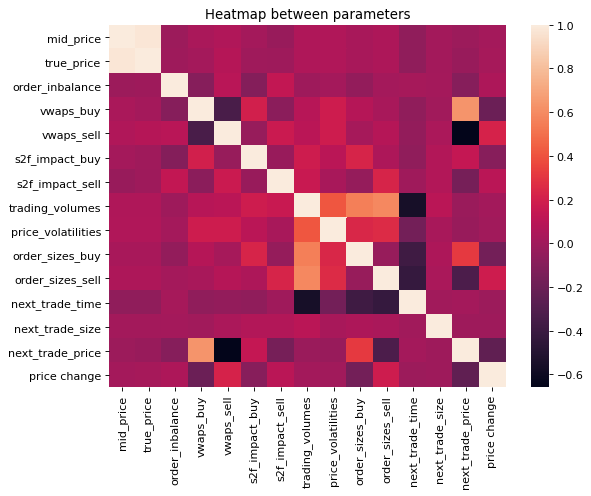

In [ ]:
df = pd.DataFrame({
                'mid_price': mid_price.flatten(), 
                'true_price': true_price.flatten(), 
                'order_inbalance': order_inbalance.flatten(), 
                'vwaps_buy': vwaps_buy.flatten(), 
                'vwaps_sell': vwaps_sell.flatten(), 
                's2f_impact_buy': s2f_impact_buy.flatten(), 
                's2f_impact_sell': s2f_impact_sell.flatten(), 
                'trading_volumes': trading_volumes.flatten(), 
                'price_volatilities': price_volatilities.flatten(),
                'order_sizes_buy': order_sizes_buy.flatten(), 
                'order_sizes_sell': order_sizes_sell.flatten(),
                'next_trade_time': next_trade_time.flatten(),
                'next_trade_size': next_trade_size.flatten(),
                'next_trade_price': next_trade_price.flatten(),
                'price change': price_change.flatten()
                })

figure(figsize=(8, 6), dpi=80)
ax = sns.heatmap(df.corr(method='kendall'))
plt.title("Heatmap between parameters")
plt.show()

# models

In [ ]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn import preprocessing
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier



In [ ]:
functions_to_call = {
    'mid_price'                              : get_mid_price_comp,
    'true_price'                             : get_true_price_comp,
    'order_inbalance'                        : get_order_inbalance_comp,
    'vwaps_buy'                              : get_vwap_and_ordersizes_comp,
    'vwaps_sell'                             : get_vwap_and_ordersizes_comp,
    'vwaps_order_sizes_buy'                  : get_vwap_and_ordersizes_comp,
    'vwaps_order_sizes_sell'                 : get_vwap_and_ordersizes_comp,
    's2f_impact_buy'                         : get_s2f_impact_and_ordersizes_comp,
    's2f_impact_sell'                        : get_s2f_impact_and_ordersizes_comp,
    's2f_order_sizes_buy'                    : get_s2f_impact_and_ordersizes_comp,
    's2f_order_sizes_sell'                   : get_s2f_impact_and_ordersizes_comp,
    'trading_volumes'                        : get_trading_volume_and_price_volatility,
    'price_volatilities'                     : get_trading_volume_and_price_volatility,
    'next_trade_time'                        : get_next_trade_x_comp,
    'next_trade_size'                        : get_next_trade_x_comp,
    'next_trade_price'                       : get_next_trade_x_comp,
    'price_change'                           : get_price_change_given_prices
}

In [ ]:
names=[         
   # 'mid_price',
    #'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
param_dict_logreg={}
for n in names:
    param_dict_logreg[n]=[]

# Testy modeli na wybranym thresholdzie i porównanie

In [ ]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import mean_squared_error as mse
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn import preprocessing
import xgboost as xgb
from sklearn.metrics import confusion_matrix

In [ ]:
#!pip install keras_metrics

In [ ]:
#!pip install tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dropout, Dense, Conv1D, MaxPool1D, GlobalMaxPooling1D, BatchNormalization
from tensorflow.keras.layers import ReLU
from tensorflow.keras.layers import LSTM, GRU
import keras
import keras_metrics

In [ ]:
def prep_data_to_NN(comp_id = 15, interval = 5, time_to_skip = 30, time_back = 1, split_percent = 0.8, threshold = 0.001):
#print(average_comp_price[comp_id])
    X=get_X(comp_id, interval, time_to_skip, time_back, names)
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold = threshold)
    end_split = int(split_percent * X.shape[0])
    X_train = X[:end_split]
    y_train = y[:end_split]
    X_test = X[end_split:]
    y_test = y[end_split:]
    return X_train, y_train, X_test, y_test


### Test z plotem loss i accuracy

In [ ]:
def LSTM(X, y, split_percent, use_scaling=True):
    split=int(y.size*split_percent)
    X_train = X[:split]
    X_test = X[split:]
    y_train = y[:split]
    y_test = y[split:]
    y_train_one_hot = tf.one_hot(y_train, depth = 2)
    y_test_one_hot = tf.one_hot(y_test, depth = 2)
    neg_class_count = np.sum(y_train==0)
    pos_class_count = np.sum(y_train==1)
    split=int(y.size*split_percent)
    
    model = keras.Sequential()
    model.add(layers.Dense(256, use_bias=True, activation="relu", input_shape=(X_train.shape[1], 1)))
    model.add(LSTM(units=256, return_sequences=True))
    model.add(LSTM(units=128, return_sequences=True))
    model.add(LSTM(units=64))
    model.add(Dense(128))
    model.add(Dense(2, activation='softmax'))

    model.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
          loss=tf.keras.losses.CategoricalCrossentropy(),
          metrics=[tf.keras.metrics.CategoricalAccuracy()],
      )

    history = model.fit(
          X_train,
          y_train_one_hot,
          validation_split=0.2,
          epochs=200,
          verbose = 0
      )

    model.evaluate(X_test, y_test_one_hot, verbose=0)
    preds = model.predict(X_test)
    move_pred = 0
    stay_pred = 0
    results = np.zeros(y_test.shape)
    correct = 0
    for i in range(preds.shape[0]):
        if preds[i][0]>preds[i][1]:
            results[i] = 1
            if y_test[i]==1:
                correct+=1
            move_pred+=1
        else:
            if y_test[i]==0:
                correct+=1
            stay_pred+=1
    conf_mat = confusion_matrix(y_test, results, labels = [1, 0]).T
    print(conf_mat)
    if np.unique(y_test).size>1:
        return accuracy, precision, recall
    else:
        return accuracy, math.nan, math.nan

In [ ]:
def LSTM_cross_val(X_train, y_train, X_test, y_test, use_scaling=True):
    y_train_one_hot = tf.one_hot(y_train, depth = 2)
    y_test_one_hot = tf.one_hot(y_test, depth = 2)
    neg_class_count = np.sum(y_train==0)
    pos_class_count = np.sum(y_train==1)
    
    model = keras.Sequential()
    # Add an Embedding layer expecting input vocab of size 1000, and
    # output embedding dimension of size 64.
    model.add(layers.Dense(256, use_bias=True, activation="relu", input_shape=(X_train.shape[1], 1)))
    model.add(LSTM(units=256, return_sequences=True))
    model.add(LSTM(units=128, return_sequences=True))
    model.add(LSTM(units=64))
    model.add(Dense(128))
    model.add(Dense(2, activation='softmax'))

    model.compile(
          optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
          loss=tf.keras.losses.CategoricalCrossentropy(),
          metrics=[tf.keras.metrics.CategoricalAccuracy()],
      )

    history = model.fit(
          X_train,
          y_train_one_hot,
          validation_split=0.2,
          epochs=200,
          verbose = 0
      )

    print("NN score: ")
    model.evaluate(X_test, y_test_one_hot, verbose=1)
    preds = model.predict(X_test)
    move_pred = 0
    stay_pred = 0
    results = np.zeros(y_test.shape)
    correct = 0
    for i in range(preds.shape[0]):
        if preds[i][0]>preds[i][1]:
            results[i] = 1
            if y_test[i]==1:
                correct+=1
            move_pred+=1
        else:
            if y_test[i]==0:
                correct+=1
            stay_pred+=1
    print("NN score test: ", 
            " move preds: ", move_pred,
            " stay preds: ", stay_pred,
            " accuracy:   ", correct/preds.shape[0]
      )
    conf_mat = confusion_matrix(y_test, results, labels = [1, 0]).T
    print(conf_mat)
    if np.unique(y_test).size>1:
        print("Precision:")
        precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
        print(precision)
        print("Recall:")
        recall = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[1][0])
        print(recall)
        print("Accuracy:")
        accuracy = (conf_mat[0][0]+conf_mat[1][1])/results.shape
        print(accuracy)
        return accuracy, precision, recall
    else:
        return accuracy, math.nan, math.nan

### Create data for Ns

In [ ]:
interval=1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.6
valid_percent=split_percent+0.2
threshold=0.0012
check = 'swing_max'
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'price_volatilities',
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]
no_parameters = len(names)
no_comps=len(list_of_companies_number)
s=get_X(0, interval, time_to_skip, time_back, names).shape
X=np.zeros(shape=(no_comps, s[0], s[1]))
y=np.zeros(shape=(no_comps, s[0]))
Xy=np.empty(shape=(X.shape[1], X.shape[2]+1))
for i in range(no_comps):
    X_hold=get_X(i, interval, time_to_skip, time_back, names)
    transformer = preprocessing.MaxAbsScaler().fit(X_hold)

    Xy[:,:no_parameters]=transformer.transform(X_hold)
    Xy[:,no_parameters]=get_y(i, interval, time_to_skip, time_back, y_name='true_price', check='swing_max', threshold=threshold)
    X[i]=Xy[:,:no_parameters]
    y[i]=Xy[:,no_parameters]
split=int(X.shape[1]*split_percent)
valid=int(X.shape[1]*valid_percent)

38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
25.177083333333332% of intervals were SELL empty
26.302083333333332% of in

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
12.729166666666666% of intervals were SELL em

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
25.75% of intervals were SELL empty
24.354166666666668% of intervals were BUY empty
0.14583333333333334% of intervals were set not filled
26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


In [ ]:
X=torch.tensor(X, dtype=torch.float32)
y=torch.tensor(y, dtype=torch.long)

In [ ]:
import pandas as pd
import torch
x_df = pd.DataFrame(torch.flatten(X,start_dim=0, end_dim=1).numpy())
x_df.to_csv('X_{}_{}_{}_{}_all.csv'.format(interval,time_to_skip, time_back, swing_interval))
y_df = pd.DataFrame(torch.flatten(y,start_dim=0, end_dim=1).numpy())
y_df.to_csv('y_{}_{}_{}_{}_all.csv'.format(interval,time_to_skip, time_back, swing_interval))

In [ ]:
X = X.numpy()
y = y.numpy()

In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_naive=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_naive=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_naive=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_naive=np.zeros((len(list_of_companies_number),5, 3)) 
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_naive[comp_id,i,0], comp_scores_log_reg_naive[comp_id,i,1],comp_scores_log_reg_naive[comp_id,i,2]=logistic_regr(X_mom, np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_dec_tree_naive[comp_id,i,0], comp_scores_dec_tree_naive[comp_id,i,1],comp_scores_dec_tree_naive[comp_id,i,2]=decision_tree(X_mom, np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_xgb_naive[comp_id,i,0], comp_scores_xgb_naive[comp_id,i,1],comp_scores_xgb_naive[comp_id,i,2]=XGB(X_mom, np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_lstm_naive[comp_id,i,0], comp_scores_lstm_naive[comp_id,i,1],comp_scores_lstm_naive[comp_id,i,2]=LSTM(X_mom, np.copy(y),split_percent)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.5462731723294707
order_inbalance   -1.7506704048213295
vwaps_buy   1.705306713045116
vwaps_sell   -0.18144384147378975
s2f_impact_buy   -0.2567928223196179
s2f_impact_sell   0.6054984397617927
trading_volumes   -1.3341965211595377
vwaps_order_sizes_buy   -0.19766830074248365
vwaps_order_sizes_sell   0.10221591502019764
s2f_order_sizes_buy   -0.19766830074248365
s2f_order_sizes_sell   0.10221591502019764
next_trade_time   -0.6875337843488023
next_trade_size   0.9637106397637822
next_trade_price   1.4071584705784133
[[145 136]
 [351 318]]
[[136 122]
 [360 332]]
[10:50:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[137 141]
 [359 313]]
Coeffic

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[139 147]
 [357 307]]
Coefficient impact:
true_price   -1.5454751506947717
order_inbalance   -1.7506397497898865
vwaps_buy   1.7055147947368121
vwaps_sell   -0.1812241255126174
s2f_impact_buy   -0.25680462102204427
s2f_impact_sell   0.6053942325829456
trading_volumes   -1.333932770379779
vwaps_order_sizes_buy   -0.19766169506943934
vwaps_order_sizes_sell   0.10251218566293235
s2f_order_sizes_buy   -0.19766169506943934
s2f_order_sizes_sell   0.10251218566293235
next_trade_time   -0.6879707081186363
next_trade_size   0.9639039148502868
next_trade_price   1.4071166180538746
[[145 136]
 [351 318]]
[[135 129]
 [361 325]]
[10:50:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[118 120]
 [378 334]]
Coefficient impact:
true_price   -1.5435439956724084
order_inbalance   -1.7503948711641877
vwaps_buy   1.7054322262380246
vwaps_sell   -0.18160005719931377
s2f_impact_buy   -0.2567383173949127
s2f_impact_sell   0.6052153192348763
trading_volumes   -1.334038812848885
vwaps_order_sizes_buy   -0.19734856804591272
vwaps_order_sizes_sell   0.10203859585853357
s2f_order_sizes_buy   -0.19734856804591272
s2f_order_sizes_sell   0.10203859585853357
next_trade_time   -0.6877725284721605
next_trade_size   0.9643270838409804
next_trade_price   1.4064807063974512
[[146 136]
 [350 318]]
[[128 127]
 [368 327]]
[10:50:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[129 149]
 [367 305]]
Coefficient impact:
true_price   -1.546840690979162
order_inbalance   -1.7505916036671973
vwaps_buy   1.705417100647751
vwaps_sell   -0.18150798819746652
s2f_impact_buy   -0.256808009542834
s2f_impact_sell   0.6053665022569648
trading_volumes   -1.3342766982705334
vwaps_order_sizes_buy   -0.19769895362076195
vwaps_order_sizes_sell   0.10210877577729331
s2f_order_sizes_buy   -0.19769895362076195
s2f_order_sizes_sell   0.10210877577729331
next_trade_time   -0.6880412045654091
next_trade_size   0.9637619336277157
next_trade_price   1.4067965292286435
[[145 136]
 [351 318]]
[[143 146]
 [353 308]]
[10:50:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[141 130]
 [355 324]]
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.196453535565116
order_inbalance   0.4478405511506742
vwaps_buy   0.7204317159285043
vwaps_sell   1.7397296620374598
s2f_impact_buy   1.3208589021846022
s2f_impact_sell   0.4328310114370951
trading_volumes   -2.3756128440618878
vwaps_order_sizes_buy   0.9832704753009599
vwaps_order_sizes_sell   -0.22573909116299307
s2f_order_sizes_buy   0.9832704753009599
s2f_order_sizes_sell   -0.22573909116299307
next_trade_time   0.7676036763280658
next_trade_size   1.0314577966435512
next_trade_price   -0.24518605033986
[[523 404]
 [ 13  10]]
[[498 346]
 [ 38  68]]
[10:50:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[502 350]
 [ 34  64]]
Coefficient impact:
true_price   -3.1954594234966223
order_inbalance   0.44792037742461205
vwaps_buy   0.7206943528802111
vwaps_sell   1.7399077432100354
s2f_impact_buy   1.3199606290096446
s2f_impact_sell   0.4333035831494338
trading_volumes   -2.37531722498922
vwaps_order_sizes_buy   0.9836473736736688
vwaps_order_sizes_sell   -0.22580150320125475
s2f_order_sizes_buy   0.9836473736736688
s2f_order_sizes_sell   -0.22580150320125475
next_trade_time   0.7671488869077175
next_trade_size   1.0318993948167225
next_trade_price   -0.2447834558842155
[[523 404]
 [ 13  10]]
[[498 356]
 [ 38  58]]
[10:50:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[500 356]
 [ 36  58]]
Coefficient impact:
true_price   -3.1976984255524235
order_inbalance   0.4482294941062217
vwaps_buy   0.7204142168592044
vwaps_sell   1.7392215996358964
s2f_impact_buy   1.3196657624180017
s2f_impact_sell   0.4329543221093987
trading_volumes   -2.3727185700869997
vwaps_order_sizes_buy   0.9867477550954072
vwaps_order_sizes_sell   -0.2266955847892866
s2f_order_sizes_buy   0.9867477550954072
s2f_order_sizes_sell   -0.2266955847892866
next_trade_time   0.7674946908931638
next_trade_size   1.0331754192361073
next_trade_price   -0.2466453441932222
[[523 404]
 [ 13  10]]
[[497 343]
 [ 39  71]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[498 343]
 [ 38  71]]
Coefficient impact:
true_price   -3.198030351965077
order_inbalance   0.44791553094978775
vwaps_buy   0.7206968154608484
vwaps_sell   1.7398750891741759
s2f_impact_buy   1.3200431034444884
s2f_impact_sell   0.43424224405567036
trading_volumes   -2.3757038120220093
vwaps_order_sizes_buy   0.9834932444007929
vwaps_order_sizes_sell   -0.22608644392090518
s2f_order_sizes_buy   0.9834932444007929
s2f_order_sizes_sell   -0.22608644392090518
next_trade_time   0.7672881858282996
next_trade_size   1.0314706862216012
next_trade_price   -0.24524621477918077
[[523 404]
 [ 13  10]]
[[502 352]
 [ 34  62]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[498 344]
 [ 38  70]]
Coefficient impact:
true_price   -3.197604944239432
order_inbalance   0.4468567508793419
vwaps_buy   0.7208422780294849
vwaps_sell   1.7403182191669575
s2f_impact_buy   1.3191594965291378
s2f_impact_sell   0.4340402040677178
trading_volumes   -2.375319824399326
vwaps_order_sizes_buy   0.9843636114184966
vwaps_order_sizes_sell   -0.2257007392202767
s2f_order_sizes_buy   0.9843636114184966
s2f_order_sizes_sell   -0.2257007392202767
next_trade_time   0.7677933463145353
next_trade_size   1.0323748498934049
next_trade_price   -0.24508141898392227
[[523 404]
 [ 13  10]]
[[499 350]
 [ 37  64]]
[10:50:37] WARNI

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[498 352]
 [ 38  62]]
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -0.154196921522561
order_inbalance   -0.5277337653964971
vwaps_buy   -1.0518912482493608
vwaps_sell   0.6443937184837201
s2f_impact_buy   0.4049697039957452
s2f_impact_sell   -0.928805626333925
trading_volumes   -1.4350746566228763
vwaps_order_sizes_buy   0.1508968568709695
vwaps_order_sizes_sell   0.5682988582884622
s2f_order_sizes_buy   0.1508968568709695
s2f_order_sizes_sell   0.5682988582884622
next_trade_time   -2.16628668927796
next_trade_size   -0.6044726554431568
next_trade_price   -0.1466869799982167
[[299 257]
 [234 160]]
[[173 100]
 [360 317]]
[10:50:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logisti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[171 100]
 [362 317]]
Coefficient impact:
true_price   -0.15473165394864077
order_inbalance   -0.5290114434643025
vwaps_buy   -1.0512451171388102
vwaps_sell   0.6458053418759863
s2f_impact_buy   0.4053958938188774
s2f_impact_sell   -0.9270160787138463
trading_volumes   -1.4363334621062096
vwaps_order_sizes_buy   0.15077257830842958
vwaps_order_sizes_sell   0.5684113256192518
s2f_order_sizes_buy   0.15077257830842958
s2f_order_sizes_sell   0.5684113256192518
next_trade_time   -2.165111290371795
next_trade_size   -0.604436144272027
next_trade_price   -0.14550687387926772
[[300 258]
 [233 159]]
[[171 100]
 [362 317]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[169 114]
 [364 303]]
Coefficient impact:
true_price   -0.15321966240093635
order_inbalance   -0.5288589277680409
vwaps_buy   -1.0520450956433234
vwaps_sell   0.6447375165922045
s2f_impact_buy   0.40451382383305273
s2f_impact_sell   -0.9260549928517466
trading_volumes   -1.4358961488550595
vwaps_order_sizes_buy   0.15077850769733883
vwaps_order_sizes_sell   0.5682223787846692
s2f_order_sizes_buy   0.15077850769733883
s2f_order_sizes_sell   0.5682223787846692
next_trade_time   -2.165609805505215
next_trade_size   -0.6045192072482958
next_trade_price   -0.14573821720915187
[[300 258]
 [233 159]]
[[170  98]
 [363 319]]
[10:50:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[170 104]
 [363 313]]
Coefficient impact:
true_price   -0.15300957683528077
order_inbalance   -0.5290390868788919
vwaps_buy   -1.0514604722638838
vwaps_sell   0.6455221748622396
s2f_impact_buy   0.4037645068031833
s2f_impact_sell   -0.9260858480669723
trading_volumes   -1.4351688672370242
vwaps_order_sizes_buy   0.1510525566080032
vwaps_order_sizes_sell   0.5683352377169701
s2f_order_sizes_buy   0.1510525566080032
s2f_order_sizes_sell   0.5683352377169701
next_trade_time   -2.166074409713247
next_trade_size   -0.6041671701555176
next_trade_price   -0.145878463608131
[[300 258]
 [233 159]]
[[175 103]
 [358 314]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[174 100]
 [359 317]]
Coefficient impact:
true_price   -0.15117875340322084
order_inbalance   -0.5293818936881847
vwaps_buy   -1.0510530519410477
vwaps_sell   0.6449487324574938
s2f_impact_buy   0.4041437584126386
s2f_impact_sell   -0.9260636876812341
trading_volumes   -1.436094450776006
vwaps_order_sizes_buy   0.150172937888724
vwaps_order_sizes_sell   0.5678248492185864
s2f_order_sizes_buy   0.150172937888724
s2f_order_sizes_sell   0.5678248492185864
next_trade_time   -2.165895403771347
next_trade_size   -0.6042974738982185
next_trade_price   -0.14654398652635697
[[300 260]
 [233 157]]
[[179 102]
 [354 315]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[172  96]
 [361 321]]
3
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.4176324323923235
order_inbalance   0.9074414644694367
vwaps_buy   -0.05787310682129967
vwaps_sell   0.11318251067755006
s2f_impact_buy   -0.21292652317464886
s2f_impact_sell   -0.4121083354639622
trading_volumes   0.9017288590136734
vwaps_order_sizes_buy   0.6680931751847149
vwaps_order_sizes_sell   -0.09757762908045674
s2f_order_sizes_buy   0.6680931751847149
s2f_order_sizes_sell   -0.09757762908045674
next_trade_time   0.12181535567450984
next_trade_size   1.5366998177015614
next_trade_price   -0.18145771762317592
[[ 77  44]
 [408 421]]
[[187 166]
 [298 299]]
[10:50:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[173 132]
 [312 333]]
Coeffi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[196 178]
 [289 287]]
Coefficient impact:
true_price   -0.4179129290084032
order_inbalance   0.9077221745911972
vwaps_buy   -0.05937059824418923
vwaps_sell   0.11269314563661004
s2f_impact_buy   -0.21240816800479298
s2f_impact_sell   -0.41253249793228663
trading_volumes   0.9024667495204631
vwaps_order_sizes_buy   0.668953295503434
vwaps_order_sizes_sell   -0.09720432869679865
s2f_order_sizes_buy   0.668953295503434
s2f_order_sizes_sell   -0.09720432869679865
next_trade_time   0.1222626082832479
next_trade_size   1.5374837158914556
next_trade_price   -0.18088412299417367
[[ 77  44]
 [408 421]]
[[152 106]
 [333 359]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[181 167]
 [304 298]]
Coefficient impact:
true_price   -0.41819854224333036
order_inbalance   0.9071787086879083
vwaps_buy   -0.05946330156578431
vwaps_sell   0.11224057264820722
s2f_impact_buy   -0.21237138681583978
s2f_impact_sell   -0.41254690023697055
trading_volumes   0.9012491073409145
vwaps_order_sizes_buy   0.6685519607203282
vwaps_order_sizes_sell   -0.09749573830929567
s2f_order_sizes_buy   0.6685519607203282
s2f_order_sizes_sell   -0.09749573830929567
next_trade_time   0.12249757236646433
next_trade_size   1.5370777237226243
next_trade_price   -0.18078418605344548
[[ 77  44]
 [408 421]]
[[165 145]
 [320 320]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[177 148]
 [308 317]]
Coefficient impact:
true_price   -0.41704840443544616
order_inbalance   0.9085263719571957
vwaps_buy   -0.057549186924639194
vwaps_sell   0.11559874185963935
s2f_impact_buy   -0.21255611628662888
s2f_impact_sell   -0.4106701205184662
trading_volumes   0.9017396395575862
vwaps_order_sizes_buy   0.6686259521126936
vwaps_order_sizes_sell   -0.09755182609893157
s2f_order_sizes_buy   0.6686259521126936
s2f_order_sizes_sell   -0.09755182609893157
next_trade_time   0.12235385901563504
next_trade_size   1.5372279135262277
next_trade_price   -0.182824762913541
[[ 77  44]
 [408 421]]
[[185 148]
 [300 317]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[154 108]
 [331 357]]
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3916123388499997
order_inbalance   1.3154489521883879
vwaps_buy   -0.6142395647081405
vwaps_sell   0.5111588548910531
s2f_impact_buy   1.1281490062440658
s2f_impact_sell   -0.9008178616491808
trading_volumes   -0.25104432574767205
vwaps_order_sizes_buy   1.0247122867559557
vwaps_order_sizes_sell   -0.0021170159515351097
s2f_order_sizes_buy   1.0247122867559557
s2f_order_sizes_sell   -0.0021170159515351097
next_trade_time   -1.4426917482125328
next_trade_size   -0.028824146855109457
next_trade_price   1.032536135463145
[[175 380]
 [170 225]]
[[178 204]
 [167 401]]
[10:50:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[180 216]
 [165 389]]
Coe

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[184 221]
 [161 384]]
Coefficient impact:
true_price   -1.3919442573154452
order_inbalance   1.3156632841013176
vwaps_buy   -0.6126814001906109
vwaps_sell   0.5120359877364868
s2f_impact_buy   1.1287608649072516
s2f_impact_sell   -0.9007956809474558
trading_volumes   -0.25179890705714547
vwaps_order_sizes_buy   1.0250600664331468
vwaps_order_sizes_sell   -0.0012405834635254855
s2f_order_sizes_buy   1.0250600664331468
s2f_order_sizes_sell   -0.0012405834635254855
next_trade_time   -1.4419819642760372
next_trade_size   -0.027307798443233482
next_trade_price   1.03168469642694
[[175 380]
 [170 225]]
[[167 200]
 [178 405]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:50:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[172 198]
 [173 407]]
Coefficient impact:
true_price   -1.3919243137602089
order_inbalance   1.3156992699943515
vwaps_buy   -0.6133269235357032
vwaps_sell   0.5116975441263729
s2f_impact_buy   1.1287311076184599
s2f_impact_sell   -0.900677337912511
trading_volumes   -0.25187463354896045
vwaps_order_sizes_buy   1.0242941176342313
vwaps_order_sizes_sell   -0.0014007400296891417
s2f_order_sizes_buy   1.0242941176342313
s2f_order_sizes_sell   -0.0014007400296891417
next_trade_time   -1.442254978714641
next_trade_size   -0.02684128274280769
next_trade_price   1.03112277924337
[[175 380]
 [170 225]]
[[176 223]
 [169 382]]
[10:50:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[171 210]
 [174 395]]
Coefficient impact:
true_price   -1.3917359013737256
order_inbalance   1.3160263666697274
vwaps_buy   -0.6124441847965503
vwaps_sell   0.5123195016739042
s2f_impact_buy   1.1279735145872507
s2f_impact_sell   -0.8995470552126293
trading_volumes   -0.25144819187296646
vwaps_order_sizes_buy   1.024548403208004
vwaps_order_sizes_sell   -0.0016855553910626602
s2f_order_sizes_buy   1.024548403208004
s2f_order_sizes_sell   -0.0016855553910626602
next_trade_time   -1.441781863384008
next_trade_size   -0.027239017868453907
next_trade_price   1.0311911541675187
[[175 380]
 [170 225]]
[[179 215]
 [166 390]]
[10:50:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[174 202]
 [171 403]]
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -2.7614153348002493
order_inbalance   -0.37640757221745313
vwaps_buy   0.710468677699015
vwaps_sell   -0.06759271412334901
s2f_impact_buy   1.0204809414449907
s2f_impact_sell   0.6867520958582118
trading_volumes   -1.1852866600110032
vwaps_order_sizes_buy   1.2565532721375496
vwaps_order_sizes_sell   0.25636847080896163
s2f_order_sizes_buy   1.2565532721375496
s2f_order_sizes_sell   0.25636847080896163
next_trade_time   0.19990167046456975
next_trade_size   1.6143226033911722
next_trade_price   -1.4207280698455391
[[550 374]
 [  5  21]]
[[385 223]
 [170 172]]
[10:50:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[383 239]
 [172 156]]
Coefficient impact:
true_price   -2.7611122530403045
order_inbalance   -0.37696944252665415
vwaps_buy   0.7110208016468356
vwaps_sell   -0.06818640778579327
s2f_impact_buy   1.0222096739668385
s2f_impact_sell   0.6882456355950868
trading_volumes   -1.1864612586194165
vwaps_order_sizes_buy   1.2559345398908823
vwaps_order_sizes_sell   0.25719256021143355
s2f_order_sizes_buy   1.2559345398908823
s2f_order_sizes_sell   0.25719256021143355
next_trade_time   0.20129234897214546
next_trade_size   1.614754283907608
next_trade_price   -1.419541566666925
[[550 374]
 [  5  21]]
[[385 230]
 [170 165]]
[10:50:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[389 239]
 [166 156]]
Coefficient impact:
true_price   -2.760340099320905
order_inbalance   -0.37633986560969906
vwaps_buy   0.7117762460811747
vwaps_sell   -0.06782121894440878
s2f_impact_buy   1.0221757552201498
s2f_impact_sell   0.6879222852103478
trading_volumes   -1.187136379687746
vwaps_order_sizes_buy   1.2557772580581128
vwaps_order_sizes_sell   0.25641035438516807
s2f_order_sizes_buy   1.2557772580581128
s2f_order_sizes_sell   0.25641035438516807
next_trade_time   0.20139941690937846
next_trade_size   1.615336794010935
next_trade_price   -1.4205595554186687
[[550 374]
 [  5  21]]
[[380 237]
 [175 158]]
[10:50:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[388 241]
 [167 154]]
Coefficient impact:
true_price   -2.760205950113195
order_inbalance   -0.37584555783203494
vwaps_buy   0.7101252496342305
vwaps_sell   -0.06782323387392158
s2f_impact_buy   1.0219498878651267
s2f_impact_sell   0.6867933986616034
trading_volumes   -1.1866354008318412
vwaps_order_sizes_buy   1.2561263835960415
vwaps_order_sizes_sell   0.2564907767700575
s2f_order_sizes_buy   1.2561263835960415
s2f_order_sizes_sell   0.2564907767700575
next_trade_time   0.2013077298174401
next_trade_size   1.6157233427220687
next_trade_price   -1.4199867276172147
[[550 374]
 [  5  21]]
[[386 236]
 [169 159]]
[10:50:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[386 231]
 [169 164]]
Coefficient impact:
true_price   -2.762167508266438
order_inbalance   -0.37558048407703604
vwaps_buy   0.7114582230092494
vwaps_sell   -0.06666411611519399
s2f_impact_buy   1.0221776408833587
s2f_impact_sell   0.6866004850085559
trading_volumes   -1.1858543511911515
vwaps_order_sizes_buy   1.2572630725512928
vwaps_order_sizes_sell   0.256581703400081
s2f_order_sizes_buy   1.2572630725512928
s2f_order_sizes_sell   0.256581703400081
next_trade_time   0.20167095277530547
next_trade_size   1.615348454475001
next_trade_price   -1.4207094571657457
[[549 373]
 [  6  22]]
[[383 239]
 [172 156]]
[10:50:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[386 232]
 [169 163]]
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -2.9133299008188014
order_inbalance   0.12373444200187231
vwaps_buy   0.39617591481476544
vwaps_sell   1.7643775040119107
s2f_impact_buy   0.5938528960079406
s2f_impact_sell   -0.6435826408522913
trading_volumes   -2.31926341125896
vwaps_order_sizes_buy   -0.7581585362612915
vwaps_order_sizes_sell   -0.1675735430567861
s2f_order_sizes_buy   -0.7581585362612915
s2f_order_sizes_sell   -0.1675735430567861
next_trade_time   1.6032251796692092
next_trade_size   -1.117636383320346
next_trade_price   1.6055458184351148
[[367 364]
 [ 97 122]]
[[382 368]
 [ 82 118]]
[10:51:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binar

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[385 367]
 [ 79 119]]
Coefficient impact:
true_price   -2.9132849726185666
order_inbalance   0.12322638089478208
vwaps_buy   0.39618935746967393
vwaps_sell   1.763443225464
s2f_impact_buy   0.593146276061906
s2f_impact_sell   -0.6422960857340964
trading_volumes   -2.3182686206878707
vwaps_order_sizes_buy   -0.7573295517792721
vwaps_order_sizes_sell   -0.16711917005389226
s2f_order_sizes_buy   -0.7573295517792721
s2f_order_sizes_sell   -0.16711917005389226
next_trade_time   1.6034848855756068
next_trade_size   -1.1175855520506177
next_trade_price   1.605404228202485
[[367 364]
 [ 97 122]]
[[381 355]
 [ 83 131]]
[10:51:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[384 365]
 [ 80 121]]
Coefficient impact:
true_price   -2.9113589608723314
order_inbalance   0.11879486058518499
vwaps_buy   0.3966687490685123
vwaps_sell   1.7636126021499883
s2f_impact_buy   0.5946153231794815
s2f_impact_sell   -0.6446796875403771
trading_volumes   -2.3191979605396886
vwaps_order_sizes_buy   -0.7573212886875517
vwaps_order_sizes_sell   -0.16781224892223862
s2f_order_sizes_buy   -0.7573212886875517
s2f_order_sizes_sell   -0.16781224892223862
next_trade_time   1.6041819872945786
next_trade_size   -1.1183883220985804
next_trade_price   1.6037439644783307
[[367 365]
 [ 97 121]]
[[377 352]
 [ 87 134]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[385 365]
 [ 79 121]]
Coefficient impact:
true_price   -2.9151947888161884
order_inbalance   0.12357138189560053
vwaps_buy   0.39592861213041475
vwaps_sell   1.7631266451139231
s2f_impact_buy   0.5957131214462106
s2f_impact_sell   -0.6420039365392102
trading_volumes   -2.318558185700772
vwaps_order_sizes_buy   -0.7568837911702259
vwaps_order_sizes_sell   -0.16817356742099782
s2f_order_sizes_buy   -0.7568837911702259
s2f_order_sizes_sell   -0.16817356742099782
next_trade_time   1.60364668985236
next_trade_size   -1.1178403331036655
next_trade_price   1.6058572432079607
[[367 364]
 [ 97 122]]
[[380 351]
 [ 84 135]]
[10:51:04] 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[385 353]
 [ 79 133]]
Coefficient impact:
true_price   -2.911671144433262
order_inbalance   0.12440045508724447
vwaps_buy   0.3973791662284939
vwaps_sell   1.7631009888192966
s2f_impact_buy   0.5953376122291253
s2f_impact_sell   -0.643657044754424
trading_volumes   -2.3180856230676343
vwaps_order_sizes_buy   -0.7572996162148523
vwaps_order_sizes_sell   -0.16662063072180763
s2f_order_sizes_buy   -0.7572996162148523
s2f_order_sizes_sell   -0.16662063072180763
next_trade_time   1.6027533552928446
next_trade_size   -1.1169773889030978
next_trade_price   1.606564303395451
[[368 364]
 [ 96 122]]
[[378 350]
 [ 86 136]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[378 360]
 [ 86 126]]
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.700166468970933
order_inbalance   -0.3593812169353288
vwaps_buy   0.12531319122990234
vwaps_sell   1.7383281507740131
s2f_impact_buy   0.3227614792483562
s2f_impact_sell   1.239085295902777
trading_volumes   -2.7617181910155124
vwaps_order_sizes_buy   -0.2688439935863194
vwaps_order_sizes_sell   0.6558721063591291
s2f_order_sizes_buy   -0.2688439935863194
s2f_order_sizes_sell   0.6558721063591291
next_trade_time   -1.11316782906

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[238 270]
 [254 188]]
Coefficient impact:
true_price   -2.7037012399138747
order_inbalance   -0.3590374131918751
vwaps_buy   0.1257249964559949
vwaps_sell   1.7387504396514057
s2f_impact_buy   0.32260791837012903
s2f_impact_sell   1.2398937940916173
trading_volumes   -2.7607320552351853
vwaps_order_sizes_buy   -0.26822321235382746
vwaps_order_sizes_sell   0.6564293720702836
s2f_order_sizes_buy   -0.26822321235382746
s2f_order_sizes_sell   0.6564293720702836
next_trade_time   -1.1137363050196893
next_trade_size   2.0642398441754883
next_trade_price   1.3909089360764553
[[ 81  85]
 [411 373]]
[[247 267]
 [245 191]]
[10:51:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[260 284]
 [232 174]]
Coefficient impact:
true_price   -2.702949477653743
order_inbalance   -0.35878563230185495
vwaps_buy   0.12561468716684993
vwaps_sell   1.737722192335536
s2f_impact_buy   0.32314769274473987
s2f_impact_sell   1.2397750156315661
trading_volumes   -2.7627354836275
vwaps_order_sizes_buy   -0.2691680367941269
vwaps_order_sizes_sell   0.6553576159507977
s2f_order_sizes_buy   -0.2691680367941269
s2f_order_sizes_sell   0.6553576159507977
next_trade_time   -1.1143797625857426
next_trade_size   2.0637469213417297
next_trade_price   1.3907824771261206
[[ 83  85]
 [409 373]]
[[227 263]
 [265 195]]
[10:51:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[231 256]
 [261 202]]
Coefficient impact:
true_price   -2.7014113887714433
order_inbalance   -0.3592240821605401
vwaps_buy   0.12528044410990322
vwaps_sell   1.7385381007538336
s2f_impact_buy   0.32241445047015616
s2f_impact_sell   1.2398958804765334
trading_volumes   -2.76197077555956
vwaps_order_sizes_buy   -0.2688251751656929
vwaps_order_sizes_sell   0.6553778849177683
s2f_order_sizes_buy   -0.2688251751656929
s2f_order_sizes_sell   0.6553778849177683
next_trade_time   -1.1132469521242598
next_trade_size   2.063322194526441
next_trade_price   1.390593775061172
[[ 82  85]
 [410 373]]
[[222 243]
 [270 215]]
[10:51:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[250 274]
 [242 184]]
Coefficient impact:
true_price   -2.7041154371807976
order_inbalance   -0.357757550818583
vwaps_buy   0.12600330719608335
vwaps_sell   1.738976404624748
s2f_impact_buy   0.32306792448198296
s2f_impact_sell   1.2403771228354958
trading_volumes   -2.7631249702423872
vwaps_order_sizes_buy   -0.270075149752411
vwaps_order_sizes_sell   0.6551709754540711
s2f_order_sizes_buy   -0.270075149752411
s2f_order_sizes_sell   0.6551709754540711
next_trade_time   -1.11287847271137
next_trade_size   2.0641741103714852
next_trade_price   1.3909054261167744
[[ 82  85]
 [410 373]]
[[241 253]
 [251 205]]
[10:51:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[247 272]
 [245 186]]
8
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
Coefficient impact:
true_price   -1.940987066045793
order_inbalance   -0.4189130094200484
vwaps_buy   -0.9920536800362539
vwaps_sell   0.9603464424085576
s2f_impact_buy   1.120191997244341
s2f_impact_sell   -0.8203725137211222
trading_volumes   -0.7725237382198734
vwaps_order_sizes_buy   -0.9112952405323551
vwaps_order_sizes_sell   1.468243691897399
s2f_order_sizes_buy   -0.9112952405323551
s2f_order_sizes_sell   1.468243691897399
next_trade_time   0.7642498032798946
next_trade_size   -1.6211767551655045
next_trade_price   0.6423028937069505
[[396 420]
 [ 61  73]]
[[ 48 129]
 [409 364]]
[10:51:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was cha

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 67 146]
 [390 347]]
Coefficient impact:
true_price   -1.9409101776294193
order_inbalance   -0.41735958025633707
vwaps_buy   -0.992456534928344
vwaps_sell   0.9612435647823033
s2f_impact_buy   1.1192349087615394
s2f_impact_sell   -0.8215527064719274
trading_volumes   -0.7719363035074165
vwaps_order_sizes_buy   -0.9123483602318154
vwaps_order_sizes_sell   1.468498587434011
s2f_order_sizes_buy   -0.9123483602318154
s2f_order_sizes_sell   1.468498587434011
next_trade_time   0.7649821585373143
next_trade_size   -1.6213099751835096
next_trade_price   0.6433607917923443
[[396 420]
 [ 61  73]]
[[ 65 171]
 [392 322]]
[10:51:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 61 158]
 [396 335]]
Coefficient impact:
true_price   -1.9387112325959652
order_inbalance   -0.4186739833961199
vwaps_buy   -0.993794444447278
vwaps_sell   0.9613751435602224
s2f_impact_buy   1.1205822657045252
s2f_impact_sell   -0.8196295672288569
trading_volumes   -0.7732314343917475
vwaps_order_sizes_buy   -0.9114633794106872
vwaps_order_sizes_sell   1.4671185006276548
s2f_order_sizes_buy   -0.9114633794106872
s2f_order_sizes_sell   1.4671185006276548
next_trade_time   0.7641412424108709
next_trade_size   -1.6217050010181475
next_trade_price   0.6416733098230141
[[400 424]
 [ 57  69]]
[[ 75 175]
 [382 318]]
[10:51:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 94 191]
 [363 302]]
Coefficient impact:
true_price   -1.9422924243337534
order_inbalance   -0.41903858786721615
vwaps_buy   -0.9922599360404888
vwaps_sell   0.9607398405718041
s2f_impact_buy   1.1205473579331033
s2f_impact_sell   -0.8208064965353316
trading_volumes   -0.7728226648866078
vwaps_order_sizes_buy   -0.9122693204724767
vwaps_order_sizes_sell   1.4683260461107563
s2f_order_sizes_buy   -0.9122693204724767
s2f_order_sizes_sell   1.4683260461107563
next_trade_time   0.7648423173869623
next_trade_size   -1.6222674057340358
next_trade_price   0.6421522429638303
[[396 420]
 [ 61  73]]
[[104 173]
 [353 320]]
[10:51:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 99 173]
 [358 320]]
Coefficient impact:
true_price   -1.9416967798214912
order_inbalance   -0.41839976855029976
vwaps_buy   -0.9927788858174741
vwaps_sell   0.9604692197976025
s2f_impact_buy   1.1212253478159147
s2f_impact_sell   -0.8215656896024016
trading_volumes   -0.7727365401486428
vwaps_order_sizes_buy   -0.9121768659771378
vwaps_order_sizes_sell   1.4685494831553982
s2f_order_sizes_buy   -0.9121768659771378
s2f_order_sizes_sell   1.4685494831553982
next_trade_time   0.7640346139598204
next_trade_size   -1.6211286595901748
next_trade_price   0.6429278677444534
[[396 420]
 [ 61  73]]
[[ 79 191]
 [378 302]]
[10:51:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 56  99]
 [401 394]]
9
25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   -1.2993911639568603
order_inbalance   1.0394091236729721
vwaps_buy   -0.6434950835881702
vwaps_sell   0.17618298975829969
s2f_impact_buy   0.6909629092953178
s2f_impact_sell   0.3481981720683392
trading_volumes   0.21399021219698697
vwaps_order_sizes_buy   0.1222708238642089
vwaps_order_sizes_sell   1.410640144161794
s2f_order_sizes_buy   0.1222708238642089
s2f_order_sizes_sell   1.410640144161794
next_trade_time   -0.8843577611633492
next_trade_size   0.09187121380641611
next_trade_price   0.024759349017652515
[[ 90  95]
 [342 423]]
[[131 129]
 [301 389]]
[10:51:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[120 123]
 [312 395]]
Coefficient impact:
true_price   -1.298223874458056
order_inbalance   1.038857209460697
vwaps_buy   -0.6445156196730407
vwaps_sell   0.17669930571882525
s2f_impact_buy   0.691659252965744
s2f_impact_sell   0.3493436947512248
trading_volumes   0.21306448340340628
vwaps_order_sizes_buy   0.12140886810319733
vwaps_order_sizes_sell   1.410453856082248
s2f_order_sizes_buy   0.12140886810319733
s2f_order_sizes_sell   1.410453856082248
next_trade_time   -0.8843679780433421
next_trade_size   0.09174848577912814
next_trade_price   0.024722787290954968
[[ 90  95]
 [342 423]]
[[123 126]
 [309 392]]
[10:51:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[115 116]
 [317 402]]
Coefficient impact:
true_price   -1.298184138704173
order_inbalance   1.038969183462498
vwaps_buy   -0.6435521652841225
vwaps_sell   0.17631139919240418
s2f_impact_buy   0.6917398884839666
s2f_impact_sell   0.3482690439613268
trading_volumes   0.21271241130979326
vwaps_order_sizes_buy   0.1206432190968808
vwaps_order_sizes_sell   1.4110072723685736
s2f_order_sizes_buy   0.1206432190968808
s2f_order_sizes_sell   1.4110072723685736
next_trade_time   -0.8851608846409401
next_trade_size   0.09232711232887425
next_trade_price   0.025456869729865866
[[ 89  95]
 [343 423]]
[[128 132]
 [304 386]]
[10:51:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[113 106]
 [319 412]]
Coefficient impact:
true_price   -1.2972184036674492
order_inbalance   1.0385038947459997
vwaps_buy   -0.6449840748757955
vwaps_sell   0.17524663316457234
s2f_impact_buy   0.6918029568667885
s2f_impact_sell   0.3487603354757308
trading_volumes   0.2135093930739951
vwaps_order_sizes_buy   0.12108900725664172
vwaps_order_sizes_sell   1.410900301369434
s2f_order_sizes_buy   0.12108900725664172
s2f_order_sizes_sell   1.410900301369434
next_trade_time   -0.8841410957347992
next_trade_size   0.09135170596619847
next_trade_price   0.0247081093189675
[[ 90  95]
 [342 423]]
[[134 134]
 [298 384]]
[10:51:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[127 125]
 [305 393]]
Coefficient impact:
true_price   -1.2972485373855809
order_inbalance   1.039633758165701
vwaps_buy   -0.6442346204410629
vwaps_sell   0.1763377952479568
s2f_impact_buy   0.6921681718674806
s2f_impact_sell   0.34897490502767603
trading_volumes   0.21378631266294862
vwaps_order_sizes_buy   0.1219949469377996
vwaps_order_sizes_sell   1.410506934311484
s2f_order_sizes_buy   0.1219949469377996
s2f_order_sizes_sell   1.410506934311484
next_trade_time   -0.8847734395800516
next_trade_size   0.09142998617886115
next_trade_price   0.025182699476875247
[[ 92  95]
 [340 423]]
[[131 127]
 [301 391]]
[10:51:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[110 123]
 [322 395]]
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.5075574233152431
order_inbalance   -0.11522588568304334
vwaps_buy   -0.14851341490515757
vwaps_sell   -0.3978245655320265
s2f_impact_buy   0.060159106592725525
s2f_impact_sell   0.48536505013958947
trading_volumes   -0.40279622220794575
vwaps_order_sizes_buy   1.10169133522898
vwaps_order_sizes_sell   0.8989572975917327
s2f_order_sizes_buy   1.10169133522898
s2f_order_sizes_sell   0.8989572975917327
next_trade_time   0.046356365666399835
next_trade_size   0.655036992712329
next_trade_price   0.8237010263791159
[[ 16  11]
 [347 576]]
[[277 419]
 [ 86 168]]
[10:51:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obj

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[278 411]
 [ 85 176]]
Coefficient impact:
true_price   -1.508396754303046
order_inbalance   -0.11573741146705989
vwaps_buy   -0.1502722910641729
vwaps_sell   -0.39795633057524776
s2f_impact_buy   0.06072239308414286
s2f_impact_sell   0.4862750112467935
trading_volumes   -0.40298856778485354
vwaps_order_sizes_buy   1.1013559549205758
vwaps_order_sizes_sell   0.8997567411921051
s2f_order_sizes_buy   1.1013559549205758
s2f_order_sizes_sell   0.8997567411921051
next_trade_time   0.04622783539828831
next_trade_size   0.6557140423027957
next_trade_price   0.824050665351565
[[ 16  11]
 [347 576]]
[[286 419]
 [ 77 168]]
[10:51:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[291 414]
 [ 72 173]]
Coefficient impact:
true_price   -1.50811533653654
order_inbalance   -0.11561996078101242
vwaps_buy   -0.14990552921468575
vwaps_sell   -0.39824410757837414
s2f_impact_buy   0.06052249443069706
s2f_impact_sell   0.4854992770024943
trading_volumes   -0.40223722926998595
vwaps_order_sizes_buy   1.1014140000068118
vwaps_order_sizes_sell   0.8996648916601766
s2f_order_sizes_buy   1.1014140000068118
s2f_order_sizes_sell   0.8996648916601766
next_trade_time   0.04643029219652583
next_trade_size   0.6558326028573858
next_trade_price   0.8239114114830455
[[ 16  11]
 [347 576]]
[[279 404]
 [ 84 183]]
[10:51:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[282 423]
 [ 81 164]]
Coefficient impact:
true_price   -1.5089742792163314
order_inbalance   -0.11583489659714853
vwaps_buy   -0.1502826140917871
vwaps_sell   -0.39797868622323473
s2f_impact_buy   0.060191448000414816
s2f_impact_sell   0.48557255600262306
trading_volumes   -0.40266322744432664
vwaps_order_sizes_buy   1.101338001152704
vwaps_order_sizes_sell   0.8995448351992793
s2f_order_sizes_buy   1.101338001152704
s2f_order_sizes_sell   0.8995448351992793
next_trade_time   0.04652339068633257
next_trade_size   0.6554291556192491
next_trade_price   0.8238952527452713
[[ 16  11]
 [347 576]]
[[285 417]
 [ 78 170]]
[10:51:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[286 418]
 [ 77 169]]
Coefficient impact:
true_price   -1.5079005816248836
order_inbalance   -0.11583675368485519
vwaps_buy   -0.14983890646861922
vwaps_sell   -0.39749089840893426
s2f_impact_buy   0.06019358402455624
s2f_impact_sell   0.48458500871764515
trading_volumes   -0.4016095206675763
vwaps_order_sizes_buy   1.1020152293485383
vwaps_order_sizes_sell   0.8992081807775077
s2f_order_sizes_buy   1.1020152293485383
s2f_order_sizes_sell   0.8992081807775077
next_trade_time   0.04677039111517299
next_trade_size   0.655459910831672
next_trade_price   0.8242030801760176
[[ 16  11]
 [347 576]]
[[282 419]
 [ 81 168]]
[10:51:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[287 423]
 [ 76 164]]
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.24622315346034165
order_inbalance   1.4709443728275835
vwaps_buy   -1.1572538456590074
vwaps_sell   0.17731743742008854
s2f_impact_buy   0.44388728012980255
s2f_impact_sell   -0.08135526156890492
trading_volumes   -0.7705920860823482
vwaps_order_sizes_buy   0.6030042960310504
vwaps_order_sizes_sell   0.3222031592854717
s2f_order_sizes_buy   0.6030042960310504
s2f_order_sizes_sell   0.3222031592854717
next_trade_time   1.334384150015755
next_trade_size   0.42036114156658905
next_trade_price   1.1679807932572794
[[368 553]
 [ 17  12]]
[[325 480]
 [ 60  85]]
[10:51:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[340 502]
 [ 45  63]]
Coefficient impact:
true_price   0.24622309458996683
order_inbalance   1.4710359247457219
vwaps_buy   -1.1574318174445493
vwaps_sell   0.17791137160325213
s2f_impact_buy   0.4444685335199454
s2f_impact_sell   -0.08077408850438278
trading_volumes   -0.7695857408343424
vwaps_order_sizes_buy   0.6030952425473166
vwaps_order_sizes_sell   0.3232025020642388
s2f_order_sizes_buy   0.6030952425473166
s2f_order_sizes_sell   0.3232025020642388
next_trade_time   1.3346551629404
next_trade_size   0.41963469617262433
next_trade_price   1.1684560858517958
[[368 553]
 [ 17  12]]
[[336 505]
 [ 49  60]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[332 498]
 [ 53  67]]
Coefficient impact:
true_price   0.24658833859127072
order_inbalance   1.4700987360244662
vwaps_buy   -1.1580071889943917
vwaps_sell   0.1771264224794992
s2f_impact_buy   0.4440532007428992
s2f_impact_sell   -0.07998574182598862
trading_volumes   -0.7699185284977764
vwaps_order_sizes_buy   0.6035576370432453
vwaps_order_sizes_sell   0.3222826866071316
s2f_order_sizes_buy   0.6035576370432453
s2f_order_sizes_sell   0.3222826866071316
next_trade_time   1.335419342770643
next_trade_size   0.42022016265881057
next_trade_price   1.167986890160623
[[368 553]
 [ 17  12]]
[[337 489]
 [ 48  76]]
[10:51:34] WARNI

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[322 467]
 [ 63  98]]
Coefficient impact:
true_price   0.24628159740108516
order_inbalance   1.471722203108081
vwaps_buy   -1.1567345622810323
vwaps_sell   0.17762810051645142
s2f_impact_buy   0.4442326192844662
s2f_impact_sell   -0.08186665102986566
trading_volumes   -0.7703805795627665
vwaps_order_sizes_buy   0.6036238562649567
vwaps_order_sizes_sell   0.32211412009825013
s2f_order_sizes_buy   0.6036238562649567
s2f_order_sizes_sell   0.32211412009825013
next_trade_time   1.3339371486154703
next_trade_size   0.4210946125428449
next_trade_price   1.168319731079486
[[368 553]
 [ 17  12]]
[[318 478]
 [ 67  87]]
[10:51:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[316 474]
 [ 69  91]]
Coefficient impact:
true_price   0.24611617957082446
order_inbalance   1.4710178053581253
vwaps_buy   -1.1573470543660458
vwaps_sell   0.17709914309896493
s2f_impact_buy   0.4446619279055873
s2f_impact_sell   -0.08109332704306405
trading_volumes   -0.7690822097705878
vwaps_order_sizes_buy   0.6037929450062804
vwaps_order_sizes_sell   0.32322724762681687
s2f_order_sizes_buy   0.6037929450062804
s2f_order_sizes_sell   0.32322724762681687
next_trade_time   1.3347282002281144
next_trade_size   0.42030817854592006
next_trade_price   1.168103693605565
[[368 553]
 [ 17  12]]
[[334 478]
 [ 51  87]]
[10:51:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[335 500]
 [ 50  65]]
12
25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.8109486307753064
order_inbalance   -0.4163471893558786
vwaps_buy   -0.3573855655076574
vwaps_sell   0.6992341892931252
s2f_impact_buy   0.830179583856425
s2f_impact_sell   0.934584233369942
trading_volumes   -1.8145128083754773
vwaps_order_sizes_buy   -0.3077324789239786
vwaps_order_sizes_sell   0.09822966550031456
s2f_order_sizes_buy   -0.3077324789239786
s2f_order_sizes_sell   0.09822966550031456
next_trade_time   0.44617467008123823
next_trade_size   1.312605070496537
next_trade_price   0.5295825894591161
[[ 20   9]
 [454 467]]
[[117 122]
 [357 354]]
[10:51:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[106 108]
 [368 368]]
Coefficient impact:
true_price   -3.814371873810727
order_inbalance   -0.4133591890086816
vwaps_buy   -0.3585618781820953
vwaps_sell   0.6986500278727782
s2f_impact_buy   0.8320408191091813
s2f_impact_sell   0.9348565733630129
trading_volumes   -1.8138776962896972
vwaps_order_sizes_buy   -0.30503213988370104
vwaps_order_sizes_sell   0.09569177642073463
s2f_order_sizes_buy   -0.30503213988370104
s2f_order_sizes_sell   0.09569177642073463
next_trade_time   0.44665486449073505
next_trade_size   1.3159736126968733
next_trade_price   0.5297743523065503
[[ 20   9]
 [454 467]]
[[104 111]
 [370 365]]
[10:51:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 68  67]
 [406 409]]
Coefficient impact:
true_price   -3.816482676006749
order_inbalance   -0.4153128686998263
vwaps_buy   -0.3579014452185081
vwaps_sell   0.7012450668696014
s2f_impact_buy   0.829967905937759
s2f_impact_sell   0.9335368737415317
trading_volumes   -1.8138143800821362
vwaps_order_sizes_buy   -0.30635762945041434
vwaps_order_sizes_sell   0.09742538580848636
s2f_order_sizes_buy   -0.30635762945041434
s2f_order_sizes_sell   0.09742538580848636
next_trade_time   0.445173600138055
next_trade_size   1.3156890417543914
next_trade_price   0.5298505017080629
[[ 20   9]
 [454 467]]
[[ 82  75]
 [392 401]]
[10:51:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 76  90]
 [398 386]]
Coefficient impact:
true_price   -3.809499047359251
order_inbalance   -0.4145750820570208
vwaps_buy   -0.3562233748834667
vwaps_sell   0.7013756079568916
s2f_impact_buy   0.8310654332470264
s2f_impact_sell   0.9340377148858149
trading_volumes   -1.8145113845272638
vwaps_order_sizes_buy   -0.30779778601537494
vwaps_order_sizes_sell   0.09745094253392171
s2f_order_sizes_buy   -0.30779778601537494
s2f_order_sizes_sell   0.09745094253392171
next_trade_time   0.4458912475029206
next_trade_size   1.3155269478971199
next_trade_price   0.5303938483399265
[[ 20   9]
 [454 467]]
[[ 82  87]
 [392 389]]
[10:51:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 76  74]
 [398 402]]
Coefficient impact:
true_price   -3.810962099327521
order_inbalance   -0.4131591414141611
vwaps_buy   -0.35765669573677883
vwaps_sell   0.7021918414173587
s2f_impact_buy   0.8318540005452169
s2f_impact_sell   0.9340812833359183
trading_volumes   -1.813751943026724
vwaps_order_sizes_buy   -0.30693489993234313
vwaps_order_sizes_sell   0.09831262755703966
s2f_order_sizes_buy   -0.30693489993234313
s2f_order_sizes_sell   0.09831262755703966
next_trade_time   0.44805357059096146
next_trade_size   1.3147556145733694
next_trade_price   0.5312042095605153
[[ 20   9]
 [454 467]]
[[ 96  91]
 [378 385]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 73  70]
 [401 406]]
13
33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -1.1677705145044315
order_inbalance   -0.6502766442881981
vwaps_buy   -0.04280423564426105
vwaps_sell   1.543766251025757
s2f_impact_buy   0.7807543603464054
s2f_impact_sell   -0.285114242903999
trading_volumes   -1.4147591213070396
vwaps_order_sizes_buy   0.14037167576027826
vwaps_order_sizes_sell   0.967350546653852
s2f_order_sizes_buy   0.14037167576027826
s2f_order_sizes_sell   0.967350546653852
next_trade_time   -0.75233061

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[105 122]
 [240 483]]
Coefficient impact:
true_price   -1.170175594139883
order_inbalance   -0.6514935736465206
vwaps_buy   -0.04236996411989699
vwaps_sell   1.5436651696288122
s2f_impact_buy   0.7803177469796949
s2f_impact_sell   -0.2851388387026394
trading_volumes   -1.4148385222402886
vwaps_order_sizes_buy   0.14053876706728974
vwaps_order_sizes_sell   0.9668185814818383
s2f_order_sizes_buy   0.14053876706728974
s2f_order_sizes_sell   0.9668185814818383
next_trade_time   -0.750710654641776
next_trade_size   0.6434463530189158
next_trade_price   0.029426943756716468
[[248 381]
 [ 97 224]]
[[105 119]
 [240 486]]
[10:51:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[107 113]
 [238 492]]
Coefficient impact:
true_price   -1.1697757606765637
order_inbalance   -0.6503506205792517
vwaps_buy   -0.04188285244919913
vwaps_sell   1.5435439610233093
s2f_impact_buy   0.7802253909490812
s2f_impact_sell   -0.28451973844385364
trading_volumes   -1.4146430750985475
vwaps_order_sizes_buy   0.14036099661939044
vwaps_order_sizes_sell   0.9674162000212725
s2f_order_sizes_buy   0.14036099661939044
s2f_order_sizes_sell   0.9674162000212725
next_trade_time   -0.7510006956143398
next_trade_size   0.6441419639584177
next_trade_price   0.029816848414470312
[[250 382]
 [ 95 223]]
[[104 109]
 [241 496]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[105 109]
 [240 496]]
Coefficient impact:
true_price   -1.1699475782618212
order_inbalance   -0.6495797318524447
vwaps_buy   -0.04174327068259171
vwaps_sell   1.5441413394408081
s2f_impact_buy   0.7813385076119619
s2f_impact_sell   -0.28475370348229817
trading_volumes   -1.4149712352136437
vwaps_order_sizes_buy   0.14028157454665838
vwaps_order_sizes_sell   0.9673093903135362
s2f_order_sizes_buy   0.14028157454665838
s2f_order_sizes_sell   0.9673093903135362
next_trade_time   -0.751010614072547
next_trade_size   0.6441166896443296
next_trade_price   0.02994686433475998
[[249 381]
 [ 96 224]]
[[108 122]
 [237 483]]
[10:51:47]

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[104 123]
 [241 482]]
Coefficient impact:
true_price   -1.1693470463206228
order_inbalance   -0.6501774965204503
vwaps_buy   -0.0418567870772681
vwaps_sell   1.5440885810092362
s2f_impact_buy   0.7799327726158647
s2f_impact_sell   -0.285288227054237
trading_volumes   -1.415225122299982
vwaps_order_sizes_buy   0.1405772796253781
vwaps_order_sizes_sell   0.9673852069121026
s2f_order_sizes_buy   0.1405772796253781
s2f_order_sizes_sell   0.9673852069121026
next_trade_time   -0.751167562682361
next_trade_size   0.6436895413213067
next_trade_price   0.029342765699693456
[[250 382]
 [ 95 223]]
[[106 116]
 [239 489]]
[10:51:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[105 107]
 [240 498]]
14
31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.19732728347066336
order_inbalance   1.4379094541614195
vwaps_buy   0.039143403081835865
vwaps_sell   -0.30769546923532887
s2f_impact_buy   1.825948888790465
s2f_impact_sell   -0.9842174167354782
trading_volumes   -0.9992095700190775
vwaps_order_sizes_buy   1.4231058402106358
vwaps_order_sizes_sell   0.5264899148307578
s2f_order_sizes_buy   1.4231058402106358
s2f_order_sizes_sell   0.5264899148307578
next_trade_time   3.1146628718740255
next_trade_size   -1.706040980759209
next_trade_price   0.37009519120677137
[[220 221]
 [302 207]]
[[243 208]
 [279 220]]
[10:51:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:lo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[250 195]
 [272 233]]
Coefficient impact:
true_price   0.1968276565497494
order_inbalance   1.4360859239684804
vwaps_buy   0.038338167576111935
vwaps_sell   -0.30640681114151463
s2f_impact_buy   1.8249727422356237
s2f_impact_sell   -0.9850910011120427
trading_volumes   -0.999222929836686
vwaps_order_sizes_buy   1.4252835951613094
vwaps_order_sizes_sell   0.5248852148951924
s2f_order_sizes_buy   1.4252835951613094
s2f_order_sizes_sell   0.5248852148951924
next_trade_time   3.115434765741314
next_trade_size   -1.7060884694508998
next_trade_price   0.37162535098011446
[[218 216]
 [304 212]]
[[247 194]
 [275 234]]
[10:51:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[235 189]
 [287 239]]
Coefficient impact:
true_price   0.19623061941425668
order_inbalance   1.4388491390166107
vwaps_buy   0.03969152908428451
vwaps_sell   -0.3057761266425125
s2f_impact_buy   1.827313544705105
s2f_impact_sell   -0.9825656880926379
trading_volumes   -0.9991982469629257
vwaps_order_sizes_buy   1.4272021614683725
vwaps_order_sizes_sell   0.5262456446649386
s2f_order_sizes_buy   1.4272021614683725
s2f_order_sizes_sell   0.5262456446649386
next_trade_time   3.1137498662936256
next_trade_size   -1.7076323224838854
next_trade_price   0.37265453778664204
[[220 220]
 [302 208]]
[[238 202]
 [284 226]]
[10:51:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[256 205]
 [266 223]]
Coefficient impact:
true_price   0.19267989647494538
order_inbalance   1.435329122746353
vwaps_buy   0.039661746109345294
vwaps_sell   -0.3052224547156367
s2f_impact_buy   1.825782134593899
s2f_impact_sell   -0.9856255254924124
trading_volumes   -0.998746011981119
vwaps_order_sizes_buy   1.425210441362812
vwaps_order_sizes_sell   0.5247240616381381
s2f_order_sizes_buy   1.425210441362812
s2f_order_sizes_sell   0.5247240616381381
next_trade_time   3.1149276256441727
next_trade_size   -1.7047971175501508
next_trade_price   0.37201256144964195
[[213 210]
 [309 218]]
[[239 198]
 [283 230]]
[10:51:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[258 197]
 [264 231]]
Coefficient impact:
true_price   0.19610078742314013
order_inbalance   1.4373099250908075
vwaps_buy   0.038070918032388816
vwaps_sell   -0.3067175443552018
s2f_impact_buy   1.8272874989604664
s2f_impact_sell   -0.9863020659814895
trading_volumes   -1.000432533887227
vwaps_order_sizes_buy   1.426041246842239
vwaps_order_sizes_sell   0.5248402356933513
s2f_order_sizes_buy   1.426041246842239
s2f_order_sizes_sell   0.5248402356933513
next_trade_time   3.115559117485238
next_trade_size   -1.7067284880351867
next_trade_price   0.36981852077686816
[[219 218]
 [303 210]]
[[246 199]
 [276 229]]
[10:51:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[244 206]
 [278 222]]
15
31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -0.05357433646875314
order_inbalance   0.19921215339641202
vwaps_buy   0.19058601381735266
vwaps_sell   1.1339354164482853
s2f_impact_buy   -0.40343115207840274
s2f_impact_sell   -0.6896009837860254
trading_volumes   -1.430314760705777
vwaps_order_sizes_buy   -0.23031090444002428
vwaps_order_sizes_sell   1.0580804474162733
s2f_order_sizes_buy   -0.23031090444002428
s2f_order_sizes_sell   1.0580804474162733
next_trade_time   0.15661000650882784
next_trade_size   -0.711365408141482
next_trade_price   0.3145356692631998
[[  2  29]
 [410 509]]
[[148 179]
 [264 359]]
[10:51:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[145 184]
 [267 354]]
Coefficient impact:
true_price   -0.05232704283915011
order_inbalance   0.1990809731554375
vwaps_buy   0.190730547589363
vwaps_sell   1.1351956241616517
s2f_impact_buy   -0.40346354975948573
s2f_impact_sell   -0.6897946545762283
trading_volumes   -1.4303285471696972
vwaps_order_sizes_buy   -0.23008193199119042
vwaps_order_sizes_sell   1.0579349642821954
s2f_order_sizes_buy   -0.23008193199119042
s2f_order_sizes_sell   1.0579349642821954
next_trade_time   0.15665505665573987
next_trade_size   -0.7122385155434733
next_trade_price   0.3147611126961577
[[  2  29]
 [410 509]]
[[157 190]
 [255 348]]
[10:51:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[147 180]
 [265 358]]
Coefficient impact:
true_price   -0.05315235073820103
order_inbalance   0.1988771736312539
vwaps_buy   0.1910748598520516
vwaps_sell   1.1344157410277773
s2f_impact_buy   -0.4030532544891017
s2f_impact_sell   -0.6899802100856156
trading_volumes   -1.429995465434956
vwaps_order_sizes_buy   -0.2300273432856368
vwaps_order_sizes_sell   1.0576948714932997
s2f_order_sizes_buy   -0.2300273432856368
s2f_order_sizes_sell   1.0576948714932997
next_trade_time   0.157388580990345
next_trade_size   -0.7115542668037428
next_trade_price   0.31463285060511914
[[  2  29]
 [410 509]]
[[153 184]
 [259 354]]
[10:51:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[156 194]
 [256 344]]
Coefficient impact:
true_price   -0.05390648751574665
order_inbalance   0.19993262443434714
vwaps_buy   0.19093305581496614
vwaps_sell   1.134154502876321
s2f_impact_buy   -0.4035255732342943
s2f_impact_sell   -0.6900978463087158
trading_volumes   -1.4304645872784938
vwaps_order_sizes_buy   -0.23028369987139194
vwaps_order_sizes_sell   1.058061915522501
s2f_order_sizes_buy   -0.23028369987139194
s2f_order_sizes_sell   1.058061915522501
next_trade_time   0.15730868164251147
next_trade_size   -0.7117980340104869
next_trade_price   0.31407464047288475
[[  2  29]
 [410 509]]
[[153 196]
 [259 342]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:51:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[140 182]
 [272 356]]
Coefficient impact:
true_price   -0.053211021256986714
order_inbalance   0.19936241462210658
vwaps_buy   0.19032549448075636
vwaps_sell   1.1350644941442887
s2f_impact_buy   -0.40315864573727417
s2f_impact_sell   -0.6905639204569524
trading_volumes   -1.4304408308137677
vwaps_order_sizes_buy   -0.2302569452887055
vwaps_order_sizes_sell   1.0579569918407323
s2f_order_sizes_buy   -0.2302569452887055
s2f_order_sizes_sell   1.0579569918407323
next_trade_time   0.15779946724406874
next_trade_size   -0.7111593478629924
next_trade_price   0.3133718855764353
[[  1  29]
 [411 509]]
[[158 189]
 [254 349]]
[10:52

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[148 188]
 [264 350]]
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -6.318336913865068
order_inbalance   -0.2801883893357581
vwaps_buy   0.07675892406769469
vwaps_sell   0.2966244854129985
s2f_impact_buy   0.26313040676153665
s2f_impact_sell   -0.5607061298776599
trading_volumes   -0.2800139907579607
vwaps_order_sizes_buy   0.02063721473540427
vwaps_order_sizes_sell   1.5978310202210602
s2f_order_sizes_buy   0.02063721473540427
s2f_order_sizes_sell   1.5978310202210602
next_trade_time   -0.4005073680590662
next_trade_size   0.9709998632593223
next_trade_price   1.2774825668974155
[[504 439]
 [  5   2]]
[[300 262]
 [209 179]]
[10:52:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used wit

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[300 267]
 [209 174]]
Coefficient impact:
true_price   -6.318804020433579
order_inbalance   -0.2812791437397639
vwaps_buy   0.07552718967920406
vwaps_sell   0.30077460301882153
s2f_impact_buy   0.26551757305260526
s2f_impact_sell   -0.5594571064676671
trading_volumes   -0.28191652510750986
vwaps_order_sizes_buy   0.019960434365837592
vwaps_order_sizes_sell   1.597707212813159
s2f_order_sizes_buy   0.019960434365837592
s2f_order_sizes_sell   1.597707212813159
next_trade_time   -0.4006373087778796
next_trade_size   0.9701757046242719
next_trade_price   1.2765041679946854
[[504 439]
 [  5   2]]
[[279 245]
 [230 196]]
[10:52:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[308 265]
 [201 176]]
Coefficient impact:
true_price   -6.318440435637463
order_inbalance   -0.27926690893642075
vwaps_buy   0.07382082301684835
vwaps_sell   0.2976027791412294
s2f_impact_buy   0.26562373910193726
s2f_impact_sell   -0.5589806295664058
trading_volumes   -0.28066810968564493
vwaps_order_sizes_buy   0.019549120730144837
vwaps_order_sizes_sell   1.598078717833699
s2f_order_sizes_buy   0.019549120730144837
s2f_order_sizes_sell   1.598078717833699
next_trade_time   -0.4013401270982385
next_trade_size   0.970305883248828
next_trade_price   1.276346199457967
[[504 439]
 [  5   2]]
[[297 256]
 [212 185]]
[10:52:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[307 269]
 [202 172]]
Coefficient impact:
true_price   -6.32100559338942
order_inbalance   -0.2799992386338663
vwaps_buy   0.07631579479910015
vwaps_sell   0.2974988030083056
s2f_impact_buy   0.2672738981831439
s2f_impact_sell   -0.5579000239975695
trading_volumes   -0.2800566489105233
vwaps_order_sizes_buy   0.021131635865615034
vwaps_order_sizes_sell   1.5979111446005025
s2f_order_sizes_buy   0.021131635865615034
s2f_order_sizes_sell   1.5979111446005025
next_trade_time   -0.4013011525836553
next_trade_size   0.9700256397071343
next_trade_price   1.277074910493424
[[504 439]
 [  5   2]]
[[295 263]
 [214 178]]
[10:52:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[297 245]
 [212 196]]
Coefficient impact:
true_price   -6.3193722854341186
order_inbalance   -0.2821651730320556
vwaps_buy   0.07337324355195655
vwaps_sell   0.2970751328877522
s2f_impact_buy   0.26766851019238613
s2f_impact_sell   -0.5565322828364907
trading_volumes   -0.280121646578825
vwaps_order_sizes_buy   0.021335569989130183
vwaps_order_sizes_sell   1.5979081927911074
s2f_order_sizes_buy   0.021335569989130183
s2f_order_sizes_sell   1.5979081927911074
next_trade_time   -0.4005366514659918
next_trade_size   0.9727276174411735
next_trade_price   1.2768836830218782
[[505 439]
 [  4   2]]
[[293 255]
 [216 186]]
[10:52:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[266 252]
 [243 189]]
17
25.5% of intervals were SELL empty
25.5625% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
true_price   -2.539706048107554
order_inbalance   -0.6936592048571634
vwaps_buy   1.2382475784202047
vwaps_sell   -0.2826998223630773
s2f_impact_buy   -0.039795365212646754
s2f_impact_sell   0.9580897413314984
trading_volumes   -1.6942663679014007
vwaps_order_sizes_buy   0.6177780926656353
vwaps_order_sizes_sell   0.25649042040457565
s2f_order_sizes_buy   0.6177780926656353
s2f_order_sizes_sell   0.25649042040457565
next_trade_time   0.04901435807059391
next_trade_size   -0.219456017845296
next_trade_price   0.2238339442703028
[[381 233]
 [145 191]]
[[325 239]
 [201 185]]
[10:52:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was c

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[276 230]
 [250 194]]
Coefficient impact:
true_price   -2.5387749573614293
order_inbalance   -0.6942803239286688
vwaps_buy   1.2386230307155346
vwaps_sell   -0.28147400695350366
s2f_impact_buy   -0.03877144626503727
s2f_impact_sell   0.9583343303829934
trading_volumes   -1.6936031323184924
vwaps_order_sizes_buy   0.6187973690176964
vwaps_order_sizes_sell   0.2551130347953701
s2f_order_sizes_buy   0.6187973690176964
s2f_order_sizes_sell   0.2551130347953701
next_trade_time   0.04708152052166304
next_trade_size   -0.2167243220244001
next_trade_price   0.22299140580984014
[[383 234]
 [143 190]]
[[319 243]
 [207 181]]
[10:52:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[314 246]
 [212 178]]
Coefficient impact:
true_price   -2.539157018837149
order_inbalance   -0.6940055384720978
vwaps_buy   1.238251821339395
vwaps_sell   -0.28079443087620437
s2f_impact_buy   -0.040343325754648406
s2f_impact_sell   0.9588550385063888
trading_volumes   -1.693550268234785
vwaps_order_sizes_buy   0.6183374326741441
vwaps_order_sizes_sell   0.2551850602329141
s2f_order_sizes_buy   0.6183374326741441
s2f_order_sizes_sell   0.2551850602329141
next_trade_time   0.049198907195165745
next_trade_size   -0.2194914352693447
next_trade_price   0.22208289095894568
[[383 234]
 [143 190]]
[[307 232]
 [219 192]]
[10:52:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[319 248]
 [207 176]]
Coefficient impact:
true_price   -2.539821335323757
order_inbalance   -0.6950335545232913
vwaps_buy   1.2383128991040473
vwaps_sell   -0.2811664465251649
s2f_impact_buy   -0.03967235991469414
s2f_impact_sell   0.9588269914288595
trading_volumes   -1.6945295599978496
vwaps_order_sizes_buy   0.6167231624253758
vwaps_order_sizes_sell   0.2560404905627222
s2f_order_sizes_buy   0.6167231624253758
s2f_order_sizes_sell   0.2560404905627222
next_trade_time   0.04839272392266616
next_trade_size   -0.2180801933363971
next_trade_price   0.22219544273391328
[[382 233]
 [144 191]]
[[292 223]
 [234 201]]
[10:52:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[301 223]
 [225 201]]
Coefficient impact:
true_price   -2.538773441609967
order_inbalance   -0.6961687919199057
vwaps_buy   1.2379894279139838
vwaps_sell   -0.2801957812227765
s2f_impact_buy   -0.03966118243034403
s2f_impact_sell   0.9575745379719044
trading_volumes   -1.692864596308093
vwaps_order_sizes_buy   0.6182136647399141
vwaps_order_sizes_sell   0.25608520068713525
s2f_order_sizes_buy   0.6182136647399141
s2f_order_sizes_sell   0.25608520068713525
next_trade_time   0.04978334961235353
next_trade_size   -0.21817592667622587
next_trade_price   0.22298916086567955
[[383 234]
 [143 190]]
[[319 238]
 [207 186]]
[10:52:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[314 253]
 [212 171]]
18
27.677083333333332% of intervals were SELL empty
29.114583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -3.5409323291205954
order_inbalance   1.0603776945383878
vwaps_buy   -1.1389194831638911
vwaps_sell   -0.028027096349025907
s2f_impact_buy   0.9423950941487247
s2f_impact_sell   0.5855390153717337
trading_volumes   -2.8075361702371295
vwaps_order_sizes_buy   -0.22044096020235515
vwaps_order_sizes_sell   -0.43754998363769104
s2f_order_sizes_buy   -0.22044096020235515
s2f_order_sizes_sell   -0.43754998363769104
next_trade_time   -0.5498052939606409
next_trade_size   1.5823294443977416
next_trade_price   0.2328062223205865
[[  1  67]
 [216 666]]
[[145 502]
 [ 72 231]]
[10:52:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric u

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[147 493]
 [ 70 240]]
Coefficient impact:
true_price   -3.5426385977569406
order_inbalance   1.0608584946400712
vwaps_buy   -1.140417032650281
vwaps_sell   -0.027475363977983242
s2f_impact_buy   0.9409684958990688
s2f_impact_sell   0.5843058652141766
trading_volumes   -2.807503571650963
vwaps_order_sizes_buy   -0.22071046342928322
vwaps_order_sizes_sell   -0.4380167254517435
s2f_order_sizes_buy   -0.22071046342928322
s2f_order_sizes_sell   -0.4380167254517435
next_trade_time   -0.549523778076941
next_trade_size   1.5829138296704826
next_trade_price   0.23411694783510442
[[  1  65]
 [216 668]]
[[149 507]
 [ 68 226]]
[10:52:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[149 502]
 [ 68 231]]
Coefficient impact:
true_price   -3.5412936048801877
order_inbalance   1.0629640626941599
vwaps_buy   -1.1373778569048867
vwaps_sell   -0.02785372108001999
s2f_impact_buy   0.9410121062778564
s2f_impact_sell   0.5823379786985503
trading_volumes   -2.8081293198921755
vwaps_order_sizes_buy   -0.2209156647659848
vwaps_order_sizes_sell   -0.4390667558287076
s2f_order_sizes_buy   -0.2209156647659848
s2f_order_sizes_sell   -0.4390667558287076
next_trade_time   -0.5491970396605363
next_trade_size   1.5812117820584757
next_trade_price   0.23409093999568542
[[  1  65]
 [216 668]]
[[147 512]
 [ 70 221]]
[10:52:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[148 497]
 [ 69 236]]
Coefficient impact:
true_price   -3.538878814767283
order_inbalance   1.061893139511587
vwaps_buy   -1.1401590596859903
vwaps_sell   -0.02662811208800112
s2f_impact_buy   0.9402214048845772
s2f_impact_sell   0.5843104376296966
trading_volumes   -2.8073759686202884
vwaps_order_sizes_buy   -0.2213670247472351
vwaps_order_sizes_sell   -0.43738229081876867
s2f_order_sizes_buy   -0.2213670247472351
s2f_order_sizes_sell   -0.43738229081876867
next_trade_time   -0.5477164570653668
next_trade_size   1.5834687873490227
next_trade_price   0.23529786932971136
[[  1  67]
 [216 666]]
[[151 497]
 [ 66 236]]
[10:52:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[148 508]
 [ 69 225]]
Coefficient impact:
true_price   -3.535988423878601
order_inbalance   1.0633310746457747
vwaps_buy   -1.1381954665936491
vwaps_sell   -0.026714182674129016
s2f_impact_buy   0.9413186150793567
s2f_impact_sell   0.5863302998851776
trading_volumes   -2.807897136981165
vwaps_order_sizes_buy   -0.2207402713067687
vwaps_order_sizes_sell   -0.4380293906015922
s2f_order_sizes_buy   -0.2207402713067687
s2f_order_sizes_sell   -0.4380293906015922
next_trade_time   -0.5496821579765295
next_trade_size   1.582406315975283
next_trade_price   0.23513729309136008
[[  1  67]
 [216 666]]
[[145 488]
 [ 72 245]]
[10:52:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[149 494]
 [ 68 239]]
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.741504606024104
order_inbalance   0.3340630726634381
vwaps_buy   0.4132481070993282
vwaps_sell   1.5417398835036853
s2f_impact_buy   -0.217672172023138
s2f_impact_sell   0.17177337791221883
trading_volumes   -0.9207561686704967
vwaps_order_sizes_buy   -0.050580245983631415
vwaps_order_sizes_sell   0.13977040412131755
s2f_order_sizes_buy   -0.050580245983631415
s2f_order_sizes_sell   0.13977040412131755
next_trade_time   -0.10639410926162862
next_trade_size   0.17064558496112298
next_trade_price   0.349608359453898
[[111 148]
 [281 410]]
[[126 120]
 [266 438]]
[10:52:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[131 122]
 [261 436]]
Coefficient impact:
true_price   -2.7418261706872715
order_inbalance   0.3343837698860448
vwaps_buy   0.41149789917749274
vwaps_sell   1.5426205776780946
s2f_impact_buy   -0.21753146362904896
s2f_impact_sell   0.17308792939196238
trading_volumes   -0.9224459511619774
vwaps_order_sizes_buy   -0.049922069783172006
vwaps_order_sizes_sell   0.1402448699667243
s2f_order_sizes_buy   -0.049922069783172006
s2f_order_sizes_sell   0.1402448699667243
next_trade_time   -0.1060706839192892
next_trade_size   0.17019174682278013
next_trade_price   0.34776756639295026
[[108 143]
 [284 415]]
[[128 125]
 [264 433]]
[10:52:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[126 122]
 [266 436]]
Coefficient impact:
true_price   -2.743372961427975
order_inbalance   0.33623664204687514
vwaps_buy   0.4121316708617632
vwaps_sell   1.5425459502750547
s2f_impact_buy   -0.2192117205978861
s2f_impact_sell   0.17084050100054307
trading_volumes   -0.9219678445930036
vwaps_order_sizes_buy   -0.048607427711309506
vwaps_order_sizes_sell   0.14065449793476442
s2f_order_sizes_buy   -0.048607427711309506
s2f_order_sizes_sell   0.14065449793476442
next_trade_time   -0.10775850835312831
next_trade_size   0.16821479655921076
next_trade_price   0.34850944079198576
[[109 146]
 [283 412]]
[[124 124]
 [268 434]]
[10:52:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[122 126]
 [270 432]]
Coefficient impact:
true_price   -2.7403892147477547
order_inbalance   0.33510957746079384
vwaps_buy   0.4133006575273399
vwaps_sell   1.5434221004230348
s2f_impact_buy   -0.2175873488419794
s2f_impact_sell   0.17277146603735563
trading_volumes   -0.9215479937886604
vwaps_order_sizes_buy   -0.04912169698701921
vwaps_order_sizes_sell   0.1394665369525258
s2f_order_sizes_buy   -0.04912169698701921
s2f_order_sizes_sell   0.1394665369525258
next_trade_time   -0.10669409286864451
next_trade_size   0.1711644679238711
next_trade_price   0.348327085726221
[[108 146]
 [284 412]]
[[128 122]
 [264 436]]
[10:52:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[129 120]
 [263 438]]
Coefficient impact:
true_price   -2.74253392249553
order_inbalance   0.33293855270474104
vwaps_buy   0.41171091932296366
vwaps_sell   1.5423781608973663
s2f_impact_buy   -0.21816054960421968
s2f_impact_sell   0.1716591781449115
trading_volumes   -0.9219003103733809
vwaps_order_sizes_buy   -0.05093506535214643
vwaps_order_sizes_sell   0.13961510401725866
s2f_order_sizes_buy   -0.05093506535214643
s2f_order_sizes_sell   0.13961510401725866
next_trade_time   -0.10727099994646229
next_trade_size   0.16997004276767652
next_trade_price   0.3487052784304744
[[111 148]
 [281 410]]
[[135 131]
 [257 427]]
[10:52:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[142 124]
 [250 434]]
20
32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -2.1870536906471947
order_inbalance   0.3130604491785889
vwaps_buy   -0.18674398731905972
vwaps_sell   0.7964533701180702
s2f_impact_buy   -0.39604753565274703
s2f_impact_sell   0.21468156298243324
trading_volumes   -0.9789176847291597
vwaps_order_sizes_buy   -0.2622290350924502
vwaps_order_sizes_sell   0.4089849896484362
s2f_order_sizes_buy   -0.2622290350924502
s2f_order_sizes_sell   0.4089849896484362
next_trade_time   0.3615644164745827
next_trade_size   1.319096152786862
next_trade_price   1.4553142406187642
[[329 496]
 [ 59  66]]
[[ 32  12]
 [356 550]]
[10:52:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 34  13]
 [354 549]]
Coefficient impact:
true_price   -2.1870840515455363
order_inbalance   0.31292708125148866
vwaps_buy   -0.18640799124948876
vwaps_sell   0.7965173526341139
s2f_impact_buy   -0.3962417570450786
s2f_impact_sell   0.21418593234304031
trading_volumes   -0.9785310921074132
vwaps_order_sizes_buy   -0.26217665492819664
vwaps_order_sizes_sell   0.409361346450355
s2f_order_sizes_buy   -0.26217665492819664
s2f_order_sizes_sell   0.409361346450355
next_trade_time   0.3615446470194446
next_trade_size   1.3187105168044877
next_trade_price   1.4548280481249254
[[329 495]
 [ 59  67]]
[[ 29  12]
 [359 550]]
[10:52:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 34  13]
 [354 549]]
Coefficient impact:
true_price   -2.1874511935356877
order_inbalance   0.3126413624875789
vwaps_buy   -0.1863040442584732
vwaps_sell   0.7965122303303088
s2f_impact_buy   -0.39651582787613515
s2f_impact_sell   0.2143194946620886
trading_volumes   -0.9783696722518523
vwaps_order_sizes_buy   -0.2617144956739989
vwaps_order_sizes_sell   0.40916609480831156
s2f_order_sizes_buy   -0.2617144956739989
s2f_order_sizes_sell   0.40916609480831156
next_trade_time   0.36165503777279645
next_trade_size   1.31895436132146
next_trade_price   1.4548059528143744
[[329 496]
 [ 59  66]]
[[ 32  12]
 [356 550]]
[10:52:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 34  13]
 [354 549]]
Coefficient impact:
true_price   -2.1863764020338707
order_inbalance   0.31325032922529
vwaps_buy   -0.18619552985101318
vwaps_sell   0.7962515679385356
s2f_impact_buy   -0.3963075559193389
s2f_impact_sell   0.21434953228454723
trading_volumes   -0.97842061197912
vwaps_order_sizes_buy   -0.26189728430145104
vwaps_order_sizes_sell   0.4093233196640673
s2f_order_sizes_buy   -0.26189728430145104
s2f_order_sizes_sell   0.4093233196640673
next_trade_time   0.36178125677548073
next_trade_size   1.3186542940986903
next_trade_price   1.4548113446314859
[[329 496]
 [ 59  66]]
[[ 34  13]
 [354 549]]
[10:52:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 30  12]
 [358 550]]
Coefficient impact:
true_price   -2.1882024028206555
order_inbalance   0.3128244847928861
vwaps_buy   -0.1860695261583267
vwaps_sell   0.7962188846552812
s2f_impact_buy   -0.39648837414906396
s2f_impact_sell   0.21420903622415086
trading_volumes   -0.978905623854677
vwaps_order_sizes_buy   -0.26202252665780684
vwaps_order_sizes_sell   0.40953637701560525
s2f_order_sizes_buy   -0.26202252665780684
s2f_order_sizes_sell   0.40953637701560525
next_trade_time   0.36142146847196144
next_trade_size   1.3188979073092888
next_trade_price   1.4549378601552947
[[329 495]
 [ 59  67]]
[[ 36  13]
 [352 549]]
[10:52:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 36  13]
 [352 549]]
21
29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -3.4721684083586664
order_inbalance   -0.4992920068115271
vwaps_buy   -0.9039247914702244
vwaps_sell   0.6989915806219238
s2f_impact_buy   -0.03145950837587269
s2f_impact_sell   1.4662604401240964
trading_volumes   -1.6897321091616733
vwaps_order_sizes_buy   -0.5936037903839783
vwaps_order_sizes_sell   0.8326682500596363
s2f_order_sizes_buy   -0.5936037903839783
s2f_order_sizes_sell   0.8326682500596363
next_trade_time   1.456419921743305
next_trade_size   0.12001141641243061
next_trade_price   0.798559983389371
[[406 520]
 [ 14  10]]
[[253 205]
 [167 325]]
[10:52:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was cha

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[254 221]
 [166 309]]
Coefficient impact:
true_price   -3.4757200643682054
order_inbalance   -0.49955023042454477
vwaps_buy   -0.9030776051265831
vwaps_sell   0.6982997831060963
s2f_impact_buy   -0.031714985052361
s2f_impact_sell   1.4664952220256244
trading_volumes   -1.690207677423934
vwaps_order_sizes_buy   -0.5927825776705405
vwaps_order_sizes_sell   0.8323582067099459
s2f_order_sizes_buy   -0.5927825776705405
s2f_order_sizes_sell   0.8323582067099459
next_trade_time   1.456846606139528
next_trade_size   0.11941811769673305
next_trade_price   0.797958935676088
[[405 520]
 [ 15  10]]
[[257 222]
 [163 308]]
[10:52:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[255 220]
 [165 310]]
Coefficient impact:
true_price   -3.4765553396735207
order_inbalance   -0.4995964694236346
vwaps_buy   -0.906443556111647
vwaps_sell   0.6996280577502255
s2f_impact_buy   -0.032285771345094784
s2f_impact_sell   1.465791231466552
trading_volumes   -1.689441649617648
vwaps_order_sizes_buy   -0.5914701568021948
vwaps_order_sizes_sell   0.8328207012514373
s2f_order_sizes_buy   -0.5914701568021948
s2f_order_sizes_sell   0.8328207012514373
next_trade_time   1.456664006956726
next_trade_size   0.12123191603985754
next_trade_price   0.7981657946685151
[[406 520]
 [ 14  10]]
[[246 212]
 [174 318]]
[10:52:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[242 209]
 [178 321]]
Coefficient impact:
true_price   -3.4767762376261144
order_inbalance   -0.4983470699337902
vwaps_buy   -0.9031797598441044
vwaps_sell   0.7003706258079246
s2f_impact_buy   -0.03214141024186479
s2f_impact_sell   1.4671506224146116
trading_volumes   -1.6894959645653393
vwaps_order_sizes_buy   -0.5924966458952048
vwaps_order_sizes_sell   0.8328883984801948
s2f_order_sizes_buy   -0.5924966458952048
s2f_order_sizes_sell   0.8328883984801948
next_trade_time   1.4568761283156564
next_trade_size   0.12159436420662112
next_trade_price   0.7973613811746028
[[405 520]
 [ 15  10]]
[[246 212]
 [174 318]]
[10:52:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[256 222]
 [164 308]]
Coefficient impact:
true_price   -3.474528149209838
order_inbalance   -0.49830864791975743
vwaps_buy   -0.9050363739479937
vwaps_sell   0.6998192789547275
s2f_impact_buy   -0.030678522564424347
s2f_impact_sell   1.4671598495945488
trading_volumes   -1.6904452911245382
vwaps_order_sizes_buy   -0.5928013223883323
vwaps_order_sizes_sell   0.8314249710017173
s2f_order_sizes_buy   -0.5928013223883323
s2f_order_sizes_sell   0.8314249710017173
next_trade_time   1.4576737375228368
next_trade_size   0.11933291870258851
next_trade_price   0.7982369547840731
[[406 520]
 [ 14  10]]
[[257 212]
 [163 318]]
[10:52:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[244 207]
 [176 323]]
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   2.83700578573363
order_inbalance   0.7520527888872272
vwaps_buy   0.985569052382215
vwaps_sell   0.6124091577387389
s2f_impact_buy   -0.3939560756953887
s2f_impact_sell   0.7010660199665761
trading_volumes   -1.7945959605434476
vwaps_order_sizes_buy   0.4815412490807267
vwaps_order_sizes_sell   1.9126514420328
s2f_order_sizes_buy   0.4815412490807267
s2f_order_sizes_sell   1.9126514420328
next_trade_time   -2.2690293960587913
next_trade_size   1.1666300807060632
next_trade_price   0.5704138691847895
[[369 321]
 [132 128]]
[[266 193]
 [235 256]]
[10:52:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[306 204]
 [195 245]]
Coefficient impact:
true_price   2.8373818154993518
order_inbalance   0.753354507234003
vwaps_buy   0.9853421316190711
vwaps_sell   0.611777959912036
s2f_impact_buy   -0.3950570111831428
s2f_impact_sell   0.7004807897221432
trading_volumes   -1.7968435152557318
vwaps_order_sizes_buy   0.48114512003124854
vwaps_order_sizes_sell   1.9141733687932487
s2f_order_sizes_buy   0.48114512003124854
s2f_order_sizes_sell   1.9141733687932487
next_trade_time   -2.2691504665330067
next_trade_size   1.1635411198695644
next_trade_price   0.5719178261978193
[[367 321]
 [134 128]]
[[258 191]
 [243 258]]
[10:52:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[274 200]
 [227 249]]
Coefficient impact:
true_price   2.836107951863192
order_inbalance   0.7522926345210272
vwaps_buy   0.9851438543792941
vwaps_sell   0.6131620946378555
s2f_impact_buy   -0.39333958087404636
s2f_impact_sell   0.701381440606681
trading_volumes   -1.7942991200126681
vwaps_order_sizes_buy   0.4813151115188159
vwaps_order_sizes_sell   1.9124599338829114
s2f_order_sizes_buy   0.4813151115188159
s2f_order_sizes_sell   1.9124599338829114
next_trade_time   -2.269046727164037
next_trade_size   1.1654806946296827
next_trade_price   0.5718292069776042
[[367 321]
 [134 128]]
[[273 193]
 [228 256]]
[10:52:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[269 196]
 [232 253]]
Coefficient impact:
true_price   2.8372974567763674
order_inbalance   0.7535212537950702
vwaps_buy   0.9861434006808026
vwaps_sell   0.6126396589329951
s2f_impact_buy   -0.39387821936586465
s2f_impact_sell   0.6995501184183199
trading_volumes   -1.7948591754261585
vwaps_order_sizes_buy   0.481064612980013
vwaps_order_sizes_sell   1.912449175930929
s2f_order_sizes_buy   0.481064612980013
s2f_order_sizes_sell   1.912449175930929
next_trade_time   -2.268738199594237
next_trade_size   1.165586814522504
next_trade_price   0.5715902397366656
[[369 322]
 [132 127]]
[[254 194]
 [247 255]]
[10:52:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[268 198]
 [233 251]]
Coefficient impact:
true_price   2.8381495274451063
order_inbalance   0.7532306803573482
vwaps_buy   0.9855778781605088
vwaps_sell   0.6134473833318027
s2f_impact_buy   -0.39542282749311086
s2f_impact_sell   0.7019557934338583
trading_volumes   -1.7948954979551823
vwaps_order_sizes_buy   0.4806560343635874
vwaps_order_sizes_sell   1.9118501058558328
s2f_order_sizes_buy   0.4806560343635874
s2f_order_sizes_sell   1.9118501058558328
next_trade_time   -2.268749329930083
next_trade_size   1.1645631717740266
next_trade_price   0.5722104968635451
[[369 321]
 [132 128]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[312 219]
 [189 230]]
[10:52:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[305 212]
 [196 237]]
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.4982129989660062
order_inbalance   -0.6908340184988568
vwaps_buy   0.41002313950823394
vwaps_sell   0.6854439360809598
s2f_impact_buy   0.2545890392909586
s2f_impact_sell   -0.09109409546606873
trading_volumes   -2.46296919448634
vwaps_order_sizes_buy   0.26258156889236806
vwaps_order_sizes_sell   -0.06263668472087724
s2f_order_sizes_buy   0.26258156889236806
s2f_order_sizes_sell   -0.06263668

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[217 201]
 [274 258]]
Coefficient impact:
true_price   -1.4978307211125597
order_inbalance   -0.6916478914029964
vwaps_buy   0.41061194811151136
vwaps_sell   0.6851836747896498
s2f_impact_buy   0.25570034326790425
s2f_impact_sell   -0.09135282182231874
trading_volumes   -2.464134881087594
vwaps_order_sizes_buy   0.26238577485304065
vwaps_order_sizes_sell   -0.06265725584321123
s2f_order_sizes_buy   0.26238577485304065
s2f_order_sizes_sell   -0.06265725584321123
next_trade_time   1.3035323369227028
next_trade_size   1.448605102584524
next_trade_price   0.25886112812983264
[[329 328]
 [162 131]]
[[213 209]
 [278 250]]
[10:52:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[210 215]
 [281 244]]
Coefficient impact:
true_price   -1.4990876996710862
order_inbalance   -0.6914738658433571
vwaps_buy   0.41064883135870783
vwaps_sell   0.6854938727437871
s2f_impact_buy   0.2549284895355388
s2f_impact_sell   -0.0909357196237907
trading_volumes   -2.4634223598723604
vwaps_order_sizes_buy   0.2626129728489516
vwaps_order_sizes_sell   -0.06299093507736374
s2f_order_sizes_buy   0.2626129728489516
s2f_order_sizes_sell   -0.06299093507736374
next_trade_time   1.3027865946860553
next_trade_size   1.4480627064325065
next_trade_price   0.25875746639681096
[[329 326]
 [162 133]]
[[215 204]
 [276 255]]
[10:52:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[209 220]
 [282 239]]
Coefficient impact:
true_price   -1.4989679783685363
order_inbalance   -0.6909358410805342
vwaps_buy   0.4094474757955327
vwaps_sell   0.6857672155756528
s2f_impact_buy   0.255407089248706
s2f_impact_sell   -0.09170260928742566
trading_volumes   -2.4632129720586184
vwaps_order_sizes_buy   0.26268984347525853
vwaps_order_sizes_sell   -0.06270182687698977
s2f_order_sizes_buy   0.26268984347525853
s2f_order_sizes_sell   -0.06270182687698977
next_trade_time   1.3037319445068298
next_trade_size   1.447631371111451
next_trade_price   0.25980825208579666
[[329 328]
 [162 131]]
[[196 192]
 [295 267]]
[10:52:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[199 199]
 [292 260]]
Coefficient impact:
true_price   -1.4993111577179894
order_inbalance   -0.6905319723480844
vwaps_buy   0.41100957196924415
vwaps_sell   0.6852368980435944
s2f_impact_buy   0.25535173828944074
s2f_impact_sell   -0.0911087380570632
trading_volumes   -2.4630951810032418
vwaps_order_sizes_buy   0.26132339914132935
vwaps_order_sizes_sell   -0.06295134607491024
s2f_order_sizes_buy   0.26132339914132935
s2f_order_sizes_sell   -0.06295134607491024
next_trade_time   1.3043258532696291
next_trade_size   1.4491458836786282
next_trade_price   0.25907088155270624
[[328 328]
 [163 131]]
[[213 209]
 [278 250]]
[10:52:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[221 208]
 [270 251]]
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -2.8307931691662778
order_inbalance   -0.4744226253534993
vwaps_buy   -1.575674947981832
vwaps_sell   0.7632530091244574
s2f_impact_buy   0.14995637624305486
s2f_impact_sell   0.42703371150923564
trading_volumes   -1.4316902729325993
vwaps_order_sizes_buy   0.8401082955373748
vwaps_order_sizes_sell   -1.137830074476212
s2f_order_sizes_buy   0.8401082955373748
s2f_order_sizes_sell   -1.137830074476212
next_trade_time   0.5871021774697979
next_trade_size   0.9453400378115002
next_trade_price   -0.3659368099053771
[[ 82 231]
 [240 397]]
[[162 339]
 [160 289]]
[10:52:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logist

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[154 340]
 [168 288]]
Coefficient impact:
true_price   -2.8310558685608465
order_inbalance   -0.4731175173682578
vwaps_buy   -1.577749405394821
vwaps_sell   0.7621101713661126
s2f_impact_buy   0.1488255941867108
s2f_impact_sell   0.4271927340901803
trading_volumes   -1.4309827989047925
vwaps_order_sizes_buy   0.841456125091808
vwaps_order_sizes_sell   -1.1373585294003952
s2f_order_sizes_buy   0.841456125091808
s2f_order_sizes_sell   -1.1373585294003952
next_trade_time   0.5881292632735272
next_trade_size   0.9436438116537154
next_trade_price   -0.36467931631066336
[[ 82 233]
 [240 395]]
[[151 340]
 [171 288]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:52:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[157 344]
 [165 284]]
Coefficient impact:
true_price   -2.830390603321638
order_inbalance   -0.4754757233310711
vwaps_buy   -1.576066340164183
vwaps_sell   0.7626352122694485
s2f_impact_buy   0.1503019680252314
s2f_impact_sell   0.4275030184268925
trading_volumes   -1.4319899130869385
vwaps_order_sizes_buy   0.8399518406037813
vwaps_order_sizes_sell   -1.1382527280903432
s2f_order_sizes_buy   0.8399518406037813
s2f_order_sizes_sell   -1.1382527280903432
next_trade_time   0.5865509640236025
next_trade_size   0.9447326733925941
next_trade_price   -0.3658956562022307
[[ 82 230]
 [240 398]]
[[160 340]
 [162 288]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:52:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[152 337]
 [170 291]]
Coefficient impact:
true_price   -2.830944189142385
order_inbalance   -0.47523758975708513
vwaps_buy   -1.5772897838081466
vwaps_sell   0.7621943541921858
s2f_impact_buy   0.15008604741450743
s2f_impact_sell   0.426679988556399
trading_volumes   -1.431119071569986
vwaps_order_sizes_buy   0.8411599245361101
vwaps_order_sizes_sell   -1.1384205062699304
s2f_order_sizes_buy   0.8411599245361101
s2f_order_sizes_sell   -1.1384205062699304
next_trade_time   0.5869877765563878
next_trade_size   0.9454671058409035
next_trade_price   -0.36596244396196265
[[ 82 229]
 [240 399]]
[[157 342]
 [165 286]]
[10:52:56] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[145 336]
 [177 292]]
Coefficient impact:
true_price   -2.8308861962601983
order_inbalance   -0.47581213481939555
vwaps_buy   -1.5767918424238536
vwaps_sell   0.7621576454854907
s2f_impact_buy   0.14961358370183422
s2f_impact_sell   0.42812408394900786
trading_volumes   -1.4326301401306523
vwaps_order_sizes_buy   0.8396006251726881
vwaps_order_sizes_sell   -1.138485191747626
s2f_order_sizes_buy   0.8396006251726881
s2f_order_sizes_sell   -1.138485191747626
next_trade_time   0.586693644028697
next_trade_size   0.944793345784827
next_trade_price   -0.3659063301009953
[[ 82 231]
 [240 397]]
[[160 340]
 [162 288]]
[10:52:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[152 341]
 [170 287]]
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
Coefficient impact:
true_price   0.32675433428262896
order_inbalance   0.8529120851462064
vwaps_buy   0.7133017196674599
vwaps_sell   0.9561326988670582
s2f_impact_buy   1.2641841104646911
s2f_impact_sell   -0.3218707738414723
trading_volumes   -0.5341799389532847
vwaps_order_sizes_buy   0.23000203501827465
vwaps_order_sizes_sell   0.012855335610755985
s2f_order_sizes_buy   0.23000203501827465
s2f_order_sizes_sell   0.012855335610755985
next_trade_time   0.2654545062969714
next_trade_size   0.28183318423197373
next_trade_price   0.839152115471262
[[282 503]
 [ 50 115]]
[[296 426]
 [ 36 192]]
[10:53:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[296 431]
 [ 36 187]]
Coefficient impact:
true_price   0.3277143107074982
order_inbalance   0.8526707581240986
vwaps_buy   0.7133245101463115
vwaps_sell   0.9564567803853262
s2f_impact_buy   1.2644974300961325
s2f_impact_sell   -0.3216712568309918
trading_volumes   -0.533870378498386
vwaps_order_sizes_buy   0.23039559735812784
vwaps_order_sizes_sell   0.01320595352099655
s2f_order_sizes_buy   0.23039559735812784
s2f_order_sizes_sell   0.01320595352099655
next_trade_time   0.26617581710115434
next_trade_size   0.2804591436493882
next_trade_price   0.8390595276712012
[[282 503]
 [ 50 115]]
[[296 434]
 [ 36 184]]
[10:53:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[294 425]
 [ 38 193]]
Coefficient impact:
true_price   0.32653729322455743
order_inbalance   0.8529559320634066
vwaps_buy   0.7133522431090666
vwaps_sell   0.9559246406789452
s2f_impact_buy   1.2643840792331342
s2f_impact_sell   -0.3212853842866486
trading_volumes   -0.5337645774211633
vwaps_order_sizes_buy   0.2301320894066818
vwaps_order_sizes_sell   0.012379448076367944
s2f_order_sizes_buy   0.2301320894066818
s2f_order_sizes_sell   0.012379448076367944
next_trade_time   0.2659848971987129
next_trade_size   0.28164366200584195
next_trade_price   0.8386746171636782
[[282 502]
 [ 50 116]]
[[291 429]
 [ 41 189]]
[10:53:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[298 453]
 [ 34 165]]
Coefficient impact:
true_price   0.32657398116439285
order_inbalance   0.8527266312521556
vwaps_buy   0.7138663845475761
vwaps_sell   0.9559391165469747
s2f_impact_buy   1.2644118048807949
s2f_impact_sell   -0.32148900824895177
trading_volumes   -0.5347582338729637
vwaps_order_sizes_buy   0.22940694037325612
vwaps_order_sizes_sell   0.013150730139605951
s2f_order_sizes_buy   0.22940694037325612
s2f_order_sizes_sell   0.013150730139605951
next_trade_time   0.2654165731033243
next_trade_size   0.28174897620124656
next_trade_price   0.8390001611776805
[[282 503]
 [ 50 115]]
[[294 423]
 [ 38 195]]
[10:53:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[297 422]
 [ 35 196]]
Coefficient impact:
true_price   0.32735382343375613
order_inbalance   0.8526882366241355
vwaps_buy   0.7130342335469269
vwaps_sell   0.9559249822318091
s2f_impact_buy   1.2639710973110285
s2f_impact_sell   -0.3214349556153561
trading_volumes   -0.5340412292279053
vwaps_order_sizes_buy   0.22999574464213962
vwaps_order_sizes_sell   0.013029153944244637
s2f_order_sizes_buy   0.22999574464213962
s2f_order_sizes_sell   0.013029153944244637
next_trade_time   0.26507822793350955
next_trade_size   0.28155731038562504
next_trade_price   0.8395096287705521
[[282 503]
 [ 50 115]]
[[297 440]
 [ 35 178]]
[10:53:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[296 445]
 [ 36 173]]
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.017755710569339
order_inbalance   0.14464306389684617
vwaps_buy   1.580803097798793
vwaps_sell   1.316816401450184
s2f_impact_buy   -1.3855135810761885
s2f_impact_sell   -1.3602757036477295
trading_volumes   -0.24667532813558368
vwaps_order_sizes_buy   1.0517956790604799
vwaps_order_sizes_sell   -0.8916459946519781
s2f_order_sizes_buy   1.0517956790604799
s2f_order_sizes_sell   -0.8916459946519781
next_trade_time   -1.5509012550041628
next_trade_size   0.10226325790270419
next_trade_price   0.07774772824162633
[[566 374]
 [  5   5]]
[[546 355]
 [ 25  24]]
[10:53:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[540 350]
 [ 31  29]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[547 346]
 [ 24  33]]
Coefficient impact:
true_price   -3.014910101191653
order_inbalance   0.14395857484424765
vwaps_buy   1.5812966226636391
vwaps_sell   1.3182532402851814
s2f_impact_buy   -1.386147889241895
s2f_impact_sell   -1.3595794521121656
trading_volumes   -0.24699562663127478
vwaps_order_sizes_buy   1.0509584396447111
vwaps_order_sizes_sell   -0.8919337817871588
s2f_order_sizes_buy   1.0509584396447111
s2f_order_sizes_sell   -0.8919337817871588
next_trade_time   -1.5525012365817072
next_trade_size   0.10134922086882024
next_trade_price   0.07883195404329561
[[566 374]
 [  5   5]]
[[542 349]
 [ 29  30]]
[10:53:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[547 349]
 [ 24  30]]
Coefficient impact:
true_price   -3.015302514543812
order_inbalance   0.14302547776184651
vwaps_buy   1.5811453019231265
vwaps_sell   1.318390352844926
s2f_impact_buy   -1.3853758388133817
s2f_impact_sell   -1.3600166843667096
trading_volumes   -0.24701984806373314
vwaps_order_sizes_buy   1.0511461801925934
vwaps_order_sizes_sell   -0.8913215597222349
s2f_order_sizes_buy   1.0511461801925934
s2f_order_sizes_sell   -0.8913215597222349
next_trade_time   -1.5519507335712095
next_trade_size   0.10077566259356185
next_trade_price   0.07843575835620825
[[566 374]
 [  5   5]]
[[543 353]
 [ 28  26]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[545 354]
 [ 26  25]]
Coefficient impact:
true_price   -3.0142766072434535
order_inbalance   0.14495230793815472
vwaps_buy   1.5822643585587626
vwaps_sell   1.3158523039841905
s2f_impact_buy   -1.384965561842258
s2f_impact_sell   -1.3598248678541522
trading_volumes   -0.24671005869365925
vwaps_order_sizes_buy   1.0523950522501109
vwaps_order_sizes_sell   -0.8923717398503029
s2f_order_sizes_buy   1.0523950522501109
s2f_order_sizes_sell   -0.8923717398503029
next_trade_time   -1.5531009694249163
next_trade_size   0.10202768154863733
next_trade_price   0.07992410487306635
[[566 374]
 [  5   5]]
[[540 354]
 [ 31  25]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[545 353]
 [ 26  26]]
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
Coefficient impact:
true_price   -3.036531475704965
order_inbalance   -0.7542962534438818
vwaps_buy   0.37780627322480315
vwaps_sell   -0.6745709739773232
s2f_impact_buy   -0.34334281664018446
s2f_impact_sell   1.3278308453246261
trading_volumes   -0.7330954147364765
vwaps_order_sizes_buy   0.6221148456694101
vwaps_order_sizes_sell   0.12846926511758275
s2f_order_sizes_buy   0.6221148456694101
s2f_order_sizes_sell   0.12846926511758275
next_trade_time 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[235 133]
 [374 208]]
Coefficient impact:
true_price   -3.0370333983021727
order_inbalance   -0.7552264494513343
vwaps_buy   0.37781244871218406
vwaps_sell   -0.6744756228265183
s2f_impact_buy   -0.34334619248378373
s2f_impact_sell   1.3280459730522398
trading_volumes   -0.7317515428654762
vwaps_order_sizes_buy   0.6225056022165649
vwaps_order_sizes_sell   0.12972743336864725
s2f_order_sizes_buy   0.6225056022165649
s2f_order_sizes_sell   0.12972743336864725
next_trade_time   1.4498201676917082
next_trade_size   -0.7921036815921041
next_trade_price   -0.39073110165744984
[[605 333]
 [  4   8]]
[[236 133]
 [373 208]]
[10:53:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[230 137]
 [379 204]]
Coefficient impact:
true_price   -3.0372542955290327
order_inbalance   -0.7551767934507856
vwaps_buy   0.3780358948422576
vwaps_sell   -0.6738824704237897
s2f_impact_buy   -0.344009323632801
s2f_impact_sell   1.3275788900726373
trading_volumes   -0.7331251580078666
vwaps_order_sizes_buy   0.6230380457099542
vwaps_order_sizes_sell   0.12807351726065364
s2f_order_sizes_buy   0.6230380457099542
s2f_order_sizes_sell   0.12807351726065364
next_trade_time   1.4493569518629952
next_trade_size   -0.79229377639609
next_trade_price   -0.3918719413431621
[[605 333]
 [  4   8]]
[[236 134]
 [373 207]]
[10:53:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[220 133]
 [389 208]]
Coefficient impact:
true_price   -3.0379121032601413
order_inbalance   -0.7559979186523683
vwaps_buy   0.37756848760338024
vwaps_sell   -0.6736360138717782
s2f_impact_buy   -0.3431805155602357
s2f_impact_sell   1.3282110263963802
trading_volumes   -0.7325085999700046
vwaps_order_sizes_buy   0.6227359055695548
vwaps_order_sizes_sell   0.13012345697150116
s2f_order_sizes_buy   0.6227359055695548
s2f_order_sizes_sell   0.13012345697150116
next_trade_time   1.4503556179360308
next_trade_size   -0.7944172883592272
next_trade_price   -0.39234707879101105
[[605 333]
 [  4   8]]
[[223 134]
 [386 207]]
[10:53:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[221 133]
 [388 208]]
Coefficient impact:
true_price   -3.0369247645814514
order_inbalance   -0.7537085027977567
vwaps_buy   0.37706437459313963
vwaps_sell   -0.6738351164205785
s2f_impact_buy   -0.34392509016399175
s2f_impact_sell   1.3270271936124278
trading_volumes   -0.7326929390404281
vwaps_order_sizes_buy   0.6224859237885001
vwaps_order_sizes_sell   0.12929314609157555
s2f_order_sizes_buy   0.6224859237885001
s2f_order_sizes_sell   0.12929314609157555
next_trade_time   1.450329036358557
next_trade_size   -0.7925788707098075
next_trade_price   -0.39132567323223966
[[605 333]
 [  4   8]]
[[238 133]
 [371 208]]
[10:53:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[232 134]
 [377 207]]
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -1.9013156782870961
order_inbalance   0.43777620326397537
vwaps_buy   0.26164711813706854
vwaps_sell   0.9527741880988879
s2f_impact_buy   0.40295759107744744
s2f_impact_sell   -0.12434632316072253
trading_volumes   -3.1570779641393742
vwaps_order_sizes_buy   0.9230012966399896
vwaps_order_sizes_sell   0.82806094283672
s2f_order_sizes_buy   0.9230012966399896
s2f_order_sizes_sell   0.82806094283672
next_trade_time   0.6520674047803199
next_trade_size   -0.8907020573668725
next_trade_price   0.4251265737794193
[[  6  11]
 [307 626]]
[[ 21  49]
 [292 588]]
[10:53:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:lo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  44]
 [292 593]]
Coefficient impact:
true_price   -1.9018615722996643
order_inbalance   0.43658754305826597
vwaps_buy   0.2611135681553979
vwaps_sell   0.9532154247201048
s2f_impact_buy   0.4020143337929284
s2f_impact_sell   -0.12426794957912665
trading_volumes   -3.1578693934189883
vwaps_order_sizes_buy   0.9237097689737421
vwaps_order_sizes_sell   0.8283709462308098
s2f_order_sizes_buy   0.9237097689737421
s2f_order_sizes_sell   0.8283709462308098
next_trade_time   0.6531259033011616
next_trade_size   -0.8904977287133382
next_trade_price   0.4253191859227256
[[  6  11]
 [307 626]]
[[ 21  45]
 [292 592]]
[10:53:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  43]
 [292 594]]
Coefficient impact:
true_price   -1.90122373933954
order_inbalance   0.4372539595403721
vwaps_buy   0.26175282288410695
vwaps_sell   0.9531525727352891
s2f_impact_buy   0.4027058906161769
s2f_impact_sell   -0.12562405407035374
trading_volumes   -3.158093066401236
vwaps_order_sizes_buy   0.9228547107688009
vwaps_order_sizes_sell   0.8288052031910207
s2f_order_sizes_buy   0.9228547107688009
s2f_order_sizes_sell   0.8288052031910207
next_trade_time   0.6526038053951476
next_trade_size   -0.8903069334005134
next_trade_price   0.4255758521798909
[[  5  11]
 [308 626]]
[[ 21  46]
 [292 591]]
[10:53:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  46]
 [292 591]]
Coefficient impact:
true_price   -1.902287702910592
order_inbalance   0.4363068538902552
vwaps_buy   0.2624501607327588
vwaps_sell   0.9527342937244108
s2f_impact_buy   0.40143947799467705
s2f_impact_sell   -0.12482800237564448
trading_volumes   -3.1576939469490815
vwaps_order_sizes_buy   0.9233702561157433
vwaps_order_sizes_sell   0.8282881806627551
s2f_order_sizes_buy   0.9233702561157433
s2f_order_sizes_sell   0.8282881806627551
next_trade_time   0.6532668184960755
next_trade_size   -0.8907548410553028
next_trade_price   0.4252885610900286
[[  5  11]
 [308 626]]
[[ 21  46]
 [292 591]]
[10:53:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  43]
 [292 594]]
Coefficient impact:
true_price   -1.9017796467777985
order_inbalance   0.43694806544304166
vwaps_buy   0.26134609986759383
vwaps_sell   0.9539793688363639
s2f_impact_buy   0.40269812481023
s2f_impact_sell   -0.1250866306275939
trading_volumes   -3.1575162235681615
vwaps_order_sizes_buy   0.9239079743223138
vwaps_order_sizes_sell   0.8291509169663678
s2f_order_sizes_buy   0.9239079743223138
s2f_order_sizes_sell   0.8291509169663678
next_trade_time   0.6530368264603017
next_trade_size   -0.8907854850193546
next_trade_price   0.42408030973184285
[[  6  11]
 [307 626]]
[[ 21  44]
 [292 593]]
[10:53:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  45]
 [292 592]]
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.5778557610158087
order_inbalance   0.13127913970235602
vwaps_buy   1.168013377662017
vwaps_sell   -0.8118171060513002
s2f_impact_buy   1.2334688339634279
s2f_impact_sell   0.4563129501238379
trading_volumes   -1.5220980613314605
vwaps_order_sizes_buy   0.7445094566950402
vwaps_order_sizes_sell   0.358747895225036
s2f_order_sizes_buy   0.7445094566950402
s2f_order_sizes_sell   0.358747895225036
next_trade_time   -0.6915042288770888
next_trade_size   0.6095242461335483
next_trade_price   -0.5644646460650504
[[293 408]
 [ 73 176]]
[[202 272]
 [164 312]]
[10:53:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[202 259]
 [164 325]]
Coefficient impac

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[206 276]
 [160 308]]
Coefficient impact:
true_price   -0.5795169166807573
order_inbalance   0.13072566025150736
vwaps_buy   1.1688567158067342
vwaps_sell   -0.811255504107391
s2f_impact_buy   1.2339242294272164
s2f_impact_sell   0.45601745958259365
trading_volumes   -1.5223571892305754
vwaps_order_sizes_buy   0.7443800855699758
vwaps_order_sizes_sell   0.3588399220417779
s2f_order_sizes_buy   0.7443800855699758
s2f_order_sizes_sell   0.3588399220417779
next_trade_time   -0.6911571445427547
next_trade_size   0.6110888262179185
next_trade_price   -0.5634953340306256
[[293 407]
 [ 73 177]]
[[209 279]
 [157 305]]
[10:53:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[208 272]
 [158 312]]
Coefficient impact:
true_price   -0.5792692959938289
order_inbalance   0.13123102367639347
vwaps_buy   1.168401863492138
vwaps_sell   -0.811873297361446
s2f_impact_buy   1.2339968244430448
s2f_impact_sell   0.45542883826104846
trading_volumes   -1.5216896605581522
vwaps_order_sizes_buy   0.7434646825530954
vwaps_order_sizes_sell   0.35881767397139397
s2f_order_sizes_buy   0.7434646825530954
s2f_order_sizes_sell   0.35881767397139397
next_trade_time   -0.6916599478020274
next_trade_size   0.610919025432931
next_trade_price   -0.563272455179787
[[292 407]
 [ 74 177]]
[[206 263]
 [160 321]]
[10:53:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[210 276]
 [156 308]]
Coefficient impact:
true_price   -0.5775521432768594
order_inbalance   0.13080849340915796
vwaps_buy   1.168721935265223
vwaps_sell   -0.811332354263107
s2f_impact_buy   1.2345983021052476
s2f_impact_sell   0.4555836233284809
trading_volumes   -1.5216917297439594
vwaps_order_sizes_buy   0.7436853413210535
vwaps_order_sizes_sell   0.3596603901942905
s2f_order_sizes_buy   0.7436853413210535
s2f_order_sizes_sell   0.3596603901942905
next_trade_time   -0.6907674088361225
next_trade_size   0.6108637330806688
next_trade_price   -0.5646601193465265
[[293 408]
 [ 73 176]]
[[211 273]
 [155 311]]
[10:53:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[216 278]
 [150 306]]
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.4332023017882147
order_inbalance   -0.2014093967634921
vwaps_buy   0.9814590811958598
vwaps_sell   -0.5788110292179088
s2f_impact_buy   0.6185137643095612
s2f_impact_sell   0.43550642950158447
trading_volumes   -2.0770278619310054
vwaps_order_sizes_buy   -0.3817160074564812
vwaps_order_sizes_sell   1.186753279562326
s2f_order_sizes_buy   -0.3817160074564812
s2f_order_sizes_sell   1.186753279562326
next_trade_time   1.0710119080160228
next_trade_size   -0.3776645226092099
next_trade_price   1.6122242687913844
[[ 48  45]
 [322 535]]
[[149 274]
 [221 306]]
[10:53:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[148 268]
 [222 312]]
Coefficient impact:
true_price   -1.4341399823546417
order_inbalance   -0.2009677459239158
vwaps_buy   0.9820047911985502
vwaps_sell   -0.5788243511774311
s2f_impact_buy   0.619371621508648
s2f_impact_sell   0.43379919472767525
trading_volumes   -2.07745288214975
vwaps_order_sizes_buy   -0.38153788220077334
vwaps_order_sizes_sell   1.1866330395316727
s2f_order_sizes_buy   -0.38153788220077334
s2f_order_sizes_sell   1.1866330395316727
next_trade_time   1.0706003283905816
next_trade_size   -0.3777273626177973
next_trade_price   1.6127365203232447
[[ 47  44]
 [323 536]]
[[146 265]
 [224 315]]
[10:53:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[144 260]
 [226 320]]
Coefficient impact:
true_price   -1.4346212057744145
order_inbalance   -0.20123041132211952
vwaps_buy   0.9816740318948898
vwaps_sell   -0.5789610180731166
s2f_impact_buy   0.6188019973267277
s2f_impact_sell   0.43466467991841007
trading_volumes   -2.0776836805132226
vwaps_order_sizes_buy   -0.38208259979374837
vwaps_order_sizes_sell   1.1861059598940418
s2f_order_sizes_buy   -0.38208259979374837
s2f_order_sizes_sell   1.1861059598940418
next_trade_time   1.0711140424721202
next_trade_size   -0.3773904576255991
next_trade_price   1.6124736224987513
[[ 47  45]
 [323 535]]
[[154 260]
 [216 320]]
[10:53:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[145 260]
 [225 320]]
Coefficient impact:
true_price   -1.4338561072279428
order_inbalance   -0.20138380665982417
vwaps_buy   0.9813704383222002
vwaps_sell   -0.5784778171937566
s2f_impact_buy   0.6194097746502715
s2f_impact_sell   0.43438074235838026
trading_volumes   -2.0766805044744565
vwaps_order_sizes_buy   -0.38197686356759764
vwaps_order_sizes_sell   1.1871337109216187
s2f_order_sizes_buy   -0.38197686356759764
s2f_order_sizes_sell   1.1871337109216187
next_trade_time   1.0709757157295157
next_trade_size   -0.3769826734706068
next_trade_price   1.6122574795707192
[[ 48  45]
 [322 535]]
[[147 277]
 [223 303]]
[10:53:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[145 258]
 [225 322]]
Coefficient impact:
true_price   -1.433907963177434
order_inbalance   -0.20090660852363404
vwaps_buy   0.9820341032685956
vwaps_sell   -0.5780869895850088
s2f_impact_buy   0.6201934914184893
s2f_impact_sell   0.43420363340735935
trading_volumes   -2.078083387470004
vwaps_order_sizes_buy   -0.38236746406907574
vwaps_order_sizes_sell   1.186313286834123
s2f_order_sizes_buy   -0.38236746406907574
s2f_order_sizes_sell   1.186313286834123
next_trade_time   1.0695751442780321
next_trade_size   -0.37684843939303037
next_trade_price   1.6124618557393764
[[ 48  45]
 [322 535]]
[[145 265]
 [225 315]]
[10:53:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[148 266]
 [222 314]]
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -1.8078235407013896
order_inbalance   0.40373681283058777
vwaps_buy   -1.2473577380582506
vwaps_sell   1.4797072064345238
s2f_impact_buy   1.5666034318584312
s2f_impact_sell   0.023100357399563714
trading_volumes   -1.9425083958812672
vwaps_order_sizes_buy   0.8822423492714333
vwaps_order_sizes_sell   0.3697415756594353
s2f_order_sizes_buy   0.8822423492714333
s2f_order_sizes_sell   0.3697415756594353
next_trade_time   2.702572688523087
next_trade_size   0.013670094255499544
next_trade_price   0.4240574850128706
[[106 152]
 [178 514]]
[[100 218]
 [184 448]]
[10:53:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:l

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[100 204]
 [184 462]]
Coefficient impact:
true_price   -1.8030135454855711
order_inbalance   0.40316374747559514
vwaps_buy   -1.2469752194422885
vwaps_sell   1.4804921607577624
s2f_impact_buy   1.5665982278731303
s2f_impact_sell   0.022484043955324145
trading_volumes   -1.9427338011844701
vwaps_order_sizes_buy   0.8821765786844584
vwaps_order_sizes_sell   0.3706713984997181
s2f_order_sizes_buy   0.8821765786844584
s2f_order_sizes_sell   0.3706713984997181
next_trade_time   2.7031305673863875
next_trade_size   0.012835532366539976
next_trade_price   0.42341649375859935
[[107 154]
 [177 512]]
[[103 205]
 [181 461]]
[10:53:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[101 216]
 [183 450]]
Coefficient impact:
true_price   -1.80688272640545
order_inbalance   0.4032943765242165
vwaps_buy   -1.2496534657001293
vwaps_sell   1.4810682235251296
s2f_impact_buy   1.5673114871280838
s2f_impact_sell   0.023134225739085496
trading_volumes   -1.9433283696082202
vwaps_order_sizes_buy   0.8822368859100697
vwaps_order_sizes_sell   0.3707721250018713
s2f_order_sizes_buy   0.8822368859100697
s2f_order_sizes_sell   0.3707721250018713
next_trade_time   2.703290812251671
next_trade_size   0.013950297568102905
next_trade_price   0.42276360468440777
[[106 154]
 [178 512]]
[[ 94 204]
 [190 462]]
[10:53:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 94 206]
 [190 460]]
Coefficient impact:
true_price   -1.8045803661471065
order_inbalance   0.401782013994665
vwaps_buy   -1.248267284860568
vwaps_sell   1.4799182494863117
s2f_impact_buy   1.566004377286052
s2f_impact_sell   0.02318761583238092
trading_volumes   -1.9442311466421682
vwaps_order_sizes_buy   0.8818296795974143
vwaps_order_sizes_sell   0.3704454626140494
s2f_order_sizes_buy   0.8818296795974143
s2f_order_sizes_sell   0.3704454626140494
next_trade_time   2.7029086296515548
next_trade_size   0.01442244488723794
next_trade_price   0.42315489540630746
[[106 152]
 [178 514]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[ 97 210]
 [187 456]]
[10:53:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 95 216]
 [189 450]]
Coefficient impact:
true_price   -1.8058132121416872
order_inbalance   0.4034766540529031
vwaps_buy   -1.247220593579913
vwaps_sell   1.4802495119271044
s2f_impact_buy   1.566856717564337
s2f_impact_sell   0.02366924545706774
trading_volumes   -1.943427203323358
vwaps_order_sizes_buy   0.8821787965112896
vwaps_order_sizes_sell   0.3707101006779359
s2f_order_sizes_buy   0.8821787965112896
s2f_order_sizes_sell   0.3707101006779359
next_trade_time   2.703525030168459
next_trade_size   0.014562082228189523
next_trade_price   0.4228201819886707
[[106 153]
 [178 513]]
[[103 218]
 [181 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 95 207]
 [189 459]]
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.28156314316287356
order_inbalance   0.7570463662262124
vwaps_buy   1.1550161245772181
vwaps_sell   -0.4423749884985223
s2f_impact_buy   -1.2191103175932814
s2f_impact_sell   -0.5694536283187236
trading_volumes   2.4834407311955378
vwaps_order_sizes_buy   0.4780584612127193
vwaps_order_sizes_sell   -0.42058152322266734
s2f_order_sizes_buy   0.4780584612127193
s2f_order_sizes_sell   -0.42058152322266734
next_trade_time   -0.46836737505072396
next_trade_size   0.09112482135163325
next_trade_price   -0.5253830400610126
[[249 205]
 [282 214]]
[[261 214]
 [270 205]]
[10:53:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5406779661016949
Recall:
0.60075329566855
[[283 225]
 [248 194]]
Coefficien

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5406779661016949
Recall:
0.60075329566855
[[290 230]
 [241 189]]
Coefficient impact:
true_price   0.28145539943297576
order_inbalance   0.7574169340682562
vwaps_buy   1.1555534475924878
vwaps_sell   -0.4446994302681762
s2f_impact_buy   -1.2182311119970024
s2f_impact_sell   -0.5687331424351842
trading_volumes   2.4847098384912494
vwaps_order_sizes_buy   0.4788441678611253
vwaps_order_sizes_sell   -0.42226103606122695
s2f_order_sizes_buy   0.4788441678611253
s2f_order_sizes_sell   -0.42226103606122695
next_trade_time   -0.4685572950482879
next_trade_size   0.09201124803453767
next_trade_price   -0.5236653215816748
[[254 207]
 [277 212]]
[[274 219]
 [257 200]]
[10:53:46] 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[289 240]
 [242 179]]
Coefficient impact:
true_price   0.28320588474980984
order_inbalance   0.7556817315330266
vwaps_buy   1.1544349221120653
vwaps_sell   -0.44331535853144205
s2f_impact_buy   -1.2180284353543005
s2f_impact_sell   -0.5707124175226582
trading_volumes   2.4830913380548045
vwaps_order_sizes_buy   0.47812329040817264
vwaps_order_sizes_sell   -0.42231757840332357
s2f_order_sizes_buy   0.47812329040817264
s2f_order_sizes_sell   -0.42231757840332357
next_trade_time   -0.468829485334927
next_trade_size   0.09144761465479205
next_trade_price   -0.523698191860273
[[249 204]
 [282 215]]
[[275 221]
 [256 198]]
[10:53:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[264 221]
 [267 198]]
Coefficient impact:
true_price   0.28197399109366367
order_inbalance   0.7556642825560975
vwaps_buy   1.1559518413247747
vwaps_sell   -0.44430217364756863
s2f_impact_buy   -1.2198134567605032
s2f_impact_sell   -0.57130309781818
trading_volumes   2.483433204479494
vwaps_order_sizes_buy   0.4778205092620711
vwaps_order_sizes_sell   -0.4208485445653571
s2f_order_sizes_buy   0.4778205092620711
s2f_order_sizes_sell   -0.4208485445653571
next_trade_time   -0.4684708402657746
next_trade_size   0.09089120100744402
next_trade_price   -0.5251649711628137
[[248 204]
 [283 215]]
[[283 226]
 [248 193]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5406779661016949
Recall:
0.60075329566855
[[263 226]
 [268 193]]
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.8775298664344156
order_inbalance   -0.28486854879791196
vwaps_buy   0.924213148207562
vwaps_sell   0.8778593929393064
s2f_impact_buy   0.21212078012190966
s2f_impact_sell   -0.5489560835985509
trading_volumes   -1.015647704942847
vwaps_order_sizes_buy   -0.40582034778322557
vwaps_order_sizes_sell   -1.3736624984696786
s2f_order_sizes_buy   -0.40582034778322557
s2f_order_sizes_sell   -1.3736624984696786
next_trade_time   0.0424138239044556

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 63  75]
 [232 580]]
Coefficient impact:
true_price   -1.8771457075392546
order_inbalance   -0.28508575144426934
vwaps_buy   0.923252554133157
vwaps_sell   0.8761831568759818
s2f_impact_buy   0.2116496409424494
s2f_impact_sell   -0.5488571511069776
trading_volumes   -1.0158082545537066
vwaps_order_sizes_buy   -0.40595767610864536
vwaps_order_sizes_sell   -1.374412135130144
s2f_order_sizes_buy   -0.40595767610864536
s2f_order_sizes_sell   -1.374412135130144
next_trade_time   0.04193595908196125
next_trade_size   -1.4560706201259992
next_trade_price   0.3232414347425994
[[  4   7]
 [291 648]]
[[ 70  74]
 [225 581]]
[10:53:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 57  68]
 [238 587]]
Coefficient impact:
true_price   -1.87707058336024
order_inbalance   -0.2848147594792992
vwaps_buy   0.9233521705519826
vwaps_sell   0.8762946911155268
s2f_impact_buy   0.2126685199898059
s2f_impact_sell   -0.5488995327354763
trading_volumes   -1.016859369801636
vwaps_order_sizes_buy   -0.4070529866193819
vwaps_order_sizes_sell   -1.3737397654383283
s2f_order_sizes_buy   -0.4070529866193819
s2f_order_sizes_sell   -1.3737397654383283
next_trade_time   0.04109316512165811
next_trade_size   -1.4557905576902948
next_trade_price   0.32320222217201355
[[  4   5]
 [291 650]]
[[ 59  69]
 [236 586]]
[10:53:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 66  70]
 [229 585]]
Coefficient impact:
true_price   -1.878190021415391
order_inbalance   -0.28365976627784767
vwaps_buy   0.923478194869945
vwaps_sell   0.8768250925173124
s2f_impact_buy   0.2112096519889139
s2f_impact_sell   -0.5483346582283067
trading_volumes   -1.015672720970837
vwaps_order_sizes_buy   -0.40596568623522983
vwaps_order_sizes_sell   -1.3734746279706744
s2f_order_sizes_buy   -0.40596568623522983
s2f_order_sizes_sell   -1.3734746279706744
next_trade_time   0.04177544218332907
next_trade_size   -1.4561419606756092
next_trade_price   0.32303184564851245
[[  4   5]
 [291 650]]
[[ 63  73]
 [232 582]]
[10:53:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 61  70]
 [234 585]]
Coefficient impact:
true_price   -1.8780006772210756
order_inbalance   -0.28467087331839686
vwaps_buy   0.924179826883502
vwaps_sell   0.8771653540271698
s2f_impact_buy   0.21209748149778299
s2f_impact_sell   -0.5490323998371107
trading_volumes   -1.0156920318713314
vwaps_order_sizes_buy   -0.4058348153191829
vwaps_order_sizes_sell   -1.3736675820484707
s2f_order_sizes_buy   -0.4058348153191829
s2f_order_sizes_sell   -1.3736675820484707
next_trade_time   0.04084898060359178
next_trade_size   -1.4557412564182917
next_trade_price   0.3241103528371237
[[  4   5]
 [291 650]]
[[ 62  77]
 [233 578]]
[10:53:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 65  70]
 [230 585]]
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
Coefficient impact:
true_price   -4.120237129302921
order_inbalance   0.30267048559566456
vwaps_buy   -0.13802385057602545
vwaps_sell   1.0333687779680545
s2f_impact_buy   0.4682222567997825
s2f_impact_sell   1.1949260886876782
trading_volumes   -1.7366555385223386
vwaps_order_sizes_buy   -0.05186428736486652
vwaps_order_sizes_sell   0.20136137472750096
s2f_order_sizes_buy   -0.05186428736486652
s2f_order_sizes_sell   0.20136137472750096
next_trade_time   -0.0942900535277027
next_trade_size   0.6999080366498401
next_trade_price   0.6929995441878624
[[228 159]
 [286 277]]
[[281  86]
 [233 350]]
[10:53:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[259  81]
 [255 355]]
Coefficient impact:
true_price   -4.121805017259799
order_inbalance   0.3035496471450157
vwaps_buy   -0.14030726895870033
vwaps_sell   1.0336713921708358
s2f_impact_buy   0.46741110450595114
s2f_impact_sell   1.1948893392302733
trading_volumes   -1.7360677287621098
vwaps_order_sizes_buy   -0.051804046764181724
vwaps_order_sizes_sell   0.2044863193932507
s2f_order_sizes_buy   -0.051804046764181724
s2f_order_sizes_sell   0.2044863193932507
next_trade_time   -0.09658305784559756
next_trade_size   0.7031325695700954
next_trade_price   0.6930149393700493
[[229 160]
 [285 276]]
[[302  99]
 [212 337]]
[10:53:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[262  84]
 [252 352]]
Coefficient impact:
true_price   -4.122797399668464
order_inbalance   0.30282187265636434
vwaps_buy   -0.14011984032147592
vwaps_sell   1.0333077024324797
s2f_impact_buy   0.46807677538609466
s2f_impact_sell   1.1967894952282385
trading_volumes   -1.7340746666900595
vwaps_order_sizes_buy   -0.05072305466396935
vwaps_order_sizes_sell   0.20323428011904315
s2f_order_sizes_buy   -0.05072305466396935
s2f_order_sizes_sell   0.20323428011904315
next_trade_time   -0.09700386004781027
next_trade_size   0.7001176865244468
next_trade_price   0.6906538966427094
[[228 159]
 [286 277]]
[[295 100]
 [219 336]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[302 105]
 [212 331]]
Coefficient impact:
true_price   -4.120613732282263
order_inbalance   0.3029051962074013
vwaps_buy   -0.13911731769938052
vwaps_sell   1.0341301436095889
s2f_impact_buy   0.4666515630564288
s2f_impact_sell   1.1949624022961398
trading_volumes   -1.7365961237798877
vwaps_order_sizes_buy   -0.05111019079354951
vwaps_order_sizes_sell   0.20140778481815855
s2f_order_sizes_buy   -0.05111019079354951
s2f_order_sizes_sell   0.20140778481815855
next_trade_time   -0.09580270201004944
next_trade_size   0.7019953422700232
next_trade_price   0.6930444603340552
[[228 160]
 [286 276]]
[[287  92]
 [227 344]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:53:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[282  87]
 [232 349]]
Coefficient impact:
true_price   -4.124272363539188
order_inbalance   0.3009574828337867
vwaps_buy   -0.14156281086457775
vwaps_sell   1.033872949283623
s2f_impact_buy   0.4664782578843892
s2f_impact_sell   1.195988858493945
trading_volumes   -1.733389628930036
vwaps_order_sizes_buy   -0.052949342108046166
vwaps_order_sizes_sell   0.2040174949500764
s2f_order_sizes_buy   -0.052949342108046166
s2f_order_sizes_sell   0.2040174949500764
next_trade_time   -0.09856994728883743
next_trade_size   0.7028348820072553
next_trade_price   0.6937212607039178
[[228 160]
 [286 276]]
[[296  96]
 [218 340]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[305 103]
 [209 333]]
35
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.332246750640451
order_inbalance   -0.8145479014826423
vwaps_buy   2.2218165626199156
vwaps_sell   0.750889098066244
s2f_impact_buy   1.0249764273122508
s2f_impact_sell   0.22450715836811758
trading_volumes   -2.1751776555042586
vwaps_order_sizes_buy   -0.348712999006505
vwaps_order_sizes_sell   1.417668030946006
s2f_order_sizes_buy   -0.348712999006505
s2f_order_sizes_sell   1.417668030946006
next_trade_time   -0.56

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 60 186]
 [298 406]]
Coefficient impact:
true_price   -2.3331671175537236
order_inbalance   -0.815537093568508
vwaps_buy   2.2224744483531613
vwaps_sell   0.7514391815811232
s2f_impact_buy   1.0253342659892244
s2f_impact_sell   0.22534027234679263
trading_volumes   -2.1766832052861638
vwaps_order_sizes_buy   -0.3488062220109651
vwaps_order_sizes_sell   1.416515825334221
s2f_order_sizes_buy   -0.3488062220109651
s2f_order_sizes_sell   1.416515825334221
next_trade_time   -0.5614766019296261
next_trade_size   -1.2166428940461997
next_trade_price   1.2514879459908201
[[  1   7]
 [357 585]]
[[ 72 182]
 [286 410]]
[10:54:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 67 178]
 [291 414]]
Coefficient impact:
true_price   -2.3334844858970976
order_inbalance   -0.8153349195987336
vwaps_buy   2.2211998672482967
vwaps_sell   0.7519650223196302
s2f_impact_buy   1.0252313725302724
s2f_impact_sell   0.22398220545203593
trading_volumes   -2.1767275831180117
vwaps_order_sizes_buy   -0.348466232410264
vwaps_order_sizes_sell   1.4168910644432622
s2f_order_sizes_buy   -0.348466232410264
s2f_order_sizes_sell   1.4168910644432622
next_trade_time   -0.5611916912057558
next_trade_size   -1.2172102488677603
next_trade_price   1.2504652914653822
[[  1   7]
 [357 585]]
[[ 62 189]
 [296 403]]
[10:54:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 71 188]
 [287 404]]
Coefficient impact:
true_price   -2.333962251209931
order_inbalance   -0.8146611402762722
vwaps_buy   2.2220443540609676
vwaps_sell   0.7508057370445157
s2f_impact_buy   1.0256726066639983
s2f_impact_sell   0.2248297399914568
trading_volumes   -2.1756659627669257
vwaps_order_sizes_buy   -0.3485759035240862
vwaps_order_sizes_sell   1.4167913540344066
s2f_order_sizes_buy   -0.3485759035240862
s2f_order_sizes_sell   1.4167913540344066
next_trade_time   -0.560335992298067
next_trade_size   -1.2167905804746237
next_trade_price   1.2504494191324307
[[  1   6]
 [357 586]]
[[ 63 182]
 [295 410]]
[10:54:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 70 182]
 [288 410]]
Coefficient impact:
true_price   -2.33404872756322
order_inbalance   -0.8137754552927394
vwaps_buy   2.2220252430403074
vwaps_sell   0.7512300808614606
s2f_impact_buy   1.0249796217541132
s2f_impact_sell   0.22526212425836153
trading_volumes   -2.1765857178974337
vwaps_order_sizes_buy   -0.3484855477613928
vwaps_order_sizes_sell   1.4169434900866305
s2f_order_sizes_buy   -0.3484855477613928
s2f_order_sizes_sell   1.4169434900866305
next_trade_time   -0.5621117094900591
next_trade_size   -1.21661385090384
next_trade_price   1.2508148007556465
[[  1   6]
 [357 586]]
[[ 73 187]
 [285 405]]
[10:54:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 56 190]
 [302 402]]
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -1.495706630332224
order_inbalance   -0.0005594095393508709
vwaps_buy   0.9008031979031251
vwaps_sell   0.0544934549100554
s2f_impact_buy   -0.6994591406740016
s2f_impact_sell   0.2901869945714628
trading_volumes   -2.6543675818611403
vwaps_order_sizes_buy   0.5260225335249116
vwaps_order_sizes_sell   1.0149773627095093
s2f_order_sizes_buy   0.5260225335249116
s2f_order_sizes_sell   1.0149773627095093
next_trade_time   0.5365645934906214
next_trade_size   -1.1995031617658882
next_trade_price   0.30590486527443966
[[403 537]
 [ 10   0]]
[[306 328]
 [107 209]]
[10:54:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:l

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[305 341]
 [108 196]]
Coefficient impact:
true_price   -1.4957837858063976
order_inbalance   -0.0012317477793914945
vwaps_buy   0.902411258562399
vwaps_sell   0.05460400134552739
s2f_impact_buy   -0.6984691856255535
s2f_impact_sell   0.2915752462840671
trading_volumes   -2.655211559470811
vwaps_order_sizes_buy   0.5253174280005721
vwaps_order_sizes_sell   1.0148351773171478
s2f_order_sizes_buy   0.5253174280005721
s2f_order_sizes_sell   1.0148351773171478
next_trade_time   0.5372080484724701
next_trade_size   -1.1988576737093122
next_trade_price   0.30616941184942253
[[403 537]
 [ 10   0]]
[[308 337]
 [105 200]]
[10:54:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[328 343]
 [ 85 194]]
Coefficient impact:
true_price   -1.4944364912187877
order_inbalance   -0.0009353202882910224
vwaps_buy   0.9014757508497412
vwaps_sell   0.05489683861324785
s2f_impact_buy   -0.6982598486640821
s2f_impact_sell   0.2912046740464488
trading_volumes   -2.656030429320278
vwaps_order_sizes_buy   0.5244108595545159
vwaps_order_sizes_sell   1.0150929697970745
s2f_order_sizes_buy   0.5244108595545159
s2f_order_sizes_sell   1.0150929697970745
next_trade_time   0.5369610013068423
next_trade_size   -1.1985855518727084
next_trade_price   0.30643097107545025
[[403 537]
 [ 10   0]]
[[310 340]
 [103 197]]
[10:54:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[327 354]
 [ 86 183]]
Coefficient impact:
true_price   -1.4931571565189563
order_inbalance   -0.0009064429148612638
vwaps_buy   0.900783490199402
vwaps_sell   0.05299826355623034
s2f_impact_buy   -0.6969154451983411
s2f_impact_sell   0.29123987976355015
trading_volumes   -2.655253996156143
vwaps_order_sizes_buy   0.525498059900613
vwaps_order_sizes_sell   1.0142665318572233
s2f_order_sizes_buy   0.525498059900613
s2f_order_sizes_sell   1.0142665318572233
next_trade_time   0.5371621077795137
next_trade_size   -1.2001670687295476
next_trade_price   0.3078369279221559
[[403 537]
 [ 10   0]]
[[330 348]
 [ 83 189]]
[10:54:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[317 338]
 [ 96 199]]
Coefficient impact:
true_price   -1.4954180695851291
order_inbalance   -0.0016760712293472193
vwaps_buy   0.9007938286614589
vwaps_sell   0.055132145234629275
s2f_impact_buy   -0.6982257416233071
s2f_impact_sell   0.29121469704396846
trading_volumes   -2.655208316092064
vwaps_order_sizes_buy   0.5251737676742594
vwaps_order_sizes_sell   1.0151861446607175
s2f_order_sizes_buy   0.5251737676742594
s2f_order_sizes_sell   1.0151861446607175
next_trade_time   0.5369223734295349
next_trade_size   -1.1999639519022813
next_trade_price   0.3054525842284514
[[403 537]
 [ 10   0]]
[[307 331]
 [106 206]]
[10:54:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[320 342]
 [ 93 195]]
37
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.10193498366585015
order_inbalance   -0.16034517591693517
vwaps_buy   -1.5551917357321179
vwaps_sell   -2.2165083936847316
s2f_impact_buy   0.9805293458970321
s2f_impact_sell   -0.6657874138407146
trading_volumes   -0.8455841224783639
vwaps_order_sizes_buy   0.4559284451467584
vwaps_order_sizes_sell   1.0887196004506847
s2f_order_sizes_buy   0.4559284451467584
s2f_order_sizes_sell   1.0887196004506847
next_trade_time   0.5450072903210706
next_trade_size   1.6420269352814398
next_trade_price   1.098454761776639
[[ 15  24]
 [257 654]]
[[ 43   9]
 [229 669]]
[10:54:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 11   1]
 [261 677]]
Coefficient impact:
true_price   0.10256977616523384
order_inbalance   -0.15963384749921605
vwaps_buy   -1.5560564413244926
vwaps_sell   -2.2164315311676908
s2f_impact_buy   0.9811792064642109
s2f_impact_sell   -0.6651641234415899
trading_volumes   -0.846944363785674
vwaps_order_sizes_buy   0.4546298172844715
vwaps_order_sizes_sell   1.0889503872293225
s2f_order_sizes_buy   0.4546298172844715
s2f_order_sizes_sell   1.0889503872293225
next_trade_time   0.544478012403433
next_trade_size   1.642153011297778
next_trade_price   1.0965588868661307
[[ 15  24]
 [257 654]]
[[ 65  13]
 [207 665]]
[10:54:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 43   9]
 [229 669]]
Coefficient impact:
true_price   0.10155168583441393
order_inbalance   -0.15917902357311528
vwaps_buy   -1.5568648448648672
vwaps_sell   -2.217000496784542
s2f_impact_buy   0.981607929156076
s2f_impact_sell   -0.6661134358538162
trading_volumes   -0.8462582014197831
vwaps_order_sizes_buy   0.4551657733092589
vwaps_order_sizes_sell   1.088370320205013
s2f_order_sizes_buy   0.4551657733092589
s2f_order_sizes_sell   1.088370320205013
next_trade_time   0.5441957811204267
next_trade_size   1.6415787236925132
next_trade_price   1.0960353201879087
[[ 15  24]
 [257 654]]
[[ 18   5]
 [254 673]]
[10:54:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 17  12]
 [255 666]]
Coefficient impact:
true_price   0.10267981155155231
order_inbalance   -0.15952792666836516
vwaps_buy   -1.5568602286446984
vwaps_sell   -2.2170861445974555
s2f_impact_buy   0.9818432854840389
s2f_impact_sell   -0.6653487515181773
trading_volumes   -0.847333774616052
vwaps_order_sizes_buy   0.4538173608229824
vwaps_order_sizes_sell   1.0902255710147624
s2f_order_sizes_buy   0.4538173608229824
s2f_order_sizes_sell   1.0902255710147624
next_trade_time   0.5450681099721226
next_trade_size   1.641113979100852
next_trade_price   1.0954566330537492
[[ 15  24]
 [257 654]]
[[  6   6]
 [266 672]]
[10:54:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 19  11]
 [253 667]]
Coefficient impact:
true_price   0.10279516221906233
order_inbalance   -0.15955662372069873
vwaps_buy   -1.5558766152372308
vwaps_sell   -2.21705915293207
s2f_impact_buy   0.9807509520437463
s2f_impact_sell   -0.6641774537772277
trading_volumes   -0.846463595026138
vwaps_order_sizes_buy   0.455122825924909
vwaps_order_sizes_sell   1.0883387823274355
s2f_order_sizes_buy   0.455122825924909
s2f_order_sizes_sell   1.0883387823274355
next_trade_time   0.5451992810440837
next_trade_size   1.641563379253182
next_trade_price   1.0962056397090671
[[ 15  24]
 [257 654]]
[[ 19   5]
 [253 673]]
[10:54:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 65  13]
 [207 665]]
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.8815343782061972
order_inbalance   -0.44389025678789445
vwaps_buy   -0.5059739790136714
vwaps_sell   -1.6919761802096702
s2f_impact_buy   -1.298715205207328
s2f_impact_sell   -0.001404064921097321
trading_volumes   2.389777318393703
vwaps_order_sizes_buy   0.6384217942653955
vwaps_order_sizes_sell   0.012005688652187815
s2f_order_sizes_buy   0.6384217942653955
s2f_order_sizes_sell   0.012005688652187815
next_trade_time   1.5092960692653308
next_trade_size   1.1011271238498437
next_trade_price   0.4666409591823401
[[437 351]
 [ 98  64]]
[[225 144]
 [310 271]]
[10:54:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6045454545454545
Recall:
0.497196261682243
[[229 151]
 [306 264]]
Coefficien

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[253 174]
 [282 241]]
Coefficient impact:
true_price   -0.8808611643169344
order_inbalance   -0.4454534084360547
vwaps_buy   -0.5060130295868219
vwaps_sell   -1.6918701293711353
s2f_impact_buy   -1.2980551094576367
s2f_impact_sell   -0.0027818509656037564
trading_volumes   2.3896238385885247
vwaps_order_sizes_buy   0.6388810402135234
vwaps_order_sizes_sell   0.011301794665345847
s2f_order_sizes_buy   0.6388810402135234
s2f_order_sizes_sell   0.011301794665345847
next_trade_time   1.5085800333116095
next_trade_size   1.1009284091104012
next_trade_price   0.4656341740476261
[[436 351]
 [ 99  64]]
[[257 147]
 [278 268]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6045454545454545
Recall:
0.497196261682243
[[234 147]
 [301 268]]
Coefficient impact:
true_price   -0.8820202138774169
order_inbalance   -0.44241476921527023
vwaps_buy   -0.507233087222465
vwaps_sell   -1.692982017819654
s2f_impact_buy   -1.296905579855234
s2f_impact_sell   -0.0013111260994861545
trading_volumes   2.389502707081846
vwaps_order_sizes_buy   0.6373962546132289
vwaps_order_sizes_sell   0.013387132200401811
s2f_order_sizes_buy   0.6373962546132289
s2f_order_sizes_sell   0.013387132200401811
next_trade_time   1.5083021655279858
next_trade_size   1.100731306078123
next_trade_price   0.4674744960459967
[[438 351]
 [ 97  64]]
[[233 159]
 [302 256]]
[10:54:24] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[230 174]
 [305 241]]
Coefficient impact:
true_price   -0.8806481495522678
order_inbalance   -0.4441369806535602
vwaps_buy   -0.5056129837965271
vwaps_sell   -1.6929887737211031
s2f_impact_buy   -1.2989101704873693
s2f_impact_sell   -0.0020040246908555855
trading_volumes   2.3895200691996763
vwaps_order_sizes_buy   0.6386568974692688
vwaps_order_sizes_sell   0.011778126312171696
s2f_order_sizes_buy   0.6386568974692688
s2f_order_sizes_sell   0.011778126312171696
next_trade_time   1.5093558591984175
next_trade_size   1.1010258349429505
next_trade_price   0.46576953768220836
[[436 351]
 [ 99  64]]
[[254 145]
 [281 270]]
[10:54:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[237 174]
 [298 241]]
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.2960890551866107
order_inbalance   0.07855506115168993
vwaps_buy   3.150217852763528
vwaps_sell   -0.12725070590675344
s2f_impact_buy   0.2032879048156439
s2f_impact_sell   0.6499210411423166
trading_volumes   2.0160923167326152
vwaps_order_sizes_buy   -1.0022556664857314
vwaps_order_sizes_sell   -0.6610362564832061
s2f_order_sizes_buy   -1.0022556664857314
s2f_order_sizes_sell   -0.6610362564832061
next_trade_time   -2.1935380593740863
next_trade_size   -0.9994767677572156
next_trade_price   0.26373539553680214
[[264 200]
 [277 209]]
[[491 348]
 [ 50  61]]
[10:54:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[489 359]
 [ 52  50]]
Coefficien

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[485 342]
 [ 56  67]]
Coefficient impact:
true_price   -3.2946403066445606
order_inbalance   0.07905016353342426
vwaps_buy   3.150681968944891
vwaps_sell   -0.1258895442979256
s2f_impact_buy   0.202979504380179
s2f_impact_sell   0.6497405262734696
trading_volumes   2.0177477653178757
vwaps_order_sizes_buy   -1.002722436842866
vwaps_order_sizes_sell   -0.6597223494127524
s2f_order_sizes_buy   -1.002722436842866
s2f_order_sizes_sell   -0.6597223494127524
next_trade_time   -2.1933653254605248
next_trade_size   -0.9979974098451829
next_trade_price   0.2625115045553713
[[266 200]
 [275 209]]
[[491 339]
 [ 50  70]]
[10:54:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[492 355]
 [ 49  54]]
Coefficient impact:
true_price   -3.2976393811850637
order_inbalance   0.07776935663470604
vwaps_buy   3.151477393955119
vwaps_sell   -0.12767982785328144
s2f_impact_buy   0.2033467002974396
s2f_impact_sell   0.649105234656779
trading_volumes   2.016259185727523
vwaps_order_sizes_buy   -1.0027357301325215
vwaps_order_sizes_sell   -0.6608292235980101
s2f_order_sizes_buy   -1.0027357301325215
s2f_order_sizes_sell   -0.6608292235980101
next_trade_time   -2.1928151198721215
next_trade_size   -0.9981709766550454
next_trade_price   0.26328923395706616
[[267 201]
 [274 208]]
[[487 348]
 [ 54  61]]
[10:54:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[486 342]
 [ 55  67]]
Coefficient impact:
true_price   -3.2965203554256544
order_inbalance   0.07785817851683181
vwaps_buy   3.1512917355337664
vwaps_sell   -0.12696918220401213
s2f_impact_buy   0.20372045889066448
s2f_impact_sell   0.6492409145230011
trading_volumes   2.0157879800500966
vwaps_order_sizes_buy   -1.0028912689121143
vwaps_order_sizes_sell   -0.6612155398757801
s2f_order_sizes_buy   -1.0028912689121143
s2f_order_sizes_sell   -0.6612155398757801
next_trade_time   -2.1929317640800337
next_trade_size   -0.9983693422674053
next_trade_price   0.26250122281585664
[[266 200]
 [275 209]]
[[493 356]
 [ 48  53]]
[10:54:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[494 358]
 [ 47  51]]
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.702353211391967
order_inbalance   0.27441035361868416
vwaps_buy   0.4019411583262321
vwaps_sell   -0.3424488250259696
s2f_impact_buy   0.32398636826919897
s2f_impact_sell   0.5130257556571856
trading_volumes   -1.7043397245580953
vwaps_order_sizes_buy   -0.046375046209737536
vwaps_order_sizes_sell   0.8119141326895487
s2f_order_sizes_buy   -0.046375046209737536
s2f_order_sizes_sell   0.8119141326895487
next_trade_time   0.5596314313226999
next_trade_size   1.1331696366674444
next_trade_price   0.603077765751779
[[124 181]
 [296 349]]
[[ 55  81]
 [365 449]]
[10:54:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 74 103]
 [346 427]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 54  66]
 [366 464]]
Coefficient impact:
true_price   -1.7037067484837638
order_inbalance   0.2734848270253788
vwaps_buy   0.40090879910676364
vwaps_sell   -0.3418543004148978
s2f_impact_buy   0.32251818463552945
s2f_impact_sell   0.5137591990067504
trading_volumes   -1.7040551750575388
vwaps_order_sizes_buy   -0.046659430795493916
vwaps_order_sizes_sell   0.8124270176302106
s2f_order_sizes_buy   -0.046659430795493916
s2f_order_sizes_sell   0.8124270176302106
next_trade_time   0.5595954726294238
next_trade_size   1.1332496131080865
next_trade_price   0.6031688858131969
[[123 179]
 [297 351]]
[[ 81  87]
 [339 443]]
[10:54:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 77 105]
 [343 425]]
Coefficient impact:
true_price   -1.7021916430775188
order_inbalance   0.2745852255921578
vwaps_buy   0.4016351625824614
vwaps_sell   -0.34288611382435474
s2f_impact_buy   0.323129326040129
s2f_impact_sell   0.5135071875850552
trading_volumes   -1.7046973793923401
vwaps_order_sizes_buy   -0.046549762649367214
vwaps_order_sizes_sell   0.8111715255105896
s2f_order_sizes_buy   -0.046549762649367214
s2f_order_sizes_sell   0.8111715255105896
next_trade_time   0.559271274262287
next_trade_size   1.1332189899151097
next_trade_price   0.6032925685767422
[[123 181]
 [297 349]]
[[ 55  84]
 [365 446]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 56  65]
 [364 465]]
Coefficient impact:
true_price   -1.7031735724496817
order_inbalance   0.274503723411207
vwaps_buy   0.4016844065303411
vwaps_sell   -0.34177956934105824
s2f_impact_buy   0.3233962513642488
s2f_impact_sell   0.5128815276766086
trading_volumes   -1.704117754813018
vwaps_order_sizes_buy   -0.04608145641556455
vwaps_order_sizes_sell   0.8119318898009322
s2f_order_sizes_buy   -0.04608145641556455
s2f_order_sizes_sell   0.8119318898009322
next_trade_time   0.5591337586734529
next_trade_size   1.1338843626140183
next_trade_price   0.602795538384245
[[123 179]
 [297 351]]
[[ 82 118]
 [338 412]]
[10:54:38] WA

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 51  73]
 [369 457]]
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.23782870955469
order_inbalance   -0.1610175995240765
vwaps_buy   -0.30903438502902236
vwaps_sell   0.7387714136509004
s2f_impact_buy   -0.11910781612083934
s2f_impact_sell   -0.19378807762151173
trading_volumes   -2.2359043314041336
vwaps_order_sizes_buy   -1.3203767662912207
vwaps_order_sizes_sell   1.6020440976610715
s2f_order_sizes_buy   -1.3203767662912207
s2f_order_sizes_sell   1.6020440976610715
next_trade_time   1.2682970663671735
next_trade_size   1.3272164689803174
next_trade_price   0.4190447000485935
[[356 477]
 [ 38  79]]
[[135 202]
 [259 354]]
[10:54:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[132 193]
 [262 363]]
Coefficient impact:
true_price   -1.2369171971209538
order_inbalance   -0.16026023643761247
vwaps_buy   -0.30970475954648746
vwaps_sell   0.7407392901430457
s2f_impact_buy   -0.11838697563212677
s2f_impact_sell   -0.19420303532203698
trading_volumes   -2.236856974183882
vwaps_order_sizes_buy   -1.3209504907530083
vwaps_order_sizes_sell   1.6021697854880368
s2f_order_sizes_buy   -1.3209504907530083
s2f_order_sizes_sell   1.6021697854880368
next_trade_time   1.2685998357319517
next_trade_size   1.3266910024646104
next_trade_price   0.41886962380865167
[[356 478]
 [ 38  78]]
[[126 211]
 [268 345]]
[10:54:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[135 197]
 [259 359]]
Coefficient impact:
true_price   -1.2358922702552133
order_inbalance   -0.15881472991329992
vwaps_buy   -0.3081211011762149
vwaps_sell   0.7394975963461831
s2f_impact_buy   -0.11916712509181487
s2f_impact_sell   -0.19448862903446407
trading_volumes   -2.2399913484054452
vwaps_order_sizes_buy   -1.3186999660892411
vwaps_order_sizes_sell   1.6038770004167262
s2f_order_sizes_buy   -1.3186999660892411
s2f_order_sizes_sell   1.6038770004167262
next_trade_time   1.2698854160592121
next_trade_size   1.3275511664629183
next_trade_price   0.41835980210681173
[[356 478]
 [ 38  78]]
[[125 209]
 [269 347]]
[10:54:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[138 213]
 [256 343]]
Coefficient impact:
true_price   -1.2374754850856464
order_inbalance   -0.16120191959021885
vwaps_buy   -0.31008725325937936
vwaps_sell   0.7392205025844003
s2f_impact_buy   -0.1192920986058989
s2f_impact_sell   -0.19408730323634737
trading_volumes   -2.2360991047687446
vwaps_order_sizes_buy   -1.3207838393389368
vwaps_order_sizes_sell   1.6026621507321228
s2f_order_sizes_buy   -1.3207838393389368
s2f_order_sizes_sell   1.6026621507321228
next_trade_time   1.2692140352603145
next_trade_size   1.3276328130912949
next_trade_price   0.4185759359611678
[[356 478]
 [ 38  78]]
[[131 208]
 [263 348]]
[10:54:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[131 209]
 [263 347]]
Coefficient impact:
true_price   -1.2377238158286448
order_inbalance   -0.16412422473091176
vwaps_buy   -0.308000200694801
vwaps_sell   0.7381853667557317
s2f_impact_buy   -0.11899696061592352
s2f_impact_sell   -0.19435521206908876
trading_volumes   -2.235453072175944
vwaps_order_sizes_buy   -1.3201428801433934
vwaps_order_sizes_sell   1.6023552108117323
s2f_order_sizes_buy   -1.3201428801433934
s2f_order_sizes_sell   1.6023552108117323
next_trade_time   1.2688759076039067
next_trade_size   1.327730740901096
next_trade_price   0.41854992770729377
[[355 477]
 [ 39  79]]
[[118 192]
 [276 364]]
[10:54:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[141 211]
 [253 345]]
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3060819045281908
order_inbalance   0.5782642414454929
vwaps_buy   0.7440902435174334
vwaps_sell   0.8089948988272225
s2f_impact_buy   -0.07236164608605285
s2f_impact_sell   -2.6196291778407517
trading_volumes   2.139415695224487
vwaps_order_sizes_buy   0.0755988187962259
vwaps_order_sizes_sell   0.9161312249209294
s2f_order_sizes_buy   0.0755988187962259
s2f_order_sizes_sell   0.9161312249209294
next_trade_time   0.09900749371531205
next_trade_size   -0.06848904469201063
next_trade_price   0.42479454269996975
[[357 395]
 [ 66 132]]
[[235 278]
 [188 249]]
[10:54:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[237 292]
 [186 235]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[244 294]
 [179 233]]
Coefficient impact:
true_price   -1.3049594022325415
order_inbalance   0.5770503400407307
vwaps_buy   0.7433424982564285
vwaps_sell   0.8068529680150207
s2f_impact_buy   -0.07226323229798201
s2f_impact_sell   -2.619166928448272
trading_volumes   2.138429779119309
vwaps_order_sizes_buy   0.07622624113073279
vwaps_order_sizes_sell   0.9170668636688646
s2f_order_sizes_buy   0.07622624113073279
s2f_order_sizes_sell   0.9170668636688646
next_trade_time   0.09772564411691333
next_trade_size   -0.06866834683147437
next_trade_price   0.4221976376113833
[[357 394]
 [ 66 133]]
[[235 316]
 [188 211]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[213 284]
 [210 243]]
Coefficient impact:
true_price   -1.3069216836436353
order_inbalance   0.5783488635269421
vwaps_buy   0.7440479914693298
vwaps_sell   0.808665079912024
s2f_impact_buy   -0.07281455246428753
s2f_impact_sell   -2.618624762103317
trading_volumes   2.138540521773774
vwaps_order_sizes_buy   0.0766260007044085
vwaps_order_sizes_sell   0.9160559465624033
s2f_order_sizes_buy   0.0766260007044085
s2f_order_sizes_sell   0.9160559465624033
next_trade_time   0.09615329414002682
next_trade_size   -0.06917706366550092
next_trade_price   0.4241275977191811
[[357 394]
 [ 66 133]]
[[225 277]
 [198 250]]
[10:54:48] WARN

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[227 302]
 [196 225]]
Coefficient impact:
true_price   -1.304285610263222
order_inbalance   0.5787680470338967
vwaps_buy   0.7460411731093318
vwaps_sell   0.8081040528394945
s2f_impact_buy   -0.07051034289984845
s2f_impact_sell   -2.6192667360180595
trading_volumes   2.1379367019296662
vwaps_order_sizes_buy   0.07693643277167535
vwaps_order_sizes_sell   0.9163061842863869
s2f_order_sizes_buy   0.07693643277167535
s2f_order_sizes_sell   0.9163061842863869
next_trade_time   0.09670658019117927
next_trade_size   -0.0681891485412889
next_trade_price   0.42476735791552633
[[357 394]
 [ 66 133]]
[[216 269]
 [207 258]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[229 274]
 [194 253]]
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.822733238678121
order_inbalance   0.9704806500317326
vwaps_buy   -0.5997245085419117
vwaps_sell   0.30886592399424107
s2f_impact_buy   0.2539470750652341
s2f_impact_sell   1.0459586812376351
trading_volumes   -1.0266551373604837
vwaps_order_sizes_buy   0.6636039524005514
vwaps_order_sizes_sell   1.0978295241436569
s2f_order_sizes_buy   0.6636039524005514
s2f_order_sizes_sell   1.0978295241436569
next_trade_time   -1.395598414

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[125 141]
 [356 328]]
Coefficient impact:
true_price   -1.8233534426327738
order_inbalance   0.9697973605490269
vwaps_buy   -0.6012383591577136
vwaps_sell   0.3094224722037881
s2f_impact_buy   0.2539501865334739
s2f_impact_sell   1.0465765961004259
trading_volumes   -1.027374742937874
vwaps_order_sizes_buy   0.6634743518470958
vwaps_order_sizes_sell   1.097253991999564
s2f_order_sizes_buy   0.6634743518470958
s2f_order_sizes_sell   1.097253991999564
next_trade_time   -1.395137247982552
next_trade_size   -0.30887097132092467
next_trade_price   1.2244729246579056
[[118  56]
 [363 413]]
[[127 135]
 [354 334]]
[10:54:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[126 141]
 [355 328]]
Coefficient impact:
true_price   -1.8239516656934884
order_inbalance   0.9695893274933772
vwaps_buy   -0.6012342845230322
vwaps_sell   0.3107236623948557
s2f_impact_buy   0.25514591125599356
s2f_impact_sell   1.046228110615737
trading_volumes   -1.0276133678172308
vwaps_order_sizes_buy   0.662545140097893
vwaps_order_sizes_sell   1.0983227326792908
s2f_order_sizes_buy   0.662545140097893
s2f_order_sizes_sell   1.0983227326792908
next_trade_time   -1.3946587567466067
next_trade_size   -0.3092075847463891
next_trade_price   1.2253487602489297
[[118  56]
 [363 413]]
[[125 135]
 [356 334]]
[10:54:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[139 149]
 [342 320]]
Coefficient impact:
true_price   -1.8234937226206087
order_inbalance   0.970202341757236
vwaps_buy   -0.6012806129851588
vwaps_sell   0.30934133355727944
s2f_impact_buy   0.2541213024473205
s2f_impact_sell   1.0460407750601546
trading_volumes   -1.0273356148781012
vwaps_order_sizes_buy   0.6629212204381258
vwaps_order_sizes_sell   1.0976765335837095
s2f_order_sizes_buy   0.6629212204381258
s2f_order_sizes_sell   1.0976765335837095
next_trade_time   -1.3947559094231938
next_trade_size   -0.3092541313161
next_trade_price   1.2244049848051242
[[119  56]
 [362 413]]
[[149 147]
 [332 322]]
[10:54:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[131 134]
 [350 335]]
Coefficient impact:
true_price   -1.822035696905572
order_inbalance   0.9703175173675977
vwaps_buy   -0.6010133306290025
vwaps_sell   0.3102775066133597
s2f_impact_buy   0.2540491503268913
s2f_impact_sell   1.0465647921653571
trading_volumes   -1.028338296423749
vwaps_order_sizes_buy   0.662713644492656
vwaps_order_sizes_sell   1.096909933070685
s2f_order_sizes_buy   0.662713644492656
s2f_order_sizes_sell   1.096909933070685
next_trade_time   -1.3950631375454625
next_trade_size   -0.310221528438006
next_trade_price   1.2240602091249115
[[120  56]
 [361 413]]
[[122 118]
 [359 351]]
[10:54:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[126 140]
 [355 329]]
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.19240939787671874
order_inbalance   0.28066299542424405
vwaps_buy   -0.3802667441520295
vwaps_sell   0.8126016435561015
s2f_impact_buy   1.0926567068389423
s2f_impact_sell   -2.5380946086625884
trading_volumes   -1.451989896487664
vwaps_order_sizes_buy   0.17769167609065134
vwaps_order_sizes_sell   0.8097794331530674
s2f_order_sizes_buy   0.17769167609065134
s2f_order_sizes_sell   0.8097794331530674
next_trade_time   -0.6830874036793007
next_trade_size   0.9028990326134926
next_trade_price   1.5271795447144025
[[524 359]
 [ 45  22]]
[[314 225]
 [255 156]]
[10:54:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[285 226]
 [284 155]]
Coefficient i

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:54:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[256 216]
 [313 165]]
Coefficient impact:
true_price   0.19052671897386858
order_inbalance   0.28047176449032735
vwaps_buy   -0.38026693219686253
vwaps_sell   0.8126283258868726
s2f_impact_buy   1.093813313745758
s2f_impact_sell   -2.5378742743589973
trading_volumes   -1.4519052750895587
vwaps_order_sizes_buy   0.17778371484135316
vwaps_order_sizes_sell   0.8089120368708673
s2f_order_sizes_buy   0.17778371484135316
s2f_order_sizes_sell   0.8089120368708673
next_trade_time   -0.6836867154788712
next_trade_size   0.9033874942314739
next_trade_price   1.5278750713053013
[[524 359]
 [ 45  22]]
[[286 215]
 [283 166]]
[10:55:00] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[284 225]
 [285 156]]
Coefficient impact:
true_price   0.19192483132178403
order_inbalance   0.279793405526744
vwaps_buy   -0.3804097332713429
vwaps_sell   0.8118519337679235
s2f_impact_buy   1.0938943690454366
s2f_impact_sell   -2.5385475542970495
trading_volumes   -1.4518028102672893
vwaps_order_sizes_buy   0.17840259758502527
vwaps_order_sizes_sell   0.8093934052752759
s2f_order_sizes_buy   0.17840259758502527
s2f_order_sizes_sell   0.8093934052752759
next_trade_time   -0.6835914788376181
next_trade_size   0.9035504665617998
next_trade_price   1.5289582302874227
[[524 359]
 [ 45  22]]
[[254 216]
 [315 165]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[317 225]
 [252 156]]
Coefficient impact:
true_price   0.1915252095666471
order_inbalance   0.28042245585533393
vwaps_buy   -0.3816174195764703
vwaps_sell   0.811730720669088
s2f_impact_buy   1.094039580750629
s2f_impact_sell   -2.538477568292198
trading_volumes   -1.4499373114137009
vwaps_order_sizes_buy   0.1797768238434219
vwaps_order_sizes_sell   0.8092915032854717
s2f_order_sizes_buy   0.1797768238434219
s2f_order_sizes_sell   0.8092915032854717
next_trade_time   -0.6831524758643189
next_trade_size   0.9060348757153739
next_trade_price   1.5272909153062824
[[524 359]
 [ 45  22]]
[[319 219]
 [250 162]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[256 216]
 [313 165]]
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -4.263882113055927
order_inbalance   -0.24713740683554095
vwaps_buy   0.5471401231983387
vwaps_sell   1.59590922022612
s2f_impact_buy   0.26647650612276524
s2f_impact_sell   -0.6278445376820362
trading_volumes   -1.3296435355447436
vwaps_order_sizes_buy   0.41062897282578914
vwaps_order_sizes_sell   0.5125273898694793
s2f_order_sizes_buy   0.41062897282578914
s2f_order_sizes_sell   0.5125273898694793
next_trade_time   0.42781029507024215
nex

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 53 467]
 [ 85 345]]
Coefficient impact:
true_price   -4.261260880819988
order_inbalance   -0.24714809456950548
vwaps_buy   0.5457962939472891
vwaps_sell   1.5971487727984073
s2f_impact_buy   0.26471199446898874
s2f_impact_sell   -0.6295828536330446
trading_volumes   -1.3303142408593571
vwaps_order_sizes_buy   0.4107630740090923
vwaps_order_sizes_sell   0.512638791897386
s2f_order_sizes_buy   0.4107630740090923
s2f_order_sizes_sell   0.512638791897386
next_trade_time   0.4250333258185635
next_trade_size   -1.7616176701978576
next_trade_price   -0.13750403131947467
[[  0   5]
 [138 807]]
[[ 50 448]
 [ 88 364]]
[10:55:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 48 422]
 [ 90 390]]
Coefficient impact:
true_price   -4.261541525156382
order_inbalance   -0.24864039486977269
vwaps_buy   0.5457301645271222
vwaps_sell   1.596149249066029
s2f_impact_buy   0.2650960123589388
s2f_impact_sell   -0.6299035071989217
trading_volumes   -1.3304657168665373
vwaps_order_sizes_buy   0.41110234949448604
vwaps_order_sizes_sell   0.5128941882906397
s2f_order_sizes_buy   0.41110234949448604
s2f_order_sizes_sell   0.5128941882906397
next_trade_time   0.4276006592677183
next_trade_size   -1.7610944646516653
next_trade_price   -0.13796213320792564
[[  0   6]
 [138 806]]
[[ 51 452]
 [ 87 360]]
[10:55:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 51 462]
 [ 87 350]]
Coefficient impact:
true_price   -4.261761998948558
order_inbalance   -0.24722657724163266
vwaps_buy   0.5461398242706689
vwaps_sell   1.5967038356874987
s2f_impact_buy   0.2647741401185573
s2f_impact_sell   -0.6292427557135895
trading_volumes   -1.3295405876087214
vwaps_order_sizes_buy   0.4113741989712805
vwaps_order_sizes_sell   0.512452905659769
s2f_order_sizes_buy   0.4113741989712805
s2f_order_sizes_sell   0.512452905659769
next_trade_time   0.425404626888747
next_trade_size   -1.7622106725815028
next_trade_price   -0.13718488274256457
[[  0   5]
 [138 807]]
[[ 45 476]
 [ 93 336]]
[10:55:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 47 479]
 [ 91 333]]
Coefficient impact:
true_price   -4.259246403085709
order_inbalance   -0.24827169711875877
vwaps_buy   0.5461534605071954
vwaps_sell   1.595519460138504
s2f_impact_buy   0.2646806170623021
s2f_impact_sell   -0.6295441013381597
trading_volumes   -1.3292022544366513
vwaps_order_sizes_buy   0.41186256762345613
vwaps_order_sizes_sell   0.5125411982330724
s2f_order_sizes_buy   0.41186256762345613
s2f_order_sizes_sell   0.5125411982330724
next_trade_time   0.42504924826996543
next_trade_size   -1.7621841072546187
next_trade_price   -0.13718569225857286
[[  0   5]
 [138 807]]
[[ 47 458]
 [ 91 354]]
[10:55:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 41 469]
 [ 97 343]]
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.7997995007956907
order_inbalance   -0.5495682695317655
vwaps_buy   0.24439163746129094
vwaps_sell   1.0776727683910585
s2f_impact_buy   0.6545872899970283
s2f_impact_sell   -0.11272094944717428
trading_volumes   -2.7090931739054005
vwaps_order_sizes_buy   0.6845953661051681
vwaps_order_sizes_sell   1.4849834108202553
s2f_order_sizes_buy   0.6845953661051681
s2f_order_sizes_sell   1.4849834108202553
next_trade_time   0.45839004632972274
next_trade_size   -1.0751228857891415
next_trade_price   1.6167627195623988
[[751 199]
 [  0   0]]
[[684 185]
 [ 67  14]]
[10:55:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[672 176]
 [ 79  23]]
Coefficient impact:
true_price   -0.7997047525195843
order_inbalance   -0.549794264301924
vwaps_buy   0.24350898312375854
vwaps_sell   1.0775300075617624
s2f_impact_buy   0.6552126305183568
s2f_impact_sell   -0.11329332308082143
trading_volumes   -2.7097264826525516
vwaps_order_sizes_buy   0.6850339496255831
vwaps_order_sizes_sell   1.4840927115438733
s2f_order_sizes_buy   0.6850339496255831
s2f_order_sizes_sell   1.4840927115438733
next_trade_time   0.45874530313263157
next_trade_size   -1.0755525929414336
next_trade_price   1.6181244502183543
[[751 199]
 [  0   0]]
[[675 186]
 [ 76  13]]
[10:55:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[671 185]
 [ 80  14]]
Coefficient impact:
true_price   -0.7981866544132288
order_inbalance   -0.5505657302487704
vwaps_buy   0.24361147955739432
vwaps_sell   1.0773557803380005
s2f_impact_buy   0.6543821287480177
s2f_impact_sell   -0.11216928097781459
trading_volumes   -2.7101806504491104
vwaps_order_sizes_buy   0.6841684162440365
vwaps_order_sizes_sell   1.4848110108708295
s2f_order_sizes_buy   0.6841684162440365
s2f_order_sizes_sell   1.4848110108708295
next_trade_time   0.45931605371936784
next_trade_size   -1.0755998975088195
next_trade_price   1.617212200167213
[[751 199]
 [  0   0]]
[[676 179]
 [ 75  20]]
[10:55:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[689 185]
 [ 62  14]]
Coefficient impact:
true_price   -0.7990442938581708
order_inbalance   -0.5515863395027342
vwaps_buy   0.24384364728079685
vwaps_sell   1.0775057527985803
s2f_impact_buy   0.6543926165139039
s2f_impact_sell   -0.11235910849781135
trading_volumes   -2.708797765282592
vwaps_order_sizes_buy   0.6850766694917066
vwaps_order_sizes_sell   1.4839541147583672
s2f_order_sizes_buy   0.6850766694917066
s2f_order_sizes_sell   1.4839541147583672
next_trade_time   0.457799059894912
next_trade_size   -1.0739993655310809
next_trade_price   1.6164469125634022
[[751 199]
 [  0   0]]
[[670 186]
 [ 81  13]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[674 184]
 [ 77  15]]
Coefficient impact:
true_price   -0.8000741623616509
order_inbalance   -0.5501150221375813
vwaps_buy   0.24419926217378363
vwaps_sell   1.077653957866696
s2f_impact_buy   0.6538387924250679
s2f_impact_sell   -0.11513912627043861
trading_volumes   -2.708839671882434
vwaps_order_sizes_buy   0.6846391240207101
vwaps_order_sizes_sell   1.4841624396779578
s2f_order_sizes_buy   0.6846391240207101
s2f_order_sizes_sell   1.4841624396779578
next_trade_time   0.45882721814598865
next_trade_size   -1.0750951310808345
next_trade_price   1.6156946314907275
[[751 199]
 [  0   0]]
[[663 182]
 [ 88  17]]
[10:55:14] WAR

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[681 187]
 [ 70  12]]
47
34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.9459270527513761
order_inbalance   0.16520412769384415
vwaps_buy   0.19330035627567385
vwaps_sell   0.6489329475191704
s2f_impact_buy   0.49470650612463307
s2f_impact_sell   -0.18326110463688502
trading_volumes   -2.263213137654284
vwaps_order_sizes_buy   -0.1608724799532794
vwaps_order_sizes_sell   1.1943578719280874
s2f_order_sizes_buy   -0.1608724799532794
s2f_order_sizes_sell   1.1943578719280874
next_trade_time   -0.6733627336405955
next_trade_size   0.5753931555889248
next_trade_price   -0.10717106681654084
[[  0   2]
 [390 558]]
[[138 138]
 [252 422]]
[10:55:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obj

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[137 150]
 [253 410]]
Coefficient impact:
true_price   -1.944364254319832
order_inbalance   0.1647111131736344
vwaps_buy   0.19267707455851465
vwaps_sell   0.649588703197485
s2f_impact_buy   0.49584280066154524
s2f_impact_sell   -0.18323842597773693
trading_volumes   -2.2637072422499642
vwaps_order_sizes_buy   -0.16076366144206602
vwaps_order_sizes_sell   1.1935846759438
s2f_order_sizes_buy   -0.16076366144206602
s2f_order_sizes_sell   1.1935846759438
next_trade_time   -0.6736230219292798
next_trade_size   0.5747197963073832
next_trade_price   -0.10699692141008674
[[  0   2]
 [390 558]]
[[145 151]
 [245 409]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.525
Recall:
0.3230769230769231
[[142 148]
 [248 412]]
Coefficient impact:
true_price   -1.9483953723351273
order_inbalance   0.16525825992263743
vwaps_buy   0.19243885430415875
vwaps_sell   0.6483809876051709
s2f_impact_buy   0.49450461952917396
s2f_impact_sell   -0.18361143440294161
trading_volumes   -2.2635942910722653
vwaps_order_sizes_buy   -0.16108903165310892
vwaps_order_sizes_sell   1.1940040982597366
s2f_order_sizes_buy   -0.16108903165310892
s2f_order_sizes_sell   1.1940040982597366
next_trade_time   -0.6732095768161289
next_trade_size   0.5760607245973144
next_trade_price   -0.10722965859676391
[[  0   2]
 [390 558]]
[[144 151]
 [246 409]]
[10:55:18] WARNING:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[135 138]
 [255 422]]
Coefficient impact:
true_price   -1.9444745432153177
order_inbalance   0.16516142072516649
vwaps_buy   0.19289426174750868
vwaps_sell   0.6487928879102957
s2f_impact_buy   0.4948634356562412
s2f_impact_sell   -0.18338899609029236
trading_volumes   -2.263544512994335
vwaps_order_sizes_buy   -0.1611650308596845
vwaps_order_sizes_sell   1.194264651456872
s2f_order_sizes_buy   -0.1611650308596845
s2f_order_sizes_sell   1.194264651456872
next_trade_time   -0.6731598674290497
next_trade_size   0.5753805250034504
next_trade_price   -0.10716122282159869
[[  0   2]
 [390 558]]
[[132 138]
 [258 422]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.525
Recall:
0.3230769230769231
[[131 147]
 [259 413]]
Coefficient impact:
true_price   -1.94641493008128
order_inbalance   0.16495891079672625
vwaps_buy   0.19306108854350665
vwaps_sell   0.6487628300394706
s2f_impact_buy   0.49510409181855947
s2f_impact_sell   -0.1840286432528109
trading_volumes   -2.2639826902728797
vwaps_order_sizes_buy   -0.16110276102814672
vwaps_order_sizes_sell   1.1941677399677686
s2f_order_sizes_buy   -0.16110276102814672
s2f_order_sizes_sell   1.1941677399677686
next_trade_time   -0.6740478464569796
next_trade_size   0.5751037424894004
next_trade_price   -0.10690244450976302
[[  0   2]
 [390 558]]
[[127 158]
 [263 402]]
[10:55:20] WARNING: C:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[124 145]
 [266 415]]
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -2.0033773241913
order_inbalance   -0.8076302783299109
vwaps_buy   -0.24927307368686039
vwaps_sell   1.910275101002447
s2f_impact_buy   1.6046702649605555
s2f_impact_sell   0.03894931828991098
trading_volumes   -1.813800738931587
vwaps_order_sizes_buy   -0.39976393024797685
vwaps_order_sizes_sell   0.3131481449038451
s2f_order_sizes_buy   -0.39976393024797685
s2f_order_sizes_sell   0.3131481449038451
next_trade_time   -1.016785651562935
next_trade_size   -1.845526868323579
next_trade_price   -0.42673508549460826
[[  6  32]
 [341 571]]
[[ 86 173]
 [261 430]]
[10:55:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 97 181]
 [250 422]]
Coefficient impact:
true_price   -2.004237189541236
order_inbalance   -0.807161824546966
vwaps_buy   -0.24943190881603308
vwaps_sell   1.9105980773878364
s2f_impact_buy   1.604881373994906
s2f_impact_sell   0.038346846182679424
trading_volumes   -1.8132086253555468
vwaps_order_sizes_buy   -0.3998144866965442
vwaps_order_sizes_sell   0.3136008563070137
s2f_order_sizes_buy   -0.3998144866965442
s2f_order_sizes_sell   0.3136008563070137
next_trade_time   -1.0163255259239037
next_trade_size   -1.8458176014316994
next_trade_price   -0.4269079081717942
[[  6  31]
 [341 572]]
[[ 91 173]
 [256 430]]
[10:55:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 92 166]
 [255 437]]
Coefficient impact:
true_price   -2.0026513710126426
order_inbalance   -0.8083972225140719
vwaps_buy   -0.24908469376885065
vwaps_sell   1.9126721206282589
s2f_impact_buy   1.6050987730767006
s2f_impact_sell   0.0379946060629656
trading_volumes   -1.8127631763076617
vwaps_order_sizes_buy   -0.400221028388658
vwaps_order_sizes_sell   0.3145266202183767
s2f_order_sizes_buy   -0.400221028388658
s2f_order_sizes_sell   0.3145266202183767
next_trade_time   -1.015857727051702
next_trade_size   -1.8450607123590557
next_trade_price   -0.42557926008175756
[[  6  32]
 [341 571]]
[[ 92 182]
 [255 421]]
[10:55:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 89 178]
 [258 425]]
Coefficient impact:
true_price   -2.0000967624804793
order_inbalance   -0.8084642170196699
vwaps_buy   -0.24753481902544813
vwaps_sell   1.9097215875184927
s2f_impact_buy   1.6025747050303853
s2f_impact_sell   0.038243113436104884
trading_volumes   -1.8129276557566651
vwaps_order_sizes_buy   -0.4000519671186334
vwaps_order_sizes_sell   0.31416873746812013
s2f_order_sizes_buy   -0.4000519671186334
s2f_order_sizes_sell   0.31416873746812013
next_trade_time   -1.0156568928355716
next_trade_size   -1.8460822351398343
next_trade_price   -0.42653581587540934
[[  6  31]
 [341 572]]
[[100 193]
 [247 410]]
[10:55:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 90 185]
 [257 418]]
Coefficient impact:
true_price   -2.003014285086678
order_inbalance   -0.807476674817711
vwaps_buy   -0.24888726025000338
vwaps_sell   1.9103393493860177
s2f_impact_buy   1.6049191907522378
s2f_impact_sell   0.038312439059302636
trading_volumes   -1.8137505258448638
vwaps_order_sizes_buy   -0.3997496632445115
vwaps_order_sizes_sell   0.31328198114423156
s2f_order_sizes_buy   -0.3997496632445115
s2f_order_sizes_sell   0.31328198114423156
next_trade_time   -1.0160350628085169
next_trade_size   -1.8451058955784392
next_trade_price   -0.42603260011132493
[[  6  32]
 [341 571]]
[[ 96 187]
 [251 416]]
[10:55:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 93 183]
 [254 420]]
49
33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.0445637767081908
order_inbalance   0.06540253279727616
vwaps_buy   -0.8178257177911735
vwaps_sell   0.6545335084633597
s2f_impact_buy   -1.1332255120376022
s2f_impact_sell   -1.6569269693089177
trading_volumes   0.18570341454602216
vwaps_order_sizes_buy   -0.3196299842880592
vwaps_order_sizes_sell   0.9904839063177239
s2f_order_sizes_buy   -0.3196299842880592
s2f_order_sizes_sell   0.9904839063177239
next_trade_time   -0.6095606131554676
next_trade_size   -0.8706409962807734
next_trade_price   1.5263807456087035
[[291 303]
 [ 93 263]]
[[351 487]
 [ 33  79]]
[10:55:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[354 485]
 [ 30  81]]
Coefficien

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[350 484]
 [ 34  82]]
Coefficient impact:
true_price   -1.047661787936171
order_inbalance   0.0643618242935854
vwaps_buy   -0.8164543258069925
vwaps_sell   0.6548205039216974
s2f_impact_buy   -1.132591915321463
s2f_impact_sell   -1.654859984441618
trading_volumes   0.1846432645253926
vwaps_order_sizes_buy   -0.32058843919290897
vwaps_order_sizes_sell   0.9904310737058429
s2f_order_sizes_buy   -0.32058843919290897
s2f_order_sizes_sell   0.9904310737058429
next_trade_time   -0.6103280878965204
next_trade_size   -0.871717909512401
next_trade_price   1.5261307367661257
[[289 299]
 [ 95 267]]
[[355 489]
 [ 29  77]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[350 484]
 [ 34  82]]
Coefficient impact:
true_price   -1.0478850244629547
order_inbalance   0.06553969053790636
vwaps_buy   -0.8167652509142472
vwaps_sell   0.6541711225807167
s2f_impact_buy   -1.1330618318100056
s2f_impact_sell   -1.6547171125825217
trading_volumes   0.1846363998744103
vwaps_order_sizes_buy   -0.3198883501222943
vwaps_order_sizes_sell   0.9903295634725875
s2f_order_sizes_buy   -0.3198883501222943
s2f_order_sizes_sell   0.9903295634725875
next_trade_time   -0.6091449213543838
next_trade_size   -0.8705953047393624
next_trade_price   1.5265423057642504
[[289 301]
 [ 95 265]]
[[359 490]
 [ 25  76]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[359 488]
 [ 25  78]]
Coefficient impact:
true_price   -1.0475269967150398
order_inbalance   0.06439370697360243
vwaps_buy   -0.8168173311121286
vwaps_sell   0.6541588368278779
s2f_impact_buy   -1.132711979054612
s2f_impact_sell   -1.6558581980669935
trading_volumes   0.18502563822046122
vwaps_order_sizes_buy   -0.3200146866380298
vwaps_order_sizes_sell   0.9902504852956482
s2f_order_sizes_buy   -0.3200146866380298
s2f_order_sizes_sell   0.9902504852956482
next_trade_time   -0.6105887811745826
next_trade_size   -0.8702056521000058
next_trade_price   1.5269079569487911
[[288 299]
 [ 96 267]]
[[352 493]
 [ 32  73]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:55:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[352 492]
 [ 32  74]]
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.7507787630679567
order_inbalance   0.20590547107093526
vwaps_buy   1.058850727334313
vwaps_sell   -0.289109850547597
s2f_impact_buy   -0.08513821202610183
s2f_impact_sell   0.6976560038640942
trading_volumes   2.0960590455633925
vwaps_order_sizes_buy   -0.26933821524701224
vwaps_order_sizes_sell   -0.17222317529564046
s2f_order_sizes_buy   -0.26933821524701224
s2f_order_sizes_sell   -0.17222317529564046
next_trade_time   0.7595409409439678
next_trade_size   3.3254798397783714
next_trade_price   -0.5218842765083265
[[342 131]
 [333 144]]
[[560 216]
 [115  59]]
[10:55:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[570 226]
 [105  49]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[571 227]
 [104  48]]
Coefficient impact:
true_price   0.7521889351701039
order_inbalance   0.20760728470216724
vwaps_buy   1.0570273938119052
vwaps_sell   -0.289068956479254
s2f_impact_buy   -0.08558885022557858
s2f_impact_sell   0.69739619448847
trading_volumes   2.098243821474812
vwaps_order_sizes_buy   -0.26910949619364366
vwaps_order_sizes_sell   -0.1705533207182985
s2f_order_sizes_buy   -0.26910949619364366
s2f_order_sizes_sell   -0.1705533207182985
next_trade_time   0.7611562375141011
next_trade_size   3.3250978963068274
next_trade_price   -0.5210832633000886
[[343 131]
 [332 144]]
[[570 226]
 [105  49]]
[10:55:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[569 225]
 [106  50]]
Coefficient impact:
true_price   0.7499673716001665
order_inbalance   0.20638268565716494
vwaps_buy   1.057097960988732
vwaps_sell   -0.2870298823564326
s2f_impact_buy   -0.08522913998354982
s2f_impact_sell   0.6975425090693524
trading_volumes   2.096100605936702
vwaps_order_sizes_buy   -0.2695634387549643
vwaps_order_sizes_sell   -0.17216087945851047
s2f_order_sizes_buy   -0.2695634387549643
s2f_order_sizes_sell   -0.17216087945851047
next_trade_time   0.7606644544832165
next_trade_size   3.3261396771968657
next_trade_price   -0.5212840586781285
[[342 131]
 [333 144]]
[[569 226]
 [106  49]]
[10:55:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[559 215]
 [116  60]]
Coefficient impact:
true_price   0.7494099849169749
order_inbalance   0.205398112684142
vwaps_buy   1.0571051166374086
vwaps_sell   -0.28800800361652334
s2f_impact_buy   -0.08508662104803433
s2f_impact_sell   0.6978582259833513
trading_volumes   2.09586836518579
vwaps_order_sizes_buy   -0.2698769517937086
vwaps_order_sizes_sell   -0.17166289193610362
s2f_order_sizes_buy   -0.2698769517937086
s2f_order_sizes_sell   -0.17166289193610362
next_trade_time   0.7599913344066322
next_trade_size   3.326143037067193
next_trade_price   -0.5204704553563637
[[340 131]
 [335 144]]
[[570 225]
 [105  50]]
[10:55:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[569 225]
 [106  50]]
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
Coefficient impact:
true_price   -4.845079848263732
order_inbalance   0.09168159432145626
vwaps_buy   2.66955672700793
vwaps_sell   0.5383529902812819
s2f_impact_buy   0.19115279548240757
s2f_impact_sell   -0.47616494162647377
trading_volumes   -0.4878935762712333
vwaps_order_sizes_buy   0.3235158418408212
vwaps_order_sizes_sell   1.0056290589697292
s2f_order_sizes_buy   0.3235158418408212
s2f_order_sizes_sell   1.0056290589697292
next_trade_time   1.8815119828041549
next_trade_size   0.47435578107107707
next_trade_price   0.737355672070133
[[ 30  30]
 [369 521]]
[[144  57]
 [255 494]]
[10:55:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[142  66]
 [257 485]]
Coefficient impact:
true_price   -4.849855585931919
order_inbalance   0.08703677014616139
vwaps_buy   2.6689235056512928
vwaps_sell   0.5378777028148338
s2f_impact_buy   0.19074396812024788
s2f_impact_sell   -0.47872409954407114
trading_volumes   -0.48896916698255827
vwaps_order_sizes_buy   0.32355573131175036
vwaps_order_sizes_sell   1.0051751242890272
s2f_order_sizes_buy   0.32355573131175036
s2f_order_sizes_sell   1.0051751242890272
next_trade_time   1.883337188809316
next_trade_size   0.47348678287732715
next_trade_price   0.734895835519825
[[ 30  29]
 [369 522]]
[[140  57]
 [259 494]]
[10:55:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[138  56]
 [261 495]]
Coefficient impact:
true_price   -4.848760919808464
order_inbalance   0.08580743782662707
vwaps_buy   2.667362734073903
vwaps_sell   0.5389647112995166
s2f_impact_buy   0.19349678627951297
s2f_impact_sell   -0.47446494914457116
trading_volumes   -0.4881574181007319
vwaps_order_sizes_buy   0.32549029581791555
vwaps_order_sizes_sell   1.0042419049910236
s2f_order_sizes_buy   0.32549029581791555
s2f_order_sizes_sell   1.0042419049910236
next_trade_time   1.879977766489041
next_trade_size   0.47309992344191626
next_trade_price   0.7346806990027699
[[ 31  30]
 [368 521]]
[[138  58]
 [261 493]]
[10:55:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[133  66]
 [266 485]]
Coefficient impact:
true_price   -4.845521798716317
order_inbalance   0.08614442134900789
vwaps_buy   2.6701603352932928
vwaps_sell   0.5395629218080141
s2f_impact_buy   0.19175491411081053
s2f_impact_sell   -0.47834248845294586
trading_volumes   -0.49024047473876403
vwaps_order_sizes_buy   0.3230817873616604
vwaps_order_sizes_sell   1.003381326411225
s2f_order_sizes_buy   0.3230817873616604
s2f_order_sizes_sell   1.003381326411225
next_trade_time   1.8821773697846975
next_trade_size   0.4726126966745986
next_trade_price   0.7349346558017439
[[ 30  31]
 [369 520]]
[[142  65]
 [257 486]]
[10:55:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[146  59]
 [253 492]]
Coefficient impact:
true_price   -4.8479087321932965
order_inbalance   0.085282656262938
vwaps_buy   2.6673084328344374
vwaps_sell   0.5399437860871247
s2f_impact_buy   0.19258031475641454
s2f_impact_sell   -0.47711194407522045
trading_volumes   -0.48867060289791797
vwaps_order_sizes_buy   0.3243808154389561
vwaps_order_sizes_sell   1.0036122207735065
s2f_order_sizes_buy   0.3243808154389561
s2f_order_sizes_sell   1.0036122207735065
next_trade_time   1.8818703300550044
next_trade_size   0.47327855699873683
next_trade_price   0.7343182561959424
[[ 30  30]
 [369 521]]
[[146  66]
 [253 485]]
[10:55:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[139  54]
 [260 497]]
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.5542363749711976
order_inbalance   0.14698997030727645
vwaps_buy   0.7642774133700186
vwaps_sell   1.0705506734351646
s2f_impact_buy   0.7040103833911209
s2f_impact_sell   0.9159014836689627
trading_volumes   -1.254180875917959
vwaps_order_sizes_buy   0.3652380022891761
vwaps_order_sizes_sell   0.968021753213516
s2f_order_sizes_buy   0.3652380022891761
s2f_order_sizes_sell   0.968021753213516
next_trade_time   2.491565862817316
next_trade_size   -0.7495409257768211
next_trade_price   0.3548039578387852
[[160 232]
 [216 342]]
[[224 413]
 [152 161]]
[10:55:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[238 420]
 [138 154]]
Coefficient impact:
true_price   -3.553719747487853
order_inbalance   0.14520296887988274
vwaps_buy   0.7634454302801288
vwaps_sell   1.070516694103782
s2f_impact_buy   0.703930471294728
s2f_impact_sell   0.9146856037614985
trading_volumes   -1.2537325697850896
vwaps_order_sizes_buy   0.36342484917727363
vwaps_order_sizes_sell   0.9689583904361551
s2f_order_sizes_buy   0.36342484917727363
s2f_order_sizes_sell   0.9689583904361551
next_trade_time   2.48980607408466
next_trade_size   -0.7465265877513816
next_trade_price   0.3565092258053116
[[160 232]
 [216 342]]
[[227 405]
 [149 169]]
[10:55:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[232 413]
 [144 161]]
Coefficient impact:
true_price   -3.554307498011876
order_inbalance   0.14539610321529298
vwaps_buy   0.7667072828559679
vwaps_sell   1.0710171678617597
s2f_impact_buy   0.705163484442231
s2f_impact_sell   0.9136943387701555
trading_volumes   -1.2514609316813066
vwaps_order_sizes_buy   0.36348571316520695
vwaps_order_sizes_sell   0.971058157046004
s2f_order_sizes_buy   0.36348571316520695
s2f_order_sizes_sell   0.971058157046004
next_trade_time   2.4889965222090686
next_trade_size   -0.7447312893241772
next_trade_price   0.35669805415106065
[[160 231]
 [216 343]]
[[206 390]
 [170 184]]
[10:55:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[224 408]
 [152 166]]
Coefficient impact:
true_price   -3.559339974227478
order_inbalance   0.14346226585509736
vwaps_buy   0.7660905929548579
vwaps_sell   1.0695388748417645
s2f_impact_buy   0.7044906135657746
s2f_impact_sell   0.9136877021217342
trading_volumes   -1.2548812033515853
vwaps_order_sizes_buy   0.36410065805928815
vwaps_order_sizes_sell   0.9677466987561715
s2f_order_sizes_buy   0.36410065805928815
s2f_order_sizes_sell   0.9677466987561715
next_trade_time   2.488186338722609
next_trade_size   -0.7486576196624309
next_trade_price   0.3587675216800046
[[160 231]
 [216 343]]
[[218 398]
 [158 176]]
[10:55:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[226 413]
 [150 161]]
Coefficient impact:
true_price   -3.5541191151227274
order_inbalance   0.14537731618227032
vwaps_buy   0.7636878408788883
vwaps_sell   1.0711775126496128
s2f_impact_buy   0.7034721229812705
s2f_impact_sell   0.9152916174994392
trading_volumes   -1.2536160770907738
vwaps_order_sizes_buy   0.3615938481370623
vwaps_order_sizes_sell   0.9698596914809186
s2f_order_sizes_buy   0.3615938481370623
s2f_order_sizes_sell   0.9698596914809186
next_trade_time   2.489614726069633
next_trade_size   -0.7473090932274642
next_trade_price   0.35601894477115104
[[159 229]
 [217 345]]
[[235 411]
 [141 163]]
[10:55:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[235 422]
 [141 152]]
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   -2.9665732130284854
order_inbalance   -0.09747716009917853
vwaps_buy   2.152989523426654
vwaps_sell   -0.23166848812188087
s2f_impact_buy   1.2610509291507734
s2f_impact_sell   -1.0578558164774692
trading_volumes   -3.357486221854772
vwaps_order_sizes_buy   0.2228688277527329
vwaps_order_sizes_sell   -1.5766320195696795
s2f_order_sizes_buy   0.2228688277527329
s2f_order_sizes_sell   -1.5766320195696795
next_trade_time   -0.5003795582297084
next_trade_size   -1.0306853752425589
next_trade_price   -0.15329061953420497
[[264 343]
 [127 216]]
[[275 375]
 [116 184]]
[10:55:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[273 378]
 [118 181]]
Coefficient impact:
true_price   -2.9651080301777784
order_inbalance   -0.09906908822824304
vwaps_buy   2.1538387762972317
vwaps_sell   -0.2288664892811403
s2f_impact_buy   1.2608738544891394
s2f_impact_sell   -1.0580836078982787
trading_volumes   -3.3578157876329637
vwaps_order_sizes_buy   0.22173110345385222
vwaps_order_sizes_sell   -1.5772613129811883
s2f_order_sizes_buy   0.22173110345385222
s2f_order_sizes_sell   -1.5772613129811883
next_trade_time   -0.500487945265666
next_trade_size   -1.0319862710818497
next_trade_price   -0.15369933245669454
[[265 348]
 [126 211]]
[[276 377]
 [115 182]]
[10:55:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[275 377]
 [116 182]]
Coefficient impact:
true_price   -2.9675260290769603
order_inbalance   -0.09816177956695085
vwaps_buy   2.1538460550615364
vwaps_sell   -0.23236023944144887
s2f_impact_buy   1.2598241492521
s2f_impact_sell   -1.0578263922654543
trading_volumes   -3.3575143014243425
vwaps_order_sizes_buy   0.222245651437414
vwaps_order_sizes_sell   -1.5766787126045394
s2f_order_sizes_buy   0.222245651437414
s2f_order_sizes_sell   -1.5766787126045394
next_trade_time   -0.4996440597553426
next_trade_size   -1.0309429584687717
next_trade_price   -0.15567910585622433
[[264 343]
 [127 216]]
[[274 377]
 [117 182]]
[10:55:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[276 375]
 [115 184]]
Coefficient impact:
true_price   -2.962182902295438
order_inbalance   -0.09708602527931491
vwaps_buy   2.153376615459346
vwaps_sell   -0.23425583754998833
s2f_impact_buy   1.2611444006003298
s2f_impact_sell   -1.0595197400528609
trading_volumes   -3.3576268511110046
vwaps_order_sizes_buy   0.22318684707871525
vwaps_order_sizes_sell   -1.5766466272492121
s2f_order_sizes_buy   0.22318684707871525
s2f_order_sizes_sell   -1.5766466272492121
next_trade_time   -0.5004949991276884
next_trade_size   -1.0321687448310868
next_trade_price   -0.15109313722663464
[[264 343]
 [127 216]]
[[272 373]
 [119 186]]
[10:55:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[273 372]
 [118 187]]
Coefficient impact:
true_price   -2.9669574696971193
order_inbalance   -0.09776885114415497
vwaps_buy   2.1532359390978812
vwaps_sell   -0.2330708994100679
s2f_impact_buy   1.259937996932494
s2f_impact_sell   -1.058480540019242
trading_volumes   -3.3568388922124908
vwaps_order_sizes_buy   0.22231287223743265
vwaps_order_sizes_sell   -1.576808446585128
s2f_order_sizes_buy   0.22231287223743265
s2f_order_sizes_sell   -1.576808446585128
next_trade_time   -0.501348397171244
next_trade_size   -1.0316527769076584
next_trade_price   -0.15455140293474992
[[264 341]
 [127 218]]
[[275 373]
 [116 186]]
[10:55:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[275 375]
 [116 184]]
54
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
Coefficient impact:
true_price   -0.2552763068806338
order_inbalance   1.0950934850344036
vwaps_buy   1.1636860140328502
vwaps_sell   -0.010281984084834505
s2f_impact_buy   0.5195233628640088
s2f_impact_sell   0.628365698966715
trading_volumes   -3.819242382662072
vwaps_order_sizes_buy   -0.14817338692399462
vwaps_order_sizes_sell   0.8167800641533657
s2f_order_sizes_buy   -0.14817338692399462
s2f_order_sizes_sell   0.8167800641533657
next_trade_time   -0.7765554564931417
next_trade_size   -1.0028656445944926
next_trade_price   2.0601893288739617
[[ 94 120]
 [256 480]]
[[150 222]
 [200 378]]
[10:56:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:lo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[135 202]
 [215 398]]
Coefficient impact:
true_price   -0.2568123753124551
order_inbalance   1.0970515851302542
vwaps_buy   1.164480233362322
vwaps_sell   -0.009061096952925575
s2f_impact_buy   0.5203913228084649
s2f_impact_sell   0.6287097069985508
trading_volumes   -3.8183882052923352
vwaps_order_sizes_buy   -0.14845746563388074
vwaps_order_sizes_sell   0.814689396520038
s2f_order_sizes_buy   -0.14845746563388074
s2f_order_sizes_sell   0.814689396520038
next_trade_time   -0.7769048502806811
next_trade_size   -1.0029104072227553
next_trade_price   2.0585556806685785
[[ 94 120]
 [256 480]]
[[143 201]
 [207 399]]
[10:56:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[142 192]
 [208 408]]
Coefficient impact:
true_price   -0.2560134194349522
order_inbalance   1.0965382637075178
vwaps_buy   1.164770883055298
vwaps_sell   -0.009712001769923853
s2f_impact_buy   0.5184066221612457
s2f_impact_sell   0.6282016718405208
trading_volumes   -3.8195841693222143
vwaps_order_sizes_buy   -0.14752506387483888
vwaps_order_sizes_sell   0.8141336928504369
s2f_order_sizes_buy   -0.14752506387483888
s2f_order_sizes_sell   0.8141336928504369
next_trade_time   -0.7775529127671585
next_trade_size   -1.0013312900336822
next_trade_price   2.057669666039672
[[ 91 117]
 [259 483]]
[[134 203]
 [216 397]]
[10:56:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[136 207]
 [214 393]]
Coefficient impact:
true_price   -0.25442372572828514
order_inbalance   1.095451227547117
vwaps_buy   1.1637332659975081
vwaps_sell   -0.009010644026900378
s2f_impact_buy   0.519088943381933
s2f_impact_sell   0.6275955554363633
trading_volumes   -3.8178201389720234
vwaps_order_sizes_buy   -0.1481775546853145
vwaps_order_sizes_sell   0.8145029255108835
s2f_order_sizes_buy   -0.1481775546853145
s2f_order_sizes_sell   0.8145029255108835
next_trade_time   -0.7756258520236693
next_trade_size   -1.0032966021929817
next_trade_price   2.0592690443435075
[[ 94 120]
 [256 480]]
[[135 194]
 [215 406]]
[10:56:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[143 207]
 [207 393]]
Coefficient impact:
true_price   -0.2555838200337493
order_inbalance   1.0951083230214402
vwaps_buy   1.163053360895782
vwaps_sell   -0.00913322142181439
s2f_impact_buy   0.5195168001756032
s2f_impact_sell   0.630621478406723
trading_volumes   -3.8184242610963595
vwaps_order_sizes_buy   -0.14769937353517884
vwaps_order_sizes_sell   0.8152425149359681
s2f_order_sizes_buy   -0.14769937353517884
s2f_order_sizes_sell   0.8152425149359681
next_trade_time   -0.7758491558518168
next_trade_size   -1.0015268967188427
next_trade_price   2.0602108113516677
[[ 93 119]
 [257 481]]
[[139 206]
 [211 394]]
[10:56:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[143 191]
 [207 409]]
55
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   -5.081628003598328
order_inbalance   0.3434103192773094
vwaps_buy   1.6887679936810063
vwaps_sell   0.45873589658940717
s2f_impact_buy   2.4161753145466927
s2f_impact_sell   0.9855095568658723
trading_volumes   -4.343558909602183
vwaps_order_sizes_buy   2.519735993510707
vwaps_order_sizes_sell   2.098103130660916
s2f_order_sizes_buy   2.519735993510707
s2f_order_sizes_sell   2.098103130660916
next_trade_time   0.6431520736838034
next_trade_size   1.209987170869997
next_trade_price   -0.046431775639933004
[[457 235]
 [128 130]]
[[269 203]
 [316 162]]
[10:56:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[277 210]
 [308 155]]
Coefficient impact:
true_price   -5.088457611445425
order_inbalance   0.34459036728493764
vwaps_buy   1.6923776843808573
vwaps_sell   0.4571084138012743
s2f_impact_buy   2.4183018567904013
s2f_impact_sell   0.9850923635135874
trading_volumes   -4.336470094091515
vwaps_order_sizes_buy   2.5197817533824454
vwaps_order_sizes_sell   2.100995564293171
s2f_order_sizes_buy   2.5197817533824454
s2f_order_sizes_sell   2.100995564293171
next_trade_time   0.6434302239292974
next_trade_size   1.2087376626137465
next_trade_price   -0.04366280337843557
[[457 234]
 [128 131]]
[[267 211]
 [318 154]]
[10:56:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[285 213]
 [300 152]]
Coefficient impact:
true_price   -5.0816656593871485
order_inbalance   0.3430989293479299
vwaps_buy   1.691417103832289
vwaps_sell   0.4585202846091387
s2f_impact_buy   2.4167094872806167
s2f_impact_sell   0.9854336117147345
trading_volumes   -4.3424910524282945
vwaps_order_sizes_buy   2.51884291724471
vwaps_order_sizes_sell   2.0972004416703163
s2f_order_sizes_buy   2.51884291724471
s2f_order_sizes_sell   2.0972004416703163
next_trade_time   0.6422864749843349
next_trade_size   1.2093895596833426
next_trade_price   -0.04534749354977951
[[457 235]
 [128 130]]
[[283 214]
 [302 151]]
[10:56:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[283 202]
 [302 163]]
Coefficient impact:
true_price   -5.078093670194271
order_inbalance   0.34203779625789194
vwaps_buy   1.6903381741013779
vwaps_sell   0.45894291317059266
s2f_impact_buy   2.4203935985202305
s2f_impact_sell   0.9881423413475714
trading_volumes   -4.342769094644634
vwaps_order_sizes_buy   2.519517380655366
vwaps_order_sizes_sell   2.0976200581342073
s2f_order_sizes_buy   2.519517380655366
s2f_order_sizes_sell   2.0976200581342073
next_trade_time   0.6428824824028199
next_trade_size   1.2095390373468031
next_trade_price   -0.04606446292276008
[[458 236]
 [127 129]]
[[310 216]
 [275 149]]
[10:56:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[320 248]
 [265 117]]
Coefficient impact:
true_price   -5.082849759149318
order_inbalance   0.3437126483305608
vwaps_buy   1.6914431799165477
vwaps_sell   0.4574423879528144
s2f_impact_buy   2.4177875033125655
s2f_impact_sell   0.986667617267784
trading_volumes   -4.342190245643175
vwaps_order_sizes_buy   2.5188936598289926
vwaps_order_sizes_sell   2.097451151851377
s2f_order_sizes_buy   2.5188936598289926
s2f_order_sizes_sell   2.097451151851377
next_trade_time   0.6419929631412565
next_trade_size   1.2086724577678631
next_trade_price   -0.04709405285580091
[[457 235]
 [128 130]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[327 232]
 [258 133]]
[10:56:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[295 219]
 [290 146]]
56
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.7266034391697718
order_inbalance   1.4039758617294995
vwaps_buy   0.5277072699990141
vwaps_sell   0.5326042839479338
s2f_impact_buy   0.2753423737136596
s2f_impact_sell   1.5764373158268938
trading_volumes   -2.5530379176992373
vwaps_order_sizes_buy   -0.29601074552567547
vwaps_order_sizes_sell   1.536145927220649
s2f_order_sizes_buy   -0.29601074552567547
s2f_order_sizes_sell   1.536145927220649
next_trade_time   0.365996249123

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 72 253]
 [207 418]]
Coefficient impact:
true_price   -1.7254266599082935
order_inbalance   1.403676700463034
vwaps_buy   0.5266521818141009
vwaps_sell   0.5328612031954714
s2f_impact_buy   0.27557867775131184
s2f_impact_sell   1.5770724972979304
trading_volumes   -2.552380764128036
vwaps_order_sizes_buy   -0.2959187334652566
vwaps_order_sizes_sell   1.5360395952259767
s2f_order_sizes_buy   -0.2959187334652566
s2f_order_sizes_sell   1.5360395952259767
next_trade_time   0.36645671813969166
next_trade_size   -0.13186058872699175
next_trade_price   1.8298669170448283
[[  2   7]
 [277 664]]
[[ 83 242]
 [196 429]]
[10:56:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 71 265]
 [208 406]]
Coefficient impact:
true_price   -1.7256906645248844
order_inbalance   1.4039911281483883
vwaps_buy   0.5275369995568494
vwaps_sell   0.5326322161198234
s2f_impact_buy   0.274365585423228
s2f_impact_sell   1.5771811553890196
trading_volumes   -2.5528216032730855
vwaps_order_sizes_buy   -0.29606213777390095
vwaps_order_sizes_sell   1.53559702309385
s2f_order_sizes_buy   -0.29606213777390095
s2f_order_sizes_sell   1.53559702309385
next_trade_time   0.3663230525285578
next_trade_size   -0.13300996557846792
next_trade_price   1.8294960397678373
[[  2   7]
 [277 664]]
[[ 67 248]
 [212 423]]
[10:56:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 88 258]
 [191 413]]
Coefficient impact:
true_price   -1.7298800283594178
order_inbalance   1.4047820692028499
vwaps_buy   0.5277645713400004
vwaps_sell   0.531731894960864
s2f_impact_buy   0.27462302630521473
s2f_impact_sell   1.576133663988806
trading_volumes   -2.553472853214976
vwaps_order_sizes_buy   -0.29610232492199634
vwaps_order_sizes_sell   1.5361362342150178
s2f_order_sizes_buy   -0.29610232492199634
s2f_order_sizes_sell   1.5361362342150178
next_trade_time   0.3660336143495995
next_trade_size   -0.13226335526490657
next_trade_price   1.8283288522991372
[[  2   7]
 [277 664]]
[[ 83 247]
 [196 424]]
[10:56:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 69 240]
 [210 431]]
Coefficient impact:
true_price   -1.725928269804359
order_inbalance   1.4039387935554462
vwaps_buy   0.5278298919897385
vwaps_sell   0.5324393543689033
s2f_impact_buy   0.27482241123062334
s2f_impact_sell   1.576219000029654
trading_volumes   -2.5523568612213303
vwaps_order_sizes_buy   -0.2960419875722059
vwaps_order_sizes_sell   1.5362607086524862
s2f_order_sizes_buy   -0.2960419875722059
s2f_order_sizes_sell   1.5362607086524862
next_trade_time   0.365482524547973
next_trade_size   -0.13212699522449142
next_trade_price   1.8301402599684184
[[  2   7]
 [277 664]]
[[ 83 258]
 [196 413]]
[10:56:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 88 263]
 [191 408]]
57
6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
Coefficient impact:
true_price   1.046724918169002
order_inbalance   1.1809634726004337
vwaps_buy   1.8687539003476097
vwaps_sell   -0.20566113472781736
s2f_impact_buy   0.08758512780522527
s2f_impact_sell   0.12129414584955472
trading_volumes   -3.448361331587975
vwaps_order_sizes_buy   1.0133664324055507
vwaps_order_sizes_sell   1.1003254343184168
s2f_order_sizes_buy   1.0133664324055507
s2f_order_sizes_sell   1.1003254343184168
next_trade_time   -1.4570523923048608
next_trade_size   -0.5438984961480662
next_trade_price   0.15534327411579874
[[595 326]
 [ 14  15]]
[[423 198]
 [186 143]]
[10:56:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[427 199]
 [182 142]]
Coefficient impact:
true_price   1.0471624951555658
order_inbalance   1.1801962922078277
vwaps_buy   1.8675526749437725
vwaps_sell   -0.20518599651924216
s2f_impact_buy   0.08490302094755461
s2f_impact_sell   0.11966853565993665
trading_volumes   -3.4500944337696797
vwaps_order_sizes_buy   1.0111469721001225
vwaps_order_sizes_sell   1.0999022211093148
s2f_order_sizes_buy   1.0111469721001225
s2f_order_sizes_sell   1.0999022211093148
next_trade_time   -1.4566132071483797
next_trade_size   -0.5442506726034634
next_trade_price   0.15668984839568645
[[595 326]
 [ 14  15]]
[[415 203]
 [194 138]]
[10:56:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[427 203]
 [182 138]]
Coefficient impact:
true_price   1.0453206612107402
order_inbalance   1.1794380005214835
vwaps_buy   1.8667728538401853
vwaps_sell   -0.2047053343404965
s2f_impact_buy   0.08858286422781912
s2f_impact_sell   0.1220724253462966
trading_volumes   -3.4476641521052986
vwaps_order_sizes_buy   1.0120770450559875
vwaps_order_sizes_sell   1.1005616200488864
s2f_order_sizes_buy   1.0120770450559875
s2f_order_sizes_sell   1.1005616200488864
next_trade_time   -1.4562526327496466
next_trade_size   -0.5464034339263099
next_trade_price   0.15717753210274904
[[595 326]
 [ 14  15]]
[[413 202]
 [196 139]]
[10:56:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[411 198]
 [198 143]]
Coefficient impact:
true_price   1.0465744025226604
order_inbalance   1.1782596534603145
vwaps_buy   1.8682870279861596
vwaps_sell   -0.20578148486564773
s2f_impact_buy   0.08682090058035996
s2f_impact_sell   0.12058903968284178
trading_volumes   -3.449630492560421
vwaps_order_sizes_buy   1.0116875617258494
vwaps_order_sizes_sell   1.100487374694327
s2f_order_sizes_buy   1.0116875617258494
s2f_order_sizes_sell   1.100487374694327
next_trade_time   -1.4569397739287895
next_trade_size   -0.5452997346712547
next_trade_price   0.1563047394619312
[[595 326]
 [ 14  15]]
[[428 196]
 [181 145]]
[10:56:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[404 199]
 [205 142]]
Coefficient impact:
true_price   1.0466593186839164
order_inbalance   1.1811350530504714
vwaps_buy   1.8652487067035874
vwaps_sell   -0.20428246048055768
s2f_impact_buy   0.08684052002776058
s2f_impact_sell   0.12303931755209725
trading_volumes   -3.4483619069537523
vwaps_order_sizes_buy   1.0116752767735502
vwaps_order_sizes_sell   1.101090555974963
s2f_order_sizes_buy   1.0116752767735502
s2f_order_sizes_sell   1.101090555974963
next_trade_time   -1.4594468391850062
next_trade_size   -0.5457012380037247
next_trade_price   0.1551075826387023
[[596 326]
 [ 13  15]]
[[422 205]
 [187 136]]
[10:56:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[431 200]
 [178 141]]
58
12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -4.853473792873112
order_inbalance   0.3328210219695299
vwaps_buy   2.4137975350759473
vwaps_sell   -0.9278677212251385
s2f_impact_buy   0.26293570660285104
s2f_impact_sell   1.07615291562683
trading_volumes   -3.286767179487177
vwaps_order_sizes_buy   0.8867453513436659
vwaps_order_sizes_sell   1.074475744660071
s2f_order_sizes_buy   0.8867453513436659
s2f_order_sizes_sell   1.074475744660071
next_trade_time   0.7005810528664158
next_trade_size   1.2231182810113495
next_trade_price   -0.0934402698961119
[[336 469]
 [ 42 103]]
[[306 361]
 [ 72 211]]
[10:56:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binar

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[307 358]
 [ 71 214]]
Coefficient impact:
true_price   -4.852673858363568
order_inbalance   0.3310331734288144
vwaps_buy   2.41525627676578
vwaps_sell   -0.9300486298110179
s2f_impact_buy   0.2592709909790493
s2f_impact_sell   1.0830346711070467
trading_volumes   -3.2850973738043283
vwaps_order_sizes_buy   0.888520418551805
vwaps_order_sizes_sell   1.07516099814264
s2f_order_sizes_buy   0.888520418551805
s2f_order_sizes_sell   1.07516099814264
next_trade_time   0.7024188907276387
next_trade_size   1.2226092483342261
next_trade_price   -0.09379660854615375
[[334 466]
 [ 44 106]]
[[306 356]
 [ 72 216]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:56:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.413984461709212
Recall:
0.9867724867724867
[[310 352]
 [ 68 220]]
Coefficient impact:
true_price   -4.858926099838541
order_inbalance   0.3338915484724524
vwaps_buy   2.4137450943607566
vwaps_sell   -0.9293850894553427
s2f_impact_buy   0.26040957578390533
s2f_impact_sell   1.0801889892045677
trading_volumes   -3.2862243384878154
vwaps_order_sizes_buy   0.8887337792333363
vwaps_order_sizes_sell   1.0745458763166134
s2f_order_sizes_buy   0.8887337792333363
s2f_order_sizes_sell   1.0745458763166134
next_trade_time   0.7028374044927588
next_trade_size   1.2222077652877499
next_trade_price   -0.09383016412712501
[[333 464]
 [ 45 108]]
[[308 356]
 [ 70 216]]
[10:56:31] WARNI

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[310 366]
 [ 68 206]]
Coefficient impact:
true_price   -4.84884879483801
order_inbalance   0.3307372905931578
vwaps_buy   2.4140991746029
vwaps_sell   -0.9287672929787621
s2f_impact_buy   0.2584307084555968
s2f_impact_sell   1.079463746056851
trading_volumes   -3.2861463730897436
vwaps_order_sizes_buy   0.889050937022029
vwaps_order_sizes_sell   1.0720080849618245
s2f_order_sizes_buy   0.889050937022029
s2f_order_sizes_sell   1.0720080849618245
next_trade_time   0.7030612207311293
next_trade_size   1.2214035767538132
next_trade_price   -0.09240124911350904
[[340 473]
 [ 38  99]]
[[306 367]
 [ 72 205]]
[10:56:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[305 352]
 [ 73 220]]
Coefficient impact:
true_price   -4.854697619584441
order_inbalance   0.3297063815001838
vwaps_buy   2.414852013059071
vwaps_sell   -0.9299353795456228
s2f_impact_buy   0.261107962952089
s2f_impact_sell   1.079667569423041
trading_volumes   -3.284900250003265
vwaps_order_sizes_buy   0.8885421845696245
vwaps_order_sizes_sell   1.074257066572991
s2f_order_sizes_buy   0.8885421845696245
s2f_order_sizes_sell   1.074257066572991
next_trade_time   0.6981492921141531
next_trade_size   1.222094753272936
next_trade_price   -0.0918340987435417
[[337 469]
 [ 41 103]]
[[304 355]
 [ 74 217]]
[10:56:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[307 355]
 [ 71 217]]
59
16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -2.610091122298893
order_inbalance   -0.6968726283750118
vwaps_buy   1.0104158832239236
vwaps_sell   -0.813634396388249
s2f_impact_buy   -0.9018626272964572
s2f_impact_sell   -0.4362295205764694
trading_volumes   -0.87403147243656
vwaps_order_sizes_buy   0.46226473719200045
vwaps_order_sizes_sell   0.035782451639611
s2f_order_sizes_buy   0.46226473719200045
s2f_order_sizes_sell   0.035782451639611
next_trade_time   0.7219593922239167
next_trade_size   -0.9898173237558138
next_trade_price   0.6878858213154643
[[ 72  98]
 [223 557]]
[[ 57 220]
 [238 435]]
[10:56:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 57 226]
 [238 429]]
Coefficient impact:
true_price   -2.6097259607310077
order_inbalance   -0.6965996281756439
vwaps_buy   1.0097646049880113
vwaps_sell   -0.814045506564656
s2f_impact_buy   -0.9032805038875986
s2f_impact_sell   -0.43487028112510856
trading_volumes   -0.8739952159385155
vwaps_order_sizes_buy   0.4618736852237997
vwaps_order_sizes_sell   0.03636380159879062
s2f_order_sizes_buy   0.4618736852237997
s2f_order_sizes_sell   0.03636380159879062
next_trade_time   0.7212332013361448
next_trade_size   -0.9902129217115044
next_trade_price   0.6865497478656594
[[ 72  98]
 [223 557]]
[[ 52 221]
 [243 434]]
[10:56:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 60 210]
 [235 445]]
Coefficient impact:
true_price   -2.609320170123877
order_inbalance   -0.697425046818012
vwaps_buy   1.0108668652464232
vwaps_sell   -0.8145065452985897
s2f_impact_buy   -0.9017416305945591
s2f_impact_sell   -0.43569438576270586
trading_volumes   -0.873939029726493
vwaps_order_sizes_buy   0.4619597445344431
vwaps_order_sizes_sell   0.03551244520775452
s2f_order_sizes_buy   0.4619597445344431
s2f_order_sizes_sell   0.03551244520775452
next_trade_time   0.7206864007924384
next_trade_size   -0.9903561090787567
next_trade_price   0.6867699828315167
[[ 72 101]
 [223 554]]
[[ 56 214]
 [239 441]]
[10:56:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 58 221]
 [237 434]]
Coefficient impact:
true_price   -2.6103078756557396
order_inbalance   -0.6966811269906175
vwaps_buy   1.0099062371021172
vwaps_sell   -0.8141151127654543
s2f_impact_buy   -0.9025161771611152
s2f_impact_sell   -0.43584884181418204
trading_volumes   -0.8734746391629415
vwaps_order_sizes_buy   0.46208385516854145
vwaps_order_sizes_sell   0.03585619803571003
s2f_order_sizes_buy   0.46208385516854145
s2f_order_sizes_sell   0.03585619803571003
next_trade_time   0.7210369148438506
next_trade_size   -0.9903281305551168
next_trade_price   0.687527442015925
[[ 72  99]
 [223 556]]
[[ 53 224]
 [242 431]]
[10:56:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 48 214]
 [247 441]]
Coefficient impact:
true_price   -2.610379258220661
order_inbalance   -0.6980599176312017
vwaps_buy   1.0106950704014304
vwaps_sell   -0.814215326060409
s2f_impact_buy   -0.9027084812425908
s2f_impact_sell   -0.4354738505101932
trading_volumes   -0.8742338334365964
vwaps_order_sizes_buy   0.4617293041767666
vwaps_order_sizes_sell   0.036148537705924966
s2f_order_sizes_buy   0.4617293041767666
s2f_order_sizes_sell   0.036148537705924966
next_trade_time   0.721174025086763
next_trade_size   -0.9909250112334915
next_trade_price   0.6867123630197424
[[ 72  98]
 [223 557]]
[[ 57 218]
 [238 437]]
[10:56:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 55 219]
 [240 436]]
60
8.520833333333334% of intervals were SELL empty
10.010416666666666% of intervals were BUY empty
1.40625% of intervals were set not filled
Coefficient impact:
true_price   -1.4351021318265336
order_inbalance   0.789353954011143
vwaps_buy   2.2819862909565702
vwaps_sell   0.0317704526110234
s2f_impact_buy   0.14959760241563488
s2f_impact_sell   3.026779901746943
trading_volumes   -1.8966268689835402
vwaps_order_sizes_buy   -0.2546007564746582
vwaps_order_sizes_sell   0.33228148368935545
s2f_order_sizes_buy   -0.2546007564746582
s2f_order_sizes_sell   0.33228148368935545
next_trade_time   -0.049250318175839705
next_trade_size   1.5510942812865016
next_trade_price   0.7570277273986071
[[263 384]
 [ 81 222]]
[[240 356]
 [104 250]]
[10:56:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[228 343]
 [116 263]]
Coefficient impact:
true_price   -1.4364577057878625
order_inbalance   0.7900341786434336
vwaps_buy   2.2822215185652817
vwaps_sell   0.03129157197191989
s2f_impact_buy   0.14941420287212112
s2f_impact_sell   3.0269259900437286
trading_volumes   -1.8969244299985466
vwaps_order_sizes_buy   -0.25463663494691746
vwaps_order_sizes_sell   0.33243050519742257
s2f_order_sizes_buy   -0.25463663494691746
s2f_order_sizes_sell   0.33243050519742257
next_trade_time   -0.04938909410391922
next_trade_size   1.5504328095673536
next_trade_price   0.7564582736293475
[[263 384]
 [ 81 222]]
[[233 347]
 [111 259]]
[10:56:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[236 350]
 [108 256]]
Coefficient impact:
true_price   -1.4349863224037744
order_inbalance   0.7902995232051941
vwaps_buy   2.2825500691373324
vwaps_sell   0.03236642711724122
s2f_impact_buy   0.14832670721212735
s2f_impact_sell   3.0258708727115353
trading_volumes   -1.8971033756904514
vwaps_order_sizes_buy   -0.2545485915594303
vwaps_order_sizes_sell   0.33202255410445186
s2f_order_sizes_buy   -0.2545485915594303
s2f_order_sizes_sell   0.33202255410445186
next_trade_time   -0.04862916790013827
next_trade_size   1.5503396817156965
next_trade_price   0.7557138984773812
[[263 385]
 [ 81 221]]
[[233 353]
 [111 253]]
[10:56:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[242 359]
 [102 247]]
Coefficient impact:
true_price   -1.4351113016965187
order_inbalance   0.7904419411630178
vwaps_buy   2.283034226281472
vwaps_sell   0.03312325320232737
s2f_impact_buy   0.14929742188539297
s2f_impact_sell   3.026683483437444
trading_volumes   -1.8960664134033172
vwaps_order_sizes_buy   -0.2544958565715349
vwaps_order_sizes_sell   0.33217075261501444
s2f_order_sizes_buy   -0.2544958565715349
s2f_order_sizes_sell   0.33217075261501444
next_trade_time   -0.04927017084944185
next_trade_size   1.5496175859334709
next_trade_price   0.7564283670335046
[[263 385]
 [ 81 221]]
[[228 346]
 [116 260]]
[10:56:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[230 348]
 [114 258]]
Coefficient impact:
true_price   -1.4352771808982085
order_inbalance   0.7906940079795332
vwaps_buy   2.283455540476102
vwaps_sell   0.033779905891095946
s2f_impact_buy   0.14933744111608532
s2f_impact_sell   3.0276964274035487
trading_volumes   -1.8965900966342557
vwaps_order_sizes_buy   -0.2552480684669922
vwaps_order_sizes_sell   0.33281382427076234
s2f_order_sizes_buy   -0.2552480684669922
s2f_order_sizes_sell   0.33281382427076234
next_trade_time   -0.04943396323059244
next_trade_size   1.5494438836622761
next_trade_price   0.7558058751292047
[[263 385]
 [ 81 221]]
[[237 349]
 [107 257]]
[10:56:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[236 348]
 [108 258]]
61
24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   0.3479697026188216
order_inbalance   -0.12457558807773916
vwaps_buy   0.3546982525384888
vwaps_sell   0.7644641969801851
s2f_impact_buy   2.45965228003912
s2f_impact_sell   1.4008746028608436
trading_volumes   -2.442073648837149
vwaps_order_sizes_buy   0.8694344175263528
vwaps_order_sizes_sell   -0.17331630836600362
s2f_order_sizes_buy   0.8694344175263528
s2f_order_sizes_sell   -0.17331630836600362
next_trade_time   1.602504345818781
next_trade_size   -0.6544285966589265
next_trade_price   0.8890282920743268
[[  9  17]
 [400 524]]
[[159 193]
 [250 348]]
[10:56:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[150 185]
 [259 356]]
Coefficient impact:
true_price   0.34833829771067876
order_inbalance   -0.12412313265129131
vwaps_buy   0.35452825248793657
vwaps_sell   0.7640523415306497
s2f_impact_buy   2.4606652624356316
s2f_impact_sell   1.401210507502784
trading_volumes   -2.441955947275409
vwaps_order_sizes_buy   0.8693434439298989
vwaps_order_sizes_sell   -0.17310099275825658
s2f_order_sizes_buy   0.8693434439298989
s2f_order_sizes_sell   -0.17310099275825658
next_trade_time   1.6031756971738453
next_trade_size   -0.6544372974135906
next_trade_price   0.8902396237504263
[[  9  17]
 [400 524]]
[[155 196]
 [254 345]]
[10:56:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[144 188]
 [265 353]]
Coefficient impact:
true_price   0.3454903274010722
order_inbalance   -0.12590499655791762
vwaps_buy   0.35395951915295926
vwaps_sell   0.7660088772901554
s2f_impact_buy   2.4586817478176943
s2f_impact_sell   1.4008582889985044
trading_volumes   -2.441811888667546
vwaps_order_sizes_buy   0.868212062355144
vwaps_order_sizes_sell   -0.1732154297901315
s2f_order_sizes_buy   0.868212062355144
s2f_order_sizes_sell   -0.1732154297901315
next_trade_time   1.6037030014250402
next_trade_size   -0.6534358266187644
next_trade_price   0.8898542658749626
[[  9  17]
 [400 524]]
[[148 194]
 [261 347]]
[10:56:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[151 195]
 [258 346]]
Coefficient impact:
true_price   0.3468879721365048
order_inbalance   -0.12301906564325166
vwaps_buy   0.3538064609535163
vwaps_sell   0.7659360287748415
s2f_impact_buy   2.458341401014009
s2f_impact_sell   1.4017941287713616
trading_volumes   -2.4421402365708023
vwaps_order_sizes_buy   0.8692813886791573
vwaps_order_sizes_sell   -0.17297227772654852
s2f_order_sizes_buy   0.8692813886791573
s2f_order_sizes_sell   -0.17297227772654852
next_trade_time   1.6014469627047614
next_trade_size   -0.6552578858695256
next_trade_price   0.8900583939403421
[[  9  17]
 [400 524]]
[[156 185]
 [253 356]]
[10:56:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[153 188]
 [256 353]]
Coefficient impact:
true_price   0.34756054995131586
order_inbalance   -0.12466562041492824
vwaps_buy   0.353878625713564
vwaps_sell   0.7651240650680273
s2f_impact_buy   2.4594553308189777
s2f_impact_sell   1.4003478942455183
trading_volumes   -2.4421681094575334
vwaps_order_sizes_buy   0.8695152465229501
vwaps_order_sizes_sell   -0.17289774048688195
s2f_order_sizes_buy   0.8695152465229501
s2f_order_sizes_sell   -0.17289774048688195
next_trade_time   1.6027407861175624
next_trade_size   -0.6547460567270572
next_trade_price   0.8899851725928938
[[  9  17]
 [400 524]]
[[151 198]
 [258 343]]
[10:56:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[135 176]
 [274 365]]
62
5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.5811621575643653
order_inbalance   0.7117087076905895
vwaps_buy   0.6039305406007941
vwaps_sell   2.284431356694162
s2f_impact_buy   0.7009158958018041
s2f_impact_sell   0.6029907247903021
trading_volumes   -1.7626909899951386
vwaps_order_sizes_buy   -0.14114944918332276
vwaps_order_sizes_sell   0.8325153165514846
s2f_order_sizes_buy   -0.14114944918332276
s2f_order_sizes_sell   0.8325153165514846
next_trade_time   -0.6789582586371685
next_trade_size   -0.04061441206826751
next_trade_price   0.6403854206506553
[[  0   0]
 [461 489]]
[[134 153]
 [327 336]]
[10:56:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[136 171]
 [325 318]]
Coefficient impact:
true_price   -1.5821508693948672
order_inbalance   0.712417123258849
vwaps_buy   0.6052465116806107
vwaps_sell   2.2846850577714033
s2f_impact_buy   0.7006666745271526
s2f_impact_sell   0.6036396813023667
trading_volumes   -1.764035553698232
vwaps_order_sizes_buy   -0.14152273762071244
vwaps_order_sizes_sell   0.8319681938283775
s2f_order_sizes_buy   -0.14152273762071244
s2f_order_sizes_sell   0.8319681938283775
next_trade_time   -0.6804206876771862
next_trade_size   -0.03871742569200685
next_trade_price   0.6395960018628514
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[137 166]
 [324 323]]
[10:56:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[139 156]
 [322 333]]
Coefficient impact:
true_price   -1.582514116154911
order_inbalance   0.7121140188809932
vwaps_buy   0.6054735155587212
vwaps_sell   2.2853577626075263
s2f_impact_buy   0.7002282020782818
s2f_impact_sell   0.6033777909911875
trading_volumes   -1.7628862479298566
vwaps_order_sizes_buy   -0.14161982429595868
vwaps_order_sizes_sell   0.8330898294704145
s2f_order_sizes_buy   -0.14161982429595868
s2f_order_sizes_sell   0.8330898294704145
next_trade_time   -0.6788131819339892
next_trade_size   -0.03971718399617209
next_trade_price   0.6392068018536669
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[136 157]
 [325 332]]
[10:56:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[138 168]
 [323 321]]
Coefficient impact:
true_price   -1.5825254660566912
order_inbalance   0.7109319521964945
vwaps_buy   0.6058153393904535
vwaps_sell   2.2855990987285932
s2f_impact_buy   0.7005720268597406
s2f_impact_sell   0.6033166869918366
trading_volumes   -1.761664580879881
vwaps_order_sizes_buy   -0.14173522251998683
vwaps_order_sizes_sell   0.8329648529975708
s2f_order_sizes_buy   -0.14173522251998683
s2f_order_sizes_sell   0.8329648529975708
next_trade_time   -0.6786681699486158
next_trade_size   -0.039829691297694834
next_trade_price   0.6401181328009354
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[150 169]
 [311 320]]
[10:56:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[130 147]
 [331 342]]
Coefficient impact:
true_price   -1.5831773555804327
order_inbalance   0.7114653027152406
vwaps_buy   0.606361666721219
vwaps_sell   2.2860853179633587
s2f_impact_buy   0.6999377467810369
s2f_impact_sell   0.6038666557588914
trading_volumes   -1.7621272162357637
vwaps_order_sizes_buy   -0.14175230926502336
vwaps_order_sizes_sell   0.8333280777623481
s2f_order_sizes_buy   -0.14175230926502336
s2f_order_sizes_sell   0.8333280777623481
next_trade_time   -0.6794491777548476
next_trade_size   -0.03935708220178019
next_trade_price   0.6395222534154474
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[137 155]
 [324 334]]
[10:57:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[131 154]
 [330 335]]
63
17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.6827933835974576
order_inbalance   -1.3529245190206398
vwaps_buy   0.045422061191583166
vwaps_sell   -0.8881934692632539
s2f_impact_buy   0.7909837297027259
s2f_impact_sell   0.8047521408608715
trading_volumes   -1.2413194281635545
vwaps_order_sizes_buy   0.9233825570942973
vwaps_order_sizes_sell   -0.04304271409111673
s2f_order_sizes_buy   0.9233825570942973
s2f_order_sizes_sell   -0.04304271409111673
nex

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[371 240]
 [171 168]]
Coefficient impact:
true_price   -1.6824640746021593
order_inbalance   -1.352183193232524
vwaps_buy   0.04495710313858824
vwaps_sell   -0.8881482714668908
s2f_impact_buy   0.7907094625165202
s2f_impact_sell   0.8049153445978999
trading_volumes   -1.24165083272074
vwaps_order_sizes_buy   0.9243631981017071
vwaps_order_sizes_sell   -0.04346578118444168
s2f_order_sizes_buy   0.9243631981017071
s2f_order_sizes_sell   -0.04346578118444168
next_trade_time   0.28403057240195817
next_trade_size   -0.6942163651138809
next_trade_price   0.38225782815734094
[[529 399]
 [ 13   9]]
[[364 232]
 [178 176]]
[10:57:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[376 235]
 [166 173]]
Coefficient impact:
true_price   -1.6825239575430884
order_inbalance   -1.3511528495324618
vwaps_buy   0.04552972664847476
vwaps_sell   -0.8887383907566558
s2f_impact_buy   0.7911411207242164
s2f_impact_sell   0.8043648166232539
trading_volumes   -1.2414693225060864
vwaps_order_sizes_buy   0.9239713594002262
vwaps_order_sizes_sell   -0.043451458027221765
s2f_order_sizes_buy   0.9239713594002262
s2f_order_sizes_sell   -0.043451458027221765
next_trade_time   0.2835311641068101
next_trade_size   -0.6942253651494131
next_trade_price   0.38191043230539523
[[529 399]
 [ 13   9]]
[[382 237]
 [160 171]]
[10:57:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[372 253]
 [170 155]]
Coefficient impact:
true_price   -1.6822096452870543
order_inbalance   -1.3519640088970863
vwaps_buy   0.045319750948035455
vwaps_sell   -0.8882837136263272
s2f_impact_buy   0.7905106199068092
s2f_impact_sell   0.805062653221088
trading_volumes   -1.2416170454666184
vwaps_order_sizes_buy   0.9242550317450415
vwaps_order_sizes_sell   -0.04365058806773584
s2f_order_sizes_buy   0.9242550317450415
s2f_order_sizes_sell   -0.04365058806773584
next_trade_time   0.28309031813453045
next_trade_size   -0.6946014986529547
next_trade_price   0.3823520243825892
[[529 399]
 [ 13   9]]
[[375 254]
 [167 154]]
[10:57:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[388 252]
 [154 156]]
Coefficient impact:
true_price   -1.6824815984672288
order_inbalance   -1.3519842782793674
vwaps_buy   0.045159038848610826
vwaps_sell   -0.8876091845914058
s2f_impact_buy   0.7906522022811199
s2f_impact_sell   0.8052918869326072
trading_volumes   -1.2414880813197067
vwaps_order_sizes_buy   0.9243632447436585
vwaps_order_sizes_sell   -0.04317752726807247
s2f_order_sizes_buy   0.9243632447436585
s2f_order_sizes_sell   -0.04317752726807247
next_trade_time   0.2836454239508372
next_trade_size   -0.694048461369049
next_trade_price   0.38160156955421637
[[529 399]
 [ 13   9]]
[[371 233]
 [171 175]]
[10:57:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[374 234]
 [168 174]]
64
12.729166666666666% of intervals were SELL empty
13.5% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -4.157857364504467
order_inbalance   0.08061672031881591
vwaps_buy   0.7297805243851176
vwaps_sell   -0.16005542635904219
s2f_impact_buy   1.0955386170278503
s2f_impact_sell   2.1071634285612793
trading_volumes   -1.5026012700153522
vwaps_order_sizes_buy   -0.0620719080936408
vwaps_order_sizes_sell   -0.510385869694404
s2f_order_sizes_buy   -0.0620719080936408
s2f_order_sizes_sell   -0.510385869694404
next_trade_time   1.133844195733034
next_trade_size   -0.2702611395266784
next_trade_price   -0.37936729260053004
[[  1  18]
 [204 727]]
[[ 94 239]
 [111 506]]
[10:57:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[101 241]
 [104 504]]
Coefficient impact:
true_price   -4.1548138298436825
order_inbalance   0.08069083495584232
vwaps_buy   0.7287130663754275
vwaps_sell   -0.16083461420343298
s2f_impact_buy   1.0961625607692327
s2f_impact_sell   2.106317298240523
trading_volumes   -1.502839265098297
vwaps_order_sizes_buy   -0.061470572089278426
vwaps_order_sizes_sell   -0.5107898117551549
s2f_order_sizes_buy   -0.061470572089278426
s2f_order_sizes_sell   -0.5107898117551549
next_trade_time   1.132712025236391
next_trade_size   -0.26995348271899605
next_trade_price   -0.3772424500981115
[[  1  18]
 [204 727]]
[[ 99 245]
 [106 500]]
[10:57:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[103 244]
 [102 501]]
Coefficient impact:
true_price   -4.157627771402935
order_inbalance   0.08156175543072343
vwaps_buy   0.7298623707897296
vwaps_sell   -0.16024590837752423
s2f_impact_buy   1.0964768814738366
s2f_impact_sell   2.107208299528434
trading_volumes   -1.5027499420486972
vwaps_order_sizes_buy   -0.062410625519580966
vwaps_order_sizes_sell   -0.5105776573903867
s2f_order_sizes_buy   -0.062410625519580966
s2f_order_sizes_sell   -0.5105776573903867
next_trade_time   1.1315251967571007
next_trade_size   -0.26981564899728255
next_trade_price   -0.3769793961351971
[[  1  18]
 [204 727]]
[[114 274]
 [ 91 471]]
[10:57:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[101 236]
 [104 509]]
Coefficient impact:
true_price   -4.16017027794094
order_inbalance   0.08140819623422209
vwaps_buy   0.7290843156492192
vwaps_sell   -0.16074879112132642
s2f_impact_buy   1.095217600173435
s2f_impact_sell   2.106542990881147
trading_volumes   -1.5025345622052677
vwaps_order_sizes_buy   -0.062315939623321194
vwaps_order_sizes_sell   -0.509412595350604
s2f_order_sizes_buy   -0.062315939623321194
s2f_order_sizes_sell   -0.509412595350604
next_trade_time   1.1326640536802302
next_trade_size   -0.268980405668983
next_trade_price   -0.3771752338382253
[[  1  18]
 [204 727]]
[[ 95 230]
 [110 515]]
[10:57:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[104 239]
 [101 506]]
Coefficient impact:
true_price   -4.15642274433595
order_inbalance   0.08216253549168354
vwaps_buy   0.7268885760071773
vwaps_sell   -0.161739224421318
s2f_impact_buy   1.0962454601377012
s2f_impact_sell   2.1049360055981547
trading_volumes   -1.5032549269960567
vwaps_order_sizes_buy   -0.061020320089561896
vwaps_order_sizes_sell   -0.5119346308863804
s2f_order_sizes_buy   -0.061020320089561896
s2f_order_sizes_sell   -0.5119346308863804
next_trade_time   1.1353549677009893
next_trade_size   -0.27045940375706234
next_trade_price   -0.3786553330297482
[[  1  18]
 [204 727]]
[[105 234]
 [100 511]]
[10:57:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[105 253]
 [100 492]]
65
16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   1.712624083204831
order_inbalance   -0.5330273533301423
vwaps_buy   0.648671661438845
vwaps_sell   -0.7408616034695563
s2f_impact_buy   1.9962143973654543
s2f_impact_sell   0.9596766443932484
trading_volumes   -3.839216646123864
vwaps_order_sizes_buy   1.2541129961945514
vwaps_order_sizes_sell   1.0793357609514058
s2f_order_sizes_buy   1.2541129961945514
s2f_order_sizes_sell   1.0793357609514058
next_trade_time   1.3333040799564255
next_trade_size   -0.2759508132398678
next_trade_price   0.09644227227650827
[[437 443]
 [ 47  23]]
[[264 253]
 [220 213]]
[10:57:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[265 253]
 [219 213]]
Coefficient impact:
true_price   1.712345194980509
order_inbalance   -0.5326521795189509
vwaps_buy   0.6501957884785722
vwaps_sell   -0.7422364537217001
s2f_impact_buy   1.9970461395636852
s2f_impact_sell   0.9607703050208857
trading_volumes   -3.8363773497101037
vwaps_order_sizes_buy   1.2546883323587998
vwaps_order_sizes_sell   1.0782775858531943
s2f_order_sizes_buy   1.2546883323587998
s2f_order_sizes_sell   1.0782775858531943
next_trade_time   1.331736615379035
next_trade_size   -0.2761703820490018
next_trade_price   0.0973264761988481
[[436 443]
 [ 48  23]]
[[259 242]
 [225 224]]
[10:57:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[273 249]
 [211 217]]
Coefficient impact:
true_price   1.713245139050115
order_inbalance   -0.5309894905277589
vwaps_buy   0.6499490154807298
vwaps_sell   -0.738546652497652
s2f_impact_buy   1.9954937044783585
s2f_impact_sell   0.9605799134001504
trading_volumes   -3.83890704758358
vwaps_order_sizes_buy   1.2554360296736107
vwaps_order_sizes_sell   1.0780646904493074
s2f_order_sizes_buy   1.2554360296736107
s2f_order_sizes_sell   1.0780646904493074
next_trade_time   1.3324458659070646
next_trade_size   -0.2792754573234406
next_trade_price   0.09902497155759181
[[436 443]
 [ 48  23]]
[[267 242]
 [217 224]]
[10:57:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[263 252]
 [221 214]]
Coefficient impact:
true_price   1.7130664899825931
order_inbalance   -0.5317810508513781
vwaps_buy   0.6502030224236598
vwaps_sell   -0.7399470700984682
s2f_impact_buy   1.9956048138824256
s2f_impact_sell   0.9631261729987433
trading_volumes   -3.8377311223543487
vwaps_order_sizes_buy   1.255476120787779
vwaps_order_sizes_sell   1.0789104614030007
s2f_order_sizes_buy   1.255476120787779
s2f_order_sizes_sell   1.0789104614030007
next_trade_time   1.3325144349297635
next_trade_size   -0.2782714857984348
next_trade_price   0.09575780661167942
[[437 444]
 [ 47  22]]
[[267 259]
 [217 207]]
[10:57:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[267 256]
 [217 210]]
Coefficient impact:
true_price   1.7127402154956732
order_inbalance   -0.528878852907836
vwaps_buy   0.6503410326115182
vwaps_sell   -0.7416179270523504
s2f_impact_buy   1.9979277114786076
s2f_impact_sell   0.9605375040272848
trading_volumes   -3.836915780472082
vwaps_order_sizes_buy   1.2558573396114128
vwaps_order_sizes_sell   1.078682431207904
s2f_order_sizes_buy   1.2558573396114128
s2f_order_sizes_sell   1.078682431207904
next_trade_time   1.3344049150934478
next_trade_size   -0.2777172626633333
next_trade_price   0.0962606523155403
[[436 443]
 [ 48  23]]
[[266 244]
 [218 222]]
[10:57:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[268 252]
 [216 214]]
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.2255437894164939
order_inbalance   0.3233229274994749
vwaps_buy   0.9306058398516273
vwaps_sell   0.6947894713889131
s2f_impact_buy   0.12025684579684313
s2f_impact_sell   0.2751003036764623
trading_volumes   -1.0571860650951235
vwaps_order_sizes_buy   -0.7563926818230374
vwaps_order_sizes_sell   0.11216783995301322
s2f_order_sizes_buy   -0.7563926818230374
s2f_order_sizes_sell   0.11216783995301322
next_trade_time   3.2172032543526776
next_trade_size   1.5340380531322553
next_trade_price   0.66329773557137
[[539 352]
 [ 25  34]]
[[333 218]
 [231 168]]
[10:57:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[324 205]
 [240 181]]
Coefficient impact:
true_price   0.21904782157350078
order_inbalance   0.32435287195065543
vwaps_buy   0.9313855112305839
vwaps_sell   0.6938473157879451
s2f_impact_buy   0.1207362932724359
s2f_impact_sell   0.27442290560067095
trading_volumes   -1.058271170654751
vwaps_order_sizes_buy   -0.7584803378543885
vwaps_order_sizes_sell   0.11082312272531779
s2f_order_sizes_buy   -0.7584803378543885
s2f_order_sizes_sell   0.11082312272531779
next_trade_time   3.2151508209013215
next_trade_size   1.5335630871967043
next_trade_price   0.6607844869083872
[[539 352]
 [ 25  34]]
[[345 227]
 [219 159]]
[10:57:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[342 226]
 [222 160]]
Coefficient impact:
true_price   0.22346726134429687
order_inbalance   0.3249306327002957
vwaps_buy   0.9319450699360893
vwaps_sell   0.6945046828922559
s2f_impact_buy   0.11939886745962579
s2f_impact_sell   0.2743917468435455
trading_volumes   -1.0578883555561218
vwaps_order_sizes_buy   -0.7579670389103772
vwaps_order_sizes_sell   0.11181907787312192
s2f_order_sizes_buy   -0.7579670389103772
s2f_order_sizes_sell   0.11181907787312192
next_trade_time   3.2181287988489706
next_trade_size   1.533783944696397
next_trade_price   0.6618553037833987
[[538 352]
 [ 26  34]]
[[317 223]
 [247 163]]
[10:57:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[338 213]
 [226 173]]
Coefficient impact:
true_price   0.22398515086067108
order_inbalance   0.3240001926091483
vwaps_buy   0.9318994619505375
vwaps_sell   0.6942010503509823
s2f_impact_buy   0.1199470227181229
s2f_impact_sell   0.27416939970064347
trading_volumes   -1.0545240374164673
vwaps_order_sizes_buy   -0.7568953890251581
vwaps_order_sizes_sell   0.1142333018111974
s2f_order_sizes_buy   -0.7568953890251581
s2f_order_sizes_sell   0.1142333018111974
next_trade_time   3.218250005177888
next_trade_size   1.5358141191220929
next_trade_price   0.6609146243984099
[[539 352]
 [ 25  34]]
[[349 222]
 [215 164]]
[10:57:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[346 205]
 [218 181]]
Coefficient impact:
true_price   0.22402060937866056
order_inbalance   0.3239175857776302
vwaps_buy   0.9318757661415
vwaps_sell   0.6950344484211809
s2f_impact_buy   0.11950894037596212
s2f_impact_sell   0.27416269166612356
trading_volumes   -1.05645678973591
vwaps_order_sizes_buy   -0.7562449957568953
vwaps_order_sizes_sell   0.11240955778303136
s2f_order_sizes_buy   -0.7562449957568953
s2f_order_sizes_sell   0.11240955778303136
next_trade_time   3.219162807059505
next_trade_size   1.5340576343336016
next_trade_price   0.6622877572465153
[[539 352]
 [ 25  34]]
[[341 228]
 [223 158]]
[10:57:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[328 207]
 [236 179]]
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -2.079586217792687
order_inbalance   1.2481239865906204
vwaps_buy   1.898825286264516
vwaps_sell   0.3980019984553978
s2f_impact_buy   0.8162943594668438
s2f_impact_sell   1.4892487341235738
trading_volumes   -0.27435299928458023
vwaps_order_sizes_buy   -0.2791673460983629
vwaps_order_sizes_sell   0.8801535443808503
s2f_order_sizes_buy   -0.2791673460983629
s2f_order_sizes_sell   0.8801535443808503
next_trade_time   1.270089804766952
next_trade_size   1.733048675167632
next_trade_price   1.231238080398863
[[  2   0]
 [307 641]]
[[ 75  84]
 [234 557]]
[10:57:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 82  87]
 [227 554]]
Coefficient impact:
true_price   -2.078669779086775
order_inbalance   1.2470424398578768
vwaps_buy   1.8991525548643649
vwaps_sell   0.3969554649337458
s2f_impact_buy   0.8160586091577333
s2f_impact_sell   1.4891640566213131
trading_volumes   -0.2750519543780517
vwaps_order_sizes_buy   -0.27836954530238617
vwaps_order_sizes_sell   0.8794396253755323
s2f_order_sizes_buy   -0.27836954530238617
s2f_order_sizes_sell   0.8794396253755323
next_trade_time   1.2708169129549434
next_trade_size   1.7337436694559216
next_trade_price   1.2301278764816572
[[  2   0]
 [307 641]]
[[ 89  93]
 [220 548]]
[10:57:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 97 100]
 [212 541]]
Coefficient impact:
true_price   -2.0799262229590103
order_inbalance   1.2481918913020116
vwaps_buy   1.8970221998231478
vwaps_sell   0.3983056272278849
s2f_impact_buy   0.8161604300048801
s2f_impact_sell   1.4887159870002433
trading_volumes   -0.274277525544525
vwaps_order_sizes_buy   -0.2794668914438723
vwaps_order_sizes_sell   0.8800850639568851
s2f_order_sizes_buy   -0.2794668914438723
s2f_order_sizes_sell   0.8800850639568851
next_trade_time   1.2707247330635905
next_trade_size   1.7324449104834925
next_trade_price   1.231561067668053
[[  2   0]
 [307 641]]
[[ 81  92]
 [228 549]]
[10:57:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 92  93]
 [217 548]]
Coefficient impact:
true_price   -2.0793507219319602
order_inbalance   1.2478025171535643
vwaps_buy   1.898405535451297
vwaps_sell   0.3981345668893024
s2f_impact_buy   0.8159845123695573
s2f_impact_sell   1.4879297280347707
trading_volumes   -0.2749564404631764
vwaps_order_sizes_buy   -0.2789216168505134
vwaps_order_sizes_sell   0.8792284428718026
s2f_order_sizes_buy   -0.2789216168505134
s2f_order_sizes_sell   0.8792284428718026
next_trade_time   1.2706355999496393
next_trade_size   1.733082747244541
next_trade_price   1.2310664226950176
[[  2   0]
 [307 641]]
[[ 81  90]
 [228 551]]
[10:57:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 95  96]
 [214 545]]
Coefficient impact:
true_price   -2.0777490634007805
order_inbalance   1.248004461558358
vwaps_buy   1.898945733507097
vwaps_sell   0.39913210281329015
s2f_impact_buy   0.816269841564319
s2f_impact_sell   1.489148918432512
trading_volumes   -0.27440678509628413
vwaps_order_sizes_buy   -0.27880370245094505
vwaps_order_sizes_sell   0.8797545652839998
s2f_order_sizes_buy   -0.27880370245094505
s2f_order_sizes_sell   0.8797545652839998
next_trade_time   1.2702799763363342
next_trade_size   1.7321725759809525
next_trade_price   1.2315156621550163
[[  2   0]
 [307 641]]
[[ 81  98]
 [228 543]]
[10:57:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 88 101]
 [221 540]]
68
13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -0.47119132518691464
order_inbalance   1.6315569910842531
vwaps_buy   0.6813886463069084
vwaps_sell   0.41045908994550107
s2f_impact_buy   0.24703856660056311
s2f_impact_sell   1.7041325279346622
trading_volumes   -3.025208403301019
vwaps_order_sizes_buy   0.8461031296362942
vwaps_order_sizes_sell   0.34259579814315205
s2f_order_sizes_buy   0.8461031296362942
s2f_order_sizes_sell   0.34259579814315205
next_trade_time   -0.5639180972480485
next_trade_size   -0.7382935470734732
next_trade_price   0.6089345574219872
[[ 30   6]
 [418 496]]
[[112 173]
 [336 329]]
[10:57:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[113 179]
 [335 323]]
Coefficient impact:
true_price   -0.4702379791874532
order_inbalance   1.630836626072176
vwaps_buy   0.6817308008956461
vwaps_sell   0.40946148185579917
s2f_impact_buy   0.24758177339587714
s2f_impact_sell   1.7038305553736375
trading_volumes   -3.026414824884922
vwaps_order_sizes_buy   0.8477849499349681
vwaps_order_sizes_sell   0.3440515317920613
s2f_order_sizes_buy   0.8477849499349681
s2f_order_sizes_sell   0.3440515317920613
next_trade_time   -0.56350290969067
next_trade_size   -0.7375112550279574
next_trade_price   0.6091643266638345
[[ 30   7]
 [418 495]]
[[114 170]
 [334 332]]
[10:57:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[ 98 173]
 [350 329]]
Coefficient impact:
true_price   -0.47298368417015446
order_inbalance   1.6308027123173874
vwaps_buy   0.6809127616701005
vwaps_sell   0.4098241614000828
s2f_impact_buy   0.24603148055798987
s2f_impact_sell   1.704204556520015
trading_volumes   -3.026018848004212
vwaps_order_sizes_buy   0.8471223928802963
vwaps_order_sizes_sell   0.34374659743049235
s2f_order_sizes_buy   0.8471223928802963
s2f_order_sizes_sell   0.34374659743049235
next_trade_time   -0.5643055648875998
next_trade_size   -0.7365751961048398
next_trade_price   0.6093334922007886
[[ 30   6]
 [418 496]]
[[108 178]
 [340 324]]
[10:57:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[117 167]
 [331 335]]
Coefficient impact:
true_price   -0.46930252459480143
order_inbalance   1.6309815694565184
vwaps_buy   0.6820425612165015
vwaps_sell   0.410708885653777
s2f_impact_buy   0.2480192452935818
s2f_impact_sell   1.7042658745968964
trading_volumes   -3.02714319432492
vwaps_order_sizes_buy   0.8464373945517777
vwaps_order_sizes_sell   0.3428775002848842
s2f_order_sizes_buy   0.8464373945517777
s2f_order_sizes_sell   0.3428775002848842
next_trade_time   -0.5636054029144052
next_trade_size   -0.7375734736778848
next_trade_price   0.608031587313292
[[ 30   6]
 [418 496]]
[[116 176]
 [332 326]]
[10:57:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[113 179]
 [335 323]]
Coefficient impact:
true_price   -0.46975837484628236
order_inbalance   1.6318053618930395
vwaps_buy   0.6801323126978841
vwaps_sell   0.4106363744348758
s2f_impact_buy   0.2475531984956739
s2f_impact_sell   1.703421205429667
trading_volumes   -3.0261846924194926
vwaps_order_sizes_buy   0.8478924936687661
vwaps_order_sizes_sell   0.3450980859619336
s2f_order_sizes_buy   0.8478924936687661
s2f_order_sizes_sell   0.3450980859619336
next_trade_time   -0.5626706456985335
next_trade_size   -0.7389722029745733
next_trade_price   0.6084530752987211
[[ 31   7]
 [417 495]]
[[118 174]
 [330 328]]
[10:57:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[112 169]
 [336 333]]
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.8998052555578748
order_inbalance   -0.49951222661855876
vwaps_buy   -1.1304698439979894
vwaps_sell   -1.3013496491312968
s2f_impact_buy   0.8407906115305662
s2f_impact_sell   -0.11306765387318413
trading_volumes   0.7713333195236284
vwaps_order_sizes_buy   0.804852138203243
vwaps_order_sizes_sell   0.01710320437957739
s2f_order_sizes_buy   0.804852138203243
s2f_order_sizes_sell   0.01710320437957739
next_trade_time   1.0605465520975084
next_trade_size   1.018021426180981
next_trade_price   -1.1019816057317546
[[538 402]
 [  9   1]]
[[481 313]
 [ 66  90]]
[10:57:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[479 316]
 [ 68  87]]
Coefficient impact:
true_price   0.9008148017966118
order_inbalance   -0.4997485918237931
vwaps_buy   -1.1308814689839755
vwaps_sell   -1.301521376984593
s2f_impact_buy   0.8409705237024677
s2f_impact_sell   -0.11311127670890088
trading_volumes   0.771831228693595
vwaps_order_sizes_buy   0.8045468741753438
vwaps_order_sizes_sell   0.01707969915201407
s2f_order_sizes_buy   0.8045468741753438
s2f_order_sizes_sell   0.01707969915201407
next_trade_time   1.0609003037095412
next_trade_size   1.0180682951287714
next_trade_price   -1.1022975334376421
[[538 402]
 [  9   1]]
[[480 317]
 [ 67  86]]
[10:57:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[481 312]
 [ 66  91]]
Coefficient impact:
true_price   0.9000313353306799
order_inbalance   -0.4987508826406499
vwaps_buy   -1.1302154557146094
vwaps_sell   -1.3014138215269198
s2f_impact_buy   0.8405076185634288
s2f_impact_sell   -0.11315904877719792
trading_volumes   0.771746815241726
vwaps_order_sizes_buy   0.8038596183809531
vwaps_order_sizes_sell   0.017236001248567855
s2f_order_sizes_buy   0.8038596183809531
s2f_order_sizes_sell   0.017236001248567855
next_trade_time   1.0607088423768625
next_trade_size   1.0187168693294253
next_trade_price   -1.1016975425425681
[[538 402]
 [  9   1]]
[[480 314]
 [ 67  89]]
[10:57:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[477 314]
 [ 70  89]]
Coefficient impact:
true_price   0.9004844204930512
order_inbalance   -0.4998552170116242
vwaps_buy   -1.1304602857167876
vwaps_sell   -1.301328393736729
s2f_impact_buy   0.8406939960255893
s2f_impact_sell   -0.11260406185555581
trading_volumes   0.7718414856123468
vwaps_order_sizes_buy   0.8046953533547585
vwaps_order_sizes_sell   0.017061283187981356
s2f_order_sizes_buy   0.8046953533547585
s2f_order_sizes_sell   0.017061283187981356
next_trade_time   1.060448431608477
next_trade_size   1.018122915803507
next_trade_price   -1.1021219861761962
[[538 402]
 [  9   1]]
[[480 317]
 [ 67  86]]
[10:57:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[480 313]
 [ 67  90]]
Coefficient impact:
true_price   0.9009638018085923
order_inbalance   -0.4999836683137191
vwaps_buy   -1.1308709349114738
vwaps_sell   -1.3019218282412222
s2f_impact_buy   0.8407906619950227
s2f_impact_sell   -0.11324677121427068
trading_volumes   0.7720049062650693
vwaps_order_sizes_buy   0.8049861730159794
vwaps_order_sizes_sell   0.016447462677712722
s2f_order_sizes_buy   0.8049861730159794
s2f_order_sizes_sell   0.016447462677712722
next_trade_time   1.0603405011766287
next_trade_size   1.0179963527018026
next_trade_price   -1.1022591482370296
[[538 402]
 [  9   1]]
[[477 314]
 [ 70  89]]
[10:57:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[479 314]
 [ 68  89]]
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -0.23265731458877265
order_inbalance   0.03916264239455405
vwaps_buy   -0.7655066470651221
vwaps_sell   -1.1257764062610247
s2f_impact_buy   0.322889562449605
s2f_impact_sell   -0.39006896312018474
trading_volumes   -0.4281942259992803
vwaps_order_sizes_buy   0.575954807615953
vwaps_order_sizes_sell   0.46034558185272184
s2f_order_sizes_buy   0.575954807615953
s2f_order_sizes_sell   0.46034558185272184
next_trade_time   -0.8527992054909055
next_trade_size   -1.289127497304211
next_trade_price   -0.6792492476281999
[[145 163]
 [372 270]]
[[146 144]
 [371 289]]
[10:57:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[147 160]
 [370 273]]
Coefficient impact:
true_price   -0.23219314589228168
order_inbalance   0.039481680844735204
vwaps_buy   -0.7646925497048138
vwaps_sell   -1.1257227873997655
s2f_impact_buy   0.3226242071193087
s2f_impact_sell   -0.3893875049442162
trading_volumes   -0.4276883241058449
vwaps_order_sizes_buy   0.5764878379398538
vwaps_order_sizes_sell   0.4606759547698214
s2f_order_sizes_buy   0.5764878379398538
s2f_order_sizes_sell   0.4606759547698214
next_trade_time   -0.8523316809844117
next_trade_size   -1.28932243057889
next_trade_price   -0.6799093507450253
[[145 163]
 [372 270]]
[[145 153]
 [372 280]]
[10:57:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[143 154]
 [374 279]]
Coefficient impact:
true_price   -0.23284300639803707
order_inbalance   0.038500484877798544
vwaps_buy   -0.7650162670581566
vwaps_sell   -1.125180992887708
s2f_impact_buy   0.3231922791141045
s2f_impact_sell   -0.3899328461586279
trading_volumes   -0.4273797727672257
vwaps_order_sizes_buy   0.5764116165026442
vwaps_order_sizes_sell   0.461237679796436
s2f_order_sizes_buy   0.5764116165026442
s2f_order_sizes_sell   0.461237679796436
next_trade_time   -0.8522063086125745
next_trade_size   -1.2894279242769005
next_trade_price   -0.6796322343514938
[[144 162]
 [373 271]]
[[143 159]
 [374 274]]
[10:57:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[141 150]
 [376 283]]
Coefficient impact:
true_price   -0.23182558320433916
order_inbalance   0.03926622482934481
vwaps_buy   -0.7652884861489705
vwaps_sell   -1.126225787710789
s2f_impact_buy   0.32380661322307414
s2f_impact_sell   -0.39014267572227435
trading_volumes   -0.42766685674676763
vwaps_order_sizes_buy   0.5763189718009233
vwaps_order_sizes_sell   0.46059218059815904
s2f_order_sizes_buy   0.5763189718009233
s2f_order_sizes_sell   0.46059218059815904
next_trade_time   -0.8516632378953373
next_trade_size   -1.2891990438111591
next_trade_price   -0.6800855234771528
[[148 164]
 [369 269]]
[[148 160]
 [369 273]]
[10:57:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[150 156]
 [367 277]]
Coefficient impact:
true_price   -0.23171764588492574
order_inbalance   0.038849748966582165
vwaps_buy   -0.7653456582270981
vwaps_sell   -1.1255277046032186
s2f_impact_buy   0.3230125054446357
s2f_impact_sell   -0.38993464092612334
trading_volumes   -0.4277401510451624
vwaps_order_sizes_buy   0.5763047888693822
vwaps_order_sizes_sell   0.4607553596155734
s2f_order_sizes_buy   0.5763047888693822
s2f_order_sizes_sell   0.4607553596155734
next_trade_time   -0.8523300188253518
next_trade_size   -1.2894011495199464
next_trade_price   -0.6798093871753295
[[145 163]
 [372 270]]
[[144 148]
 [373 285]]
[10:57:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[156 157]
 [361 276]]
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.4757050413202857
order_inbalance   -0.19345617081387242
vwaps_buy   0.2676929693717207
vwaps_sell   0.41921255419327974
s2f_impact_buy   0.023430513695261692
s2f_impact_sell   0.01364544012498147
trading_volumes   -0.7825910046859897
vwaps_order_sizes_buy   0.415671219331203
vwaps_order_sizes_sell   1.1920446176116613
s2f_order_sizes_buy   0.415671219331203
s2f_order_sizes_sell   1.1920446176116613
next_trade_time   1.3989194430727498
next_trade_size   -0.34263923491837417
next_trade_price   -2.211916598336307
[[381 569]
 [  0   0]]
[[158 269]
 [223 300]]
[10:57:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[158 262]
 [223 307]]
Coefficient impact:
true_price   -1.4757144341503041
order_inbalance   -0.19282757550901528
vwaps_buy   0.26746068978019444
vwaps_sell   0.4192532277596445
s2f_impact_buy   0.023341640499201476
s2f_impact_sell   0.013195894400192046
trading_volumes   -0.7830427379914735
vwaps_order_sizes_buy   0.4159434447216504
vwaps_order_sizes_sell   1.1910629779780804
s2f_order_sizes_buy   0.4159434447216504
s2f_order_sizes_sell   1.1910629779780804
next_trade_time   1.3984895048658907
next_trade_size   -0.3420778517511267
next_trade_price   -2.2118602763991406
[[381 569]
 [  0   0]]
[[162 264]
 [219 305]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:57:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[152 264]
 [229 305]]
Coefficient impact:
true_price   -1.4766364131848664
order_inbalance   -0.19428261151738793
vwaps_buy   0.26710176346339326
vwaps_sell   0.4191393685137699
s2f_impact_buy   0.024269373149160382
s2f_impact_sell   0.012990425287236578
trading_volumes   -0.7828365687937799
vwaps_order_sizes_buy   0.4159517254530393
vwaps_order_sizes_sell   1.1920570681911515
s2f_order_sizes_buy   0.4159517254530393
s2f_order_sizes_sell   1.1920570681911515
next_trade_time   1.399156619830582
next_trade_size   -0.34222508955508524
next_trade_price   -2.2114459039780416
[[381 569]
 [  0   0]]
[[152 266]
 [229 303]]
[10:57:5

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[152 263]
 [229 306]]
Coefficient impact:
true_price   -1.4756270634446835
order_inbalance   -0.19304282328635122
vwaps_buy   0.267003424318689
vwaps_sell   0.4187964553843103
s2f_impact_buy   0.023990499444094492
s2f_impact_sell   0.014246235222824106
trading_volumes   -0.7822647855935987
vwaps_order_sizes_buy   0.41658756561454174
vwaps_order_sizes_sell   1.1917225725535685
s2f_order_sizes_buy   0.41658756561454174
s2f_order_sizes_sell   1.1917225725535685
next_trade_time   1.398691541994467
next_trade_size   -0.3427635285028677
next_trade_price   -2.2114127399844135
[[381 569]
 [  0   0]]
[[148 264]
 [233 305]]
[10:57:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[151 259]
 [230 310]]
Coefficient impact:
true_price   -1.4749595552241075
order_inbalance   -0.193337035366983
vwaps_buy   0.266352560957339
vwaps_sell   0.41840989108496857
s2f_impact_buy   0.023023700798603396
s2f_impact_sell   0.013213153505777458
trading_volumes   -0.7831758753320721
vwaps_order_sizes_buy   0.416273866773299
vwaps_order_sizes_sell   1.1915361107528426
s2f_order_sizes_buy   0.416273866773299
s2f_order_sizes_sell   1.1915361107528426
next_trade_time   1.3992000168532268
next_trade_size   -0.3422121049492899
next_trade_price   -2.211778795913097
[[381 569]
 [  0   0]]
[[149 256]
 [232 313]]
[10:57:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[162 264]
 [219 305]]
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
Coefficient impact:
true_price   -4.350826287116722
order_inbalance   -0.7024481717387863
vwaps_buy   1.3351602903874638
vwaps_sell   0.5624636220349646
s2f_impact_buy   0.23121156999583087
s2f_impact_sell   1.083410109817285
trading_volumes   -1.3355041777543701
vwaps_order_sizes_buy   0.9878192361600635
vwaps_order_sizes_sell   -0.039527246288631614
s2f_order_sizes_buy   0.9878192361600635
s2f_order_sizes_sell   -0.039527246288631614
next_trade_time   0.6760162164688316
next_trade_size   0.612926058399991
next_trade_price   0.4587163494590639
[[133 352]
 [199 266]]
[[235 498]
 [ 97 120]]
[10:58:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[241 513]
 [ 91 105]]
Coefficient impact:
true_price   -4.349832255412747
order_inbalance   -0.7012864802602781
vwaps_buy   1.3358188778473963
vwaps_sell   0.5593248292169195
s2f_impact_buy   0.2288396370685113
s2f_impact_sell   1.0827156058573355
trading_volumes   -1.3356835459299035
vwaps_order_sizes_buy   0.9882735829693818
vwaps_order_sizes_sell   -0.03918120745506514
s2f_order_sizes_buy   0.9882735829693818
s2f_order_sizes_sell   -0.03918120745506514
next_trade_time   0.6751409597916012
next_trade_size   0.6103949545530517
next_trade_price   0.45871215960432293
[[132 349]
 [200 269]]
[[236 486]
 [ 96 132]]
[10:58:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[240 500]
 [ 92 118]]
Coefficient impact:
true_price   -4.346871365142736
order_inbalance   -0.7020326258809029
vwaps_buy   1.3356127478102482
vwaps_sell   0.5628737134739424
s2f_impact_buy   0.2297540844640857
s2f_impact_sell   1.0834270423316674
trading_volumes   -1.3346839366959315
vwaps_order_sizes_buy   0.9894287033367719
vwaps_order_sizes_sell   -0.03940505151823486
s2f_order_sizes_buy   0.9894287033367719
s2f_order_sizes_sell   -0.03940505151823486
next_trade_time   0.6751761042443338
next_trade_size   0.6118781674348761
next_trade_price   0.4606478746569955
[[132 349]
 [200 269]]
[[233 482]
 [ 99 136]]
[10:58:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[235 499]
 [ 97 119]]
Coefficient impact:
true_price   -4.345216385965118
order_inbalance   -0.7017818695286313
vwaps_buy   1.3354303115138348
vwaps_sell   0.5609640274790115
s2f_impact_buy   0.229973366557414
s2f_impact_sell   1.0832871200170135
trading_volumes   -1.3346073024534932
vwaps_order_sizes_buy   0.9898345027568004
vwaps_order_sizes_sell   -0.04039848062594815
s2f_order_sizes_buy   0.9898345027568004
s2f_order_sizes_sell   -0.04039848062594815
next_trade_time   0.6759980890812769
next_trade_size   0.6106646995280752
next_trade_price   0.4584265446880552
[[132 349]
 [200 269]]
[[233 487]
 [ 99 131]]
[10:58:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[229 482]
 [103 136]]
Coefficient impact:
true_price   -4.347408104669963
order_inbalance   -0.7019752075746069
vwaps_buy   1.3345363568944266
vwaps_sell   0.5600982963999048
s2f_impact_buy   0.22948459389981618
s2f_impact_sell   1.0838188466444623
trading_volumes   -1.3338378917929072
vwaps_order_sizes_buy   0.9891039589556236
vwaps_order_sizes_sell   -0.03961969504432499
s2f_order_sizes_buy   0.9891039589556236
s2f_order_sizes_sell   -0.03961969504432499
next_trade_time   0.6744928050667804
next_trade_size   0.6116296999562881
next_trade_price   0.45791640848124177
[[133 352]
 [199 266]]
[[229 493]
 [103 125]]
[10:58:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[240 488]
 [ 92 130]]
73
24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -5.3834572918507435
order_inbalance   -0.8904070064420054
vwaps_buy   1.3118833428540453
vwaps_sell   -0.4383081998415259
s2f_impact_buy   0.7367136629965846
s2f_impact_sell   2.074212733699771
trading_volumes   -1.5727583484682777
vwaps_order_sizes_buy   0.6437173737339924
vwaps_order_sizes_sell   -0.5028039746860344
s2f_order_sizes_buy   0.6437173737339924
s2f_order_sizes_sell   -0.5028039746860344
next_trade_time   -0.8640439186380602
next_trade_size   0.24995308047222078
next_trade_price   -2.4091319276531262
[[230 200]
 [269 251]]
[[155 106]
 [344 345]]
[10:58:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[175 137]
 [324 314]]
Coefficient impact:
true_price   -5.37894628088079
order_inbalance   -0.8866427855537087
vwaps_buy   1.3135030493293103
vwaps_sell   -0.4351542644270169
s2f_impact_buy   0.7359819611632683
s2f_impact_sell   2.0797580694869184
trading_volumes   -1.5738237758989608
vwaps_order_sizes_buy   0.6440182381261381
vwaps_order_sizes_sell   -0.5058131757217773
s2f_order_sizes_buy   0.6440182381261381
s2f_order_sizes_sell   -0.5058131757217773
next_trade_time   -0.8635412760521152
next_trade_size   0.25448513333133793
next_trade_price   -2.4113714255118097
[[230 201]
 [269 250]]
[[169 117]
 [330 334]]
[10:58:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[178 117]
 [321 334]]
Coefficient impact:
true_price   -5.378235478791498
order_inbalance   -0.8901878338626757
vwaps_buy   1.3123906979559294
vwaps_sell   -0.4372421108489729
s2f_impact_buy   0.7377785399773161
s2f_impact_sell   2.0809683781838006
trading_volumes   -1.5744732229594645
vwaps_order_sizes_buy   0.6434605714174034
vwaps_order_sizes_sell   -0.5061618336669815
s2f_order_sizes_buy   0.6434605714174034
s2f_order_sizes_sell   -0.5061618336669815
next_trade_time   -0.8653635863533979
next_trade_size   0.2505882484134217
next_trade_price   -2.40889578741919
[[233 205]
 [266 246]]
[[157 113]
 [342 338]]
[10:58:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[154 104]
 [345 347]]
Coefficient impact:
true_price   -5.380820678388581
order_inbalance   -0.8843695695210381
vwaps_buy   1.3130029134491323
vwaps_sell   -0.43891811159420624
s2f_impact_buy   0.7367556751999037
s2f_impact_sell   2.078334099521757
trading_volumes   -1.575799284160917
vwaps_order_sizes_buy   0.6428978202334638
vwaps_order_sizes_sell   -0.5078056041809568
s2f_order_sizes_buy   0.6428978202334638
s2f_order_sizes_sell   -0.5078056041809568
next_trade_time   -0.8659187035156236
next_trade_size   0.2519835741846806
next_trade_price   -2.412642749545032
[[233 204]
 [266 247]]
[[162 114]
 [337 337]]
[10:58:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[153 104]
 [346 347]]
Coefficient impact:
true_price   -5.380407162159453
order_inbalance   -0.8862610451349494
vwaps_buy   1.311990534827145
vwaps_sell   -0.43663431680406983
s2f_impact_buy   0.7363965933145362
s2f_impact_sell   2.0793217296421824
trading_volumes   -1.5750117616624881
vwaps_order_sizes_buy   0.6443537214201884
vwaps_order_sizes_sell   -0.5076842953826977
s2f_order_sizes_buy   0.6443537214201884
s2f_order_sizes_sell   -0.5076842953826977
next_trade_time   -0.864299944035282
next_trade_size   0.2522239864727044
next_trade_price   -2.4083867689065492
[[232 202]
 [267 249]]
[[168 122]
 [331 329]]
[10:58:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[164 101]
 [335 350]]
74
32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -6.101241587788559
order_inbalance   -0.47021636644924975
vwaps_buy   0.030690120110601606
vwaps_sell   0.10486500368130182
s2f_impact_buy   -0.02741572113573998
s2f_impact_sell   0.8772135633859669
trading_volumes   -2.275077742724335
vwaps_order_sizes_buy   0.2776501093887863
vwaps_order_sizes_sell   0.952975731621986
s2f_order_sizes_buy   0.2776501093887863
s2f_order_sizes_sell   0.952975731621986
next_trade_time   1.6147944643662404
next_trade_size   -1.239072629361679
next_trade_price   -0.2458182400948971
[[201 418]
 [121 210]]
[[141 295]
 [181 333]]
[10:58:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[143 301]
 [179 327]]
Coefficient impact:
true_price   -6.0994923550074525
order_inbalance   -0.4703666454318094
vwaps_buy   0.030676085984222216
vwaps_sell   0.10619218706879173
s2f_impact_buy   -0.02636090063221885
s2f_impact_sell   0.8768862137611904
trading_volumes   -2.274212207713866
vwaps_order_sizes_buy   0.27807198491483703
vwaps_order_sizes_sell   0.9492588087116245
s2f_order_sizes_buy   0.27807198491483703
s2f_order_sizes_sell   0.9492588087116245
next_trade_time   1.6134060048173893
next_trade_size   -1.2365933187138287
next_trade_price   -0.24656183928752026
[[201 418]
 [121 210]]
[[128 292]
 [194 336]]
[10:58:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[140 304]
 [182 324]]
Coefficient impact:
true_price   -6.095872357185783
order_inbalance   -0.46868502816476054
vwaps_buy   0.028218631615115234
vwaps_sell   0.10610487545511142
s2f_impact_buy   -0.027069779788263432
s2f_impact_sell   0.8770163164389323
trading_volumes   -2.2733504929583126
vwaps_order_sizes_buy   0.27541606814579656
vwaps_order_sizes_sell   0.9542434785168721
s2f_order_sizes_buy   0.27541606814579656
s2f_order_sizes_sell   0.9542434785168721
next_trade_time   1.6143149828497454
next_trade_size   -1.2342375857320949
next_trade_price   -0.24555591076343172
[[201 419]
 [121 209]]
[[133 287]
 [189 341]]
[10:58:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[135 290]
 [187 338]]
Coefficient impact:
true_price   -6.096941916256034
order_inbalance   -0.4684211607442301
vwaps_buy   0.03055907420377788
vwaps_sell   0.1052368107420604
s2f_impact_buy   -0.024292697883924262
s2f_impact_sell   0.8781646151686675
trading_volumes   -2.2752742501391388
vwaps_order_sizes_buy   0.27582114324121565
vwaps_order_sizes_sell   0.9540302540440916
s2f_order_sizes_buy   0.27582114324121565
s2f_order_sizes_sell   0.9540302540440916
next_trade_time   1.6145016254043945
next_trade_size   -1.2318627182083048
next_trade_price   -0.24636862824868666
[[201 418]
 [121 210]]
[[134 299]
 [188 329]]
[10:58:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[144 303]
 [178 325]]
Coefficient impact:
true_price   -6.104311069108455
order_inbalance   -0.4686169475691752
vwaps_buy   0.029638423745630603
vwaps_sell   0.10463295345149438
s2f_impact_buy   -0.027032945443917624
s2f_impact_sell   0.8778526349511965
trading_volumes   -2.274324458011743
vwaps_order_sizes_buy   0.2755214038661014
vwaps_order_sizes_sell   0.9539554192003608
s2f_order_sizes_buy   0.2755214038661014
s2f_order_sizes_sell   0.9539554192003608
next_trade_time   1.6138489650231291
next_trade_size   -1.2337617322030785
next_trade_price   -0.24789907102758538
[[200 415]
 [122 213]]
[[133 296]
 [189 332]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[139 296]
 [183 332]]
75
20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
Coefficient impact:
true_price   -7.655474645698603
order_inbalance   0.123395900030177
vwaps_buy   0.05795384842543897
vwaps_sell   0.24623513865519633
s2f_impact_buy   -0.07984625106566456
s2f_impact_sell   1.0190792265407733
trading_volumes   -3.355660795133567
vwaps_order_sizes_buy   0.14857045431219587
vwaps_order_sizes_sell   1.0335580689446204
s2f_order_sizes_buy   0.14857045431219587
s2f_order_sizes_sell   1.0335580689446204
next_trade_time   -0.3385260648774074
nex

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[335 135]
 [335 145]]
Coefficient impact:
true_price   -7.653861384618207
order_inbalance   0.12660407348377872
vwaps_buy   0.057025677282964045
vwaps_sell   0.247315153122674
s2f_impact_buy   -0.08047488114475544
s2f_impact_sell   1.0211308134100223
trading_volumes   -3.355392884867127
vwaps_order_sizes_buy   0.15030231118801757
vwaps_order_sizes_sell   1.0315479363733764
s2f_order_sizes_buy   0.15030231118801757
s2f_order_sizes_sell   1.0315479363733764
next_trade_time   -0.3379231206153343
next_trade_size   -0.5871701219704075
next_trade_price   -0.23436759680878014
[[664 279]
 [  6   1]]
[[318 136]
 [352 144]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[331 139]
 [339 141]]
Coefficient impact:
true_price   -7.654900888364793
order_inbalance   0.12516457679547538
vwaps_buy   0.06044044373730337
vwaps_sell   0.246458492393548
s2f_impact_buy   -0.08544430644864547
s2f_impact_sell   1.025642600768673
trading_volumes   -3.354181853247554
vwaps_order_sizes_buy   0.14920379135262
vwaps_order_sizes_sell   1.0302253692118477
s2f_order_sizes_buy   0.14920379135262
s2f_order_sizes_sell   1.0302253692118477
next_trade_time   -0.33107390606948217
next_trade_size   -0.5901061961617474
next_trade_price   -0.2393398062026038
[[665 279]
 [  5   1]]
[[338 139]
 [332 141]]
[10:58:20] WARNIN

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[329 137]
 [341 143]]
Coefficient impact:
true_price   -7.649735558707748
order_inbalance   0.12507684829186075
vwaps_buy   0.05958556436541843
vwaps_sell   0.24260580075963853
s2f_impact_buy   -0.07878228220216504
s2f_impact_sell   1.0287524672638706
trading_volumes   -3.3565192231911243
vwaps_order_sizes_buy   0.14488882663837796
vwaps_order_sizes_sell   1.0321950973579945
s2f_order_sizes_buy   0.14488882663837796
s2f_order_sizes_sell   1.0321950973579945
next_trade_time   -0.3421959936019699
next_trade_size   -0.5894373426369488
next_trade_price   -0.2353140889910481
[[664 278]
 [  6   2]]
[[330 138]
 [340 142]]
[10:58:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[312 132]
 [358 148]]
Coefficient impact:
true_price   -7.6535875247245295
order_inbalance   0.1258600490173458
vwaps_buy   0.061073647281784965
vwaps_sell   0.24743243644009535
s2f_impact_buy   -0.0775085576667354
s2f_impact_sell   1.024623270474374
trading_volumes   -3.3538467908297775
vwaps_order_sizes_buy   0.14953551235139553
vwaps_order_sizes_sell   1.0302385188955607
s2f_order_sizes_buy   0.14953551235139553
s2f_order_sizes_sell   1.0302385188955607
next_trade_time   -0.3374932447175455
next_trade_size   -0.5889939442612592
next_trade_price   -0.23696517897336733
[[664 278]
 [  6   2]]
[[323 136]
 [347 144]]
[10:58:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[331 144]
 [339 136]]
76
36.4375% of intervals were SELL empty
36.302083333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -1.43681328344313
order_inbalance   0.27138185724283936
vwaps_buy   0.17116499845426397
vwaps_sell   0.234347997140944
s2f_impact_buy   0.09740530290690534
s2f_impact_sell   0.204411948014089
trading_volumes   -1.1208532029205076
vwaps_order_sizes_buy   0.24106768545954954
vwaps_order_sizes_sell   0.1547915103375016
s2f_order_sizes_buy   0.24106768545954954
s2f_order_sizes_sell   0.1547915103375016
next_trade_time   0.3840080048318077
next_trade_size   0.3593427434669615
next_trade_price   1.525334734872471
[[384 566]
 [  0   0]]
[[227 323]
 [157 243]]
[10:58:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[230 309]
 [154 257]]
Coefficient impact:
true_price   -1.4357677883266435
order_inbalance   0.27072561980766546
vwaps_buy   0.1716044578300451
vwaps_sell   0.23387629751262223
s2f_impact_buy   0.09724213531240049
s2f_impact_sell   0.20510635453197273
trading_volumes   -1.1205292588462727
vwaps_order_sizes_buy   0.24110387755080898
vwaps_order_sizes_sell   0.15363792925854636
s2f_order_sizes_buy   0.24110387755080898
s2f_order_sizes_sell   0.15363792925854636
next_trade_time   0.383947841476237
next_trade_size   0.3583124643423092
next_trade_price   1.5261535057231368
[[384 566]
 [  0   0]]
[[226 306]
 [158 260]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4423076923076923
Recall:
0.5390625
[[242 315]
 [142 251]]
Coefficient impact:
true_price   -1.4361889539333603
order_inbalance   0.2707778420156879
vwaps_buy   0.17085270593157637
vwaps_sell   0.23445472579311294
s2f_impact_buy   0.0979342841204886
s2f_impact_sell   0.20468297776955952
trading_volumes   -1.1210896000855683
vwaps_order_sizes_buy   0.24116105066729585
vwaps_order_sizes_sell   0.1544089816531732
s2f_order_sizes_buy   0.24116105066729585
s2f_order_sizes_sell   0.1544089816531732
next_trade_time   0.3843477979320801
next_trade_size   0.3595179234202268
next_trade_price   1.5264264723159826
[[384 566]
 [  0   0]]
[[229 301]
 [155 265]]
[10:58:26] WARNING: C:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[219 308]
 [165 258]]
Coefficient impact:
true_price   -1.4351222197191433
order_inbalance   0.2708899850015966
vwaps_buy   0.1714453378096392
vwaps_sell   0.23369059026664907
s2f_impact_buy   0.09738160868125918
s2f_impact_sell   0.20489640272736
trading_volumes   -1.1206060264144115
vwaps_order_sizes_buy   0.24084686694877433
vwaps_order_sizes_sell   0.15407520725386797
s2f_order_sizes_buy   0.24084686694877433
s2f_order_sizes_sell   0.15407520725386797
next_trade_time   0.3839030785882331
next_trade_size   0.3580975041820789
next_trade_price   1.5254593046881362
[[384 566]
 [  0   0]]
[[217 298]
 [167 268]]
[10:58:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[235 324]
 [149 242]]
Coefficient impact:
true_price   -1.4360060509723451
order_inbalance   0.2712421087239597
vwaps_buy   0.17131645445116583
vwaps_sell   0.23500321236276403
s2f_impact_buy   0.09673113522833159
s2f_impact_sell   0.2056573072091445
trading_volumes   -1.1217358770893446
vwaps_order_sizes_buy   0.24098842952535843
vwaps_order_sizes_sell   0.15353232900208244
s2f_order_sizes_buy   0.24098842952535843
s2f_order_sizes_sell   0.15353232900208244
next_trade_time   0.38366519065078125
next_trade_size   0.358610061796602
next_trade_price   1.5260608395134432
[[384 566]
 [  0   0]]
[[245 319]
 [139 247]]
[10:58:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[230 308]
 [154 258]]
77
28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.358571244556118
order_inbalance   0.4036600528492115
vwaps_buy   -0.23858516195198148
vwaps_sell   -0.4724689577790251
s2f_impact_buy   -0.03071630198207467
s2f_impact_sell   0.36749916286166046
trading_volumes   -0.04380806973629232
vwaps_order_sizes_buy   0.14602542094124216
vwaps_order_sizes_sell   0.7259025744128946
s2f_order_sizes_buy   0.14602542094124216
s2f_order_sizes_sell   0.7259025744128946
next_trade_time   2.175282397107116
next_trade_size   -0.07258698879498737
next_trade_price   -0.7455808767908642
[[  2  13]
 [321 614]]
[[171 275]
 [152 352]]
[10:58:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[165 271]
 [158 356]]
Coefficient impact:
true_price   -3.3593247628561436
order_inbalance   0.4039529180969543
vwaps_buy   -0.23843634754796414
vwaps_sell   -0.4719143773381338
s2f_impact_buy   -0.03181112603273271
s2f_impact_sell   0.367015822639156
trading_volumes   -0.043978895757965146
vwaps_order_sizes_buy   0.14490839965195945
vwaps_order_sizes_sell   0.7260929841141748
s2f_order_sizes_buy   0.14490839965195945
s2f_order_sizes_sell   0.7260929841141748
next_trade_time   2.1764493834169834
next_trade_size   -0.07314427257755339
next_trade_price   -0.7436828113429332
[[  2  13]
 [321 614]]
[[162 269]
 [161 358]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[160 269]
 [163 358]]
Coefficient impact:
true_price   -3.358095335229646
order_inbalance   0.40187181019971596
vwaps_buy   -0.2390900253085801
vwaps_sell   -0.47421275897781656
s2f_impact_buy   -0.03149339549151546
s2f_impact_sell   0.36765372240912514
trading_volumes   -0.044760786361045926
vwaps_order_sizes_buy   0.14459126154349466
vwaps_order_sizes_sell   0.7260334248450373
s2f_order_sizes_buy   0.14459126154349466
s2f_order_sizes_sell   0.7260334248450373
next_trade_time   2.177485206251566
next_trade_size   -0.07316658810737897
next_trade_price   -0.7456428433224624
[[  2  13]
 [321 614]]
[[164 264]
 [159 363]]
[10:58

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[161 266]
 [162 361]]
Coefficient impact:
true_price   -3.35744179885501
order_inbalance   0.40367922862507916
vwaps_buy   -0.23832113470003255
vwaps_sell   -0.471413880915885
s2f_impact_buy   -0.03012312387286583
s2f_impact_sell   0.36836861064070725
trading_volumes   -0.04469370875163093
vwaps_order_sizes_buy   0.14535115282511235
vwaps_order_sizes_sell   0.7251152703038781
s2f_order_sizes_buy   0.14535115282511235
s2f_order_sizes_sell   0.7251152703038781
next_trade_time   2.177145302282501
next_trade_size   -0.07173363110690147
next_trade_price   -0.7459165014260651
[[  2  13]
 [321 614]]
[[171 275]
 [152 352]]
[10:58:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[173 278]
 [150 349]]
Coefficient impact:
true_price   -3.357754601161662
order_inbalance   0.4028247475193347
vwaps_buy   -0.23718925159584395
vwaps_sell   -0.47245998670265266
s2f_impact_buy   -0.033401813592178815
s2f_impact_sell   0.36660236986573735
trading_volumes   -0.04418255681939352
vwaps_order_sizes_buy   0.14464650905993612
vwaps_order_sizes_sell   0.7258993040990103
s2f_order_sizes_buy   0.14464650905993612
s2f_order_sizes_sell   0.7258993040990103
next_trade_time   2.1798236098651396
next_trade_size   -0.07304772567670759
next_trade_price   -0.7449081992394575
[[  2  13]
 [321 614]]
[[173 268]
 [150 359]]
[10:58:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[160 261]
 [163 366]]
78
8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
Coefficient impact:
true_price   0.4076883317253949
order_inbalance   1.489902876780661
vwaps_buy   2.3315823763048336
vwaps_sell   0.6511747565373334
s2f_impact_buy   1.476698968462925
s2f_impact_sell   0.5222711988380837
trading_volumes   -2.5484481663954837
vwaps_order_sizes_buy   0.3825284657348584
vwaps_order_sizes_sell   0.7126683940648179
s2f_order_sizes_buy   0.3825284657348584
s2f_order_sizes_sell   0.7126683940648179
next_trade_time   -0.06374580894680533
next_trade_size   0.9998147237945956
next_trade_price   0.2820941239482112
[[415 191]
 [212 132]]
[[402 201]
 [225 122]]
[10:58:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[382 188]
 [245 135]]
Coefficient impact:
true_price   0.4087717298020663
order_inbalance   1.4904515407471182
vwaps_buy   2.3306627445409376
vwaps_sell   0.6501957019838241
s2f_impact_buy   1.4773977383156898
s2f_impact_sell   0.5220117878176512
trading_volumes   -2.547583270302589
vwaps_order_sizes_buy   0.3817850678197073
vwaps_order_sizes_sell   0.7134371243121227
s2f_order_sizes_buy   0.3817850678197073
s2f_order_sizes_sell   0.7134371243121227
next_trade_time   -0.06243129872242839
next_trade_size   0.9986269068136561
next_trade_price   0.2807347480286635
[[415 191]
 [212 132]]
[[406 197]
 [221 126]]
[10:58:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[371 177]
 [256 146]]
Coefficient impact:
true_price   0.40822923703097747
order_inbalance   1.4897838586949583
vwaps_buy   2.331264122042682
vwaps_sell   0.6508273054537294
s2f_impact_buy   1.4769549709467304
s2f_impact_sell   0.5224316640139618
trading_volumes   -2.5478947284716567
vwaps_order_sizes_buy   0.38217167786511447
vwaps_order_sizes_sell   0.7130213005808099
s2f_order_sizes_buy   0.38217167786511447
s2f_order_sizes_sell   0.7130213005808099
next_trade_time   -0.0635204931307713
next_trade_size   0.9989346962819853
next_trade_price   0.28228083946000826
[[415 191]
 [212 132]]
[[396 199]
 [231 124]]
[10:58:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[394 199]
 [233 124]]
Coefficient impact:
true_price   0.40769509466898646
order_inbalance   1.4919899235807519
vwaps_buy   2.3290839028864285
vwaps_sell   0.6508325634801836
s2f_impact_buy   1.4768716349836628
s2f_impact_sell   0.5222983250334166
trading_volumes   -2.548736756950629
vwaps_order_sizes_buy   0.38119436737623186
vwaps_order_sizes_sell   0.7117677423080117
s2f_order_sizes_buy   0.38119436737623186
s2f_order_sizes_sell   0.7117677423080117
next_trade_time   -0.06375506208790184
next_trade_size   0.9986270622035799
next_trade_price   0.28139223053019
[[415 191]
 [212 132]]
[[373 176]
 [254 147]]
[10:58:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[358 173]
 [269 150]]
Coefficient impact:
true_price   0.407797684196259
order_inbalance   1.4909050069920495
vwaps_buy   2.331049271167344
vwaps_sell   0.6502628949088246
s2f_impact_buy   1.4766270375427029
s2f_impact_sell   0.5230927979786274
trading_volumes   -2.5473874868993676
vwaps_order_sizes_buy   0.3824726851997899
vwaps_order_sizes_sell   0.7135329851212292
s2f_order_sizes_buy   0.3824726851997899
s2f_order_sizes_sell   0.7135329851212292
next_trade_time   -0.06367950947453899
next_trade_size   0.998262225816821
next_trade_price   0.2816744968675642
[[415 191]
 [212 132]]
[[371 179]
 [256 144]]
[10:58:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[396 195]
 [231 128]]
79
33.802083333333336% of intervals were SELL empty
32.645833333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.6040122250016516
order_inbalance   1.1955519171710558
vwaps_buy   0.7957433244575052
vwaps_sell   -0.028767669928814795
s2f_impact_buy   -0.04606134969837629
s2f_impact_sell   1.0039739100701621
trading_volumes   0.5481720821024758
vwaps_order_sizes_buy   -0.36133346243659253
vwaps_order_sizes_sell   0.28392670544214604
s2f_order_sizes_buy   -0.36133346243659253
s2f_order_sizes_sell   0.28392670544214604
next_trade_time   2.229998313371266
next_trade_size   1.9091998725235388
next_trade_price   0.46704941355248997
[[180 372]
 [169 229]]
[[ 94 260]
 [255 341]]
[10:58:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 92 254]
 [257 347]]
Coeffi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 91 255]
 [258 346]]
Coefficient impact:
true_price   -0.6021813393788675
order_inbalance   1.1941633023539007
vwaps_buy   0.795479466905741
vwaps_sell   -0.028884542183925402
s2f_impact_buy   -0.04525597974499656
s2f_impact_sell   1.0031040171200807
trading_volumes   0.5476470643698655
vwaps_order_sizes_buy   -0.3617034643052875
vwaps_order_sizes_sell   0.2834309275809197
s2f_order_sizes_buy   -0.3617034643052875
s2f_order_sizes_sell   0.2834309275809197
next_trade_time   2.2301726275082037
next_trade_size   1.909181705610377
next_trade_price   0.46718365098153325
[[183 374]
 [166 227]]
[[ 92 266]
 [257 335]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 91 257]
 [258 344]]
Coefficient impact:
true_price   -0.6055064457023127
order_inbalance   1.196981427850648
vwaps_buy   0.7948252858341155
vwaps_sell   -0.027497578925298957
s2f_impact_buy   -0.04437570623554936
s2f_impact_sell   1.0029212316246046
trading_volumes   0.5464323745964386
vwaps_order_sizes_buy   -0.36162994384356617
vwaps_order_sizes_sell   0.28353322306399875
s2f_order_sizes_buy   -0.36162994384356617
s2f_order_sizes_sell   0.28353322306399875
next_trade_time   2.2293062607937726
next_trade_size   1.9110114474245208
next_trade_price   0.46762995773468025
[[180 370]
 [169 231]]
[[ 92 257]
 [257 344]]
[10:58

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 94 253]
 [255 348]]
Coefficient impact:
true_price   -0.6027902682538456
order_inbalance   1.1960454188517802
vwaps_buy   0.7937323182573929
vwaps_sell   -0.029273143455805357
s2f_impact_buy   -0.04499293298855737
s2f_impact_sell   1.002863910077187
trading_volumes   0.5472330152799012
vwaps_order_sizes_buy   -0.3615502593199423
vwaps_order_sizes_sell   0.2839058008059923
s2f_order_sizes_buy   -0.3615502593199423
s2f_order_sizes_sell   0.2839058008059923
next_trade_time   2.230016104259534
next_trade_size   1.909106319418594
next_trade_price   0.46635814619912
[[183 373]
 [166 228]]
[[ 94 256]
 [255 345]]
[10:58:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 92 252]
 [257 349]]
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.7137303093646326
order_inbalance   0.3844407676288007
vwaps_buy   0.048387156100108186
vwaps_sell   1.8376741442631919
s2f_impact_buy   0.32993331729868436
s2f_impact_sell   -1.2272539007052699
trading_volumes   -0.7242298180299136
vwaps_order_sizes_buy   -0.9481436524685165
vwaps_order_sizes_sell   -0.09376232125496045
s2f_order_sizes_buy   -0.9481436524685165
s2f_order_sizes_sell   -0.09376232125496045
next_trade_time   -0.8244333794068334
next_trade_size   0.17510085838307435
next_trade_price   0.493956102341286
[[662 255]
 [ 24   9]]
[[398 120]
 [288 144]]
[10:58:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[395 122]
 [291 142]]
Coeffic

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:58:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[385 127]
 [301 137]]
Coefficient impact:
true_price   -2.7169006043796298
order_inbalance   0.3840864066484371
vwaps_buy   0.049046395131202805
vwaps_sell   1.8378271340134895
s2f_impact_buy   0.3305605506839171
s2f_impact_sell   -1.2277665247604248
trading_volumes   -0.7235027452926707
vwaps_order_sizes_buy   -0.9469496238491139
vwaps_order_sizes_sell   -0.09369059836035847
s2f_order_sizes_buy   -0.9469496238491139
s2f_order_sizes_sell   -0.09369059836035847
next_trade_time   -0.8237516041412096
next_trade_size   0.17523207389286838
next_trade_price   0.49298045032774945
[[662 255]
 [ 24   9]]
[[397 124]
 [289 140]]
[10:58

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[397 114]
 [289 150]]
Coefficient impact:
true_price   -2.7137813665692314
order_inbalance   0.384056454581159
vwaps_buy   0.04859415542782897
vwaps_sell   1.8382988493813206
s2f_impact_buy   0.3316056462119176
s2f_impact_sell   -1.2273346850589968
trading_volumes   -0.7226248925924966
vwaps_order_sizes_buy   -0.9476697251486819
vwaps_order_sizes_sell   -0.09225923238798163
s2f_order_sizes_buy   -0.9476697251486819
s2f_order_sizes_sell   -0.09225923238798163
next_trade_time   -0.8237586855196298
next_trade_size   0.17403552792962115
next_trade_price   0.49344877840355955
[[663 255]
 [ 23   9]]
[[385 125]
 [301 139]]
[10:58:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[390 128]
 [296 136]]
Coefficient impact:
true_price   -2.713051324196793
order_inbalance   0.38413605773414555
vwaps_buy   0.04844329649644235
vwaps_sell   1.8385177250948417
s2f_impact_buy   0.3316334792812058
s2f_impact_sell   -1.2279627322926459
trading_volumes   -0.7237589125926669
vwaps_order_sizes_buy   -0.9464060566557722
vwaps_order_sizes_sell   -0.09419656671467974
s2f_order_sizes_buy   -0.9464060566557722
s2f_order_sizes_sell   -0.09419656671467974
next_trade_time   -0.8249722821146902
next_trade_size   0.17437184600536454
next_trade_price   0.49308625759644487
[[662 255]
 [ 24   9]]
[[370 121]
 [316 143]]
[10:58:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[384 125]
 [302 139]]
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.056888198836434
order_inbalance   0.4608671107980223
vwaps_buy   2.9038906975759518
vwaps_sell   0.06581659493395768
s2f_impact_buy   -1.2750888282712316
s2f_impact_sell   -0.5633859651545017
trading_volumes   -2.4958256299884107
vwaps_order_sizes_buy   1.1204297481489602
vwaps_order_sizes_sell   0.055842752278020415
s2f_order_sizes_buy   1.1204297481489602
s2f_order_sizes_sell   0.055842752278020415
next_trade_time   -1.4695699840383343
next_trade_size   -0.8071680456232123
next_trade_price   -0.8430132203973282
[[  7  17]
 [441 485]]
[[121 131]
 [327 371]]
[10:58:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[124 141]
 [324 361]]
Coefficient impact:
true_price   -3.0573742904856385
order_inbalance   0.4596319257662859
vwaps_buy   2.906188830811465
vwaps_sell   0.067794437015922
s2f_impact_buy   -1.2766580320017376
s2f_impact_sell   -0.5637399725043054
trading_volumes   -2.494901790537617
vwaps_order_sizes_buy   1.1211402392673222
vwaps_order_sizes_sell   0.0565015037328652
s2f_order_sizes_buy   1.1211402392673222
s2f_order_sizes_sell   0.0565015037328652
next_trade_time   -1.4700310893997135
next_trade_size   -0.8062158173293087
next_trade_price   -0.842819164860657
[[  7  17]
 [441 485]]
[[120 143]
 [328 359]]
[10:58:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[119 128]
 [329 374]]
Coefficient impact:
true_price   -3.0624147760420546
order_inbalance   0.46002241105212366
vwaps_buy   2.9034247745876356
vwaps_sell   0.06810341369305896
s2f_impact_buy   -1.2762300982619081
s2f_impact_sell   -0.562790729599791
trading_volumes   -2.4941109482892747
vwaps_order_sizes_buy   1.1210297642490399
vwaps_order_sizes_sell   0.056081088857974436
s2f_order_sizes_buy   1.1210297642490399
s2f_order_sizes_sell   0.056081088857974436
next_trade_time   -1.4690769067418317
next_trade_size   -0.8073444318531221
next_trade_price   -0.843136436388583
[[  7  17]
 [441 485]]
[[117 146]
 [331 356]]
[10:58:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[122 139]
 [326 363]]
Coefficient impact:
true_price   -3.0557485996312823
order_inbalance   0.45923823481724857
vwaps_buy   2.905211380251659
vwaps_sell   0.06576509876743605
s2f_impact_buy   -1.2765245397352707
s2f_impact_sell   -0.5641519183951239
trading_volumes   -2.495410045095276
vwaps_order_sizes_buy   1.1208856116299848
vwaps_order_sizes_sell   0.05627870567617645
s2f_order_sizes_buy   1.1208856116299848
s2f_order_sizes_sell   0.05627870567617645
next_trade_time   -1.469910034976112
next_trade_size   -0.8058946276862854
next_trade_price   -0.8428938323124296
[[  7  17]
 [441 485]]
[[126 152]
 [322 350]]
[10:58:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[111 129]
 [337 373]]
Coefficient impact:
true_price   -3.0575559877880982
order_inbalance   0.4604731760913163
vwaps_buy   2.9049281447646655
vwaps_sell   0.0663643937497232
s2f_impact_buy   -1.2765247987529926
s2f_impact_sell   -0.5632877493546887
trading_volumes   -2.4953902523931046
vwaps_order_sizes_buy   1.1200804161937261
vwaps_order_sizes_sell   0.05500906030593954
s2f_order_sizes_buy   1.1200804161937261
s2f_order_sizes_sell   0.05500906030593954
next_trade_time   -1.4708224255320608
next_trade_size   -0.8072013202836933
next_trade_price   -0.8425123896516389
[[  7  17]
 [441 485]]
[[ 97 125]
 [351 377]]
[10:58:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[111 128]
 [337 374]]
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.1921253931507714
order_inbalance   -0.9897359301432311
vwaps_buy   -0.50230110304287
vwaps_sell   -0.4820585128828879
s2f_impact_buy   0.6156657848213213
s2f_impact_sell   -1.76299963297373
trading_volumes   0.8931534151672748
vwaps_order_sizes_buy   -0.1190611268812345
vwaps_order_sizes_sell   -0.38150717928563393
s2f_order_sizes_buy   -0.1190611268812345
s2f_order_sizes_sell   -0.38150717928563393
next_trade_time   -0.2028170261999482
next_trade_size   -0.31301807175513086
next_trade_price   1.9281263168813036
[[395 502]
 [ 33  20]]
[[207 238]
 [221 284]]
[10:58:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[213 236]
 [215 286]]
Coefficien

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[212 242]
 [216 280]]
Coefficient impact:
true_price   -2.1933305117684108
order_inbalance   -0.989619422786386
vwaps_buy   -0.5032974667665455
vwaps_sell   -0.48048855276044206
s2f_impact_buy   0.6157470897028433
s2f_impact_sell   -1.7610207419685615
trading_volumes   0.8928931411944983
vwaps_order_sizes_buy   -0.12011516701566033
vwaps_order_sizes_sell   -0.3800287348050855
s2f_order_sizes_buy   -0.12011516701566033
s2f_order_sizes_sell   -0.3800287348050855
next_trade_time   -0.20591469918802782
next_trade_size   -0.3150605176063051
next_trade_price   1.9299630197279052
[[395 502]
 [ 33  20]]
[[206 243]
 [222 279]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[210 248]
 [218 274]]
Coefficient impact:
true_price   -2.1914530547480715
order_inbalance   -0.988985167741608
vwaps_buy   -0.503422403106106
vwaps_sell   -0.48158805874381855
s2f_impact_buy   0.6160363248860811
s2f_impact_sell   -1.7621032927514524
trading_volumes   0.8927746089453825
vwaps_order_sizes_buy   -0.12023749160881636
vwaps_order_sizes_sell   -0.3804594352627198
s2f_order_sizes_buy   -0.12023749160881636
s2f_order_sizes_sell   -0.3804594352627198
next_trade_time   -0.2035544844158398
next_trade_size   -0.31427958822626856
next_trade_price   1.9291136971752496
[[395 502]
 [ 33  20]]
[[206 249]
 [222 273]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[202 256]
 [226 266]]
Coefficient impact:
true_price   -2.1912745213821894
order_inbalance   -0.9902987504850832
vwaps_buy   -0.5022871068604682
vwaps_sell   -0.482007643552368
s2f_impact_buy   0.6165101769309903
s2f_impact_sell   -1.7619968848428413
trading_volumes   0.8933314423002455
vwaps_order_sizes_buy   -0.11946989392746526
vwaps_order_sizes_sell   -0.38039742681971217
s2f_order_sizes_buy   -0.11946989392746526
s2f_order_sizes_sell   -0.38039742681971217
next_trade_time   -0.2042182219775131
next_trade_size   -0.3139599388988312
next_trade_price   1.9289639104948446
[[395 502]
 [ 33  20]]
[[212 241]
 [216 281]]
[10:59

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[208 255]
 [220 267]]
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -0.5832281705279327
order_inbalance   0.7967374708517811
vwaps_buy   -0.23505226038402746
vwaps_sell   1.3405246533758863
s2f_impact_buy   -0.23840162126903158
s2f_impact_sell   -0.5931693544595412
trading_volumes   -1.3295111700180018
vwaps_order_sizes_buy   -0.0955271394198973
vwaps_order_sizes_sell   0.6025362666759152
s2f_order_sizes_buy   -0.0955271394198973
s2f_order_sizes_sell   0.6025362666759152
next_trade_time   0.6591484734223999
next_trade_size   1.196333903502357
next_trade_price   0.9365696477018927
[[422 524]
 [  4   0]]
[[387 430]
 [ 39  94]]
[10:59:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[400 433]
 [ 26  91]]
Coefficient impact:
true_price   -0.5835478901842743
order_inbalance   0.7966753014291493
vwaps_buy   -0.2350989627495268
vwaps_sell   1.3403122379433594
s2f_impact_buy   -0.2385974294076124
s2f_impact_sell   -0.5946213184998514
trading_volumes   -1.329968207941251
vwaps_order_sizes_buy   -0.09637667649394795
vwaps_order_sizes_sell   0.6026012896101264
s2f_order_sizes_buy   -0.09637667649394795
s2f_order_sizes_sell   0.6026012896101264
next_trade_time   0.6601398528131271
next_trade_size   1.1961440451776217
next_trade_price   0.9357197170148233
[[422 524]
 [  4   0]]
[[384 433]
 [ 42  91]]
[10:59:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[400 450]
 [ 26  74]]
Coefficient impact:
true_price   -0.5835955158078907
order_inbalance   0.7969680568455642
vwaps_buy   -0.23420362247221246
vwaps_sell   1.3396653651927177
s2f_impact_buy   -0.23839842813976897
s2f_impact_sell   -0.5942688821696266
trading_volumes   -1.3296363224937904
vwaps_order_sizes_buy   -0.09619351513389322
vwaps_order_sizes_sell   0.6025471924704785
s2f_order_sizes_buy   -0.09619351513389322
s2f_order_sizes_sell   0.6025471924704785
next_trade_time   0.6591777168187317
next_trade_size   1.1959356995840853
next_trade_price   0.9352709289641555
[[422 524]
 [  4   0]]
[[396 448]
 [ 30  76]]
[10:59:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[376 427]
 [ 50  97]]
Coefficient impact:
true_price   -0.583665784687065
order_inbalance   0.7972641531985558
vwaps_buy   -0.23500781913967442
vwaps_sell   1.3403355651032138
s2f_impact_buy   -0.2376643343480252
s2f_impact_sell   -0.5945738310012824
trading_volumes   -1.3295520379997943
vwaps_order_sizes_buy   -0.09630937858066305
vwaps_order_sizes_sell   0.6028018805785631
s2f_order_sizes_buy   -0.09630937858066305
s2f_order_sizes_sell   0.6028018805785631
next_trade_time   0.6595352989367685
next_trade_size   1.1959321414555568
next_trade_price   0.9362503754274415
[[422 524]
 [  4   0]]
[[376 423]
 [ 50 101]]
[10:59:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[383 434]
 [ 43  90]]
Coefficient impact:
true_price   -0.5846350700493937
order_inbalance   0.7972323681493391
vwaps_buy   -0.23507373504252257
vwaps_sell   1.339877924035376
s2f_impact_buy   -0.2379872857747782
s2f_impact_sell   -0.5947028339994125
trading_volumes   -1.3304486816967476
vwaps_order_sizes_buy   -0.09665440612203778
vwaps_order_sizes_sell   0.603655773364427
s2f_order_sizes_buy   -0.09665440612203778
s2f_order_sizes_sell   0.603655773364427
next_trade_time   0.6597147156857911
next_trade_size   1.1964211397221587
next_trade_price   0.9351976210067772
[[422 524]
 [  4   0]]
[[398 435]
 [ 28  89]]
[10:59:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[388 425]
 [ 38  99]]
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -4.548455529102749
order_inbalance   1.148868355565291
vwaps_buy   0.9115823797382313
vwaps_sell   -0.43680602693702836
s2f_impact_buy   -0.34614091985073475
s2f_impact_sell   0.19317868555236398
trading_volumes   -1.7971506940995734
vwaps_order_sizes_buy   -0.3484073488700693
vwaps_order_sizes_sell   1.6733616060686445
s2f_order_sizes_buy   -0.3484073488700693
s2f_order_sizes_sell   1.6733616060686445
next_trade_time   1.6217650178696812
next_trade_size   0.16937550941693294
next_trade_price   -0.5680940422248462
[[514 429]
 [  0   7]]
[[381 293]
 [133 143]]
[10:59:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[381 291]
 [133 145]]
Coefficient impact:
true_price   -4.549418239233264
order_inbalance   1.1527062077651775
vwaps_buy   0.91168119417114
vwaps_sell   -0.43737255391849145
s2f_impact_buy   -0.34242740681594797
s2f_impact_sell   0.1939202360283717
trading_volumes   -1.7987966668907347
vwaps_order_sizes_buy   -0.34908413230305274
vwaps_order_sizes_sell   1.6738809114689177
s2f_order_sizes_buy   -0.34908413230305274
s2f_order_sizes_sell   1.6738809114689177
next_trade_time   1.6219957215668543
next_trade_size   0.1697506448661765
next_trade_price   -0.5672771734673909
[[514 429]
 [  0   7]]
[[390 298]
 [124 138]]
[10:59:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[390 292]
 [124 144]]
Coefficient impact:
true_price   -4.551365262517638
order_inbalance   1.1499722666987056
vwaps_buy   0.912743992761855
vwaps_sell   -0.437017005542207
s2f_impact_buy   -0.34597653290572533
s2f_impact_sell   0.19427727912282514
trading_volumes   -1.7985932616770837
vwaps_order_sizes_buy   -0.3476256103085055
vwaps_order_sizes_sell   1.6731355814666458
s2f_order_sizes_buy   -0.3476256103085055
s2f_order_sizes_sell   1.6731355814666458
next_trade_time   1.6216366689587356
next_trade_size   0.16942689843293746
next_trade_price   -0.5682769179064326
[[514 429]
 [  0   7]]
[[381 291]
 [133 145]]
[10:59:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[392 297]
 [122 139]]
Coefficient impact:
true_price   -4.550620409110826
order_inbalance   1.149537281673588
vwaps_buy   0.9106038547145752
vwaps_sell   -0.43667142860780994
s2f_impact_buy   -0.34317163005692436
s2f_impact_sell   0.1933159321974103
trading_volumes   -1.7997984649688965
vwaps_order_sizes_buy   -0.3492344085830884
vwaps_order_sizes_sell   1.6733549948864066
s2f_order_sizes_buy   -0.3492344085830884
s2f_order_sizes_sell   1.6733549948864066
next_trade_time   1.6211632663255169
next_trade_size   0.1688480672163594
next_trade_price   -0.5672327424532067
[[514 429]
 [  0   7]]
[[383 293]
 [131 143]]
[10:59:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[390 298]
 [124 138]]
Coefficient impact:
true_price   -4.55311189120586
order_inbalance   1.1509788342698541
vwaps_buy   0.9111494657002247
vwaps_sell   -0.43594464299485464
s2f_impact_buy   -0.3444473021558115
s2f_impact_sell   0.19439469105199667
trading_volumes   -1.7993233439729288
vwaps_order_sizes_buy   -0.3488738156386495
vwaps_order_sizes_sell   1.6734619727694193
s2f_order_sizes_buy   -0.3488738156386495
s2f_order_sizes_sell   1.6734619727694193
next_trade_time   1.6210966195584045
next_trade_size   0.16936138611444426
next_trade_price   -0.5680935836878299
[[514 429]
 [  0   7]]
[[383 291]
 [131 145]]
[10:59:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[381 288]
 [133 148]]
85
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.4604235549211175
order_inbalance   0.047691100764074526
vwaps_buy   0.5379757541677095
vwaps_sell   -0.6898753881522264
s2f_impact_buy   -0.5591482153050318
s2f_impact_sell   -1.4268915762926526
trading_volumes   -0.6229762833415609
vwaps_order_sizes_buy   0.4666814735258501
vwaps_order_sizes_sell   0.38287685695730117
s2f_order_sizes_buy   0.4666814735258501
s2f_order_sizes_sell   0.38287685695730117
next_trade_time   -0.4579232010867205
next_trade_size   -0.7552932640883343
next_trade_price   1.0670491112834048
[[291 592]
 [ 20  47]]
[[197 420]
 [114 219]]
[10:59:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[198 420]
 [113 219]]
Coeffici

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[195 415]
 [116 224]]
Coefficient impact:
true_price   -1.4606999222753607
order_inbalance   0.04793239845131567
vwaps_buy   0.5380074348410503
vwaps_sell   -0.6902751465979177
s2f_impact_buy   -0.5600987498586864
s2f_impact_sell   -1.426135069143203
trading_volumes   -0.6241776543776048
vwaps_order_sizes_buy   0.46582310784502506
vwaps_order_sizes_sell   0.3825499339785914
s2f_order_sizes_buy   0.46582310784502506
s2f_order_sizes_sell   0.3825499339785914
next_trade_time   -0.45810798136441255
next_trade_size   -0.7548785495348685
next_trade_price   1.0670057292554904
[[289 591]
 [ 22  48]]
[[191 412]
 [120 227]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[196 426]
 [115 213]]
Coefficient impact:
true_price   -1.4613637650203049
order_inbalance   0.04745445131803245
vwaps_buy   0.538447461609647
vwaps_sell   -0.6899699026915206
s2f_impact_buy   -0.5594077787424002
s2f_impact_sell   -1.4260638415105877
trading_volumes   -0.6238454890924495
vwaps_order_sizes_buy   0.46600768343429594
vwaps_order_sizes_sell   0.382329522570305
s2f_order_sizes_buy   0.46600768343429594
s2f_order_sizes_sell   0.382329522570305
next_trade_time   -0.4579380967645322
next_trade_size   -0.7553251267460463
next_trade_price   1.0667723672397786
[[290 591]
 [ 21  48]]
[[197 419]
 [114 220]]
[10:59:21] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[191 416]
 [120 223]]
Coefficient impact:
true_price   -1.4611471254854238
order_inbalance   0.04814504531948525
vwaps_buy   0.5381223259684403
vwaps_sell   -0.6906070359133166
s2f_impact_buy   -0.5598724142938216
s2f_impact_sell   -1.4266563204236322
trading_volumes   -0.624214502895306
vwaps_order_sizes_buy   0.46602318271502463
vwaps_order_sizes_sell   0.38251179447940226
s2f_order_sizes_buy   0.46602318271502463
s2f_order_sizes_sell   0.38251179447940226
next_trade_time   -0.45746769424335704
next_trade_size   -0.7549235462473037
next_trade_price   1.06733338596575
[[289 591]
 [ 22  48]]
[[196 416]
 [115 223]]
[10:59:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[196 418]
 [115 221]]
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -3.374344707943
order_inbalance   0.3655781359589003
vwaps_buy   1.223151374520583
vwaps_sell   -0.4752363327481202
s2f_impact_buy   -0.5595928848606262
s2f_impact_sell   0.9229046254774076
trading_volumes   -1.4487185285960396
vwaps_order_sizes_buy   0.9487311092776789
vwaps_order_sizes_sell   0.5220226641137805
s2f_order_sizes_buy   0.9487311092776789
s2f_order_sizes_sell   0.5220226641137805
next_trade_time   2.7112783002614473
next_trade_size   0.6462063776175991
next_trade_price   -0.9093135279933122
[[405 420]
 [ 64  61]]
[[149  81]
 [320 400]]
[10:59:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[142  78]
 [327 403]]
Coefficient impact:
true_price   -3.3727933831116714
order_inbalance   0.36649138260480596
vwaps_buy   1.2221354119663301
vwaps_sell   -0.47562496341105276
s2f_impact_buy   -0.5599853033247332
s2f_impact_sell   0.922976902847536
trading_volumes   -1.4461288413058435
vwaps_order_sizes_buy   0.9508061071788741
vwaps_order_sizes_sell   0.5213915500519706
s2f_order_sizes_buy   0.9508061071788741
s2f_order_sizes_sell   0.5213915500519706
next_trade_time   2.7120555526260133
next_trade_size   0.6422488618412634
next_trade_price   -0.9129145263470588
[[407 420]
 [ 62  61]]
[[144  78]
 [325 403]]
[10:59:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[140  77]
 [329 404]]
Coefficient impact:
true_price   -3.3709381496774475
order_inbalance   0.3653475428572375
vwaps_buy   1.2204844895399032
vwaps_sell   -0.47530797081110965
s2f_impact_buy   -0.5587830635369239
s2f_impact_sell   0.9219143066491289
trading_volumes   -1.4461548680262821
vwaps_order_sizes_buy   0.9507168181979796
vwaps_order_sizes_sell   0.5219553359835584
s2f_order_sizes_buy   0.9507168181979796
s2f_order_sizes_sell   0.5219553359835584
next_trade_time   2.7136971581775406
next_trade_size   0.6437245843170518
next_trade_price   -0.912003860724316
[[406 420]
 [ 63  61]]
[[145  80]
 [324 401]]
[10:59:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[144  78]
 [325 403]]
Coefficient impact:
true_price   -3.371782403290547
order_inbalance   0.36453781909360744
vwaps_buy   1.2212705685245235
vwaps_sell   -0.47324722921419293
s2f_impact_buy   -0.5573218155779049
s2f_impact_sell   0.9242579111866477
trading_volumes   -1.4470991765451295
vwaps_order_sizes_buy   0.9501076347153526
vwaps_order_sizes_sell   0.5216754992128891
s2f_order_sizes_buy   0.9501076347153526
s2f_order_sizes_sell   0.5216754992128891
next_trade_time   2.712470428000964
next_trade_size   0.6432001737605014
next_trade_price   -0.9108303460818067
[[407 420]
 [ 62  61]]
[[144  75]
 [325 406]]
[10:59:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[146  75]
 [323 406]]
Coefficient impact:
true_price   -3.374141661475067
order_inbalance   0.3659122171841973
vwaps_buy   1.221325427965878
vwaps_sell   -0.47548151096571245
s2f_impact_buy   -0.5591946440726209
s2f_impact_sell   0.9235441009201115
trading_volumes   -1.4475383855197228
vwaps_order_sizes_buy   0.9494017557468261
vwaps_order_sizes_sell   0.5220649992811734
s2f_order_sizes_buy   0.9494017557468261
s2f_order_sizes_sell   0.5220649992811734
next_trade_time   2.7127800077502853
next_trade_size   0.6435852911421619
next_trade_price   -0.9110444445431962
[[405 420]
 [ 64  61]]
[[134  75]
 [335 406]]
[10:59:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[136  75]
 [333 406]]
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
Coefficient impact:
true_price   4.446900073745839
order_inbalance   -0.14265273522797295
vwaps_buy   -0.8690184733342857
vwaps_sell   -1.0637878065691562
s2f_impact_buy   0.6641128580489821
s2f_impact_sell   0.7773902112824144
trading_volumes   -1.0839142250592282
vwaps_order_sizes_buy   0.8476417736175025
vwaps_order_sizes_sell   -0.31713376293945716
s2f_order_sizes_buy   0.8476417736175025
s2f_order_sizes_sell   -0.31713376293945716
next_trade_time   -0.2183028764970179
next_trade_size   0.015092595151235117
next_trade_price   0.5163890782991871
[[559 391]
 [  0   0]]
[[261 157]
 [298 234]]
[10:59:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used wi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[261 157]
 [298 234]]
Coefficient impact:
true_price   4.445979043820982
order_inbalance   -0.14408138665954706
vwaps_buy   -0.8709475604012442
vwaps_sell   -1.0631539094450395
s2f_impact_buy   0.6646409440893075
s2f_impact_sell   0.777685606164319
trading_volumes   -1.084480050002668
vwaps_order_sizes_buy   0.8476247983638528
vwaps_order_sizes_sell   -0.3176899015427022
s2f_order_sizes_buy   0.8476247983638528
s2f_order_sizes_sell   -0.3176899015427022
next_trade_time   -0.21970089810856666
next_trade_size   0.015147895619113418
next_trade_price   0.5156337360407048
[[559 391]
 [  0   0]]
[[236 117]
 [323 274]]
[10:59:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[298 210]
 [261 181]]
Coefficient impact:
true_price   4.446456935142532
order_inbalance   -0.14196330447832486
vwaps_buy   -0.8710636850354265
vwaps_sell   -1.0647060680809246
s2f_impact_buy   0.6646155015251395
s2f_impact_sell   0.7766565366144805
trading_volumes   -1.0831306265013516
vwaps_order_sizes_buy   0.8472870179760105
vwaps_order_sizes_sell   -0.31897554416724005
s2f_order_sizes_buy   0.8472870179760105
s2f_order_sizes_sell   -0.31897554416724005
next_trade_time   -0.21855694021823843
next_trade_size   0.01582134066332206
next_trade_price   0.5153159594860016
[[559 391]
 [  0   0]]
[[306 209]
 [253 182]]
[10:59:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[279 183]
 [280 208]]
Coefficient impact:
true_price   4.446354940766513
order_inbalance   -0.1416948452027557
vwaps_buy   -0.8695437607689692
vwaps_sell   -1.0643883733510093
s2f_impact_buy   0.6643225608608524
s2f_impact_sell   0.7750881808476962
trading_volumes   -1.0849297967157383
vwaps_order_sizes_buy   0.8468975380447714
vwaps_order_sizes_sell   -0.3185358121135304
s2f_order_sizes_buy   0.8468975380447714
s2f_order_sizes_sell   -0.3185358121135304
next_trade_time   -0.21968433095380868
next_trade_size   0.01530342415320795
next_trade_price   0.5157698613474412
[[559 391]
 [  0   0]]
[[236 117]
 [323 274]]
[10:59:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[298 210]
 [261 181]]
Coefficient impact:
true_price   4.445173101016524
order_inbalance   -0.14325269183947345
vwaps_buy   -0.8691269488117378
vwaps_sell   -1.0645383380170867
s2f_impact_buy   0.6647409049385826
s2f_impact_sell   0.7744599191183282
trading_volumes   -1.0852777879565887
vwaps_order_sizes_buy   0.8470614278776755
vwaps_order_sizes_sell   -0.3205113416457435
s2f_order_sizes_buy   0.8470614278776755
s2f_order_sizes_sell   -0.3205113416457435
next_trade_time   -0.21917786102976905
next_trade_size   0.015190142968976875
next_trade_price   0.5120828391512497
[[559 391]
 [  0   0]]
[[236 117]
 [323 274]]
[10:59:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[239 125]
 [320 266]]
88
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.446588312822989
order_inbalance   -0.47088710467561373
vwaps_buy   0.023713379093154748
vwaps_sell   1.1517816891400852
s2f_impact_buy   0.3725643737995866
s2f_impact_sell   0.7847231794999283
trading_volumes   -1.8093647807611841
vwaps_order_sizes_buy   -0.3631436776103883
vwaps_order_sizes_sell   -0.9958982949559511
s2f_order_sizes_buy   -0.3631436776103883
s2f_order_sizes_sell   -0.9958982949559511
next_trade_time   0.9240456660716302
next_trade_size   0.3578706231994519
next_trade_price   1.0477929971655566
[[ 37  85]
 [271 557]]
[[ 92 196]
 [216 446]]
[10:59:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 73  90]
 [235 552]]
Coefficient

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 75 116]
 [233 526]]
Coefficient impact:
true_price   -4.4492243090543875
order_inbalance   -0.4681068534428654
vwaps_buy   0.023447342139305653
vwaps_sell   1.1518442861411349
s2f_impact_buy   0.3734272213353633
s2f_impact_sell   0.7862862484944979
trading_volumes   -1.8084639571882517
vwaps_order_sizes_buy   -0.36230926528379187
vwaps_order_sizes_sell   -0.9940925996148537
s2f_order_sizes_buy   -0.36230926528379187
s2f_order_sizes_sell   -0.9940925996148537
next_trade_time   0.9233080110347702
next_trade_size   0.353748658889269
next_trade_price   1.0464409518925808
[[ 35  82]
 [273 560]]
[[ 70  84]
 [238 558]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 92 195]
 [216 447]]
Coefficient impact:
true_price   -4.449402956111567
order_inbalance   -0.4708078805634528
vwaps_buy   0.024857612452869764
vwaps_sell   1.1518450906465132
s2f_impact_buy   0.3725133032343191
s2f_impact_sell   0.7846397238166143
trading_volumes   -1.8084185228030971
vwaps_order_sizes_buy   -0.3619535372541461
vwaps_order_sizes_sell   -0.9958975663130624
s2f_order_sizes_buy   -0.3619535372541461
s2f_order_sizes_sell   -0.9958975663130624
next_trade_time   0.9249834760271229
next_trade_size   0.35436375315831226
next_trade_price   1.0495526765296868
[[ 37  85]
 [271 557]]
[[ 91 191]
 [217 451]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 79 117]
 [229 525]]
Coefficient impact:
true_price   -4.450846980911353
order_inbalance   -0.46781702185828855
vwaps_buy   0.0259305622321794
vwaps_sell   1.1527883049417487
s2f_impact_buy   0.3718758457909647
s2f_impact_sell   0.780675310321455
trading_volumes   -1.808385544890019
vwaps_order_sizes_buy   -0.3612996128927649
vwaps_order_sizes_sell   -0.9945979541926652
s2f_order_sizes_buy   -0.3612996128927649
s2f_order_sizes_sell   -0.9945979541926652
next_trade_time   0.9251965098078215
next_trade_size   0.35795592112071506
next_trade_price   1.050403703427053
[[ 36  84]
 [272 558]]
[[ 76  95]
 [232 547]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 75  95]
 [233 547]]
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -4.559577398929973
order_inbalance   0.5571241006143589
vwaps_buy   0.26049201496715
vwaps_sell   -1.2714572405123763
s2f_impact_buy   1.0028629834645506
s2f_impact_sell   0.8492015750286274
trading_volumes   -2.993304122024787
vwaps_order_sizes_buy   0.7559800529799503
vwaps_order_sizes_sell   1.9826473894846564
s2f_order_sizes_buy   0.7559800529799503
s2f_order_sizes_sell   1.9826473894846564
next_trade_time   0.6367

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 86 256]
 [195 413]]
Coefficient impact:
true_price   -4.5569701328746
order_inbalance   0.5582317621791685
vwaps_buy   0.2572778116414794
vwaps_sell   -1.270977250133114
s2f_impact_buy   0.9988593962458009
s2f_impact_sell   0.8503813391245791
trading_volumes   -2.992126759415972
vwaps_order_sizes_buy   0.7574240376207567
vwaps_order_sizes_sell   1.9833739457642112
s2f_order_sizes_buy   0.7574240376207567
s2f_order_sizes_sell   1.9833739457642112
next_trade_time   0.6385387621896302
next_trade_size   1.0582301308731328
next_trade_price   -0.6748360286639806
[[ 61  83]
 [220 586]]
[[ 82 246]
 [199 423]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 79 258]
 [202 411]]
Coefficient impact:
true_price   -4.5591710164212325
order_inbalance   0.5575610176914058
vwaps_buy   0.25936786655661775
vwaps_sell   -1.2713320687265994
s2f_impact_buy   1.0027099489582576
s2f_impact_sell   0.8491463233976472
trading_volumes   -2.994180524455338
vwaps_order_sizes_buy   0.7553670380584782
vwaps_order_sizes_sell   1.9842200198563489
s2f_order_sizes_buy   0.7553670380584782
s2f_order_sizes_sell   1.9842200198563489
next_trade_time   0.6366093506382716
next_trade_size   1.057098529362532
next_trade_price   -0.6746570654741314
[[ 61  82]
 [220 587]]
[[ 83 245]
 [198 424]]
[10:59:43] WARNIN

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 80 244]
 [201 425]]
Coefficient impact:
true_price   -4.561264840442452
order_inbalance   0.5564969112375835
vwaps_buy   0.25927574294132477
vwaps_sell   -1.2720922688444487
s2f_impact_buy   1.0028632704704226
s2f_impact_sell   0.8492337201798817
trading_volumes   -2.9947553820644477
vwaps_order_sizes_buy   0.7555808788277895
vwaps_order_sizes_sell   1.98405702481326
s2f_order_sizes_buy   0.7555808788277895
s2f_order_sizes_sell   1.98405702481326
next_trade_time   0.6369662753482983
next_trade_size   1.0567958670417414
next_trade_price   -0.674765717722668
[[ 61  82]
 [220 587]]
[[ 84 255]
 [197 414]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 82 260]
 [199 409]]
Coefficient impact:
true_price   -4.55430830392141
order_inbalance   0.5565057428836488
vwaps_buy   0.2595037600174397
vwaps_sell   -1.2730300104840546
s2f_impact_buy   1.0014081085624296
s2f_impact_sell   0.8488972287997215
trading_volumes   -2.993872664030307
vwaps_order_sizes_buy   0.7558360405929625
vwaps_order_sizes_sell   1.9841636778155225
s2f_order_sizes_buy   0.7558360405929625
s2f_order_sizes_sell   1.9841636778155225
next_trade_time   0.6360354573313239
next_trade_size   1.0573702193927619
next_trade_price   -0.6758232771103422
[[ 61  86]
 [220 583]]
[[ 87 247]
 [194 422]]
[10:59:45] WARNING:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 83 254]
 [198 415]]
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.227705060777679
order_inbalance   0.8504146809967054
vwaps_buy   1.4769031466345226
vwaps_sell   -0.195145554197604
s2f_impact_buy   -0.25036696116918633
s2f_impact_sell   0.6238853561502178
trading_volumes   -3.480445201832857
vwaps_order_sizes_buy   1.0130318895803385
vwaps_order_sizes_sell   0.3530259553436166
s2f_order_sizes_buy   1.0130318895803385
s2f_order_sizes_sell   0.3530259553436166
next_trade_time   -0.33008796420072084
next_trade_size   0.6672571549511004
next_trade_price   -0.34640741359211646
[[252 593]
 [ 26  79]]
[[238 496]
 [ 40 176]]
[10:59:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[236 490]
 [ 42 182]]
Coefficient impact:
true_price   -2.229636948460755
order_inbalance   0.8524085927711389
vwaps_buy   1.47693904274892
vwaps_sell   -0.19635452176560328
s2f_impact_buy   -0.249334415114745
s2f_impact_sell   0.6251849598957095
trading_volumes   -3.4799762822873945
vwaps_order_sizes_buy   1.0137529436567847
vwaps_order_sizes_sell   0.35266137964408684
s2f_order_sizes_buy   1.0137529436567847
s2f_order_sizes_sell   0.35266137964408684
next_trade_time   -0.3293964237883041
next_trade_size   0.6666497045214903
next_trade_price   -0.3455509120674278
[[252 591]
 [ 26  81]]
[[237 497]
 [ 41 175]]
[10:59:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[237 492]
 [ 41 180]]
Coefficient impact:
true_price   -2.228314695021726
order_inbalance   0.8516244638233742
vwaps_buy   1.474414456410636
vwaps_sell   -0.19475800133506457
s2f_impact_buy   -0.2511024510570178
s2f_impact_sell   0.6240886536343054
trading_volumes   -3.480323088488535
vwaps_order_sizes_buy   1.0137850144655094
vwaps_order_sizes_sell   0.35266946129435367
s2f_order_sizes_buy   1.0137850144655094
s2f_order_sizes_sell   0.35266946129435367
next_trade_time   -0.3296357726125165
next_trade_size   0.6662531015303943
next_trade_price   -0.3472989938690131
[[252 593]
 [ 26  79]]
[[236 489]
 [ 42 183]]
[10:59:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[237 492]
 [ 41 180]]
Coefficient impact:
true_price   -2.22713670022934
order_inbalance   0.8519031373693554
vwaps_buy   1.4713584907343205
vwaps_sell   -0.19509548861572157
s2f_impact_buy   -0.2499532872181378
s2f_impact_sell   0.6241125275132167
trading_volumes   -3.482368227538651
vwaps_order_sizes_buy   1.0136027477116512
vwaps_order_sizes_sell   0.35285907052193016
s2f_order_sizes_buy   1.0136027477116512
s2f_order_sizes_sell   0.35285907052193016
next_trade_time   -0.32828074884612707
next_trade_size   0.6665252044140995
next_trade_price   -0.34555103186070296
[[252 591]
 [ 26  81]]
[[236 488]
 [ 42 184]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[10:59:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[236 492]
 [ 42 180]]
Coefficient impact:
true_price   -2.2295063389365617
order_inbalance   0.8524208766086705
vwaps_buy   1.475727219510338
vwaps_sell   -0.19425558956702035
s2f_impact_buy   -0.2511059376330268
s2f_impact_sell   0.6265518728998127
trading_volumes   -3.479574249359537
vwaps_order_sizes_buy   1.0136220720227653
vwaps_order_sizes_sell   0.3524215245455009
s2f_order_sizes_buy   1.0136220720227653
s2f_order_sizes_sell   0.3524215245455009
next_trade_time   -0.3305034435538629
next_trade_size   0.6681291641231075
next_trade_price   -0.34624056450273016
[[252 593]
 [ 26  79]]
[[238 507]
 [ 40 165]]
[10:59:51] WA

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[238 497]
 [ 40 175]]
91
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
Coefficient impact:
true_price   -0.6461170347500872
order_inbalance   -0.42423314020442854
vwaps_buy   0.10272432644412713
vwaps_sell   -1.0085400454378652
s2f_impact_buy   0.7318244390548007
s2f_impact_sell   -0.19414935508240136
trading_volumes   -2.2726826255044585
vwaps_order_sizes_buy   -0.3104269266017331
vwaps_order_sizes_sell   -0.1921171802349812
s2f_order_sizes_buy   -0.3104269266017331
s2f_order_sizes_sell   -0.1921171802349812
next_trade_time   0.9051630739937392
next_trade_size   -0.148581791587262
next_trade_price   0.14051601306842323
[[397 494]
 [ 32  27]]
[[297 395]
 [132 126]]
[10:59:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binar

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[297 399]
 [132 122]]
Coefficient impact:
true_price   -0.6469531897027474
order_inbalance   -0.426011058989926
vwaps_buy   0.1039485829368981
vwaps_sell   -1.007906242885862
s2f_impact_buy   0.7307219649283418
s2f_impact_sell   -0.19440901128102367
trading_volumes   -2.2733239129571596
vwaps_order_sizes_buy   -0.3102791110366025
vwaps_order_sizes_sell   -0.19291789286635025
s2f_order_sizes_buy   -0.3102791110366025
s2f_order_sizes_sell   -0.19291789286635025
next_trade_time   0.9061047515288495
next_trade_size   -0.14879026592817599
next_trade_price   0.1398668573204551
[[397 494]
 [ 32  27]]
[[279 409]
 [150 112]]
[10:59:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[287 405]
 [142 116]]
Coefficient impact:
true_price   -0.646287066077713
order_inbalance   -0.4255516302759533
vwaps_buy   0.10402561465759372
vwaps_sell   -1.0082854006732618
s2f_impact_buy   0.7312061650286512
s2f_impact_sell   -0.19494330899373127
trading_volumes   -2.2734636978197496
vwaps_order_sizes_buy   -0.3103372893034321
vwaps_order_sizes_sell   -0.19257942974361786
s2f_order_sizes_buy   -0.3103372893034321
s2f_order_sizes_sell   -0.19257942974361786
next_trade_time   0.9052655151628304
next_trade_size   -0.14833269296045576
next_trade_price   0.1406618253498025
[[397 494]
 [ 32  27]]
[[314 401]
 [115 120]]
[10:59:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[293 402]
 [136 119]]
Coefficient impact:
true_price   -0.6474801612528851
order_inbalance   -0.42533297396328856
vwaps_buy   0.10322450931950272
vwaps_sell   -1.0076141979254873
s2f_impact_buy   0.7308515591851901
s2f_impact_sell   -0.1943941191994369
trading_volumes   -2.272853199465569
vwaps_order_sizes_buy   -0.3098818958104463
vwaps_order_sizes_sell   -0.19287871264251796
s2f_order_sizes_buy   -0.3098818958104463
s2f_order_sizes_sell   -0.19287871264251796
next_trade_time   0.9046135287311493
next_trade_size   -0.1473143902258337
next_trade_price   0.1407207701207834
[[397 494]
 [ 32  27]]
[[290 400]
 [139 121]]
[10:59:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[284 396]
 [145 125]]
Coefficient impact:
true_price   -0.6485022543663728
order_inbalance   -0.42485925576799166
vwaps_buy   0.10324939869189928
vwaps_sell   -1.006929183672463
s2f_impact_buy   0.730290227376032
s2f_impact_sell   -0.19412472207253154
trading_volumes   -2.273302985229317
vwaps_order_sizes_buy   -0.3103551796268122
vwaps_order_sizes_sell   -0.19284806355965828
s2f_order_sizes_buy   -0.3103551796268122
s2f_order_sizes_sell   -0.19284806355965828
next_trade_time   0.9048799921927388
next_trade_size   -0.1477097374310762
next_trade_price   0.14116249431631234
[[397 494]
 [ 32  27]]
[[291 402]
 [138 119]]
[10:59:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[285 406]
 [144 115]]
92
25.75% of intervals were SELL empty
24.354166666666668% of intervals were BUY empty
0.14583333333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.458299135229923
order_inbalance   1.3702662307236486
vwaps_buy   1.820008877698244
vwaps_sell   -1.177945497307963
s2f_impact_buy   1.0953258560028234
s2f_impact_sell   1.4927829373939439
trading_volumes   -2.725294847671709
vwaps_order_sizes_buy   0.466864999282022
vwaps_order_sizes_sell   0.6601455933985401
s2f_order_sizes_buy   0.466864999282022
s2f_order_sizes_sell   0.6601455933985401
next_trade_time   2.6805698102353395
next_trade_size   1.163334512728621
next_trade_price   0.17569259642384294
[[365 376]
 [101 108]]
[[282 310]
 [184 174]]
[10:59:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[273 310]
 [193 174]]
Coefficient impact:
true_price   -2.4600013104719887
order_inbalance   1.370087899752857
vwaps_buy   1.821255158314854
vwaps_sell   -1.1765840994691636
s2f_impact_buy   1.0951717090856934
s2f_impact_sell   1.492345616489465
trading_volumes   -2.725663323099687
vwaps_order_sizes_buy   0.46638601411095615
vwaps_order_sizes_sell   0.6597247568898673
s2f_order_sizes_buy   0.46638601411095615
s2f_order_sizes_sell   0.6597247568898673
next_trade_time   2.6792576386280507
next_trade_size   1.163946236481251
next_trade_price   0.17554152231777453
[[365 376]
 [101 108]]
[[273 313]
 [193 171]]
[10:59:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[280 315]
 [186 169]]
Coefficient impact:
true_price   -2.4599273952338576
order_inbalance   1.368433295228214
vwaps_buy   1.8203053705467305
vwaps_sell   -1.1763633375969829
s2f_impact_buy   1.0957342576490205
s2f_impact_sell   1.4915310001550746
trading_volumes   -2.7255353840301337
vwaps_order_sizes_buy   0.4661024785477858
vwaps_order_sizes_sell   0.6597736725365394
s2f_order_sizes_buy   0.4661024785477858
s2f_order_sizes_sell   0.6597736725365394
next_trade_time   2.6779355952374755
next_trade_size   1.1647226448337185
next_trade_price   0.17715841536978894
[[365 376]
 [101 108]]
[[269 315]
 [197 169]]
[11:00:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[275 303]
 [191 181]]
Coefficient impact:
true_price   -2.460904679682477
order_inbalance   1.3694031034182337
vwaps_buy   1.8210670769106
vwaps_sell   -1.177185672668742
s2f_impact_buy   1.0961695541764216
s2f_impact_sell   1.4918393277477713
trading_volumes   -2.7247563977047675
vwaps_order_sizes_buy   0.4662206737506213
vwaps_order_sizes_sell   0.6599591438514589
s2f_order_sizes_buy   0.4662206737506213
s2f_order_sizes_sell   0.6599591438514589
next_trade_time   2.6793764645166824
next_trade_size   1.1641171894790485
next_trade_price   0.17668746147059455
[[365 376]
 [101 108]]
[[276 314]
 [190 170]]
[11:00:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[275 312]
 [191 172]]
Coefficient impact:
true_price   -2.460212951831545
order_inbalance   1.3697884603969868
vwaps_buy   1.8208054049111935
vwaps_sell   -1.1767397985891002
s2f_impact_buy   1.0945269164435727
s2f_impact_sell   1.491856653171328
trading_volumes   -2.7255117407342855
vwaps_order_sizes_buy   0.4668273965161388
vwaps_order_sizes_sell   0.6606795874638087
s2f_order_sizes_buy   0.4668273965161388
s2f_order_sizes_sell   0.6606795874638087
next_trade_time   2.679053131250705
next_trade_size   1.1631837402346294
next_trade_price   0.1758999327118845
[[365 376]
 [101 108]]
[[275 311]
 [191 173]]
[11:00:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[282 319]
 [184 165]]
93
26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.2120047076366427
order_inbalance   -1.32595375441336
vwaps_buy   -1.1329907579522722
vwaps_sell   0.1964510898762087
s2f_impact_buy   0.7746157073891103
s2f_impact_sell   -0.7559829928184262
trading_volumes   -1.8866056335341084
vwaps_order_sizes_buy   0.8226763208406356
vwaps_order_sizes_sell   2.2457678624749438
s2f_order_sizes_buy   0.8226763208406356
s2f_order_sizes_sell   2.2457678624749438
next_trade_time   0.3442774850958014
next_trade_size   0.6447012600883157
next_trade_price   1.3044179292859222
[[468 399]
 [ 14  69]]
[[318 265]
 [164 203]]
[11:00:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[310 250]
 [172 218]]
Coefficient impact:
true_price   -1.2119587524769402
order_inbalance   -1.3270288231752139
vwaps_buy   -1.1349444053768112
vwaps_sell   0.19686771364279804
s2f_impact_buy   0.7754453154574996
s2f_impact_sell   -0.7566495601039488
trading_volumes   -1.8871092966201504
vwaps_order_sizes_buy   0.8219463921177933
vwaps_order_sizes_sell   2.245459110278547
s2f_order_sizes_buy   0.8219463921177933
s2f_order_sizes_sell   2.245459110278547
next_trade_time   0.34413448073829417
next_trade_size   0.6454586751798592
next_trade_price   1.303944488177014
[[468 397]
 [ 14  71]]
[[303 245]
 [179 223]]
[11:00:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[354 307]
 [128 161]]
Coefficient impact:
true_price   -1.211915908574148
order_inbalance   -1.326508404148995
vwaps_buy   -1.1333122002703755
vwaps_sell   0.1961746018130677
s2f_impact_buy   0.7757643977772251
s2f_impact_sell   -0.7562619675766428
trading_volumes   -1.8859894101569896
vwaps_order_sizes_buy   0.8220234669750948
vwaps_order_sizes_sell   2.2453452101021587
s2f_order_sizes_buy   0.8220234669750948
s2f_order_sizes_sell   2.2453452101021587
next_trade_time   0.34469793624913864
next_trade_size   0.644364928114728
next_trade_price   1.303170812280602
[[469 400]
 [ 13  68]]
[[313 239]
 [169 229]]
[11:00:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[363 316]
 [119 152]]
Coefficient impact:
true_price   -1.2138071307054
order_inbalance   -1.3262899998871924
vwaps_buy   -1.1349584238006734
vwaps_sell   0.1956243184028873
s2f_impact_buy   0.7766932238680916
s2f_impact_sell   -0.7568479491651234
trading_volumes   -1.887528358721736
vwaps_order_sizes_buy   0.8231216006795815
vwaps_order_sizes_sell   2.24519527664737
s2f_order_sizes_buy   0.8231216006795815
s2f_order_sizes_sell   2.24519527664737
next_trade_time   0.3447969064763137
next_trade_size   0.6463902260431783
next_trade_price   1.302244087586138
[[468 398]
 [ 14  70]]
[[336 305]
 [146 163]]
[11:00:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[323 293]
 [159 175]]
Coefficient impact:
true_price   -1.2141525496608567
order_inbalance   -1.324599297671887
vwaps_buy   -1.134115373075228
vwaps_sell   0.19608506712578583
s2f_impact_buy   0.7765142287978148
s2f_impact_sell   -0.7545791756277916
trading_volumes   -1.8850586784282446
vwaps_order_sizes_buy   0.8223636925045227
vwaps_order_sizes_sell   2.246497209854501
s2f_order_sizes_buy   0.8223636925045227
s2f_order_sizes_sell   2.246497209854501
next_trade_time   0.34388730318628136
next_trade_size   0.64504889320817
next_trade_price   1.303842598131083
[[468 397]
 [ 14  71]]
[[342 337]
 [140 131]]
[11:00:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[335 283]
 [147 185]]
94
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.795566330396281
order_inbalance   0.6196844047450285
vwaps_buy   -2.3701944229372507
vwaps_sell   -0.5394299375202917
s2f_impact_buy   0.9173464524262042
s2f_impact_sell   0.6248625600429367
trading_volumes   -1.4400588493577458
vwaps_order_sizes_buy   0.18887204737641633
vwaps_order_sizes_sell   -0.4405632324314484
s2f_order_sizes_buy   0.18887204737641633
s2f_order_sizes_sell   -0.4405632324314484
next_trade_time   -2.8119408062633684
next_trade_size   0.13079323844647275
next_trade_price   0.10454352699696576
[[ 27  83]
 [231 609]]
[[131 239]
 [127 453]]
[11:00:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[129 248]
 [129 444]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[132 253]
 [126 439]]
Coefficient impact:
true_price   -2.7957195695477925
order_inbalance   0.619616675753781
vwaps_buy   -2.3700573814211117
vwaps_sell   -0.5397595399225061
s2f_impact_buy   0.9177400037602762
s2f_impact_sell   0.6258037283023655
trading_volumes   -1.4394186492051309
vwaps_order_sizes_buy   0.1889052394363807
vwaps_order_sizes_sell   -0.44053836712729527
s2f_order_sizes_buy   0.1889052394363807
s2f_order_sizes_sell   -0.44053836712729527
next_trade_time   -2.8121377851030784
next_trade_size   0.1310667032220602
next_trade_price   0.10406856535911799
[[ 27  83]
 [231 609]]
[[132 244]
 [126 448]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:00:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[129 242]
 [129 450]]
Coefficient impact:
true_price   -2.79696775276321
order_inbalance   0.6197927174672576
vwaps_buy   -2.3696242580464086
vwaps_sell   -0.5379242177533485
s2f_impact_buy   0.9177411724051062
s2f_impact_sell   0.6264438175389296
trading_volumes   -1.4402589342222927
vwaps_order_sizes_buy   0.18902549465657556
vwaps_order_sizes_sell   -0.43973576234101497
s2f_order_sizes_buy   0.18902549465657556
s2f_order_sizes_sell   -0.43973576234101497
next_trade_time   -2.8141209510292238
next_trade_size   0.13084283367918786
next_trade_price   0.10303922078151603
[[ 27  84]
 [231 608]]
[[133 249]
 [125 443]]
[11:00:1

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[128 245]
 [130 447]]
Coefficient impact:
true_price   -2.7976505558181097
order_inbalance   0.6195770511247044
vwaps_buy   -2.369830301447758
vwaps_sell   -0.5376434239802778
s2f_impact_buy   0.9177546063829676
s2f_impact_sell   0.625161336009587
trading_volumes   -1.4391163671400324
vwaps_order_sizes_buy   0.18917202435976685
vwaps_order_sizes_sell   -0.43973125001776714
s2f_order_sizes_buy   0.18917202435976685
s2f_order_sizes_sell   -0.43973125001776714
next_trade_time   -2.813204087622854
next_trade_size   0.13090786758885573
next_trade_price   0.10551093730740205
[[ 27  83]
 [231 609]]
[[124 243]
 [134 449]]
[11:00:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[132 250]
 [126 442]]
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.815975405339498
order_inbalance   0.023421313127771192
vwaps_buy   0.5447578667476831
vwaps_sell   0.7338417494930064
s2f_impact_buy   0.8978907620314713
s2f_impact_sell   -0.6303224093096763
trading_volumes   -3.8523833368060703
vwaps_order_sizes_buy   1.0527087259070862
vwaps_order_sizes_sell   0.6651211454480717
s2f_order_sizes_buy   1.0527087259070862
s2f_order_sizes_sell   0.6651211454480717
next_trade_time   -0.8690264170889389
next_trade_size   -1.591700626952651
next_trade_price   0.13893541805982254
[[566 354]
 [  3  27]]
[[485 307]
 [ 84  74]]
[11:00:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[455 314]
 [114  67]]
Coefficient impact:
true_price   -2.8139585325574035
order_inbalance   0.02267996043320729
vwaps_buy   0.5465816489371046
vwaps_sell   0.7334445478956743
s2f_impact_buy   0.8963348968372422
s2f_impact_sell   -0.6337342137958916
trading_volumes   -3.8544204769799504
vwaps_order_sizes_buy   1.0523037828831534
vwaps_order_sizes_sell   0.6646745330316265
s2f_order_sizes_buy   1.0523037828831534
s2f_order_sizes_sell   0.6646745330316265
next_trade_time   -0.8703906333334677
next_trade_size   -1.5912465058789604
next_trade_price   0.13766684690632483
[[566 354]
 [  3  27]]
[[442 302]
 [127  79]]
[11:00:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[489 317]
 [ 80  64]]
Coefficient impact:
true_price   -2.817463585087206
order_inbalance   0.024734264187683756
vwaps_buy   0.5457568241970916
vwaps_sell   0.7332423814435275
s2f_impact_buy   0.8937663204578394
s2f_impact_sell   -0.6308489267293322
trading_volumes   -3.8542934300960066
vwaps_order_sizes_buy   1.0534234269085234
vwaps_order_sizes_sell   0.6652160674234402
s2f_order_sizes_buy   1.0534234269085234
s2f_order_sizes_sell   0.6652160674234402
next_trade_time   -0.8683575125982289
next_trade_size   -1.5940880032655784
next_trade_price   0.13787334173771018
[[566 354]
 [  3  27]]
[[479 306]
 [ 90  75]]
[11:00:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[444 299]
 [125  82]]
Coefficient impact:
true_price   -2.8146319664046886
order_inbalance   0.024179872750300556
vwaps_buy   0.5462973777885346
vwaps_sell   0.7340574113325468
s2f_impact_buy   0.8952710958656435
s2f_impact_sell   -0.6320124467446285
trading_volumes   -3.8519162737302057
vwaps_order_sizes_buy   1.0520008327777703
vwaps_order_sizes_sell   0.6661575634413186
s2f_order_sizes_buy   1.0520008327777703
s2f_order_sizes_sell   0.6661575634413186
next_trade_time   -0.869283855090191
next_trade_size   -1.5921674327071507
next_trade_price   0.13898320208804116
[[566 354]
 [  3  27]]
[[471 315]
 [ 98  66]]
[11:00:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[487 311]
 [ 82  70]]
Coefficient impact:
true_price   -2.8142484649498076
order_inbalance   0.022256109313094415
vwaps_buy   0.5456693641121217
vwaps_sell   0.736840322243245
s2f_impact_buy   0.8958171311257224
s2f_impact_sell   -0.631004665622208
trading_volumes   -3.8540187497200757
vwaps_order_sizes_buy   1.0535827541052587
vwaps_order_sizes_sell   0.6658962296611742
s2f_order_sizes_buy   1.0535827541052587
s2f_order_sizes_sell   0.6658962296611742
next_trade_time   -0.8692431489264428
next_trade_size   -1.5920568894277125
next_trade_price   0.13751707000469368
[[566 354]
 [  3  27]]
[[471 307]
 [ 98  74]]
[11:00:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[465 312]
 [104  69]]
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.9413660877518445
order_inbalance   -0.49713774907345554
vwaps_buy   0.978486153328135
vwaps_sell   1.0723199158960888
s2f_impact_buy   1.1348264482509243
s2f_impact_sell   0.6142315974927768
trading_volumes   -3.3080263276188675
vwaps_order_sizes_buy   -0.4551342487321404
vwaps_order_sizes_sell   1.1711537015384625
s2f_order_sizes_buy   -0.4551342487321404
s2f_order_sizes_sell   1.1711537015384625
next_trade_time   0.07505027751697599
next_trade_size   0.037193754554168915
next_trade_price   0.1917132347788567
[[ 56  55]
 [308 531]]
[[ 38  53]
 [326 533]]
[11:00:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 37  45]
 [327 541]]
Coefficient impact:
true_price   -0.9444859830189214
order_inbalance   -0.4986848185418785
vwaps_buy   0.9779949687895017
vwaps_sell   1.0722103530660299
s2f_impact_buy   1.1348340427731374
s2f_impact_sell   0.6141497324649449
trading_volumes   -3.310057900641811
vwaps_order_sizes_buy   -0.4559649211137187
vwaps_order_sizes_sell   1.1696096942497067
s2f_order_sizes_buy   -0.4559649211137187
s2f_order_sizes_sell   1.1696096942497067
next_trade_time   0.07636793211475734
next_trade_size   0.03668321497542413
next_trade_price   0.18879563488564866
[[ 56  55]
 [308 531]]
[[ 36  44]
 [328 542]]
[11:00:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 44  72]
 [320 514]]
Coefficient impact:
true_price   -0.9428461049625867
order_inbalance   -0.4993618155463893
vwaps_buy   0.9779362594981547
vwaps_sell   1.0711646332243414
s2f_impact_buy   1.1363400206900276
s2f_impact_sell   0.6136727270158019
trading_volumes   -3.3077969995012797
vwaps_order_sizes_buy   -0.45577886558229486
vwaps_order_sizes_sell   1.1712976973696034
s2f_order_sizes_buy   -0.45577886558229486
s2f_order_sizes_sell   1.1712976973696034
next_trade_time   0.07624781819377967
next_trade_size   0.03803679928434121
next_trade_price   0.19131545849049292
[[ 56  57]
 [308 529]]
[[ 38  45]
 [326 541]]
[11:00:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 38  45]
 [326 541]]
Coefficient impact:
true_price   -0.9449380585363077
order_inbalance   -0.4991851344338178
vwaps_buy   0.9756371807005211
vwaps_sell   1.0719367656439929
s2f_impact_buy   1.1357867293658572
s2f_impact_sell   0.611886924587819
trading_volumes   -3.3104345836900566
vwaps_order_sizes_buy   -0.45513647740601976
vwaps_order_sizes_sell   1.1692177595559357
s2f_order_sizes_buy   -0.45513647740601976
s2f_order_sizes_sell   1.1692177595559357
next_trade_time   0.07676575513859508
next_trade_size   0.03764421228070369
next_trade_price   0.19181862913836456
[[ 56  55]
 [308 531]]
[[ 39  53]
 [325 533]]
[11:00:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 39  66]
 [325 520]]
Coefficient impact:
true_price   -0.9447826677699285
order_inbalance   -0.49927331375919687
vwaps_buy   0.9771642139910287
vwaps_sell   1.0722309803901173
s2f_impact_buy   1.1364456808958097
s2f_impact_sell   0.6135530270854022
trading_volumes   -3.3077025673178233
vwaps_order_sizes_buy   -0.4550313197403209
vwaps_order_sizes_sell   1.1704654331568627
s2f_order_sizes_buy   -0.4550313197403209
s2f_order_sizes_sell   1.1704654331568627
next_trade_time   0.07557457710173518
next_trade_size   0.0373136724237825
next_trade_price   0.1925621663328346
[[ 56  56]
 [308 530]]
[[ 36  44]
 [328 542]]
[11:00:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 40  52]
 [324 534]]
97
32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   0.8875072789381702
order_inbalance   0.03521034623114948
vwaps_buy   0.7848902737906989
vwaps_sell   1.5175084422166616
s2f_impact_buy   -0.604009985315689
s2f_impact_sell   -0.9846795194813721
trading_volumes   -2.924034268624149
vwaps_order_sizes_buy   0.7090653495913763
vwaps_order_sizes_sell   0.593324188561581
s2f_order_sizes_buy   0.7090653495913763
s2f_order_sizes_sell   0.593324188561581
next_trade_time   1.5385732132911052
next_trade_size   1.5128733589269685
next_trade_price   0.3432007575434807
[[ 77 161]
 [279 433]]
[[200 337]
 [156 257]]
[11:00:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[203 331]
 [153 263]]
Coefficient impact:
true_price   0.8866127371715967
order_inbalance   0.0356440802592652
vwaps_buy   0.7851571673486532
vwaps_sell   1.5168974893059248
s2f_impact_buy   -0.6036974948472379
s2f_impact_sell   -0.9844328283298501
trading_volumes   -2.922445731217203
vwaps_order_sizes_buy   0.7096237782646764
vwaps_order_sizes_sell   0.5940629851817318
s2f_order_sizes_buy   0.7096237782646764
s2f_order_sizes_sell   0.5940629851817318
next_trade_time   1.537403988597994
next_trade_size   1.512413316871439
next_trade_price   0.34434940735845254
[[ 76 161]
 [280 433]]
[[210 340]
 [146 254]]
[11:00:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[202 328]
 [154 266]]
Coefficient impact:
true_price   0.8877741811955128
order_inbalance   0.03659792711601677
vwaps_buy   0.7840420570567486
vwaps_sell   1.516647010448874
s2f_impact_buy   -0.6053146237701948
s2f_impact_sell   -0.985222937770831
trading_volumes   -2.9236747549832858
vwaps_order_sizes_buy   0.708855866314284
vwaps_order_sizes_sell   0.5949457638805398
s2f_order_sizes_buy   0.708855866314284
s2f_order_sizes_sell   0.5949457638805398
next_trade_time   1.5381841147936477
next_trade_size   1.5127071414966868
next_trade_price   0.3435680290050985
[[ 76 159]
 [280 435]]
[[195 322]
 [161 272]]
[11:00:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[195 331]
 [161 263]]
Coefficient impact:
true_price   0.8852240144199026
order_inbalance   0.0360907465062657
vwaps_buy   0.787201107895145
vwaps_sell   1.5148031942492761
s2f_impact_buy   -0.6063293611400222
s2f_impact_sell   -0.9853825903815956
trading_volumes   -2.922777197655313
vwaps_order_sizes_buy   0.7088331023408075
vwaps_order_sizes_sell   0.595701446216511
s2f_order_sizes_buy   0.7088331023408075
s2f_order_sizes_sell   0.595701446216511
next_trade_time   1.5370543329821176
next_trade_size   1.5120021350245094
next_trade_price   0.34442395548015
[[ 76 159]
 [280 435]]
[[197 330]
 [159 264]]
[11:00:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[210 326]
 [146 268]]
Coefficient impact:
true_price   0.8879286968505635
order_inbalance   0.03614641459269334
vwaps_buy   0.7854279573164997
vwaps_sell   1.5172668398417923
s2f_impact_buy   -0.6040193532751299
s2f_impact_sell   -0.9854178118911536
trading_volumes   -2.923054329893144
vwaps_order_sizes_buy   0.7095858754118805
vwaps_order_sizes_sell   0.5938878105568984
s2f_order_sizes_buy   0.7095858754118805
s2f_order_sizes_sell   0.5938878105568984
next_trade_time   1.5381823650043662
next_trade_size   1.5135257910518063
next_trade_price   0.34334187341062206
[[ 76 159]
 [280 435]]
[[209 341]
 [147 253]]
[11:00:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[221 333]
 [135 261]]
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.534496826091801
order_inbalance   -0.2304009939956034
vwaps_buy   0.4658848464102476
vwaps_sell   0.9508387309251741
s2f_impact_buy   -0.08169325407211105
s2f_impact_sell   -0.33482535925373247
trading_volumes   -1.4495969455584221
vwaps_order_sizes_buy   -0.16959983334514744
vwaps_order_sizes_sell   1.0452349099933125
s2f_order_sizes_buy   -0.16959983334514744
s2f_order_sizes_sell   1.0452349099933125
next_trade_time   0.5834437694258331
next_trade_size   0.678534666170842
next_trade_price   -0.12377295414220706
[[155 206]
 [261 328]]
[[152 204]
 [264 330]]
[11:00:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[154 173]
 [262 361]]
Coefficient impact:
true_price   -2.534360365055522
order_inbalance   -0.23134535162761438
vwaps_buy   0.46460751975886594
vwaps_sell   0.9519410398896601
s2f_impact_buy   -0.08170828798589157
s2f_impact_sell   -0.3367068844182572
trading_volumes   -1.4499984860615729
vwaps_order_sizes_buy   -0.17015854045143983
vwaps_order_sizes_sell   1.0446297013282033
s2f_order_sizes_buy   -0.17015854045143983
s2f_order_sizes_sell   1.0446297013282033
next_trade_time   0.583197221042889
next_trade_size   0.678932546846357
next_trade_price   -0.1249816649844785
[[154 206]
 [262 328]]
[[151 189]
 [265 345]]
[11:00:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[145 191]
 [271 343]]
Coefficient impact:
true_price   -2.53495995101551
order_inbalance   -0.23116408402315544
vwaps_buy   0.4645293609291625
vwaps_sell   0.9517498909544707
s2f_impact_buy   -0.08109710935897647
s2f_impact_sell   -0.3356916316955184
trading_volumes   -1.449942491382867
vwaps_order_sizes_buy   -0.17031201464898887
vwaps_order_sizes_sell   1.044862775832181
s2f_order_sizes_buy   -0.17031201464898887
s2f_order_sizes_sell   1.044862775832181
next_trade_time   0.5834737741774736
next_trade_size   0.678897585666199
next_trade_price   -0.1252779276565532
[[154 205]
 [262 329]]
[[147 201]
 [269 333]]
[11:00:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[146 198]
 [270 336]]
Coefficient impact:
true_price   -2.5323681229350092
order_inbalance   -0.23108777720054854
vwaps_buy   0.4644149990136252
vwaps_sell   0.9532877977554428
s2f_impact_buy   -0.0820600334160416
s2f_impact_sell   -0.3361916339920591
trading_volumes   -1.449706181797923
vwaps_order_sizes_buy   -0.16994799836771166
vwaps_order_sizes_sell   1.0449140344398142
s2f_order_sizes_buy   -0.16994799836771166
s2f_order_sizes_sell   1.0449140344398142
next_trade_time   0.5836441346095409
next_trade_size   0.6796367168076463
next_trade_price   -0.12439151062897488
[[153 201]
 [263 333]]
[[151 174]
 [265 360]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:00:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34551495016611294
Recall:
0.25
[[148 183]
 [268 351]]
Coefficient impact:
true_price   -2.5337932403775314
order_inbalance   -0.23208641334891267
vwaps_buy   0.46438889003731776
vwaps_sell   0.9518970434723301
s2f_impact_buy   -0.08204180620952357
s2f_impact_sell   -0.33556893910208974
trading_volumes   -1.4499103327083815
vwaps_order_sizes_buy   -0.1700505596693292
vwaps_order_sizes_sell   1.0447603049390977
s2f_order_sizes_buy   -0.1700505596693292
s2f_order_sizes_sell   1.0447603049390977
next_trade_time   0.5829038887138734
next_trade_size   0.6795147596269636
next_trade_price   -0.12422517294779811
[[153 200]
 [263 334]]
[[162 188]
 [254 346]]
[11:00:40] WARNING: 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[151 175]
 [265 359]]


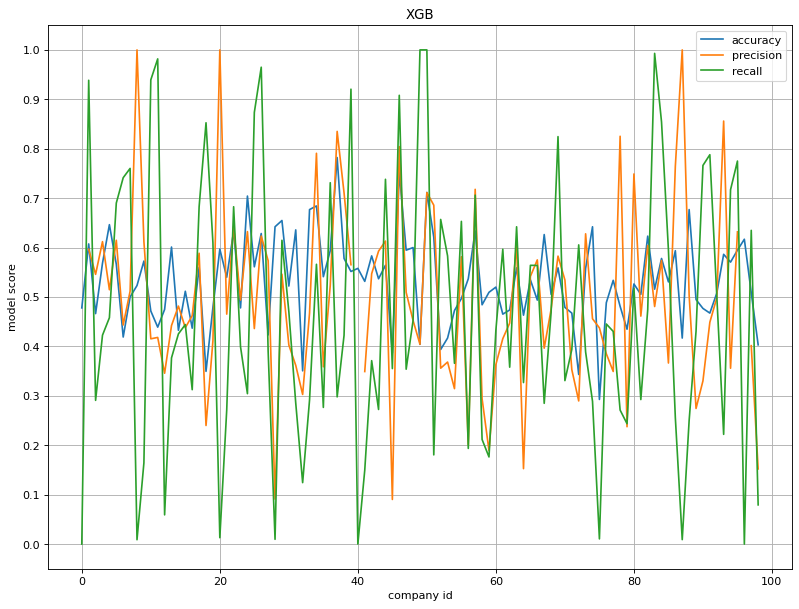

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.title("XGB")
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores_xgb_naive, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

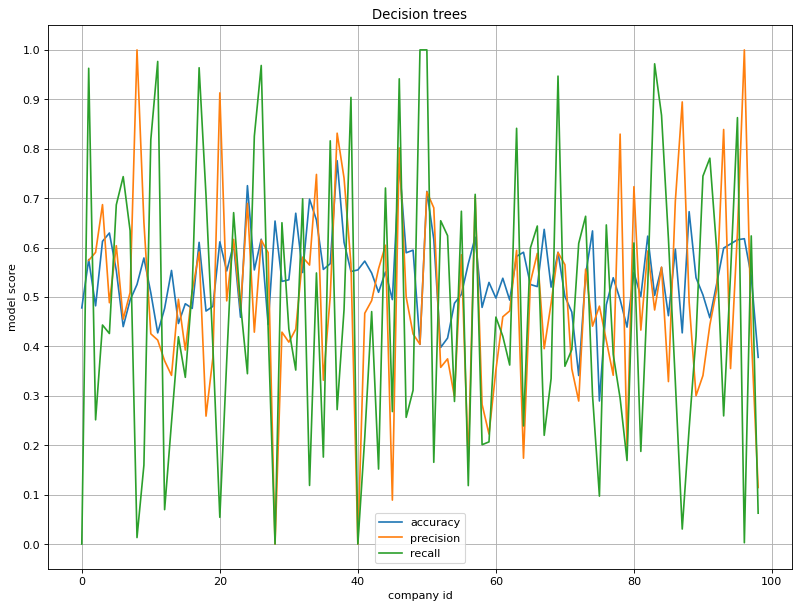

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.title("Decision trees")
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores_dec_tree_naive, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

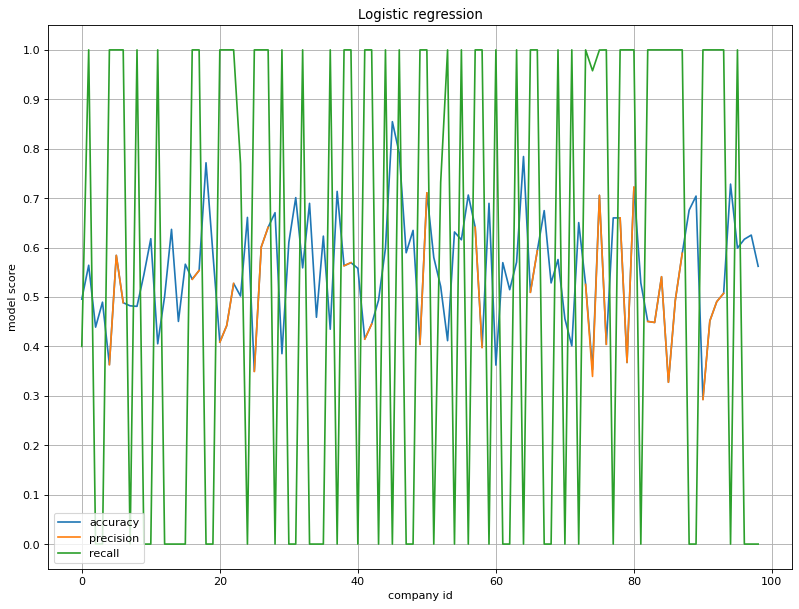

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.title("Logistic regression")
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores_log_reg_naive, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

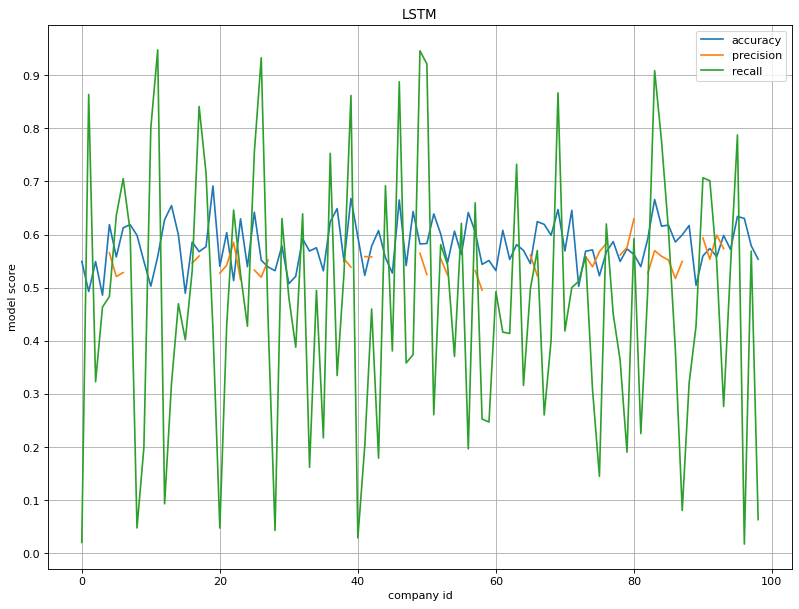

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("LSTM")
for i in range(3):
    plt.plot(np.sum(comp_scores_lstm_naive, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_all=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_all=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_all=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_all=np.zeros((len(list_of_companies_number),5, 3))
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_all[comp_id,i,0], comp_scores_log_reg_all[comp_id,i,1],comp_scores_log_reg_all[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_dec_tree_all[comp_id,i,0], comp_scores_dec_tree_all[comp_id,i,1],comp_scores_dec_tree_all[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_xgb_all[comp_id,i,0], comp_scores_xgb_all[comp_id,i,1],comp_scores_xgb_all[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_lstm_all[comp_id,i,0], comp_scores_lstm_all[comp_id,i,1],comp_scores_lstm_all[comp_id,i,2]=LSTM(np.copy(X_mom), np.copy(y),split_percent)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.5465790711550798
order_inbalance   -1.7506795587312483
vwaps_buy   1.7055321301347057
vwaps_sell   -0.18142400298513256
s2f_impact_buy   -0.2566587351600228
s2f_impact_sell   0.6053925455246358
trading_volumes   -1.3341085282994656
vwaps_order_sizes_buy   -0.1975686453964368
vwaps_order_sizes_sell   0.10213171446689837
s2f_order_sizes_buy   -0.1975686453964368
s2f_order_sizes_sell   0.10213171446689837
next_trade_time   -0.6875439755016797
next_trade_size   0.9637430455180517
next_trade_price   1.4070969913619433
[[145 136]
 [351 318]]
[[122 129]
 [374 325]]
[11:00:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[135 126]
 [361 328]]
Coeffici

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:00:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[124 119]
 [372 335]]
Coefficient impact:
true_price   -1.5469190153294272
order_inbalance   -1.7507464982630745
vwaps_buy   1.705009283836133
vwaps_sell   -0.18144628056000164
s2f_impact_buy   -0.2568773733901499
s2f_impact_sell   0.6051552233900264
trading_volumes   -1.3341019691872125
vwaps_order_sizes_buy   -0.197708711808792
vwaps_order_sizes_sell   0.10221856966174163
s2f_order_sizes_buy   -0.197708711808792
s2f_order_sizes_sell   0.10221856966174163
next_trade_time   -0.6876806231836607
next_trade_size   0.9634388489149616
next_trade_price   1.407107976903071
[[145 136]
 [351 318]]
[[146 144]
 [350 310]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:00:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[135 143]
 [361 311]]
Coefficient impact:
true_price   -1.5467186862071156
order_inbalance   -1.7506088491363598
vwaps_buy   1.7054315187061357
vwaps_sell   -0.18138132052307243
s2f_impact_buy   -0.2567054286226025
s2f_impact_sell   0.605338545032216
trading_volumes   -1.3339909788984285
vwaps_order_sizes_buy   -0.19764044460660526
vwaps_order_sizes_sell   0.10223841691999193
s2f_order_sizes_buy   -0.19764044460660526
s2f_order_sizes_sell   0.10223841691999193
next_trade_time   -0.6877667214273179
next_trade_size   0.9638508246052658
next_trade_price   1.4068948899448255
[[145 136]
 [351 318]]
[[139 124]
 [357 330]]
[11:00:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[152 140]
 [344 314]]
Coefficient impact:
true_price   -1.5452623577967637
order_inbalance   -1.7503787212479527
vwaps_buy   1.7053551297040408
vwaps_sell   -0.18133078434987723
s2f_impact_buy   -0.25640870084575046
s2f_impact_sell   0.6054073989224987
trading_volumes   -1.3342578862640981
vwaps_order_sizes_buy   -0.19769173023738545
vwaps_order_sizes_sell   0.10217794193213135
s2f_order_sizes_buy   -0.19769173023738545
s2f_order_sizes_sell   0.10217794193213135
next_trade_time   -0.6876767202954617
next_trade_size   0.963730419031765
next_trade_price   1.4070491065258572
[[146 136]
 [350 318]]
[[130 123]
 [366 331]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:00:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6190476190476191
Recall:
0.05241935483870968
[[133 147]
 [363 307]]
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.1959614787288526
order_inbalance   0.44770663753652107
vwaps_buy   0.721341083047113
vwaps_sell   1.739862925758274
s2f_impact_buy   1.3202565226985983
s2f_impact_sell   0.4330273994669199
trading_volumes   -2.3748909661042403
vwaps_order_sizes_buy   0.9845104223974961
vwaps_order_sizes_sell   -0.22584462800988914
s2f_order_sizes_buy   0.9845104223974961
s2f_order_sizes_sell   -0.22584462800988914
next_trade_time   0

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[495 354]
 [ 41  60]]
Coefficient impact:
true_price   -3.1969162109143814
order_inbalance   0.44749624478518824
vwaps_buy   0.7203791934254014
vwaps_sell   1.7394571975696562
s2f_impact_buy   1.3200477981679977
s2f_impact_sell   0.43301816577903185
trading_volumes   -2.374899616042775
vwaps_order_sizes_buy   0.9840429927359005
vwaps_order_sizes_sell   -0.22561893664763039
s2f_order_sizes_buy   0.9840429927359005
s2f_order_sizes_sell   -0.22561893664763039
next_trade_time   0.7673485875362941
next_trade_size   1.0320028838567363
next_trade_price   -0.2446957420906968
[[523 404]
 [ 13  10]]
[[497 348]
 [ 39  66]]
[11:00:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[497 347]
 [ 39  67]]
Coefficient impact:
true_price   -3.18292148750134
order_inbalance   0.4442925789866951
vwaps_buy   0.7251892422457036
vwaps_sell   1.7388230203934671
s2f_impact_buy   1.3193921649822087
s2f_impact_sell   0.43300879212356364
trading_volumes   -2.3765128984217156
vwaps_order_sizes_buy   0.9831160211017858
vwaps_order_sizes_sell   -0.22651943681265982
s2f_order_sizes_buy   0.9831160211017858
s2f_order_sizes_sell   -0.22651943681265982
next_trade_time   0.7688551415359939
next_trade_size   1.0313435476046406
next_trade_price   -0.2445950669944261
[[524 404]
 [ 12  10]]
[[498 349]
 [ 38  65]]
[11:00:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[499 348]
 [ 37  66]]
Coefficient impact:
true_price   -3.1963197731428488
order_inbalance   0.4480666015070353
vwaps_buy   0.7207860840571644
vwaps_sell   1.739161775675546
s2f_impact_buy   1.3197307535550085
s2f_impact_sell   0.43267471344309566
trading_volumes   -2.3762232035256665
vwaps_order_sizes_buy   0.9834866345573441
vwaps_order_sizes_sell   -0.22639952429103563
s2f_order_sizes_buy   0.9834866345573441
s2f_order_sizes_sell   -0.22639952429103563
next_trade_time   0.7681362096484567
next_trade_size   1.0310616045651426
next_trade_price   -0.24520317339668518
[[523 404]
 [ 13  10]]
[[500 354]
 [ 36  60]]
[11:00:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[495 355]
 [ 41  59]]
Coefficient impact:
true_price   -3.1968287610482893
order_inbalance   0.4482624115455591
vwaps_buy   0.7206859244248732
vwaps_sell   1.7396034689272322
s2f_impact_buy   1.3187501596440612
s2f_impact_sell   0.4331381980114992
trading_volumes   -2.375179144667705
vwaps_order_sizes_buy   0.9845717281229931
vwaps_order_sizes_sell   -0.22669365630931185
s2f_order_sizes_buy   0.9845717281229931
s2f_order_sizes_sell   -0.22669365630931185
next_trade_time   0.7675219285371986
next_trade_size   1.0325498868283591
next_trade_price   -0.24506767820685976
[[523 404]
 [ 13  10]]
[[496 350]
 [ 40  64]]
[11:00:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5882352941176471
Recall:
0.9514925373134329
[[501 350]
 [ 35  64]]
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -0.15406885133450354
order_inbalance   -0.5294873059142166
vwaps_buy   -1.0514646669888816
vwaps_sell   0.6458714145020049
s2f_impact_buy   0.4044654326040309
s2f_impact_sell   -0.9276667901432875
trading_volumes   -1.4360664658779974
vwaps_order_sizes_buy   0.15086075988974848
vwaps_order_sizes_sell   0.5689834505385112
s2f_order_sizes_buy   0.15086075988974848
s2f_order_sizes_sell   0.5689834505385112
next_trade_time   -2.1664775803701275
next_trade_size   -0.6043767310193912
next_trade_price   -0.14566380777905938
[[299 257]
 [234 160]]
[[173 113]
 [360 304]]
[11:00:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[168 105]
 [365 312]]
Coefficient impact:
true_price   -0.15430297807192347
order_inbalance   -0.5285869522916201
vwaps_buy   -1.0517021396712756
vwaps_sell   0.6459753287990088
s2f_impact_buy   0.40498303704030697
s2f_impact_sell   -0.9262055789957693
trading_volumes   -1.4354695654011744
vwaps_order_sizes_buy   0.1507177623503173
vwaps_order_sizes_sell   0.568137855467482
s2f_order_sizes_buy   0.1507177623503173
s2f_order_sizes_sell   0.568137855467482
next_trade_time   -2.1654940815603774
next_trade_size   -0.6042331011718415
next_trade_price   -0.1458813658771541
[[300 258]
 [233 159]]
[[165 100]
 [368 317]]
[11:00:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[180 108]
 [353 309]]
Coefficient impact:
true_price   -0.15322554104542024
order_inbalance   -0.5292870099121404
vwaps_buy   -1.0516759687933526
vwaps_sell   0.6451970391125441
s2f_impact_buy   0.40494846212575386
s2f_impact_sell   -0.9265519905078569
trading_volumes   -1.4363296155494092
vwaps_order_sizes_buy   0.15101663665853793
vwaps_order_sizes_sell   0.5682524034372133
s2f_order_sizes_buy   0.15101663665853793
s2f_order_sizes_sell   0.5682524034372133
next_trade_time   -2.1656708878451596
next_trade_size   -0.605319194596152
next_trade_price   -0.14592871901825183
[[300 258]
 [233 159]]
[[173 113]
 [360 304]]
[11:00:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[167 103]
 [366 314]]
Coefficient impact:
true_price   -0.1521055422389219
order_inbalance   -0.5294137573450282
vwaps_buy   -1.0517893898664372
vwaps_sell   0.644403388621248
s2f_impact_buy   0.4044314150799353
s2f_impact_sell   -0.9286124623811323
trading_volumes   -1.4369784205727982
vwaps_order_sizes_buy   0.15051168851849192
vwaps_order_sizes_sell   0.5690509506952591
s2f_order_sizes_buy   0.15051168851849192
s2f_order_sizes_sell   0.5690509506952591
next_trade_time   -2.1647312304458475
next_trade_size   -0.6037507778203032
next_trade_price   -0.14642887838823251
[[300 258]
 [233 159]]
[[173 100]
 [360 317]]
[11:00:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[164  99]
 [369 318]]
Coefficient impact:
true_price   -0.15364298609229157
order_inbalance   -0.5283682030368495
vwaps_buy   -1.0504918382542743
vwaps_sell   0.645394598722173
s2f_impact_buy   0.40469140452364644
s2f_impact_sell   -0.9267552339059874
trading_volumes   -1.4357903853138851
vwaps_order_sizes_buy   0.15079901939357873
vwaps_order_sizes_sell   0.5685347359129046
s2f_order_sizes_buy   0.15079901939357873
s2f_order_sizes_sell   0.5685347359129046
next_trade_time   -2.165997453453842
next_trade_size   -0.6040692471766713
next_trade_price   -0.14707033052135535
[[300 258]
 [233 159]]
[[172  99]
 [361 318]]
[11:00:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5963302752293578
Recall:
0.24390243902439024
[[170  99]
 [363 318]]
3
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.41791071574328
order_inbalance   0.9071600252437443
vwaps_buy   -0.05842723800298531
vwaps_sell   0.11277754252428464
s2f_impact_buy   -0.2126993737689446
s2f_impact_sell   -0.412557904938373
trading_volumes   0.9020578293050199
vwaps_order_sizes_buy   0.6676542382194869
vwaps_order_sizes_sell   -0.09688311107516039
s2f_order_sizes_buy   0.6676542382194869
s2f_order_sizes_sell   -0.09688311107516039
next_trade_time   0.12231474068486811
next_trade_size   1.537209402128723
next_trade_price   -0.18098060167115393
[[ 77  44]
 [408 421]]
[[156 128]
 [329 337]]
[11:01:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[183 176]
 [302 289]]
Coefficient

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[169 134]
 [316 331]]
Coefficient impact:
true_price   -0.4178982410367046
order_inbalance   0.9066606928392125
vwaps_buy   -0.05887406126048705
vwaps_sell   0.11269613386156593
s2f_impact_buy   -0.2122414192560547
s2f_impact_sell   -0.4125721562777567
trading_volumes   0.902047254046418
vwaps_order_sizes_buy   0.6687336462989475
vwaps_order_sizes_sell   -0.0972485232732791
s2f_order_sizes_buy   0.6687336462989475
s2f_order_sizes_sell   -0.0972485232732791
next_trade_time   0.12293689247098327
next_trade_size   1.5369538039851103
next_trade_price   -0.18086566088181394
[[ 77  44]
 [408 421]]
[[188 160]
 [297 305]]
[11:01:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[165 122]
 [320 343]]
Coefficient impact:
true_price   -0.4173566688787851
order_inbalance   0.9070275409016826
vwaps_buy   -0.05886625259160476
vwaps_sell   0.11274277561714287
s2f_impact_buy   -0.21162969304693302
s2f_impact_sell   -0.41260419585816777
trading_volumes   0.9021915873969208
vwaps_order_sizes_buy   0.6687531332779814
vwaps_order_sizes_sell   -0.0970530430412634
s2f_order_sizes_buy   0.6687531332779814
s2f_order_sizes_sell   -0.0970530430412634
next_trade_time   0.12275645811656541
next_trade_size   1.5370023162517878
next_trade_price   -0.18003422880277833
[[ 77  44]
 [408 421]]
[[190 161]
 [295 304]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:01:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[180 161]
 [305 304]]
Coefficient impact:
true_price   -0.4189341344270411
order_inbalance   0.9068091855726013
vwaps_buy   -0.05873118192246501
vwaps_sell   0.11280154390289415
s2f_impact_buy   -0.21270523605604663
s2f_impact_sell   -0.41242420416512104
trading_volumes   0.9019299026154791
vwaps_order_sizes_buy   0.6690175309859452
vwaps_order_sizes_sell   -0.09739978667960258
s2f_order_sizes_buy   0.6690175309859452
s2f_order_sizes_sell   -0.09739978667960258
next_trade_time   0.12259341148382022
next_trade_size   1.5377110002231262
next_trade_price   -0.18101434964785076
[[ 77  44]
 [408 421]]
[[186 172]
 [299 293]]
[11:0

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5436893203883495
Recall:
0.3463917525773196
[[189 161]
 [296 304]]
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.39222891284639
order_inbalance   1.3157794512080527
vwaps_buy   -0.6116876008743152
vwaps_sell   0.5131771124024399
s2f_impact_buy   1.1284613775578498
s2f_impact_sell   -0.9008544082482816
trading_volumes   -0.2516966778470752
vwaps_order_sizes_buy   1.0243439694169414
vwaps_order_sizes_sell   -0.0021929977822728684
s2f_order_sizes_buy   1.0243439694169414
s2f_order_sizes_sell   -0.0021929977822728684
next_trade_time   -1.4418557686977107
next_trade_size   -0.02912133075224987
next_trade_price   1.0321377527618651
[[175 377]
 [170 228]]
[[173 204]
 [172 401]]
[11:01:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[170 207]
 [175 398]]
Coeffi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[176 210]
 [169 395]]
Coefficient impact:
true_price   -1.3916510230850043
order_inbalance   1.31534203768401
vwaps_buy   -0.6098452731649157
vwaps_sell   0.512440451070508
s2f_impact_buy   1.128058965480314
s2f_impact_sell   -0.900074953231329
trading_volumes   -0.2513267241882615
vwaps_order_sizes_buy   1.024481491969086
vwaps_order_sizes_sell   -0.0017659215983424207
s2f_order_sizes_buy   1.024481491969086
s2f_order_sizes_sell   -0.0017659215983424207
next_trade_time   -1.4418257028324049
next_trade_size   -0.02666652526430545
next_trade_price   1.031393785890742
[[175 381]
 [170 224]]
[[180 215]
 [165 390]]
[11:01:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[174 194]
 [171 411]]
Coefficient impact:
true_price   -1.3917691355508102
order_inbalance   1.3155739210603092
vwaps_buy   -0.6129973576705923
vwaps_sell   0.5121775187946339
s2f_impact_buy   1.129324484297778
s2f_impact_sell   -0.9008320369353952
trading_volumes   -0.2510877944682717
vwaps_order_sizes_buy   1.024571266312767
vwaps_order_sizes_sell   -0.0016016402753975699
s2f_order_sizes_buy   1.024571266312767
s2f_order_sizes_sell   -0.0016016402753975699
next_trade_time   -1.442227063915696
next_trade_size   -0.027294877912921317
next_trade_price   1.0306235745768382
[[176 381]
 [169 224]]
[[167 203]
 [178 402]]
[11:01:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[168 199]
 [177 406]]
Coefficient impact:
true_price   -1.392330080855847
order_inbalance   1.315464595262234
vwaps_buy   -0.6127705616289821
vwaps_sell   0.5123117591538343
s2f_impact_buy   1.1292903200034476
s2f_impact_sell   -0.8999810021716053
trading_volumes   -0.25136953788082633
vwaps_order_sizes_buy   1.0243369438303966
vwaps_order_sizes_sell   -0.0017219057505270092
s2f_order_sizes_buy   1.0243369438303966
s2f_order_sizes_sell   -0.0017219057505270092
next_trade_time   -1.441790316063499
next_trade_size   -0.027597852054398027
next_trade_price   1.0307637882865774
[[175 380]
 [170 225]]
[[179 208]
 [166 397]]
[11:01:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251798561151079
Recall:
0.42318840579710143
[[174 203]
 [171 402]]
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -2.760592344335346
order_inbalance   -0.3758929105187452
vwaps_buy   0.7110728322667587
vwaps_sell   -0.0673872082179125
s2f_impact_buy   1.0215621109665425
s2f_impact_sell   0.6876563011693873
trading_volumes   -1.1858339482904297
vwaps_order_sizes_buy   1.2565198687668635
vwaps_order_sizes_sell   0.25641984122323874
s2f_order_sizes_buy   1.2565198687668635
s2f_order_sizes_sell   0.25641984122323874
next_trade_time   0.200699626007484
next_trade_size   1.6149224284602604
next_trade_price   -1.4203043858348612
[[551 374]
 [  4  21]]
[[381 233]
 [174 162]]
[11:01:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[384 239]
 [171 156]]
Coefficient impact:
true_price   -2.7594753545532513
order_inbalance   -0.3753563105050864
vwaps_buy   0.7106580455580361
vwaps_sell   -0.06960307763474227
s2f_impact_buy   1.0217164228911932
s2f_impact_sell   0.6875911023150457
trading_volumes   -1.184786480941701
vwaps_order_sizes_buy   1.256297657062928
vwaps_order_sizes_sell   0.25779402775859306
s2f_order_sizes_buy   1.256297657062928
s2f_order_sizes_sell   0.25779402775859306
next_trade_time   0.2014782709317294
next_trade_size   1.6174979237311709
next_trade_price   -1.4183243019641052
[[551 374]
 [  4  21]]
[[382 237]
 [173 158]]
[11:01:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[392 235]
 [163 160]]
Coefficient impact:
true_price   -2.759907605651466
order_inbalance   -0.37598944190177824
vwaps_buy   0.7104932226043306
vwaps_sell   -0.0697680596272598
s2f_impact_buy   1.0226355686366122
s2f_impact_sell   0.6875881586007787
trading_volumes   -1.1859397516975452
vwaps_order_sizes_buy   1.2563079534654522
vwaps_order_sizes_sell   0.2565000529437155
s2f_order_sizes_buy   1.2563079534654522
s2f_order_sizes_sell   0.2565000529437155
next_trade_time   0.20082180777759998
next_trade_size   1.6146433162557812
next_trade_price   -1.4186030881897138
[[551 374]
 [  4  21]]
[[381 239]
 [174 156]]
[11:01:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[382 233]
 [173 162]]
Coefficient impact:
true_price   -2.761337986319577
order_inbalance   -0.3757275303932567
vwaps_buy   0.7111866681125621
vwaps_sell   -0.06746973747758969
s2f_impact_buy   1.0213354943838
s2f_impact_sell   0.6874858142154094
trading_volumes   -1.1865167200957034
vwaps_order_sizes_buy   1.2563337024089356
vwaps_order_sizes_sell   0.2561484290228663
s2f_order_sizes_buy   1.2563337024089356
s2f_order_sizes_sell   0.2561484290228663
next_trade_time   0.20079211419468218
next_trade_size   1.6149036958081084
next_trade_price   -1.4199654937471493
[[549 373]
 [  6  22]]
[[392 231]
 [163 164]]
[11:01:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[392 240]
 [163 155]]
Coefficient impact:
true_price   -2.7614272098477834
order_inbalance   -0.3762814892841529
vwaps_buy   0.7106118758408819
vwaps_sell   -0.0679056422108358
s2f_impact_buy   1.0213624879069456
s2f_impact_sell   0.6866618974704534
trading_volumes   -1.1866993324369999
vwaps_order_sizes_buy   1.2561099207083006
vwaps_order_sizes_sell   0.2565880355235771
s2f_order_sizes_buy   1.2561099207083006
s2f_order_sizes_sell   0.2565880355235771
next_trade_time   0.20177214239560706
next_trade_size   1.6156737799433591
next_trade_price   -1.420805263984414
[[550 374]
 [  5  21]]
[[383 242]
 [172 153]]
[11:01:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6156351791530945
Recall:
0.6810810810810811
[[380 245]
 [175 150]]
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -2.9135934192138624
order_inbalance   0.1253430158209441
vwaps_buy   0.3956450467265245
vwaps_sell   1.7637709948460818
s2f_impact_buy   0.5946420737623075
s2f_impact_sell   -0.6422861435236521
trading_volumes   -2.3181939699863947
vwaps_order_sizes_buy   -0.7569035802744006
vwaps_order_sizes_sell   -0.16713102410926353
s2f_order_sizes_buy   -0.7569035802744006
s2f_order_sizes_sell   -0.16713102410926353
next_trade_time   1.6031588143203679
next_trade_size   -1.1181373146139426
next_trade_price   1.6061406889208438
[[367 364]
 [ 97 122]]
[[379 351]
 [ 85 135]]
[11:01:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[377 353]
 [ 87 133]]
Coefficient impact:
true_price   -2.9141435385416834
order_inbalance   0.12264858727587835
vwaps_buy   0.39690339982149603
vwaps_sell   1.7636483495406912
s2f_impact_buy   0.5936667706676649
s2f_impact_sell   -0.6431027468459596
trading_volumes   -2.3193593664317493
vwaps_order_sizes_buy   -0.7576090298232798
vwaps_order_sizes_sell   -0.1675553442100955
s2f_order_sizes_buy   -0.7576090298232798
s2f_order_sizes_sell   -0.1675553442100955
next_trade_time   1.6034022852655159
next_trade_size   -1.1179434264755554
next_trade_price   1.6053751566830226
[[367 364]
 [ 97 122]]
[[379 354]
 [ 85 132]]
[11:01:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[387 372]
 [ 77 114]]
Coefficient impact:
true_price   -2.9124596760982824
order_inbalance   0.12318966295216886
vwaps_buy   0.3983021887669351
vwaps_sell   1.7644221469134864
s2f_impact_buy   0.5935694533273135
s2f_impact_sell   -0.6447354643917721
trading_volumes   -2.319355076079075
vwaps_order_sizes_buy   -0.7581277858554966
vwaps_order_sizes_sell   -0.16719008773102098
s2f_order_sizes_buy   -0.7581277858554966
s2f_order_sizes_sell   -0.16719008773102098
next_trade_time   1.6026346877811375
next_trade_size   -1.1168824827473134
next_trade_price   1.6065266559098346
[[367 364]
 [ 97 122]]
[[381 354]
 [ 83 132]]
[11:01:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[381 356]
 [ 83 130]]
Coefficient impact:
true_price   -2.9126182795502045
order_inbalance   0.1238661876262173
vwaps_buy   0.39587628498832106
vwaps_sell   1.7637042734999044
s2f_impact_buy   0.593556879933837
s2f_impact_sell   -0.6435300493208114
trading_volumes   -2.3189422210066764
vwaps_order_sizes_buy   -0.7578239289958536
vwaps_order_sizes_sell   -0.16737394859523494
s2f_order_sizes_buy   -0.7578239289958536
s2f_order_sizes_sell   -0.16737394859523494
next_trade_time   1.6028801128577514
next_trade_size   -1.1184133848406075
next_trade_price   1.6050333553476097
[[367 364]
 [ 97 122]]
[[380 363]
 [ 84 123]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:01:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[382 366]
 [ 82 120]]
Coefficient impact:
true_price   -2.9147931385938834
order_inbalance   0.12387112545685108
vwaps_buy   0.3976532923102445
vwaps_sell   1.7639432496573897
s2f_impact_buy   0.5936063043419227
s2f_impact_sell   -0.6423238712234384
trading_volumes   -2.3187057405900977
vwaps_order_sizes_buy   -0.7576444170107777
vwaps_order_sizes_sell   -0.1679118036093172
s2f_order_sizes_buy   -0.7576444170107777
s2f_order_sizes_sell   -0.1679118036093172
next_trade_time   1.6042834289051469
next_trade_size   -1.117795034559538
next_trade_price   1.604013256640763
[[367 364]
 [ 97 122]]
[[388 367]
 [ 76 119]]
[11:01:24] WA

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4891826923076923
Recall:
0.8771551724137931
[[387 368]
 [ 77 118]]
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.7009136888657745
order_inbalance   -0.3590315740508503
vwaps_buy   0.1257755744026175
vwaps_sell   1.7379498381486758
s2f_impact_buy   0.3219985986854719
s2f_impact_sell   1.2396523312609524
trading_volumes   -2.7619055421198517
vwaps_order_sizes_buy   -0.26860837085403466
vwaps_order_sizes_sell   0.6555287274632237
s2f_order_sizes_buy   -0.26860837085403466
s2f_order_sizes_sell   0.6555287274632237
next_trade_time   -1.1130653560375656
next_trade_size   2.064731113211681
next_trade_price   1.3912115419346576
[[ 82  85]
 [410 373]]
[[230 276]
 [262 182]]
[11:01:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[256 285]
 [236 173]]
Coefficient impact:
true_price   -2.7039816522028524
order_inbalance   -0.35899727365229395
vwaps_buy   0.12518700310026667
vwaps_sell   1.7384118100288217
s2f_impact_buy   0.32208294943961024
s2f_impact_sell   1.2401423747390294
trading_volumes   -2.76140941726626
vwaps_order_sizes_buy   -0.2684401703493621
vwaps_order_sizes_sell   0.6556013378202902
s2f_order_sizes_buy   -0.2684401703493621
s2f_order_sizes_sell   0.6556013378202902
next_trade_time   -1.113889728853506
next_trade_size   2.0638931691581495
next_trade_price   1.3915126253405785
[[ 82  85]
 [410 373]]
[[269 283]
 [223 175]]
[11:01:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[276 293]
 [216 165]]
Coefficient impact:
true_price   -2.702650565600143
order_inbalance   -0.35896893851928446
vwaps_buy   0.1256877096192276
vwaps_sell   1.7381122873385146
s2f_impact_buy   0.32331284313989644
s2f_impact_sell   1.2395216850303878
trading_volumes   -2.7618278016647544
vwaps_order_sizes_buy   -0.26931954385071516
vwaps_order_sizes_sell   0.6556220380282732
s2f_order_sizes_buy   -0.26931954385071516
s2f_order_sizes_sell   0.6556220380282732
next_trade_time   -1.1134468932783974
next_trade_size   2.064182741405736
next_trade_price   1.391620563984912
[[ 82  85]
 [410 373]]
[[238 261]
 [254 197]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:01:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[246 275]
 [246 183]]
Coefficient impact:
true_price   -2.6964406278485025
order_inbalance   -0.3589143053802192
vwaps_buy   0.1261179508411033
vwaps_sell   1.7386093441028603
s2f_impact_buy   0.32253906129551113
s2f_impact_sell   1.2389611945660433
trading_volumes   -2.761201231915032
vwaps_order_sizes_buy   -0.26882717050184207
vwaps_order_sizes_sell   0.6562041931491718
s2f_order_sizes_buy   -0.26882717050184207
s2f_order_sizes_sell   0.6562041931491718
next_trade_time   -1.1119053154768463
next_trade_size   2.0644131391883476
next_trade_price   1.391224433045273
[[ 83  86]
 [409 372]]
[[274 292]
 [218 166]]
[11:01:29] WA

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[248 293]
 [244 165]]
Coefficient impact:
true_price   -2.7018334571783913
order_inbalance   -0.3591093237722148
vwaps_buy   0.12527255287853195
vwaps_sell   1.738449372657119
s2f_impact_buy   0.32271403215479794
s2f_impact_sell   1.2383537148026977
trading_volumes   -2.7615897871165176
vwaps_order_sizes_buy   -0.26822584016569506
vwaps_order_sizes_sell   0.6554164356213643
s2f_order_sizes_buy   -0.26822584016569506
s2f_order_sizes_sell   0.6554164356213643
next_trade_time   -1.1140095268577437
next_trade_size   2.0649010294056107
next_trade_price   1.3908042835827912
[[ 83  86]
 [409 372]]
[[238 271]
 [254 187]]
[11:01:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4752650176678445
Recall:
0.5467479674796748
[[263 283]
 [229 175]]
8
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
Coefficient impact:
true_price   -1.9404507810143676
order_inbalance   -0.41839555188080185
vwaps_buy   -0.9911325753931022
vwaps_sell   0.9608259918561158
s2f_impact_buy   1.120663263369526
s2f_impact_sell   -0.820843570039913
trading_volumes   -0.772256312199012
vwaps_order_sizes_buy   -0.9116814418368516
vwaps_order_sizes_sell   1.46784308700643
s2f_order_sizes_buy   -0.9116814418368516
s2f_order_sizes_sell   1.46784308700643
next_trade_time   0.7659259385212221
next_trade_size   -1.6217807311303432
next_trade_price   0.6422759984877405
[[397 421]
 [ 60  72]]
[[ 50 113]
 [407 380]]
[11:01:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was chang

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 60 166]
 [397 327]]
Coefficient impact:
true_price   -1.941508957072949
order_inbalance   -0.41821959202732384
vwaps_buy   -0.9915895815264631
vwaps_sell   0.9599389610567353
s2f_impact_buy   1.122156847790239
s2f_impact_sell   -0.8213060087186566
trading_volumes   -0.7719679612665215
vwaps_order_sizes_buy   -0.9114152568986575
vwaps_order_sizes_sell   1.4685337884708
s2f_order_sizes_buy   -0.9114152568986575
s2f_order_sizes_sell   1.4685337884708
next_trade_time   0.7650850226973174
next_trade_size   -1.6208147082223696
next_trade_price   0.6439263535106073
[[397 421]
 [ 60  72]]
[[ 55 105]
 [402 388]]
[11:01:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 53 144]
 [404 349]]
Coefficient impact:
true_price   -1.9417235472014813
order_inbalance   -0.417988811004557
vwaps_buy   -0.9922654663376912
vwaps_sell   0.9599899444116505
s2f_impact_buy   1.1214501004866826
s2f_impact_sell   -0.8208033729531983
trading_volumes   -0.7745415741860427
vwaps_order_sizes_buy   -0.9114385599640976
vwaps_order_sizes_sell   1.4683524935415047
s2f_order_sizes_buy   -0.9114385599640976
s2f_order_sizes_sell   1.4683524935415047
next_trade_time   0.7638740966127081
next_trade_size   -1.621916752207264
next_trade_price   0.6432516263065098
[[395 420]
 [ 62  73]]
[[ 67 144]
 [390 349]]
[11:01:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 57 107]
 [400 386]]
Coefficient impact:
true_price   -1.9412961056887994
order_inbalance   -0.4195022348186171
vwaps_buy   -0.9917933013972231
vwaps_sell   0.9602493342155797
s2f_impact_buy   1.1209615072129178
s2f_impact_sell   -0.8212004239437187
trading_volumes   -0.773045742936463
vwaps_order_sizes_buy   -0.9122014205074627
vwaps_order_sizes_sell   1.4682633432413077
s2f_order_sizes_buy   -0.9122014205074627
s2f_order_sizes_sell   1.4682633432413077
next_trade_time   0.7642837346605452
next_trade_size   -1.6214211371267464
next_trade_price   0.6425703450845704
[[396 420]
 [ 61  73]]
[[ 60 102]
 [397 391]]
[11:01:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[106 188]
 [351 305]]
Coefficient impact:
true_price   -1.9409356351269709
order_inbalance   -0.4186619934132748
vwaps_buy   -0.9925952785737979
vwaps_sell   0.9601117786882858
s2f_impact_buy   1.120207091021775
s2f_impact_sell   -0.8194758295589423
trading_volumes   -0.7725082042247917
vwaps_order_sizes_buy   -0.9120104509467696
vwaps_order_sizes_sell   1.468442365795508
s2f_order_sizes_buy   -0.9120104509467696
s2f_order_sizes_sell   1.468442365795508
next_trade_time   0.7652028100941443
next_trade_size   -1.6222628417814426
next_trade_price   0.6435618392659508
[[397 422]
 [ 60  71]]
[[ 97 186]
 [360 307]]
[11:01:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.26174496644295303
Recall:
0.08533916849015317
[[ 72 181]
 [385 312]]
9
25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   -1.2982234990723882
order_inbalance   1.0392824381327113
vwaps_buy   -0.6446863678198939
vwaps_sell   0.17661671002602863
s2f_impact_buy   0.6915306155441429
s2f_impact_sell   0.3488046634123516
trading_volumes   0.21328375284310894
vwaps_order_sizes_buy   0.12116941978762388
vwaps_order_sizes_sell   1.4112390382448925
s2f_order_sizes_buy   0.12116941978762388
s2f_order_sizes_sell   1.4112390382448925
next_trade_time   -0.8843011341701421
next_trade_size   0.09218467421196054
next_trade_price   0.02479870134513446
[[ 90  95]
 [342 423]]
[[107 103]
 [325 415]]
[11:01:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[122 105]
 [310 413]]
Coefficient impact:
true_price   -1.2964836239982487
order_inbalance   1.0392060753764578
vwaps_buy   -0.6441733822524318
vwaps_sell   0.1761830757672531
s2f_impact_buy   0.6917321159181354
s2f_impact_sell   0.34850624465148067
trading_volumes   0.2126889566725524
vwaps_order_sizes_buy   0.12116120338150302
vwaps_order_sizes_sell   1.4105732915727587
s2f_order_sizes_buy   0.12116120338150302
s2f_order_sizes_sell   1.4105732915727587
next_trade_time   -0.8847442995479367
next_trade_size   0.09204083013585664
next_trade_price   0.025333289467866258
[[ 90  95]
 [342 423]]
[[113 132]
 [319 386]]
[11:01:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[118 110]
 [314 408]]
Coefficient impact:
true_price   -1.2977128993910159
order_inbalance   1.038982334969136
vwaps_buy   -0.6441077462560908
vwaps_sell   0.17597356468844347
s2f_impact_buy   0.6909714712807115
s2f_impact_sell   0.34848145810283593
trading_volumes   0.21293189460277395
vwaps_order_sizes_buy   0.1214258146558229
vwaps_order_sizes_sell   1.4106431815075786
s2f_order_sizes_buy   0.1214258146558229
s2f_order_sizes_sell   1.4106431815075786
next_trade_time   -0.8843686650871748
next_trade_size   0.09216582720554453
next_trade_price   0.02468888849636346
[[ 90  95]
 [342 423]]
[[106 103]
 [326 415]]
[11:01:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[132 124]
 [300 394]]
Coefficient impact:
true_price   -1.2974815092008196
order_inbalance   1.038682631855322
vwaps_buy   -0.644172653635132
vwaps_sell   0.17646074472248707
s2f_impact_buy   0.6913255203534594
s2f_impact_sell   0.34878326249269426
trading_volumes   0.21321961802720935
vwaps_order_sizes_buy   0.12121982809359548
vwaps_order_sizes_sell   1.410979223739275
s2f_order_sizes_buy   0.12121982809359548
s2f_order_sizes_sell   1.410979223739275
next_trade_time   -0.8843500603665371
next_trade_size   0.09165172114478068
next_trade_price   0.0244619280686466
[[ 90  95]
 [342 423]]
[[132 124]
 [300 394]]
[11:01:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[117 127]
 [315 391]]
Coefficient impact:
true_price   -1.2973522881893602
order_inbalance   1.0388737113031759
vwaps_buy   -0.6446816650809034
vwaps_sell   0.17713137766978518
s2f_impact_buy   0.6912117085226354
s2f_impact_sell   0.34788310224412766
trading_volumes   0.21300431293489566
vwaps_order_sizes_buy   0.12086346524340273
vwaps_order_sizes_sell   1.4105493712079475
s2f_order_sizes_buy   0.12086346524340273
s2f_order_sizes_sell   1.4105493712079475
next_trade_time   -0.8843222555416995
next_trade_size   0.09227444250709697
next_trade_price   0.025004862178115636
[[ 90  95]
 [342 423]]
[[120 133]
 [312 385]]
[11:01:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6521739130434783
Recall:
0.20833333333333334
[[120 112]
 [312 406]]
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.5067078181009048
order_inbalance   -0.11614483453744931
vwaps_buy   -0.15007419070120775
vwaps_sell   -0.3980399324106459
s2f_impact_buy   0.06065342349569438
s2f_impact_sell   0.4852871043501821
trading_volumes   -0.4022072814158414
vwaps_order_sizes_buy   1.1017150420560018
vwaps_order_sizes_sell   0.8988348446263938
s2f_order_sizes_buy   1.1017150420560018
s2f_order_sizes_sell   0.8988348446263938
next_trade_time   0.04597100464441708
next_trade_size   0.6559968266358107
next_trade_price   0.8233889095389425
[[ 16  11]
 [347 576]]
[[282 401]
 [ 81 186]]
[11:01:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the ob

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[279 414]
 [ 84 173]]
Coefficient impact:
true_price   -1.5085717366627807
order_inbalance   -0.1154223111751568
vwaps_buy   -0.1503802528420445
vwaps_sell   -0.39813941185805557
s2f_impact_buy   0.060505345077585114
s2f_impact_sell   0.4853188721640834
trading_volumes   -0.4022375580141391
vwaps_order_sizes_buy   1.1013706074620733
vwaps_order_sizes_sell   0.8996787015990374
s2f_order_sizes_buy   1.1013706074620733
s2f_order_sizes_sell   0.8996787015990374
next_trade_time   0.04634664058710353
next_trade_size   0.6553986247896819
next_trade_price   0.8237672207300485
[[ 16  11]
 [347 576]]
[[282 417]
 [ 81 170]]
[11:01:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[287 411]
 [ 76 176]]
Coefficient impact:
true_price   -1.5085912158575574
order_inbalance   -0.11563517347087855
vwaps_buy   -0.15003000871022412
vwaps_sell   -0.39807971260233715
s2f_impact_buy   0.06013780563335613
s2f_impact_sell   0.4851211927583311
trading_volumes   -0.4027022838525503
vwaps_order_sizes_buy   1.1011361262185055
vwaps_order_sizes_sell   0.8994551284167646
s2f_order_sizes_buy   1.1011361262185055
s2f_order_sizes_sell   0.8994551284167646
next_trade_time   0.04672194871658985
next_trade_size   0.6555558503393352
next_trade_price   0.8237458535881602
[[ 16  11]
 [347 576]]
[[277 420]
 [ 86 167]]
[11:01:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[281 420]
 [ 82 167]]
Coefficient impact:
true_price   -1.507436377218247
order_inbalance   -0.11556202711274524
vwaps_buy   -0.1496070356875503
vwaps_sell   -0.39837387316506656
s2f_impact_buy   0.060137413993158605
s2f_impact_sell   0.48451886494038143
trading_volumes   -0.4024674041350428
vwaps_order_sizes_buy   1.1018224378217045
vwaps_order_sizes_sell   0.8997094730444158
s2f_order_sizes_buy   1.1018224378217045
s2f_order_sizes_sell   0.8997094730444158
next_trade_time   0.0465697038879475
next_trade_size   0.6551770750877329
next_trade_price   0.8242823511985095
[[ 16  11]
 [347 576]]
[[284 409]
 [ 79 178]]
[11:01:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[279 403]
 [ 84 184]]
Coefficient impact:
true_price   -1.5095674839628372
order_inbalance   -0.11573519711159336
vwaps_buy   -0.14948250511436234
vwaps_sell   -0.39780812182459574
s2f_impact_buy   0.060228780948338285
s2f_impact_sell   0.4850911074344622
trading_volumes   -0.402619917372342
vwaps_order_sizes_buy   1.1016575429890723
vwaps_order_sizes_sell   0.8992499977274994
s2f_order_sizes_buy   1.1016575429890723
s2f_order_sizes_sell   0.8992499977274994
next_trade_time   0.046643282278195086
next_trade_size   0.6562037971102188
next_trade_price   0.8239641900743947
[[ 16  11]
 [347 576]]
[[285 406]
 [ 78 181]]
[11:01:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3911290322580645
Recall:
0.8016528925619835
[[287 415]
 [ 76 172]]
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.2457438817084965
order_inbalance   1.4709086953429298
vwaps_buy   -1.1578906945642695
vwaps_sell   0.17729105974046044
s2f_impact_buy   0.4439718288223642
s2f_impact_sell   -0.08120490098589471
trading_volumes   -0.7706084479248374
vwaps_order_sizes_buy   0.6037169456490505
vwaps_order_sizes_sell   0.3217469715055662
s2f_order_sizes_buy   0.6037169456490505
s2f_order_sizes_sell   0.3217469715055662
next_trade_time   1.3342888008864928
next_trade_size   0.42050020668916527
next_trade_price   1.1684570353059023
[[368 553]
 [ 17  12]]
[[332 497]
 [ 53  68]]
[11:01:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[333 483]
 [ 52  82]]
Coefficient impact:
true_price   0.24632923542467933
order_inbalance   1.4715007183449624
vwaps_buy   -1.1577333029556554
vwaps_sell   0.17762411364630648
s2f_impact_buy   0.44408551981750966
s2f_impact_sell   -0.08142391798897791
trading_volumes   -0.76941242486578
vwaps_order_sizes_buy   0.6038754309469118
vwaps_order_sizes_sell   0.3227523630897215
s2f_order_sizes_buy   0.6038754309469118
s2f_order_sizes_sell   0.3227523630897215
next_trade_time   1.3349423580814095
next_trade_size   0.4206344108816971
next_trade_price   1.1675206267493214
[[368 553]
 [ 17  12]]
[[334 500]
 [ 51  65]]
[11:01:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[323 468]
 [ 62  97]]
Coefficient impact:
true_price   0.24621129949670353
order_inbalance   1.4712298022906092
vwaps_buy   -1.157438638436607
vwaps_sell   0.1774562155127825
s2f_impact_buy   0.44457484473290837
s2f_impact_sell   -0.08098114306826157
trading_volumes   -0.7694535895426416
vwaps_order_sizes_buy   0.6033861523700612
vwaps_order_sizes_sell   0.32269850005324724
s2f_order_sizes_buy   0.6033861523700612
s2f_order_sizes_sell   0.32269850005324724
next_trade_time   1.3349149249464176
next_trade_size   0.4200819925542057
next_trade_price   1.168068952901393
[[368 553]
 [ 17  12]]
[[331 489]
 [ 54  76]]
[11:01:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[331 498]
 [ 54  67]]
Coefficient impact:
true_price   0.24621052715678016
order_inbalance   1.4714432436360032
vwaps_buy   -1.157150634908084
vwaps_sell   0.1772310941582073
s2f_impact_buy   0.44443731776238427
s2f_impact_sell   -0.08115671193155745
trading_volumes   -0.7700060087608128
vwaps_order_sizes_buy   0.6032911016876797
vwaps_order_sizes_sell   0.3223956889538482
s2f_order_sizes_buy   0.6032911016876797
s2f_order_sizes_sell   0.3223956889538482
next_trade_time   1.3341191449733198
next_trade_size   0.4204025405265664
next_trade_price   1.1679728727475442
[[368 553]
 [ 17  12]]
[[340 502]
 [ 45  63]]
[11:01:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[332 482]
 [ 53  83]]
Coefficient impact:
true_price   0.24570786247737028
order_inbalance   1.4712653487797958
vwaps_buy   -1.1569267872921196
vwaps_sell   0.1767557908748177
s2f_impact_buy   0.44411336679893326
s2f_impact_sell   -0.0812617138733707
trading_volumes   -0.7702515727719035
vwaps_order_sizes_buy   0.6037369629425631
vwaps_order_sizes_sell   0.32216521746588594
s2f_order_sizes_buy   0.6037369629425631
s2f_order_sizes_sell   0.32216521746588594
next_trade_time   1.3348434378703147
next_trade_size   0.4206279700962593
next_trade_price   1.1684882470975182
[[368 553]
 [ 17  12]]
[[338 487]
 [ 47  78]]
[11:01:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4013761467889908
Recall:
0.9090909090909091
[[331 474]
 [ 54  91]]
12
25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.80481514925212
order_inbalance   -0.4147775323837228
vwaps_buy   -0.35761208786435406
vwaps_sell   0.7011800497082148
s2f_impact_buy   0.831687073852795
s2f_impact_sell   0.9347299656921235
trading_volumes   -1.8137070335751835
vwaps_order_sizes_buy   -0.3066742471928046
vwaps_order_sizes_sell   0.09803558197267187
s2f_order_sizes_buy   -0.3066742471928046
s2f_order_sizes_sell   0.09803558197267187
next_trade_time   0.4457797196092122
next_trade_size   1.3154307700469399
next_trade_price   0.5306251988336165
[[ 20   9]
 [454 467]]
[[ 54  56]
 [420 420]]
[11:02:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 73  68]
 [401 408]]
Coefficient impact:
true_price   -3.8099814603921685
order_inbalance   -0.41424113135703733
vwaps_buy   -0.3572442852130082
vwaps_sell   0.7016056950028358
s2f_impact_buy   0.829389327259557
s2f_impact_sell   0.9337051149816674
trading_volumes   -1.8130693572197834
vwaps_order_sizes_buy   -0.30621746115133364
vwaps_order_sizes_sell   0.098208190569886
s2f_order_sizes_buy   -0.30621746115133364
s2f_order_sizes_sell   0.098208190569886
next_trade_time   0.4459444200796581
next_trade_size   1.314884940993805
next_trade_price   0.529122857081689
[[ 20   9]
 [454 467]]
[[ 80  79]
 [394 397]]
[11:02:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 94  86]
 [380 390]]
Coefficient impact:
true_price   -3.809383094537131
order_inbalance   -0.41403772928855614
vwaps_buy   -0.3566539618993688
vwaps_sell   0.7019457279295924
s2f_impact_buy   0.8299755140494296
s2f_impact_sell   0.9338728938195615
trading_volumes   -1.8148135725485028
vwaps_order_sizes_buy   -0.3068682931742428
vwaps_order_sizes_sell   0.09779241105633123
s2f_order_sizes_buy   -0.3068682931742428
s2f_order_sizes_sell   0.09779241105633123
next_trade_time   0.4459127526074401
next_trade_size   1.315507387429418
next_trade_price   0.5300266453369311
[[ 20   9]
 [454 467]]
[[ 98  98]
 [376 378]]
[11:02:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 88  92]
 [386 384]]
Coefficient impact:
true_price   -3.8114613094455687
order_inbalance   -0.4132433307520925
vwaps_buy   -0.3584632595835213
vwaps_sell   0.7008036677563823
s2f_impact_buy   0.8319735386705718
s2f_impact_sell   0.9356129912808216
trading_volumes   -1.8136663454465227
vwaps_order_sizes_buy   -0.30671082872403027
vwaps_order_sizes_sell   0.09787109300826079
s2f_order_sizes_buy   -0.30671082872403027
s2f_order_sizes_sell   0.09787109300826079
next_trade_time   0.4468831200999421
next_trade_size   1.3152059329532026
next_trade_price   0.5295901266001144
[[ 20   9]
 [454 467]]
[[ 78  73]
 [396 403]]
[11:02:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 84  65]
 [390 411]]
Coefficient impact:
true_price   -3.813791410717458
order_inbalance   -0.4149050967851137
vwaps_buy   -0.35784121592309304
vwaps_sell   0.7002770205267165
s2f_impact_buy   0.8310515355649817
s2f_impact_sell   0.9350075054703968
trading_volumes   -1.8133656272505563
vwaps_order_sizes_buy   -0.30611140070538034
vwaps_order_sizes_sell   0.09745342778694663
s2f_order_sizes_buy   -0.30611140070538034
s2f_order_sizes_sell   0.09745342778694663
next_trade_time   0.44497195489880703
next_trade_size   1.3159945925113856
next_trade_price   0.5303272226817647
[[ 20   9]
 [454 467]]
[[ 94  86]
 [380 390]]
[11:02:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5161290322580645
Recall:
0.03375527426160337
[[ 72  68]
 [402 408]]
13
33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -1.170302230937122
order_inbalance   -0.6499296600291254
vwaps_buy   -0.04175551665391142
vwaps_sell   1.5437932402392989
s2f_impact_buy   0.7806854851104559
s2f_impact_sell   -0.2852141809889288
trading_volumes   -1.4142735602814818
vwaps_order_sizes_buy   0.14080494588916628
vwaps_order_sizes_sell   0.9675972740839938
s2f_order_sizes_buy   0.14080494588916628
s2f_order_sizes_sell   0.9675972740839938
next_trade_time   -0.7519995704364937
next_trade_size   0.6437227024355062
next_trade_price   0.02982568741994824
[[247 381]
 [ 98 224]]
[[107 114]
 [238 491]]
[11:02:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obj

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[105 110]
 [240 495]]
Coefficient impact:
true_price   -1.170432107685641
order_inbalance   -0.6507483419799406
vwaps_buy   -0.04148091457211081
vwaps_sell   1.5438196291286113
s2f_impact_buy   0.7804662461563849
s2f_impact_sell   -0.2848736022259005
trading_volumes   -1.414920642602957
vwaps_order_sizes_buy   0.14050147681730543
vwaps_order_sizes_sell   0.9671044287631572
s2f_order_sizes_buy   0.14050147681730543
s2f_order_sizes_sell   0.9671044287631572
next_trade_time   -0.7515821482241031
next_trade_size   0.6435664523731458
next_trade_price   0.029867213901324765
[[248 381]
 [ 97 224]]
[[105 117]
 [240 488]]
[11:02:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[105 112]
 [240 493]]
Coefficient impact:
true_price   -1.1701792387081134
order_inbalance   -0.6502341992401972
vwaps_buy   -0.04236219975886469
vwaps_sell   1.5441486396781832
s2f_impact_buy   0.7807380327772625
s2f_impact_sell   -0.2847136479664792
trading_volumes   -1.415135916439732
vwaps_order_sizes_buy   0.14041176738677694
vwaps_order_sizes_sell   0.9672030790640127
s2f_order_sizes_buy   0.14041176738677694
s2f_order_sizes_sell   0.9672030790640127
next_trade_time   -0.752144130136609
next_trade_size   0.6435918707358662
next_trade_price   0.03014210595810391
[[249 381]
 [ 96 224]]
[[107 120]
 [238 485]]
[11:02:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[103 113]
 [242 492]]
Coefficient impact:
true_price   -1.170678230818565
order_inbalance   -0.6501827929523025
vwaps_buy   -0.042143997274675916
vwaps_sell   1.54325567835577
s2f_impact_buy   0.7808076646283229
s2f_impact_sell   -0.28482940455083267
trading_volumes   -1.4143231874811941
vwaps_order_sizes_buy   0.14005822828314346
vwaps_order_sizes_sell   0.967832484417618
s2f_order_sizes_buy   0.14005822828314346
s2f_order_sizes_sell   0.967832484417618
next_trade_time   -0.751651611221874
next_trade_size   0.6441156782651394
next_trade_price   0.030054270460184756
[[246 381]
 [ 99 224]]
[[108 110]
 [237 495]]
[11:02:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[107 113]
 [238 492]]
Coefficient impact:
true_price   -1.1685617249105626
order_inbalance   -0.6508114678905089
vwaps_buy   -0.04229392194381921
vwaps_sell   1.5438114137281986
s2f_impact_buy   0.7811904755470177
s2f_impact_sell   -0.2859513727446293
trading_volumes   -1.4144855954236006
vwaps_order_sizes_buy   0.14073739694225568
vwaps_order_sizes_sell   0.9677579634493918
s2f_order_sizes_buy   0.14073739694225568
s2f_order_sizes_sell   0.9677579634493918
next_trade_time   -0.7519538297757631
next_trade_size   0.6435886505517208
next_trade_price   0.029542310968939535
[[251 382]
 [ 94 223]]
[[104 111]
 [241 494]]
[11:02:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3992248062015504
Recall:
0.2985507246376812
[[107 115]
 [238 490]]
14
31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.19560292308827126
order_inbalance   1.43806889372306
vwaps_buy   0.0387839153385595
vwaps_sell   -0.3076978787293086
s2f_impact_buy   1.8255846532836286
s2f_impact_sell   -0.9850303541252345
trading_volumes   -0.9988204062191697
vwaps_order_sizes_buy   1.4242065540187605
vwaps_order_sizes_sell   0.5254346872867798
s2f_order_sizes_buy   1.4242065540187605
s2f_order_sizes_sell   0.5254346872867798
next_trade_time   3.1157378728449663
next_trade_size   -1.7061285917115054
next_trade_price   0.368471285042731
[[219 217]
 [303 211]]
[[233 188]
 [289 240]]
[11:02:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logisti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[233 192]
 [289 236]]
Coefficient impact:
true_price   0.19705257635289267
order_inbalance   1.437022891992102
vwaps_buy   0.03970368255535658
vwaps_sell   -0.30789601113914566
s2f_impact_buy   1.826070840642316
s2f_impact_sell   -0.9856465542071233
trading_volumes   -1.0007232573729044
vwaps_order_sizes_buy   1.425267953086328
vwaps_order_sizes_sell   0.5235636473484926
s2f_order_sizes_buy   1.425267953086328
s2f_order_sizes_sell   0.5235636473484926
next_trade_time   3.1144007441514847
next_trade_size   -1.705815422653282
next_trade_price   0.36944255636653295
[[219 220]
 [303 208]]
[[252 225]
 [270 203]]
[11:02:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[233 201]
 [289 227]]
Coefficient impact:
true_price   0.1970357636913407
order_inbalance   1.4386376510307377
vwaps_buy   0.038724541202386324
vwaps_sell   -0.3061467971909831
s2f_impact_buy   1.8270765020968844
s2f_impact_sell   -0.9845911765302191
trading_volumes   -0.999032499781223
vwaps_order_sizes_buy   1.4260974526962347
vwaps_order_sizes_sell   0.5244833992684454
s2f_order_sizes_buy   1.4260974526962347
s2f_order_sizes_sell   0.5244833992684454
next_trade_time   3.1147659335729783
next_trade_size   -1.7051445365449764
next_trade_price   0.36972054370309904
[[219 220]
 [303 208]]
[[238 199]
 [284 229]]
[11:02:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[234 197]
 [288 231]]
Coefficient impact:
true_price   0.19544333091846952
order_inbalance   1.4370618118788843
vwaps_buy   0.040563042860728066
vwaps_sell   -0.30729485470118567
s2f_impact_buy   1.8246268099578333
s2f_impact_sell   -0.9845438757082509
trading_volumes   -0.9995550288089547
vwaps_order_sizes_buy   1.4247376128404752
vwaps_order_sizes_sell   0.5252264640282159
s2f_order_sizes_buy   1.4247376128404752
s2f_order_sizes_sell   0.5252264640282159
next_trade_time   3.115346102390668
next_trade_size   -1.705702480724587
next_trade_price   0.3711576608960801
[[217 215]
 [305 213]]
[[230 208]
 [292 220]]
[11:02:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[244 200]
 [278 228]]
Coefficient impact:
true_price   0.19674743930114472
order_inbalance   1.437970662292615
vwaps_buy   0.03799705204360375
vwaps_sell   -0.30718363806689575
s2f_impact_buy   1.8252681074916706
s2f_impact_sell   -0.9860383792667804
trading_volumes   -1.0001438954708657
vwaps_order_sizes_buy   1.4256847843355023
vwaps_order_sizes_sell   0.5246233436092866
s2f_order_sizes_buy   1.4256847843355023
s2f_order_sizes_sell   0.5246233436092866
next_trade_time   3.1147691550960896
next_trade_size   -1.704751985204462
next_trade_price   0.36912179181543897
[[219 220]
 [303 208]]
[[240 197]
 [282 231]]
[11:02:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.607645875251509
Recall:
0.578544061302682
[[234 206]
 [288 222]]
15
31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -0.05346183247282776
order_inbalance   0.19979488557800384
vwaps_buy   0.1914718014027166
vwaps_sell   1.1346505476575006
s2f_impact_buy   -0.40360343039864865
s2f_impact_sell   -0.6903969464750168
trading_volumes   -1.43031858021731
vwaps_order_sizes_buy   -0.23050811169292762
vwaps_order_sizes_sell   1.0582052529156674
s2f_order_sizes_buy   -0.23050811169292762
s2f_order_sizes_sell   1.0582052529156674
next_trade_time   0.15643823406448135
next_trade_size   -0.7108537825562159
next_trade_price   0.314055560141324
[[  2  29]
 [410 509]]
[[152 190]
 [260 348]]
[11:02:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used wit

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[146 199]
 [266 339]]
Coefficient impact:
true_price   -0.05394386442061836
order_inbalance   0.1996286688833754
vwaps_buy   0.1915329553594208
vwaps_sell   1.1343801621902898
s2f_impact_buy   -0.40233080668877
s2f_impact_sell   -0.689406526303285
trading_volumes   -1.4305856319212789
vwaps_order_sizes_buy   -0.22981256076800663
vwaps_order_sizes_sell   1.0573379210301772
s2f_order_sizes_buy   -0.22981256076800663
s2f_order_sizes_sell   1.0573379210301772
next_trade_time   0.1567866037950624
next_trade_size   -0.7135822546766595
next_trade_price   0.3138999981518365
[[  2  29]
 [410 509]]
[[153 182]
 [259 356]]
[11:02:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[151 185]
 [261 353]]
Coefficient impact:
true_price   -0.0535561642641465
order_inbalance   0.19925367987163725
vwaps_buy   0.19026921876184008
vwaps_sell   1.1346626697522921
s2f_impact_buy   -0.404142984388867
s2f_impact_sell   -0.6907660188133019
trading_volumes   -1.4299284161395351
vwaps_order_sizes_buy   -0.2292320298509547
vwaps_order_sizes_sell   1.057918930654143
s2f_order_sizes_buy   -0.2292320298509547
s2f_order_sizes_sell   1.057918930654143
next_trade_time   0.1566740889680869
next_trade_size   -0.7112307835142399
next_trade_price   0.3146211812876906
[[  1  29]
 [411 509]]
[[153 178]
 [259 360]]
[11:02:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[145 194]
 [267 344]]
Coefficient impact:
true_price   -0.052819263728078325
order_inbalance   0.19942725601198516
vwaps_buy   0.19135525869542813
vwaps_sell   1.134089651927769
s2f_impact_buy   -0.4029085514958337
s2f_impact_sell   -0.6896034422013637
trading_volumes   -1.4306433004638845
vwaps_order_sizes_buy   -0.22956310392602922
vwaps_order_sizes_sell   1.0573759070419115
s2f_order_sizes_buy   -0.22956310392602922
s2f_order_sizes_sell   1.0573759070419115
next_trade_time   0.1568359805679064
next_trade_size   -0.7124683270582424
next_trade_price   0.3139422367604037
[[  2  29]
 [410 509]]
[[148 180]
 [264 358]]
[11:02:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[159 188]
 [253 350]]
Coefficient impact:
true_price   -0.053091114651959634
order_inbalance   0.1992912499867656
vwaps_buy   0.19072507542008552
vwaps_sell   1.135465148920632
s2f_impact_buy   -0.40363339738314546
s2f_impact_sell   -0.6904634231673695
trading_volumes   -1.4302299039621194
vwaps_order_sizes_buy   -0.23062825370018653
vwaps_order_sizes_sell   1.0587686818988613
s2f_order_sizes_buy   -0.23062825370018653
s2f_order_sizes_sell   1.0587686818988613
next_trade_time   0.15778463469296747
next_trade_size   -0.7103498926948263
next_trade_price   0.3142226137460418
[[  2  29]
 [410 509]]
[[149 181]
 [263 357]]
[11:02:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48148148148148145
Recall:
0.3470873786407767
[[148 172]
 [264 366]]
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -6.31691592868945
order_inbalance   -0.28251840990288635
vwaps_buy   0.08092741547021914
vwaps_sell   0.2971985419809966
s2f_impact_buy   0.26668576740460065
s2f_impact_sell   -0.5624989182337589
trading_volumes   -0.2803459310040545
vwaps_order_sizes_buy   0.02112186698866924
vwaps_order_sizes_sell   1.5966794347639301
s2f_order_sizes_buy   0.02112186698866924
s2f_order_sizes_sell   1.5966794347639301
next_trade_time   -0.4031286229911498
next_trade_size   0.9697541847719635
next_trade_price   1.2768569151453473
[[504 439]
 [  5   2]]
[[310 272]
 [199 169]]
[11:02:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used wit

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[261 243]
 [248 198]]
Coefficient impact:
true_price   -6.312650612450728
order_inbalance   -0.2821859000224834
vwaps_buy   0.07505852492242021
vwaps_sell   0.29561308697514127
s2f_impact_buy   0.26703115109860104
s2f_impact_sell   -0.5586973654540891
trading_volumes   -0.2808629401134594
vwaps_order_sizes_buy   0.019698457648487055
vwaps_order_sizes_sell   1.5982840164670524
s2f_order_sizes_buy   0.019698457648487055
s2f_order_sizes_sell   1.5982840164670524
next_trade_time   -0.40229398734750677
next_trade_size   0.9692498593263851
next_trade_price   1.2756519709599754
[[504 439]
 [  5   2]]
[[291 252]
 [218 189]]
[11:02:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[303 258]
 [206 183]]
Coefficient impact:
true_price   -6.322898533470037
order_inbalance   -0.2801710488032357
vwaps_buy   0.07533544355810075
vwaps_sell   0.29638295183647656
s2f_impact_buy   0.26673913187432413
s2f_impact_sell   -0.5589190055957669
trading_volumes   -0.2811924962220118
vwaps_order_sizes_buy   0.02047470915099272
vwaps_order_sizes_sell   1.6004758638863976
s2f_order_sizes_buy   0.02047470915099272
s2f_order_sizes_sell   1.6004758638863976
next_trade_time   -0.4029390173812996
next_trade_size   0.9692734175684814
next_trade_price   1.2755245265506217
[[504 439]
 [  5   2]]
[[268 248]
 [241 193]]
[11:02:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[298 258]
 [211 183]]
Coefficient impact:
true_price   -6.32477739698144
order_inbalance   -0.27875782601478505
vwaps_buy   0.07412786772651996
vwaps_sell   0.2964122154258521
s2f_impact_buy   0.26469303285636764
s2f_impact_sell   -0.5584192092999389
trading_volumes   -0.2789828420734856
vwaps_order_sizes_buy   0.02196682107882171
vwaps_order_sizes_sell   1.5980239625578856
s2f_order_sizes_buy   0.02196682107882171
s2f_order_sizes_sell   1.5980239625578856
next_trade_time   -0.39976742577053537
next_trade_size   0.9692217277874896
next_trade_price   1.276359633211559
[[504 439]
 [  5   2]]
[[283 254]
 [226 187]]
[11:02:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[264 253]
 [245 188]]
Coefficient impact:
true_price   -6.320834392986235
order_inbalance   -0.28092068968048184
vwaps_buy   0.07670781938901626
vwaps_sell   0.2961126959203035
s2f_impact_buy   0.2665645019051219
s2f_impact_sell   -0.5609384158844938
trading_volumes   -0.2807348947270897
vwaps_order_sizes_buy   0.020096023558704837
vwaps_order_sizes_sell   1.597592596910577
s2f_order_sizes_buy   0.020096023558704837
s2f_order_sizes_sell   1.597592596910577
next_trade_time   -0.40037811180711025
next_trade_size   0.9689639960871081
next_trade_price   1.2756517040442792
[[504 439]
 [  5   2]]
[[316 266]
 [193 175]]
[11:02:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5378927911275416
Recall:
0.5717092337917485
[[294 252]
 [215 189]]
17
25.5% of intervals were SELL empty
25.5625% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
true_price   -2.539944922141286
order_inbalance   -0.6957657531018822
vwaps_buy   1.2377141482635021
vwaps_sell   -0.2807411297336115
s2f_impact_buy   -0.03975404615111488
s2f_impact_sell   0.9579556730508568
trading_volumes   -1.6942215750590137
vwaps_order_sizes_buy   0.6179660982070152
vwaps_order_sizes_sell   0.2554654794053845
s2f_order_sizes_buy   0.6179660982070152
s2f_order_sizes_sell   0.2554654794053845
next_trade_time   0.048715487307599656
next_trade_size   -0.21772317965006607
next_trade_price   0.22229167666129873
[[383 234]
 [143 190]]
[[295 226]
 [231 198]]
[11:02:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[299 236]
 [227 188]]
Coefficient impact:
true_price   -2.539406795205842
order_inbalance   -0.694297733087201
vwaps_buy   1.2379865169193165
vwaps_sell   -0.28066357442722095
s2f_impact_buy   -0.03906724198295804
s2f_impact_sell   0.9585790195699243
trading_volumes   -1.6929148388173427
vwaps_order_sizes_buy   0.6187094592186196
vwaps_order_sizes_sell   0.25691532445990806
s2f_order_sizes_buy   0.6187094592186196
s2f_order_sizes_sell   0.25691532445990806
next_trade_time   0.04905090232929525
next_trade_size   -0.21748270555452578
next_trade_price   0.2226023556578362
[[383 234]
 [143 190]]
[[309 217]
 [217 207]]
[11:02:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[298 207]
 [228 217]]
Coefficient impact:
true_price   -2.5409430414522203
order_inbalance   -0.6955563609663606
vwaps_buy   1.2387722400503918
vwaps_sell   -0.28052749154529827
s2f_impact_buy   -0.03990907060038133
s2f_impact_sell   0.9575204800808053
trading_volumes   -1.6939095201979535
vwaps_order_sizes_buy   0.618286130377311
vwaps_order_sizes_sell   0.25563640747614397
s2f_order_sizes_buy   0.618286130377311
s2f_order_sizes_sell   0.25563640747614397
next_trade_time   0.04993618884079303
next_trade_size   -0.21789506982811946
next_trade_price   0.22256926241340874
[[381 233]
 [145 191]]
[[327 237]
 [199 187]]
[11:02:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[327 243]
 [199 181]]
Coefficient impact:
true_price   -2.540227792642639
order_inbalance   -0.6958238811108023
vwaps_buy   1.2376396718140452
vwaps_sell   -0.2808940597586571
s2f_impact_buy   -0.03995588906779514
s2f_impact_sell   0.9582051863698237
trading_volumes   -1.6941352637893299
vwaps_order_sizes_buy   0.6175634647575751
vwaps_order_sizes_sell   0.25536153223938596
s2f_order_sizes_buy   0.6175634647575751
s2f_order_sizes_sell   0.25536153223938596
next_trade_time   0.04838389203873452
next_trade_size   -0.21800536652112013
next_trade_price   0.22266561236047427
[[381 233]
 [145 191]]
[[293 215]
 [233 209]]
[11:02:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[321 233]
 [205 191]]
Coefficient impact:
true_price   -2.5394219102804922
order_inbalance   -0.6946748531606521
vwaps_buy   1.2376307151979364
vwaps_sell   -0.28104651585578405
s2f_impact_buy   -0.03976471780030601
s2f_impact_sell   0.9589197575118166
trading_volumes   -1.6941890986942216
vwaps_order_sizes_buy   0.6179879397153258
vwaps_order_sizes_sell   0.25564282051987836
s2f_order_sizes_buy   0.6179879397153258
s2f_order_sizes_sell   0.25564282051987836
next_trade_time   0.04933125177549463
next_trade_size   -0.2173216877651633
next_trade_price   0.22333952729863785
[[381 233]
 [145 191]]
[[304 225]
 [222 199]]
[11:02:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6168067226890757
Recall:
0.6977186311787072
[[325 231]
 [201 193]]
18
27.677083333333332% of intervals were SELL empty
29.114583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -3.540044213607621
order_inbalance   1.0607234547760844
vwaps_buy   -1.1408345341522208
vwaps_sell   -0.027578268517751692
s2f_impact_buy   0.9419628047794754
s2f_impact_sell   0.5846327255155384
trading_volumes   -2.8073728504517814
vwaps_order_sizes_buy   -0.22142136858960365
vwaps_order_sizes_sell   -0.43768393333284705
s2f_order_sizes_buy   -0.22142136858960365
s2f_order_sizes_sell   -0.43768393333284705
next_trade_time   -0.5486816085055619
next_trade_size   1.5834051590095677
next_trade_price   0.23487534241365232
[[  1  66]
 [216 667]]
[[150 503]
 [ 67 230]]
[11:02:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric u

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[144 507]
 [ 73 226]]
Coefficient impact:
true_price   -3.5432651010492164
order_inbalance   1.0608487218820737
vwaps_buy   -1.1411167411399432
vwaps_sell   -0.02776294443948939
s2f_impact_buy   0.9420092461884403
s2f_impact_sell   0.5861422446264803
trading_volumes   -2.80908538970411
vwaps_order_sizes_buy   -0.22144362526427103
vwaps_order_sizes_sell   -0.4378194506287187
s2f_order_sizes_buy   -0.22144362526427103
s2f_order_sizes_sell   -0.4378194506287187
next_trade_time   -0.5476726094248029
next_trade_size   1.5834762181864028
next_trade_price   0.23257957295155632
[[  1  65]
 [216 668]]
[[150 509]
 [ 67 224]]
[11:02:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[153 507]
 [ 64 226]]
Coefficient impact:
true_price   -3.5387276681132627
order_inbalance   1.062157692443431
vwaps_buy   -1.1404731729148299
vwaps_sell   -0.02687844369303274
s2f_impact_buy   0.9408099046864228
s2f_impact_sell   0.584577975107529
trading_volumes   -2.807448999706262
vwaps_order_sizes_buy   -0.22083290736322894
vwaps_order_sizes_sell   -0.4373365112996562
s2f_order_sizes_buy   -0.22083290736322894
s2f_order_sizes_sell   -0.4373365112996562
next_trade_time   -0.5482712654938745
next_trade_size   1.583309866828045
next_trade_price   0.2348373604042303
[[  1  65]
 [216 668]]
[[147 491]
 [ 70 242]]
[11:02:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[150 500]
 [ 67 233]]
Coefficient impact:
true_price   -3.537065596909789
order_inbalance   1.0601119216382118
vwaps_buy   -1.139011183268186
vwaps_sell   -0.027719694159126416
s2f_impact_buy   0.9409648272112427
s2f_impact_sell   0.586767543534232
trading_volumes   -2.8071154312834254
vwaps_order_sizes_buy   -0.2234404745788209
vwaps_order_sizes_sell   -0.4369641675970046
s2f_order_sizes_buy   -0.2234404745788209
s2f_order_sizes_sell   -0.4369641675970046
next_trade_time   -0.547849772619457
next_trade_size   1.5801365512654733
next_trade_price   0.23422056167538496
[[  1  67]
 [216 666]]
[[151 506]
 [ 66 227]]
[11:02:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[146 505]
 [ 71 228]]
Coefficient impact:
true_price   -3.5412572718681643
order_inbalance   1.061889979156628
vwaps_buy   -1.1398571911246276
vwaps_sell   -0.026981241725109135
s2f_impact_buy   0.9417020842073389
s2f_impact_sell   0.5842399090459809
trading_volumes   -2.806884710245307
vwaps_order_sizes_buy   -0.22041271404920823
vwaps_order_sizes_sell   -0.43728506308334636
s2f_order_sizes_buy   -0.22041271404920823
s2f_order_sizes_sell   -0.43728506308334636
next_trade_time   -0.549465603338909
next_trade_size   1.5829664814888729
next_trade_price   0.23482401804296318
[[  1  65]
 [216 668]]
[[141 494]
 [ 76 239]]
[11:02:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2333804809052334
Recall:
0.7603686635944701
[[141 498]
 [ 76 235]]
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.7438273597865686
order_inbalance   0.33579140839348515
vwaps_buy   0.4113990473463767
vwaps_sell   1.542730889727321
s2f_impact_buy   -0.218892832261702
s2f_impact_sell   0.17245848539731817
trading_volumes   -0.9222224203961202
vwaps_order_sizes_buy   -0.04985935747713293
vwaps_order_sizes_sell   0.13968518977816508
s2f_order_sizes_buy   -0.04985935747713293
s2f_order_sizes_sell   0.13968518977816508
next_trade_time   -0.10490650705772746
next_trade_size   0.1723185265696883
next_trade_price   0.348773380680549
[[110 146]
 [282 412]]
[[142 127]
 [250 431]]
[11:02:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[141 133]
 [251 425]]
Coefficient impact:
true_price   -2.7433631733730652
order_inbalance   0.33504374674690013
vwaps_buy   0.412821245943568
vwaps_sell   1.5412519195844923
s2f_impact_buy   -0.21861600156526545
s2f_impact_sell   0.1722821252294932
trading_volumes   -0.921357515854671
vwaps_order_sizes_buy   -0.0492302716220844
vwaps_order_sizes_sell   0.14073952961797792
s2f_order_sizes_buy   -0.0492302716220844
s2f_order_sizes_sell   0.14073952961797792
next_trade_time   -0.1055275577140877
next_trade_size   0.16899177002313828
next_trade_price   0.3493529215744939
[[111 147]
 [281 411]]
[[131 125]
 [261 433]]
[11:02:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[142 125]
 [250 433]]
Coefficient impact:
true_price   -2.7423188292048337
order_inbalance   0.3362388815023917
vwaps_buy   0.4132072134945272
vwaps_sell   1.541917355886774
s2f_impact_buy   -0.2176715734885135
s2f_impact_sell   0.17353996643343958
trading_volumes   -0.9196687406370893
vwaps_order_sizes_buy   -0.050653590623517514
vwaps_order_sizes_sell   0.14111333408517612
s2f_order_sizes_buy   -0.050653590623517514
s2f_order_sizes_sell   0.14111333408517612
next_trade_time   -0.10723131394107882
next_trade_size   0.17086857152705456
next_trade_price   0.347522597838864
[[108 145]
 [284 413]]
[[123 125]
 [269 433]]
[11:02:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[139 131]
 [253 427]]
Coefficient impact:
true_price   -2.7420164732336145
order_inbalance   0.3353755592507216
vwaps_buy   0.4108789802024868
vwaps_sell   1.54225405952975
s2f_impact_buy   -0.21720396982256965
s2f_impact_sell   0.17294715889038087
trading_volumes   -0.9214078850134625
vwaps_order_sizes_buy   -0.05113988078229124
vwaps_order_sizes_sell   0.14066624876551687
s2f_order_sizes_buy   -0.05113988078229124
s2f_order_sizes_sell   0.14066624876551687
next_trade_time   -0.10745622533994459
next_trade_size   0.17147681059445785
next_trade_price   0.34881580906157245
[[108 146]
 [284 412]]
[[123 124]
 [269 434]]
[11:02:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[126 129]
 [266 429]]
Coefficient impact:
true_price   -2.7427073184381765
order_inbalance   0.3348889640857066
vwaps_buy   0.41248548154445674
vwaps_sell   1.5429018406974968
s2f_impact_buy   -0.21825024205463878
s2f_impact_sell   0.1722732055388411
trading_volumes   -0.9222173425521886
vwaps_order_sizes_buy   -0.050065408389394855
vwaps_order_sizes_sell   0.13944745005094575
s2f_order_sizes_buy   -0.050065408389394855
s2f_order_sizes_sell   0.13944745005094575
next_trade_time   -0.10605296541048415
next_trade_size   0.17082760662719312
next_trade_price   0.3475953762094726
[[110 147]
 [282 411]]
[[132 125]
 [260 433]]
[11:02:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45604395604395603
Recall:
0.42346938775510207
[[137 128]
 [255 430]]
20
32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -2.1876839251711115
order_inbalance   0.31320485532974235
vwaps_buy   -0.1866283256316227
vwaps_sell   0.7966427263783082
s2f_impact_buy   -0.39628186075303945
s2f_impact_sell   0.21436377734720843
trading_volumes   -0.9785244832376745
vwaps_order_sizes_buy   -0.2622018039751841
vwaps_order_sizes_sell   0.40945697998812364
s2f_order_sizes_buy   -0.2622018039751841
s2f_order_sizes_sell   0.40945697998812364
next_trade_time   0.36179359411291134
next_trade_size   1.3197075297044396
next_trade_price   1.4545519351474752
[[329 496]
 [ 59  66]]
[[ 32  12]
 [356 550]]
[11:02:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 34  13]
 [354 549]]
Coefficient impact:
true_price   -2.1864560358693486
order_inbalance   0.3132659501299378
vwaps_buy   -0.1862581774057272
vwaps_sell   0.7964545519725043
s2f_impact_buy   -0.39623316727936136
s2f_impact_sell   0.21441592569295484
trading_volumes   -0.9787733193803667
vwaps_order_sizes_buy   -0.26201356245391066
vwaps_order_sizes_sell   0.40905973157175
s2f_order_sizes_buy   -0.26201356245391066
s2f_order_sizes_sell   0.40905973157175
next_trade_time   0.36166953741813807
next_trade_size   1.3184743928360425
next_trade_price   1.4550834538986235
[[329 495]
 [ 59  67]]
[[ 34  13]
 [354 549]]
[11:02:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 30  12]
 [358 550]]
Coefficient impact:
true_price   -2.1870017387201464
order_inbalance   0.31297939808646474
vwaps_buy   -0.18649025909741532
vwaps_sell   0.7965787094728775
s2f_impact_buy   -0.3963303271937781
s2f_impact_sell   0.21427478832908453
trading_volumes   -0.9787631957662932
vwaps_order_sizes_buy   -0.2622178206937192
vwaps_order_sizes_sell   0.4092454953410972
s2f_order_sizes_buy   -0.2622178206937192
s2f_order_sizes_sell   0.4092454953410972
next_trade_time   0.3614357074275913
next_trade_size   1.3186294759057933
next_trade_price   1.454672606387809
[[329 495]
 [ 59  67]]
[[ 30  12]
 [358 550]]
[11:02:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 36  13]
 [352 549]]
Coefficient impact:
true_price   -2.1867075805151095
order_inbalance   0.3132203049034815
vwaps_buy   -0.1865862225983205
vwaps_sell   0.7964364280900034
s2f_impact_buy   -0.39629795860704
s2f_impact_sell   0.21434367140918836
trading_volumes   -0.9784492697783642
vwaps_order_sizes_buy   -0.2621588467116846
vwaps_order_sizes_sell   0.40954376939266435
s2f_order_sizes_buy   -0.2621588467116846
s2f_order_sizes_sell   0.40954376939266435
next_trade_time   0.36161022754265204
next_trade_size   1.3189711312011592
next_trade_price   1.4551014301581409
[[329 496]
 [ 59  66]]
[[ 29  12]
 [359 550]]
[11:02:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 34  13]
 [354 549]]
Coefficient impact:
true_price   -2.186722402216841
order_inbalance   0.31317175393857793
vwaps_buy   -0.18646591500939327
vwaps_sell   0.7966601216742457
s2f_impact_buy   -0.3962813722771988
s2f_impact_sell   0.2143393722096902
trading_volumes   -0.9786107765350329
vwaps_order_sizes_buy   -0.26214244227164807
vwaps_order_sizes_sell   0.40927959554538734
s2f_order_sizes_buy   -0.26214244227164807
s2f_order_sizes_sell   0.40927959554538734
next_trade_time   0.36171678187585415
next_trade_size   1.3187700687313066
next_trade_price   1.4549972678388248
[[329 495]
 [ 59  67]]
[[ 30  12]
 [358 550]]
[11:03:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9
Recall:
0.023195876288659795
[[ 36  13]
 [352 549]]
21
29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -3.4750704713902296
order_inbalance   -0.4985852580008803
vwaps_buy   -0.902351042243361
vwaps_sell   0.6980463434806101
s2f_impact_buy   -0.031262865763557766
s2f_impact_sell   1.4653191842838886
trading_volumes   -1.68922347094567
vwaps_order_sizes_buy   -0.5934393728540533
vwaps_order_sizes_sell   0.8323848284518116
s2f_order_sizes_buy   -0.5934393728540533
s2f_order_sizes_sell   0.8323848284518116
next_trade_time   1.4567878675271975
next_trade_size   0.11900743324470628
next_trade_price   0.7968540230200852
[[406 520]
 [ 14  10]]
[[248 214]
 [172 316]]
[11:03:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was cha

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[246 213]
 [174 317]]
Coefficient impact:
true_price   -3.471405708021469
order_inbalance   -0.49903629357620066
vwaps_buy   -0.9044912457209031
vwaps_sell   0.6991452809823918
s2f_impact_buy   -0.03186471021045193
s2f_impact_sell   1.4648280116640882
trading_volumes   -1.6899050269200202
vwaps_order_sizes_buy   -0.5929739513924753
vwaps_order_sizes_sell   0.8322734341027724
s2f_order_sizes_buy   -0.5929739513924753
s2f_order_sizes_sell   0.8322734341027724
next_trade_time   1.4569040445345225
next_trade_size   0.11979687080851482
next_trade_price   0.7978553711461641
[[406 520]
 [ 14  10]]
[[241 202]
 [179 328]]
[11:03:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[251 202]
 [169 328]]
Coefficient impact:
true_price   -3.4774793681441687
order_inbalance   -0.5002985139502282
vwaps_buy   -0.9041003264118608
vwaps_sell   0.6997281636551272
s2f_impact_buy   -0.03212405035598064
s2f_impact_sell   1.4653165321937145
trading_volumes   -1.6881034390662515
vwaps_order_sizes_buy   -0.5932954494224305
vwaps_order_sizes_sell   0.8336764815526504
s2f_order_sizes_buy   -0.5932954494224305
s2f_order_sizes_sell   0.8336764815526504
next_trade_time   1.4544891411234824
next_trade_size   0.11901940281242483
next_trade_price   0.7972403697539879
[[405 520]
 [ 15  10]]
[[244 211]
 [176 319]]
[11:03:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[254 217]
 [166 313]]
Coefficient impact:
true_price   -3.472100782844133
order_inbalance   -0.4990109395955401
vwaps_buy   -0.9036954387440296
vwaps_sell   0.7028600185551112
s2f_impact_buy   -0.03208638409929616
s2f_impact_sell   1.4659657041867975
trading_volumes   -1.6890072498272324
vwaps_order_sizes_buy   -0.5917595774279676
vwaps_order_sizes_sell   0.8326855253738179
s2f_order_sizes_buy   -0.5917595774279676
s2f_order_sizes_sell   0.8326855253738179
next_trade_time   1.4587746407063076
next_trade_size   0.12104223375164971
next_trade_price   0.7981328810876863
[[406 520]
 [ 14  10]]
[[243 218]
 [177 312]]
[11:03:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[254 211]
 [166 319]]
Coefficient impact:
true_price   -3.4750075126829465
order_inbalance   -0.4998962613931749
vwaps_buy   -0.9046673269381887
vwaps_sell   0.6993667684358172
s2f_impact_buy   -0.031466645812494136
s2f_impact_sell   1.4667243687231513
trading_volumes   -1.6878578329325589
vwaps_order_sizes_buy   -0.5922132965938921
vwaps_order_sizes_sell   0.8325967418190764
s2f_order_sizes_buy   -0.5922132965938921
s2f_order_sizes_sell   0.8325967418190764
next_trade_time   1.4563162264922096
next_trade_size   0.11860279014524458
next_trade_price   0.7977942756235655
[[406 520]
 [ 14  10]]
[[244 218]
 [176 312]]
[11:03:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46359223300970875
Recall:
0.45476190476190476
[[243 215]
 [177 315]]
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   2.8392315037855353
order_inbalance   0.7537475191933714
vwaps_buy   0.987905548907646
vwaps_sell   0.6128654747815354
s2f_impact_buy   -0.39268050871642823
s2f_impact_sell   0.7013238877686204
trading_volumes   -1.795827657636769
vwaps_order_sizes_buy   0.48026210197000685
vwaps_order_sizes_sell   1.9128440064067007
s2f_order_sizes_buy   0.48026210197000685
s2f_order_sizes_sell   1.9128440064067007
next_trade_time   -2.2695523690697286
next_trade_size   1.1659402303312578
next_trade_price   0.5721814020738308
[[370 322]
 [131 127]]
[[268 190]
 [233 259]]
[11:03:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[252 186]
 [249 263]]
Coefficient impact:
true_price   2.8371700580811563
order_inbalance   0.7517235692321156
vwaps_buy   0.9853690458864921
vwaps_sell   0.6114337373348906
s2f_impact_buy   -0.39512336084559363
s2f_impact_sell   0.7005770350223706
trading_volumes   -1.7937693626413926
vwaps_order_sizes_buy   0.4826158000863387
vwaps_order_sizes_sell   1.91254275365855
s2f_order_sizes_buy   0.4826158000863387
s2f_order_sizes_sell   1.91254275365855
next_trade_time   -2.2686497090185087
next_trade_size   1.164012806709588
next_trade_price   0.5735159861742867
[[366 320]
 [135 129]]
[[269 205]
 [232 244]]
[11:03:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[300 203]
 [201 246]]
Coefficient impact:
true_price   2.836477249949418
order_inbalance   0.7527348643590841
vwaps_buy   0.9859237326696751
vwaps_sell   0.6129461017160315
s2f_impact_buy   -0.3931574909098202
s2f_impact_sell   0.7006369758173863
trading_volumes   -1.7954351686116141
vwaps_order_sizes_buy   0.4810795841991684
vwaps_order_sizes_sell   1.912966020494432
s2f_order_sizes_buy   0.4810795841991684
s2f_order_sizes_sell   1.912966020494432
next_trade_time   -2.269463705796224
next_trade_size   1.1665203933226627
next_trade_price   0.5716715926777699
[[369 321]
 [132 128]]
[[269 199]
 [232 250]]
[11:03:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[263 193]
 [238 256]]
Coefficient impact:
true_price   2.838391549185899
order_inbalance   0.7509379842763393
vwaps_buy   0.9860136045421312
vwaps_sell   0.6141350080990762
s2f_impact_buy   -0.3942094166013016
s2f_impact_sell   0.7001578440385583
trading_volumes   -1.7948637336387179
vwaps_order_sizes_buy   0.48050966897984826
vwaps_order_sizes_sell   1.914002998716866
s2f_order_sizes_buy   0.48050966897984826
s2f_order_sizes_sell   1.914002998716866
next_trade_time   -2.267834811544499
next_trade_size   1.1635304397603534
next_trade_price   0.5715233063178143
[[369 322]
 [132 127]]
[[312 221]
 [189 228]]
[11:03:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[275 199]
 [226 250]]
Coefficient impact:
true_price   2.8363545302658086
order_inbalance   0.7532291103504606
vwaps_buy   0.9850943334870986
vwaps_sell   0.6129196586569318
s2f_impact_buy   -0.39376635804125915
s2f_impact_sell   0.7010405886199874
trading_volumes   -1.7950144185949308
vwaps_order_sizes_buy   0.4808317356844747
vwaps_order_sizes_sell   1.9133109457935056
s2f_order_sizes_buy   0.4808317356844747
s2f_order_sizes_sell   1.9133109457935056
next_trade_time   -2.2690544561570727
next_trade_size   1.1654131104210608
next_trade_price   0.5714169768510154
[[367 321]
 [134 128]]
[[258 188]
 [243 261]]
[11:03:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6739130434782609
Recall:
0.5568862275449101
[[262 191]
 [239 258]]
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.4989780320201016
order_inbalance   -0.6916326679980638
vwaps_buy   0.4099443937240493
vwaps_sell   0.6852075768261248
s2f_impact_buy   0.2550929235533758
s2f_impact_sell   -0.09093461170737423
trading_volumes   -2.4632681784034474
vwaps_order_sizes_buy   0.2626045167353403
vwaps_order_sizes_sell   -0.06283887158287735
s2f_order_sizes_buy   0.2626045167353403
s2f_order_sizes_sell   -0.06283887158287735
next_trade_time   1.3029497964046122
next_trade_size   1.4488208961626106
next_trade_price   0.25899579767104675
[[329 327]
 [162 132]]
[[206 204]
 [285 255]]
[11:03:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[211 210]
 [280 249]]
Coefficient impact:
true_price   -1.4982230032775365
order_inbalance   -0.6911045088123344
vwaps_buy   0.41019320905986123
vwaps_sell   0.6859206332399754
s2f_impact_buy   0.25504565939197715
s2f_impact_sell   -0.09000617799045733
trading_volumes   -2.4632794559026236
vwaps_order_sizes_buy   0.2628013238856712
vwaps_order_sizes_sell   -0.06296226141613519
s2f_order_sizes_buy   0.2628013238856712
s2f_order_sizes_sell   -0.06296226141613519
next_trade_time   1.3037891155836612
next_trade_size   1.4495880992568417
next_trade_price   0.2589636741047324
[[329 327]
 [162 132]]
[[209 204]
 [282 255]]
[11:03:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[222 216]
 [269 243]]
Coefficient impact:
true_price   -1.49887994220283
order_inbalance   -0.6905033929098183
vwaps_buy   0.41002158098989516
vwaps_sell   0.6850028831157946
s2f_impact_buy   0.25465260692094366
s2f_impact_sell   -0.09058512049124652
trading_volumes   -2.4633374832164256
vwaps_order_sizes_buy   0.2620505944443487
vwaps_order_sizes_sell   -0.06338244267924138
s2f_order_sizes_buy   0.2620505944443487
s2f_order_sizes_sell   -0.06338244267924138
next_trade_time   1.3033371795106743
next_trade_size   1.4486948441948588
next_trade_price   0.259182019630425
[[328 326]
 [163 133]]
[[213 215]
 [278 244]]
[11:03:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[212 208]
 [279 251]]
Coefficient impact:
true_price   -1.499768162038389
order_inbalance   -0.691139834794249
vwaps_buy   0.4093454107866456
vwaps_sell   0.6862886229147218
s2f_impact_buy   0.2543344654810793
s2f_impact_sell   -0.09100664806630628
trading_volumes   -2.4632342757512977
vwaps_order_sizes_buy   0.2632482555423366
vwaps_order_sizes_sell   -0.06391493663271984
s2f_order_sizes_buy   0.2632482555423366
s2f_order_sizes_sell   -0.06391493663271984
next_trade_time   1.3016200954164756
next_trade_size   1.449084662831759
next_trade_price   0.258555657567481
[[329 325]
 [162 134]]
[[213 222]
 [278 237]]
[11:03:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[203 192]
 [288 267]]
Coefficient impact:
true_price   -1.4991202921284692
order_inbalance   -0.6912933692847484
vwaps_buy   0.41059611340300994
vwaps_sell   0.6858053657577518
s2f_impact_buy   0.2561524072028834
s2f_impact_sell   -0.09147938500674269
trading_volumes   -2.46286087974808
vwaps_order_sizes_buy   0.262621105480577
vwaps_order_sizes_sell   -0.06265190134828595
s2f_order_sizes_buy   0.262621105480577
s2f_order_sizes_sell   -0.06265190134828595
next_trade_time   1.3024181887593247
next_trade_size   1.4491232472490607
next_trade_price   0.25933318254938753
[[329 326]
 [162 133]]
[[211 200]
 [280 259]]
[11:03:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5353535353535354
Recall:
0.4317718940936864
[[213 219]
 [278 240]]
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -2.8294367071231497
order_inbalance   -0.4730813823519216
vwaps_buy   -1.5769877862714465
vwaps_sell   0.7619588446732282
s2f_impact_buy   0.1500581542072284
s2f_impact_sell   0.42850395620895204
trading_volumes   -1.4316452135097284
vwaps_order_sizes_buy   0.8406158237296792
vwaps_order_sizes_sell   -1.138408270000579
s2f_order_sizes_buy   0.8406158237296792
s2f_order_sizes_sell   -1.138408270000579
next_trade_time   0.5871920031024576
next_trade_size   0.9456456982600653
next_trade_price   -0.3667586351204627
[[ 82 233]
 [240 395]]
[[163 343]
 [159 285]]
[11:03:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logist

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[158 343]
 [164 285]]
Coefficient impact:
true_price   -2.829200893093447
order_inbalance   -0.47492876854347593
vwaps_buy   -1.5764970625406043
vwaps_sell   0.7633218813120605
s2f_impact_buy   0.14984878242542474
s2f_impact_sell   0.4265859516665776
trading_volumes   -1.4318599470923536
vwaps_order_sizes_buy   0.8406253282276229
vwaps_order_sizes_sell   -1.138479590262809
s2f_order_sizes_buy   0.8406253282276229
s2f_order_sizes_sell   -1.138479590262809
next_trade_time   0.5880807613504114
next_trade_size   0.9443741594111614
next_trade_price   -0.36612821086889463
[[ 83 235]
 [239 393]]
[[162 341]
 [160 287]]
[11:03:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[156 338]
 [166 290]]
Coefficient impact:
true_price   -2.827693848311465
order_inbalance   -0.47402079908506006
vwaps_buy   -1.5756422366490954
vwaps_sell   0.7601641887261196
s2f_impact_buy   0.14821537791794903
s2f_impact_sell   0.42812488437989055
trading_volumes   -1.4313744340984975
vwaps_order_sizes_buy   0.8409161392503284
vwaps_order_sizes_sell   -1.1373698044323992
s2f_order_sizes_buy   0.8409161392503284
s2f_order_sizes_sell   -1.1373698044323992
next_trade_time   0.5850966948590584
next_trade_size   0.943403071015089
next_trade_price   -0.368088920020571
[[ 82 234]
 [240 394]]
[[162 342]
 [160 286]]
[11:03:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[164 342]
 [158 286]]
Coefficient impact:
true_price   -2.827618761228239
order_inbalance   -0.4757904838937032
vwaps_buy   -1.5756185093518011
vwaps_sell   0.7617536869824355
s2f_impact_buy   0.14714451701468176
s2f_impact_sell   0.4291634063296569
trading_volumes   -1.4321374157432536
vwaps_order_sizes_buy   0.840750546758221
vwaps_order_sizes_sell   -1.138334402723221
s2f_order_sizes_buy   0.840750546758221
s2f_order_sizes_sell   -1.138334402723221
next_trade_time   0.5861266508265175
next_trade_size   0.9453367045775312
next_trade_price   -0.3676584499180008
[[ 84 238]
 [238 390]]
[[164 343]
 [158 285]]
[11:03:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[155 336]
 [167 292]]
Coefficient impact:
true_price   -2.8288208475821013
order_inbalance   -0.47449775131905686
vwaps_buy   -1.5763557620372906
vwaps_sell   0.7618390317741738
s2f_impact_buy   0.15007297642287762
s2f_impact_sell   0.42759785114394233
trading_volumes   -1.4313696604947033
vwaps_order_sizes_buy   0.8398572648558482
vwaps_order_sizes_sell   -1.1379437693916055
s2f_order_sizes_buy   0.8398572648558482
s2f_order_sizes_sell   -1.1379437693916055
next_trade_time   0.5871509175813492
next_trade_size   0.9446718782313854
next_trade_price   -0.36470467180285676
[[ 83 235]
 [239 393]]
[[165 344]
 [157 284]]
[11:03:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29218106995884774
Recall:
0.4409937888198758
[[151 336]
 [171 292]]
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
Coefficient impact:
true_price   0.3266318383943943
order_inbalance   0.8526092124624262
vwaps_buy   0.7127071539029579
vwaps_sell   0.956286752842536
s2f_impact_buy   1.2643131417788758
s2f_impact_sell   -0.3212017508073117
trading_volumes   -0.5338007587674738
vwaps_order_sizes_buy   0.2301230692939424
vwaps_order_sizes_sell   0.01281239788713344
s2f_order_sizes_buy   0.2301230692939424
s2f_order_sizes_sell   0.01281239788713344
next_trade_time   0.26543725496960485
next_trade_size   0.28119156273362184
next_trade_price   0.8389204864865701
[[282 503]
 [ 50 115]]
[[297 428]
 [ 35 190]]
[11:03:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[294 451]
 [ 38 167]]
Coefficient impact:
true_price   0.32733198552808385
order_inbalance   0.8527083978552865
vwaps_buy   0.7137317986045437
vwaps_sell   0.9560553419986622
s2f_impact_buy   1.2638561213245352
s2f_impact_sell   -0.32116012175128406
trading_volumes   -0.5342189843658974
vwaps_order_sizes_buy   0.2301859875369727
vwaps_order_sizes_sell   0.012972185193411992
s2f_order_sizes_buy   0.2301859875369727
s2f_order_sizes_sell   0.012972185193411992
next_trade_time   0.2655308656273229
next_trade_size   0.28163587481480423
next_trade_price   0.8392089497222454
[[282 503]
 [ 50 115]]
[[298 427]
 [ 34 191]]
[11:03:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[292 418]
 [ 40 200]]
Coefficient impact:
true_price   0.3266622431979438
order_inbalance   0.8524640530185805
vwaps_buy   0.7132107866140829
vwaps_sell   0.9561913711659171
s2f_impact_buy   1.2643829639709507
s2f_impact_sell   -0.32134876378857735
trading_volumes   -0.5342575609492045
vwaps_order_sizes_buy   0.2302707603461444
vwaps_order_sizes_sell   0.012914669278265067
s2f_order_sizes_buy   0.2302707603461444
s2f_order_sizes_sell   0.012914669278265067
next_trade_time   0.26539399729775776
next_trade_size   0.2819024985280684
next_trade_price   0.8387798946657546
[[282 503]
 [ 50 115]]
[[297 439]
 [ 35 179]]
[11:03:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[294 447]
 [ 38 171]]
Coefficient impact:
true_price   0.3269403029021535
order_inbalance   0.8527477375884019
vwaps_buy   0.713317808967354
vwaps_sell   0.9560066899386106
s2f_impact_buy   1.2639297745566693
s2f_impact_sell   -0.32157781713067496
trading_volumes   -0.5339140861133701
vwaps_order_sizes_buy   0.2295634860066207
vwaps_order_sizes_sell   0.013176576648933501
s2f_order_sizes_buy   0.2295634860066207
s2f_order_sizes_sell   0.013176576648933501
next_trade_time   0.2656244854807148
next_trade_size   0.28180770720241655
next_trade_price   0.8390379180331169
[[282 503]
 [ 50 115]]
[[297 428]
 [ 35 190]]
[11:03:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[300 462]
 [ 32 156]]
Coefficient impact:
true_price   0.3268303071452103
order_inbalance   0.852451003000077
vwaps_buy   0.7131847248559903
vwaps_sell   0.9558215030171325
s2f_impact_buy   1.2637694892720002
s2f_impact_sell   -0.3213588530211819
trading_volumes   -0.5338559736690717
vwaps_order_sizes_buy   0.22968924542834188
vwaps_order_sizes_sell   0.013061082024271425
s2f_order_sizes_buy   0.22968924542834188
s2f_order_sizes_sell   0.013061082024271425
next_trade_time   0.2656876363755969
next_trade_size   0.2818427629039256
next_trade_price   0.8390930303183357
[[282 502]
 [ 50 116]]
[[298 459]
 [ 34 159]]
[11:03:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4046920821114369
Recall:
0.8313253012048193
[[292 427]
 [ 40 191]]
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.0168926550021267
order_inbalance   0.14615743591576214
vwaps_buy   1.5788498303698562
vwaps_sell   1.3182964396136134
s2f_impact_buy   -1.3870074599342201
s2f_impact_sell   -1.3621218871577097
trading_volumes   -0.24711135928548716
vwaps_order_sizes_buy   1.0515375086828365
vwaps_order_sizes_sell   -0.8918088242174914
s2f_order_sizes_buy   1.0515375086828365
s2f_order_sizes_sell   -0.8918088242174914
next_trade_time   -1.5527471298332318
next_trade_size   0.10141492228593924
next_trade_price   0.08005298772384914
[[565 374]
 [  6   5]]
[[549 346]
 [ 22  33]]
[11:03:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[544 349]
 [ 27  30]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[541 355]
 [ 30  24]]
Coefficient impact:
true_price   -3.0166442543004393
order_inbalance   0.14303336655645404
vwaps_buy   1.582107168485798
vwaps_sell   1.3174717666994873
s2f_impact_buy   -1.3844262297723442
s2f_impact_sell   -1.361846485215671
trading_volumes   -0.24695187819261064
vwaps_order_sizes_buy   1.0515275854685568
vwaps_order_sizes_sell   -0.8917030174077165
s2f_order_sizes_buy   1.0515275854685568
s2f_order_sizes_sell   -0.8917030174077165
next_trade_time   -1.5516019462077622
next_trade_size   0.10129304207568524
next_trade_price   0.07830688196924558
[[566 374]
 [  5   5]]
[[544 352]
 [ 27  27]]
[11:03:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[540 352]
 [ 31  27]]
Coefficient impact:
true_price   -3.014925282000004
order_inbalance   0.14434712897774976
vwaps_buy   1.5807656996312767
vwaps_sell   1.3158392370859548
s2f_impact_buy   -1.3864400035426416
s2f_impact_sell   -1.3612503179309388
trading_volumes   -0.24648231538982524
vwaps_order_sizes_buy   1.0515225913524138
vwaps_order_sizes_sell   -0.8915553599756602
s2f_order_sizes_buy   1.0515225913524138
s2f_order_sizes_sell   -0.8915553599756602
next_trade_time   -1.5536110333645503
next_trade_size   0.10035482888676912
next_trade_price   0.08007764481896165
[[566 374]
 [  5   5]]
[[543 346]
 [ 28  33]]
[11:03:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[544 353]
 [ 27  26]]
Coefficient impact:
true_price   -3.0148006325550494
order_inbalance   0.14154630310938374
vwaps_buy   1.581726932716787
vwaps_sell   1.3169429879049803
s2f_impact_buy   -1.3837199794085224
s2f_impact_sell   -1.3589411228377668
trading_volumes   -0.2471096713373983
vwaps_order_sizes_buy   1.0508012718545607
vwaps_order_sizes_sell   -0.8916737302457913
s2f_order_sizes_buy   1.0508012718545607
s2f_order_sizes_sell   -0.8916737302457913
next_trade_time   -1.5503385678486825
next_trade_size   0.100054081158944
next_trade_price   0.07970446619193605
[[566 374]
 [  5   5]]
[[542 355]
 [ 29  24]]
[11:03:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6226203807390818
Recall:
0.9737302977232924
[[545 347]
 [ 26  32]]
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
Coefficient impact:
true_price   -3.0378764504460922
order_inbalance   -0.7546681230493302
vwaps_buy   0.378216009694005
vwaps_sell   -0.6746542445180227
s2f_impact_buy   -0.34269179825139934
s2f_impact_sell   1.3247636277102568
trading_volumes   -0.7332107676271828
vwaps_order_sizes_buy   0.622408599528732
vwaps_order_sizes_sell   0.12832841971449666
s2f_order_sizes_buy   0.622408599528732
s2f_order_sizes_sell   0.12832841971449666
next_trade_time   1.4506839945244159
next_trade_size   -0.794914062238445
next_trade_price   -0.3936972313439891
[[605 333]
 [  4   8]]
[[227 133]
 [382 208]]
[11:03:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[219 133]
 [390 208]]
Coefficient impact:
true_price   -3.0373378751459796
order_inbalance   -0.7542147456697639
vwaps_buy   0.37745168283484126
vwaps_sell   -0.6741022235103887
s2f_impact_buy   -0.34393312945617605
s2f_impact_sell   1.3276402573727453
trading_volumes   -0.7326823021830415
vwaps_order_sizes_buy   0.6226262791563513
vwaps_order_sizes_sell   0.1292482126451498
s2f_order_sizes_buy   0.6226262791563513
s2f_order_sizes_sell   0.1292482126451498
next_trade_time   1.4494565739755711
next_trade_size   -0.7923521521334609
next_trade_price   -0.39232072991713385
[[605 333]
 [  4   8]]
[[230 137]
 [379 204]]
[11:03:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[235 133]
 [374 208]]
Coefficient impact:
true_price   -3.03817574812771
order_inbalance   -0.7532597429558328
vwaps_buy   0.3782612711570651
vwaps_sell   -0.6744029558735816
s2f_impact_buy   -0.34296383767109173
s2f_impact_sell   1.325534091352038
trading_volumes   -0.7327283625852875
vwaps_order_sizes_buy   0.6227391488807028
vwaps_order_sizes_sell   0.12928965077831325
s2f_order_sizes_buy   0.6227391488807028
s2f_order_sizes_sell   0.12928965077831325
next_trade_time   1.4504063641421385
next_trade_size   -0.7923635651828272
next_trade_price   -0.3928801893226242
[[605 333]
 [  4   8]]
[[241 134]
 [368 207]]
[11:03:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[235 133]
 [374 208]]
Coefficient impact:
true_price   -3.037288289575728
order_inbalance   -0.7544442848475729
vwaps_buy   0.37757495809059943
vwaps_sell   -0.6742354165843356
s2f_impact_buy   -0.3436996158582308
s2f_impact_sell   1.3269379092486104
trading_volumes   -0.7329950029087502
vwaps_order_sizes_buy   0.6226062029548404
vwaps_order_sizes_sell   0.12928032717332122
s2f_order_sizes_buy   0.6226062029548404
s2f_order_sizes_sell   0.12928032717332122
next_trade_time   1.4501171206866412
next_trade_size   -0.7915783386875723
next_trade_price   -0.3922549520876944
[[605 333]
 [  4   8]]
[[220 133]
 [389 208]]
[11:03:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[236 134]
 [373 207]]
Coefficient impact:
true_price   -3.0370280231043454
order_inbalance   -0.7543851987763157
vwaps_buy   0.37885574234176683
vwaps_sell   -0.6745320719412369
s2f_impact_buy   -0.3438704782115048
s2f_impact_sell   1.3281327837129424
trading_volumes   -0.7319330053378016
vwaps_order_sizes_buy   0.6236874676087647
vwaps_order_sizes_sell   0.12871193206348222
s2f_order_sizes_buy   0.6236874676087647
s2f_order_sizes_sell   0.12871193206348222
next_trade_time   1.4499848873098002
next_trade_size   -0.792419203435661
next_trade_price   -0.39232208194038576
[[605 333]
 [  4   8]]
[[234 133]
 [375 208]]
[11:03:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.621875
Recall:
0.32676518883415434
[[225 132]
 [384 209]]
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -1.8992722318798534
order_inbalance   0.436258118201195
vwaps_buy   0.262200432461128
vwaps_sell   0.9556099904011467
s2f_impact_buy   0.4023605419622558
s2f_impact_sell   -0.12461836879365491
trading_volumes   -3.1592255527232784
vwaps_order_sizes_buy   0.9221588279444614
vwaps_order_sizes_sell   0.8290700797685816
s2f_order_sizes_buy   0.9221588279444614
s2f_order_sizes_sell   0.8290700797685816
next_trade_time   0.6533671205104689
next_trade_size   -0.8885381250318434
next_trade_price   0.42564447386537757
[[  6  11]
 [307 626]]
[[ 21  45]
 [292 592]]
[11:03:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:lo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  42]
 [292 595]]
Coefficient impact:
true_price   -1.901657100193235
order_inbalance   0.43700727149914775
vwaps_buy   0.2616198098635058
vwaps_sell   0.9548816703926856
s2f_impact_buy   0.4025491846629167
s2f_impact_sell   -0.12542759195305841
trading_volumes   -3.1581102693168357
vwaps_order_sizes_buy   0.9231572712038985
vwaps_order_sizes_sell   0.8281831384293182
s2f_order_sizes_buy   0.9231572712038985
s2f_order_sizes_sell   0.8281831384293182
next_trade_time   0.652951882212487
next_trade_size   -0.8902576596003785
next_trade_price   0.4243941483451841
[[  6  11]
 [307 626]]
[[ 21  45]
 [292 592]]
[11:03:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  46]
 [292 591]]
Coefficient impact:
true_price   -1.9013696331793914
order_inbalance   0.435657770002195
vwaps_buy   0.26173071156679956
vwaps_sell   0.9540721015865908
s2f_impact_buy   0.4017607905243339
s2f_impact_sell   -0.12434073692356329
trading_volumes   -3.1573720573821276
vwaps_order_sizes_buy   0.9234720170211764
vwaps_order_sizes_sell   0.8289814847242595
s2f_order_sizes_buy   0.9234720170211764
s2f_order_sizes_sell   0.8289814847242595
next_trade_time   0.6530937138149325
next_trade_size   -0.8908137723066739
next_trade_price   0.42400432805988
[[  5  11]
 [308 626]]
[[ 21  45]
 [292 592]]
[11:03:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  48]
 [292 589]]
Coefficient impact:
true_price   -1.9007232973561856
order_inbalance   0.4381162202539327
vwaps_buy   0.2609584685433228
vwaps_sell   0.9532707143812811
s2f_impact_buy   0.40204894115204765
s2f_impact_sell   -0.1254262833325034
trading_volumes   -3.1576554600216014
vwaps_order_sizes_buy   0.9239432630313323
vwaps_order_sizes_sell   0.82828916422497
s2f_order_sizes_buy   0.9239432630313323
s2f_order_sizes_sell   0.82828916422497
next_trade_time   0.6537335204164414
next_trade_size   -0.8910121023006758
next_trade_price   0.4249668391183544
[[  5  11]
 [308 626]]
[[ 21  43]
 [292 594]]
[11:03:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  43]
 [292 594]]
Coefficient impact:
true_price   -1.9015832905459649
order_inbalance   0.4376469003231354
vwaps_buy   0.26197593502863614
vwaps_sell   0.9526117135692191
s2f_impact_buy   0.4024284053289905
s2f_impact_sell   -0.12450611450103906
trading_volumes   -3.157595742422686
vwaps_order_sizes_buy   0.9239052769168071
vwaps_order_sizes_sell   0.828078550228196
s2f_order_sizes_buy   0.9239052769168071
s2f_order_sizes_sell   0.828078550228196
next_trade_time   0.6535750228344742
next_trade_size   -0.8914968539720267
next_trade_price   0.4237108477534665
[[  6  11]
 [307 626]]
[[ 21  41]
 [292 596]]
[11:03:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21739130434782608
Recall:
0.03194888178913738
[[ 21  47]
 [292 590]]
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.5806620029299793
order_inbalance   0.13007836329253364
vwaps_buy   1.168482975070073
vwaps_sell   -0.8120255312870459
s2f_impact_buy   1.2338092695823977
s2f_impact_sell   0.45590666550028247
trading_volumes   -1.5226427724353677
vwaps_order_sizes_buy   0.7440929138214414
vwaps_order_sizes_sell   0.35884601426256096
s2f_order_sizes_buy   0.7440929138214414
s2f_order_sizes_sell   0.35884601426256096
next_trade_time   -0.6914060709308705
next_trade_size   0.6104596241752951
next_trade_price   -0.5640379425438781
[[293 408]
 [ 73 176]]
[[208 265]
 [158 319]]
[11:03:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[201 264]
 [165 320]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[207 264]
 [159 320]]
Coefficient impact:
true_price   -0.5796569388729047
order_inbalance   0.13136779569022075
vwaps_buy   1.168787695091812
vwaps_sell   -0.811551415107027
s2f_impact_buy   1.234046942798324
s2f_impact_sell   0.4562080766789649
trading_volumes   -1.5220923682458243
vwaps_order_sizes_buy   0.7441692554960999
vwaps_order_sizes_sell   0.35914016478505334
s2f_order_sizes_buy   0.7441692554960999
s2f_order_sizes_sell   0.35914016478505334
next_trade_time   -0.6917304490032696
next_trade_size   0.6097220302614675
next_trade_price   -0.5639654019652581
[[292 407]
 [ 74 177]]
[[211 270]
 [155 314]]
[11:04:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[206 271]
 [160 313]]
Coefficient impact:
true_price   -0.580251002903704
order_inbalance   0.13049032998196156
vwaps_buy   1.1696148362171293
vwaps_sell   -0.8116555235403785
s2f_impact_buy   1.2341850960542995
s2f_impact_sell   0.4558488692054477
trading_volumes   -1.5212803731127038
vwaps_order_sizes_buy   0.7444283381456002
vwaps_order_sizes_sell   0.3590188501855219
s2f_order_sizes_buy   0.7444283381456002
s2f_order_sizes_sell   0.3590188501855219
next_trade_time   -0.6915180475475875
next_trade_size   0.6101505837810166
next_trade_price   -0.5642654529860978
[[293 407]
 [ 73 177]]
[[209 281]
 [157 303]]
[11:04:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[203 266]
 [163 318]]
Coefficient impact:
true_price   -0.5794503568492354
order_inbalance   0.12968001290793557
vwaps_buy   1.1687689769464897
vwaps_sell   -0.8117540301702628
s2f_impact_buy   1.233153247197942
s2f_impact_sell   0.45679099735590534
trading_volumes   -1.52166928700709
vwaps_order_sizes_buy   0.7445622885048371
vwaps_order_sizes_sell   0.35920770372341315
s2f_order_sizes_buy   0.7445622885048371
s2f_order_sizes_sell   0.35920770372341315
next_trade_time   -0.6911542106230224
next_trade_size   0.6098330578773619
next_trade_price   -0.5639403131240149
[[293 407]
 [ 73 177]]
[[206 271]
 [160 313]]
[11:04:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4616858237547893
Recall:
0.6584699453551912
[[207 273]
 [159 311]]
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.4338415007930476
order_inbalance   -0.201126675492034
vwaps_buy   0.9813206467138048
vwaps_sell   -0.5785959356342043
s2f_impact_buy   0.6187090093379002
s2f_impact_sell   0.4347211301679974
trading_volumes   -2.076808401450661
vwaps_order_sizes_buy   -0.38142252597484666
vwaps_order_sizes_sell   1.1864594226593561
s2f_order_sizes_buy   -0.38142252597484666
s2f_order_sizes_sell   1.1864594226593561
next_trade_time   1.0711858321485836
next_trade_size   -0.3768816849145866
next_trade_price   1.6126928170602213
[[ 48  45]
 [322 535]]
[[145 262]
 [225 318]]
[11:04:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[168 268]
 [202 312]]
Coefficient impact:
true_price   -1.4336686063028248
order_inbalance   -0.20092554175008268
vwaps_buy   0.9809181780879229
vwaps_sell   -0.5787198273272712
s2f_impact_buy   0.6191600493149576
s2f_impact_sell   0.43505699193117764
trading_volumes   -2.077708997853616
vwaps_order_sizes_buy   -0.3815778427033765
vwaps_order_sizes_sell   1.1865320852975694
s2f_order_sizes_buy   -0.3815778427033765
s2f_order_sizes_sell   1.1865320852975694
next_trade_time   1.071392158397927
next_trade_size   -0.37674857265525763
next_trade_price   1.6129211792033258
[[ 48  45]
 [322 535]]
[[149 263]
 [221 317]]
[11:04:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[157 265]
 [213 315]]
Coefficient impact:
true_price   -1.4344572440152252
order_inbalance   -0.20098362938093858
vwaps_buy   0.9811671187241897
vwaps_sell   -0.5787496388552826
s2f_impact_buy   0.6190727307221445
s2f_impact_sell   0.4344422809693901
trading_volumes   -2.0772844702209907
vwaps_order_sizes_buy   -0.3812847625135824
vwaps_order_sizes_sell   1.1865021344458184
s2f_order_sizes_buy   -0.3812847625135824
s2f_order_sizes_sell   1.1865021344458184
next_trade_time   1.0703885201570587
next_trade_size   -0.37870236118157424
next_trade_price   1.6122653760941876
[[ 48  45]
 [322 535]]
[[140 254]
 [230 326]]
[11:04:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[142 264]
 [228 316]]
Coefficient impact:
true_price   -1.4346091930712717
order_inbalance   -0.2013119305280046
vwaps_buy   0.9819224584817257
vwaps_sell   -0.5790258558149612
s2f_impact_buy   0.6195963464344366
s2f_impact_sell   0.43441269962695844
trading_volumes   -2.0780188552506433
vwaps_order_sizes_buy   -0.3816529007880253
vwaps_order_sizes_sell   1.186066942237593
s2f_order_sizes_buy   -0.3816529007880253
s2f_order_sizes_sell   1.186066942237593
next_trade_time   1.070561649529458
next_trade_size   -0.378043665780196
next_trade_price   1.6129178660484063
[[ 47  45]
 [323 535]]
[[138 267]
 [232 313]]
[11:04:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[148 268]
 [222 312]]
Coefficient impact:
true_price   -1.4350995387459344
order_inbalance   -0.20128003516192866
vwaps_buy   0.982765051782126
vwaps_sell   -0.5796436195523722
s2f_impact_buy   0.6201393591505632
s2f_impact_sell   0.43346013453322646
trading_volumes   -2.0777133599207946
vwaps_order_sizes_buy   -0.3814922237047377
vwaps_order_sizes_sell   1.18701217752838
s2f_order_sizes_buy   -0.3814922237047377
s2f_order_sizes_sell   1.18701217752838
next_trade_time   1.0700471233375581
next_trade_size   -0.3775273404442258
next_trade_price   1.6122000757849397
[[ 47  42]
 [323 538]]
[[148 265]
 [222 315]]
[11:04:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3659491193737769
Recall:
0.5054054054054054
[[166 270]
 [204 310]]
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -1.8028177261189715
order_inbalance   0.40349013843467674
vwaps_buy   -1.246723705568107
vwaps_sell   1.4803048248272408
s2f_impact_buy   1.5661640615967578
s2f_impact_sell   0.023779894525509382
trading_volumes   -1.9436138128366705
vwaps_order_sizes_buy   0.8828864308072801
vwaps_order_sizes_sell   0.37041295681989583
s2f_order_sizes_buy   0.8828864308072801
s2f_order_sizes_sell   0.37041295681989583
next_trade_time   2.703582042498753
next_trade_size   0.014063267304673263
next_trade_price   0.42321779726199027
[[106 154]
 [178 512]]
[[102 208]
 [182 458]]
[11:04:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[101 218]
 [183 448]]
Coefficient impact:
true_price   -1.8052340417118424
order_inbalance   0.402566109364058
vwaps_buy   -1.2469777221471858
vwaps_sell   1.4801575106804017
s2f_impact_buy   1.5666457930828523
s2f_impact_sell   0.02328638965014048
trading_volumes   -1.9434227776211686
vwaps_order_sizes_buy   0.8825535197142211
vwaps_order_sizes_sell   0.37046233797114586
s2f_order_sizes_buy   0.8825535197142211
s2f_order_sizes_sell   0.37046233797114586
next_trade_time   2.703762161991437
next_trade_size   0.013890741086349976
next_trade_price   0.42362366572140636
[[106 154]
 [178 512]]
[[ 93 201]
 [191 465]]
[11:04:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 90 219]
 [194 447]]
Coefficient impact:
true_price   -1.804707411747104
order_inbalance   0.40306162849928795
vwaps_buy   -1.2469582384849998
vwaps_sell   1.4801355730585053
s2f_impact_buy   1.5668574379342057
s2f_impact_sell   0.02355911309657713
trading_volumes   -1.9436765454628155
vwaps_order_sizes_buy   0.8825530480666992
vwaps_order_sizes_sell   0.3702460347863838
s2f_order_sizes_buy   0.8825530480666992
s2f_order_sizes_sell   0.3702460347863838
next_trade_time   2.7027905850543337
next_trade_size   0.013328124500422919
next_trade_price   0.42275400071181757
[[106 154]
 [178 512]]
[[101 216]
 [183 450]]
[11:04:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 97 212]
 [187 454]]
Coefficient impact:
true_price   -1.805140618200658
order_inbalance   0.40380907704410934
vwaps_buy   -1.2473555895629127
vwaps_sell   1.4804978104072273
s2f_impact_buy   1.567395126804304
s2f_impact_sell   0.022635761847960754
trading_volumes   -1.9428412834135858
vwaps_order_sizes_buy   0.8822154009393692
vwaps_order_sizes_sell   0.3706437673371113
s2f_order_sizes_buy   0.8822154009393692
s2f_order_sizes_sell   0.3706437673371113
next_trade_time   2.703012339063084
next_trade_size   0.014356686861620017
next_trade_price   0.42304715737943077
[[106 154]
 [178 512]]
[[102 216]
 [182 450]]
[11:04:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 90 206]
 [194 460]]
Coefficient impact:
true_price   -1.8059046420109437
order_inbalance   0.40326370508143045
vwaps_buy   -1.246579214369596
vwaps_sell   1.4802044547155768
s2f_impact_buy   1.5669305057651444
s2f_impact_sell   0.024787816438648726
trading_volumes   -1.9440154549529287
vwaps_order_sizes_buy   0.8827469873047401
vwaps_order_sizes_sell   0.37035253137779767
s2f_order_sizes_buy   0.8827469873047401
s2f_order_sizes_sell   0.37035253137779767
next_trade_time   2.7038503600871167
next_trade_size   0.01483710241005205
next_trade_price   0.4222396062627588
[[106 154]
 [178 512]]
[[ 96 215]
 [188 451]]
[11:04:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4206008583690987
Recall:
0.34507042253521125
[[ 99 220]
 [185 446]]
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.2818371213135292
order_inbalance   0.7554147838514532
vwaps_buy   1.1557835919278336
vwaps_sell   -0.4434214773552394
s2f_impact_buy   -1.2195253138264104
s2f_impact_sell   -0.5694232599052325
trading_volumes   2.483892795464376
vwaps_order_sizes_buy   0.4781794180047183
vwaps_order_sizes_sell   -0.42101987853889156
s2f_order_sizes_buy   0.4781794180047183
s2f_order_sizes_sell   -0.42101987853889156
next_trade_time   -0.46830760489418766
next_trade_size   0.09167473186035678
next_trade_price   -0.5238361856262709
[[249 204]
 [282 215]]
[[289 233]
 [242 186]]
[11:04:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5406779661016949
Recall:
0.60075329566855
[[275 227]
 [256 192]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[263 226]
 [268 193]]
Coefficient impact:
true_price   0.2823357289290181
order_inbalance   0.7543932702119607
vwaps_buy   1.1541610375507039
vwaps_sell   -0.4441289257631525
s2f_impact_buy   -1.219349633314795
s2f_impact_sell   -0.5705737037915978
trading_volumes   2.483169094665225
vwaps_order_sizes_buy   0.4777028554730678
vwaps_order_sizes_sell   -0.4206397491127727
s2f_order_sizes_buy   0.4777028554730678
s2f_order_sizes_sell   -0.4206397491127727
next_trade_time   -0.4677809451652986
next_trade_size   0.09310509027850326
next_trade_price   -0.523227276339462
[[248 204]
 [283 215]]
[[280 222]
 [251 197]]
[11:04:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[297 235]
 [234 184]]
Coefficient impact:
true_price   0.2809656875186832
order_inbalance   0.7566655977623377
vwaps_buy   1.1552963042616746
vwaps_sell   -0.4433098766787792
s2f_impact_buy   -1.2192847370983206
s2f_impact_sell   -0.5694755982703498
trading_volumes   2.4836245914623722
vwaps_order_sizes_buy   0.47837547120543766
vwaps_order_sizes_sell   -0.42165420829867806
s2f_order_sizes_buy   0.47837547120543766
s2f_order_sizes_sell   -0.42165420829867806
next_trade_time   -0.4676861586008927
next_trade_size   0.08991944539701165
next_trade_price   -0.5241902943039436
[[249 204]
 [282 215]]
[[294 231]
 [237 188]]
[11:04:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[279 234]
 [252 185]]
Coefficient impact:
true_price   0.28262549223834676
order_inbalance   0.755404323194999
vwaps_buy   1.1545555676868382
vwaps_sell   -0.44445250520896484
s2f_impact_buy   -1.219065978011602
s2f_impact_sell   -0.569923633831511
trading_volumes   2.483595647518721
vwaps_order_sizes_buy   0.4780137150511288
vwaps_order_sizes_sell   -0.4211658891983145
s2f_order_sizes_buy   0.4780137150511288
s2f_order_sizes_sell   -0.4211658891983145
next_trade_time   -0.4680613461990488
next_trade_size   0.09052456815044443
next_trade_price   -0.5234674922611018
[[249 204]
 [282 215]]
[[302 235]
 [229 184]]
[11:04:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5406779661016949
Recall:
0.60075329566855
[[274 232]
 [257 187]]
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.8789119795501181
order_inbalance   -0.2847065621623556
vwaps_buy   0.9244393105876973
vwaps_sell   0.8774026118733546
s2f_impact_buy   0.21147271429599573
s2f_impact_sell   -0.5492815548136504
trading_volumes   -1.0159646944376488
vwaps_order_sizes_buy   -0.40616840497541
vwaps_order_sizes_sell   -1.3735466870985298
s2f_order_sizes_buy   -0.40616840497541
s2f_order_sizes_sell   -1.3735466870985298
next_trade_time   0.04155667054918776
next_trade_size   -1.4555323111263196
next_trade_price   0.3238525181694508
[[  4   5]
 [291 650]]
[[ 61  66]
 [234 589]]
[11:04:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 55  72]
 [240 583]]
Coefficient impact:
true_price   -1.8793531375215773
order_inbalance   -0.28459191066087125
vwaps_buy   0.9243048658452088
vwaps_sell   0.8768259731184809
s2f_impact_buy   0.21238201033128665
s2f_impact_sell   -0.5480366060523164
trading_volumes   -1.0157278152937055
vwaps_order_sizes_buy   -0.405977814439646
vwaps_order_sizes_sell   -1.373492072348688
s2f_order_sizes_buy   -0.405977814439646
s2f_order_sizes_sell   -1.373492072348688
next_trade_time   0.04192184464897897
next_trade_size   -1.4566810834777542
next_trade_price   0.3239813436799589
[[  4   5]
 [291 650]]
[[ 61  75]
 [234 580]]
[11:04:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 61  75]
 [234 580]]
Coefficient impact:
true_price   -1.879759341915876
order_inbalance   -0.285277288430381
vwaps_buy   0.9247386905109284
vwaps_sell   0.8773903310973641
s2f_impact_buy   0.21189609022942654
s2f_impact_sell   -0.5489185415002003
trading_volumes   -1.0153842535559696
vwaps_order_sizes_buy   -0.4056435704317583
vwaps_order_sizes_sell   -1.3729306958728422
s2f_order_sizes_buy   -0.4056435704317583
s2f_order_sizes_sell   -1.3729306958728422
next_trade_time   0.04105552782977991
next_trade_size   -1.456785508065805
next_trade_price   0.3234563993368417
[[  4   5]
 [291 650]]
[[ 58  69]
 [237 586]]
[11:04:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 68  71]
 [227 584]]
Coefficient impact:
true_price   -1.878165722165204
order_inbalance   -0.2852972930935609
vwaps_buy   0.9243926046313847
vwaps_sell   0.8775614366469477
s2f_impact_buy   0.21157335944685302
s2f_impact_sell   -0.54884911905492
trading_volumes   -1.0154327134213859
vwaps_order_sizes_buy   -0.40567562834061993
vwaps_order_sizes_sell   -1.373453670210769
s2f_order_sizes_buy   -0.40567562834061993
s2f_order_sizes_sell   -1.373453670210769
next_trade_time   0.04216898001566121
next_trade_size   -1.455721732546532
next_trade_price   0.32304753746388626
[[  4   5]
 [291 650]]
[[ 62  64]
 [233 591]]
[11:04:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 60  68]
 [235 587]]
Coefficient impact:
true_price   -1.876197162123257
order_inbalance   -0.28532843248072026
vwaps_buy   0.9240163840672615
vwaps_sell   0.877380307758272
s2f_impact_buy   0.2109506728959207
s2f_impact_sell   -0.549525992415632
trading_volumes   -1.0153088787333633
vwaps_order_sizes_buy   -0.4055934488437459
vwaps_order_sizes_sell   -1.3735542577768542
s2f_order_sizes_buy   -0.4055934488437459
s2f_order_sizes_sell   -1.3735542577768542
next_trade_time   0.04121430250462446
next_trade_size   -1.456019664537838
next_trade_price   0.32405874468393
[[  4   6]
 [291 649]]
[[ 60  67]
 [235 588]]
[11:04:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46938775510204084
Recall:
0.23389830508474577
[[ 62  68]
 [233 587]]
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
Coefficient impact:
true_price   -4.124113330024459
order_inbalance   0.3044256334338925
vwaps_buy   -0.13664135009407002
vwaps_sell   1.0341532006884189
s2f_impact_buy   0.46634185437193515
s2f_impact_sell   1.1946610755124123
trading_volumes   -1.7364126939340698
vwaps_order_sizes_buy   -0.05136212538738264
vwaps_order_sizes_sell   0.20267498163321
s2f_order_sizes_buy   -0.05136212538738264
s2f_order_sizes_sell   0.20267498163321
next_trade_time   -0.09653075733161363
next_trade_size   0.7016281671957663
next_trade_price   0.6924939607398837
[[228 159]
 [286 277]]
[[261  94]
 [253 342]]
[11:04:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[300 103]
 [214 333]]
Coefficient impact:
true_price   -4.121602874272733
order_inbalance   0.3033714040956249
vwaps_buy   -0.13738082561043788
vwaps_sell   1.0347608706142966
s2f_impact_buy   0.4680548587707507
s2f_impact_sell   1.1955528289254844
trading_volumes   -1.7357269910302078
vwaps_order_sizes_buy   -0.05018591302498153
vwaps_order_sizes_sell   0.20310662924211056
s2f_order_sizes_buy   -0.05018591302498153
s2f_order_sizes_sell   0.20310662924211056
next_trade_time   -0.09575947467161595
next_trade_size   0.7037356697329695
next_trade_price   0.6912143558769301
[[229 159]
 [285 277]]
[[264  93]
 [250 343]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:04:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[261  90]
 [253 346]]
Coefficient impact:
true_price   -4.123733003582217
order_inbalance   0.3036512341656978
vwaps_buy   -0.1372248289488588
vwaps_sell   1.0333484485831996
s2f_impact_buy   0.46576397525251423
s2f_impact_sell   1.194618514879414
trading_volumes   -1.736338963482301
vwaps_order_sizes_buy   -0.050459325123037635
vwaps_order_sizes_sell   0.20279336944689277
s2f_order_sizes_buy   -0.050459325123037635
s2f_order_sizes_sell   0.20279336944689277
next_trade_time   -0.0978091216350293
next_trade_size   0.7026023811719093
next_trade_price   0.6909211147306146
[[228 159]
 [286 277]]
[[298  95]
 [216 341]]
[11:04:33]

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[302 100]
 [212 336]]
Coefficient impact:
true_price   -4.123774639296712
order_inbalance   0.30375579852436957
vwaps_buy   -0.13890687285684966
vwaps_sell   1.0348754596410943
s2f_impact_buy   0.4668939910519029
s2f_impact_sell   1.194221128054144
trading_volumes   -1.7357427023653873
vwaps_order_sizes_buy   -0.05117665024355721
vwaps_order_sizes_sell   0.2022031420840506
s2f_order_sizes_buy   -0.05117665024355721
s2f_order_sizes_sell   0.2022031420840506
next_trade_time   -0.09856631795290245
next_trade_size   0.7038632384411949
next_trade_price   0.6905667660715838
[[228 159]
 [286 277]]
[[302  96]
 [212 340]]
[11:04:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[293  95]
 [221 341]]
Coefficient impact:
true_price   -4.125127760690057
order_inbalance   0.30549796279308283
vwaps_buy   -0.13946681487399762
vwaps_sell   1.033174350733721
s2f_impact_buy   0.46775236758317634
s2f_impact_sell   1.1960859457045183
trading_volumes   -1.7358340732368802
vwaps_order_sizes_buy   -0.051566142295025395
vwaps_order_sizes_sell   0.20233660635188724
s2f_order_sizes_buy   -0.051566142295025395
s2f_order_sizes_sell   0.20233660635188724
next_trade_time   -0.09685552563961947
next_trade_size   0.706112855777926
next_trade_price   0.6902587256107231
[[228 159]
 [286 277]]
[[287  96]
 [227 340]]
[11:04:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7975077881619937
Recall:
0.4980544747081712
[[297  98]
 [217 338]]
35
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.332181887496335
order_inbalance   -0.8151500431326524
vwaps_buy   2.2211685098819784
vwaps_sell   0.750063176751549
s2f_impact_buy   1.0241079623967897
s2f_impact_sell   0.22562398161093358
trading_volumes   -2.17650125818579
vwaps_order_sizes_buy   -0.3485737926294609
vwaps_order_sizes_sell   1.4162621772854553
s2f_order_sizes_buy   -0.3485737926294609
s2f_order_sizes_sell   1.4162621772854553
next_trade_time   -0.5612326397908014
next_trade_size   -1.216858733306019
next_trade_price   1.2512886970909398
[[  1   6]
 [357 586]]
[[ 61 196]
 [297 396]]
[11:04:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 68 179]
 [290 413]]
Coefficient impact:
true_price   -2.3325382853055965
order_inbalance   -0.8157322868242523
vwaps_buy   2.2217032741138123
vwaps_sell   0.7513890472445734
s2f_impact_buy   1.0252657143173103
s2f_impact_sell   0.22520602154507
trading_volumes   -2.1766359331744223
vwaps_order_sizes_buy   -0.3484001015383819
vwaps_order_sizes_sell   1.4161832835619084
s2f_order_sizes_buy   -0.3484001015383819
s2f_order_sizes_sell   1.4161832835619084
next_trade_time   -0.5610350117615829
next_trade_size   -1.216536040581324
next_trade_price   1.2512828491118073
[[  1   7]
 [357 585]]
[[ 65 181]
 [293 411]]
[11:04:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 59 193]
 [299 399]]
Coefficient impact:
true_price   -2.332867650992686
order_inbalance   -0.8162986940062693
vwaps_buy   2.2215720969398336
vwaps_sell   0.750931423854002
s2f_impact_buy   1.0250714230187015
s2f_impact_sell   0.22462516452962142
trading_volumes   -2.176628630837271
vwaps_order_sizes_buy   -0.3481360942157706
vwaps_order_sizes_sell   1.4164199701224576
s2f_order_sizes_buy   -0.3481360942157706
s2f_order_sizes_sell   1.4164199701224576
next_trade_time   -0.5608920628126639
next_trade_size   -1.2162153661333084
next_trade_price   1.2513948209486607
[[  1   7]
 [357 585]]
[[ 61 192]
 [297 400]]
[11:04:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 61 190]
 [297 402]]
Coefficient impact:
true_price   -2.3327537250936303
order_inbalance   -0.8150249158709014
vwaps_buy   2.2217250018309307
vwaps_sell   0.7512762162219775
s2f_impact_buy   1.0258928450084377
s2f_impact_sell   0.22470856339176382
trading_volumes   -2.176331488078516
vwaps_order_sizes_buy   -0.34829538415936784
vwaps_order_sizes_sell   1.417410568141179
s2f_order_sizes_buy   -0.34829538415936784
s2f_order_sizes_sell   1.417410568141179
next_trade_time   -0.5617074092381579
next_trade_size   -1.2160936826740207
next_trade_price   1.2515075607575707
[[  1   7]
 [357 585]]
[[ 62 182]
 [296 410]]
[11:04:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 64 186]
 [294 406]]
Coefficient impact:
true_price   -2.3339882508067222
order_inbalance   -0.8152584997864771
vwaps_buy   2.2214739704640634
vwaps_sell   0.7511036236578404
s2f_impact_buy   1.0252957574601393
s2f_impact_sell   0.2244602282108424
trading_volumes   -2.17639146246495
vwaps_order_sizes_buy   -0.3487816656467923
vwaps_order_sizes_sell   1.4172468959266389
s2f_order_sizes_buy   -0.3487816656467923
s2f_order_sizes_sell   1.4172468959266389
next_trade_time   -0.5609984708776097
next_trade_size   -1.216491617853185
next_trade_price   1.250582871298112
[[  1   7]
 [357 585]]
[[ 62 180]
 [296 412]]
[11:04:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2955665024630542
Recall:
0.16759776536312848
[[ 59 189]
 [299 403]]
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -1.4959691999510756
order_inbalance   -0.0007613796519726905
vwaps_buy   0.9012818121160016
vwaps_sell   0.055272509150466435
s2f_impact_buy   -0.6979236688329625
s2f_impact_sell   0.2915553635635559
trading_volumes   -2.655728087521645
vwaps_order_sizes_buy   0.5249655836767775
vwaps_order_sizes_sell   1.015276366752527
s2f_order_sizes_buy   0.5249655836767775
s2f_order_sizes_sell   1.015276366752527
next_trade_time   0.5364187540748452
next_trade_size   -1.199831244112405
next_trade_price   0.3061919547938097
[[403 537]
 [ 10   0]]
[[308 331]
 [105 206]]
[11:04:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:log

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[318 345]
 [ 95 192]]
Coefficient impact:
true_price   -1.4948559835270978
order_inbalance   -0.00023250813114991054
vwaps_buy   0.9022142132619175
vwaps_sell   0.053613807147391446
s2f_impact_buy   -0.698935409922293
s2f_impact_sell   0.29117320334405533
trading_volumes   -2.6552107601584773
vwaps_order_sizes_buy   0.5249051699206176
vwaps_order_sizes_sell   1.0162640823060634
s2f_order_sizes_buy   0.5249051699206176
s2f_order_sizes_sell   1.0162640823060634
next_trade_time   0.5377906265524653
next_trade_size   -1.2003677612830757
next_trade_price   0.3070333613229958
[[403 537]
 [ 10   0]]
[[328 341]
 [ 85 196]]
[11:04:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[303 331]
 [110 206]]
Coefficient impact:
true_price   -1.495412378810294
order_inbalance   -0.0009765000504863362
vwaps_buy   0.9019963021854489
vwaps_sell   0.054083468776091485
s2f_impact_buy   -0.698149732505492
s2f_impact_sell   0.29231444069811613
trading_volumes   -2.6553277188436986
vwaps_order_sizes_buy   0.525302571134192
vwaps_order_sizes_sell   1.0154652038957654
s2f_order_sizes_buy   0.525302571134192
s2f_order_sizes_sell   1.0154652038957654
next_trade_time   0.5372859335345794
next_trade_size   -1.1994835901106211
next_trade_price   0.30678418913212824
[[403 537]
 [ 10   0]]
[[326 348]
 [ 87 189]]
[11:04:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[307 340]
 [106 197]]
Coefficient impact:
true_price   -1.4968793161631961
order_inbalance   -0.0006577958763010054
vwaps_buy   0.9024613086908625
vwaps_sell   0.05484170392523673
s2f_impact_buy   -0.6979138752605579
s2f_impact_sell   0.2907991537813821
trading_volumes   -2.6538087641800443
vwaps_order_sizes_buy   0.524848995125766
vwaps_order_sizes_sell   1.0142270630967138
s2f_order_sizes_buy   0.524848995125766
s2f_order_sizes_sell   1.0142270630967138
next_trade_time   0.5381566936700317
next_trade_size   -1.200404701159136
next_trade_price   0.3059563703683991
[[403 537]
 [ 10   0]]
[[330 345]
 [ 83 192]]
[11:04:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[312 333]
 [101 204]]
Coefficient impact:
true_price   -1.494033369548972
order_inbalance   0.0002176533042292695
vwaps_buy   0.9042685684353273
vwaps_sell   0.053236911556632946
s2f_impact_buy   -0.699943895564012
s2f_impact_sell   0.2896955918400344
trading_volumes   -2.658322060728489
vwaps_order_sizes_buy   0.5254913645555132
vwaps_order_sizes_sell   1.0158731926454365
s2f_order_sizes_buy   0.5254913645555132
s2f_order_sizes_sell   1.0158731926454365
next_trade_time   0.5366636162016374
next_trade_size   -1.1981537734239947
next_trade_price   0.30566801268978105
[[403 537]
 [ 10   0]]
[[316 347]
 [ 97 190]]
[11:04:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4991735537190083
Recall:
0.7312348668280871
[[306 334]
 [107 203]]
37
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.10201610414919944
order_inbalance   -0.16094958644262494
vwaps_buy   -1.5573544539555888
vwaps_sell   -2.2181202755688467
s2f_impact_buy   0.9816403808457606
s2f_impact_sell   -0.666589228990104
trading_volumes   -0.8477825271458892
vwaps_order_sizes_buy   0.452734122116392
vwaps_order_sizes_sell   1.091160300209159
s2f_order_sizes_buy   0.452734122116392
s2f_order_sizes_sell   1.091160300209159
next_trade_time   0.5431996522600818
next_trade_size   1.6406953349921907
next_trade_price   1.0971717063384867
[[ 14  24]
 [258 654]]
[[ 43  10]
 [229 668]]
[11:04:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:log

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 64  14]
 [208 664]]
Coefficient impact:
true_price   0.1015337701419027
order_inbalance   -0.15874173979442066
vwaps_buy   -1.5494824358814696
vwaps_sell   -2.2160317007741597
s2f_impact_buy   0.9809064022866691
s2f_impact_sell   -0.6661163443547633
trading_volumes   -0.8464684421927985
vwaps_order_sizes_buy   0.454866298534197
vwaps_order_sizes_sell   1.0891527334547044
s2f_order_sizes_buy   0.454866298534197
s2f_order_sizes_sell   1.0891527334547044
next_trade_time   0.5458084335533591
next_trade_size   1.6430726804380007
next_trade_price   1.09899326642408
[[ 14  24]
 [258 654]]
[[ 11   1]
 [261 677]]
[11:04:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 19  11]
 [253 667]]
Coefficient impact:
true_price   0.10298415731007515
order_inbalance   -0.16001335796006624
vwaps_buy   -1.5557053119886426
vwaps_sell   -2.2174030717180706
s2f_impact_buy   0.9811344619709653
s2f_impact_sell   -0.6653073579172565
trading_volumes   -0.8461279686554526
vwaps_order_sizes_buy   0.4555369575389858
vwaps_order_sizes_sell   1.0891441928030392
s2f_order_sizes_buy   0.4555369575389858
s2f_order_sizes_sell   1.0891441928030392
next_trade_time   0.5444480151192351
next_trade_size   1.6421137605361786
next_trade_price   1.0959835538619132
[[ 15  25]
 [257 653]]
[[ 26  10]
 [246 668]]
[11:04:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[  6   7]
 [266 671]]
Coefficient impact:
true_price   0.10155787499440216
order_inbalance   -0.16006522247544672
vwaps_buy   -1.5555599656127483
vwaps_sell   -2.2162340386189388
s2f_impact_buy   0.9811564688029131
s2f_impact_sell   -0.6649117904403847
trading_volumes   -0.8466902222917241
vwaps_order_sizes_buy   0.4550488519428331
vwaps_order_sizes_sell   1.0890286813469776
s2f_order_sizes_buy   0.4550488519428331
s2f_order_sizes_sell   1.0890286813469776
next_trade_time   0.5450171257277225
next_trade_size   1.6396816513555421
next_trade_price   1.0967378856323586
[[ 14  24]
 [258 654]]
[[ 19   5]
 [253 673]]
[11:04:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 65  14]
 [207 664]]
Coefficient impact:
true_price   0.10223565437012165
order_inbalance   -0.15932741781969217
vwaps_buy   -1.5553013917296428
vwaps_sell   -2.2157679101854413
s2f_impact_buy   0.9822246603615126
s2f_impact_sell   -0.6646523985088384
trading_volumes   -0.8473564250715644
vwaps_order_sizes_buy   0.45398401636702324
vwaps_order_sizes_sell   1.0893999722951961
s2f_order_sizes_buy   0.45398401636702324
s2f_order_sizes_sell   1.0893999722951961
next_trade_time   0.5448831463851477
next_trade_size   1.6411669940592801
next_trade_price   1.097880228077116
[[ 15  24]
 [257 654]]
[[ 18  11]
 [254 667]]
[11:04:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6335877862595419
Recall:
0.30514705882352944
[[ 17  12]
 [255 666]]
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.8797819689510246
order_inbalance   -0.4433134510249551
vwaps_buy   -0.5059049716700988
vwaps_sell   -1.6929094311232917
s2f_impact_buy   -1.2985809588153043
s2f_impact_sell   -0.0006742546739844739
trading_volumes   2.3901785181295105
vwaps_order_sizes_buy   0.6387061781740825
vwaps_order_sizes_sell   0.011611006843132167
s2f_order_sizes_buy   0.6387061781740825
s2f_order_sizes_sell   0.011611006843132167
next_trade_time   1.5087844971241569
next_trade_size   1.1002635802266312
next_trade_price   0.4661826210529704
[[436 351]
 [ 99  64]]
[[243 152]
 [292 263]]
[11:04:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6045454545454545
Recall:
0.497196261682243
[[244 138]
 [291 277]]
Coeffici

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[238 148]
 [297 267]]
Coefficient impact:
true_price   -0.8828967745795935
order_inbalance   -0.44307487838824955
vwaps_buy   -0.5045317835282577
vwaps_sell   -1.6932291618982487
s2f_impact_buy   -1.2987267701335592
s2f_impact_sell   -0.0014492554637941049
trading_volumes   2.3893335779415623
vwaps_order_sizes_buy   0.6379239032021331
vwaps_order_sizes_sell   0.011807984276673185
s2f_order_sizes_buy   0.6379239032021331
s2f_order_sizes_sell   0.011807984276673185
next_trade_time   1.5098483319055709
next_trade_size   1.1018691291101814
next_trade_price   0.4665050882644603
[[434 350]
 [101  65]]
[[210 173]
 [325 242]]
[11:04:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[245 158]
 [290 257]]
Coefficient impact:
true_price   -0.8816987651945292
order_inbalance   -0.44370343700849196
vwaps_buy   -0.5056467148631589
vwaps_sell   -1.6925947033657494
s2f_impact_buy   -1.2979044480892905
s2f_impact_sell   -0.0016728859075645344
trading_volumes   2.389730172139168
vwaps_order_sizes_buy   0.6384643017545502
vwaps_order_sizes_sell   0.011966630999025651
s2f_order_sizes_buy   0.6384643017545502
s2f_order_sizes_sell   0.011966630999025651
next_trade_time   1.5094037956952757
next_trade_size   1.0998078052258171
next_trade_price   0.46641268818996784
[[436 351]
 [ 99  64]]
[[237 142]
 [298 273]]
[11:04:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[239 139]
 [296 276]]
Coefficient impact:
true_price   -0.8810253416438116
order_inbalance   -0.4447115563353029
vwaps_buy   -0.5058014332464683
vwaps_sell   -1.6923371853228673
s2f_impact_buy   -1.2988761069041912
s2f_impact_sell   -0.002165611308361844
trading_volumes   2.388516829659006
vwaps_order_sizes_buy   0.6380865624624691
vwaps_order_sizes_sell   0.011342214812503188
s2f_order_sizes_buy   0.6380865624624691
s2f_order_sizes_sell   0.011342214812503188
next_trade_time   1.509213149324308
next_trade_size   1.1006218618596824
next_trade_price   0.46681811730946887
[[438 351]
 [ 97  64]]
[[243 150]
 [292 265]]
[11:04:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045454545454545
Recall:
0.497196261682243
[[229 171]
 [306 244]]
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.2968444187867965
order_inbalance   0.07787548597659535
vwaps_buy   3.151512158646276
vwaps_sell   -0.1263298808262411
s2f_impact_buy   0.2030056480865324
s2f_impact_sell   0.6512258468408196
trading_volumes   2.015443719401756
vwaps_order_sizes_buy   -1.0009289717852088
vwaps_order_sizes_sell   -0.6639020420627798
s2f_order_sizes_buy   -1.0009289717852088
s2f_order_sizes_sell   -0.6639020420627798
next_trade_time   -2.1924774808652825
next_trade_size   -1.0041684508621749
next_trade_price   0.26211113998737734
[[267 201]
 [274 208]]
[[490 353]
 [ 51  56]]
[11:05:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[486 355]
 [ 55  54]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[484 339]
 [ 57  70]]
Coefficient impact:
true_price   -3.2993841161961046
order_inbalance   0.0781995108734927
vwaps_buy   3.151882715473301
vwaps_sell   -0.12798383178163183
s2f_impact_buy   0.20350116234657584
s2f_impact_sell   0.6494246651689966
trading_volumes   2.0155237816333975
vwaps_order_sizes_buy   -1.0027792315008461
vwaps_order_sizes_sell   -0.6616721971267694
s2f_order_sizes_buy   -1.0027792315008461
s2f_order_sizes_sell   -0.6616721971267694
next_trade_time   -2.192875410953478
next_trade_size   -0.9984842074835832
next_trade_price   0.2632719724426102
[[264 200]
 [277 209]]
[[492 341]
 [ 49  68]]
[11:05:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[492 359]
 [ 49  50]]
Coefficient impact:
true_price   -3.2966677607476287
order_inbalance   0.07835167316014655
vwaps_buy   3.152341232310137
vwaps_sell   -0.12516363763689503
s2f_impact_buy   0.20382697532039734
s2f_impact_sell   0.6491818612384946
trading_volumes   2.018880235430226
vwaps_order_sizes_buy   -1.0018098367689348
vwaps_order_sizes_sell   -0.658751934241868
s2f_order_sizes_buy   -1.0018098367689348
s2f_order_sizes_sell   -0.658751934241868
next_trade_time   -2.193942287363314
next_trade_size   -1.0000856165686625
next_trade_price   0.2610620801547971
[[267 201]
 [274 208]]
[[492 354]
 [ 49  55]]
[11:05:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[484 353]
 [ 57  56]]
Coefficient impact:
true_price   -3.2951411347859256
order_inbalance   0.07651294897086121
vwaps_buy   3.150224097686094
vwaps_sell   -0.12714271481070918
s2f_impact_buy   0.20280516604924215
s2f_impact_sell   0.6504912396230909
trading_volumes   2.0169100572162244
vwaps_order_sizes_buy   -1.0017223834540059
vwaps_order_sizes_sell   -0.6603176145482479
s2f_order_sizes_buy   -1.0017223834540059
s2f_order_sizes_sell   -0.6603176145482479
next_trade_time   -2.193744141787357
next_trade_size   -0.9979906512813843
next_trade_price   0.2616710123893872
[[267 201]
 [274 208]]
[[493 355]
 [ 48  54]]
[11:05:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5550561797752809
Recall:
0.9131238447319778
[[497 358]
 [ 44  51]]
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.7036099304774108
order_inbalance   0.2748901250850462
vwaps_buy   0.4011233105390852
vwaps_sell   -0.3425547141771842
s2f_impact_buy   0.32409841371428033
s2f_impact_sell   0.5141879207732162
trading_volumes   -1.7037368058534235
vwaps_order_sizes_buy   -0.0466883715581561
vwaps_order_sizes_sell   0.8122400612791187
s2f_order_sizes_buy   -0.0466883715581561
s2f_order_sizes_sell   0.8122400612791187
next_trade_time   0.5596615208541035
next_trade_size   1.132248140859011
next_trade_price   0.60300100081221
[[123 179]
 [297 351]]
[[ 40  41]
 [380 489]]
[11:05:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 33  45]
 [387 485]]
Coefficient imp

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 60  65]
 [360 465]]
Coefficient impact:
true_price   -1.7036196049468195
order_inbalance   0.2747108650625859
vwaps_buy   0.4016173955205579
vwaps_sell   -0.3418115800978969
s2f_impact_buy   0.3235181489886675
s2f_impact_sell   0.5132273147175674
trading_volumes   -1.704702653261803
vwaps_order_sizes_buy   -0.04609219587904116
vwaps_order_sizes_sell   0.8111770994468276
s2f_order_sizes_buy   -0.04609219587904116
s2f_order_sizes_sell   0.8111770994468276
next_trade_time   0.5599154235408964
next_trade_size   1.1332483653492331
next_trade_price   0.6032489435513771
[[123 181]
 [297 349]]
[[ 54  73]
 [366 457]]
[11:05:10] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 86 107]
 [334 423]]
Coefficient impact:
true_price   -1.7033090041171992
order_inbalance   0.2745667306373113
vwaps_buy   0.401305066598196
vwaps_sell   -0.3429416839227248
s2f_impact_buy   0.3246068092046563
s2f_impact_sell   0.5131856561633622
trading_volumes   -1.704923826507463
vwaps_order_sizes_buy   -0.04647320640075977
vwaps_order_sizes_sell   0.811528229622238
s2f_order_sizes_buy   -0.04647320640075977
s2f_order_sizes_sell   0.811528229622238
next_trade_time   0.5600089508894299
next_trade_size   1.1329312106268203
next_trade_price   0.6035306171575816
[[123 180]
 [297 350]]
[[ 74 103]
 [346 427]]
[11:05:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 54  71]
 [366 459]]
Coefficient impact:
true_price   -1.7029777102246184
order_inbalance   0.2739742301450643
vwaps_buy   0.4019200701397057
vwaps_sell   -0.3428564433909947
s2f_impact_buy   0.3229978000419881
s2f_impact_sell   0.5129970933384224
trading_volumes   -1.7041407874284769
vwaps_order_sizes_buy   -0.04575236736585221
vwaps_order_sizes_sell   0.8116371967209218
s2f_order_sizes_buy   -0.04575236736585221
s2f_order_sizes_sell   0.8116371967209218
next_trade_time   0.5598010170660543
next_trade_size   1.132744196199092
next_trade_price   0.6031923681100071
[[123 180]
 [297 350]]
[[ 39  37]
 [381 493]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43283582089552236
Recall:
0.06904761904761905
[[ 88 113]
 [332 417]]
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.2381944720308873
order_inbalance   -0.1605979410758312
vwaps_buy   -0.30919857372891885
vwaps_sell   0.7393532501205756
s2f_impact_buy   -0.11885676518356994
s2f_impact_sell   -0.19401223530692246
trading_volumes   -2.236080074756593
vwaps_order_sizes_buy   -1.3213333992250866
vwaps_order_sizes_sell   1.6015157450561468
s2f_order_sizes_buy   -1.3213333992250866
s2f_order_sizes_sell   1.6015157450561468
next_trade_time   1.2688094385451825
n

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[129 206]
 [265 350]]
Coefficient impact:
true_price   -1.2367202382224227
order_inbalance   -0.16110626922486576
vwaps_buy   -0.3091545310865922
vwaps_sell   0.738549393666829
s2f_impact_buy   -0.11921617487977036
s2f_impact_sell   -0.193437208909909
trading_volumes   -2.23629473656852
vwaps_order_sizes_buy   -1.3206930337524692
vwaps_order_sizes_sell   1.6022740777736297
s2f_order_sizes_buy   -1.3206930337524692
s2f_order_sizes_sell   1.6022740777736297
next_trade_time   1.2689040936062232
next_trade_size   1.3271793563820844
next_trade_price   0.41879032820039086
[[356 478]
 [ 38  78]]
[[136 206]
 [258 350]]
[11:05:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[141 216]
 [253 340]]
Coefficient impact:
true_price   -1.2368819842428844
order_inbalance   -0.16155210736307535
vwaps_buy   -0.3091515655803737
vwaps_sell   0.7385310504666449
s2f_impact_buy   -0.11997576289853143
s2f_impact_sell   -0.19391477475584698
trading_volumes   -2.2353587244801174
vwaps_order_sizes_buy   -1.320325434021902
vwaps_order_sizes_sell   1.6027204648792845
s2f_order_sizes_buy   -1.320325434021902
s2f_order_sizes_sell   1.6027204648792845
next_trade_time   1.2686411452834245
next_trade_size   1.327144610027874
next_trade_price   0.4196027570912325
[[356 477]
 [ 38  79]]
[[123 198]
 [271 358]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[141 217]
 [253 339]]
Coefficient impact:
true_price   -1.23894716815699
order_inbalance   -0.16039330930343917
vwaps_buy   -0.308342405337717
vwaps_sell   0.7398494856270261
s2f_impact_buy   -0.12003695502248901
s2f_impact_sell   -0.1930290495464233
trading_volumes   -2.2358526401137557
vwaps_order_sizes_buy   -1.3201829222391321
vwaps_order_sizes_sell   1.6026453733155022
s2f_order_sizes_buy   -1.3201829222391321
s2f_order_sizes_sell   1.6026453733155022
next_trade_time   1.2695822777768193
next_trade_size   1.3274046396468633
next_trade_price   0.4182444057242278
[[355 477]
 [ 39  79]]
[[131 190]
 [263 366]]
[11:05:18] 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[117 206]
 [277 350]]
Coefficient impact:
true_price   -1.2376274221089973
order_inbalance   -0.1615569476563284
vwaps_buy   -0.3076995467911934
vwaps_sell   0.7404977407810067
s2f_impact_buy   -0.1198245870841084
s2f_impact_sell   -0.19392736754642043
trading_volumes   -2.236362058273056
vwaps_order_sizes_buy   -1.320757484458921
vwaps_order_sizes_sell   1.6015822517328917
s2f_order_sizes_buy   -1.320757484458921
s2f_order_sizes_sell   1.6015822517328917
next_trade_time   1.2693788293263302
next_trade_size   1.3267928885251934
next_trade_price   0.4193659495633532
[[356 478]
 [ 38  78]]
[[141 211]
 [253 345]]
[11:05:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46703296703296704
Recall:
0.21573604060913706
[[143 211]
 [251 345]]
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3082648404586765
order_inbalance   0.5788370962807425
vwaps_buy   0.7439270338381921
vwaps_sell   0.8082723276596755
s2f_impact_buy   -0.07358836451610457
s2f_impact_sell   -2.618621896541566
trading_volumes   2.1386029958692663
vwaps_order_sizes_buy   0.07555800712599446
vwaps_order_sizes_sell   0.916282424505637
s2f_order_sizes_buy   0.07555800712599446
s2f_order_sizes_sell   0.916282424505637
next_trade_time   0.097239776803107
next_trade_size   -0.06902428095307891
next_trade_price   0.42315160335771457
[[357 394]
 [ 66 133]]
[[234 282]
 [189 245]]
[11:05:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[234 269]
 [189 258]]
Coefficient im

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[221 287]
 [202 240]]
Coefficient impact:
true_price   -1.3079687448879396
order_inbalance   0.5786959126415686
vwaps_buy   0.7448561745302221
vwaps_sell   0.8084526300290356
s2f_impact_buy   -0.07326103644417041
s2f_impact_sell   -2.6188881165355995
trading_volumes   2.1379600054740506
vwaps_order_sizes_buy   0.07633197722941035
vwaps_order_sizes_sell   0.9157350837120164
s2f_order_sizes_buy   0.07633197722941035
s2f_order_sizes_sell   0.9157350837120164
next_trade_time   0.09760729784728166
next_trade_size   -0.06835312620153014
next_trade_price   0.4240013573896117
[[357 394]
 [ 66 133]]
[[230 299]
 [193 228]]
[11:05:23]

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[223 270]
 [200 257]]
Coefficient impact:
true_price   -1.3077723164922215
order_inbalance   0.5774347198610071
vwaps_buy   0.7448436127455277
vwaps_sell   0.807629522823898
s2f_impact_buy   -0.0727256120634765
s2f_impact_sell   -2.620832309565144
trading_volumes   2.1376324611051687
vwaps_order_sizes_buy   0.07477704606251358
vwaps_order_sizes_sell   0.916652003559944
s2f_order_sizes_buy   0.07477704606251358
s2f_order_sizes_sell   0.916652003559944
next_trade_time   0.095663582881312
next_trade_size   -0.06908708360694746
next_trade_price   0.4242080586419023
[[357 392]
 [ 66 135]]
[[216 301]
 [207 226]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[215 281]
 [208 246]]
Coefficient impact:
true_price   -1.3083268650277777
order_inbalance   0.5787358839699074
vwaps_buy   0.7470187884053101
vwaps_sell   0.8089568546485664
s2f_impact_buy   -0.07189913711652052
s2f_impact_sell   -2.6186754384933018
trading_volumes   2.1373622301039306
vwaps_order_sizes_buy   0.0760353086807434
vwaps_order_sizes_sell   0.9157839540094888
s2f_order_sizes_buy   0.0760353086807434
s2f_order_sizes_sell   0.9157839540094888
next_trade_time   0.09677228325536694
next_trade_size   -0.06826186377350209
next_trade_price   0.4244998398579209
[[357 394]
 [ 66 133]]
[[232 288]
 [191 239]]
[11:05:25] W

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44571428571428573
Recall:
0.5531914893617021
[[229 277]
 [194 250]]
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.8222381511980086
order_inbalance   0.9698569202993805
vwaps_buy   -0.601628497652467
vwaps_sell   0.3103066166799316
s2f_impact_buy   0.2542422297490485
s2f_impact_sell   1.0463747912087014
trading_volumes   -1.0269715406612245
vwaps_order_sizes_buy   0.662242474821381
vwaps_order_sizes_sell   1.0988147567501532
s2f_order_sizes_buy   0.662242474821381
s2f_order_sizes_sell   1.0988147567501532
next_trade_time   -1.3946416867942728
next_trade_size   -0.30868550836678715
next_trade_price   1.22533572177262
[[119  56]
 [362 413]]
[[139 138]
 [342 331]]
[11:05:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[151 149]
 [330 320]]
Coefficient impact:
true_price   -1.8216811694640158
order_inbalance   0.9699286969801773
vwaps_buy   -0.6009846213075862
vwaps_sell   0.3091533671109127
s2f_impact_buy   0.25462365632693307
s2f_impact_sell   1.045934588472963
trading_volumes   -1.0267754482340672
vwaps_order_sizes_buy   0.6634293514147688
vwaps_order_sizes_sell   1.0977154685538473
s2f_order_sizes_buy   0.6634293514147688
s2f_order_sizes_sell   1.0977154685538473
next_trade_time   -1.394372948793163
next_trade_size   -0.30889654188484666
next_trade_price   1.2246115428527558
[[118  56]
 [363 413]]
[[137 145]
 [344 324]]
[11:05:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[140 146]
 [341 323]]
Coefficient impact:
true_price   -1.822630503057111
order_inbalance   0.9698555329725767
vwaps_buy   -0.6017357103816934
vwaps_sell   0.30897909450795463
s2f_impact_buy   0.2540071988963638
s2f_impact_sell   1.046065392865095
trading_volumes   -1.0273941384096206
vwaps_order_sizes_buy   0.6625304632354312
vwaps_order_sizes_sell   1.097813771358654
s2f_order_sizes_buy   0.6625304632354312
s2f_order_sizes_sell   1.097813771358654
next_trade_time   -1.3947199300060822
next_trade_size   -0.3087366151712361
next_trade_price   1.2243082044297868
[[118  56]
 [363 413]]
[[147 144]
 [334 325]]
[11:05:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[148 143]
 [333 326]]
Coefficient impact:
true_price   -1.822477755391588
order_inbalance   0.969677537496295
vwaps_buy   -0.6012204195352421
vwaps_sell   0.3096883384950521
s2f_impact_buy   0.2542442940856633
s2f_impact_sell   1.0455837114718685
trading_volumes   -1.0269800797559183
vwaps_order_sizes_buy   0.663332552220375
vwaps_order_sizes_sell   1.0978253060950816
s2f_order_sizes_buy   0.663332552220375
s2f_order_sizes_sell   1.0978253060950816
next_trade_time   -1.3942998799901725
next_trade_size   -0.3100998231893334
next_trade_price   1.2240986205890865
[[119  56]
 [362 413]]
[[127 147]
 [354 322]]
[11:05:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[122 117]
 [359 352]]
Coefficient impact:
true_price   -1.8215940266416843
order_inbalance   0.9704577049491899
vwaps_buy   -0.6013417607528128
vwaps_sell   0.3095109963391498
s2f_impact_buy   0.2538469733945428
s2f_impact_sell   1.0461788528816218
trading_volumes   -1.027161896657375
vwaps_order_sizes_buy   0.6632005818456026
vwaps_order_sizes_sell   1.0977512280074686
s2f_order_sizes_buy   0.6632005818456026
s2f_order_sizes_sell   1.0977512280074686
next_trade_time   -1.394684256324283
next_trade_size   -0.3092360611659867
next_trade_price   1.2247388533895598
[[119  56]
 [362 413]]
[[137 120]
 [344 349]]
[11:05:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5668449197860963
Recall:
0.4407484407484408
[[142 141]
 [339 328]]
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.19088242829198032
order_inbalance   0.27989765909463865
vwaps_buy   -0.3808544909397712
vwaps_sell   0.8113435365885333
s2f_impact_buy   1.0938365807207044
s2f_impact_sell   -2.5382141468765806
trading_volumes   -1.4524085556213708
vwaps_order_sizes_buy   0.1775275214807115
vwaps_order_sizes_sell   0.809476215511477
s2f_order_sizes_buy   0.1775275214807115
s2f_order_sizes_sell   0.809476215511477
next_trade_time   -0.6829718659789661
next_trade_size   0.9039913009881291
next_trade_price   1.527875203527603
[[524 359]
 [ 45  22]]
[[282 215]
 [287 166]]
[11:05:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[256 216]
 [313 165]]
Coefficient impac

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[284 226]
 [285 155]]
Coefficient impact:
true_price   0.1918249988495959
order_inbalance   0.2813221370771405
vwaps_buy   -0.3807079532712667
vwaps_sell   0.8121666173315084
s2f_impact_buy   1.0943518915256727
s2f_impact_sell   -2.5373273023013487
trading_volumes   -1.4520944670223932
vwaps_order_sizes_buy   0.17773202232942084
vwaps_order_sizes_sell   0.8098559102893893
s2f_order_sizes_buy   0.17773202232942084
s2f_order_sizes_sell   0.8098559102893893
next_trade_time   -0.6831688792012213
next_trade_size   0.9038289248762317
next_trade_price   1.5273623591846444
[[524 359]
 [ 45  22]]
[[248 216]
 [321 165]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[256 212]
 [313 169]]
Coefficient impact:
true_price   0.19084566989076066
order_inbalance   0.2808757360063521
vwaps_buy   -0.37965026479989683
vwaps_sell   0.8119611669591525
s2f_impact_buy   1.0937372734092823
s2f_impact_sell   -2.5378576531484187
trading_volumes   -1.4523536718356602
vwaps_order_sizes_buy   0.17751981652159526
vwaps_order_sizes_sell   0.8093258702180425
s2f_order_sizes_buy   0.17751981652159526
s2f_order_sizes_sell   0.8093258702180425
next_trade_time   -0.6838421804775522
next_trade_size   0.9031544044577138
next_trade_price   1.5284255843262329
[[524 359]
 [ 45  22]]
[[289 223]
 [280 158]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[321 222]
 [248 159]]
Coefficient impact:
true_price   0.19103183716228356
order_inbalance   0.28113810615145873
vwaps_buy   -0.38097132641918596
vwaps_sell   0.8120818379285313
s2f_impact_buy   1.094795717383001
s2f_impact_sell   -2.5382430534466875
trading_volumes   -1.451682503767732
vwaps_order_sizes_buy   0.17861027818782546
vwaps_order_sizes_sell   0.8083643245432752
s2f_order_sizes_buy   0.17861027818782546
s2f_order_sizes_sell   0.8083643245432752
next_trade_time   -0.6835723459425056
next_trade_size   0.9034355571116566
next_trade_price   1.5284376798268218
[[524 359]
 [ 45  22]]
[[280 215]
 [289 166]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6064981949458483
Recall:
0.5905096660808435
[[253 216]
 [316 165]]
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -4.264650259081469
order_inbalance   -0.24858493856700103
vwaps_buy   0.5443388782800481
vwaps_sell   1.5994053828798835
s2f_impact_buy   0.2636392270075798
s2f_impact_sell   -0.6304380319201973
trading_volumes   -1.3317037079699356
vwaps_order_sizes_buy   0.4115265645565972
vwaps_order_sizes_sell   0.5113592265152958
s2f_order_sizes_buy   0.4115265645565972
s2f_order_sizes_sell   0.5113592265152958
next_trade_time   0.42394704857146254
next

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 50 456]
 [ 88 356]]
Coefficient impact:
true_price   -4.257100891647866
order_inbalance   -0.24698875301844442
vwaps_buy   0.5470114853256337
vwaps_sell   1.5980824786657901
s2f_impact_buy   0.2648668455954624
s2f_impact_sell   -0.6300160617831003
trading_volumes   -1.3294826990067277
vwaps_order_sizes_buy   0.41076668536882344
vwaps_order_sizes_sell   0.5133333361650502
s2f_order_sizes_buy   0.41076668536882344
s2f_order_sizes_sell   0.5133333361650502
next_trade_time   0.4261357866828219
next_trade_size   -1.7634663244468571
next_trade_price   -0.1369403759178236
[[  0   5]
 [138 807]]
[[ 47 475]
 [ 91 337]]
[11:05:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 54 473]
 [ 84 339]]
Coefficient impact:
true_price   -4.262576691447662
order_inbalance   -0.247142386267359
vwaps_buy   0.5473344022848228
vwaps_sell   1.5974075271025416
s2f_impact_buy   0.26420149995547604
s2f_impact_sell   -0.6303865466798111
trading_volumes   -1.330269568202106
vwaps_order_sizes_buy   0.4110192418753265
vwaps_order_sizes_sell   0.5127027559284223
s2f_order_sizes_buy   0.4110192418753265
s2f_order_sizes_sell   0.5127027559284223
next_trade_time   0.4254252226994873
next_trade_size   -1.7612591106972517
next_trade_price   -0.13712344473194732
[[  0   5]
 [138 807]]
[[ 51 434]
 [ 87 378]]
[11:05:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 50 422]
 [ 88 390]]
Coefficient impact:
true_price   -4.2597112669616335
order_inbalance   -0.24701704425589274
vwaps_buy   0.5460640266119359
vwaps_sell   1.596955009619638
s2f_impact_buy   0.26599660922070295
s2f_impact_sell   -0.6301482859116175
trading_volumes   -1.32981714211895
vwaps_order_sizes_buy   0.4108824488853956
vwaps_order_sizes_sell   0.5128676722394739
s2f_order_sizes_buy   0.4108824488853956
s2f_order_sizes_sell   0.5128676722394739
next_trade_time   0.4244298128931325
next_trade_size   -1.7622409759185664
next_trade_price   -0.13776699825793698
[[  0   5]
 [138 807]]
[[ 51 431]
 [ 87 381]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:05:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 49 461]
 [ 89 351]]
Coefficient impact:
true_price   -4.262709419762745
order_inbalance   -0.24720309130523496
vwaps_buy   0.546802322685939
vwaps_sell   1.5966779741659558
s2f_impact_buy   0.2645424474457013
s2f_impact_sell   -0.6280190791252037
trading_volumes   -1.3291625683378834
vwaps_order_sizes_buy   0.4119690540429902
vwaps_order_sizes_sell   0.513945475338131
s2f_order_sizes_buy   0.4119690540429902
s2f_order_sizes_sell   0.513945475338131
next_trade_time   0.426102771528619
next_trade_size   -1.7628923435597723
next_trade_price   -0.13594647631608586
[[  0   5]
 [138 807]]
[[ 45 441]
 [ 93 371]]
[11:05:43] WARNIN

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.0876068376068376
Recall:
0.2971014492753623
[[ 46 477]
 [ 92 335]]
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.8001301693315583
order_inbalance   -0.549959999607471
vwaps_buy   0.24457081581877516
vwaps_sell   1.078105423545084
s2f_impact_buy   0.6538914739822032
s2f_impact_sell   -0.11265086665687934
trading_volumes   -2.7098602353602095
vwaps_order_sizes_buy   0.6841146033614316
vwaps_order_sizes_sell   1.484913348755939
s2f_order_sizes_buy   0.6841146033614316
s2f_order_sizes_sell   1.484913348755939
next_trade_time   0.4574814160293415
next_trade_size   -1.0749400235649311
next_trade_price   1.6170154732522464
[[751 199]
 [  0   0]]
[[668 174]
 [ 83  25]]
[11:05:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[678 179]
 [ 73  20]]
Coefficient impact:
true_price   -0.8001363881996468
order_inbalance   -0.5492345102066934
vwaps_buy   0.24490676238523362
vwaps_sell   1.077506827868779
s2f_impact_buy   0.6549430365085765
s2f_impact_sell   -0.1127891212654234
trading_volumes   -2.7092116154826997
vwaps_order_sizes_buy   0.6839954992335953
vwaps_order_sizes_sell   1.4849105945104468
s2f_order_sizes_buy   0.6839954992335953
s2f_order_sizes_sell   1.4849105945104468
next_trade_time   0.45760258475739674
next_trade_size   -1.0744114829375433
next_trade_price   1.6170754612360418
[[751 199]
 [  0   0]]
[[682 186]
 [ 69  13]]
[11:05:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[667 186]
 [ 84  13]]
Coefficient impact:
true_price   -0.7997844568383597
order_inbalance   -0.5492763758555179
vwaps_buy   0.24536804999593337
vwaps_sell   1.078782956192223
s2f_impact_buy   0.6543031389723007
s2f_impact_sell   -0.11358373320694477
trading_volumes   -2.709616636361849
vwaps_order_sizes_buy   0.6843584920679503
vwaps_order_sizes_sell   1.4842840808882563
s2f_order_sizes_buy   0.6843584920679503
s2f_order_sizes_sell   1.4842840808882563
next_trade_time   0.45912548155079075
next_trade_size   -1.0745638412971166
next_trade_price   1.6167602038039584
[[751 199]
 [  0   0]]
[[681 182]
 [ 70  17]]
[11:05:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[683 186]
 [ 68  13]]
Coefficient impact:
true_price   -0.800165013583093
order_inbalance   -0.5492469066282386
vwaps_buy   0.24232240798769783
vwaps_sell   1.078596128045417
s2f_impact_buy   0.6552296886905781
s2f_impact_sell   -0.11357037077984673
trading_volumes   -2.7089636455215733
vwaps_order_sizes_buy   0.6848912241036017
vwaps_order_sizes_sell   1.484812291515722
s2f_order_sizes_buy   0.6848912241036017
s2f_order_sizes_sell   1.484812291515722
next_trade_time   0.4604240914312626
next_trade_size   -1.0740521181699498
next_trade_price   1.6173626533596206
[[751 199]
 [  0   0]]
[[668 181]
 [ 83  18]]
[11:05:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[666 177]
 [ 85  22]]
Coefficient impact:
true_price   -0.8004790606593051
order_inbalance   -0.5505282533597736
vwaps_buy   0.24371770525794828
vwaps_sell   1.0781766734479277
s2f_impact_buy   0.6549968318792568
s2f_impact_sell   -0.11222729250410116
trading_volumes   -2.7087685587492194
vwaps_order_sizes_buy   0.6844237528997164
vwaps_order_sizes_sell   1.4852443661177983
s2f_order_sizes_buy   0.6844237528997164
s2f_order_sizes_sell   1.4852443661177983
next_trade_time   0.45800713056388864
next_trade_size   -1.0747275664231093
next_trade_price   1.6157325942927945
[[751 199]
 [  0   0]]
[[662 177]
 [ 89  22]]
[11:05:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7912457912457912
Recall:
0.9387483355525965
[[666 185]
 [ 85  14]]
47
34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.9449869710043572
order_inbalance   0.16520451976250428
vwaps_buy   0.19261906794886235
vwaps_sell   0.6492252400799865
s2f_impact_buy   0.49484887053717047
s2f_impact_sell   -0.18339902380064874
trading_volumes   -2.2634672257992867
vwaps_order_sizes_buy   -0.16101306954851255
vwaps_order_sizes_sell   1.194258919540034
s2f_order_sizes_buy   -0.16101306954851255
s2f_order_sizes_sell   1.194258919540034
next_trade_time   -0.6730811505517587
next_trade_size   0.5756303160808595
next_trade_price   -0.10717197227357553
[[  0   2]
 [390 558]]
[[133 156]
 [257 404]]
[11:05:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the ob

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[134 136]
 [256 424]]
Coefficient impact:
true_price   -1.941785261648461
order_inbalance   0.1644116675735864
vwaps_buy   0.1931463519963464
vwaps_sell   0.6505515076887821
s2f_impact_buy   0.49562211089424857
s2f_impact_sell   -0.18405800836332387
trading_volumes   -2.2640820131433643
vwaps_order_sizes_buy   -0.16151284084846576
vwaps_order_sizes_sell   1.1945898596961542
s2f_order_sizes_buy   -0.16151284084846576
s2f_order_sizes_sell   1.1945898596961542
next_trade_time   -0.6738974599079827
next_trade_size   0.5772783908377661
next_trade_price   -0.10704862316791965
[[  0   2]
 [390 558]]
[[141 143]
 [249 417]]
[11:05:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[138 148]
 [252 412]]
Coefficient impact:
true_price   -1.9477185960731516
order_inbalance   0.1647932655831413
vwaps_buy   0.1924355180435132
vwaps_sell   0.6491616717269203
s2f_impact_buy   0.4945346100869414
s2f_impact_sell   -0.18372485557987356
trading_volumes   -2.2638086376339563
vwaps_order_sizes_buy   -0.1608039874343411
vwaps_order_sizes_sell   1.194300246783464
s2f_order_sizes_buy   -0.1608039874343411
s2f_order_sizes_sell   1.194300246783464
next_trade_time   -0.6732268311341867
next_trade_size   0.5761160552189237
next_trade_price   -0.10649894486028362
[[  0   2]
 [390 558]]
[[139 139]
 [251 421]]
[11:05:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[134 145]
 [256 415]]
Coefficient impact:
true_price   -1.9463301673415432
order_inbalance   0.16423828660304315
vwaps_buy   0.19330088353460134
vwaps_sell   0.6488482143776947
s2f_impact_buy   0.49513908892503555
s2f_impact_sell   -0.18305491637207805
trading_volumes   -2.263615507505309
vwaps_order_sizes_buy   -0.16063326213493287
vwaps_order_sizes_sell   1.194141663169147
s2f_order_sizes_buy   -0.16063326213493287
s2f_order_sizes_sell   1.194141663169147
next_trade_time   -0.6729875124779702
next_trade_size   0.5755308539197254
next_trade_price   -0.10769086750272615
[[  0   2]
 [390 558]]
[[128 156]
 [262 404]]
[11:05:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[139 139]
 [251 421]]
Coefficient impact:
true_price   -1.944959301871587
order_inbalance   0.16527175405231637
vwaps_buy   0.19275841893096196
vwaps_sell   0.6490084607085242
s2f_impact_buy   0.4950538613282314
s2f_impact_sell   -0.1834108850470524
trading_volumes   -2.2635276339237023
vwaps_order_sizes_buy   -0.16104576276399843
vwaps_order_sizes_sell   1.1942168616409745
s2f_order_sizes_buy   -0.16104576276399843
s2f_order_sizes_sell   1.1942168616409745
next_trade_time   -0.6728972364176342
next_trade_size   0.5749906115046807
next_trade_price   -0.10755173258496989
[[  0   2]
 [390 558]]
[[132 145]
 [258 415]]
[11:05:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.525
Recall:
0.3230769230769231
[[130 142]
 [260 418]]
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -2.0027656512072736
order_inbalance   -0.8068145435641555
vwaps_buy   -0.24974774735140537
vwaps_sell   1.9096812021264684
s2f_impact_buy   1.6048829019779514
s2f_impact_sell   0.03892221052722658
trading_volumes   -1.8128913481454476
vwaps_order_sizes_buy   -0.3998883502967503
vwaps_order_sizes_sell   0.31348409832096913
s2f_order_sizes_buy   -0.3998883502967503
s2f_order_sizes_sell   0.31348409832096913
next_trade_time   -1.0170403807031545
next_trade_size   -1.8450119055305454
next_trade_price   -0.4261351268568363
[[  6  31]
 [341 572]]
[[ 87 176]
 [260 427]]
[11:05:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 87 182]
 [260 421]]
Coefficient impact:
true_price   -2.0035852196565758
order_inbalance   -0.808018980846372
vwaps_buy   -0.2497490715674208
vwaps_sell   1.9104975915237363
s2f_impact_buy   1.6040668866601608
s2f_impact_sell   0.03850594258529587
trading_volumes   -1.8138124083303744
vwaps_order_sizes_buy   -0.39925650893249814
vwaps_order_sizes_sell   0.31328409382138156
s2f_order_sizes_buy   -0.39925650893249814
s2f_order_sizes_sell   0.31328409382138156
next_trade_time   -1.0167919276426303
next_trade_size   -1.8454458555834916
next_trade_price   -0.427195620241575
[[  6  31]
 [341 572]]
[[ 98 171]
 [249 432]]
[11:05:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[100 188]
 [247 415]]
Coefficient impact:
true_price   -2.0012057536321026
order_inbalance   -0.8096771714271133
vwaps_buy   -0.24934000234783987
vwaps_sell   1.910785485795687
s2f_impact_buy   1.6058522977047682
s2f_impact_sell   0.039550296157808876
trading_volumes   -1.8129160137719615
vwaps_order_sizes_buy   -0.4000795440953666
vwaps_order_sizes_sell   0.3136003230251097
s2f_order_sizes_buy   -0.4000795440953666
s2f_order_sizes_sell   0.3136003230251097
next_trade_time   -1.0160632457379482
next_trade_size   -1.8455706994624743
next_trade_price   -0.4251442793993825
[[  6  31]
 [341 572]]
[[ 94 195]
 [253 408]]
[11:06:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 84 171]
 [263 432]]
Coefficient impact:
true_price   -2.0045971587934295
order_inbalance   -0.8085198545882133
vwaps_buy   -0.25067566487572124
vwaps_sell   1.909747549366286
s2f_impact_buy   1.6039915967949803
s2f_impact_sell   0.039455304912587565
trading_volumes   -1.8149792011822516
vwaps_order_sizes_buy   -0.39944999303959944
vwaps_order_sizes_sell   0.31114752700286935
s2f_order_sizes_buy   -0.39944999303959944
s2f_order_sizes_sell   0.31114752700286935
next_trade_time   -1.0145846733972783
next_trade_size   -1.8439595799245163
next_trade_price   -0.4255668093069436
[[  6  31]
 [341 572]]
[[ 82 153]
 [265 450]]
[11:06:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 93 182]
 [254 421]]
Coefficient impact:
true_price   -2.0034879073097995
order_inbalance   -0.8070885979397493
vwaps_buy   -0.2496565543217716
vwaps_sell   1.9105307249039538
s2f_impact_buy   1.6047433878847355
s2f_impact_sell   0.03955409524396283
trading_volumes   -1.8136295673289122
vwaps_order_sizes_buy   -0.39934965095684094
vwaps_order_sizes_sell   0.31288288755834387
s2f_order_sizes_buy   -0.39934965095684094
s2f_order_sizes_sell   0.31288288755834387
next_trade_time   -1.015298327652883
next_trade_size   -1.8460909120185547
next_trade_price   -0.42593907775633416
[[  6  31]
 [341 572]]
[[ 98 199]
 [249 404]]
[11:06:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3446808510638298
Recall:
0.2334293948126801
[[ 91 185]
 [256 418]]
49
33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.0468183074574577
order_inbalance   0.06461268601141362
vwaps_buy   -0.8169261828623795
vwaps_sell   0.6538115663674171
s2f_impact_buy   -1.1324111692987848
s2f_impact_sell   -1.6555904167253974
trading_volumes   0.1847123365495147
vwaps_order_sizes_buy   -0.31989757185112794
vwaps_order_sizes_sell   0.9903938546514328
s2f_order_sizes_buy   -0.31989757185112794
s2f_order_sizes_sell   0.9903938546514328
next_trade_time   -0.6109534458229878
next_trade_size   -0.8698971126811303
next_trade_price   1.5265127070896274
[[288 299]
 [ 96 267]]
[[351 487]
 [ 33  79]]
[11:06:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[352 493]
 [ 32  73]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[351 487]
 [ 33  79]]
Coefficient impact:
true_price   -1.0462033313294417
order_inbalance   0.06403124784003748
vwaps_buy   -0.8168409974403413
vwaps_sell   0.653946753225593
s2f_impact_buy   -1.1323724665817008
s2f_impact_sell   -1.6540239384457094
trading_volumes   0.18293217899345465
vwaps_order_sizes_buy   -0.3201237741873515
vwaps_order_sizes_sell   0.9908744801648107
s2f_order_sizes_buy   -0.3201237741873515
s2f_order_sizes_sell   0.9908744801648107
next_trade_time   -0.61157134614401
next_trade_size   -0.8711304409198908
next_trade_price   1.5267247713196253
[[288 299]
 [ 96 267]]
[[361 501]
 [ 23  65]]
[11:06:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[361 501]
 [ 23  65]]
Coefficient impact:
true_price   -1.0466872681120842
order_inbalance   0.06499537924463647
vwaps_buy   -0.8165486674118366
vwaps_sell   0.6541831977607314
s2f_impact_buy   -1.132960801907473
s2f_impact_sell   -1.6551298011307412
trading_volumes   0.1845629262448991
vwaps_order_sizes_buy   -0.320128278355973
vwaps_order_sizes_sell   0.9898432434133025
s2f_order_sizes_buy   -0.320128278355973
s2f_order_sizes_sell   0.9898432434133025
next_trade_time   -0.6107982587162429
next_trade_size   -0.869657851302369
next_trade_price   1.5269098203962872
[[289 301]
 [ 95 265]]
[[352 493]
 [ 32  73]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:06:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[350 480]
 [ 34  86]]
Coefficient impact:
true_price   -1.0466898122722754
order_inbalance   0.06474256771871333
vwaps_buy   -0.8164347130791528
vwaps_sell   0.6545700154878766
s2f_impact_buy   -1.1320760362590732
s2f_impact_sell   -1.6549709860417796
trading_volumes   0.18514102696243673
vwaps_order_sizes_buy   -0.32027134290695347
vwaps_order_sizes_sell   0.9901345998371619
s2f_order_sizes_buy   -0.32027134290695347
s2f_order_sizes_sell   0.9901345998371619
next_trade_time   -0.6108546100464484
next_trade_size   -0.8701703970071339
next_trade_price   1.5270204723044631
[[288 299]
 [ 96 267]]
[[350 484]
 [ 34  82]]
[11:06:0

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4029692470837752
Recall:
0.9895833333333334
[[351 488]
 [ 33  78]]
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.7514510891256503
order_inbalance   0.20848273221025207
vwaps_buy   1.057361134016106
vwaps_sell   -0.28649212098974325
s2f_impact_buy   -0.08549989306035675
s2f_impact_sell   0.6991884714142336
trading_volumes   2.0966741092140544
vwaps_order_sizes_buy   -0.2700377142136657
vwaps_order_sizes_sell   -0.17096179953327953
s2f_order_sizes_buy   -0.2700377142136657
s2f_order_sizes_sell   -0.17096179953327953
next_trade_time   0.7602144403456474
next_trade_size   3.3258146351150857
next_trade_price   -0.5207475676498894
[[342 131]
 [333 144]]
[[553 211]
 [122  64]]
[11:06:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[553 211]
 [122  64]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[569 226]
 [106  49]]
Coefficient impact:
true_price   0.7500858031651102
order_inbalance   0.2039328693041853
vwaps_buy   1.0567403930793497
vwaps_sell   -0.2870735185744486
s2f_impact_buy   -0.08448802351153602
s2f_impact_sell   0.6994281711875304
trading_volumes   2.0951743659815603
vwaps_order_sizes_buy   -0.26994525534538305
vwaps_order_sizes_sell   -0.17147872340491763
s2f_order_sizes_buy   -0.26994525534538305
s2f_order_sizes_sell   -0.17147872340491763
next_trade_time   0.7588007539562556
next_trade_size   3.3247384216120834
next_trade_price   -0.5195028986084466
[[343 131]
 [332 144]]
[[571 226]
 [104  49]]
[11:06:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[559 215]
 [116  60]]
Coefficient impact:
true_price   0.7514340469979559
order_inbalance   0.2063700497102471
vwaps_buy   1.0575302695756885
vwaps_sell   -0.28788126464554137
s2f_impact_buy   -0.08428620102256702
s2f_impact_sell   0.6979555404829545
trading_volumes   2.0952207462160812
vwaps_order_sizes_buy   -0.2706530057370456
vwaps_order_sizes_sell   -0.17222573887721426
s2f_order_sizes_buy   -0.2706530057370456
s2f_order_sizes_sell   -0.17222573887721426
next_trade_time   0.7616616300896039
next_trade_size   3.326814486250012
next_trade_price   -0.5198396941100284
[[342 131]
 [333 144]]
[[569 226]
 [106  49]]
[11:06:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[570 226]
 [105  49]]
Coefficient impact:
true_price   0.748881858273767
order_inbalance   0.20890977197947963
vwaps_buy   1.0572316501756622
vwaps_sell   -0.2933864324525558
s2f_impact_buy   -0.08538038467071313
s2f_impact_sell   0.6983340047014206
trading_volumes   2.096658304918207
vwaps_order_sizes_buy   -0.2698089752451488
vwaps_order_sizes_sell   -0.1711599969164815
s2f_order_sizes_buy   -0.2698089752451488
s2f_order_sizes_sell   -0.1711599969164815
next_trade_time   0.7579723163098382
next_trade_size   3.323940851791689
next_trade_price   -0.5220741709459092
[[339 131]
 [336 144]]
[[569 226]
 [106  49]]
[11:06:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7177848775292864
Recall:
0.9985185185185185
[[560 215]
 [115  60]]
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
Coefficient impact:
true_price   -4.847118815765503
order_inbalance   0.08764267896301707
vwaps_buy   2.669882357704122
vwaps_sell   0.5388967633645859
s2f_impact_buy   0.19075227464163383
s2f_impact_sell   -0.47784702934511025
trading_volumes   -0.48918836727395715
vwaps_order_sizes_buy   0.32530054056262425
vwaps_order_sizes_sell   1.003893610566205
s2f_order_sizes_buy   0.32530054056262425
s2f_order_sizes_sell   1.003893610566205
next_trade_time   1.8817272626499832
next_trade_size   0.47169580506226133
next_trade_price   0.7348723974355507
[[ 31  31]
 [368 520]]
[[143  57]
 [256 494]]
[11:06:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[145  60]
 [254 491]]
Coefficient impact:
true_price   -4.839437928847139
order_inbalance   0.09171338811513864
vwaps_buy   2.6704233210130113
vwaps_sell   0.5377111465299866
s2f_impact_buy   0.1937962376079297
s2f_impact_sell   -0.4786576940959504
trading_volumes   -0.4895636646101759
vwaps_order_sizes_buy   0.32344922842373897
vwaps_order_sizes_sell   1.0037212709039032
s2f_order_sizes_buy   0.32344922842373897
s2f_order_sizes_sell   1.0037212709039032
next_trade_time   1.8792167781380724
next_trade_size   0.47026978133489766
next_trade_price   0.7315936464520822
[[ 31  32]
 [368 519]]
[[135  53]
 [264 498]]
[11:06:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[144  66]
 [255 485]]
Coefficient impact:
true_price   -4.843267406131387
order_inbalance   0.08672502457066429
vwaps_buy   2.6695775688496735
vwaps_sell   0.5395679420583703
s2f_impact_buy   0.18956245490440357
s2f_impact_sell   -0.4781652209245443
trading_volumes   -0.48956476053514325
vwaps_order_sizes_buy   0.3233821952368135
vwaps_order_sizes_sell   1.0048870519944022
s2f_order_sizes_buy   0.3233821952368135
s2f_order_sizes_sell   1.0048870519944022
next_trade_time   1.8835840660560363
next_trade_size   0.4728319860517162
next_trade_price   0.7346080974763517
[[ 30  31]
 [369 520]]
[[148  69]
 [251 482]]
[11:06:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[140  68]
 [259 483]]
Coefficient impact:
true_price   -4.845218391364089
order_inbalance   0.08730882787831516
vwaps_buy   2.668056347974506
vwaps_sell   0.5420813469367124
s2f_impact_buy   0.1907871049239176
s2f_impact_sell   -0.47583680085128927
trading_volumes   -0.489558233775665
vwaps_order_sizes_buy   0.3231852183598757
vwaps_order_sizes_sell   1.0044306895797728
s2f_order_sizes_buy   0.3231852183598757
s2f_order_sizes_sell   1.0044306895797728
next_trade_time   1.8845814546334656
next_trade_size   0.47242334751199255
next_trade_price   0.7324835757185117
[[ 30  31]
 [369 520]]
[[135  57]
 [264 494]]
[11:06:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[138  54]
 [261 497]]
Coefficient impact:
true_price   -4.850238578973815
order_inbalance   0.08738453797174185
vwaps_buy   2.665383096376614
vwaps_sell   0.5404476452632568
s2f_impact_buy   0.19199538666360275
s2f_impact_sell   -0.4776285925910253
trading_volumes   -0.4888284716339524
vwaps_order_sizes_buy   0.32308311789007627
vwaps_order_sizes_sell   1.0049024220379392
s2f_order_sizes_buy   0.32308311789007627
s2f_order_sizes_sell   1.0049024220379392
next_trade_time   1.8822608707970743
next_trade_size   0.47211038821477164
next_trade_price   0.7363864863785038
[[ 30  30]
 [369 521]]
[[138  55]
 [261 496]]
[11:06:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7448275862068966
Recall:
0.2706766917293233
[[136  60]
 [263 491]]
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.5507668961106416
order_inbalance   0.14348450850397787
vwaps_buy   0.7645900371671512
vwaps_sell   1.0702769043531084
s2f_impact_buy   0.7044451673431434
s2f_impact_sell   0.9175619954152326
trading_volumes   -1.2559285337543358
vwaps_order_sizes_buy   0.3653139710210408
vwaps_order_sizes_sell   0.9679435410065961
s2f_order_sizes_buy   0.3653139710210408
s2f_order_sizes_sell   0.9679435410065961
next_trade_time   2.4906193407096096
next_trade_size   -0.7450465019415908
next_trade_price   0.3560537114099648
[[161 235]
 [215 339]]
[[217 407]
 [159 167]]
[11:06:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[207 386]
 [169 188]]
Coefficient impact:
true_price   -3.5555445975562643
order_inbalance   0.14588898220721314
vwaps_buy   0.7628333186305382
vwaps_sell   1.069855333210726
s2f_impact_buy   0.70538772553536
s2f_impact_sell   0.9139351012900546
trading_volumes   -1.2520215185134176
vwaps_order_sizes_buy   0.363352473990528
vwaps_order_sizes_sell   0.9704861818165835
s2f_order_sizes_buy   0.363352473990528
s2f_order_sizes_sell   0.9704861818165835
next_trade_time   2.4907452291521404
next_trade_size   -0.7503963978127437
next_trade_price   0.35631264268335905
[[159 229]
 [217 345]]
[[229 405]
 [147 169]]
[11:06:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[214 398]
 [162 176]]
Coefficient impact:
true_price   -3.5551052513832726
order_inbalance   0.1453106434931794
vwaps_buy   0.7640001911638282
vwaps_sell   1.070721645170744
s2f_impact_buy   0.7035568110173815
s2f_impact_sell   0.9156448021079492
trading_volumes   -1.2535633675487883
vwaps_order_sizes_buy   0.36261440028319486
vwaps_order_sizes_sell   0.9694387874056796
s2f_order_sizes_buy   0.36261440028319486
s2f_order_sizes_sell   0.9694387874056796
next_trade_time   2.490101941236102
next_trade_size   -0.7466279316294361
next_trade_price   0.3568426537105831
[[160 231]
 [216 343]]
[[221 424]
 [155 150]]
[11:06:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[230 422]
 [146 152]]
Coefficient impact:
true_price   -3.553381817732934
order_inbalance   0.14598330782339503
vwaps_buy   0.7641204364775764
vwaps_sell   1.0699609862159545
s2f_impact_buy   0.7038254626588768
s2f_impact_sell   0.9147831907262036
trading_volumes   -1.2542728527626907
vwaps_order_sizes_buy   0.3636093310449082
vwaps_order_sizes_sell   0.9694355477260369
s2f_order_sizes_buy   0.3636093310449082
s2f_order_sizes_sell   0.9694355477260369
next_trade_time   2.4893010993469433
next_trade_size   -0.7473530209559516
next_trade_price   0.3552449064121671
[[160 232]
 [216 342]]
[[216 400]
 [160 174]]
[11:06:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[237 427]
 [139 147]]
Coefficient impact:
true_price   -3.5544187810692063
order_inbalance   0.14467390664320823
vwaps_buy   0.7648756070238114
vwaps_sell   1.0703882902364459
s2f_impact_buy   0.7031643834862175
s2f_impact_sell   0.9148430107207576
trading_volumes   -1.2522436238664347
vwaps_order_sizes_buy   0.3633688001330293
vwaps_order_sizes_sell   0.9687488355609826
s2f_order_sizes_buy   0.3633688001330293
s2f_order_sizes_sell   0.9687488355609826
next_trade_time   2.4907088848334826
next_trade_size   -0.7473779132964462
next_trade_price   0.35669744810731185
[[160 232]
 [216 342]]
[[211 406]
 [165 168]]
[11:06:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37870619946091644
Recall:
0.7473404255319149
[[238 435]
 [138 139]]
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   -2.964973218935544
order_inbalance   -0.09821886451179306
vwaps_buy   2.1541601699424042
vwaps_sell   -0.23048322046444467
s2f_impact_buy   1.2601220625633822
s2f_impact_sell   -1.0576512731047658
trading_volumes   -3.3574770697058716
vwaps_order_sizes_buy   0.22099629400547424
vwaps_order_sizes_sell   -1.5769480447541913
s2f_order_sizes_buy   0.22099629400547424
s2f_order_sizes_sell   -1.5769480447541913
next_trade_time   -0.5018916436198623
next_trade_size   -1.0298793905248331
next_trade_price   -0.1539442858068724
[[264 346]
 [127 213]]
[[282 376]
 [109 183]]
[11:06:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[278 372]
 [113 187]]
Coefficient impact:
true_price   -2.9672466599858516
order_inbalance   -0.09815160880646775
vwaps_buy   2.1531626538308504
vwaps_sell   -0.23163893045436132
s2f_impact_buy   1.2599281688804609
s2f_impact_sell   -1.058986184564917
trading_volumes   -3.358813443897664
vwaps_order_sizes_buy   0.2228696791177553
vwaps_order_sizes_sell   -1.5784575918413741
s2f_order_sizes_buy   0.2228696791177553
s2f_order_sizes_sell   -1.5784575918413741
next_trade_time   -0.5017704102047571
next_trade_size   -1.0306703891035982
next_trade_price   -0.15242985281202096
[[264 348]
 [127 211]]
[[274 377]
 [117 182]]
[11:06:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[274 372]
 [117 187]]
Coefficient impact:
true_price   -2.9669648578170507
order_inbalance   -0.09783803577947084
vwaps_buy   2.1536058831818066
vwaps_sell   -0.23302686185108104
s2f_impact_buy   1.2605577340113228
s2f_impact_sell   -1.0574678204868253
trading_volumes   -3.3575673615351516
vwaps_order_sizes_buy   0.22189248760315514
vwaps_order_sizes_sell   -1.5768649312501617
s2f_order_sizes_buy   0.22189248760315514
s2f_order_sizes_sell   -1.5768649312501617
next_trade_time   -0.4990320980189276
next_trade_size   -1.0294906167644948
next_trade_price   -0.1542108663574552
[[264 343]
 [127 216]]
[[274 374]
 [117 185]]
[11:06:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[275 371]
 [116 188]]
Coefficient impact:
true_price   -2.9643521576947327
order_inbalance   -0.09772199732528218
vwaps_buy   2.1537883243984304
vwaps_sell   -0.23140252635817074
s2f_impact_buy   1.260501407967981
s2f_impact_sell   -1.0558152335489288
trading_volumes   -3.3578611110098833
vwaps_order_sizes_buy   0.2226615870628402
vwaps_order_sizes_sell   -1.5773516724519936
s2f_order_sizes_buy   0.2226615870628402
s2f_order_sizes_sell   -1.5773516724519936
next_trade_time   -0.5001647639342456
next_trade_size   -1.0295055339498511
next_trade_price   -0.15355551796290834
[[264 348]
 [127 211]]
[[277 377]
 [114 182]]
[11:06:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[276 374]
 [115 185]]
Coefficient impact:
true_price   -2.96621927156743
order_inbalance   -0.09787015151921315
vwaps_buy   2.1530435418934797
vwaps_sell   -0.23112402607476404
s2f_impact_buy   1.2604183072393118
s2f_impact_sell   -1.0558872796262373
trading_volumes   -3.357335534978312
vwaps_order_sizes_buy   0.22150106565095876
vwaps_order_sizes_sell   -1.5766681680766255
s2f_order_sizes_buy   0.22150106565095876
s2f_order_sizes_sell   -1.5766681680766255
next_trade_time   -0.5009223386722393
next_trade_size   -1.0309618390970359
next_trade_price   -0.15493269601399853
[[262 341]
 [129 218]]
[[279 376]
 [112 183]]
[11:06:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3794162826420891
Recall:
0.6317135549872123
[[274 370]
 [117 189]]
54
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
Coefficient impact:
true_price   -0.2562727715968288
order_inbalance   1.0961270116160033
vwaps_buy   1.163992569453179
vwaps_sell   -0.009321499437608865
s2f_impact_buy   0.5191299871732858
s2f_impact_sell   0.6278565010387087
trading_volumes   -3.819785275456961
vwaps_order_sizes_buy   -0.1490687476470701
vwaps_order_sizes_sell   0.8144142043020373
s2f_order_sizes_buy   -0.1490687476470701
s2f_order_sizes_sell   0.8144142043020373
next_trade_time   -0.7759795152868325
next_trade_size   -1.0019743929760092
next_trade_price   2.05929975516901
[[ 92 119]
 [258 481]]
[[146 209]
 [204 391]]
[11:06:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logist

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[140 205]
 [210 395]]
Coefficient impact:
true_price   -0.2560860034166256
order_inbalance   1.0959370352003068
vwaps_buy   1.1625901585726341
vwaps_sell   -0.009645220606775792
s2f_impact_buy   0.5185880739888812
s2f_impact_sell   0.6293689313539012
trading_volumes   -3.819183650419462
vwaps_order_sizes_buy   -0.14815315166529788
vwaps_order_sizes_sell   0.814916716988971
s2f_order_sizes_buy   -0.14815315166529788
s2f_order_sizes_sell   0.814916716988971
next_trade_time   -0.7772837860685232
next_trade_size   -1.0037217223869868
next_trade_price   2.0586096147433364
[[ 94 120]
 [256 480]]
[[135 195]
 [215 405]]
[11:06:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[141 199]
 [209 401]]
Coefficient impact:
true_price   -0.2554873406791912
order_inbalance   1.096467056964985
vwaps_buy   1.164273769519214
vwaps_sell   -0.00938007743664225
s2f_impact_buy   0.5194149798694792
s2f_impact_sell   0.6289173227071293
trading_volumes   -3.818379320040231
vwaps_order_sizes_buy   -0.14656304251760224
vwaps_order_sizes_sell   0.815045290216437
s2f_order_sizes_buy   -0.14656304251760224
s2f_order_sizes_sell   0.815045290216437
next_trade_time   -0.7766336715338422
next_trade_size   -1.0004999509292818
next_trade_price   2.0599591136843323
[[ 93 119]
 [257 481]]
[[145 209]
 [205 391]]
[11:06:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[151 221]
 [199 379]]
Coefficient impact:
true_price   -0.2529494346179047
order_inbalance   1.0962315089485868
vwaps_buy   1.1644995800773215
vwaps_sell   -0.00795518811169674
s2f_impact_buy   0.5216266775318126
s2f_impact_sell   0.6260213915128182
trading_volumes   -3.8215385220406715
vwaps_order_sizes_buy   -0.1480345719733691
vwaps_order_sizes_sell   0.8139399733719951
s2f_order_sizes_buy   -0.1480345719733691
s2f_order_sizes_sell   0.8139399733719951
next_trade_time   -0.7760325656374848
next_trade_size   -1.0055477399837465
next_trade_price   2.0575552131710118
[[ 90 115]
 [260 485]]
[[137 195]
 [213 405]]
[11:06:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[147 217]
 [203 383]]
Coefficient impact:
true_price   -0.25849087042625035
order_inbalance   1.0964268395735317
vwaps_buy   1.1622106384575457
vwaps_sell   -0.00953629792853166
s2f_impact_buy   0.5172827544702567
s2f_impact_sell   0.6274956003636784
trading_volumes   -3.818431762931006
vwaps_order_sizes_buy   -0.14768704351949694
vwaps_order_sizes_sell   0.8159343386620498
s2f_order_sizes_buy   -0.14768704351949694
s2f_order_sizes_sell   0.8159343386620498
next_trade_time   -0.776886027867658
next_trade_size   -1.0027739964938738
next_trade_price   2.0609664429619197
[[ 90 115]
 [260 485]]
[[133 205]
 [217 395]]
[11:06:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41796875
Recall:
0.3057142857142857
[[143 201]
 [207 399]]
55
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   -5.084207766511844
order_inbalance   0.34365522616740896
vwaps_buy   1.6916729989093717
vwaps_sell   0.45879475743162157
s2f_impact_buy   2.4169753368845863
s2f_impact_sell   0.98502755125533
trading_volumes   -4.342270707282754
vwaps_order_sizes_buy   2.521149999855253
vwaps_order_sizes_sell   2.0993232250488316
s2f_order_sizes_buy   2.521149999855253
s2f_order_sizes_sell   2.0993232250488316
next_trade_time   0.6442467945073497
next_trade_size   1.2096619553386128
next_trade_price   -0.04461425943723283
[[456 232]
 [129 133]]
[[277 222]
 [308 143]]
[11:06:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[288 210]
 [297 155]]
Coefficient impact:
true_price   -5.087289154921592
order_inbalance   0.34111075033791244
vwaps_buy   1.688684044940213
vwaps_sell   0.45641969864082127
s2f_impact_buy   2.4176010357339712
s2f_impact_sell   0.9814143238720117
trading_volumes   -4.339331490286765
vwaps_order_sizes_buy   2.5214776570204287
vwaps_order_sizes_sell   2.0967015068757315
s2f_order_sizes_buy   2.5214776570204287
s2f_order_sizes_sell   2.0967015068757315
next_trade_time   0.6418875298611565
next_trade_size   1.2108179419975924
next_trade_price   -0.0457698087845751
[[456 232]
 [129 133]]
[[269 188]
 [316 177]]
[11:06:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[282 213]
 [303 152]]
Coefficient impact:
true_price   -5.086345258270235
order_inbalance   0.34442164592677565
vwaps_buy   1.690839571288873
vwaps_sell   0.4582727684256776
s2f_impact_buy   2.4172596423212314
s2f_impact_sell   0.9845468842820699
trading_volumes   -4.342724338649939
vwaps_order_sizes_buy   2.5208757430538955
vwaps_order_sizes_sell   2.0992319395351906
s2f_order_sizes_buy   2.5208757430538955
s2f_order_sizes_sell   2.0992319395351906
next_trade_time   0.6439176411013408
next_trade_size   1.2098517409697325
next_trade_price   -0.04470079168264146
[[457 234]
 [128 131]]
[[295 201]
 [290 164]]
[11:06:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[290 200]
 [295 165]]
Coefficient impact:
true_price   -5.083198830697384
order_inbalance   0.34408034896580325
vwaps_buy   1.6896003032704936
vwaps_sell   0.458828044415569
s2f_impact_buy   2.4173502779956593
s2f_impact_sell   0.9844926684300165
trading_volumes   -4.342196291739845
vwaps_order_sizes_buy   2.5203672317764867
vwaps_order_sizes_sell   2.0995639426383703
s2f_order_sizes_buy   2.5203672317764867
s2f_order_sizes_sell   2.0995639426383703
next_trade_time   0.6424354868920026
next_trade_size   1.210681509015295
next_trade_price   -0.04651152579040759
[[457 233]
 [128 132]]
[[278 205]
 [307 160]]
[11:06:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[277 205]
 [308 160]]
Coefficient impact:
true_price   -5.08402335046903
order_inbalance   0.341895313857689
vwaps_buy   1.6889460251026247
vwaps_sell   0.4599132945948571
s2f_impact_buy   2.4197643129939665
s2f_impact_sell   0.986376516542858
trading_volumes   -4.340496066988474
vwaps_order_sizes_buy   2.518588839913851
vwaps_order_sizes_sell   2.0972989966214
s2f_order_sizes_buy   2.518588839913851
s2f_order_sizes_sell   2.0972989966214
next_trade_time   0.6423778207794553
next_trade_size   1.2105852666225088
next_trade_price   -0.04539533526519253
[[457 235]
 [128 130]]
[[270 197]
 [315 168]]
[11:06:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5974025974025974
Recall:
0.7076923076923077
[[261 204]
 [324 161]]
56
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.7294640725813908
order_inbalance   1.4040104992544633
vwaps_buy   0.5282336128029012
vwaps_sell   0.5320429549167994
s2f_impact_buy   0.2741558097702509
s2f_impact_sell   1.5785707087329206
trading_volumes   -2.5532373102376833
vwaps_order_sizes_buy   -0.2960263967270428
vwaps_order_sizes_sell   1.5363625654856876
s2f_order_sizes_buy   -0.2960263967270428
s2f_order_sizes_sell   1.5363625654856876
next_trade_time   0.3655166703353515
next_trade_size   -0.13186601869403253
next_trade_price   1.8293638799849088
[[  2   7]
 [277 664]]
[[ 67 246]
 [212 425]]
[11:06:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 69 246]
 [210 425]]
Coefficient impact:
true_price   -1.728239359503247
order_inbalance   1.4047112717357932
vwaps_buy   0.5285298572110593
vwaps_sell   0.5343741817248175
s2f_impact_buy   0.2761337617042099
s2f_impact_sell   1.5769912566646516
trading_volumes   -2.553464907664709
vwaps_order_sizes_buy   -0.2964064351572861
vwaps_order_sizes_sell   1.5360090738742556
s2f_order_sizes_buy   -0.2964064351572861
s2f_order_sizes_sell   1.5360090738742556
next_trade_time   0.36441709607091594
next_trade_size   -0.13067664273550178
next_trade_price   1.8298497213402065
[[  2   7]
 [277 664]]
[[ 71 256]
 [208 415]]
[11:06:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 87 243]
 [192 428]]
Coefficient impact:
true_price   -1.7287164788802247
order_inbalance   1.4043628376203527
vwaps_buy   0.5280034066783643
vwaps_sell   0.5326844436965932
s2f_impact_buy   0.274834078798762
s2f_impact_sell   1.575518147772493
trading_volumes   -2.553790290014872
vwaps_order_sizes_buy   -0.2958093670846041
vwaps_order_sizes_sell   1.534755400369101
s2f_order_sizes_buy   -0.2958093670846041
s2f_order_sizes_sell   1.534755400369101
next_trade_time   0.3657054931738021
next_trade_size   -0.13163655700387192
next_trade_price   1.8303270807122403
[[  2   7]
 [277 664]]
[[ 74 263]
 [205 408]]
[11:06:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 69 250]
 [210 421]]
Coefficient impact:
true_price   -1.726415730495977
order_inbalance   1.4049296475875468
vwaps_buy   0.5279093308224027
vwaps_sell   0.5328161186709842
s2f_impact_buy   0.2751588033570948
s2f_impact_sell   1.5765644490227688
trading_volumes   -2.5533845560206534
vwaps_order_sizes_buy   -0.29558407639702805
vwaps_order_sizes_sell   1.5354725524189965
s2f_order_sizes_buy   -0.29558407639702805
s2f_order_sizes_sell   1.5354725524189965
next_trade_time   0.3668902423737592
next_trade_size   -0.13221926523482477
next_trade_price   1.8299100337178287
[[  2   7]
 [277 664]]
[[ 85 243]
 [194 428]]
[11:06:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 90 258]
 [189 413]]
Coefficient impact:
true_price   -1.728483062435213
order_inbalance   1.4040894072518597
vwaps_buy   0.5284699209867127
vwaps_sell   0.5322011713773057
s2f_impact_buy   0.2751085541278101
s2f_impact_sell   1.576766835743352
trading_volumes   -2.553166143582469
vwaps_order_sizes_buy   -0.2965292555504415
vwaps_order_sizes_sell   1.5365876872336544
s2f_order_sizes_buy   -0.2965292555504415
s2f_order_sizes_sell   1.5365876872336544
next_trade_time   0.3658024567515292
next_trade_size   -0.13187686314010463
next_trade_price   1.8292151963414696
[[  2   7]
 [277 664]]
[[ 72 269]
 [207 402]]
[11:07:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.19063545150501673
Recall:
0.20430107526881722
[[ 85 242]
 [194 429]]
57
6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
Coefficient impact:
true_price   1.046816846164417
order_inbalance   1.1791055562989752
vwaps_buy   1.8669735140680586
vwaps_sell   -0.20337002514143507
s2f_impact_buy   0.08613160293302889
s2f_impact_sell   0.12109795858335544
trading_volumes   -3.448930825087834
vwaps_order_sizes_buy   1.0108775011555486
vwaps_order_sizes_sell   1.1004846422466268
s2f_order_sizes_buy   1.0108775011555486
s2f_order_sizes_sell   1.1004846422466268
next_trade_time   -1.4576127033256912
next_trade_size   -0.5421219418866552
next_trade_price   0.15551841157675053
[[596 326]
 [ 13  15]]
[[414 202]
 [195 139]]
[11:07:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[434 200]
 [175 141]]
Coefficient impact:
true_price   1.0474095658744202
order_inbalance   1.1794696311281807
vwaps_buy   1.8675007294149104
vwaps_sell   -0.20531726671657083
s2f_impact_buy   0.08455754142517417
s2f_impact_sell   0.12267877330598702
trading_volumes   -3.450201524495602
vwaps_order_sizes_buy   1.011421977985744
vwaps_order_sizes_sell   1.099116260373599
s2f_order_sizes_buy   1.011421977985744
s2f_order_sizes_sell   1.099116260373599
next_trade_time   -1.4573411630605282
next_trade_size   -0.5461402515716522
next_trade_price   0.1561835549330831
[[596 326]
 [ 13  15]]
[[417 198]
 [192 143]]
[11:07:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[414 201]
 [195 140]]
Coefficient impact:
true_price   1.0458294554217116
order_inbalance   1.1793520216282873
vwaps_buy   1.8662805732314853
vwaps_sell   -0.20891606016698216
s2f_impact_buy   0.08735086851205077
s2f_impact_sell   0.12084467503519883
trading_volumes   -3.4500698846471916
vwaps_order_sizes_buy   1.0119880769106095
vwaps_order_sizes_sell   1.0985083320186184
s2f_order_sizes_buy   1.0119880769106095
s2f_order_sizes_sell   1.0985083320186184
next_trade_time   -1.4596928934168338
next_trade_size   -0.5453934418617744
next_trade_price   0.1565315798181412
[[596 326]
 [ 13  15]]
[[415 203]
 [194 138]]
[11:07:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[429 201]
 [180 140]]
Coefficient impact:
true_price   1.0456983169086214
order_inbalance   1.1805255927962555
vwaps_buy   1.8678426183777452
vwaps_sell   -0.2052250900802517
s2f_impact_buy   0.08616784784502698
s2f_impact_sell   0.11992073077193653
trading_volumes   -3.4495765918835573
vwaps_order_sizes_buy   1.0119817584121222
vwaps_order_sizes_sell   1.1003379756699216
s2f_order_sizes_buy   1.0119817584121222
s2f_order_sizes_sell   1.1003379756699216
next_trade_time   -1.4592184389845588
next_trade_size   -0.5460844148942602
next_trade_price   0.15673283724881676
[[596 326]
 [ 13  15]]
[[408 201]
 [201 140]]
[11:07:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[428 200]
 [181 141]]
Coefficient impact:
true_price   1.045082535848238
order_inbalance   1.1797517014663914
vwaps_buy   1.8670513004926572
vwaps_sell   -0.20504639606078243
s2f_impact_buy   0.0858903360354373
s2f_impact_sell   0.12204639487825375
trading_volumes   -3.4478296687384207
vwaps_order_sizes_buy   1.0139227887072653
vwaps_order_sizes_sell   1.0995485473506068
s2f_order_sizes_buy   1.0139227887072653
s2f_order_sizes_sell   1.0995485473506068
next_trade_time   -1.4576703705428813
next_trade_size   -0.5465581772918913
next_trade_price   0.1560977038381733
[[595 326]
 [ 14  15]]
[[424 207]
 [185 134]]
[11:07:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6762177650429799
Recall:
0.7750410509031199
[[421 203]
 [188 138]]
58
12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -4.856403397888833
order_inbalance   0.3292729709092806
vwaps_buy   2.41517312963935
vwaps_sell   -0.9293517059759717
s2f_impact_buy   0.2633794094593017
s2f_impact_sell   1.0793079241046557
trading_volumes   -3.2851733089934907
vwaps_order_sizes_buy   0.8884673370481917
vwaps_order_sizes_sell   1.0747930773498853
s2f_order_sizes_buy   0.8884673370481917
s2f_order_sizes_sell   1.0747930773498853
next_trade_time   0.7027324217873374
next_trade_size   1.2229647834004678
next_trade_price   -0.09092385144036436
[[335 468]
 [ 43 104]]
[[305 351]
 [ 73 221]]
[11:07:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[304 351]
 [ 74 221]]
Coefficient impact:
true_price   -4.8565653733631855
order_inbalance   0.33217924717938235
vwaps_buy   2.4156411268285973
vwaps_sell   -0.9276684894238583
s2f_impact_buy   0.2607081877301637
s2f_impact_sell   1.0772016437918739
trading_volumes   -3.285371939499852
vwaps_order_sizes_buy   0.8885759126410815
vwaps_order_sizes_sell   1.0738397915212659
s2f_order_sizes_buy   0.8885759126410815
s2f_order_sizes_sell   1.0738397915212659
next_trade_time   0.7017459062150163
next_trade_size   1.2237880342909064
next_trade_price   -0.09250455151022369
[[335 466]
 [ 43 106]]
[[304 354]
 [ 74 218]]
[11:07:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[305 354]
 [ 73 218]]
Coefficient impact:
true_price   -4.855742596419361
order_inbalance   0.3315710359180128
vwaps_buy   2.4138147694059566
vwaps_sell   -0.9287608109211066
s2f_impact_buy   0.2591855976107623
s2f_impact_sell   1.0809204647283082
trading_volumes   -3.284982379608545
vwaps_order_sizes_buy   0.8887414417055657
vwaps_order_sizes_sell   1.0736927419574382
s2f_order_sizes_buy   0.8887414417055657
s2f_order_sizes_sell   1.0736927419574382
next_trade_time   0.7003961125278415
next_trade_size   1.2230547383350359
next_trade_price   -0.09292324541377595
[[334 466]
 [ 44 106]]
[[306 364]
 [ 72 208]]
[11:07:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[307 361]
 [ 71 211]]
Coefficient impact:
true_price   -4.857408997688469
order_inbalance   0.3322093693223639
vwaps_buy   2.4151291786837468
vwaps_sell   -0.9308995864621205
s2f_impact_buy   0.2599784116641243
s2f_impact_sell   1.0805499386920874
trading_volumes   -3.2853305077188613
vwaps_order_sizes_buy   0.8867107222530826
vwaps_order_sizes_sell   1.0733095061674092
s2f_order_sizes_buy   0.8867107222530826
s2f_order_sizes_sell   1.0733095061674092
next_trade_time   0.7012688056183013
next_trade_size   1.221816845129269
next_trade_price   -0.09032179077414117
[[334 463]
 [ 44 109]]
[[307 369]
 [ 71 203]]
[11:07:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[310 368]
 [ 68 204]]
Coefficient impact:
true_price   -4.856340778665819
order_inbalance   0.33265777139639985
vwaps_buy   2.4164821806405756
vwaps_sell   -0.9298350331603534
s2f_impact_buy   0.26379309858468813
s2f_impact_sell   1.079929536156448
trading_volumes   -3.2823016824397833
vwaps_order_sizes_buy   0.8893801152310575
vwaps_order_sizes_sell   1.0752382120354502
s2f_order_sizes_buy   0.8893801152310575
s2f_order_sizes_sell   1.0752382120354502
next_trade_time   0.6981162708898158
next_trade_size   1.2244452213816657
next_trade_price   -0.09404474215207506
[[334 464]
 [ 44 108]]
[[308 362]
 [ 70 210]]
[11:07:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.413984461709212
Recall:
0.9867724867724867
[[305 352]
 [ 73 220]]
59
16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -2.6094585860313946
order_inbalance   -0.6962632243461666
vwaps_buy   1.0114573071762143
vwaps_sell   -0.8136110750347231
s2f_impact_buy   -0.9012475058780332
s2f_impact_sell   -0.4352737046518394
trading_volumes   -0.8741581908462761
vwaps_order_sizes_buy   0.46209946088526166
vwaps_order_sizes_sell   0.035146622650262103
s2f_order_sizes_buy   0.46209946088526166
s2f_order_sizes_sell   0.035146622650262103
next_trade_time   0.7203190064093615
next_trade_size   -0.9911088176014513
next_trade_price   0.6887778657734396
[[ 72  99]
 [223 556]]
[[ 54 218]
 [241 437]]
[11:07:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binar

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 56 216]
 [239 439]]
Coefficient impact:
true_price   -2.609778094721587
order_inbalance   -0.6979852385378167
vwaps_buy   1.0100646501563175
vwaps_sell   -0.8140300437309677
s2f_impact_buy   -0.9023298843142155
s2f_impact_sell   -0.4362748013916522
trading_volumes   -0.8733843450794988
vwaps_order_sizes_buy   0.4622790029003583
vwaps_order_sizes_sell   0.03571909493628658
s2f_order_sizes_buy   0.4622790029003583
s2f_order_sizes_sell   0.03571909493628658
next_trade_time   0.7211121131161323
next_trade_size   -0.9903476851231009
next_trade_price   0.6870724127328014
[[ 72  98]
 [223 557]]
[[ 47 209]
 [248 446]]
[11:07:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 56 210]
 [239 445]]
Coefficient impact:
true_price   -2.6099674918369113
order_inbalance   -0.6974481150487126
vwaps_buy   1.0090236777078267
vwaps_sell   -0.8135598823558443
s2f_impact_buy   -0.9018396278626163
s2f_impact_sell   -0.43636642718241964
trading_volumes   -0.8741974934347758
vwaps_order_sizes_buy   0.46168826441400695
vwaps_order_sizes_sell   0.03529274818252297
s2f_order_sizes_buy   0.46168826441400695
s2f_order_sizes_sell   0.03529274818252297
next_trade_time   0.7218657052184548
next_trade_size   -0.9903204946951453
next_trade_price   0.6868541855581899
[[ 72  98]
 [223 557]]
[[ 56 211]
 [239 444]]
[11:07:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 50 215]
 [245 440]]
Coefficient impact:
true_price   -2.611411989975721
order_inbalance   -0.6957233616147556
vwaps_buy   1.0097720853483632
vwaps_sell   -0.8150779534993725
s2f_impact_buy   -0.9023089519062718
s2f_impact_sell   -0.43510304401578437
trading_volumes   -0.8731319876828042
vwaps_order_sizes_buy   0.4631982865626698
vwaps_order_sizes_sell   0.03554013200113323
s2f_order_sizes_buy   0.4631982865626698
s2f_order_sizes_sell   0.03554013200113323
next_trade_time   0.720773918032353
next_trade_size   -0.9906301904675343
next_trade_price   0.6861966659667257
[[ 72  98]
 [223 557]]
[[ 51 203]
 [244 452]]
[11:07:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 56 212]
 [239 443]]
Coefficient impact:
true_price   -2.605742585636428
order_inbalance   -0.6985378510989078
vwaps_buy   1.011277751879465
vwaps_sell   -0.8132984389290749
s2f_impact_buy   -0.9020374587592608
s2f_impact_sell   -0.4355936060758832
trading_volumes   -0.8741020102310291
vwaps_order_sizes_buy   0.46137016089471583
vwaps_order_sizes_sell   0.03593921114351815
s2f_order_sizes_buy   0.46137016089471583
s2f_order_sizes_sell   0.03593921114351815
next_trade_time   0.7219246555254503
next_trade_size   -0.9904988002123414
next_trade_price   0.6867757159527798
[[ 72 101]
 [223 554]]
[[ 53 218]
 [242 437]]
[11:07:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.21428571428571427
Recall:
0.18305084745762712
[[ 56 220]
 [239 435]]
60
8.520833333333334% of intervals were SELL empty
10.010416666666666% of intervals were BUY empty
1.40625% of intervals were set not filled
Coefficient impact:
true_price   -1.4350942418295929
order_inbalance   0.7890950833582077
vwaps_buy   2.282079593560617
vwaps_sell   0.03307207459514925
s2f_impact_buy   0.1487557910378549
s2f_impact_sell   3.0267445652379665
trading_volumes   -1.895873603856463
vwaps_order_sizes_buy   -0.25416620692061265
vwaps_order_sizes_sell   0.3326527643260637
s2f_order_sizes_buy   -0.25416620692061265
s2f_order_sizes_sell   0.3326527643260637
next_trade_time   -0.05071637438381399
next_trade_size   1.549849119959318
next_trade_price   0.7567602252945768
[[263 385]
 [ 81 221]]
[[238 355]
 [106 251]]
[11:07:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[235 351]
 [109 255]]
Coefficient impact:
true_price   -1.4355789714671505
order_inbalance   0.7897174189532943
vwaps_buy   2.282385897937235
vwaps_sell   0.031629128615143574
s2f_impact_buy   0.1486336868838102
s2f_impact_sell   3.0266270319581485
trading_volumes   -1.8967964133824153
vwaps_order_sizes_buy   -0.2551761972264404
vwaps_order_sizes_sell   0.33238622892148406
s2f_order_sizes_buy   -0.2551761972264404
s2f_order_sizes_sell   0.33238622892148406
next_trade_time   -0.04879096371076227
next_trade_size   1.5501517191564214
next_trade_price   0.7561099694922183
[[263 384]
 [ 81 222]]
[[233 346]
 [111 260]]
[11:07:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[244 364]
 [100 242]]
Coefficient impact:
true_price   -1.436008446365776
order_inbalance   0.7903915658364417
vwaps_buy   2.2843310070902154
vwaps_sell   0.031519494330448525
s2f_impact_buy   0.14857695960778713
s2f_impact_sell   3.0271820581640863
trading_volumes   -1.896801686345095
vwaps_order_sizes_buy   -0.25486910818685676
vwaps_order_sizes_sell   0.3318790474789769
s2f_order_sizes_buy   -0.25486910818685676
s2f_order_sizes_sell   0.3318790474789769
next_trade_time   -0.049388760007222775
next_trade_size   1.5501877209982537
next_trade_price   0.7561125448994869
[[263 383]
 [ 81 223]]
[[240 353]
 [104 253]]
[11:07:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[231 349]
 [113 257]]
Coefficient impact:
true_price   -1.4362532764252107
order_inbalance   0.7895376789038454
vwaps_buy   2.282495380331327
vwaps_sell   0.030339721505086105
s2f_impact_buy   0.14788611280649522
s2f_impact_sell   3.027217652611833
trading_volumes   -1.8967334135632006
vwaps_order_sizes_buy   -0.2545437565658923
vwaps_order_sizes_sell   0.33209732228626565
s2f_order_sizes_buy   -0.2545437565658923
s2f_order_sizes_sell   0.33209732228626565
next_trade_time   -0.0494359830934186
next_trade_size   1.5510454146347226
next_trade_price   0.7550424361551393
[[263 383]
 [ 81 223]]
[[238 356]
 [106 250]]
[11:07:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[235 353]
 [109 253]]
Coefficient impact:
true_price   -1.4354078784274076
order_inbalance   0.7891861878364168
vwaps_buy   2.282931483822515
vwaps_sell   0.0316843552498442
s2f_impact_buy   0.1487722944027858
s2f_impact_sell   3.026878278779084
trading_volumes   -1.8964816118356598
vwaps_order_sizes_buy   -0.25492417560896835
vwaps_order_sizes_sell   0.3321059166123542
s2f_order_sizes_buy   -0.25492417560896835
s2f_order_sizes_sell   0.3321059166123542
next_trade_time   -0.04969625503686851
next_trade_size   1.5499452265248461
next_trade_price   0.7559532784140084
[[263 384]
 [ 81 222]]
[[228 336]
 [116 270]]
[11:07:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3895216400911162
Recall:
0.49709302325581395
[[222 338]
 [122 268]]
61
24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   0.3467319112200046
order_inbalance   -0.12514302530857285
vwaps_buy   0.3539548019381268
vwaps_sell   0.7653052493449686
s2f_impact_buy   2.4588790608205984
s2f_impact_sell   1.39976275877779
trading_volumes   -2.4425221319667947
vwaps_order_sizes_buy   0.8690541606865091
vwaps_order_sizes_sell   -0.17365398770531282
s2f_order_sizes_buy   0.8690541606865091
s2f_order_sizes_sell   -0.17365398770531282
next_trade_time   1.60321681447385
next_trade_size   -0.653790717532216
next_trade_price   0.889410673971825
[[  9  17]
 [400 524]]
[[147 193]
 [262 348]]
[11:07:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[158 196]
 [251 345]]
Coefficient impact:
true_price   0.34659086056344596
order_inbalance   -0.12432323417706471
vwaps_buy   0.3550807576261705
vwaps_sell   0.765435946056834
s2f_impact_buy   2.4599099725865488
s2f_impact_sell   1.4000314879167763
trading_volumes   -2.4419519935072045
vwaps_order_sizes_buy   0.8687994499650129
vwaps_order_sizes_sell   -0.1728749187612238
s2f_order_sizes_buy   0.8687994499650129
s2f_order_sizes_sell   -0.1728749187612238
next_trade_time   1.6030521623542353
next_trade_size   -0.654366265677626
next_trade_price   0.8908346469997532
[[  9  17]
 [400 524]]
[[154 193]
 [255 348]]
[11:07:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[146 198]
 [263 343]]
Coefficient impact:
true_price   0.3467418439309523
order_inbalance   -0.1249619561772597
vwaps_buy   0.3542494174575503
vwaps_sell   0.7658484775341098
s2f_impact_buy   2.4600642579890155
s2f_impact_sell   1.4007752954433395
trading_volumes   -2.4414823339710443
vwaps_order_sizes_buy   0.869666904984138
vwaps_order_sizes_sell   -0.1733999230061669
s2f_order_sizes_buy   0.869666904984138
s2f_order_sizes_sell   -0.1733999230061669
next_trade_time   1.6020005621669144
next_trade_size   -0.6548355420103231
next_trade_price   0.8891789312858543
[[  9  17]
 [400 524]]
[[153 191]
 [256 350]]
[11:07:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[149 178]
 [260 363]]
Coefficient impact:
true_price   0.34538291059613035
order_inbalance   -0.1242689930495792
vwaps_buy   0.3543925220556903
vwaps_sell   0.7653419520432415
s2f_impact_buy   2.45952639341931
s2f_impact_sell   1.4007664121870678
trading_volumes   -2.441926231664092
vwaps_order_sizes_buy   0.8691312148096184
vwaps_order_sizes_sell   -0.17298744406253416
s2f_order_sizes_buy   0.8691312148096184
s2f_order_sizes_sell   -0.17298744406253416
next_trade_time   1.6023386930372594
next_trade_size   -0.6547463771850137
next_trade_price   0.8899667019804293
[[  9  17]
 [400 524]]
[[151 182]
 [258 359]]
[11:07:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[147 197]
 [262 344]]
Coefficient impact:
true_price   0.3457744724588936
order_inbalance   -0.12495309956037216
vwaps_buy   0.35563451423971326
vwaps_sell   0.766135596092067
s2f_impact_buy   2.459543852494946
s2f_impact_sell   1.400662801253055
trading_volumes   -2.4424055419682986
vwaps_order_sizes_buy   0.8689925261948896
vwaps_order_sizes_sell   -0.17313246975518146
s2f_order_sizes_buy   0.8689925261948896
s2f_order_sizes_sell   -0.17313246975518146
next_trade_time   1.6027032635310356
next_trade_size   -0.6548969655699347
next_trade_price   0.8890677945986841
[[  9  17]
 [400 524]]
[[154 192]
 [255 349]]
[11:07:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42424242424242425
Recall:
0.4449877750611247
[[138 188]
 [271 353]]
62
5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.5844881298681588
order_inbalance   0.7125280287640667
vwaps_buy   0.6054160924931062
vwaps_sell   2.2852011595037434
s2f_impact_buy   0.7002433603696875
s2f_impact_sell   0.6050488262803383
trading_volumes   -1.7637784099069802
vwaps_order_sizes_buy   -0.14159081328809697
vwaps_order_sizes_sell   0.8318101836454214
s2f_order_sizes_buy   -0.14159081328809697
s2f_order_sizes_sell   0.8318101836454214
next_trade_time   -0.6815144207063618
next_trade_size   -0.04022101107604748
next_trade_price   0.6392049911711553
[[  0   0]
 [461 489]]
[[148 163]
 [313 326]]
[11:07:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with 

<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[122 161]
 [339 328]]
Coefficient impact:
true_price   -1.582588839903308
order_inbalance   0.7112139523635936
vwaps_buy   0.6055827954010017
vwaps_sell   2.2854228391632625
s2f_impact_buy   0.7002732076337911
s2f_impact_sell   0.6033425820392283
trading_volumes   -1.7625030269215776
vwaps_order_sizes_buy   -0.1415527957353743
vwaps_order_sizes_sell   0.8331434766569897
s2f_order_sizes_buy   -0.1415527957353743
s2f_order_sizes_sell   0.8331434766569897
next_trade_time   -0.6799669156626242
next_trade_size   -0.039755979310962676
next_trade_price   0.6394160412418468
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[138 161]
 [323 328]]
[11:07:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[133 166]
 [328 323]]
Coefficient impact:
true_price   -1.5808732092559137
order_inbalance   0.7108956496549488
vwaps_buy   0.6056588150210291
vwaps_sell   2.284683609611221
s2f_impact_buy   0.6998519059603979
s2f_impact_sell   0.604131270957705
trading_volumes   -1.761522078086955
vwaps_order_sizes_buy   -0.14284150942061843
vwaps_order_sizes_sell   0.8316914078296946
s2f_order_sizes_buy   -0.14284150942061843
s2f_order_sizes_sell   0.8316914078296946
next_trade_time   -0.6799284364951018
next_trade_size   -0.03959185008610763
next_trade_price   0.6412689124064774
[[  0   0]
 [461 489]]
[[126 151]
 [3

<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[130 158]
 [331 331]]
Coefficient impact:
true_price   -1.582237627165033
order_inbalance   0.711436760633653
vwaps_buy   0.6058473082860072
vwaps_sell   2.285287338203726
s2f_impact_buy   0.6999766115476856
s2f_impact_sell   0.603422982526686
trading_volumes   -1.7626807677918044
vwaps_order_sizes_buy   -0.14158328462077463
vwaps_order_sizes_sell   0.8332101024098391
s2f_order_sizes_buy   -0.14158328462077463
s2f_order_sizes_sell   0.8332101024098391
next_trade_time   -0.6798543117440542
next_trade_size   -0.039527337379407966
next_trade_price   0.6394388421394314
[[  0   0]
 [461 489]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[[128 161]
 [333 328]]
[11:07:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[129 157]
 [332 332]]
Coefficient impact:
true_price   -1.581448469706282
order_inbalance   0.7117314552788171
vwaps_buy   0.6064826259395922
vwaps_sell   2.2852039454842616
s2f_impact_buy   0.700361819524872
s2f_impact_sell   0.6033993499383916
trading_volumes   -1.7625071870552445
vwaps_order_sizes_buy   -0.14181544740661625
vwaps_order_sizes_sell   0.8328656695603559
s2f_order_sizes_buy   -0.14181544740661625
s2f_order_sizes_sell   0.8328656695603559
next_trade_time   -0.6805430495264221
next_trade_size   -0.040123528840962736
next_trade_price   0.6404743771439125
[[  0   0]
 [461 489]]
[[144 164]
 

<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4551282051282051
Recall:
0.3080260303687636
[[142 155]
 [319 334]]
63
17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.6820656497527688
order_inbalance   -1.351442666800624
vwaps_buy   0.04516065633704448
vwaps_sell   -0.8884693740173182
s2f_impact_buy   0.7903142297070885
s2f_impact_sell   0.8047404374353871
trading_volumes   -1.2413577535441587
vwaps_order_sizes_buy   0.9242461897902947
vwaps_order_sizes_sell   -0.04333167129707831
s2f_order_sizes_buy   0.9242461897902947
s2f_order_sizes_sell   -0.04333167129707831
next_trade_time   0.28366910918910254
next_trade_size   -0.6942313315826774
next_trade_price   0.3822659394086204
[[529 399]
 [ 13   9]]
[[370 244]
 [172 164]]
[11:07:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[391 242]
 [151 166]]
Coefficient impact:
true_price   -1.6820461899836612
order_inbalance   -1.3515720020385082
vwaps_buy   0.04463267809751573
vwaps_sell   -0.8874707349187785
s2f_impact_buy   0.790228292255469
s2f_impact_sell   0.805174626865453
trading_volumes   -1.241565836396676
vwaps_order_sizes_buy   0.9244304507497698
vwaps_order_sizes_sell   -0.043389506591971515
s2f_order_sizes_buy   0.9244304507497698
s2f_order_sizes_sell   -0.043389506591971515
next_trade_time   0.28384804045818074
next_trade_size   -0.6943573594171442
next_trade_price   0.381766488351122
[[529 399]
 [ 13   9]]
[[371 235]
 [171 173]]
[11:07:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[374 237]
 [168 171]]
Coefficient impact:
true_price   -1.681373524712391
order_inbalance   -1.3520931129880926
vwaps_buy   0.0454057748552779
vwaps_sell   -0.8887429306526465
s2f_impact_buy   0.7912794242918234
s2f_impact_sell   0.804966567472369
trading_volumes   -1.2416940268678296
vwaps_order_sizes_buy   0.9243025600652487
vwaps_order_sizes_sell   -0.04355817508169387
s2f_order_sizes_buy   0.9243025600652487
s2f_order_sizes_sell   -0.04355817508169387
next_trade_time   0.283780851846279
next_trade_size   -0.6942194581512008
next_trade_price   0.3823915114332364
[[529 399]
 [ 13   9]]
[[371 233]
 [171 175]]
[11:07:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[373 236]
 [169 172]]
Coefficient impact:
true_price   -1.6829217009765254
order_inbalance   -1.3513796003903866
vwaps_buy   0.04510857628347245
vwaps_sell   -0.8881287521311685
s2f_impact_buy   0.7915012042569899
s2f_impact_sell   0.8049009457855288
trading_volumes   -1.2415571620864148
vwaps_order_sizes_buy   0.9240776974287237
vwaps_order_sizes_sell   -0.04339880988440232
s2f_order_sizes_buy   0.9240776974287237
s2f_order_sizes_sell   -0.04339880988440232
next_trade_time   0.2835684393430871
next_trade_size   -0.6945482915486334
next_trade_price   0.38274524568172075
[[529 399]
 [ 13   9]]
[[380 233]
 [162 175]]
[11:07:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[381 251]
 [161 157]]
Coefficient impact:
true_price   -1.6808374370808512
order_inbalance   -1.352176466632407
vwaps_buy   0.04472835581391819
vwaps_sell   -0.8874790062114782
s2f_impact_buy   0.7910876019034568
s2f_impact_sell   0.8046172736115563
trading_volumes   -1.241809868905953
vwaps_order_sizes_buy   0.9241202025740263
vwaps_order_sizes_sell   -0.04357483080276864
s2f_order_sizes_buy   0.9241202025740263
s2f_order_sizes_sell   -0.04357483080276864
next_trade_time   0.28374204812818066
next_trade_size   -0.6941904074120375
next_trade_price   0.3818574092160959
[[529 399]
 [ 13   9]]
[[365 234]
 [177 174]]
[11:08:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720653789004457
Recall:
0.7103321033210332
[[388 257]
 [154 151]]
64
12.729166666666666% of intervals were SELL empty
13.5% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -4.151953876499184
order_inbalance   0.08056172972598559
vwaps_buy   0.7294899668895096
vwaps_sell   -0.16082029392670358
s2f_impact_buy   1.096299383383857
s2f_impact_sell   2.1067478668677375
trading_volumes   -1.5027783696471368
vwaps_order_sizes_buy   -0.06117820820880569
vwaps_order_sizes_sell   -0.50997836443857
s2f_order_sizes_buy   -0.06117820820880569
s2f_order_sizes_sell   -0.50997836443857
next_trade_time   1.1331537550391502
next_trade_size   -0.26853028564360526
next_trade_price   -0.3766408228987808
[[  1  18]
 [204 727]]
[[113 281]
 [ 92 464]]
[11:08:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[101 223]
 [104 522]]
Coefficient impact:
true_price   -4.158037582398861
order_inbalance   0.08025311777308053
vwaps_buy   0.7293232473047871
vwaps_sell   -0.16039015034716303
s2f_impact_buy   1.0967275342630065
s2f_impact_sell   2.1050256236042415
trading_volumes   -1.503145802983169
vwaps_order_sizes_buy   -0.06128691694607394
vwaps_order_sizes_sell   -0.5103519838992727
s2f_order_sizes_buy   -0.06128691694607394
s2f_order_sizes_sell   -0.5103519838992727
next_trade_time   1.1337712974974925
next_trade_size   -0.2682910074617412
next_trade_price   -0.3765552458881485
[[  1  18]
 [204 727]]
[[113 288]
 [ 92 457]]
[11:08:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[ 99 242]
 [106 503]]
Coefficient impact:
true_price   -4.154273306996421
order_inbalance   0.07847175616374584
vwaps_buy   0.7281598757537299
vwaps_sell   -0.16225969001219656
s2f_impact_buy   1.095580040106737
s2f_impact_sell   2.1068424011913924
trading_volumes   -1.5024884611406686
vwaps_order_sizes_buy   -0.06182938542455413
vwaps_order_sizes_sell   -0.5107221615657932
s2f_order_sizes_buy   -0.06182938542455413
s2f_order_sizes_sell   -0.5107221615657932
next_trade_time   1.1320977346448475
next_trade_size   -0.26990794177025634
next_trade_price   -0.3783251195622796
[[  1  18]
 [204 727]]
[[ 97 230]
 [108 515]]
[11:08:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[113 280]
 [ 92 465]]
Coefficient impact:
true_price   -4.154734098843159
order_inbalance   0.08136459300133494
vwaps_buy   0.7288409648868308
vwaps_sell   -0.16187664058471543
s2f_impact_buy   1.0964057752357512
s2f_impact_sell   2.1065450770500096
trading_volumes   -1.503069787891269
vwaps_order_sizes_buy   -0.06118002598175119
vwaps_order_sizes_sell   -0.511020639693458
s2f_order_sizes_buy   -0.06118002598175119
s2f_order_sizes_sell   -0.511020639693458
next_trade_time   1.1342221071990952
next_trade_size   -0.27002392605339015
next_trade_price   -0.3767978601445733
[[  1  18]
 [204 727]]
[[ 94 233]
 [111 512]]
[11:08:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[ 98 244]
 [107 501]]
Coefficient impact:
true_price   -4.159821691920416
order_inbalance   0.08079391920751498
vwaps_buy   0.728411135627603
vwaps_sell   -0.16124984739777906
s2f_impact_buy   1.0967002319437007
s2f_impact_sell   2.107110901158588
trading_volumes   -1.5030180039776522
vwaps_order_sizes_buy   -0.06147268951257082
vwaps_order_sizes_sell   -0.510839129264769
s2f_order_sizes_buy   -0.06147268951257082
s2f_order_sizes_sell   -0.510839129264769
next_trade_time   1.132205022369755
next_trade_size   -0.26966438074139937
next_trade_price   -0.3770566875990272
[[  1  18]
 [204 727]]
[[110 289]
 [ 95 456]]
[11:08:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834319526627219
Recall:
0.3024390243902439
[[114 280]
 [ 91 465]]
65
16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   1.7131098147922803
order_inbalance   -0.5318895505488656
vwaps_buy   0.6487024298047079
vwaps_sell   -0.7417906856616208
s2f_impact_buy   1.9951033255241315
s2f_impact_sell   0.9613475910244711
trading_volumes   -3.839854153889477
vwaps_order_sizes_buy   1.2534978688213017
vwaps_order_sizes_sell   1.0781739107010053
s2f_order_sizes_buy   1.2534978688213017
s2f_order_sizes_sell   1.0781739107010053
next_trade_time   1.3322226208776997
next_trade_size   -0.27725444827173373
next_trade_price   0.09771964805321534
[[437 443]
 [ 47  23]]
[[268 239]
 [216 227]]
[11:08:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[264 256]
 [220 210]]
Coefficient impact:
true_price   1.7134129243828637
order_inbalance   -0.5322537862247251
vwaps_buy   0.6492263470032141
vwaps_sell   -0.7409258369384946
s2f_impact_buy   1.9964716127559607
s2f_impact_sell   0.9608846001859531
trading_volumes   -3.8372829434295443
vwaps_order_sizes_buy   1.2553759123435582
vwaps_order_sizes_sell   1.0791860103914523
s2f_order_sizes_buy   1.2553759123435582
s2f_order_sizes_sell   1.0791860103914523
next_trade_time   1.331566592139697
next_trade_size   -0.27780939882472044
next_trade_price   0.09715031193626614
[[436 443]
 [ 48  23]]
[[267 244]
 [217 222]]
[11:08:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[265 240]
 [219 226]]
Coefficient impact:
true_price   1.7145457630896577
order_inbalance   -0.533766578456938
vwaps_buy   0.6495733011699155
vwaps_sell   -0.7405252086912361
s2f_impact_buy   1.9966168195657137
s2f_impact_sell   0.9626565039439131
trading_volumes   -3.8379056841038497
vwaps_order_sizes_buy   1.2550560332001532
vwaps_order_sizes_sell   1.0785166864651983
s2f_order_sizes_buy   1.2550560332001532
s2f_order_sizes_sell   1.0785166864651983
next_trade_time   1.3324698240708375
next_trade_size   -0.279502306821704
next_trade_price   0.09667232610186159
[[437 443]
 [ 47  23]]
[[263 246]
 [221 220]]
[11:08:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[264 256]
 [220 210]]
Coefficient impact:
true_price   1.714276888550529
order_inbalance   -0.5303944360580979
vwaps_buy   0.650018143580925
vwaps_sell   -0.7415314329752276
s2f_impact_buy   1.9972315073770297
s2f_impact_sell   0.9605153782883701
trading_volumes   -3.8381403640609615
vwaps_order_sizes_buy   1.2550378176281283
vwaps_order_sizes_sell   1.0797241529551271
s2f_order_sizes_buy   1.2550378176281283
s2f_order_sizes_sell   1.0797241529551271
next_trade_time   1.333191641553975
next_trade_size   -0.27671274032619225
next_trade_price   0.09621482130098637
[[437 444]
 [ 47  22]]
[[263 239]
 [221 227]]
[11:08:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[266 241]
 [218 225]]
Coefficient impact:
true_price   1.7096702460644828
order_inbalance   -0.5341179875122144
vwaps_buy   0.6486760986048107
vwaps_sell   -0.7391622641902035
s2f_impact_buy   1.995078024017887
s2f_impact_sell   0.9640433245443515
trading_volumes   -3.838970436110368
vwaps_order_sizes_buy   1.2538738666960916
vwaps_order_sizes_sell   1.0791265970766548
s2f_order_sizes_buy   1.2538738666960916
s2f_order_sizes_sell   1.0791265970766548
next_trade_time   1.3322249818298135
next_trade_size   -0.2765294165349833
next_trade_price   0.09592109562807313
[[436 443]
 [ 48  23]]
[[267 256]
 [217 210]]
[11:08:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5366795366795367
Recall:
0.5743801652892562
[[261 254]
 [223 212]]
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.22593837700493097
order_inbalance   0.323402645872703
vwaps_buy   0.9295531173718079
vwaps_sell   0.691904559924268
s2f_impact_buy   0.11872692297404781
s2f_impact_sell   0.27445723408880235
trading_volumes   -1.0570348006326291
vwaps_order_sizes_buy   -0.7576620178648766
vwaps_order_sizes_sell   0.11400765930162896
s2f_order_sizes_buy   -0.7576620178648766
s2f_order_sizes_sell   0.11400765930162896
next_trade_time   3.2212390179063486
next_trade_size   1.5341256617394194
next_trade_price   0.6618086616905285
[[539 353]
 [ 25  33]]
[[335 212]
 [229 174]]
[11:08:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[343 215]
 [221 171]]
Coefficient impact:
true_price   0.22663452998614816
order_inbalance   0.3238832942622006
vwaps_buy   0.9322041299971106
vwaps_sell   0.6948576920326914
s2f_impact_buy   0.11926468413627811
s2f_impact_sell   0.2743319382751811
trading_volumes   -1.0557122419184384
vwaps_order_sizes_buy   -0.7565357780326417
vwaps_order_sizes_sell   0.11289260602005155
s2f_order_sizes_buy   -0.7565357780326417
s2f_order_sizes_sell   0.11289260602005155
next_trade_time   3.2186473139828333
next_trade_size   1.5342831256047242
next_trade_price   0.6621154127838257
[[539 352]
 [ 25  34]]
[[337 221]
 [227 165]]
[11:08:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[309 208]
 [255 178]]
Coefficient impact:
true_price   0.22415492303528256
order_inbalance   0.32397376480200335
vwaps_buy   0.9323379861921827
vwaps_sell   0.6945192935673541
s2f_impact_buy   0.11928573693345497
s2f_impact_sell   0.2734229503134989
trading_volumes   -1.0567257402699255
vwaps_order_sizes_buy   -0.7552840171450869
vwaps_order_sizes_sell   0.11153953863768785
s2f_order_sizes_buy   -0.7552840171450869
s2f_order_sizes_sell   0.11153953863768785
next_trade_time   3.2177566768373187
next_trade_size   1.5338793740661902
next_trade_price   0.6621111217311997
[[539 352]
 [ 25  34]]
[[334 231]
 [230 155]]
[11:08:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[322 217]
 [242 169]]
Coefficient impact:
true_price   0.22371183367674444
order_inbalance   0.32363931161369924
vwaps_buy   0.9316177722055529
vwaps_sell   0.6912060968546156
s2f_impact_buy   0.11898808422215038
s2f_impact_sell   0.27442800651434235
trading_volumes   -1.0594951993219521
vwaps_order_sizes_buy   -0.7579378005680804
vwaps_order_sizes_sell   0.11090766489646173
s2f_order_sizes_buy   -0.7579378005680804
s2f_order_sizes_sell   0.11090766489646173
next_trade_time   3.219901832111876
next_trade_size   1.5324130840500705
next_trade_price   0.6627188352995976
[[539 352]
 [ 25  34]]
[[345 222]
 [219 164]]
[11:08:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[334 224]
 [230 162]]
Coefficient impact:
true_price   0.22425496497555727
order_inbalance   0.3234544226313689
vwaps_buy   0.9319493244388083
vwaps_sell   0.694076084533872
s2f_impact_buy   0.11840405867979598
s2f_impact_sell   0.274516708272956
trading_volumes   -1.057372320068976
vwaps_order_sizes_buy   -0.7568541129920889
vwaps_order_sizes_sell   0.11191423447455565
s2f_order_sizes_buy   -0.7568541129920889
s2f_order_sizes_sell   0.11191423447455565
next_trade_time   3.2183173178712283
next_trade_size   1.5343297914422913
next_trade_price   0.6620752961597393
[[539 352]
 [ 25  34]]
[[329 214]
 [235 172]]
[11:08:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5977742448330684
Recall:
0.6666666666666666
[[348 233]
 [216 153]]
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -2.07923219029995
order_inbalance   1.2474775830943838
vwaps_buy   1.898526171750749
vwaps_sell   0.39857254202451897
s2f_impact_buy   0.8157738193478915
s2f_impact_sell   1.4882475186345274
trading_volumes   -0.274000721579575
vwaps_order_sizes_buy   -0.2792631423755098
vwaps_order_sizes_sell   0.8804736726447696
s2f_order_sizes_buy   -0.2792631423755098
s2f_order_sizes_sell   0.8804736726447696
next_trade_time   1.2701781853027392
next_trade_size   1.7325734117925777
next_trade_price   1.2307096484172089
[[  2   0]
 [307 641]]
[[ 78  95]
 [231 546]]
[11:08:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 81  90]
 [228 551]]
Coefficient impact:
true_price   -2.0795848605972935
order_inbalance   1.247175919322358
vwaps_buy   1.8958846324559044
vwaps_sell   0.403263143833407
s2f_impact_buy   0.8152645294690849
s2f_impact_sell   1.485605736926846
trading_volumes   -0.2707503771240647
vwaps_order_sizes_buy   -0.2805893482638339
vwaps_order_sizes_sell   0.884242284829338
s2f_order_sizes_buy   -0.2805893482638339
s2f_order_sizes_sell   0.884242284829338
next_trade_time   1.271672893783436
next_trade_size   1.7327088571300517
next_trade_price   1.2340026678101368
[[  2   0]
 [307 641]]
[[ 96  96]
 [213 545]]
[11:08:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 83  86]
 [226 555]]
Coefficient impact:
true_price   -2.076879814699536
order_inbalance   1.2485300515376507
vwaps_buy   1.8978056504763003
vwaps_sell   0.3987069253702509
s2f_impact_buy   0.8166181537524113
s2f_impact_sell   1.4881032664504594
trading_volumes   -0.2741086053930768
vwaps_order_sizes_buy   -0.27899571746601554
vwaps_order_sizes_sell   0.8801025276881246
s2f_order_sizes_buy   -0.27899571746601554
s2f_order_sizes_sell   0.8801025276881246
next_trade_time   1.269781000918302
next_trade_size   1.7328777487235594
next_trade_price   1.231436190838797
[[  2   0]
 [307 641]]
[[ 88  95]
 [221 546]]
[11:08:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 91  96]
 [218 545]]
Coefficient impact:
true_price   -2.078323730569116
order_inbalance   1.2471221279536153
vwaps_buy   1.8988271674414363
vwaps_sell   0.3989960438878406
s2f_impact_buy   0.8161247460579737
s2f_impact_sell   1.486850605121213
trading_volumes   -0.2745608279398466
vwaps_order_sizes_buy   -0.2786638711943664
vwaps_order_sizes_sell   0.8800593452711346
s2f_order_sizes_buy   -0.2786638711943664
s2f_order_sizes_sell   0.8800593452711346
next_trade_time   1.270519602193873
next_trade_size   1.7329670039914487
next_trade_price   1.2309177691462363
[[  2   0]
 [307 641]]
[[ 95 102]
 [214 539]]
[11:08:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 76  91]
 [233 550]]
Coefficient impact:
true_price   -2.079373410329721
order_inbalance   1.247414236661052
vwaps_buy   1.8986676458185856
vwaps_sell   0.39927588548095466
s2f_impact_buy   0.8160291381332003
s2f_impact_sell   1.4878908920751974
trading_volumes   -0.2748621850652822
vwaps_order_sizes_buy   -0.2794191659129847
vwaps_order_sizes_sell   0.8798549962232327
s2f_order_sizes_buy   -0.2794191659129847
s2f_order_sizes_sell   0.8798549962232327
next_trade_time   1.2696456110423986
next_trade_size   1.732518563683252
next_trade_price   1.2310469151297243
[[  2   0]
 [307 641]]
[[ 95  99]
 [214 542]]
[11:08:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4797297297297297
Recall:
0.2297734627831715
[[ 88  91]
 [221 550]]
68
13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -0.4681519903493487
order_inbalance   1.629858303285352
vwaps_buy   0.6820469281850681
vwaps_sell   0.4107001172505664
s2f_impact_buy   0.24613271921121088
s2f_impact_sell   1.7045346629024758
trading_volumes   -3.0273955826376735
vwaps_order_sizes_buy   0.8473655113816257
vwaps_order_sizes_sell   0.34259161669623767
s2f_order_sizes_buy   0.8473655113816257
s2f_order_sizes_sell   0.34259161669623767
next_trade_time   -0.5644194941784318
next_trade_size   -0.7413434038695385
next_trade_price   0.6089291548751182
[[ 30   6]
 [418 496]]
[[115 167]
 [333 335]]
[11:08:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[116 163]
 [332 339]]
Coefficient impact:
true_price   -0.47282826567756586
order_inbalance   1.6294050089698568
vwaps_buy   0.6836538523601443
vwaps_sell   0.4123976906899939
s2f_impact_buy   0.24598295771190382
s2f_impact_sell   1.7056206239667453
trading_volumes   -3.0283844630671726
vwaps_order_sizes_buy   0.8470557406949583
vwaps_order_sizes_sell   0.3419796962995536
s2f_order_sizes_buy   0.8470557406949583
s2f_order_sizes_sell   0.3419796962995536
next_trade_time   -0.5639704124941183
next_trade_size   -0.7394923374761003
next_trade_price   0.6102279979734658
[[ 30   6]
 [418 496]]
[[114 160]
 [334 342]]
[11:08:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[114 173]
 [334 329]]
Coefficient impact:
true_price   -0.4717546868739594
order_inbalance   1.6293967831859035
vwaps_buy   0.6817995152257612
vwaps_sell   0.41109590716038474
s2f_impact_buy   0.24663913676353375
s2f_impact_sell   1.7042988205122986
trading_volumes   -3.0279447390136327
vwaps_order_sizes_buy   0.8477626755692727
vwaps_order_sizes_sell   0.3433257880435304
s2f_order_sizes_buy   0.8477626755692727
s2f_order_sizes_sell   0.3433257880435304
next_trade_time   -0.5632467771354069
next_trade_size   -0.737486258332314
next_trade_price   0.6082389022131941
[[ 30   6]
 [418 496]]
[[116 177]
 [332 325]]
[11:08:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[115 172]
 [333 330]]
Coefficient impact:
true_price   -0.4627050060833034
order_inbalance   1.6313443163188877
vwaps_buy   0.6801909435460488
vwaps_sell   0.4114703206862354
s2f_impact_buy   0.24630104380281306
s2f_impact_sell   1.7045924864446291
trading_volumes   -3.0266737214038058
vwaps_order_sizes_buy   0.8477439891262224
vwaps_order_sizes_sell   0.3430869666235361
s2f_order_sizes_buy   0.8477439891262224
s2f_order_sizes_sell   0.3430869666235361
next_trade_time   -0.5633149364260717
next_trade_size   -0.7374786410752685
next_trade_price   0.6089685166838643
[[ 31   7]
 [417 495]]
[[118 174]
 [330 328]]
[11:08:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[119 174]
 [329 328]]
Coefficient impact:
true_price   -0.4684189722665625
order_inbalance   1.6305822783599044
vwaps_buy   0.6815383420419436
vwaps_sell   0.40990600943391325
s2f_impact_buy   0.246638467863393
s2f_impact_sell   1.7054189386496992
trading_volumes   -3.0263198801263833
vwaps_order_sizes_buy   0.8477021719783228
vwaps_order_sizes_sell   0.3436189106110136
s2f_order_sizes_buy   0.8477021719783228
s2f_order_sizes_sell   0.3436189106110136
next_trade_time   -0.5649182032398331
next_trade_size   -0.7392758123118078
next_trade_price   0.610136509269309
[[ 31   7]
 [417 495]]
[[108 172]
 [340 330]]
[11:08:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4243421052631579
Recall:
0.28794642857142855
[[117 180]
 [331 322]]
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.9008496270408021
order_inbalance   -0.5004132335503594
vwaps_buy   -1.1302526518059035
vwaps_sell   -1.3009360371908159
s2f_impact_buy   0.8408097058185877
s2f_impact_sell   -0.11312854899696381
trading_volumes   0.77169038046888
vwaps_order_sizes_buy   0.8044740729449881
vwaps_order_sizes_sell   0.016912672312818598
s2f_order_sizes_buy   0.8044740729449881
s2f_order_sizes_sell   0.016912672312818598
next_trade_time   1.0607867333797867
next_trade_size   1.018223779341649
next_trade_price   -1.101651360952832
[[538 402]
 [  9   1]]
[[480 317]
 [ 67  86]]
[11:08:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[481 312]
 [ 66  91]]
Coefficient impact:
true_price   0.9001016793690689
order_inbalance   -0.5003971115166606
vwaps_buy   -1.1305572920272255
vwaps_sell   -1.3006180037902992
s2f_impact_buy   0.8405003496262595
s2f_impact_sell   -0.1125144506712694
trading_volumes   0.7716847495152445
vwaps_order_sizes_buy   0.8048658641438297
vwaps_order_sizes_sell   0.0167684283597265
s2f_order_sizes_buy   0.8048658641438297
s2f_order_sizes_sell   0.0167684283597265
next_trade_time   1.0606112869406283
next_trade_size   1.0181465800286273
next_trade_price   -1.1022773094458598
[[538 402]
 [  9   1]]
[[479 316]
 [ 68  87]]
[11:08:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[484 318]
 [ 63  85]]
Coefficient impact:
true_price   0.8997701116943986
order_inbalance   -0.49937219993199494
vwaps_buy   -1.1304078901991423
vwaps_sell   -1.300974832572776
s2f_impact_buy   0.8406989660958353
s2f_impact_sell   -0.11357454315758989
trading_volumes   0.7725019418918038
vwaps_order_sizes_buy   0.8053045253557213
vwaps_order_sizes_sell   0.016734767837871856
s2f_order_sizes_buy   0.8053045253557213
s2f_order_sizes_sell   0.016734767837871856
next_trade_time   1.0604331624983356
next_trade_size   1.0177985942475611
next_trade_price   -1.10333875726714
[[538 402]
 [  9   1]]
[[480 313]
 [ 67  90]]
[11:08:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[478 312]
 [ 69  91]]
Coefficient impact:
true_price   0.8999689155528563
order_inbalance   -0.5002602525953075
vwaps_buy   -1.130514701797717
vwaps_sell   -1.301936106937842
s2f_impact_buy   0.8412633880407403
s2f_impact_sell   -0.11284992339420251
trading_volumes   0.7719512184089939
vwaps_order_sizes_buy   0.8048989768315296
vwaps_order_sizes_sell   0.01610151912411065
s2f_order_sizes_buy   0.8048989768315296
s2f_order_sizes_sell   0.01610151912411065
next_trade_time   1.0603723687425823
next_trade_size   1.0181635039131811
next_trade_price   -1.1021631852713483
[[538 402]
 [  9   1]]
[[482 312]
 [ 65  91]]
[11:08:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[484 320]
 [ 63  83]]
Coefficient impact:
true_price   0.9004524113058735
order_inbalance   -0.49971501487675507
vwaps_buy   -1.13056935937389
vwaps_sell   -1.3008253570272656
s2f_impact_buy   0.8403166998085678
s2f_impact_sell   -0.11333669309658188
trading_volumes   0.7716927745308438
vwaps_order_sizes_buy   0.8050668978524277
vwaps_order_sizes_sell   0.01673358434870202
s2f_order_sizes_buy   0.8050668978524277
s2f_order_sizes_sell   0.01673358434870202
next_trade_time   1.0610107100696402
next_trade_size   1.018103808925476
next_trade_price   -1.1019730746757066
[[538 402]
 [  9   1]]
[[477 317]
 [ 70  86]]
[11:08:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5935483870967742
Recall:
0.8409506398537477
[[483 312]
 [ 64  91]]
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -0.2320144186351703
order_inbalance   0.03921366237492436
vwaps_buy   -0.7651599587151858
vwaps_sell   -1.124976990089318
s2f_impact_buy   0.32305004783919744
s2f_impact_sell   -0.389666442094362
trading_volumes   -0.4276403105507933
vwaps_order_sizes_buy   0.5763570612648076
vwaps_order_sizes_sell   0.46085886290315053
s2f_order_sizes_buy   0.5763570612648076
s2f_order_sizes_sell   0.46085886290315053
next_trade_time   -0.8516557284898195
next_trade_size   -1.2895896172738535
next_trade_price   -0.6801349595702817
[[146 163]
 [371 270]]
[[142 160]
 [375 273]]
[11:08:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[142 151]
 [375 282]]
Coefficient impact:
true_price   -0.23203253010898528
order_inbalance   0.038962860929564296
vwaps_buy   -0.765230632995248
vwaps_sell   -1.125588389851053
s2f_impact_buy   0.3233441158335973
s2f_impact_sell   -0.39026313682071634
trading_volumes   -0.4278978913244781
vwaps_order_sizes_buy   0.5762386974011117
vwaps_order_sizes_sell   0.46077480659660186
s2f_order_sizes_buy   0.5762386974011117
s2f_order_sizes_sell   0.46077480659660186
next_trade_time   -0.8518545691936691
next_trade_size   -1.289431779162434
next_trade_price   -0.679920649786827
[[145 163]
 [372 270]]
[[145 155]
 [372 278]]
[11:08:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[147 161]
 [370 272]]
Coefficient impact:
true_price   -0.23244383415436903
order_inbalance   0.03905577519334074
vwaps_buy   -0.7648679845428281
vwaps_sell   -1.1257524041861262
s2f_impact_buy   0.322738897013766
s2f_impact_sell   -0.3892911723115018
trading_volumes   -0.4268404245174183
vwaps_order_sizes_buy   0.5773236872069145
vwaps_order_sizes_sell   0.4607144725202185
s2f_order_sizes_buy   0.5773236872069145
s2f_order_sizes_sell   0.4607144725202185
next_trade_time   -0.85189766337194
next_trade_size   -1.2895337457089417
next_trade_price   -0.6800571151722811
[[148 164]
 [369 269]]
[[149 149]
 [368 284]]
[11:08:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[146 164]
 [371 269]]
Coefficient impact:
true_price   -0.23289076426720445
order_inbalance   0.03861480078684707
vwaps_buy   -0.7651285292086866
vwaps_sell   -1.1251014019716106
s2f_impact_buy   0.32290001389110357
s2f_impact_sell   -0.3895804196716095
trading_volumes   -0.4275448875284537
vwaps_order_sizes_buy   0.5764149766504775
vwaps_order_sizes_sell   0.4606492301178779
s2f_order_sizes_buy   0.5764149766504775
s2f_order_sizes_sell   0.4606492301178779
next_trade_time   -0.8520140311243969
next_trade_size   -1.2891200400437983
next_trade_price   -0.6796875466500292
[[145 163]
 [372 270]]
[[152 163]
 [365 270]]
[11:08:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[153 159]
 [364 274]]
Coefficient impact:
true_price   -0.23187878159761585
order_inbalance   0.03878516838302182
vwaps_buy   -0.7654353337504086
vwaps_sell   -1.1252498710766954
s2f_impact_buy   0.3236341315273791
s2f_impact_sell   -0.39013814270688885
trading_volumes   -0.4273816216299352
vwaps_order_sizes_buy   0.5769165159820099
vwaps_order_sizes_sell   0.46052095659419723
s2f_order_sizes_buy   0.5769165159820099
s2f_order_sizes_sell   0.46052095659419723
next_trade_time   -0.8518410200144025
next_trade_size   -1.2884199821548323
next_trade_price   -0.6807758459672407
[[145 163]
 [372 270]]
[[140 148]
 [377 285]]
[11:08:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4921875
Recall:
0.3655705996131528
[[146 152]
 [371 281]]
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.4746491931308914
order_inbalance   -0.19425067338167737
vwaps_buy   0.26736933633564447
vwaps_sell   0.4191924875434909
s2f_impact_buy   0.02335567568609272
s2f_impact_sell   0.01273230158944141
trading_volumes   -0.7840025629258127
vwaps_order_sizes_buy   0.4149446686654458
vwaps_order_sizes_sell   1.1915722071636006
s2f_order_sizes_buy   0.4149446686654458
s2f_order_sizes_sell   1.1915722071636006
next_trade_time   1.3993581029661282
next_trade_size   -0.3426296188081174
next_trade_price   -2.211617559489093
[[381 569]
 [  0   0]]
[[155 266]
 [226 303]]
[11:08:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[145 260]
 [236 309]]
Coefficient impact:
true_price   -1.4750502704196153
order_inbalance   -0.19355913553580795
vwaps_buy   0.26837511342916165
vwaps_sell   0.4183133727437137
s2f_impact_buy   0.023220841711840613
s2f_impact_sell   0.013082320654715056
trading_volumes   -0.7824159042076078
vwaps_order_sizes_buy   0.41592262727190443
vwaps_order_sizes_sell   1.1919473639748794
s2f_order_sizes_buy   0.41592262727190443
s2f_order_sizes_sell   1.1919473639748794
next_trade_time   1.3994577737417886
next_trade_size   -0.3434351358229162
next_trade_price   -2.2111788037866233
[[381 569]
 [  0   0]]
[[158 264]
 [223 305]]
[11:08:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[151 255]
 [230 314]]
Coefficient impact:
true_price   -1.476818768770788
order_inbalance   -0.1943805039545449
vwaps_buy   0.2671897894973589
vwaps_sell   0.41897237068615567
s2f_impact_buy   0.02353895898148366
s2f_impact_sell   0.01341282810429027
trading_volumes   -0.7827004488396043
vwaps_order_sizes_buy   0.4162168840056104
vwaps_order_sizes_sell   1.1913040888324402
s2f_order_sizes_buy   0.4162168840056104
s2f_order_sizes_sell   1.1913040888324402
next_trade_time   1.3996824694764793
next_trade_size   -0.3429416688056064
next_trade_price   -2.2110221112418116
[[381 569]
 [  0   0]]
[[147 263]
 [234 306]]
[11:08:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[157 259]
 [224 310]]
Coefficient impact:
true_price   -1.4743671330999053
order_inbalance   -0.19365323660685235
vwaps_buy   0.2671281793761914
vwaps_sell   0.4184824403714567
s2f_impact_buy   0.024318177978964794
s2f_impact_sell   0.01405447157224772
trading_volumes   -0.7823897646267159
vwaps_order_sizes_buy   0.41573844250889935
vwaps_order_sizes_sell   1.1923308593141764
s2f_order_sizes_buy   0.41573844250889935
s2f_order_sizes_sell   1.1923308593141764
next_trade_time   1.3990251763740817
next_trade_size   -0.3419941253198343
next_trade_price   -2.212275210559538
[[381 569]
 [  0   0]]
[[152 266]
 [229 303]]
[11:08:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[148 254]
 [233 315]]
Coefficient impact:
true_price   -1.4756819478098697
order_inbalance   -0.19396978685459706
vwaps_buy   0.26716568683401243
vwaps_sell   0.41885618675829966
s2f_impact_buy   0.024320103177937525
s2f_impact_sell   0.013888915086296846
trading_volumes   -0.7828450820782085
vwaps_order_sizes_buy   0.41629846324439
vwaps_order_sizes_sell   1.1919652549233353
s2f_order_sizes_buy   0.41629846324439
s2f_order_sizes_sell   1.1919652549233353
next_trade_time   1.3994145158830098
next_trade_size   -0.34252113515080573
next_trade_price   -2.2115731549126245
[[381 569]
 [  0   0]]
[[150 256]
 [231 313]]
[11:09:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37115839243498816
Recall:
0.4120734908136483
[[148 256]
 [233 313]]
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
Coefficient impact:
true_price   -4.349078199096797
order_inbalance   -0.7023929710663138
vwaps_buy   1.3353222232563875
vwaps_sell   0.5617688103625109
s2f_impact_buy   0.23009712148703362
s2f_impact_sell   1.0830129237871744
trading_volumes   -1.3359501107297043
vwaps_order_sizes_buy   0.9879940565279949
vwaps_order_sizes_sell   -0.03890552990615632
s2f_order_sizes_buy   0.9879940565279949
s2f_order_sizes_sell   -0.03890552990615632
next_trade_time   0.6766126314515933
next_trade_size   0.6121147329114527
next_trade_price   0.45910923869006826
[[133 352]
 [199 266]]
[[240 487]
 [ 92 131]]
[11:09:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the object

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[234 486]
 [ 98 132]]
Coefficient impact:
true_price   -4.351160334778631
order_inbalance   -0.7017011113828875
vwaps_buy   1.3366498359154972
vwaps_sell   0.5599895030549894
s2f_impact_buy   0.23042717470447396
s2f_impact_sell   1.0844216578768433
trading_volumes   -1.3345116475221257
vwaps_order_sizes_buy   0.9889893966260579
vwaps_order_sizes_sell   -0.03961336852764832
s2f_order_sizes_buy   0.9889893966260579
s2f_order_sizes_sell   -0.03961336852764832
next_trade_time   0.6749850339811332
next_trade_size   0.6108774753454338
next_trade_price   0.45813689748776004
[[132 349]
 [200 269]]
[[229 474]
 [103 144]]
[11:09:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[234 472]
 [ 98 146]]
Coefficient impact:
true_price   -4.3402543829827
order_inbalance   -0.702374186637353
vwaps_buy   1.3360429386950037
vwaps_sell   0.5609908996134861
s2f_impact_buy   0.23017782113106025
s2f_impact_sell   1.0844806260977482
trading_volumes   -1.3356351448951276
vwaps_order_sizes_buy   0.9886203758941923
vwaps_order_sizes_sell   -0.040544758916794064
s2f_order_sizes_buy   0.9886203758941923
s2f_order_sizes_sell   -0.040544758916794064
next_trade_time   0.6743801329663625
next_trade_size   0.6111827530815073
next_trade_price   0.45846963762641063
[[135 352]
 [197 266]]
[[231 480]
 [101 138]]
[11:09:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[230 501]
 [102 117]]
Coefficient impact:
true_price   -4.3458596479534295
order_inbalance   -0.7024236742103107
vwaps_buy   1.3353779090877242
vwaps_sell   0.5619408282371807
s2f_impact_buy   0.22965903040438324
s2f_impact_sell   1.0827614649663244
trading_volumes   -1.3334346643891004
vwaps_order_sizes_buy   0.9892670854763378
vwaps_order_sizes_sell   -0.03903585669361586
s2f_order_sizes_buy   0.9892670854763378
s2f_order_sizes_sell   -0.03903585669361586
next_trade_time   0.6745574101417251
next_trade_size   0.6118882410969272
next_trade_price   0.45758590172462565
[[130 349]
 [202 269]]
[[232 503]
 [100 115]]
[11:09:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[241 495]
 [ 91 123]]
Coefficient impact:
true_price   -4.348801192950992
order_inbalance   -0.7022006119183174
vwaps_buy   1.3355033074365135
vwaps_sell   0.562938269020548
s2f_impact_buy   0.23028589890863985
s2f_impact_sell   1.0837800324491447
trading_volumes   -1.3347507038190858
vwaps_order_sizes_buy   0.9892604117803602
vwaps_order_sizes_sell   -0.03921023635028357
s2f_order_sizes_buy   0.9892604117803602
s2f_order_sizes_sell   -0.03921023635028357
next_trade_time   0.6749915612349557
next_trade_size   0.6111310550879154
next_trade_price   0.45917807137570216
[[130 349]
 [202 269]]
[[241 498]
 [ 91 120]]
[11:09:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3175416133162612
Recall:
0.7469879518072289
[[239 487]
 [ 93 131]]
73
24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -5.377513896683211
order_inbalance   -0.886162788715479
vwaps_buy   1.308740282058319
vwaps_sell   -0.43444152936972863
s2f_impact_buy   0.7359165822760525
s2f_impact_sell   2.079626151636644
trading_volumes   -1.5733468338871144
vwaps_order_sizes_buy   0.642720966308824
vwaps_order_sizes_sell   -0.5044509203079268
s2f_order_sizes_buy   0.642720966308824
s2f_order_sizes_sell   -0.5044509203079268
next_trade_time   -0.862609700366085
next_trade_size   0.25376262895267643
next_trade_price   -2.4115585457188136
[[233 203]
 [266 248]]
[[161 117]
 [338 334]]
[11:09:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[177 137]
 [322 314]]
Coefficient impact:
true_price   -5.379611953271023
order_inbalance   -0.889780662196456
vwaps_buy   1.3117628634853693
vwaps_sell   -0.4373035926792949
s2f_impact_buy   0.7381433478615489
s2f_impact_sell   2.0803301669890004
trading_volumes   -1.575882137113362
vwaps_order_sizes_buy   0.6449589271376204
vwaps_order_sizes_sell   -0.5089158240428701
s2f_order_sizes_buy   0.6449589271376204
s2f_order_sizes_sell   -0.5089158240428701
next_trade_time   -0.863400539794725
next_trade_size   0.2507754533400502
next_trade_price   -2.409078403967688
[[233 206]
 [266 245]]
[[167 119]
 [332 332]]
[11:09:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[152 110]
 [347 341]]
Coefficient impact:
true_price   -5.380975063000611
order_inbalance   -0.8846642493658962
vwaps_buy   1.3103569949821805
vwaps_sell   -0.43581741106017274
s2f_impact_buy   0.7404408689371855
s2f_impact_sell   2.08036902365028
trading_volumes   -1.57495871759663
vwaps_order_sizes_buy   0.6417528483848486
vwaps_order_sizes_sell   -0.5068470291991434
s2f_order_sizes_buy   0.6417528483848486
s2f_order_sizes_sell   -0.5068470291991434
next_trade_time   -0.8613918288336183
next_trade_size   0.25562490948512473
next_trade_price   -2.411199305287533
[[232 202]
 [267 249]]
[[167 126]
 [332 325]]
[11:09:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[175 118]
 [324 333]]
Coefficient impact:
true_price   -5.379707719583545
order_inbalance   -0.8881655807188467
vwaps_buy   1.3108644259702078
vwaps_sell   -0.4396483740472652
s2f_impact_buy   0.7381903170381041
s2f_impact_sell   2.0792326773681777
trading_volumes   -1.5734143686076516
vwaps_order_sizes_buy   0.6424118346815283
vwaps_order_sizes_sell   -0.5059104138077725
s2f_order_sizes_buy   0.6424118346815283
s2f_order_sizes_sell   -0.5059104138077725
next_trade_time   -0.8676728255610245
next_trade_size   0.24881260983629988
next_trade_price   -2.4058724771719127
[[233 204]
 [266 247]]
[[160 121]
 [339 330]]
[11:09:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[156 110]
 [343 341]]
Coefficient impact:
true_price   -5.3787174970722305
order_inbalance   -0.8883364077075764
vwaps_buy   1.3126984696644521
vwaps_sell   -0.4367779806652548
s2f_impact_buy   0.7386588503556273
s2f_impact_sell   2.078607520295873
trading_volumes   -1.5754640329331413
vwaps_order_sizes_buy   0.643866748214232
vwaps_order_sizes_sell   -0.5085531856353542
s2f_order_sizes_buy   0.643866748214232
s2f_order_sizes_sell   -0.5085531856353542
next_trade_time   -0.8642074663739012
next_trade_size   0.25370689910544897
next_trade_price   -2.410510621814564
[[233 204]
 [266 247]]
[[149 105]
 [350 346]]
[11:09:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6
Recall:
0.3366733466933868
[[175 120]
 [324 331]]
74
32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -6.092522470095521
order_inbalance   -0.4685675485260657
vwaps_buy   0.02740479802443695
vwaps_sell   0.1058120310087383
s2f_impact_buy   -0.025511109146840658
s2f_impact_sell   0.877707690940992
trading_volumes   -2.2749797716626334
vwaps_order_sizes_buy   0.27439170234520965
vwaps_order_sizes_sell   0.9531748551213834
s2f_order_sizes_buy   0.27439170234520965
s2f_order_sizes_sell   0.9531748551213834
next_trade_time   1.615830424451058
next_trade_size   -1.2333797376414906
next_trade_price   -0.2442714628314797
[[201 421]
 [121 207]]
[[139 303]
 [183 325]]
[11:09:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[129 287]
 [193 341]]
Coefficient impact:
true_price   -6.101029503596509
order_inbalance   -0.4687858993991253
vwaps_buy   0.0300316140358127
vwaps_sell   0.1065952842050823
s2f_impact_buy   -0.028092861529003844
s2f_impact_sell   0.8769348508463712
trading_volumes   -2.2745550108818833
vwaps_order_sizes_buy   0.27312503633389973
vwaps_order_sizes_sell   0.9520544018123226
s2f_order_sizes_buy   0.27312503633389973
s2f_order_sizes_sell   0.9520544018123226
next_trade_time   1.6158064544433621
next_trade_size   -1.2333375142263234
next_trade_price   -0.2476097554406029
[[201 419]
 [121 209]]
[[128 293]
 [194 335]]
[11:09:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[138 296]
 [184 332]]
Coefficient impact:
true_price   -6.1034463598501345
order_inbalance   -0.47107317751822475
vwaps_buy   0.028528269687774895
vwaps_sell   0.10501955542892778
s2f_impact_buy   -0.026068180207971654
s2f_impact_sell   0.8761938960191558
trading_volumes   -2.2741923503647126
vwaps_order_sizes_buy   0.2743107667473942
vwaps_order_sizes_sell   0.9531891226699492
s2f_order_sizes_buy   0.2743107667473942
s2f_order_sizes_sell   0.9531891226699492
next_trade_time   1.6131598666044715
next_trade_size   -1.2354707855577278
next_trade_price   -0.24659577007095307
[[201 418]
 [121 210]]
[[138 302]
 [184 326]]
[11:09:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[138 299]
 [184 329]]
Coefficient impact:
true_price   -6.101177132616764
order_inbalance   -0.4684493765147018
vwaps_buy   0.0282944011203669
vwaps_sell   0.10484137256571474
s2f_impact_buy   -0.028214417678535456
s2f_impact_sell   0.8766123682049416
trading_volumes   -2.2755937778122397
vwaps_order_sizes_buy   0.27522910925139765
vwaps_order_sizes_sell   0.9524236922282241
s2f_order_sizes_buy   0.27522910925139765
s2f_order_sizes_sell   0.9524236922282241
next_trade_time   1.6152619919794655
next_trade_size   -1.235947087521886
next_trade_price   -0.24515489472443205
[[201 418]
 [121 210]]
[[146 302]
 [176 326]]
[11:09:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[131 298]
 [191 330]]
Coefficient impact:
true_price   -6.101224742782131
order_inbalance   -0.46946873440102665
vwaps_buy   0.028547360251382728
vwaps_sell   0.10584266402215821
s2f_impact_buy   -0.027020095261825635
s2f_impact_sell   0.8773553964691568
trading_volumes   -2.2741467281776
vwaps_order_sizes_buy   0.2750891840256931
vwaps_order_sizes_sell   0.9533460517243626
s2f_order_sizes_buy   0.2750891840256931
s2f_order_sizes_sell   0.9533460517243626
next_trade_time   1.614119873776713
next_trade_size   -1.232598390855632
next_trade_price   -0.24550447682225757
[[201 418]
 [121 210]]
[[135 294]
 [187 334]]
[11:09:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4095238095238095
Recall:
0.40062111801242234
[[135 305]
 [187 323]]
75
20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
Coefficient impact:
true_price   -7.653470415061293
order_inbalance   0.12654658500776594
vwaps_buy   0.0608043724099073
vwaps_sell   0.24368503153126972
s2f_impact_buy   -0.07835821980988544
s2f_impact_sell   1.0241203062153206
trading_volumes   -3.3573553970409216
vwaps_order_sizes_buy   0.1507402010726887
vwaps_order_sizes_sell   1.0311424076632376
s2f_order_sizes_buy   0.1507402010726887
s2f_order_sizes_sell   1.0311424076632376
next_trade_time   -0.33698077585877656
next_trade_size   -0.5879415959329585
next_trade_price   -0.23362106032727936
[[664 278]
 [  6   2]]
[[333 134]
 [337 146]]
[11:09:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[331 144]
 [339 136]]
Coefficient impact:
true_price   -7.655571051970678
order_inbalance   0.12416676464341395
vwaps_buy   0.058882730091330174
vwaps_sell   0.24722744562164536
s2f_impact_buy   -0.0775747443197007
s2f_impact_sell   1.0229611585375866
trading_volumes   -3.354079235494268
vwaps_order_sizes_buy   0.1470241923345974
vwaps_order_sizes_sell   1.0319366198039714
s2f_order_sizes_buy   0.1470241923345974
s2f_order_sizes_sell   1.0319366198039714
next_trade_time   -0.3383965162423203
next_trade_size   -0.5899211875089322
next_trade_price   -0.2346974425390108
[[664 278]
 [  6   2]]
[[335 136]
 [335 144]]
[11:09:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[340 134]
 [330 146]]
Coefficient impact:
true_price   -7.655973968885691
order_inbalance   0.12660449243642188
vwaps_buy   0.06251531865111638
vwaps_sell   0.24743171526398552
s2f_impact_buy   -0.08178739846494888
s2f_impact_sell   1.025577491092763
trading_volumes   -3.3535416858347795
vwaps_order_sizes_buy   0.14717933562985105
vwaps_order_sizes_sell   1.0318880165816307
s2f_order_sizes_buy   0.14717933562985105
s2f_order_sizes_sell   1.0318880165816307
next_trade_time   -0.3358790322664812
next_trade_size   -0.5918785646624063
next_trade_price   -0.23512327255516577
[[664 278]
 [  6   2]]
[[329 139]
 [341 141]]
[11:09:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[329 133]
 [341 147]]
Coefficient impact:
true_price   -7.657002365853932
order_inbalance   0.12304091537964482
vwaps_buy   0.06009876641645411
vwaps_sell   0.24152197586043025
s2f_impact_buy   -0.0756181725101075
s2f_impact_sell   1.0252373144098956
trading_volumes   -3.353620723407552
vwaps_order_sizes_buy   0.14903599656333508
vwaps_order_sizes_sell   1.0317309076939665
s2f_order_sizes_buy   0.14903599656333508
s2f_order_sizes_sell   1.0317309076939665
next_trade_time   -0.33873717150802274
next_trade_size   -0.5886825820132949
next_trade_price   -0.24027099476735084
[[664 278]
 [  6   2]]
[[332 131]
 [338 149]]
[11:09:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[326 142]
 [344 138]]
Coefficient impact:
true_price   -7.658710636427684
order_inbalance   0.12354824298539475
vwaps_buy   0.05916230061886654
vwaps_sell   0.25010026209694725
s2f_impact_buy   -0.07641275180932863
s2f_impact_sell   1.0251988352742873
trading_volumes   -3.3520681715258775
vwaps_order_sizes_buy   0.14964596331417593
vwaps_order_sizes_sell   1.0328107673907259
s2f_order_sizes_buy   0.14964596331417593
s2f_order_sizes_sell   1.0328107673907259
next_trade_time   -0.3368227795221485
next_trade_size   -0.5887445660666164
next_trade_price   -0.23757634557639085
[[664 278]
 [  6   2]]
[[325 134]
 [345 146]]
[11:09:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6821705426356589
Recall:
0.13134328358208955
[[331 140]
 [339 140]]
76
36.4375% of intervals were SELL empty
36.302083333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -1.437033793974923
order_inbalance   0.2709849102197835
vwaps_buy   0.17208271452862842
vwaps_sell   0.23538418969910066
s2f_impact_buy   0.0974657251235888
s2f_impact_sell   0.20490868532749287
trading_volumes   -1.1201347967838897
vwaps_order_sizes_buy   0.24104346948481303
vwaps_order_sizes_sell   0.15479065090763014
s2f_order_sizes_buy   0.24104346948481303
s2f_order_sizes_sell   0.15479065090763014
next_trade_time   0.3841948907789895
next_trade_size   0.3591133661085965
next_trade_price   1.5256301914289838
[[384 566]
 [  0   0]]
[[224 307]
 [160 259]]
[11:09:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[224 317]
 [160 249]]
Coefficient impact:
true_price   -1.4365026709827509
order_inbalance   0.27097091041065263
vwaps_buy   0.17122052561549703
vwaps_sell   0.23486227190893866
s2f_impact_buy   0.09701930318497184
s2f_impact_sell   0.2048532957506998
trading_volumes   -1.1209062224827138
vwaps_order_sizes_buy   0.24074885792648662
vwaps_order_sizes_sell   0.15354779376207425
s2f_order_sizes_buy   0.24074885792648662
s2f_order_sizes_sell   0.15354779376207425
next_trade_time   0.3839120134329863
next_trade_size   0.3582491926919933
next_trade_price   1.5256338596933279
[[384 566]
 [  0   0]]
[[229 310]
 [155 256]]
[11:09:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[224 309]
 [160 257]]
Coefficient impact:
true_price   -1.4342948657426406
order_inbalance   0.2711001250536762
vwaps_buy   0.1717001873552476
vwaps_sell   0.2355226344409415
s2f_impact_buy   0.0972389944960504
s2f_impact_sell   0.20543714576111224
trading_volumes   -1.120188943410533
vwaps_order_sizes_buy   0.24156033388323975
vwaps_order_sizes_sell   0.1541423079422404
s2f_order_sizes_buy   0.24156033388323975
s2f_order_sizes_sell   0.1541423079422404
next_trade_time   0.38296596283316126
next_trade_size   0.35819762551209877
next_trade_price   1.526421523574337
[[384 566]
 [  0   0]]
[[239 321]
 [145 245]]
[11:09:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[242 314]
 [142 252]]
Coefficient impact:
true_price   -1.4361677724103066
order_inbalance   0.2709119239660892
vwaps_buy   0.17150813876178062
vwaps_sell   0.23464858590261822
s2f_impact_buy   0.09700842397194105
s2f_impact_sell   0.20497706895543102
trading_volumes   -1.1211327226381091
vwaps_order_sizes_buy   0.2407507404561326
vwaps_order_sizes_sell   0.15382454862150918
s2f_order_sizes_buy   0.2407507404561326
s2f_order_sizes_sell   0.15382454862150918
next_trade_time   0.3842979593617097
next_trade_size   0.3587668347589301
next_trade_price   1.5255960660322436
[[384 566]
 [  0   0]]
[[218 302]
 [166 264]]
[11:09:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[225 300]
 [159 266]]
Coefficient impact:
true_price   -1.4360725260485652
order_inbalance   0.2712146301846799
vwaps_buy   0.17129605390795685
vwaps_sell   0.23459184038956848
s2f_impact_buy   0.09658554254946623
s2f_impact_sell   0.2049333062301878
trading_volumes   -1.1206924054188885
vwaps_order_sizes_buy   0.24127945200892517
vwaps_order_sizes_sell   0.1540859862749887
s2f_order_sizes_buy   0.24127945200892517
s2f_order_sizes_sell   0.1540859862749887
next_trade_time   0.38424227593661303
next_trade_size   0.3583437812838728
next_trade_price   1.5252929358965912
[[384 566]
 [  0   0]]
[[232 294]
 [152 272]]
[11:09:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4423076923076923
Recall:
0.5390625
[[225 314]
 [159 252]]
77
28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.3572055226272206
order_inbalance   0.40202101958199693
vwaps_buy   -0.2404087865823935
vwaps_sell   -0.4734375748924189
s2f_impact_buy   -0.03031885527967954
s2f_impact_sell   0.36862183436302537
trading_volumes   -0.045156654027874735
vwaps_order_sizes_buy   0.1446262294652711
vwaps_order_sizes_sell   0.7246267661148146
s2f_order_sizes_buy   0.1446262294652711
s2f_order_sizes_sell   0.7246267661148146
next_trade_time   2.177077855596083
next_trade_size   -0.07258421766387353
next_trade_price   -0.7461732296442004
[[  2  13]
 [321 614]]
[[174 281]
 [149 346]]
[11:09:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[168 267]
 [155 360]]
Coefficient impact:
true_price   -3.362385049482967
order_inbalance   0.4017687397985778
vwaps_buy   -0.23994797495635523
vwaps_sell   -0.47149910887430047
s2f_impact_buy   -0.030921860962238323
s2f_impact_sell   0.3675134182016911
trading_volumes   -0.04598536856084992
vwaps_order_sizes_buy   0.14378051579262074
vwaps_order_sizes_sell   0.7252843178685866
s2f_order_sizes_buy   0.14378051579262074
s2f_order_sizes_sell   0.7252843178685866
next_trade_time   2.1757202381085903
next_trade_size   -0.07255517329937895
next_trade_price   -0.7462930231723219
[[  2  13]
 [321 614]]
[[164 262]
 [159 365]]
[11:09:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[161 276]
 [162 351]]
Coefficient impact:
true_price   -3.3608563081410425
order_inbalance   0.4021571293006883
vwaps_buy   -0.23846402150051743
vwaps_sell   -0.472382553674947
s2f_impact_buy   -0.03237737541462809
s2f_impact_sell   0.36738147119698006
trading_volumes   -0.043928032366788106
vwaps_order_sizes_buy   0.14428213060764833
vwaps_order_sizes_sell   0.7266834474606536
s2f_order_sizes_buy   0.14428213060764833
s2f_order_sizes_sell   0.7266834474606536
next_trade_time   2.176023752086651
next_trade_size   -0.07278631060476337
next_trade_price   -0.7450258492749409
[[  2  13]
 [321 614]]
[[163 265]
 [160 362]]
[11:09:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[175 255]
 [148 372]]
Coefficient impact:
true_price   -3.360322005339467
order_inbalance   0.40182436652095327
vwaps_buy   -0.2399532805325721
vwaps_sell   -0.4729302783273355
s2f_impact_buy   -0.030883319364167012
s2f_impact_sell   0.3669883204609353
trading_volumes   -0.046204261713837395
vwaps_order_sizes_buy   0.14284501077005943
vwaps_order_sizes_sell   0.7252973775594687
s2f_order_sizes_buy   0.14284501077005943
s2f_order_sizes_sell   0.7252973775594687
next_trade_time   2.1758995928396154
next_trade_size   -0.07277500635752639
next_trade_price   -0.7446581550855778
[[  2  13]
 [321 614]]
[[167 279]
 [156 348]]
[11:09:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[160 263]
 [163 364]]
Coefficient impact:
true_price   -3.360353940110654
order_inbalance   0.40197127164660196
vwaps_buy   -0.23863851195434693
vwaps_sell   -0.47427493082730693
s2f_impact_buy   -0.031508898093682965
s2f_impact_sell   0.3685030790082018
trading_volumes   -0.0436833431555913
vwaps_order_sizes_buy   0.14489008526621608
vwaps_order_sizes_sell   0.7266118595218758
s2f_order_sizes_buy   0.14489008526621608
s2f_order_sizes_sell   0.7266118595218758
next_trade_time   2.1767628809550215
next_trade_size   -0.07316529597721137
next_trade_price   -0.7439858287524356
[[  2  13]
 [321 614]]
[[167 266]
 [156 361]]
[11:09:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3570057581573896
Recall:
0.5758513931888545
[[161 266]
 [162 361]]
78
8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
Coefficient impact:
true_price   0.4082978351667347
order_inbalance   1.49048235626756
vwaps_buy   2.3316075351988146
vwaps_sell   0.6502703128170597
s2f_impact_buy   1.4776012785940642
s2f_impact_sell   0.522807739005496
trading_volumes   -2.5481347953407645
vwaps_order_sizes_buy   0.3822609523823817
vwaps_order_sizes_sell   0.7128786406418945
s2f_order_sizes_buy   0.3822609523823817
s2f_order_sizes_sell   0.7128786406418945
next_trade_time   -0.06251706689854303
next_trade_size   0.9995103285201439
next_trade_price   0.2813120789009679
[[415 191]
 [212 132]]
[[415 207]
 [212 116]]
[11:09:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[398 202]
 [229 121]]
Coefficient impact:
true_price   0.40761780261653247
order_inbalance   1.4906300064112545
vwaps_buy   2.3315748439498396
vwaps_sell   0.6494418818330866
s2f_impact_buy   1.4773194080819831
s2f_impact_sell   0.5224156188187294
trading_volumes   -2.547674645323969
vwaps_order_sizes_buy   0.38194471551383696
vwaps_order_sizes_sell   0.7132876102481217
s2f_order_sizes_buy   0.38194471551383696
s2f_order_sizes_sell   0.7132876102481217
next_trade_time   -0.06427214620843155
next_trade_size   0.9995842301392359
next_trade_price   0.2826366634269755
[[415 191]
 [212 132]]
[[373 176]
 [254 147]]
[11:09:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[375 179]
 [252 144]]
Coefficient impact:
true_price   0.4076281544654809
order_inbalance   1.4896580341519992
vwaps_buy   2.3310477977672734
vwaps_sell   0.6495632484729832
s2f_impact_buy   1.4774272657130223
s2f_impact_sell   0.5220016792822351
trading_volumes   -2.547795001604
vwaps_order_sizes_buy   0.3820978247680326
vwaps_order_sizes_sell   0.7126543297958758
s2f_order_sizes_buy   0.3820978247680326
s2f_order_sizes_sell   0.7126543297958758
next_trade_time   -0.06410006511991503
next_trade_size   0.9977264130829893
next_trade_price   0.2808605844625826
[[415 191]
 [212 132]]
[[398 201]
 [229 122]]
[11:09:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[379 179]
 [248 144]]
Coefficient impact:
true_price   0.4077335286669253
order_inbalance   1.4899895565786665
vwaps_buy   2.3309025579827196
vwaps_sell   0.6508082572914364
s2f_impact_buy   1.4771450481955062
s2f_impact_sell   0.5222161689611402
trading_volumes   -2.5482284638662316
vwaps_order_sizes_buy   0.3820938078358087
vwaps_order_sizes_sell   0.7131208574438661
s2f_order_sizes_buy   0.3820938078358087
s2f_order_sizes_sell   0.7131208574438661
next_trade_time   -0.06314715058213263
next_trade_size   0.9990350241541582
next_trade_price   0.28191054449350084
[[415 191]
 [212 132]]
[[390 188]
 [237 135]]
[11:09:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[414 202]
 [213 121]]
Coefficient impact:
true_price   0.4082688032170039
order_inbalance   1.4899664382589595
vwaps_buy   2.3313659688860673
vwaps_sell   0.6501631816480956
s2f_impact_buy   1.4765908730340596
s2f_impact_sell   0.5231248758031904
trading_volumes   -2.546920495336714
vwaps_order_sizes_buy   0.38218209284166305
vwaps_order_sizes_sell   0.714506561296013
s2f_order_sizes_buy   0.38218209284166305
s2f_order_sizes_sell   0.714506561296013
next_trade_time   -0.06492793347388336
next_trade_size   0.9996326872256236
next_trade_price   0.2824618419917025
[[415 192]
 [212 131]]
[[410 204]
 [217 119]]
[11:09:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7535014005602241
Recall:
0.42902711323763953
[[375 176]
 [252 147]]
79
33.802083333333336% of intervals were SELL empty
32.645833333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.6013834339352806
order_inbalance   1.1956729648588431
vwaps_buy   0.7966321041323711
vwaps_sell   -0.027215289422314173
s2f_impact_buy   -0.04532166762625789
s2f_impact_sell   1.0045643973955465
trading_volumes   0.5457405996183056
vwaps_order_sizes_buy   -0.36179842146525965
vwaps_order_sizes_sell   0.2834658151996152
s2f_order_sizes_buy   -0.36179842146525965
s2f_order_sizes_sell   0.2834658151996152
next_trade_time   2.230328893186669
next_trade_size   1.9091733652672207
next_trade_price   0.4671270285022
[[185 375]
 [164 226]]
[[ 94 259]
 [255 342]]
[11:09:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 95 254]
 [254 347]]
Coefficient 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 91 258]
 [258 343]]
Coefficient impact:
true_price   -0.6030900131501771
order_inbalance   1.1950833737184028
vwaps_buy   0.7952624325900556
vwaps_sell   -0.02919721672514533
s2f_impact_buy   -0.045087601337837395
s2f_impact_sell   1.0028022142805109
trading_volumes   0.5473491180307178
vwaps_order_sizes_buy   -0.36140313819237085
vwaps_order_sizes_sell   0.2837771768110655
s2f_order_sizes_buy   -0.36140313819237085
s2f_order_sizes_sell   0.2837771768110655
next_trade_time   2.2296750862273558
next_trade_size   1.9097849303289145
next_trade_price   0.46758782225327317
[[182 372]
 [167 229]]
[[ 91 258]
 [258 343]]
[11:09:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 96 248]
 [253 353]]
Coefficient impact:
true_price   -0.6006504797125326
order_inbalance   1.1959664065858944
vwaps_buy   0.7953104632034534
vwaps_sell   -0.029297338790651873
s2f_impact_buy   -0.04546806347091857
s2f_impact_sell   1.003823324418931
trading_volumes   0.5475594295037487
vwaps_order_sizes_buy   -0.3606046572753343
vwaps_order_sizes_sell   0.2829362540477037
s2f_order_sizes_buy   -0.3606046572753343
s2f_order_sizes_sell   0.2829362540477037
next_trade_time   2.2306173348989695
next_trade_size   1.9091398110542437
next_trade_price   0.46592075319793963
[[183 373]
 [166 228]]
[[ 93 262]
 [256 339]]
[11:09:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 91 258]
 [258 343]]
Coefficient impact:
true_price   -0.6026459234629867
order_inbalance   1.1957825806334768
vwaps_buy   0.7950679684494374
vwaps_sell   -0.02878953538567886
s2f_impact_buy   -0.04519305305079523
s2f_impact_sell   1.0035145526343618
trading_volumes   0.5474560404451265
vwaps_order_sizes_buy   -0.3610935443249088
vwaps_order_sizes_sell   0.2839350475734531
s2f_order_sizes_buy   -0.3610935443249088
s2f_order_sizes_sell   0.2839350475734531
next_trade_time   2.2306138164097895
next_trade_size   1.909452470765281
next_trade_price   0.46645858269078294
[[182 373]
 [167 228]]
[[ 91 253]
 [258 348]]
[11:09:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24022346368715083
Recall:
0.24641833810888253
[[ 91 252]
 [258 349]]
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.715546909515784
order_inbalance   0.3837569804525588
vwaps_buy   0.048136641979865176
vwaps_sell   1.8379538454244175
s2f_impact_buy   0.33079501179766174
s2f_impact_sell   -1.2268038847437799
trading_volumes   -0.7239611077995657
vwaps_order_sizes_buy   -0.9470997575724007
vwaps_order_sizes_sell   -0.09423454617747014
s2f_order_sizes_buy   -0.9470997575724007
s2f_order_sizes_sell   -0.09423454617747014
next_trade_time   -0.824760096753348
next_trade_size   0.1741392875111503
next_trade_price   0.4932442170374546
[[662 255]
 [ 24   9]]
[[401 119]
 [285 145]]
[11:10:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[384 114]
 [302 150]]
Coefficie

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[380 115]
 [306 149]]
Coefficient impact:
true_price   -2.7137085474946545
order_inbalance   0.384400717790195
vwaps_buy   0.04796161619639713
vwaps_sell   1.838126537716357
s2f_impact_buy   0.33145624644163785
s2f_impact_sell   -1.227961938809831
trading_volumes   -0.7234635327781157
vwaps_order_sizes_buy   -0.9471658334880655
vwaps_order_sizes_sell   -0.09368319011994353
s2f_order_sizes_buy   -0.9471658334880655
s2f_order_sizes_sell   -0.09368319011994353
next_trade_time   -0.8242760881451607
next_trade_size   0.1754279461809125
next_trade_price   0.4935173694748093
[[662 255]
 [ 24   9]]
[[381 121]
 [305 143]]
[11:10:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[394 123]
 [292 141]]
Coefficient impact:
true_price   -2.716951292599802
order_inbalance   0.3862115449675557
vwaps_buy   0.04829770438104766
vwaps_sell   1.8370553383912187
s2f_impact_buy   0.33067083993717145
s2f_impact_sell   -1.2284757494406888
trading_volumes   -0.7237467051945738
vwaps_order_sizes_buy   -0.945899919201057
vwaps_order_sizes_sell   -0.0949148142030691
s2f_order_sizes_buy   -0.945899919201057
s2f_order_sizes_sell   -0.0949148142030691
next_trade_time   -0.8250698229342247
next_trade_size   0.17291897835358955
next_trade_price   0.49414240432411666
[[662 255]
 [ 24   9]]
[[373 126]
 [313 138]]
[11:10:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[410 121]
 [276 143]]
Coefficient impact:
true_price   -2.711947893803662
order_inbalance   0.3840944819091528
vwaps_buy   0.04876302983239396
vwaps_sell   1.8375027139682762
s2f_impact_buy   0.3304972263389766
s2f_impact_sell   -1.2274441755629464
trading_volumes   -0.7239977220455118
vwaps_order_sizes_buy   -0.9473288645031855
vwaps_order_sizes_sell   -0.09403430848191362
s2f_order_sizes_buy   -0.9473288645031855
s2f_order_sizes_sell   -0.09403430848191362
next_trade_time   -0.8244946384083148
next_trade_size   0.17419815946453954
next_trade_price   0.49371245914744527
[[662 255]
 [ 24   9]]
[[397 115]
 [289 149]]
[11:10:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7584905660377359
Recall:
0.5860058309037901
[[389 119]
 [297 145]]
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.0606682715808873
order_inbalance   0.46015568696463904
vwaps_buy   2.9046792297114115
vwaps_sell   0.06663143394447478
s2f_impact_buy   -1.275681630590426
s2f_impact_sell   -0.563018880994209
trading_volumes   -2.4956553847995395
vwaps_order_sizes_buy   1.120910589607715
vwaps_order_sizes_sell   0.05580399655010703
s2f_order_sizes_buy   1.120910589607715
s2f_order_sizes_sell   0.05580399655010703
next_trade_time   -1.4698418626595104
next_trade_size   -0.8079205134015125
next_trade_price   -0.8419435642078277
[[  7  17]
 [441 485]]
[[105 126]
 [343 376]]
[11:10:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[115 155]
 [333 347]]
Coefficient impact:
true_price   -3.057565610826275
order_inbalance   0.4604116392379906
vwaps_buy   2.9067207716587773
vwaps_sell   0.06690695933237115
s2f_impact_buy   -1.2771584064420591
s2f_impact_sell   -0.5632008936090852
trading_volumes   -2.4953620409309427
vwaps_order_sizes_buy   1.120939488211125
vwaps_order_sizes_sell   0.05583597197479368
s2f_order_sizes_buy   1.120939488211125
s2f_order_sizes_sell   0.05583597197479368
next_trade_time   -1.4699216263865962
next_trade_size   -0.8063725775492007
next_trade_price   -0.8430865490996667
[[  7  17]
 [441 485]]
[[127 155]
 [321 347]]
[11:10:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[102 137]
 [346 365]]
Coefficient impact:
true_price   -3.058001070646402
order_inbalance   0.46187293785600764
vwaps_buy   2.9052891618884877
vwaps_sell   0.06461347815674766
s2f_impact_buy   -1.2754482894058317
s2f_impact_sell   -0.5645402189107983
trading_volumes   -2.4942447090886595
vwaps_order_sizes_buy   1.119917097973252
vwaps_order_sizes_sell   0.056318558213027566
s2f_order_sizes_buy   1.119917097973252
s2f_order_sizes_sell   0.056318558213027566
next_trade_time   -1.4692919043846409
next_trade_size   -0.8061715177669339
next_trade_price   -0.8417060131892574
[[  7  17]
 [441 485]]
[[110 142]
 [338 360]]
[11:10:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[113 135]
 [335 367]]
Coefficient impact:
true_price   -3.058225641388223
order_inbalance   0.45971156461754226
vwaps_buy   2.904500794906511
vwaps_sell   0.06629684080895495
s2f_impact_buy   -1.2758865525735914
s2f_impact_sell   -0.5618004152689787
trading_volumes   -2.495953238560312
vwaps_order_sizes_buy   1.1209967718225984
vwaps_order_sizes_sell   0.05645117120229026
s2f_order_sizes_buy   1.1209967718225984
s2f_order_sizes_sell   0.05645117120229026
next_trade_time   -1.4706160433436721
next_trade_size   -0.8058201715862169
next_trade_price   -0.8431175353376081
[[  7  17]
 [441 485]]
[[120 156]
 [328 346]]
[11:10:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[111 121]
 [337 381]]
Coefficient impact:
true_price   -3.0539302838760802
order_inbalance   0.45955334914112367
vwaps_buy   2.904942812440068
vwaps_sell   0.06594508721689595
s2f_impact_buy   -1.2761725633861818
s2f_impact_sell   -0.5634398878868149
trading_volumes   -2.4946167263158534
vwaps_order_sizes_buy   1.1207274179580928
vwaps_order_sizes_sell   0.05681731629885871
s2f_order_sizes_buy   1.1207274179580928
s2f_order_sizes_sell   0.05681731629885871
next_trade_time   -1.4690686392135717
next_trade_size   -0.8066731922843795
next_trade_price   -0.8436964859864967
[[  9  17]
 [439 485]]
[[117 141]
 [331 361]]
[11:10:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.1875
[[111 140]
 [337 362]]
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.193100654887342
order_inbalance   -0.9899004512696576
vwaps_buy   -0.5027905686716285
vwaps_sell   -0.4812015336474616
s2f_impact_buy   0.6162944964832039
s2f_impact_sell   -1.762178063141691
trading_volumes   0.8927476777369223
vwaps_order_sizes_buy   -0.1201473246224257
vwaps_order_sizes_sell   -0.380546201398869
s2f_order_sizes_buy   -0.1201473246224257
s2f_order_sizes_sell   -0.380546201398869
next_trade_time   -0.2033237916149944
next_trade_size   -0.31482683602312705
next_trade_price   1.928553207433464
[[395 502]
 [ 33  20]]
[[207 254]
 [221 268]]
[11:10:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[209 241]
 [219 281]]
Coefficient i

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[218 250]
 [210 272]]
Coefficient impact:
true_price   -2.191552320115982
order_inbalance   -0.9891841165729346
vwaps_buy   -0.5020125840768989
vwaps_sell   -0.48154899048041083
s2f_impact_buy   0.6150659643023193
s2f_impact_sell   -1.7619121247263525
trading_volumes   0.8935945530309564
vwaps_order_sizes_buy   -0.11989727958512286
vwaps_order_sizes_sell   -0.3805756345688964
s2f_order_sizes_buy   -0.11989727958512286
s2f_order_sizes_sell   -0.3805756345688964
next_trade_time   -0.20418110318358362
next_trade_size   -0.31407529635807196
next_trade_price   1.9292852129002673
[[395 502]
 [ 33  20]]
[[201 253]
 [227 269]]
[11:10:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[208 253]
 [220 269]]
Coefficient impact:
true_price   -2.192702541006056
order_inbalance   -0.9902942262330645
vwaps_buy   -0.5034006477790527
vwaps_sell   -0.48189699494858995
s2f_impact_buy   0.6162076796153942
s2f_impact_sell   -1.7619098319404536
trading_volumes   0.8938272865036108
vwaps_order_sizes_buy   -0.1205051075251653
vwaps_order_sizes_sell   -0.37980427480073775
s2f_order_sizes_buy   -0.1205051075251653
s2f_order_sizes_sell   -0.37980427480073775
next_trade_time   -0.20439636902296535
next_trade_size   -0.31458236981386817
next_trade_price   1.9294102542394114
[[395 502]
 [ 33  20]]
[[199 243]
 [229 279]]
[11:10:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[202 241]
 [226 281]]
Coefficient impact:
true_price   -2.1913224169019436
order_inbalance   -0.9902566917705281
vwaps_buy   -0.502388203947983
vwaps_sell   -0.4820787024469841
s2f_impact_buy   0.6159371655739502
s2f_impact_sell   -1.7609062077606632
trading_volumes   0.8939597881374461
vwaps_order_sizes_buy   -0.12016750812306955
vwaps_order_sizes_sell   -0.37846967404202864
s2f_order_sizes_buy   -0.12016750812306955
s2f_order_sizes_sell   -0.37846967404202864
next_trade_time   -0.20347930692160177
next_trade_size   -0.3136669436199345
next_trade_price   1.9296954575914125
[[395 502]
 [ 33  20]]
[[207 244]
 [221 278]]
[11:10:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5727923627684964
Recall:
0.5607476635514018
[[204 244]
 [224 278]]
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -0.5836971702956794
order_inbalance   0.7966466133164931
vwaps_buy   -0.23530069045918833
vwaps_sell   1.3402253239371489
s2f_impact_buy   -0.23722744235523155
s2f_impact_sell   -0.5943254371478323
trading_volumes   -1.33012316848816
vwaps_order_sizes_buy   -0.09700147002127399
vwaps_order_sizes_sell   0.6031628927995272
s2f_order_sizes_buy   -0.09700147002127399
s2f_order_sizes_sell   0.6031628927995272
next_trade_time   0.6593510637181644
next_trade_size   1.1962878226639309
next_trade_price   0.935705681746083
[[422 524]
 [  4   0]]
[[376 416]
 [ 50 108]]
[11:10:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[382 425]
 [ 44  99]]
Coefficient impact:
true_price   -0.58402596509132
order_inbalance   0.7968262974998004
vwaps_buy   -0.23461815560912014
vwaps_sell   1.3401833338646596
s2f_impact_buy   -0.2385194212566826
s2f_impact_sell   -0.5945777748761758
trading_volumes   -1.3305004842458552
vwaps_order_sizes_buy   -0.09673273289344476
vwaps_order_sizes_sell   0.6027702763444531
s2f_order_sizes_buy   -0.09673273289344476
s2f_order_sizes_sell   0.6027702763444531
next_trade_time   0.6594108978443838
next_trade_size   1.196243457268231
next_trade_price   0.9355640215595135
[[422 524]
 [  4   0]]
[[376 429]
 [ 50  95]]
[11:10:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[395 422]
 [ 31 102]]
Coefficient impact:
true_price   -0.5833861541738636
order_inbalance   0.7972667722726927
vwaps_buy   -0.23504465632917468
vwaps_sell   1.3398185948206995
s2f_impact_buy   -0.23745667580908436
s2f_impact_sell   -0.594013370787974
trading_volumes   -1.3300739656693272
vwaps_order_sizes_buy   -0.09658492262320145
vwaps_order_sizes_sell   0.6027395934080554
s2f_order_sizes_buy   -0.09658492262320145
s2f_order_sizes_sell   0.6027395934080554
next_trade_time   0.6599244054321748
next_trade_size   1.1960743175518553
next_trade_price   0.9359758284193108
[[422 524]
 [  4   0]]
[[399 434]
 [ 27  90]]
[11:10:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[383 447]
 [ 43  77]]
Coefficient impact:
true_price   -0.5841929316344664
order_inbalance   0.7969187449784073
vwaps_buy   -0.2350355698590345
vwaps_sell   1.3403193848311286
s2f_impact_buy   -0.23808610470361607
s2f_impact_sell   -0.5939917178187235
trading_volumes   -1.330140712933244
vwaps_order_sizes_buy   -0.09621612941246159
vwaps_order_sizes_sell   0.6027204731358768
s2f_order_sizes_buy   -0.09621612941246159
s2f_order_sizes_sell   0.6027204731358768
next_trade_time   0.6594226244026038
next_trade_size   1.195850145976294
next_trade_price   0.9355887051649894
[[422 524]
 [  4   0]]
[[380 435]
 [ 46  89]]
[11:10:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[375 415]
 [ 51 109]]
Coefficient impact:
true_price   -0.5841624964445041
order_inbalance   0.7972898452685749
vwaps_buy   -0.23464406114730657
vwaps_sell   1.3405603769591254
s2f_impact_buy   -0.23875778732207467
s2f_impact_sell   -0.5947428171627952
trading_volumes   -1.3296800724486304
vwaps_order_sizes_buy   -0.09590139038412822
vwaps_order_sizes_sell   0.6027987378224013
s2f_order_sizes_buy   -0.09590139038412822
s2f_order_sizes_sell   0.6027987378224013
next_trade_time   0.6589673982168756
next_trade_size   1.1962096744738118
next_trade_price   0.9357092453548154
[[422 524]
 [  4   0]]
[[397 425]
 [ 29  99]]
[11:10:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4794188861985472
Recall:
0.9295774647887324
[[398 439]
 [ 28  85]]
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -4.549657051360503
order_inbalance   1.1494025369137957
vwaps_buy   0.9120196202721746
vwaps_sell   -0.43665883148631157
s2f_impact_buy   -0.34408870636195465
s2f_impact_sell   0.19410227345951458
trading_volumes   -1.7993326969975492
vwaps_order_sizes_buy   -0.3475755518600964
vwaps_order_sizes_sell   1.6732173598734004
s2f_order_sizes_buy   -0.3475755518600964
s2f_order_sizes_sell   1.6732173598734004
next_trade_time   1.6220161664877883
next_trade_size   0.16873872048391048
next_trade_price   -0.5684914299840375
[[514 429]
 [  0   7]]
[[390 294]
 [124 142]]
[11:10:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the obje

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[381 288]
 [133 148]]
Coefficient impact:
true_price   -4.547613849553574
order_inbalance   1.1492259753277678
vwaps_buy   0.9128785033838785
vwaps_sell   -0.43537476653172724
s2f_impact_buy   -0.3461296773540073
s2f_impact_sell   0.19367166677897493
trading_volumes   -1.7973731652729312
vwaps_order_sizes_buy   -0.34812697834484924
vwaps_order_sizes_sell   1.6734852764851922
s2f_order_sizes_buy   -0.34812697834484924
s2f_order_sizes_sell   1.6734852764851922
next_trade_time   1.6187501658879169
next_trade_size   0.16895719237271406
next_trade_price   -0.5689013078044453
[[514 429]
 [  0   7]]
[[390 294]
 [124 142]]
[11:10:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[392 297]
 [122 139]]
Coefficient impact:
true_price   -4.538893596030378
order_inbalance   1.1511496702032924
vwaps_buy   0.91426762884616
vwaps_sell   -0.436855220312522
s2f_impact_buy   -0.34402706703573954
s2f_impact_sell   0.19456178630487664
trading_volumes   -1.799463144677715
vwaps_order_sizes_buy   -0.34908581059968663
vwaps_order_sizes_sell   1.674458651133247
s2f_order_sizes_buy   -0.34908581059968663
s2f_order_sizes_sell   1.674458651133247
next_trade_time   1.6228123392872664
next_trade_size   0.17108339670574396
next_trade_price   -0.5682562052926629
[[514 429]
 [  0   7]]
[[390 292]
 [124 144]]
[11:10:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[381 292]
 [133 144]]
Coefficient impact:
true_price   -4.554212026489261
order_inbalance   1.148666940878881
vwaps_buy   0.9114241124036477
vwaps_sell   -0.43632472172646053
s2f_impact_buy   -0.34268869668366053
s2f_impact_sell   0.19465319845326914
trading_volumes   -1.7995384012112674
vwaps_order_sizes_buy   -0.34924580402448036
vwaps_order_sizes_sell   1.6728029996600036
s2f_order_sizes_buy   -0.34924580402448036
s2f_order_sizes_sell   1.6728029996600036
next_trade_time   1.6203055594836506
next_trade_size   0.16736171558487828
next_trade_price   -0.567104864797425
[[514 429]
 [  0   7]]
[[390 292]
 [124 144]]
[11:10:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[390 294]
 [124 142]]
Coefficient impact:
true_price   -4.548850644021814
order_inbalance   1.1491903321821353
vwaps_buy   0.9097995521031181
vwaps_sell   -0.4364559707829954
s2f_impact_buy   -0.3418894892048458
s2f_impact_sell   0.19339342384681982
trading_volumes   -1.7988278198772738
vwaps_order_sizes_buy   -0.3483313895597391
vwaps_order_sizes_sell   1.6726936223343338
s2f_order_sizes_buy   -0.3483313895597391
s2f_order_sizes_sell   1.6726936223343338
next_trade_time   1.6203967299449336
next_trade_size   0.16861032753987584
next_trade_price   -0.5679806015610551
[[514 429]
 [  0   7]]
[[392 297]
 [122 139]]
[11:10:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5379901960784313
Recall:
0.8540856031128404
[[390 294]
 [124 142]]
85
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.461220703586829
order_inbalance   0.047333972851737016
vwaps_buy   0.5381200258201565
vwaps_sell   -0.690098312226645
s2f_impact_buy   -0.5596731388336007
s2f_impact_sell   -1.4258309192621785
trading_volumes   -0.6238554911198898
vwaps_order_sizes_buy   0.4661609891535057
vwaps_order_sizes_sell   0.38242100593827627
s2f_order_sizes_buy   0.4661609891535057
s2f_order_sizes_sell   0.38242100593827627
next_trade_time   -0.4579523101442557
next_trade_size   -0.7564174333067953
next_trade_price   1.066929816935746
[[290 591]
 [ 21  48]]
[[198 419]
 [113 220]]
[11:10:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[202 421]
 [109 218]]
Coefficient

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[196 419]
 [115 220]]
Coefficient impact:
true_price   -1.4613740655653962
order_inbalance   0.047203147669159215
vwaps_buy   0.5382788908113701
vwaps_sell   -0.6902366548839116
s2f_impact_buy   -0.5596645707534189
s2f_impact_sell   -1.426105431331153
trading_volumes   -0.6235625024729975
vwaps_order_sizes_buy   0.4667512206441901
vwaps_order_sizes_sell   0.3825751365243339
s2f_order_sizes_buy   0.4667512206441901
s2f_order_sizes_sell   0.3825751365243339
next_trade_time   -0.45765265122221643
next_trade_size   -0.7554216608342338
next_trade_price   1.0669073947177037
[[290 591]
 [ 21  48]]
[[196 415]
 [115 224]]
[11:10:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[194 424]
 [117 215]]
Coefficient impact:
true_price   -1.4614978065125572
order_inbalance   0.0474884382983196
vwaps_buy   0.5379171160863815
vwaps_sell   -0.6902418096895947
s2f_impact_buy   -0.5598090963145473
s2f_impact_sell   -1.42619556979873
trading_volumes   -0.6237597997080027
vwaps_order_sizes_buy   0.46584398914603903
vwaps_order_sizes_sell   0.38358683859239884
s2f_order_sizes_buy   0.46584398914603903
s2f_order_sizes_sell   0.38358683859239884
next_trade_time   -0.45792554643978434
next_trade_size   -0.7548130888656085
next_trade_price   1.0670548432293239
[[288 591]
 [ 23  48]]
[[200 425]
 [111 214]]
[11:10:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[200 422]
 [111 217]]
Coefficient impact:
true_price   -1.4612140076446265
order_inbalance   0.04751677764404385
vwaps_buy   0.5385945147540216
vwaps_sell   -0.6902352966023415
s2f_impact_buy   -0.5590776376465988
s2f_impact_sell   -1.4257060392346452
trading_volumes   -0.6244019282168046
vwaps_order_sizes_buy   0.4655235642865686
vwaps_order_sizes_sell   0.38267265863576155
s2f_order_sizes_buy   0.4655235642865686
s2f_order_sizes_sell   0.38267265863576155
next_trade_time   -0.4581004029713133
next_trade_size   -0.7562928159014012
next_trade_price   1.0666170271767923
[[288 591]
 [ 23  48]]
[[194 407]
 [117 232]]
[11:10:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.29491525423728815
Recall:
0.5594855305466238
[[196 417]
 [115 222]]
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -3.3711218296914987
order_inbalance   0.3641862955305078
vwaps_buy   1.2214602866948319
vwaps_sell   -0.47605227186566756
s2f_impact_buy   -0.5592604877546574
s2f_impact_sell   0.9217893002143954
trading_volumes   -1.446645602181114
vwaps_order_sizes_buy   0.9511086524100336
vwaps_order_sizes_sell   0.5222141500192348
s2f_order_sizes_buy   0.9511086524100336
s2f_order_sizes_sell   0.5222141500192348
next_trade_time   2.713530361149082
next_trade_size   0.6448944005616116
next_trade_price   -0.9090148930851298
[[407 420]
 [ 62  61]]
[[135  78]
 [334 403]]
[11:10:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with t

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[143  80]
 [326 401]]
Coefficient impact:
true_price   -3.3722522427174244
order_inbalance   0.3665300245346312
vwaps_buy   1.2199791147542964
vwaps_sell   -0.4754123105906308
s2f_impact_buy   -0.5577535013509248
s2f_impact_sell   0.9217977331723454
trading_volumes   -1.446680675548432
vwaps_order_sizes_buy   0.9498838372828846
vwaps_order_sizes_sell   0.52328461579075
s2f_order_sizes_buy   0.9498838372828846
s2f_order_sizes_sell   0.52328461579075
next_trade_time   2.7137124660837038
next_trade_size   0.6432138848310738
next_trade_price   -0.9119446778427872
[[406 420]
 [ 63  61]]
[[138  76]
 [331 405]]
[11:10:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[141  77]
 [328 404]]
Coefficient impact:
true_price   -3.3685227289638666
order_inbalance   0.3646197635239943
vwaps_buy   1.221742918928766
vwaps_sell   -0.47615855983630107
s2f_impact_buy   -0.5596455017400248
s2f_impact_sell   0.9225485104778156
trading_volumes   -1.4468668390428847
vwaps_order_sizes_buy   0.9504042632852987
vwaps_order_sizes_sell   0.5216152428327008
s2f_order_sizes_buy   0.9504042632852987
s2f_order_sizes_sell   0.5216152428327008
next_trade_time   2.7126072538525823
next_trade_size   0.6432838021564662
next_trade_price   -0.9111612283105918
[[407 420]
 [ 62  61]]
[[137  73]
 [332 408]]
[11:10:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[141  75]
 [328 406]]
Coefficient impact:
true_price   -3.3695345449902843
order_inbalance   0.3656175074428648
vwaps_buy   1.2201574738132182
vwaps_sell   -0.4746265199574027
s2f_impact_buy   -0.5601615018103427
s2f_impact_sell   0.9224467014695255
trading_volumes   -1.44755873800183
vwaps_order_sizes_buy   0.9502594927977663
vwaps_order_sizes_sell   0.5212240620612076
s2f_order_sizes_buy   0.9502594927977663
s2f_order_sizes_sell   0.5212240620612076
next_trade_time   2.7134732458509263
next_trade_size   0.6430440853818313
next_trade_price   -0.9109464355524425
[[405 420]
 [ 64  61]]
[[135  73]
 [334 408]]
[11:10:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[131  72]
 [338 409]]
Coefficient impact:
true_price   -3.373590028866092
order_inbalance   0.36549652166131325
vwaps_buy   1.2216737333062486
vwaps_sell   -0.47362243253175534
s2f_impact_buy   -0.5579835912538591
s2f_impact_sell   0.9223026495560568
trading_volumes   -1.4464145175673502
vwaps_order_sizes_buy   0.9508331443109641
vwaps_order_sizes_sell   0.5222588651592118
s2f_order_sizes_buy   0.9508331443109641
s2f_order_sizes_sell   0.5222588651592118
next_trade_time   2.7129664885336022
next_trade_size   0.6432937313859187
next_trade_price   -0.9110551147415344
[[405 419]
 [ 64  62]]
[[149  78]
 [320 403]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:10:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6457399103139013
Recall:
0.3070362473347548
[[135  74]
 [334 407]]
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
Coefficient impact:
true_price   4.4464925571734755
order_inbalance   -0.14311735775162304
vwaps_buy   -0.8687340251763909
vwaps_sell   -1.0634841576933756
s2f_impact_buy   0.664165187425151
s2f_impact_sell   0.7756698615366153
trading_volumes   -1.0850971616667924
vwaps_order_sizes_buy   0.8469908300915743
vwaps_order_sizes_sell   -0.31819703257042603
s2f_order_sizes_buy   0.8469908300915743
s2f_order_sizes_sell   -0.31819703257042603
next_trade_time  

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[312 214]
 [247 177]]
Coefficient impact:
true_price   4.446373553914393
order_inbalance   -0.14422434696689224
vwaps_buy   -0.8692124811641752
vwaps_sell   -1.0650921728494354
s2f_impact_buy   0.6629076600629769
s2f_impact_sell   0.7767870716985105
trading_volumes   -1.0821268374038073
vwaps_order_sizes_buy   0.8493765910532031
vwaps_order_sizes_sell   -0.3185569435738262
s2f_order_sizes_buy   0.8493765910532031
s2f_order_sizes_sell   -0.3185569435738262
next_trade_time   -0.21884273212026384
next_trade_size   0.013539667304931493
next_trade_price   0.5156236849425583
[[559 391]
 [  0   0]]
[[236 117]
 [323 274]]
[11:10:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[239 125]
 [320 266]]
Coefficient impact:
true_price   4.445892414329777
order_inbalance   -0.1414732401195944
vwaps_buy   -0.8679192876128372
vwaps_sell   -1.0645318518442188
s2f_impact_buy   0.6641675480962778
s2f_impact_sell   0.775419607638877
trading_volumes   -1.083223829851513
vwaps_order_sizes_buy   0.8478670641733819
vwaps_order_sizes_sell   -0.3191435660124002
s2f_order_sizes_buy   0.8478670641733819
s2f_order_sizes_sell   -0.3191435660124002
next_trade_time   -0.21674122145243052
next_trade_size   0.015591903857229469
next_trade_price   0.5142246817799725
[[559 391]
 [  0   0]]
[[239 125]
 [320 266]]
[11:10:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[312 214]
 [247 177]]
Coefficient impact:
true_price   4.448284595983402
order_inbalance   -0.14099396108623377
vwaps_buy   -0.8708394732290807
vwaps_sell   -1.065198980485067
s2f_impact_buy   0.6641654501711227
s2f_impact_sell   0.7774268573091833
trading_volumes   -1.0832359946713033
vwaps_order_sizes_buy   0.8484634894244772
vwaps_order_sizes_sell   -0.31867106554112784
s2f_order_sizes_buy   0.8484634894244772
s2f_order_sizes_sell   -0.31867106554112784
next_trade_time   -0.2197624126854174
next_trade_size   0.016158849158323208
next_trade_price   0.5162649876088182
[[559 391]
 [  0   0]]
[[279 183]
 [280 208]]
[11:10:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[239 125]
 [320 266]]
Coefficient impact:
true_price   4.447062356958188
order_inbalance   -0.14147843481251424
vwaps_buy   -0.8712710970928957
vwaps_sell   -1.0625298175720106
s2f_impact_buy   0.6656107328636754
s2f_impact_sell   0.7752611580475727
trading_volumes   -1.0838498305660191
vwaps_order_sizes_buy   0.8474834297819135
vwaps_order_sizes_sell   -0.31933492435936023
s2f_order_sizes_buy   0.8474834297819135
s2f_order_sizes_sell   -0.31933492435936023
next_trade_time   -0.22057135423736443
next_trade_size   0.015406936552416832
next_trade_price   0.5161184366440987
[[559 391]
 [  0   0]]
[[312 218]
 [247 173]]
[11:10:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6041666666666666
Recall:
0.5706618962432916
[[244 129]
 [315 262]]
88
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.448173488221963
order_inbalance   -0.46993429918433766
vwaps_buy   0.02334434041407697
vwaps_sell   1.151138423938169
s2f_impact_buy   0.37468009018871296
s2f_impact_sell   0.7814026658306208
trading_volumes   -1.810406685384647
vwaps_order_sizes_buy   -0.3614274966261228
vwaps_order_sizes_sell   -0.9952895573006579
s2f_order_sizes_buy   -0.3614274966261228
s2f_order_sizes_sell   -0.9952895573006579
next_trade_time   0.9241578773160841
next_trade_size   0.3558341367010061
next_trade_price   1.048699064545046
[[ 38  88]
 [270 554]]
[[ 72 101]
 [236 541]]
[11:11:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 85 190]
 [223 452]]
Coefficient im

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 78  86]
 [230 556]]
Coefficient impact:
true_price   -4.448712017565955
order_inbalance   -0.47182862895058997
vwaps_buy   0.02444782823109219
vwaps_sell   1.1514167233827493
s2f_impact_buy   0.3705004442125112
s2f_impact_sell   0.784249878729526
trading_volumes   -1.8087319925097458
vwaps_order_sizes_buy   -0.36141449477040727
vwaps_order_sizes_sell   -0.9943391446675626
s2f_order_sizes_buy   -0.36141449477040727
s2f_order_sizes_sell   -0.9943391446675626
next_trade_time   0.9250555485524747
next_trade_size   0.3583693335032544
next_trade_price   1.0463017248116153
[[ 36  84]
 [272 558]]
[[ 72  95]
 [236 547]]
[11:11:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 73 111]
 [235 531]]
Coefficient impact:
true_price   -4.444765556296662
order_inbalance   -0.46994626477614826
vwaps_buy   0.026338440393515888
vwaps_sell   1.1527343462625717
s2f_impact_buy   0.3729132987890996
s2f_impact_sell   0.787229313211351
trading_volumes   -1.8086237280923227
vwaps_order_sizes_buy   -0.362669175171529
vwaps_order_sizes_sell   -0.9945688632270967
s2f_order_sizes_buy   -0.362669175171529
s2f_order_sizes_sell   -0.9945688632270967
next_trade_time   0.9241683324671041
next_trade_size   0.3556281898067338
next_trade_price   1.0487166317208747
[[ 38  90]
 [270 552]]
[[ 75 116]
 [233 526]]
[11:11:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 82 121]
 [226 521]]
Coefficient impact:
true_price   -4.448747201759913
order_inbalance   -0.46904493014101184
vwaps_buy   0.02454766309380583
vwaps_sell   1.1523379048167675
s2f_impact_buy   0.37205484896140323
s2f_impact_sell   0.7840862793290025
trading_volumes   -1.8075938766758368
vwaps_order_sizes_buy   -0.3603071095858893
vwaps_order_sizes_sell   -0.9947849987306937
s2f_order_sizes_buy   -0.3603071095858893
s2f_order_sizes_sell   -0.9947849987306937
next_trade_time   0.9267879085858572
next_trade_size   0.354571176795191
next_trade_price   1.04840042554763
[[ 37  86]
 [271 556]]
[[ 80 125]
 [228 517]]
[11:11:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6165413533834586
Recall:
0.2662337662337662
[[ 74  88]
 [234 554]]
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -4.560385692444638
order_inbalance   0.5581947619394184
vwaps_buy   0.2618432585228549
vwaps_sell   -1.2652937535964115
s2f_impact_buy   1.006405374507006
s2f_impact_sell   0.8484710722324226
trading_volumes   -2.992013129544136
vwaps_order_sizes_buy   0.7585060215171364
vwaps_order_sizes_sell   1.9836235913751759
s2f_order_sizes_buy   0.7585060215171364
s2f_order_sizes_sell   1.9836235913751759
next_trade_time   0.6355925252057997
next_trade_size   1.0552079324492274
next_trade_price   -0.6763706973040737
[[ 61  85]
 [220 584]]
[[ 85 237]
 [196 432]]
[11:11:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 75 223]
 [206 446]]
Coefficient impact:
true_price   -4.560994304551505
order_inbalance   0.5580746145017058
vwaps_buy   0.26030140102548405
vwaps_sell   -1.271142717371113
s2f_impact_buy   1.0024965629791565
s2f_impact_sell   0.8492324429624387
trading_volumes   -2.992370659160533
vwaps_order_sizes_buy   0.7573211114918897
vwaps_order_sizes_sell   1.9849328695909645
s2f_order_sizes_buy   0.7573211114918897
s2f_order_sizes_sell   1.9849328695909645
next_trade_time   0.6359795088807483
next_trade_size   1.0561808121518732
next_trade_price   -0.6740718589625564
[[ 60  81]
 [221 588]]
[[ 88 254]
 [193 415]]
[11:11:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 90 243]
 [191 426]]
Coefficient impact:
true_price   -4.563192457639132
order_inbalance   0.5571307058428747
vwaps_buy   0.26016781466806405
vwaps_sell   -1.2724633777321295
s2f_impact_buy   1.0037263446371887
s2f_impact_sell   0.8495318596317273
trading_volumes   -2.9928257358642356
vwaps_order_sizes_buy   0.7556563083812307
vwaps_order_sizes_sell   1.9847425242422694
s2f_order_sizes_buy   0.7556563083812307
s2f_order_sizes_sell   1.9847425242422694
next_trade_time   0.6380408110627164
next_trade_size   1.0577081628901281
next_trade_price   -0.6761069322999557
[[ 61  86]
 [220 583]]
[[ 75 243]
 [206 426]]
[11:11:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 85 235]
 [196 434]]
Coefficient impact:
true_price   -4.560876487179959
order_inbalance   0.5571880295032836
vwaps_buy   0.2610724735546641
vwaps_sell   -1.2715938656326289
s2f_impact_buy   1.0044111533148707
s2f_impact_sell   0.8489279948511845
trading_volumes   -2.994120305280482
vwaps_order_sizes_buy   0.755214124832308
vwaps_order_sizes_sell   1.9852717930865234
s2f_order_sizes_buy   0.755214124832308
s2f_order_sizes_sell   1.9852717930865234
next_trade_time   0.638858971850954
next_trade_size   1.0585329436747692
next_trade_price   -0.6741718355640052
[[ 61  85]
 [220 584]]
[[ 79 245]
 [202 424]]
[11:11:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 84 272]
 [197 397]]
Coefficient impact:
true_price   -4.559261639733991
order_inbalance   0.5572141145710917
vwaps_buy   0.26054836409015414
vwaps_sell   -1.2713043473153014
s2f_impact_buy   1.0034758078031984
s2f_impact_sell   0.8485720250005105
trading_volumes   -2.99398840908184
vwaps_order_sizes_buy   0.7556315374097952
vwaps_order_sizes_sell   1.9837521960593743
s2f_order_sizes_buy   0.7556315374097952
s2f_order_sizes_sell   1.9837521960593743
next_trade_time   0.6359522682114792
next_trade_size   1.0578411694706151
next_trade_price   -0.6738248191747529
[[ 61  84]
 [220 585]]
[[ 84 253]
 [197 416]]
[11:11:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2433234421364985
Recall:
0.2918149466192171
[[ 89 254]
 [192 415]]
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.2300621118240875
order_inbalance   0.8503508837769963
vwaps_buy   1.4771172076424823
vwaps_sell   -0.1948064437980786
s2f_impact_buy   -0.24910535770028397
s2f_impact_sell   0.6252726685810694
trading_volumes   -3.4803011436624995
vwaps_order_sizes_buy   1.0130541382749692
vwaps_order_sizes_sell   0.35248260106480617
s2f_order_sizes_buy   1.0130541382749692
s2f_order_sizes_sell   0.35248260106480617
next_trade_time   -0.3290019442576981
next_trade_size   0.6656681583238439
next_trade_price   -0.3469856147340895
[[252 590]
 [ 26  82]]
[[235 508]
 [ 43 164]]
[11:11:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used wi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[233 489]
 [ 45 183]]
Coefficient impact:
true_price   -2.2278615123721597
order_inbalance   0.8513909675089043
vwaps_buy   1.4761072323566584
vwaps_sell   -0.19551626381969667
s2f_impact_buy   -0.24939138789431747
s2f_impact_sell   0.6238258889580353
trading_volumes   -3.479928814234128
vwaps_order_sizes_buy   1.0139592195802103
vwaps_order_sizes_sell   0.35246646201092857
s2f_order_sizes_buy   1.0139592195802103
s2f_order_sizes_sell   0.35246646201092857
next_trade_time   -0.32871584450653074
next_trade_size   0.6668456222568597
next_trade_price   -0.3470340524300548
[[252 593]
 [ 26  79]]
[[236 510]
 [ 42 162]]
[11:11:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[235 494]
 [ 43 178]]
Coefficient impact:
true_price   -2.2282284633328358
order_inbalance   0.8524331724482475
vwaps_buy   1.4752984818953274
vwaps_sell   -0.19492533270417026
s2f_impact_buy   -0.2496007471852437
s2f_impact_sell   0.6258890643439342
trading_volumes   -3.4816702329970792
vwaps_order_sizes_buy   1.0131202563525894
vwaps_order_sizes_sell   0.35250324400935285
s2f_order_sizes_buy   1.0131202563525894
s2f_order_sizes_sell   0.35250324400935285
next_trade_time   -0.330681241664173
next_trade_size   0.6660911572242569
next_trade_price   -0.3465481246794321
[[252 593]
 [ 26  79]]
[[238 509]
 [ 40 163]]
[11:11:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[233 491]
 [ 45 181]]
Coefficient impact:
true_price   -2.229136518716749
order_inbalance   0.8523243639031444
vwaps_buy   1.4750112854294248
vwaps_sell   -0.19604512437304877
s2f_impact_buy   -0.2501844320512759
s2f_impact_sell   0.6254556739085606
trading_volumes   -3.4812040471064525
vwaps_order_sizes_buy   1.0157737361566797
vwaps_order_sizes_sell   0.35152015236384765
s2f_order_sizes_buy   1.0157737361566797
s2f_order_sizes_sell   0.35152015236384765
next_trade_time   -0.3284017587098394
next_trade_size   0.664682684500391
next_trade_price   -0.34708930766940316
[[252 593]
 [ 26  79]]
[[237 511]
 [ 41 161]]
[11:11:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[234 493]
 [ 44 179]]
Coefficient impact:
true_price   -2.2315607713366834
order_inbalance   0.8513972982740299
vwaps_buy   1.4774556563038919
vwaps_sell   -0.19379457314353607
s2f_impact_buy   -0.2501428328011142
s2f_impact_sell   0.6249875151416828
trading_volumes   -3.48012597166989
vwaps_order_sizes_buy   1.0133265295838114
vwaps_order_sizes_sell   0.3525499993136175
s2f_order_sizes_buy   1.0133265295838114
s2f_order_sizes_sell   0.3525499993136175
next_trade_time   -0.32903704745827567
next_trade_size   0.6646181857085998
next_trade_price   -0.3469391155373613
[[252 590]
 [ 26  82]]
[[236 506]
 [ 42 166]]
[11:11:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34746922024623805
Recall:
0.9136690647482014
[[236 494]
 [ 42 178]]
91
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
Coefficient impact:
true_price   -0.6471424155099467
order_inbalance   -0.42426563201836803
vwaps_buy   0.1026172180867983
vwaps_sell   -1.0086364038202666
s2f_impact_buy   0.7306919118983402
s2f_impact_sell   -0.19541299253273686
trading_volumes   -2.273731314394428
vwaps_order_sizes_buy   -0.31077466155193306
vwaps_order_sizes_sell   -0.19197864261857647
s2f_order_sizes_buy   -0.31077466155193306
s2f_order_sizes_sell   -0.19197864261857647
next_trade_time   0.9041005889169473
next_trade_size   -0.14832333824902594
next_trade_price   0.14070525682231305
[[397 494]
 [ 32  27]]
[[286 402]
 [143 119]]
[11:11:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[310 401]
 [119 120]]
Coefficient impact:
true_price   -0.6452309792890801
order_inbalance   -0.42489225380962875
vwaps_buy   0.1034528457179625
vwaps_sell   -1.0078770360715223
s2f_impact_buy   0.7310647672206032
s2f_impact_sell   -0.1940588339801691
trading_volumes   -2.2739313679364463
vwaps_order_sizes_buy   -0.31077513710670607
vwaps_order_sizes_sell   -0.1928506275550215
s2f_order_sizes_buy   -0.31077513710670607
s2f_order_sizes_sell   -0.1928506275550215
next_trade_time   0.9049076803818511
next_trade_size   -0.1479142294875594
next_trade_price   0.14043967109912744
[[397 494]
 [ 32  27]]
[[275 396]
 [154 125]]
[11:11:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[263 398]
 [166 123]]
Coefficient impact:
true_price   -0.6468353020136557
order_inbalance   -0.4240879438035961
vwaps_buy   0.10347691660915803
vwaps_sell   -1.0072038216073742
s2f_impact_buy   0.730648313621343
s2f_impact_sell   -0.195291696023867
trading_volumes   -2.273544777984168
vwaps_order_sizes_buy   -0.3107426479810917
vwaps_order_sizes_sell   -0.19187139492027316
s2f_order_sizes_buy   -0.3107426479810917
s2f_order_sizes_sell   -0.19187139492027316
next_trade_time   0.9048293647629183
next_trade_size   -0.14778876318265294
next_trade_price   0.14053129597085742
[[397 494]
 [ 32  27]]
[[277 394]
 [152 127]]
[11:11:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[255 387]
 [174 134]]
Coefficient impact:
true_price   -0.6471221632544233
order_inbalance   -0.4240460394372495
vwaps_buy   0.10335626259437368
vwaps_sell   -1.0089479739465208
s2f_impact_buy   0.7293886445723081
s2f_impact_sell   -0.19391472973727383
trading_volumes   -2.272380163135214
vwaps_order_sizes_buy   -0.3091048013449127
vwaps_order_sizes_sell   -0.19235796902226557
s2f_order_sizes_buy   -0.3091048013449127
s2f_order_sizes_sell   -0.19235796902226557
next_trade_time   0.9048286424252883
next_trade_size   -0.14853310949667367
next_trade_price   0.1394692679112442
[[397 494]
 [ 32  27]]
[[297 408]
 [132 113]]
[11:11:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[301 398]
 [128 123]]
Coefficient impact:
true_price   -0.6452623276421391
order_inbalance   -0.42404767467703985
vwaps_buy   0.1029709567399286
vwaps_sell   -1.0090423789008853
s2f_impact_buy   0.729307970827593
s2f_impact_sell   -0.19379813328939643
trading_volumes   -2.2737551837905623
vwaps_order_sizes_buy   -0.31071332502541416
vwaps_order_sizes_sell   -0.19391992779005143
s2f_order_sizes_buy   -0.31071332502541416
s2f_order_sizes_sell   -0.19391992779005143
next_trade_time   0.904689520389248
next_trade_size   -0.1481838724651068
next_trade_price   0.14045902136222166
[[397 494]
 [ 32  27]]
[[277 401]
 [152 120]]
[11:11:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42213642213642216
Recall:
0.7645687645687645
[[274 397]
 [155 124]]
92
25.75% of intervals were SELL empty
24.354166666666668% of intervals were BUY empty
0.14583333333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.46197519872572
order_inbalance   1.3701583378363567
vwaps_buy   1.8205374787814266
vwaps_sell   -1.1769421581797888
s2f_impact_buy   1.0955778741591045
s2f_impact_sell   1.4909644554965176
trading_volumes   -2.725872357455888
vwaps_order_sizes_buy   0.46598265199471695
vwaps_order_sizes_sell   0.6601397043471587
s2f_order_sizes_buy   0.46598265199471695
s2f_order_sizes_sell   0.6601397043471587
next_trade_time   2.679237520045543
next_trade_size   1.1641229687260335
next_trade_price   0.17623581637984106
[[365 376]
 [101 108]]
[[275 309]
 [191 175]]
[11:11:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[278 317]
 [188 167]]
Coefficient impact:
true_price   -2.4589361108623717
order_inbalance   1.3688140288040558
vwaps_buy   1.8212290124583959
vwaps_sell   -1.1774765405975753
s2f_impact_buy   1.0949263309381168
s2f_impact_sell   1.4917416442985165
trading_volumes   -2.725227545036659
vwaps_order_sizes_buy   0.466001463876084
vwaps_order_sizes_sell   0.6596521813184729
s2f_order_sizes_buy   0.466001463876084
s2f_order_sizes_sell   0.6596521813184729
next_trade_time   2.6795248525918125
next_trade_size   1.163582180348654
next_trade_price   0.176742055661431
[[365 376]
 [101 108]]
[[279 323]
 [187 161]]
[11:11:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[288 309]
 [178 175]]
Coefficient impact:
true_price   -2.4567734339638725
order_inbalance   1.3694475474336245
vwaps_buy   1.8215779210822396
vwaps_sell   -1.1773189564624373
s2f_impact_buy   1.09521257251811
s2f_impact_sell   1.4915778668252757
trading_volumes   -2.725342887574741
vwaps_order_sizes_buy   0.4652826410696209
vwaps_order_sizes_sell   0.659168740152315
s2f_order_sizes_buy   0.4652826410696209
s2f_order_sizes_sell   0.659168740152315
next_trade_time   2.678961962042226
next_trade_size   1.1638891009534431
next_trade_price   0.17608623336806414
[[365 376]
 [101 108]]
[[276 314]
 [190 170]]
[11:11:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[273 312]
 [193 172]]
Coefficient impact:
true_price   -2.4562071226280393
order_inbalance   1.3703434218122603
vwaps_buy   1.8228521782934015
vwaps_sell   -1.176924299039794
s2f_impact_buy   1.098117325825907
s2f_impact_sell   1.4924929531737132
trading_volumes   -2.7255942879314192
vwaps_order_sizes_buy   0.46443287760499113
vwaps_order_sizes_sell   0.6608680143588976
s2f_order_sizes_buy   0.46443287760499113
s2f_order_sizes_sell   0.6608680143588976
next_trade_time   2.6798851425626067
next_trade_size   1.163547133798527
next_trade_price   0.17627041984723477
[[365 376]
 [101 108]]
[[288 316]
 [178 168]]
[11:11:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[270 309]
 [196 175]]
Coefficient impact:
true_price   -2.4576184880278578
order_inbalance   1.3705109896202619
vwaps_buy   1.8200986073914953
vwaps_sell   -1.1773740990689172
s2f_impact_buy   1.0937381516746973
s2f_impact_sell   1.4918185430799407
trading_volumes   -2.725205905395319
vwaps_order_sizes_buy   0.46618466930407665
vwaps_order_sizes_sell   0.6601501963433287
s2f_order_sizes_buy   0.46618466930407665
s2f_order_sizes_sell   0.6601501963433287
next_trade_time   2.678235078454174
next_trade_size   1.1652729309866725
next_trade_price   0.175120052791984
[[365 376]
 [101 108]]
[[277 312]
 [189 172]]
[11:11:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46494464944649444
Recall:
0.5407725321888412
[[281 307]
 [185 177]]
93
26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.2125569865709473
order_inbalance   -1.3260760163705008
vwaps_buy   -1.1336885568108228
vwaps_sell   0.1962978930169839
s2f_impact_buy   0.7757941666508955
s2f_impact_sell   -0.7556242171601276
trading_volumes   -1.8875250878096717
vwaps_order_sizes_buy   0.8222152535251038
vwaps_order_sizes_sell   2.2461528449011094
s2f_order_sizes_buy   0.8222152535251038
s2f_order_sizes_sell   2.2461528449011094
next_trade_time   0.34381182914103825
next_trade_size   0.6445537867096038
next_trade_price   1.3031323561361343
[[468 397]
 [ 14  71]]
[[309 292]
 [173 176]]
[11:11:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[355 267]
 [127 201]]
Coefficient impact:
true_price   -1.2113389925974696
order_inbalance   -1.3260156989846479
vwaps_buy   -1.1332750428399152
vwaps_sell   0.19554111654354608
s2f_impact_buy   0.7752166724963623
s2f_impact_sell   -0.755847697499718
trading_volumes   -1.8865005540962168
vwaps_order_sizes_buy   0.8222104675106985
vwaps_order_sizes_sell   2.245620264823943
s2f_order_sizes_buy   0.8222104675106985
s2f_order_sizes_sell   2.245620264823943
next_trade_time   0.3442519931150784
next_trade_size   0.643849194381225
next_trade_price   1.3028236527374346
[[468 398]
 [ 14  70]]
[[355 277]
 [127 191]]
[11:11:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[320 243]
 [162 225]]
Coefficient impact:
true_price   -1.2104660783992647
order_inbalance   -1.3263163047428004
vwaps_buy   -1.1330331131852172
vwaps_sell   0.19622460802051697
s2f_impact_buy   0.7763134897875265
s2f_impact_sell   -0.7567983677896363
trading_volumes   -1.8881619853995433
vwaps_order_sizes_buy   0.8220391309786188
vwaps_order_sizes_sell   2.246166870670987
s2f_order_sizes_buy   0.8220391309786188
s2f_order_sizes_sell   2.246166870670987
next_trade_time   0.34448378784593336
next_trade_size   0.6429524512420572
next_trade_price   1.3027372865826992
[[468 399]
 [ 14  69]]
[[331 292]
 [151 176]]
[11:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[394 321]
 [ 88 147]]
Coefficient impact:
true_price   -1.2117548352157734
order_inbalance   -1.3260397310525043
vwaps_buy   -1.1331719975222572
vwaps_sell   0.1959787228206796
s2f_impact_buy   0.7760896787616484
s2f_impact_sell   -0.7561350478476819
trading_volumes   -1.8867837624668855
vwaps_order_sizes_buy   0.8221009654042903
vwaps_order_sizes_sell   2.245635538520265
s2f_order_sizes_buy   0.8221009654042903
s2f_order_sizes_sell   2.245635538520265
next_trade_time   0.3448168562426235
next_trade_size   0.6436123810447026
next_trade_price   1.3033839221318437
[[468 400]
 [ 14  68]]
[[362 303]
 [120 165]]
[11:11:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[328 257]
 [154 211]]
Coefficient impact:
true_price   -1.213022855734552
order_inbalance   -1.3257418436649064
vwaps_buy   -1.1328822466255066
vwaps_sell   0.19498031208005395
s2f_impact_buy   0.7768256649238179
s2f_impact_sell   -0.7552629961991861
trading_volumes   -1.8865431241086756
vwaps_order_sizes_buy   0.8227008384085722
vwaps_order_sizes_sell   2.2460381381126435
s2f_order_sizes_buy   0.8227008384085722
s2f_order_sizes_sell   2.2460381381126435
next_trade_time   0.3442704850847342
next_trade_size   0.643599405059752
next_trade_price   1.304396959971274
[[468 398]
 [ 14  70]]
[[315 243]
 [167 225]]
[11:11:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6432584269662921
Recall:
0.475103734439834
[[333 282]
 [149 186]]
94
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.795294306471516
order_inbalance   0.6185165256787973
vwaps_buy   -2.3691150298655486
vwaps_sell   -0.5405994824377446
s2f_impact_buy   0.9181884074392249
s2f_impact_sell   0.6251346789356239
trading_volumes   -1.4392056373549733
vwaps_order_sizes_buy   0.18945872492658306
vwaps_order_sizes_sell   -0.44104513123175515
s2f_order_sizes_buy   0.18945872492658306
s2f_order_sizes_sell   -0.44104513123175515
next_trade_time   -2.8125952744309317
next_trade_size   0.1310762659077879
next_trade_price   0.10409896460059953
[[ 27  85]
 [231 607]]
[[125 240]
 [133 452]]
[11:11:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[134 251]
 [124 441]]
Coeffici

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[129 241]
 [129 451]]
Coefficient impact:
true_price   -2.794341886839892
order_inbalance   0.6189171385848201
vwaps_buy   -2.369928137237408
vwaps_sell   -0.5399217601793053
s2f_impact_buy   0.9186940899145142
s2f_impact_sell   0.6257861416970342
trading_volumes   -1.4396667214193266
vwaps_order_sizes_buy   0.18914678297927334
vwaps_order_sizes_sell   -0.4402405702461688
s2f_order_sizes_buy   0.18914678297927334
s2f_order_sizes_sell   -0.4402405702461688
next_trade_time   -2.8108986201289676
next_trade_size   0.13037559896817644
next_trade_price   0.10462781357580864
[[ 27  84]
 [231 608]]
[[129 241]
 [129 451]]
[11:11:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[131 242]
 [127 450]]
Coefficient impact:
true_price   -2.7955605330076443
order_inbalance   0.618650578943681
vwaps_buy   -2.3705814165854795
vwaps_sell   -0.5398216442380759
s2f_impact_buy   0.9177761262487159
s2f_impact_sell   0.6250466553436528
trading_volumes   -1.43861117920183
vwaps_order_sizes_buy   0.189545734842958
vwaps_order_sizes_sell   -0.44104004833248567
s2f_order_sizes_buy   0.189545734842958
s2f_order_sizes_sell   -0.44104004833248567
next_trade_time   -2.812751108119213
next_trade_size   0.13093233632694132
next_trade_price   0.10471693615949189
[[ 27  84]
 [231 608]]
[[133 258]
 [125 434]]
[11:11:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[131 246]
 [127 446]]
Coefficient impact:
true_price   -2.7939874733278454
order_inbalance   0.6194178063700592
vwaps_buy   -2.370240037271518
vwaps_sell   -0.5395081105686432
s2f_impact_buy   0.9172321811557678
s2f_impact_sell   0.6262651850130891
trading_volumes   -1.4390166538519762
vwaps_order_sizes_buy   0.18934900036800048
vwaps_order_sizes_sell   -0.4398414770917477
s2f_order_sizes_buy   0.18934900036800048
s2f_order_sizes_sell   -0.4398414770917477
next_trade_time   -2.8118953471877948
next_trade_size   0.13064580135111908
next_trade_price   0.10403164362370214
[[ 27  86]
 [231 606]]
[[130 247]
 [128 445]]
[11:11:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31213872832369943
Recall:
0.4186046511627907
[[129 251]
 [129 441]]
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.8160049906539553
order_inbalance   0.02235632612178778
vwaps_buy   0.5445376605949485
vwaps_sell   0.7340732830408921
s2f_impact_buy   0.8955795316864906
s2f_impact_sell   -0.630850105353841
trading_volumes   -3.8534181897714745
vwaps_order_sizes_buy   1.0542321440519247
vwaps_order_sizes_sell   0.6655739967841034
s2f_order_sizes_buy   1.0542321440519247
s2f_order_sizes_sell   0.6655739967841034
next_trade_time   -0.8693573896397625
next_trade_size   -1.591359603257386
next_trade_price   0.13945986757919143
[[566 354]
 [  3  27]]
[[489 315]
 [ 80  66]]
[11:11:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with th

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[475 295]
 [ 94  86]]
Coefficient impact:
true_price   -2.8151362568957734
order_inbalance   0.02330148883833198
vwaps_buy   0.5448657410396669
vwaps_sell   0.733902395173624
s2f_impact_buy   0.8947073536176756
s2f_impact_sell   -0.6313691817793572
trading_volumes   -3.8527781652621895
vwaps_order_sizes_buy   1.0521275758258506
vwaps_order_sizes_sell   0.6656225443116344
s2f_order_sizes_buy   1.0521275758258506
s2f_order_sizes_sell   0.6656225443116344
next_trade_time   -0.8692796019702311
next_trade_size   -1.5909426998564038
next_trade_price   0.13859829167270868
[[567 354]
 [  2  27]]
[[460 308]
 [109  73]]
[11:11:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[484 307]
 [ 85  74]]
Coefficient impact:
true_price   -2.8160288055921807
order_inbalance   0.023224968811246503
vwaps_buy   0.546086309535662
vwaps_sell   0.7351898059837964
s2f_impact_buy   0.8953490669986891
s2f_impact_sell   -0.6326366376010055
trading_volumes   -3.8537479725575388
vwaps_order_sizes_buy   1.0524557558822047
vwaps_order_sizes_sell   0.6650004764959634
s2f_order_sizes_buy   1.0524557558822047
s2f_order_sizes_sell   0.6650004764959634
next_trade_time   -0.8705376382824598
next_trade_size   -1.590938233586437
next_trade_price   0.1389535700967929
[[566 354]
 [  3  27]]
[[469 294]
 [100  87]]
[11:11:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[486 296]
 [ 83  85]]
Coefficient impact:
true_price   -2.8149766554061375
order_inbalance   0.02363760582741449
vwaps_buy   0.5451105232105503
vwaps_sell   0.7342410355249587
s2f_impact_buy   0.8964682570147939
s2f_impact_sell   -0.630805576340565
trading_volumes   -3.853434288154215
vwaps_order_sizes_buy   1.0534765002251623
vwaps_order_sizes_sell   0.6652660459239623
s2f_order_sizes_buy   1.0534765002251623
s2f_order_sizes_sell   0.6652660459239623
next_trade_time   -0.8705153264177599
next_trade_size   -1.5923306250112237
next_trade_price   0.13878934357551018
[[566 354]
 [  3  27]]
[[466 299]
 [103  82]]
[11:11:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[488 306]
 [ 81  75]]
Coefficient impact:
true_price   -2.8168129890342355
order_inbalance   0.022841076501851684
vwaps_buy   0.5446421144711397
vwaps_sell   0.7324427449250259
s2f_impact_buy   0.89685519154971
s2f_impact_sell   -0.6323963401706808
trading_volumes   -3.850742814150721
vwaps_order_sizes_buy   1.0538769670202164
vwaps_order_sizes_sell   0.6674868166270099
s2f_order_sizes_buy   1.0538769670202164
s2f_order_sizes_sell   0.6674868166270099
next_trade_time   -0.8697666408247917
next_trade_size   -1.5928256957370717
next_trade_price   0.13750417836402098
[[566 354]
 [  3  27]]
[[478 306]
 [ 91  75]]
[11:11:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6031434184675835
Recall:
0.539543057996485
[[471 317]
 [ 98  64]]
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.9443084961945969
order_inbalance   -0.4993688009246926
vwaps_buy   0.9786553017484099
vwaps_sell   1.0729198839347525
s2f_impact_buy   1.1355058581713677
s2f_impact_sell   0.6132276536148907
trading_volumes   -3.3099140370352322
vwaps_order_sizes_buy   -0.45509882518007005
vwaps_order_sizes_sell   1.1682957066087962
s2f_order_sizes_buy   -0.45509882518007005
s2f_order_sizes_sell   1.1682957066087962
next_trade_time   0.0760034093017077
next_trade_size   0.03619418758791427
next_trade_price   0.19040673849747153
[[ 56  56]
 [308 530]]
[[ 40  52]
 [324 534]]
[11:12:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 36  44]
 [328 542]]
Coefficient impact:
true_price   -0.9465223321684918
order_inbalance   -0.4974856855830446
vwaps_buy   0.9787296234581696
vwaps_sell   1.0727052527077887
s2f_impact_buy   1.136576709351052
s2f_impact_sell   0.613976004327006
trading_volumes   -3.30898591062733
vwaps_order_sizes_buy   -0.45582612334361583
vwaps_order_sizes_sell   1.1706710859703777
s2f_order_sizes_buy   -0.45582612334361583
s2f_order_sizes_sell   1.1706710859703777
next_trade_time   0.07571839638426321
next_trade_size   0.038475967513977846
next_trade_price   0.18987018066917197
[[ 56  56]
 [308 530]]
[[ 51  62]
 [313 524]]
[11:12:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 44  72]
 [320 514]]
Coefficient impact:
true_price   -0.9462522222268356
order_inbalance   -0.498364324499608
vwaps_buy   0.9774844148536724
vwaps_sell   1.0735020702819582
s2f_impact_buy   1.1361295233948063
s2f_impact_sell   0.6130206248884987
trading_volumes   -3.309116041147011
vwaps_order_sizes_buy   -0.45621128324237625
vwaps_order_sizes_sell   1.1698208187889303
s2f_order_sizes_buy   -0.45621128324237625
s2f_order_sizes_sell   1.1698208187889303
next_trade_time   0.07518535789007073
next_trade_size   0.03774498123787173
next_trade_price   0.18945091949328605
[[ 56  55]
 [308 531]]
[[ 38  51]
 [326 535]]
[11:12:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 41  48]
 [323 538]]
Coefficient impact:
true_price   -0.9441994614390287
order_inbalance   -0.4995253235665888
vwaps_buy   0.9776279704405054
vwaps_sell   1.0729733064642155
s2f_impact_buy   1.1359166103395135
s2f_impact_sell   0.6126920883551339
trading_volumes   -3.3085313202638407
vwaps_order_sizes_buy   -0.4565906539146638
vwaps_order_sizes_sell   1.1691283079239745
s2f_order_sizes_buy   -0.4565906539146638
s2f_order_sizes_sell   1.1691283079239745
next_trade_time   0.07762247087480804
next_trade_size   0.036400253765719356
next_trade_price   0.1912841749139965
[[ 56  56]
 [308 530]]
[[ 39  52]
 [325 534]]
[11:12:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 44  72]
 [320 514]]
Coefficient impact:
true_price   -0.9441925537460069
order_inbalance   -0.4996946270739448
vwaps_buy   0.9778023836797599
vwaps_sell   1.0724121192949663
s2f_impact_buy   1.1363715243829178
s2f_impact_sell   0.6135534219608373
trading_volumes   -3.3091357231854346
vwaps_order_sizes_buy   -0.45610511856430214
vwaps_order_sizes_sell   1.1703116338232966
s2f_order_sizes_buy   -0.45610511856430214
s2f_order_sizes_sell   1.1703116338232966
next_trade_time   0.07547537216495817
next_trade_size   0.037626776371178575
next_trade_price   0.1908491624322611
[[ 56  56]
 [308 530]]
[[ 36  44]
 [328 542]]
[11:12:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.16
Recall:
0.01098901098901099
[[ 38  53]
 [326 533]]
97
32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   0.8874097817020774
order_inbalance   0.03584480834355828
vwaps_buy   0.7837966695054818
vwaps_sell   1.5169103586929822
s2f_impact_buy   -0.6038242543914112
s2f_impact_sell   -0.9846974813909369
trading_volumes   -2.9239539196861837
vwaps_order_sizes_buy   0.7086850665278521
vwaps_order_sizes_sell   0.5941219661335131
s2f_order_sizes_buy   0.7086850665278521
s2f_order_sizes_sell   0.5941219661335131
next_trade_time   1.5380355122572957
next_trade_size   1.513842443146919
next_trade_price   0.3443982950540868
[[ 76 159]
 [280 435]]
[[196 330]
 [160 264]]
[11:12:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[199 335]
 [157 259]]
Coefficient impact:
true_price   0.8892726356731414
order_inbalance   0.03596217456454589
vwaps_buy   0.7843657552034102
vwaps_sell   1.5169841436993863
s2f_impact_buy   -0.6043730360585958
s2f_impact_sell   -0.9841016108305622
trading_volumes   -2.9235335615159816
vwaps_order_sizes_buy   0.7099044504720627
vwaps_order_sizes_sell   0.5933002165856641
s2f_order_sizes_buy   0.7099044504720627
s2f_order_sizes_sell   0.5933002165856641
next_trade_time   1.5381254206446722
next_trade_size   1.5142784215604759
next_trade_price   0.34336475753885126
[[ 77 161]
 [279 433]]
[[196 343]
 [160 251]]
[11:12:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[203 332]
 [153 262]]
Coefficient impact:
true_price   0.8877309256174746
order_inbalance   0.037194837716059484
vwaps_buy   0.7860537202080343
vwaps_sell   1.516735365942155
s2f_impact_buy   -0.6050389364221328
s2f_impact_sell   -0.9848586822266686
trading_volumes   -2.9238438417757595
vwaps_order_sizes_buy   0.7085337528748951
vwaps_order_sizes_sell   0.5948056562098543
s2f_order_sizes_buy   0.7085337528748951
s2f_order_sizes_sell   0.5948056562098543
next_trade_time   1.5375247213096799
next_trade_size   1.5101994907479392
next_trade_price   0.3447004009790311
[[ 76 159]
 [280 435]]
[[212 337]
 [144 257]]
[11:12:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[189 341]
 [167 253]]
Coefficient impact:
true_price   0.886478876327443
order_inbalance   0.036098220731692506
vwaps_buy   0.7852979554592832
vwaps_sell   1.5169572767444586
s2f_impact_buy   -0.6054952752984414
s2f_impact_sell   -0.9847298619603394
trading_volumes   -2.923731090237552
vwaps_order_sizes_buy   0.7093640957135421
vwaps_order_sizes_sell   0.5943518717147476
s2f_order_sizes_buy   0.7093640957135421
s2f_order_sizes_sell   0.5943518717147476
next_trade_time   1.5374386247419685
next_trade_size   1.5132153683209424
next_trade_price   0.34436160523478937
[[ 76 159]
 [280 435]]
[[215 337]
 [141 257]]
[11:12:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[217 349]
 [139 245]]
Coefficient impact:
true_price   0.889633167500269
order_inbalance   0.03575741000768576
vwaps_buy   0.7845949596642329
vwaps_sell   1.5170311593023196
s2f_impact_buy   -0.604413062368696
s2f_impact_sell   -0.984494204888116
trading_volumes   -2.92341194251593
vwaps_order_sizes_buy   0.7090679931783732
vwaps_order_sizes_sell   0.5944572052341518
s2f_order_sizes_buy   0.7090679931783732
s2f_order_sizes_sell   0.5944572052341518
next_trade_time   1.5383363808378272
next_trade_size   1.51166393362178
next_trade_price   0.3432934421416347
[[ 76 160]
 [280 434]]
[[221 344]
 [135 250]]
[11:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41216216216216217
Recall:
0.5140449438202247
[[220 343]
 [136 251]]
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.534514190591465
order_inbalance   -0.23192340845424583
vwaps_buy   0.46532078341680905
vwaps_sell   0.9524160778889704
s2f_impact_buy   -0.08125233638253204
s2f_impact_sell   -0.3349210850403688
trading_volumes   -1.449491831101209
vwaps_order_sizes_buy   -0.16949918589599136
vwaps_order_sizes_sell   1.0450807181173782
s2f_order_sizes_buy   -0.16949918589599136
s2f_order_sizes_sell   1.0450807181173782
next_trade_time   0.5833159731312434
next_trade_size   0.6782420888147166
next_trade_price   -0.12416574299825334
[[154 207]
 [262 327]]
[[156 181]
 [260 353]]
[11:12:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric use

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[154 183]
 [262 351]]
Coefficient impact:
true_price   -2.533018895848318
order_inbalance   -0.23143680434988187
vwaps_buy   0.46549670625468903
vwaps_sell   0.9520924567019579
s2f_impact_buy   -0.08115725991171986
s2f_impact_sell   -0.3354346364968406
trading_volumes   -1.4498683606382778
vwaps_order_sizes_buy   -0.17026154246662673
vwaps_order_sizes_sell   1.0446932031404288
s2f_order_sizes_buy   -0.17026154246662673
s2f_order_sizes_sell   1.0446932031404288
next_trade_time   0.5839568069699824
next_trade_size   0.6792414087565111
next_trade_price   -0.126070967928153
[[154 205]
 [262 329]]
[[152 202]
 [264 332]]
[11:12:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[150 190]
 [266 344]]
Coefficient impact:
true_price   -2.534627277428629
order_inbalance   -0.23178262967775887
vwaps_buy   0.46398112086051524
vwaps_sell   0.9522676074538423
s2f_impact_buy   -0.08069616349086386
s2f_impact_sell   -0.3349154546774537
trading_volumes   -1.449472832243351
vwaps_order_sizes_buy   -0.1702696814690573
vwaps_order_sizes_sell   1.0455749118055855
s2f_order_sizes_buy   -0.1702696814690573
s2f_order_sizes_sell   1.0455749118055855
next_trade_time   0.5844230321239252
next_trade_size   0.6781142291724207
next_trade_price   -0.12572533778292166
[[154 204]
 [262 330]]
[[148 196]
 [268 338]]
[11:12:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[156 179]
 [260 355]]
Coefficient impact:
true_price   -2.5351374854297406
order_inbalance   -0.23123212773841545
vwaps_buy   0.4643086732454977
vwaps_sell   0.9507758842751747
s2f_impact_buy   -0.08196878718657598
s2f_impact_sell   -0.334807240622709
trading_volumes   -1.4491347581028202
vwaps_order_sizes_buy   -0.16972805049871564
vwaps_order_sizes_sell   1.0452306457806382
s2f_order_sizes_buy   -0.16972805049871564
s2f_order_sizes_sell   1.0452306457806382
next_trade_time   0.5836482174537864
next_trade_size   0.6788985249240452
next_trade_price   -0.12511522695938757
[[154 201]
 [262 333]]
[[153 189]
 [263 345]]
[11:12:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[147 201]
 [269 333]]
Coefficient impact:
true_price   -2.5336535520506076
order_inbalance   -0.23130475688212443
vwaps_buy   0.4651890494052516
vwaps_sell   0.9517775669381692
s2f_impact_buy   -0.08143396104063458
s2f_impact_sell   -0.33555032393733175
trading_volumes   -1.449776395055895
vwaps_order_sizes_buy   -0.16944691979261986
vwaps_order_sizes_sell   1.044771440065642
s2f_order_sizes_buy   -0.16944691979261986
s2f_order_sizes_sell   1.044771440065642
next_trade_time   0.5834886348773762
next_trade_size   0.6779328200430281
next_trade_price   -0.1249051353954475
[[154 201]
 [262 333]]
[[156 193]
 [260 341]]
[11:12:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34551495016611294
Recall:
0.25
[[150 167]
 [266 367]]


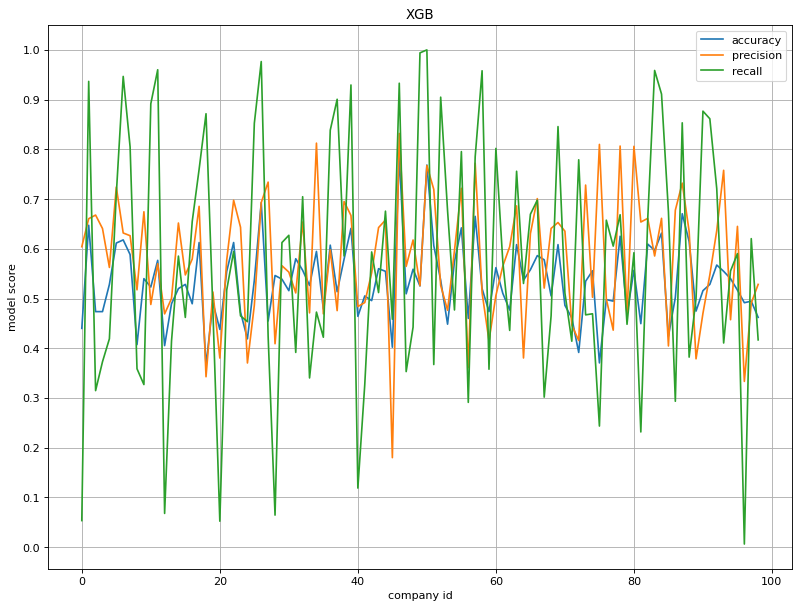

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("XGB")
for i in range(3):
    plt.plot(np.sum(comp_scores_xgb_all, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

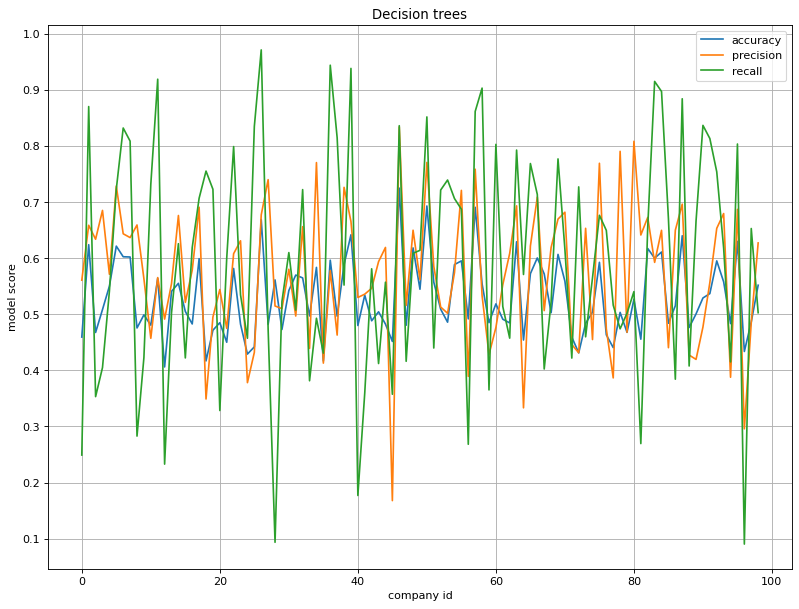

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("Decision trees")
for i in range(3):
    plt.plot(np.sum(comp_scores_dec_tree_all, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

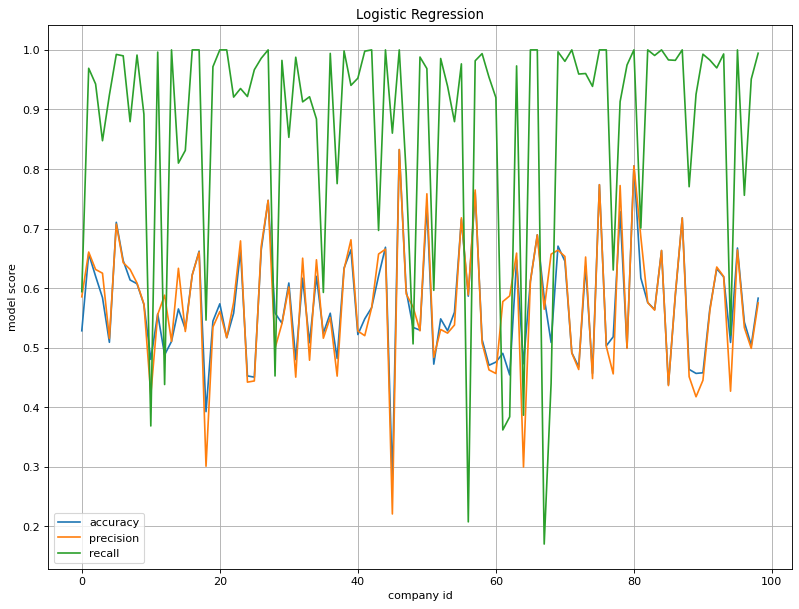

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.title("Logistic Regression")
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores_log_reg_all, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

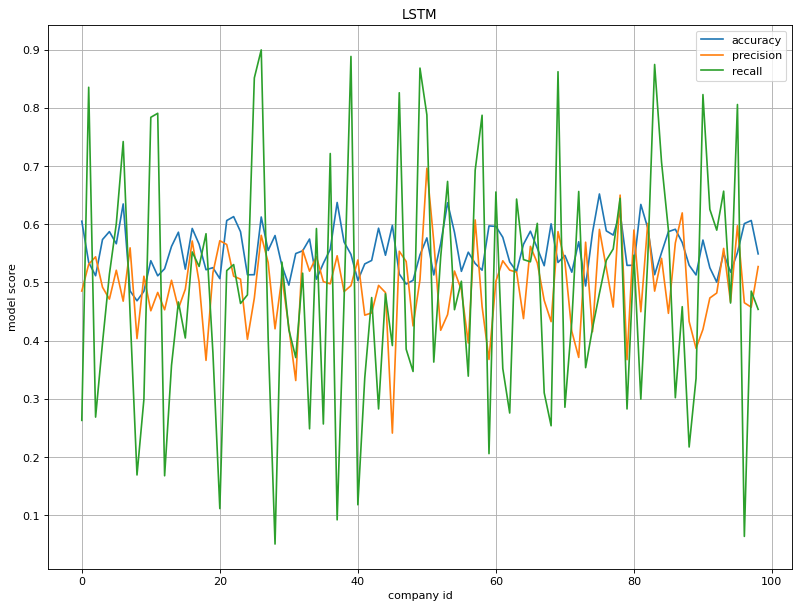

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("LSTM")
for i in range(3):
    plt.plot(np.sum(comp_scores_lstm_all, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

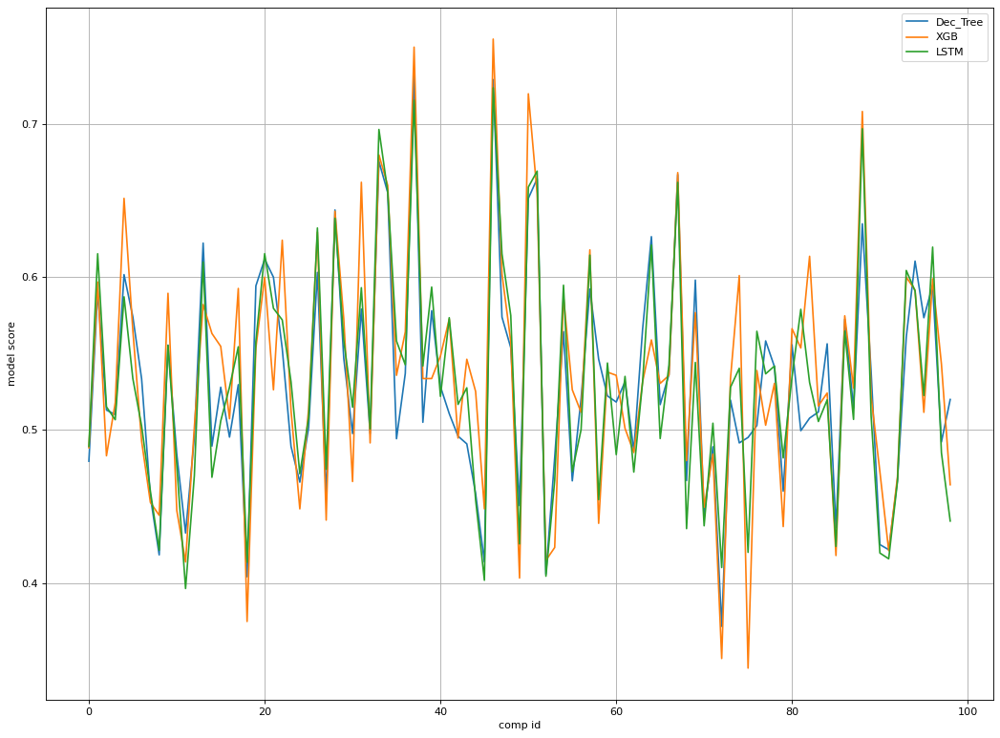

In [ ]:
figure(figsize=(16, 12), dpi=80)
comps=np.arange(len(list_of_companies_number))
plt.axes(xlabel='comp id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='90')
plt.grid()
plt.plot(np.sum(comp_scores_dec_tree_all, axis=1)[:,0]/5)
plt.plot(np.sum(comp_scores_xgb_all, axis=1)[:,0]/5)
plt.plot(np.sum(comp_scores_lstm_all, axis=1)[:,0]/5)
#plt.plot(np.sum(scores, axis=0)/len(comps))
plt.legend(['Dec_Tree','XGB', 'LSTM'])

In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    #'vwaps_order_sizes_buy', 
    #'vwaps_order_sizes_sell',
    #'s2f_order_sizes_buy', 
    #'s2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_vols=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_vols=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_vols=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_vols=np.zeros((len(list_of_companies_number),5, 3))
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_vols[comp_id,i,0], comp_scores_log_reg_vols[comp_id,i,1],comp_scores_log_reg_vols[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_dec_tree_vols[comp_id,i,0], comp_scores_dec_tree_vols[comp_id,i,1],comp_scores_dec_tree_vols[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_xgb_vols[comp_id,i,0], comp_scores_xgb_vols[comp_id,i,1],comp_scores_xgb_vols[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_lstm_vols[comp_id,i,0], comp_scores_lstm_vols[comp_id,i,1],comp_scores_lstm_vols[comp_id,i,2]=LSTM(np.copy(X_mom), np.copy(y),split_percent)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.54629338784913
order_inbalance   -1.7455632396747396
vwaps_buy   1.6873453556293183
vwaps_sell   -0.15684567927546558
s2f_impact_buy   -0.2839089932485891
s2f_impact_sell   0.6056125074089993
trading_volumes   -1.485631156414847
next_trade_time   -0.6931950955160402
next_trade_size   1.0375514431223063
next_trade_price   1.3809256153915541
[[145 135]
 [351 319]]
[[155 176]
 [341 278]]
[11:15:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5405405405405406
Recall:
0.04032258064516129
[[160 137]
 [336 317]]
Coefficient impact:
true_price   -1.5480800807463098
order_inbalance   -1.7455467001647702
vwaps_buy   1.6875949528175174
vwaps_sell   -0.15796145212897114
s2f_impact_buy   -0.283807933

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5405405405405406
Recall:
0.04032258064516129
[[179 179]
 [317 275]]
Coefficient impact:
true_price   -1.5483556734055766
order_inbalance   -1.7456364688551596
vwaps_buy   1.6874528935533757
vwaps_sell   -0.15789955101016434
s2f_impact_buy   -0.28389558859717967
s2f_impact_sell   0.6064262771557087
trading_volumes   -1.483981492363249
next_trade_time   -0.6938007113516491
next_trade_size   1.0377102582928686
next_trade_price   1.3819144642846528
[[145 135]
 [351 319]]
[[155 181]
 [341 273]]
[11:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5405405405405406
Recall:
0.04032258064516129
[[162 150]
 [334 304]]
Coefficient impact:
true_price   -1.5482417462422426
order_inbalance   -1.7447580730870422
vwaps_buy   1.6874410560388873
vwaps_sell   -0.15664012912375605
s2f_impact_buy   -0.28420712731071085
s2f_impact_sell   0.6063121128558769
trading_volumes   -1.4837034555440531
next_trade_time   -0.6938225087307224
next_trade_size   1.03820270679469
next_trade_price   1.3816186017140075
[[145 135]
 [351 319]]
[[164 173]
 [332 281]]
[11:15:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5405405405405406
Recall:
0.04032258064516129
[[161 173]
 [335 281]]
Coefficient impact:
true_price   -1.5463277417622623
order_inbalance   -1.7459084643467417
vwaps_buy   1.6869930751519524
vwaps_sell   -0.1580610180298406
s2f_impact_buy   -0.2848812668188896
s2f_impact_sell   0.6058528153051292
trading_volumes   -1.4835572019372523
next_trade_time   -0.6940245420698408
next_trade_size   1.0379051768912804
next_trade_price   1.3809219178248193
[[145 135]
 [351 319]]
[[161 165]
 [335 289]]
[11:15:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5405405405405406
Recall:
0.04032258064516129
[[175 176]
 [321 278]]
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.220678147738494
order_inbalance   0.45008652123819415
vwaps_buy   0.8727263914445017
vwaps_sell   1.7403777103672726
s2f_impact_buy   1.3180355872438505
s2f_impact_sell   0.4162682892208396
trading_volumes   -1.7739120934075394
next_trade_time   0.7669408347645935
next_trade_size   1.6002885620892715
next_trade_price   -0.20744949476587254
[[523 404]
 [ 13  10]]
[[509 364]
 [ 27  50]]
[11:16:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5818815331010453
Recall:
0.9347014925373134
[[508 366]
 [ 28  48]]
Coefficient impact:
true_price   -3.2211074271948763
order_inbalance   0.4493861929731876
vwaps_buy   0.8714753201719143
vwaps_sell   1.7401068979581464
s2f_impact_buy   1.3175697142740619
s2f_impact_sell   0.4177632930277831
trading_volumes   -1.7714098840687116
next_trade_time   0.7674473447530546
next_trade_size   1.6007765818632815
next_trade_price   -0.20842532725135846
[[523 405]
 [ 13   9]]
[[510 359]
 [ 26  55]]
[11:16:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5818815331010453
Recall:
0.9347014925373134
[[507 363]
 [ 29  51]]
Coefficient impact:
true_price   -3.2191952754431683
order_inbalance   0.44850407465079295
vwaps_buy   0.8719421806120115
vwaps_sell   1.7408880630870183
s2f_impact_buy   1.317675403330086
s2f_impact_sell   0.4167499855801919
trading_volumes   -1.772354450797652
next_trade_time   0.768440205935431
next_trade_size   1.5989121396724415
next_trade_price   -0.20876775811137355
[[524 405]
 [ 12   9]]
[[505 364]
 [ 31  50]]
[11:16:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5818815331010453
Recall:
0.9347014925373134
[[507 360]
 [ 29  54]]
Coefficient impact:
true_price   -3.2207695577893727
order_inbalance   0.45088090882509324
vwaps_buy   0.8711434768472026
vwaps_sell   1.7410818836162063
s2f_impact_buy   1.3214580213021623
s2f_impact_sell   0.42059231057716223
trading_volumes   -1.7704172320078855
next_trade_time   0.7684385432405583
next_trade_size   1.603538419072495
next_trade_price   -0.20987779722213956
[[524 405]
 [ 12   9]]
[[510 363]
 [ 26  51]]
[11:16:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5818815331010453
Recall:
0.9347014925373134
[[509 358]
 [ 27  56]]
Coefficient impact:
true_price   -3.220885968393894
order_inbalance   0.4489414348369541
vwaps_buy   0.8727614716816762
vwaps_sell   1.7413956082359503
s2f_impact_buy   1.3172864151440622
s2f_impact_sell   0.4173703629370689
trading_volumes   -1.7730052056780576
next_trade_time   0.7668251756930414
next_trade_size   1.600532112762842
next_trade_price   -0.20863179447671032
[[523 405]
 [ 13   9]]
[[507 358]
 [ 29  56]]
[11:16:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5818815331010453
Recall:
0.9347014925373134
[[509 363]
 [ 27  51]]
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -0.17932227001943596
order_inbalance   -0.533823683987915
vwaps_buy   -1.0135562089138201
vwaps_sell   0.6549940504063944
s2f_impact_buy   0.40249376966462813
s2f_impact_sell   -0.8313827658196418
trading_volumes   -0.7150086453510048
next_trade_time   -2.2038579195758343
next_trade_size   -0.4480782302357226
next_trade_price   -0.18749911946124945
[[290 259]
 [243 158]]
[[170 101]
 [363 316]]
[11:16:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.23639774859287055
[[174 107]
 [359 310]]
Coefficient impact:
true_price   -0.17957569795342343
order_inbalance   -0.5335058953678852
vwaps_buy   -1.013440725254509
vwaps_sell   0.6544549978293658
s2f_impact_buy   0.40227253603838303
s2f_impact_sell   -0.8314783385494212
trading_volumes   -0.7159737020432001
next_trade_time   -2.2032079782511444
next_trade_size   -0.44926435674456705
next_trade_price   -0.187379655731967
[[290 259]
 [243 158]]
[[168 101]
 [365 316]]
[11:16:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.23639774859287055
[[172 107]
 [361 310]]
Coefficient impact:
true_price   -0.18029881976482307
order_inbalance   -0.5341432465420441
vwaps_buy   -1.0139063493822686
vwaps_sell   0.6543817442521045
s2f_impact_buy   0.40262422026828054
s2f_impact_sell   -0.8307421676576052
trading_volumes   -0.7142271234494739
next_trade_time   -2.2040446010639267
next_trade_size   -0.4492196665901072
next_trade_price   -0.18795438325682134
[[290 259]
 [243 158]]
[[165 101]
 [368 316]]
[11:16:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.23639774859287055
[[165  97]
 [368 320]]
Coefficient impact:
true_price   -0.1793322884507628
order_inbalance   -0.5344916528351675
vwaps_buy   -1.0132941981289694
vwaps_sell   0.6555151943370027
s2f_impact_buy   0.4026848790056059
s2f_impact_sell   -0.8294054949994019
trading_volumes   -0.7148136569392464
next_trade_time   -2.2038176689268765
next_trade_size   -0.44818438400795063
next_trade_price   -0.18789424779966946
[[291 260]
 [242 157]]
[[169  97]
 [364 320]]
[11:16:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5833333333333334
Recall:
0.23639774859287055
[[164  99]
 [369 318]]
Coefficient impact:
true_price   -0.17973734405658376
order_inbalance   -0.5338241014099974
vwaps_buy   -1.0133015829972596
vwaps_sell   0.655486868175698
s2f_impact_buy   0.4030944088274332
s2f_impact_sell   -0.8311400797093152
trading_volumes   -0.7148567043208796
next_trade_time   -2.2030238444527575
next_trade_size   -0.44995617723361897
next_trade_price   -0.18874432732200228
[[290 259]
 [243 158]]
[[166 101]
 [367 316]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5833333333333334
Recall:
0.23639774859287055
[[169 111]
 [364 306]]
3
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.42063081605642266
order_inbalance   0.905770229870921
vwaps_buy   -0.017842129567870967
vwaps_sell   0.07563458720414891
s2f_impact_buy   -0.18396476922066615
s2f_impact_sell   -0.4307176580520254
trading_volumes   1.166125099793855
next_trade_time   0.1010588307070137
next_trade_size   1.3290479826430979
next_trade_price   -0.12776792608069457
[[ 77  45]
 [408 420]]
[[207 175]
 [278 290]]
[11:16:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.573208722741433
Recall:
0.37938144329896906
[[207 173]
 [278 292]]
Coefficient impact:
true_price   -0.42018008570419507
order_inbalance   0.9059691103641302
vwaps_buy   -0.01713623228090057
vwaps_sell   0.07636515214035658
s2f_impact_buy   -0.1837

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.573208722741433
Recall:
0.37938144329896906
[[196 161]
 [289 304]]
Coefficient impact:
true_price   -0.4199955286259256
order_inbalance   0.9056737725126954
vwaps_buy   -0.017608611693374986
vwaps_sell   0.075961586018948
s2f_impact_buy   -0.1836382156601604
s2f_impact_sell   -0.4309523543091505
trading_volumes   1.1670281240780633
next_trade_time   0.10084725834724892
next_trade_size   1.329431731934773
next_trade_price   -0.1275102862275155
[[ 77  45]
 [408 420]]
[[170 123]
 [315 342]]
[11:16:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.573208722741433
Recall:
0.37938144329896906
[[151  98]
 [334 367]]
Coefficient impact:
true_price   -0.42028003251182244
order_inbalance   0.9053641052898157
vwaps_buy   -0.017812117206197894
vwaps_sell   0.07507481715571153
s2f_impact_buy   -0.18456225932559334
s2f_impact_sell   -0.43082416923413164
trading_volumes   1.1664593117379372
next_trade_time   0.10135024216567312
next_trade_size   1.3279314231145751
next_trade_price   -0.12715016868137693
[[ 77  45]
 [408 420]]
[[197 161]
 [288 304]]
[11:16:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.573208722741433
Recall:
0.37938144329896906
[[193 132]
 [292 333]]
Coefficient impact:
true_price   -0.4200241098617988
order_inbalance   0.9058875778599927
vwaps_buy   -0.0178534842282494
vwaps_sell   0.07493920283478035
s2f_impact_buy   -0.18348019728974752
s2f_impact_sell   -0.43198725568109625
trading_volumes   1.1664229447925416
next_trade_time   0.10079638407969828
next_trade_size   1.3295364108157968
next_trade_price   -0.12628745934211322
[[ 77  45]
 [408 420]]
[[206 156]
 [279 309]]
[11:16:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.573208722741433
Recall:
0.37938144329896906
[[194 140]
 [291 325]]
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.2957845159922914
order_inbalance   1.3237333581766906
vwaps_buy   -0.5871424489387331
vwaps_sell   0.5635112047410407
s2f_impact_buy   1.3997628961595618
s2f_impact_sell   -0.9829392811829141
trading_volumes   0.4750554127036933
next_trade_time   -1.469611569137023
next_trade_size   -0.0941672746186555
next_trade_price   1.3634847099037737
[[188 392]
 [157 213]]
[[186 200]
 [159 405]]
[11:16:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5555555555555556
Recall:
0.4492753623188406
[[186 203]
 [159 402]]
Coefficient impact:
true_price   -1.2964171237962696
order_inbalance   1.323501518464559
vwaps_buy   -0.5874828862124134
vwaps_sell   0.5632293354496444
s2f_impact_buy   1.39975532984019

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.4492753623188406
[[177 174]
 [168 431]]
Coefficient impact:
true_price   -1.2975199390008096
order_inbalance   1.323461782528861
vwaps_buy   -0.5869865400207335
vwaps_sell   0.5631927949469255
s2f_impact_buy   1.3994030802044357
s2f_impact_sell   -0.9827031704994627
trading_volumes   0.4754512216254869
next_trade_time   -1.4688270264767236
next_trade_size   -0.0934923583740799
next_trade_price   1.3640217762906512
[[187 392]
 [158 213]]
[[184 200]
 [161 405]]
[11:16:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.4492753623188406
[[176 209]
 [169 396]]
Coefficient impact:
true_price   -1.2954160977386362
order_inbalance   1.3226528242156728
vwaps_buy   -0.5869684299913613
vwaps_sell   0.5633927149707674
s2f_impact_buy   1.3996393784094951
s2f_impact_sell   -0.9823706610007394
trading_volumes   0.47582136272851266
next_trade_time   -1.4694756147443409
next_trade_size   -0.09379362044960217
next_trade_price   1.3637018521284074
[[187 392]
 [158 213]]
[[186 200]
 [159 405]]
[11:16:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.4492753623188406
[[185 199]
 [160 406]]
Coefficient impact:
true_price   -1.2947544559521458
order_inbalance   1.3236508758232886
vwaps_buy   -0.5866341681768864
vwaps_sell   0.5634317414534172
s2f_impact_buy   1.4000472042512464
s2f_impact_sell   -0.9821009004097787
trading_volumes   0.4753291692141209
next_trade_time   -1.469233611490992
next_trade_size   -0.09489509693256266
next_trade_price   1.3637067445845217
[[188 393]
 [157 212]]
[[179 199]
 [166 406]]
[11:16:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5555555555555556
Recall:
0.4492753623188406
[[192 189]
 [153 416]]
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -2.762794415106952
order_inbalance   -0.39166617715106505
vwaps_buy   0.7737274210964853
vwaps_sell   -0.12463388627523542
s2f_impact_buy   1.0563638629827254
s2f_impact_sell   0.7094314274407058
trading_volumes   -0.07599386155364538
next_trade_time   0.18513231184474466
next_trade_size   1.4892222126289734
next_trade_price   -1.3571704151323611
[[551 372]
 [  4  23]]
[[390 230]
 [165 165]]
[11:16:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6229235880398671
Recall:
0.6756756756756757
[[387 226]
 [168 169]]
Coefficient impact:
true_price   -2.7623347784682455
order_inbalance   -0.3910549465938492
vwaps_buy   0.7742049885195748
vwaps_sell   -0.12477016913964945
s2f_impact_buy   1.0567242686459575
s2f_impact_sell   0.7093940512113946
trading_volumes   -0.07630972889267422
next_trade_time   0.18626909463566968
next_trade_size   1.4889727779101656
next_trade_price   -1.3559679064195078
[[549 372]
 [  6  23]]
[[389 220]
 [166 175]]
[11:16:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6229235880398671
Recall:
0.6756756756756757
[[394 229]
 [161 166]]
Coefficient impact:
true_price   -2.764274698758316
order_inbalance   -0.39040149274051805
vwaps_buy   0.774016478106442
vwaps_sell   -0.12538030138116024
s2f_impact_buy   1.0572113384148436
s2f_impact_sell   0.7091812068336796
trading_volumes   -0.07608073503208662
next_trade_time   0.18617375988677862
next_trade_size   1.488585962074013
next_trade_price   -1.356682461432472
[[549 372]
 [  6  23]]
[[383 225]
 [172 170]]
[11:16:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6229235880398671
Recall:
0.6756756756756757
[[391 229]
 [164 166]]
Coefficient impact:
true_price   -2.763967367741714
order_inbalance   -0.3907657059444158
vwaps_buy   0.7735164924870126
vwaps_sell   -0.12509627956910066
s2f_impact_buy   1.058322292060127
s2f_impact_sell   0.7105905920565725
trading_volumes   -0.0765491758506382
next_trade_time   0.18589375946472927
next_trade_size   1.4893905365938644
next_trade_price   -1.356021481997932
[[549 372]
 [  6  23]]
[[389 230]
 [166 165]]
[11:16:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6229235880398671
Recall:
0.6756756756756757
[[387 228]
 [168 167]]
Coefficient impact:
true_price   -2.762506124124647
order_inbalance   -0.3866433086409251
vwaps_buy   0.7731572103165466
vwaps_sell   -0.12553406598064923
s2f_impact_buy   1.0567384560644202
s2f_impact_sell   0.7108428007111086
trading_volumes   -0.08053858707304787
next_trade_time   0.1846648401783531
next_trade_size   1.485349316335932
next_trade_price   -1.3559314401651292
[[550 372]
 [  5  23]]
[[388 228]
 [167 167]]
[11:16:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6229235880398671
Recall:
0.6756756756756757
[[391 231]
 [164 164]]
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -2.9234508168769295
order_inbalance   0.12737399323751145
vwaps_buy   0.38070182829370147
vwaps_sell   1.7559425416230319
s2f_impact_buy   0.5640044662506198
s2f_impact_sell   -0.6491356834957901
trading_volumes   -2.740819698934507
next_trade_time   1.6411344355656023
next_trade_size   -1.2060300271265714
next_trade_price   1.58133431926119
[[366 365]
 [ 98 121]]
[[302 309]
 [162 177]]
[11:16:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4988344988344988
Recall:
0.9224137931034483
[[296 306]
 [168 180]]
Coefficient impact:
true_price   -2.924205909633817
order_inbalance   0.12704132420623418
vwaps_buy   0.37835589236649025
vwaps_sell   1.7549301862440496
s2f_impact_buy   0.5640569912983975
s2f_impact_sell   -0.6457394129407628
trading_volumes   -2.741367568091925
next_trade_time   1.6418670822239925
next_trade_size   -1.2058221984702402
next_trade_price   1.57971952029273
[[365 365]
 [ 99 121]]
[[311 312]
 [153 174]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4988344988344988
Recall:
0.9224137931034483
[[306 312]
 [158 174]]
Coefficient impact:
true_price   -2.924070855230824
order_inbalance   0.12737099045279407
vwaps_buy   0.38031621872197974
vwaps_sell   1.7549115651217586
s2f_impact_buy   0.5633912203639997
s2f_impact_sell   -0.6479492253029223
trading_volumes   -2.741198934792365
next_trade_time   1.6413118750999152
next_trade_size   -1.2069289686184042
next_trade_price   1.5791910902642354
[[364 365]
 [100 121]]
[[315 310]
 [149 176]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4988344988344988
Recall:
0.9224137931034483
[[304 311]
 [160 175]]
Coefficient impact:
true_price   -2.9251190741759867
order_inbalance   0.12519520711546855
vwaps_buy   0.3791062628534341
vwaps_sell   1.7586616953045622
s2f_impact_buy   0.5668088566113156
s2f_impact_sell   -0.6480925879346983
trading_volumes   -2.7394836106908995
next_trade_time   1.6397348946387993
next_trade_size   -1.2078533660447959
next_trade_price   1.579335026231846
[[364 365]
 [100 121]]
[[304 308]
 [160 178]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4988344988344988
Recall:
0.9224137931034483
[[304 312]
 [160 174]]
Coefficient impact:
true_price   -2.9226164527847094
order_inbalance   0.1276748398984505
vwaps_buy   0.38048955978728766
vwaps_sell   1.7546157561221059
s2f_impact_buy   0.5642006799554354
s2f_impact_sell   -0.6481022942986697
trading_volumes   -2.740527692317126
next_trade_time   1.643822756291531
next_trade_size   -1.2066075692079394
next_trade_price   1.5798942823091475
[[365 365]
 [ 99 121]]
[[307 316]
 [157 170]]
[11:16:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4988344988344988
Recall:
0.9224137931034483
[[306 314]
 [158 172]]
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.720237959332846
order_inbalance   -0.36664254891731046
vwaps_buy   0.1409568850868412
vwaps_sell   1.821939391709708
s2f_impact_buy   0.2914613570290996
s2f_impact_sell   1.2568898493231804
trading_volumes   -2.5408128208905225
next_trade_time   -1.0858443999260348
next_trade_size   2.3809030270613865
next_trade_price   1.2314186136611118
[[ 66  82]
 [426 376]]
[[227 227]
 [265 231]]
[11:16:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5101289134438306
Recall:
0.5630081300813008
[[264 275]
 [228 183]]
Coefficient impact:
true_price   -2.722109590990467
order_inbalance   -0.36542606425361496
vwaps_buy   0.1417783128621305
vwaps_sell   1.8202001678716013
s2f_impact_buy   0.29211212026048644
s2f_impact_sell   1.2563144862147784
trading_volumes   -2.541571841740187
next_trade_time   -1.0864732359874696
next_trade_size   2.382265057419165
next_trade_price   1.230998859122425
[[ 66  79]
 [426 379]]
[[254 266]
 [238 192]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5101289134438306
Recall:
0.5630081300813008
[[265 254]
 [227 204]]
Coefficient impact:
true_price   -2.721176165097704
order_inbalance   -0.3655385157328965
vwaps_buy   0.14116837788504547
vwaps_sell   1.822073379197978
s2f_impact_buy   0.2911449557309148
s2f_impact_sell   1.2565651798865731
trading_volumes   -2.5403642359727296
next_trade_time   -1.0850694484359162
next_trade_size   2.3809527348111184
next_trade_price   1.2319323914095046
[[ 66  81]
 [426 377]]
[[251 263]
 [241 195]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5101289134438306
Recall:
0.5630081300813008
[[259 267]
 [233 191]]
Coefficient impact:
true_price   -2.719286070535865
order_inbalance   -0.3668192967081824
vwaps_buy   0.14134230971285608
vwaps_sell   1.822941769402233
s2f_impact_buy   0.2927100820807756
s2f_impact_sell   1.257031145478706
trading_volumes   -2.5412567728001703
next_trade_time   -1.0860093328292153
next_trade_size   2.3797276890219776
next_trade_price   1.2316201886536857
[[ 67  82]
 [425 376]]
[[270 272]
 [222 186]]
[11:16:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5101289134438306
Recall:
0.5630081300813008
[[236 245]
 [256 213]]
Coefficient impact:
true_price   -2.721421868955484
order_inbalance   -0.36594853520923804
vwaps_buy   0.13979745298262444
vwaps_sell   1.82039791537754
s2f_impact_buy   0.2912897309277345
s2f_impact_sell   1.2563679078299534
trading_volumes   -2.5403034938274374
next_trade_time   -1.085267988987299
next_trade_size   2.379699198508461
next_trade_price   1.2309553172358398
[[ 66  81]
 [426 377]]
[[276 267]
 [216 191]]
[11:16:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5101289134438306
Recall:
0.5630081300813008
[[254 273]
 [238 185]]
8
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
Coefficient impact:
true_price   -2.0641276291481567
order_inbalance   -0.4821140994177348
vwaps_buy   -1.1243594265721322
vwaps_sell   1.1571140521786303
s2f_impact_buy   0.902375894705204
s2f_impact_sell   -0.7242227818157154
trading_volumes   -0.8181204805398581
next_trade_time   1.0532585804304275
next_trade_size   -1.4675987744803975
next_trade_price   0.4594818871117124
[[394 425]
 [ 63  68]]
[[111 178]
 [346 315]]
[11:16:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2356687898089172
Recall:
0.08096280087527352
[[132 184]
 [325 309]]
Coefficient impact:
true_price   -2.063264297685804
order_inbalance   -0.48205900367264826
vwaps_buy   -1.1255422604970422
vwaps_sell   1.1558515667517686
s2f_impact_buy   0.9018253253982031
s2f_impact_sell   -0.7230536287983538
trading_volumes   -0.8179961441276274
next_trade_time   1.0521430792290425
next_trade_size   -1.4673363167876794
next_trade_price   0.4596158036528741
[[395 428]
 [ 62  65]]
[[109 144]
 [348 349]]
[11:16:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2356687898089172
Recall:
0.08096280087527352
[[ 76 173]
 [381 320]]
Coefficient impact:
true_price   -2.063768596082052
order_inbalance   -0.4823684617400464
vwaps_buy   -1.124834535278293
vwaps_sell   1.1544945592133482
s2f_impact_buy   0.9014837422004582
s2f_impact_sell   -0.723971608999547
trading_volumes   -0.8179271333630626
next_trade_time   1.054160539136285
next_trade_size   -1.4669096565460484
next_trade_price   0.45988103310623407
[[394 426]
 [ 63  67]]
[[ 79 169]
 [378 324]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2356687898089172
Recall:
0.08096280087527352
[[ 77 135]
 [380 358]]
Coefficient impact:
true_price   -2.0638689947257824
order_inbalance   -0.48139323384674754
vwaps_buy   -1.1239125496503952
vwaps_sell   1.1562822004924012
s2f_impact_buy   0.9031634780909191
s2f_impact_sell   -0.7245767497229698
trading_volumes   -0.8180496820751272
next_trade_time   1.0520004857044543
next_trade_size   -1.4675924309643045
next_trade_price   0.45999812623099284
[[395 427]
 [ 62  66]]
[[ 86 188]
 [371 305]]
[11:16:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2356687898089172
Recall:
0.08096280087527352
[[ 74 168]
 [383 325]]
Coefficient impact:
true_price   -2.062498630534476
order_inbalance   -0.48118703032845905
vwaps_buy   -1.1241395388466113
vwaps_sell   1.1558031433330334
s2f_impact_buy   0.9022551383858164
s2f_impact_sell   -0.7242089522503371
trading_volumes   -0.8184291304531924
next_trade_time   1.054125981039613
next_trade_size   -1.4678918485179053
next_trade_price   0.4599386185034848
[[395 427]
 [ 62  66]]
[[ 97 150]
 [360 343]]
[11:16:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2356687898089172
Recall:
0.08096280087527352
[[ 64 126]
 [393 367]]
9
25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   -1.262578768318782
order_inbalance   1.0411945821996507
vwaps_buy   -0.4471900026804565
vwaps_sell   0.6314160231030208
s2f_impact_buy   0.6916018310049179
s2f_impact_sell   0.5270167395764809
trading_volumes   2.0349685070061465
next_trade_time   -0.9802338806739773
next_trade_size   0.9202746310512908
next_trade_price   -0.24360994660839527
[[110 102]
 [322 416]]
[[119  97]
 [313 421]]
[11:16:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6090909090909091
Recall:
0.1550925925925926
[[131 112]
 [301 406]]
Coefficient impact:
true_price   -1.2616060306369725
order_inbalance   1.0416474424741755
vwaps_buy   -0.44653132005462715
vwaps_sell   0.6316996563480807
s2f_impact_buy   0.6908312656810507
s2f_impact_sell   0.5268894441600496
trading_volumes   2.035752935072782
next_trade_time   -0.9796803278177503
next_trade_size   0.9208360696995329
next_trade_price   -0.24384275245201914
[[112 102]
 [320 416]]
[[106  97]
 [326 421]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6090909090909091
Recall:
0.1550925925925926
[[122 104]
 [310 414]]
Coefficient impact:
true_price   -1.2611741863336574
order_inbalance   1.0418357679532397
vwaps_buy   -0.44635302279272354
vwaps_sell   0.631614010064938
s2f_impact_buy   0.6920853688258962
s2f_impact_sell   0.5274809926064392
trading_volumes   2.0354726048586107
next_trade_time   -0.9803791492612844
next_trade_size   0.9209157440919338
next_trade_price   -0.2433335915277639
[[110 102]
 [322 416]]
[[116  97]
 [316 421]]
[11:16:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6090909090909091
Recall:
0.1550925925925926
[[101  97]
 [331 421]]
Coefficient impact:
true_price   -1.2617309930993221
order_inbalance   1.0415681052301675
vwaps_buy   -0.4463437710860654
vwaps_sell   0.6319710753920659
s2f_impact_buy   0.6905980443595379
s2f_impact_sell   0.5263323494270336
trading_volumes   2.0349373948338636
next_trade_time   -0.9799794653870503
next_trade_size   0.9199510618312284
next_trade_price   -0.243505875411607
[[110 102]
 [322 416]]
[[113  99]
 [319 419]]
[11:16:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6090909090909091
Recall:
0.1550925925925926
[[133 118]
 [299 400]]
Coefficient impact:
true_price   -1.2618755526631285
order_inbalance   1.0419102287631476
vwaps_buy   -0.4473394051435925
vwaps_sell   0.6319318667265749
s2f_impact_buy   0.690882748143724
s2f_impact_sell   0.5276882520094982
trading_volumes   2.035189119075542
next_trade_time   -0.9789641239268765
next_trade_size   0.9199506728477042
next_trade_price   -0.2441022359742845
[[111 102]
 [321 416]]
[[110  92]
 [322 426]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:16:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6090909090909091
Recall:
0.1550925925925926
[[115 109]
 [317 409]]
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.5691913285377954
order_inbalance   -0.10136810390505248
vwaps_buy   -0.08227696106932417
vwaps_sell   -0.4329334340779959
s2f_impact_buy   0.09822876534393822
s2f_impact_sell   0.6974816122876598
trading_volumes   1.7750273399498635
next_trade_time   -0.06647911462825815
next_trade_size   0.971723088756148
next_trade_price   0.7551356643439605
[[  7   6]
 [356 581]]
[[272 414]
 [ 91 173]]
[11:16:59] WARNING: C:/Users/Administ

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39402173913043476
Recall:
0.7988980716253443
[[274 408]
 [ 89 179]]
Coefficient impact:
true_price   -1.5688100384718289
order_inbalance   -0.10099971469377493
vwaps_buy   -0.08188543836369828
vwaps_sell   -0.43330859073827577
s2f_impact_buy   0.09805524763123984
s2f_impact_sell   0.6979223442004776
trading_volumes   1.774955479192893
next_trade_time   -0.06575493274358825
next_trade_size   0.9715619495125885
next_trade_price   0.7538366912347797
[[  7   6]
 [356 581]]
[[265 408]
 [ 98 179]]
[11:17:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39402173913043476
Recall:
0.7988980716253443
[[267 415]
 [ 96 172]]
Coefficient impact:
true_price   -1.5691939257931984
order_inbalance   -0.10113114886067932
vwaps_buy   -0.08239400973253153
vwaps_sell   -0.43450720377496926
s2f_impact_buy   0.09788959760023451
s2f_impact_sell   0.6971664793965792
trading_volumes   1.7747869438180042
next_trade_time   -0.06583867865088029
next_trade_size   0.9713810876993753
next_trade_price   0.7546629435212251
[[  7   6]
 [356 581]]
[[281 421]
 [ 82 166]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39402173913043476
Recall:
0.7988980716253443
[[265 405]
 [ 98 182]]
Coefficient impact:
true_price   -1.568881187622443
order_inbalance   -0.10147296462723585
vwaps_buy   -0.08300255314783209
vwaps_sell   -0.4335223642498757
s2f_impact_buy   0.0977536247558765
s2f_impact_sell   0.6988514977822917
trading_volumes   1.7746855423068075
next_trade_time   -0.066484123667701
next_trade_size   0.9711461567717291
next_trade_price   0.7540893420690559
[[  7   6]
 [356 581]]
[[276 416]
 [ 87 171]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39402173913043476
Recall:
0.7988980716253443
[[273 413]
 [ 90 174]]
Coefficient impact:
true_price   -1.570072348561478
order_inbalance   -0.10201340906516376
vwaps_buy   -0.08245189872759665
vwaps_sell   -0.4342338343616931
s2f_impact_buy   0.097895648279618
s2f_impact_sell   0.6974387080164594
trading_volumes   1.7746954803884538
next_trade_time   -0.06609443533870973
next_trade_size   0.9710049974355031
next_trade_price   0.7555207574946482
[[  7   6]
 [356 581]]
[[275 417]
 [ 88 170]]
[11:17:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39402173913043476
Recall:
0.7988980716253443
[[282 419]
 [ 81 168]]
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.2678356064308084
order_inbalance   1.469174332557678
vwaps_buy   -1.1544440214367222
vwaps_sell   0.1978284186860307
s2f_impact_buy   0.47925236625320766
s2f_impact_sell   -0.07333417500966277
trading_volumes   -0.11279391539775971
next_trade_time   1.2897611351142864
next_trade_size   0.7201217840341495
next_trade_price   1.192063472050909
[[367 553]
 [ 18  12]]
[[316 467]
 [ 69  98]]
[11:17:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4143835616438356
Recall:
0.9428571428571428
[[336 503]
 [ 49  62]]
Coefficient impact:
true_price   0.2690350407733247
order_inbalance   1.470813312180144
vwaps_buy   -1.1546037071881505
vwaps_sell   0.1978918487733334
s2f_impact_buy   0.4799007659390166
s2f_impact_sell   -0.07356007167279055
trading_volumes   -0.1116106897212625
next_trade_time   1.2899128488033844
next_trade_size   0.7205084239149303
next_trade_price   1.192021607659383
[[367 553]
 [ 18  12]]
[[328 497]
 [ 57  68]]
[11:17:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4143835616438356
Recall:
0.9428571428571428
[[333 496]
 [ 52  69]]
Coefficient impact:
true_price   0.26934917536447894
order_inbalance   1.4697760846836283
vwaps_buy   -1.1543581111107335
vwaps_sell   0.19751410917586557
s2f_impact_buy   0.4798533058050164
s2f_impact_sell   -0.07399393273261622
trading_volumes   -0.11191420933536154
next_trade_time   1.288758032571448
next_trade_size   0.7209966308053716
next_trade_price   1.1920018347366932
[[367 553]
 [ 18  12]]
[[332 503]
 [ 53  62]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4143835616438356
Recall:
0.9428571428571428
[[333 476]
 [ 52  89]]
Coefficient impact:
true_price   0.2687728912934988
order_inbalance   1.4706257977220962
vwaps_buy   -1.154697531641842
vwaps_sell   0.1975407010048893
s2f_impact_buy   0.48021598511384717
s2f_impact_sell   -0.07316557925770885
trading_volumes   -0.11252853759873743
next_trade_time   1.2899708940239079
next_trade_size   0.7204709391471648
next_trade_price   1.192088933069994
[[367 553]
 [ 18  12]]
[[334 501]
 [ 51  64]]
[11:17:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4143835616438356
Recall:
0.9428571428571428
[[332 504]
 [ 53  61]]
Coefficient impact:
true_price   0.27204862292920995
order_inbalance   1.4715146150774165
vwaps_buy   -1.1548687183488477
vwaps_sell   0.19917869456699377
s2f_impact_buy   0.4806601593938723
s2f_impact_sell   -0.07288080087958322
trading_volumes   -0.11191619444193118
next_trade_time   1.2892456098712377
next_trade_size   0.7201537878726819
next_trade_price   1.1924163995482697
[[367 553]
 [ 18  12]]
[[329 497]
 [ 56  68]]
[11:17:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4143835616438356
Recall:
0.9428571428571428
[[335 476]
 [ 50  89]]
12
25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.812808676599131
order_inbalance   -0.411510731477065
vwaps_buy   -0.3864419179708213
vwaps_sell   0.8135955660328338
s2f_impact_buy   0.8106966649708768
s2f_impact_sell   0.9388635306769515
trading_volumes   -1.9527238777204026
next_trade_time   0.47126643616677133
next_trade_size   1.0793742158484896
next_trade_price   0.5100134225203807
[[ 20  10]
 [454 466]]
[[ 83  93]
 [391 383]]
[11:17:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8
Recall:
0.02531645569620253
[[ 58  73]
 [416 403]]
Coefficient impact:
true_price   -3.8116107667957286
order_inbalance   -0.41046223540235827
vwaps_buy   -0.3854954035664514
vwaps_sell   0.8140792340842348
s2f_impact_buy   0.8104333765703204
s2f_impact_sell   0.9400005837834418
trading_volumes   -1.9549222575471392
next_trade_time   0.47305654940873804
next_trade_size   1.0800598502209668
next_trade_price   0.5104474477411646
[[ 20  10]
 [454 466]]
[[ 75  73]
 [399 403]]
[11:17:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8
Recall:
0.02531645569620253
[[ 78  86]
 [396 390]]
Coefficient impact:
true_price   -3.8138995905214665
order_inbalance   -0.4107333295547802
vwaps_buy   -0.3849299653057323
vwaps_sell   0.8138021118644105
s2f_impact_buy   0.8096258026744758
s2f_impact_sell   0.9384651096567063
trading_volumes   -1.9525824760082109
next_trade_time   0.47182551358552316
next_trade_size   1.0804295064945562
next_trade_price   0.5121691579944173
[[ 20  10]
 [454 466]]
[[ 58  79]
 [416 397]]
[11:17:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8
Recall:
0.02531645569620253
[[ 47  66]
 [427 410]]
Coefficient impact:
true_price   -3.812862559470512
order_inbalance   -0.41292446368829094
vwaps_buy   -0.38564229772576153
vwaps_sell   0.8139163161904243
s2f_impact_buy   0.8093920494076576
s2f_impact_sell   0.9403423641239557
trading_volumes   -1.9528408530564652
next_trade_time   0.4712533299722697
next_trade_size   1.082242363188921
next_trade_price   0.5083826997601876
[[ 20  10]
 [454 466]]
[[ 68  83]
 [406 393]]
[11:17:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8
Recall:
0.02531645569620253
[[ 57  77]
 [417 399]]
Coefficient impact:
true_price   -3.811812702704082
order_inbalance   -0.411582544947688
vwaps_buy   -0.38590696819416376
vwaps_sell   0.8146118385752782
s2f_impact_buy   0.8104680470824441
s2f_impact_sell   0.9396150893065806
trading_volumes   -1.9511586162051675
next_trade_time   0.47073943196779444
next_trade_size   1.0806252014837516
next_trade_price   0.5114087444669622
[[ 20  10]
 [454 466]]
[[ 54  71]
 [420 405]]
[11:17:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8
Recall:
0.02531645569620253
[[ 47  66]
 [427 410]]
13
33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -1.1672901939342755
order_inbalance   -0.6470900544464052
vwaps_buy   -0.003291244917031996
vwaps_sell   1.5587393570397252
s2f_impact_buy   0.7588328719895584
s2f_impact_sell   -0.2591093230948585
trading_volumes   -0.7156067329479738
next_trade_time   -0.7807794228548265
next_trade_size   1.2413777668035575
next_trade_price   0.009990671744985653
[[246 384]
 [ 99 221]]
[[ 50  93]
 [295 512]]
[11:17:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3494809688581315
Recall:
0.2927536231884058
[[ 56  97]
 [289 508]]
Coefficient impact:
true_price   -1.1667841576993565
order_inbalance   -0.6472711007911361
vwaps_buy   -0.0018033319859176815
vwaps_sell   1.5585049583521016
s2f_impact_buy   0.7588475573167313
s2f_impact_sell   -0.2614676764572492
trading_volumes   -0.7158532358531966
next_trade_time   -0.7825009839816126
next_trade_size   1.242196935842125
next_trade_price   0.010119026413968934
[[246 385]
 [ 99 220]]
[[ 55  89]
 [290 516]]
[11:17:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3494809688581315
Recall:
0.2927536231884058
[[ 55 113]
 [290 492]]
Coefficient impact:
true_price   -1.1674894155946385
order_inbalance   -0.6466987876709009
vwaps_buy   -0.0028383460359715515
vwaps_sell   1.5588421739460971
s2f_impact_buy   0.7584932023005589
s2f_impact_sell   -0.2603885426420813
trading_volumes   -0.7147058299497119
next_trade_time   -0.7821644378675101
next_trade_size   1.2418719430320444
next_trade_price   0.009051500588427373
[[246 385]
 [ 99 220]]
[[ 56  97]
 [289 508]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3494809688581315
Recall:
0.2927536231884058
[[ 56  98]
 [289 507]]
Coefficient impact:
true_price   -1.167493064902373
order_inbalance   -0.6466157207954846
vwaps_buy   -0.00240219971970577
vwaps_sell   1.5591027655287881
s2f_impact_buy   0.759087137878382
s2f_impact_sell   -0.2602628634413912
trading_volumes   -0.714776411554839
next_trade_time   -0.7818331265384705
next_trade_size   1.2412384650232284
next_trade_price   0.011102307855496601
[[246 385]
 [ 99 220]]
[[ 53  89]
 [292 516]]
[11:17:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3494809688581315
Recall:
0.2927536231884058
[[ 55 101]
 [290 504]]
Coefficient impact:
true_price   -1.1670674189461179
order_inbalance   -0.6471229661988757
vwaps_buy   -0.002714015860248385
vwaps_sell   1.5584857175070135
s2f_impact_buy   0.7585129682988762
s2f_impact_sell   -0.2614919860841352
trading_volumes   -0.7153725104711515
next_trade_time   -0.7816351442829075
next_trade_size   1.241237687355017
next_trade_price   0.01034109806971039
[[246 385]
 [ 99 220]]
[[ 57 111]
 [288 494]]
[11:17:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3494809688581315
Recall:
0.2927536231884058
[[ 54  98]
 [291 507]]
14
31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   0.09111070664428929
order_inbalance   1.4442501862264763
vwaps_buy   0.029504343412953486
vwaps_sell   -0.3004016864774139
s2f_impact_buy   2.073949306721204
s2f_impact_sell   -1.0093024376827398
trading_volumes   0.5224474153510998
next_trade_time   3.0317971907249226
next_trade_size   -1.3651315989014114
next_trade_price   0.4359528203634721
[[224 222]
 [298 206]]
[[234 179]
 [288 249]]
[11:17:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.563265306122449
Recall:
0.5287356321839081
[[235 181]
 [287 247]]
Coefficient impact:
true_price   0.0929677070721918
order_inbalance   1.4449701624393108
vwaps_buy   0.029569987556620055
vwaps_sell   -0.2997699781252675
s2f_impact_buy   2.0739777615877855
s2f_impact_sell   -1.0094323922811228
trading_volumes   0.5233194843559326
next_trade_time   3.0316318897630747
next_trade_size   -1.3645480079011987
next_trade_price   0.4368724175703296
[[224 221]
 [298 207]]
[[241 177]
 [281 251]]
[11:17:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.563265306122449
Recall:
0.5287356321839081
[[250 185]
 [272 243]]
Coefficient impact:
true_price   0.09236923675572281
order_inbalance   1.443975718235112
vwaps_buy   0.02989434893345072
vwaps_sell   -0.29841160476588285
s2f_impact_buy   2.072983445591684
s2f_impact_sell   -1.0086520568894708
trading_volumes   0.5232324723298486
next_trade_time   3.0332692140550646
next_trade_size   -1.3647726302305492
next_trade_price   0.43607816659864035
[[224 221]
 [298 207]]
[[258 186]
 [264 242]]
[11:17:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.563265306122449
Recall:
0.5287356321839081
[[262 195]
 [260 233]]
Coefficient impact:
true_price   0.0928266754841417
order_inbalance   1.4440762532825684
vwaps_buy   0.03026215317511471
vwaps_sell   -0.30020786903137575
s2f_impact_buy   2.0728289853065287
s2f_impact_sell   -1.0107570120561542
trading_volumes   0.522553082957663
next_trade_time   3.03237532445947
next_trade_size   -1.3645680879663304
next_trade_price   0.43594493062596534
[[224 221]
 [298 207]]
[[249 186]
 [273 242]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.563265306122449
Recall:
0.5287356321839081
[[246 197]
 [276 231]]
Coefficient impact:
true_price   0.09314980925595691
order_inbalance   1.4448147600703103
vwaps_buy   0.02901414774353689
vwaps_sell   -0.29713856537357775
s2f_impact_buy   2.0729697706240993
s2f_impact_sell   -1.0095341936544155
trading_volumes   0.5231382214445763
next_trade_time   3.03151999455485
next_trade_size   -1.364465353303021
next_trade_price   0.4360072100800733
[[224 222]
 [298 206]]
[[253 187]
 [269 241]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.563265306122449
Recall:
0.5287356321839081
[[230 194]
 [292 234]]
15
31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -0.058712942355189646
order_inbalance   0.19009250549255383
vwaps_buy   0.17776263102932555
vwaps_sell   1.2739060697947993
s2f_impact_buy   -0.5502945753658224
s2f_impact_sell   -0.6405246436608588
trading_volumes   -0.6521499259771351
next_trade_time   0.1874153327825411
next_trade_size   0.0635142573942419
next_trade_price   0.17788507861463057
[[  1  13]
 [411 525]]
[[160 182]
 [252 356]]
[11:17:32] WARNING: C:/User

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45384615384615384
Recall:
0.28640776699029125
[[153 185]
 [259 353]]
Coefficient impact:
true_price   -0.058790611604927476
order_inbalance   0.18956689109037328
vwaps_buy   0.17716809747614362
vwaps_sell   1.2738501545153682
s2f_impact_buy   -0.5495954606038237
s2f_impact_sell   -0.6404796579547416
trading_volumes   -0.6523693929485285
next_trade_time   0.1869764326457418
next_trade_size   0.062386445525283656
next_trade_price   0.17706395596567626
[[  1  13]
 [411 525]]
[[153 176]
 [259 362]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45384615384615384
Recall:
0.28640776699029125
[[161 188]
 [251 350]]
Coefficient impact:
true_price   -0.05902571821877861
order_inbalance   0.1899807234213478
vwaps_buy   0.1770681868525223
vwaps_sell   1.2731647329389697
s2f_impact_buy   -0.549417532895296
s2f_impact_sell   -0.6401169795495404
trading_volumes   -0.6530506329448696
next_trade_time   0.18641331222356006
next_trade_size   0.062052024776591476
next_trade_price   0.17801249363633576
[[  1  13]
 [411 525]]
[[155 181]
 [257 357]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45384615384615384
Recall:
0.28640776699029125
[[161 186]
 [251 352]]
Coefficient impact:
true_price   -0.059281374126314686
order_inbalance   0.1901175635924991
vwaps_buy   0.17703539020248985
vwaps_sell   1.2731150211054185
s2f_impact_buy   -0.5498344056698993
s2f_impact_sell   -0.6398801950357277
trading_volumes   -0.6526026590221051
next_trade_time   0.1865447415491648
next_trade_size   0.062391503326322796
next_trade_price   0.17752690700821844
[[  1  13]
 [411 525]]
[[150 188]
 [262 350]]
[11:17:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45384615384615384
Recall:
0.28640776699029125
[[147 195]
 [265 343]]
Coefficient impact:
true_price   -0.05912943079286881
order_inbalance   0.1898598505331526
vwaps_buy   0.17743756810605643
vwaps_sell   1.2731488909500246
s2f_impact_buy   -0.5497122858782354
s2f_impact_sell   -0.6398355778507631
trading_volumes   -0.65244856959285
next_trade_time   0.18731142459916425
next_trade_size   0.06248906603757981
next_trade_price   0.17761000798754553
[[  1  13]
 [411 525]]
[[161 190]
 [251 348]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45384615384615384
Recall:
0.28640776699029125
[[158 190]
 [254 348]]
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -6.484717673440373
order_inbalance   -0.3064887141860775
vwaps_buy   0.09879491596233476
vwaps_sell   0.23240581968593474
s2f_impact_buy   0.1484377986826069
s2f_impact_sell   -0.3301600584147429
trading_volumes   1.6127344808564366
next_trade_time   -0.46789816249921257
next_trade_size   0.9316558465305441
next_trade_price   1.0075266746931342
[[509 437]
 [  0   4]]
[[281 218]
 [228 223]]
[11:17:38] WARNING: C:/Users

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5095419847328244
Recall:
0.5245579567779961
[[276 226]
 [233 215]]
Coefficient impact:
true_price   -6.480574508902061
order_inbalance   -0.3018148805589247
vwaps_buy   0.09747813715419316
vwaps_sell   0.2319022400804083
s2f_impact_buy   0.15426396345817048
s2f_impact_sell   -0.3296132200186193
trading_volumes   1.6102032661492292
next_trade_time   -0.4695741678333954
next_trade_size   0.9326544907410352
next_trade_price   1.006049250846095
[[509 437]
 [  0   4]]
[[285 222]
 [224 219]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5095419847328244
Recall:
0.5245579567779961
[[275 220]
 [234 221]]
Coefficient impact:
true_price   -6.480235711761963
order_inbalance   -0.30504354111906773
vwaps_buy   0.09700217592692208
vwaps_sell   0.2283886173507102
s2f_impact_buy   0.1469033762800673
s2f_impact_sell   -0.32598940842710566
trading_volumes   1.6120160715596392
next_trade_time   -0.47109351252733883
next_trade_size   0.934717241455809
next_trade_price   1.009318249608492
[[509 437]
 [  0   4]]
[[293 226]
 [216 215]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5095419847328244
Recall:
0.5245579567779961
[[275 221]
 [234 220]]
Coefficient impact:
true_price   -6.481634448094753
order_inbalance   -0.30422517221080997
vwaps_buy   0.09891566728683845
vwaps_sell   0.23024483123583991
s2f_impact_buy   0.1513902146591695
s2f_impact_sell   -0.32804431146342694
trading_volumes   1.6090815097101268
next_trade_time   -0.47187504441600936
next_trade_size   0.9318696506172215
next_trade_price   1.0048564404028186
[[509 437]
 [  0   4]]
[[282 227]
 [227 214]]
[11:17:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5095419847328244
Recall:
0.5245579567779961
[[288 225]
 [221 216]]
Coefficient impact:
true_price   -6.482963914789679
order_inbalance   -0.3068880300435293
vwaps_buy   0.09867330245201532
vwaps_sell   0.2323823844654956
s2f_impact_buy   0.15021315368096902
s2f_impact_sell   -0.32897999638767966
trading_volumes   1.610173523155363
next_trade_time   -0.471539582739269
next_trade_size   0.933041545817481
next_trade_price   1.0075092565376886
[[509 437]
 [  0   4]]
[[290 228]
 [219 213]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5095419847328244
Recall:
0.5245579567779961
[[290 222]
 [219 219]]
17
25.5% of intervals were SELL empty
25.5625% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
true_price   -2.538394270338413
order_inbalance   -0.691829716051825
vwaps_buy   1.2742525105893805
vwaps_sell   -0.23100930760876642
s2f_impact_buy   -0.02838876986929433
s2f_impact_sell   0.9765078690322891
trading_volumes   -0.7582702938836744
next_trade_time   0.029506996893751983
next_trade_size   0.004659016551407832
next_trade_price   0.22709876077871574
[[384 234]
 [142 190]]
[[312 244]
 [214 180]]
[11:17:44] WARNING: C:/Users/Administrator/workspace/xgboost-win6

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6142625607779578
Recall:
0.720532319391635
[[287 236]
 [239 188]]
Coefficient impact:
true_price   -2.5372428329795915
order_inbalance   -0.6922969206944666
vwaps_buy   1.2738254041631283
vwaps_sell   -0.23199163829415081
s2f_impact_buy   -0.02952012476185905
s2f_impact_sell   0.9761097195810334
trading_volumes   -0.7565888790823888
next_trade_time   0.029506932951566187
next_trade_size   0.0035619090309383086
next_trade_price   0.22755730678534503
[[384 235]
 [142 189]]
[[312 238]
 [214 186]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6142625607779578
Recall:
0.720532319391635
[[302 249]
 [224 175]]
Coefficient impact:
true_price   -2.5386653993868937
order_inbalance   -0.6923848381072213
vwaps_buy   1.2743775164102462
vwaps_sell   -0.2317946175905384
s2f_impact_buy   -0.02949764400512229
s2f_impact_sell   0.9768954500675914
trading_volumes   -0.7573563267003647
next_trade_time   0.028348580706089484
next_trade_size   0.004050094749599948
next_trade_price   0.22762667803453338
[[384 235]
 [142 189]]
[[317 234]
 [209 190]]
[11:17:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6142625607779578
Recall:
0.720532319391635
[[323 239]
 [203 185]]
Coefficient impact:
true_price   -2.538140684094928
order_inbalance   -0.6918126106022785
vwaps_buy   1.2735331958840534
vwaps_sell   -0.23120334773138684
s2f_impact_buy   -0.02984503971630853
s2f_impact_sell   0.9772220219501655
trading_volumes   -0.7582074164198934
next_trade_time   0.02839804613841087
next_trade_size   0.003893586006106081
next_trade_price   0.22697106661853517
[[384 235]
 [142 189]]
[[309 239]
 [217 185]]
[11:17:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6142625607779578
Recall:
0.720532319391635
[[290 233]
 [236 191]]
Coefficient impact:
true_price   -2.5389600126977747
order_inbalance   -0.6915701557824042
vwaps_buy   1.2742271912885252
vwaps_sell   -0.23121161877688956
s2f_impact_buy   -0.028890510270509907
s2f_impact_sell   0.9768365492477676
trading_volumes   -0.7571098542427802
next_trade_time   0.029243028519277493
next_trade_size   0.003335882463606062
next_trade_price   0.2271111587109164
[[384 234]
 [142 190]]
[[289 227]
 [237 197]]
[11:17:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6142625607779578
Recall:
0.720532319391635
[[312 241]
 [214 183]]
18
27.677083333333332% of intervals were SELL empty
29.114583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -3.5430924033635844
order_inbalance   1.060641237539594
vwaps_buy   -1.196967143281331
vwaps_sell   -0.04292804994259847
s2f_impact_buy   0.9194234426632165
s2f_impact_sell   0.561433111859732
trading_volumes   -3.2702314088181814
next_trade_time   -0.501274684696029
next_trade_size   1.459139974671087
next_trade_price   0.2099109499610544
[[  1  65]
 [216 668]]
[[144 484]
 [ 73 249]]
[11:17:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2302158273381295
Recall:
0.7373271889400922
[[132 473]
 [ 85 260]]
Coefficient impact:
true_price   -3.541888950672805
order_inbalance   1.057559947777542
vwaps_buy   -1.1978370975698824
vwaps_sell   -0.041550147310186546
s2f_impact_buy   0.92052187260828
s2f_impact_sell   0.561111875246219
trading_volumes   -3.2688014772233327
next_trade_time   -0.5018732070736996
next_trade_size   1.4581093695998468
next_trade_price   0.21125006416850348
[[  1  64]
 [216 669]]
[[138 475]
 [ 79 258]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2302158273381295
Recall:
0.7373271889400922
[[139 468]
 [ 78 265]]
Coefficient impact:
true_price   -3.5397100075367267
order_inbalance   1.059898951802273
vwaps_buy   -1.1973092005933468
vwaps_sell   -0.0427856765298904
s2f_impact_buy   0.9197390025981348
s2f_impact_sell   0.5626386978357398
trading_volumes   -3.27121420655887
next_trade_time   -0.5024766897180096
next_trade_size   1.458983431223162
next_trade_price   0.21081999214044947
[[  1  67]
 [216 666]]
[[139 476]
 [ 78 257]]
[11:17:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2302158273381295
Recall:
0.7373271889400922
[[139 476]
 [ 78 257]]
Coefficient impact:
true_price   -3.5389974295851325
order_inbalance   1.0589696715766679
vwaps_buy   -1.2003501440509508
vwaps_sell   -0.04164622374694471
s2f_impact_buy   0.9167900789355508
s2f_impact_sell   0.5621890272460911
trading_volumes   -3.2692017261746567
next_trade_time   -0.5022880754419892
next_trade_size   1.4639250974654099
next_trade_price   0.20980883254555563
[[  1  67]
 [216 666]]
[[135 460]
 [ 82 273]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2302158273381295
Recall:
0.7373271889400922
[[145 476]
 [ 72 257]]
Coefficient impact:
true_price   -3.5419839884330533
order_inbalance   1.0604152329631351
vwaps_buy   -1.197773155086506
vwaps_sell   -0.04023402447891033
s2f_impact_buy   0.9180071523861775
s2f_impact_sell   0.5611148915129088
trading_volumes   -3.2711885498979583
next_trade_time   -0.5020119103462298
next_trade_size   1.4590363715945236
next_trade_price   0.2112181290553648
[[  1  65]
 [216 668]]
[[140 466]
 [ 77 267]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2302158273381295
Recall:
0.7373271889400922
[[141 488]
 [ 76 245]]
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.763142034783357
order_inbalance   0.33524120141670805
vwaps_buy   0.4073658958025141
vwaps_sell   1.5481920711184474
s2f_impact_buy   -0.24572447289689808
s2f_impact_sell   0.2216770168179833
trading_volumes   -0.765471717776934
next_trade_time   -0.12193637519065757
next_trade_size   0.2334544828555321
next_trade_price   0.3216581680669357
[[116 150]
 [276 408]]
[[125 129]
 [267 429]]
[11:17:57] WARNING: C:/Users/A

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4426229508196721
Recall:
0.48214285714285715
[[124 126]
 [268 432]]
Coefficient impact:
true_price   -2.7643258374955324
order_inbalance   0.3356620317297795
vwaps_buy   0.40568641708056663
vwaps_sell   1.547560632249415
s2f_impact_buy   -0.248222225143455
s2f_impact_sell   0.21985133809276583
trading_volumes   -0.7667968985870384
next_trade_time   -0.1200849813433178
next_trade_size   0.23393320122864847
next_trade_price   0.3222490953762948
[[114 145]
 [278 413]]
[[123 132]
 [269 426]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:17:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4426229508196721
Recall:
0.48214285714285715
[[130 126]
 [262 432]]
Coefficient impact:
true_price   -2.765268454002689
order_inbalance   0.33411304237916534
vwaps_buy   0.40644422090030363
vwaps_sell   1.5468576551893503
s2f_impact_buy   -0.24814394902554524
s2f_impact_sell   0.2214451921433089
trading_volumes   -0.7663431961069986
next_trade_time   -0.12180541485510958
next_trade_size   0.23385276548891604
next_trade_price   0.32186229075938516
[[114 145]
 [278 413]]
[[129 149]
 [263 409]]
[11:17:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4426229508196721
Recall:
0.48214285714285715
[[129 136]
 [263 422]]
Coefficient impact:
true_price   -2.765434391789407
order_inbalance   0.3355992219987463
vwaps_buy   0.4065678871178851
vwaps_sell   1.5482085213058325
s2f_impact_buy   -0.24698261092452015
s2f_impact_sell   0.22107880844772482
trading_volumes   -0.7654986556093751
next_trade_time   -0.12222676361714402
next_trade_size   0.23398744725267343
next_trade_price   0.3216547584700367
[[112 144]
 [280 414]]
[[126 134]
 [266 424]]
[11:18:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4426229508196721
Recall:
0.48214285714285715
[[126 130]
 [266 428]]
Coefficient impact:
true_price   -2.764917484515146
order_inbalance   0.33620653528773503
vwaps_buy   0.40668023929780434
vwaps_sell   1.5475758815094653
s2f_impact_buy   -0.24783938823609827
s2f_impact_sell   0.22189727828917888
trading_volumes   -0.7663796696283937
next_trade_time   -0.12321752965420636
next_trade_size   0.23337931910580212
next_trade_price   0.32149475966586927
[[114 145]
 [278 413]]
[[123 133]
 [269 425]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4426229508196721
Recall:
0.48214285714285715
[[132 145]
 [260 413]]
20
32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -2.2134630283611187
order_inbalance   0.3102603680939051
vwaps_buy   -0.24830842721147522
vwaps_sell   1.0504158868732199
s2f_impact_buy   -0.43946052495698434
s2f_impact_sell   0.21850433386925489
trading_volumes   -0.9110979169546887
next_trade_time   0.4226181838656478
next_trade_size   1.4724660169062842
next_trade_price   1.3747177053164523
[[346 518]
 [ 42  44]]
[[ 31  13]
 [357 549]]
[11:18:03] WARNING: C:/Users/Administrator/workspace

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9090909090909091
Recall:
0.02577319587628866
[[ 28  13]
 [360 549]]
Coefficient impact:
true_price   -2.2121276674321075
order_inbalance   0.30871126377420127
vwaps_buy   -0.247985931068992
vwaps_sell   1.0497220584534108
s2f_impact_buy   -0.4394132295077131
s2f_impact_sell   0.2183538491841173
trading_volumes   -0.9112067078764899
next_trade_time   0.42336510314309145
next_trade_size   1.473665894691434
next_trade_price   1.3732921432025855
[[346 517]
 [ 42  45]]
[[ 33  13]
 [355 549]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.9090909090909091
Recall:
0.02577319587628866
[[ 31  13]
 [357 549]]
Coefficient impact:
true_price   -2.211231881474319
order_inbalance   0.3103477952650471
vwaps_buy   -0.24780789747897644
vwaps_sell   1.0503402577551466
s2f_impact_buy   -0.4389657880967883
s2f_impact_sell   0.21773488175653183
trading_volumes   -0.9099496176885168
next_trade_time   0.42411600246253717
next_trade_size   1.4734252342163785
next_trade_price   1.3739546943646852
[[346 518]
 [ 42  44]]
[[ 31  13]
 [357 549]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.9090909090909091
Recall:
0.02577319587628866
[[ 28  13]
 [360 549]]
Coefficient impact:
true_price   -2.2095334344163193
order_inbalance   0.3096961148704389
vwaps_buy   -0.2470015472371478
vwaps_sell   1.0511535880175653
s2f_impact_buy   -0.44007309520522886
s2f_impact_sell   0.21937801441485277
trading_volumes   -0.9083220425482801
next_trade_time   0.4246897888104938
next_trade_size   1.47396075816668
next_trade_price   1.3738354763177472
[[347 519]
 [ 41  43]]
[[ 29  13]
 [359 549]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.9090909090909091
Recall:
0.02577319587628866
[[ 30  13]
 [358 549]]
Coefficient impact:
true_price   -2.2117703090711736
order_inbalance   0.3090209091965253
vwaps_buy   -0.24849947461901087
vwaps_sell   1.0500711913042693
s2f_impact_buy   -0.4400319171858776
s2f_impact_sell   0.2180082375453612
trading_volumes   -0.9093421172485435
next_trade_time   0.42443024775377275
next_trade_size   1.4740157241952383
next_trade_price   1.3745937618574193
[[346 519]
 [ 42  43]]
[[ 31  13]
 [357 549]]
[11:18:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.9090909090909091
Recall:
0.02577319587628866
[[ 31  13]
 [357 549]]
21
29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
true_price   -3.401878084684435
order_inbalance   -0.4781113143889092
vwaps_buy   -0.9060866446946583
vwaps_sell   0.9146655699907587
s2f_impact_buy   -0.16390191882322527
s2f_impact_sell   1.5240296488627179
trading_volumes   -1.657726171780257
next_trade_time   1.4185758735383087
next_trade_size   0.5076116311194033
next_trade_price   0.5355670150958646
[[407 524]
 [ 13   6]]
[[217 147]
 [203 383]]
[11:18:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4110854503464203
Recall:
0.4238095238095238
[[235 149]
 [185 381]]
Coefficient impact:
true_price   -3.4012492945118886
order_inbalance   -0.47848398996026353
vwaps_buy   -0.9068874438470576
vwaps_sell   0.9144876691494843
s2f_impact_buy   -0.1639428920065467
s2f_impact_sell   1.5239746212031209
trading_volumes   -1.6574762641933183
next_trade_time   1.418668291030046
next_trade_size   0.5068290080221795
next_trade_price   0.5349080654091091
[[407 524]
 [ 13   6]]
[[230 150]
 [190 380]]
[11:18:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4110854503464203
Recall:
0.4238095238095238
[[214 151]
 [206 379]]
Coefficient impact:
true_price   -3.4032052778220128
order_inbalance   -0.476910828041434
vwaps_buy   -0.9074225664028917
vwaps_sell   0.9133117937466846
s2f_impact_buy   -0.16386046120853945
s2f_impact_sell   1.5242609962249682
trading_volumes   -1.6578746162424258
next_trade_time   1.419722495694603
next_trade_size   0.5072310116959716
next_trade_price   0.5350810482502344
[[407 524]
 [ 13   6]]
[[231 141]
 [189 389]]
[11:18:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4110854503464203
Recall:
0.4238095238095238
[[228 127]
 [192 403]]
Coefficient impact:
true_price   -3.4018900589793133
order_inbalance   -0.47815155390308944
vwaps_buy   -0.9059843970963095
vwaps_sell   0.9133146771707767
s2f_impact_buy   -0.1636057229983368
s2f_impact_sell   1.5237546326004239
trading_volumes   -1.6583362837578366
next_trade_time   1.418680295542812
next_trade_size   0.5063495539541117
next_trade_price   0.5360034213222145
[[407 524]
 [ 13   6]]
[[232 144]
 [188 386]]
[11:18:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4110854503464203
Recall:
0.4238095238095238
[[231 131]
 [189 399]]
Coefficient impact:
true_price   -3.402171629780216
order_inbalance   -0.4779841165691326
vwaps_buy   -0.906796210477029
vwaps_sell   0.9133905826224227
s2f_impact_buy   -0.1630584348089228
s2f_impact_sell   1.5242865398355876
trading_volumes   -1.6585760971938515
next_trade_time   1.4196077144651948
next_trade_size   0.5068712862879259
next_trade_price   0.5355589208098193
[[407 524]
 [ 13   6]]
[[229 151]
 [191 379]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4110854503464203
Recall:
0.4238095238095238
[[217 134]
 [203 396]]
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   2.8729110299515
order_inbalance   0.6851496171769286
vwaps_buy   0.9755264234794541
vwaps_sell   0.771307649612795
s2f_impact_buy   -0.35689673944690936
s2f_impact_sell   0.7617969486834387
trading_volumes   -0.03281885435698533
next_trade_time   -2.3765267785141555
next_trade_size   0.9626630110585492
next_trade_price   0.49554213203485314
[[381 327]
 [120 122]]
[[266 198]
 [235 251]]
[11:18:16] WARNING: C:/Users/Admini

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6630196936542669
Recall:
0.6047904191616766
[[303 214]
 [198 235]]
Coefficient impact:
true_price   2.8728450373476924
order_inbalance   0.6847947449189724
vwaps_buy   0.9748182070160043
vwaps_sell   0.7717517426323912
s2f_impact_buy   -0.35917941084606614
s2f_impact_sell   0.7624859443877156
trading_volumes   -0.03310705347219704
next_trade_time   -2.376559995655003
next_trade_size   0.9612222320226735
next_trade_price   0.49625717596174057
[[381 327]
 [120 122]]
[[276 209]
 [225 240]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6630196936542669
Recall:
0.6047904191616766
[[291 211]
 [210 238]]
Coefficient impact:
true_price   2.873307556635666
order_inbalance   0.6845301912927081
vwaps_buy   0.9756942036318458
vwaps_sell   0.7723834312883703
s2f_impact_buy   -0.35829772757488537
s2f_impact_sell   0.7622033541417338
trading_volumes   -0.032676892840676784
next_trade_time   -2.3767793812310742
next_trade_size   0.9620281959462472
next_trade_price   0.4956611247214485
[[381 327]
 [120 122]]
[[285 195]
 [216 254]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6630196936542669
Recall:
0.6047904191616766
[[294 202]
 [207 247]]
Coefficient impact:
true_price   2.874089961890852
order_inbalance   0.685182803353574
vwaps_buy   0.97519187662387
vwaps_sell   0.7722324279735422
s2f_impact_buy   -0.35878219371925646
s2f_impact_sell   0.7621906758841853
trading_volumes   -0.03121339241964917
next_trade_time   -2.3754491720003292
next_trade_size   0.9628299037422176
next_trade_price   0.4974609312082257
[[381 327]
 [120 122]]
[[269 199]
 [232 250]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6630196936542669
Recall:
0.6047904191616766
[[289 208]
 [212 241]]
Coefficient impact:
true_price   2.8739958640163406
order_inbalance   0.6841715537199339
vwaps_buy   0.9746664023460405
vwaps_sell   0.7727893476508986
s2f_impact_buy   -0.358911627328609
s2f_impact_sell   0.7627925067957876
trading_volumes   -0.032360610221221546
next_trade_time   -2.3769521864386247
next_trade_size   0.9629145732808324
next_trade_price   0.4955528407551708
[[381 327]
 [120 122]]
[[301 215]
 [200 234]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6630196936542669
Recall:
0.6047904191616766
[[267 192]
 [234 257]]
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.506892393686866
order_inbalance   -0.6809124236158496
vwaps_buy   0.41755502930279753
vwaps_sell   0.701527393239416
s2f_impact_buy   0.33229391232807337
s2f_impact_sell   -0.11381883472399419
trading_volumes   -2.164060993930856
next_trade_time   1.2943900132128048
next_trade_size   1.51584292695818
next_trade_price   0.3043041600261313
[[327 326]
 [164 133]]
[[200 185]
 [291 274]]
[11:18:22] WARNING: C:/Users/Admi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5190839694656488
Recall:
0.4154786150712831
[[193 205]
 [298 254]]
Coefficient impact:
true_price   -1.5073004856034693
order_inbalance   -0.6809530240004729
vwaps_buy   0.4178341155976846
vwaps_sell   0.7008239197234127
s2f_impact_buy   0.3333886712894407
s2f_impact_sell   -0.11395409436599976
trading_volumes   -2.1641728319496867
next_trade_time   1.294480478567756
next_trade_size   1.5157586436542376
next_trade_price   0.30398166496244716
[[327 324]
 [164 135]]
[[190 186]
 [301 273]]
[11:18:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5190839694656488
Recall:
0.4154786150712831
[[207 186]
 [284 273]]
Coefficient impact:
true_price   -1.5068912961017258
order_inbalance   -0.6811442036104104
vwaps_buy   0.4176614867505675
vwaps_sell   0.7007322195285509
s2f_impact_buy   0.3325195942301464
s2f_impact_sell   -0.11392200338017393
trading_volumes   -2.1639817594657753
next_trade_time   1.2944002901866707
next_trade_size   1.5158183294218555
next_trade_price   0.30384419811246877
[[327 326]
 [164 133]]
[[216 193]
 [275 266]]
[11:18:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5190839694656488
Recall:
0.4154786150712831
[[215 196]
 [276 263]]
Coefficient impact:
true_price   -1.5070564022671542
order_inbalance   -0.6796023474428431
vwaps_buy   0.4176200867861739
vwaps_sell   0.70083835937195
s2f_impact_buy   0.33377631105615113
s2f_impact_sell   -0.11436655438823876
trading_volumes   -2.1646112376855786
next_trade_time   1.2947955456991307
next_trade_size   1.5162233724136762
next_trade_price   0.30342348071373626
[[327 326]
 [164 133]]
[[205 194]
 [286 265]]
[11:18:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5190839694656488
Recall:
0.4154786150712831
[[218 197]
 [273 262]]
Coefficient impact:
true_price   -1.5071029128716091
order_inbalance   -0.68078606296651
vwaps_buy   0.41713633064386146
vwaps_sell   0.7008692214177434
s2f_impact_buy   0.33284044261079176
s2f_impact_sell   -0.11418177346554247
trading_volumes   -2.1647734477411253
next_trade_time   1.2951807691523305
next_trade_size   1.515891990596479
next_trade_price   0.3032448469799512
[[327 324]
 [164 135]]
[[200 211]
 [291 248]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5190839694656488
Recall:
0.4154786150712831
[[205 195]
 [286 264]]
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -2.8417389964439734
order_inbalance   -0.45430293757033263
vwaps_buy   -1.6565762776819122
vwaps_sell   0.6287780594912978
s2f_impact_buy   0.3240523194646897
s2f_impact_sell   0.40668590257593856
trading_volumes   -1.7054800388834033
next_trade_time   0.5207135325667727
next_trade_size   1.6988554420689423
next_trade_price   -0.3316791050305743
[[ 83 236]
 [239 392]]
[[150 339]
 [172 289]]
[11:18:28] WARNING: C:/Users/Administrator/workspace/xgb

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2975708502024291
Recall:
0.45652173913043476
[[157 340]
 [165 288]]
Coefficient impact:
true_price   -2.840638842263392
order_inbalance   -0.45424137569804285
vwaps_buy   -1.655372309666368
vwaps_sell   0.6291357483383745
s2f_impact_buy   0.3228485795011868
s2f_impact_sell   0.4050949225374838
trading_volumes   -1.7049850557130115
next_trade_time   0.5202936009441673
next_trade_size   1.6958954241545745
next_trade_price   -0.33287277025863865
[[ 83 236]
 [239 392]]
[[143 339]
 [179 289]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2975708502024291
Recall:
0.45652173913043476
[[145 339]
 [177 289]]
Coefficient impact:
true_price   -2.840660203423825
order_inbalance   -0.4546301066824087
vwaps_buy   -1.656166818887882
vwaps_sell   0.6289736499504665
s2f_impact_buy   0.3238477874969034
s2f_impact_sell   0.40570847744426286
trading_volumes   -1.7041041325996784
next_trade_time   0.5216508147523347
next_trade_size   1.6968495731551223
next_trade_price   -0.3335067442668551
[[ 83 236]
 [239 392]]
[[152 339]
 [170 289]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2975708502024291
Recall:
0.45652173913043476
[[156 339]
 [166 289]]
Coefficient impact:
true_price   -2.841468666599046
order_inbalance   -0.45431841935559986
vwaps_buy   -1.6563652215225142
vwaps_sell   0.6289293553989967
s2f_impact_buy   0.3236580078763116
s2f_impact_sell   0.40538025131809907
trading_volumes   -1.7053693639984173
next_trade_time   0.5209146422155917
next_trade_size   1.6971969488867562
next_trade_price   -0.3317168919136431
[[ 83 236]
 [239 392]]
[[143 339]
 [179 289]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2975708502024291
Recall:
0.45652173913043476
[[149 339]
 [173 289]]
Coefficient impact:
true_price   -2.840054017357188
order_inbalance   -0.4532390903956698
vwaps_buy   -1.6560088865334845
vwaps_sell   0.6296905361025897
s2f_impact_buy   0.3233079244998743
s2f_impact_sell   0.40538281161839407
trading_volumes   -1.7060941028585965
next_trade_time   0.5210409752925195
next_trade_size   1.6953962404491554
next_trade_price   -0.33209951053057846
[[ 84 243]
 [238 385]]
[[149 338]
 [173 290]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2975708502024291
Recall:
0.45652173913043476
[[150 338]
 [172 290]]
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
Coefficient impact:
true_price   0.3466620524110647
order_inbalance   0.8509703840260773
vwaps_buy   0.7671870857044412
vwaps_sell   0.9838032871161655
s2f_impact_buy   1.2764992997129136
s2f_impact_sell   -0.3278993024098965
trading_volumes   -0.3285928483050398
next_trade_time   0.2229931373842672
next_trade_size   0.26225132865352907
next_trade_price   0.9029983628763686
[[285 498]
 [ 47 120]]
[[296 434]
 [ 36 184]]
[11:18:35] WARNING: C:/Users/Administrator/works

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39384615384615385
Recall:
0.7710843373493976
[[295 433]
 [ 37 185]]
Coefficient impact:
true_price   0.3467116843576275
order_inbalance   0.851153094729012
vwaps_buy   0.7670800861855068
vwaps_sell   0.9839604534224712
s2f_impact_buy   1.2761226422382739
s2f_impact_sell   -0.32727481820989507
trading_volumes   -0.3280085344070435
next_trade_time   0.2231135150246404
next_trade_size   0.26233748825592684
next_trade_price   0.903415645611397
[[285 498]
 [ 47 120]]
[[290 430]
 [ 42 188]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39384615384615385
Recall:
0.7710843373493976
[[295 440]
 [ 37 178]]
Coefficient impact:
true_price   0.34680252505315456
order_inbalance   0.8508222084279697
vwaps_buy   0.7665273829893747
vwaps_sell   0.9835105379507477
s2f_impact_buy   1.2762910061895165
s2f_impact_sell   -0.32778609354457044
trading_volumes   -0.3281027240894546
next_trade_time   0.2231256979607582
next_trade_size   0.262359411076524
next_trade_price   0.9026039179767072
[[285 498]
 [ 47 120]]
[[295 427]
 [ 37 191]]
[11:18:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39384615384615385
Recall:
0.7710843373493976
[[291 447]
 [ 41 171]]
Coefficient impact:
true_price   0.3465167933472079
order_inbalance   0.8509328005994775
vwaps_buy   0.7668740823898414
vwaps_sell   0.9837204105147869
s2f_impact_buy   1.276144782314729
s2f_impact_sell   -0.3279643149370807
trading_volumes   -0.32808437414035097
next_trade_time   0.22320390681046412
next_trade_size   0.26252728474054055
next_trade_price   0.9027741157815091
[[284 498]
 [ 48 120]]
[[295 465]
 [ 37 153]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39384615384615385
Recall:
0.7710843373493976
[[291 436]
 [ 41 182]]
Coefficient impact:
true_price   0.3468813675850314
order_inbalance   0.8514528886081668
vwaps_buy   0.7669670329259785
vwaps_sell   0.9841028279500225
s2f_impact_buy   1.276360116274525
s2f_impact_sell   -0.3279086437153275
trading_volumes   -0.32812774023769303
next_trade_time   0.2231697903702663
next_trade_size   0.26245631802868635
next_trade_price   0.9029575835464922
[[285 498]
 [ 47 120]]
[[295 452]
 [ 37 166]]
[11:18:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39384615384615385
Recall:
0.7710843373493976
[[296 437]
 [ 36 181]]
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.011510715598209
order_inbalance   0.10258101448759781
vwaps_buy   1.7824192692930407
vwaps_sell   1.2565898319324373
s2f_impact_buy   -1.3355413368843523
s2f_impact_sell   -1.600206853817733
trading_volumes   -0.019858229996628726
next_trade_time   -1.50810060350957
next_trade_size   0.05830363605847833
next_trade_price   0.32625460181895344
[[571 375]
 [  0   4]]
[[548 350]
 [ 23  29]]
[11:18:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6214128035320088
Recall:
0.9859894921190894
[[545 353]
 [ 26  26]]
Coefficient impact:
true_price   -3.010831398313121
order_inbalance   0.10265202943228527
vwaps_buy   1.7817078267120194
vwaps_sell   1.2539313818529683
s2f_impact_buy   -1.33723383255

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6214128035320088
Recall:
0.9859894921190894
[[548 357]
 [ 23  22]]
Coefficient impact:
true_price   -3.009817518119538
order_inbalance   0.10022339040346279
vwaps_buy   1.782640939081481
vwaps_sell   1.2552611379809209
s2f_impact_buy   -1.3345591289184096
s2f_impact_sell   -1.5997360429787006
trading_volumes   -0.019497434598692194
next_trade_time   -1.5062945474738103
next_trade_size   0.057081511334079175
next_trade_price   0.3259148975990497
[[571 375]
 [  0   4]]
[[544 354]
 [ 27  25]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6214128035320088
Recall:
0.9859894921190894
[[543 349]
 [ 28  30]]
Coefficient impact:
true_price   -3.011739426343323
order_inbalance   0.10195127874685825
vwaps_buy   1.7819522563827692
vwaps_sell   1.2584022706025062
s2f_impact_buy   -1.334580086167939
s2f_impact_sell   -1.6009917925501396
trading_volumes   -0.017906249938473427
next_trade_time   -1.5079353227178358
next_trade_size   0.056621989100621904
next_trade_price   0.3242574316565758
[[571 375]
 [  0   4]]
[[545 354]
 [ 26  25]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6214128035320088
Recall:
0.9859894921190894
[[544 353]
 [ 27  26]]
Coefficient impact:
true_price   -3.012525531928979
order_inbalance   0.10222940661832218
vwaps_buy   1.7821912657305936
vwaps_sell   1.255809581084828
s2f_impact_buy   -1.3367591150960318
s2f_impact_sell   -1.6007264248990054
trading_volumes   -0.019718668776279084
next_trade_time   -1.5089977614775616
next_trade_size   0.05724513857782555
next_trade_price   0.32660962459204146
[[571 375]
 [  0   4]]
[[542 354]
 [ 29  25]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6214128035320088
Recall:
0.9859894921190894
[[545 354]
 [ 26  25]]
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
Coefficient impact:
true_price   -3.0103286553924224
order_inbalance   -0.7540362513446873
vwaps_buy   0.4397407735119794
vwaps_sell   -0.7399689803058267
s2f_impact_buy   -0.30421246076006636
s2f_impact_sell   1.3135601485243038
trading_volumes   -0.2917285326691212
next_trade_time   1.3991435206894522
next_trade_size   -0.7612925955088357
next_trade_price   -0.3757201890223781
[[605 331]
 [  4  10]]
[[258 158]
 [351 183]]
[11:18:47] WARNING: C:/Users

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6231003039513677
Recall:
0.3366174055829228
[[263 153]
 [346 188]]
Coefficient impact:
true_price   -3.010971884922546
order_inbalance   -0.7548541746325512
vwaps_buy   0.4387428772321087
vwaps_sell   -0.7384793034059686
s2f_impact_buy   -0.30215317832195976
s2f_impact_sell   1.314137275225407
trading_volumes   -0.29074582875993493
next_trade_time   1.3985779288903113
next_trade_size   -0.7622418663927579
next_trade_price   -0.3757796537821859
[[605 331]
 [  4  10]]
[[256 157]
 [353 184]]
[11:18:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6231003039513677
Recall:
0.3366174055829228
[[261 153]
 [348 188]]
Coefficient impact:
true_price   -3.0107798117584763
order_inbalance   -0.753012144893733
vwaps_buy   0.43962162034247243
vwaps_sell   -0.7409680062312428
s2f_impact_buy   -0.30255186349461444
s2f_impact_sell   1.3137067125177242
trading_volumes   -0.2915893747315224
next_trade_time   1.3981617348082498
next_trade_size   -0.7623532004282103
next_trade_price   -0.37508906624525024
[[605 331]
 [  4  10]]
[[245 153]
 [364 188]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:18:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6231003039513677
Recall:
0.3366174055829228
[[254 159]
 [355 182]]
Coefficient impact:
true_price   -3.011011858117247
order_inbalance   -0.7540160707752868
vwaps_buy   0.4392396840236321
vwaps_sell   -0.7407758147543154
s2f_impact_buy   -0.3025786383552998
s2f_impact_sell   1.3141934884047846
trading_volumes   -0.29218821783241444
next_trade_time   1.3981146385727177
next_trade_size   -0.7617259595746033
next_trade_price   -0.3762060152258648
[[605 331]
 [  4  10]]
[[248 153]
 [361 188]]
[11:18:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6231003039513677
Recall:
0.3366174055829228
[[260 154]
 [349 187]]
Coefficient impact:
true_price   -3.011136856046708
order_inbalance   -0.756328481222096
vwaps_buy   0.43966081255124495
vwaps_sell   -0.7397007481310978
s2f_impact_buy   -0.3024889705445588
s2f_impact_sell   1.3137259506079948
trading_volumes   -0.29111123475752904
next_trade_time   1.3989652736830964
next_trade_size   -0.7613622328189752
next_trade_price   -0.3750649369164362
[[605 331]
 [  4  10]]
[[251 153]
 [358 188]]
[11:18:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6231003039513677
Recall:
0.3366174055829228
[[253 153]
 [356 188]]
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -1.8832680569940627
order_inbalance   0.42123691020892395
vwaps_buy   0.3112480042809153
vwaps_sell   1.0251064424327048
s2f_impact_buy   0.4189717101874916
s2f_impact_sell   -0.05265116953371242
trading_volumes   -1.347937703758305
next_trade_time   0.5870159468205739
next_trade_size   -0.7722593207728038
next_trade_price   0.38941464909219625
[[  5  15]
 [308 622]]
[[ 21  37]
 [292 600]]
[11:18:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35294117647058826
Recall:
0.05750798722044728
[[ 21  39]
 [292 598]]
Coefficient impact:
true_price   -1.883765753455759
order_inbalance   0.4209209593143422
vwaps_buy   0.31039176826426884
vwaps_sell   1.025490292896576
s2f_impact_buy   0.4178932596159558
s2f_impact_sell   -0.05211652345219392
trading_volumes   -1.3474494795326888
next_trade_time   0.5874035278159965
next_trade_size   -0.7720899176057884
next_trade_price   0.3887750209552284
[[  5  15]
 [308 622]]
[[ 21  33]
 [292 604]]
[11:18:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35294117647058826
Recall:
0.05750798722044728
[[ 21  39]
 [292 598]]
Coefficient impact:
true_price   -1.8832996342990154
order_inbalance   0.4204012610801635
vwaps_buy   0.3109586397495414
vwaps_sell   1.0255296693681224
s2f_impact_buy   0.41897158974037996
s2f_impact_sell   -0.053381599506520806
trading_volumes   -1.3479420756503335
next_trade_time   0.5872033799776677
next_trade_size   -0.772362926740684
next_trade_price   0.3895834134502887
[[  5  15]
 [308 622]]
[[ 21  39]
 [292 598]]
[11:18:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35294117647058826
Recall:
0.05750798722044728
[[ 21  33]
 [292 604]]
Coefficient impact:
true_price   -1.8835040384831856
order_inbalance   0.42099482659529563
vwaps_buy   0.3104175724479788
vwaps_sell   1.0245203989244722
s2f_impact_buy   0.41906459282318054
s2f_impact_sell   -0.05309613488494963
trading_volumes   -1.3480444757689465
next_trade_time   0.5862593824561402
next_trade_size   -0.7724577155753936
next_trade_price   0.3888214931078487
[[  5  15]
 [308 622]]
[[ 21  36]
 [292 601]]
[11:18:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35294117647058826
Recall:
0.05750798722044728
[[ 21  37]
 [292 600]]
Coefficient impact:
true_price   -1.8821317298556932
order_inbalance   0.4218112720329683
vwaps_buy   0.3108045974162555
vwaps_sell   1.0247273132522103
s2f_impact_buy   0.4191050733455831
s2f_impact_sell   -0.052064020944117904
trading_volumes   -1.3481773058297848
next_trade_time   0.5871604524689985
next_trade_size   -0.7728987307126037
next_trade_price   0.38943073539891015
[[  5  15]
 [308 622]]
[[ 21  36]
 [292 601]]
[11:18:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35294117647058826
Recall:
0.05750798722044728
[[ 21  34]
 [292 603]]
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.5763218749935859
order_inbalance   0.14624333532066916
vwaps_buy   1.2771690845644765
vwaps_sell   -0.7857607521312175
s2f_impact_buy   1.387783209666611
s2f_impact_sell   0.41150052449708696
trading_volumes   -0.3905652192384255
next_trade_time   -0.8272798426619241
next_trade_size   0.5013275787831061
next_trade_price   -0.3976806748026931
[[281 415]
 [ 85 169]]
[[231 329]
 [135 255]]
[11:19:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45849802371541504
Recall:
0.6338797814207651
[[230 322]
 [136 262]]
Coefficient impact:
true_price   -0.5766238150192827
order_inbalance   0.14610732333176346
vwaps_buy   1.2765323539005724
vwaps_sell   -0.7856731584568779
s2f_impact_buy   1.387407870

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.45849802371541504
Recall:
0.6338797814207651
[[229 321]
 [137 263]]
Coefficient impact:
true_price   -0.5764320559451848
order_inbalance   0.1461286475826857
vwaps_buy   1.2765286558180682
vwaps_sell   -0.7860134592312026
s2f_impact_buy   1.3876839324418428
s2f_impact_sell   0.4122185058814132
trading_volumes   -0.39102039481369
next_trade_time   -0.8268561610756409
next_trade_size   0.5018025299800796
next_trade_price   -0.39792790967694597
[[281 415]
 [ 85 169]]
[[231 320]
 [135 264]]
[11:19:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45849802371541504
Recall:
0.6338797814207651
[[230 325]
 [136 259]]
Coefficient impact:
true_price   -0.576934600683067
order_inbalance   0.14630455322114302
vwaps_buy   1.276433757929869
vwaps_sell   -0.7861091738970216
s2f_impact_buy   1.3876988655316118
s2f_impact_sell   0.4122849376634891
trading_volumes   -0.39137116420847856
next_trade_time   -0.8273176100092188
next_trade_size   0.5010897089994015
next_trade_price   -0.39848695899976505
[[280 413]
 [ 86 171]]
[[230 314]
 [136 270]]
[11:19:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45849802371541504
Recall:
0.6338797814207651
[[232 324]
 [134 260]]
Coefficient impact:
true_price   -0.5761551357321367
order_inbalance   0.14644113833038794
vwaps_buy   1.2765995142411184
vwaps_sell   -0.7858942561177076
s2f_impact_buy   1.3869502415730668
s2f_impact_sell   0.41239555150832075
trading_volumes   -0.3912502317833625
next_trade_time   -0.8269472372620897
next_trade_size   0.5018069212565937
next_trade_price   -0.39841643673168087
[[281 415]
 [ 85 169]]
[[231 322]
 [135 262]]
[11:19:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45849802371541504
Recall:
0.6338797814207651
[[238 320]
 [128 264]]
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.4258046551495038
order_inbalance   -0.18572157410726944
vwaps_buy   1.0080396778895864
vwaps_sell   -0.5304638516894314
s2f_impact_buy   0.5030689408116321
s2f_impact_sell   0.480972929236247
trading_volumes   -1.467688879414678
next_trade_time   1.1615859302911429
next_trade_size   -0.08418089938026137
next_trade_price   1.5023480389756736
[[ 41  42]
 [329 538]]
[[169 278]
 [201 302]]
[11:19:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3923809523809524
Recall:
0.5567567567567567
[[136 264]
 [234 316]]
Coefficient impact:
true_price   -1.4258508136407189
order_inbalance   -0.18600820386398903
vwaps_buy   1.00915425254841
vwaps_sell   -0.5303177736435889
s2f_impact_buy   0.5020721366533096
s2f_impact_sell   0.4798789830743747
trading_volumes   -1.467318735398463
next_trade_time   1.1617685008689906
next_trade_size   -0.08399797286324973
next_trade_price   1.5026102925613283
[[ 40  41]
 [330 539]]
[[136 267]
 [234 313]]
[11:19:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3923809523809524
Recall:
0.5567567567567567
[[142 267]
 [228 313]]
Coefficient impact:
true_price   -1.4262836532090597
order_inbalance   -0.18623329687469864
vwaps_buy   1.0083892729721857
vwaps_sell   -0.5307480573499324
s2f_impact_buy   0.5023423232313043
s2f_impact_sell   0.48139855089157746
trading_volumes   -1.4679503821110325
next_trade_time   1.1618775531761827
next_trade_size   -0.08433165721940308
next_trade_price   1.5014278146597935
[[ 41  42]
 [329 538]]
[[156 275]
 [214 305]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3923809523809524
Recall:
0.5567567567567567
[[149 279]
 [221 301]]
Coefficient impact:
true_price   -1.4255992607998835
order_inbalance   -0.18551823150676464
vwaps_buy   1.0070409140832841
vwaps_sell   -0.5304416843542058
s2f_impact_buy   0.5022462853298483
s2f_impact_sell   0.48096430622786174
trading_volumes   -1.467945618029596
next_trade_time   1.161824235025162
next_trade_size   -0.08537781790940467
next_trade_price   1.5024936737130774
[[ 40  42]
 [330 538]]
[[155 268]
 [215 312]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3923809523809524
Recall:
0.5567567567567567
[[157 277]
 [213 303]]
Coefficient impact:
true_price   -1.4254295021092496
order_inbalance   -0.1857177761094522
vwaps_buy   1.008331624025997
vwaps_sell   -0.5306147415185821
s2f_impact_buy   0.5026327445200502
s2f_impact_sell   0.47968948656471283
trading_volumes   -1.4675088704660257
next_trade_time   1.1622092044058987
next_trade_size   -0.0845300343750217
next_trade_price   1.5023747689968099
[[ 41  42]
 [329 538]]
[[157 279]
 [213 301]]
[11:19:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3923809523809524
Recall:
0.5567567567567567
[[149 272]
 [221 308]]
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -1.7731160243042385
order_inbalance   0.4040385045910637
vwaps_buy   -0.9851660186703456
vwaps_sell   1.5271068736226534
s2f_impact_buy   1.7354036961613604
s2f_impact_sell   0.010136142790870929
trading_volumes   -1.0242749877809174
next_trade_time   2.5784340298919326
next_trade_size   0.46305123209133764
next_trade_price   0.662223541020631
[[106 161]
 [178 505]]
[[ 86 200]
 [198 466]]
[11:19:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37751004016064255
Recall:
0.33098591549295775
[[ 76 200]
 [208 466]]
Coefficient impact:
true_price   -1.7725856961757454
order_inbalance   0.40322526369641515
vwaps_buy   -0.9844086397855275
vwaps_sell   1.5255718149533173
s2f_impact_buy   1.7342916502207897
s2f_impact_sell   0.01056938276820726
trading_volumes   -1.0242570066461862
next_trade_time   2.578445502968903
next_trade_size   0.46211156841804113
next_trade_price   0.6616813309254279
[[106 161]
 [178 505]]
[[ 80 196]
 [204 470]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.37751004016064255
Recall:
0.33098591549295775
[[ 89 199]
 [195 467]]
Coefficient impact:
true_price   -1.7713547511775036
order_inbalance   0.40297947229617237
vwaps_buy   -0.9834444398085282
vwaps_sell   1.5273757755501352
s2f_impact_buy   1.7347045032234447
s2f_impact_sell   0.010437103689673242
trading_volumes   -1.0223318283098157
next_trade_time   2.577724087373383
next_trade_size   0.4639378021084289
next_trade_price   0.6617458033048986
[[107 162]
 [177 504]]
[[ 89 202]
 [195 464]]
[11:19:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37751004016064255
Recall:
0.33098591549295775
[[ 85 200]
 [199 466]]
Coefficient impact:
true_price   -1.7726391264141723
order_inbalance   0.40438464311221217
vwaps_buy   -0.9842148535439462
vwaps_sell   1.526701579544016
s2f_impact_buy   1.7350729884398823
s2f_impact_sell   0.011322617920107043
trading_volumes   -1.0239810135891227
next_trade_time   2.5780401516915354
next_trade_size   0.46261530286491187
next_trade_price   0.6624324140090453
[[106 161]
 [178 505]]
[[ 84 195]
 [200 471]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.37751004016064255
Recall:
0.33098591549295775
[[ 85 193]
 [199 473]]
Coefficient impact:
true_price   -1.7715142638889236
order_inbalance   0.4052011386671004
vwaps_buy   -0.984859298897374
vwaps_sell   1.526677665749971
s2f_impact_buy   1.73435329143381
s2f_impact_sell   0.010517325078558168
trading_volumes   -1.0244453695215423
next_trade_time   2.578183471481613
next_trade_size   0.4619430852676651
next_trade_price   0.6614102379524431
[[106 162]
 [178 504]]
[[ 83 193]
 [201 473]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.37751004016064255
Recall:
0.33098591549295775
[[ 87 196]
 [197 470]]
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.2638756785579848
order_inbalance   0.749959407776074
vwaps_buy   1.1555057491097591
vwaps_sell   -0.4503544814694759
s2f_impact_buy   -1.163832663034502
s2f_impact_sell   -0.6409836021149907
trading_volumes   2.366139160560819
next_trade_time   -0.4381469612965157
next_trade_size   0.1195005048961905
next_trade_price   -0.44136435820537606
[[252 202]
 [279 217]]
[[299 216]
 [232 203]]
[11:19:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5384615384615384
Recall:
0.5932203389830508
[[306 233]
 [225 186]]
Coefficient impact:
true_price   0.2630666637995255
order_inbalance   0.7504722522892712
vwaps_buy   1.1554253427631553
vwaps_sell   -0.4507443046281322
s2f_impact_buy   -1.16343493427321

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5384615384615384
Recall:
0.5932203389830508
[[273 221]
 [258 198]]
Coefficient impact:
true_price   0.26436603914851575
order_inbalance   0.7501955549822389
vwaps_buy   1.1541202164872266
vwaps_sell   -0.4509683840213589
s2f_impact_buy   -1.1646459951605033
s2f_impact_sell   -0.6410815372733925
trading_volumes   2.365411189897313
next_trade_time   -0.4383576022064386
next_trade_size   0.11823295089901756
next_trade_price   -0.4412907399100921
[[252 202]
 [279 217]]
[[281 212]
 [250 207]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5384615384615384
Recall:
0.5932203389830508
[[291 220]
 [240 199]]
Coefficient impact:
true_price   0.2644539618651103
order_inbalance   0.751519232010573
vwaps_buy   1.154818289561732
vwaps_sell   -0.4507685127573039
s2f_impact_buy   -1.162930504745286
s2f_impact_sell   -0.6416536179136078
trading_volumes   2.3673571477367217
next_trade_time   -0.4381534175121422
next_trade_size   0.11876594121322882
next_trade_price   -0.4422754631343247
[[253 202]
 [278 217]]
[[285 215]
 [246 204]]
[11:19:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5384615384615384
Recall:
0.5932203389830508
[[289 215]
 [242 204]]
Coefficient impact:
true_price   0.2629860851923983
order_inbalance   0.7515147501351126
vwaps_buy   1.1550683477614987
vwaps_sell   -0.4499177469703588
s2f_impact_buy   -1.163213301681429
s2f_impact_sell   -0.6415544545126421
trading_volumes   2.368149917188094
next_trade_time   -0.43812833970235726
next_trade_size   0.11867609859543381
next_trade_price   -0.4410185749571167
[[252 202]
 [279 217]]
[[293 227]
 [238 192]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5384615384615384
Recall:
0.5932203389830508
[[281 219]
 [250 200]]
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.7830008224743599
order_inbalance   -0.23621770482620288
vwaps_buy   0.6902994333416226
vwaps_sell   0.04279794610876517
s2f_impact_buy   0.30153347485798176
s2f_impact_sell   -0.6013314666672313
trading_volumes   -1.555277983871679
next_trade_time   0.22310697639858643
next_trade_size   -1.5866395216296594
next_trade_price   0.38065045314887336
[[  1   7]
 [294 648]]
[[ 71 136]
 [224 519]]
[11:19:26] WARNING: C:/Users/Administrator/work

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4953271028037383
Recall:
0.17966101694915254
[[ 80 142]
 [215 513]]
Coefficient impact:
true_price   -1.78238259829205
order_inbalance   -0.23561597639287618
vwaps_buy   0.6912320465964432
vwaps_sell   0.04311609370459207
s2f_impact_buy   0.30232670807956913
s2f_impact_sell   -0.602566120765996
trading_volumes   -1.5557163483500334
next_trade_time   0.22227097913060687
next_trade_size   -1.5868275962439768
next_trade_price   0.3795696625527575
[[  1   8]
 [294 647]]
[[ 82 134]
 [213 521]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4953271028037383
Recall:
0.17966101694915254
[[ 81 126]
 [214 529]]
Coefficient impact:
true_price   -1.7828767045332414
order_inbalance   -0.23566295995733189
vwaps_buy   0.6904726970126304
vwaps_sell   0.04328444769711802
s2f_impact_buy   0.30205030697355484
s2f_impact_sell   -0.6018034972436453
trading_volumes   -1.5545803222146932
next_trade_time   0.22254052842369984
next_trade_size   -1.5864063196458509
next_trade_price   0.3800520889935464
[[  1   7]
 [294 648]]
[[ 78 125]
 [217 530]]
[11:19:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4953271028037383
Recall:
0.17966101694915254
[[ 74 132]
 [221 523]]
Coefficient impact:
true_price   -1.7840825195327539
order_inbalance   -0.23620455929501855
vwaps_buy   0.6899981324019261
vwaps_sell   0.04310823184031899
s2f_impact_buy   0.30224192286356605
s2f_impact_sell   -0.6017769202941052
trading_volumes   -1.555393907605408
next_trade_time   0.22154801848280226
next_trade_size   -1.587571568928427
next_trade_price   0.37979683750255694
[[  1   6]
 [294 649]]
[[ 81 133]
 [214 522]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4953271028037383
Recall:
0.17966101694915254
[[ 73 129]
 [222 526]]
Coefficient impact:
true_price   -1.7823034985382509
order_inbalance   -0.23508365396606293
vwaps_buy   0.6905664942612791
vwaps_sell   0.04337042193028211
s2f_impact_buy   0.30175131243901376
s2f_impact_sell   -0.6016298517566793
trading_volumes   -1.5550588205381215
next_trade_time   0.22235495934659538
next_trade_size   -1.586686299246962
next_trade_price   0.3794308040359422
[[  1   7]
 [294 648]]
[[ 79 125]
 [216 530]]
[11:19:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4953271028037383
Recall:
0.17966101694915254
[[ 79 129]
 [216 526]]
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
Coefficient impact:
true_price   -4.11451852267125
order_inbalance   0.304599396839649
vwaps_buy   -0.12264927083347493
vwaps_sell   1.0528543887767035
s2f_impact_buy   0.43535158418401465
s2f_impact_sell   1.2364623728019795
trading_volumes   -1.5975606311152775
next_trade_time   -0.08762051490890993
next_trade_size   0.7075763246266011
next_trade_price   0.6585328473575637
[[231 163]
 [283 273]]
[[302 102]
 [212 334]]
[11:19:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7527173913043478
Recall:
0.5389105058365758
[[301 100]
 [213 336]]
Coefficient impact:
true_price   -4.115667206832431
order_inbalance   0.3053486678748152
vwaps_buy   -0.1223519187449602
vwaps_sell   1.0525702227804996
s2f_impact_buy   0.43448970078429255
s2f_impact_sell   1.2363128409375266
trading_volumes   -1.5995077425670492
next_trade_time   -0.08637910330587847
next_trade_size   0.7066767529837168
next_trade_price   0.659949185841443
[[230 162]
 [284 274]]
[[303  96]
 [211 340]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7527173913043478
Recall:
0.5389105058365758
[[289  89]
 [225 347]]
Coefficient impact:
true_price   -4.115597139669463
order_inbalance   0.30439443027697477
vwaps_buy   -0.12276909754170647
vwaps_sell   1.0527729306791775
s2f_impact_buy   0.4343361686275213
s2f_impact_sell   1.2376293584765063
trading_volumes   -1.596757186925124
next_trade_time   -0.0861089193682653
next_trade_size   0.7080498170207757
next_trade_price   0.6601839063676412
[[230 163]
 [284 273]]
[[285  82]
 [229 354]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7527173913043478
Recall:
0.5389105058365758
[[261  87]
 [253 349]]
Coefficient impact:
true_price   -4.116486550156656
order_inbalance   0.3045252774608064
vwaps_buy   -0.1221468115970705
vwaps_sell   1.0527726511561841
s2f_impact_buy   0.4343134260958826
s2f_impact_sell   1.2359568991703571
trading_volumes   -1.59768545208809
next_trade_time   -0.08675282258421098
next_trade_size   0.7071892301370628
next_trade_price   0.6572376488228353
[[230 162]
 [284 274]]
[[270  96]
 [244 340]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7527173913043478
Recall:
0.5389105058365758
[[300  97]
 [214 339]]
Coefficient impact:
true_price   -4.1176816372182605
order_inbalance   0.3033646153005329
vwaps_buy   -0.11910708120560345
vwaps_sell   1.0522718504211552
s2f_impact_buy   0.4346007970164683
s2f_impact_sell   1.2360413305734332
trading_volumes   -1.5986219936656383
next_trade_time   -0.08843948966057026
next_trade_size   0.7084630649390288
next_trade_price   0.6596511361471951
[[230 162]
 [284 274]]
[[264  86]
 [250 350]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7527173913043478
Recall:
0.5389105058365758
[[263  89]
 [251 347]]
35
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -2.3749579689525246
order_inbalance   -0.7824506074933151
vwaps_buy   2.0728600729937776
vwaps_sell   0.9212405669713426
s2f_impact_buy   1.0076797440316152
s2f_impact_sell   0.35402301783548795
trading_volumes   -1.1108345092446739
next_trade_time   -0.5517160149383157
next_trade_size   -1.113249792367087
next_trade_price   1.095021714091178
[[  1   6]
 [357 586]]
[[ 62 149]
 [296 443]]
[11:19:38] WARNING: C:/Users/Ad

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24431818181818182
Recall:
0.12011173184357542
[[ 67 140]
 [291 452]]
Coefficient impact:
true_price   -2.3742147993068836
order_inbalance   -0.7824590783624467
vwaps_buy   2.0723684730207426
vwaps_sell   0.920860205492676
s2f_impact_buy   1.007124793273888
s2f_impact_sell   0.3550860605420043
trading_volumes   -1.1111090937954415
next_trade_time   -0.5502809116501433
next_trade_size   -1.1143288303970493
next_trade_price   1.095597357110597
[[  1   7]
 [357 585]]
[[ 67 153]
 [291 439]]
[11:19:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24431818181818182
Recall:
0.12011173184357542
[[ 72 151]
 [286 441]]
Coefficient impact:
true_price   -2.375246537251017
order_inbalance   -0.781562584122326
vwaps_buy   2.0722653028135225
vwaps_sell   0.9220832670948351
s2f_impact_buy   1.0077048991197126
s2f_impact_sell   0.35365760921355466
trading_volumes   -1.1105105637320833
next_trade_time   -0.5508180865339415
next_trade_size   -1.1145490004912137
next_trade_price   1.0939954313095182
[[  1   6]
 [357 586]]
[[ 63 147]
 [295 445]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.24431818181818182
Recall:
0.12011173184357542
[[ 60 153]
 [298 439]]
Coefficient impact:
true_price   -2.3757193794251283
order_inbalance   -0.7816395666125495
vwaps_buy   2.0710952157036986
vwaps_sell   0.9219351742342352
s2f_impact_buy   1.0065339658245174
s2f_impact_sell   0.3538831436059871
trading_volumes   -1.1109790910123818
next_trade_time   -0.5504017886500795
next_trade_size   -1.1143916093145623
next_trade_price   1.0943328520117155
[[  1   6]
 [357 586]]
[[ 69 157]
 [289 435]]
[11:19:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24431818181818182
Recall:
0.12011173184357542
[[ 73 150]
 [285 442]]
Coefficient impact:
true_price   -2.375259108718127
order_inbalance   -0.7807553839469551
vwaps_buy   2.0709555968542985
vwaps_sell   0.9217085937210927
s2f_impact_buy   1.006303851821101
s2f_impact_sell   0.3521964628593534
trading_volumes   -1.1099080398527839
next_trade_time   -0.5522923813828885
next_trade_size   -1.1140540947136288
next_trade_price   1.0946379113314235
[[  1   6]
 [357 586]]
[[ 66 153]
 [292 439]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.24431818181818182
Recall:
0.12011173184357542
[[ 60 152]
 [298 440]]
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -1.5464420501833158
order_inbalance   0.00888793826772292
vwaps_buy   0.954734835417832
vwaps_sell   0.17998596568370404
s2f_impact_buy   -0.5888499592806921
s2f_impact_sell   0.3586314110110572
trading_volumes   -1.0202446863756507
next_trade_time   0.4029253302700872
next_trade_size   -0.952577125229496
next_trade_price   0.3214817995638338
[[404 537]
 [  9   0]]
[[308 301]
 [105 236]]
[11:19:45] WARNING: C:/Users/Administrator/workspace/xg

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5151515151515151
Recall:
0.7409200968523002
[[305 303]
 [108 234]]
Coefficient impact:
true_price   -1.5463960981344715
order_inbalance   0.009075548210617082
vwaps_buy   0.9550036796594701
vwaps_sell   0.18004141045614536
s2f_impact_buy   -0.5891308951793086
s2f_impact_sell   0.35906891119238216
trading_volumes   -1.0204903913896435
next_trade_time   0.40282046949849304
next_trade_size   -0.9524707971073723
next_trade_price   0.3208014635256994
[[404 537]
 [  9   0]]
[[312 310]
 [101 227]]
[11:19:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5151515151515151
Recall:
0.7409200968523002
[[296 297]
 [117 240]]
Coefficient impact:
true_price   -1.5466188911561387
order_inbalance   0.009107787372005504
vwaps_buy   0.9547920905516665
vwaps_sell   0.1794346808146616
s2f_impact_buy   -0.5888486998008848
s2f_impact_sell   0.35964247092124385
trading_volumes   -1.0203157903749616
next_trade_time   0.40277204100290404
next_trade_size   -0.9527123314786262
next_trade_price   0.32086720494798837
[[404 537]
 [  9   0]]
[[306 302]
 [107 235]]
[11:19:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5151515151515151
Recall:
0.7409200968523002
[[306 300]
 [107 237]]
Coefficient impact:
true_price   -1.546713017873915
order_inbalance   0.009210036045046277
vwaps_buy   0.9550513680314048
vwaps_sell   0.17943679772661594
s2f_impact_buy   -0.5881485926178586
s2f_impact_sell   0.35852568184119393
trading_volumes   -1.0206626183504335
next_trade_time   0.40338578478586307
next_trade_size   -0.9524001049952854
next_trade_price   0.3210489999924676
[[404 537]
 [  9   0]]
[[316 310]
 [ 97 227]]
[11:19:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5151515151515151
Recall:
0.7409200968523002
[[314 307]
 [ 99 230]]
Coefficient impact:
true_price   -1.5463340822930411
order_inbalance   0.008411410011576477
vwaps_buy   0.9540202239924469
vwaps_sell   0.17939668178084708
s2f_impact_buy   -0.588306436478978
s2f_impact_sell   0.3584399005887311
trading_volumes   -1.0201826328890893
next_trade_time   0.4028033193145249
next_trade_size   -0.9524370167624996
next_trade_price   0.32080857179983635
[[404 537]
 [  9   0]]
[[331 312]
 [ 82 225]]
[11:19:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5151515151515151
Recall:
0.7409200968523002
[[316 308]
 [ 97 229]]
37
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.12258517606184105
order_inbalance   -0.15593771179516616
vwaps_buy   -1.577621843219491
vwaps_sell   -1.5935073301515155
s2f_impact_buy   1.0044272525836468
s2f_impact_sell   -0.5811675257454335
trading_volumes   0.34213617871988067
next_trade_time   0.509151685751487
next_trade_size   1.884346301221915
next_trade_price   1.0685133380400351
[[ 12  24]
 [260 654]]
[[ 44   9]
 [228 669]]
[11:19:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7049180327868853
Recall:
0.3161764705882353
[[ 12   1]
 [260 677]]
Coefficient impact:
true_price   0.12365621455959529
order_inbalance   -0.15612603613726633
vwaps_buy   -1.5807328138553267
vwaps_sell   -1.5951207743477103
s2f_impact_buy   1.0046029693923937
s2f_impact_sell   -0.582605018574589
trading_volumes   0.3413592589714019
next_trade_time   0.5097631607276888
next_trade_size   1.8832910537969199
next_trade_price   1.0680147323224447
[[ 12  24]
 [260 654]]
[[ 18  11]
 [254 667]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7049180327868853
Recall:
0.3161764705882353
[[ 10   9]
 [262 669]]
Coefficient impact:
true_price   0.12199160075363821
order_inbalance   -0.15497452693152328
vwaps_buy   -1.5774994951549435
vwaps_sell   -1.594146348302091
s2f_impact_buy   1.004948027394159
s2f_impact_sell   -0.5823092107859816
trading_volumes   0.3424137356554734
next_trade_time   0.5092968343394227
next_trade_size   1.8843581923991395
next_trade_price   1.0697040984203061
[[ 12  24]
 [260 654]]
[[ 10  10]
 [262 668]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7049180327868853
Recall:
0.3161764705882353
[[ 18   5]
 [254 673]]
Coefficient impact:
true_price   0.12335902024320701
order_inbalance   -0.15580199573733883
vwaps_buy   -1.5768229850526743
vwaps_sell   -1.5942428466606307
s2f_impact_buy   1.003617891025744
s2f_impact_sell   -0.5823492589516857
trading_volumes   0.34165844631097253
next_trade_time   0.510559575802072
next_trade_size   1.8837634251789246
next_trade_price   1.0696379173466015
[[ 12  24]
 [260 654]]
[[ 12   0]
 [260 678]]
[11:19:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7049180327868853
Recall:
0.3161764705882353
[[ 43   9]
 [229 669]]
Coefficient impact:
true_price   0.12432710470479631
order_inbalance   -0.15728823547726878
vwaps_buy   -1.5771354866521232
vwaps_sell   -1.5938664302514391
s2f_impact_buy   1.0043890552436814
s2f_impact_sell   -0.5807567237677627
trading_volumes   0.3408934232712421
next_trade_time   0.5095414265641306
next_trade_size   1.884865321540905
next_trade_price   1.069437072770901
[[ 12  24]
 [260 654]]
[[ 18  10]
 [254 668]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7049180327868853
Recall:
0.3161764705882353
[[ 43   9]
 [229 669]]
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.9138071263923616
order_inbalance   -0.5003059021573008
vwaps_buy   -0.5321624857314912
vwaps_sell   -1.680669670358315
s2f_impact_buy   -0.8975476539520371
s2f_impact_sell   -0.02981515219831829
trading_volumes   3.3521837911166226
next_trade_time   1.3250337148039943
next_trade_size   1.13844416315476
next_trade_price   0.9052533312384258
[[453 360]
 [ 82  55]]
[[220 176]
 [315 239]]
[11:19:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6023529411764705
Recall:
0.4785046728971963
[[247 148]
 [288 267]]
Coefficient impact:
true_price   -0.915628297708375
order_inbalance   -0.4996856934445979
vwaps_buy   -0.5294746773240072
vwaps_sell   -1.6776867814082013
s2f_impact_buy   -0.89316275812

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:19:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6023529411764705
Recall:
0.4785046728971963
[[203 153]
 [332 262]]
Coefficient impact:
true_price   -0.9148060486021845
order_inbalance   -0.5027703428176806
vwaps_buy   -0.5284142509899544
vwaps_sell   -1.6784906577736947
s2f_impact_buy   -0.8936769919254905
s2f_impact_sell   -0.030532073939476424
trading_volumes   3.35249328205764
next_trade_time   1.324485434621046
next_trade_size   1.1380265593707615
next_trade_price   0.9050276918724234
[[449 360]
 [ 86  55]]
[[228 173]
 [307 242]]
[11:19:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6023529411764705
Recall:
0.4785046728971963
[[228 170]
 [307 245]]
Coefficient impact:
true_price   -0.9135395233400675
order_inbalance   -0.5028613773273864
vwaps_buy   -0.5304150029340966
vwaps_sell   -1.6785994452675488
s2f_impact_buy   -0.8936539801189531
s2f_impact_sell   -0.03176573033523855
trading_volumes   3.3540370939199677
next_trade_time   1.3223777035487454
next_trade_size   1.1388150517295672
next_trade_price   0.9036266379029482
[[450 360]
 [ 85  55]]
[[215 166]
 [320 249]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6023529411764705
Recall:
0.4785046728971963
[[220 170]
 [315 245]]
Coefficient impact:
true_price   -0.915080367735807
order_inbalance   -0.5015953367832818
vwaps_buy   -0.5295458185587724
vwaps_sell   -1.6779011527388203
s2f_impact_buy   -0.8947834261606954
s2f_impact_sell   -0.0317064005024602
trading_volumes   3.3523439276092857
next_trade_time   1.3243802709064776
next_trade_size   1.1397575160721898
next_trade_price   0.9065066286728952
[[448 360]
 [ 87  55]]
[[221 169]
 [314 246]]
[11:20:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6023529411764705
Recall:
0.4785046728971963
[[235 172]
 [300 243]]
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.304122285303129
order_inbalance   0.08206589470833094
vwaps_buy   2.895498853658944
vwaps_sell   -0.14795871522807508
s2f_impact_buy   -0.0649787752255191
s2f_impact_sell   0.6371022216772279
trading_volumes   0.8970819565624606
next_trade_time   -1.94261237926274
next_trade_size   -1.1707859572548376
next_trade_price   0.09907036615457993
[[253 186]
 [288 223]]
[[489 346]
 [ 52  63]]
[11:20:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5598194130925508
Recall:
0.9168207024029574
[[497 371]
 [ 44  38]]
Coefficient impact:
true_price   -3.3039865750110633
order_inbalance   0.08347011830760064
vwaps_buy   2.8955936137626552
vwaps_sell   -0.14831807905026798
s2f_impact_buy   -0.0640762070

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598194130925508
Recall:
0.9168207024029574
[[490 345]
 [ 51  64]]
Coefficient impact:
true_price   -3.304245807363695
order_inbalance   0.08318620274495096
vwaps_buy   2.8941236962270867
vwaps_sell   -0.14896052592642
s2f_impact_buy   -0.06328262302613628
s2f_impact_sell   0.6370367893978037
trading_volumes   0.896590443852518
next_trade_time   -1.9396321585062108
next_trade_size   -1.1723904911232725
next_trade_price   0.09896206432332393
[[253 185]
 [288 224]]
[[494 349]
 [ 47  60]]
[11:20:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598194130925508
Recall:
0.9168207024029574
[[490 353]
 [ 51  56]]
Coefficient impact:
true_price   -3.3056528037403
order_inbalance   0.0827522171149249
vwaps_buy   2.8956869179434075
vwaps_sell   -0.14759613051210746
s2f_impact_buy   -0.06426536304818226
s2f_impact_sell   0.6376166042048869
trading_volumes   0.8990020512784772
next_trade_time   -1.9417047478975527
next_trade_size   -1.1712733372173394
next_trade_price   0.09884005381095144
[[251 183]
 [290 226]]
[[492 354]
 [ 49  55]]
[11:20:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598194130925508
Recall:
0.9168207024029574
[[503 361]
 [ 38  48]]
Coefficient impact:
true_price   -3.305722558117788
order_inbalance   0.08228018021031343
vwaps_buy   2.8956420032403245
vwaps_sell   -0.14903302133066665
s2f_impact_buy   -0.06580778001662983
s2f_impact_sell   0.6399629010439216
trading_volumes   0.8992612382912739
next_trade_time   -1.9433199410408402
next_trade_size   -1.171276370385666
next_trade_price   0.09937427008166835
[[251 183]
 [290 226]]
[[498 366]
 [ 43  43]]
[11:20:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5598194130925508
Recall:
0.9168207024029574
[[497 353]
 [ 44  56]]
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.6895694462907642
order_inbalance   0.2831928855739688
vwaps_buy   0.372522493600548
vwaps_sell   -0.3551125447145057
s2f_impact_buy   0.29035536187047545
s2f_impact_sell   0.7044972515846211
trading_volumes   -0.9322262222277968
next_trade_time   0.5688378211882086
next_trade_size   1.2426955197271488
next_trade_price   0.5911194640448056
[[117 178]
 [303 352]]
[[ 41  60]
 [379 470]]
[11:20:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.42857142857142855
Recall:
0.03571428571428571
[[ 48  73]
 [372 457]]
Coefficient impact:
true_price   -1.689643701224584
order_inbalance   0.2837639211367194
vwaps_buy   0.37259550231468824
vwaps_sell   -0.3555130976820279
s2f_impact_buy   0.289911871013

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.42857142857142855
Recall:
0.03571428571428571
[[ 66  57]
 [354 473]]
Coefficient impact:
true_price   -1.6897325785637527
order_inbalance   0.2835815343094122
vwaps_buy   0.3733859572086271
vwaps_sell   -0.35504512362699264
s2f_impact_buy   0.2901528192457608
s2f_impact_sell   0.704368600559368
trading_volumes   -0.9320191529052395
next_trade_time   0.5682936542222377
next_trade_size   1.2432528715276427
next_trade_price   0.5915736739023955
[[116 178]
 [304 352]]
[[ 71  78]
 [349 452]]
[11:20:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.03571428571428571
[[ 33  51]
 [387 479]]
Coefficient impact:
true_price   -1.690466826209192
order_inbalance   0.28371128810967594
vwaps_buy   0.37270904405493993
vwaps_sell   -0.35443198580839225
s2f_impact_buy   0.28968368952541634
s2f_impact_sell   0.7043761258283174
trading_volumes   -0.9313737987463836
next_trade_time   0.5689325632094244
next_trade_size   1.242565005373195
next_trade_price   0.5909901319479158
[[116 178]
 [304 352]]
[[ 39  58]
 [381 472]]
[11:20:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.03571428571428571
[[ 65  79]
 [355 451]]
Coefficient impact:
true_price   -1.6896401474455305
order_inbalance   0.2840776366241313
vwaps_buy   0.37384161444995245
vwaps_sell   -0.3547856185058945
s2f_impact_buy   0.28927236268843926
s2f_impact_sell   0.7044710469149214
trading_volumes   -0.9324455071443326
next_trade_time   0.5685063587022661
next_trade_size   1.2430735609750372
next_trade_price   0.5910995453184914
[[116 178]
 [304 352]]
[[ 44  34]
 [376 496]]
[11:20:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42857142857142855
Recall:
0.03571428571428571
[[ 52  63]
 [368 467]]
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.3661328518868183
order_inbalance   -0.16185423344890548
vwaps_buy   -0.23612263025426944
vwaps_sell   0.8781040408962284
s2f_impact_buy   -0.35427745785781345
s2f_impact_sell   -0.06834382911525433
trading_volumes   -2.1354849953504518
next_trade_time   1.413574777770608
next_trade_size   1.8236001654095193
next_trade_price   0.10507805138954276
[[367 490]
 [ 27  66]]
[[127 176]
 [267 380]]
[11:20:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44505494505494503
Recall:
0.20558375634517767
[[119 170]
 [275 386]]
Coefficient impact:
true_price   -1.3655137137619253
order_inbalance   -0.16131781486525362
vwaps_buy   -0.23743021353127886
vwaps_sell   0.8793438995572243
s2f_impact_buy   -0.3540696487454541
s2f_impact_sell   -0.06716699202162986
trading_volumes   -2.1350782850070527
next_trade_time   1.4143242239251317
next_trade_size   1.8243120160504687
next_trade_price   0.10521510048685703
[[367 490]
 [ 27  66]]
[[115 178]
 [279 378]]
[11:20:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44505494505494503
Recall:
0.20558375634517767
[[103 165]
 [291 391]]
Coefficient impact:
true_price   -1.3654792180023472
order_inbalance   -0.16098521227245322
vwaps_buy   -0.23712895737568884
vwaps_sell   0.8812915338437263
s2f_impact_buy   -0.35372027998689365
s2f_impact_sell   -0.0670685245593671
trading_volumes   -2.1354124097599247
next_trade_time   1.4138993687655161
next_trade_size   1.823953825828002
next_trade_price   0.10523423482143733
[[367 490]
 [ 27  66]]
[[102 163]
 [292 393]]
[11:20:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44505494505494503
Recall:
0.20558375634517767
[[107 171]
 [287 385]]
Coefficient impact:
true_price   -1.3646713697569113
order_inbalance   -0.16115020065765306
vwaps_buy   -0.23781904966800246
vwaps_sell   0.878803644309911
s2f_impact_buy   -0.3537935819228536
s2f_impact_sell   -0.06704451382127685
trading_volumes   -2.135080603780506
next_trade_time   1.413461856720214
next_trade_size   1.8239766713362824
next_trade_price   0.10490115902593644
[[367 490]
 [ 27  66]]
[[109 160]
 [285 396]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.44505494505494503
Recall:
0.20558375634517767
[[113 163]
 [281 393]]
Coefficient impact:
true_price   -1.365502118045509
order_inbalance   -0.16059480713554825
vwaps_buy   -0.237631656876167
vwaps_sell   0.8784215960160722
s2f_impact_buy   -0.353864683457689
s2f_impact_sell   -0.06702002871573406
trading_volumes   -2.1345336272677784
next_trade_time   1.4140784303584553
next_trade_size   1.8242020255817888
next_trade_price   0.10510348890248543
[[367 490]
 [ 27  66]]
[[128 187]
 [266 369]]
[11:20:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44505494505494503
Recall:
0.20558375634517767
[[105 171]
 [289 385]]
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3215680139924115
order_inbalance   0.585757336621552
vwaps_buy   0.7570043576052657
vwaps_sell   0.9088823106028107
s2f_impact_buy   -0.08494798503648261
s2f_impact_sell   -2.5163998172117448
trading_volumes   2.7391658198341133
next_trade_time   0.04772458992491139
next_trade_size   0.12593601087196832
next_trade_price   0.3286711541702093
[[356 390]
 [ 67 137]]
[[213 266]
 [210 261]]
[11:20:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43700787401574803
Recall:
0.524822695035461
[[218 262]
 [205 265]]
Coefficient impact:
true_price   -1.3182496130309598
order_inbalance   0.585134464381304
vwaps_buy   0.7572648338997223
vwaps_sell   0.9075376189288813
s2f_impact_buy   -0.0867764574122

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43700787401574803
Recall:
0.524822695035461
[[229 274]
 [194 253]]
Coefficient impact:
true_price   -1.319611965616017
order_inbalance   0.5851756823726498
vwaps_buy   0.7567896163298984
vwaps_sell   0.906738744683761
s2f_impact_buy   -0.08749442363791762
s2f_impact_sell   -2.5173198861622805
trading_volumes   2.740147860867873
next_trade_time   0.04958474975055136
next_trade_size   0.12706185797676128
next_trade_price   0.3280240068162405
[[357 391]
 [ 66 136]]
[[222 278]
 [201 249]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43700787401574803
Recall:
0.524822695035461
[[220 282]
 [203 245]]
Coefficient impact:
true_price   -1.3194518167160696
order_inbalance   0.5866602992134782
vwaps_buy   0.7548914560976618
vwaps_sell   0.9076737739190999
s2f_impact_buy   -0.08742496054292309
s2f_impact_sell   -2.516035230485951
trading_volumes   2.7401327596025946
next_trade_time   0.05031740221588365
next_trade_size   0.1266701440139472
next_trade_price   0.3274169209514729
[[357 391]
 [ 66 136]]
[[235 284]
 [188 243]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43700787401574803
Recall:
0.524822695035461
[[212 250]
 [211 277]]
Coefficient impact:
true_price   -1.3195568115573737
order_inbalance   0.5863186478842228
vwaps_buy   0.7563031646822702
vwaps_sell   0.9083897567112321
s2f_impact_buy   -0.08634020449617517
s2f_impact_sell   -2.517034604075049
trading_volumes   2.7407050565862754
next_trade_time   0.050983445502869804
next_trade_size   0.12748549519767088
next_trade_price   0.3270527880618767
[[357 393]
 [ 66 134]]
[[217 262]
 [206 265]]
[11:20:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43700787401574803
Recall:
0.524822695035461
[[229 277]
 [194 250]]
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.8056530020865893
order_inbalance   0.9701798379195895
vwaps_buy   -0.43865071608574474
vwaps_sell   0.5057413437283518
s2f_impact_buy   0.2624475588337244
s2f_impact_sell   1.0853010284371563
trading_volumes   0.4386929536038697
next_trade_time   -1.4545238751188923
next_trade_size   -0.12908456472083366
next_trade_price   1.2151598698194623
[[112  55]
 [369 414]]
[[131 141]
 [350 328]]
[11:20:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6036745406824147
Recall:
0.4781704781704782
[[148 142]
 [333 327]]
Coefficient impact:
true_price   -1.8058693204663416
order_inbalance   0.9699053777087843
vwaps_buy   -0.43939992540934925
vwaps_sell   0.5056153521080764
s2f_impact_buy   0.2626024701434679
s2f_impact_sell   1.08560489438084
trading_volumes   0.4390714967593602
next_trade_time   -1.4535035248645545
next_trade_size   -0.12895626110550817
next_trade_price   1.2153001421035652
[[112  55]
 [369 414]]
[[144 120]
 [337 349]]
[11:20:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6036745406824147
Recall:
0.4781704781704782
[[145 153]
 [336 316]]
Coefficient impact:
true_price   -1.8056212503891838
order_inbalance   0.9701146644164526
vwaps_buy   -0.43951946247286455
vwaps_sell   0.5051833514395222
s2f_impact_buy   0.26247477539439773
s2f_impact_sell   1.0853900105749035
trading_volumes   0.43965543593503675
next_trade_time   -1.453595967339165
next_trade_size   -0.12907671283477043
next_trade_price   1.2152408216177972
[[112  55]
 [369 414]]
[[131 138]
 [350 331]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6036745406824147
Recall:
0.4781704781704782
[[142 147]
 [339 322]]
Coefficient impact:
true_price   -1.80574819412013
order_inbalance   0.9699918826951042
vwaps_buy   -0.43958070851146747
vwaps_sell   0.5045939487877859
s2f_impact_buy   0.26178870368612334
s2f_impact_sell   1.0847690174838385
trading_volumes   0.43793839025994846
next_trade_time   -1.454276093108094
next_trade_size   -0.12909823988712693
next_trade_price   1.2157427812989547
[[111  55]
 [370 414]]
[[144 145]
 [337 324]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6036745406824147
Recall:
0.4781704781704782
[[140 147]
 [341 322]]
Coefficient impact:
true_price   -1.8053896321274974
order_inbalance   0.9699713685321616
vwaps_buy   -0.44032138206325033
vwaps_sell   0.5054574132090391
s2f_impact_buy   0.262215045998608
s2f_impact_sell   1.0854582079896318
trading_volumes   0.43969020322910557
next_trade_time   -1.4542901419151786
next_trade_size   -0.12911240176750957
next_trade_price   1.2153798312720476
[[112  55]
 [369 414]]
[[140 122]
 [341 347]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6036745406824147
Recall:
0.4781704781704782
[[143 144]
 [338 325]]
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.21227417258440137
order_inbalance   0.2942877015825006
vwaps_buy   -0.4147030677812968
vwaps_sell   1.0311163178424545
s2f_impact_buy   1.0960003649028898
s2f_impact_sell   -2.1505284831722604
trading_volumes   -0.49779270300625394
next_trade_time   -0.754291240353874
next_trade_size   0.6398836696781395
next_trade_price   1.423219927674961
[[522 356]
 [ 47  25]]
[[280 213]
 [289 168]]
[11:20:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6202321724709784
Recall:
0.6572934973637962
[[282 224]
 [287 157]]
Coefficient impact:
true_price   0.21254183118696363
order_inbalance   0.294712454292659
vwaps_buy   -0.41450417318283483
vwaps_sell   1.0314171841125153
s2f_impact_buy   1.0946474403949

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6202321724709784
Recall:
0.6572934973637962
[[315 220]
 [254 161]]
Coefficient impact:
true_price   0.21247364770110239
order_inbalance   0.293920365859275
vwaps_buy   -0.41505980885441973
vwaps_sell   1.0320646220592624
s2f_impact_buy   1.094567287439147
s2f_impact_sell   -2.150583094600132
trading_volumes   -0.4984075599012877
next_trade_time   -0.7546296050311746
next_trade_size   0.6401446263558126
next_trade_price   1.422707505067257
[[522 356]
 [ 47  25]]
[[319 223]
 [250 158]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6202321724709784
Recall:
0.6572934973637962
[[257 214]
 [312 167]]
Coefficient impact:
true_price   0.2133316909002245
order_inbalance   0.2962199524349721
vwaps_buy   -0.41393401602347185
vwaps_sell   1.030978905900634
s2f_impact_buy   1.0944815975018172
s2f_impact_sell   -2.1506652898756156
trading_volumes   -0.498669412537873
next_trade_time   -0.7548028180278813
next_trade_size   0.6404627078979699
next_trade_price   1.4246737642198954
[[523 356]
 [ 46  25]]
[[248 214]
 [321 167]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6202321724709784
Recall:
0.6572934973637962
[[282 224]
 [287 157]]
Coefficient impact:
true_price   0.21346985989969403
order_inbalance   0.2944346085973177
vwaps_buy   -0.4139722994803261
vwaps_sell   1.0327345776500685
s2f_impact_buy   1.0949842701998544
s2f_impact_sell   -2.1497870856876156
trading_volumes   -0.49820626475005664
next_trade_time   -0.7537016103331595
next_trade_size   0.6412942301908602
next_trade_price   1.422123278363074
[[523 356]
 [ 46  25]]
[[288 214]
 [281 167]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6202321724709784
Recall:
0.6572934973637962
[[288 214]
 [281 167]]
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
true_price   -4.247812725057306
order_inbalance   -0.23898418291606915
vwaps_buy   0.5844993579809311
vwaps_sell   1.606479757638257
s2f_impact_buy   0.315466249378913
s2f_impact_sell   -0.582695981808707
trading_volumes   -0.5095934681623455
next_trade_time   0.40749576940218696
next_trade_size   -1.5491716752905664
next_trade_price   -0.13028746490666332
[[  0   5]
 [138 807]]
[[ 50 487]
 [ 88 325]]
[11:20:41] WARNING: C:/Users/Administrator/workspace/

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08163265306122448
Recall:
0.2898550724637681
[[ 49 486]
 [ 89 326]]
Coefficient impact:
true_price   -4.250132314126717
order_inbalance   -0.23764233749976943
vwaps_buy   0.5848799457600722
vwaps_sell   1.6061057779482417
s2f_impact_buy   0.31517622304901316
s2f_impact_sell   -0.5814846016585705
trading_volumes   -0.5098001417714081
next_trade_time   0.4061998992609704
next_trade_size   -1.5488814374766804
next_trade_price   -0.13096381036490085
[[  0   5]
 [138 807]]
[[ 48 477]
 [ 90 335]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.08163265306122448
Recall:
0.2898550724637681
[[ 50 520]
 [ 88 292]]
Coefficient impact:
true_price   -4.250344232287954
order_inbalance   -0.23758481955508745
vwaps_buy   0.5844743491432809
vwaps_sell   1.6074638614836667
s2f_impact_buy   0.31421078343816466
s2f_impact_sell   -0.5799440580530703
trading_volumes   -0.5103400956513483
next_trade_time   0.4072097372686259
next_trade_size   -1.5482984164534037
next_trade_price   -0.13165694941876252
[[  0   5]
 [138 807]]
[[ 49 479]
 [ 89 333]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.08163265306122448
Recall:
0.2898550724637681
[[ 52 473]
 [ 86 339]]
Coefficient impact:
true_price   -4.250931168504353
order_inbalance   -0.23484843959520016
vwaps_buy   0.5856901586408484
vwaps_sell   1.6073615538571828
s2f_impact_buy   0.3149446388056271
s2f_impact_sell   -0.5815647938742072
trading_volumes   -0.5098951271104455
next_trade_time   0.40719502293474313
next_trade_size   -1.549956030986751
next_trade_price   -0.13228761956601284
[[  0   5]
 [138 807]]
[[ 45 451]
 [ 93 361]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.08163265306122448
Recall:
0.2898550724637681
[[ 51 484]
 [ 87 328]]
Coefficient impact:
true_price   -4.2502908755084885
order_inbalance   -0.2339055058863671
vwaps_buy   0.5859189584158401
vwaps_sell   1.6064217053111054
s2f_impact_buy   0.31528943723457004
s2f_impact_sell   -0.5834426835964616
trading_volumes   -0.5101060558803996
next_trade_time   0.404780515439303
next_trade_size   -1.548758517855243
next_trade_price   -0.1317620012172739
[[  0   5]
 [138 807]]
[[ 48 487]
 [ 90 325]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.08163265306122448
Recall:
0.2898550724637681
[[ 53 495]
 [ 85 317]]
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.8368029169266404
order_inbalance   -0.5551147928311717
vwaps_buy   0.2828525483167906
vwaps_sell   1.2087317164818812
s2f_impact_buy   0.6735526923540954
s2f_impact_sell   0.11554070217652634
trading_volumes   -0.940432796288499
next_trade_time   0.35739859325606965
next_trade_size   -0.8569971746361773
next_trade_price   1.4433004430548617
[[751 199]
 [  0   0]]
[[676 170]
 [ 75  29]]
[11:20:47] WARNING: C:/Users/A

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.794413407821229
Recall:
0.9467376830892144
[[675 172]
 [ 76  27]]
Coefficient impact:
true_price   -0.8369840699606999
order_inbalance   -0.5560485430972963
vwaps_buy   0.2825409194506116
vwaps_sell   1.2082452199351432
s2f_impact_buy   0.6735736762485629
s2f_impact_sell   0.11565534667971789
trading_volumes   -0.9394118461658564
next_trade_time   0.35770918728734513
next_trade_size   -0.8560229693385226
next_trade_price   1.4427247145488549
[[751 199]
 [  0   0]]
[[676 172]
 [ 75  27]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.794413407821229
Recall:
0.9467376830892144
[[659 162]
 [ 92  37]]
Coefficient impact:
true_price   -0.8373089850898535
order_inbalance   -0.554200838946555
vwaps_buy   0.2825686158180902
vwaps_sell   1.2081653168650845
s2f_impact_buy   0.6736847327399392
s2f_impact_sell   0.1154552680288775
trading_volumes   -0.9399312996822337
next_trade_time   0.35803237624737655
next_trade_size   -0.855408213392641
next_trade_price   1.4430873767385857
[[751 199]
 [  0   0]]
[[673 169]
 [ 78  30]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.794413407821229
Recall:
0.9467376830892144
[[684 178]
 [ 67  21]]
Coefficient impact:
true_price   -0.8375402993389001
order_inbalance   -0.5550641815951121
vwaps_buy   0.2828137326690029
vwaps_sell   1.2078224370514485
s2f_impact_buy   0.673595358815759
s2f_impact_sell   0.11564874060667728
trading_volumes   -0.940107264988944
next_trade_time   0.35811803411051024
next_trade_size   -0.8560362937181261
next_trade_price   1.4431883874364628
[[751 199]
 [  0   0]]
[[683 177]
 [ 68  22]]
[11:20:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.794413407821229
Recall:
0.9467376830892144
[[693 179]
 [ 58  20]]
Coefficient impact:
true_price   -0.8375335569297112
order_inbalance   -0.5546140442767984
vwaps_buy   0.2827310217843616
vwaps_sell   1.2081402106188501
s2f_impact_buy   0.6734429041471311
s2f_impact_sell   0.11549924039867282
trading_volumes   -0.9402065400920685
next_trade_time   0.35779170588839354
next_trade_size   -0.8554683170324703
next_trade_price   1.4429891611897268
[[751 199]
 [  0   0]]
[[681 171]
 [ 70  28]]
[11:20:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.794413407821229
Recall:
0.9467376830892144
[[675 169]
 [ 76  30]]
47
34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -1.952529418112485
order_inbalance   0.17585525350989958
vwaps_buy   0.23232337055077557
vwaps_sell   0.6916049954387483
s2f_impact_buy   0.42082591157179766
s2f_impact_sell   -0.06485765370605724
trading_volumes   -1.3469182592044748
next_trade_time   -0.6145772812902998
next_trade_size   0.9507066117513295
next_trade_price   -0.1868195113421754
[[  0   2]
 [390 558]]
[[132 129]
 [258 431]]
[11:20:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49800796812749004
Recall:
0.32051282051282054
[[134 134]
 [256 426]]
Coefficient impact:
true_price   -1.9534645162476165
order_inbalance   0.17658945098843734
vwaps_buy   0.23279318316638467
vwaps_sell   0.6920471042059309
s2f_impact_buy   0.4206606868555223
s2f_impact_sell   -0.06408073430513869
trading_volumes   -1.3472502579357792
next_trade_time   -0.6154504843356239
next_trade_size   0.9518982910254024
next_trade_price   -0.18473922230309006
[[  0   2]
 [390 558]]
[[120 144]
 [270 416]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.49800796812749004
Recall:
0.32051282051282054
[[136 150]
 [254 410]]
Coefficient impact:
true_price   -1.9546655153048198
order_inbalance   0.1794513359250278
vwaps_buy   0.23026255366632406
vwaps_sell   0.689568032522922
s2f_impact_buy   0.4197458522265426
s2f_impact_sell   -0.06458394929347856
trading_volumes   -1.3485508862915476
next_trade_time   -0.6156217145083025
next_trade_size   0.9496128204021208
next_trade_price   -0.18540065314478993
[[  0   2]
 [390 558]]
[[135 152]
 [255 408]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.49800796812749004
Recall:
0.32051282051282054
[[139 135]
 [251 425]]
Coefficient impact:
true_price   -1.956592255849518
order_inbalance   0.17690318794973175
vwaps_buy   0.2316107706078119
vwaps_sell   0.6913673245023269
s2f_impact_buy   0.4199226643970196
s2f_impact_sell   -0.06502126861693179
trading_volumes   -1.3481763084742426
next_trade_time   -0.6152869498722173
next_trade_size   0.9508233235241064
next_trade_price   -0.18552672944532134
[[  0   2]
 [390 558]]
[[129 146]
 [261 414]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.49800796812749004
Recall:
0.32051282051282054
[[139 140]
 [251 420]]
Coefficient impact:
true_price   -1.9566378564326137
order_inbalance   0.17650380177880617
vwaps_buy   0.2307549944033944
vwaps_sell   0.6922594001902104
s2f_impact_buy   0.41994452951833033
s2f_impact_sell   -0.06434569226443265
trading_volumes   -1.3469749306422525
next_trade_time   -0.6151313238848173
next_trade_size   0.9515089614331798
next_trade_price   -0.1849333636313727
[[  0   2]
 [390 558]]
[[138 138]
 [252 422]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:20:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.49800796812749004
Recall:
0.32051282051282054
[[132 140]
 [258 420]]
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -2.0832422339988272
order_inbalance   -0.8170507702667639
vwaps_buy   -0.3402025075129762
vwaps_sell   2.08470198104358
s2f_impact_buy   1.4877097681532916
s2f_impact_sell   0.03796433357249928
trading_volumes   -1.9723206006364127
next_trade_time   -0.8658089743563068
next_trade_size   -2.0127173212943186
next_trade_price   -0.48403414835703584
[[  4  26]
 [343 577]]
[[108 205]
 [239 398]]
[11:20:59] WARNING: C:/Users/Adminis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3147410358565737
Recall:
0.2276657060518732
[[118 225]
 [229 378]]
Coefficient impact:
true_price   -2.0830500439624022
order_inbalance   -0.8159683127661165
vwaps_buy   -0.33970855840724146
vwaps_sell   2.083781203964574
s2f_impact_buy   1.4867390730875203
s2f_impact_sell   0.039103565634912775
trading_volumes   -1.9720320268613598
next_trade_time   -0.8648066339151919
next_trade_size   -2.0127356546227726
next_trade_price   -0.4846334597353176
[[  4  26]
 [343 577]]
[[115 202]
 [232 401]]
[11:21:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3147410358565737
Recall:
0.2276657060518732
[[101 186]
 [246 417]]
Coefficient impact:
true_price   -2.0832297534706865
order_inbalance   -0.8163630933971701
vwaps_buy   -0.33992396046388285
vwaps_sell   2.084797591628675
s2f_impact_buy   1.4874197152038062
s2f_impact_sell   0.0384087990387545
trading_volumes   -1.9728763790547774
next_trade_time   -0.8655494606442254
next_trade_size   -2.0126479729191282
next_trade_price   -0.4851160171958949
[[  4  26]
 [343 577]]
[[108 191]
 [239 412]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3147410358565737
Recall:
0.2276657060518732
[[117 223]
 [230 380]]
Coefficient impact:
true_price   -2.0835836477237284
order_inbalance   -0.81742586593133
vwaps_buy   -0.3403311355331702
vwaps_sell   2.084293874866437
s2f_impact_buy   1.4879701834716486
s2f_impact_sell   0.03745587312392398
trading_volumes   -1.973385346003344
next_trade_time   -0.8661580462539099
next_trade_size   -2.0120472816235173
next_trade_price   -0.4842059487178586
[[  4  26]
 [343 577]]
[[105 206]
 [242 397]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3147410358565737
Recall:
0.2276657060518732
[[113 204]
 [234 399]]
Coefficient impact:
true_price   -2.0834581286901175
order_inbalance   -0.8170463814418651
vwaps_buy   -0.33974855957883093
vwaps_sell   2.0847321881528984
s2f_impact_buy   1.4881702239929664
s2f_impact_sell   0.039055263339375104
trading_volumes   -1.9729801218366432
next_trade_time   -0.8651272102708703
next_trade_size   -2.011944172786313
next_trade_price   -0.48511638084248887
[[  4  26]
 [343 577]]
[[106 216]
 [241 387]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3147410358565737
Recall:
0.2276657060518732
[[110 204]
 [237 399]]
49
33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.0110791725319117
order_inbalance   0.04621866613301201
vwaps_buy   -0.8253817085312587
vwaps_sell   0.8667920391860917
s2f_impact_buy   -1.413379783223414
s2f_impact_sell   -1.43860978119827
trading_volumes   0.5822632753258729
next_trade_time   -0.5812835289813817
next_trade_size   -1.1428476372986662
next_trade_price   1.1786207690687966
[[289 325]
 [ 95 241]]
[[352 495]
 [ 32  71]]
[11:21:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40421052631578946
Recall:
1.0
[[350 483]
 [ 34  83]]
Coefficient impact:
true_price   -1.0115673312304174
order_inbalance   0.04504031119691589
vwaps_buy   -0.8250219372885431
vwaps_sell   0.866953276295957
s2f_impact_buy   -1.413202065858183
s2f_impact

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40421052631578946
Recall:
1.0
[[352 491]
 [ 32  75]]
Coefficient impact:
true_price   -1.0104112359263528
order_inbalance   0.04570508818816311
vwaps_buy   -0.8252805854433337
vwaps_sell   0.8666625455671416
s2f_impact_buy   -1.4135935312052936
s2f_impact_sell   -1.4384716107604583
trading_volumes   0.5823243300271286
next_trade_time   -0.5812535576251735
next_trade_size   -1.142872869496183
next_trade_price   1.1787961565290173
[[289 326]
 [ 95 240]]
[[351 483]
 [ 33  83]]
[11:21:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logisti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40421052631578946
Recall:
1.0
[[361 501]
 [ 23  65]]
Coefficient impact:
true_price   -1.010557177310928
order_inbalance   0.046057264257612314
vwaps_buy   -0.825797774817839
vwaps_sell   0.8676475904909284
s2f_impact_buy   -1.4131317223014785
s2f_impact_sell   -1.4383325868431425
trading_volumes   0.5830848179309179
next_trade_time   -0.5814582149464996
next_trade_size   -1.1431978724863103
next_trade_price   1.1780421235007765
[[289 327]
 [ 95 239]]
[[357 496]
 [ 27  70]]
[11:21:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40421052631578946
Recall:
1.0
[[352 493]
 [ 32  73]]
Coefficient impact:
true_price   -1.0122171663106414
order_inbalance   0.04516246621092467
vwaps_buy   -0.8252876358218764
vwaps_sell   0.8662797768064974
s2f_impact_buy   -1.4132741681639134
s2f_impact_sell   -1.4385175827861854
trading_volumes   0.580865100469419
next_trade_time   -0.5814415516794589
next_trade_size   -1.143643525568334
next_trade_price   1.1785510249836986
[[288 324]
 [ 96 242]]
[[350 483]
 [ 34  83]]
[11:21:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40421052631578946
Recall:
1.0
[[360 493]
 [ 24  73]]
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.7795349586091074
order_inbalance   0.20156849630125032
vwaps_buy   1.0274735181461385
vwaps_sell   -0.3280965124219577
s2f_impact_buy   -0.08194228198023328
s2f_impact_sell   0.6977965365455735
trading_volumes   1.599693231575092
next_trade_time   0.7816051629841835
next_trade_size   3.3065218004536128
next_trade_price   -0.5522396646466015
[[341 133]
 [334 142]]
[[602 242]
 [ 73  33]]
[11:21:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.719017094017094
Recall:
0.997037037037037
[[591 235]
 [ 84  40]]
Coefficient impact:
true_price   0.7796204409728275
order_inbalance   0.20294787277265447
vwaps_buy   1.029071156139483
vwaps_sell   -0.3272850983627612
s2f_impact_buy   -0.082322906305499

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.719017094017094
Recall:
0.997037037037037
[[602 242]
 [ 73  33]]
Coefficient impact:
true_price   0.7805811142938506
order_inbalance   0.20154171576939234
vwaps_buy   1.0285251001953295
vwaps_sell   -0.3274060755372045
s2f_impact_buy   -0.08260304279443345
s2f_impact_sell   0.6984391015752105
trading_volumes   1.5997125740530567
next_trade_time   0.7833155780576074
next_trade_size   3.3054554493745547
next_trade_price   -0.5526398395959584
[[341 133]
 [334 142]]
[[591 236]
 [ 84  39]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.719017094017094
Recall:
0.997037037037037
[[602 242]
 [ 73  33]]
Coefficient impact:
true_price   0.7781777145269089
order_inbalance   0.20293871365681557
vwaps_buy   1.027408952445325
vwaps_sell   -0.3269096645928583
s2f_impact_buy   -0.08376550685985135
s2f_impact_sell   0.6973140772517045
trading_volumes   1.5992439533903169
next_trade_time   0.7809938672282197
next_trade_size   3.3073224118753743
next_trade_price   -0.5516138022143248
[[340 130]
 [335 145]]
[[602 241]
 [ 73  34]]
[11:21:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
[[591 235]
 [ 84  40]]
Coefficient impact:
true_price   0.7784180926344212
order_inbalance   0.2014660059953915
vwaps_buy   1.0273676972162407
vwaps_sell   -0.32802340914525624
s2f_impact_buy   -0.0835205890167416
s2f_impact_sell   0.698456470084199
trading_volumes   1.600069123955426
next_trade_time   0.7824941300730004
next_trade_size   3.3062086896585288
next_trade_price   -0.5518404057374255
[[341 132]
 [334 143]]
[[602 241]
 [ 73  34]]
[11:21:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
[[591 235]
 [ 84  40]]
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
Coefficient impact:
true_price   -4.841608225777615
order_inbalance   0.08764851324294123
vwaps_buy   2.6795194630210366
vwaps_sell   0.6238757519644725
s2f_impact_buy   0.1955084111398155
s2f_impact_sell   -0.4655146335545763
trading_volumes   0.6396452182383616
next_trade_time   1.8624368572233352
next_trade_size   1.0141732695157564
next_trade_price   0.6902297883562738
[[ 25  28]
 [374 523]]
[[ 99  55]
 [300 496]]
[11:21:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7225806451612903
Recall:
0.2807017543859649
[[117  53]
 [282 498]]
Coefficient impact:
true_price   -4.841282266481869
order_inbalance   0.0892997376344323
vwaps_buy   2.68070816554182
vwaps_sell   0.6252069364606365
s2f_impact_buy   0.19312906444957936
s2f_impact_sell   -0.4653101340230139
trading_volumes   0.6391822278794499
next_trade_time   1.8614245325476582
next_trade_size   1.0143922269624333
next_trade_price   0.6885767114363015
[[ 25  28]
 [374 523]]
[[107  53]
 [292 498]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7225806451612903
Recall:
0.2807017543859649
[[112  51]
 [287 500]]
Coefficient impact:
true_price   -4.842702760885219
order_inbalance   0.08739994132659676
vwaps_buy   2.681277292763987
vwaps_sell   0.6257047784296377
s2f_impact_buy   0.19325546816925024
s2f_impact_sell   -0.46607077199181635
trading_volumes   0.6394194964203647
next_trade_time   1.8628294621038743
next_trade_size   1.0139426252967394
next_trade_price   0.6886344279568629
[[ 25  28]
 [374 523]]
[[108  54]
 [291 497]]
[11:21:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7225806451612903
Recall:
0.2807017543859649
[[111  50]
 [288 501]]
Coefficient impact:
true_price   -4.841881625923322
order_inbalance   0.08821200586958354
vwaps_buy   2.6811224171202177
vwaps_sell   0.6238194750725307
s2f_impact_buy   0.19655346115261194
s2f_impact_sell   -0.46291201492507006
trading_volumes   0.6402108799805869
next_trade_time   1.863473923228232
next_trade_size   1.0154820615920375
next_trade_price   0.6889522967087183
[[ 25  29]
 [374 522]]
[[113  54]
 [286 497]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7225806451612903
Recall:
0.2807017543859649
[[111  52]
 [288 499]]
Coefficient impact:
true_price   -4.838768400486195
order_inbalance   0.08878562271801427
vwaps_buy   2.6812599147818186
vwaps_sell   0.6236079497543369
s2f_impact_buy   0.19459868191305352
s2f_impact_sell   -0.4665435166847003
trading_volumes   0.6393370311806772
next_trade_time   1.8628705357457112
next_trade_size   1.0134797441943266
next_trade_price   0.6885018604258346
[[ 25  30]
 [374 521]]
[[116  53]
 [283 498]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7225806451612903
Recall:
0.2807017543859649
[[114  50]
 [285 501]]
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.5700783565795096
order_inbalance   0.14179907733236127
vwaps_buy   0.8734834631102791
vwaps_sell   1.1887228829201106
s2f_impact_buy   0.7106676784590585
s2f_impact_sell   0.9272496291522504
trading_volumes   -0.16113413153275088
next_trade_time   2.4628936035983156
next_trade_size   -0.22654172907723155
next_trade_price   0.34349559580020533
[[158 223]
 [218 351]]
[[272 406]
 [104 168]]
[11:21:24] WARNING: C:/Users/Administra

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3607843137254902
Recall:
0.7340425531914894
[[282 423]
 [ 94 151]]
Coefficient impact:
true_price   -3.5685594835823244
order_inbalance   0.14332172254817682
vwaps_buy   0.876432345896726
vwaps_sell   1.1883437462355058
s2f_impact_buy   0.7101810911411985
s2f_impact_sell   0.9263330445152141
trading_volumes   -0.16027018779939328
next_trade_time   2.4639567576735066
next_trade_size   -0.22751956636826207
next_trade_price   0.3447850325180517
[[159 226]
 [217 348]]
[[281 422]
 [ 95 152]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3607843137254902
Recall:
0.7340425531914894
[[280 418]
 [ 96 156]]
Coefficient impact:
true_price   -3.5690420297902707
order_inbalance   0.14224740470826788
vwaps_buy   0.8760457602196641
vwaps_sell   1.1879136798099124
s2f_impact_buy   0.7106812696610918
s2f_impact_sell   0.9250454534807262
trading_volumes   -0.16178929086298746
next_trade_time   2.4647293421641345
next_trade_size   -0.22839543371209378
next_trade_price   0.3442748867017627
[[159 226]
 [217 348]]
[[256 397]
 [120 177]]
[11:21:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3607843137254902
Recall:
0.7340425531914894
[[237 379]
 [139 195]]
Coefficient impact:
true_price   -3.569919400078862
order_inbalance   0.14118038038900052
vwaps_buy   0.8741350409338668
vwaps_sell   1.1876102018444847
s2f_impact_buy   0.7117297137047879
s2f_impact_sell   0.9255023422091045
trading_volumes   -0.16091452136870085
next_trade_time   2.464750223249589
next_trade_size   -0.22789020560142034
next_trade_price   0.34511423693344306
[[158 223]
 [218 351]]
[[256 393]
 [120 181]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3607843137254902
Recall:
0.7340425531914894
[[248 394]
 [128 180]]
Coefficient impact:
true_price   -3.5686163603954206
order_inbalance   0.14104735162215212
vwaps_buy   0.8760719156154434
vwaps_sell   1.188722007933986
s2f_impact_buy   0.7111756501624736
s2f_impact_sell   0.9267825546773253
trading_volumes   -0.1604230416827051
next_trade_time   2.464817871555297
next_trade_size   -0.22661818915004722
next_trade_price   0.3438707896176801
[[159 226]
 [217 348]]
[[257 396]
 [119 178]]
[11:21:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3607843137254902
Recall:
0.7340425531914894
[[248 383]
 [128 191]]
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
true_price   -2.970973887501903
order_inbalance   -0.10643054279981942
vwaps_buy   2.2415798951312835
vwaps_sell   -0.2929716404300769
s2f_impact_buy   1.3103673902293265
s2f_impact_sell   -1.1553138944247632
trading_volumes   -3.5672413357341974
next_trade_time   -0.48465765615679424
next_trade_size   -1.1365075854355193
next_trade_price   -0.07536046276947163
[[256 340]
 [135 219]]
[[263 378]
 [128 181]]
[11:21:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.397456279809221
Recall:
0.639386189258312
[[273 380]
 [118 179]]
Coefficient impact:
true_price   -2.970348574455394
order_inbalance   -0.10790620261878138
vwaps_buy   2.2415161859130674
vwaps_sell   -0.2919130401759382
s2f_impact_buy   1.309323401651387
s2f_impact_sell   -1.1552353911384494
trading_volumes   -3.5660504375720588
next_trade_time   -0.4850081187737295
next_trade_size   -1.1336712215152402
next_trade_price   -0.07548536432104978
[[256 342]
 [135 217]]
[[268 383]
 [123 176]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.397456279809221
Recall:
0.639386189258312
[[268 374]
 [123 185]]
Coefficient impact:
true_price   -2.9696868006762966
order_inbalance   -0.10890705594061667
vwaps_buy   2.239326729759036
vwaps_sell   -0.29454653693242416
s2f_impact_buy   1.30965978959782
s2f_impact_sell   -1.153069621835997
trading_volumes   -3.564746462662546
next_trade_time   -0.48577941536078845
next_trade_size   -1.1383291083187574
next_trade_price   -0.07888594077736964
[[256 340]
 [135 219]]
[[265 375]
 [126 184]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.397456279809221
Recall:
0.639386189258312
[[269 378]
 [122 181]]
Coefficient impact:
true_price   -2.969851450807368
order_inbalance   -0.10718507456416082
vwaps_buy   2.240567550107765
vwaps_sell   -0.2926811440260706
s2f_impact_buy   1.309109887543119
s2f_impact_sell   -1.1549236393118305
trading_volumes   -3.5668413630504374
next_trade_time   -0.48566289214346137
next_trade_size   -1.135674011327179
next_trade_price   -0.07862165746821767
[[257 345]
 [134 214]]
[[275 382]
 [116 177]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.397456279809221
Recall:
0.639386189258312
[[263 378]
 [128 181]]
Coefficient impact:
true_price   -2.969462172706116
order_inbalance   -0.10526234258321196
vwaps_buy   2.2408900669460925
vwaps_sell   -0.29316361534168883
s2f_impact_buy   1.308885540789457
s2f_impact_sell   -1.1530400946331834
trading_volumes   -3.5650967234076547
next_trade_time   -0.4856039619135915
next_trade_size   -1.1349899340668428
next_trade_price   -0.07628452998752458
[[259 345]
 [132 214]]
[[267 375]
 [124 184]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.397456279809221
Recall:
0.639386189258312
[[269 383]
 [122 176]]
54
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
Coefficient impact:
true_price   -0.22067525889087994
order_inbalance   1.1020696224571866
vwaps_buy   0.9930020042390793
vwaps_sell   0.21869761367821833
s2f_impact_buy   0.4649002101957733
s2f_impact_sell   0.7495334674378094
trading_volumes   -3.309351641275541
next_trade_time   -0.8183726619414742
next_trade_size   -0.9987370017704439
next_trade_price   1.9524643973639018
[[ 91 124]
 [259 476]]
[[129 204]
 [221 396]]
[11:21:40] WARNING: C:/Users/Administrator/workspace/xgboos

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42258064516129035
Recall:
0.3742857142857143
[[132 239]
 [218 361]]
Coefficient impact:
true_price   -0.21927546151319352
order_inbalance   1.101524269587751
vwaps_buy   0.993419879244596
vwaps_sell   0.21809289402396187
s2f_impact_buy   0.4639175348739097
s2f_impact_sell   0.7504495285460788
trading_volumes   -3.3084361783556537
next_trade_time   -0.8189629577567933
next_trade_size   -0.9988610728749323
next_trade_price   1.9561143578898952
[[ 91 126]
 [259 474]]
[[133 218]
 [217 382]]
[11:21:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42258064516129035
Recall:
0.3742857142857143
[[130 235]
 [220 365]]
Coefficient impact:
true_price   -0.22084283741150434
order_inbalance   1.1011681862042204
vwaps_buy   0.9960433389538594
vwaps_sell   0.2192863231027914
s2f_impact_buy   0.4632420135102551
s2f_impact_sell   0.74908204867329
trading_volumes   -3.3061024086496653
next_trade_time   -0.8190620182744199
next_trade_size   -0.9998783676102876
next_trade_price   1.9545893480471497
[[ 91 125]
 [259 475]]
[[137 234]
 [213 366]]
[11:21:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42258064516129035
Recall:
0.3742857142857143
[[137 234]
 [213 366]]
Coefficient impact:
true_price   -0.22237395082671624
order_inbalance   1.1044904210787632
vwaps_buy   0.9929630483590711
vwaps_sell   0.21952364121200077
s2f_impact_buy   0.4641312706117956
s2f_impact_sell   0.7473836951748215
trading_volumes   -3.308446564571221
next_trade_time   -0.8186173573592219
next_trade_size   -0.9979336390875738
next_trade_price   1.9539845690350508
[[ 88 123]
 [262 477]]
[[136 230]
 [214 370]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.42258064516129035
Recall:
0.3742857142857143
[[128 213]
 [222 387]]
Coefficient impact:
true_price   -0.22175714264898053
order_inbalance   1.1014691102708458
vwaps_buy   0.9939449002615942
vwaps_sell   0.2185077398838175
s2f_impact_buy   0.46427464065358875
s2f_impact_sell   0.7488558892655265
trading_volumes   -3.308064193839574
next_trade_time   -0.8187195978962336
next_trade_size   -0.9983292970733848
next_trade_price   1.9536004448126045
[[ 91 125]
 [259 475]]
[[127 205]
 [223 395]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.42258064516129035
Recall:
0.3742857142857143
[[130 212]
 [220 388]]
55
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   -4.779009299537698
order_inbalance   0.34449938162102844
vwaps_buy   2.078582974140528
vwaps_sell   0.8906118646123393
s2f_impact_buy   2.6270392765999806
s2f_impact_sell   1.1648891075212917
trading_volumes   -0.5887443254549248
next_trade_time   0.23104872670020274
next_trade_size   1.7934873184911815
next_trade_price   -0.2373130253856946
[[445 240]
 [140 125]]
[[293 218]
 [292 147]]
[11:21:48] WARNING: C:/Users/Admin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5734597156398105
Recall:
0.6205128205128205
[[268 207]
 [317 158]]
Coefficient impact:
true_price   -4.781306559535044
order_inbalance   0.34575743964465105
vwaps_buy   2.0786074283057103
vwaps_sell   0.8904074801705131
s2f_impact_buy   2.6278476233877788
s2f_impact_sell   1.1667143719216804
trading_volumes   -0.5894686026008494
next_trade_time   0.23335063406813653
next_trade_size   1.7931364532112966
next_trade_price   -0.2369663730809107
[[442 240]
 [143 125]]
[[333 253]
 [252 112]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5734597156398105
Recall:
0.6205128205128205
[[316 250]
 [269 115]]
Coefficient impact:
true_price   -4.779583152392786
order_inbalance   0.3443905561175999
vwaps_buy   2.0778768595656074
vwaps_sell   0.8914825099198148
s2f_impact_buy   2.625891690414479
s2f_impact_sell   1.163809568860062
trading_volumes   -0.588342578324185
next_trade_time   0.23378242022603626
next_trade_size   1.7934734218111283
next_trade_price   -0.2363584072289892
[[442 240]
 [143 125]]
[[280 221]
 [305 144]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5734597156398105
Recall:
0.6205128205128205
[[283 210]
 [302 155]]
Coefficient impact:
true_price   -4.781418584530079
order_inbalance   0.3456141182919621
vwaps_buy   2.076851049324511
vwaps_sell   0.8887884687346337
s2f_impact_buy   2.626591243820257
s2f_impact_sell   1.164855585160991
trading_volumes   -0.5890783802993012
next_trade_time   0.23169420056237947
next_trade_size   1.7930171109195416
next_trade_price   -0.23738817774247678
[[437 238]
 [148 127]]
[[287 213]
 [298 152]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5734597156398105
Recall:
0.6205128205128205
[[285 222]
 [300 143]]
Coefficient impact:
true_price   -4.781025844292537
order_inbalance   0.3441490657626994
vwaps_buy   2.0775364790515405
vwaps_sell   0.8893285139526923
s2f_impact_buy   2.627355479000537
s2f_impact_sell   1.1637653216411203
trading_volumes   -0.5881384436386842
next_trade_time   0.23380959651748978
next_trade_size   1.793244801633763
next_trade_price   -0.23625349845768803
[[441 239]
 [144 126]]
[[262 214]
 [323 151]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5734597156398105
Recall:
0.6205128205128205
[[286 226]
 [299 139]]
56
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -1.7657102247999783
order_inbalance   1.412593110320539
vwaps_buy   0.22661170314682938
vwaps_sell   0.8524319678695209
s2f_impact_buy   0.1514045665912008
s2f_impact_sell   1.8074190641430579
trading_volumes   -1.5441582769894406
next_trade_time   0.31040103373265876
next_trade_size   -0.1274942998126857
next_trade_price   1.5785800508042127
[[  2   5]
 [277 666]]
[[ 85 192]
 [194 479]]
[11:21:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18275862068965518
Recall:
0.18996415770609318
[[ 77 187]
 [202 484]]
Coefficient impact:
true_price   -1.7645455727586528
order_inbalance   1.4114218919030708
vwaps_buy   0.22584526868887458
vwaps_sell   0.8516939703980067
s2f_impact_buy   0.15229588041337602
s2f_impact_sell   1.8082213861696796
trading_volumes   -1.5447709129153229
next_trade_time   0.3097440422358954
next_trade_size   -0.1270360977707543
next_trade_price   1.5794030135647
[[  2   5]
 [277 666]]
[[ 89 209]
 [190 462]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.18275862068965518
Recall:
0.18996415770609318
[[ 94 193]
 [185 478]]
Coefficient impact:
true_price   -1.7659546382492823
order_inbalance   1.411670813240036
vwaps_buy   0.22657840232578846
vwaps_sell   0.851756036246111
s2f_impact_buy   0.15159567374241953
s2f_impact_sell   1.8084025137997175
trading_volumes   -1.5442655492676527
next_trade_time   0.31086467950569596
next_trade_size   -0.12767804708721764
next_trade_price   1.5789124909572811
[[  2   5]
 [277 666]]
[[ 86 192]
 [193 479]]
[11:21:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18275862068965518
Recall:
0.18996415770609318
[[ 77 180]
 [202 491]]
Coefficient impact:
true_price   -1.7646960194536356
order_inbalance   1.4116826427285096
vwaps_buy   0.22615448257642037
vwaps_sell   0.8529985163656095
s2f_impact_buy   0.15171062545455052
s2f_impact_sell   1.8087688690634798
trading_volumes   -1.5434945761727403
next_trade_time   0.3108289965480246
next_trade_size   -0.12702789624853217
next_trade_price   1.579385810960262
[[  2   5]
 [277 666]]
[[ 82 198]
 [197 473]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:21:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.18275862068965518
Recall:
0.18996415770609318
[[ 82 195]
 [197 476]]
Coefficient impact:
true_price   -1.7661271481350211
order_inbalance   1.4119298640519098
vwaps_buy   0.22638076700400434
vwaps_sell   0.8518799289148832
s2f_impact_buy   0.15156542497653167
s2f_impact_sell   1.80837684555538
trading_volumes   -1.544138542436313
next_trade_time   0.31017240362290255
next_trade_size   -0.12738041480004555
next_trade_price   1.5794433315114802
[[  2   5]
 [277 666]]
[[ 84 197]
 [195 474]]
[11:21:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.18275862068965518
Recall:
0.18996415770609318
[[ 80 181]
 [199 490]]
57
6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
Coefficient impact:
true_price   1.0408256917910648
order_inbalance   1.1724582206461445
vwaps_buy   1.9580071737489044
vwaps_sell   0.015969365111298286
s2f_impact_buy   0.057928590243533674
s2f_impact_sell   0.05931935519859514
trading_volumes   -1.892207776627043
next_trade_time   -1.5357919691119981
next_trade_size   -0.48795111976630173
next_trade_price   0.09805606101411135
[[594 326]
 [ 15  15]]
[[500 251]
 [109  90]]
[11:22:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6833558863328822
Recall:
0.8292282430213465
[[516 247]
 [ 93  94]]
Coefficient impact:
true_price   1.0414459100050906
order_inbalance   1.173548191422854
vwaps_buy   1.9572484963725478
vwaps_sell   0.01595537364999368
s2f_impact_buy   0.05787281917817851
s2f_impact_sell   0.05861067203381528
trading_volumes   -1.8931350047557836
next_trade_time   -1.5364077957665747
next_trade_size   -0.48824495660207673
next_trade_price   0.09807096338701368
[[594 326]
 [ 15  15]]
[[494 247]
 [115  94]]
[11:22:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6833558863328822
Recall:
0.8292282430213465
[[502 252]
 [107  89]]
Coefficient impact:
true_price   1.040720735707127
order_inbalance   1.1730403032824832
vwaps_buy   1.9577476854132434
vwaps_sell   0.016242453751591862
s2f_impact_buy   0.05778616706076829
s2f_impact_sell   0.058113988122783754
trading_volumes   -1.8917049502918724
next_trade_time   -1.5360551239739333
next_trade_size   -0.48897075507943316
next_trade_price   0.09811483042733653
[[594 325]
 [ 15  16]]
[[506 252]
 [103  89]]
[11:22:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6833558863328822
Recall:
0.8292282430213465
[[511 254]
 [ 98  87]]
Coefficient impact:
true_price   1.0407783124961896
order_inbalance   1.1729135155796724
vwaps_buy   1.9575687076689658
vwaps_sell   0.015429134125574664
s2f_impact_buy   0.057342202574221325
s2f_impact_sell   0.0589207317595083
trading_volumes   -1.8922402204152096
next_trade_time   -1.5360793705736684
next_trade_size   -0.48765029184980424
next_trade_price   0.09743309050556398
[[594 326]
 [ 15  15]]
[[518 256]
 [ 91  85]]
[11:22:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6833558863328822
Recall:
0.8292282430213465
[[495 251]
 [114  90]]
Coefficient impact:
true_price   1.0411881028708319
order_inbalance   1.1728171902519866
vwaps_buy   1.9575507872068572
vwaps_sell   0.01458621499559478
s2f_impact_buy   0.05798378647525967
s2f_impact_sell   0.058756499263380065
trading_volumes   -1.891915792822877
next_trade_time   -1.536464304426861
next_trade_size   -0.4880144051997337
next_trade_price   0.09768768876401707
[[594 326]
 [ 15  15]]
[[491 247]
 [118  94]]
[11:22:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6833558863328822
Recall:
0.8292282430213465
[[515 254]
 [ 94  87]]
58
12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -5.186246874952436
order_inbalance   0.2864614827661984
vwaps_buy   2.5777346861940833
vwaps_sell   -0.7973505521990178
s2f_impact_buy   0.34551689644092587
s2f_impact_sell   1.3409154140554942
trading_volumes   -1.3516286934911135
next_trade_time   0.515032771161876
next_trade_size   1.3850254557963457
next_trade_price   -0.18848334386233703
[[338 471]
 [ 40 101]]
[[324 382]
 [ 54 190]]
[11:22:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4167636786961583
Recall:
0.9470899470899471
[[319 377]
 [ 59 195]]
Coefficient impact:
true_price   -5.188014323030304
order_inbalance   0.2870621665410655
vwaps_buy   2.5782788333978437
vwaps_sell   -0.7887712319462683
s2f_impact_buy   0.3449087859213059
s2f_impact_sell   1.3376290893036256
trading_volumes   -1.3506097990879433
next_trade_time   0.5150369123868163
next_trade_size   1.386243946568452
next_trade_price   -0.19289365558148144
[[338 471]
 [ 40 101]]
[[319 370]
 [ 59 202]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4167636786961583
Recall:
0.9470899470899471
[[336 393]
 [ 42 179]]
Coefficient impact:
true_price   -5.188244997916913
order_inbalance   0.28636080726838203
vwaps_buy   2.5792620543384466
vwaps_sell   -0.7920509466963226
s2f_impact_buy   0.34557040066964684
s2f_impact_sell   1.339318239092331
trading_volumes   -1.3539499134621877
next_trade_time   0.5152071499559769
next_trade_size   1.3835856235574147
next_trade_price   -0.19138799214977897
[[337 471]
 [ 41 101]]
[[330 375]
 [ 48 197]]
[11:22:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4167636786961583
Recall:
0.9470899470899471
[[333 387]
 [ 45 185]]
Coefficient impact:
true_price   -5.187733958594504
order_inbalance   0.2867522034420943
vwaps_buy   2.5786390383517084
vwaps_sell   -0.7927788672427941
s2f_impact_buy   0.34609067111135927
s2f_impact_sell   1.3395616089546654
trading_volumes   -1.353780898927147
next_trade_time   0.5148348011738234
next_trade_size   1.3856893306167364
next_trade_price   -0.19054863983044834
[[338 471]
 [ 40 101]]
[[327 375]
 [ 51 197]]
[11:22:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4167636786961583
Recall:
0.9470899470899471
[[334 388]
 [ 44 184]]
Coefficient impact:
true_price   -5.187748303154907
order_inbalance   0.2853010315573265
vwaps_buy   2.5783720024422188
vwaps_sell   -0.7947661896618872
s2f_impact_buy   0.34599686872673574
s2f_impact_sell   1.3392347669861095
trading_volumes   -1.355246972495261
next_trade_time   0.5130031442958328
next_trade_size   1.3850900209485701
next_trade_price   -0.19005156168901294
[[337 471]
 [ 41 101]]
[[332 389]
 [ 46 183]]
[11:22:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4167636786961583
Recall:
0.9470899470899471
[[317 368]
 [ 61 204]]
59
16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
true_price   -2.615941449319642
order_inbalance   -0.6914609107732268
vwaps_buy   1.0750112101089273
vwaps_sell   -0.817017837801261
s2f_impact_buy   -0.8995234107477476
s2f_impact_sell   -0.4357384158404561
trading_volumes   -0.33189631128657965
next_trade_time   0.7156310107222686
next_trade_size   -0.9797812766466216
next_trade_price   0.688242158094035
[[ 72  98]
 [223 557]]
[[ 51 232]
 [244 423]]
[11:22:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24521072796934865
Recall:
0.21694915254237288
[[ 49 208]
 [246 447]]
Coefficient impact:
true_price   -2.6157139542176804
order_inbalance   -0.6923509990035343
vwaps_buy   1.0762419376914272
vwaps_sell   -0.8181034326018323
s2f_impact_buy   -0.9004907978253158
s2f_impact_sell   -0.4370056176351941
trading_volumes   -0.3321167808172755
next_trade_time   0.7149760270811351
next_trade_size   -0.9804126669292915
next_trade_price   0.6879455398697496
[[ 72  97]
 [223 558]]
[[ 49 205]
 [246 450]]
[11:22:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24521072796934865
Recall:
0.21694915254237288
[[ 51 223]
 [244 432]]
Coefficient impact:
true_price   -2.615221346019866
order_inbalance   -0.6912485417137588
vwaps_buy   1.0749516026584676
vwaps_sell   -0.8169815825743255
s2f_impact_buy   -0.9004704701172411
s2f_impact_sell   -0.4358223822684117
trading_volumes   -0.33056517033005317
next_trade_time   0.7155625391069409
next_trade_size   -0.9790879468401863
next_trade_price   0.6874435697814999
[[ 72  98]
 [223 557]]
[[ 50 208]
 [245 447]]
[11:22:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24521072796934865
Recall:
0.21694915254237288
[[ 50 222]
 [245 433]]
Coefficient impact:
true_price   -2.6155955468098955
order_inbalance   -0.6916805428911493
vwaps_buy   1.074222794281071
vwaps_sell   -0.8171354155884443
s2f_impact_buy   -0.8999639176275193
s2f_impact_sell   -0.43527511685226034
trading_volumes   -0.3314156010769719
next_trade_time   0.7156475841022941
next_trade_size   -0.9788158407011815
next_trade_price   0.6873385034528804
[[ 72  98]
 [223 557]]
[[ 49 208]
 [246 447]]
[11:22:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24521072796934865
Recall:
0.21694915254237288
[[ 50 217]
 [245 438]]
Coefficient impact:
true_price   -2.6158449710056666
order_inbalance   -0.6911178867969048
vwaps_buy   1.0746445226340056
vwaps_sell   -0.8169838406069498
s2f_impact_buy   -0.8998793067712753
s2f_impact_sell   -0.43631035162698883
trading_volumes   -0.3320863863521155
next_trade_time   0.7151895590267129
next_trade_size   -0.9800427778300256
next_trade_price   0.688594658433845
[[ 72  98]
 [223 557]]
[[ 50 210]
 [245 445]]
[11:22:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.24521072796934865
Recall:
0.21694915254237288
[[ 49 208]
 [246 447]]
60
8.520833333333334% of intervals were SELL empty
10.010416666666666% of intervals were BUY empty
1.40625% of intervals were set not filled
Coefficient impact:
true_price   -1.5119485059852629
order_inbalance   0.7693412453334365
vwaps_buy   2.211866640537308
vwaps_sell   0.057044872813631624
s2f_impact_buy   0.05417517949472506
s2f_impact_sell   3.064294249370023
trading_volumes   -1.9166302592803286
next_trade_time   0.0832105551268566
next_trade_size   1.7620742471110025
next_trade_price   0.6086594872115189
[[262 387]
 [ 82 219]]
[[241 336]
 [103 270]]
[11:22:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40552016985138006
Recall:
0.5552325581395349
[[239 329]
 [105 277]]
Coefficient impact:
true_price   -1.509696668933484
order_inbalance   0.7684051354807018
vwaps_buy   2.21148263179096
vwaps_sell   0.054851815266954304
s2f_impact_buy   0.05345296849444419
s2f_impact_sell   3.064492559658352
trading_volumes   -1.9174308107947184
next_trade_time   0.08343487444221034
next_trade_size   1.7599065465381003
next_trade_price   0.6077004545951828
[[262 388]
 [ 82 218]]
[[237 326]
 [107 280]]
[11:22:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40552016985138006
Recall:
0.5552325581395349
[[239 338]
 [105 268]]
Coefficient impact:
true_price   -1.510259907068241
order_inbalance   0.7687554258041586
vwaps_buy   2.212001769111722
vwaps_sell   0.05627539358784375
s2f_impact_buy   0.05435652921320934
s2f_impact_sell   3.0651267845092542
trading_volumes   -1.9168200941554547
next_trade_time   0.08304156576721843
next_trade_size   1.7614044676792058
next_trade_price   0.6082458265686242
[[262 388]
 [ 82 218]]
[[239 322]
 [105 284]]
[11:22:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40552016985138006
Recall:
0.5552325581395349
[[231 320]
 [113 286]]
Coefficient impact:
true_price   -1.511992649403456
order_inbalance   0.7705737769817738
vwaps_buy   2.2126462426464406
vwaps_sell   0.0565586909865603
s2f_impact_buy   0.05459388899041678
s2f_impact_sell   3.064954822238021
trading_volumes   -1.9177213005537783
next_trade_time   0.08343531718394014
next_trade_size   1.757214389226882
next_trade_price   0.6108078870775763
[[262 388]
 [ 82 218]]
[[238 324]
 [106 282]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40552016985138006
Recall:
0.5552325581395349
[[249 344]
 [ 95 262]]
Coefficient impact:
true_price   -1.5112796234948156
order_inbalance   0.7702029682618846
vwaps_buy   2.212781599420788
vwaps_sell   0.05626240159045349
s2f_impact_buy   0.05584262025798574
s2f_impact_sell   3.0636322343169566
trading_volumes   -1.9169886725396705
next_trade_time   0.08323888272885031
next_trade_size   1.7628897830928214
next_trade_price   0.6084476243202389
[[262 388]
 [ 82 218]]
[[230 318]
 [114 288]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40552016985138006
Recall:
0.5552325581395349
[[239 336]
 [105 270]]
61
24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   0.3332206417348279
order_inbalance   -0.1220287872883849
vwaps_buy   0.3607815756683308
vwaps_sell   0.7725509117967868
s2f_impact_buy   2.4901058716433546
s2f_impact_sell   1.367793451188312
trading_volumes   -1.9178045597039768
next_trade_time   1.6036076208741306
next_trade_size   -0.839009988376344
next_trade_price   0.995843789713592
[[  9  17]
 [400 524]]
[[168 210]
 [241 331]]
[11:22:33] WARNING: C:/Users/Administrator/works

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4219114219114219
Recall:
0.44254278728606355
[[168 198]
 [241 343]]
Coefficient impact:
true_price   0.3347005824452887
order_inbalance   -0.12092422565301451
vwaps_buy   0.3623361814244878
vwaps_sell   0.771163160728153
s2f_impact_buy   2.4894216390060677
s2f_impact_sell   1.3690188766897513
trading_volumes   -1.917671749133955
next_trade_time   1.6042514693340464
next_trade_size   -0.8395382619313219
next_trade_price   0.9949931231751854
[[  9  18]
 [400 523]]
[[167 195]
 [242 346]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4219114219114219
Recall:
0.44254278728606355
[[175 210]
 [234 331]]
Coefficient impact:
true_price   0.33246603843703726
order_inbalance   -0.12254449304262767
vwaps_buy   0.3621390876889158
vwaps_sell   0.7712407118163497
s2f_impact_buy   2.4914418965067826
s2f_impact_sell   1.3690468144588592
trading_volumes   -1.9184040739492814
next_trade_time   1.6039627174766704
next_trade_size   -0.8407335596605504
next_trade_price   0.9954868839241315
[[  9  18]
 [400 523]]
[[162 190]
 [247 351]]
[11:22:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4219114219114219
Recall:
0.44254278728606355
[[175 203]
 [234 338]]
Coefficient impact:
true_price   0.3339895972631072
order_inbalance   -0.12161722764543541
vwaps_buy   0.3618250504085676
vwaps_sell   0.7712890661239726
s2f_impact_buy   2.4897495074669465
s2f_impact_sell   1.3676512668613734
trading_volumes   -1.9176259440887073
next_trade_time   1.6030336032629646
next_trade_size   -0.8398916076736525
next_trade_price   0.9962321208045619
[[  9  18]
 [400 523]]
[[157 193]
 [252 348]]
[11:22:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4219114219114219
Recall:
0.44254278728606355
[[174 197]
 [235 344]]
Coefficient impact:
true_price   0.3337190972082831
order_inbalance   -0.12285478600500777
vwaps_buy   0.3621036187847395
vwaps_sell   0.7720359083925593
s2f_impact_buy   2.490177747352846
s2f_impact_sell   1.3678979322360783
trading_volumes   -1.9176674184801286
next_trade_time   1.6030396007981016
next_trade_size   -0.839341338537709
next_trade_price   0.997577573548824
[[  9  18]
 [400 523]]
[[162 195]
 [247 346]]
[11:22:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4219114219114219
Recall:
0.44254278728606355
[[161 206]
 [248 335]]
62
5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.607640395104111
order_inbalance   0.7174364527368553
vwaps_buy   0.5448594678028326
vwaps_sell   2.5181300855830524
s2f_impact_buy   0.6971085753283468
s2f_impact_sell   0.6259923371842164
trading_volumes   -1.2922886382304755
next_trade_time   -0.6830369385723317
next_trade_size   -0.004574776329496086
next_trade_price   0.5585157850514952
[[  0   0]
 [461 489]]
[[143 180]
 [318 309]]
[11:22:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46112600536193027
Recall:
0.37310195227765725
[[145 186]
 [316 303]]
Coefficient impact:
true_price   -1.607455155460189
order_inbalance   0.7178035597985396
vwaps_buy   0.543190392956705
vwaps_sell   2.520124799554206
s2f_impact_buy   0.6975851474568286
s2f_impact_sell   0.6254732161512119
trading_volumes   -1.2918320790015405
next_trade_time   -0.6830611135795273
next_trade_size   -0.004169275092330787
next_trade_price   0.5593793628787569
[[  0   0]
 [461 489]]
[[147 187]
 [314 302]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46112600536193027
Recall:
0.37310195227765725
[[158 187]
 [303 302]]
Coefficient impact:
true_price   -1.6066720660498146
order_inbalance   0.7176366883527935
vwaps_buy   0.5436229673723353
vwaps_sell   2.5197381044292313
s2f_impact_buy   0.6970036854360375
s2f_impact_sell   0.6265617129191443
trading_volumes   -1.2923014175371517
next_trade_time   -0.6830105272031542
next_trade_size   -0.004166831765969175
next_trade_price   0.5599245374934103
[[  0   0]
 [461 489]]
[[143 189]
 [318 300]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46112600536193027
Recall:
0.37310195227765725
[[138 183]
 [323 306]]
Coefficient impact:
true_price   -1.606788950807159
order_inbalance   0.7170641260157797
vwaps_buy   0.5432996341101497
vwaps_sell   2.5210446116189673
s2f_impact_buy   0.6966161564860427
s2f_impact_sell   0.6276349891453408
trading_volumes   -1.29282475671299
next_trade_time   -0.6835919930862617
next_trade_size   -0.003100509835259655
next_trade_price   0.5590508191224588
[[  0   0]
 [461 489]]
[[146 192]
 [315 297]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46112600536193027
Recall:
0.37310195227765725
[[141 170]
 [320 319]]
Coefficient impact:
true_price   -1.6063851393459359
order_inbalance   0.7175840154934565
vwaps_buy   0.5432134469991067
vwaps_sell   2.5201678246289254
s2f_impact_buy   0.6975251040734977
s2f_impact_sell   0.6257282455076827
trading_volumes   -1.2923133895457866
next_trade_time   -0.6832798394227008
next_trade_size   -0.003371935119906038
next_trade_price   0.5595387309526492
[[  0   0]
 [461 489]]
[[153 181]
 [308 308]]


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46112600536193027
Recall:
0.37310195227765725
[[143 187]
 [318 302]]
63
17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
Coefficient impact:
true_price   -1.662599369092372
order_inbalance   -1.3705324421182143
vwaps_buy   0.3971350579598497
vwaps_sell   -0.8949994508695693
s2f_impact_buy   0.8545467620609624
s2f_impact_sell   0.7913513333401485
trading_volumes   -0.837888729261527
next_trade_time   0.1742821207043219
next_trade_size   -0.23469663160824245
next_trade_price   0.3751573683329021
[[524 397]
 [ 18  11]]
[[398 276]
 [144 132]]
[11:22:48] WARNING: C:/Users/Administrator

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5726872246696035
Recall:
0.7195571955719557
[[394 275]
 [148 133]]
Coefficient impact:
true_price   -1.6632261938293669
order_inbalance   -1.3717582904928443
vwaps_buy   0.39666811520817463
vwaps_sell   -0.8960108591825661
s2f_impact_buy   0.8538940134580236
s2f_impact_sell   0.7921645480727707
trading_volumes   -0.8385588948120656
next_trade_time   0.17385538898295952
next_trade_size   -0.2365524030048598
next_trade_price   0.3740340765868779
[[524 397]
 [ 18  11]]
[[415 273]
 [127 135]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5726872246696035
Recall:
0.7195571955719557
[[395 270]
 [147 138]]
Coefficient impact:
true_price   -1.662458934825883
order_inbalance   -1.3714689961221576
vwaps_buy   0.39619897554602584
vwaps_sell   -0.8954757537634002
s2f_impact_buy   0.8544341269108998
s2f_impact_sell   0.791280305205682
trading_volumes   -0.8380459317444916
next_trade_time   0.17436936208584813
next_trade_size   -0.23503288636830597
next_trade_price   0.3746403665783321
[[524 397]
 [ 18  11]]
[[392 270]
 [150 138]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:22:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5726872246696035
Recall:
0.7195571955719557
[[392 277]
 [150 131]]
Coefficient impact:
true_price   -1.66271182883541
order_inbalance   -1.370519725734964
vwaps_buy   0.39608536845655956
vwaps_sell   -0.8954519556310496
s2f_impact_buy   0.8544350879811827
s2f_impact_sell   0.7914348731541089
trading_volumes   -0.8381806437979966
next_trade_time   0.17426252248860652
next_trade_size   -0.23524822934718057
next_trade_price   0.3744014924236847
[[524 397]
 [ 18  11]]
[[410 282]
 [132 126]]
[11:22:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5726872246696035
Recall:
0.7195571955719557
[[402 275]
 [140 133]]
Coefficient impact:
true_price   -1.662664608140251
order_inbalance   -1.3710278420657425
vwaps_buy   0.3963587759441629
vwaps_sell   -0.8960045186991581
s2f_impact_buy   0.8544907737787899
s2f_impact_sell   0.7913771622887333
trading_volumes   -0.838661291889435
next_trade_time   0.1734963369402665
next_trade_size   -0.2340728725888719
next_trade_price   0.3749030264413076
[[524 397]
 [ 18  11]]
[[397 274]
 [145 134]]
[11:22:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5726872246696035
Recall:
0.7195571955719557
[[397 269]
 [145 139]]
64
12.729166666666666% of intervals were SELL empty
13.5% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
true_price   -4.1532664257184315
order_inbalance   0.08301384043398584
vwaps_buy   0.7444018390406432
vwaps_sell   -0.5470313560491021
s2f_impact_buy   1.0984249382168119
s2f_impact_sell   2.0957332428670012
trading_volumes   -1.8736317366512714
next_trade_time   1.1763509236404415
next_trade_size   -0.4365821328572437
next_trade_price   -0.3554562508511753
[[  1  18]
 [204 727]]
[[105 311]
 [100 434]]
[11:22:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20461095100864554
Recall:
0.3463414634146341
[[104 298]
 [101 447]]
Coefficient impact:
true_price   -4.152379306077093
order_inbalance   0.08386459090798302
vwaps_buy   0.7438345557903715
vwaps_sell   -0.5471456366420195
s2f_impact_buy   1.0972231107888013
s2f_impact_sell   2.094825328516968
trading_volumes   -1.8754121214339043
next_trade_time   1.1767854967314948
next_trade_size   -0.4366480318870099
next_trade_price   -0.3562824312454939
[[  1  18]
 [204 727]]
[[103 299]
 [102 446]]
[11:22:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20461095100864554
Recall:
0.3463414634146341
[[101 285]
 [104 460]]
Coefficient impact:
true_price   -4.153194168741853
order_inbalance   0.08256337531113428
vwaps_buy   0.7459826420582577
vwaps_sell   -0.545994977948244
s2f_impact_buy   1.0963261761610819
s2f_impact_sell   2.095093005780956
trading_volumes   -1.8738751566217589
next_trade_time   1.1779219752630876
next_trade_size   -0.4375275447885996
next_trade_price   -0.35397294366574433
[[  1  18]
 [204 727]]
[[106 296]
 [ 99 449]]
[11:22:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20461095100864554
Recall:
0.3463414634146341
[[107 306]
 [ 98 439]]
Coefficient impact:
true_price   -4.1532556651735275
order_inbalance   0.08514606242321093
vwaps_buy   0.7440321212624537
vwaps_sell   -0.5479264298508405
s2f_impact_buy   1.0985618243834292
s2f_impact_sell   2.0953671993722103
trading_volumes   -1.875589429921592
next_trade_time   1.1772635280281516
next_trade_size   -0.437617806526913
next_trade_price   -0.35461610657833587
[[  1  18]
 [204 727]]
[[107 304]
 [ 98 441]]
[11:22:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20461095100864554
Recall:
0.3463414634146341
[[108 304]
 [ 97 441]]
Coefficient impact:
true_price   -4.153581150041349
order_inbalance   0.0833904799481304
vwaps_buy   0.745752885589402
vwaps_sell   -0.5477919067855854
s2f_impact_buy   1.0954893181909253
s2f_impact_sell   2.092424165426365
trading_volumes   -1.8757152557816554
next_trade_time   1.175006926550448
next_trade_size   -0.43722446433411855
next_trade_price   -0.3548603680434538
[[  1  18]
 [204 727]]
[[108 298]
 [ 97 447]]
[11:22:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20461095100864554
Recall:
0.3463414634146341
[[100 292]
 [105 453]]
65
16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
true_price   1.8498928592819308
order_inbalance   -0.5531476648564391
vwaps_buy   0.7326885156161739
vwaps_sell   -0.5042658218796073
s2f_impact_buy   2.157133230536565
s2f_impact_sell   1.1895196599950195
trading_volumes   -1.9923806017894308
next_trade_time   1.1582663377483084
next_trade_size   0.4498099157060771
next_trade_price   -0.012135333809955691
[[442 441]
 [ 42  25]]
[[278 251]
 [206 215]]
[11:23:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5517928286852589
Recall:
0.5723140495867769
[[276 247]
 [208 219]]
Coefficient impact:
true_price   1.851081482956101
order_inbalance   -0.5526253356947107
vwaps_buy   0.732756103170139
vwaps_sell   -0.5049941289384156
s2f_impact_buy   2.1578948805850713
s2f_impact_sell   1.1892799225968673
trading_volumes   -1.9928560796466988
next_trade_time   1.1590150663445098
next_trade_size   0.4503412530430513
next_trade_price   -0.01357752523804267
[[443 442]
 [ 41  24]]
[[270 248]
 [214 218]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5517928286852589
Recall:
0.5723140495867769
[[274 266]
 [210 200]]
Coefficient impact:
true_price   1.8508812622270137
order_inbalance   -0.5537408512113926
vwaps_buy   0.7326514149818414
vwaps_sell   -0.5041382047791054
s2f_impact_buy   2.157812900381149
s2f_impact_sell   1.1894972637446026
trading_volumes   -1.9928690101523296
next_trade_time   1.159108258241378
next_trade_size   0.4494246547355902
next_trade_price   -0.013344850836173284
[[443 442]
 [ 41  24]]
[[276 265]
 [208 201]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5517928286852589
Recall:
0.5723140495867769
[[272 254]
 [212 212]]
Coefficient impact:
true_price   1.8514505388963982
order_inbalance   -0.5524493149749846
vwaps_buy   0.7321768258969632
vwaps_sell   -0.5040764380569874
s2f_impact_buy   2.1575178480951265
s2f_impact_sell   1.1896368255329037
trading_volumes   -1.9926301339735126
next_trade_time   1.1598789438571304
next_trade_size   0.4500933648419285
next_trade_price   -0.01324917597351923
[[444 442]
 [ 40  24]]
[[273 251]
 [211 215]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5517928286852589
Recall:
0.5723140495867769
[[275 245]
 [209 221]]
Coefficient impact:
true_price   1.8504325909068284
order_inbalance   -0.553229286676109
vwaps_buy   0.7322722950623377
vwaps_sell   -0.5045379152946486
s2f_impact_buy   2.1569114937878697
s2f_impact_sell   1.1892703799612137
trading_volumes   -1.992273499676177
next_trade_time   1.1587881998234708
next_trade_size   0.4488949927229618
next_trade_price   -0.012896880397959255
[[443 441]
 [ 41  25]]
[[271 252]
 [213 214]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5517928286852589
Recall:
0.5723140495867769
[[280 255]
 [204 211]]
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
Coefficient impact:
true_price   0.2093797015789937
order_inbalance   0.3189525520133769
vwaps_buy   0.919728999732339
vwaps_sell   0.7167652808135356
s2f_impact_buy   0.07599082285686867
s2f_impact_sell   0.27832139109899223
trading_volumes   -1.4476994103741878
next_trade_time   3.2818662992087053
next_trade_size   1.8395231304122996
next_trade_price   0.6024189457759647
[[537 355]
 [ 27  31]]
[[303 192]
 [261 194]]
[11:23:08] WARNING: C:/Users/Administrator/wor

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5921501706484642
Recall:
0.6152482269503546
[[311 201]
 [253 185]]
Coefficient impact:
true_price   0.20989459268875724
order_inbalance   0.3192513235862462
vwaps_buy   0.9201612561136979
vwaps_sell   0.71623487436538
s2f_impact_buy   0.07525736062320859
s2f_impact_sell   0.2772687417143669
trading_volumes   -1.4474234968506658
next_trade_time   3.282689391792028
next_trade_size   1.8390007974754519
next_trade_price   0.6022517546452798
[[537 354]
 [ 27  32]]
[[315 212]
 [249 174]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5921501706484642
Recall:
0.6152482269503546
[[321 186]
 [243 200]]
Coefficient impact:
true_price   0.21014622680450634
order_inbalance   0.3193407823745419
vwaps_buy   0.919157824700492
vwaps_sell   0.7173595654780692
s2f_impact_buy   0.07578765423104553
s2f_impact_sell   0.27654990301855786
trading_volumes   -1.4456604569575768
next_trade_time   3.281963690481716
next_trade_size   1.8392710310661362
next_trade_price   0.6017947274836655
[[539 355]
 [ 25  31]]
[[316 217]
 [248 169]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5921501706484642
Recall:
0.6152482269503546
[[292 195]
 [272 191]]
Coefficient impact:
true_price   0.21082040760646195
order_inbalance   0.3188287225692016
vwaps_buy   0.9199726756132826
vwaps_sell   0.7160216684093142
s2f_impact_buy   0.07522841043095752
s2f_impact_sell   0.2755690541504815
trading_volumes   -1.447012172893736
next_trade_time   3.282694293164011
next_trade_size   1.838758253862385
next_trade_price   0.6018958941447266
[[537 355]
 [ 27  31]]
[[320 209]
 [244 177]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5921501706484642
Recall:
0.6152482269503546
[[287 192]
 [277 194]]
Coefficient impact:
true_price   0.21282138636169745
order_inbalance   0.3161075744708838
vwaps_buy   0.9197429496947399
vwaps_sell   0.7168859663753423
s2f_impact_buy   0.07377755864440408
s2f_impact_sell   0.2753022202288793
trading_volumes   -1.44773874576461
next_trade_time   3.2830668003650603
next_trade_size   1.8404636453647774
next_trade_price   0.6056169097524531
[[539 355]
 [ 25  31]]
[[310 209]
 [254 177]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5921501706484642
Recall:
0.6152482269503546
[[326 194]
 [238 192]]
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
true_price   -2.100874076235443
order_inbalance   1.2477310190676365
vwaps_buy   1.8238404897022675
vwaps_sell   0.5942034555357207
s2f_impact_buy   0.7504989907720344
s2f_impact_sell   1.4156197105748434
trading_volumes   0.5530343349782632
next_trade_time   1.3590493677677102
next_trade_size   1.564606192813167
next_trade_price   1.1922400707768612
[[  2   0]
 [307 641]]
[[ 75  97]
 [234 544]]
[11:23:14] WARNING: C:/Users/Administrator/worksp

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46408839779005523
Recall:
0.27184466019417475
[[ 74  97]
 [235 544]]
Coefficient impact:
true_price   -2.1008559089655616
order_inbalance   1.2475727243939438
vwaps_buy   1.8238895182564239
vwaps_sell   0.5933968925396709
s2f_impact_buy   0.7515221878140705
s2f_impact_sell   1.4153096146805344
trading_volumes   0.5526984815931993
next_trade_time   1.3599582893749325
next_trade_size   1.5641255818928463
next_trade_price   1.192833750184644
[[  2   0]
 [307 641]]
[[ 77  94]
 [232 547]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46408839779005523
Recall:
0.27184466019417475
[[ 80 103]
 [229 538]]
Coefficient impact:
true_price   -2.1015537974271092
order_inbalance   1.2461653235998933
vwaps_buy   1.8242736368747638
vwaps_sell   0.5942767917183309
s2f_impact_buy   0.750707818709636
s2f_impact_sell   1.415414823559916
trading_volumes   0.5536181345888577
next_trade_time   1.35924232928272
next_trade_size   1.5638755734077374
next_trade_price   1.192950440748316
[[  2   0]
 [307 641]]
[[ 70  95]
 [239 546]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46408839779005523
Recall:
0.27184466019417475
[[ 75 101]
 [234 540]]
Coefficient impact:
true_price   -2.1006337713750916
order_inbalance   1.247348668085473
vwaps_buy   1.8236801129739053
vwaps_sell   0.5936716037644736
s2f_impact_buy   0.7513409569626421
s2f_impact_sell   1.4165473808327227
trading_volumes   0.5531341883267833
next_trade_time   1.3591915373284769
next_trade_size   1.564058165442026
next_trade_price   1.193066684051398
[[  2   0]
 [307 641]]
[[ 78  99]
 [231 542]]
[11:23:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46408839779005523
Recall:
0.27184466019417475
[[ 82  97]
 [227 544]]
Coefficient impact:
true_price   -2.1005046174070636
order_inbalance   1.247131462179782
vwaps_buy   1.823787812466744
vwaps_sell   0.5940160124869465
s2f_impact_buy   0.7503750609736982
s2f_impact_sell   1.4149015751748049
trading_volumes   0.552421567004716
next_trade_time   1.3591544613267503
next_trade_size   1.5645322507675903
next_trade_price   1.1930650651804553
[[  2   0]
 [307 641]]
[[ 73  97]
 [236 544]]
[11:23:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46408839779005523
Recall:
0.27184466019417475
[[ 79 102]
 [230 539]]
68
13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   -0.456205843191256
order_inbalance   1.5937786017933402
vwaps_buy   0.7120361131425731
vwaps_sell   0.5780847143924714
s2f_impact_buy   0.5859643847340392
s2f_impact_sell   1.6694089942228063
trading_volumes   -1.4872969025706388
next_trade_time   -0.7160834127009701
next_trade_size   -0.5178054683228382
next_trade_price   0.9221928294689654
[[ 37   8]
 [411 494]]
[[137 163]
 [311 339]]
[11:23:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4181184668989547
Recall:
0.26785714285714285
[[133 171]
 [315 331]]
Coefficient impact:
true_price   -0.4562464213750852
order_inbalance   1.5935379733270947
vwaps_buy   0.7127470000644939
vwaps_sell   0.5785393631051563
s2f_impact_buy   0.5853521833977531
s2f_impact_sell   1.6691167457096339
trading_volumes   -1.487294467220031
next_trade_time   -0.716451688710353
next_trade_size   -0.517829592717624
next_trade_price   0.9240078998616104
[[ 37   8]
 [411 494]]
[[136 174]
 [312 328]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4181184668989547
Recall:
0.26785714285714285
[[133 174]
 [315 328]]
Coefficient impact:
true_price   -0.45556447868472166
order_inbalance   1.5946061132976872
vwaps_buy   0.7128656630331366
vwaps_sell   0.5787809667340561
s2f_impact_buy   0.584998571129003
s2f_impact_sell   1.6693069730148682
trading_volumes   -1.487020546206581
next_trade_time   -0.7164325420380805
next_trade_size   -0.5180074861368503
next_trade_price   0.9232310792095456
[[ 37   8]
 [411 494]]
[[131 182]
 [317 320]]
[11:23:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4181184668989547
Recall:
0.26785714285714285
[[127 164]
 [321 338]]
Coefficient impact:
true_price   -0.4558400261863812
order_inbalance   1.5936789924699826
vwaps_buy   0.7127171220480419
vwaps_sell   0.5784248652765897
s2f_impact_buy   0.5854682341935489
s2f_impact_sell   1.669202679386848
trading_volumes   -1.4875486135556502
next_trade_time   -0.7163297168992885
next_trade_size   -0.517453626802458
next_trade_price   0.9240017561191994
[[ 37   8]
 [411 494]]
[[129 177]
 [319 325]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4181184668989547
Recall:
0.26785714285714285
[[136 177]
 [312 325]]
Coefficient impact:
true_price   -0.4563701784766458
order_inbalance   1.5939655954293483
vwaps_buy   0.7125250501888495
vwaps_sell   0.5786131900470877
s2f_impact_buy   0.585198236208602
s2f_impact_sell   1.6694595833891241
trading_volumes   -1.4876217381751626
next_trade_time   -0.7160949953760034
next_trade_size   -0.5174764707547037
next_trade_price   0.9233868363327301
[[ 37   8]
 [411 494]]
[[138 173]
 [310 329]]
[11:23:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4181184668989547
Recall:
0.26785714285714285
[[128 168]
 [320 334]]
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
true_price   1.0836741070988678
order_inbalance   -0.5134031451513426
vwaps_buy   -1.0264004386505956
vwaps_sell   -1.264574915194381
s2f_impact_buy   0.9485091581709445
s2f_impact_sell   -0.12988005660165164
trading_volumes   1.3007670066053179
next_trade_time   0.8436399232210194
next_trade_size   1.4587127524604453
next_trade_price   -1.0322846545719253
[[538 402]
 [  9   1]]
[[489 343]
 [ 58  60]]
[11:23:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5665760869565217
Recall:
0.7623400365630713
[[489 343]
 [ 58  60]]
Coefficient impact:
true_price   1.0820246576698056
order_inbalance   -0.5132521375821225
vwaps_buy   -1.026264940476906
vwaps_sell   -1.2649521950328
s2f_impact_buy   0.9489553443306459
s2f_impact_sell   -0.12959184106615146
trading_volumes   1.3006683354499835
next_trade_time   0.8436110316793425
next_trade_size   1.458318248966145
next_trade_price   -1.0321334272063383
[[538 402]
 [  9   1]]
[[489 343]
 [ 58  60]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5665760869565217
Recall:
0.7623400365630713
[[484 342]
 [ 63  61]]
Coefficient impact:
true_price   1.0812449857501378
order_inbalance   -0.5124292825091048
vwaps_buy   -1.0262296000432432
vwaps_sell   -1.2649796943793905
s2f_impact_buy   0.9485935364504684
s2f_impact_sell   -0.12980648469501258
trading_volumes   1.3006848447177466
next_trade_time   0.8434690064165098
next_trade_size   1.4578944144192891
next_trade_price   -1.0325906740987352
[[538 402]
 [  9   1]]
[[489 343]
 [ 58  60]]
[11:23:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5665760869565217
Recall:
0.7623400365630713
[[482 342]
 [ 65  61]]
Coefficient impact:
true_price   1.0816362738273577
order_inbalance   -0.5125123512140805
vwaps_buy   -1.0264997560416627
vwaps_sell   -1.2650894484369968
s2f_impact_buy   0.948652647624507
s2f_impact_sell   -0.12965333623714642
trading_volumes   1.3007492548568562
next_trade_time   0.8435954812603256
next_trade_size   1.4583543819246902
next_trade_price   -1.0328244486009228
[[538 402]
 [  9   1]]
[[484 342]
 [ 63  61]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5665760869565217
Recall:
0.7623400365630713
[[488 343]
 [ 59  60]]
Coefficient impact:
true_price   1.083263924911877
order_inbalance   -0.5129911582340183
vwaps_buy   -1.025911463042776
vwaps_sell   -1.2636620027581171
s2f_impact_buy   0.9500415478089986
s2f_impact_sell   -0.12914180100117903
trading_volumes   1.300784709126634
next_trade_time   0.8440609079578872
next_trade_size   1.457776247071889
next_trade_price   -1.031376203174282
[[538 402]
 [  9   1]]
[[482 342]
 [ 65  61]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5665760869565217
Recall:
0.7623400365630713
[[483 342]
 [ 64  61]]
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -0.22613540422360237
order_inbalance   0.04523300719175281
vwaps_buy   -0.7023640894958123
vwaps_sell   -0.7647273759757487
s2f_impact_buy   0.30900757225800407
s2f_impact_sell   -0.4159170482706003
trading_volumes   0.4052883500418068
next_trade_time   -0.9359025110501618
next_trade_size   -1.1416791591289108
next_trade_price   -0.6857803881383989
[[165 169]
 [352 264]]
[[195 184]
 [322 249]]
[11:23:33] WARNING: C:/Users/Administr

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5087281795511222
Recall:
0.3945841392649903
[[198 194]
 [319 239]]
Coefficient impact:
true_price   -0.22500256303495114
order_inbalance   0.04520926532380067
vwaps_buy   -0.7027570132495836
vwaps_sell   -0.7642246958976898
s2f_impact_buy   0.3093043495026116
s2f_impact_sell   -0.4159346627530207
trading_volumes   0.4053739495922767
next_trade_time   -0.9360881843342596
next_trade_size   -1.1418808872573951
next_trade_price   -0.685901296404617
[[166 170]
 [351 263]]
[[188 196]
 [329 237]]
[11:23:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5087281795511222
Recall:
0.3945841392649903
[[199 191]
 [318 242]]
Coefficient impact:
true_price   -0.22569601373367978
order_inbalance   0.04552295171126515
vwaps_buy   -0.7025893648720065
vwaps_sell   -0.7647411881183089
s2f_impact_buy   0.30906868787623554
s2f_impact_sell   -0.41579615597175223
trading_volumes   0.40469072184164845
next_trade_time   -0.9353523864312279
next_trade_size   -1.141668333404487
next_trade_price   -0.6854643829219284
[[166 169]
 [351 264]]
[[190 179]
 [327 254]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5087281795511222
Recall:
0.3945841392649903
[[198 187]
 [319 246]]
Coefficient impact:
true_price   -0.225963691617716
order_inbalance   0.04526135324272499
vwaps_buy   -0.7025247365292091
vwaps_sell   -0.7653304869980639
s2f_impact_buy   0.30942632806549253
s2f_impact_sell   -0.4160092444794689
trading_volumes   0.4050914836603945
next_trade_time   -0.9356712308249528
next_trade_size   -1.141646921277226
next_trade_price   -0.6853484014126485
[[166 169]
 [351 264]]
[[200 187]
 [317 246]]
[11:23:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5087281795511222
Recall:
0.3945841392649903
[[190 195]
 [327 238]]
Coefficient impact:
true_price   -0.22652690180792576
order_inbalance   0.04627723326151125
vwaps_buy   -0.7027842779617731
vwaps_sell   -0.7651617218744765
s2f_impact_buy   0.30926529332769404
s2f_impact_sell   -0.41541147095623004
trading_volumes   0.4055447884171826
next_trade_time   -0.9357929331376003
next_trade_size   -1.141412527909327
next_trade_price   -0.685560924921475
[[165 170]
 [352 263]]
[[180 190]
 [337 243]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5087281795511222
Recall:
0.3945841392649903
[[198 184]
 [319 249]]
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -1.448686645841633
order_inbalance   -0.18862964977790864
vwaps_buy   0.3212266201708259
vwaps_sell   0.6140198852579453
s2f_impact_buy   0.0283035763341637
s2f_impact_sell   0.012011563514214856
trading_volumes   0.6304979721743756
next_trade_time   1.3387543823677999
next_trade_size   -0.10435809715841426
next_trade_price   -2.2543050441929524
[[381 569]
 [  0   0]]
[[151 257]
 [230 312]]
[11:23:39] WARNING: C:/Users/Administra

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
[[153 251]
 [228 318]]
Coefficient impact:
true_price   -1.4480103919883756
order_inbalance   -0.18825525859785686
vwaps_buy   0.32168979500212375
vwaps_sell   0.6141274105713888
s2f_impact_buy   0.027903724138313775
s2f_impact_sell   0.012109197311029789
trading_volumes   0.6311268591350505
next_trade_time   1.3396055118907981
next_trade_size   -0.10561613926656976
next_trade_price   -2.255620429073272
[[381 569]
 [  0   0]]
[[145 245]
 [236 324]]
[11:23:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
[[161 254]
 [220 315]]
Coefficient impact:
true_price   -1.4496936187295397
order_inbalance   -0.18859405885060446
vwaps_buy   0.3210565113121761
vwaps_sell   0.6146709178903612
s2f_impact_buy   0.02759914092914506
s2f_impact_sell   0.011940467836247474
trading_volumes   0.6305939602949449
next_trade_time   1.339574969747929
next_trade_size   -0.10515432650627794
next_trade_price   -2.254625256460395
[[381 569]
 [  0   0]]
[[148 251]
 [233 318]]
[11:23:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
[[149 249]
 [232 320]]
Coefficient impact:
true_price   -1.450018681907355
order_inbalance   -0.18820372602536597
vwaps_buy   0.32097756114398096
vwaps_sell   0.6141031613006165
s2f_impact_buy   0.02783215440968084
s2f_impact_sell   0.01214749962407934
trading_volumes   0.6311296213069496
next_trade_time   1.3390506712189647
next_trade_size   -0.10488493518344587
next_trade_price   -2.2546169716055537
[[381 569]
 [  0   0]]
[[160 258]
 [221 311]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.36729857819905215
Recall:
0.4068241469816273
[[148 246]
 [233 323]]
Coefficient impact:
true_price   -1.4490955337111797
order_inbalance   -0.18879240263066063
vwaps_buy   0.32201718187025374
vwaps_sell   0.6140899695344179
s2f_impact_buy   0.027944968932110674
s2f_impact_sell   0.011762472479759523
trading_volumes   0.630625707170311
next_trade_time   1.338548108213845
next_trade_size   -0.10554064626450144
next_trade_price   -2.2545421988816154
[[381 569]
 [  0   0]]
[[152 249]
 [229 320]]
[11:23:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36729857819905215
Recall:
0.4068241469816273
[[161 255]
 [220 314]]
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
Coefficient impact:
true_price   -4.354536705691017
order_inbalance   -0.6959787115649447
vwaps_buy   1.3862263003497655
vwaps_sell   0.36036108788820254
s2f_impact_buy   0.258140289728515
s2f_impact_sell   1.1492970674098133
trading_volumes   -0.36578320703510636
next_trade_time   0.6842472312656188
next_trade_size   0.6395505861163852
next_trade_price   0.5926796192545342
[[130 347]
 [202 271]]
[[231 484]
 [101 134]]
[11:23:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3084967320261438
Recall:
0.7108433734939759
[[232 502]
 [100 116]]
Coefficient impact:
true_price   -4.35353533077159
order_inbalance   -0.6954857458225971
vwaps_buy   1.3864450469806082
vwaps_sell   0.35998036652179455
s2f_impact_buy   0.25750256753752865
s2f_impact_sell   1.148032690955816
trading_volumes   -0.36818519850918063
next_trade_time   0.6827799214562252
next_trade_size   0.6402959063410716
next_trade_price   0.5937141459784635
[[134 350]
 [198 268]]
[[231 496]
 [101 122]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3084967320261438
Recall:
0.7108433734939759
[[230 480]
 [102 138]]
Coefficient impact:
true_price   -4.3539109152944695
order_inbalance   -0.6932443642190323
vwaps_buy   1.3853288288070917
vwaps_sell   0.3611636950163203
s2f_impact_buy   0.2590618635191086
s2f_impact_sell   1.1503677981012024
trading_volumes   -0.36695678414497823
next_trade_time   0.6836072419469612
next_trade_size   0.6429617940748884
next_trade_price   0.5931890785494558
[[135 350]
 [197 268]]
[[243 488]
 [ 89 130]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3084967320261438
Recall:
0.7108433734939759
[[231 482]
 [101 136]]
Coefficient impact:
true_price   -4.353236094272338
order_inbalance   -0.6937729957076649
vwaps_buy   1.3846717952466943
vwaps_sell   0.36021827529815154
s2f_impact_buy   0.25776320736189345
s2f_impact_sell   1.1496337447989378
trading_volumes   -0.3672783244660859
next_trade_time   0.682172764539935
next_trade_size   0.6421516948040059
next_trade_price   0.5929050630439626
[[132 348]
 [200 270]]
[[230 487]
 [102 131]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3084967320261438
Recall:
0.7108433734939759
[[234 499]
 [ 98 119]]
Coefficient impact:
true_price   -4.3545084172258814
order_inbalance   -0.693545202975127
vwaps_buy   1.385361570074997
vwaps_sell   0.36203198744612114
s2f_impact_buy   0.25807199991149965
s2f_impact_sell   1.149095942110177
trading_volumes   -0.3691850128277878
next_trade_time   0.6841292284770468
next_trade_size   0.6404140298803259
next_trade_price   0.5921421240338586
[[132 348]
 [200 270]]
[[233 493]
 [ 99 125]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3084967320261438
Recall:
0.7108433734939759
[[244 502]
 [ 88 116]]
73
24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
true_price   -5.36691216049079
order_inbalance   -0.8783758031300112
vwaps_buy   1.4209296586404798
vwaps_sell   -0.5448452266850017
s2f_impact_buy   0.749213756838425
s2f_impact_sell   2.070608769536108
trading_volumes   -1.560548022254538
next_trade_time   -0.9437487500767782
next_trade_size   0.7067084113842914
next_trade_price   -2.027963838207482
[[228 211]
 [271 240]]
[[120 128]
 [379 323]]
[11:23:50] WARNING: C:/Users/Administrator/work

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6217228464419475
Recall:
0.33266533066132264
[[138 135]
 [361 316]]
Coefficient impact:
true_price   -5.367117236415105
order_inbalance   -0.8737661937310267
vwaps_buy   1.4227935091315507
vwaps_sell   -0.5409532561966978
s2f_impact_buy   0.7478955691682551
s2f_impact_sell   2.072178601804951
trading_volumes   -1.558145377123351
next_trade_time   -0.9411209384426977
next_trade_size   0.7034286374525995
next_trade_price   -2.0294699779090486
[[227 209]
 [272 242]]
[[128 135]
 [371 316]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6217228464419475
Recall:
0.33266533066132264
[[121 135]
 [378 316]]
Coefficient impact:
true_price   -5.365521143742156
order_inbalance   -0.8766994025340114
vwaps_buy   1.4207729954678807
vwaps_sell   -0.5418426127405651
s2f_impact_buy   0.748373515134852
s2f_impact_sell   2.0725981280875954
trading_volumes   -1.5577705638385848
next_trade_time   -0.9409491800219931
next_trade_size   0.7051183300416749
next_trade_price   -2.0283483828137245
[[229 212]
 [270 239]]
[[120 132]
 [379 319]]
[11:23:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6217228464419475
Recall:
0.33266533066132264
[[128 134]
 [371 317]]
Coefficient impact:
true_price   -5.367917988796732
order_inbalance   -0.8757096956293363
vwaps_buy   1.4215530033158839
vwaps_sell   -0.539978462129103
s2f_impact_buy   0.7489628495956376
s2f_impact_sell   2.073719735907845
trading_volumes   -1.559192519884132
next_trade_time   -0.9415013195686767
next_trade_size   0.7053022805490016
next_trade_price   -2.0291121865340194
[[227 209]
 [272 242]]
[[127 131]
 [372 320]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6217228464419475
Recall:
0.33266533066132264
[[129 127]
 [370 324]]
Coefficient impact:
true_price   -5.366354694995152
order_inbalance   -0.8772887948798029
vwaps_buy   1.4213093100604544
vwaps_sell   -0.5404849675881972
s2f_impact_buy   0.7505514313649738
s2f_impact_sell   2.067968601438039
trading_volumes   -1.5584893196766736
next_trade_time   -0.9376892610836197
next_trade_size   0.7046200414370248
next_trade_price   -2.030916370785559
[[227 207]
 [272 244]]
[[134 136]
 [365 315]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6217228464419475
Recall:
0.33266533066132264
[[125 129]
 [374 322]]
74
32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
true_price   -6.075638234965657
order_inbalance   -0.46902364194073054
vwaps_buy   0.044892759457119895
vwaps_sell   0.1648939431179166
s2f_impact_buy   -0.052700688626325834
s2f_impact_sell   0.9951034376665889
trading_volumes   -0.8826495693606056
next_trade_time   1.5592026045439864
next_trade_size   -1.0539459650985326
next_trade_price   -0.2842462873922162
[[195 416]
 [127 212]]
[[120 239]
 [202 389]]
[11:23:56] WARNING: C:/U

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39655172413793105
Recall:
0.35714285714285715
[[119 244]
 [203 384]]
Coefficient impact:
true_price   -6.075435106216665
order_inbalance   -0.4740198616607308
vwaps_buy   0.047126256739163395
vwaps_sell   0.16096607755729894
s2f_impact_buy   -0.05206009182923747
s2f_impact_sell   1.0017347658935116
trading_volumes   -0.8832705379876432
next_trade_time   1.5620603243820617
next_trade_size   -1.0554794399590768
next_trade_price   -0.2825542895121982
[[195 416]
 [127 212]]
[[126 234]
 [196 394]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39655172413793105
Recall:
0.35714285714285715
[[126 263]
 [196 365]]
Coefficient impact:
true_price   -6.075827525335345
order_inbalance   -0.4694397935051523
vwaps_buy   0.03971250007233826
vwaps_sell   0.15910660059782292
s2f_impact_buy   -0.0533401605745298
s2f_impact_sell   0.996107478470013
trading_volumes   -0.8833842437432012
next_trade_time   1.5591146059560719
next_trade_size   -1.0534162128801412
next_trade_price   -0.28426102310738116
[[197 421]
 [125 207]]
[[134 263]
 [188 365]]
[11:23:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objectiv

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39655172413793105
Recall:
0.35714285714285715
[[132 259]
 [190 369]]
Coefficient impact:
true_price   -6.07334932494384
order_inbalance   -0.4726860148110046
vwaps_buy   0.04285641392499033
vwaps_sell   0.16210957632547465
s2f_impact_buy   -0.051943818041135875
s2f_impact_sell   0.9961332097881321
trading_volumes   -0.8847937231712875
next_trade_time   1.5576708761624778
next_trade_size   -1.0541774084659268
next_trade_price   -0.28691928206721923
[[200 422]
 [122 206]]
[[129 240]
 [193 388]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:23:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39655172413793105
Recall:
0.35714285714285715
[[117 238]
 [205 390]]
Coefficient impact:
true_price   -6.0767782032738
order_inbalance   -0.4723507318277095
vwaps_buy   0.046414103622904775
vwaps_sell   0.1627305639159053
s2f_impact_buy   -0.056655518474548736
s2f_impact_sell   1.0020516812321887
trading_volumes   -0.8811020612612335
next_trade_time   1.5605545836865466
next_trade_size   -1.059593989526744
next_trade_price   -0.2856445163633299
[[197 421]
 [125 207]]
[[124 239]
 [198 389]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.39655172413793105
Recall:
0.35714285714285715
[[131 267]
 [191 361]]
75
20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
Coefficient impact:
true_price   -7.65208225348339
order_inbalance   0.1268839006664962
vwaps_buy   0.07686255800434981
vwaps_sell   0.6579853245817984
s2f_impact_buy   -0.06310954357824555
s2f_impact_sell   1.0186588544565913
trading_volumes   -2.1390413708900424
next_trade_time   -0.4322354803261054
next_trade_size   -0.6332933955796197
next_trade_price   -0.4520925680799642
[[669 279]
 [  1   1]]
[[302 130]
 [368 150]]
[11:24:02] WARNING: C:/Users/Administrator/workspac

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6637931034482759
Recall:
0.11492537313432835
[[305 135]
 [365 145]]
Coefficient impact:
true_price   -7.651952933601112
order_inbalance   0.12178065749799281
vwaps_buy   0.07601622937995156
vwaps_sell   0.6592953932442255
s2f_impact_buy   -0.06087438363334116
s2f_impact_sell   1.0138650777059588
trading_volumes   -2.1367457785773563
next_trade_time   -0.435505264136554
next_trade_size   -0.6333029914196444
next_trade_price   -0.44911170021349456
[[669 279]
 [  1   1]]
[[287 128]
 [383 152]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6637931034482759
Recall:
0.11492537313432835
[[314 129]
 [356 151]]
Coefficient impact:
true_price   -7.651782507436674
order_inbalance   0.12059928788816496
vwaps_buy   0.07294382767820715
vwaps_sell   0.6641206184002272
s2f_impact_buy   -0.0596978473612292
s2f_impact_sell   1.0150573699261958
trading_volumes   -2.1352462370612444
next_trade_time   -0.4349816601779284
next_trade_size   -0.6346238134456347
next_trade_price   -0.45566946655955526
[[669 279]
 [  1   1]]
[[322 135]
 [348 145]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6637931034482759
Recall:
0.11492537313432835
[[315 128]
 [355 152]]
Coefficient impact:
true_price   -7.646796214461159
order_inbalance   0.12739623504972888
vwaps_buy   0.07560870363028444
vwaps_sell   0.6615900710239674
s2f_impact_buy   -0.06357178982282427
s2f_impact_sell   1.014480378399444
trading_volumes   -2.152402375639752
next_trade_time   -0.42868478460342496
next_trade_size   -0.6282585877684399
next_trade_price   -0.4404956904565961
[[669 279]
 [  1   1]]
[[315 134]
 [355 146]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6637931034482759
Recall:
0.11492537313432835
[[324 133]
 [346 147]]
Coefficient impact:
true_price   -7.652903419602414
order_inbalance   0.12201620191691992
vwaps_buy   0.07449061059111087
vwaps_sell   0.6597721375280786
s2f_impact_buy   -0.06114589537969331
s2f_impact_sell   1.0133949323973817
trading_volumes   -2.1356318337308298
next_trade_time   -0.42735655126201727
next_trade_size   -0.6342131067430857
next_trade_price   -0.4515274626008612
[[669 279]
 [  1   1]]
[[305 127]
 [365 153]]
[11:24:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objecti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6637931034482759
Recall:
0.11492537313432835
[[306 124]
 [364 156]]
76
36.4375% of intervals were SELL empty
36.302083333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
true_price   -1.4422831888905798
order_inbalance   0.2729261877836532
vwaps_buy   0.1886304878608347
vwaps_sell   0.24682157195965515
s2f_impact_buy   0.1311596083593796
s2f_impact_sell   0.21083246175789142
trading_volumes   -0.7744444970140297
next_trade_time   0.3643868603045531
next_trade_size   0.3994600459936081
next_trade_price   1.5349463796140548
[[384 566]
 [  0   0]]
[[259 314]
 [125 252]]
[11:24:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43902439024390244
Recall:
0.5625
[[259 319]
 [125 247]]
Coefficient impact:
true_price   -1.4423424574107628
order_inbalance   0.27308612147461564
vwaps_buy   0.18886833465149444
vwaps_sell   0.24808992289050324
s2f_impact_buy   0.1309551292153955
s2f_impact_sell   0.210485284375033
trading_volumes   -0.774668507956927
next_trade_time   0.3639867015736814
next_trade_size   0.40046709848486606
next_trade_price   1.5351497731604329
[[384 566]
 [  0   0]]
[[246 306]
 [138 260]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43902439024390244
Recall:
0.5625
[[261 313]
 [123 253]]
Coefficient impact:
true_price   -1.443072895981025
order_inbalance   0.2736156688658229
vwaps_buy   0.18814786958734975
vwaps_sell   0.24790139102578154
s2f_impact_buy   0.13116514964712095
s2f_impact_sell   0.21033599442771772
trading_volumes   -0.774325304820921
next_trade_time   0.3637977992513414
next_trade_size   0.4002920711113629
next_trade_price   1.5355939710455933
[[384 566]
 [  0   0]]
[[261 318]
 [123 248]]
[11:24:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logist

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43902439024390244
Recall:
0.5625
[[241 308]
 [143 258]]
Coefficient impact:
true_price   -1.442494567305236
order_inbalance   0.2732495828611307
vwaps_buy   0.18841555984140274
vwaps_sell   0.24781928352899502
s2f_impact_buy   0.1309805318552428
s2f_impact_sell   0.21034672653582354
trading_volumes   -0.774933179572271
next_trade_time   0.36479483749215735
next_trade_size   0.39995432618498533
next_trade_price   1.5356542936182083
[[384 566]
 [  0   0]]
[[257 316]
 [127 250]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43902439024390244
Recall:
0.5625
[[247 306]
 [137 260]]
Coefficient impact:
true_price   -1.4429431255798821
order_inbalance   0.27369201455598763
vwaps_buy   0.18836899312300137
vwaps_sell   0.24775541760927564
s2f_impact_buy   0.13130454841926106
s2f_impact_sell   0.2102858023011726
trading_volumes   -0.7744043994855221
next_trade_time   0.3642433381488872
next_trade_size   0.399800350584138
next_trade_price   1.5356297976879916
[[384 566]
 [  0   0]]
[[257 307]
 [127 259]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.43902439024390244
Recall:
0.5625
[[250 302]
 [134 264]]
77
28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -3.3639228838440425
order_inbalance   0.39988372557236274
vwaps_buy   -0.2797103962804735
vwaps_sell   -0.34869372594019576
s2f_impact_buy   -0.023413560653801978
s2f_impact_sell   0.378070123293677
trading_volumes   0.6146891399215652
next_trade_time   2.177084946953405
next_trade_size   -0.09316662053561695
next_trade_price   -0.7318797356873806
[[  2  14]
 [321 613]]
[[197 345]
 [126 282]]
[11:24:14] WARNING: C:/Users/Administrator/worksp

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3603960396039604
Recall:
0.5634674922600619
[[193 342]
 [130 285]]
Coefficient impact:
true_price   -3.363048010394533
order_inbalance   0.4015046378099853
vwaps_buy   -0.28017579658918695
vwaps_sell   -0.34798467366508296
s2f_impact_buy   -0.023575800121381208
s2f_impact_sell   0.37574213209392926
trading_volumes   0.614786596724038
next_trade_time   2.177846722568185
next_trade_size   -0.09164004926798965
next_trade_price   -0.7343695563185159
[[  2  13]
 [321 614]]
[[194 344]
 [129 283]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3603960396039604
Recall:
0.5634674922600619
[[198 353]
 [125 274]]
Coefficient impact:
true_price   -3.362314004070848
order_inbalance   0.4003812160912073
vwaps_buy   -0.2789476534423611
vwaps_sell   -0.3463719394062896
s2f_impact_buy   -0.023692019958799018
s2f_impact_sell   0.3778802661076871
trading_volumes   0.614963907767285
next_trade_time   2.177759047084955
next_trade_size   -0.08927501916561252
next_trade_price   -0.7329405177020044
[[  2  14]
 [321 613]]
[[194 331]
 [129 296]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3603960396039604
Recall:
0.5634674922600619
[[189 343]
 [134 284]]
Coefficient impact:
true_price   -3.363348568189373
order_inbalance   0.40138719325378297
vwaps_buy   -0.2791347382544257
vwaps_sell   -0.34767872261525185
s2f_impact_buy   -0.023172812196721158
s2f_impact_sell   0.37618888805354606
trading_volumes   0.6158785326248558
next_trade_time   2.1762551259097953
next_trade_size   -0.09043245635804148
next_trade_price   -0.7321505464077522
[[  2  14]
 [321 613]]
[[195 338]
 [128 289]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3603960396039604
Recall:
0.5634674922600619
[[195 353]
 [128 274]]
Coefficient impact:
true_price   -3.362781748213215
order_inbalance   0.40058598337210266
vwaps_buy   -0.27907019571705954
vwaps_sell   -0.3485735924561026
s2f_impact_buy   -0.02313429442754913
s2f_impact_sell   0.3772805365717243
trading_volumes   0.6130995484846045
next_trade_time   2.175469880399096
next_trade_size   -0.09215173920587097
next_trade_price   -0.7325362988357407
[[  2  14]
 [321 613]]
[[200 345]
 [123 282]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3603960396039604
Recall:
0.5634674922600619
[[193 339]
 [130 288]]
78
8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
Coefficient impact:
true_price   0.7780643906284775
order_inbalance   1.4537302552129532
vwaps_buy   2.5819803144168807
vwaps_sell   1.067072865825159
s2f_impact_buy   1.4527885182679334
s2f_impact_sell   0.4350856730644124
trading_volumes   -1.2396396656767354
next_trade_time   -0.3448437239141318
next_trade_size   1.220337622312508
next_trade_price   0.15826025079225595
[[403 201]
 [224 122]]
[[297 149]
 [330 174]]
[11:24:21] WARNING: C:/Users/Administrator/workspace/xgboost

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7311178247734139
Recall:
0.38596491228070173
[[260 127]
 [367 196]]
Coefficient impact:
true_price   0.7772213866423627
order_inbalance   1.4540925036807064
vwaps_buy   2.582857821952396
vwaps_sell   1.068697455507623
s2f_impact_buy   1.4536267981409663
s2f_impact_sell   0.4345235328954556
trading_volumes   -1.2401050185077922
next_trade_time   -0.34505447636979025
next_trade_size   1.2194901403475875
next_trade_price   0.15886750577640907
[[401 201]
 [226 122]]
[[352 174]
 [275 149]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7311178247734139
Recall:
0.38596491228070173
[[303 159]
 [324 164]]
Coefficient impact:
true_price   0.7773737248308723
order_inbalance   1.4519527628009758
vwaps_buy   2.5826226102030563
vwaps_sell   1.0668787874432613
s2f_impact_buy   1.4544981306625906
s2f_impact_sell   0.43494956051607014
trading_volumes   -1.2386186326737014
next_trade_time   -0.3458895200540952
next_trade_size   1.2199697401960605
next_trade_price   0.15657863222594995
[[403 201]
 [224 122]]
[[300 149]
 [327 174]]
[11:24:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7311178247734139
Recall:
0.38596491228070173
[[354 173]
 [273 150]]
Coefficient impact:
true_price   0.7782794453100681
order_inbalance   1.452815637689714
vwaps_buy   2.5827144846750945
vwaps_sell   1.0679634021550013
s2f_impact_buy   1.45422125093487
s2f_impact_sell   0.433943117335908
trading_volumes   -1.2402485531393899
next_trade_time   -0.34622094703166423
next_trade_size   1.2209561617326374
next_trade_price   0.15904016248273972
[[403 201]
 [224 122]]
[[260 128]
 [367 195]]
[11:24:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7311178247734139
Recall:
0.38596491228070173
[[278 140]
 [349 183]]
Coefficient impact:
true_price   0.7773770271601548
order_inbalance   1.4534215927130538
vwaps_buy   2.5831682133789218
vwaps_sell   1.0693080123037162
s2f_impact_buy   1.4536928215949199
s2f_impact_sell   0.43654164690234815
trading_volumes   -1.2369192717105397
next_trade_time   -0.34504129526819766
next_trade_size   1.2197400426680087
next_trade_price   0.15862819295394506
[[401 201]
 [226 122]]
[[343 173]
 [284 150]]
[11:24:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7311178247734139
Recall:
0.38596491228070173
[[304 155]
 [323 168]]
79
33.802083333333336% of intervals were SELL empty
32.645833333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.563046361933874
order_inbalance   1.191427309505406
vwaps_buy   0.7459312196640435
vwaps_sell   -0.0024594398202124564
s2f_impact_buy   -0.07302592730661914
s2f_impact_sell   1.0214918550963032
trading_volumes   0.4604277038221976
next_trade_time   2.243692285010347
next_trade_size   2.0201865839326874
next_trade_price   0.4258166078102576
[[183 379]
 [166 222]]
[[ 91 260]
 [258 341]]
[11:24:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.25333333333333335
Recall:
0.2722063037249284
[[ 91 240]
 [258 361]]
Coefficient impact:
true_price   -0.5633777068057735
order_inbalance   1.191699175305605
vwaps_buy   0.746444370071853
vwaps_sell   -0.0038195341654419968
s2f_impact_buy   -0.0745753133

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.25333333333333335
Recall:
0.2722063037249284
[[ 88 233]
 [261 368]]
Coefficient impact:
true_price   -0.562203219461216
order_inbalance   1.1916742041265325
vwaps_buy   0.7471894570781511
vwaps_sell   -0.001937000892431126
s2f_impact_buy   -0.07425450854598714
s2f_impact_sell   1.02157683707755
trading_volumes   0.46049567928088225
next_trade_time   2.243856982128921
next_trade_size   2.020146110534617
next_trade_price   0.42527305027237405
[[184 379]
 [165 222]]
[[ 91 252]
 [258 349]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.25333333333333335
Recall:
0.2722063037249284
[[ 99 256]
 [250 345]]
Coefficient impact:
true_price   -0.5621324212208213
order_inbalance   1.1922760455199448
vwaps_buy   0.7463660357598018
vwaps_sell   -0.0025602105185793104
s2f_impact_buy   -0.07430198976546679
s2f_impact_sell   1.021701633756503
trading_volumes   0.46035615203280744
next_trade_time   2.243704522052406
next_trade_size   2.020571348354241
next_trade_price   0.4251589893617112
[[184 379]
 [165 222]]
[[ 89 264]
 [260 337]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.25333333333333335
Recall:
0.2722063037249284
[[ 90 246]
 [259 355]]
Coefficient impact:
true_price   -0.5617508402773448
order_inbalance   1.1914722146214467
vwaps_buy   0.7469989242186545
vwaps_sell   -0.0021800490086484586
s2f_impact_buy   -0.07449661456370658
s2f_impact_sell   1.0217061527266833
trading_volumes   0.460371702743341
next_trade_time   2.2445089103693534
next_trade_size   2.020736796926602
next_trade_price   0.4252906704210234
[[185 383]
 [164 218]]
[[ 93 263]
 [256 338]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.25333333333333335
Recall:
0.2722063037249284
[[ 98 249]
 [251 352]]
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.71985031255809
order_inbalance   0.3779187695869655
vwaps_buy   -0.0159621281149341
vwaps_sell   2.0565558575572
s2f_impact_buy   0.35592400102295313
s2f_impact_sell   -1.2212772149138422
trading_volumes   -1.666124539429413
next_trade_time   -0.7800064427448158
next_trade_size   -0.08449204603857287
next_trade_price   0.4521476732299712
[[659 256]
 [ 27   8]]
[[403 123]
 [283 141]]
[11:24:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7666666666666667
Recall:
0.6034985422740525
[[357 111]
 [329 153]]
Coefficient impact:
true_price   -2.7183620966329833
order_inbalance   0.3775535296040366
vwaps_buy   -0.015256518004548619
vwaps_sell   2.056689701002374
s2f_impact_buy   0.35616584123132

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7666666666666667
Recall:
0.6034985422740525
[[379 116]
 [307 148]]
Coefficient impact:
true_price   -2.7200277047241723
order_inbalance   0.3771811325633342
vwaps_buy   -0.016190964377212957
vwaps_sell   2.0563180056608745
s2f_impact_buy   0.35609711676765865
s2f_impact_sell   -1.221184158082653
trading_volumes   -1.66496213470781
next_trade_time   -0.7809841725459694
next_trade_size   -0.08509276207317663
next_trade_price   0.45087373548933185
[[657 255]
 [ 29   9]]
[[406 122]
 [280 142]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7666666666666667
Recall:
0.6034985422740525
[[360 119]
 [326 145]]
Coefficient impact:
true_price   -2.7197308524725976
order_inbalance   0.3766300276316401
vwaps_buy   -0.015498995387129554
vwaps_sell   2.05790358280479
s2f_impact_buy   0.35777043325926366
s2f_impact_sell   -1.2217107375110476
trading_volumes   -1.6658355600601784
next_trade_time   -0.779755268703568
next_trade_size   -0.08516003520389702
next_trade_price   0.45302840255932586
[[657 255]
 [ 29   9]]
[[366 113]
 [320 151]]
[11:24:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.7666666666666667
Recall:
0.6034985422740525
[[389 123]
 [297 141]]
Coefficient impact:
true_price   -2.71969697708704
order_inbalance   0.37808431174760115
vwaps_buy   -0.014880885185741183
vwaps_sell   2.0564590541178225
s2f_impact_buy   0.3563307892513122
s2f_impact_sell   -1.2209475961804868
trading_volumes   -1.6659961714518168
next_trade_time   -0.7798968737431183
next_trade_size   -0.08387940193811882
next_trade_price   0.4519797005998765
[[659 256]
 [ 27   8]]
[[382 124]
 [304 140]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7666666666666667
Recall:
0.6034985422740525
[[368 119]
 [318 145]]
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
true_price   -3.070442192360296
order_inbalance   0.47366861615485134
vwaps_buy   3.0521110875305224
vwaps_sell   0.08266716242172942
s2f_impact_buy   -1.135174918968749
s2f_impact_sell   -0.6436473554969651
trading_volumes   -1.0857414432522596
next_trade_time   -1.5491716338847183
next_trade_size   -0.768669735643865
next_trade_price   -0.7144755927956109
[[ 13  16]
 [435 486]]
[[119 105]
 [329 397]]
[11:24:38] WARNING: C:/Users/Administrator/w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5909090909090909
Recall:
0.17410714285714285
[[137 125]
 [311 377]]
Coefficient impact:
true_price   -3.071309124292826
order_inbalance   0.474000420997635
vwaps_buy   3.0529288487082944
vwaps_sell   0.08237732594001143
s2f_impact_buy   -1.1357972732978556
s2f_impact_sell   -0.644984527770193
trading_volumes   -1.0858032224809104
next_trade_time   -1.5488723400342999
next_trade_size   -0.7685598907315335
next_trade_price   -0.714510343947126
[[ 13  16]
 [435 486]]
[[112 117]
 [336 385]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5909090909090909
Recall:
0.17410714285714285
[[129 128]
 [319 374]]
Coefficient impact:
true_price   -3.070746395727969
order_inbalance   0.47353636479239675
vwaps_buy   3.052657473101226
vwaps_sell   0.08162222083854392
s2f_impact_buy   -1.1357367165351682
s2f_impact_sell   -0.6446751029413499
trading_volumes   -1.0860617569526134
next_trade_time   -1.5489947936315802
next_trade_size   -0.768464188503001
next_trade_price   -0.713438040227822
[[ 13  16]
 [435 486]]
[[111 108]
 [337 394]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5909090909090909
Recall:
0.17410714285714285
[[135 118]
 [313 384]]
Coefficient impact:
true_price   -3.070074991031866
order_inbalance   0.4736578830024948
vwaps_buy   3.051954488829929
vwaps_sell   0.08292414104307813
s2f_impact_buy   -1.135721649799808
s2f_impact_sell   -0.6446836708725935
trading_volumes   -1.0858558590896874
next_trade_time   -1.548733523579886
next_trade_size   -0.7693999645490731
next_trade_price   -0.7133879541490907
[[ 14  16]
 [434 486]]
[[112 126]
 [336 376]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5909090909090909
Recall:
0.17410714285714285
[[124 119]
 [324 383]]
Coefficient impact:
true_price   -3.071105471093286
order_inbalance   0.4739515484949491
vwaps_buy   3.0522557526324468
vwaps_sell   0.08267624253170601
s2f_impact_buy   -1.136567259240688
s2f_impact_sell   -0.644722509667539
trading_volumes   -1.0861949648769775
next_trade_time   -1.5482991329604991
next_trade_size   -0.7695137667878699
next_trade_price   -0.7144345772159291
[[ 13  16]
 [435 486]]
[[102 126]
 [346 376]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5909090909090909
Recall:
0.17410714285714285
[[127 109]
 [321 393]]
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.198331658988609
order_inbalance   -0.9981000249930829
vwaps_buy   -0.45577142355602784
vwaps_sell   -0.5319018627904466
s2f_impact_buy   0.6168097007300318
s2f_impact_sell   -1.835794893869487
trading_volumes   0.3510675991126841
next_trade_time   -0.19106246767858043
next_trade_size   -0.3691880159949088
next_trade_price   2.02929649356287
[[400 500]
 [ 28  22]]
[[231 257]
 [197 265]]
[11:24:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5444444444444444
Recall:
0.572429906542056
[[231 261]
 [197 261]]
Coefficient impact:
true_price   -2.1987642181581815
order_inbalance   -0.9985029429103033
vwaps_buy   -0.45557049206905825
vwaps_sell   -0.5318376509099376
s2f_impact_buy   0.6173626478

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5444444444444444
Recall:
0.572429906542056
[[225 264]
 [203 258]]
Coefficient impact:
true_price   -2.198812636577265
order_inbalance   -0.998535610128443
vwaps_buy   -0.45583420001524144
vwaps_sell   -0.5310851606933574
s2f_impact_buy   0.6170079063377795
s2f_impact_sell   -1.8358181508287796
trading_volumes   0.35038111091466906
next_trade_time   -0.19151425135860997
next_trade_size   -0.36861350847520735
next_trade_price   2.0300876099345686
[[400 500]
 [ 28  22]]
[[238 263]
 [190 259]]
[11:24:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5444444444444444
Recall:
0.572429906542056
[[231 260]
 [197 262]]
Coefficient impact:
true_price   -2.197814973187438
order_inbalance   -0.9987445228173506
vwaps_buy   -0.45580158430752044
vwaps_sell   -0.5314637654233374
s2f_impact_buy   0.6174141291213883
s2f_impact_sell   -1.8351981309044147
trading_volumes   0.3507642892177436
next_trade_time   -0.19177459543672284
next_trade_size   -0.36837339950855646
next_trade_price   2.0292327037903406
[[400 500]
 [ 28  22]]
[[233 263]
 [195 259]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5444444444444444
Recall:
0.572429906542056
[[222 255]
 [206 267]]
Coefficient impact:
true_price   -2.198619179333973
order_inbalance   -0.9982599419440649
vwaps_buy   -0.45504208832578513
vwaps_sell   -0.5311316367453003
s2f_impact_buy   0.6167695973179069
s2f_impact_sell   -1.836020338969687
trading_volumes   0.35099278947425855
next_trade_time   -0.19107347880996176
next_trade_size   -0.3692519548229401
next_trade_price   2.030153285091292
[[400 500]
 [ 28  22]]
[[238 262]
 [190 260]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5444444444444444
Recall:
0.572429906542056
[[232 263]
 [196 259]]
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
true_price   -0.5814193557854694
order_inbalance   0.7859361616476311
vwaps_buy   -0.3000570105145278
vwaps_sell   1.3904809854553455
s2f_impact_buy   -0.23522072015635115
s2f_impact_sell   -0.5359071001298823
trading_volumes   -0.6622337673575308
next_trade_time   0.6086831150694425
next_trade_size   1.3720296629674456
next_trade_price   0.8822621848943726
[[423 524]
 [  3   0]]
[[394 449]
 [ 32  75]]
[11:24:49] WARNING: C:/Users/Administrator/workspace/xgboost-wi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48568019093078757
Recall:
0.9553990610328639
[[394 442]
 [ 32  82]]
Coefficient impact:
true_price   -0.5820632424372748
order_inbalance   0.786196829647332
vwaps_buy   -0.30005891199853985
vwaps_sell   1.3900818764557357
s2f_impact_buy   -0.23582235627673448
s2f_impact_sell   -0.5354742122518061
trading_volumes   -0.66347618202237
next_trade_time   0.6084608748124636
next_trade_size   1.3704548517209485
next_trade_price   0.8817293941738767
[[423 524]
 [  3   0]]
[[394 451]
 [ 32  73]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48568019093078757
Recall:
0.9553990610328639
[[395 442]
 [ 31  82]]
Coefficient impact:
true_price   -0.5813645161382747
order_inbalance   0.7860594600631882
vwaps_buy   -0.29940386485525466
vwaps_sell   1.3890587492200959
s2f_impact_buy   -0.2352550357489102
s2f_impact_sell   -0.5356098847092904
trading_volumes   -0.6632576947967297
next_trade_time   0.6095308248360038
next_trade_size   1.3708426942039083
next_trade_price   0.8824733855107101
[[423 524]
 [  3   0]]
[[386 436]
 [ 40  88]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48568019093078757
Recall:
0.9553990610328639
[[386 437]
 [ 40  87]]
Coefficient impact:
true_price   -0.583101961957371
order_inbalance   0.7868646986263139
vwaps_buy   -0.30045972995981246
vwaps_sell   1.389984634030002
s2f_impact_buy   -0.2366680185370572
s2f_impact_sell   -0.536071979422266
trading_volumes   -0.6634909544342713
next_trade_time   0.6090532451531907
next_trade_size   1.3700429904619422
next_trade_price   0.8821864378834752
[[423 524]
 [  3   0]]
[[395 444]
 [ 31  80]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48568019093078757
Recall:
0.9553990610328639
[[386 448]
 [ 40  76]]
Coefficient impact:
true_price   -0.5802501637477103
order_inbalance   0.7865040589075695
vwaps_buy   -0.30065554568503894
vwaps_sell   1.3893115315795146
s2f_impact_buy   -0.23551564571721442
s2f_impact_sell   -0.5348660074809323
trading_volumes   -0.66282295843894
next_trade_time   0.6092911422678642
next_trade_size   1.3705901087395183
next_trade_price   0.882226186560653
[[423 524]
 [  3   0]]
[[387 437]
 [ 39  87]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.48568019093078757
Recall:
0.9553990610328639
[[387 436]
 [ 39  88]]
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
Coefficient impact:
true_price   -4.439762265289164
order_inbalance   1.1065496820617127
vwaps_buy   1.0064863791229979
vwaps_sell   0.15280255773822005
s2f_impact_buy   -0.3962186957513542
s2f_impact_sell   0.18076104309960567
trading_volumes   -0.8771116098610566
next_trade_time   1.5768333120502527
next_trade_size   0.6556323803917551
next_trade_price   -1.1756828499737313
[[514 431]
 [  0   5]]
[[483 394]
 [ 31  42]]
[11:24:55] WARNING: C:/Users/Administrato

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.535799522673031
Recall:
0.8735408560311284
[[483 392]
 [ 31  44]]
Coefficient impact:
true_price   -4.440103474461606
order_inbalance   1.1077839525585083
vwaps_buy   1.0075930138895115
vwaps_sell   0.15077746064974057
s2f_impact_buy   -0.3981030512992612
s2f_impact_sell   0.17996063339653456
trading_volumes   -0.8750146326969115
next_trade_time   1.5758967647001756
next_trade_size   0.6576101521387687
next_trade_price   -1.1775766918927522
[[514 431]
 [  0   5]]
[[397 320]
 [117 116]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.535799522673031
Recall:
0.8735408560311284
[[484 395]
 [ 30  41]]
Coefficient impact:
true_price   -4.44080623238013
order_inbalance   1.10751832718915
vwaps_buy   1.0062997771687594
vwaps_sell   0.15271419861313992
s2f_impact_buy   -0.39553381036187724
s2f_impact_sell   0.18067839636863034
trading_volumes   -0.8790862317673742
next_trade_time   1.5772408344029973
next_trade_size   0.6558052696752472
next_trade_price   -1.1721206014150778
[[514 431]
 [  0   5]]
[[482 392]
 [ 32  44]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.535799522673031
Recall:
0.8735408560311284
[[467 387]
 [ 47  49]]
Coefficient impact:
true_price   -4.443192699935718
order_inbalance   1.1065473479607186
vwaps_buy   1.0065876216767133
vwaps_sell   0.15156078678509677
s2f_impact_buy   -0.39733466868185974
s2f_impact_sell   0.180312101620755
trading_volumes   -0.8762540711287884
next_trade_time   1.5760808185633024
next_trade_size   0.6567004489935295
next_trade_price   -1.1748461709008915
[[514 431]
 [  0   5]]
[[484 398]
 [ 30  38]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.535799522673031
Recall:
0.8735408560311284
[[482 384]
 [ 32  52]]
Coefficient impact:
true_price   -4.441812194696797
order_inbalance   1.1062302669186872
vwaps_buy   1.0071955022845478
vwaps_sell   0.1521733234583983
s2f_impact_buy   -0.39540308364996163
s2f_impact_sell   0.18012331464509426
trading_volumes   -0.8769111596654158
next_trade_time   1.5749958513211706
next_trade_size   0.6567251393404102
next_trade_price   -1.1761834340425106
[[514 431]
 [  0   5]]
[[399 321]
 [115 115]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:24:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.535799522673031
Recall:
0.8735408560311284
[[396 315]
 [118 121]]
85
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.4695106103122306
order_inbalance   0.04340028495132356
vwaps_buy   0.5375632554116079
vwaps_sell   -0.6366596588715813
s2f_impact_buy   -0.5481286963468138
s2f_impact_sell   -1.4068861521995581
trading_volumes   0.027589459297128492
next_trade_time   -0.4738438558721448
next_trade_size   -0.6984165766450139
next_trade_price   1.0416260773252912
[[291 596]
 [ 20  43]]
[[200 450]
 [111 189]]
[11:25:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2983050847457627
Recall:
0.5659163987138264
[[201 454]
 [110 185]]
Coefficient impact:
true_price   -1.4703850141904882
order_inbalance   0.043950592032586916
vwaps_buy   0.5373635000370676
vwaps_sell   -0.6368055902644948
s2f_impact_buy   -0.54757

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2983050847457627
Recall:
0.5659163987138264
[[201 450]
 [110 189]]
Coefficient impact:
true_price   -1.4695979999984083
order_inbalance   0.042497725818357895
vwaps_buy   0.5382662131182026
vwaps_sell   -0.6372168483758325
s2f_impact_buy   -0.5477834066615648
s2f_impact_sell   -1.4075744975124023
trading_volumes   0.02673066360415509
next_trade_time   -0.4739443932632942
next_trade_size   -0.6972696746005915
next_trade_price   1.041129757773363
[[291 595]
 [ 20  44]]
[[201 450]
 [110 189]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2983050847457627
Recall:
0.5659163987138264
[[199 444]
 [112 195]]
Coefficient impact:
true_price   -1.4700745168435103
order_inbalance   0.04320519964022432
vwaps_buy   0.5380072118986077
vwaps_sell   -0.6372655858336232
s2f_impact_buy   -0.5481339999462136
s2f_impact_sell   -1.4072700942622187
trading_volumes   0.02654138645503037
next_trade_time   -0.4733616170488038
next_trade_size   -0.6995426150547827
next_trade_price   1.0416832964845615
[[291 595]
 [ 20  44]]
[[199 443]
 [112 196]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2983050847457627
Recall:
0.5659163987138264
[[201 443]
 [110 196]]
Coefficient impact:
true_price   -1.4688620134554113
order_inbalance   0.04341123099232913
vwaps_buy   0.5382529184617731
vwaps_sell   -0.6365861727643992
s2f_impact_buy   -0.5481603499235688
s2f_impact_sell   -1.406879441794242
trading_volumes   0.027143510844092764
next_trade_time   -0.4742923795399609
next_trade_size   -0.6985182783718558
next_trade_price   1.0418687285438448
[[291 596]
 [ 20  43]]
[[201 453]
 [110 186]]
[11:25:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2983050847457627
Recall:
0.5659163987138264
[[201 450]
 [110 189]]
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
true_price   -3.3620632068011274
order_inbalance   0.36478413780233093
vwaps_buy   1.2346517561688084
vwaps_sell   -0.48308185452062224
s2f_impact_buy   -0.5381519343135743
s2f_impact_sell   0.9217576511038296
trading_volumes   -0.35193664983385126
next_trade_time   2.661522213116882
next_trade_size   0.6651485087465117
next_trade_price   -0.8698478540519946
[[407 419]
 [ 62  62]]
[[139  77]
 [330 404]]
[11:25:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7552447552447552
Recall:
0.2302771855010661
[[136  74]
 [333 407]]
Coefficient impact:
true_price   -3.362203972296784
order_inbalance   0.36493482170365804
vwaps_buy   1.2359368164781237
vwaps_sell   -0.48253783156466873
s2f_impact_buy   -0.540565240972113
s2f_impact_sell   0.9204980516459814
trading_volumes   -0.3526245404500468
next_trade_time   2.662676459314625
next_trade_size   0.6650511992453388
next_trade_price   -0.8706685020110132
[[404 419]
 [ 65  62]]
[[141  76]
 [328 405]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7552447552447552
Recall:
0.2302771855010661
[[134  75]
 [335 406]]
Coefficient impact:
true_price   -3.36070943949737
order_inbalance   0.365296983974694
vwaps_buy   1.236019821760471
vwaps_sell   -0.48245945696519976
s2f_impact_buy   -0.5395679478695818
s2f_impact_sell   0.9209508837946468
trading_volumes   -0.35154114909901796
next_trade_time   2.6623419963588346
next_trade_size   0.6649603922820694
next_trade_price   -0.8710544979503717
[[405 419]
 [ 64  62]]
[[137  76]
 [332 405]]
[11:25:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7552447552447552
Recall:
0.2302771855010661
[[141  74]
 [328 407]]
Coefficient impact:
true_price   -3.3620087140341663
order_inbalance   0.36526582348823927
vwaps_buy   1.2337319222682142
vwaps_sell   -0.4829827688465476
s2f_impact_buy   -0.5389172583964773
s2f_impact_sell   0.920817349467385
trading_volumes   -0.3513310483614898
next_trade_time   2.661916460283563
next_trade_size   0.6653887943064084
next_trade_price   -0.8701796849442275
[[404 419]
 [ 65  62]]
[[140  75]
 [329 406]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7552447552447552
Recall:
0.2302771855010661
[[140  76]
 [329 405]]
Coefficient impact:
true_price   -3.3618111580148824
order_inbalance   0.36628100869825014
vwaps_buy   1.2343166608131961
vwaps_sell   -0.4829078038297363
s2f_impact_buy   -0.5397005479258254
s2f_impact_sell   0.9214209834949464
trading_volumes   -0.3526949265361035
next_trade_time   2.661546946290705
next_trade_size   0.6656547668823569
next_trade_price   -0.870824643538348
[[405 419]
 [ 64  62]]
[[140  75]
 [329 406]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7552447552447552
Recall:
0.2302771855010661
[[139  79]
 [330 402]]
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
Coefficient impact:
true_price   4.365715933702398
order_inbalance   -0.11795137198095489
vwaps_buy   -0.7268725810583199
vwaps_sell   -1.363838012314817
s2f_impact_buy   0.6641889369074747
s2f_impact_sell   0.7965638252042646
trading_volumes   -0.6844826221291076
next_trade_time   -0.20447438118720088
next_trade_size   0.5720541502327887
next_trade_price   0.5488222100245363
[[559 391]
 [  0   0]]
[[308 209]
 [251 182]]
[11:25:13] WARNING: C:/Users/Adm

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.601145038167939
Recall:
0.5635062611806798
[[248 121]
 [311 270]]
Coefficient impact:
true_price   4.367642399044798
order_inbalance   -0.1216376175160092
vwaps_buy   -0.7295356911355707
vwaps_sell   -1.3650919144799067
s2f_impact_buy   0.6663311740269899
s2f_impact_sell   0.7980153575838826
trading_volumes   -0.6859779676213872
next_trade_time   -0.20703964723196344
next_trade_size   0.570469494696827
next_trade_price   0.549668601058632
[[559 391]
 [  0   0]]
[[241 125]
 [318 266]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.601145038167939
Recall:
0.5635062611806798
[[270 148]
 [289 243]]
Coefficient impact:
true_price   4.3677788839897795
order_inbalance   -0.12165635846953042
vwaps_buy   -0.7275223788349557
vwaps_sell   -1.3653173928952462
s2f_impact_buy   0.6671456863203372
s2f_impact_sell   0.7952822979754423
trading_volumes   -0.6837998751999732
next_trade_time   -0.20578673960642957
next_trade_size   0.573085361102631
next_trade_price   0.5512156517650801
[[559 391]
 [  0   0]]
[[241 125]
 [318 266]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.601145038167939
Recall:
0.5635062611806798
[[308 209]
 [251 182]]
Coefficient impact:
true_price   4.369044198372088
order_inbalance   -0.12017386731454895
vwaps_buy   -0.7280443720688128
vwaps_sell   -1.367560390307779
s2f_impact_buy   0.6651252466423037
s2f_impact_sell   0.7968925264622974
trading_volumes   -0.6851927393409384
next_trade_time   -0.20510409555177728
next_trade_size   0.5718224670208172
next_trade_price   0.5495598621521566
[[559 391]
 [  0   0]]
[[248 121]
 [311 270]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.601145038167939
Recall:
0.5635062611806798
[[300 210]
 [259 181]]
Coefficient impact:
true_price   4.366654917801205
order_inbalance   -0.12008342571941003
vwaps_buy   -0.7284973470118327
vwaps_sell   -1.3656395862634785
s2f_impact_buy   0.6644845309672822
s2f_impact_sell   0.7965737198175379
trading_volumes   -0.6867762697613234
next_trade_time   -0.2073340376270048
next_trade_size   0.5704633045349895
next_trade_price   0.5499867452278591
[[559 391]
 [  0   0]]
[[241 125]
 [318 266]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.601145038167939
Recall:
0.5635062611806798
[[248 121]
 [311 270]]
88
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.483183349255108
order_inbalance   -0.47102604748467647
vwaps_buy   -0.010898212225247667
vwaps_sell   0.9490817306729772
s2f_impact_buy   0.34510397446967245
s2f_impact_sell   0.77833190506582
trading_volumes   -3.003960572381647
next_trade_time   0.9658674170865347
next_trade_size   0.1744218770891939
next_trade_price   1.0336513028689767
[[ 30  79]
 [278 563]]
[[ 70 104]
 [238 538]]
[11:25:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6099290780141844
Recall:
0.2792207792207792
[[ 85 174]
 [223 468]]
Coefficient impact:
true_price   -4.4853594909888805
order_inbalance   -0.4706713100352091
vwaps_buy   -0.008987645797419015
vwaps_sell   0.9520863753897628
s2f_impact_buy   0.3461198799

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6099290780141844
Recall:
0.2792207792207792
[[ 71  86]
 [237 556]]
Coefficient impact:
true_price   -4.484665498076171
order_inbalance   -0.4710277497577136
vwaps_buy   -0.00816579903266106
vwaps_sell   0.9484046315021356
s2f_impact_buy   0.3453389620687717
s2f_impact_sell   0.7801633666938579
trading_volumes   -3.0033567466516855
next_trade_time   0.9645589317450984
next_trade_size   0.17396244852852602
next_trade_price   1.03284509518082
[[ 29  78]
 [279 564]]
[[ 80 107]
 [228 535]]
[11:25:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6099290780141844
Recall:
0.2792207792207792
[[ 80 106]
 [228 536]]
Coefficient impact:
true_price   -4.483694118625667
order_inbalance   -0.4698376364744275
vwaps_buy   -0.009125529699180157
vwaps_sell   0.9499472022340559
s2f_impact_buy   0.34557292306873366
s2f_impact_sell   0.7790305464120767
trading_volumes   -3.0027992883279464
next_trade_time   0.9659006255661676
next_trade_size   0.17383723734259604
next_trade_price   1.0344526698929306
[[ 29  78]
 [279 564]]
[[ 75 109]
 [233 533]]
[11:25:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.6099290780141844
Recall:
0.2792207792207792
[[ 71  91]
 [237 551]]
Coefficient impact:
true_price   -4.483366092994563
order_inbalance   -0.47066055704405496
vwaps_buy   -0.008950960883946674
vwaps_sell   0.9471131741126402
s2f_impact_buy   0.3433307818694433
s2f_impact_sell   0.7787200877133509
trading_volumes   -3.001949983949579
next_trade_time   0.9665200352035539
next_trade_size   0.1747797565055321
next_trade_price   1.0328029155900271
[[ 30  79]
 [278 563]]
[[ 76 106]
 [232 536]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6099290780141844
Recall:
0.2792207792207792
[[ 83 174]
 [225 468]]
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -4.588561413518303
order_inbalance   0.5630154116056603
vwaps_buy   0.29028280441301896
vwaps_sell   -0.9763853511679568
s2f_impact_buy   0.9812559681757175
s2f_impact_sell   1.2302822672726106
trading_volumes   -0.7546073207363222
next_trade_time   0.34809971810374907
next_trade_size   1.6899671187915977
next_trade_price   -0.8936335537463703
[[ 51  66]
 [230 603]]
[[141 300]
 [140 369]]
[11:25:24] WARNING: C:/Users/A

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30491803278688523
Recall:
0.3309608540925267
[[140 301]
 [141 368]]
Coefficient impact:
true_price   -4.58434798050888
order_inbalance   0.5606112817445651
vwaps_buy   0.2921873076448712
vwaps_sell   -0.978282371564379
s2f_impact_buy   0.9813962731779338
s2f_impact_sell   1.2291807957167145
trading_volumes   -0.7538941006878956
next_trade_time   0.345640639798749
next_trade_size   1.686832489301933
next_trade_price   -0.8941344662860412
[[ 52  70]
 [229 599]]
[[142 297]
 [139 372]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30491803278688523
Recall:
0.3309608540925267
[[141 303]
 [140 366]]
Coefficient impact:
true_price   -4.58740660293571
order_inbalance   0.5593835415703167
vwaps_buy   0.29092761260312927
vwaps_sell   -0.9763293423010028
s2f_impact_buy   0.9798782174693024
s2f_impact_sell   1.2303794402445694
trading_volumes   -0.7513414510515088
next_trade_time   0.34599100781280534
next_trade_size   1.6856290056138328
next_trade_price   -0.8929893130980087
[[ 51  68]
 [230 601]]
[[142 309]
 [139 360]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30491803278688523
Recall:
0.3309608540925267
[[140 298]
 [141 371]]
Coefficient impact:
true_price   -4.587546309267892
order_inbalance   0.5579854394671977
vwaps_buy   0.2872779947050836
vwaps_sell   -0.9755653681481123
s2f_impact_buy   0.9839598974726828
s2f_impact_sell   1.226501195078424
trading_volumes   -0.7533276699060083
next_trade_time   0.343038549039094
next_trade_size   1.687297791547811
next_trade_price   -0.8937412198535687
[[ 51  67]
 [230 602]]
[[142 304]
 [139 365]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30491803278688523
Recall:
0.3309608540925267
[[140 296]
 [141 373]]
Coefficient impact:
true_price   -4.587688079398281
order_inbalance   0.5585773588316633
vwaps_buy   0.28717192108095363
vwaps_sell   -0.9779302704105222
s2f_impact_buy   0.979471269305974
s2f_impact_sell   1.2296239613148814
trading_volumes   -0.7502579089035188
next_trade_time   0.3482773280972799
next_trade_size   1.6888483206028873
next_trade_price   -0.892530353417791
[[ 51  65]
 [230 604]]
[[145 301]
 [136 368]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30491803278688523
Recall:
0.3309608540925267
[[139 291]
 [142 378]]
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.262688768334663
order_inbalance   0.8483725889715975
vwaps_buy   1.3998032742652988
vwaps_sell   -0.1566528568236887
s2f_impact_buy   -0.10784114633213084
s2f_impact_sell   0.6482861144413797
trading_volumes   -1.8718530802979556
next_trade_time   -0.4414403923849814
next_trade_size   1.1592203204507578
next_trade_price   -0.2625560336466027
[[246 599]
 [ 32  73]]
[[234 509]
 [ 44 163]]
[11:25:29] WARNING: C:/Users

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34825174825174826
Recall:
0.89568345323741
[[235 517]
 [ 43 155]]
Coefficient impact:
true_price   -2.263535796904199
order_inbalance   0.8486723396573124
vwaps_buy   1.4003717890295697
vwaps_sell   -0.15709099823320558
s2f_impact_buy   -0.10855546953319128
s2f_impact_sell   0.6469389976227117
trading_volumes   -1.8723714174061186
next_trade_time   -0.44368349565831583
next_trade_size   1.1595435880190479
next_trade_price   -0.26292787413923024
[[246 599]
 [ 32  73]]
[[233 493]
 [ 45 179]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34825174825174826
Recall:
0.89568345323741
[[234 506]
 [ 44 166]]
Coefficient impact:
true_price   -2.263381691486069
order_inbalance   0.848934971517419
vwaps_buy   1.4004478782165526
vwaps_sell   -0.1560515832980068
s2f_impact_buy   -0.10806679015941235
s2f_impact_sell   0.6478413463194851
trading_volumes   -1.8724922021476251
next_trade_time   -0.4434052013241286
next_trade_size   1.160367838491745
next_trade_price   -0.26311800761670595
[[246 599]
 [ 32  73]]
[[234 496]
 [ 44 176]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34825174825174826
Recall:
0.89568345323741
[[234 501]
 [ 44 171]]
Coefficient impact:
true_price   -2.263576186097318
order_inbalance   0.847699528265089
vwaps_buy   1.3995815285086997
vwaps_sell   -0.15684111941090906
s2f_impact_buy   -0.10802552883722838
s2f_impact_sell   0.6477972191701757
trading_volumes   -1.8718500619904566
next_trade_time   -0.44279452083061716
next_trade_size   1.159809890745596
next_trade_price   -0.26227180393142435
[[246 599]
 [ 32  73]]
[[234 488]
 [ 44 184]]
[11:25:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34825174825174826
Recall:
0.89568345323741
[[235 489]
 [ 43 183]]
Coefficient impact:
true_price   -2.26346125088203
order_inbalance   0.8487502118099759
vwaps_buy   1.3999282984573163
vwaps_sell   -0.1567355214597687
s2f_impact_buy   -0.1070634464384638
s2f_impact_sell   0.6482554843937713
trading_volumes   -1.8725629559498278
next_trade_time   -0.44295504193973256
next_trade_size   1.160067253919372
next_trade_price   -0.26240127537545305
[[246 599]
 [ 32  73]]
[[233 489]
 [ 45 183]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.34825174825174826
Recall:
0.89568345323741
[[232 492]
 [ 46 180]]
91
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
Coefficient impact:
true_price   -0.6652221671191128
order_inbalance   -0.4231576424731231
vwaps_buy   0.07844244107676103
vwaps_sell   -1.0337444931093882
s2f_impact_buy   0.7222989907952287
s2f_impact_sell   -0.19143002776633677
trading_volumes   -2.6830232252804627
next_trade_time   0.950039237666347
next_trade_size   -0.2404020082950197
next_trade_price   0.1529618262236846
[[399 496]
 [ 30  25]]
[[260 360]
 [169 161]]
[11:25:35] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4326797385620915
Recall:
0.7715617715617715
[[265 354]
 [164 167]]
Coefficient impact:
true_price   -0.6658573230790341
order_inbalance   -0.42176939057966684
vwaps_buy   0.07707432194875556
vwaps_sell   -1.0340278861276049
s2f_impact_buy   0.7226662071016915
s2f_impact_sell   -0.19014693706354052
trading_volumes   -2.6836966861273552
next_trade_time   0.9482525610124133
next_trade_size   -0.23976647844830604
next_trade_price   0.15374395360476448
[[399 496]
 [ 30  25]]
[[268 356]
 [161 165]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4326797385620915
Recall:
0.7715617715617715
[[266 361]
 [163 160]]
Coefficient impact:
true_price   -0.6658499339771764
order_inbalance   -0.421962224661283
vwaps_buy   0.07859121023063122
vwaps_sell   -1.034084769103862
s2f_impact_buy   0.7226491723414634
s2f_impact_sell   -0.1909543390554587
trading_volumes   -2.684225568265498
next_trade_time   0.949085658437866
next_trade_size   -0.24169368625208323
next_trade_price   0.15303309871279264
[[399 496]
 [ 30  25]]
[[250 356]
 [179 165]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4326797385620915
Recall:
0.7715617715617715
[[264 347]
 [165 174]]
Coefficient impact:
true_price   -0.6665577652074317
order_inbalance   -0.42349418894866797
vwaps_buy   0.0790324818379375
vwaps_sell   -1.0338855441525572
s2f_impact_buy   0.7212759804855379
s2f_impact_sell   -0.1904097774143062
trading_volumes   -2.682685501298224
next_trade_time   0.9475684265719436
next_trade_size   -0.2431355251023784
next_trade_price   0.15253797745858338
[[399 496]
 [ 30  25]]
[[274 369]
 [155 152]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4326797385620915
Recall:
0.7715617715617715
[[275 366]
 [154 155]]
Coefficient impact:
true_price   -0.6673172818237151
order_inbalance   -0.4224456394188529
vwaps_buy   0.07874267048753605
vwaps_sell   -1.0336179441997853
s2f_impact_buy   0.7232909613790108
s2f_impact_sell   -0.19056609317795034
trading_volumes   -2.6838952003609453
next_trade_time   0.949586460431822
next_trade_size   -0.24127018652545743
next_trade_price   0.15408650513522976
[[399 496]
 [ 30  25]]
[[270 360]
 [159 161]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4326797385620915
Recall:
0.7715617715617715
[[255 342]
 [174 179]]
92
25.75% of intervals were SELL empty
24.354166666666668% of intervals were BUY empty
0.14583333333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.4313252490776556
order_inbalance   1.3651010487603399
vwaps_buy   1.8448326182725066
vwaps_sell   -1.169656345701225
s2f_impact_buy   1.2015638098984867
s2f_impact_sell   1.5425176735357593
trading_volumes   -1.5925925608359273
next_trade_time   2.592505747127629
next_trade_size   1.3416508911826637
next_trade_price   0.1980473572967655
[[363 374]
 [103 110]]
[[295 294]
 [171 190]]
[11:25:40] WARNING: C:/Users/Administrator/works

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4791288566243194
Recall:
0.5665236051502146
[[283 294]
 [183 190]]
Coefficient impact:
true_price   -2.430944176714879
order_inbalance   1.3655541220556953
vwaps_buy   1.8455096315843635
vwaps_sell   -1.1696959122314483
s2f_impact_buy   1.201265140510957
s2f_impact_sell   1.5438349729947025
trading_volumes   -1.5928119134377974
next_trade_time   2.5938081250526763
next_trade_size   1.341426141236765
next_trade_price   0.1981641331248106
[[364 374]
 [102 110]]
[[288 293]
 [178 191]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4791288566243194
Recall:
0.5665236051502146
[[286 293]
 [180 191]]
Coefficient impact:
true_price   -2.4303694395080004
order_inbalance   1.3655815357465702
vwaps_buy   1.8453054000933984
vwaps_sell   -1.169571713527254
s2f_impact_buy   1.2007519000337785
s2f_impact_sell   1.5435906892217237
trading_volumes   -1.5909799883759361
next_trade_time   2.5928691411164304
next_trade_size   1.341249945961846
next_trade_price   0.19848600998343374
[[364 374]
 [102 110]]
[[294 305]
 [172 179]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4791288566243194
Recall:
0.5665236051502146
[[308 300]
 [158 184]]
Coefficient impact:
true_price   -2.4308087005210037
order_inbalance   1.3667678573008104
vwaps_buy   1.8452758083939247
vwaps_sell   -1.1688698448155448
s2f_impact_buy   1.2015885282394907
s2f_impact_sell   1.5435885882898954
trading_volumes   -1.5924920925722328
next_trade_time   2.591679285042229
next_trade_size   1.3411022242237018
next_trade_price   0.1971641521066244
[[364 374]
 [102 110]]
[[290 300]
 [176 184]]
[11:25:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'bina

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4791288566243194
Recall:
0.5665236051502146
[[291 302]
 [175 182]]
Coefficient impact:
true_price   -2.4303663150815376
order_inbalance   1.3656683327184174
vwaps_buy   1.8451396573769854
vwaps_sell   -1.1692874803625055
s2f_impact_buy   1.2011610299002036
s2f_impact_sell   1.5423744048822259
trading_volumes   -1.5927350575656793
next_trade_time   2.593461769639224
next_trade_size   1.3415972197508632
next_trade_price   0.19799374044827547
[[363 374]
 [103 110]]
[[287 299]
 [179 185]]
[11:25:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4791288566243194
Recall:
0.5665236051502146
[[287 293]
 [179 191]]
93
26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
true_price   -1.2939975413579372
order_inbalance   -1.3183183794634388
vwaps_buy   -0.9533837528532874
vwaps_sell   0.371929748287563
s2f_impact_buy   0.7507891237453614
s2f_impact_sell   -0.36825326006850145
trading_volumes   0.7442924576231019
next_trade_time   0.19912157530393182
next_trade_size   0.8392421277995195
next_trade_price   1.0066934487910226
[[478 421]
 [  4  47]]
[[271 177]
 [211 291]]
[11:25:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6529968454258676
Recall:
0.42946058091286304
[[297 240]
 [185 228]]
Coefficient impact:
true_price   -1.2928082408771409
order_inbalance   -1.318530801773265
vwaps_buy   -0.9532452884156488
vwaps_sell   0.3718011323772137
s2f_impact_buy   0.7503608641034799
s2f_impact_sell   -0.3680631691839155
trading_volumes   0.7446200200443179
next_trade_time   0.19941914179645767
next_trade_size   0.8396328955290139
next_trade_price   1.006302093430465
[[478 421]
 [  4  47]]
[[278 225]
 [204 243]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6529968454258676
Recall:
0.42946058091286304
[[294 179]
 [188 289]]
Coefficient impact:
true_price   -1.2938011263173261
order_inbalance   -1.3179043312125025
vwaps_buy   -0.9530722356477946
vwaps_sell   0.3720019591076695
s2f_impact_buy   0.7503630258031987
s2f_impact_sell   -0.3680231025077643
trading_volumes   0.7446094366304312
next_trade_time   0.19885834791166943
next_trade_size   0.8394902530955032
next_trade_price   1.0058357807235723
[[478 421]
 [  4  47]]
[[306 244]
 [176 224]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6529968454258676
Recall:
0.42946058091286304
[[296 197]
 [186 271]]
Coefficient impact:
true_price   -1.2935908921356234
order_inbalance   -1.3175189676191144
vwaps_buy   -0.952494924169902
vwaps_sell   0.37188165220927205
s2f_impact_buy   0.7505342370707108
s2f_impact_sell   -0.36774310778406943
trading_volumes   0.7449528829681161
next_trade_time   0.19937592931479942
next_trade_size   0.8405494189305236
next_trade_price   1.0059665532969526
[[478 421]
 [  4  47]]
[[301 255]
 [181 213]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6529968454258676
Recall:
0.42946058091286304
[[279 183]
 [203 285]]
Coefficient impact:
true_price   -1.2939176188616144
order_inbalance   -1.319199480420914
vwaps_buy   -0.9529399786167934
vwaps_sell   0.3718693650431484
s2f_impact_buy   0.7501346882021394
s2f_impact_sell   -0.3676873745331303
trading_volumes   0.7451837039733672
next_trade_time   0.19882082534907639
next_trade_size   0.8397840853107791
next_trade_price   1.0061261801179828
[[478 421]
 [  4  47]]
[[282 183]
 [200 285]]
[11:25:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6529968454258676
Recall:
0.42946058091286304
[[282 186]
 [200 282]]
94
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.7803739803206056
order_inbalance   0.6259852120479452
vwaps_buy   -2.3691783746382757
vwaps_sell   -0.742674712814021
s2f_impact_buy   0.9428162375157232
s2f_impact_sell   0.5741402167894617
trading_volumes   -1.7043478112681985
next_trade_time   -2.7385517295884525
next_trade_size   -0.05574195238822861
next_trade_price   0.14995212723394544
[[ 25  81]
 [233 611]]
[[143 251]
 [115 441]]
[11:25:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3219895287958115
Recall:
0.47674418604651164
[[142 245]
 [116 447]]
Coefficient impact:
true_price   -2.780633966083735
order_inbalance   0.6273337569247299
vwaps_buy   -2.371210375929433
vwaps_sell   -0.7412801527554611
s2f_impact_buy   0.9423735865

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3219895287958115
Recall:
0.47674418604651164
[[142 255]
 [116 437]]
Coefficient impact:
true_price   -2.7792814549158873
order_inbalance   0.6273378043769036
vwaps_buy   -2.370902250963493
vwaps_sell   -0.7407668523827586
s2f_impact_buy   0.9425056818328061
s2f_impact_sell   0.5750496908015981
trading_volumes   -1.7031944441686178
next_trade_time   -2.7380048176703426
next_trade_size   -0.05474969248042157
next_trade_price   0.1475470766727351
[[ 25  82]
 [233 610]]
[[134 233]
 [124 459]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3219895287958115
Recall:
0.47674418604651164
[[137 229]
 [121 463]]
Coefficient impact:
true_price   -2.7813165103412603
order_inbalance   0.627265448196381
vwaps_buy   -2.3700103009869697
vwaps_sell   -0.7418324658618397
s2f_impact_buy   0.9428351827546367
s2f_impact_sell   0.5753853331978694
trading_volumes   -1.7031680341597502
next_trade_time   -2.7372908889601284
next_trade_size   -0.05435244544866468
next_trade_price   0.1480981390785962
[[ 25  82]
 [233 610]]
[[136 232]
 [122 460]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3219895287958115
Recall:
0.47674418604651164
[[136 236]
 [122 456]]
Coefficient impact:
true_price   -2.7811236439552727
order_inbalance   0.6246312877324999
vwaps_buy   -2.369911411317016
vwaps_sell   -0.7412918461217951
s2f_impact_buy   0.9427109455195342
s2f_impact_sell   0.5724157254858411
trading_volumes   -1.7033725285053978
next_trade_time   -2.737304253243868
next_trade_size   -0.055025431559236386
next_trade_price   0.1482132942244087
[[ 23  81]
 [235 611]]
[[146 242]
 [112 450]]
[11:25:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.3219895287958115
Recall:
0.47674418604651164
[[138 241]
 [120 451]]
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
Coefficient impact:
true_price   -2.888683993790638
order_inbalance   0.04182640419232535
vwaps_buy   0.6451116805595326
vwaps_sell   1.1969240890509518
s2f_impact_buy   0.984954768053945
s2f_impact_sell   -0.5986070879080507
trading_volumes   -2.022960302438606
next_trade_time   -0.9891604118267676
next_trade_size   -1.3933221866942136
next_trade_price   0.3454218732949412
[[563 352]
 [  6  29]]
[[463 288]
 [106  93]]
[11:25:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6105263157894737
Recall:
0.5096660808435852
[[462 284]
 [107  97]]
Coefficient impact:
true_price   -2.8887594702760024
order_inbalance   0.042079475902248906
vwaps_buy   0.6447000722330294
vwaps_sell   1.196653108597774
s2f_impact_buy   0.9841031456575172
s2f_impact_sell   -0.5985780222157184
trading_volumes   -2.0231660664858584
next_trade_time   -0.9913421799442627
next_trade_size   -1.3937350418081595
next_trade_price   0.34493216214421124
[[563 352]
 [  6  29]]
[[460 292]
 [109  89]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:25:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6105263157894737
Recall:
0.5096660808435852
[[452 280]
 [117 101]]
Coefficient impact:
true_price   -2.89010440778902
order_inbalance   0.04231493974013386
vwaps_buy   0.6451391621909325
vwaps_sell   1.1968627257408488
s2f_impact_buy   0.9836271006194895
s2f_impact_sell   -0.5985954504205023
trading_volumes   -2.0234214520861062
next_trade_time   -0.9910446211003862
next_trade_size   -1.3944722542967944
next_trade_price   0.3439601310866124
[[563 352]
 [  6  29]]
[[457 282]
 [112  99]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6105263157894737
Recall:
0.5096660808435852
[[461 288]
 [108  93]]
Coefficient impact:
true_price   -2.8910546457063635
order_inbalance   0.04202719937115478
vwaps_buy   0.6463741463342154
vwaps_sell   1.1974647018537734
s2f_impact_buy   0.9834460501121964
s2f_impact_sell   -0.5986405494922418
trading_volumes   -2.023120852836137
next_trade_time   -0.9900692508776506
next_trade_size   -1.3959153401805355
next_trade_price   0.34472329755953285
[[563 352]
 [  6  29]]
[[461 289]
 [108  92]]
[11:26:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective '

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6105263157894737
Recall:
0.5096660808435852
[[464 279]
 [105 102]]
Coefficient impact:
true_price   -2.8909491158918965
order_inbalance   0.04272738648103355
vwaps_buy   0.6447964893802542
vwaps_sell   1.1975936464335746
s2f_impact_buy   0.9852432779074862
s2f_impact_sell   -0.5979283485126758
trading_volumes   -2.02381472117322
next_trade_time   -0.9920719873946469
next_trade_size   -1.395135820726294
next_trade_price   0.34484403576648864
[[563 352]
 [  6  29]]
[[451 276]
 [118 105]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6105263157894737
Recall:
0.5096660808435852
[[474 290]
 [ 95  91]]
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
Coefficient impact:
true_price   -0.9595369435116893
order_inbalance   -0.4973980319919185
vwaps_buy   0.947633279858815
vwaps_sell   1.1382844600163589
s2f_impact_buy   1.0905123970913806
s2f_impact_sell   0.7241775541193812
trading_volumes   -2.8355049677655955
next_trade_time   0.0639572448552541
next_trade_size   0.5616648908471743
next_trade_price   0.05504381061775322
[[ 45  46]
 [319 540]]
[[ 39  52]
 [325 534]]
[11:26:04] WARNING: C:/Users/Admin

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.016483516483516484
[[ 36  52]
 [328 534]]
Coefficient impact:
true_price   -0.9590332402155941
order_inbalance   -0.49900502729505986
vwaps_buy   0.9477443064907821
vwaps_sell   1.1385802833831968
s2f_impact_buy   1.0901033897772023
s2f_impact_sell   0.723630477619208
trading_volumes   -2.836101018284517
next_trade_time   0.06384655391900237
next_trade_size   0.5621399838047896
next_trade_price   0.0553317342619347
[[ 45  46]
 [319 540]]
[[ 37  65]
 [327 521]]
[11:26:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.016483516483516484
[[ 37  65]
 [327 521]]
Coefficient impact:
true_price   -0.9591571101391689
order_inbalance   -0.4986098039859512
vwaps_buy   0.945950945099088
vwaps_sell   1.138805368815884
s2f_impact_buy   1.0906096656011883
s2f_impact_sell   0.7251781222673027
trading_volumes   -2.835882643749327
next_trade_time   0.06464516419998732
next_trade_size   0.561571266544274
next_trade_price   0.05414692575011186
[[ 45  46]
 [319 540]]
[[ 43  57]
 [321 529]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.375
Recall:
0.016483516483516484
[[ 41  49]
 [323 537]]
Coefficient impact:
true_price   -0.958844487642269
order_inbalance   -0.49852502612241184
vwaps_buy   0.9469024593682186
vwaps_sell   1.1377022002360624
s2f_impact_buy   1.0894817430010304
s2f_impact_sell   0.7232613203437552
trading_volumes   -2.8377133105108667
next_trade_time   0.06345557285735265
next_trade_size   0.5616821376787502
next_trade_price   0.055786270953212494
[[ 45  46]
 [319 540]]
[[ 42  49]
 [322 537]]
[11:26:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.016483516483516484
[[ 38  52]
 [326 534]]
Coefficient impact:
true_price   -0.9597774231562411
order_inbalance   -0.49812716217700953
vwaps_buy   0.9478941697252931
vwaps_sell   1.1383082558753408
s2f_impact_buy   1.091963320785508
s2f_impact_sell   0.7248918687689936
trading_volumes   -2.836084637891459
next_trade_time   0.0637609566259517
next_trade_size   0.561486774735257
next_trade_price   0.05443734286259007
[[ 45  46]
 [319 540]]
[[ 42  49]
 [322 537]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.375
Recall:
0.016483516483516484
[[ 36  45]
 [328 541]]
97
32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
true_price   0.8783109671854765
order_inbalance   0.035402031356827846
vwaps_buy   0.8738342147993194
vwaps_sell   1.6062672183818931
s2f_impact_buy   -0.6287741722081706
s2f_impact_sell   -0.947209643187703
trading_volumes   -1.7729034068993326
next_trade_time   1.496518561319139
next_trade_size   1.6305911153067427
next_trade_price   0.3404653771733591
[[ 78 164]
 [278 430]]
[[222 351]
 [134 243]]
[11:26:09] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4164904862579281
Recall:
0.5533707865168539
[[217 353]
 [139 241]]
Coefficient impact:
true_price   0.8785657081901806
order_inbalance   0.03527346960875051
vwaps_buy   0.8746442085442612
vwaps_sell   1.606453743570897
s2f_impact_buy   -0.6281427812993498
s2f_impact_sell   -0.9471185889736591
trading_volumes   -1.7738040287454404
next_trade_time   1.4968040217789684
next_trade_size   1.6306219785088132
next_trade_price   0.3413104254591885
[[ 79 164]
 [277 430]]
[[219 357]
 [137 237]]
[11:26:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.4164904862579281
Recall:
0.5533707865168539
[[215 357]
 [141 237]]
Coefficient impact:
true_price   0.8783948573747898
order_inbalance   0.036185671733698535
vwaps_buy   0.8728753298381945
vwaps_sell   1.6062584787115883
s2f_impact_buy   -0.6285198206032263
s2f_impact_sell   -0.9465170480480631
trading_volumes   -1.7729086861435268
next_trade_time   1.4968062226433299
next_trade_size   1.630423681188065
next_trade_price   0.34024963552370313
[[ 78 164]
 [278 430]]
[[216 348]
 [140 246]]
[11:26:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4164904862579281
Recall:
0.5533707865168539
[[222 361]
 [134 233]]
Coefficient impact:
true_price   0.8778923881431904
order_inbalance   0.03523875806891255
vwaps_buy   0.8726691973965567
vwaps_sell   1.6062304903364468
s2f_impact_buy   -0.6290047446845674
s2f_impact_sell   -0.9469418672045027
trading_volumes   -1.7727425776730303
next_trade_time   1.4975534021278485
next_trade_size   1.630339869701613
next_trade_price   0.34055158047839523
[[ 77 163]
 [279 431]]
[[221 349]
 [135 245]]
[11:26:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4164904862579281
Recall:
0.5533707865168539
[[222 350]
 [134 244]]
Coefficient impact:
true_price   0.8776576757942534
order_inbalance   0.03574207299612427
vwaps_buy   0.8730858422546964
vwaps_sell   1.6065821085157508
s2f_impact_buy   -0.6289823467285333
s2f_impact_sell   -0.9464257599206193
trading_volumes   -1.7737839660322328
next_trade_time   1.496649151470116
next_trade_size   1.6303360202694681
next_trade_price   0.3412323164221287
[[ 77 163]
 [279 431]]
[[202 346]
 [154 248]]
[11:26:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4164904862579281
Recall:
0.5533707865168539
[[225 353]
 [131 241]]
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
true_price   -2.547081401802757
order_inbalance   -0.2235265903690252
vwaps_buy   0.488854658680982
vwaps_sell   0.9351803622940306
s2f_impact_buy   -0.1497737172023881
s2f_impact_sell   -0.2759822495414555
trading_volumes   -0.9528474675536482
next_trade_time   0.6185434044459776
next_trade_size   1.419164715101827
next_trade_price   -0.16499683301055512
[[147 204]
 [269 330]]
[[145 184]
 [271 350]]
[11:26:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30697674418604654
Recall:
0.15865384615384615
[[154 206]
 [262 328]]
Coefficient impact:
true_price   -2.548532763764539
order_inbalance   -0.22454512742156083
vwaps_buy   0.4893534091910895
vwaps_sell   0.9344462871731204
s2f_impact_buy   -0.1503483846917784
s2f_impact_sell   -0.275142075776049
trading_volumes   -0.9526782921676612
next_trade_time   0.6183933269974762
next_trade_size   1.4203645390294704
next_trade_price   -0.16416414238386395
[[146 204]
 [270 330]]
[[149 188]
 [267 346]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30697674418604654
Recall:
0.15865384615384615
[[162 207]
 [254 327]]
Coefficient impact:
true_price   -2.5461764110643763
order_inbalance   -0.22343476845934462
vwaps_buy   0.4888926100143422
vwaps_sell   0.936722497718901
s2f_impact_buy   -0.1484197397583363
s2f_impact_sell   -0.2760064985572528
trading_volumes   -0.9527081287196975
next_trade_time   0.619075138173667
next_trade_size   1.4187543680324208
next_trade_price   -0.16511965160444436
[[149 206]
 [267 328]]
[[160 196]
 [256 338]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30697674418604654
Recall:
0.15865384615384615
[[159 205]
 [257 329]]
Coefficient impact:
true_price   -2.5470757736902776
order_inbalance   -0.22346342062004207
vwaps_buy   0.4894427151527084
vwaps_sell   0.9357683813043974
s2f_impact_buy   -0.15009907694351826
s2f_impact_sell   -0.27538381682545227
trading_volumes   -0.9550423408803795
next_trade_time   0.6187064573579786
next_trade_size   1.4180920046783774
next_trade_price   -0.16504261292363723
[[147 204]
 [269 330]]
[[135 189]
 [281 345]]
[11:26:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objec

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30697674418604654
Recall:
0.15865384615384615
[[154 216]
 [262 318]]
Coefficient impact:
true_price   -2.5478655103284207
order_inbalance   -0.22503949880894894
vwaps_buy   0.49052388406926445
vwaps_sell   0.935308693982773
s2f_impact_buy   -0.1491368244668445
s2f_impact_sell   -0.2757978427051763
trading_volumes   -0.9525597530194022
next_trade_time   0.6185917792444261
next_trade_size   1.4190643545346129
next_trade_price   -0.1640961840092362
[[147 204]
 [269 330]]
[[160 206]
 [256 328]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:26:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30697674418604654
Recall:
0.15865384615384615
[[152 218]
 [264 316]]


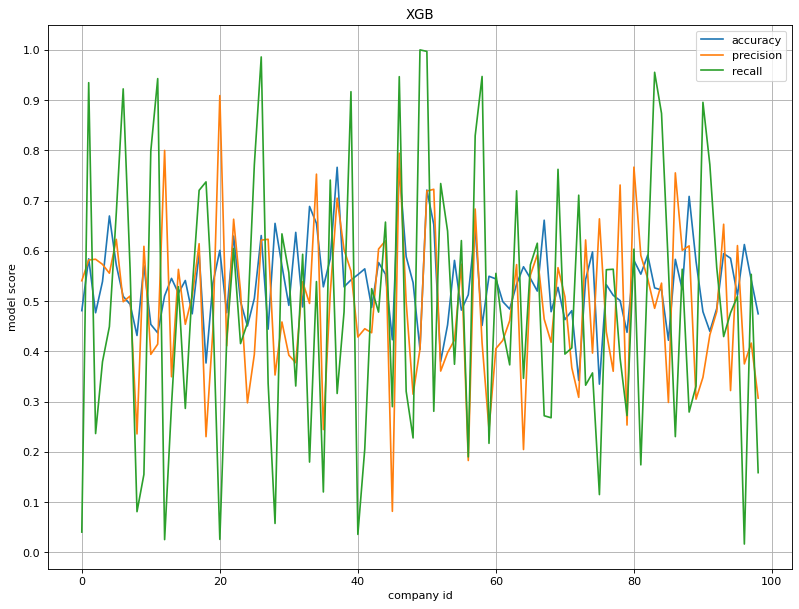

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("XGB")
for i in range(3):
    plt.plot(np.sum(comp_scores_xgb_vols, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

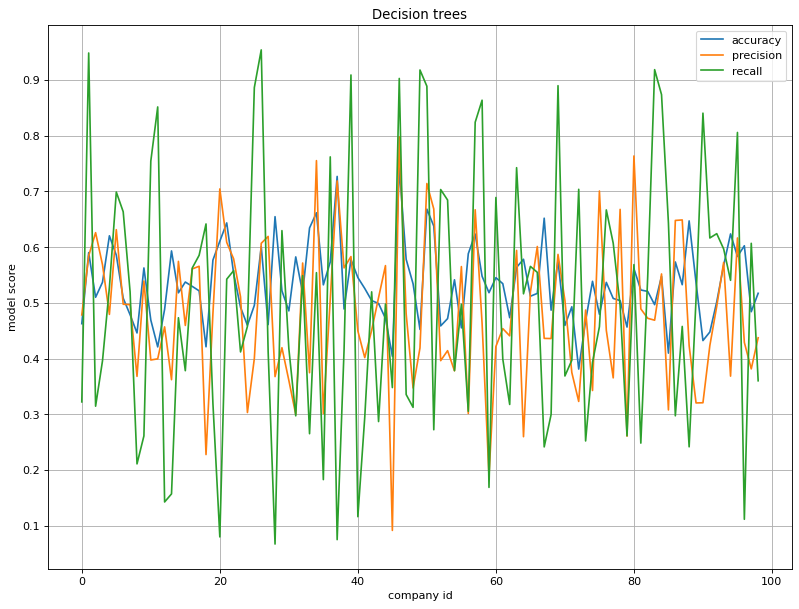

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("Decision trees")
for i in range(3):
    plt.plot(np.sum(comp_scores_dec_tree_vols, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

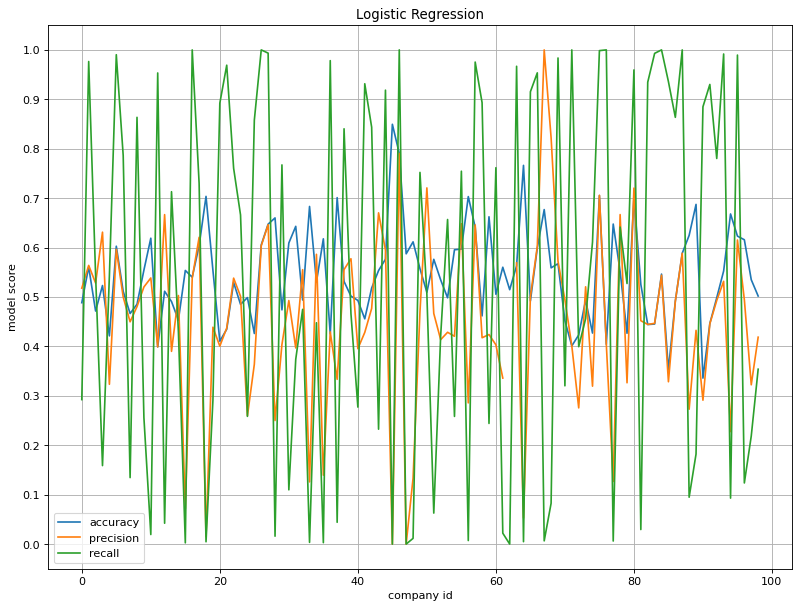

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.title("Logistic Regression")
plt.grid()
for i in range(3):
    plt.plot(np.sum(comp_scores_log_reg_vols, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

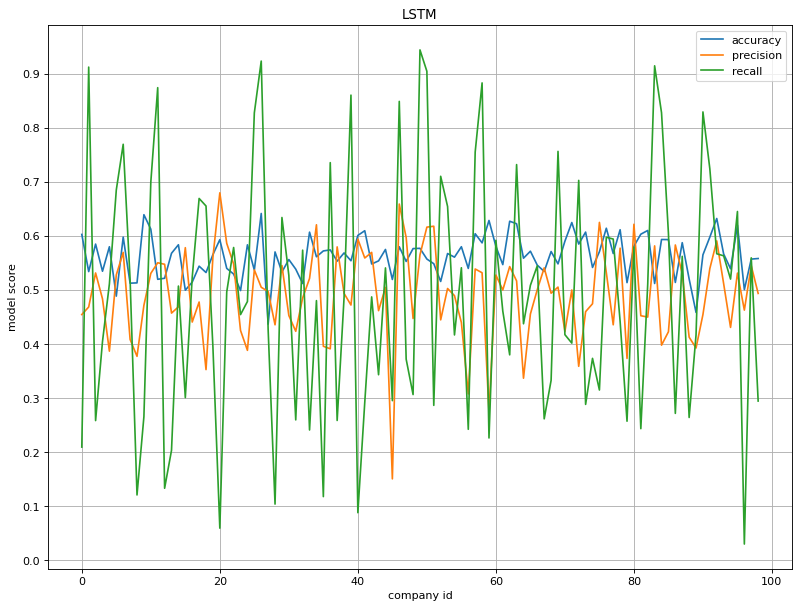

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("LSTM")
for i in range(3):
    plt.plot(np.sum(comp_scores_lstm_vols, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_oi_vwap=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_oi_vwap=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_oi_vwap=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_oi_vwap=np.zeros((len(list_of_companies_number),5, 3)) 
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_oi_vwap[comp_id,i,0], comp_scores_log_reg_oi_vwap[comp_id,i,1],comp_scores_log_reg_oi_vwap[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_dec_tree_oi_vwap[comp_id,i,0], comp_scores_dec_tree_oi_vwap[comp_id,i,1],comp_scores_dec_tree_oi_vwap[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_xgb_oi_vwap[comp_id,i,0], comp_scores_xgb_oi_vwap[comp_id,i,1],comp_scores_xgb_oi_vwap[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_lstm_oi_vwap[comp_id,i,0], comp_scores_lstm_oi_vwap[comp_id,i,1],comp_scores_lstm_oi_vwap[comp_id,i,2]=LSTM(np.copy(X_mom), np.copy(y),split_percent)

0


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.5921724793684424
order_inbalance   -1.717747295325919
vwaps_buy   2.360504480149033
vwaps_sell   0.23592461719396615
vwaps_order_sizes_buy   -0.9445329677758684
vwaps_order_sizes_sell   -0.7120824261322012
[[151 149]
 [345 305]]
Coefficient impact:
true_price   0.3503403504134248
order_inbalance   0.1936880969101435
vwaps_buy   0.14677495330411677
vwaps_sell   0.07850393723499359
vwaps_order_sizes_buy   0.12813686233544078
vwaps_order_sizes_sell   0.10255579980188051
[[102  76]
 [394 378]]
[01:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7142857142857143
Recall:
0.03024193548387097
Coefficient impact:
true_price   -1.5919749387056985
order_inbalance   -1.7178546682818499
vwaps_buy 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7142857142857143
Recall:
0.03024193548387097
Coefficient impact:
true_price   -1.5914847845153557
order_inbalance   -1.717596929719559
vwaps_buy   2.361193265372077
vwaps_sell   0.2363217362900496
vwaps_order_sizes_buy   -0.943399888038109
vwaps_order_sizes_sell   -0.7120895362700659
[[151 149]
 [345 305]]
Coefficient impact:
true_price   0.35116257669554013
order_inbalance   0.19569577715302003
vwaps_buy   0.14312754565295915
vwaps_sell   0.08192420316510556
vwaps_order_sizes_buy   0.13060677811297636
vwaps_order_sizes_sell   0.0974831192203986
[[104  83]
 [392 371]]
[01:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7142857142857143
Recall:
0.03024193548387097
Coefficient impact:
true_price   -1.593027089582399
order_inbalance   -1.7183731686393662
vwaps_buy   2.3618614645527267
vwaps_sell   0.23603804292815309
vwaps_order_sizes_buy   -0.9431925753358852
vwaps_order_sizes_sell   -0.7114458945883065
[[151 149]
 [345 305]]
Coefficient impact:
true_price   0.34229079854419786
order_inbalance   0.20245568669922478
vwaps_buy   0.15558435572334817
vwaps_sell   0.07583042426353041
vwaps_order_sizes_buy   0.12844892891325432
vwaps_order_sizes_sell   0.09538980585644426
[[103  97]
 [393 357]]
[01:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7142857142857143
Recall:
0.03024193548387097
Coefficient impact:
true_price   -1.5901599465064487
order_inbalance   -1.7169956815584844
vwaps_buy   2.359666449961178
vwaps_sell   0.23496942371117374
vwaps_order_sizes_buy   -0.9407220733279074
vwaps_order_sizes_sell   -0.7113962613045519
[[151 149]
 [345 305]]
Coefficient impact:
true_price   0.342729528865042
order_inbalance   0.19199866737227977
vwaps_buy   0.14958104897671348
vwaps_sell   0.08684098098652605
vwaps_order_sizes_buy   0.12685795567319882
vwaps_order_sizes_sell   0.1019918181262399
[[ 97  82]
 [399 372]]
[01:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7142857142857143
Recall:
0.03024193548387097
1
Coefficient impact:
true_price   -3.107684058995717
order_inbalance   0.4699271804399011
vwaps_buy   1.3434181032839245
vwaps_sell   2.2846956011767787
vwaps_order_sizes_buy   0.3286571124507239
vwaps_order_sizes_sell   -1.2123537518804883
[[534 412]
 [  2   2]]
Coefficient impact:
true_price   0.349724457009443
order_inbalance   0.1484049266153386
vwaps_buy   0.1303247283239991
vwaps_sell   0.12251727236259408
vwaps_order_sizes_buy   0.13482327022353027
vwaps_order_sizes_sell   0.11420534546509503
[[498 345]
 [ 38  69]]
[01:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045673076923077
Recall:
0.9384328358208955
Coefficient impact:
true_price   -3.1082760901556745
order_inbalance   0.47415118887691854
vwaps_buy   1.3448833555346495
vwaps_sell   2.2832077736477863
vwaps_order_sizes_buy   0.32968501455324584
vwaps_order_sizes_sell   -1.211183119761806
[[534 412]
 [  2   2]]
Coefficient impact:
true_price   0.33050443554680925
order_inbalance   0.15354183510982755
vwaps_buy   0.12712154239059986
vwaps_sell   0.14123917921560553
vwaps_order_sizes_buy   0.13598272071548587
vwaps_order_sizes_sell   0.11161028702167188
[[495 342]
 [ 41  72]]
[01:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045673076923077
Recall:
0.9384328358208955
Coefficient impact:
true_price   -3.106761654553968
order_inbalance   0.4727511571487818
vwaps_buy   1.3448666389489272
vwaps_sell   2.2852797269613037
vwaps_order_sizes_buy   0.3296359254822457
vwaps_order_sizes_sell   -1.211091455944581
[[534 412]
 [  2   2]]
Coefficient impact:
true_price   0.33573472455518344
order_inbalance   0.14804966599059718
vwaps_buy   0.13244238573986836
vwaps_sell   0.12854311499267668
vwaps_order_sizes_buy   0.13732530567693302
vwaps_order_sizes_sell   0.11790480304474128
[[495 341]
 [ 41  73]]
[01:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045673076923077
Recall:
0.9384328358208955
Coefficient impact:
true_price   -3.10688219661002
order_inbalance   0.47143829504888807
vwaps_buy   1.344470095694001
vwaps_sell   2.284549386977143
vwaps_order_sizes_buy   0.33140087513498906
vwaps_order_sizes_sell   -1.210936031207212
[[534 412]
 [  2   2]]
Coefficient impact:
true_price   0.33624794956186016
order_inbalance   0.1537041618227518
vwaps_buy   0.11983779070529324
vwaps_sell   0.12473434184699916
vwaps_order_sizes_buy   0.13599360096023244
vwaps_order_sizes_sell   0.12948215510286323
[[496 346]
 [ 40  68]]
[01:34:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045673076923077
Recall:
0.9384328358208955
Coefficient impact:
true_price   -3.1061162694061992
order_inbalance   0.4729188271476318
vwaps_buy   1.343517150874052
vwaps_sell   2.28554270315366
vwaps_order_sizes_buy   0.3291115917622837
vwaps_order_sizes_sell   -1.2122916221078237
[[534 412]
 [  2   2]]
Coefficient impact:
true_price   0.3399412561831985
order_inbalance   0.15144681066652202
vwaps_buy   0.12529249238970616
vwaps_sell   0.13179092188858096
vwaps_order_sizes_buy   0.13601219131948303
vwaps_order_sizes_sell   0.11551632755250926
[[496 339]
 [ 40  75]]
[01:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6045673076923077
Recall:
0.9384328358208955
2
Coefficient impact:
true_price   -0.38525674997329873
order_inbalance   -0.5583247988466801
vwaps_buy   -0.6441059207277764
vwaps_sell   0.4712541029264955
vwaps_order_sizes_buy   -0.01934738879994662
vwaps_order_sizes_sell   -0.04727513153027728
[[246 241]
 [287 176]]
Coefficient impact:
true_price   0.3300576635982484
order_inbalance   0.18596855022691552
vwaps_buy   0.12697115199360084
vwaps_sell   0.09467323428598351
vwaps_order_sizes_buy   0.14595355407093402
vwaps_order_sizes_sell   0.11637584582431758
[[156  86]
 [377 331]]
[01:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251141552511416
Recall:
0.21575984990619138
Coefficient impact:
true_price   -0.3851929535841304
order_inbalance   -0.5581687221275399
vwaps_buy   -0.6443886290190416
vwaps_sell   0.4710411289264273
vwaps_order_sizes_buy   -0.01897797249358515
vwaps_order_sizes_sell   -0.047485739001575496
[[244 241]
 [289 176]]
Coefficient impact:
true_price   0.3292750259217219
order_inbalance   0.18417642907975673
vwaps_buy   0.13111119015953096
vwaps_sell   0.09482060540471542
vwaps_order_sizes_buy   0.1436277510703054
vwaps_order_sizes_sell   0.11698899836396949
[[161  80]
 [372 337]]
[01:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251141552511416
Recall:
0.21575984990619138
Coefficient impact:
true_price   -0.38481415882691566
order_inbalance   -0.5584199948972983
vwaps_buy   -0.644404652496247
vwaps_sell   0.47093155433957784
vwaps_order_sizes_buy   -0.01898043057726091
vwaps_order_sizes_sell   -0.0475853290724303
[[247 241]
 [286 176]]
Coefficient impact:
true_price   0.32346282942346627
order_inbalance   0.18770556971326682
vwaps_buy   0.13158902406262066
vwaps_sell   0.09269512352013459
vwaps_order_sizes_buy   0.1444710807439307
vwaps_order_sizes_sell   0.12007637253658099
[[149  80]
 [384 337]]
[01:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251141552511416
Recall:
0.21575984990619138
Coefficient impact:
true_price   -0.3847586813559668
order_inbalance   -0.5583370906458026
vwaps_buy   -0.6444177004950593
vwaps_sell   0.4708306106863882
vwaps_order_sizes_buy   -0.01889830236251213
vwaps_order_sizes_sell   -0.047904454049255696
[[247 241]
 [286 176]]
Coefficient impact:
true_price   0.32957934142083256
order_inbalance   0.1847340378688665
vwaps_buy   0.1308161569735175
vwaps_sell   0.09892248293535302
vwaps_order_sizes_buy   0.15237058277721682
vwaps_order_sizes_sell   0.1035773980242137
[[160  86]
 [373 331]]
[01:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251141552511416
Recall:
0.21575984990619138
Coefficient impact:
true_price   -0.3848801574485363
order_inbalance   -0.5583330953118046
vwaps_buy   -0.644357068896161
vwaps_sell   0.471014703714511
vwaps_order_sizes_buy   -0.01933436296572535
vwaps_order_sizes_sell   -0.047491433409256906
[[248 241]
 [285 176]]
Coefficient impact:
true_price   0.3398751523073975
order_inbalance   0.1869780636680913
vwaps_buy   0.1243731640218758
vwaps_sell   0.09073354973536685
vwaps_order_sizes_buy   0.1429484482093131
vwaps_order_sizes_sell   0.11509162205795553
[[164  86]
 [369 331]]
[01:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5251141552511416
Recall:
0.21575984990619138
3


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.43046185545188625
order_inbalance   0.8931265118773937
vwaps_buy   -0.21473020929086917
vwaps_sell   0.08157314562357704
vwaps_order_sizes_buy   1.246105535872403
vwaps_order_sizes_sell   1.0927898028612348
[[ 74  44]
 [411 421]]
Coefficient impact:
true_price   0.39452819787313803
order_inbalance   0.1487374597795696
vwaps_buy   0.08248844241165318
vwaps_sell   0.13143767036085666
vwaps_order_sizes_buy   0.10597920587652979
vwaps_order_sizes_sell   0.1368290236982528
[[182 168]
 [303 297]]
[01:34:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5389830508474577
Recall:
0.32783505154639175
Coefficient impact:
true_price   -0.4309737231615823
order_inbalance   0.8925377020695985
vwaps_buy 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5389830508474577
Recall:
0.32783505154639175
Coefficient impact:
true_price   -0.4304652947633492
order_inbalance   0.8918742838038103
vwaps_buy   -0.215215309042894
vwaps_sell   0.08200260050473256
vwaps_order_sizes_buy   1.2454997907891374
vwaps_order_sizes_sell   1.0923046334669524
[[ 74  44]
 [411 421]]
Coefficient impact:
true_price   0.39055444495023983
order_inbalance   0.14249995962894577
vwaps_buy   0.08954202383697066
vwaps_sell   0.13830221544398333
vwaps_order_sizes_buy   0.10772685596120456
vwaps_order_sizes_sell   0.13137450017865585
[[181 167]
 [304 298]]
[01:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5389830508474577
Recall:
0.32783505154639175
Coefficient impact:
true_price   -0.4307722955629048
order_inbalance   0.8930032194499372
vwaps_buy   -0.21497099532744243
vwaps_sell   0.08199957089007533
vwaps_order_sizes_buy   1.2461039099550806
vwaps_order_sizes_sell   1.0923905129254483
[[ 74  44]
 [411 421]]
Coefficient impact:
true_price   0.38937316095584534
order_inbalance   0.15457145205200223
vwaps_buy   0.08024146017349132
vwaps_sell   0.13807447350043067
vwaps_order_sizes_buy   0.10166066175789784
vwaps_order_sizes_sell   0.13607879156033253
[[202 162]
 [283 303]]
[01:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5389830508474577
Recall:
0.32783505154639175
Coefficient impact:
true_price   -0.43048199961663386
order_inbalance   0.8925549058692722
vwaps_buy   -0.21503895697933298
vwaps_sell   0.08165656207446763
vwaps_order_sizes_buy   1.2463066169118373
vwaps_order_sizes_sell   1.093323420898958
[[ 74  44]
 [411 421]]
Coefficient impact:
true_price   0.394246314489828
order_inbalance   0.14447299878833034
vwaps_buy   0.0780418077563173
vwaps_sell   0.13332228132848273
vwaps_order_sizes_buy   0.10872807385156967
vwaps_order_sizes_sell   0.1411885237854718
[[193 169]
 [292 296]]
[01:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5389830508474577
Recall:
0.32783505154639175
4


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.4916039802743777
order_inbalance   1.2476247050292397
vwaps_buy   0.045405728095510495
vwaps_sell   -0.0027643401375227997
vwaps_order_sizes_buy   2.720209993128414
vwaps_order_sizes_sell   -0.059252501907456775
[[148 375]
 [197 230]]
Coefficient impact:
true_price   0.3253465595460945
order_inbalance   0.18302692722278568
vwaps_buy   0.13706464795475728
vwaps_sell   0.09566588903273894
vwaps_order_sizes_buy   0.12725703409993322
vwaps_order_sizes_sell   0.13163894214369032
[[143 215]
 [202 390]]
[01:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46551724137931033
Recall:
0.391304347826087
Coefficient impact:
true_price   -1.4894120825760988
order_inbalance   1.2465601518607967
vwaps

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46551724137931033
Recall:
0.391304347826087
Coefficient impact:
true_price   -1.4914348192503346
order_inbalance   1.2480326941201847
vwaps_buy   0.044175697301517707
vwaps_sell   -0.002398593350596797
vwaps_order_sizes_buy   2.720005950218724
vwaps_order_sizes_sell   -0.05985571825910853
[[148 375]
 [197 230]]
Coefficient impact:
true_price   0.3246082688796103
order_inbalance   0.17911014735525796
vwaps_buy   0.13819824059488642
vwaps_sell   0.09394492780574171
vwaps_order_sizes_buy   0.12030982911228758
vwaps_order_sizes_sell   0.14382858625221598
[[147 227]
 [198 378]]
[01:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46551724137931033
Recall:
0.391304347826087
Coefficient impact:
true_price   -1.4918922387378235
order_inbalance   1.2462125676204665
vwaps_buy   0.044646787277602955
vwaps_sell   -0.003911860954858656
vwaps_order_sizes_buy   2.7203842001734126
vwaps_order_sizes_sell   -0.05878056945241723
[[148 375]
 [197 230]]
Coefficient impact:
true_price   0.33205497018381863
order_inbalance   0.18065981577163082
vwaps_buy   0.1373548893626239
vwaps_sell   0.10238648841944477
vwaps_order_sizes_buy   0.12650164438744455
vwaps_order_sizes_sell   0.12104219187503723
[[144 209]
 [201 396]]
[01:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46551724137931033
Recall:
0.391304347826087
Coefficient impact:
true_price   -1.4929771802624372
order_inbalance   1.2470067925131665
vwaps_buy   0.04405480075060638
vwaps_sell   -0.0037133525213979925
vwaps_order_sizes_buy   2.7207975838169025
vwaps_order_sizes_sell   -0.05932842116184531
[[147 374]
 [198 231]]
Coefficient impact:
true_price   0.3303040699337617
order_inbalance   0.18450901634652644
vwaps_buy   0.1289998133499294
vwaps_sell   0.10409964426667717
vwaps_order_sizes_buy   0.12497776151219556
vwaps_order_sizes_sell   0.1271096945909098
[[144 218]
 [201 387]]
[01:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46551724137931033
Recall:
0.391304347826087
5
Coefficient impact:
true_price   -2.6664009276580565
order_inbalance   -0.2686087741479961
vwaps_buy   0.7925347030970129
vwaps_sell   0.516370403612023
vwaps_order_sizes_buy   1.2792198667884909
vwaps_order_sizes_sell   0.6619420105844354
[[555 395]
 [  0   0]]
Coefficient impact:
true_price   0.3682906783082641
order_inbalance   0.16245475743046037
vwaps_buy   0.12045816507763744
vwaps_sell   0.09978130387403182
vwaps_order_sizes_buy   0.1369263507040525
vwaps_order_sizes_sell   0.11208874460555378
[[418 252]
 [137 143]]
[01:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6213114754098361
Recall:
0.6828828828828829
Coefficient impact:
true_price   -2.668070365922339
order_inbalance   -0.2682535902225461
vwaps_buy   0.7919249713919808
vwaps_sell   0.5157092595787193
vwaps_order_sizes_buy   1.2793080700278199
vwaps_order_sizes_sell   0.6632032009128556
[[555 395]
 [  0   0]]
Coefficient impact:
true_price   0.3674709264377992
order_inbalance   0.14678682221886344
vwaps_buy   0.12309387829473709
vwaps_sell   0.10912448554009808
vwaps_order_sizes_buy   0.13825299794018314
vwaps_order_sizes_sell   0.11527088956831921
[[421 260]
 [134 135]]
[01:34:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6213114754098361
Recall:
0.6828828828828829
Coefficient impact:
true_price   -2.6660610153227005
order_inbalance   -0.26645740932879464
vwaps_buy   0.7928402204627734
vwaps_sell   0.515676097107342
vwaps_order_sizes_buy   1.2797789643353905
vwaps_order_sizes_sell   0.6634145831900501
[[555 395]
 [  0   0]]
Coefficient impact:
true_price   0.367341198827791
order_inbalance   0.153680452626367
vwaps_buy   0.12653603408598993
vwaps_sell   0.0940709113479348
vwaps_order_sizes_buy   0.13896437899863118
vwaps_order_sizes_sell   0.11940702411328621
[[417 259]
 [138 136]]
[01:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6213114754098361
Recall:
0.6828828828828829
Coefficient impact:
true_price   -2.666418591019773
order_inbalance   -0.2670922692315671
vwaps_buy   0.7933151000733741
vwaps_sell   0.5165659577280224
vwaps_order_sizes_buy   1.2818188791079816
vwaps_order_sizes_sell   0.6638007995689611
[[555 395]
 [  0   0]]
Coefficient impact:
true_price   0.36908470690477985
order_inbalance   0.1508324245609495
vwaps_buy   0.11945751129543902
vwaps_sell   0.10921892688045305
vwaps_order_sizes_buy   0.1384551870619438
vwaps_order_sizes_sell   0.11295124329643477
[[423 258]
 [132 137]]
[01:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6213114754098361
Recall:
0.6828828828828829
Coefficient impact:
true_price   -2.6642296232158373
order_inbalance   -0.2679176039246409
vwaps_buy   0.7937367983559606
vwaps_sell   0.5161319843729967
vwaps_order_sizes_buy   1.2807021851513392
vwaps_order_sizes_sell   0.6642608983738146
[[555 395]
 [  0   0]]
Coefficient impact:
true_price   0.37020207215986883
order_inbalance   0.14229903903839872
vwaps_buy   0.12046742742825033
vwaps_sell   0.11419667454022216
vwaps_order_sizes_buy   0.14010982845947795
vwaps_order_sizes_sell   0.11272495837378198
[[422 261]
 [133 134]]
[01:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6213114754098361
Recall:
0.6828828828828829
6
Coefficient impact:
true_price   -3.2642884669068373
order_inbalance   -0.0012835847311398704
vwaps_buy   0.6018488626122002
vwaps_sell   0.5312215082580819
vwaps_order_sizes_buy   -1.9957066538696384
vwaps_order_sizes_sell   -2.1892945761358558
[[462 486]
 [  2   0]]
Coefficient impact:
true_price   0.3498392507694624
order_inbalance   0.19288425139954946
vwaps_buy   0.11298700027411598
vwaps_sell   0.10844120026578516
vwaps_order_sizes_buy   0.11370268405797021
vwaps_order_sizes_sell   0.12214561323311694
[[350 346]
 [114 140]]
[01:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4849537037037037
Recall:
0.9030172413793104
Coefficient impact:
true_price   -3.266822596945951
order_inbalance   -0.0006393161533923519
vwaps_buy   0.6016254705209674
vwaps_sell   0.5296278113848286
vwaps_order_sizes_buy   -1.9976830382896356
vwaps_order_sizes_sell   -2.1887883863629325
[[462 486]
 [  2   0]]
Coefficient impact:
true_price   0.3585473693584376
order_inbalance   0.1952431092104197
vwaps_buy   0.10680563972508711
vwaps_sell   0.1088809726215797
vwaps_order_sizes_buy   0.11118112207984526
vwaps_order_sizes_sell   0.1193417870046304
[[340 324]
 [124 162]]
[01:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4849537037037037
Recall:
0.9030172413793104
Coefficient impact:
true_price   -3.265097879985458
order_inbalance   -0.0023819655320633693
vwaps_buy   0.6002387237535716
vwaps_sell   0.5301520237443759
vwaps_order_sizes_buy   -1.998514394373411
vwaps_order_sizes_sell   -2.1877079592038804
[[462 486]
 [  2   0]]
Coefficient impact:
true_price   0.3640528301199044
order_inbalance   0.19330761413414468
vwaps_buy   0.10885929446471719
vwaps_sell   0.10227635261244448
vwaps_order_sizes_buy   0.10511055644675799
vwaps_order_sizes_sell   0.12639335222203113
[[337 322]
 [127 164]]
[01:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4849537037037037
Recall:
0.9030172413793104
Coefficient impact:
true_price   -3.265188192884886
order_inbalance   -0.0003650710388753848
vwaps_buy   0.6011974174454972
vwaps_sell   0.5300854602130358
vwaps_order_sizes_buy   -1.9973888340602606
vwaps_order_sizes_sell   -2.1886873736260535
[[462 486]
 [  2   0]]
Coefficient impact:
true_price   0.3543336694276969
order_inbalance   0.20202112675339506
vwaps_buy   0.09875895579259875
vwaps_sell   0.1050759476367082
vwaps_order_sizes_buy   0.11764066838321909
vwaps_order_sizes_sell   0.12216963200638212
[[330 322]
 [134 164]]
[01:34:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4849537037037037
Recall:
0.9030172413793104
Coefficient impact:
true_price   -3.2655478074209507
order_inbalance   -0.0002316708725710445
vwaps_buy   0.6015765573125095
vwaps_sell   0.5306073095444221
vwaps_order_sizes_buy   -1.9978285836578609
vwaps_order_sizes_sell   -2.188939878144755
[[462 486]
 [  2   0]]
Coefficient impact:
true_price   0.35048977476301685
order_inbalance   0.19573672407599324
vwaps_buy   0.11039489957796021
vwaps_sell   0.10333002986969683
vwaps_order_sizes_buy   0.1176179193429995
vwaps_order_sizes_sell   0.12243065237033329
[[356 349]
 [108 137]]
[01:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4849537037037037
Recall:
0.9030172413793104
7
Coefficient impact:
true_price   -2.799551052029208
order_inbalance   -0.2833497379773796
vwaps_buy   0.949065614610182
vwaps_sell   2.148615818759825
vwaps_order_sizes_buy   -1.143379494134501
vwaps_order_sizes_sell   -0.1368786414274084
[[ 12   7]
 [480 451]]
Coefficient impact:
true_price   0.39695795562826086
order_inbalance   0.1428947258177466
vwaps_buy   0.09535366905640422
vwaps_sell   0.09789930921272391
vwaps_order_sizes_buy   0.12815465768540235
vwaps_order_sizes_sell   0.13873968259946215
[[213 266]
 [279 192]]
[01:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453448275862069
Recall:
0.5345528455284553
Coefficient impact:
true_price   -2.797452974169824
order_inbalance   -0.28350511884577156
vwaps_buy   0.9490966154481846
vwaps_sell   2.1488845737500437
vwaps_order_sizes_buy   -1.1447165906328276
vwaps_order_sizes_sell   -0.13579258008668085
[[ 12   7]
 [480 451]]
Coefficient impact:
true_price   0.3962352164414437
order_inbalance   0.14453732055070648
vwaps_buy   0.09496479152297337
vwaps_sell   0.09796526365587865
vwaps_order_sizes_buy   0.12126654201708516
vwaps_order_sizes_sell   0.1450308658119125
[[214 268]
 [278 190]]
[01:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453448275862069
Recall:
0.5345528455284553
Coefficient impact:
true_price   -2.7982195761715056
order_inbalance   -0.2835853486097284
vwaps_buy   0.9481201144395607
vwaps_sell   2.1497937372796816
vwaps_order_sizes_buy   -1.1445568086456692
vwaps_order_sizes_sell   -0.13737499228642422
[[ 12   7]
 [480 451]]
Coefficient impact:
true_price   0.3869364432774308
order_inbalance   0.15756654883052904
vwaps_buy   0.08969442720305192
vwaps_sell   0.09978100284040657
vwaps_order_sizes_buy   0.12597343131238622
vwaps_order_sizes_sell   0.14004814653619554
[[216 272]
 [276 186]]
[01:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453448275862069
Recall:
0.5345528455284553
Coefficient impact:
true_price   -2.7979523118490914
order_inbalance   -0.2831815792188456
vwaps_buy   0.9495430262796234
vwaps_sell   2.1499422552868523
vwaps_order_sizes_buy   -1.1446031195792359
vwaps_order_sizes_sell   -0.13562540105461346
[[ 12   7]
 [480 451]]
Coefficient impact:
true_price   0.3958238590344495
order_inbalance   0.13685384299439585
vwaps_buy   0.10299975913362311
vwaps_sell   0.09635899765174744
vwaps_order_sizes_buy   0.12480532706375623
vwaps_order_sizes_sell   0.14315821412202773
[[233 276]
 [259 182]]
[01:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453448275862069
Recall:
0.5345528455284553
Coefficient impact:
true_price   -2.799391482540377
order_inbalance   -0.2840446111040518
vwaps_buy   0.949228212875073
vwaps_sell   2.1493504922523354
vwaps_order_sizes_buy   -1.1445454166358258
vwaps_order_sizes_sell   -0.1384076466279355
[[ 12   7]
 [480 451]]
Coefficient impact:
true_price   0.3969931698221486
order_inbalance   0.14344211619439806
vwaps_buy   0.0946257501997487
vwaps_sell   0.10279730393367975
vwaps_order_sizes_buy   0.12463517275821327
vwaps_order_sizes_sell   0.1375064870918116
[[221 268]
 [271 190]]
[01:34:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.453448275862069
Recall:
0.5345528455284553
8
Coefficient impact:
true_price   -2.1142058939561372
order_inbalance   -0.6169402243487466
vwaps_buy   0.2122337407460697
vwaps_sell   -0.12256911040141608
vwaps_order_sizes_buy   -1.5065479740136591
vwaps_order_sizes_sell   1.0742642829948543
[[407 469]
 [ 50  24]]
Coefficient impact:
true_price   0.4103927072254281
order_inbalance   0.1302808886061405
vwaps_buy   0.11604661260721358
vwaps_sell   0.11054344273270973
vwaps_order_sizes_buy   0.0885552442361871
vwaps_order_sizes_sell   0.14418110459232114
[[139 134]
 [318 359]]
[01:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47368421052631576
Recall:
0.13785557986870897
Coefficient impact:
true_price   -2.1141904042201207
order_inbalance   -0.6160871945813888
vwaps_buy   0.21446973371489894
vwaps_sell   -0.1221629442488327
vwaps_order_sizes_buy   -1.504722014240825
vwaps_order_sizes_sell   1.0751352048879992
[[407 469]
 [ 50  24]]
Coefficient impact:
true_price   0.41455009236643675
order_inbalance   0.13675637838086488
vwaps_buy   0.11152542047526531
vwaps_sell   0.10301939081210235
vwaps_order_sizes_buy   0.09458750217639003
vwaps_order_sizes_sell   0.1395612157889408
[[139 134]
 [318 359]]
[01:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47368421052631576
Recall:
0.13785557986870897
Coefficient impact:
true_price   -2.1148844929938355
order_inbalance   -0.6160604876786414
vwaps_buy   0.2133371090569829
vwaps_sell   -0.12098668073075614
vwaps_order_sizes_buy   -1.50517290682786
vwaps_order_sizes_sell   1.0767821599155682
[[407 469]
 [ 50  24]]
Coefficient impact:
true_price   0.4053582707039075
order_inbalance   0.1374148604205683
vwaps_buy   0.11186718489047144
vwaps_sell   0.10877808798937182
vwaps_order_sizes_buy   0.09521096332170552
vwaps_order_sizes_sell   0.1413706326739755
[[131 129]
 [326 364]]
[01:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47368421052631576
Recall:
0.13785557986870897
Coefficient impact:
true_price   -2.11481837931583
order_inbalance   -0.6159524374769466
vwaps_buy   0.21351162977900298
vwaps_sell   -0.12211490074229053
vwaps_order_sizes_buy   -1.5050912463713395
vwaps_order_sizes_sell   1.0765518447384763
[[407 469]
 [ 50  24]]
Coefficient impact:
true_price   0.4087454189543042
order_inbalance   0.13674346728073486
vwaps_buy   0.11128499040414822
vwaps_sell   0.10728240263046054
vwaps_order_sizes_buy   0.09420472603135917
vwaps_order_sizes_sell   0.1417389946989929
[[139 134]
 [318 359]]
[01:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47368421052631576
Recall:
0.13785557986870897
Coefficient impact:
true_price   -2.11467783536138
order_inbalance   -0.6166518034953217
vwaps_buy   0.21357200718638064
vwaps_sell   -0.12186406700905277
vwaps_order_sizes_buy   -1.5058684626392858
vwaps_order_sizes_sell   1.0752719208013113
[[407 469]
 [ 50  24]]
Coefficient impact:
true_price   0.4086284699216078
order_inbalance   0.1362347168253692
vwaps_buy   0.10189708784801142
vwaps_sell   0.11171278027732134
vwaps_order_sizes_buy   0.09612650771339389
vwaps_order_sizes_sell   0.14540043741429642
[[225 210]
 [232 283]]
[01:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47368421052631576
Recall:
0.13785557986870897
9
Coefficient impact:
true_price   -1.2372039235082777
order_inbalance   1.0055682903132592
vwaps_buy   0.11550750605530181
vwaps_sell   0.40373791724383323
vwaps_order_sizes_buy   0.8348530392232613
vwaps_order_sizes_sell   2.929287436634091
[[ 78  74]
 [354 444]]
Coefficient impact:
true_price   0.33024937316737485
order_inbalance   0.19239078250991118
vwaps_buy   0.11547116162012944
vwaps_sell   0.10011717927048032
vwaps_order_sizes_buy   0.11384052898248392
vwaps_order_sizes_sell   0.14793097444962017
[[ 87  72]
 [345 446]]
[01:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6283783783783784
Recall:
0.2152777777777778
Coefficient impact:
true_price   -1.237133791244254
order_inbalance   1.007644414898792
vwaps_buy   0.11159117572650464
vwaps_sell   0.40528410373699175
vwaps_order_sizes_buy   0.8322187069986307
vwaps_order_sizes_sell   2.9295451589342467
[[ 81  77]
 [351 441]]
Coefficient impact:
true_price   0.3325633667607154
order_inbalance   0.18735011718052527
vwaps_buy   0.11279457069866056
vwaps_sell   0.09502290460088782
vwaps_order_sizes_buy   0.12128383693718278
vwaps_order_sizes_sell   0.15098520382202826
[[ 93  74]
 [339 444]]
[01:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6283783783783784
Recall:
0.2152777777777778
Coefficient impact:
true_price   -1.23498269118696
order_inbalance   1.0047321228698274
vwaps_buy   0.11533737303939473
vwaps_sell   0.4047298421148397
vwaps_order_sizes_buy   0.831826166952584
vwaps_order_sizes_sell   2.927974084127976
[[ 81  78]
 [351 440]]
Coefficient impact:
true_price   0.33462541988307926
order_inbalance   0.19151694741034997
vwaps_buy   0.11592955222369646
vwaps_sell   0.09836929640815852
vwaps_order_sizes_buy   0.11131937052055278
vwaps_order_sizes_sell   0.14823941355416317
[[ 84  69]
 [348 449]]
[01:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6283783783783784
Recall:
0.2152777777777778
Coefficient impact:
true_price   -1.2345197878218037
order_inbalance   1.0058087925263446
vwaps_buy   0.11279198289127869
vwaps_sell   0.4053553782395295
vwaps_order_sizes_buy   0.8304720094128012
vwaps_order_sizes_sell   2.930890312943882
[[ 81  77]
 [351 441]]
Coefficient impact:
true_price   0.3308910793198478
order_inbalance   0.1908139510889004
vwaps_buy   0.1168819221257266
vwaps_sell   0.10067446272348898
vwaps_order_sizes_buy   0.1166130699075363
vwaps_order_sizes_sell   0.1441255148344998
[[ 95  74]
 [337 444]]
[01:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6283783783783784
Recall:
0.2152777777777778
Coefficient impact:
true_price   -1.2368058377759932
order_inbalance   1.0066491442598042
vwaps_buy   0.11383982790657443
vwaps_sell   0.4065485102800142
vwaps_order_sizes_buy   0.8339992080028933
vwaps_order_sizes_sell   2.928400660885384
[[ 80  77]
 [352 441]]
Coefficient impact:
true_price   0.3341986317013734
order_inbalance   0.19365614101979275
vwaps_buy   0.10373462884164933
vwaps_sell   0.09723866395062868
vwaps_order_sizes_buy   0.11762723192742673
vwaps_order_sizes_sell   0.15354470255912908
[[ 91  83]
 [341 435]]
[01:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6283783783783784
Recall:
0.2152777777777778
10
Coefficient impact:
true_price   -1.567906348896504
order_inbalance   -0.16908615083913228
vwaps_buy   0.6347608350890227
vwaps_sell   -0.5568401744425642
vwaps_order_sizes_buy   1.8506479545193892
vwaps_order_sizes_sell   1.6089194860480962
[[ 11   4]
 [352 583]]
Coefficient impact:
true_price   0.37387838503437165
order_inbalance   0.14962765027556627
vwaps_buy   0.10521251577854056
vwaps_sell   0.09885789581449371
vwaps_order_sizes_buy   0.1339028225117366
vwaps_order_sizes_sell   0.13852073058529127
[[246 345]
 [117 242]]
[01:34:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39747191011235955
Recall:
0.7796143250688705
Coefficient impact:
true_price   -1.5671220875370837
order_inbalance   -0.16981566257788003
vwaps_buy   0.6343874938780805
vwaps_sell   -0.5578254357995125
vwaps_order_sizes_buy   1.8510284323818107
vwaps_order_sizes_sell   1.6089203435060435
[[ 11   4]
 [352 583]]
Coefficient impact:
true_price   0.3841138218215721
order_inbalance   0.15459790871308837
vwaps_buy   0.1130968582209789
vwaps_sell   0.09792615422526804
vwaps_order_sizes_buy   0.12715366514305024
vwaps_order_sizes_sell   0.12311159187604234
[[248 329]
 [115 258]]
[01:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39747191011235955
Recall:
0.7796143250688705
Coefficient impact:
true_price   -1.5673048986804952
order_inbalance   -0.17058931051051754
vwaps_buy   0.6353763544960782
vwaps_sell   -0.5572001231496175
vwaps_order_sizes_buy   1.850428182300536
vwaps_order_sizes_sell   1.6087485644164388
[[ 11   4]
 [352 583]]
Coefficient impact:
true_price   0.3831404292397088
order_inbalance   0.14264664843330035
vwaps_buy   0.11439587601017193
vwaps_sell   0.10148450405549726
vwaps_order_sizes_buy   0.13187008654424934
vwaps_order_sizes_sell   0.1264624557170723
[[246 329]
 [117 258]]
[01:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39747191011235955
Recall:
0.7796143250688705
Coefficient impact:
true_price   -1.5670166838317223
order_inbalance   -0.17019868829097787
vwaps_buy   0.6346011763356705
vwaps_sell   -0.556675705097903
vwaps_order_sizes_buy   1.850168182961552
vwaps_order_sizes_sell   1.608134803706703
[[ 11   4]
 [352 583]]
Coefficient impact:
true_price   0.37238848366914623
order_inbalance   0.14829626219217285
vwaps_buy   0.1108081206235133
vwaps_sell   0.10813481815641086
vwaps_order_sizes_buy   0.13162426209907396
vwaps_order_sizes_sell   0.1287480532596827
[[251 342]
 [112 245]]
[01:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39747191011235955
Recall:
0.7796143250688705
Coefficient impact:
true_price   -1.567320217965282
order_inbalance   -0.16934616050598433
vwaps_buy   0.6353158533248522
vwaps_sell   -0.5573032171431315
vwaps_order_sizes_buy   1.8497097877472648
vwaps_order_sizes_sell   1.6092332020076177
[[ 11   4]
 [352 583]]
Coefficient impact:
true_price   0.3810507462438522
order_inbalance   0.1444854175139356
vwaps_buy   0.11033939970537676
vwaps_sell   0.11325324417831953
vwaps_order_sizes_buy   0.13303579560393194
vwaps_order_sizes_sell   0.11783539675458393
[[247 322]
 [116 265]]
[01:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39747191011235955
Recall:
0.7796143250688705
11
Coefficient impact:
true_price   0.6221909545622949
order_inbalance   1.2660750484460535
vwaps_buy   -0.4875574296821454
vwaps_sell   -0.8979115994177821
vwaps_order_sizes_buy   0.8030592975433528
vwaps_order_sizes_sell   0.0013251812680244895
[[384 565]
 [  1   0]]
Coefficient impact:
true_price   0.36670224425022624
order_inbalance   0.1969912659096215
vwaps_buy   0.10861010899804052
vwaps_sell   0.12391416173461921
vwaps_order_sizes_buy   0.09915384760203194
vwaps_order_sizes_sell   0.1046283715054605
[[354 510]
 [ 31  55]]
[01:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41723356009070295
Recall:
0.9558441558441558
Coefficient impact:
true_price   0.622924185442776
order_inbalance   1.266086387661429
vwaps_buy   -0.48726146577416773
vwaps_sell   -0.8988841437927974
vwaps_order_sizes_buy   0.8033647916840166
vwaps_order_sizes_sell   7.015272932556781e-05
[[384 565]
 [  1   0]]
Coefficient impact:
true_price   0.3604856095268972
order_inbalance   0.19468386611085783
vwaps_buy   0.1041149477980967
vwaps_sell   0.12414971084477319
vwaps_order_sizes_buy   0.1040054338983576
vwaps_order_sizes_sell   0.11256043182101753
[[354 510]
 [ 31  55]]
[01:34:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41723356009070295
Recall:
0.9558441558441558
Coefficient impact:
true_price   0.6239321087281827
order_inbalance   1.2658745057632321
vwaps_buy   -0.4873436663767534
vwaps_sell   -0.898617752335064
vwaps_order_sizes_buy   0.8031901313132411
vwaps_order_sizes_sell   9.890257835112639e-05
[[384 565]
 [  1   0]]
Coefficient impact:
true_price   0.3624245993162095
order_inbalance   0.20327959645511887
vwaps_buy   0.10129587064358665
vwaps_sell   0.12566602188582696
vwaps_order_sizes_buy   0.09913432226299139
vwaps_order_sizes_sell   0.1081995894362666
[[354 510]
 [ 31  55]]
[01:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41723356009070295
Recall:
0.9558441558441558
Coefficient impact:
true_price   0.6213880181705573
order_inbalance   1.265492105586663
vwaps_buy   -0.4875484652548351
vwaps_sell   -0.8985056611871038
vwaps_order_sizes_buy   0.8028437142165911
vwaps_order_sizes_sell   -0.0004833278101860982
[[384 565]
 [  1   0]]
Coefficient impact:
true_price   0.36131639403484
order_inbalance   0.20215015710874487
vwaps_buy   0.10261146426161995
vwaps_sell   0.130025656419762
vwaps_order_sizes_buy   0.0961666026060391
vwaps_order_sizes_sell   0.1077297255689941
[[354 510]
 [ 31  55]]
[01:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41723356009070295
Recall:
0.9558441558441558
Coefficient impact:
true_price   0.6227474885952873
order_inbalance   1.26600502564837
vwaps_buy   -0.48712055988778236
vwaps_sell   -0.8980912021169888
vwaps_order_sizes_buy   0.8031956243620366
vwaps_order_sizes_sell   0.0004492022574388556
[[384 565]
 [  1   0]]
Coefficient impact:
true_price   0.3713424481121712
order_inbalance   0.19892988374129766
vwaps_buy   0.10299660304319473
vwaps_sell   0.13228330592431906
vwaps_order_sizes_buy   0.10180287362190724
vwaps_order_sizes_sell   0.0926448855571101
[[354 510]
 [ 31  55]]
[01:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.41723356009070295
Recall:
0.9558441558441558
12
Coefficient impact:
true_price   -3.8482599392404824
order_inbalance   -0.3987483278441723
vwaps_buy   0.25657681049882325
vwaps_sell   0.43133830430335063
vwaps_order_sizes_buy   -0.5782127839228023
vwaps_order_sizes_sell   -0.5760642954999466
[[ 18   6]
 [456 470]]
Coefficient impact:
true_price   0.3869203968170616
order_inbalance   0.22535272988438607
vwaps_buy   0.09254583675262384
vwaps_sell   0.10347702052288928
vwaps_order_sizes_buy   0.1115438847619294
vwaps_order_sizes_sell   0.08016013126110977
[[ 76  31]
 [398 445]]
[01:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36585365853658536
Recall:
0.03164556962025317
Coefficient impact:
true_price   -3.853251288509989
order_inbalance   -0.3990549447710248
vwaps_buy   0.253798602130732
vwaps_sell   0.42575111075366917
vwaps_order_sizes_buy   -0.5796953507590409
vwaps_order_sizes_sell   -0.5788378055457435
[[ 15   5]
 [459 471]]
Coefficient impact:
true_price   0.39692329060284215
order_inbalance   0.21922632470848918
vwaps_buy   0.09116033326414359
vwaps_sell   0.10487166662970558
vwaps_order_sizes_buy   0.10840225649664872
vwaps_order_sizes_sell   0.07941612829817075
[[ 75  50]
 [399 426]]
[01:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36585365853658536
Recall:
0.03164556962025317
Coefficient impact:
true_price   -3.851941081576664
order_inbalance   -0.39734754574230324
vwaps_buy   0.2590069951898667
vwaps_sell   0.42965774325170075
vwaps_order_sizes_buy   -0.5813976881157501
vwaps_order_sizes_sell   -0.5783108059214569
[[ 16   6]
 [458 470]]
Coefficient impact:
true_price   0.39483441115622114
order_inbalance   0.21991875911302583
vwaps_buy   0.09460536615585066
vwaps_sell   0.10436006019179853
vwaps_order_sizes_buy   0.10683257335276902
vwaps_order_sizes_sell   0.07944883003033493
[[ 65  35]
 [409 441]]
[01:34:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36585365853658536
Recall:
0.03164556962025317
Coefficient impact:
true_price   -3.8551986094010307
order_inbalance   -0.4001913986631739
vwaps_buy   0.25729135826282784
vwaps_sell   0.42716820683026074
vwaps_order_sizes_buy   -0.5813426973393372
vwaps_order_sizes_sell   -0.5781119066372193
[[ 16   6]
 [458 470]]
Coefficient impact:
true_price   0.3915913629144021
order_inbalance   0.22347829311101558
vwaps_buy   0.0928511614612678
vwaps_sell   0.10579507670520558
vwaps_order_sizes_buy   0.10815539047933101
vwaps_order_sizes_sell   0.07812871532877787
[[ 59  43]
 [415 433]]
[01:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36585365853658536
Recall:
0.03164556962025317
Coefficient impact:
true_price   -3.855332570399776
order_inbalance   -0.39866220261283275
vwaps_buy   0.258829475648811
vwaps_sell   0.4259701898522387
vwaps_order_sizes_buy   -0.5796724981756719
vwaps_order_sizes_sell   -0.5762708749620956
[[ 15   6]
 [459 470]]
Coefficient impact:
true_price   0.3860830276055849
order_inbalance   0.2286682271432514
vwaps_buy   0.09500446435271485
vwaps_sell   0.10220279307552523
vwaps_order_sizes_buy   0.11116440059787963
vwaps_order_sizes_sell   0.07687708722504415
[[ 67  46]
 [407 430]]
[01:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36585365853658536
Recall:
0.03164556962025317
13
Coefficient impact:
true_price   -1.3212807797945598
order_inbalance   -0.702828436400092
vwaps_buy   0.49890054469204387
vwaps_sell   1.3115354247734785
vwaps_order_sizes_buy   0.10300644148586997
vwaps_order_sizes_sell   0.9564512048360516
[[241 374]
 [104 231]]
Coefficient impact:
true_price   0.386780638400099
order_inbalance   0.19532841157576422
vwaps_buy   0.09028280253618046
vwaps_sell   0.1397863235287701
vwaps_order_sizes_buy   0.11865242704318452
vwaps_order_sizes_sell   0.06916939691600164
[[111 113]
 [234 492]]
[01:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4217391304347826
Recall:
0.2811594202898551
Coefficient impact:
true_price   -1.3219553640855264
order_inbalance   -0.7024438182615258
vwaps_buy   0.4989072938282924
vwaps_sell   1.3121558816671979
vwaps_order_sizes_buy   0.10332363316800802
vwaps_order_sizes_sell   0.9574085181241645
[[241 374]
 [104 231]]
Coefficient impact:
true_price   0.3940764513834114
order_inbalance   0.19699316966574953
vwaps_buy   0.08821336685062027
vwaps_sell   0.12300369688552056
vwaps_order_sizes_buy   0.11370720605393451
vwaps_order_sizes_sell   0.0840061091607636
[[112 104]
 [233 501]]
[01:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4217391304347826
Recall:
0.2811594202898551
Coefficient impact:
true_price   -1.3213412866527
order_inbalance   -0.7033179622420923
vwaps_buy   0.4993946453160483
vwaps_sell   1.3113972251542738
vwaps_order_sizes_buy   0.10213993921680005
vwaps_order_sizes_sell   0.9574770638838848
[[241 374]
 [104 231]]
Coefficient impact:
true_price   0.381885874684928
order_inbalance   0.2010417656518365
vwaps_buy   0.0954343227114254
vwaps_sell   0.13314950876063905
vwaps_order_sizes_buy   0.12011370613820374
vwaps_order_sizes_sell   0.06837482205296734
[[115 115]
 [230 490]]
[01:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4217391304347826
Recall:
0.2811594202898551
Coefficient impact:
true_price   -1.3220902832939962
order_inbalance   -0.7033359340599871
vwaps_buy   0.4993265556305655
vwaps_sell   1.3110190587594877
vwaps_order_sizes_buy   0.10286218144595012
vwaps_order_sizes_sell   0.9569306399734606
[[241 374]
 [104 231]]
Coefficient impact:
true_price   0.3872467930435328
order_inbalance   0.19719406509042822
vwaps_buy   0.10401612140622206
vwaps_sell   0.13444670740625783
vwaps_order_sizes_buy   0.10135688962024753
vwaps_order_sizes_sell   0.07573942343331161
[[112 109]
 [233 496]]
[01:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4217391304347826
Recall:
0.2811594202898551
Coefficient impact:
true_price   -1.321466306615928
order_inbalance   -0.703208356645886
vwaps_buy   0.49899048540055874
vwaps_sell   1.3119181433158413
vwaps_order_sizes_buy   0.10321162835864887
vwaps_order_sizes_sell   0.9574224303866777
[[241 374]
 [104 231]]
Coefficient impact:
true_price   0.3888741040036167
order_inbalance   0.1978567532943458
vwaps_buy   0.08720244905479882
vwaps_sell   0.12189837578515908
vwaps_order_sizes_buy   0.11849272478450405
vwaps_order_sizes_sell   0.08567559307757572
[[112 105]
 [233 500]]
[01:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4217391304347826
Recall:
0.2811594202898551
14
Coefficient impact:
true_price   0.3931705336112111
order_inbalance   1.1199900816092312
vwaps_buy   0.3998033434428724
vwaps_sell   -1.1196916936259333
vwaps_order_sizes_buy   1.6072770921904536
vwaps_order_sizes_sell   -0.7759882365240383
[[197 256]
 [325 172]]
Coefficient impact:
true_price   0.36112797811493563
order_inbalance   0.1977318278563996
vwaps_buy   0.10593711293706956
vwaps_sell   0.10388877174137988
vwaps_order_sizes_buy   0.10500391538259213
vwaps_order_sizes_sell   0.1263103939676232
[[306 217]
 [216 211]]
[01:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720081135902637
Recall:
0.5402298850574713
Coefficient impact:
true_price   0.39478702940080873
order_inbalance   1.1197011316351733
vwaps_buy   0.4000718003581643
vwaps_sell   -1.1189434400882288
vwaps_order_sizes_buy   1.6074421179566944
vwaps_order_sizes_sell   -0.7755162980566059
[[197 258]
 [325 170]]
Coefficient impact:
true_price   0.36962964327298364
order_inbalance   0.1973992371882734
vwaps_buy   0.10748552358660708
vwaps_sell   0.10213991688936878
vwaps_order_sizes_buy   0.09681068913132133
vwaps_order_sizes_sell   0.12653498993144577
[[291 213]
 [231 215]]
[01:35:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720081135902637
Recall:
0.5402298850574713
Coefficient impact:
true_price   0.39423320698304204
order_inbalance   1.1194384410989153
vwaps_buy   0.39984254473622816
vwaps_sell   -1.1191997214033658
vwaps_order_sizes_buy   1.6067726910597582
vwaps_order_sizes_sell   -0.7762924705675261
[[197 257]
 [325 171]]
Coefficient impact:
true_price   0.3751123022292547
order_inbalance   0.19394781986081164
vwaps_buy   0.11060614801713553
vwaps_sell   0.10314256291664478
vwaps_order_sizes_buy   0.09549500710797205
vwaps_order_sizes_sell   0.12169615986818132
[[308 219]
 [214 209]]
[01:35:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720081135902637
Recall:
0.5402298850574713
Coefficient impact:
true_price   0.39394753514546216
order_inbalance   1.1188075512398425
vwaps_buy   0.3998846503299365
vwaps_sell   -1.1190366129828029
vwaps_order_sizes_buy   1.606714031414948
vwaps_order_sizes_sell   -0.7758008101788952
[[197 258]
 [325 170]]
Coefficient impact:
true_price   0.36681125944307513
order_inbalance   0.19235451471673484
vwaps_buy   0.10495573084452042
vwaps_sell   0.10455561059531161
vwaps_order_sizes_buy   0.10370556351367236
vwaps_order_sizes_sell   0.12761732088668565
[[312 224]
 [210 204]]
[01:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720081135902637
Recall:
0.5402298850574713
Coefficient impact:
true_price   0.3942922056342112
order_inbalance   1.1188921664378353
vwaps_buy   0.4005710848961887
vwaps_sell   -1.1192764453731598
vwaps_order_sizes_buy   1.606888539687782
vwaps_order_sizes_sell   -0.7761239438359219
[[197 257]
 [325 171]]
Coefficient impact:
true_price   0.37233845751540756
order_inbalance   0.19321813162490747
vwaps_buy   0.10745250204781946
vwaps_sell   0.09997209329168971
vwaps_order_sizes_buy   0.10069182647877392
vwaps_order_sizes_sell   0.12632698904140188
[[295 219]
 [227 209]]
[01:35:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5720081135902637
Recall:
0.5402298850574713
15
Coefficient impact:
true_price   -0.021715857870298918
order_inbalance   0.0850347270470392
vwaps_buy   0.07177311309930437
vwaps_sell   0.13214391029314454
vwaps_order_sizes_buy   -1.0235378843154752
vwaps_order_sizes_sell   0.26672034654075893
[[  0   0]
 [412 538]]
Coefficient impact:
true_price   0.38749418714481143
order_inbalance   0.18684722487765257
vwaps_buy   0.08514961264248089
vwaps_sell   0.1107430272406405
vwaps_order_sizes_buy   0.10197013940641711
vwaps_order_sizes_sell   0.1277958086879975
[[161 255]
 [251 283]]
[01:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44983818770226536
Recall:
0.33737864077669905
Coefficient impact:
true_price   -0.02143991790834855
order_inbalance   0.08460060910855609
vwaps_buy   0.07191787073847351
vwaps_sell   0.13190255582248597
vwaps_order_sizes_buy   -1.0236314494405567
vwaps_order_sizes_sell   0.26627022318488475
[[  0   0]
 [412 538]]
Coefficient impact:
true_price   0.396280833423961
order_inbalance   0.18133615452239488
vwaps_buy   0.09252681538462498
vwaps_sell   0.10597594704248071
vwaps_order_sizes_buy   0.10985569808733665
vwaps_order_sizes_sell   0.11402455153920191
[[149 246]
 [263 292]]
[01:35:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44983818770226536
Recall:
0.33737864077669905
Coefficient impact:
true_price   -0.02221312661903058
order_inbalance   0.08459017509383637
vwaps_buy   0.0723918977825074
vwaps_sell   0.13206676981183843
vwaps_order_sizes_buy   -1.0236352004611349
vwaps_order_sizes_sell   0.26624294437449403
[[  0   0]
 [412 538]]
Coefficient impact:
true_price   0.3970995445078726
order_inbalance   0.18495621694647996
vwaps_buy   0.08912204635199422
vwaps_sell   0.10720956259776562
vwaps_order_sizes_buy   0.10020940609768297
vwaps_order_sizes_sell   0.1214032234982047
[[159 252]
 [253 286]]
[01:35:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44983818770226536
Recall:
0.33737864077669905
Coefficient impact:
true_price   -0.021925511506698647
order_inbalance   0.08440433519592139
vwaps_buy   0.07197797490112177
vwaps_sell   0.1318987278271621
vwaps_order_sizes_buy   -1.024050898704928
vwaps_order_sizes_sell   0.26679828796213956
[[  0   0]
 [412 538]]
Coefficient impact:
true_price   0.38960999055581574
order_inbalance   0.18744140163405554
vwaps_buy   0.09204938283518628
vwaps_sell   0.10996634214647495
vwaps_order_sizes_buy   0.10043873536864509
vwaps_order_sizes_sell   0.1204941474598223
[[166 254]
 [246 284]]
[01:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44983818770226536
Recall:
0.33737864077669905
Coefficient impact:
true_price   -0.021852620712679672
order_inbalance   0.0847077448999559
vwaps_buy   0.07206041258564173
vwaps_sell   0.132190923440403
vwaps_order_sizes_buy   -1.0238563693342653
vwaps_order_sizes_sell   0.26666161266080435
[[  0   0]
 [412 538]]
Coefficient impact:
true_price   0.39060310178949625
order_inbalance   0.1867844435512586
vwaps_buy   0.084886551004352
vwaps_sell   0.11160570279921397
vwaps_order_sizes_buy   0.10946520501629542
vwaps_order_sizes_sell   0.11665499583938392
[[159 260]
 [253 278]]
[01:35:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44983818770226536
Recall:
0.33737864077669905
16
Coefficient impact:
true_price   -6.387977565092618
order_inbalance   -0.3293648973121421
vwaps_buy   0.4177928899858022
vwaps_sell   -0.7267098261300161
vwaps_order_sizes_buy   0.5365259871341523
vwaps_order_sizes_sell   2.064670271821001
[[509 441]
 [  0   0]]
Coefficient impact:
true_price   0.3825455229482424
order_inbalance   0.15963568240773796
vwaps_buy   0.09866783779595899
vwaps_sell   0.1100690016497314
vwaps_order_sizes_buy   0.12590423519811977
vwaps_order_sizes_sell   0.12317772000020938
[[292 284]
 [217 157]]
[01:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5299760191846523
Recall:
0.43418467583497056
Coefficient impact:
true_price   -6.387218389586497
order_inbalance   -0.3314259183904303
vwaps_buy   0.41510754611543726
vwaps_sell   -0.7271496162922485
vwaps_order_sizes_buy   0.5372447473872621
vwaps_order_sizes_sell   2.0668744064076026
[[509 441]
 [  0   0]]
Coefficient impact:
true_price   0.3893166337801759
order_inbalance   0.15222089470654168
vwaps_buy   0.10886616740951062
vwaps_sell   0.11415395748169604
vwaps_order_sizes_buy   0.12232082391829213
vwaps_order_sizes_sell   0.11312152270378373
[[263 215]
 [246 226]]
[01:35:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5299760191846523
Recall:
0.43418467583497056
Coefficient impact:
true_price   -6.386822604356827
order_inbalance   -0.3319733644052558
vwaps_buy   0.41752084034144427
vwaps_sell   -0.7268334619981311
vwaps_order_sizes_buy   0.534229085053113
vwaps_order_sizes_sell   2.072466148867485
[[509 441]
 [  0   0]]
Coefficient impact:
true_price   0.38566841482513153
order_inbalance   0.15260228561769065
vwaps_buy   0.11761475832233485
vwaps_sell   0.11013895779280626
vwaps_order_sizes_buy   0.119857758376306
vwaps_order_sizes_sell   0.11411782506573061
[[268 265]
 [241 176]]
[01:35:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5299760191846523
Recall:
0.43418467583497056
Coefficient impact:
true_price   -6.386984905302921
order_inbalance   -0.33165748569706194
vwaps_buy   0.4156220982298644
vwaps_sell   -0.7268629727405318
vwaps_order_sizes_buy   0.5369385552136935
vwaps_order_sizes_sell   2.0688943649528193
[[509 441]
 [  0   0]]
Coefficient impact:
true_price   0.3839379717183282
order_inbalance   0.15088403624606722
vwaps_buy   0.1098989357601904
vwaps_sell   0.11640244405870366
vwaps_order_sizes_buy   0.1284407560598306
vwaps_order_sizes_sell   0.11043585615688006
[[266 217]
 [243 224]]
[01:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5299760191846523
Recall:
0.43418467583497056
Coefficient impact:
true_price   -6.390070108316338
order_inbalance   -0.3326485076131751
vwaps_buy   0.41723965587442124
vwaps_sell   -0.724093718522385
vwaps_order_sizes_buy   0.5324299972049192
vwaps_order_sizes_sell   2.0710301454948965
[[509 441]
 [  0   0]]
Coefficient impact:
true_price   0.38503489142186703
order_inbalance   0.15898758834472004
vwaps_buy   0.10987561470447467
vwaps_sell   0.11100126131132731
vwaps_order_sizes_buy   0.11932169502413568
vwaps_order_sizes_sell   0.11577894919347526
[[268 222]
 [241 219]]
[01:35:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5299760191846523
Recall:
0.43418467583497056
17
Coefficient impact:
true_price   -2.9361711001144815
order_inbalance   -0.6693398656615493
vwaps_buy   1.4772764403144936
vwaps_sell   -0.036052134451456185
vwaps_order_sizes_buy   -0.215949485618511
vwaps_order_sizes_sell   0.043240557211556556
[[416 226]
 [110 198]]
Coefficient impact:
true_price   0.39574610788372816
order_inbalance   0.15022678220924923
vwaps_buy   0.12416579213591415
vwaps_sell   0.08362360788241807
vwaps_order_sizes_buy   0.13791001494638344
vwaps_order_sizes_sell   0.10832769494230694
[[338 246]
 [188 178]]
[01:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615146831530139
Recall:
0.7566539923954373
Coefficient impact:
true_price   -2.936239391601981
order_inbalance   -0.6698278708688458
vwaps_buy   1.4770953804628402
vwaps_sell   -0.03588639395248236
vwaps_order_sizes_buy   -0.21710015005023156
vwaps_order_sizes_sell   0.042753713145357
[[416 226]
 [110 198]]
Coefficient impact:
true_price   0.40749992299372634
order_inbalance   0.1510564116904741
vwaps_buy   0.1207088086668824
vwaps_sell   0.07941876030758031
vwaps_order_sizes_buy   0.13485138428435578
vwaps_order_sizes_sell   0.10646471205698115
[[335 248]
 [191 176]]
[01:35:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615146831530139
Recall:
0.7566539923954373
Coefficient impact:
true_price   -2.9364729369153157
order_inbalance   -0.6713582486046625
vwaps_buy   1.4773470708985081
vwaps_sell   -0.035731644117684494
vwaps_order_sizes_buy   -0.2177340548009626
vwaps_order_sizes_sell   0.04346600269154552
[[417 226]
 [109 198]]
Coefficient impact:
true_price   0.4035829078269432
order_inbalance   0.14817723493052798
vwaps_buy   0.11904956410523601
vwaps_sell   0.08208833758499082
vwaps_order_sizes_buy   0.13105647597255
vwaps_order_sizes_sell   0.11604547957975206
[[335 245]
 [191 179]]
[01:35:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615146831530139
Recall:
0.7566539923954373
Coefficient impact:
true_price   -2.935498477569182
order_inbalance   -0.6701904206647596
vwaps_buy   1.4789836763654542
vwaps_sell   -0.03594288106481431
vwaps_order_sizes_buy   -0.21738030260516078
vwaps_order_sizes_sell   0.0399506367981925
[[416 226]
 [110 198]]
Coefficient impact:
true_price   0.4061686878749925
order_inbalance   0.13884623841183336
vwaps_buy   0.12120375715987536
vwaps_sell   0.08196367706981733
vwaps_order_sizes_buy   0.13830112138227066
vwaps_order_sizes_sell   0.11351651810121077
[[352 263]
 [174 161]]
[01:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615146831530139
Recall:
0.7566539923954373
Coefficient impact:
true_price   -2.9363180844556944
order_inbalance   -0.6695995784912269
vwaps_buy   1.477406853075287
vwaps_sell   -0.03571038324479005
vwaps_order_sizes_buy   -0.21792106122069213
vwaps_order_sizes_sell   0.043354840678145413
[[416 226]
 [110 198]]
Coefficient impact:
true_price   0.40581702648720835
order_inbalance   0.13901182821244357
vwaps_buy   0.12354385160440357
vwaps_sell   0.08956073640091573
vwaps_order_sizes_buy   0.13047005149359195
vwaps_order_sizes_sell   0.11159650580143671
[[341 248]
 [185 176]]
[01:35:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.615146831530139
Recall:
0.7566539923954373
18
Coefficient impact:
true_price   -3.600219385982804
order_inbalance   0.990006676980949
vwaps_buy   -0.30311410416636103
vwaps_sell   0.14058732416761602
vwaps_order_sizes_buy   -0.5833654418671022
vwaps_order_sizes_sell   -1.3195394883946647
[[  2  66]
 [215 667]]
Coefficient impact:
true_price   0.37575760217731097
order_inbalance   0.17817340681467614
vwaps_buy   0.09902493863911377
vwaps_sell   0.10954335641254567
vwaps_order_sizes_buy   0.1153698317269006
vwaps_order_sizes_sell   0.12213086422945288
[[141 468]
 [ 76 265]]
[01:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2222222222222222
Recall:
0.663594470046083
Coefficient impact:
true_price   -3.60017758356202
order_inbalance   0.9891909532702934
vwaps_buy   -0.30514828161650265
vwaps_sell   0.13823674345731093
vwaps_order_sizes_buy   -0.5828363426988437
vwaps_order_sizes_sell   -1.3192792179046615
[[  2  67]
 [215 666]]
Coefficient impact:
true_price   0.37667726732752954
order_inbalance   0.17213372245702588
vwaps_buy   0.09634507064951964
vwaps_sell   0.11885504492463625
vwaps_order_sizes_buy   0.1119860995480065
vwaps_order_sizes_sell   0.1240027950932821
[[139 446]
 [ 78 287]]
[01:35:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2222222222222222
Recall:
0.663594470046083
Coefficient impact:
true_price   -3.59949755185561
order_inbalance   0.9906250937996436
vwaps_buy   -0.3057710777905157
vwaps_sell   0.1379536462230988
vwaps_order_sizes_buy   -0.5822097516995873
vwaps_order_sizes_sell   -1.320070973883162
[[  2  68]
 [215 665]]
Coefficient impact:
true_price   0.3735256603379171
order_inbalance   0.17763910435422142
vwaps_buy   0.09863117422069248
vwaps_sell   0.10500268905992736
vwaps_order_sizes_buy   0.11275633552660495
vwaps_order_sizes_sell   0.13244503650063683
[[139 458]
 [ 78 275]]
[01:35:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2222222222222222
Recall:
0.663594470046083
Coefficient impact:
true_price   -3.6004401242156256
order_inbalance   0.9909305224016046
vwaps_buy   -0.30547973713751636
vwaps_sell   0.14064967503822307
vwaps_order_sizes_buy   -0.5815847702155251
vwaps_order_sizes_sell   -1.3187076738171002
[[  2  68]
 [215 665]]
Coefficient impact:
true_price   0.36848229387678005
order_inbalance   0.18471446479411568
vwaps_buy   0.1037240407444577
vwaps_sell   0.11030624685001682
vwaps_order_sizes_buy   0.11172633431468379
vwaps_order_sizes_sell   0.12104661941994596
[[121 440]
 [ 96 293]]
[01:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2222222222222222
Recall:
0.663594470046083
Coefficient impact:
true_price   -3.6011262703334457
order_inbalance   0.9905213187164378
vwaps_buy   -0.30485337636627735
vwaps_sell   0.1387483103631199
vwaps_order_sizes_buy   -0.5821338648207968
vwaps_order_sizes_sell   -1.317816773725149
[[  2  66]
 [215 667]]
Coefficient impact:
true_price   0.37173489065300536
order_inbalance   0.1721876640192893
vwaps_buy   0.09910642464060643
vwaps_sell   0.11851304846831365
vwaps_order_sizes_buy   0.10949635110566791
vwaps_order_sizes_sell   0.1289616211131174
[[123 443]
 [ 94 290]]
[01:35:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2222222222222222
Recall:
0.663594470046083
19
Coefficient impact:
true_price   -2.817980513796793
order_inbalance   0.30074524706221634
vwaps_buy   0.4780194526658276
vwaps_sell   1.4202817286595844
vwaps_order_sizes_buy   -0.620715146802257
vwaps_order_sizes_sell   -0.17798571886485973
[[117 127]
 [275 431]]
Coefficient impact:
true_price   0.3543992077265561
order_inbalance   0.12396479400320175
vwaps_buy   0.11806422549470105
vwaps_sell   0.11125680411288395
vwaps_order_sizes_buy   0.14616460523921948
vwaps_order_sizes_sell   0.1461503634234376
[[192 243]
 [200 315]]
[01:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3940972222222222
Recall:
0.5790816326530612
Coefficient impact:
true_price   -2.817824087251644
order_inbalance   0.30152882121141406
vwaps_buy   0.47735657689989514
vwaps_sell   1.4188263635528429
vwaps_order_sizes_buy   -0.619871588097752
vwaps_order_sizes_sell   -0.17649617422424163
[[120 131]
 [272 427]]
Coefficient impact:
true_price   0.36157538591750643
order_inbalance   0.13997831319715046
vwaps_buy   0.10378900053166826
vwaps_sell   0.10613429193281552
vwaps_order_sizes_buy   0.14178330388269172
vwaps_order_sizes_sell   0.14673970453816754
[[179 231]
 [213 327]]
[01:35:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3940972222222222
Recall:
0.5790816326530612
Coefficient impact:
true_price   -2.817111378582281
order_inbalance   0.30102988241680284
vwaps_buy   0.47746033428270757
vwaps_sell   1.4202452897001707
vwaps_order_sizes_buy   -0.6199291769401238
vwaps_order_sizes_sell   -0.17827947476339764
[[123 135]
 [269 423]]
Coefficient impact:
true_price   0.3628879360013906
order_inbalance   0.12947712092756505
vwaps_buy   0.1059085981212871
vwaps_sell   0.10835862259200821
vwaps_order_sizes_buy   0.14265003758190634
vwaps_order_sizes_sell   0.1507176847758427
[[171 220]
 [221 338]]
[01:35:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3940972222222222
Recall:
0.5790816326530612
Coefficient impact:
true_price   -2.818614858874437
order_inbalance   0.3018231627452771
vwaps_buy   0.4779914913107234
vwaps_sell   1.4187443965142548
vwaps_order_sizes_buy   -0.6214017317880748
vwaps_order_sizes_sell   -0.17840703490909587
[[119 129]
 [273 429]]
Coefficient impact:
true_price   0.36063235137358335
order_inbalance   0.12767224066646837
vwaps_buy   0.11008491253646148
vwaps_sell   0.10451416633800974
vwaps_order_sizes_buy   0.15059700377667692
vwaps_order_sizes_sell   0.14649932530879997
[[162 220]
 [230 338]]
[01:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3940972222222222
Recall:
0.5790816326530612
Coefficient impact:
true_price   -2.81745937084725
order_inbalance   0.3018955439552847
vwaps_buy   0.4786065430942831
vwaps_sell   1.4186212317913858
vwaps_order_sizes_buy   -0.621262316244419
vwaps_order_sizes_sell   -0.17844719217046548
[[123 135]
 [269 423]]
Coefficient impact:
true_price   0.3601692417407293
order_inbalance   0.12616055999766568
vwaps_buy   0.10787302157926677
vwaps_sell   0.10841541356997
vwaps_order_sizes_buy   0.14806818754550838
vwaps_order_sizes_sell   0.1493135755668599
[[193 238]
 [199 320]]
[01:35:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3940972222222222
Recall:
0.5790816326530612
20
Coefficient impact:
true_price   -2.1975221611137647
order_inbalance   0.29218701983775447
vwaps_buy   -0.37492048126726535
vwaps_sell   0.4120575297465014
vwaps_order_sizes_buy   -0.7481012127488769
vwaps_order_sizes_sell   0.04121340289965494
[[361 532]
 [ 27  30]]
Coefficient impact:
true_price   0.3221753139099613
order_inbalance   0.1554470573133176
vwaps_buy   0.1408897282419438
vwaps_sell   0.09872712819181352
vwaps_order_sizes_buy   0.15571057392382315
vwaps_order_sizes_sell   0.1270501984191407
[[ 37  15]
 [351 547]]
[01:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
Coefficient impact:
true_price   -2.1978059519010076
order_inbalance   0.29127953599133133
vwaps_buy   -0.3748294577311452
vwaps_sell   0.413089367522829
vwaps_order_sizes_buy   -0.74692649750761
vwaps_order_sizes_sell   0.044666130742415905
[[363 533]
 [ 25  29]]
Coefficient impact:
true_price   0.32336168196815884
order_inbalance   0.1553205976792165
vwaps_buy   0.14367048194086748
vwaps_sell   0.10560313286912947
vwaps_order_sizes_buy   0.15091921325193572
vwaps_order_sizes_sell   0.12112489229069195
[[ 39  15]
 [349 547]]
[01:35:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
Coefficient impact:
true_price   -2.1950152321382457
order_inbalance   0.2910128218341962
vwaps_buy   -0.37467368640388105
vwaps_sell   0.41067659119583594
vwaps_order_sizes_buy   -0.7467912155505739
vwaps_order_sizes_sell   0.041944190335695686
[[364 534]
 [ 24  28]]
Coefficient impact:
true_price   0.31491543178174897
order_inbalance   0.1562288979569985
vwaps_buy   0.14444092469083458
vwaps_sell   0.09614585891942026
vwaps_order_sizes_buy   0.16179192620568558
vwaps_order_sizes_sell   0.126476960445312
[[ 38  15]
 [350 547]]
[01:35:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
Coefficient impact:
true_price   -2.196437770817599
order_inbalance   0.2904562494654179
vwaps_buy   -0.3750326629338354
vwaps_sell   0.4134673932297954
vwaps_order_sizes_buy   -0.7481307124845875
vwaps_order_sizes_sell   0.04479605123956374
[[363 534]
 [ 25  28]]
Coefficient impact:
true_price   0.31887025782400713
order_inbalance   0.16171676379655642
vwaps_buy   0.14037226744864675
vwaps_sell   0.10188277410152068
vwaps_order_sizes_buy   0.15364279808377415
vwaps_order_sizes_sell   0.12351513874549491
[[ 36  16]
 [352 546]]
[01:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
Coefficient impact:
true_price   -2.1960828222940028
order_inbalance   0.29110588896948486
vwaps_buy   -0.37451388878194797
vwaps_sell   0.41272465693962046
vwaps_order_sizes_buy   -0.7452467479165085
vwaps_order_sizes_sell   0.04471327870171344
[[364 534]
 [ 24  28]]
Coefficient impact:
true_price   0.3131861458537594
order_inbalance   0.16101832159641577
vwaps_buy   0.13869921156268666
vwaps_sell   0.09824989441743905
vwaps_order_sizes_buy   0.1594050254473574
vwaps_order_sizes_sell   0.12944140112234162
[[ 37  15]
 [351 547]]
[01:35:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.015463917525773196
21
Coefficient impact:
true_price   -3.2820795039096318
order_inbalance   -0.48491885542635094
vwaps_buy   -0.8520631916106979
vwaps_sell   0.5781044943597388
vwaps_order_sizes_buy   -2.1922474014373856
vwaps_order_sizes_sell   0.13751347821046545
[[417 519]
 [  3  11]]
Coefficient impact:
true_price   0.3488189726190912
order_inbalance   0.15284355075214023
vwaps_buy   0.11970427707491543
vwaps_sell   0.11755625327068273
vwaps_order_sizes_buy   0.16169465923224358
vwaps_order_sizes_sell   0.0993822870509268
[[188 241]
 [232 289]]
[01:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4360313315926893
Recall:
0.3976190476190476
Coefficient impact:
true_price   -3.280341186879757
order_inbalance   -0.4826379971169613
vwaps_buy   -0.8495094367570464
vwaps_sell   0.5788840143136866
vwaps_order_sizes_buy   -2.190969992312541
vwaps_order_sizes_sell   0.13768930298872425
[[418 520]
 [  2  10]]
Coefficient impact:
true_price   0.3494489619821176
order_inbalance   0.15130741117620883
vwaps_buy   0.11939077888587894
vwaps_sell   0.12092392175794724
vwaps_order_sizes_buy   0.15027741942256304
vwaps_order_sizes_sell   0.10865150677528422
[[191 242]
 [229 288]]
[01:35:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4360313315926893
Recall:
0.3976190476190476
Coefficient impact:
true_price   -3.2830360817744
order_inbalance   -0.4828315331023672
vwaps_buy   -0.8521954955486596
vwaps_sell   0.580392992344895
vwaps_order_sizes_buy   -2.1903963942816285
vwaps_order_sizes_sell   0.13503504146638728
[[417 519]
 [  3  11]]
Coefficient impact:
true_price   0.35271352229323927
order_inbalance   0.15266682075431326
vwaps_buy   0.1189260172129174
vwaps_sell   0.11966910610407111
vwaps_order_sizes_buy   0.15328101413119902
vwaps_order_sizes_sell   0.10274351950425996
[[188 240]
 [232 290]]
[01:35:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4360313315926893
Recall:
0.3976190476190476
Coefficient impact:
true_price   -3.2798873519197573
order_inbalance   -0.4838449638265607
vwaps_buy   -0.8524328294073942
vwaps_sell   0.5781871390349028
vwaps_order_sizes_buy   -2.1912666438450494
vwaps_order_sizes_sell   0.13666687488676799
[[418 520]
 [  2  10]]
Coefficient impact:
true_price   0.35261471714862924
order_inbalance   0.14779092265143756
vwaps_buy   0.11586472958308126
vwaps_sell   0.1260280946030833
vwaps_order_sizes_buy   0.15659826788696052
vwaps_order_sizes_sell   0.10110326812680812
[[183 232]
 [237 298]]
[01:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4360313315926893
Recall:
0.3976190476190476
Coefficient impact:
true_price   -3.2804613239663993
order_inbalance   -0.4850626892395901
vwaps_buy   -0.8524318862668921
vwaps_sell   0.5775780856429573
vwaps_order_sizes_buy   -2.1898015539875053
vwaps_order_sizes_sell   0.13593071578380464
[[417 520]
 [  3  10]]
Coefficient impact:
true_price   0.3477304684735586
order_inbalance   0.15037414332901136
vwaps_buy   0.12740961965977535
vwaps_sell   0.12017747686412542
vwaps_order_sizes_buy   0.15216542477685302
vwaps_order_sizes_sell   0.10214286689667619
[[185 219]
 [235 311]]
[01:35:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4360313315926893
Recall:
0.3976190476190476
22
Coefficient impact:
true_price   2.5968368041472027
order_inbalance   0.6873222054860455
vwaps_buy   1.1381963710827943
vwaps_sell   0.7508277933558929
vwaps_order_sizes_buy   0.2215770383179664
vwaps_order_sizes_sell   2.3842261973187773
[[407 345]
 [ 94 104]]
Coefficient impact:
true_price   0.4002569691802506
order_inbalance   0.17036077407888905
vwaps_buy   0.07561251156091342
vwaps_sell   0.08860806296459636
vwaps_order_sizes_buy   0.11270402112488319
vwaps_order_sizes_sell   0.15245766109046732
[[286 180]
 [215 269]]
[01:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.5209580838323353
Coefficient impact:
true_price   2.5972456143226323
order_inbalance   0.6865753020603048
vwaps_buy   1.1370906705477375
vwaps_sell   0.7525024330573131
vwaps_order_sizes_buy   0.2214997317783103
vwaps_order_sizes_sell   2.3845431592127593
[[407 344]
 [ 94 105]]
Coefficient impact:
true_price   0.3941273415005441
order_inbalance   0.17240464988132148
vwaps_buy   0.07492281011591832
vwaps_sell   0.09000774982520976
vwaps_order_sizes_buy   0.11779509711072869
vwaps_order_sizes_sell   0.15074235156627755
[[286 187]
 [215 262]]
[01:35:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.5209580838323353
Coefficient impact:
true_price   2.5979696411846573
order_inbalance   0.6885325067188396
vwaps_buy   1.1373548271135234
vwaps_sell   0.7515107030121985
vwaps_order_sizes_buy   0.22132892575918772
vwaps_order_sizes_sell   2.3854202151059205
[[407 345]
 [ 94 104]]
Coefficient impact:
true_price   0.3963634968684325
order_inbalance   0.17602925532883185
vwaps_buy   0.07713247325651071
vwaps_sell   0.07965367613087206
vwaps_order_sizes_buy   0.11990188112543469
vwaps_order_sizes_sell   0.15091921728991814
[[277 173]
 [224 276]]
[01:35:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.5209580838323353
Coefficient impact:
true_price   2.597857965190234
order_inbalance   0.6874184957546275
vwaps_buy   1.1378905808210367
vwaps_sell   0.751484396448116
vwaps_order_sizes_buy   0.22214747591204456
vwaps_order_sizes_sell   2.3844588138509706
[[407 345]
 [ 94 104]]
Coefficient impact:
true_price   0.40205894416334875
order_inbalance   0.17187826677083332
vwaps_buy   0.07417121773757272
vwaps_sell   0.09111317489747661
vwaps_order_sizes_buy   0.11729157147392794
vwaps_order_sizes_sell   0.14348682495684076
[[285 186]
 [216 263]]
[01:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.5209580838323353
Coefficient impact:
true_price   2.5963475114611194
order_inbalance   0.6855542151747387
vwaps_buy   1.1372835538226345
vwaps_sell   0.7512092637537093
vwaps_order_sizes_buy   0.22080527613895234
vwaps_order_sizes_sell   2.383889705437843
[[406 343]
 [ 95 106]]
Coefficient impact:
true_price   0.3940817713689441
order_inbalance   0.16573440907117162
vwaps_buy   0.0805149922155862
vwaps_sell   0.08738338816681612
vwaps_order_sizes_buy   0.11728482816136901
vwaps_order_sizes_sell   0.15500061101611293
[[282 172]
 [219 277]]
[01:35:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6444444444444445
Recall:
0.5209580838323353
23
Coefficient impact:
true_price   -1.5145870873538478
order_inbalance   -0.7051461850217309
vwaps_buy   0.4794293074645056
vwaps_sell   0.2722064879292679
vwaps_order_sizes_buy   -0.45535138027500605
vwaps_order_sizes_sell   -2.114312949785735
[[307 309]
 [184 150]]
Coefficient impact:
true_price   0.4359976481849035
order_inbalance   0.12222067084292328
vwaps_buy   0.1071121009726856
vwaps_sell   0.10631579985724192
vwaps_order_sizes_buy   0.09624728262613547
vwaps_order_sizes_sell   0.13210649751611045
[[160 217]
 [331 242]]
[01:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4763231197771588
Recall:
0.34826883910386963
Coefficient impact:
true_price   -1.51560840524889
order_inbalance   -0.7051544551601882
vwaps_buy   0.4788441037881639
vwaps_sell   0.27260575392893777
vwaps_order_sizes_buy   -0.4538523283941183
vwaps_order_sizes_sell   -2.1153687587043777
[[306 307]
 [185 152]]
Coefficient impact:
true_price   0.4357757582062144
order_inbalance   0.12293938968093834
vwaps_buy   0.11194990673181769
vwaps_sell   0.11213683964281668
vwaps_order_sizes_buy   0.09828990332243077
vwaps_order_sizes_sell   0.11890820241578216
[[157 221]
 [334 238]]
[01:35:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4763231197771588
Recall:
0.34826883910386963
Coefficient impact:
true_price   -1.5148707472014107
order_inbalance   -0.7051999534661815
vwaps_buy   0.4786706291039649
vwaps_sell   0.272298196973404
vwaps_order_sizes_buy   -0.4538416752355643
vwaps_order_sizes_sell   -2.1151281116426417
[[307 309]
 [184 150]]
Coefficient impact:
true_price   0.43643577411281415
order_inbalance   0.12937904013310275
vwaps_buy   0.11128818985271383
vwaps_sell   0.11707269136121792
vwaps_order_sizes_buy   0.0909402236110062
vwaps_order_sizes_sell   0.11488408092914523
[[147 217]
 [344 242]]
[01:35:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4763231197771588
Recall:
0.34826883910386963
Coefficient impact:
true_price   -1.5146544080237816
order_inbalance   -0.7061215273554386
vwaps_buy   0.47920675548928254
vwaps_sell   0.27265432780512644
vwaps_order_sizes_buy   -0.45341841257103416
vwaps_order_sizes_sell   -2.1149086671090664
[[307 309]
 [184 150]]
Coefficient impact:
true_price   0.43345957184564754
order_inbalance   0.1277909483913931
vwaps_buy   0.10714242599115484
vwaps_sell   0.11227174841438767
vwaps_order_sizes_buy   0.09714893899538483
vwaps_order_sizes_sell   0.12218636636203221
[[160 214]
 [331 245]]
[01:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4763231197771588
Recall:
0.34826883910386963
Coefficient impact:
true_price   -1.5141558274343907
order_inbalance   -0.7048087333900237
vwaps_buy   0.47887996446253767
vwaps_sell   0.2722200780427311
vwaps_order_sizes_buy   -0.4545998480031749
vwaps_order_sizes_sell   -2.114346776709036
[[307 309]
 [184 150]]
Coefficient impact:
true_price   0.43781558256090647
order_inbalance   0.11765362252537986
vwaps_buy   0.11178463064504524
vwaps_sell   0.11344838536787673
vwaps_order_sizes_buy   0.09801383310570905
vwaps_order_sizes_sell   0.12128394579508263
[[162 217]
 [329 242]]
[01:35:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4763231197771588
Recall:
0.34826883910386963
24
Coefficient impact:
true_price   -2.5433985735175604
order_inbalance   -0.35841931964467993
vwaps_buy   -1.8726613959323102
vwaps_sell   1.3022846376179906
vwaps_order_sizes_buy   1.0424040909463117
vwaps_order_sizes_sell   -2.195652122789401
[[ 41 107]
 [281 521]]
Coefficient impact:
true_price   0.4248093148774098
order_inbalance   0.1656351123868038
vwaps_buy   0.11685328434131621
vwaps_sell   0.06981680650815654
vwaps_order_sizes_buy   0.11646022575907125
vwaps_order_sizes_sell   0.10642525612724227
[[156 321]
 [166 307]]
[01:35:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30357142857142855
Recall:
0.422360248447205
Coefficient impact:
true_price   -2.5434039588977884
order_inbalance   -0.3587320105179577
vwaps_buy   -1.872035872239527
vwaps_sell   1.30137872498319
vwaps_order_sizes_buy   1.0424432073544236
vwaps_order_sizes_sell   -2.197153708199089
[[ 41 107]
 [281 521]]
Coefficient impact:
true_price   0.41589379919205444
order_inbalance   0.1744419348364868
vwaps_buy   0.1204487031494458
vwaps_sell   0.07827478493098833
vwaps_order_sizes_buy   0.10898347781219234
vwaps_order_sizes_sell   0.10195730007883243
[[161 336]
 [161 292]]
[01:35:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30357142857142855
Recall:
0.422360248447205
Coefficient impact:
true_price   -2.542555642278452
order_inbalance   -0.35912531228114475
vwaps_buy   -1.8741079598795842
vwaps_sell   1.302280402766396
vwaps_order_sizes_buy   1.041153852169454
vwaps_order_sizes_sell   -2.194644368958203
[[ 41 107]
 [281 521]]
Coefficient impact:
true_price   0.42116209491912127
order_inbalance   0.17122056304708624
vwaps_buy   0.1112532891464915
vwaps_sell   0.07007100943507455
vwaps_order_sizes_buy   0.12207501833246637
vwaps_order_sizes_sell   0.10421802511975997
[[154 329]
 [168 299]]
[01:35:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30357142857142855
Recall:
0.422360248447205
Coefficient impact:
true_price   -2.5415046741753824
order_inbalance   -0.3609282267553635
vwaps_buy   -1.8722077589191533
vwaps_sell   1.299160716511763
vwaps_order_sizes_buy   1.0422276521548466
vwaps_order_sizes_sell   -2.1971251906654974
[[ 41 110]
 [281 518]]
Coefficient impact:
true_price   0.4286458613537619
order_inbalance   0.16769122702018543
vwaps_buy   0.11401361953470296
vwaps_sell   0.07160543679486087
vwaps_order_sizes_buy   0.11423243389595886
vwaps_order_sizes_sell   0.10381142140052992
[[143 304]
 [179 324]]
[01:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30357142857142855
Recall:
0.422360248447205
Coefficient impact:
true_price   -2.5423735918371433
order_inbalance   -0.3619506286659649
vwaps_buy   -1.872643623125139
vwaps_sell   1.3013885171160022
vwaps_order_sizes_buy   1.0451651683601244
vwaps_order_sizes_sell   -2.1983056161453804
[[ 41 107]
 [281 521]]
Coefficient impact:
true_price   0.424547632378116
order_inbalance   0.16987694998235334
vwaps_buy   0.12225046021421791
vwaps_sell   0.07082792897273436
vwaps_order_sizes_buy   0.11292493817605384
vwaps_order_sizes_sell   0.09957209027652456
[[162 337]
 [160 291]]
[01:35:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30357142857142855
Recall:
0.422360248447205
25
Coefficient impact:
true_price   -0.049554516312142256
order_inbalance   0.6414832699466348
vwaps_buy   1.553926331106051
vwaps_sell   0.36299145571669933
vwaps_order_sizes_buy   0.30417144086233505
vwaps_order_sizes_sell   -0.6487938025052957
[[332 609]
 [  0   9]]
Coefficient impact:
true_price   0.47030944945853764
order_inbalance   0.145148932649818
vwaps_buy   0.09070342341054764
vwaps_sell   0.09789199092066005
vwaps_order_sizes_buy   0.07779097579812713
vwaps_order_sizes_sell   0.1181552277623094
[[276 409]
 [ 56 209]]
[01:35:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4169278996865204
Recall:
0.8012048192771084
Coefficient impact:
true_price   -0.04969504881243302
order_inbalance   0.6410996668625367
vwaps_buy   1.5536078267573197
vwaps_sell   0.3642642554837886
vwaps_order_sizes_buy   0.3040924916110642
vwaps_order_sizes_sell   -0.6501437331154979
[[332 609]
 [  0   9]]
Coefficient impact:
true_price   0.47270772473117084
order_inbalance   0.14504950913835724
vwaps_buy   0.08516389979960094
vwaps_sell   0.10219566882451009
vwaps_order_sizes_buy   0.08178458948692396
vwaps_order_sizes_sell   0.11309860801943708
[[265 428]
 [ 67 190]]
[01:35:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4169278996865204
Recall:
0.8012048192771084
Coefficient impact:
true_price   -0.049291298886094195
order_inbalance   0.6416306407369121
vwaps_buy   1.5532464338025083
vwaps_sell   0.3627719883977551
vwaps_order_sizes_buy   0.3044546450962322
vwaps_order_sizes_sell   -0.6492565943938264
[[332 610]
 [  0   8]]
Coefficient impact:
true_price   0.47009116630459313
order_inbalance   0.1396517219465983
vwaps_buy   0.08877379999413376
vwaps_sell   0.10639792102283588
vwaps_order_sizes_buy   0.08022587644582677
vwaps_order_sizes_sell   0.11485951428601207
[[273 415]
 [ 59 203]]
[01:35:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4169278996865204
Recall:
0.8012048192771084
Coefficient impact:
true_price   -0.049953487170474535
order_inbalance   0.64112496049825
vwaps_buy   1.5532245877737858
vwaps_sell   0.3624554149527988
vwaps_order_sizes_buy   0.30472658592330976
vwaps_order_sizes_sell   -0.651009398763154
[[332 609]
 [  0   9]]
Coefficient impact:
true_price   0.47095803006462433
order_inbalance   0.1375378546775506
vwaps_buy   0.09310636892897113
vwaps_sell   0.09889287280746764
vwaps_order_sizes_buy   0.08043560369801313
vwaps_order_sizes_sell   0.1190692698233732
[[264 421]
 [ 68 197]]
[01:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4169278996865204
Recall:
0.8012048192771084
Coefficient impact:
true_price   -0.0485399652552054
order_inbalance   0.6411394500423545
vwaps_buy   1.5533949437781023
vwaps_sell   0.3637480843060483
vwaps_order_sizes_buy   0.3049278035864767
vwaps_order_sizes_sell   -0.6501277024822071
[[332 610]
 [  0   8]]
Coefficient impact:
true_price   0.4757117770746098
order_inbalance   0.1428528479076927
vwaps_buy   0.08876857222335348
vwaps_sell   0.1017442787671032
vwaps_order_sizes_buy   0.07628875892990643
vwaps_order_sizes_sell   0.11463376509733446
[[267 428]
 [ 65 190]]
[01:35:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4169278996865204
Recall:
0.8012048192771084
26


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.024698831860426
order_inbalance   0.0757945031853325
vwaps_buy   1.6869218637643622
vwaps_sell   1.0500588829196476
vwaps_order_sizes_buy   1.8179768344995
vwaps_order_sizes_sell   -1.4992739816158445
[[569 379]
 [  2   0]]
Coefficient impact:
true_price   0.3763449492286587
order_inbalance   0.1981491929250489
vwaps_buy   0.08581773933019864
vwaps_sell   0.09673446773829698
vwaps_order_sizes_buy   0.11037771272831534
vwaps_order_sizes_sell   0.13257593804948145
[[528 325]
 [ 43  54]]
[01:35:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6206115515288788
Recall:
0.9597197898423818
Coefficient impact:
true_price   -3.024998809859503
order_inbalance   0.07430511760098017
vwaps_buy   1.686

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6206115515288788
Recall:
0.9597197898423818
Coefficient impact:
true_price   -3.026846363082847
order_inbalance   0.07363331556366898
vwaps_buy   1.6845754153465569
vwaps_sell   1.0505503524695219
vwaps_order_sizes_buy   1.8184291473062955
vwaps_order_sizes_sell   -1.5015744090529544
[[569 378]
 [  2   1]]
Coefficient impact:
true_price   0.3861103689965638
order_inbalance   0.1962255754281728
vwaps_buy   0.08469418325556843
vwaps_sell   0.09629725932391651
vwaps_order_sizes_buy   0.11300366032171777
vwaps_order_sizes_sell   0.12366895267406074
[[527 324]
 [ 44  55]]
[01:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6206115515288788
Recall:
0.9597197898423818
Coefficient impact:
true_price   -3.023061357049658
order_inbalance   0.07666368569845197
vwaps_buy   1.6825529075659327
vwaps_sell   1.0488034191609783
vwaps_order_sizes_buy   1.8138906057472843
vwaps_order_sizes_sell   -1.49864562977992
[[569 378]
 [  2   1]]
Coefficient impact:
true_price   0.38506669453705705
order_inbalance   0.20485791664183933
vwaps_buy   0.08554116304770348
vwaps_sell   0.09714765677457904
vwaps_order_sizes_buy   0.10766459502080208
vwaps_order_sizes_sell   0.11972197397801901
[[530 323]
 [ 41  56]]
[01:35:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6206115515288788
Recall:
0.9597197898423818
Coefficient impact:
true_price   -3.0256142330323295
order_inbalance   0.07345200183205827
vwaps_buy   1.688209646372543
vwaps_sell   1.0508817534993224
vwaps_order_sizes_buy   1.8145957611840267
vwaps_order_sizes_sell   -1.5003023877664237
[[569 378]
 [  2   1]]
Coefficient impact:
true_price   0.38408430867831955
order_inbalance   0.19706318160464578
vwaps_buy   0.08869523947897073
vwaps_sell   0.09449065082316647
vwaps_order_sizes_buy   0.11216544070439122
vwaps_order_sizes_sell   0.12350117871050627
[[531 326]
 [ 40  53]]
[01:35:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6206115515288788
Recall:
0.9597197898423818
27
Coefficient impact:
true_price   -3.0320634312287713
order_inbalance   -0.6180860124066261
vwaps_buy   -0.3426470838604335
vwaps_sell   -0.5084381434026596
vwaps_order_sizes_buy   -0.10377315386692351
vwaps_order_sizes_sell   -0.33143036669383785
[[609 341]
 [  0   0]]
Coefficient impact:
true_price   0.36555060671004885
order_inbalance   0.15260326136824826
vwaps_buy   0.13302751822204442
vwaps_sell   0.11405240718849417
vwaps_order_sizes_buy   0.08175161355735139
vwaps_order_sizes_sell   0.1530145929538129
[[267 159]
 [342 182]]
[01:35:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6074498567335244
Recall:
0.34811165845648606
Coefficient impact:
true_price   -3.030527165022701
order_inbalance   -0.6181846655632274
vwaps_buy   -0.34183821980177403
vwaps_sell   -0.5073444288624922
vwaps_order_sizes_buy   -0.10258568068447772
vwaps_order_sizes_sell   -0.3324739324488233
[[609 341]
 [  0   0]]
Coefficient impact:
true_price   0.36256268227290006
order_inbalance   0.15959919598151126
vwaps_buy   0.13942635104853376
vwaps_sell   0.11663658347631271
vwaps_order_sizes_buy   0.08487393419136731
vwaps_order_sizes_sell   0.13690125302937506
[[264 161]
 [345 180]]
[01:35:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6074498567335244
Recall:
0.34811165845648606
Coefficient impact:
true_price   -3.031422036142671
order_inbalance   -0.6190242337657934
vwaps_buy   -0.34171637775549096
vwaps_sell   -0.5080470037487411
vwaps_order_sizes_buy   -0.10243129193670869
vwaps_order_sizes_sell   -0.3332331076333611
[[609 341]
 [  0   0]]
Coefficient impact:
true_price   0.3608860991064886
order_inbalance   0.1576755343386272
vwaps_buy   0.13695834311459223
vwaps_sell   0.12385105946562011
vwaps_order_sizes_buy   0.08145479363363568
vwaps_order_sizes_sell   0.13917417034103624
[[265 162]
 [344 179]]
[01:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6074498567335244
Recall:
0.34811165845648606
Coefficient impact:
true_price   -3.0322178236668837
order_inbalance   -0.6178343926345345
vwaps_buy   -0.3435095049142903
vwaps_sell   -0.5078274428531429
vwaps_order_sizes_buy   -0.10315461284004578
vwaps_order_sizes_sell   -0.33228844544746455
[[609 341]
 [  0   0]]
Coefficient impact:
true_price   0.3601460973728089
order_inbalance   0.1539801522632718
vwaps_buy   0.14266295777666785
vwaps_sell   0.11938714624654652
vwaps_order_sizes_buy   0.0805141561385239
vwaps_order_sizes_sell   0.14330949020218106
[[265 162]
 [344 179]]
[01:35:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6074498567335244
Recall:
0.34811165845648606
Coefficient impact:
true_price   -3.0318116279618716
order_inbalance   -0.6180241017116191
vwaps_buy   -0.34148024349801215
vwaps_sell   -0.5075352013213709
vwaps_order_sizes_buy   -0.10223078173100193
vwaps_order_sizes_sell   -0.3310074136688212
[[609 341]
 [  0   0]]
Coefficient impact:
true_price   0.3577545118356841
order_inbalance   0.15649323710850743
vwaps_buy   0.1372339900115897
vwaps_sell   0.11332247483979928
vwaps_order_sizes_buy   0.08334661198342326
vwaps_order_sizes_sell   0.1518491742209962
[[265 157]
 [344 184]]
[01:35:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6074498567335244
Recall:
0.34811165845648606
28
Coefficient impact:
true_price   -2.0289007926556986
order_inbalance   0.4306165296027459
vwaps_buy   0.61691523782438
vwaps_sell   0.6359521671729843
vwaps_order_sizes_buy   -0.748440889613501
vwaps_order_sizes_sell   -0.5695132635097618
[[  5  11]
 [308 626]]
Coefficient impact:
true_price   0.3662823216699079
order_inbalance   0.19799479508381565
vwaps_buy   0.11109696934858995
vwaps_sell   0.10339120922143127
vwaps_order_sizes_buy   0.11577665976844986
vwaps_order_sizes_sell   0.10545804490780547
[[  3  20]
 [310 617]]
[01:35:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1111111111111111
Recall:
0.012779552715654952
Coefficient impact:
true_price   -2.0292811823370314
order_inbalance   0.43132071498246544
vwaps_buy   0.6165318164824797
vwaps_sell   0.6362802753961428
vwaps_order_sizes_buy   -0.7484231649304178
vwaps_order_sizes_sell   -0.5698182010069137
[[  5  11]
 [308 626]]
Coefficient impact:
true_price   0.3732237201844437
order_inbalance   0.18803623452331192
vwaps_buy   0.10809691166085807
vwaps_sell   0.1053820265878088
vwaps_order_sizes_buy   0.11894737734905782
vwaps_order_sizes_sell   0.10631372969451973
[[  3  18]
 [310 619]]
[01:36:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1111111111111111
Recall:
0.012779552715654952
Coefficient impact:
true_price   -2.028890475154769
order_inbalance   0.4317076661820653
vwaps_buy   0.6169030085253833
vwaps_sell   0.637284164144648
vwaps_order_sizes_buy   -0.7476345307641342
vwaps_order_sizes_sell   -0.5694486666679022
[[  5  11]
 [308 626]]
Coefficient impact:
true_price   0.3782784503996081
order_inbalance   0.1937684816599658
vwaps_buy   0.10666585802238507
vwaps_sell   0.09896733361840548
vwaps_order_sizes_buy   0.10818164961019495
vwaps_order_sizes_sell   0.11413822668944064
[[  3  15]
 [310 622]]
[01:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1111111111111111
Recall:
0.012779552715654952
Coefficient impact:
true_price   -2.0284995241016888
order_inbalance   0.4310766655686013
vwaps_buy   0.6175761542457829
vwaps_sell   0.6367464323383631
vwaps_order_sizes_buy   -0.7482572432229945
vwaps_order_sizes_sell   -0.5693963898888469
[[  5  11]
 [308 626]]
Coefficient impact:
true_price   0.3731844704010338
order_inbalance   0.1931007848087044
vwaps_buy   0.10698148768979368
vwaps_sell   0.09763766447251811
vwaps_order_sizes_buy   0.11674395642501527
vwaps_order_sizes_sell   0.11235163620293484
[[  3  18]
 [310 619]]
[01:36:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1111111111111111
Recall:
0.012779552715654952
Coefficient impact:
true_price   -2.028857997421161
order_inbalance   0.4318266812249979
vwaps_buy   0.6167742380286687
vwaps_sell   0.6369939672466475
vwaps_order_sizes_buy   -0.7493241330984399
vwaps_order_sizes_sell   -0.569857339739318
[[  5  11]
 [308 626]]
Coefficient impact:
true_price   0.36716611209398925
order_inbalance   0.19185343616739806
vwaps_buy   0.10705531940631398
vwaps_sell   0.10776909930604026
vwaps_order_sizes_buy   0.11983352329835925
vwaps_order_sizes_sell   0.10632250972789917
[[  3  16]
 [310 621]]
[01:36:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1111111111111111
Recall:
0.012779552715654952
29


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.5259726830559286
order_inbalance   0.10933695320833144
vwaps_buy   1.9941956983027522
vwaps_sell   -0.4457649341378271
vwaps_order_sizes_buy   0.9071568309182142
vwaps_order_sizes_sell   0.015767833645059428
[[320 487]
 [ 46  97]]
Coefficient impact:
true_price   0.4044746024452047
order_inbalance   0.11625236466731531
vwaps_buy   0.10759427955119709
vwaps_sell   0.12431989357194248
vwaps_order_sizes_buy   0.12497301670560067
vwaps_order_sizes_sell   0.12238584305873966
[[182 216]
 [184 368]]
[01:36:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4725274725274725
Recall:
0.587431693989071
Coefficient impact:
true_price   -0.5256304724404176
order_inbalance   0.10987249103751334
vwaps_buy

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4725274725274725
Recall:
0.587431693989071
Coefficient impact:
true_price   -0.5262076052739576
order_inbalance   0.1098698440457974
vwaps_buy   1.9951934364663133
vwaps_sell   -0.44593213487266053
vwaps_order_sizes_buy   0.9077465550607133
vwaps_order_sizes_sell   0.015583741956986238
[[320 485]
 [ 46  99]]
Coefficient impact:
true_price   0.3966330003390218
order_inbalance   0.12512718637392406
vwaps_buy   0.10621740727386397
vwaps_sell   0.13241134210360897
vwaps_order_sizes_buy   0.11249421864435628
vwaps_order_sizes_sell   0.12711684526522485
[[193 220]
 [173 364]]
[01:36:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4725274725274725
Recall:
0.587431693989071
Coefficient impact:
true_price   -0.5265846175031041
order_inbalance   0.11102460178694061
vwaps_buy   1.9954211575306195
vwaps_sell   -0.44669842418379146
vwaps_order_sizes_buy   0.9073359291302358
vwaps_order_sizes_sell   0.01611866685230329
[[320 484]
 [ 46 100]]
Coefficient impact:
true_price   0.4043445726216552
order_inbalance   0.12366896809716302
vwaps_buy   0.1023975349253874
vwaps_sell   0.12346589105121794
vwaps_order_sizes_buy   0.11208205775853097
vwaps_order_sizes_sell   0.1340409755460453
[[181 216]
 [185 368]]
[01:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4725274725274725
Recall:
0.587431693989071
Coefficient impact:
true_price   -0.5252464953757993
order_inbalance   0.11015536275038072
vwaps_buy   1.9956148973877816
vwaps_sell   -0.4463355226058587
vwaps_order_sizes_buy   0.9079676659913443
vwaps_order_sizes_sell   0.016806542618202
[[320 486]
 [ 46  98]]
Coefficient impact:
true_price   0.4017018758222399
order_inbalance   0.11840058964346613
vwaps_buy   0.11345430233970746
vwaps_sell   0.1296636478170488
vwaps_order_sizes_buy   0.12095121174768315
vwaps_order_sizes_sell   0.11582837262985443
[[175 216]
 [191 368]]
[01:36:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4725274725274725
Recall:
0.587431693989071
30
Coefficient impact:
true_price   -1.4277193870752447
order_inbalance   -0.19459953725196472
vwaps_buy   1.4311976089526763
vwaps_sell   -1.072572900497115
vwaps_order_sizes_buy   -1.2870250546657056
vwaps_order_sizes_sell   0.45684975606054457
[[ 10  10]
 [360 570]]
Coefficient impact:
true_price   0.3930214801946765
order_inbalance   0.2109653572261178
vwaps_buy   0.11096872666109729
vwaps_sell   0.061444726660235524
vwaps_order_sizes_buy   0.11287494997606617
vwaps_order_sizes_sell   0.1107247592818067
[[153 266]
 [217 314]]
[01:36:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37683823529411764
Recall:
0.5540540540540541
Coefficient impact:
true_price   -1.4279012969387435
order_inbalance   -0.19419919096585234
vwaps_buy   1.4315271510357825
vwaps_sell   -1.072697425523833
vwaps_order_sizes_buy   -1.2873926700233373
vwaps_order_sizes_sell   0.4556360097776637
[[ 10  10]
 [360 570]]
Coefficient impact:
true_price   0.3848514772107269
order_inbalance   0.20802936081094023
vwaps_buy   0.1113056187543309
vwaps_sell   0.0718782083964911
vwaps_order_sizes_buy   0.11733869041513406
vwaps_order_sizes_sell   0.10659664441237689
[[153 267]
 [217 313]]
[01:36:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37683823529411764
Recall:
0.5540540540540541
Coefficient impact:
true_price   -1.4289517056519487
order_inbalance   -0.19442369789110317
vwaps_buy   1.4317492309649797
vwaps_sell   -1.0730769793297428
vwaps_order_sizes_buy   -1.2873926698464482
vwaps_order_sizes_sell   0.45708892379525634
[[ 10  10]
 [360 570]]
Coefficient impact:
true_price   0.3865044752742672
order_inbalance   0.21116490209923006
vwaps_buy   0.12139470137285537
vwaps_sell   0.062319077894774935
vwaps_order_sizes_buy   0.11028499013344659
vwaps_order_sizes_sell   0.10833185322542588
[[153 270]
 [217 310]]
[01:36:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37683823529411764
Recall:
0.5540540540540541
Coefficient impact:
true_price   -1.4284275519281329
order_inbalance   -0.19435995599620293
vwaps_buy   1.4321815426464324
vwaps_sell   -1.0727220085726967
vwaps_order_sizes_buy   -1.287481729711992
vwaps_order_sizes_sell   0.45620385748305586
[[ 10  10]
 [360 570]]
Coefficient impact:
true_price   0.39437120410924936
order_inbalance   0.20903485173263078
vwaps_buy   0.116723946815527
vwaps_sell   0.0692356970587397
vwaps_order_sizes_buy   0.10690961457248063
vwaps_order_sizes_sell   0.10372468571137239
[[149 265]
 [221 315]]
[01:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37683823529411764
Recall:
0.5540540540540541
Coefficient impact:
true_price   -1.4283242258197855
order_inbalance   -0.1938991792423086
vwaps_buy   1.432316421655584
vwaps_sell   -1.0728200266923014
vwaps_order_sizes_buy   -1.287468874780335
vwaps_order_sizes_sell   0.4564484604158241
[[ 10  10]
 [360 570]]
Coefficient impact:
true_price   0.39428569371094496
order_inbalance   0.20769214495607002
vwaps_buy   0.11159453802833709
vwaps_sell   0.06540614334709083
vwaps_order_sizes_buy   0.11973514985966735
vwaps_order_sizes_sell   0.10128633009788982
[[153 270]
 [217 310]]
[01:36:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37683823529411764
Recall:
0.5540540540540541
31
Coefficient impact:
true_price   -1.799377035731694
order_inbalance   0.32577740086376844
vwaps_buy   -0.806098658576601
vwaps_sell   1.2397616835337688
vwaps_order_sizes_buy   0.37516374135483516
vwaps_order_sizes_sell   -1.3841297914687616
[[108 120]
 [176 546]]
Coefficient impact:
true_price   0.37764817945862883
order_inbalance   0.16891903547074147
vwaps_buy   0.0963480990460968
vwaps_sell   0.13141467473899146
vwaps_order_sizes_buy   0.12950814512147577
vwaps_order_sizes_sell   0.09616186616406566
[[108 169]
 [176 497]]
[01:36:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.405982905982906
Recall:
0.3345070422535211
Coefficient impact:
true_price   -1.799061429199451
order_inbalance   0.32639577479999565
vwaps_buy   -0.8067989101207151
vwaps_sell   1.240125808104793
vwaps_order_sizes_buy   0.37448302947731577
vwaps_order_sizes_sell   -1.3841503266508264
[[108 122]
 [176 544]]
Coefficient impact:
true_price   0.37622827759894856
order_inbalance   0.16318220155141236
vwaps_buy   0.0982021732432206
vwaps_sell   0.12511403152133407
vwaps_order_sizes_buy   0.1365568449101094
vwaps_order_sizes_sell   0.10071647117497494
[[107 172]
 [177 494]]
[01:36:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.405982905982906
Recall:
0.3345070422535211
Coefficient impact:
true_price   -1.7997218447893781
order_inbalance   0.3251634829361535
vwaps_buy   -0.805805511611088
vwaps_sell   1.2401011760319112
vwaps_order_sizes_buy   0.3750055851801519
vwaps_order_sizes_sell   -1.3836895065868253
[[108 120]
 [176 546]]
Coefficient impact:
true_price   0.3752430271852152
order_inbalance   0.17211469236656463
vwaps_buy   0.09517660664986687
vwaps_sell   0.1302467849739933
vwaps_order_sizes_buy   0.12493008296229346
vwaps_order_sizes_sell   0.10228880586206651
[[106 169]
 [178 497]]
[01:36:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.405982905982906
Recall:
0.3345070422535211
Coefficient impact:
true_price   -1.7993283067536279
order_inbalance   0.3257763103193629
vwaps_buy   -0.8070341786517695
vwaps_sell   1.2402031669449605
vwaps_order_sizes_buy   0.3747809073722464
vwaps_order_sizes_sell   -1.3840846029674991
[[108 122]
 [176 544]]
Coefficient impact:
true_price   0.37620539543446935
order_inbalance   0.16760687347180847
vwaps_buy   0.09356310983296127
vwaps_sell   0.13007246869683778
vwaps_order_sizes_buy   0.13308716042081722
vwaps_order_sizes_sell   0.09946499214310592
[[109 179]
 [175 487]]
[01:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.405982905982906
Recall:
0.3345070422535211
Coefficient impact:
true_price   -1.797466739383499
order_inbalance   0.32728744363043544
vwaps_buy   -0.8066882982577686
vwaps_sell   1.2421837165790304
vwaps_order_sizes_buy   0.3746141089500323
vwaps_order_sizes_sell   -1.3868172674818409
[[109 127]
 [175 539]]
Coefficient impact:
true_price   0.3781798150831442
order_inbalance   0.16756553493443058
vwaps_buy   0.09056246389504753
vwaps_sell   0.13066383515407562
vwaps_order_sizes_buy   0.12989774028080806
vwaps_order_sizes_sell   0.10313061065249411
[[109 172]
 [175 494]]
[01:36:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.405982905982906
Recall:
0.3345070422535211
32


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.24672375369225819
order_inbalance   0.7858748262530809
vwaps_buy   0.1060700405663351
vwaps_sell   -0.3290253876547112
vwaps_order_sizes_buy   1.6266920056611391
vwaps_order_sizes_sell   0.2520718823186052
[[206 244]
 [325 175]]
Coefficient impact:
true_price   0.38570314261101096
order_inbalance   0.22615187129768705
vwaps_buy   0.12936096239563213
vwaps_sell   0.0951455130642738
vwaps_order_sizes_buy   0.05670146477690508
vwaps_order_sizes_sell   0.10693704585449107
[[349 249]
 [182 170]]
[01:36:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5549828178694158
Recall:
0.608286252354049
Coefficient impact:
true_price   0.24692703613426953
order_inbalance   0.7855663617134845
vwaps_buy   0

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549828178694158
Recall:
0.608286252354049
Coefficient impact:
true_price   0.2466177386921709
order_inbalance   0.7861030328385068
vwaps_buy   0.10571864646800215
vwaps_sell   -0.32984111260849663
vwaps_order_sizes_buy   1.6273571918832548
vwaps_order_sizes_sell   0.25287617564597703
[[206 244]
 [325 175]]
Coefficient impact:
true_price   0.39303200354476586
order_inbalance   0.2220369029543103
vwaps_buy   0.13246366597324635
vwaps_sell   0.09543357118086825
vwaps_order_sizes_buy   0.06086046531165372
vwaps_order_sizes_sell   0.09617339103515536
[[328 239]
 [203 180]]
[01:36:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549828178694158
Recall:
0.608286252354049
Coefficient impact:
true_price   0.2466015741307409
order_inbalance   0.7855479375085443
vwaps_buy   0.10438510125612414
vwaps_sell   -0.3293523435303493
vwaps_order_sizes_buy   1.6264770428236708
vwaps_order_sizes_sell   0.25217337290904823
[[206 244]
 [325 175]]
Coefficient impact:
true_price   0.3897379434128787
order_inbalance   0.22309982354385371
vwaps_buy   0.12721545756323482
vwaps_sell   0.08891405131403596
vwaps_order_sizes_buy   0.06724759432414218
vwaps_order_sizes_sell   0.10378512984185462
[[326 240]
 [205 179]]
[01:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549828178694158
Recall:
0.608286252354049
Coefficient impact:
true_price   0.24649761965715658
order_inbalance   0.7852955534440496
vwaps_buy   0.10470678666679142
vwaps_sell   -0.32896619109119646
vwaps_order_sizes_buy   1.6261465443505134
vwaps_order_sizes_sell   0.2520620911764327
[[206 244]
 [325 175]]
Coefficient impact:
true_price   0.3900858381045015
order_inbalance   0.22026405285049586
vwaps_buy   0.12517412773601375
vwaps_sell   0.10279366215917124
vwaps_order_sizes_buy   0.06189161584145077
vwaps_order_sizes_sell   0.09979070330836687
[[331 242]
 [200 177]]
[01:36:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5549828178694158
Recall:
0.608286252354049
33
Coefficient impact:
true_price   -1.938209229207408
order_inbalance   -0.36733970974471436
vwaps_buy   1.1318657260643392
vwaps_sell   0.22476062686314457
vwaps_order_sizes_buy   -1.189352331662212
vwaps_order_sizes_sell   -2.5003033919796094
[[  2   1]
 [293 654]]
Coefficient impact:
true_price   0.3490029027072965
order_inbalance   0.16824854452046958
vwaps_buy   0.10512476335215772
vwaps_sell   0.1077338844210263
vwaps_order_sizes_buy   0.13473746019458835
vwaps_order_sizes_sell   0.13515244480446156
[[ 67  96]
 [228 559]]
[01:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38323353293413176
Recall:
0.21694915254237288
Coefficient impact:
true_price   -1.9371691249599474
order_inbalance   -0.36525354175427055
vwaps_buy   1.13202654958341
vwaps_sell   0.22405393386417422
vwaps_order_sizes_buy   -1.1889683746747712
vwaps_order_sizes_sell   -2.500442518367935
[[  2   1]
 [293 654]]
Coefficient impact:
true_price   0.35287722248879994
order_inbalance   0.17322619351425045
vwaps_buy   0.10449188128492969
vwaps_sell   0.10619994462848814
vwaps_order_sizes_buy   0.12584004731786141
vwaps_order_sizes_sell   0.13736471076567033
[[ 58  93]
 [237 562]]
[01:36:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38323353293413176
Recall:
0.21694915254237288
Coefficient impact:
true_price   -1.9382594960456487
order_inbalance   -0.36723719148136147
vwaps_buy   1.1318746434268094
vwaps_sell   0.225291701953864
vwaps_order_sizes_buy   -1.1884633973443368
vwaps_order_sizes_sell   -2.5003391244258952
[[  2   1]
 [293 654]]
Coefficient impact:
true_price   0.3499881668073491
order_inbalance   0.17193620545416724
vwaps_buy   0.10336923154740334
vwaps_sell   0.1035809768944992
vwaps_order_sizes_buy   0.1386130186529917
vwaps_order_sizes_sell   0.1325124006435893
[[ 56  92]
 [239 563]]
[01:36:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38323353293413176
Recall:
0.21694915254237288
Coefficient impact:
true_price   -1.937696217232208
order_inbalance   -0.3674079502745506
vwaps_buy   1.1328313209992265
vwaps_sell   0.2250102404095927
vwaps_order_sizes_buy   -1.190105716846217
vwaps_order_sizes_sell   -2.500899915539879
[[  2   1]
 [293 654]]
Coefficient impact:
true_price   0.34767055805366043
order_inbalance   0.17130791586784358
vwaps_buy   0.10192231599241332
vwaps_sell   0.10928986202515242
vwaps_order_sizes_buy   0.1346549280249681
vwaps_order_sizes_sell   0.13515442003596215
[[ 56  95]
 [239 560]]
[01:36:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38323353293413176
Recall:
0.21694915254237288
Coefficient impact:
true_price   -1.9381532919492448
order_inbalance   -0.3673528387709555
vwaps_buy   1.1319768568696627
vwaps_sell   0.22517990148061093
vwaps_order_sizes_buy   -1.1864819188423783
vwaps_order_sizes_sell   -2.501059518147717
[[  2   1]
 [293 654]]
Coefficient impact:
true_price   0.3479482339958648
order_inbalance   0.1713105966633709
vwaps_buy   0.10075084074469387
vwaps_sell   0.1174706474532311
vwaps_order_sizes_buy   0.1335114878382212
vwaps_order_sizes_sell   0.12900819330461819
[[ 67  95]
 [228 560]]
[01:36:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38323353293413176
Recall:
0.21694915254237288
34
Coefficient impact:
true_price   -4.279905750279385
order_inbalance   0.2927778130669743
vwaps_buy   0.42507853353189473
vwaps_sell   1.761957801425797
vwaps_order_sizes_buy   -0.721712515017305
vwaps_order_sizes_sell   -0.030372147897605603
[[106  63]
 [408 373]]
Coefficient impact:
true_price   0.38389798353532834
order_inbalance   0.20452386827211896
vwaps_buy   0.11301126432928316
vwaps_sell   0.08992220555927467
vwaps_order_sizes_buy   0.1119154965327584
vwaps_order_sizes_sell   0.09672918177123647
[[231  86]
 [283 350]]
[01:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7804054054054054
Recall:
0.4494163424124514
Coefficient impact:
true_price   -4.27437368299419
order_inbalance   0.29690749153318086
vwaps_buy   0.4250925058152065
vwaps_sell   1.7591233711324716
vwaps_order_sizes_buy   -0.7230123046333536
vwaps_order_sizes_sell   -0.03050401426684369
[[117  71]
 [397 365]]
Coefficient impact:
true_price   0.3800934740841839
order_inbalance   0.20879047969852133
vwaps_buy   0.11193705002681173
vwaps_sell   0.09055254137839569
vwaps_order_sizes_buy   0.11264154485203279
vwaps_order_sizes_sell   0.09598490996005443
[[236  92]
 [278 344]]
[01:36:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7804054054054054
Recall:
0.4494163424124514
Coefficient impact:
true_price   -4.2807294124946305
order_inbalance   0.2917293520400981
vwaps_buy   0.42447528912486093
vwaps_sell   1.7618680523071442
vwaps_order_sizes_buy   -0.7222132250916757
vwaps_order_sizes_sell   -0.027722122696813168
[[107  65]
 [407 371]]
Coefficient impact:
true_price   0.38922757892610704
order_inbalance   0.207409894458693
vwaps_buy   0.11567105099022522
vwaps_sell   0.09131411805529056
vwaps_order_sizes_buy   0.1039880914097446
vwaps_order_sizes_sell   0.09238926615993959
[[226  86]
 [288 350]]
[01:36:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7804054054054054
Recall:
0.4494163424124514
Coefficient impact:
true_price   -4.279889123656193
order_inbalance   0.2934275367431917
vwaps_buy   0.4244380047564349
vwaps_sell   1.7599638720216462
vwaps_order_sizes_buy   -0.7228513490193027
vwaps_order_sizes_sell   -0.02739374231979194
[[109  68]
 [405 368]]
Coefficient impact:
true_price   0.38584941462000805
order_inbalance   0.2015972832109561
vwaps_buy   0.11096651417282018
vwaps_sell   0.087806319530322
vwaps_order_sizes_buy   0.11690444092503831
vwaps_order_sizes_sell   0.09687602754085511
[[233  88]
 [281 348]]
[01:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7804054054054054
Recall:
0.4494163424124514
Coefficient impact:
true_price   -4.280123289451254
order_inbalance   0.2930089958798222
vwaps_buy   0.4251993861919545
vwaps_sell   1.7595802813636368
vwaps_order_sizes_buy   -0.7214519190557916
vwaps_order_sizes_sell   -0.02730923866061305
[[109  68]
 [405 368]]
Coefficient impact:
true_price   0.3854821522363067
order_inbalance   0.21464332414971551
vwaps_buy   0.11143753874449988
vwaps_sell   0.08683884477353954
vwaps_order_sizes_buy   0.10947829962862753
vwaps_order_sizes_sell   0.09211984046731081
[[230  89]
 [284 347]]
[01:36:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7804054054054054
Recall:
0.4494163424124514
35
Coefficient impact:
true_price   -2.3295150347500027
order_inbalance   -0.9056295567697319
vwaps_buy   2.4996553368431886
vwaps_sell   0.6667642485630659
vwaps_order_sizes_buy   -1.1911191846957492
vwaps_order_sizes_sell   1.0754618321246008
[[  1   1]
 [357 591]]
Coefficient impact:
true_price   0.3915840456302594
order_inbalance   0.15925784118040448
vwaps_buy   0.09173576130417206
vwaps_sell   0.10648390598674866
vwaps_order_sizes_buy   0.14163067130762963
vwaps_order_sizes_sell   0.10930777459078576
[[143 210]
 [215 382]]
[01:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37630662020905925
Recall:
0.3016759776536313
Coefficient impact:
true_price   -2.330210681023258
order_inbalance   -0.9065625199656039
vwaps_buy   2.4999799479417044
vwaps_sell   0.6664916115710775
vwaps_order_sizes_buy   -1.1902766223067376
vwaps_order_sizes_sell   1.0765200135433661
[[  1   1]
 [357 591]]
Coefficient impact:
true_price   0.3978253800150601
order_inbalance   0.1553520574692495
vwaps_buy   0.08822850806571503
vwaps_sell   0.10540016976929503
vwaps_order_sizes_buy   0.14104027333043564
vwaps_order_sizes_sell   0.11215361135024461
[[148 210]
 [210 382]]
[01:36:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37630662020905925
Recall:
0.3016759776536313
Coefficient impact:
true_price   -2.3302181485943074
order_inbalance   -0.9059176597162347
vwaps_buy   2.5006651512163987
vwaps_sell   0.6678073602154226
vwaps_order_sizes_buy   -1.1899699733034321
vwaps_order_sizes_sell   1.076090866957421
[[  1   1]
 [357 591]]
Coefficient impact:
true_price   0.4009796729102762
order_inbalance   0.15229897213294932
vwaps_buy   0.09002156417953691
vwaps_sell   0.10466789300435728
vwaps_order_sizes_buy   0.1408124341213054
vwaps_order_sizes_sell   0.11121946365157483
[[149 214]
 [209 378]]
[01:36:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37630662020905925
Recall:
0.3016759776536313
Coefficient impact:
true_price   -2.3288699749082156
order_inbalance   -0.9062639331042591
vwaps_buy   2.5003226457133882
vwaps_sell   0.6682068409739085
vwaps_order_sizes_buy   -1.1896172374683354
vwaps_order_sizes_sell   1.0759048622352687
[[  1   2]
 [357 590]]
Coefficient impact:
true_price   0.3969717978616533
order_inbalance   0.15768967187313102
vwaps_buy   0.08780137397528316
vwaps_sell   0.10629901714096102
vwaps_order_sizes_buy   0.13927317510429593
vwaps_order_sizes_sell   0.1119649640446755
[[147 212]
 [211 380]]
[01:36:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37630662020905925
Recall:
0.3016759776536313
Coefficient impact:
true_price   -2.3301705770609593
order_inbalance   -0.9062132257082419
vwaps_buy   2.500359899050439
vwaps_sell   0.667744459616494
vwaps_order_sizes_buy   -1.1886979042280412
vwaps_order_sizes_sell   1.0762782539274598
[[  1   1]
 [357 591]]
Coefficient impact:
true_price   0.39633320632272173
order_inbalance   0.15930941786658073
vwaps_buy   0.08882924050194167
vwaps_sell   0.09939269849881985
vwaps_order_sizes_buy   0.14472719060235784
vwaps_order_sizes_sell   0.1114082462075781
[[146 214]
 [212 378]]
[01:36:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37630662020905925
Recall:
0.3016759776536313
36
Coefficient impact:
true_price   -1.5992026374515784
order_inbalance   0.04999563770576916
vwaps_buy   0.8253401733375485
vwaps_sell   -0.03800092197520295
vwaps_order_sizes_buy   -0.5358639998376761
vwaps_order_sizes_sell   -0.35447043138591877
[[412 537]
 [  1   0]]
Coefficient impact:
true_price   0.45035511578452997
order_inbalance   0.11326579015898852
vwaps_buy   0.07855859118259645
vwaps_sell   0.13043752422067637
vwaps_order_sizes_buy   0.11624167487700116
vwaps_order_sizes_sell   0.1111413037762076
[[295 319]
 [118 218]]
[01:36:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5209003215434084
Recall:
0.784503631961259
Coefficient impact:
true_price   -1.5987601286134014
order_inbalance   0.04795970576780031
vwaps_buy   0.8251713592489198
vwaps_sell   -0.037215946281487916
vwaps_order_sizes_buy   -0.5356323897181441
vwaps_order_sizes_sell   -0.35463869466339193
[[412 537]
 [  1   0]]
Coefficient impact:
true_price   0.44847356526635357
order_inbalance   0.11008057646147712
vwaps_buy   0.0799059175019315
vwaps_sell   0.12834712532701437
vwaps_order_sizes_buy   0.11441246279797583
vwaps_order_sizes_sell   0.11878035264524751
[[293 326]
 [120 211]]
[01:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5209003215434084
Recall:
0.784503631961259
Coefficient impact:
true_price   -1.5991638982678813
order_inbalance   0.05108307072753061
vwaps_buy   0.8258651006840192
vwaps_sell   -0.03800709652951383
vwaps_order_sizes_buy   -0.5357281342004632
vwaps_order_sizes_sell   -0.3548042247289613
[[412 537]
 [  1   0]]
Coefficient impact:
true_price   0.45279962642038757
order_inbalance   0.11302567232740243
vwaps_buy   0.08244164608139337
vwaps_sell   0.12772423919462844
vwaps_order_sizes_buy   0.11353493098516344
vwaps_order_sizes_sell   0.1104738849910245
[[293 317]
 [120 220]]
[01:36:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5209003215434084
Recall:
0.784503631961259
Coefficient impact:
true_price   -1.5983364563478768
order_inbalance   0.04975093616461072
vwaps_buy   0.8262288060399122
vwaps_sell   -0.03707618771055681
vwaps_order_sizes_buy   -0.5360451610537816
vwaps_order_sizes_sell   -0.35446384771956096
[[412 537]
 [  1   0]]
Coefficient impact:
true_price   0.44673878998334465
order_inbalance   0.1167202848545932
vwaps_buy   0.08496575807343924
vwaps_sell   0.13068788232050046
vwaps_order_sizes_buy   0.10850322347043595
vwaps_order_sizes_sell   0.11238406129768645
[[296 318]
 [117 219]]
[01:36:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5209003215434084
Recall:
0.784503631961259
Coefficient impact:
true_price   -1.599418715781477
order_inbalance   0.05200031783772022
vwaps_buy   0.8260832173559732
vwaps_sell   -0.03893993153378867
vwaps_order_sizes_buy   -0.5362763231610554
vwaps_order_sizes_sell   -0.3545891332036259
[[412 537]
 [  1   0]]
Coefficient impact:
true_price   0.4554294383035132
order_inbalance   0.11131534293165739
vwaps_buy   0.08490551966494975
vwaps_sell   0.13349642473388584
vwaps_order_sizes_buy   0.11541995905176475
vwaps_order_sizes_sell   0.09943331531422918
[[293 322]
 [120 215]]
[01:36:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5209003215434084
Recall:
0.784503631961259
37
Coefficient impact:
true_price   0.08835081596837331
order_inbalance   -0.26863436601161483
vwaps_buy   -0.5818684915899837
vwaps_sell   -2.959134288428684
vwaps_order_sizes_buy   0.45592426216573395
vwaps_order_sizes_sell   1.4455065997703596
[[  0   0]
 [272 678]]
Coefficient impact:
true_price   0.4292689278434899
order_inbalance   0.18650111403588274
vwaps_buy   0.09422707357980947
vwaps_sell   0.08775191519667744
vwaps_order_sizes_buy   0.08421959104082366
vwaps_order_sizes_sell   0.1180313783033169
[[ 60  10]
 [212 668]]
[01:36:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7678571428571429
Recall:
0.15808823529411764
Coefficient impact:
true_price   0.08949174288501154
order_inbalance   -0.2680520413337297
vwaps_buy   -0.5820476512253432
vwaps_sell   -2.9604279552162183
vwaps_order_sizes_buy   0.45572405037092933
vwaps_order_sizes_sell   1.4457324379363312
[[  0   0]
 [272 678]]
Coefficient impact:
true_price   0.43050819393802936
order_inbalance   0.19814129794623023
vwaps_buy   0.08885696483548522
vwaps_sell   0.09215356033462183
vwaps_order_sizes_buy   0.08761068127897438
vwaps_order_sizes_sell   0.10272930166665885
[[ 16  10]
 [256 668]]
[01:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7678571428571429
Recall:
0.15808823529411764
Coefficient impact:
true_price   0.08911270858159688
order_inbalance   -0.2706042227172149
vwaps_buy   -0.5829400198615918
vwaps_sell   -2.9585675496315917
vwaps_order_sizes_buy   0.4568990024109416
vwaps_order_sizes_sell   1.4445501082274754
[[  0   0]
 [272 678]]
Coefficient impact:
true_price   0.4269288956035567
order_inbalance   0.19741425006014116
vwaps_buy   0.09207680820432901
vwaps_sell   0.0942215900967046
vwaps_order_sizes_buy   0.0863496380508317
vwaps_order_sizes_sell   0.10300881798443678
[[  3   4]
 [269 674]]
[01:36:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7678571428571429
Recall:
0.15808823529411764
Coefficient impact:
true_price   0.08853969400087008
order_inbalance   -0.27018740898161
vwaps_buy   -0.5829003330143963
vwaps_sell   -2.959188760858915
vwaps_order_sizes_buy   0.4577115420927401
vwaps_order_sizes_sell   1.4460130981513046
[[  0   0]
 [272 678]]
Coefficient impact:
true_price   0.4371321162014598
order_inbalance   0.18196306380697094
vwaps_buy   0.09041581159995832
vwaps_sell   0.08242273674855248
vwaps_order_sizes_buy   0.08445860763441282
vwaps_order_sizes_sell   0.12360766400864551
[[ 26   9]
 [246 669]]
[01:36:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7678571428571429
Recall:
0.15808823529411764
Coefficient impact:
true_price   0.08710915500770586
order_inbalance   -0.2684598022653839
vwaps_buy   -0.5819548108860397
vwaps_sell   -2.9582505395602015
vwaps_order_sizes_buy   0.45778537673783914
vwaps_order_sizes_sell   1.4439959154573445
[[  0   0]
 [272 678]]
Coefficient impact:
true_price   0.4267695368461428
order_inbalance   0.19063052816961693
vwaps_buy   0.0826265881870003
vwaps_sell   0.08391914148319479
vwaps_order_sizes_buy   0.08923583241958853
vwaps_order_sizes_sell   0.12681837289445655
[[  3   4]
 [269 674]]
[01:36:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7678571428571429
Recall:
0.15808823529411764
38


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.9179303567712801
order_inbalance   -0.44409667693220645
vwaps_buy   -0.9993649600755338
vwaps_sell   -2.055010190781351
vwaps_order_sizes_buy   1.2933722138827097
vwaps_order_sizes_sell   1.1376608067460905
[[476 376]
 [ 59  39]]
Coefficient impact:
true_price   0.348301988737424
order_inbalance   0.24812181767101302
vwaps_buy   0.06783871202078436
vwaps_sell   0.11944693496424429
vwaps_order_sizes_buy   0.1059729454395311
vwaps_order_sizes_sell   0.11031760116700315
[[322 251]
 [213 164]]
[01:36:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6635802469135802
Recall:
0.40186915887850466
Coefficient impact:
true_price   -0.9181368298542775
order_inbalance   -0.4455714665429733
vwaps_buy 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6635802469135802
Recall:
0.40186915887850466
Coefficient impact:
true_price   -0.9174944902836144
order_inbalance   -0.4445265193389282
vwaps_buy   -0.9986645361928165
vwaps_sell   -2.055953722081918
vwaps_order_sizes_buy   1.2933567342468528
vwaps_order_sizes_sell   1.1369074851322711
[[475 376]
 [ 60  39]]
Coefficient impact:
true_price   0.3504953834917309
order_inbalance   0.24361340425050798
vwaps_buy   0.06687026434617853
vwaps_sell   0.11940706612856297
vwaps_order_sizes_buy   0.1014835455232184
vwaps_order_sizes_sell   0.11813033625980111
[[321 264]
 [214 151]]
[01:36:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6635802469135802
Recall:
0.40186915887850466
Coefficient impact:
true_price   -0.917088348457986
order_inbalance   -0.44455320048472813
vwaps_buy   -0.9983111298567897
vwaps_sell   -2.0558051247918074
vwaps_order_sizes_buy   1.2934383461295567
vwaps_order_sizes_sell   1.137107587980422
[[476 376]
 [ 59  39]]
Coefficient impact:
true_price   0.34310508522631883
order_inbalance   0.23975704843228088
vwaps_buy   0.074332554032549
vwaps_sell   0.11643070031874862
vwaps_order_sizes_buy   0.09969944546606074
vwaps_order_sizes_sell   0.12667516652404182
[[314 260]
 [221 155]]
[01:36:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6635802469135802
Recall:
0.40186915887850466
Coefficient impact:
true_price   -0.9179839100346733
order_inbalance   -0.44441965246369475
vwaps_buy   -0.9988078548877913
vwaps_sell   -2.0563304784015144
vwaps_order_sizes_buy   1.2932609005827236
vwaps_order_sizes_sell   1.1381480407335784
[[474 376]
 [ 61  39]]
Coefficient impact:
true_price   0.34413253476428884
order_inbalance   0.2534986425381157
vwaps_buy   0.07134308723858844
vwaps_sell   0.12117074792938799
vwaps_order_sizes_buy   0.10286074151284201
vwaps_order_sizes_sell   0.10699424601677697
[[324 259]
 [211 156]]
[01:36:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6635802469135802
Recall:
0.40186915887850466
39


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.3780241847931953
order_inbalance   0.2461233875165972
vwaps_buy   3.5691150278813897
vwaps_sell   0.37521459665868173
vwaps_order_sizes_buy   -0.5565243468189665
vwaps_order_sizes_sell   0.22473964216199407
[[345 245]
 [196 164]]
Coefficient impact:
true_price   0.42381996601746474
order_inbalance   0.16325797309053025
vwaps_buy   0.09906050860358552
vwaps_sell   0.10515172145508143
vwaps_order_sizes_buy   0.09648384963157401
vwaps_order_sizes_sell   0.11222598120176391
[[483 370]
 [ 58  39]]
[01:36:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5642775881683731
Recall:
0.9168207024029574
Coefficient impact:
true_price   -3.3782419968667807
order_inbalance   0.2467310111261549
vwaps_buy

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642775881683731
Recall:
0.9168207024029574
Coefficient impact:
true_price   -3.3773875965524236
order_inbalance   0.24476176878241734
vwaps_buy   3.5705492582168077
vwaps_sell   0.3758522733639329
vwaps_order_sizes_buy   -0.5578874768798662
vwaps_order_sizes_sell   0.2265070590724706
[[345 248]
 [196 161]]
Coefficient impact:
true_price   0.4201854369287333
order_inbalance   0.17711897195415635
vwaps_buy   0.09720822942833557
vwaps_sell   0.09476375945843557
vwaps_order_sizes_buy   0.09193834307539551
vwaps_order_sizes_sell   0.11878525915494358
[[477 367]
 [ 64  42]]
[01:36:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642775881683731
Recall:
0.9168207024029574
Coefficient impact:
true_price   -3.377736950759116
order_inbalance   0.24319181820793584
vwaps_buy   3.5692242526242257
vwaps_sell   0.3748944571024261
vwaps_order_sizes_buy   -0.5576268031216475
vwaps_order_sizes_sell   0.22606180777516308
[[345 248]
 [196 161]]
Coefficient impact:
true_price   0.4209554135424885
order_inbalance   0.16425989226323334
vwaps_buy   0.10145136880600258
vwaps_sell   0.1102204699027067
vwaps_order_sizes_buy   0.09412057620277382
vwaps_order_sizes_sell   0.10899227928279506
[[477 369]
 [ 64  40]]
[01:36:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642775881683731
Recall:
0.9168207024029574
Coefficient impact:
true_price   -3.378219156624398
order_inbalance   0.24618650312922383
vwaps_buy   3.5699947762508804
vwaps_sell   0.3749611784574126
vwaps_order_sizes_buy   -0.5564312704953011
vwaps_order_sizes_sell   0.22476810312016957
[[345 245]
 [196 164]]
Coefficient impact:
true_price   0.4210967525828746
order_inbalance   0.16234168372860003
vwaps_buy   0.10001411862113313
vwaps_sell   0.1141954351019346
vwaps_order_sizes_buy   0.09135745519046214
vwaps_order_sizes_sell   0.1109945547749955
[[480 379]
 [ 61  30]]
[01:36:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642775881683731
Recall:
0.9168207024029574
40


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.6768584515887213
order_inbalance   0.2672460437900011
vwaps_buy   0.7955954545027804
vwaps_sell   -0.49283623431849555
vwaps_order_sizes_buy   -0.8785415825968937
vwaps_order_sizes_sell   0.421221529406786
[[113 150]
 [307 380]]
Coefficient impact:
true_price   0.37074533313739994
order_inbalance   0.15404245163936267
vwaps_buy   0.09546961367103021
vwaps_sell   0.13345177943334627
vwaps_order_sizes_buy   0.11906239611173695
vwaps_order_sizes_sell   0.12722842600712375
[[ 21  38]
 [399 492]]
[01:36:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3333333333333333
Recall:
0.09285714285714286
Coefficient impact:
true_price   -1.675768044395296
order_inbalance   0.2664832168218771
vwaps_buy 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.09285714285714286
Coefficient impact:
true_price   -1.6763572032220124
order_inbalance   0.2667320214913707
vwaps_buy   0.7957517591488518
vwaps_sell   -0.49281131030737335
vwaps_order_sizes_buy   -0.8784542505060855
vwaps_order_sizes_sell   0.42143612837183964
[[114 151]
 [306 379]]
Coefficient impact:
true_price   0.37149811597733273
order_inbalance   0.14778401079610426
vwaps_buy   0.09889653561026447
vwaps_sell   0.13772065960994145
vwaps_order_sizes_buy   0.12405312352693425
vwaps_order_sizes_sell   0.12004755447942296
[[ 38  77]
 [382 453]]
[01:36:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.09285714285714286
Coefficient impact:
true_price   -1.676783282134116
order_inbalance   0.2665626509049408
vwaps_buy   0.7961686371247445
vwaps_sell   -0.49307088891329065
vwaps_order_sizes_buy   -0.8787048308840769
vwaps_order_sizes_sell   0.4204821527897964
[[112 147]
 [308 383]]
Coefficient impact:
true_price   0.37112875815670304
order_inbalance   0.15356771393512905
vwaps_buy   0.08663573432744705
vwaps_sell   0.1310024289480559
vwaps_order_sizes_buy   0.12736285502052094
vwaps_order_sizes_sell   0.13030250961214412
[[ 36  78]
 [384 452]]
[01:36:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.09285714285714286
Coefficient impact:
true_price   -1.672703788357413
order_inbalance   0.26766316110298444
vwaps_buy   0.7955476872686149
vwaps_sell   -0.49344385414308856
vwaps_order_sizes_buy   -0.8785510118561292
vwaps_order_sizes_sell   0.4214249026693903
[[115 151]
 [305 379]]
Coefficient impact:
true_price   0.3666494538442221
order_inbalance   0.15210207618704752
vwaps_buy   0.09510983612474153
vwaps_sell   0.1414234333379852
vwaps_order_sizes_buy   0.12816541636231454
vwaps_order_sizes_sell   0.11654978414368909
[[ 36  78]
 [384 452]]
[01:36:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3333333333333333
Recall:
0.09285714285714286
41
Coefficient impact:
true_price   -1.0474433978217026
order_inbalance   -0.17051148761546475
vwaps_buy   -0.3122274321682715
vwaps_sell   0.3701195761413608
vwaps_order_sizes_buy   -3.1563137434406308
vwaps_order_sizes_sell   1.3384083524906465
[[368 506]
 [ 26  50]]
Coefficient impact:
true_price   0.4121373569069104
order_inbalance   0.15575367624626155
vwaps_buy   0.101787973350797
vwaps_sell   0.09548626872772467
vwaps_order_sizes_buy   0.12432010135779305
vwaps_order_sizes_sell   0.11051462341051338
[[147 174]
 [247 382]]
[01:36:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38308457711442784
Recall:
0.19543147208121828
Coefficient impact:
true_price   -1.0490678270910074
order_inbalance   -0.16872117648073118
vwaps_buy   -0.3129948566054988
vwaps_sell   0.37046321413227684
vwaps_order_sizes_buy   -3.1565635728644494
vwaps_order_sizes_sell   1.3382650119488817
[[368 505]
 [ 26  51]]
Coefficient impact:
true_price   0.4006551230697697
order_inbalance   0.1646122298089464
vwaps_buy   0.10226427156083548
vwaps_sell   0.1000727770891228
vwaps_order_sizes_buy   0.12364137506099564
vwaps_order_sizes_sell   0.10875422341033007
[[143 195]
 [251 361]]
[01:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38308457711442784
Recall:
0.19543147208121828
Coefficient impact:
true_price   -1.0489605158126853
order_inbalance   -0.1677198123520474
vwaps_buy   -0.3136455790597746
vwaps_sell   0.37214181577503724
vwaps_order_sizes_buy   -3.155615691776519
vwaps_order_sizes_sell   1.3387219850397787
[[368 505]
 [ 26  51]]
Coefficient impact:
true_price   0.4100071055323211
order_inbalance   0.1585549939260617
vwaps_buy   0.10072793027819543
vwaps_sell   0.08955943697440269
vwaps_order_sizes_buy   0.12209724747505973
vwaps_order_sizes_sell   0.11905328581395927
[[141 171]
 [253 385]]
[01:36:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38308457711442784
Recall:
0.19543147208121828
Coefficient impact:
true_price   -1.0483082591260686
order_inbalance   -0.16969407027962619
vwaps_buy   -0.314489930667467
vwaps_sell   0.36922321434450267
vwaps_order_sizes_buy   -3.155755462551898
vwaps_order_sizes_sell   1.3398753674953883
[[368 505]
 [ 26  51]]
Coefficient impact:
true_price   0.40761116769696865
order_inbalance   0.16144455543544683
vwaps_buy   0.09368870170136755
vwaps_sell   0.10093759262804891
vwaps_order_sizes_buy   0.12572082908235888
vwaps_order_sizes_sell   0.11059715345580934
[[138 169]
 [256 387]]
[01:36:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38308457711442784
Recall:
0.19543147208121828
Coefficient impact:
true_price   -1.0464823291770626
order_inbalance   -0.16998278439995027
vwaps_buy   -0.3134285680731756
vwaps_sell   0.3703312380916628
vwaps_order_sizes_buy   -3.155595336378424
vwaps_order_sizes_sell   1.3392973630609308
[[368 506]
 [ 26  50]]
Coefficient impact:
true_price   0.40817908307627376
order_inbalance   0.16505140539927826
vwaps_buy   0.09749434697969456
vwaps_sell   0.10410301211013581
vwaps_order_sizes_buy   0.12330546722113155
vwaps_order_sizes_sell   0.10186668521348612
[[150 193]
 [244 363]]
[01:36:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38308457711442784
Recall:
0.19543147208121828
42


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3298600662475277
order_inbalance   0.5732506605244773
vwaps_buy   0.753033572275826
vwaps_sell   0.19577930618603134
vwaps_order_sizes_buy   0.9283312207226547
vwaps_order_sizes_sell   2.0282430943751026
[[357 370]
 [ 66 157]]
Coefficient impact:
true_price   0.39222568247507145
order_inbalance   0.16256177700285343
vwaps_buy   0.1389102779417442
vwaps_sell   0.10446341740267441
vwaps_order_sizes_buy   0.08970452301382392
vwaps_order_sizes_sell   0.11213432216383265
[[232 284]
 [191 243]]
[01:36:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.46303501945525294
Recall:
0.5626477541371159
Coefficient impact:
true_price   -1.3302971568004962
order_inbalance   0.5724536303032731
vwaps_buy   

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46303501945525294
Recall:
0.5626477541371159
Coefficient impact:
true_price   -1.3311305983482198
order_inbalance   0.5731285085887751
vwaps_buy   0.7527144129705035
vwaps_sell   0.19514216017884534
vwaps_order_sizes_buy   0.9255022480763841
vwaps_order_sizes_sell   2.0266483131417634
[[356 370]
 [ 67 157]]
Coefficient impact:
true_price   0.3931998679415801
order_inbalance   0.16528834513402296
vwaps_buy   0.14123188643898515
vwaps_sell   0.10083046688415223
vwaps_order_sizes_buy   0.0884650538640652
vwaps_order_sizes_sell   0.11098437973719423
[[241 297]
 [182 230]]
[01:36:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46303501945525294
Recall:
0.5626477541371159
Coefficient impact:
true_price   -1.3314113215207475
order_inbalance   0.5735055324167889
vwaps_buy   0.7536910492970441
vwaps_sell   0.1960045975953903
vwaps_order_sizes_buy   0.9273284415000072
vwaps_order_sizes_sell   2.02817568048721
[[356 370]
 [ 67 157]]
Coefficient impact:
true_price   0.3911945335758234
order_inbalance   0.1603991685322883
vwaps_buy   0.14512465837901292
vwaps_sell   0.10861319526248221
vwaps_order_sizes_buy   0.08438557377922702
vwaps_order_sizes_sell   0.11028287047116622
[[232 284]
 [191 243]]
[01:36:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46303501945525294
Recall:
0.5626477541371159
Coefficient impact:
true_price   -1.330242895101213
order_inbalance   0.5743678734862543
vwaps_buy   0.7535198650852348
vwaps_sell   0.19680733039533135
vwaps_order_sizes_buy   0.9264740640032719
vwaps_order_sizes_sell   2.0268729999893407
[[356 370]
 [ 67 157]]
Coefficient impact:
true_price   0.38849541696483836
order_inbalance   0.16156065805850617
vwaps_buy   0.12903815708466357
vwaps_sell   0.11404513070771623
vwaps_order_sizes_buy   0.09596617089060612
vwaps_order_sizes_sell   0.11089446629366959
[[252 297]
 [171 230]]
[01:36:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46303501945525294
Recall:
0.5626477541371159
43
Coefficient impact:
true_price   -1.91894486032087
order_inbalance   0.8922673587976184
vwaps_buy   0.4362382979585961
vwaps_sell   0.45262660672571536
vwaps_order_sizes_buy   0.9825151848222118
vwaps_order_sizes_sell   1.4864093902452211
[[ 89  44]
 [392 425]]
Coefficient impact:
true_price   0.36318756880717074
order_inbalance   0.16453980605331814
vwaps_buy   0.11683174759823586
vwaps_sell   0.10595132383840618
vwaps_order_sizes_buy   0.12266571023110322
vwaps_order_sizes_sell   0.12682384347176573
[[181 166]
 [300 303]]
[01:37:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5542168674698795
Recall:
0.2869022869022869
Coefficient impact:
true_price   -1.9188201308343862
order_inbalance   0.8923299468448156
vwaps_buy   0.4357352206151192
vwaps_sell   0.45261348255886547
vwaps_order_sizes_buy   0.9818907201917014
vwaps_order_sizes_sell   1.486630428144967
[[ 89  44]
 [392 425]]
Coefficient impact:
true_price   0.36367224101622575
order_inbalance   0.16319549395571206
vwaps_buy   0.12462647235421682
vwaps_sell   0.10306850419605408
vwaps_order_sizes_buy   0.11848408996570761
vwaps_order_sizes_sell   0.12695319851208378
[[215 164]
 [266 305]]
[01:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5542168674698795
Recall:
0.2869022869022869
Coefficient impact:
true_price   -1.9189365272438927
order_inbalance   0.8932043437392635
vwaps_buy   0.43748930520978996
vwaps_sell   0.45256290508417535
vwaps_order_sizes_buy   0.9818067586224242
vwaps_order_sizes_sell   1.4870927585574865
[[ 89  44]
 [392 425]]
Coefficient impact:
true_price   0.36109503607031906
order_inbalance   0.15729812898641354
vwaps_buy   0.12399035876891862
vwaps_sell   0.10844033764130517
vwaps_order_sizes_buy   0.12017577542859367
vwaps_order_sizes_sell   0.12900036310445007
[[208 161]
 [273 308]]
[01:37:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5542168674698795
Recall:
0.2869022869022869
Coefficient impact:
true_price   -1.9185470488992327
order_inbalance   0.8919732700095245
vwaps_buy   0.4353716211079279
vwaps_sell   0.4529040598985278
vwaps_order_sizes_buy   0.9818312619876391
vwaps_order_sizes_sell   1.4863746942564846
[[ 89  44]
 [392 425]]
Coefficient impact:
true_price   0.3673607228511495
order_inbalance   0.15784974577402888
vwaps_buy   0.12035148354748755
vwaps_sell   0.10748624215019291
vwaps_order_sizes_buy   0.12130397142795424
vwaps_order_sizes_sell   0.12564783424918685
[[208 162]
 [273 307]]
[01:37:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5542168674698795
Recall:
0.2869022869022869
Coefficient impact:
true_price   -1.9197268502430882
order_inbalance   0.892957041175254
vwaps_buy   0.4356678402067652
vwaps_sell   0.45207450279131756
vwaps_order_sizes_buy   0.982263886774697
vwaps_order_sizes_sell   1.487648536393987
[[ 89  43]
 [392 426]]
Coefficient impact:
true_price   0.37118242136716983
order_inbalance   0.17269785920696687
vwaps_buy   0.11561906943312748
vwaps_sell   0.105293970911247
vwaps_order_sizes_buy   0.11546969616130554
vwaps_order_sizes_sell   0.11973698292018334
[[214 176]
 [267 293]]
[01:37:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5542168674698795
Recall:
0.2869022869022869
44


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.08670228685930145
order_inbalance   0.2105503809365177
vwaps_buy   1.242001507326736
vwaps_sell   0.004099864938888389
vwaps_order_sizes_buy   -0.021779623448240585
vwaps_order_sizes_sell   0.5620370494054853
[[569 381]
 [  0   0]]
Coefficient impact:
true_price   0.4506033934638042
order_inbalance   0.21129460750662604
vwaps_buy   0.11892184235401723
vwaps_sell   0.102690345966371
vwaps_order_sizes_buy   0.06619993315614817
vwaps_order_sizes_sell   0.050289877553033296
[[316 232]
 [253 149]]
[01:37:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6130081300813008
Recall:
0.6625659050966608
Coefficient impact:
true_price   -0.08639741381983364
order_inbalance   0.21007683741918526
vwaps_b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6130081300813008
Recall:
0.6625659050966608
Coefficient impact:
true_price   -0.08597827550428308
order_inbalance   0.210034838259361
vwaps_buy   1.2418697267679402
vwaps_sell   0.004215169177770433
vwaps_order_sizes_buy   -0.021542505607202646
vwaps_order_sizes_sell   0.5617899824277857
[[569 381]
 [  0   0]]
Coefficient impact:
true_price   0.4490106658504645
order_inbalance   0.21097984865774141
vwaps_buy   0.12473459412084692
vwaps_sell   0.10150615136068293
vwaps_order_sizes_buy   0.0645403759175
vwaps_order_sizes_sell   0.04922836409276413
[[324 233]
 [245 148]]
[01:37:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6130081300813008
Recall:
0.6625659050966608
Coefficient impact:
true_price   -0.08621578866598635
order_inbalance   0.21048185007742587
vwaps_buy   1.2411474701322427
vwaps_sell   0.004290463040666491
vwaps_order_sizes_buy   -0.02192007152582229
vwaps_order_sizes_sell   0.5620634958916472
[[569 381]
 [  0   0]]
Coefficient impact:
true_price   0.44652096219846205
order_inbalance   0.2150083961301763
vwaps_buy   0.12294804362964247
vwaps_sell   0.09901839141337468
vwaps_order_sizes_buy   0.062398772918173806
vwaps_order_sizes_sell   0.05410543371017074
[[316 233]
 [253 148]]
[01:37:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6130081300813008
Recall:
0.6625659050966608
Coefficient impact:
true_price   -0.08671206100772282
order_inbalance   0.2101257023635407
vwaps_buy   1.240620145139239
vwaps_sell   0.0039931283572022715
vwaps_order_sizes_buy   -0.021306735753440678
vwaps_order_sizes_sell   0.5616355711642309
[[569 381]
 [  0   0]]
Coefficient impact:
true_price   0.45622035166176034
order_inbalance   0.20680924796382089
vwaps_buy   0.12152017174178659
vwaps_sell   0.10315924202034595
vwaps_order_sizes_buy   0.06334607804005744
vwaps_order_sizes_sell   0.048944908572228954
[[295 229]
 [274 152]]
[01:37:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6130081300813008
Recall:
0.6625659050966608
45
Coefficient impact:
true_price   -4.228507951781939
order_inbalance   -0.31266272719138566
vwaps_buy   0.5199257007484273
vwaps_sell   0.9246468239658816
vwaps_order_sizes_buy   -0.004716685570914172
vwaps_order_sizes_sell   -0.5087067160884868
[[  0   0]
 [138 812]]
Coefficient impact:
true_price   0.38367404343426925
order_inbalance   0.17896489503704152
vwaps_buy   0.0845757290314697
vwaps_sell   0.12326964159661355
vwaps_order_sizes_buy   0.13654124259850828
vwaps_order_sizes_sell   0.0929744483020977
[[ 55 392]
 [ 83 420]]
[01:37:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08829174664107485
Recall:
0.3333333333333333
Coefficient impact:
true_price   -4.228553048562055
order_inbalance   -0.31235427127665355
vwaps_buy   0.5202391460203099
vwaps_sell   0.924280291258555
vwaps_order_sizes_buy   -0.00414946965164184
vwaps_order_sizes_sell   -0.5058167796694958
[[  0   0]
 [138 812]]
Coefficient impact:
true_price   0.38335832500238454
order_inbalance   0.17541917819188182
vwaps_buy   0.0874194482538562
vwaps_sell   0.12217077787742166
vwaps_order_sizes_buy   0.13827991856371954
vwaps_order_sizes_sell   0.09335235211073638
[[ 54 359]
 [ 84 453]]
[01:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08829174664107485
Recall:
0.3333333333333333
Coefficient impact:
true_price   -4.227343541843678
order_inbalance   -0.3114812436235894
vwaps_buy   0.5229898383131715
vwaps_sell   0.9234573897131456
vwaps_order_sizes_buy   0.0005834718807525228
vwaps_order_sizes_sell   -0.5079982881163313
[[  0   0]
 [138 812]]
Coefficient impact:
true_price   0.3840042278027599
order_inbalance   0.17441852315358408
vwaps_buy   0.08674591942609036
vwaps_sell   0.12752103690543828
vwaps_order_sizes_buy   0.13298146120777418
vwaps_order_sizes_sell   0.09432883150435312
[[ 56 393]
 [ 82 419]]
[01:37:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08829174664107485
Recall:
0.3333333333333333
Coefficient impact:
true_price   -4.227541039833266
order_inbalance   -0.3139700376815677
vwaps_buy   0.51905014564184
vwaps_sell   0.9253697618307012
vwaps_order_sizes_buy   -0.0023912183442432343
vwaps_order_sizes_sell   -0.5075657455213868
[[  0   0]
 [138 812]]
Coefficient impact:
true_price   0.37720739683390225
order_inbalance   0.18341094455838766
vwaps_buy   0.09063053998286587
vwaps_sell   0.12855691406304678
vwaps_order_sizes_buy   0.1302332306024053
vwaps_order_sizes_sell   0.08996097395939212
[[ 53 361]
 [ 85 451]]
[01:37:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08829174664107485
Recall:
0.3333333333333333
Coefficient impact:
true_price   -4.226872789167745
order_inbalance   -0.31305900054847635
vwaps_buy   0.5188118745505249
vwaps_sell   0.9237578943019424
vwaps_order_sizes_buy   -0.003447347625559224
vwaps_order_sizes_sell   -0.5077729401096003
[[  0   0]
 [138 812]]
Coefficient impact:
true_price   0.3784598288612393
order_inbalance   0.1775202532017608
vwaps_buy   0.08315120233655524
vwaps_sell   0.12357017228254417
vwaps_order_sizes_buy   0.1398580027982962
vwaps_order_sizes_sell   0.09744054051960425
[[ 57 398]
 [ 81 414]]
[01:37:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.08829174664107485
Recall:
0.3333333333333333
46
Coefficient impact:
true_price   -0.7500264092973373
order_inbalance   -0.5552369873643865
vwaps_buy   1.1125309125088074
vwaps_sell   0.3976485482803636
vwaps_order_sizes_buy   -0.6113028550028675
vwaps_order_sizes_sell   0.23476667489712721
[[751 199]
 [  0   0]]
Coefficient impact:
true_price   0.3444433180822039
order_inbalance   0.13143777131214976
vwaps_buy   0.10453069509787108
vwaps_sell   0.11531015792874477
vwaps_order_sizes_buy   0.1349228274713052
vwaps_order_sizes_sell   0.16935523010772535
[[655 165]
 [ 96  34]]
[01:37:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7935409457900807
Recall:
0.9161118508655126
Coefficient impact:
true_price   -0.750158141734684
order_inbalance   -0.5558388392720082
vwaps_buy   1.1129606202641027
vwaps_sell   0.39757682316815746
vwaps_order_sizes_buy   -0.611382911142197
vwaps_order_sizes_sell   0.23523391928166706
[[751 199]
 [  0   0]]
Coefficient impact:
true_price   0.3383993654174698
order_inbalance   0.1480313557289787
vwaps_buy   0.09960689641282515
vwaps_sell   0.12400092417110813
vwaps_order_sizes_buy   0.12208048157622949
vwaps_order_sizes_sell   0.1678809766933887
[[653 162]
 [ 98  37]]
[01:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7935409457900807
Recall:
0.9161118508655126
Coefficient impact:
true_price   -0.7494241726359934
order_inbalance   -0.5558519639952307
vwaps_buy   1.1126924565978953
vwaps_sell   0.3977542837720239
vwaps_order_sizes_buy   -0.6113557468541891
vwaps_order_sizes_sell   0.23544020686623662
[[751 199]
 [  0   0]]
Coefficient impact:
true_price   0.32864089697105137
order_inbalance   0.14342139518991776
vwaps_buy   0.10793801516543682
vwaps_sell   0.13170009258606002
vwaps_order_sizes_buy   0.12702278871803777
vwaps_order_sizes_sell   0.16127681136949631
[[645 162]
 [106  37]]
[01:37:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7935409457900807
Recall:
0.9161118508655126
Coefficient impact:
true_price   -0.7491363375953258
order_inbalance   -0.5559289081737916
vwaps_buy   1.111371736797941
vwaps_sell   0.39857963976296795
vwaps_order_sizes_buy   -0.610458531030115
vwaps_order_sizes_sell   0.23489051420776835
[[751 199]
 [  0   0]]
Coefficient impact:
true_price   0.3471974448914816
order_inbalance   0.1304806381406189
vwaps_buy   0.10869201778132673
vwaps_sell   0.1201113615486877
vwaps_order_sizes_buy   0.12732481096788412
vwaps_order_sizes_sell   0.166193726670001
[[656 165]
 [ 95  34]]
[01:37:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7935409457900807
Recall:
0.9161118508655126
Coefficient impact:
true_price   -0.7486967477936027
order_inbalance   -0.5559477986198345
vwaps_buy   1.1128513319045201
vwaps_sell   0.3977163793214317
vwaps_order_sizes_buy   -0.6116017546760497
vwaps_order_sizes_sell   0.2345336876544024
[[751 199]
 [  0   0]]
Coefficient impact:
true_price   0.3304302424322815
order_inbalance   0.13833020164426357
vwaps_buy   0.10653878121586607
vwaps_sell   0.11903271787683935
vwaps_order_sizes_buy   0.13451885979798633
vwaps_order_sizes_sell   0.17114919703276324
[[647 159]
 [104  40]]
[01:37:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7935409457900807
Recall:
0.9161118508655126
47
Coefficient impact:
true_price   -1.980382966365375
order_inbalance   0.12487448495380181
vwaps_buy   0.5410517855128884
vwaps_sell   0.6697528544448049
vwaps_order_sizes_buy   -1.1768433329525112
vwaps_order_sizes_sell   0.49738830937695305
[[  0   2]
 [390 558]]
Coefficient impact:
true_price   0.3756420733915123
order_inbalance   0.17539930502439496
vwaps_buy   0.09268010546674274
vwaps_sell   0.10047850160599031
vwaps_order_sizes_buy   0.1212643440224702
vwaps_order_sizes_sell   0.13453567048888945
[[133 165]
 [257 395]]
[01:37:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5346938775510204
Recall:
0.33589743589743587
Coefficient impact:
true_price   -1.98070714891274
order_inbalance   0.12487321915417253
vwaps_buy   0.5403166083170432
vwaps_sell   0.6704189904129365
vwaps_order_sizes_buy   -1.1776558432721782
vwaps_order_sizes_sell   0.49784864685060853
[[  0   2]
 [390 558]]
Coefficient impact:
true_price   0.38711805397729965
order_inbalance   0.1706439680392671
vwaps_buy   0.09287304750648855
vwaps_sell   0.1011721131563651
vwaps_order_sizes_buy   0.11151122789576272
vwaps_order_sizes_sell   0.13668158942481684
[[125 167]
 [265 393]]
[01:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5346938775510204
Recall:
0.33589743589743587
Coefficient impact:
true_price   -1.9802297159690183
order_inbalance   0.12492588999444124
vwaps_buy   0.5406225946262438
vwaps_sell   0.6688209391538921
vwaps_order_sizes_buy   -1.1769138469174212
vwaps_order_sizes_sell   0.49782294206574856
[[  0   2]
 [390 558]]
Coefficient impact:
true_price   0.3691682644421604
order_inbalance   0.17939168253612503
vwaps_buy   0.09378108314677693
vwaps_sell   0.10713262471656436
vwaps_order_sizes_buy   0.112962260566927
vwaps_order_sizes_sell   0.1375640845914462
[[131 165]
 [259 395]]
[01:37:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5346938775510204
Recall:
0.33589743589743587
Coefficient impact:
true_price   -1.9806082797916253
order_inbalance   0.12416526829527842
vwaps_buy   0.5400252170034429
vwaps_sell   0.6689510287915968
vwaps_order_sizes_buy   -1.1774965590927895
vwaps_order_sizes_sell   0.49831197178414655
[[  0   2]
 [390 558]]
Coefficient impact:
true_price   0.3710449492614496
order_inbalance   0.17634451602764442
vwaps_buy   0.09810054169395811
vwaps_sell   0.09851485351653577
vwaps_order_sizes_buy   0.11850280073686272
vwaps_order_sizes_sell   0.13749233876354922
[[129 172]
 [261 388]]
[01:37:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5346938775510204
Recall:
0.33589743589743587
Coefficient impact:
true_price   -1.981430155029655
order_inbalance   0.12432380459635335
vwaps_buy   0.5394429506027396
vwaps_sell   0.6708391852967059
vwaps_order_sizes_buy   -1.1768341328787701
vwaps_order_sizes_sell   0.49846107655612415
[[  0   2]
 [390 558]]
Coefficient impact:
true_price   0.3762304470827167
order_inbalance   0.1729433798295702
vwaps_buy   0.098160091144318
vwaps_sell   0.10680392801233479
vwaps_order_sizes_buy   0.1123999583014961
vwaps_order_sizes_sell   0.13346219562956407
[[136 166]
 [254 394]]
[01:37:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5346938775510204
Recall:
0.33589743589743587
48
Coefficient impact:
true_price   -2.0403080893983714
order_inbalance   -0.8391672487059515
vwaps_buy   0.745789834883787
vwaps_sell   2.1453300457819955
vwaps_order_sizes_buy   -0.7770964765862387
vwaps_order_sizes_sell   -0.7551453414012592
[[  0   4]
 [347 599]]
Coefficient impact:
true_price   0.36438395309331245
order_inbalance   0.1975488681189585
vwaps_buy   0.09003951895206413
vwaps_sell   0.10395109177361003
vwaps_order_sizes_buy   0.08834191790952017
vwaps_order_sizes_sell   0.1557346501525346
[[119 217]
 [228 386]]
[01:37:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35918367346938773
Recall:
0.25360230547550433
Coefficient impact:
true_price   -2.039905110908629
order_inbalance   -0.8382581437298495
vwaps_buy   0.7470547507445539
vwaps_sell   2.1457887358672165
vwaps_order_sizes_buy   -0.7789900276067845
vwaps_order_sizes_sell   -0.7555428032827578
[[  0   4]
 [347 599]]
Coefficient impact:
true_price   0.3718283003624064
order_inbalance   0.19038628695616425
vwaps_buy   0.09453578758595084
vwaps_sell   0.10039041669859256
vwaps_order_sizes_buy   0.09007311258890903
vwaps_order_sizes_sell   0.15278609580797686
[[113 211]
 [234 392]]
[01:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35918367346938773
Recall:
0.25360230547550433
Coefficient impact:
true_price   -2.040296410264029
order_inbalance   -0.8400323578291874
vwaps_buy   0.746317229521374
vwaps_sell   2.1452291247071837
vwaps_order_sizes_buy   -0.7774055044216236
vwaps_order_sizes_sell   -0.7550886158953856
[[  0   4]
 [347 599]]
Coefficient impact:
true_price   0.3658238552700728
order_inbalance   0.19581435205335887
vwaps_buy   0.0947153329346211
vwaps_sell   0.09480984772573774
vwaps_order_sizes_buy   0.0874562229427495
vwaps_order_sizes_sell   0.16138038907345995
[[127 231]
 [220 372]]
[01:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35918367346938773
Recall:
0.25360230547550433
Coefficient impact:
true_price   -2.04134403199886
order_inbalance   -0.8391963229366656
vwaps_buy   0.745613379338882
vwaps_sell   2.1447194186940877
vwaps_order_sizes_buy   -0.7781701950300615
vwaps_order_sizes_sell   -0.7536049603164106
[[  0   4]
 [347 599]]
Coefficient impact:
true_price   0.3691071654886458
order_inbalance   0.19884107317118307
vwaps_buy   0.09125427843678027
vwaps_sell   0.10174380063563901
vwaps_order_sizes_buy   0.08295427258506778
vwaps_order_sizes_sell   0.1560994096826842
[[113 229]
 [234 374]]
[01:37:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35918367346938773
Recall:
0.25360230547550433
Coefficient impact:
true_price   -2.040739447960825
order_inbalance   -0.839365968158662
vwaps_buy   0.7456785646603556
vwaps_sell   2.145600263196901
vwaps_order_sizes_buy   -0.7768498188012334
vwaps_order_sizes_sell   -0.754252339131364
[[  0   4]
 [347 599]]
Coefficient impact:
true_price   0.36701634326338806
order_inbalance   0.1943462180293155
vwaps_buy   0.09153595841176346
vwaps_sell   0.10744606730489413
vwaps_order_sizes_buy   0.08721536245479326
vwaps_order_sizes_sell   0.1524400505358456
[[110 216]
 [237 387]]
[01:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35918367346938773
Recall:
0.25360230547550433
49


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.146813237533176
order_inbalance   0.000605538189164489
vwaps_buy   -0.2533756456582341
vwaps_sell   -0.13534204808860806
vwaps_order_sizes_buy   -0.38592980461709303
vwaps_order_sizes_sell   1.5160751344952996
[[378 556]
 [  6  10]]
Coefficient impact:
true_price   0.3422700670404243
order_inbalance   0.1903122848197128
vwaps_buy   0.11259038562626145
vwaps_sell   0.12232556980421348
vwaps_order_sizes_buy   0.09611172949770588
vwaps_order_sizes_sell   0.136389963211682
[[370 474]
 [ 14  92]]
[01:37:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
true_price   -1.1462248553568137
order_inbalance   0.0013512926509071366
vwaps_buy   -0.253095116

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
true_price   -1.14647776447711
order_inbalance   0.0012073704008875644
vwaps_buy   -0.2536698436121431
vwaps_sell   -0.13623361294562011
vwaps_order_sizes_buy   -0.3853333438447138
vwaps_order_sizes_sell   1.5154648030844853
[[379 556]
 [  5  10]]
Coefficient impact:
true_price   0.3378346885346653
order_inbalance   0.1975974345427421
vwaps_buy   0.11350266859215567
vwaps_sell   0.11503871846306864
vwaps_order_sizes_buy   0.10082024305355856
vwaps_order_sizes_sell   0.13520624681380983
[[370 474]
 [ 14  92]]
[01:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
true_price   -1.1467411020084888
order_inbalance   0.0005460781209074853
vwaps_buy   -0.2532675865300818
vwaps_sell   -0.13602658145486543
vwaps_order_sizes_buy   -0.3856553577286219
vwaps_order_sizes_sell   1.516415275210162
[[378 556]
 [  6  10]]
Coefficient impact:
true_price   0.33805922564452257
order_inbalance   0.1953859713272275
vwaps_buy   0.11027288949853327
vwaps_sell   0.1309058199739164
vwaps_order_sizes_buy   0.0994821180386784
vwaps_order_sizes_sell   0.125893975517122
[[370 474]
 [ 14  92]]
[01:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
Coefficient impact:
true_price   -1.1466171005346033
order_inbalance   0.0008206307980720109
vwaps_buy   -0.25328835902767005
vwaps_sell   -0.13603675977789778
vwaps_order_sizes_buy   -0.3852659349469558
vwaps_order_sizes_sell   1.5156770649049094
[[379 556]
 [  5  10]]
Coefficient impact:
true_price   0.34083642295389077
order_inbalance   0.18707990878787298
vwaps_buy   0.11987488543488373
vwaps_sell   0.12182014958108986
vwaps_order_sizes_buy   0.0934322692709896
vwaps_order_sizes_sell   0.13695636397127295
[[370 474]
 [ 14  92]]
[01:37:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
50


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   1.3904324404822648
order_inbalance   0.24330300309975522
vwaps_buy   0.7123836378229073
vwaps_sell   0.6810213695651663
vwaps_order_sizes_buy   0.5045384888161681
vwaps_order_sizes_sell   1.2550294393807042
[[424 145]
 [251 130]]
Coefficient impact:
true_price   0.43088926336544614
order_inbalance   0.17548282426018177
vwaps_buy   0.08964108140958983
vwaps_sell   0.05344830895515842
vwaps_order_sizes_buy   0.12766167078268892
vwaps_order_sizes_sell   0.12287685122693491
[[553 212]
 [122  63]]
[01:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.719017094017094
Recall:
0.997037037037037
Coefficient impact:
true_price   1.3914001501533908
order_inbalance   0.24279718507742806
vwaps_buy   0.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
Coefficient impact:
true_price   1.390811046827571
order_inbalance   0.24352444649847027
vwaps_buy   0.7123126274774041
vwaps_sell   0.6816000513401351
vwaps_order_sizes_buy   0.5032947083935423
vwaps_order_sizes_sell   1.254884124473496
[[424 145]
 [251 130]]
Coefficient impact:
true_price   0.4239897664831659
order_inbalance   0.17690075405397448
vwaps_buy   0.08640076517815971
vwaps_sell   0.05260996268568731
vwaps_order_sizes_buy   0.13035713581371092
vwaps_order_sizes_sell   0.12974161578530166
[[553 211]
 [122  64]]
[01:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
Coefficient impact:
true_price   1.3900738503978831
order_inbalance   0.24348707005233095
vwaps_buy   0.711499099972681
vwaps_sell   0.6802505972121112
vwaps_order_sizes_buy   0.5037775062588927
vwaps_order_sizes_sell   1.2557007201546857
[[423 144]
 [252 131]]
Coefficient impact:
true_price   0.4322739524960226
order_inbalance   0.1763376568974272
vwaps_buy   0.08940710056577737
vwaps_sell   0.04820968347782105
vwaps_order_sizes_buy   0.1273662214803953
vwaps_order_sizes_sell   0.12640538508255642
[[553 212]
 [122  63]]
[01:37:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
Coefficient impact:
true_price   1.391015845592301
order_inbalance   0.24268801897127293
vwaps_buy   0.7119340611781785
vwaps_sell   0.6805595443137148
vwaps_order_sizes_buy   0.5033257237643829
vwaps_order_sizes_sell   1.255061275930862
[[424 145]
 [251 130]]
Coefficient impact:
true_price   0.4268314235573314
order_inbalance   0.17602350883519038
vwaps_buy   0.08840812398245351
vwaps_sell   0.050851271152477576
vwaps_order_sizes_buy   0.12867671298191
vwaps_order_sizes_sell   0.1292089594906373
[[559 216]
 [116  59]]
[01:37:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.719017094017094
Recall:
0.997037037037037
51
Coefficient impact:
true_price   -5.31303043259763
order_inbalance   0.02613158405409498
vwaps_buy   2.530937007554334
vwaps_sell   -0.330974445022
vwaps_order_sizes_buy   0.19907043095884422
vwaps_order_sizes_sell   1.3937255276158802
[[ 25  19]
 [374 532]]
Coefficient impact:
true_price   0.42890464441598425
order_inbalance   0.16972234685790522
vwaps_buy   0.07584078874107839
vwaps_sell   0.08691824493692847
vwaps_order_sizes_buy   0.12653534767485725
vwaps_order_sizes_sell   0.1120786273732464
[[157  46]
 [242 505]]
[01:37:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7463768115942029
Recall:
0.2581453634085213
Coefficient impact:
true_price   -5.3086646137032645
order_inbalance   0.028229283515458642
vwaps_buy   2.5288251306090914
vwaps_sell   -0.3315615634398666
vwaps_order_sizes_buy   0.20064310759274298
vwaps_order_sizes_sell   1.3936090609260015
[[ 25  19]
 [374 532]]
Coefficient impact:
true_price   0.42822009034201275
order_inbalance   0.17518184951473037
vwaps_buy   0.08029514534320766
vwaps_sell   0.08534257128801005
vwaps_order_sizes_buy   0.11931062620871961
vwaps_order_sizes_sell   0.11164971730331963
[[165  43]
 [234 508]]
[01:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7463768115942029
Recall:
0.2581453634085213
Coefficient impact:
true_price   -5.307557392051661
order_inbalance   0.028505478217559853
vwaps_buy   2.5317315913640845
vwaps_sell   -0.3348455787705519
vwaps_order_sizes_buy   0.19676024419700774
vwaps_order_sizes_sell   1.394652133125353
[[ 25  19]
 [374 532]]
Coefficient impact:
true_price   0.4342885405320896
order_inbalance   0.17071257256934202
vwaps_buy   0.07718956865195835
vwaps_sell   0.0868111600759999
vwaps_order_sizes_buy   0.1280074928587221
vwaps_order_sizes_sell   0.10299066531188816
[[165  46]
 [234 505]]
[01:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7463768115942029
Recall:
0.2581453634085213
Coefficient impact:
true_price   -5.310728004465155
order_inbalance   0.02705509353537475
vwaps_buy   2.534052173218063
vwaps_sell   -0.3314343783205998
vwaps_order_sizes_buy   0.19656734706433335
vwaps_order_sizes_sell   1.3922937178066586
[[ 25  19]
 [374 532]]
Coefficient impact:
true_price   0.4271857467915733
order_inbalance   0.17485024824807496
vwaps_buy   0.07995694713171926
vwaps_sell   0.09113755828842147
vwaps_order_sizes_buy   0.11381672892760986
vwaps_order_sizes_sell   0.11305277061260116
[[167  48]
 [232 503]]
[01:37:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7463768115942029
Recall:
0.2581453634085213
Coefficient impact:
true_price   -5.3085540815405485
order_inbalance   0.027510196308940374
vwaps_buy   2.5322092606638065
vwaps_sell   -0.33402227258613704
vwaps_order_sizes_buy   0.19809395802835467
vwaps_order_sizes_sell   1.3946200441870638
[[ 25  19]
 [374 532]]
Coefficient impact:
true_price   0.4294595560876768
order_inbalance   0.17361932660457266
vwaps_buy   0.07692546161257051
vwaps_sell   0.08266529406212206
vwaps_order_sizes_buy   0.12446013408322901
vwaps_order_sizes_sell   0.1128702275498292
[[167  51]
 [232 500]]
[01:37:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7463768115942029
Recall:
0.2581453634085213
52
Coefficient impact:
true_price   -4.126889997029327
order_inbalance   0.1482455678531269
vwaps_buy   1.142462174401715
vwaps_sell   1.1485558204423936
vwaps_order_sizes_buy   -0.09959671720238863
vwaps_order_sizes_sell   0.16242987370701267
[[264 351]
 [112 223]]
Coefficient impact:
true_price   0.47875383121716775
order_inbalance   0.13914172093926472
vwaps_buy   0.06490078770138599
vwaps_sell   0.08431543676735971
vwaps_order_sizes_buy   0.12025896017491242
vwaps_order_sizes_sell   0.11262926319990925
[[252 443]
 [124 131]]
[01:37:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3929471032745592
Recall:
0.8297872340425532
Coefficient impact:
true_price   -4.132114695415862
order_inbalance   0.15118903189442742
vwaps_buy   1.141416871979214
vwaps_sell   1.1571229457297538
vwaps_order_sizes_buy   -0.0969380600239437
vwaps_order_sizes_sell   0.16084641921782356
[[232 276]
 [144 298]]
Coefficient impact:
true_price   0.4746301904516889
order_inbalance   0.14413340019263243
vwaps_buy   0.07284916290393025
vwaps_sell   0.08592585229363525
vwaps_order_sizes_buy   0.11290431947904268
vwaps_order_sizes_sell   0.10955707467907032
[[249 446]
 [127 128]]
[01:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3929471032745592
Recall:
0.8297872340425532
Coefficient impact:
true_price   -4.1290683372262915
order_inbalance   0.1515058030012783
vwaps_buy   1.141222516745726
vwaps_sell   1.1562919076834273
vwaps_order_sizes_buy   -0.09368600251097345
vwaps_order_sizes_sell   0.16148048372105728
[[237 290]
 [139 284]]
Coefficient impact:
true_price   0.4755781889845867
order_inbalance   0.14011750002530754
vwaps_buy   0.07010803990477715
vwaps_sell   0.08597433400131806
vwaps_order_sizes_buy   0.1149328642752726
vwaps_order_sizes_sell   0.11328907280873778
[[252 447]
 [124 127]]
[01:37:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3929471032745592
Recall:
0.8297872340425532
Coefficient impact:
true_price   -4.128213952684429
order_inbalance   0.1517647289018406
vwaps_buy   1.1406125402459986
vwaps_sell   1.1551785058937942
vwaps_order_sizes_buy   -0.09530826760414184
vwaps_order_sizes_sell   0.1590917701171563
[[239 293]
 [137 281]]
Coefficient impact:
true_price   0.481654128113715
order_inbalance   0.13531344464165243
vwaps_buy   0.07011166897333457
vwaps_sell   0.08426017182147419
vwaps_order_sizes_buy   0.1200373574168188
vwaps_order_sizes_sell   0.10862322903300493
[[249 446]
 [127 128]]
[01:37:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3929471032745592
Recall:
0.8297872340425532
Coefficient impact:
true_price   -4.130563766129692
order_inbalance   0.14936327947415853
vwaps_buy   1.141994412598943
vwaps_sell   1.1536959601568262
vwaps_order_sizes_buy   -0.09639268707769343
vwaps_order_sizes_sell   0.16045591263133763
[[229 276]
 [147 298]]
Coefficient impact:
true_price   0.47240658576258765
order_inbalance   0.13559817398745513
vwaps_buy   0.06965005731060392
vwaps_sell   0.08621365917777386
vwaps_order_sizes_buy   0.11802879874494074
vwaps_order_sizes_sell   0.11810272501663867
[[249 441]
 [127 133]]
[01:37:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3929471032745592
Recall:
0.8297872340425532
53
Coefficient impact:
true_price   -3.1051799716791146
order_inbalance   -0.1836824936520696
vwaps_buy   2.402874766016995
vwaps_sell   -0.40365732923641473
vwaps_order_sizes_buy   0.1633970043389877
vwaps_order_sizes_sell   -2.595752285796573
[[338 498]
 [ 53  61]]
Coefficient impact:
true_price   0.3637314237358113
order_inbalance   0.1701914961641238
vwaps_buy   0.11094834708027294
vwaps_sell   0.09801244170366695
vwaps_order_sizes_buy   0.12981430228762542
vwaps_order_sizes_sell   0.1273019890284997
[[242 428]
 [149 131]]
[01:37:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39184952978056425
Recall:
0.639386189258312
Coefficient impact:
true_price   -3.1060869932730273
order_inbalance   -0.18384616734317075
vwaps_buy   2.4030517320317535
vwaps_sell   -0.4072344187154965
vwaps_order_sizes_buy   0.165179661422843
vwaps_order_sizes_sell   -2.5954513601519507
[[336 495]
 [ 55  64]]
Coefficient impact:
true_price   0.35680249951349413
order_inbalance   0.1677539149749055
vwaps_buy   0.11350140657826208
vwaps_sell   0.10011206532591813
vwaps_order_sizes_buy   0.1316565906620724
vwaps_order_sizes_sell   0.1301735229453479
[[239 428]
 [152 131]]
[01:37:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39184952978056425
Recall:
0.639386189258312
Coefficient impact:
true_price   -3.1057162337068944
order_inbalance   -0.18461313696659307
vwaps_buy   2.404542465436913
vwaps_sell   -0.40639517853330714
vwaps_order_sizes_buy   0.1655947574242682
vwaps_order_sizes_sell   -2.5956398783464647
[[336 496]
 [ 55  63]]
Coefficient impact:
true_price   0.3645210759123809
order_inbalance   0.1672543475227065
vwaps_buy   0.10562009772751405
vwaps_sell   0.09892431109308682
vwaps_order_sizes_buy   0.13763198921041392
vwaps_order_sizes_sell   0.12604817853389788
[[243 428]
 [148 131]]
[01:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39184952978056425
Recall:
0.639386189258312
Coefficient impact:
true_price   -3.1072341424163463
order_inbalance   -0.18611148069916025
vwaps_buy   2.4047819958398704
vwaps_sell   -0.4062909161576546
vwaps_order_sizes_buy   0.16743052504813258
vwaps_order_sizes_sell   -2.5946239912179343
[[336 492]
 [ 55  67]]
Coefficient impact:
true_price   0.36395036066437925
order_inbalance   0.17057179280136742
vwaps_buy   0.11002336728475125
vwaps_sell   0.09932484858301657
vwaps_order_sizes_buy   0.12963982036000626
vwaps_order_sizes_sell   0.12648981030647935
[[244 429]
 [147 130]]
[01:37:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39184952978056425
Recall:
0.639386189258312
Coefficient impact:
true_price   -3.1057087293223087
order_inbalance   -0.18435910781272294
vwaps_buy   2.402993926212736
vwaps_sell   -0.4077520098255227
vwaps_order_sizes_buy   0.1649196497602538
vwaps_order_sizes_sell   -2.5952565817917357
[[337 497]
 [ 54  62]]
Coefficient impact:
true_price   0.3602835209456344
order_inbalance   0.16783320059256782
vwaps_buy   0.10587437095140197
vwaps_sell   0.10262842465195808
vwaps_order_sizes_buy   0.1352784095552917
vwaps_order_sizes_sell   0.1281020733031461
[[242 430]
 [149 129]]
[01:37:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39184952978056425
Recall:
0.639386189258312
54
Coefficient impact:
true_price   -0.20001580261354626
order_inbalance   1.1008081385666306
vwaps_buy   1.4854878142123558
vwaps_sell   -0.04833867389488888
vwaps_order_sizes_buy   -1.85304373941056
vwaps_order_sizes_sell   -0.42106047692537835
[[ 59  71]
 [291 529]]
Coefficient impact:
true_price   0.3884844834076306
order_inbalance   0.11540959202213945
vwaps_buy   0.14181537039157546
vwaps_sell   0.10796270876093854
vwaps_order_sizes_buy   0.11461706192394355
vwaps_order_sizes_sell   0.1317107834937724
[[128 225]
 [222 375]]
[01:37:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3883495145631068
Recall:
0.34285714285714286
Coefficient impact:
true_price   -0.19903961471033313
order_inbalance   1.1005675366753132
vwaps_buy   1.4858054904226043
vwaps_sell   -0.04805456938443796
vwaps_order_sizes_buy   -1.852548383887105
vwaps_order_sizes_sell   -0.42103836697445696
[[ 60  71]
 [290 529]]
Coefficient impact:
true_price   0.38909997568935445
order_inbalance   0.11354632571363937
vwaps_buy   0.13700455717682566
vwaps_sell   0.11135606825362904
vwaps_order_sizes_buy   0.11058537314892616
vwaps_order_sizes_sell   0.1384077000176252
[[122 220]
 [228 380]]
[01:37:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3883495145631068
Recall:
0.34285714285714286
Coefficient impact:
true_price   -0.19977572793044404
order_inbalance   1.1002937801841413
vwaps_buy   1.4863361652147233
vwaps_sell   -0.04825806539201619
vwaps_order_sizes_buy   -1.8529150191324322
vwaps_order_sizes_sell   -0.422047086016372
[[ 59  71]
 [291 529]]
Coefficient impact:
true_price   0.3878705480562088
order_inbalance   0.11391531278758855
vwaps_buy   0.14342489999509558
vwaps_sell   0.10556748733090326
vwaps_order_sizes_buy   0.11655183188679157
vwaps_order_sizes_sell   0.13266991994341215
[[136 240]
 [214 360]]
[01:37:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3883495145631068
Recall:
0.34285714285714286
Coefficient impact:
true_price   -0.19987429977305374
order_inbalance   1.100863255600411
vwaps_buy   1.485806989873764
vwaps_sell   -0.04722568776942194
vwaps_order_sizes_buy   -1.854536501445524
vwaps_order_sizes_sell   -0.4210236424352794
[[ 59  71]
 [291 529]]
Coefficient impact:
true_price   0.3816171021725262
order_inbalance   0.11425471688976324
vwaps_buy   0.14293630434458496
vwaps_sell   0.10707163601023112
vwaps_order_sizes_buy   0.11400060879512298
vwaps_order_sizes_sell   0.1401196317877713
[[134 232]
 [216 368]]
[01:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3883495145631068
Recall:
0.34285714285714286
Coefficient impact:
true_price   -0.200414268846806
order_inbalance   1.099616426159538
vwaps_buy   1.4862217884359201
vwaps_sell   -0.047610459580914394
vwaps_order_sizes_buy   -1.8521722951157535
vwaps_order_sizes_sell   -0.42085797526014257
[[ 59  71]
 [291 529]]
Coefficient impact:
true_price   0.38667779989881923
order_inbalance   0.11442290359170396
vwaps_buy   0.13998355978800084
vwaps_sell   0.11489936508855707
vwaps_order_sizes_buy   0.11199329461622884
vwaps_order_sizes_sell   0.13202307701669008
[[126 212]
 [224 388]]
[01:37:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3883495145631068
Recall:
0.34285714285714286
55
Coefficient impact:
true_price   -5.459337477781531
order_inbalance   0.29367592178090257
vwaps_buy   2.051766023468865
vwaps_sell   0.9604775360965567
vwaps_order_sizes_buy   1.6292270136983555
vwaps_order_sizes_sell   1.676967307969672
[[497 300]
 [ 88  65]]
Coefficient impact:
true_price   0.3855980932734079
order_inbalance   0.15939688366636945
vwaps_buy   0.08072109247190945
vwaps_sell   0.09933656383988694
vwaps_order_sizes_buy   0.13362124645099765
vwaps_order_sizes_sell   0.14132612029742883
[[369 269]
 [216  96]]
[01:37:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033690658499234
Recall:
0.6735042735042736
Coefficient impact:
true_price   -5.459679272912583
order_inbalance   0.2954345228517732
vwaps_buy   2.054402066638357
vwaps_sell   0.9596585308636414
vwaps_order_sizes_buy   1.6304599040393613
vwaps_order_sizes_sell   1.6765915581727988
[[499 300]
 [ 86  65]]
Coefficient impact:
true_price   0.38381275163247874
order_inbalance   0.1548659615030674
vwaps_buy   0.08164784675238906
vwaps_sell   0.09518337251283612
vwaps_order_sizes_buy   0.13976102623393602
vwaps_order_sizes_sell   0.1447290413652927
[[343 243]
 [242 122]]
[01:37:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033690658499234
Recall:
0.6735042735042736
Coefficient impact:
true_price   -5.457904391505232
order_inbalance   0.2940346791092242
vwaps_buy   2.0508986631290327
vwaps_sell   0.9596221759765918
vwaps_order_sizes_buy   1.6281033848183035
vwaps_order_sizes_sell   1.6766648361884304
[[499 300]
 [ 86  65]]
Coefficient impact:
true_price   0.38729061871480214
order_inbalance   0.16503331081024503
vwaps_buy   0.07519515851136259
vwaps_sell   0.09870775090998468
vwaps_order_sizes_buy   0.13115765403792337
vwaps_order_sizes_sell   0.14261550701568226
[[360 260]
 [225 105]]
[01:37:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033690658499234
Recall:
0.6735042735042736
Coefficient impact:
true_price   -5.45638597374655
order_inbalance   0.29647687763939357
vwaps_buy   2.052330701461398
vwaps_sell   0.9598477241417886
vwaps_order_sizes_buy   1.627017581192101
vwaps_order_sizes_sell   1.6760466812320254
[[505 303]
 [ 80  62]]
Coefficient impact:
true_price   0.38917870962292883
order_inbalance   0.1618447170738318
vwaps_buy   0.07302794835175028
vwaps_sell   0.09638570618994943
vwaps_order_sizes_buy   0.13582433366976665
vwaps_order_sizes_sell   0.14373858509177295
[[351 258]
 [234 107]]
[01:37:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033690658499234
Recall:
0.6735042735042736
Coefficient impact:
true_price   -5.4574719181272355
order_inbalance   0.2947271015899682
vwaps_buy   2.0523392693110685
vwaps_sell   0.9596607810759195
vwaps_order_sizes_buy   1.628023658258204
vwaps_order_sizes_sell   1.6794934123948122
[[503 301]
 [ 82  64]]
Coefficient impact:
true_price   0.3878285096802746
order_inbalance   0.1552129684178447
vwaps_buy   0.07632780886730742
vwaps_sell   0.09788350696038002
vwaps_order_sizes_buy   0.13897894866073013
vwaps_order_sizes_sell   0.143768257413463
[[360 258]
 [225 107]]
[01:37:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6033690658499234
Recall:
0.6735042735042736
56
Coefficient impact:
true_price   -1.8087993131686453
order_inbalance   1.4291885612993338
vwaps_buy   1.2323076553042374
vwaps_sell   0.599600312092623
vwaps_order_sizes_buy   -1.8212433306670859
vwaps_order_sizes_sell   0.15197354700649437
[[  0   5]
 [279 666]]
Coefficient impact:
true_price   0.3834768364299785
order_inbalance   0.160183380807222
vwaps_buy   0.12007858664388613
vwaps_sell   0.11082529472275343
vwaps_order_sizes_buy   0.12502575704774838
vwaps_order_sizes_sell   0.10041014434841156
[[ 64 211]
 [215 460]]
[01:37:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1506849315068493
Recall:
0.11827956989247312
Coefficient impact:
true_price   -1.80732691709496
order_inbalance   1.429602379351175
vwaps_buy   1.2352664840476524
vwaps_sell   0.5999972990216765
vwaps_order_sizes_buy   -1.821216231599866
vwaps_order_sizes_sell   0.1516696887708814
[[  0   5]
 [279 666]]
Coefficient impact:
true_price   0.3801875851033469
order_inbalance   0.1612941701768342
vwaps_buy   0.1226885858027933
vwaps_sell   0.10811452557775833
vwaps_order_sizes_buy   0.12627517689071407
vwaps_order_sizes_sell   0.1014399564485532
[[ 68 211]
 [211 460]]
[01:37:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1506849315068493
Recall:
0.11827956989247312
Coefficient impact:
true_price   -1.8078655980886655
order_inbalance   1.4297046059590557
vwaps_buy   1.2352909528203346
vwaps_sell   0.6018495585194692
vwaps_order_sizes_buy   -1.8214582388174494
vwaps_order_sizes_sell   0.1531241891066044
[[  0   5]
 [279 666]]
Coefficient impact:
true_price   0.3884582536615127
order_inbalance   0.15058507280315708
vwaps_buy   0.1222863805724441
vwaps_sell   0.11286600189638957
vwaps_order_sizes_buy   0.1269812424746691
vwaps_order_sizes_sell   0.09882304859182756
[[ 53 196]
 [226 475]]
[01:37:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1506849315068493
Recall:
0.11827956989247312
Coefficient impact:
true_price   -1.808419018328003
order_inbalance   1.4291484247984878
vwaps_buy   1.234098013946819
vwaps_sell   0.6014573658593917
vwaps_order_sizes_buy   -1.8218191351523998
vwaps_order_sizes_sell   0.15308433991900944
[[  0   5]
 [279 666]]
Coefficient impact:
true_price   0.377959315800966
order_inbalance   0.15631217683256068
vwaps_buy   0.11930885580364266
vwaps_sell   0.1096559662696208
vwaps_order_sizes_buy   0.1338511057496495
vwaps_order_sizes_sell   0.10291257954356033
[[ 66 226]
 [213 445]]
[01:37:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1506849315068493
Recall:
0.11827956989247312
Coefficient impact:
true_price   -1.8074280110869707
order_inbalance   1.4284744858333012
vwaps_buy   1.2332566931319928
vwaps_sell   0.6006778071729272
vwaps_order_sizes_buy   -1.8216426488691662
vwaps_order_sizes_sell   0.15306314136023327
[[  0   5]
 [279 666]]
Coefficient impact:
true_price   0.3805111589082279
order_inbalance   0.15581395445774907
vwaps_buy   0.11942238860245798
vwaps_sell   0.1116815841136459
vwaps_order_sizes_buy   0.13014963695247617
vwaps_order_sizes_sell   0.10242127696544313
[[ 55 197]
 [224 474]]
[01:37:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1506849315068493
Recall:
0.11827956989247312
57
Coefficient impact:
true_price   1.3421820142333387
order_inbalance   1.164521674842191
vwaps_buy   2.0357020070900154
vwaps_sell   -0.17013758578981922
vwaps_order_sizes_buy   -0.2574829580278299
vwaps_order_sizes_sell   0.35760480348522605
[[603 332]
 [  6   9]]
Coefficient impact:
true_price   0.4281214864891146
order_inbalance   0.12825245674163885
vwaps_buy   0.11599658978240093
vwaps_sell   0.11615756868553997
vwaps_order_sizes_buy   0.09825150997842792
vwaps_order_sizes_sell   0.11322038832287765
[[492 272]
 [117  69]]
[01:37:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6767241379310345
Recall:
0.7733990147783252
Coefficient impact:
true_price   1.341775540045
order_inbalance   1.1646479046551987
vwaps_buy   2.034849569743308
vwaps_sell   -0.17020531850361567
vwaps_order_sizes_buy   -0.257549794500187
vwaps_order_sizes_sell   0.356815514050892
[[603 332]
 [  6   9]]
Coefficient impact:
true_price   0.43763782865102063
order_inbalance   0.1258080810431091
vwaps_buy   0.12285196051534773
vwaps_sell   0.10638276266308831
vwaps_order_sizes_buy   0.10123813311917364
vwaps_order_sizes_sell   0.10608123400826043
[[500 271]
 [109  70]]
[01:37:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6767241379310345
Recall:
0.7733990147783252
Coefficient impact:
true_price   1.342701706787305
order_inbalance   1.1637457711675807
vwaps_buy   2.034796572274013
vwaps_sell   -0.17086065508803608
vwaps_order_sizes_buy   -0.25843583472289516
vwaps_order_sizes_sell   0.357108665417868
[[604 332]
 [  5   9]]
Coefficient impact:
true_price   0.44054128891082145
order_inbalance   0.11988418269394603
vwaps_buy   0.12372348921227738
vwaps_sell   0.1071166581000517
vwaps_order_sizes_buy   0.09725876920112046
vwaps_order_sizes_sell   0.111475611881783
[[497 271]
 [112  70]]
[01:37:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6767241379310345
Recall:
0.7733990147783252
Coefficient impact:
true_price   1.3427146609153493
order_inbalance   1.1649548624375696
vwaps_buy   2.0347969130794765
vwaps_sell   -0.17049990521595865
vwaps_order_sizes_buy   -0.2578280581529222
vwaps_order_sizes_sell   0.35554655960117687
[[603 332]
 [  6   9]]
Coefficient impact:
true_price   0.432490493952074
order_inbalance   0.12747548129532224
vwaps_buy   0.12160257483542267
vwaps_sell   0.10595755268432579
vwaps_order_sizes_buy   0.0964064121451375
vwaps_order_sizes_sell   0.1160674850877177
[[498 271]
 [111  70]]
[01:38:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6767241379310345
Recall:
0.7733990147783252
Coefficient impact:
true_price   1.3424841509736394
order_inbalance   1.1655705861481271
vwaps_buy   2.0356929069131895
vwaps_sell   -0.17090451482152033
vwaps_order_sizes_buy   -0.25776344995410483
vwaps_order_sizes_sell   0.3572488868271136
[[604 332]
 [  5   9]]
Coefficient impact:
true_price   0.432473677189641
order_inbalance   0.13056011304077975
vwaps_buy   0.11103313701466652
vwaps_sell   0.10900309812003352
vwaps_order_sizes_buy   0.09739372952893742
vwaps_order_sizes_sell   0.11953624510594194
[[501 271]
 [108  70]]
[01:38:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6767241379310345
Recall:
0.7733990147783252
58
Coefficient impact:
true_price   -4.4700517840895255
order_inbalance   0.39216353405405335
vwaps_buy   2.5013194464760775
vwaps_sell   -0.28678308241341416
vwaps_order_sizes_buy   -0.4959766713651498
vwaps_order_sizes_sell   0.8737287999744804
[[378 535]
 [  0  37]]
Coefficient impact:
true_price   0.34330908165946905
order_inbalance   0.20283086035843825
vwaps_buy   0.11946568049679179
vwaps_sell   0.09802589651069218
vwaps_order_sizes_buy   0.10659043627525529
vwaps_order_sizes_sell   0.12977804469935336
[[355 448]
 [ 23 124]]
[01:38:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4050632911392405
Recall:
0.9312169312169312
Coefficient impact:
true_price   -4.469751190092498
order_inbalance   0.38868964875867157
vwaps_buy   2.5012077338609973
vwaps_sell   -0.2863112148751595
vwaps_order_sizes_buy   -0.4978446047788624
vwaps_order_sizes_sell   0.8726389766200575
[[378 536]
 [  0  36]]
Coefficient impact:
true_price   0.34203754610023357
order_inbalance   0.20506282207249762
vwaps_buy   0.1153572950842134
vwaps_sell   0.1019735475981957
vwaps_order_sizes_buy   0.11160446766267561
vwaps_order_sizes_sell   0.12396432148218416
[[353 440]
 [ 25 132]]
[01:38:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4050632911392405
Recall:
0.9312169312169312
Coefficient impact:
true_price   -4.472765027474764
order_inbalance   0.3891897114298946
vwaps_buy   2.502177563319147
vwaps_sell   -0.28530665765098945
vwaps_order_sizes_buy   -0.4947047024156516
vwaps_order_sizes_sell   0.8735899523846274
[[378 534]
 [  0  38]]
Coefficient impact:
true_price   0.3496185656871226
order_inbalance   0.1977478619774927
vwaps_buy   0.11592102275858346
vwaps_sell   0.10335613286055395
vwaps_order_sizes_buy   0.10842935736624178
vwaps_order_sizes_sell   0.12492705935000564
[[357 443]
 [ 21 129]]
[01:38:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4050632911392405
Recall:
0.9312169312169312
Coefficient impact:
true_price   -4.470482171845828
order_inbalance   0.38798672261710115
vwaps_buy   2.5028978116163447
vwaps_sell   -0.2872739372831322
vwaps_order_sizes_buy   -0.49626780371761997
vwaps_order_sizes_sell   0.8724252968640592
[[378 535]
 [  0  37]]
Coefficient impact:
true_price   0.3526056764433817
order_inbalance   0.19544216881553955
vwaps_buy   0.11706763546651734
vwaps_sell   0.10312203426587627
vwaps_order_sizes_buy   0.10783675819950037
vwaps_order_sizes_sell   0.12392572680918476
[[355 445]
 [ 23 127]]
[01:38:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4050632911392405
Recall:
0.9312169312169312
Coefficient impact:
true_price   -4.4719836929000305
order_inbalance   0.39190545063308113
vwaps_buy   2.5019269581179544
vwaps_sell   -0.284841812698403
vwaps_order_sizes_buy   -0.4933888276532776
vwaps_order_sizes_sell   0.8735877881691155
[[378 535]
 [  0  37]]
Coefficient impact:
true_price   0.35318925250325817
order_inbalance   0.20050558215932635
vwaps_buy   0.12025945001583463
vwaps_sell   0.09202206364736136
vwaps_order_sizes_buy   0.10643216887880086
vwaps_order_sizes_sell   0.12759148279541863
[[358 447]
 [ 20 125]]
[01:38:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4050632911392405
Recall:
0.9312169312169312
59
Coefficient impact:
true_price   -2.545516660668385
order_inbalance   -0.7467269924516974
vwaps_buy   0.8659892815542215
vwaps_sell   -1.31876992424632
vwaps_order_sizes_buy   0.2642770358710959
vwaps_order_sizes_sell   -0.579518521003925
[[ 65  91]
 [230 564]]
Coefficient impact:
true_price   0.3771719413006603
order_inbalance   0.15065199215923875
vwaps_buy   0.11979607851707688
vwaps_sell   0.11088367968118801
vwaps_order_sizes_buy   0.13441087476186572
vwaps_order_sizes_sell   0.10708543357997016
[[ 52 243]
 [243 412]]
[01:38:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1673469387755102
Recall:
0.13898305084745763
Coefficient impact:
true_price   -2.546438516470607
order_inbalance   -0.7465993516559827
vwaps_buy   0.8681961343968343
vwaps_sell   -1.3195138781752187
vwaps_order_sizes_buy   0.26290818258675425
vwaps_order_sizes_sell   -0.5789335606021827
[[ 65  91]
 [230 564]]
Coefficient impact:
true_price   0.3748787961318689
order_inbalance   0.15910114015872584
vwaps_buy   0.12067557612308505
vwaps_sell   0.10802064065621914
vwaps_order_sizes_buy   0.130479960323533
vwaps_order_sizes_sell   0.10684388660656814
[[ 43 221]
 [252 434]]
[01:38:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1673469387755102
Recall:
0.13898305084745763
Coefficient impact:
true_price   -2.5456018790233843
order_inbalance   -0.7466752269743248
vwaps_buy   0.8676871854225473
vwaps_sell   -1.3190342708508345
vwaps_order_sizes_buy   0.2633996088228266
vwaps_order_sizes_sell   -0.5798622381590876
[[ 65  92]
 [230 563]]
Coefficient impact:
true_price   0.369792752687665
order_inbalance   0.15818857269180303
vwaps_buy   0.12692925727958243
vwaps_sell   0.10353257941178985
vwaps_order_sizes_buy   0.13822558671140586
vwaps_order_sizes_sell   0.10333125121775377
[[ 43 219]
 [252 436]]
[01:38:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1673469387755102
Recall:
0.13898305084745763
Coefficient impact:
true_price   -2.546758481603241
order_inbalance   -0.7469962167317897
vwaps_buy   0.8671352623278393
vwaps_sell   -1.3194796559319795
vwaps_order_sizes_buy   0.26285247263298195
vwaps_order_sizes_sell   -0.5796034935504197
[[ 64  89]
 [231 566]]
Coefficient impact:
true_price   0.377515605905649
order_inbalance   0.15131305389636593
vwaps_buy   0.11922245151026256
vwaps_sell   0.10815312151325077
vwaps_order_sizes_buy   0.13629582301837948
vwaps_order_sizes_sell   0.10749994415609233
[[ 43 220]
 [252 435]]
[01:38:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1673469387755102
Recall:
0.13898305084745763
Coefficient impact:
true_price   -2.5469685874904746
order_inbalance   -0.7466701043679181
vwaps_buy   0.8665573850091788
vwaps_sell   -1.3186476907280755
vwaps_order_sizes_buy   0.2644646613907644
vwaps_order_sizes_sell   -0.5771082010791135
[[ 64  89]
 [231 566]]
Coefficient impact:
true_price   0.3742131213044087
order_inbalance   0.15476946272417758
vwaps_buy   0.11836934811419104
vwaps_sell   0.10146270505527735
vwaps_order_sizes_buy   0.1355671040394775
vwaps_order_sizes_sell   0.11561825876246785
[[ 43 222]
 [252 433]]
[01:38:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1673469387755102
Recall:
0.13898305084745763
60
Coefficient impact:
true_price   -1.2033839249468103
order_inbalance   0.8010712788544917
vwaps_buy   3.25902954205503
vwaps_sell   0.9240457805601443
vwaps_order_sizes_buy   -1.011337475165841
vwaps_order_sizes_sell   -0.636059644576162
[[303 542]
 [ 41  64]]
Coefficient impact:
true_price   0.44122130426794093
order_inbalance   0.10968864938856195
vwaps_buy   0.14046010071004952
vwaps_sell   0.10744677582401987
vwaps_order_sizes_buy   0.12106839103341796
vwaps_order_sizes_sell   0.08011477877600978
[[172 330]
 [172 276]]
[01:38:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.5319767441860465
Coefficient impact:
true_price   -1.2049832279176456
order_inbalance   0.8004839762866527
vwaps_buy   3.258822738084576
vwaps_sell   0.9231404580145748
vwaps_order_sizes_buy   -1.0096220222849566
vwaps_order_sizes_sell   -0.6375013172666386
[[303 542]
 [ 41  64]]
Coefficient impact:
true_price   0.4366747243243217
order_inbalance   0.1085923204014919
vwaps_buy   0.14661049710912477
vwaps_sell   0.10305113420248581
vwaps_order_sizes_buy   0.12105259713195181
vwaps_order_sizes_sell   0.08401872683062404
[[172 326]
 [172 280]]
[01:38:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.5319767441860465
Coefficient impact:
true_price   -1.2037240477081292
order_inbalance   0.8002960768406735
vwaps_buy   3.257887605010481
vwaps_sell   0.9238138471968882
vwaps_order_sizes_buy   -1.0089888338609252
vwaps_order_sizes_sell   -0.6392707892459603
[[304 543]
 [ 40  63]]
Coefficient impact:
true_price   0.43626799497292396
order_inbalance   0.10695898342882823
vwaps_buy   0.15029511739834978
vwaps_sell   0.09976275272709913
vwaps_order_sizes_buy   0.12420830891177728
vwaps_order_sizes_sell   0.08250684256102164
[[172 315]
 [172 291]]
[01:38:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.5319767441860465
Coefficient impact:
true_price   -1.2063039766109782
order_inbalance   0.7981935029740456
vwaps_buy   3.259455972920332
vwaps_sell   0.9200677562094584
vwaps_order_sizes_buy   -1.0131129208902079
vwaps_order_sizes_sell   -0.6371154163144271
[[303 542]
 [ 41  64]]
Coefficient impact:
true_price   0.4384320258679116
order_inbalance   0.1063424738348733
vwaps_buy   0.14861498573582607
vwaps_sell   0.10197666210773701
vwaps_order_sizes_buy   0.11908031920178241
vwaps_order_sizes_sell   0.08555353325186955
[[174 319]
 [170 287]]
[01:38:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.5319767441860465
Coefficient impact:
true_price   -1.2037531258704086
order_inbalance   0.8013604837281839
vwaps_buy   3.259422548461953
vwaps_sell   0.9244568260479941
vwaps_order_sizes_buy   -1.0094041770560964
vwaps_order_sizes_sell   -0.639006690764538
[[304 543]
 [ 40  63]]
Coefficient impact:
true_price   0.43927641422973784
order_inbalance   0.10336425074511175
vwaps_buy   0.1573261621722301
vwaps_sell   0.09748483412343102
vwaps_order_sizes_buy   0.12600747472901724
vwaps_order_sizes_sell   0.07654086400047208
[[164 312]
 [180 294]]
[01:38:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.5319767441860465
61
Coefficient impact:
true_price   0.37419267515634946
order_inbalance   -0.27677781451969846
vwaps_buy   1.0509959993400562
vwaps_sell   1.1098335111582642
vwaps_order_sizes_buy   0.08856629954806589
vwaps_order_sizes_sell   -0.8861922238946996
[[  9   4]
 [400 537]]
Coefficient impact:
true_price   0.3244681193239329
order_inbalance   0.17628818149031378
vwaps_buy   0.12358914355856382
vwaps_sell   0.10983007223577866
vwaps_order_sizes_buy   0.11416451635478382
vwaps_order_sizes_sell   0.151659967036627
[[162 223]
 [247 318]]
[01:38:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.4963325183374083
Coefficient impact:
true_price   0.3743324053400661
order_inbalance   -0.27757837452376055
vwaps_buy   1.0506826972422358
vwaps_sell   1.109887709468089
vwaps_order_sizes_buy   0.08868346113071979
vwaps_order_sizes_sell   -0.8853809250974087
[[  9   4]
 [400 537]]
Coefficient impact:
true_price   0.3282172098831475
order_inbalance   0.18494565341323696
vwaps_buy   0.11279717828187037
vwaps_sell   0.1019942888017785
vwaps_order_sizes_buy   0.11813574250076744
vwaps_order_sizes_sell   0.15390992711919926
[[160 223]
 [249 318]]
[01:38:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.4963325183374083
Coefficient impact:
true_price   0.37382405694943655
order_inbalance   -0.2765641600623207
vwaps_buy   1.0507176623211234
vwaps_sell   1.1098545008637017
vwaps_order_sizes_buy   0.08904511791850946
vwaps_order_sizes_sell   -0.8857497932920989
[[  9   4]
 [400 537]]
Coefficient impact:
true_price   0.3156372522332772
order_inbalance   0.18728851597560608
vwaps_buy   0.12659180659798552
vwaps_sell   0.10692869513874026
vwaps_order_sizes_buy   0.12031134751993884
vwaps_order_sizes_sell   0.143242382534452
[[161 219]
 [248 322]]
[01:38:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.4963325183374083
Coefficient impact:
true_price   0.374557946265576
order_inbalance   -0.277664199950254
vwaps_buy   1.051080470884419
vwaps_sell   1.1101651895131073
vwaps_order_sizes_buy   0.08754800534679524
vwaps_order_sizes_sell   -0.8844858798773411
[[  9   4]
 [400 537]]
Coefficient impact:
true_price   0.32323662572244105
order_inbalance   0.17909370294498325
vwaps_buy   0.1175330019772133
vwaps_sell   0.10287795112666634
vwaps_order_sizes_buy   0.12270866695312785
vwaps_order_sizes_sell   0.1545500512755681
[[164 223]
 [245 318]]
[01:38:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.4963325183374083
Coefficient impact:
true_price   0.37405363885466386
order_inbalance   -0.2769236973574719
vwaps_buy   1.0506921232408866
vwaps_sell   1.109749145185649
vwaps_order_sizes_buy   0.08879172749146147
vwaps_order_sizes_sell   -0.8853499173157036
[[  9   4]
 [400 537]]
Coefficient impact:
true_price   0.3214402966478808
order_inbalance   0.17777685706814317
vwaps_buy   0.12444696766886319
vwaps_sell   0.1107111675724833
vwaps_order_sizes_buy   0.11373766860137079
vwaps_order_sizes_sell   0.15188704244125875
[[158 222]
 [251 319]]
[01:38:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4375
Recall:
0.4963325183374083
62
Coefficient impact:
true_price   -1.584637892055977
order_inbalance   0.6811409359055367
vwaps_buy   1.2346652753692138
vwaps_sell   2.525077602547995
vwaps_order_sizes_buy   -0.4756558585762887
vwaps_order_sizes_sell   0.3632291953695082
[[  0   3]
 [461 486]]
Coefficient impact:
true_price   0.3525176869116672
order_inbalance   0.14374003586724426
vwaps_buy   0.12137745744996743
vwaps_sell   0.11638174381628283
vwaps_order_sizes_buy   0.11577436057256442
vwaps_order_sizes_sell   0.15020871538227384
[[106 153]
 [355 336]]
[01:38:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4281437125748503
Recall:
0.31019522776572667
Coefficient impact:
true_price   -1.582500841245611
order_inbalance   0.6821383443238299
vwaps_buy   1.2329198235496532
vwaps_sell   2.5245372188040807
vwaps_order_sizes_buy   -0.47521498291045183
vwaps_order_sizes_sell   0.36260002798092034
[[  0   3]
 [461 486]]
Coefficient impact:
true_price   0.3469630096640231
order_inbalance   0.14370102550812192
vwaps_buy   0.12635468252991516
vwaps_sell   0.11354869850993723
vwaps_order_sizes_buy   0.11730358760967452
vwaps_order_sizes_sell   0.15212899617832806
[[107 162]
 [354 327]]
[01:38:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4281437125748503
Recall:
0.31019522776572667
Coefficient impact:
true_price   -1.583713356634588
order_inbalance   0.682789776991294
vwaps_buy   1.2328445871050677
vwaps_sell   2.524496471070786
vwaps_order_sizes_buy   -0.47669032872230216
vwaps_order_sizes_sell   0.36251222499310687
[[  0   3]
 [461 486]]
Coefficient impact:
true_price   0.35932913827711643
order_inbalance   0.13802244040591177
vwaps_buy   0.1316986033761407
vwaps_sell   0.11648446407275131
vwaps_order_sizes_buy   0.10689234186952397
vwaps_order_sizes_sell   0.1475730119985558
[[113 164]
 [348 325]]
[01:38:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4281437125748503
Recall:
0.31019522776572667
Coefficient impact:
true_price   -1.5844576656338443
order_inbalance   0.6836062626180348
vwaps_buy   1.232971408707447
vwaps_sell   2.5252745744906027
vwaps_order_sizes_buy   -0.4762733465902813
vwaps_order_sizes_sell   0.3636378645063198
[[  0   3]
 [461 486]]
Coefficient impact:
true_price   0.364122296511746
order_inbalance   0.13838994816800096
vwaps_buy   0.1236764838897673
vwaps_sell   0.11180723222041747
vwaps_order_sizes_buy   0.11116485155085129
vwaps_order_sizes_sell   0.15083918765921697
[[128 183]
 [333 306]]
[01:38:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4281437125748503
Recall:
0.31019522776572667
Coefficient impact:
true_price   -1.5832586745179995
order_inbalance   0.6807145803170217
vwaps_buy   1.232066848965909
vwaps_sell   2.5245641134882666
vwaps_order_sizes_buy   -0.4754181518308558
vwaps_order_sizes_sell   0.36480709779143666
[[  0   3]
 [461 486]]
Coefficient impact:
true_price   0.34603658905384466
order_inbalance   0.13969912839072962
vwaps_buy   0.12489780067990243
vwaps_sell   0.1155445613039737
vwaps_order_sizes_buy   0.11421031399731284
vwaps_order_sizes_sell   0.1596116065742367
[[123 187]
 [338 302]]
[01:38:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4281437125748503
Recall:
0.31019522776572667
63
Coefficient impact:
true_price   -1.9087004499693798
order_inbalance   -1.4015147203684921
vwaps_buy   0.6862860625569898
vwaps_sell   -0.9277381236590617
vwaps_order_sizes_buy   1.286111389871492
vwaps_order_sizes_sell   -0.9371952053848553
[[523 396]
 [ 19  12]]
Coefficient impact:
true_price   0.36146424636627955
order_inbalance   0.17283937270612326
vwaps_buy   0.07125977528945504
vwaps_sell   0.11888463739020926
vwaps_order_sizes_buy   0.13047453545276966
vwaps_order_sizes_sell   0.14507743279516325
[[429 294]
 [113 114]]
[01:38:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.544
Recall:
0.6273062730627307
Coefficient impact:
true_price   -1.9091411310757245
order_inbalance   -1.4022436545135004
vwaps_buy   0.6845731329437638
vwaps_sell   -0.927494231109154
vwaps_order_sizes_buy   1.2859040715339245
vwaps_order_sizes_sell   -0.9355434284424421
[[523 395]
 [ 19  13]]
Coefficient impact:
true_price   0.35991930526112653
order_inbalance   0.17006442319985068
vwaps_buy   0.07901275099082483
vwaps_sell   0.11521570835922623
vwaps_order_sizes_buy   0.12044003860115529
vwaps_order_sizes_sell   0.15534777358781662
[[422 292]
 [120 116]]
[01:38:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.544
Recall:
0.6273062730627307
Coefficient impact:
true_price   -1.9078741641164891
order_inbalance   -1.4022208347808318
vwaps_buy   0.6844914908056996
vwaps_sell   -0.9267656118651256
vwaps_order_sizes_buy   1.2856737217755358
vwaps_order_sizes_sell   -0.9358510715766118
[[523 396]
 [ 19  12]]
Coefficient impact:
true_price   0.3650854855739305
order_inbalance   0.16915084098833844
vwaps_buy   0.07669192465808868
vwaps_sell   0.11509652707029655
vwaps_order_sizes_buy   0.12837026943454674
vwaps_order_sizes_sell   0.14560495227479908
[[433 293]
 [109 115]]
[01:38:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.544
Recall:
0.6273062730627307
Coefficient impact:
true_price   -1.9081800908005908
order_inbalance   -1.4021046613678885
vwaps_buy   0.6850596562611013
vwaps_sell   -0.9275982310151624
vwaps_order_sizes_buy   1.2857418571052004
vwaps_order_sizes_sell   -0.9356869655345312
[[524 396]
 [ 18  12]]
Coefficient impact:
true_price   0.3696518724767169
order_inbalance   0.1687359633720273
vwaps_buy   0.0782920858468906
vwaps_sell   0.11053647200271809
vwaps_order_sizes_buy   0.12490287646929149
vwaps_order_sizes_sell   0.14788072983235565
[[423 297]
 [119 111]]
[01:38:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.544
Recall:
0.6273062730627307
Coefficient impact:
true_price   -1.908520002953049
order_inbalance   -1.40194026727907
vwaps_buy   0.6851068091789707
vwaps_sell   -0.9266730496071961
vwaps_order_sizes_buy   1.2862104061203796
vwaps_order_sizes_sell   -0.9355520438127749
[[523 396]
 [ 19  12]]
Coefficient impact:
true_price   0.3623824235206255
order_inbalance   0.1691795757582595
vwaps_buy   0.07637618143652761
vwaps_sell   0.12449400191308461
vwaps_order_sizes_buy   0.12818961311619162
vwaps_order_sizes_sell   0.1393782042553112
[[423 295]
 [119 113]]
[01:38:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.544
Recall:
0.6273062730627307
64


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.380818581125236
order_inbalance   0.09286229405686815
vwaps_buy   1.211831550241295
vwaps_sell   0.4209165958186451
vwaps_order_sizes_buy   -1.060709924646223
vwaps_order_sizes_sell   -1.275631230986812
[[  0   0]
 [205 745]]
Coefficient impact:
true_price   0.3770000381939749
order_inbalance   0.15062392933681845
vwaps_buy   0.1109049780496815
vwaps_sell   0.12225878264561807
vwaps_order_sizes_buy   0.11136462582603471
vwaps_order_sizes_sell   0.1278476459478724
[[ 63 225]
 [142 520]]
[01:38:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.1834862385321101
Recall:
0.2926829268292683
Coefficient impact:
true_price   -4.378160419131719
order_inbalance   0.09421310429864514
vwaps_buy   1.21

<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834862385321101
Recall:
0.2926829268292683
Coefficient impact:
true_price   -4.381192408582834
order_inbalance   0.0930589063985592
vwaps_buy   1.2130741281651967
vwaps_sell   0.42362291722796447
vwaps_order_sizes_buy   -1.0618049183314842
vwaps_order_sizes_sell   -1.276421822144069
[[  0   0]
 [205 745]]
Coefficient impact:
true_price   0.38195412774517595
order_inbalance   0.1542378066798797
vwaps_buy   0.10486415440934074
vwaps_sell   0.13088822010725074
vwaps_order_sizes_buy   0.10694540824716087
vwaps_order_sizes_sell   0.1211102828111919
[[ 63 213]
 [142 532]]
[01:38:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834862385321101
Recall:
0.2926829268292683
Coefficient impact:
true_price   -4.3797734835605
order_inbalance   0.09461852511775551
vwaps_buy   1.2115821098471753
vwaps_sell   0.4228326020154705
vwaps_order_sizes_buy   -1.058150332945967
vwaps_order_sizes_sell   -1.276292803493176
[[  0   0]
 [205 745]]
Coefficient impact:
true_price   0.37898954261699824
order_inbalance   0.14857313651326906
vwaps_buy   0.1151707450471735
vwaps_sell   0.1183982791446569
vwaps_order_sizes_buy   0.12060175896024708
vwaps_order_sizes_sell   0.1182665377176552
[[ 67 224]
 [138 521]]
[01:38:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834862385321101
Recall:
0.2926829268292683
Coefficient impact:
true_price   -4.380134290028468
order_inbalance   0.09424431344805095
vwaps_buy   1.2119379212641141
vwaps_sell   0.4215151741376701
vwaps_order_sizes_buy   -1.0630581565639383
vwaps_order_sizes_sell   -1.2764973844623844
[[  0   0]
 [205 745]]
Coefficient impact:
true_price   0.37405648610429565
order_inbalance   0.15908789762637787
vwaps_buy   0.11312964565021798
vwaps_sell   0.12188706296957254
vwaps_order_sizes_buy   0.10638798532674444
vwaps_order_sizes_sell   0.12545092232279148
[[ 61 212]
 [144 533]]
[01:38:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1834862385321101
Recall:
0.2926829268292683
65
Coefficient impact:
true_price   1.5508421936829244
order_inbalance   -0.6448857550350647
vwaps_buy   1.561800856986072
vwaps_sell   -0.8813760551449551
vwaps_order_sizes_buy   -0.4769538457281527
vwaps_order_sizes_sell   0.6125278126773244
[[469 464]
 [ 15   2]]
Coefficient impact:
true_price   0.40549154077908195
order_inbalance   0.18740314152154336
vwaps_buy   0.08015847817099012
vwaps_sell   0.11575749082901898
vwaps_order_sizes_buy   0.13128625137667455
vwaps_order_sizes_sell   0.0799030973226909
[[279 239]
 [205 227]]
[01:38:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5348837209302325
Recall:
0.5702479338842975
Coefficient impact:
true_price   1.550447125362609
order_inbalance   -0.6441827768041372
vwaps_buy   1.561405718038758
vwaps_sell   -0.8812319758953508
vwaps_order_sizes_buy   -0.4766392449722182
vwaps_order_sizes_sell   0.6129723830292133
[[469 464]
 [ 15   2]]
Coefficient impact:
true_price   0.4087098709893049
order_inbalance   0.18804364141754967
vwaps_buy   0.07470391886866602
vwaps_sell   0.11582507314065119
vwaps_order_sizes_buy   0.1355731852647472
vwaps_order_sizes_sell   0.0771443103190808
[[276 239]
 [208 227]]
[01:38:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5348837209302325
Recall:
0.5702479338842975
Coefficient impact:
true_price   1.551675363201036
order_inbalance   -0.6452796135009369
vwaps_buy   1.5617367970929594
vwaps_sell   -0.8817750967379482
vwaps_order_sizes_buy   -0.4766201488628442
vwaps_order_sizes_sell   0.6132125725507048
[[469 464]
 [ 15   2]]
Coefficient impact:
true_price   0.4114360711869526
order_inbalance   0.17671985059884093
vwaps_buy   0.07290549927431142
vwaps_sell   0.11868744169949158
vwaps_order_sizes_buy   0.13439315030503038
vwaps_order_sizes_sell   0.08585798693537292
[[277 236]
 [207 230]]
[01:38:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5348837209302325
Recall:
0.5702479338842975
Coefficient impact:
true_price   1.5504355080663716
order_inbalance   -0.6440587441507529
vwaps_buy   1.5616015097392415
vwaps_sell   -0.8809756666751586
vwaps_order_sizes_buy   -0.477033637697748
vwaps_order_sizes_sell   0.6131405762818366
[[469 464]
 [ 15   2]]
Coefficient impact:
true_price   0.4002608263804205
order_inbalance   0.187547581924787
vwaps_buy   0.06879197669689911
vwaps_sell   0.11963254731755789
vwaps_order_sizes_buy   0.13466728844576767
vwaps_order_sizes_sell   0.08909977923456776
[[269 235]
 [215 231]]
[01:38:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5348837209302325
Recall:
0.5702479338842975
Coefficient impact:
true_price   1.5508483154148394
order_inbalance   -0.6439844369218916
vwaps_buy   1.5615922319314262
vwaps_sell   -0.8810781630583703
vwaps_order_sizes_buy   -0.4761592341913723
vwaps_order_sizes_sell   0.6134534384081322
[[469 464]
 [ 15   2]]
Coefficient impact:
true_price   0.4057798782220129
order_inbalance   0.1776992207485259
vwaps_buy   0.07740694349914556
vwaps_sell   0.11586688203756912
vwaps_order_sizes_buy   0.1376654023976405
vwaps_order_sizes_sell   0.08558167309510599
[[271 222]
 [213 244]]
[01:38:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5348837209302325
Recall:
0.5702479338842975
66
Coefficient impact:
true_price   0.40392586045344914
order_inbalance   0.133345187593741
vwaps_buy   1.0665677587069011
vwaps_sell   0.28386800844587906
vwaps_order_sizes_buy   -1.73135858607171
vwaps_order_sizes_sell   0.12304283292729656
[[559 376]
 [  5  10]]
Coefficient impact:
true_price   0.38630004310283056
order_inbalance   0.1514977583650743
vwaps_buy   0.11244751041917207
vwaps_sell   0.11112189086400591
vwaps_order_sizes_buy   0.11838669237742876
vwaps_order_sizes_sell   0.12024610487148854
[[375 281]
 [189 105]]
[01:38:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.597444089456869
Recall:
0.6631205673758865
Coefficient impact:
true_price   0.40766494101032025
order_inbalance   0.13305097664097773
vwaps_buy   1.0669912591395796
vwaps_sell   0.2841447204418821
vwaps_order_sizes_buy   -1.7313892837156373
vwaps_order_sizes_sell   0.12128212229438137
[[559 376]
 [  5  10]]
Coefficient impact:
true_price   0.39038780846002064
order_inbalance   0.15089847732718356
vwaps_buy   0.10621772908415372
vwaps_sell   0.11230531511651139
vwaps_order_sizes_buy   0.1089392240031137
vwaps_order_sizes_sell   0.13125144600901695
[[386 282]
 [178 104]]
[01:38:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.597444089456869
Recall:
0.6631205673758865
Coefficient impact:
true_price   0.4091634508756568
order_inbalance   0.13271288534758074
vwaps_buy   1.066658868613334
vwaps_sell   0.28420190623924463
vwaps_order_sizes_buy   -1.7322392520715577
vwaps_order_sizes_sell   0.1226899529875384
[[559 376]
 [  5  10]]
Coefficient impact:
true_price   0.392981715616662
order_inbalance   0.1602334711978966
vwaps_buy   0.10720429855169825
vwaps_sell   0.11115570832883194
vwaps_order_sizes_buy   0.11229149754435436
vwaps_order_sizes_sell   0.11613330876055697
[[378 276]
 [186 110]]
[01:38:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.597444089456869
Recall:
0.6631205673758865
Coefficient impact:
true_price   0.40777358691466986
order_inbalance   0.13205873904230836
vwaps_buy   1.0673582828507344
vwaps_sell   0.2836845769619441
vwaps_order_sizes_buy   -1.7320559081858684
vwaps_order_sizes_sell   0.12105804929142903
[[559 376]
 [  5  10]]
Coefficient impact:
true_price   0.3995476242035752
order_inbalance   0.14915307932426658
vwaps_buy   0.0965583738257497
vwaps_sell   0.11942958656316029
vwaps_order_sizes_buy   0.10805874633857222
vwaps_order_sizes_sell   0.12725258974467582
[[385 278]
 [179 108]]
[01:38:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.597444089456869
Recall:
0.6631205673758865
Coefficient impact:
true_price   0.4070111362941369
order_inbalance   0.13206343906887438
vwaps_buy   1.0667645820290883
vwaps_sell   0.284122839337937
vwaps_order_sizes_buy   -1.731486213590824
vwaps_order_sizes_sell   0.12096487948130719
[[559 376]
 [  5  10]]
Coefficient impact:
true_price   0.38485032961525245
order_inbalance   0.15543455416286317
vwaps_buy   0.10721371214980939
vwaps_sell   0.12645162545175195
vwaps_order_sizes_buy   0.10321239403958582
vwaps_order_sizes_sell   0.12283738458073713
[[380 265]
 [184 121]]
[01:38:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.597444089456869
Recall:
0.6631205673758865
67
Coefficient impact:
true_price   -2.214359340963638
order_inbalance   1.209871971536162
vwaps_buy   2.7668187436459006
vwaps_sell   0.6530081391526289
vwaps_order_sizes_buy   -0.35380160332026794
vwaps_order_sizes_sell   0.9568832202890344
[[  0   0]
 [309 641]]
Coefficient impact:
true_price   0.4151593732332244
order_inbalance   0.14744737458575086
vwaps_buy   0.12523454461203876
vwaps_sell   0.09682047843794367
vwaps_order_sizes_buy   0.12254449845624141
vwaps_order_sizes_sell   0.09279373067480075
[[ 82 154]
 [227 487]]
[01:38:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4011299435028249
Recall:
0.2297734627831715
Coefficient impact:
true_price   -2.215394576704426
order_inbalance   1.2100192033723496
vwaps_buy   2.767034667059348
vwaps_sell   0.6536636158401662
vwaps_order_sizes_buy   -0.3538143843978876
vwaps_order_sizes_sell   0.9563899337034701
[[  0   0]
 [309 641]]
Coefficient impact:
true_price   0.41197612188597976
order_inbalance   0.15332079630749554
vwaps_buy   0.12253589558966743
vwaps_sell   0.09416124289713738
vwaps_order_sizes_buy   0.11126085343807753
vwaps_order_sizes_sell   0.10674508988164222
[[ 80 150]
 [229 491]]
[01:38:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4011299435028249
Recall:
0.2297734627831715
Coefficient impact:
true_price   -2.2151449049468663
order_inbalance   1.2095291763901885
vwaps_buy   2.7661433576436574
vwaps_sell   0.6530090173461399
vwaps_order_sizes_buy   -0.3530353882708952
vwaps_order_sizes_sell   0.9572778057154081
[[  0   0]
 [309 641]]
Coefficient impact:
true_price   0.4103454158243376
order_inbalance   0.15382290625548548
vwaps_buy   0.11863816942696337
vwaps_sell   0.09582374125464006
vwaps_order_sizes_buy   0.12199147189874608
vwaps_order_sizes_sell   0.09937829533982737
[[ 83 151]
 [226 490]]
[01:38:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4011299435028249
Recall:
0.2297734627831715
Coefficient impact:
true_price   -2.2149526880502655
order_inbalance   1.209592654405027
vwaps_buy   2.765883658205037
vwaps_sell   0.6541127034480463
vwaps_order_sizes_buy   -0.3529627723003797
vwaps_order_sizes_sell   0.9556875775669744
[[  0   0]
 [309 641]]
Coefficient impact:
true_price   0.4130302417907228
order_inbalance   0.1560746309573072
vwaps_buy   0.11883008193704514
vwaps_sell   0.09715695323594468
vwaps_order_sizes_buy   0.11681775695475477
vwaps_order_sizes_sell   0.09809033512422548
[[ 82 150]
 [227 491]]
[01:38:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4011299435028249
Recall:
0.2297734627831715
Coefficient impact:
true_price   -2.2141867582629637
order_inbalance   1.2087859855039245
vwaps_buy   2.7653129711404403
vwaps_sell   0.652065812580742
vwaps_order_sizes_buy   -0.35197989789097883
vwaps_order_sizes_sell   0.9566499985249675
[[  0   0]
 [309 641]]
Coefficient impact:
true_price   0.40560363562380297
order_inbalance   0.15564647581660693
vwaps_buy   0.12459855054741509
vwaps_sell   0.09293034686439887
vwaps_order_sizes_buy   0.11533931532967882
vwaps_order_sizes_sell   0.1058816758180972
[[ 83 143]
 [226 498]]
[01:38:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4011299435028249
Recall:
0.2297734627831715
68
Coefficient impact:
true_price   -0.5080915675337672
order_inbalance   1.6443891431183633
vwaps_buy   1.182814838393636
vwaps_sell   0.9437460144300986
vwaps_order_sizes_buy   0.8272341545219137
vwaps_order_sizes_sell   -0.4796329656381073
[[ 38  15]
 [410 487]]
Coefficient impact:
true_price   0.3403726707022837
order_inbalance   0.15395754043875762
vwaps_buy   0.12169669869386604
vwaps_sell   0.10402433428887971
vwaps_order_sizes_buy   0.1359161573178433
vwaps_order_sizes_sell   0.14403259855836964
[[122 163]
 [326 339]]
[01:38:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45045045045045046
Recall:
0.33482142857142855
Coefficient impact:
true_price   -0.5082519128482816
order_inbalance   1.6455902654955041
vwaps_buy   1.182379478057887
vwaps_sell   0.943263976317127
vwaps_order_sizes_buy   0.827342767671709
vwaps_order_sizes_sell   -0.4804457316359556
[[ 38  15]
 [410 487]]
Coefficient impact:
true_price   0.34094885680353415
order_inbalance   0.15597140952458188
vwaps_buy   0.10854963036919868
vwaps_sell   0.10570762939085986
vwaps_order_sizes_buy   0.14776897794473653
vwaps_order_sizes_sell   0.14105349596708883
[[143 172]
 [305 330]]
[01:38:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45045045045045046
Recall:
0.33482142857142855
Coefficient impact:
true_price   -0.5074589896943026
order_inbalance   1.6446118167348904
vwaps_buy   1.1840625075237194
vwaps_sell   0.9437443943790835
vwaps_order_sizes_buy   0.827202412398642
vwaps_order_sizes_sell   -0.48002859329826175
[[ 38  15]
 [410 487]]
Coefficient impact:
true_price   0.34179630060532545
order_inbalance   0.15147075847747477
vwaps_buy   0.11719747989655152
vwaps_sell   0.11130453846480173
vwaps_order_sizes_buy   0.13755590621000358
vwaps_order_sizes_sell   0.140675016345843
[[132 164]
 [316 338]]
[01:38:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45045045045045046
Recall:
0.33482142857142855
Coefficient impact:
true_price   -0.5075418758115197
order_inbalance   1.6446028524910927
vwaps_buy   1.1831994730374447
vwaps_sell   0.9430774438994245
vwaps_order_sizes_buy   0.8269082419975599
vwaps_order_sizes_sell   -0.4797330148963715
[[ 38  15]
 [410 487]]
Coefficient impact:
true_price   0.34347373477969867
order_inbalance   0.1482364847972463
vwaps_buy   0.11396691862235339
vwaps_sell   0.10952960661942303
vwaps_order_sizes_buy   0.13597410078383265
vwaps_order_sizes_sell   0.14881915439744575
[[127 164]
 [321 338]]
[01:38:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45045045045045046
Recall:
0.33482142857142855
Coefficient impact:
true_price   -0.5080044706409872
order_inbalance   1.6445080281756597
vwaps_buy   1.1830053534424798
vwaps_sell   0.9433206948072373
vwaps_order_sizes_buy   0.8272297425650977
vwaps_order_sizes_sell   -0.48007347258380245
[[ 38  15]
 [410 487]]
Coefficient impact:
true_price   0.339522833221545
order_inbalance   0.14967855459183446
vwaps_buy   0.11631155340188012
vwaps_sell   0.11403758943820884
vwaps_order_sizes_buy   0.13945285791481407
vwaps_order_sizes_sell   0.14099661143171754
[[118 169]
 [330 333]]
[01:38:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45045045045045046
Recall:
0.33482142857142855
69
Coefficient impact:
true_price   1.1037298086760903
order_inbalance   -0.5784846557985592
vwaps_buy   -1.4779531537290842
vwaps_sell   -1.2752269745641316
vwaps_order_sizes_buy   1.8085156577418078
vwaps_order_sizes_sell   0.0236680360067541
[[547 403]
 [  0   0]]
Coefficient impact:
true_price   0.3902800728966125
order_inbalance   0.12595678441237812
vwaps_buy   0.11363074620458523
vwaps_sell   0.10692891328532537
vwaps_order_sizes_buy   0.14237954082313425
vwaps_order_sizes_sell   0.12082394237796454
[[463 279]
 [ 84 124]]
[01:38:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6061415220293725
Recall:
0.829981718464351
Coefficient impact:
true_price   1.1031194341563357
order_inbalance   -0.5802994541781384
vwaps_buy   -1.478303175136908
vwaps_sell   -1.274581705871119
vwaps_order_sizes_buy   1.808006723134083
vwaps_order_sizes_sell   0.024286252466506567
[[547 403]
 [  0   0]]
Coefficient impact:
true_price   0.3865030787736824
order_inbalance   0.13110510500472397
vwaps_buy   0.11923808394894615
vwaps_sell   0.10306794598475139
vwaps_order_sizes_buy   0.14004460601110774
vwaps_order_sizes_sell   0.12004118027678848
[[462 279]
 [ 85 124]]
[01:38:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6061415220293725
Recall:
0.829981718464351
Coefficient impact:
true_price   1.1037457027210318
order_inbalance   -0.579681172826084
vwaps_buy   -1.478135916089619
vwaps_sell   -1.275794164485069
vwaps_order_sizes_buy   1.8087136217062714
vwaps_order_sizes_sell   0.025588368662145693
[[547 403]
 [  0   0]]
Coefficient impact:
true_price   0.38520651230171254
order_inbalance   0.1250612747235499
vwaps_buy   0.11071132996765573
vwaps_sell   0.1126310641280816
vwaps_order_sizes_buy   0.14315375800532854
vwaps_order_sizes_sell   0.12323606087367182
[[463 287]
 [ 84 116]]
[01:38:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6061415220293725
Recall:
0.829981718464351
Coefficient impact:
true_price   1.1022987542973766
order_inbalance   -0.5803334996390886
vwaps_buy   -1.4774226913350927
vwaps_sell   -1.2750524223143234
vwaps_order_sizes_buy   1.808467457732356
vwaps_order_sizes_sell   0.02468555542918382
[[547 403]
 [  0   0]]
Coefficient impact:
true_price   0.3935770757990951
order_inbalance   0.12675633911653708
vwaps_buy   0.11851355080960288
vwaps_sell   0.10647838908357175
vwaps_order_sizes_buy   0.14458618875932053
vwaps_order_sizes_sell   0.11008845643187264
[[463 279]
 [ 84 124]]
[01:38:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6061415220293725
Recall:
0.829981718464351
Coefficient impact:
true_price   1.104043485061409
order_inbalance   -0.5799994058792367
vwaps_buy   -1.477539994968427
vwaps_sell   -1.2738147794870018
vwaps_order_sizes_buy   1.8088249699167833
vwaps_order_sizes_sell   0.023049209451021558
[[547 403]
 [  0   0]]
Coefficient impact:
true_price   0.38877986153533467
order_inbalance   0.12476791762810159
vwaps_buy   0.11798814322378592
vwaps_sell   0.10994892907506601
vwaps_order_sizes_buy   0.14361780892081305
vwaps_order_sizes_sell   0.1148973396168989
[[466 280]
 [ 81 123]]
[01:38:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6061415220293725
Recall:
0.829981718464351
70
Coefficient impact:
true_price   -0.22139774264366555
order_inbalance   0.042088577627134874
vwaps_buy   -0.7970466187957844
vwaps_sell   -0.9493131147385909
vwaps_order_sizes_buy   -0.14796588266222782
vwaps_order_sizes_sell   0.9807051391690691
[[  4  28]
 [513 405]]
Coefficient impact:
true_price   0.3663907812710605
order_inbalance   0.1447574186474687
vwaps_buy   0.10640281130408293
vwaps_sell   0.10330204852844724
vwaps_order_sizes_buy   0.1262355443599315
vwaps_order_sizes_sell   0.15291139588900915
[[153 193]
 [364 240]]
[01:38:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5027322404371585
Recall:
0.35589941972920697
Coefficient impact:
true_price   -0.22105994904465115
order_inbalance   0.041991862299048624
vwaps_buy   -0.7969211464912559
vwaps_sell   -0.9490786493309741
vwaps_order_sizes_buy   -0.14769348356027734
vwaps_order_sizes_sell   0.9804579648717195
[[  4  28]
 [513 405]]
Coefficient impact:
true_price   0.37991123081905354
order_inbalance   0.14795666619172762
vwaps_buy   0.09787474761926211
vwaps_sell   0.10367480552909485
vwaps_order_sizes_buy   0.1168829955080848
vwaps_order_sizes_sell   0.153699554332777
[[163 210]
 [354 223]]
[01:38:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5027322404371585
Recall:
0.35589941972920697
Coefficient impact:
true_price   -0.22107263530376411
order_inbalance   0.042500514114035805
vwaps_buy   -0.7971164977986647
vwaps_sell   -0.9488552857494198
vwaps_order_sizes_buy   -0.14796709350628937
vwaps_order_sizes_sell   0.9802748391116376
[[  4  28]
 [513 405]]
Coefficient impact:
true_price   0.36456860230827903
order_inbalance   0.14799180956170602
vwaps_buy   0.09732086360747985
vwaps_sell   0.10971041364213185
vwaps_order_sizes_buy   0.1238245792038089
vwaps_order_sizes_sell   0.15658373167659426
[[154 192]
 [363 241]]
[01:38:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5027322404371585
Recall:
0.35589941972920697
Coefficient impact:
true_price   -0.2210833615875042
order_inbalance   0.042555589763032066
vwaps_buy   -0.7973326825074649
vwaps_sell   -0.949274382172656
vwaps_order_sizes_buy   -0.14739147586067133
vwaps_order_sizes_sell   0.9804303557090429
[[  4  28]
 [513 405]]
Coefficient impact:
true_price   0.3660798038137969
order_inbalance   0.15372593965845402
vwaps_buy   0.1011154012463296
vwaps_sell   0.10500448881460872
vwaps_order_sizes_buy   0.1203296101814213
vwaps_order_sizes_sell   0.15374475628538936
[[165 210]
 [352 223]]
[01:38:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5027322404371585
Recall:
0.35589941972920697
Coefficient impact:
true_price   -0.22120014965968898
order_inbalance   0.04267981036606297
vwaps_buy   -0.7976887007336294
vwaps_sell   -0.949027120480672
vwaps_order_sizes_buy   -0.14815503959714102
vwaps_order_sizes_sell   0.9805789958273088
[[  4  28]
 [513 405]]
Coefficient impact:
true_price   0.36264087673275686
order_inbalance   0.13938987505670739
vwaps_buy   0.10688432631820038
vwaps_sell   0.10541549483865499
vwaps_order_sizes_buy   0.12403322730158751
vwaps_order_sizes_sell   0.16163619975209276
[[153 192]
 [364 241]]
[01:38:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5027322404371585
Recall:
0.35589941972920697
71
Coefficient impact:
true_price   -1.5411254030237251
order_inbalance   -0.19785301373860834
vwaps_buy   -0.1759757886748911
vwaps_sell   0.8996016387394171
vwaps_order_sizes_buy   -0.05269748675297355
vwaps_order_sizes_sell   1.2819744996478484
[[381 569]
 [  0   0]]
Coefficient impact:
true_price   0.535432067541918
order_inbalance   0.1208044941523598
vwaps_buy   0.07340901320740884
vwaps_sell   0.07752982754606004
vwaps_order_sizes_buy   0.083051537754972
vwaps_order_sizes_sell   0.10977305979728136
[[145 251]
 [236 318]]
[01:39:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36515513126491644
Recall:
0.4015748031496063
Coefficient impact:
true_price   -1.540199691395042
order_inbalance   -0.19757384918319684
vwaps_buy   -0.17577100126172512
vwaps_sell   0.9001604660372194
vwaps_order_sizes_buy   -0.052941440949844876
vwaps_order_sizes_sell   1.2821037762641552
[[381 569]
 [  0   0]]
Coefficient impact:
true_price   0.5311098009980815
order_inbalance   0.12667686984598692
vwaps_buy   0.07484087009325964
vwaps_sell   0.07745436668649457
vwaps_order_sizes_buy   0.08112713470591869
vwaps_order_sizes_sell   0.1087909576702587
[[143 257]
 [238 312]]
[01:39:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36515513126491644
Recall:
0.4015748031496063
Coefficient impact:
true_price   -1.5409993097764882
order_inbalance   -0.19702842571445187
vwaps_buy   -0.17566971257272418
vwaps_sell   0.8995590380084855
vwaps_order_sizes_buy   -0.05420659615652268
vwaps_order_sizes_sell   1.2820021452295558
[[381 569]
 [  0   0]]
Coefficient impact:
true_price   0.5233231758679985
order_inbalance   0.12696741640023473
vwaps_buy   0.07406074825137161
vwaps_sell   0.09073135842581895
vwaps_order_sizes_buy   0.0801963680448847
vwaps_order_sizes_sell   0.10472093300969149
[[142 251]
 [239 318]]
[01:39:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36515513126491644
Recall:
0.4015748031496063
Coefficient impact:
true_price   -1.5408295202760052
order_inbalance   -0.19848386449776179
vwaps_buy   -0.17553458386481666
vwaps_sell   0.8997244641742447
vwaps_order_sizes_buy   -0.05318553537673839
vwaps_order_sizes_sell   1.2818738871958344
[[381 569]
 [  0   0]]
Coefficient impact:
true_price   0.5246071307732929
order_inbalance   0.13236681131026456
vwaps_buy   0.0720043177380222
vwaps_sell   0.07940371345010636
vwaps_order_sizes_buy   0.08557473667391674
vwaps_order_sizes_sell   0.10604329005439722
[[146 249]
 [235 320]]
[01:39:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36515513126491644
Recall:
0.4015748031496063
Coefficient impact:
true_price   -1.5411913248691942
order_inbalance   -0.1981883687647483
vwaps_buy   -0.1753217066067312
vwaps_sell   0.8997439055579063
vwaps_order_sizes_buy   -0.052757487868483235
vwaps_order_sizes_sell   1.2816692533917609
[[381 569]
 [  0   0]]
Coefficient impact:
true_price   0.5281211738698547
order_inbalance   0.12422640809014177
vwaps_buy   0.0711870153762728
vwaps_sell   0.0814521308896832
vwaps_order_sizes_buy   0.08503006281260349
vwaps_order_sizes_sell   0.10998320896144402
[[146 250]
 [235 319]]
[01:39:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36515513126491644
Recall:
0.4015748031496063
72
Coefficient impact:
true_price   -4.111647854791644
order_inbalance   -0.678537626747908
vwaps_buy   1.6652034761522256
vwaps_sell   1.078469397261591
vwaps_order_sizes_buy   0.8567978312266157
vwaps_order_sizes_sell   -0.9348216760915378
[[115 293]
 [217 325]]
Coefficient impact:
true_price   0.35350951006903303
order_inbalance   0.15860269930021956
vwaps_buy   0.14459102820799696
vwaps_sell   0.11954826254255038
vwaps_order_sizes_buy   0.11526872635725291
vwaps_order_sizes_sell   0.10847977352294712
[[215 519]
 [117  99]]
[01:39:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30526315789473685
Recall:
0.6987951807228916
Coefficient impact:
true_price   -4.111677233019419
order_inbalance   -0.6766165456460691
vwaps_buy   1.6659519212379243
vwaps_sell   1.0773651614098407
vwaps_order_sizes_buy   0.8576942598356386
vwaps_order_sizes_sell   -0.9373300298508556
[[116 295]
 [216 323]]
Coefficient impact:
true_price   0.3514267129464754
order_inbalance   0.16347563894491124
vwaps_buy   0.1368018559200517
vwaps_sell   0.1198385515391796
vwaps_order_sizes_buy   0.12047921447008933
vwaps_order_sizes_sell   0.10797802617929275
[[213 510]
 [119 108]]
[01:39:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30526315789473685
Recall:
0.6987951807228916
Coefficient impact:
true_price   -4.1074773602882395
order_inbalance   -0.6765155711992834
vwaps_buy   1.667949908528305
vwaps_sell   1.078342098206846
vwaps_order_sizes_buy   0.8554676640321446
vwaps_order_sizes_sell   -0.9368823657853101
[[118 301]
 [214 317]]
Coefficient impact:
true_price   0.3545421981977186
order_inbalance   0.15925808265031557
vwaps_buy   0.14186319375300002
vwaps_sell   0.11270322081895813
vwaps_order_sizes_buy   0.12471190174661455
vwaps_order_sizes_sell   0.10692140283339313
[[214 506]
 [118 112]]
[01:39:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30526315789473685
Recall:
0.6987951807228916
Coefficient impact:
true_price   -4.113427723636718
order_inbalance   -0.6776737818406788
vwaps_buy   1.663669842374667
vwaps_sell   1.0761532231478903
vwaps_order_sizes_buy   0.8560010754156177
vwaps_order_sizes_sell   -0.9342881773112165
[[110 292]
 [222 326]]
Coefficient impact:
true_price   0.35058890939339604
order_inbalance   0.1664187941009676
vwaps_buy   0.14626887074667955
vwaps_sell   0.12059511259180396
vwaps_order_sizes_buy   0.11025234989131279
vwaps_order_sizes_sell   0.10587596327584015
[[213 512]
 [119 106]]
[01:39:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30526315789473685
Recall:
0.6987951807228916
Coefficient impact:
true_price   -4.108491048045858
order_inbalance   -0.6792431487830192
vwaps_buy   1.6635721164535582
vwaps_sell   1.0768921484551872
vwaps_order_sizes_buy   0.8586241061781912
vwaps_order_sizes_sell   -0.9371841443896454
[[119 301]
 [213 317]]
Coefficient impact:
true_price   0.3504327697600101
order_inbalance   0.1607913941922977
vwaps_buy   0.13659678236547845
vwaps_sell   0.1264485036173657
vwaps_order_sizes_buy   0.11933926258945875
vwaps_order_sizes_sell   0.10639128747538927
[[212 510]
 [120 108]]
[01:39:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30526315789473685
Recall:
0.6987951807228916
73
Coefficient impact:
true_price   -5.637796532407835
order_inbalance   -0.7471544103961684
vwaps_buy   1.224594201599286
vwaps_sell   1.671111039669795
vwaps_order_sizes_buy   0.29273506773764607
vwaps_order_sizes_sell   -1.222980774255059
[[203 174]
 [296 277]]
Coefficient impact:
true_price   0.4248673939778998
order_inbalance   0.1558563083456978
vwaps_buy   0.11181776317648673
vwaps_sell   0.07879234376253792
vwaps_order_sizes_buy   0.08408365701440985
vwaps_order_sizes_sell   0.14458253372296795
[[162 138]
 [337 313]]
[01:39:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.609271523178808
Recall:
0.3687374749498998
Coefficient impact:
true_price   -5.635117050172566
order_inbalance   -0.7481977357013699
vwaps_buy   1.2257048316055807
vwaps_sell   1.6668790295477987
vwaps_order_sizes_buy   0.28341497470884863
vwaps_order_sizes_sell   -1.2241617891927907
[[211 179]
 [288 272]]
Coefficient impact:
true_price   0.4269736252065106
order_inbalance   0.1475284027665183
vwaps_buy   0.12021726438010165
vwaps_sell   0.07975615333734241
vwaps_order_sizes_buy   0.08497030052946411
vwaps_order_sizes_sell   0.14055425378006292
[[158 143]
 [341 308]]
[01:39:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.609271523178808
Recall:
0.3687374749498998
Coefficient impact:
true_price   -5.6359732973348695
order_inbalance   -0.7520767052062569
vwaps_buy   1.2271736857060653
vwaps_sell   1.6640127338369344
vwaps_order_sizes_buy   0.28502978096070697
vwaps_order_sizes_sell   -1.2239830123820055
[[212 179]
 [287 272]]
Coefficient impact:
true_price   0.4210706178579882
order_inbalance   0.1576473633221929
vwaps_buy   0.11220636258990759
vwaps_sell   0.0810588270736499
vwaps_order_sizes_buy   0.08404303477524838
vwaps_order_sizes_sell   0.14397379438101288
[[161 142]
 [338 309]]
[01:39:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.609271523178808
Recall:
0.3687374749498998
Coefficient impact:
true_price   -5.6354469767868265
order_inbalance   -0.7458686733759132
vwaps_buy   1.229181461282014
vwaps_sell   1.667071557967862
vwaps_order_sizes_buy   0.28638022130744173
vwaps_order_sizes_sell   -1.2240677591236422
[[211 179]
 [288 272]]
Coefficient impact:
true_price   0.4197389874627792
order_inbalance   0.15493380432646126
vwaps_buy   0.11895789166217456
vwaps_sell   0.08196683710246329
vwaps_order_sizes_buy   0.08249606149612411
vwaps_order_sizes_sell   0.14190641794999753
[[161 142]
 [338 309]]
[01:39:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.609271523178808
Recall:
0.3687374749498998
Coefficient impact:
true_price   -5.63742961893032
order_inbalance   -0.7460134407453926
vwaps_buy   1.2270130432883564
vwaps_sell   1.6642731818491356
vwaps_order_sizes_buy   0.2869508034611065
vwaps_order_sizes_sell   -1.2241147878841494
[[208 177]
 [291 274]]
Coefficient impact:
true_price   0.41999955540956824
order_inbalance   0.15571815018487664
vwaps_buy   0.12123837562103255
vwaps_sell   0.08004725531449874
vwaps_order_sizes_buy   0.0786503670304592
vwaps_order_sizes_sell   0.14434629643956465
[[164 146]
 [335 305]]
[01:39:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.609271523178808
Recall:
0.3687374749498998
74
Coefficient impact:
true_price   -6.590930103534949
order_inbalance   -0.3522002708698522
vwaps_buy   -0.2454327244380133
vwaps_sell   0.520379672201462
vwaps_order_sizes_buy   -1.007852196129869
vwaps_order_sizes_sell   0.44015226987491884
[[276 492]
 [ 46 136]]
Coefficient impact:
true_price   0.35350034154594595
order_inbalance   0.20603157733562968
vwaps_buy   0.09397220721511312
vwaps_sell   0.11947206281358731
vwaps_order_sizes_buy   0.11008672913515592
vwaps_order_sizes_sell   0.11693708195456805
[[154 305]
 [168 323]]
[01:39:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4097222222222222
Recall:
0.36645962732919257
Coefficient impact:
true_price   -6.593911445539462
order_inbalance   -0.35652405717704405
vwaps_buy   -0.24538281953311436
vwaps_sell   0.5194060287812595
vwaps_order_sizes_buy   -1.0092607730438206
vwaps_order_sizes_sell   0.4346831784033625
[[271 483]
 [ 51 145]]
Coefficient impact:
true_price   0.3475731256425761
order_inbalance   0.205380233704856
vwaps_buy   0.09006987703114114
vwaps_sell   0.12160828798471286
vwaps_order_sizes_buy   0.11425346266704771
vwaps_order_sizes_sell   0.12111501296966624
[[155 299]
 [167 329]]
[01:39:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4097222222222222
Recall:
0.36645962732919257
Coefficient impact:
true_price   -6.592330875660848
order_inbalance   -0.3579917087090167
vwaps_buy   -0.2457766523132066
vwaps_sell   0.5196336788872946
vwaps_order_sizes_buy   -1.0099509465009333
vwaps_order_sizes_sell   0.43490232198168643
[[275 485]
 [ 47 143]]
Coefficient impact:
true_price   0.34841525689900027
order_inbalance   0.2039086318374005
vwaps_buy   0.09334137003754443
vwaps_sell   0.1273258208907885
vwaps_order_sizes_buy   0.10834225039869914
vwaps_order_sizes_sell   0.118666669936567
[[171 312]
 [151 316]]
[01:39:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4097222222222222
Recall:
0.36645962732919257
Coefficient impact:
true_price   -6.592593425504856
order_inbalance   -0.3604025489988777
vwaps_buy   -0.24388639590826738
vwaps_sell   0.5180059158372589
vwaps_order_sizes_buy   -1.0114602373982198
vwaps_order_sizes_sell   0.4386411751966155
[[276 486]
 [ 46 142]]
Coefficient impact:
true_price   0.3439909260455173
order_inbalance   0.20689105315327833
vwaps_buy   0.09767309017695246
vwaps_sell   0.12490058961536314
vwaps_order_sizes_buy   0.11125528659500754
vwaps_order_sizes_sell   0.11528905441388132
[[156 306]
 [166 322]]
[01:39:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4097222222222222
Recall:
0.36645962732919257
Coefficient impact:
true_price   -6.59238434665933
order_inbalance   -0.3556733343879594
vwaps_buy   -0.24976801041861058
vwaps_sell   0.518995881046449
vwaps_order_sizes_buy   -1.0076008088895902
vwaps_order_sizes_sell   0.43671898649102664
[[274 487]
 [ 48 141]]
Coefficient impact:
true_price   0.3528218987621391
order_inbalance   0.20576769592491972
vwaps_buy   0.0921893668066834
vwaps_sell   0.12042127834795428
vwaps_order_sizes_buy   0.11053822773033076
vwaps_order_sizes_sell   0.11826153242797277
[[156 305]
 [166 323]]
[01:39:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4097222222222222
Recall:
0.36645962732919257
75
Coefficient impact:
true_price   -7.656000047596638
order_inbalance   0.1345115891338627
vwaps_buy   0.053396654349169535
vwaps_sell   0.016012278235119658
vwaps_order_sizes_buy   -1.062091130235259
vwaps_order_sizes_sell   0.2268804735371304
[[670 278]
 [  0   2]]
Coefficient impact:
true_price   0.40883671815516043
order_inbalance   0.1282263429674978
vwaps_buy   0.12756391561757205
vwaps_sell   0.09131019173569262
vwaps_order_sizes_buy   0.12942183868194226
vwaps_order_sizes_sell   0.11464099284213489
[[145  69]
 [525 211]]
[01:39:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194244604316546
Recall:
0.14925373134328357
Coefficient impact:
true_price   -7.653590156923522
order_inbalance   0.13931866876025867
vwaps_buy   0.05078463524032496
vwaps_sell   0.016792077948849907
vwaps_order_sizes_buy   -1.0603043524035645
vwaps_order_sizes_sell   0.22943931639877996
[[670 278]
 [  0   2]]
Coefficient impact:
true_price   0.4158810938700094
order_inbalance   0.13263428811125466
vwaps_buy   0.12060755197189713
vwaps_sell   0.09881755607737656
vwaps_order_sizes_buy   0.12175434467409109
vwaps_order_sizes_sell   0.11030516529537117
[[150  66]
 [520 214]]
[01:39:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194244604316546
Recall:
0.14925373134328357
Coefficient impact:
true_price   -7.650411822374817
order_inbalance   0.135447585876351
vwaps_buy   0.05242540660153824
vwaps_sell   0.0162766734318642
vwaps_order_sizes_buy   -1.0617699806229848
vwaps_order_sizes_sell   0.23045090555525466
[[670 278]
 [  0   2]]
Coefficient impact:
true_price   0.4179733708674226
order_inbalance   0.1268920871265307
vwaps_buy   0.12991315111994522
vwaps_sell   0.08719023463169714
vwaps_order_sizes_buy   0.12607046543651998
vwaps_order_sizes_sell   0.11196069081788441
[[102  47]
 [568 233]]
[01:39:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194244604316546
Recall:
0.14925373134328357
Coefficient impact:
true_price   -7.653661632407976
order_inbalance   0.13860799601315701
vwaps_buy   0.055279710372290874
vwaps_sell   0.01721158933015796
vwaps_order_sizes_buy   -1.0606951889878333
vwaps_order_sizes_sell   0.23143663463591665
[[670 278]
 [  0   2]]
Coefficient impact:
true_price   0.42674918468362344
order_inbalance   0.1266452205586804
vwaps_buy   0.11851212344215192
vwaps_sell   0.09558072853442892
vwaps_order_sizes_buy   0.12115124740673852
vwaps_order_sizes_sell   0.11136149537437662
[[129  54]
 [541 226]]
[01:39:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194244604316546
Recall:
0.14925373134328357
Coefficient impact:
true_price   -7.6528126020701235
order_inbalance   0.13518578108309803
vwaps_buy   0.05309308242324621
vwaps_sell   0.018491890613716363
vwaps_order_sizes_buy   -1.0613989414724563
vwaps_order_sizes_sell   0.2279676735823951
[[670 278]
 [  0   2]]
Coefficient impact:
true_price   0.4194602664550079
order_inbalance   0.12734646696018026
vwaps_buy   0.12346169017266696
vwaps_sell   0.09444909599101593
vwaps_order_sizes_buy   0.11727250608626665
vwaps_order_sizes_sell   0.11800997433486238
[[126  56]
 [544 224]]
[01:39:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7194244604316546
Recall:
0.14925373134328357
76
Coefficient impact:
true_price   -1.420815963285486
order_inbalance   0.25898047038825395
vwaps_buy   0.2942768043791552
vwaps_sell   -0.28890195505586563
vwaps_order_sizes_buy   0.029552485311234455
vwaps_order_sizes_sell   -0.39559216212684994
[[384 566]
 [  0   0]]
Coefficient impact:
true_price   0.36594057964005816
order_inbalance   0.1719435700403329
vwaps_buy   0.10489080356808096
vwaps_sell   0.10091269030221596
vwaps_order_sizes_buy   0.1397047528012288
vwaps_order_sizes_sell   0.11660760364808317
[[185 273]
 [199 293]]
[01:39:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37528604118993136
Recall:
0.4270833333333333
Coefficient impact:
true_price   -1.4199912212463952
order_inbalance   0.2589522745897302
vwaps_buy   0.2925990811720569
vwaps_sell   -0.2894778261583333
vwaps_order_sizes_buy   0.029427762883308364
vwaps_order_sizes_sell   -0.3961809841801319
[[384 566]
 [  0   0]]
Coefficient impact:
true_price   0.35886007648394147
order_inbalance   0.166617506790163
vwaps_buy   0.11123067568240912
vwaps_sell   0.1093624699705311
vwaps_order_sizes_buy   0.14831372282557656
vwaps_order_sizes_sell   0.10561554824737869
[[185 279]
 [199 287]]
[01:39:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37528604118993136
Recall:
0.4270833333333333
Coefficient impact:
true_price   -1.4205145950045275
order_inbalance   0.26005208538102254
vwaps_buy   0.2946937258653369
vwaps_sell   -0.2900890777100593
vwaps_order_sizes_buy   0.02929183377586497
vwaps_order_sizes_sell   -0.39536823473609345
[[384 566]
 [  0   0]]
Coefficient impact:
true_price   0.3630527337231325
order_inbalance   0.17145575957820533
vwaps_buy   0.10481816804939073
vwaps_sell   0.10967286641221748
vwaps_order_sizes_buy   0.1423156354013541
vwaps_order_sizes_sell   0.10868483683569981
[[194 283]
 [190 283]]
[01:39:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.37528604118993136
Recall:
0.4270833333333333
Coefficient impact:
true_price   -1.420147151498786
order_inbalance   0.25933135506046445
vwaps_buy   0.2947041980135618
vwaps_sell   -0.2890892549039898
vwaps_order_sizes_buy   0.02955846062685469
vwaps_order_sizes_sell   -0.396027956030812
[[384 566]
 [  0   0]]
Coefficient impact:
true_price   0.368863759260772
order_inbalance   0.16990167363899492
vwaps_buy   0.10555341727515966
vwaps_sell   0.10870903987888547
vwaps_order_sizes_buy   0.14021743921608118
vwaps_order_sizes_sell   0.10675467073010665
[[187 273]
 [197 293]]
[01:39:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37528604118993136
Recall:
0.4270833333333333
Coefficient impact:
true_price   -1.4199592095095093
order_inbalance   0.25909776506822035
vwaps_buy   0.2943987327062137
vwaps_sell   -0.28954292562577666
vwaps_order_sizes_buy   0.030401898034829348
vwaps_order_sizes_sell   -0.3959612831187508
[[384 566]
 [  0   0]]
Coefficient impact:
true_price   0.36395968211368396
order_inbalance   0.17595352026039196
vwaps_buy   0.10303253024462582
vwaps_sell   0.11336850694819524
vwaps_order_sizes_buy   0.14405511052665476
vwaps_order_sizes_sell   0.09963064990644822
[[190 289]
 [194 277]]
[01:39:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37528604118993136
Recall:
0.4270833333333333
77
Coefficient impact:
true_price   -3.4145797924814776
order_inbalance   0.46111111301221774
vwaps_buy   -0.8067472714428182
vwaps_sell   -0.1315203948457998
vwaps_order_sizes_buy   0.040006673577495024
vwaps_order_sizes_sell   1.0094267174522775
[[  0   0]
 [323 627]]
Coefficient impact:
true_price   0.38667810396614827
order_inbalance   0.17580645001331954
vwaps_buy   0.09689859023912048
vwaps_sell   0.09407002634194965
vwaps_order_sizes_buy   0.1247268991906931
vwaps_order_sizes_sell   0.121819930248769
[[175 365]
 [148 262]]
[01:39:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34275618374558303
Recall:
0.6006191950464397
Coefficient impact:
true_price   -3.414043514896269
order_inbalance   0.4621516943578121
vwaps_buy   -0.8055103349057863
vwaps_sell   -0.13015441299514285
vwaps_order_sizes_buy   0.039839261557552255
vwaps_order_sizes_sell   1.0081876827306937
[[  0   0]
 [323 627]]
Coefficient impact:
true_price   0.3745693616016247
order_inbalance   0.180686804567864
vwaps_buy   0.09414792234253261
vwaps_sell   0.08877569019437986
vwaps_order_sizes_buy   0.13466893708025315
vwaps_order_sizes_sell   0.12715128421334582
[[172 343]
 [151 284]]
[01:39:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34275618374558303
Recall:
0.6006191950464397
Coefficient impact:
true_price   -3.4161003310330744
order_inbalance   0.46161959591567864
vwaps_buy   -0.8078262560478889
vwaps_sell   -0.13176530015430607
vwaps_order_sizes_buy   0.04220205879222871
vwaps_order_sizes_sell   1.0094035262245329
[[  0   0]
 [323 627]]
Coefficient impact:
true_price   0.3809058351190467
order_inbalance   0.18075430348180518
vwaps_buy   0.08865908059625387
vwaps_sell   0.09442418689614748
vwaps_order_sizes_buy   0.1356328055967084
vwaps_order_sizes_sell   0.11962378831003839
[[176 380]
 [147 247]]
[01:39:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34275618374558303
Recall:
0.6006191950464397
Coefficient impact:
true_price   -3.415154957998352
order_inbalance   0.4632822875381306
vwaps_buy   -0.8034090604584944
vwaps_sell   -0.1320104397058871
vwaps_order_sizes_buy   0.03887764028786861
vwaps_order_sizes_sell   1.0072864224947198
[[  0   0]
 [323 627]]
Coefficient impact:
true_price   0.3770657889287189
order_inbalance   0.18187806941940401
vwaps_buy   0.0925986433928432
vwaps_sell   0.09154840425669691
vwaps_order_sizes_buy   0.13394732987019842
vwaps_order_sizes_sell   0.12296176413213858
[[173 381]
 [150 246]]
[01:39:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34275618374558303
Recall:
0.6006191950464397
Coefficient impact:
true_price   -3.413611855702747
order_inbalance   0.46170080979768013
vwaps_buy   -0.8049909289605632
vwaps_sell   -0.13073307405136578
vwaps_order_sizes_buy   0.040686758855918784
vwaps_order_sizes_sell   1.0073958649411507
[[  0   0]
 [323 627]]
Coefficient impact:
true_price   0.3823422157849374
order_inbalance   0.17911583065102168
vwaps_buy   0.08794813330342585
vwaps_sell   0.09523298126587273
vwaps_order_sizes_buy   0.1361777842559344
vwaps_order_sizes_sell   0.11918305473880787
[[182 385]
 [141 242]]
[01:39:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34275618374558303
Recall:
0.6006191950464397
78
Coefficient impact:
true_price   -0.06114558535736305
order_inbalance   1.4619515349557533
vwaps_buy   2.8657648074805495
vwaps_sell   0.6417698332445627
vwaps_order_sizes_buy   0.176226005935554
vwaps_order_sizes_sell   0.3791728575027823
[[434 221]
 [193 102]]
Coefficient impact:
true_price   0.36061989917870557
order_inbalance   0.15192634003961278
vwaps_buy   0.10468633263261778
vwaps_sell   0.12278459572303742
vwaps_order_sizes_buy   0.11331510468399081
vwaps_order_sizes_sell   0.1466677277420357
[[348 167]
 [279 156]]
[01:39:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7376623376623377
Recall:
0.4529505582137161
Coefficient impact:
true_price   -0.0625130305148302
order_inbalance   1.4635539383417522
vwaps_buy   2.8628643979618063
vwaps_sell   0.6415380803341018
vwaps_order_sizes_buy   0.17413384233773413
vwaps_order_sizes_sell   0.3784344805535057
[[433 219]
 [194 104]]
Coefficient impact:
true_price   0.36223612796408694
order_inbalance   0.15161006862860701
vwaps_buy   0.09578678679700622
vwaps_sell   0.12613188474790088
vwaps_order_sizes_buy   0.1131525656932068
vwaps_order_sizes_sell   0.15108256616919208
[[390 200]
 [237 123]]
[01:39:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7376623376623377
Recall:
0.4529505582137161
Coefficient impact:
true_price   -0.060260522686187666
order_inbalance   1.4623245195105399
vwaps_buy   2.8647257114106828
vwaps_sell   0.6419007531729054
vwaps_order_sizes_buy   0.1747663665006865
vwaps_order_sizes_sell   0.37927778632445003
[[435 221]
 [192 102]]
Coefficient impact:
true_price   0.3536654303383478
order_inbalance   0.1541652967370898
vwaps_buy   0.09994918436967205
vwaps_sell   0.13208774667084985
vwaps_order_sizes_buy   0.11025939058160425
vwaps_order_sizes_sell   0.14987295130243625
[[350 175]
 [277 148]]
[01:39:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7376623376623377
Recall:
0.4529505582137161
Coefficient impact:
true_price   -0.06284653585825813
order_inbalance   1.460414603589815
vwaps_buy   2.8652954727303097
vwaps_sell   0.6414632675055933
vwaps_order_sizes_buy   0.1744128780065959
vwaps_order_sizes_sell   0.3761926022998932
[[434 219]
 [193 104]]
Coefficient impact:
true_price   0.35264026387685204
order_inbalance   0.14947252249872647
vwaps_buy   0.1020558674257446
vwaps_sell   0.12646455539879045
vwaps_order_sizes_buy   0.11535163650975759
vwaps_order_sizes_sell   0.15401515429012888
[[392 202]
 [235 121]]
[01:39:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7376623376623377
Recall:
0.4529505582137161
Coefficient impact:
true_price   -0.0649319668943603
order_inbalance   1.4622395417597753
vwaps_buy   2.8630546569172686
vwaps_sell   0.6392527482616848
vwaps_order_sizes_buy   0.17478244236204132
vwaps_order_sizes_sell   0.3777487167684888
[[432 217]
 [195 106]]
Coefficient impact:
true_price   0.3556289720166592
order_inbalance   0.14798862791210016
vwaps_buy   0.10083585502937104
vwaps_sell   0.12669408670901514
vwaps_order_sizes_buy   0.11751902847081874
vwaps_order_sizes_sell   0.1513334298620357
[[345 172]
 [282 151]]
[01:39:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7376623376623377
Recall:
0.4529505582137161
79


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.5876935562151855
order_inbalance   1.1696345549635878
vwaps_buy   0.6041858239857076
vwaps_sell   0.30880106980983685
vwaps_order_sizes_buy   -0.534469598621986
vwaps_order_sizes_sell   1.0281840192905587
[[213 434]
 [136 167]]
Coefficient impact:
true_price   0.42792832243577356
order_inbalance   0.15537703567485672
vwaps_buy   0.10610667614947042
vwaps_sell   0.09393702842671925
vwaps_order_sizes_buy   0.0871073084823718
vwaps_order_sizes_sell   0.12954362883080814
[[ 83 264]
 [266 337]]
[01:39:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.273224043715847
Recall:
0.28653295128939826
Coefficient impact:
true_price   -0.5883814776807389
order_inbalance   1.1694977793694332
vwaps_buy   

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.273224043715847
Recall:
0.28653295128939826
Coefficient impact:
true_price   -0.5883660087262113
order_inbalance   1.1694866065331349
vwaps_buy   0.6036949179804084
vwaps_sell   0.30855717412113326
vwaps_order_sizes_buy   -0.5328688428236946
vwaps_order_sizes_sell   1.0281852144681143
[[213 434]
 [136 167]]
Coefficient impact:
true_price   0.4229657843555482
order_inbalance   0.1612816328111867
vwaps_buy   0.10834516267571104
vwaps_sell   0.0810347753679407
vwaps_order_sizes_buy   0.0905083036115302
vwaps_order_sizes_sell   0.13586434117808327
[[ 81 248]
 [268 353]]
[01:39:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.273224043715847
Recall:
0.28653295128939826
Coefficient impact:
true_price   -0.5885294657450056
order_inbalance   1.1693328599232629
vwaps_buy   0.6040921855700708
vwaps_sell   0.3086407374460571
vwaps_order_sizes_buy   -0.5339856461983368
vwaps_order_sizes_sell   1.0276796711804381
[[213 433]
 [136 168]]
Coefficient impact:
true_price   0.42541731022067786
order_inbalance   0.16093748159777466
vwaps_buy   0.1093081564950164
vwaps_sell   0.08532997978421016
vwaps_order_sizes_buy   0.08961774527104438
vwaps_order_sizes_sell   0.1293893266312765
[[ 84 257]
 [265 344]]
[01:39:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.273224043715847
Recall:
0.28653295128939826
Coefficient impact:
true_price   -0.5878849414436393
order_inbalance   1.1698413582523386
vwaps_buy   0.6039008894018582
vwaps_sell   0.3087922393458039
vwaps_order_sizes_buy   -0.5352673609302814
vwaps_order_sizes_sell   1.0284228105987403
[[213 433]
 [136 168]]
Coefficient impact:
true_price   0.4291686091736805
order_inbalance   0.1568789960928086
vwaps_buy   0.10993738091030664
vwaps_sell   0.08200607178168531
vwaps_order_sizes_buy   0.08550110438071998
vwaps_order_sizes_sell   0.13650783766079894
[[ 82 256]
 [267 345]]
[01:39:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.273224043715847
Recall:
0.28653295128939826
80


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.807005080092814
order_inbalance   0.3445995127213296
vwaps_buy   0.7954602779434214
vwaps_sell   0.47221429492158995
vwaps_order_sizes_buy   -1.7596525243085523
vwaps_order_sizes_sell   -0.548658055725961
[[686 264]
 [  0   0]]
Coefficient impact:
true_price   0.30920336830233947
order_inbalance   0.19335845582897968
vwaps_buy   0.1138826248807115
vwaps_sell   0.13761272479088676
vwaps_order_sizes_buy   0.1027694259539689
vwaps_order_sizes_sell   0.1431734002431137
[[411 131]
 [275 133]]
[01:39:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7461538461538462
Recall:
0.565597667638484
Coefficient impact:
true_price   -2.806827832379776
order_inbalance   0.3452314639940889
vwaps_buy   0.79

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7461538461538462
Recall:
0.565597667638484
Coefficient impact:
true_price   -2.806277080581431
order_inbalance   0.34531160458577126
vwaps_buy   0.7956044540231353
vwaps_sell   0.4720847479554727
vwaps_order_sizes_buy   -1.7595128427619253
vwaps_order_sizes_sell   -0.550376048121425
[[686 264]
 [  0   0]]
Coefficient impact:
true_price   0.3198566376884766
order_inbalance   0.18187527160119227
vwaps_buy   0.12015536182999832
vwaps_sell   0.13336543537039758
vwaps_order_sizes_buy   0.1073301796604084
vwaps_order_sizes_sell   0.13741711384952682
[[398 120]
 [288 144]]
[01:39:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7461538461538462
Recall:
0.565597667638484
Coefficient impact:
true_price   -2.807201636584469
order_inbalance   0.34646952350856675
vwaps_buy   0.7971493292702495
vwaps_sell   0.4711660494991239
vwaps_order_sizes_buy   -1.7591473593062987
vwaps_order_sizes_sell   -0.5475134032137285
[[686 264]
 [  0   0]]
Coefficient impact:
true_price   0.31952400645179335
order_inbalance   0.18657452540610486
vwaps_buy   0.11737429254376072
vwaps_sell   0.1291070337309291
vwaps_order_sizes_buy   0.10023345212976878
vwaps_order_sizes_sell   0.14718668973764326
[[416 131]
 [270 133]]
[01:39:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7461538461538462
Recall:
0.565597667638484
Coefficient impact:
true_price   -2.8067622257038862
order_inbalance   0.3453696153304028
vwaps_buy   0.7960975157766235
vwaps_sell   0.47276692082605287
vwaps_order_sizes_buy   -1.7582209273422287
vwaps_order_sizes_sell   -0.5492563619394795
[[686 264]
 [  0   0]]
Coefficient impact:
true_price   0.3201353414540185
order_inbalance   0.1883121010054077
vwaps_buy   0.11649973543063531
vwaps_sell   0.13711323133664124
vwaps_order_sizes_buy   0.09604285746938429
vwaps_order_sizes_sell   0.14189673330391303
[[413 132]
 [273 132]]
[01:39:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7461538461538462
Recall:
0.565597667638484
81
Coefficient impact:
true_price   -3.1488662730480588
order_inbalance   0.5771575491793755
vwaps_buy   1.797809391479968
vwaps_sell   0.17286757993411872
vwaps_order_sizes_buy   0.36523551948437494
vwaps_order_sizes_sell   -0.6582515765482042
[[  0   6]
 [448 496]]
Coefficient impact:
true_price   0.3643750226949244
order_inbalance   0.1325708250440259
vwaps_buy   0.10639166207129991
vwaps_sell   0.11801994862263417
vwaps_order_sizes_buy   0.13491357119888803
vwaps_order_sizes_sell   0.1437289703682278
[[124 121]
 [324 381]]
[01:39:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.19642857142857142
Coefficient impact:
true_price   -3.1486701998186772
order_inbalance   0.5802772383378351
vwaps_buy   1.7974433756548822
vwaps_sell   0.17157848098774872
vwaps_order_sizes_buy   0.3642852657947671
vwaps_order_sizes_sell   -0.6588526563101447
[[  0   6]
 [448 496]]
Coefficient impact:
true_price   0.36617423711511615
order_inbalance   0.13859309691067473
vwaps_buy   0.10776135391546794
vwaps_sell   0.114829867550147
vwaps_order_sizes_buy   0.13290319609045392
vwaps_order_sizes_sell   0.1397382484181402
[[137 126]
 [311 376]]
[01:39:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.19642857142857142
Coefficient impact:
true_price   -3.147322840074569
order_inbalance   0.5780325045141075
vwaps_buy   1.7973107440990417
vwaps_sell   0.17555772093664773
vwaps_order_sizes_buy   0.36463768933373325
vwaps_order_sizes_sell   -0.6591818353312857
[[  0   6]
 [448 496]]
Coefficient impact:
true_price   0.362563868140125
order_inbalance   0.13579678130431214
vwaps_buy   0.10533949044548511
vwaps_sell   0.11540031568414084
vwaps_order_sizes_buy   0.13871976226816612
vwaps_order_sizes_sell   0.14217978215777083
[[130 127]
 [318 375]]
[01:39:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.19642857142857142
Coefficient impact:
true_price   -3.1488617372169116
order_inbalance   0.5789856093058173
vwaps_buy   1.7986775068668666
vwaps_sell   0.17511871517527644
vwaps_order_sizes_buy   0.3625815085891716
vwaps_order_sizes_sell   -0.6588296281454811
[[  0   6]
 [448 496]]
Coefficient impact:
true_price   0.37145995866865134
order_inbalance   0.1365396128899384
vwaps_buy   0.10724022276412545
vwaps_sell   0.10533295433016411
vwaps_order_sizes_buy   0.1362727482183576
vwaps_order_sizes_sell   0.14315450312876304
[[126 123]
 [322 379]]
[01:39:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.19642857142857142
Coefficient impact:
true_price   -3.149221640178797
order_inbalance   0.5760366176889482
vwaps_buy   1.7984546330497404
vwaps_sell   0.1728030630369107
vwaps_order_sizes_buy   0.3627739013685777
vwaps_order_sizes_sell   -0.6566955044104931
[[  0   6]
 [448 496]]
Coefficient impact:
true_price   0.3666722269030503
order_inbalance   0.12918896475818947
vwaps_buy   0.10870140071521325
vwaps_sell   0.12291625501812817
vwaps_order_sizes_buy   0.13256128189311694
vwaps_order_sizes_sell   0.13995987071230195
[[133 127]
 [315 375]]
[01:39:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.19642857142857142
82


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.1137103230753866
order_inbalance   -1.1381218076246842
vwaps_buy   0.2915224734332937
vwaps_sell   -1.5748397644102647
vwaps_order_sizes_buy   0.6992088588105257
vwaps_order_sizes_sell   -0.45555001135409157
[[405 502]
 [ 23  20]]
Coefficient impact:
true_price   0.3609200299872065
order_inbalance   0.19507424859924796
vwaps_buy   0.08022149583868123
vwaps_sell   0.13051316144194905
vwaps_order_sizes_buy   0.10082173201199575
vwaps_order_sizes_sell   0.13244933212091958
[[240 240]
 [188 282]]
[01:39:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5762273901808785
Recall:
0.5210280373831776
Coefficient impact:
true_price   -2.1139094330158392
order_inbalance   -1.1361171132239003
vwaps_bu

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5762273901808785
Recall:
0.5210280373831776
Coefficient impact:
true_price   -2.113427778836123
order_inbalance   -1.136414664860425
vwaps_buy   0.290066798961821
vwaps_sell   -1.5778015321290588
vwaps_order_sizes_buy   0.6977646531927284
vwaps_order_sizes_sell   -0.4552035213742858
[[405 502]
 [ 23  20]]
Coefficient impact:
true_price   0.3633606105690834
order_inbalance   0.18637987173261394
vwaps_buy   0.09144578873059037
vwaps_sell   0.12499076251307764
vwaps_order_sizes_buy   0.09561537537373153
vwaps_order_sizes_sell   0.13820759108090303
[[231 243]
 [197 279]]
[01:39:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5762273901808785
Recall:
0.5210280373831776
Coefficient impact:
true_price   -2.1131363267324823
order_inbalance   -1.1361821798535094
vwaps_buy   0.29047667041130276
vwaps_sell   -1.5771264205210218
vwaps_order_sizes_buy   0.6976774859324739
vwaps_order_sizes_sell   -0.45582391177644926
[[406 502]
 [ 22  20]]
Coefficient impact:
true_price   0.3633801587949314
order_inbalance   0.18808370203416477
vwaps_buy   0.0905782854414422
vwaps_sell   0.12216045594771564
vwaps_order_sizes_buy   0.09917703377024097
vwaps_order_sizes_sell   0.13662036401150512
[[231 239]
 [197 283]]
[01:39:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5762273901808785
Recall:
0.5210280373831776
Coefficient impact:
true_price   -2.1142475636827087
order_inbalance   -1.1357063686611963
vwaps_buy   0.2913065212793158
vwaps_sell   -1.576667821857422
vwaps_order_sizes_buy   0.6993872492187834
vwaps_order_sizes_sell   -0.45526060249554007
[[406 502]
 [ 22  20]]
Coefficient impact:
true_price   0.36298341631020037
order_inbalance   0.18893835753139784
vwaps_buy   0.09660826653252781
vwaps_sell   0.12713050533286016
vwaps_order_sizes_buy   0.09237852725748213
vwaps_order_sizes_sell   0.13196092703553167
[[230 251]
 [198 271]]
[01:39:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5762273901808785
Recall:
0.5210280373831776
83
Coefficient impact:
true_price   -0.4932622094034354
order_inbalance   0.6528143586482711
vwaps_buy   -0.05575373183784592
vwaps_sell   0.16855172531499227
vwaps_order_sizes_buy   -0.7944104760676036
vwaps_order_sizes_sell   0.11418851647343524
[[426 524]
 [  0   0]]
Coefficient impact:
true_price   0.35014254537558764
order_inbalance   0.20903873710526225
vwaps_buy   0.10147911094214017
vwaps_sell   0.11459873533161914
vwaps_order_sizes_buy   0.08860959657879527
vwaps_order_sizes_sell   0.13613127466659553
[[401 443]
 [ 25  81]]
[01:39:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4771689497716895
Recall:
0.9812206572769953
Coefficient impact:
true_price   -0.49310019669658817
order_inbalance   0.6526442942276265
vwaps_buy   -0.05588416074901825
vwaps_sell   0.168805485040785
vwaps_order_sizes_buy   -0.7941495633943032
vwaps_order_sizes_sell   0.11463517782034142
[[426 524]
 [  0   0]]
Coefficient impact:
true_price   0.34965129803027484
order_inbalance   0.21032561227134008
vwaps_buy   0.10299830913051643
vwaps_sell   0.11946019444269942
vwaps_order_sizes_buy   0.08825157911390354
vwaps_order_sizes_sell   0.12931300701126555
[[401 443]
 [ 25  81]]
[01:39:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4771689497716895
Recall:
0.9812206572769953
Coefficient impact:
true_price   -0.4929585991625052
order_inbalance   0.6530060882045986
vwaps_buy   -0.056126860040211765
vwaps_sell   0.16867208413926812
vwaps_order_sizes_buy   -0.7942956430604234
vwaps_order_sizes_sell   0.11462105874633653
[[426 524]
 [  0   0]]
Coefficient impact:
true_price   0.3471969261390559
order_inbalance   0.2095197460109743
vwaps_buy   0.10171412011571516
vwaps_sell   0.11519023942911977
vwaps_order_sizes_buy   0.08616407352679332
vwaps_order_sizes_sell   0.14021489477834123
[[401 445]
 [ 25  79]]
[01:39:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4771689497716895
Recall:
0.9812206572769953
Coefficient impact:
true_price   -0.4934362285815311
order_inbalance   0.6528341925353104
vwaps_buy   -0.05573998132010108
vwaps_sell   0.16863602521068025
vwaps_order_sizes_buy   -0.7940639378293156
vwaps_order_sizes_sell   0.11443326021355546
[[426 524]
 [  0   0]]
Coefficient impact:
true_price   0.3551350796609601
order_inbalance   0.2018224810724057
vwaps_buy   0.10161673820216414
vwaps_sell   0.1127926239521322
vwaps_order_sizes_buy   0.09500673781957324
vwaps_order_sizes_sell   0.13362633929276477
[[401 435]
 [ 25  89]]
[01:39:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4771689497716895
Recall:
0.9812206572769953
Coefficient impact:
true_price   -0.49319079714616687
order_inbalance   0.6529905815032925
vwaps_buy   -0.05557802452295377
vwaps_sell   0.16856143678368674
vwaps_order_sizes_buy   -0.7941959148295256
vwaps_order_sizes_sell   0.114275619149107
[[426 524]
 [  0   0]]
Coefficient impact:
true_price   0.36049225768323584
order_inbalance   0.20076542009262266
vwaps_buy   0.10798477372038202
vwaps_sell   0.12176412224953982
vwaps_order_sizes_buy   0.08506838695900865
vwaps_order_sizes_sell   0.12392503929521098
[[401 441]
 [ 25  83]]
[01:39:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4771689497716895
Recall:
0.9812206572769953
84
Coefficient impact:
true_price   -4.532037829467091
order_inbalance   1.2507715581668537
vwaps_buy   0.5906718457583858
vwaps_sell   -0.1436614513913247
vwaps_order_sizes_buy   -1.6543037403274468
vwaps_order_sizes_sell   1.7075472418045792
[[514 434]
 [  0   2]]
Coefficient impact:
true_price   0.42766465165186557
order_inbalance   0.16080387366031607
vwaps_buy   0.08600510075367246
vwaps_sell   0.09348609911073516
vwaps_order_sizes_buy   0.10605249898471485
vwaps_order_sizes_sell   0.125987775838696
[[418 410]
 [ 96  26]]
[01:39:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5250291036088475
Recall:
0.877431906614786
Coefficient impact:
true_price   -4.531702870277503
order_inbalance   1.2525537068148809
vwaps_buy   0.5913783829560729
vwaps_sell   -0.14465141615453933
vwaps_order_sizes_buy   -1.6514300012381873
vwaps_order_sizes_sell   1.7019737719405958
[[514 434]
 [  0   2]]
Coefficient impact:
true_price   0.428369264724317
order_inbalance   0.16952505152493513
vwaps_buy   0.0814173324169978
vwaps_sell   0.09357121949513217
vwaps_order_sizes_buy   0.10436283305755778
vwaps_order_sizes_sell   0.12275429878106017
[[464 420]
 [ 50  16]]
[01:39:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5250291036088475
Recall:
0.877431906614786
Coefficient impact:
true_price   -4.530048825834876
order_inbalance   1.250230823530671
vwaps_buy   0.5920464024279474
vwaps_sell   -0.14352835445029546
vwaps_order_sizes_buy   -1.6527393760059297
vwaps_order_sizes_sell   1.704104781511678
[[514 434]
 [  0   2]]
Coefficient impact:
true_price   0.42904190414517923
order_inbalance   0.16077771629083498
vwaps_buy   0.08391305241362153
vwaps_sell   0.09016112995820111
vwaps_order_sizes_buy   0.11053292292040402
vwaps_order_sizes_sell   0.1255732742717591
[[463 422]
 [ 51  14]]
[01:40:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5250291036088475
Recall:
0.877431906614786
Coefficient impact:
true_price   -4.531740646933454
order_inbalance   1.253335134036766
vwaps_buy   0.5924032477926297
vwaps_sell   -0.14534858517536076
vwaps_order_sizes_buy   -1.653848140506197
vwaps_order_sizes_sell   1.7064926402475338
[[514 434]
 [  0   2]]
Coefficient impact:
true_price   0.42995938345328316
order_inbalance   0.16045143087240152
vwaps_buy   0.08348901229113664
vwaps_sell   0.09378161370320844
vwaps_order_sizes_buy   0.10843155405309773
vwaps_order_sizes_sell   0.12388700562687241
[[419 407]
 [ 95  29]]
[01:40:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5250291036088475
Recall:
0.877431906614786
Coefficient impact:
true_price   -4.530991517392769
order_inbalance   1.250091224822646
vwaps_buy   0.5961940903922326
vwaps_sell   -0.14360501686407195
vwaps_order_sizes_buy   -1.6533087508398028
vwaps_order_sizes_sell   1.7069084412154358
[[514 434]
 [  0   2]]
Coefficient impact:
true_price   0.42915386349292844
order_inbalance   0.16164271365962918
vwaps_buy   0.08520893545102529
vwaps_sell   0.08896646894562865
vwaps_order_sizes_buy   0.11167827161553294
vwaps_order_sizes_sell   0.12334974683525544
[[466 427]
 [ 48   9]]
[01:40:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5250291036088475
Recall:
0.877431906614786
85


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.4139297771096302
order_inbalance   0.015021834158596606
vwaps_buy   0.10359081617856228
vwaps_sell   -1.796270629859863
vwaps_order_sizes_buy   0.22053168137567752
vwaps_order_sizes_sell   0.015516623208268382
[[309 632]
 [  2   7]]
Coefficient impact:
true_price   0.34409082549212455
order_inbalance   0.14282636261362694
vwaps_buy   0.13136655349238546
vwaps_sell   0.13277172647472835
vwaps_order_sizes_buy   0.1294699751408452
vwaps_order_sizes_sell   0.11947455678628963
[[206 461]
 [105 178]]
[01:40:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.32222222222222224
Recall:
0.6527331189710611
Coefficient impact:
true_price   -1.4145499845033191
order_inbalance   0.01562113618428933
vwaps

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32222222222222224
Recall:
0.6527331189710611
Coefficient impact:
true_price   -1.4148940276161426
order_inbalance   0.014146655522467994
vwaps_buy   0.1043331274451154
vwaps_sell   -1.7958783211095153
vwaps_order_sizes_buy   0.2203169137656859
vwaps_order_sizes_sell   0.015453982712130257
[[309 632]
 [  2   7]]
Coefficient impact:
true_price   0.3625806658382957
order_inbalance   0.1329812822460006
vwaps_buy   0.1276230305289401
vwaps_sell   0.13422781737157582
vwaps_order_sizes_buy   0.12004269676422442
vwaps_order_sizes_sell   0.12254450725096355
[[210 469]
 [101 170]]
[01:40:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32222222222222224
Recall:
0.6527331189710611
Coefficient impact:
true_price   -1.4136639077021922
order_inbalance   0.015497053546563116
vwaps_buy   0.1051012286712743
vwaps_sell   -1.7952302150772004
vwaps_order_sizes_buy   0.22157777646294718
vwaps_order_sizes_sell   0.01588321762470269
[[309 632]
 [  2   7]]
Coefficient impact:
true_price   0.35257262669581213
order_inbalance   0.14188241669981866
vwaps_buy   0.1301984152398843
vwaps_sell   0.13063879380165033
vwaps_order_sizes_buy   0.12400299030331129
vwaps_order_sizes_sell   0.12070475725952334
[[203 463]
 [108 176]]
[01:40:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32222222222222224
Recall:
0.6527331189710611
Coefficient impact:
true_price   -1.4149846775791202
order_inbalance   0.014645101749702157
vwaps_buy   0.104488032885763
vwaps_sell   -1.7959485179281383
vwaps_order_sizes_buy   0.22161607853048462
vwaps_order_sizes_sell   0.014924618971093047
[[309 632]
 [  2   7]]
Coefficient impact:
true_price   0.3500809294748437
order_inbalance   0.1338986060324068
vwaps_buy   0.13584257489244542
vwaps_sell   0.13237271485060548
vwaps_order_sizes_buy   0.12582120287689075
vwaps_order_sizes_sell   0.12198397187280793
[[211 462]
 [100 177]]
[01:40:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32222222222222224
Recall:
0.6527331189710611
86
Coefficient impact:
true_price   -2.984438323042468
order_inbalance   0.5127202092714158
vwaps_buy   -0.1888066016211903
vwaps_sell   -0.07067858977385755
vwaps_order_sizes_buy   -0.06288728238296991
vwaps_order_sizes_sell   -0.19564409787687817
[[454 475]
 [ 15   6]]
Coefficient impact:
true_price   0.3901142574744006
order_inbalance   0.16199597456260617
vwaps_buy   0.08772741367604722
vwaps_sell   0.11417209324969364
vwaps_order_sizes_buy   0.11553775161732056
vwaps_order_sizes_sell   0.13045250941993183
[[143  71]
 [326 410]]
[01:40:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7518248175182481
Recall:
0.21961620469083157
Coefficient impact:
true_price   -2.987003201338811
order_inbalance   0.5131233468452623
vwaps_buy   -0.19024942500062686
vwaps_sell   -0.07293975782101367
vwaps_order_sizes_buy   -0.06174317929997258
vwaps_order_sizes_sell   -0.19603372391483187
[[452 473]
 [ 17   8]]
Coefficient impact:
true_price   0.3915605319504308
order_inbalance   0.1590606624476118
vwaps_buy   0.08929619785716332
vwaps_sell   0.11177720259736729
vwaps_order_sizes_buy   0.1175181002316676
vwaps_order_sizes_sell   0.13078730491575927
[[171 107]
 [298 374]]
[01:40:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7518248175182481
Recall:
0.21961620469083157
Coefficient impact:
true_price   -2.9855999899568304
order_inbalance   0.5132266721305878
vwaps_buy   -0.19033885571704576
vwaps_sell   -0.07049055768010448
vwaps_order_sizes_buy   -0.06389640475911201
vwaps_order_sizes_sell   -0.19562486252652211
[[452 473]
 [ 17   8]]
Coefficient impact:
true_price   0.3816464543997473
order_inbalance   0.16377952133794216
vwaps_buy   0.08795164609505132
vwaps_sell   0.10856044215942545
vwaps_order_sizes_buy   0.11284468899737926
vwaps_order_sizes_sell   0.1452172470104545
[[146  74]
 [323 407]]
[01:40:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7518248175182481
Recall:
0.21961620469083157
Coefficient impact:
true_price   -2.985126320118291
order_inbalance   0.5129378996766731
vwaps_buy   -0.1899125298772166
vwaps_sell   -0.07135499944412363
vwaps_order_sizes_buy   -0.06276786067472387
vwaps_order_sizes_sell   -0.19566041292574687
[[452 474]
 [ 17   7]]
Coefficient impact:
true_price   0.3919068558397053
order_inbalance   0.1653806839337867
vwaps_buy   0.09047432546317861
vwaps_sell   0.10769175782095991
vwaps_order_sizes_buy   0.11200539186854291
vwaps_order_sizes_sell   0.13254098507382653
[[146  69]
 [323 412]]
[01:40:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7518248175182481
Recall:
0.21961620469083157
Coefficient impact:
true_price   -2.98655370179097
order_inbalance   0.5121493153730626
vwaps_buy   -0.18949680313480718
vwaps_sell   -0.07057466987214894
vwaps_order_sizes_buy   -0.06339691713144531
vwaps_order_sizes_sell   -0.1967282882791347
[[452 474]
 [ 17   7]]
Coefficient impact:
true_price   0.3832362145702988
order_inbalance   0.15881121739406392
vwaps_buy   0.09199286485574193
vwaps_sell   0.10927328962841869
vwaps_order_sizes_buy   0.11870770921980851
vwaps_order_sizes_sell   0.13797870433166814
[[168 107]
 [301 374]]
[01:40:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7518248175182481
Recall:
0.21961620469083157
87
Coefficient impact:
true_price   4.399357605131814
order_inbalance   -0.22054157854243614
vwaps_buy   -0.31969676459322305
vwaps_sell   -0.8540220273190315
vwaps_order_sizes_buy   0.7764121789793823
vwaps_order_sizes_sell   -1.1651070745641021
[[559 391]
 [  0   0]]
Coefficient impact:
true_price   0.3285918893644864
order_inbalance   0.1497229561454833
vwaps_buy   0.128761401210808
vwaps_sell   0.11386528698108579
vwaps_order_sizes_buy   0.12041253256215588
vwaps_order_sizes_sell   0.1586459337359807
[[237 120]
 [322 271]]
[01:40:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6187845303867403
Recall:
0.4007155635062612
Coefficient impact:
true_price   4.3982475022124925
order_inbalance   -0.22578268625550316
vwaps_buy   -0.32073615279761614
vwaps_sell   -0.853444837632016
vwaps_order_sizes_buy   0.7771793145151773
vwaps_order_sizes_sell   -1.1656107548382952
[[559 391]
 [  0   0]]
Coefficient impact:
true_price   0.3305288880730243
order_inbalance   0.1533712248267424
vwaps_buy   0.1182658316952173
vwaps_sell   0.11980584039072222
vwaps_order_sizes_buy   0.12504565517539667
vwaps_order_sizes_sell   0.152982559838897
[[237 120]
 [322 271]]
[01:40:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6187845303867403
Recall:
0.4007155635062612
Coefficient impact:
true_price   4.398266242365207
order_inbalance   -0.22451716077944578
vwaps_buy   -0.32076218372108734
vwaps_sell   -0.8557662211029843
vwaps_order_sizes_buy   0.7760665396057469
vwaps_order_sizes_sell   -1.1629041291134992
[[559 391]
 [  0   0]]
Coefficient impact:
true_price   0.3240401832553561
order_inbalance   0.15860274565167035
vwaps_buy   0.12523074977931717
vwaps_sell   0.11086458495858072
vwaps_order_sizes_buy   0.1255720719307675
vwaps_order_sizes_sell   0.1556896644243082
[[238 117]
 [321 274]]
[01:40:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6187845303867403
Recall:
0.4007155635062612
Coefficient impact:
true_price   4.3975511107047165
order_inbalance   -0.22181555612909398
vwaps_buy   -0.3206110046836317
vwaps_sell   -0.8561732289568587
vwaps_order_sizes_buy   0.77861343255609
vwaps_order_sizes_sell   -1.1673539449729813
[[559 391]
 [  0   0]]
Coefficient impact:
true_price   0.3402830376591208
order_inbalance   0.15409885946744195
vwaps_buy   0.11963432358320523
vwaps_sell   0.11409076552041761
vwaps_order_sizes_buy   0.11704988310269444
vwaps_order_sizes_sell   0.15484313066711997
[[237 117]
 [322 274]]
[01:40:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6187845303867403
Recall:
0.4007155635062612
Coefficient impact:
true_price   4.396839392361423
order_inbalance   -0.22219139878218225
vwaps_buy   -0.3225290922766606
vwaps_sell   -0.8558825830234251
vwaps_order_sizes_buy   0.7774052369593041
vwaps_order_sizes_sell   -1.1658516093116844
[[559 391]
 [  0   0]]
Coefficient impact:
true_price   0.3258734233468339
order_inbalance   0.1640743859235767
vwaps_buy   0.12564626528624281
vwaps_sell   0.10494689626696768
vwaps_order_sizes_buy   0.12136514175779377
vwaps_order_sizes_sell   0.15809388741858504
[[237 117]
 [322 274]]
[01:40:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6187845303867403
Recall:
0.4007155635062612
88


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.765758512256677
order_inbalance   -0.39334210715937273
vwaps_buy   0.32375452697355267
vwaps_sell   1.054592968592551
vwaps_order_sizes_buy   -1.2095698138655355
vwaps_order_sizes_sell   -2.4698285859671683
[[ 24  35]
 [284 607]]
Coefficient impact:
true_price   0.43252900827424506
order_inbalance   0.13781590544814837
vwaps_buy   0.15080243833567128
vwaps_sell   0.09868140895084743
vwaps_order_sizes_buy   0.06734199997014699
vwaps_order_sizes_sell   0.11282923902094089
[[108  66]
 [200 576]]
[01:40:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5714285714285714
Recall:
0.2727272727272727
Coefficient impact:
true_price   -4.767178923527564
order_inbalance   -0.3955687405092227
vwaps_buy

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5714285714285714
Recall:
0.2727272727272727
Coefficient impact:
true_price   -4.770135372188391
order_inbalance   -0.396899042500639
vwaps_buy   0.3240813286361837
vwaps_sell   1.0576131037002154
vwaps_order_sizes_buy   -1.2105029074329487
vwaps_order_sizes_sell   -2.471492606110977
[[ 24  35]
 [284 607]]
Coefficient impact:
true_price   0.42717086691464673
order_inbalance   0.13652016985010448
vwaps_buy   0.13737557242110102
vwaps_sell   0.10057170694160478
vwaps_order_sizes_buy   0.08057648931159604
vwaps_order_sizes_sell   0.11778519456094694
[[110  90]
 [198 552]]
[01:40:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5714285714285714
Recall:
0.2727272727272727
Coefficient impact:
true_price   -4.769275131017797
order_inbalance   -0.3954438805829484
vwaps_buy   0.32316002416272654
vwaps_sell   1.0572846585054074
vwaps_order_sizes_buy   -1.2101960203758784
vwaps_order_sizes_sell   -2.4698363429148107
[[ 24  32]
 [284 610]]
Coefficient impact:
true_price   0.431921955241468
order_inbalance   0.12878401642207574
vwaps_buy   0.14867207670126523
vwaps_sell   0.09999165067152707
vwaps_order_sizes_buy   0.07390490779128611
vwaps_order_sizes_sell   0.11672539317237797
[[104  68]
 [204 574]]
[01:40:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5714285714285714
Recall:
0.2727272727272727
Coefficient impact:
true_price   -4.768566970416159
order_inbalance   -0.3960000075804012
vwaps_buy   0.32724333790241
vwaps_sell   1.0560636428627137
vwaps_order_sizes_buy   -1.213071262316961
vwaps_order_sizes_sell   -2.468925719044795
[[ 24  35]
 [284 607]]
Coefficient impact:
true_price   0.4293258851064635
order_inbalance   0.1334621922856884
vwaps_buy   0.13970135718075238
vwaps_sell   0.10078649028141978
vwaps_order_sizes_buy   0.08163187611281983
vwaps_order_sizes_sell   0.11509219903285628
[[112  75]
 [196 567]]
[01:40:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5714285714285714
Recall:
0.2727272727272727
89
Coefficient impact:
true_price   -4.6982105225591875
order_inbalance   0.5910740401171451
vwaps_buy   0.41861797679045476
vwaps_sell   -0.7982955723573989
vwaps_order_sizes_buy   -0.7260443494970039
vwaps_order_sizes_sell   2.5320797384636125
[[ 17  32]
 [264 637]]
Coefficient impact:
true_price   0.43432926028967916
order_inbalance   0.17468937144279706
vwaps_buy   0.07630473410919894
vwaps_sell   0.10130374450511691
vwaps_order_sizes_buy   0.09703130460644657
vwaps_order_sizes_sell   0.11634158504676131
[[114 208]
 [167 461]]
[01:40:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2710843373493976
Recall:
0.3202846975088968
Coefficient impact:
true_price   -4.701824961811539
order_inbalance   0.5919848162029072
vwaps_buy   0.4204854790913082
vwaps_sell   -0.8005005158129583
vwaps_order_sizes_buy   -0.7260762539640506
vwaps_order_sizes_sell   2.5292239743813707
[[ 17  32]
 [264 637]]
Coefficient impact:
true_price   0.4372277871243941
order_inbalance   0.16930999668294433
vwaps_buy   0.0797100675034668
vwaps_sell   0.09999818367429064
vwaps_order_sizes_buy   0.08625513226735317
vwaps_order_sizes_sell   0.1274988327475511
[[112 212]
 [169 457]]
[01:40:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2710843373493976
Recall:
0.3202846975088968
Coefficient impact:
true_price   -4.700859492436127
order_inbalance   0.5935951606771614
vwaps_buy   0.41835752279923444
vwaps_sell   -0.8002305401456715
vwaps_order_sizes_buy   -0.7271753214165401
vwaps_order_sizes_sell   2.5307770525854085
[[ 17  32]
 [264 637]]
Coefficient impact:
true_price   0.43217427710665873
order_inbalance   0.17110650095078656
vwaps_buy   0.077427919803851
vwaps_sell   0.09672582072285416
vwaps_order_sizes_buy   0.08796667256161449
vwaps_order_sizes_sell   0.1345988088542352
[[112 214]
 [169 455]]
[01:40:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2710843373493976
Recall:
0.3202846975088968
Coefficient impact:
true_price   -4.696662527344516
order_inbalance   0.5971212611079714
vwaps_buy   0.41918656605225335
vwaps_sell   -0.8003210035714229
vwaps_order_sizes_buy   -0.7248926564578809
vwaps_order_sizes_sell   2.529516179952963
[[ 17  33]
 [264 636]]
Coefficient impact:
true_price   0.4291855808109223
order_inbalance   0.17929759729918476
vwaps_buy   0.08414968435325473
vwaps_sell   0.10376445129680412
vwaps_order_sizes_buy   0.08962630788254201
vwaps_order_sizes_sell   0.11397637835729214
[[113 206]
 [168 463]]
[01:40:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2710843373493976
Recall:
0.3202846975088968
Coefficient impact:
true_price   -4.698241239189027
order_inbalance   0.5951339187378989
vwaps_buy   0.4198802844607891
vwaps_sell   -0.8001669867890217
vwaps_order_sizes_buy   -0.7278572777497078
vwaps_order_sizes_sell   2.5292140779300474
[[ 17  32]
 [264 637]]
Coefficient impact:
true_price   0.4350367478615151
order_inbalance   0.17543608182923706
vwaps_buy   0.07503239964748772
vwaps_sell   0.0972937852048613
vwaps_order_sizes_buy   0.08992808399762768
vwaps_order_sizes_sell   0.12727290145927117
[[113 210]
 [168 459]]
[01:40:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2710843373493976
Recall:
0.3202846975088968
90
Coefficient impact:
true_price   -2.318994576206431
order_inbalance   0.9109950437297175
vwaps_buy   0.7570218511215352
vwaps_sell   0.21987814219126867
vwaps_order_sizes_buy   -0.07264486090499582
vwaps_order_sizes_sell   -0.6312308804558739
[[243 569]
 [ 35 103]]
Coefficient impact:
true_price   0.4005324076912775
order_inbalance   0.15266364496102933
vwaps_buy   0.09662895859475236
vwaps_sell   0.10311147354916414
vwaps_order_sizes_buy   0.11741458824075048
vwaps_order_sizes_sell   0.1296489269630261
[[231 516]
 [ 47 156]]
[01:40:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33877551020408164
Recall:
0.89568345323741
Coefficient impact:
true_price   -2.318271036228566
order_inbalance   0.9098141349382709
vwaps_buy   0.7575269513294001
vwaps_sell   0.21938320459552696
vwaps_order_sizes_buy   -0.07198109486106095
vwaps_order_sizes_sell   -0.6323432292063037
[[243 570]
 [ 35 102]]
Coefficient impact:
true_price   0.39929710044718136
order_inbalance   0.1526906927939889
vwaps_buy   0.09932328555875442
vwaps_sell   0.10779240474494614
vwaps_order_sizes_buy   0.11621237320660634
vwaps_order_sizes_sell   0.12468414324852269
[[226 491]
 [ 52 181]]
[01:40:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33877551020408164
Recall:
0.89568345323741
Coefficient impact:
true_price   -2.319132164150517
order_inbalance   0.9091415628185309
vwaps_buy   0.7584785118266592
vwaps_sell   0.21969446094616973
vwaps_order_sizes_buy   -0.07418100840547823
vwaps_order_sizes_sell   -0.6303823941928552
[[243 570]
 [ 35 102]]
Coefficient impact:
true_price   0.3982052578693844
order_inbalance   0.14954449231826325
vwaps_buy   0.10534730599995486
vwaps_sell   0.09547259497632499
vwaps_order_sizes_buy   0.11385231027127465
vwaps_order_sizes_sell   0.13757803856479808
[[225 497]
 [ 53 175]]
[01:40:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33877551020408164
Recall:
0.89568345323741
Coefficient impact:
true_price   -2.3179395115728822
order_inbalance   0.9099980256187928
vwaps_buy   0.7573346838363854
vwaps_sell   0.21947127138812178
vwaps_order_sizes_buy   -0.0727579318351863
vwaps_order_sizes_sell   -0.6314329825220221
[[243 570]
 [ 35 102]]
Coefficient impact:
true_price   0.39756503586615416
order_inbalance   0.14559174088572835
vwaps_buy   0.10407906597458712
vwaps_sell   0.11488564132864353
vwaps_order_sizes_buy   0.11597977449732486
vwaps_order_sizes_sell   0.12189874144756184
[[223 482]
 [ 55 190]]
[01:40:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33877551020408164
Recall:
0.89568345323741
Coefficient impact:
true_price   -2.3187663649895622
order_inbalance   0.9101408610663116
vwaps_buy   0.7571224578777771
vwaps_sell   0.21902436204045594
vwaps_order_sizes_buy   -0.07394612994024263
vwaps_order_sizes_sell   -0.6315694547461814
[[243 569]
 [ 35 103]]
Coefficient impact:
true_price   0.4048591943387144
order_inbalance   0.15455464809648103
vwaps_buy   0.09791817050486068
vwaps_sell   0.09255471297398776
vwaps_order_sizes_buy   0.11697789054330952
vwaps_order_sizes_sell   0.1331353835426466
[[229 496]
 [ 49 176]]
[01:40:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.33877551020408164
Recall:
0.89568345323741
91
Coefficient impact:
true_price   -0.8867849765031824
order_inbalance   -0.4568145380559514
vwaps_buy   0.6763342692407218
vwaps_sell   -1.3195478106580214
vwaps_order_sizes_buy   -1.9609579102170238
vwaps_order_sizes_sell   -0.9189439608400405
[[397 499]
 [ 32  22]]
Coefficient impact:
true_price   0.34042696515184945
order_inbalance   0.13601239505463042
vwaps_buy   0.11853051479987738
vwaps_sell   0.16960724423197357
vwaps_order_sizes_buy   0.12634751988987974
vwaps_order_sizes_sell   0.1090753608717895
[[277 396]
 [152 125]]
[01:40:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4226044226044226
Recall:
0.8018648018648019
Coefficient impact:
true_price   -0.8867672001118803
order_inbalance   -0.4565267435413691
vwaps_buy   0.6765433462328699
vwaps_sell   -1.3189712961823186
vwaps_order_sizes_buy   -1.958922673849161
vwaps_order_sizes_sell   -0.9190093428320403
[[397 499]
 [ 32  22]]
Coefficient impact:
true_price   0.33374225058317974
order_inbalance   0.13683772165040992
vwaps_buy   0.11400115047331277
vwaps_sell   0.17620524180920977
vwaps_order_sizes_buy   0.12212337574422996
vwaps_order_sizes_sell   0.11709025973965785
[[302 407]
 [127 114]]
[01:40:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4226044226044226
Recall:
0.8018648018648019
Coefficient impact:
true_price   -0.8858185067471616
order_inbalance   -0.45734844361730104
vwaps_buy   0.6779061335784757
vwaps_sell   -1.321355015968018
vwaps_order_sizes_buy   -1.9603555056845945
vwaps_order_sizes_sell   -0.9180858279929364
[[397 499]
 [ 32  22]]
Coefficient impact:
true_price   0.3435891076741628
order_inbalance   0.1369935899189051
vwaps_buy   0.11556866709113313
vwaps_sell   0.17807068726474426
vwaps_order_sizes_buy   0.12363826911392514
vwaps_order_sizes_sell   0.10213967893712954
[[274 406]
 [155 115]]
[01:40:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4226044226044226
Recall:
0.8018648018648019
Coefficient impact:
true_price   -0.8859987816256014
order_inbalance   -0.45719257537128266
vwaps_buy   0.6759868896085494
vwaps_sell   -1.3192941758539403
vwaps_order_sizes_buy   -1.9604807401168496
vwaps_order_sizes_sell   -0.9186772674305579
[[397 499]
 [ 32  22]]
Coefficient impact:
true_price   0.3423799942254092
order_inbalance   0.1357586992062933
vwaps_buy   0.11512777641572844
vwaps_sell   0.1719663588887094
vwaps_order_sizes_buy   0.12470055677669134
vwaps_order_sizes_sell   0.11006661448716834
[[294 398]
 [135 123]]
[01:40:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4226044226044226
Recall:
0.8018648018648019
Coefficient impact:
true_price   -0.886150483892988
order_inbalance   -0.45706441226478195
vwaps_buy   0.676149837038545
vwaps_sell   -1.3187548132089513
vwaps_order_sizes_buy   -1.9600247593121332
vwaps_order_sizes_sell   -0.9179488453102929
[[398 499]
 [ 31  22]]
Coefficient impact:
true_price   0.33862610417749706
order_inbalance   0.13681751146281698
vwaps_buy   0.12158066751058577
vwaps_sell   0.16767354647748284
vwaps_order_sizes_buy   0.1266266680197963
vwaps_order_sizes_sell   0.108675502351821
[[304 407]
 [125 114]]
[01:40:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4226044226044226
Recall:
0.8018648018648019
92
Coefficient impact:
true_price   -2.5019932445951523
order_inbalance   1.3505839957799848
vwaps_buy   2.1782261257759035
vwaps_sell   -0.49141325947971226
vwaps_order_sizes_buy   -0.5732994712958508
vwaps_order_sizes_sell   -0.4952044812272841
[[341 362]
 [125 122]]
Coefficient impact:
true_price   0.30504414889208553
order_inbalance   0.18516836290623667
vwaps_buy   0.10281409042545833
vwaps_sell   0.11154762183882418
vwaps_order_sizes_buy   0.15054666646650283
vwaps_order_sizes_sell   0.14487910947089247
[[271 262]
 [195 222]]
[01:40:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4866412213740458
Recall:
0.5472103004291845
Coefficient impact:
true_price   -2.5034887117103612
order_inbalance   1.3534338179936165
vwaps_buy   2.1770377962570118
vwaps_sell   -0.48907314070679214
vwaps_order_sizes_buy   -0.574468904977965
vwaps_order_sizes_sell   -0.49477395384545747
[[341 361]
 [125 123]]
Coefficient impact:
true_price   0.31257351696127794
order_inbalance   0.18909802201081616
vwaps_buy   0.09934705628080448
vwaps_sell   0.10893498997855916
vwaps_order_sizes_buy   0.14302862774773076
vwaps_order_sizes_sell   0.14701778702081145
[[267 276]
 [199 208]]
[01:40:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4866412213740458
Recall:
0.5472103004291845
Coefficient impact:
true_price   -2.503396585227096
order_inbalance   1.3502374583720151
vwaps_buy   2.176832279509279
vwaps_sell   -0.4895178633380814
vwaps_order_sizes_buy   -0.574591200455101
vwaps_order_sizes_sell   -0.4953795589612906
[[341 362]
 [125 122]]
Coefficient impact:
true_price   0.3079768002445346
order_inbalance   0.17583701450177122
vwaps_buy   0.1038452325770464
vwaps_sell   0.10992145686691782
vwaps_order_sizes_buy   0.14949865560188527
vwaps_order_sizes_sell   0.1529208402078446
[[270 273]
 [196 211]]
[01:40:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4866412213740458
Recall:
0.5472103004291845
Coefficient impact:
true_price   -2.5026096199090633
order_inbalance   1.3503511548636293
vwaps_buy   2.1773442836510384
vwaps_sell   -0.4902395864090159
vwaps_order_sizes_buy   -0.5732278050054715
vwaps_order_sizes_sell   -0.49594947177988197
[[341 361]
 [125 123]]
Coefficient impact:
true_price   0.30611845300178314
order_inbalance   0.18727904869234444
vwaps_buy   0.10132247782116259
vwaps_sell   0.11760274821663594
vwaps_order_sizes_buy   0.14646019757364023
vwaps_order_sizes_sell   0.1412170746944337
[[270 268]
 [196 216]]
[01:40:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4866412213740458
Recall:
0.5472103004291845
Coefficient impact:
true_price   -2.503867440730559
order_inbalance   1.3509068129594046
vwaps_buy   2.1777736773573904
vwaps_sell   -0.49054290074120643
vwaps_order_sizes_buy   -0.572733710528653
vwaps_order_sizes_sell   -0.4946035648160634
[[341 361]
 [125 123]]
Coefficient impact:
true_price   0.3126428597904759
order_inbalance   0.1858713788514722
vwaps_buy   0.10373785665808195
vwaps_sell   0.10918282463969839
vwaps_order_sizes_buy   0.1339650335461896
vwaps_order_sizes_sell   0.15460004651408182
[[268 264]
 [198 220]]
[01:40:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4866412213740458
Recall:
0.5472103004291845
93
Coefficient impact:
true_price   -1.2102464546750586
order_inbalance   -1.4227666355343105
vwaps_buy   -0.22872416033763768
vwaps_sell   -0.6805802230552361
vwaps_order_sizes_buy   0.8531414256256753
vwaps_order_sizes_sell   2.0146730494879006
[[465 431]
 [ 17  37]]
Coefficient impact:
true_price   0.40753508690066653
order_inbalance   0.16001108814901246
vwaps_buy   0.08945033882294427
vwaps_sell   0.08711447257407044
vwaps_order_sizes_buy   0.10382104710886268
vwaps_order_sizes_sell   0.15206796644444362
[[279 314]
 [203 154]]
[01:40:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61
Recall:
0.3796680497925311
Coefficient impact:
true_price   -1.2107067016064772
order_inbalance   -1.4227733614906024
vwaps_buy   -0.22882884196875022
vwaps_sell   -0.6790489754444073
vwaps_order_sizes_buy   0.8541083448689597
vwaps_order_sizes_sell   2.0146326539246346
[[465 431]
 [ 17  37]]
Coefficient impact:
true_price   0.4068186141076563
order_inbalance   0.16148946993937371
vwaps_buy   0.0770368723337942
vwaps_sell   0.0899246809386071
vwaps_order_sizes_buy   0.10463072942240458
vwaps_order_sizes_sell   0.1600996332581641
[[324 351]
 [158 117]]
[01:40:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61
Recall:
0.3796680497925311
Coefficient impact:
true_price   -1.2110524143047001
order_inbalance   -1.4226977934042169
vwaps_buy   -0.2285189417170946
vwaps_sell   -0.6805642256676699
vwaps_order_sizes_buy   0.8539232203700851
vwaps_order_sizes_sell   2.0138387498691444
[[465 431]
 [ 17  37]]
Coefficient impact:
true_price   0.40364703161426485
order_inbalance   0.1595538627403014
vwaps_buy   0.0790739106483616
vwaps_sell   0.0925267376320546
vwaps_order_sizes_buy   0.10943238652419504
vwaps_order_sizes_sell   0.15576607084082258
[[372 388]
 [110  80]]
[01:40:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61
Recall:
0.3796680497925311
Coefficient impact:
true_price   -1.2124958698303074
order_inbalance   -1.421754112098848
vwaps_buy   -0.22897909429448499
vwaps_sell   -0.6798616794427915
vwaps_order_sizes_buy   0.8541031615719513
vwaps_order_sizes_sell   2.014462616757854
[[465 431]
 [ 17  37]]
Coefficient impact:
true_price   0.4079466907643321
order_inbalance   0.15773132889857203
vwaps_buy   0.08289483568068379
vwaps_sell   0.09129450458330071
vwaps_order_sizes_buy   0.11035765244666292
vwaps_order_sizes_sell   0.1497749876264483
[[315 325]
 [167 143]]
[01:40:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61
Recall:
0.3796680497925311
Coefficient impact:
true_price   -1.2118622185546057
order_inbalance   -1.4215415204804713
vwaps_buy   -0.22949945548739542
vwaps_sell   -0.6795245622251485
vwaps_order_sizes_buy   0.8535407884815945
vwaps_order_sizes_sell   2.0141417304114646
[[465 431]
 [ 17  37]]
Coefficient impact:
true_price   0.40799148156005716
order_inbalance   0.15410574125748505
vwaps_buy   0.08070232199859792
vwaps_sell   0.08742675052223209
vwaps_order_sizes_buy   0.11426561553927056
vwaps_order_sizes_sell   0.15550808912235745
[[317 325]
 [165 143]]
[01:40:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.61
Recall:
0.3796680497925311
94


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.3220629207654286
order_inbalance   0.49189899891913497
vwaps_buy   -0.8716213262932891
vwaps_sell   0.27795987388234483
vwaps_order_sizes_buy   -0.2706156965001472
vwaps_order_sizes_sell   -0.3810545455244468
[[  0   0]
 [258 692]]
Coefficient impact:
true_price   0.3758867367813506
order_inbalance   0.17179612761168675
vwaps_buy   0.111564059532868
vwaps_sell   0.09524968879409561
vwaps_order_sizes_buy   0.12604463114278028
vwaps_order_sizes_sell   0.11945875613721871
[[ 94 192]
 [164 500]]
[01:40:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.35084033613445376
Recall:
0.6472868217054264
Coefficient impact:
true_price   -3.3214879780224487
order_inbalance   0.4932458802775353
vwaps_buy

<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35084033613445376
Recall:
0.6472868217054264
Coefficient impact:
true_price   -3.323084681600112
order_inbalance   0.489487536898499
vwaps_buy   -0.8714739590920875
vwaps_sell   0.27553828552261417
vwaps_order_sizes_buy   -0.2728943137104479
vwaps_order_sizes_sell   -0.3815334454028841
[[  0   0]
 [258 692]]
Coefficient impact:
true_price   0.37370354996604693
order_inbalance   0.16181020921042574
vwaps_buy   0.12270550133361001
vwaps_sell   0.09857921376551305
vwaps_order_sizes_buy   0.12208744742572551
vwaps_order_sizes_sell   0.12111407829867886
[[101 172]
 [157 520]]
[01:40:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35084033613445376
Recall:
0.6472868217054264
Coefficient impact:
true_price   -3.3241390926756327
order_inbalance   0.49412201542974116
vwaps_buy   -0.8715330567926423
vwaps_sell   0.2764104623309105
vwaps_order_sizes_buy   -0.26980404346027315
vwaps_order_sizes_sell   -0.3800184216685297
[[  0   0]
 [258 692]]
Coefficient impact:
true_price   0.3759339135725372
order_inbalance   0.1677112003454302
vwaps_buy   0.11025348172343603
vwaps_sell   0.08288285635926276
vwaps_order_sizes_buy   0.1341746478286454
vwaps_order_sizes_sell   0.12904390017068845
[[ 96 177]
 [162 515]]
[01:40:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35084033613445376
Recall:
0.6472868217054264
Coefficient impact:
true_price   -3.319400273716538
order_inbalance   0.493165559217874
vwaps_buy   -0.8686128492769493
vwaps_sell   0.27461636315179094
vwaps_order_sizes_buy   -0.27307696165348544
vwaps_order_sizes_sell   -0.38100355298263106
[[  0   0]
 [258 692]]
Coefficient impact:
true_price   0.37982384907244016
order_inbalance   0.18129681760694158
vwaps_buy   0.10892055292910653
vwaps_sell   0.08513686523120056
vwaps_order_sizes_buy   0.12518842329565086
vwaps_order_sizes_sell   0.11963349186466025
[[ 92 159]
 [166 533]]
[01:40:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.35084033613445376
Recall:
0.6472868217054264
95
Coefficient impact:
true_price   -2.9585508412722077
order_inbalance   0.023333331655550217
vwaps_buy   1.0536201489246948
vwaps_sell   0.30622554863739826
vwaps_order_sizes_buy   0.712049662928816
vwaps_order_sizes_sell   -0.8603782385189885
[[569 379]
 [  0   2]]
Coefficient impact:
true_price   0.4475441383216078
order_inbalance   0.1541858523835718
vwaps_buy   0.10657786012453144
vwaps_sell   0.09709434735362893
vwaps_order_sizes_buy   0.09072442911747787
vwaps_order_sizes_sell   0.10387337269918225
[[495 271]
 [ 74 110]]
[01:40:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5949367088607594
Recall:
0.4956063268892794
Coefficient impact:
true_price   -2.961637818180229
order_inbalance   0.02233678095795885
vwaps_buy   1.0524265863438238
vwaps_sell   0.30587249012158024
vwaps_order_sizes_buy   0.7141746118543026
vwaps_order_sizes_sell   -0.8611846415450737
[[569 379]
 [  0   2]]
Coefficient impact:
true_price   0.43713109344791545
order_inbalance   0.15713571198156492
vwaps_buy   0.10862584918646338
vwaps_sell   0.09351525875881377
vwaps_order_sizes_buy   0.09582675154748767
vwaps_order_sizes_sell   0.10776533507775478
[[490 271]
 [ 79 110]]
[01:40:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5949367088607594
Recall:
0.4956063268892794
Coefficient impact:
true_price   -2.9582814703511673
order_inbalance   0.025860473729014205
vwaps_buy   1.0542451695386426
vwaps_sell   0.3077828026054505
vwaps_order_sizes_buy   0.7132681981716278
vwaps_order_sizes_sell   -0.861796622156938
[[569 379]
 [  0   2]]
Coefficient impact:
true_price   0.44361491727606406
order_inbalance   0.15859105391839765
vwaps_buy   0.10662985155971516
vwaps_sell   0.08451954242891349
vwaps_order_sizes_buy   0.09285531708211184
vwaps_order_sizes_sell   0.11378931773479782
[[490 270]
 [ 79 111]]
[01:40:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5949367088607594
Recall:
0.4956063268892794
Coefficient impact:
true_price   -2.957779360421496
order_inbalance   0.02104488129806354
vwaps_buy   1.0524169594057409
vwaps_sell   0.3071594032716166
vwaps_order_sizes_buy   0.7121535033848166
vwaps_order_sizes_sell   -0.8594835082813912
[[569 379]
 [  0   2]]
Coefficient impact:
true_price   0.44107004871587385
order_inbalance   0.15903229458042545
vwaps_buy   0.10959036395328851
vwaps_sell   0.09137891401166885
vwaps_order_sizes_buy   0.09654308023209164
vwaps_order_sizes_sell   0.1023852985066518
[[487 268]
 [ 82 113]]
[01:40:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5949367088607594
Recall:
0.4956063268892794
Coefficient impact:
true_price   -2.957311900577624
order_inbalance   0.0220372470305185
vwaps_buy   1.0532028717672344
vwaps_sell   0.306349179001485
vwaps_order_sizes_buy   0.7123018490963933
vwaps_order_sizes_sell   -0.8602731988816654
[[569 379]
 [  0   2]]
Coefficient impact:
true_price   0.44545773155009105
order_inbalance   0.1533249795676425
vwaps_buy   0.10780808713922505
vwaps_sell   0.09525651660290717
vwaps_order_sizes_buy   0.0993092852594873
vwaps_order_sizes_sell   0.09884339988064704
[[487 264]
 [ 82 117]]
[01:40:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5949367088607594
Recall:
0.4956063268892794
96
Coefficient impact:
true_price   -0.8925547327710243
order_inbalance   -0.575530814670493
vwaps_buy   1.6382085478824504
vwaps_sell   1.3136987133191649
vwaps_order_sizes_buy   -2.456862097992569
vwaps_order_sizes_sell   -0.3195742347890143
[[ 48  62]
 [316 524]]
Coefficient impact:
true_price   0.30024314285084897
order_inbalance   0.19767102873510983
vwaps_buy   0.1263492327596156
vwaps_sell   0.0963255056335914
vwaps_order_sizes_buy   0.1256877966764199
vwaps_order_sizes_sell   0.15372329334441434
[[ 32  34]
 [332 552]]
[01:40:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23076923076923078
Recall:
0.016483516483516484
Coefficient impact:
true_price   -0.8905696985767448
order_inbalance   -0.576362184690216
vwaps_buy   1.6427807578862221
vwaps_sell   1.314153559610676
vwaps_order_sizes_buy   -2.4574876805179424
vwaps_order_sizes_sell   -0.31950294042357175
[[ 48  66]
 [316 520]]
Coefficient impact:
true_price   0.3073210816827818
order_inbalance   0.1892831998110604
vwaps_buy   0.11816781831771495
vwaps_sell   0.09489464412856335
vwaps_order_sizes_buy   0.13950252549893535
vwaps_order_sizes_sell   0.1508307305609439
[[ 50  51]
 [314 535]]
[01:40:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23076923076923078
Recall:
0.016483516483516484
Coefficient impact:
true_price   -0.8912676395057584
order_inbalance   -0.576537951900089
vwaps_buy   1.6404214374667376
vwaps_sell   1.3144534555522558
vwaps_order_sizes_buy   -2.4562884494413137
vwaps_order_sizes_sell   -0.3201900772793492
[[ 48  65]
 [316 521]]
Coefficient impact:
true_price   0.31175875813285614
order_inbalance   0.18770892080195872
vwaps_buy   0.1259589950717848
vwaps_sell   0.09904849369283451
vwaps_order_sizes_buy   0.12362263356104462
vwaps_order_sizes_sell   0.15190219873952104
[[ 32  34]
 [332 552]]
[01:40:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23076923076923078
Recall:
0.016483516483516484
Coefficient impact:
true_price   -0.8922738458756908
order_inbalance   -0.5754722613683886
vwaps_buy   1.6397331120787026
vwaps_sell   1.313771003479698
vwaps_order_sizes_buy   -2.456127817205866
vwaps_order_sizes_sell   -0.3200588122774293
[[ 48  63]
 [316 523]]
Coefficient impact:
true_price   0.31388446533615366
order_inbalance   0.19176417231123805
vwaps_buy   0.1193323938766371
vwaps_sell   0.09225070609500824
vwaps_order_sizes_buy   0.13180955441296896
vwaps_order_sizes_sell   0.15095870796799402
[[ 33  37]
 [331 549]]
[01:40:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23076923076923078
Recall:
0.016483516483516484
Coefficient impact:
true_price   -0.8919033054892772
order_inbalance   -0.5760341834761956
vwaps_buy   1.6387401155389378
vwaps_sell   1.3133674640338235
vwaps_order_sizes_buy   -2.4562121477657177
vwaps_order_sizes_sell   -0.32103127013669813
[[ 48  63]
 [316 523]]
Coefficient impact:
true_price   0.31202630920334046
order_inbalance   0.18708759890540053
vwaps_buy   0.12215431555831335
vwaps_sell   0.09479405389466213
vwaps_order_sizes_buy   0.13503280208387045
vwaps_order_sizes_sell   0.1489049203544131
[[ 31  33]
 [333 553]]
[01:40:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.23076923076923078
Recall:
0.016483516483516484
97
Coefficient impact:
true_price   0.8611682298168989
order_inbalance   -0.10874494436606547
vwaps_buy   -0.0701788671182435
vwaps_sell   0.6601337557275894
vwaps_order_sizes_buy   -0.5082451043709103
vwaps_order_sizes_sell   -0.4320633018741077
[[  9  17]
 [347 577]]
Coefficient impact:
true_price   0.35230918756311297
order_inbalance   0.2118876149412979
vwaps_buy   0.10110657647725803
vwaps_sell   0.12284457159098895
vwaps_order_sizes_buy   0.11290172102169568
vwaps_order_sizes_sell   0.09895032840564649
[[205 275]
 [151 319]]
[01:40:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3927893738140417
Recall:
0.5814606741573034
Coefficient impact:
true_price   0.8616141130315585
order_inbalance   -0.10832336500100909
vwaps_buy   -0.0702033680468921
vwaps_sell   0.6601487670977947
vwaps_order_sizes_buy   -0.5088210888034022
vwaps_order_sizes_sell   -0.43257334945234616
[[ 11  17]
 [345 577]]
Coefficient impact:
true_price   0.3497074196319122
order_inbalance   0.2072232417285172
vwaps_buy   0.11018533919867707
vwaps_sell   0.11000077486961057
vwaps_order_sizes_buy   0.10966326383910378
vwaps_order_sizes_sell   0.11321996073217915
[[209 269]
 [147 325]]
[01:40:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3927893738140417
Recall:
0.5814606741573034
Coefficient impact:
true_price   0.8610889690127488
order_inbalance   -0.10955393421302956
vwaps_buy   -0.07049397738272503
vwaps_sell   0.6598351485713775
vwaps_order_sizes_buy   -0.5087423587857522
vwaps_order_sizes_sell   -0.4327984366001693
[[  9  17]
 [347 577]]
Coefficient impact:
true_price   0.3544879884915439
order_inbalance   0.20562024929066117
vwaps_buy   0.11641515008563386
vwaps_sell   0.12003787819060824
vwaps_order_sizes_buy   0.09975361512038373
vwaps_order_sizes_sell   0.10368511882116899
[[206 269]
 [150 325]]
[01:40:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3927893738140417
Recall:
0.5814606741573034
Coefficient impact:
true_price   0.861770773743441
order_inbalance   -0.10882313971151393
vwaps_buy   -0.07004782684868086
vwaps_sell   0.6600085788547064
vwaps_order_sizes_buy   -0.508886669330732
vwaps_order_sizes_sell   -0.4323600450043575
[[ 11  17]
 [345 577]]
Coefficient impact:
true_price   0.3585506099302952
order_inbalance   0.2075273971035418
vwaps_buy   0.11721679758311208
vwaps_sell   0.12374824558889636
vwaps_order_sizes_buy   0.09726599826323523
vwaps_order_sizes_sell   0.0956909515309194
[[208 271]
 [148 323]]
[01:40:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3927893738140417
Recall:
0.5814606741573034
Coefficient impact:
true_price   0.8611673697498932
order_inbalance   -0.10869291139784742
vwaps_buy   -0.07070649085532228
vwaps_sell   0.6603134304905174
vwaps_order_sizes_buy   -0.5076676287525985
vwaps_order_sizes_sell   -0.43214960051385287
[[ 11  17]
 [345 577]]
Coefficient impact:
true_price   0.36620880221120927
order_inbalance   0.20136093159845778
vwaps_buy   0.1116018596531077
vwaps_sell   0.12015765282346821
vwaps_order_sizes_buy   0.09808590086914233
vwaps_order_sizes_sell   0.10258485284461473
[[201 275]
 [155 319]]
[01:40:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3927893738140417
Recall:
0.5814606741573034
98
Coefficient impact:
true_price   -2.5096919113820415
order_inbalance   -0.2070399972802077
vwaps_buy   0.21803848483633337
vwaps_sell   0.6092041494349278
vwaps_order_sizes_buy   -0.7849857381110034
vwaps_order_sizes_sell   0.9694463592931656
[[171 204]
 [245 330]]
Coefficient impact:
true_price   0.3585087275200873
order_inbalance   0.14134905379195095
vwaps_buy   0.12615107732252534
vwaps_sell   0.14238966631165667
vwaps_order_sizes_buy   0.09163069820190595
vwaps_order_sizes_sell   0.1399707768518737
[[135 205]
 [281 329]]
[01:40:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36454849498327757
Recall:
0.2620192307692308
Coefficient impact:
true_price   -2.5103629235581444
order_inbalance   -0.20595509961273292
vwaps_buy   0.2176102937228157
vwaps_sell   0.6098361712255193
vwaps_order_sizes_buy   -0.7831540511890402
vwaps_order_sizes_sell   0.967834647168431
[[169 202]
 [247 332]]
Coefficient impact:
true_price   0.3575684748185085
order_inbalance   0.13889603645979465
vwaps_buy   0.1297878943052188
vwaps_sell   0.14682081208365635
vwaps_order_sizes_buy   0.0926677226699202
vwaps_order_sizes_sell   0.13425905966290147
[[122 200]
 [294 334]]
[01:40:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36454849498327757
Recall:
0.2620192307692308
Coefficient impact:
true_price   -2.510653020131061
order_inbalance   -0.20655515334034485
vwaps_buy   0.21824969067118405
vwaps_sell   0.6095754531501891
vwaps_order_sizes_buy   -0.7837632393275005
vwaps_order_sizes_sell   0.9679103295867628
[[169 202]
 [247 332]]
Coefficient impact:
true_price   0.3527363017925834
order_inbalance   0.14100443041690477
vwaps_buy   0.13039752398662555
vwaps_sell   0.14971292529999666
vwaps_order_sizes_buy   0.08845183899680303
vwaps_order_sizes_sell   0.13769697950708662
[[110 190]
 [306 344]]
[01:40:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36454849498327757
Recall:
0.2620192307692308
Coefficient impact:
true_price   -2.509977157717087
order_inbalance   -0.2048380371812234
vwaps_buy   0.2179747117629611
vwaps_sell   0.6092208385745294
vwaps_order_sizes_buy   -0.7833505026970797
vwaps_order_sizes_sell   0.967735285809372
[[168 202]
 [248 332]]
Coefficient impact:
true_price   0.3637260325834089
order_inbalance   0.14160782196320318
vwaps_buy   0.13437188295239583
vwaps_sell   0.1413339020881255
vwaps_order_sizes_buy   0.0798751854475472
vwaps_order_sizes_sell   0.1390851749653195
[[124 191]
 [292 343]]
[01:40:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36454849498327757
Recall:
0.2620192307692308
Coefficient impact:
true_price   -2.510394438087039
order_inbalance   -0.20596616789617522
vwaps_buy   0.2180706406916008
vwaps_sell   0.6088868957996252
vwaps_order_sizes_buy   -0.7838429667376579
vwaps_order_sizes_sell   0.9666659433751668
[[171 204]
 [245 330]]
Coefficient impact:
true_price   0.3566813394681986
order_inbalance   0.13869164556337324
vwaps_buy   0.1355420042389337
vwaps_sell   0.14409784231596262
vwaps_order_sizes_buy   0.09296165842976013
vwaps_order_sizes_sell   0.1320255099837717
[[110 186]
 [306 348]]
[01:40:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36454849498327757
Recall:
0.2620192307692308


In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price'
    'order_inbalance', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell'
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_oi_s2f=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_oi_s2f=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_oi_s2f=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_s2f=np.zeros((len(list_of_companies_number),5, 3)) 
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_oi_s2f[comp_id,i,0], comp_scores_log_reg_oi_s2f[comp_id,i,1],comp_scores_log_reg_oi_s2f[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_dec_tree_oi_s2f[comp_id,i,0], comp_scores_dec_tree_oi_s2f[comp_id,i,1],comp_scores_dec_tree_oi_s2f[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_xgb_oi_s2f[comp_id,i,0], comp_scores_xgb_oi_s2f[comp_id,i,1],comp_scores_xgb_oi_s2f[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
         comp_scores_lstm_oi_s2f[comp_id,i,0], comp_scores_lstm_oi_s2f[comp_id,i,1],comp_scores_lstm_oi_s2f[comp_id,i,2]=LSTM(np.copy(X_mom), np.copy(y),split_percent)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
order_inbalance   -1.8923009872860441
s2f_impact_buy   0.6712713396318271
s2f_impact_sell   0.5578466433540856
s2f_order_sizes_buy   -0.6207055978300673
s2f_order_sizes_sell   -0.9153484688271768
[[149 164]
 [347 290]]
Coefficient impact:
order_inbalance   0.25259816065811375
s2f_impact_buy   0.21504009542275745
s2f_impact_sell   0.19210491248562137
s2f_order_sizes_buy   0.18938173099341052
s2f_order_sizes_sell   0.150875100440097
[[242 225]
 [254 229]]
[18:11:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.459954233409611
Recall:
0.40524193548387094
Coefficient impact:
order_inbalance   -1.8925970291223768
s2f_impact_buy   0.6709698318792556
s2f_impact_sell   0.5568913583519948
s2f_order_sizes_buy   -0

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.459954233409611
Recall:
0.40524193548387094
Coefficient impact:
order_inbalance   -1.8937022895589162
s2f_impact_buy   0.6703877522742355
s2f_impact_sell   0.5583899573241486
s2f_order_sizes_buy   -0.6189826757821331
s2f_order_sizes_sell   -0.9141700729717049
[[150 164]
 [346 290]]
Coefficient impact:
order_inbalance   0.25928522374901214
s2f_impact_buy   0.20636827601293914
s2f_impact_sell   0.18058882099041812
s2f_order_sizes_buy   0.18897190380169157
s2f_order_sizes_sell   0.16478577544593892
[[246 230]
 [250 224]]
[18:11:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.459954233409611
Recall:
0.40524193548387094
Coefficient impact:
order_inbalance   -1.892994395842596
s2f_impact_buy   0.6708885323519692
s2f_impact_sell   0.5570203319225022
s2f_order_sizes_buy   -0.6187390276686954
s2f_order_sizes_sell   -0.914465620157892
[[149 164]
 [347 290]]
Coefficient impact:
order_inbalance   0.2577706998158884
s2f_impact_buy   0.20676313524942067
s2f_impact_sell   0.1792752322587567
s2f_order_sizes_buy   0.18863947131807962
s2f_order_sizes_sell   0.16755146135785465
[[250 249]
 [246 205]]
[18:11:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.459954233409611
Recall:
0.40524193548387094
Coefficient impact:
order_inbalance   -1.8936128960800245
s2f_impact_buy   0.6703139573652257
s2f_impact_sell   0.5566221686275801
s2f_order_sizes_buy   -0.6184359066134075
s2f_order_sizes_sell   -0.915445369503839
[[149 164]
 [347 290]]
Coefficient impact:
order_inbalance   0.25875834619500854
s2f_impact_buy   0.20664321198153485
s2f_impact_sell   0.18599087158891586
s2f_order_sizes_buy   0.18720744675605214
s2f_order_sizes_sell   0.1614001234784886
[[245 226]
 [251 228]]
[18:11:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.459954233409611
Recall:
0.40524193548387094
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   0.4457910379920805
s2f_impact_buy   1.302718716925751
s2f_impact_sell   0.7467049006457935
s2f_order_sizes_buy   0.46401810350210365
s2f_order_sizes_sell   -1.2432926452162751
[[503 407]
 [ 33   7]]
Coefficient impact:
order_inbalance   0.20558614955530943
s2f_impact_buy   0.17378465440988067
s2f_impact_sell   0.22556104038617011
s2f_order_sizes_buy   0.2006945433282885
s2f_order_sizes_sell   0.19437361232035122
[[333 249]
 [203 165]]
[18:11:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5706713780918727
Recall:
0.6026119402985075
Coefficient impact:
order_inbalance   0.44656194365262003
s2f_impact_buy   1.303006504381435
s2f_impact_sell   0.7453420879920681
s2f_order_sizes_buy   0.46395153983886994
s2f_order_sizes_sell   -1.2423774384329274
[[503 406]
 [ 33   8]]
Coefficient impact:
order_inbalance   0.2057257162961564
s2f_impact_buy   0.18297654563308016
s2f_impact_sell   0.22160048151351583
s2f_order_sizes_buy   0.19128494071013769
s2f_order_sizes_sell   0.1984123158471099
[[333 250]
 [203 164]]
[18:11:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5706713780918727
Recall:
0.6026119402985075
Coefficient impact:
order_inbalance   0.44718104898865035
s2f_impact_buy   1.3032826419229016
s2f_impact_sell   0.7458961995074703
s2f_order_sizes_buy   0.4651333983992247
s2f_order_sizes_sell   -1.2420682744437648
[[503 407]
 [ 33   7]]
Coefficient impact:
order_inbalance   0.20193390462853095
s2f_impact_buy   0.18081226022211958
s2f_impact_sell   0.2130551563155643
s2f_order_sizes_buy   0.20671118700994362
s2f_order_sizes_sell   0.19748749182384154
[[333 252]
 [203 162]]
[18:11:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5706713780918727
Recall:
0.6026119402985075
Coefficient impact:
order_inbalance   0.4466787927597307
s2f_impact_buy   1.3035730532442038
s2f_impact_sell   0.746208542513732
s2f_order_sizes_buy   0.4645112925915408
s2f_order_sizes_sell   -1.2422728355558448
[[503 407]
 [ 33   7]]
Coefficient impact:
order_inbalance   0.20476521977334086
s2f_impact_buy   0.17986108550920876
s2f_impact_sell   0.23107271768489657
s2f_order_sizes_buy   0.19029982694248776
s2f_order_sizes_sell   0.19400115009006608
[[332 249]
 [204 165]]
[18:11:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5706713780918727
Recall:
0.6026119402985075
Coefficient impact:
order_inbalance   0.4474036211879849
s2f_impact_buy   1.3033790396640268
s2f_impact_sell   0.7466476061744577
s2f_order_sizes_buy   0.463803783421694
s2f_order_sizes_sell   -1.2394130211445857
[[503 407]
 [ 33   7]]
Coefficient impact:
order_inbalance   0.20334978980243937
s2f_impact_buy   0.17933077071568387
s2f_impact_sell   0.22069368127607095
s2f_order_sizes_buy   0.19715516011267253
s2f_order_sizes_sell   0.1994705980931332
[[337 253]
 [199 161]]
[18:11:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5706713780918727
Recall:
0.6026119402985075
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.4718113623120975
s2f_impact_buy   0.2060823647043045
s2f_impact_sell   -0.4015612724053384
s2f_order_sizes_buy   -0.12696371673221288
s2f_order_sizes_sell   0.3746931405043386
[[280 258]
 [253 159]]
Coefficient impact:
order_inbalance   0.22436775723361882
s2f_impact_buy   0.22712096062965756
s2f_impact_sell   0.17414428404627863
s2f_order_sizes_buy   0.20732405136627294
s2f_order_sizes_sell   0.16704294672417208
[[319 257]
 [214 160]]
[18:11:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779467680608364
Recall:
0.5703564727954972
Coefficient impact:
order_inbalance   -0.47163333683534225
s2f_impact_buy   0.20521400076393714
s2f_impact_sell   -0.4018440145172518
s2f_order_sizes_buy   -0.12723165812006204
s2f_order_sizes_sell   0.37427979181629073
[[280 258]
 [253 159]]
Coefficient impact:
order_inbalance   0.2217488821993849
s2f_impact_buy   0.22511348937659192
s2f_impact_sell   0.17452883405532318
s2f_order_sizes_buy   0.21104853493428025
s2f_order_sizes_sell   0.16756025943441993
[[317 253]
 [216 164]]
[18:11:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779467680608364
Recall:
0.5703564727954972
Coefficient impact:
order_inbalance   -0.4718287193796137
s2f_impact_buy   0.20517176693293623
s2f_impact_sell   -0.4021467825884291
s2f_order_sizes_buy   -0.12732839216293765
s2f_order_sizes_sell   0.3742104691447102
[[279 258]
 [254 159]]
Coefficient impact:
order_inbalance   0.2231789262973019
s2f_impact_buy   0.22237589255088938
s2f_impact_sell   0.17363030446605024
s2f_order_sizes_buy   0.212017192967642
s2f_order_sizes_sell   0.1687976837181165
[[316 257]
 [217 160]]
[18:11:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779467680608364
Recall:
0.5703564727954972
Coefficient impact:
order_inbalance   -0.47167756418250467
s2f_impact_buy   0.20547751845310813
s2f_impact_sell   -0.40170335407358876
s2f_order_sizes_buy   -0.12710971091427253
s2f_order_sizes_sell   0.37414497640013517
[[280 258]
 [253 159]]
Coefficient impact:
order_inbalance   0.22680375014925683
s2f_impact_buy   0.21604173341182284
s2f_impact_sell   0.16666559919304844
s2f_order_sizes_buy   0.22006141931775514
s2f_order_sizes_sell   0.1704274979281168
[[318 254]
 [215 163]]
[18:11:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779467680608364
Recall:
0.5703564727954972
Coefficient impact:
order_inbalance   -0.47154052660826695
s2f_impact_buy   0.2052437400388618
s2f_impact_sell   -0.4019503364508347
s2f_order_sizes_buy   -0.1275342948196476
s2f_order_sizes_sell   0.3742903712666519
[[279 257]
 [254 160]]
Coefficient impact:
order_inbalance   0.2238537908286514
s2f_impact_buy   0.23285320079767066
s2f_impact_sell   0.16883241338430321
s2f_order_sizes_buy   0.20728598244715082
s2f_order_sizes_sell   0.167174612542224
[[316 254]
 [217 163]]
[18:11:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5779467680608364
Recall:
0.5703564727954972
3
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.9007603086384245
s2f_impact_buy   -0.25490075239156706
s2f_impact_sell   -0.40949591214264236
s2f_order_sizes_buy   1.2713010037858794
s2f_order_sizes_sell   1.0867518203180924
[[ 84  46]
 [401 419]]
Coefficient impact:
order_inbalance   0.22362657586496518
s2f_impact_buy   0.14079688368214793
s2f_impact_sell   0.22850603059402108
s2f_order_sizes_buy   0.1872510149768146
s2f_order_sizes_sell   0.21981949488205124
[[165 145]
 [320 320]]
[18:11:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49747474747474746
Recall:
0.4061855670103093
Coefficient impact:
order_inbalance   0.9009533988810142
s2f_impact_buy   -0.25551713171442675
s2f_impact_sell   -0.40937836997238364
s2f_order_sizes_buy   1.27160903879693
s2f_order_sizes_sell   1.0865517369232915
[[ 84  45]
 [401 420]]
Coefficient impact:
order_inbalance   0.2205228199651724
s2f_impact_buy   0.1496012121369419
s2f_impact_sell   0.23319526093331142
s2f_order_sizes_buy   0.19051251431864663
s2f_order_sizes_sell   0.2061681926459275
[[160 137]
 [325 328]]
[18:11:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49747474747474746
Recall:
0.4061855670103093
Coefficient impact:
order_inbalance   0.9006765626974687
s2f_impact_buy   -0.25491969989746927
s2f_impact_sell   -0.40920778940008534
s2f_order_sizes_buy   1.2709376800385188
s2f_order_sizes_sell   1.0871650245642774
[[ 85  47]
 [400 418]]
Coefficient impact:
order_inbalance   0.2273694116966012
s2f_impact_buy   0.14026746382358732
s2f_impact_sell   0.21743702373370433
s2f_order_sizes_buy   0.1868559446617145
s2f_order_sizes_sell   0.22807015608439268
[[160 146]
 [325 319]]
[18:11:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49747474747474746
Recall:
0.4061855670103093
Coefficient impact:
order_inbalance   0.9006813171740367
s2f_impact_buy   -0.25366227481813514
s2f_impact_sell   -0.40992849930612085
s2f_order_sizes_buy   1.2711913680247149
s2f_order_sizes_sell   1.0854867658652385
[[ 80  44]
 [405 421]]
Coefficient impact:
order_inbalance   0.219152713892094
s2f_impact_buy   0.14853161429380568
s2f_impact_sell   0.2270196989128652
s2f_order_sizes_buy   0.17877988771263628
s2f_order_sizes_sell   0.226516085188599
[[156 148]
 [329 317]]
[18:11:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49747474747474746
Recall:
0.4061855670103093
Coefficient impact:
order_inbalance   0.9012527978424376
s2f_impact_buy   -0.25400815708149094
s2f_impact_sell   -0.40983176628235574
s2f_order_sizes_buy   1.2711884979333627
s2f_order_sizes_sell   1.0873685365928218
[[ 84  46]
 [401 419]]
Coefficient impact:
order_inbalance   0.21714090023849794
s2f_impact_buy   0.13964476991657318
s2f_impact_sell   0.23260673385374028
s2f_order_sizes_buy   0.18987408123868485
s2f_order_sizes_sell   0.22073351475250377
[[162 148]
 [323 317]]
[18:11:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49747474747474746
Recall:
0.4061855670103093
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
order_inbalance   1.3522809128782558
s2f_impact_buy   1.6817696105662212
s2f_impact_sell   -0.8110908995492143
s2f_order_sizes_buy   1.9984846946858765
s2f_order_sizes_sell   0.031880239846340114
[[193 391]
 [152 214]]
Coefficient impact:
order_inbalance   0.2479059749916129
s2f_impact_buy   0.19698235082834356
s2f_impact_sell   0.18734280697503858
s2f_order_sizes_buy   0.1805248592024421
s2f_order_sizes_sell   0.1872440080025629
[[142 249]
 [203 356]]
[18:11:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3609467455621302
Recall:
0.3536231884057971
Coefficient impact:
order_inbalance   1.3529489038389235
s2f_impact_buy   1.6816367082888004
s2f_impact_sell   -0.8130480645817587
s2f_order_sizes_buy   1.9974590505813465
s2f_order_sizes_sell   0.03456352969387579
[[193 392]
 [152 213]]
Coefficient impact:
order_inbalance   0.24450375203735122
s2f_impact_buy   0.1950997858133493
s2f_impact_sell   0.20049941148478415
s2f_order_sizes_buy   0.18161373102032072
s2f_order_sizes_sell   0.17828331964419458
[[145 248]
 [200 357]]
[18:11:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3609467455621302
Recall:
0.3536231884057971
Coefficient impact:
order_inbalance   1.3531923957729708
s2f_impact_buy   1.6814863681146015
s2f_impact_sell   -0.8105657505368162
s2f_order_sizes_buy   1.998499693897711
s2f_order_sizes_sell   0.03159336653879325
[[193 392]
 [152 213]]
Coefficient impact:
order_inbalance   0.23984204815753118
s2f_impact_buy   0.19719764852623498
s2f_impact_sell   0.18766514508968457
s2f_order_sizes_buy   0.18468211140580915
s2f_order_sizes_sell   0.19061304682073998
[[138 252]
 [207 353]]
[18:11:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3609467455621302
Recall:
0.3536231884057971
Coefficient impact:
order_inbalance   1.3515368771445
s2f_impact_buy   1.6819268763790827
s2f_impact_sell   -0.8102925653147716
s2f_order_sizes_buy   1.998346959597899
s2f_order_sizes_sell   0.030818119428252334
[[193 391]
 [152 214]]
Coefficient impact:
order_inbalance   0.24464916247517368
s2f_impact_buy   0.19260182637071172
s2f_impact_sell   0.19338418039429575
s2f_order_sizes_buy   0.18177690144272185
s2f_order_sizes_sell   0.18758792931709709
[[147 250]
 [198 355]]
[18:11:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3609467455621302
Recall:
0.3536231884057971
Coefficient impact:
order_inbalance   1.352388288478968
s2f_impact_buy   1.680766740735008
s2f_impact_sell   -0.8105265219219331
s2f_order_sizes_buy   1.9981749994829308
s2f_order_sizes_sell   0.03128358454318072
[[193 392]
 [152 213]]
Coefficient impact:
order_inbalance   0.24289330674239765
s2f_impact_buy   0.19312066754089594
s2f_impact_sell   0.19443727514664824
s2f_order_sizes_buy   0.188589970099116
s2f_order_sizes_sell   0.1809587804709421
[[141 251]
 [204 354]]
[18:11:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3609467455621302
Recall:
0.3536231884057971
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.40625784592268044
s2f_impact_buy   1.087492654968792
s2f_impact_sell   0.7525318665235713
s2f_order_sizes_buy   1.2509498743252796
s2f_order_sizes_sell   0.6647912234002165
[[554 395]
 [  1   0]]
Coefficient impact:
order_inbalance   0.1886781623059225
s2f_impact_buy   0.20700170551658922
s2f_impact_sell   0.15856609638007554
s2f_order_sizes_buy   0.23033738930964043
s2f_order_sizes_sell   0.21541664648777234
[[354 214]
 [201 181]]
[18:11:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5877034358047016
Recall:
0.5855855855855856
Coefficient impact:
order_inbalance   -0.40651993195251945
s2f_impact_buy   1.0860239863761438
s2f_impact_sell   0.7531145298224072
s2f_order_sizes_buy   1.2515682092136455
s2f_order_sizes_sell   0.6652955942810717
[[554 395]
 [  1   0]]
Coefficient impact:
order_inbalance   0.17673266651061822
s2f_impact_buy   0.20027135912538782
s2f_impact_sell   0.15990636626145618
s2f_order_sizes_buy   0.2340383049925558
s2f_order_sizes_sell   0.22905130310998212
[[354 208]
 [201 187]]
[18:11:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5877034358047016
Recall:
0.5855855855855856
Coefficient impact:
order_inbalance   -0.40580516231782265
s2f_impact_buy   1.0876149947490823
s2f_impact_sell   0.7521479228541957
s2f_order_sizes_buy   1.252088737506852
s2f_order_sizes_sell   0.6650344474896605
[[554 395]
 [  1   0]]
Coefficient impact:
order_inbalance   0.1792416504444212
s2f_impact_buy   0.20824366541646958
s2f_impact_sell   0.14498474446762946
s2f_order_sizes_buy   0.2424547251087942
s2f_order_sizes_sell   0.22507521456268564
[[359 210]
 [196 185]]
[18:11:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5877034358047016
Recall:
0.5855855855855856
Coefficient impact:
order_inbalance   -0.40605510058155025
s2f_impact_buy   1.0869111305161416
s2f_impact_sell   0.7519881677408577
s2f_order_sizes_buy   1.2528737341936984
s2f_order_sizes_sell   0.6646554821485908
[[554 395]
 [  1   0]]
Coefficient impact:
order_inbalance   0.1732292275020933
s2f_impact_buy   0.20029013489618003
s2f_impact_sell   0.1521652044067129
s2f_order_sizes_buy   0.24861080226582857
s2f_order_sizes_sell   0.22570463092918536
[[353 222]
 [202 173]]
[18:11:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5877034358047016
Recall:
0.5855855855855856
Coefficient impact:
order_inbalance   -0.40602536818878576
s2f_impact_buy   1.0875543466162088
s2f_impact_sell   0.7534448234673168
s2f_order_sizes_buy   1.2523832204677359
s2f_order_sizes_sell   0.665389850235161
[[554 395]
 [  1   0]]
Coefficient impact:
order_inbalance   0.18838496493046905
s2f_impact_buy   0.19600661090310223
s2f_impact_sell   0.15802769620846135
s2f_order_sizes_buy   0.24056431046749852
s2f_order_sizes_sell   0.21701641749046893
[[363 212]
 [192 183]]
[18:11:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5877034358047016
Recall:
0.5855855855855856
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.009529092291176579
s2f_impact_buy   0.5561410808055604
s2f_impact_sell   -0.4432320013236311
s2f_order_sizes_buy   -2.002827050494339
s2f_order_sizes_sell   -1.523313835364239
[[449 468]
 [ 15  18]]
Coefficient impact:
order_inbalance   0.2069256474936106
s2f_impact_buy   0.1801270533121714
s2f_impact_sell   0.2061236128441343
s2f_order_sizes_buy   0.2041281922936512
s2f_order_sizes_sell   0.2026954940564325
[[259 243]
 [205 243]]
[18:11:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5018450184501845
Recall:
0.5862068965517241
Coefficient impact:
order_inbalance   -0.009570228390411073
s2f_impact_buy   0.5557297225945602
s2f_impact_sell   -0.4448089838076004
s2f_order_sizes_buy   -2.0012978755976576
s2f_order_sizes_sell   -1.5236964154794175
[[449 468]
 [ 15  18]]
Coefficient impact:
order_inbalance   0.2083084492802131
s2f_impact_buy   0.18584189017491676
s2f_impact_sell   0.20805641535590963
s2f_order_sizes_buy   0.20174083488446182
s2f_order_sizes_sell   0.19605241030449874
[[268 250]
 [196 236]]
[18:11:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5018450184501845
Recall:
0.5862068965517241
Coefficient impact:
order_inbalance   -0.009293313105018195
s2f_impact_buy   0.5568010954822556
s2f_impact_sell   -0.44285157275177295
s2f_order_sizes_buy   -2.0006808139058987
s2f_order_sizes_sell   -1.5232982479949368
[[449 468]
 [ 15  18]]
Coefficient impact:
order_inbalance   0.2133133443481585
s2f_impact_buy   0.1864387852879371
s2f_impact_sell   0.19869709847449352
s2f_order_sizes_buy   0.20277487966706945
s2f_order_sizes_sell   0.19877589222234138
[[263 252]
 [201 234]]
[18:11:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5018450184501845
Recall:
0.5862068965517241
Coefficient impact:
order_inbalance   -0.008960043154082437
s2f_impact_buy   0.5564395822485818
s2f_impact_sell   -0.44210250182223715
s2f_order_sizes_buy   -2.0011872589722572
s2f_order_sizes_sell   -1.5234112352190687
[[452 468]
 [ 12  18]]
Coefficient impact:
order_inbalance   0.21040950355863983
s2f_impact_buy   0.19019574242067494
s2f_impact_sell   0.2100566927858762
s2f_order_sizes_buy   0.20624186479695236
s2f_order_sizes_sell   0.18309619643785668
[[268 246]
 [196 240]]
[18:11:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5018450184501845
Recall:
0.5862068965517241
Coefficient impact:
order_inbalance   -0.009192281635692752
s2f_impact_buy   0.5562776877918099
s2f_impact_sell   -0.4446245253514338
s2f_order_sizes_buy   -2.000968952842507
s2f_order_sizes_sell   -1.5245748370601444
[[449 468]
 [ 15  18]]
Coefficient impact:
order_inbalance   0.212006977671769
s2f_impact_buy   0.18848858673664803
s2f_impact_sell   0.20236062126464677
s2f_order_sizes_buy   0.19642395353571848
s2f_order_sizes_sell   0.20071986079121776
[[263 241]
 [201 245]]
[18:11:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5018450184501845
Recall:
0.5862068965517241
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.49406246209452137
s2f_impact_buy   0.6830797740968758
s2f_impact_sell   1.3688784316020661
s2f_order_sizes_buy   -0.8474756696349852
s2f_order_sizes_sell   0.12252027378102183
[[ 55  70]
 [437 388]]
Coefficient impact:
order_inbalance   0.19696077025284048
s2f_impact_buy   0.19765565419698802
s2f_impact_sell   0.1997289986541789
s2f_order_sizes_buy   0.21156774264742617
s2f_order_sizes_sell   0.19408683424856632
[[193 175]
 [299 283]]
[18:11:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5300429184549357
Recall:
0.5020325203252033
Coefficient impact:
order_inbalance   -0.49367868683399596
s2f_impact_buy   0.6837859645754168
s2f_impact_sell   1.368770919551138
s2f_order_sizes_buy   -0.8475190601123758
s2f_order_sizes_sell   0.12254653252827909
[[ 55  70]
 [437 388]]
Coefficient impact:
order_inbalance   0.1910281107358545
s2f_impact_buy   0.20008696374036053
s2f_impact_sell   0.19654091669705392
s2f_order_sizes_buy   0.21204240879847086
s2f_order_sizes_sell   0.20030160002826025
[[192 175]
 [300 283]]
[18:11:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5300429184549357
Recall:
0.5020325203252033
Coefficient impact:
order_inbalance   -0.49332234602965436
s2f_impact_buy   0.6828721050140001
s2f_impact_sell   1.3686958237354183
s2f_order_sizes_buy   -0.8475735780720474
s2f_order_sizes_sell   0.12164174382025093
[[ 55  69]
 [437 389]]
Coefficient impact:
order_inbalance   0.19770982231516548
s2f_impact_buy   0.1923309601481354
s2f_impact_sell   0.1911736167305755
s2f_order_sizes_buy   0.21290045774065955
s2f_order_sizes_sell   0.20588514306546413
[[188 169]
 [304 289]]
[18:11:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5300429184549357
Recall:
0.5020325203252033
Coefficient impact:
order_inbalance   -0.49408834411635505
s2f_impact_buy   0.6837342611996677
s2f_impact_sell   1.3684701286144179
s2f_order_sizes_buy   -0.8476362840363358
s2f_order_sizes_sell   0.12226997718559565
[[ 55  70]
 [437 388]]
Coefficient impact:
order_inbalance   0.19435771068536165
s2f_impact_buy   0.1962385632287237
s2f_impact_sell   0.1874871143049697
s2f_order_sizes_buy   0.2161858901543942
s2f_order_sizes_sell   0.2057307216265507
[[199 178]
 [293 280]]
[18:11:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5300429184549357
Recall:
0.5020325203252033
Coefficient impact:
order_inbalance   -0.4943620058857684
s2f_impact_buy   0.6843423548496066
s2f_impact_sell   1.3684124956595305
s2f_order_sizes_buy   -0.8471347365129689
s2f_order_sizes_sell   0.12323082059557892
[[ 55  69]
 [437 389]]
Coefficient impact:
order_inbalance   0.19716526324962125
s2f_impact_buy   0.19600687770207473
s2f_impact_sell   0.19078268973065127
s2f_order_sizes_buy   0.21764343231826852
s2f_order_sizes_sell   0.19840173699938415
[[189 171]
 [303 287]]
[18:11:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5300429184549357
Recall:
0.5020325203252033
8
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.44923396929341836
s2f_impact_buy   1.0938833940239623
s2f_impact_sell   -0.6878917084792995
s2f_order_sizes_buy   -1.975121981309352
s2f_order_sizes_sell   1.3854480086539478
[[390 436]
 [ 67  57]]
Coefficient impact:
order_inbalance   0.21272115126182886
s2f_impact_buy   0.14098219555744554
s2f_impact_sell   0.12059468726937217
s2f_order_sizes_buy   0.25891566434356306
s2f_order_sizes_sell   0.2667863015677904
[[265 333]
 [192 160]]
[18:11:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.451114922813036
Recall:
0.5754923413566739
Coefficient impact:
order_inbalance   -0.44966788961253684
s2f_impact_buy   1.0946990507331047
s2f_impact_sell   -0.6879096241464001
s2f_order_sizes_buy   -1.9761274497769186
s2f_order_sizes_sell   1.3851906810894365
[[390 435]
 [ 67  58]]
Coefficient impact:
order_inbalance   0.20781156345985632
s2f_impact_buy   0.15583146165708817
s2f_impact_sell   0.12446252308905954
s2f_order_sizes_buy   0.24444959689245435
s2f_order_sizes_sell   0.2674448549015416
[[270 337]
 [187 156]]
[18:11:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.451114922813036
Recall:
0.5754923413566739
Coefficient impact:
order_inbalance   -0.45043710963719186
s2f_impact_buy   1.0952779375889805
s2f_impact_sell   -0.6894392075173573
s2f_order_sizes_buy   -1.9759556709421784
s2f_order_sizes_sell   1.3864389882659407
[[390 436]
 [ 67  57]]
Coefficient impact:
order_inbalance   0.21718739157570624
s2f_impact_buy   0.15275770953415682
s2f_impact_sell   0.12148840829643259
s2f_order_sizes_buy   0.24677753608890265
s2f_order_sizes_sell   0.26178895450480166
[[265 331]
 [192 162]]
[18:11:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.451114922813036
Recall:
0.5754923413566739
Coefficient impact:
order_inbalance   -0.4494833934221896
s2f_impact_buy   1.0944095935726597
s2f_impact_sell   -0.688956753168257
s2f_order_sizes_buy   -1.9749049280707467
s2f_order_sizes_sell   1.3845720735016804
[[390 436]
 [ 67  57]]
Coefficient impact:
order_inbalance   0.20608572387699625
s2f_impact_buy   0.1541800418919799
s2f_impact_sell   0.11414143777792407
s2f_order_sizes_buy   0.25175128839100724
s2f_order_sizes_sell   0.2738415080620926
[[275 328]
 [182 165]]
[18:11:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.451114922813036
Recall:
0.5754923413566739
Coefficient impact:
order_inbalance   -0.44925010969184703
s2f_impact_buy   1.0955070019056148
s2f_impact_sell   -0.6877343833088739
s2f_order_sizes_buy   -1.9747931545858923
s2f_order_sizes_sell   1.384744581337204
[[390 436]
 [ 67  57]]
Coefficient impact:
order_inbalance   0.20854398873630234
s2f_impact_buy   0.1559738303771957
s2f_impact_sell   0.11960809985441874
s2f_order_sizes_buy   0.24598012655973117
s2f_order_sizes_sell   0.26989395447235215
[[271 331]
 [186 162]]
[18:11:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.451114922813036
Recall:
0.5754923413566739
9
25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
order_inbalance   1.0283705770416078
s2f_impact_buy   0.7083878015225012
s2f_impact_sell   0.531945899612599
s2f_order_sizes_buy   0.4027789673785024
s2f_order_sizes_sell   2.624714637448445
[[123 108]
 [309 410]]
Coefficient impact:
order_inbalance   0.25320698538179975
s2f_impact_buy   0.1748419969435105
s2f_impact_sell   0.15376631509461108
s2f_order_sizes_buy   0.1989074215877252
s2f_order_sizes_sell   0.21927728099235347
[[207 233]
 [225 285]]
[18:11:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4690082644628099
Recall:
0.5254629629629629
Coefficient impact:
order_inbalance   1.0290845219001525
s2f_impact_buy   0.7063530356637905
s2f_impact_sell   0.5322106535458554
s2f_order_sizes_buy   0.40010978699180094
s2f_order_sizes_sell   2.6212221867382763
[[122 108]
 [310 410]]
Coefficient impact:
order_inbalance   0.2467704635536387
s2f_impact_buy   0.1818803264207733
s2f_impact_sell   0.1631591906400338
s2f_order_sizes_buy   0.19809715405855738
s2f_order_sizes_sell   0.21009286532699684
[[207 233]
 [225 285]]
[18:11:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4690082644628099
Recall:
0.5254629629629629
Coefficient impact:
order_inbalance   1.0282411691128805
s2f_impact_buy   0.7063830070210108
s2f_impact_sell   0.5296362819758834
s2f_order_sizes_buy   0.4033565713117011
s2f_order_sizes_sell   2.6233220325965503
[[121 108]
 [311 410]]
Coefficient impact:
order_inbalance   0.2433494469036957
s2f_impact_buy   0.18633214417419744
s2f_impact_sell   0.16158311867843367
s2f_order_sizes_buy   0.1964994020869076
s2f_order_sizes_sell   0.2122358881567656
[[220 238]
 [212 280]]
[18:11:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4690082644628099
Recall:
0.5254629629629629
Coefficient impact:
order_inbalance   1.0282956624733621
s2f_impact_buy   0.709035641528686
s2f_impact_sell   0.5319942114390052
s2f_order_sizes_buy   0.40215096969016323
s2f_order_sizes_sell   2.6246727382743007
[[123 108]
 [309 410]]
Coefficient impact:
order_inbalance   0.2519901950667348
s2f_impact_buy   0.19226976314567054
s2f_impact_sell   0.15450774543753124
s2f_order_sizes_buy   0.1878721200720262
s2f_order_sizes_sell   0.21336017627803727
[[209 239]
 [223 279]]
[18:11:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4690082644628099
Recall:
0.5254629629629629
Coefficient impact:
order_inbalance   1.0275675329075409
s2f_impact_buy   0.7112522660174733
s2f_impact_sell   0.5311608828583575
s2f_order_sizes_buy   0.4013892681199001
s2f_order_sizes_sell   2.6242855110393224
[[125 110]
 [307 408]]
Coefficient impact:
order_inbalance   0.24968297652964927
s2f_impact_buy   0.18767644328515168
s2f_impact_sell   0.1669889614523057
s2f_order_sizes_buy   0.1874492557780665
s2f_order_sizes_sell   0.20820236295482691
[[207 241]
 [225 277]]
[18:11:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4690082644628099
Recall:
0.5254629629629629
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.20763294642058674
s2f_impact_buy   0.2691344043799203
s2f_impact_sell   0.28482452974892064
s2f_order_sizes_buy   1.8702127900785617
s2f_order_sizes_sell   1.3972210900874555
[[ 11   4]
 [352 583]]
Coefficient impact:
order_inbalance   0.21962842820581546
s2f_impact_buy   0.15792452539059293
s2f_impact_sell   0.20422172658220059
s2f_order_sizes_buy   0.2006677813582967
s2f_order_sizes_sell   0.2175575384630945
[[ 83 158]
 [280 429]]
[18:11:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39171974522292996
Recall:
0.33884297520661155
Coefficient impact:
order_inbalance   -0.20579956571823946
s2f_impact_buy   0.26902743164376
s2f_impact_sell   0.2845439008784019
s2f_order_sizes_buy   1.869897942008583
s2f_order_sizes_sell   1.3977756392242855
[[ 11   4]
 [352 583]]
Coefficient impact:
order_inbalance   0.2232944665269047
s2f_impact_buy   0.14797747894287325
s2f_impact_sell   0.2027062390390649
s2f_order_sizes_buy   0.19842767455854068
s2f_order_sizes_sell   0.22759414093261654
[[ 86 157]
 [277 430]]
[18:11:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39171974522292996
Recall:
0.33884297520661155
Coefficient impact:
order_inbalance   -0.20713937457205833
s2f_impact_buy   0.26863273060727044
s2f_impact_sell   0.2848716165280159
s2f_order_sizes_buy   1.8696791208477057
s2f_order_sizes_sell   1.398394609275903
[[ 11   4]
 [352 583]]
Coefficient impact:
order_inbalance   0.2247011421033205
s2f_impact_buy   0.14942252382323742
s2f_impact_sell   0.20351294633876696
s2f_order_sizes_buy   0.19190719687271213
s2f_order_sizes_sell   0.2304561908619629
[[ 81 149]
 [282 438]]
[18:11:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39171974522292996
Recall:
0.33884297520661155
Coefficient impact:
order_inbalance   -0.2086879428852111
s2f_impact_buy   0.27007946374891134
s2f_impact_sell   0.28548925303520684
s2f_order_sizes_buy   1.869120650643628
s2f_order_sizes_sell   1.3994711565912752
[[ 11   4]
 [352 583]]
Coefficient impact:
order_inbalance   0.217799162204717
s2f_impact_buy   0.16039174187637517
s2f_impact_sell   0.21060321376592314
s2f_order_sizes_buy   0.18848332184444058
s2f_order_sizes_sell   0.22272256030854423
[[ 85 150]
 [278 437]]
[18:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39171974522292996
Recall:
0.33884297520661155
Coefficient impact:
order_inbalance   -0.2074998595316242
s2f_impact_buy   0.270235631222495
s2f_impact_sell   0.2855978306708212
s2f_order_sizes_buy   1.8713749763874274
s2f_order_sizes_sell   1.3975408339895863
[[ 11   4]
 [352 583]]
Coefficient impact:
order_inbalance   0.22733035860680276
s2f_impact_buy   0.15691641802358472
s2f_impact_sell   0.2154992851635295
s2f_order_sizes_buy   0.19291921720035202
s2f_order_sizes_sell   0.20733472100573092
[[ 91 155]
 [272 432]]
[18:11:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.39171974522292996
Recall:
0.33884297520661155
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   1.3057518405045805
s2f_impact_buy   0.014678510928969766
s2f_impact_sell   -0.7762584156138366
s2f_order_sizes_buy   0.6782040933762138
s2f_order_sizes_sell   -0.25574915974559065
[[383 565]
 [  2   0]]
Coefficient impact:
order_inbalance   0.2577579596954102
s2f_impact_buy   0.18441311408905597
s2f_impact_sell   0.21616132731637425
s2f_order_sizes_buy   0.12275161435826823
s2f_order_sizes_sell   0.21891598454089134
[[290 431]
 [ 95 134]]
[18:11:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37610619469026546
Recall:
0.6623376623376623
Coefficient impact:
order_inbalance   1.3058966520259014
s2f_impact_buy   0.014878228487106428
s2f_impact_sell   -0.7760850602434105
s2f_order_sizes_buy   0.6787072249776308
s2f_order_sizes_sell   -0.2550383286726602
[[383 565]
 [  2   0]]
Coefficient impact:
order_inbalance   0.26038490783270113
s2f_impact_buy   0.18816456287622185
s2f_impact_sell   0.21126543981272666
s2f_order_sizes_buy   0.12796938835156188
s2f_order_sizes_sell   0.21221570112678845
[[292 451]
 [ 93 114]]
[18:11:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37610619469026546
Recall:
0.6623376623376623
Coefficient impact:
order_inbalance   1.3063871259521043
s2f_impact_buy   0.015114471422786836
s2f_impact_sell   -0.7763488280395329
s2f_order_sizes_buy   0.6785584881609901
s2f_order_sizes_sell   -0.25541738515810647
[[382 565]
 [  3   0]]
Coefficient impact:
order_inbalance   0.2584050542724981
s2f_impact_buy   0.1777479653190485
s2f_impact_sell   0.20801123301420976
s2f_order_sizes_buy   0.14103577967862913
s2f_order_sizes_sell   0.2147999677156146
[[288 431]
 [ 97 134]]
[18:11:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37610619469026546
Recall:
0.6623376623376623
Coefficient impact:
order_inbalance   1.3068646423859853
s2f_impact_buy   0.01552792667741053
s2f_impact_sell   -0.7761585797768601
s2f_order_sizes_buy   0.6781473049968566
s2f_order_sizes_sell   -0.2552868172465172
[[383 565]
 [  2   0]]
Coefficient impact:
order_inbalance   0.251727540300371
s2f_impact_buy   0.1928128238518743
s2f_impact_sell   0.2164755188519635
s2f_order_sizes_buy   0.12849906786783402
s2f_order_sizes_sell   0.21048504912795726
[[294 452]
 [ 91 113]]
[18:11:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37610619469026546
Recall:
0.6623376623376623
Coefficient impact:
order_inbalance   1.306384015235477
s2f_impact_buy   0.015175022034217786
s2f_impact_sell   -0.7770443486575168
s2f_order_sizes_buy   0.6785605520878109
s2f_order_sizes_sell   -0.25681338063012443
[[383 565]
 [  2   0]]
Coefficient impact:
order_inbalance   0.26270284897555185
s2f_impact_buy   0.1868069733214013
s2f_impact_sell   0.2103265267186014
s2f_order_sizes_buy   0.12483348873292964
s2f_order_sizes_sell   0.21533016225151586
[[289 427]
 [ 96 138]]
[18:11:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37610619469026546
Recall:
0.6623376623376623
12
25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.430730245355072
s2f_impact_buy   0.6664348643435981
s2f_impact_sell   0.734947233182393
s2f_order_sizes_buy   -0.6728851995771743
s2f_order_sizes_sell   -0.6694342656149138
[[ 48  36]
 [426 440]]
Coefficient impact:
order_inbalance   0.21600099628219474
s2f_impact_buy   0.19369088357051817
s2f_impact_sell   0.2114644848055264
s2f_order_sizes_buy   0.18497449419572268
s2f_order_sizes_sell   0.19386914114603804
[[177 174]
 [297 302]]
[18:11:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5281899109792285
Recall:
0.3755274261603376
Coefficient impact:
order_inbalance   -0.42990686356804175
s2f_impact_buy   0.6669302475606698
s2f_impact_sell   0.735951326161102
s2f_order_sizes_buy   -0.6735664137135354
s2f_order_sizes_sell   -0.6697049952893105
[[ 48  36]
 [426 440]]
Coefficient impact:
order_inbalance   0.20440491066304511
s2f_impact_buy   0.18694515867819186
s2f_impact_sell   0.22325171327733778
s2f_order_sizes_buy   0.19540505103154845
s2f_order_sizes_sell   0.18999316634987667
[[192 191]
 [282 285]]
[18:11:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5281899109792285
Recall:
0.3755274261603376
Coefficient impact:
order_inbalance   -0.43017270004605107
s2f_impact_buy   0.6664792041810587
s2f_impact_sell   0.7358916473996018
s2f_order_sizes_buy   -0.673053755604405
s2f_order_sizes_sell   -0.6694039584849003
[[ 48  36]
 [426 440]]
Coefficient impact:
order_inbalance   0.20829201005749895
s2f_impact_buy   0.2121449829027071
s2f_impact_sell   0.21570335183387107
s2f_order_sizes_buy   0.1721442668666587
s2f_order_sizes_sell   0.1917153883392642
[[213 198]
 [261 278]]
[18:11:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5281899109792285
Recall:
0.3755274261603376
Coefficient impact:
order_inbalance   -0.43062795317327485
s2f_impact_buy   0.6666106923618145
s2f_impact_sell   0.7359439994161953
s2f_order_sizes_buy   -0.6740897755533818
s2f_order_sizes_sell   -0.6691096322840906
[[ 48  36]
 [426 440]]
Coefficient impact:
order_inbalance   0.2113963299137307
s2f_impact_buy   0.1956397923008455
s2f_impact_sell   0.20733222863077014
s2f_order_sizes_buy   0.19488242779384338
s2f_order_sizes_sell   0.1907492213608102
[[210 197]
 [264 279]]
[18:11:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5281899109792285
Recall:
0.3755274261603376
Coefficient impact:
order_inbalance   -0.43008211126868723
s2f_impact_buy   0.6668611677805888
s2f_impact_sell   0.7361331364488212
s2f_order_sizes_buy   -0.6737458186175769
s2f_order_sizes_sell   -0.6697469938532733
[[ 48  36]
 [426 440]]
Coefficient impact:
order_inbalance   0.21117091840427568
s2f_impact_buy   0.21120229406057678
s2f_impact_sell   0.20859181817548966
s2f_order_sizes_buy   0.17995430713887595
s2f_order_sizes_sell   0.18908066222078188
[[178 174]
 [296 302]]
[18:11:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5281899109792285
Recall:
0.3755274261603376
13
33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.5822269774200516
s2f_impact_buy   1.0197617492552815
s2f_impact_sell   0.21893718741169801
s2f_order_sizes_buy   -0.05810718922181984
s2f_order_sizes_sell   1.2357203645228114
[[239 412]
 [106 193]]
Coefficient impact:
order_inbalance   0.22005336123214764
s2f_impact_buy   0.1987054926423424
s2f_impact_sell   0.2013807632578868
s2f_order_sizes_buy   0.19664390564337125
s2f_order_sizes_sell   0.18321647722425186
[[181 278]
 [164 327]]
[18:11:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932135728542914
Recall:
0.5710144927536231
Coefficient impact:
order_inbalance   -0.5817640519416737
s2f_impact_buy   1.0197106688895214
s2f_impact_sell   0.21871178820495965
s2f_order_sizes_buy   -0.05843560343732348
s2f_order_sizes_sell   1.2360094308492096
[[239 412]
 [106 193]]
Coefficient impact:
order_inbalance   0.21263650840696835
s2f_impact_buy   0.2158914634863928
s2f_impact_sell   0.20305341781838754
s2f_order_sizes_buy   0.19511531664788373
s2f_order_sizes_sell   0.17330329364036756
[[183 286]
 [162 319]]
[18:11:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932135728542914
Recall:
0.5710144927536231
Coefficient impact:
order_inbalance   -0.5815614557344959
s2f_impact_buy   1.0198172289812772
s2f_impact_sell   0.21922224123098816
s2f_order_sizes_buy   -0.05697453158784629
s2f_order_sizes_sell   1.235904730941724
[[239 411]
 [106 194]]
Coefficient impact:
order_inbalance   0.21731205765018638
s2f_impact_buy   0.2154771706263917
s2f_impact_sell   0.1942846236543725
s2f_order_sizes_buy   0.19246033983367222
s2f_order_sizes_sell   0.18046580823537708
[[183 285]
 [162 320]]
[18:11:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932135728542914
Recall:
0.5710144927536231
Coefficient impact:
order_inbalance   -0.5815679921256189
s2f_impact_buy   1.0202120699511266
s2f_impact_sell   0.2184853067556442
s2f_order_sizes_buy   -0.057928689519489256
s2f_order_sizes_sell   1.2361233176996589
[[239 413]
 [106 192]]
Coefficient impact:
order_inbalance   0.22001998992933958
s2f_impact_buy   0.2213703534220154
s2f_impact_sell   0.18551016847879062
s2f_order_sizes_buy   0.19365224954559396
s2f_order_sizes_sell   0.17944723862426037
[[188 289]
 [157 316]]
[18:11:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932135728542914
Recall:
0.5710144927536231
Coefficient impact:
order_inbalance   -0.5820080071263081
s2f_impact_buy   1.0197069320209668
s2f_impact_sell   0.21882673336460295
s2f_order_sizes_buy   -0.057260897165561535
s2f_order_sizes_sell   1.2360759649823632
[[239 413]
 [106 192]]
Coefficient impact:
order_inbalance   0.22072380049928245
s2f_impact_buy   0.21288999500642533
s2f_impact_sell   0.20102909835197347
s2f_order_sizes_buy   0.19048334523084065
s2f_order_sizes_sell   0.1748737609114782
[[188 293]
 [157 312]]
[18:11:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3932135728542914
Recall:
0.5710144927536231
14
31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   1.3081414316661941
s2f_impact_buy   1.5611351987241648
s2f_impact_sell   -1.3167926224128585
s2f_order_sizes_buy   1.2046783500742675
s2f_order_sizes_sell   -0.125136502929337
[[235 249]
 [287 179]]
Coefficient impact:
order_inbalance   0.24146582742101264
s2f_impact_buy   0.19013206956020468
s2f_impact_sell   0.20719812250705377
s2f_order_sizes_buy   0.16867419793518176
s2f_order_sizes_sell   0.19252978257654701
[[230 193]
 [292 235]]
[18:11:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110132158590308
Recall:
0.4444444444444444
Coefficient impact:
order_inbalance   1.3079067099873665
s2f_impact_buy   1.5612021341740747
s2f_impact_sell   -1.3152033511470118
s2f_order_sizes_buy   1.2055215192456787
s2f_order_sizes_sell   -0.12594924413094497
[[235 249]
 [287 179]]
Coefficient impact:
order_inbalance   0.24916493525750863
s2f_impact_buy   0.19110584655131782
s2f_impact_sell   0.2058796325365749
s2f_order_sizes_buy   0.16970451064933056
s2f_order_sizes_sell   0.184145075005268
[[222 190]
 [300 238]]
[18:11:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110132158590308
Recall:
0.4444444444444444
Coefficient impact:
order_inbalance   1.3074152803656058
s2f_impact_buy   1.561402416475634
s2f_impact_sell   -1.3151396696950894
s2f_order_sizes_buy   1.2046264813825014
s2f_order_sizes_sell   -0.1255901578641921
[[235 249]
 [287 179]]
Coefficient impact:
order_inbalance   0.23968773624471681
s2f_impact_buy   0.1912359821043958
s2f_impact_sell   0.2020074606740778
s2f_order_sizes_buy   0.169791766606637
s2f_order_sizes_sell   0.19727705437017265
[[216 187]
 [306 241]]
[18:11:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110132158590308
Recall:
0.4444444444444444
Coefficient impact:
order_inbalance   1.3073672411389796
s2f_impact_buy   1.5599568313720038
s2f_impact_sell   -1.315200530622362
s2f_order_sizes_buy   1.2056572988415875
s2f_order_sizes_sell   -0.1254096040451375
[[235 249]
 [287 179]]
Coefficient impact:
order_inbalance   0.24382909357486832
s2f_impact_buy   0.18717878659766402
s2f_impact_sell   0.20548453447497433
s2f_order_sizes_buy   0.17072531933107862
s2f_order_sizes_sell   0.1927822660214147
[[216 193]
 [306 235]]
[18:11:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110132158590308
Recall:
0.4444444444444444
Coefficient impact:
order_inbalance   1.3090150851044529
s2f_impact_buy   1.5614848001032435
s2f_impact_sell   -1.31423570365866
s2f_order_sizes_buy   1.2061578014565737
s2f_order_sizes_sell   -0.12463751803076432
[[239 249]
 [283 179]]
Coefficient impact:
order_inbalance   0.25230178351224547
s2f_impact_buy   0.18538067538466774
s2f_impact_sell   0.20111358559282438
s2f_order_sizes_buy   0.1740735160597313
s2f_order_sizes_sell   0.1871304394505312
[[219 189]
 [303 239]]
[18:11:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5110132158590308
Recall:
0.4444444444444444
15
31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
order_inbalance   0.18744191843131233
s2f_impact_buy   -0.27940634062044767
s2f_impact_sell   -0.5649737764082124
s2f_order_sizes_buy   -0.8601283234907305
s2f_order_sizes_sell   0.6638043572255055
[[  0   7]
 [412 531]]
Coefficient impact:
order_inbalance   0.23300430903293917
s2f_impact_buy   0.21287247023057942
s2f_impact_sell   0.1502465594586934
s2f_order_sizes_buy   0.25715087387360147
s2f_order_sizes_sell   0.14672578740418663
[[179 219]
 [233 319]]
[18:11:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44339622641509435
Recall:
0.4563106796116505
Coefficient impact:
order_inbalance   0.1876422305446355
s2f_impact_buy   -0.2790107852464707
s2f_impact_sell   -0.5649372475789504
s2f_order_sizes_buy   -0.8595632326336746
s2f_order_sizes_sell   0.6636474690135161
[[  0   7]
 [412 531]]
Coefficient impact:
order_inbalance   0.24576600444673305
s2f_impact_buy   0.22210407191382045
s2f_impact_sell   0.1457901205293514
s2f_order_sizes_buy   0.240470341509442
s2f_order_sizes_sell   0.14586946160065306
[[176 216]
 [236 322]]
[18:11:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44339622641509435
Recall:
0.4563106796116505
Coefficient impact:
order_inbalance   0.18786749072494327
s2f_impact_buy   -0.2797091526044947
s2f_impact_sell   -0.5654177472141384
s2f_order_sizes_buy   -0.8597618479610836
s2f_order_sizes_sell   0.6634209078466498
[[  0   7]
 [412 531]]
Coefficient impact:
order_inbalance   0.24340457394485887
s2f_impact_buy   0.20990360632065805
s2f_impact_sell   0.15219505586528398
s2f_order_sizes_buy   0.2537926583720255
s2f_order_sizes_sell   0.14070410549717355
[[190 216]
 [222 322]]
[18:11:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44339622641509435
Recall:
0.4563106796116505
Coefficient impact:
order_inbalance   0.18744272231527828
s2f_impact_buy   -0.27902480957066167
s2f_impact_sell   -0.5650938184199397
s2f_order_sizes_buy   -0.8596370668755454
s2f_order_sizes_sell   0.6636817511170231
[[  0   7]
 [412 531]]
Coefficient impact:
order_inbalance   0.2352232523089996
s2f_impact_buy   0.2187158172354494
s2f_impact_sell   0.14392568975723918
s2f_order_sizes_buy   0.24698936639496963
s2f_order_sizes_sell   0.15514587430334234
[[181 209]
 [231 329]]
[18:12:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44339622641509435
Recall:
0.4563106796116505
Coefficient impact:
order_inbalance   0.18707404077271947
s2f_impact_buy   -0.27869885480084416
s2f_impact_sell   -0.5657265062595781
s2f_order_sizes_buy   -0.859856556353118
s2f_order_sizes_sell   0.6638610789212082
[[  0   7]
 [412 531]]
Coefficient impact:
order_inbalance   0.231873389125919
s2f_impact_buy   0.20742426621034254
s2f_impact_sell   0.15442868584820976
s2f_order_sizes_buy   0.262266813013292
s2f_order_sizes_sell   0.14400684580223683
[[184 220]
 [228 318]]
[18:12:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44339622641509435
Recall:
0.4563106796116505
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.3552467323005648
s2f_impact_buy   0.5139739406460115
s2f_impact_sell   -0.5203057447050019
s2f_order_sizes_buy   0.5716953424267427
s2f_order_sizes_sell   2.7476509640848064
[[509 441]
 [  0   0]]
Coefficient impact:
order_inbalance   0.1962190433277423
s2f_impact_buy   0.174238999484831
s2f_impact_sell   0.20891249332077425
s2f_order_sizes_buy   0.21070668707536472
s2f_order_sizes_sell   0.2099227767912878
[[338 283]
 [171 158]]
[18:12:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5222929936305732
Recall:
0.48330058939096265
Coefficient impact:
order_inbalance   -0.35409786056152487
s2f_impact_buy   0.5111180081586153
s2f_impact_sell   -0.521832254900533
s2f_order_sizes_buy   0.5720685098794146
s2f_order_sizes_sell   2.7448590954733305
[[509 441]
 [  0   0]]
Coefficient impact:
order_inbalance   0.19813169082707516
s2f_impact_buy   0.16433194035689463
s2f_impact_sell   0.21567106155032406
s2f_order_sizes_buy   0.21424106955790395
s2f_order_sizes_sell   0.2076242377078022
[[340 286]
 [169 155]]
[18:12:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5222929936305732
Recall:
0.48330058939096265
Coefficient impact:
order_inbalance   -0.354566349630661
s2f_impact_buy   0.511768445594312
s2f_impact_sell   -0.5208813548829414
s2f_order_sizes_buy   0.5725231135474946
s2f_order_sizes_sell   2.746051690053316
[[509 441]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20019549378445953
s2f_impact_buy   0.17715646361013473
s2f_impact_sell   0.22094264345945894
s2f_order_sizes_buy   0.19780959725573247
s2f_order_sizes_sell   0.20389580189021442
[[338 283]
 [171 158]]
[18:12:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5222929936305732
Recall:
0.48330058939096265
Coefficient impact:
order_inbalance   -0.35273428717249594
s2f_impact_buy   0.5086822063035017
s2f_impact_sell   -0.5216426877957505
s2f_order_sizes_buy   0.5712323760923068
s2f_order_sizes_sell   2.7440879477559017
[[509 441]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20272383364179813
s2f_impact_buy   0.16566023869669977
s2f_impact_sell   0.21678952062804072
s2f_order_sizes_buy   0.21126123165087363
s2f_order_sizes_sell   0.20356517538258784
[[341 285]
 [168 156]]
[18:12:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5222929936305732
Recall:
0.48330058939096265
Coefficient impact:
order_inbalance   -0.35344741617059217
s2f_impact_buy   0.5118184755275611
s2f_impact_sell   -0.5227702277056442
s2f_order_sizes_buy   0.571755047167664
s2f_order_sizes_sell   2.7450406794575186
[[509 441]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20318313603953517
s2f_impact_buy   0.17919441299635777
s2f_impact_sell   0.21660099697083532
s2f_order_sizes_buy   0.19632347752451051
s2f_order_sizes_sell   0.20469797646876114
[[335 286]
 [174 155]]
[18:12:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5222929936305732
Recall:
0.48330058939096265
17
25.5% of intervals were SELL empty
25.5625% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.7289257636689307
s2f_impact_buy   0.1987429069236286
s2f_impact_sell   1.0149164293834523
s2f_order_sizes_buy   -0.0651510381459667
s2f_order_sizes_sell   -0.31919252063292863
[[426 280]
 [100 144]]
Coefficient impact:
order_inbalance   0.17752055105456527
s2f_impact_buy   0.17686688587266183
s2f_impact_sell   0.2310809950959117
s2f_order_sizes_buy   0.233452321065287
s2f_order_sizes_sell   0.18107924691157418
[[296 247]
 [230 177]]
[18:12:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5382978723404256
Recall:
0.48098859315589354
Coefficient impact:
order_inbalance   -0.7289069921096956
s2f_impact_buy   0.19926036697410596
s2f_impact_sell   1.015499360197124
s2f_order_sizes_buy   -0.06461635298772327
s2f_order_sizes_sell   -0.31882470409863706
[[426 280]
 [100 144]]
Coefficient impact:
order_inbalance   0.18446779965467405
s2f_impact_buy   0.16443551655781488
s2f_impact_sell   0.22665222438132143
s2f_order_sizes_buy   0.23907639596406077
s2f_order_sizes_sell   0.18536806344212886
[[301 246]
 [225 178]]
[18:12:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5382978723404256
Recall:
0.48098859315589354
Coefficient impact:
order_inbalance   -0.7286923665805318
s2f_impact_buy   0.19920437112151215
s2f_impact_sell   1.0153996039275284
s2f_order_sizes_buy   -0.06494472861301863
s2f_order_sizes_sell   -0.3186628057683812
[[426 280]
 [100 144]]
Coefficient impact:
order_inbalance   0.18045584897116035
s2f_impact_buy   0.16789632742496097
s2f_impact_sell   0.2232753117004272
s2f_order_sizes_buy   0.23041557738999002
s2f_order_sizes_sell   0.1979569345134614
[[299 236]
 [227 188]]
[18:12:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5382978723404256
Recall:
0.48098859315589354
Coefficient impact:
order_inbalance   -0.7287912797205673
s2f_impact_buy   0.19923422398307575
s2f_impact_sell   1.014929030443572
s2f_order_sizes_buy   -0.06515811098488558
s2f_order_sizes_sell   -0.3185048967895466
[[426 280]
 [100 144]]
Coefficient impact:
order_inbalance   0.18278849063156605
s2f_impact_buy   0.16742108332616112
s2f_impact_sell   0.22639878894147822
s2f_order_sizes_buy   0.23065881804388055
s2f_order_sizes_sell   0.19273281905691422
[[299 248]
 [227 176]]
[18:12:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5382978723404256
Recall:
0.48098859315589354
Coefficient impact:
order_inbalance   -0.7293873896816363
s2f_impact_buy   0.19888997996781438
s2f_impact_sell   1.0155129239320022
s2f_order_sizes_buy   -0.06453843356936298
s2f_order_sizes_sell   -0.31870830005386924
[[426 280]
 [100 144]]
Coefficient impact:
order_inbalance   0.18858897637403638
s2f_impact_buy   0.1649267330042745
s2f_impact_sell   0.23773141966442343
s2f_order_sizes_buy   0.22668412422467438
s2f_order_sizes_sell   0.18206874673259132
[[291 234]
 [235 190]]
[18:12:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5382978723404256
Recall:
0.48098859315589354
18
27.677083333333332% of intervals were SELL empty
29.114583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   1.0752231178223273
s2f_impact_buy   0.9126022168721384
s2f_impact_sell   0.4968401995798671
s2f_order_sizes_buy   -1.2201066439489452
s2f_order_sizes_sell   -1.3578362048702315
[[  1  55]
 [216 678]]
Coefficient impact:
order_inbalance   0.25166131776901524
s2f_impact_buy   0.1831120343648823
s2f_impact_sell   0.18042212268044963
s2f_order_sizes_buy   0.166911181254589
s2f_order_sizes_sell   0.2178933439310637
[[ 66 289]
 [151 444]]
[18:12:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20207253886010362
Recall:
0.35944700460829493
Coefficient impact:
order_inbalance   1.075825488510171
s2f_impact_buy   0.9122036052183745
s2f_impact_sell   0.4970165148987271
s2f_order_sizes_buy   -1.2195093448689693
s2f_order_sizes_sell   -1.3574889734745483
[[  1  55]
 [216 678]]
Coefficient impact:
order_inbalance   0.2589648054447621
s2f_impact_buy   0.17508847977480652
s2f_impact_sell   0.17393816970611717
s2f_order_sizes_buy   0.17278828956872294
s2f_order_sizes_sell   0.21922025550559127
[[ 64 298]
 [153 435]]
[18:12:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20207253886010362
Recall:
0.35944700460829493
Coefficient impact:
order_inbalance   1.0765835880850603
s2f_impact_buy   0.9131122798371164
s2f_impact_sell   0.4980733526669413
s2f_order_sizes_buy   -1.2197458327595656
s2f_order_sizes_sell   -1.3573357554899261
[[  1  55]
 [216 678]]
Coefficient impact:
order_inbalance   0.2531214865403765
s2f_impact_buy   0.1736192825811908
s2f_impact_sell   0.1877591539479693
s2f_order_sizes_buy   0.1606140345505102
s2f_order_sizes_sell   0.22488604237995327
[[ 67 293]
 [150 440]]
[18:12:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20207253886010362
Recall:
0.35944700460829493
Coefficient impact:
order_inbalance   1.0756652988961255
s2f_impact_buy   0.9124344784940652
s2f_impact_sell   0.49787417154951297
s2f_order_sizes_buy   -1.2203001649895318
s2f_order_sizes_sell   -1.3573213798359687
[[  1  55]
 [216 678]]
Coefficient impact:
order_inbalance   0.2587903332482298
s2f_impact_buy   0.17008700744619118
s2f_impact_sell   0.17853655228448956
s2f_order_sizes_buy   0.174404080404501
s2f_order_sizes_sell   0.2181820266165884
[[ 64 280]
 [153 453]]
[18:12:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20207253886010362
Recall:
0.35944700460829493
Coefficient impact:
order_inbalance   1.074833436251054
s2f_impact_buy   0.9123886437549411
s2f_impact_sell   0.49657052644467253
s2f_order_sizes_buy   -1.2197945281194422
s2f_order_sizes_sell   -1.3573803573571555
[[  1  55]
 [216 678]]
Coefficient impact:
order_inbalance   0.24668904401332126
s2f_impact_buy   0.17708367743911455
s2f_impact_sell   0.1803523950269508
s2f_order_sizes_buy   0.16484420877103706
s2f_order_sizes_sell   0.23103067474957636
[[ 64 285]
 [153 448]]
[18:12:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20207253886010362
Recall:
0.35944700460829493
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   0.316548536123068
s2f_impact_buy   -0.00044934441352345307
s2f_impact_sell   0.6887119467881132
s2f_order_sizes_buy   -0.38277096654586923
s2f_order_sizes_sell   -0.06435769537261164
[[ 80  92]
 [312 466]]
Coefficient impact:
order_inbalance   0.22059142026152556
s2f_impact_buy   0.19389001527503227
s2f_impact_sell   0.20686049352114447
s2f_order_sizes_buy   0.17269592446885867
s2f_order_sizes_sell   0.20596214647343908
[[187 287]
 [205 271]]
[18:12:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old b

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46021505376344085
Recall:
0.5459183673469388
Coefficient impact:
order_inbalance   0.31649312217217934
s2f_impact_buy   -0.0005453934504294709
s2f_impact_sell   0.6889578859083174
s2f_order_sizes_buy   -0.382941294666812
s2f_order_sizes_sell   -0.06408557816087346
[[ 80  92]
 [312 466]]
Coefficient impact:
order_inbalance   0.224486131681379
s2f_impact_buy   0.19898339708909574
s2f_impact_sell   0.2118610901283933
s2f_order_sizes_buy   0.1689893967183384
s2f_order_sizes_sell   0.19567998438279355
[[193 296]
 [199 262]]
[18:12:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46021505376344085
Recall:
0.5459183673469388
Coefficient impact:
order_inbalance   0.31678184227133593
s2f_impact_buy   -0.0002080835782823986
s2f_impact_sell   0.688844296161537
s2f_order_sizes_buy   -0.38317920097580277
s2f_order_sizes_sell   -0.06411584174760061
[[ 80  92]
 [312 466]]
Coefficient impact:
order_inbalance   0.22241806730949631
s2f_impact_buy   0.21288990234773028
s2f_impact_sell   0.19942724458480698
s2f_order_sizes_buy   0.15341920810136053
s2f_order_sizes_sell   0.21184557765660594
[[189 294]
 [203 264]]
[18:12:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46021505376344085
Recall:
0.5459183673469388
Coefficient impact:
order_inbalance   0.31664511218306457
s2f_impact_buy   -0.00035507535451561283
s2f_impact_sell   0.6890973931484018
s2f_order_sizes_buy   -0.38306443206229396
s2f_order_sizes_sell   -0.0642732293930218
[[ 80  92]
 [312 466]]
Coefficient impact:
order_inbalance   0.21830957345730734
s2f_impact_buy   0.2072281929322399
s2f_impact_sell   0.20307506085971458
s2f_order_sizes_buy   0.168836456902467
s2f_order_sizes_sell   0.20255071584827125
[[189 296]
 [203 262]]
[18:12:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46021505376344085
Recall:
0.5459183673469388
Coefficient impact:
order_inbalance   0.3164980481401334
s2f_impact_buy   -0.00042691377923645933
s2f_impact_sell   0.6890962692558327
s2f_order_sizes_buy   -0.38307527425349336
s2f_order_sizes_sell   -0.06416399789156743
[[ 80  92]
 [312 466]]
Coefficient impact:
order_inbalance   0.22404080562171963
s2f_impact_buy   0.21270369128945324
s2f_impact_sell   0.20231601721706147
s2f_order_sizes_buy   0.15406339200641578
s2f_order_sizes_sell   0.2068760938653498
[[186 288]
 [206 270]]
[18:12:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46021505376344085
Recall:
0.5459183673469388
20
32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
order_inbalance   0.24777731540855935
s2f_impact_buy   -0.3772476862377557
s2f_impact_sell   0.02939833553337461
s2f_order_sizes_buy   -0.6665630982181558
s2f_order_sizes_sell   0.14819479704030217
[[369 538]
 [ 19  24]]
Coefficient impact:
order_inbalance   0.20151857403192544
s2f_impact_buy   0.1968349076821971
s2f_impact_sell   0.21051136738771747
s2f_order_sizes_buy   0.21269158695144894
s2f_order_sizes_sell   0.17844356394671113
[[166 291]
 [222 271]]
[18:12:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3698630136986301
Recall:
0.4175257731958763
Coefficient impact:
order_inbalance   0.2478236845628471
s2f_impact_buy   -0.3768044229846063
s2f_impact_sell   0.029577200870819234
s2f_order_sizes_buy   -0.6665549131064098
s2f_order_sizes_sell   0.14826607358346872
[[369 538]
 [ 19  24]]
Coefficient impact:
order_inbalance   0.20008314388290804
s2f_impact_buy   0.2128923249200718
s2f_impact_sell   0.21212080827383795
s2f_order_sizes_buy   0.2098666248113951
s2f_order_sizes_sell   0.16503709811178718
[[162 279]
 [226 283]]
[18:12:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3698630136986301
Recall:
0.4175257731958763
Coefficient impact:
order_inbalance   0.24740266770384578
s2f_impact_buy   -0.3771527042468598
s2f_impact_sell   0.029886843199276973
s2f_order_sizes_buy   -0.6664083480444573
s2f_order_sizes_sell   0.1483366587749558
[[369 538]
 [ 19  24]]
Coefficient impact:
order_inbalance   0.1980652795234672
s2f_impact_buy   0.20625816617170037
s2f_impact_sell   0.21535110042687658
s2f_order_sizes_buy   0.21054921747978472
s2f_order_sizes_sell   0.16977623639817124
[[170 285]
 [218 277]]
[18:12:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3698630136986301
Recall:
0.4175257731958763
Coefficient impact:
order_inbalance   0.24824571952858465
s2f_impact_buy   -0.3773020785810038
s2f_impact_sell   0.029760964392588095
s2f_order_sizes_buy   -0.6667417017451821
s2f_order_sizes_sell   0.14843241787339567
[[369 538]
 [ 19  24]]
Coefficient impact:
order_inbalance   0.20564863892470833
s2f_impact_buy   0.2046136125364372
s2f_impact_sell   0.21405558259521368
s2f_order_sizes_buy   0.21082371269989822
s2f_order_sizes_sell   0.16485845324374251
[[169 294]
 [219 268]]
[18:12:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3698630136986301
Recall:
0.4175257731958763
Coefficient impact:
order_inbalance   0.2480935747360558
s2f_impact_buy   -0.3770350468665299
s2f_impact_sell   0.02933674483952307
s2f_order_sizes_buy   -0.6664106542432461
s2f_order_sizes_sell   0.14801663828897962
[[369 538]
 [ 19  24]]
Coefficient impact:
order_inbalance   0.20023201550400202
s2f_impact_buy   0.2052278970894074
s2f_impact_sell   0.21450645606930924
s2f_order_sizes_buy   0.2116509412964042
s2f_order_sizes_sell   0.16838269004087725
[[161 280]
 [227 282]]
[18:12:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3698630136986301
Recall:
0.4175257731958763
21
29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.5078346774917634
s2f_impact_buy   -0.21687447117144526
s2f_impact_sell   1.2721756929567902
s2f_order_sizes_buy   -2.0936361899748563
s2f_order_sizes_sell   0.19997132119468575
[[418 523]
 [  2   7]]
Coefficient impact:
order_inbalance   0.26032882834133486
s2f_impact_buy   0.18982784286411225
s2f_impact_sell   0.1626394677711448
s2f_order_sizes_buy   0.2255894387743157
s2f_order_sizes_sell   0.1616144222490924
[[298 356]
 [122 174]]
[18:12:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563758389261745
Recall:
0.6476190476190476
Coefficient impact:
order_inbalance   -0.5079446293926131
s2f_impact_buy   -0.2175275488520221
s2f_impact_sell   1.2721212367373953
s2f_order_sizes_buy   -2.0933933910708853
s2f_order_sizes_sell   0.2011065731653294
[[418 523]
 [  2   7]]
Coefficient impact:
order_inbalance   0.26245345396377245
s2f_impact_buy   0.20256816427180274
s2f_impact_sell   0.1700398496090736
s2f_order_sizes_buy   0.20980054308264856
s2f_order_sizes_sell   0.1551379890727027
[[301 365]
 [119 165]]
[18:12:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563758389261745
Recall:
0.6476190476190476
Coefficient impact:
order_inbalance   -0.5078248072642261
s2f_impact_buy   -0.21591769068174715
s2f_impact_sell   1.2720250454357427
s2f_order_sizes_buy   -2.0930671428420173
s2f_order_sizes_sell   0.20059314384389423
[[418 523]
 [  2   7]]
Coefficient impact:
order_inbalance   0.2604751279708191
s2f_impact_buy   0.19664207096803954
s2f_impact_sell   0.17256054055874293
s2f_order_sizes_buy   0.2107623888442535
s2f_order_sizes_sell   0.15955987165814497
[[301 359]
 [119 171]]
[18:12:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563758389261745
Recall:
0.6476190476190476
Coefficient impact:
order_inbalance   -0.5068812748006968
s2f_impact_buy   -0.21759138146244042
s2f_impact_sell   1.271279911222272
s2f_order_sizes_buy   -2.093966737678423
s2f_order_sizes_sell   0.2004473633599233
[[418 523]
 [  2   7]]
Coefficient impact:
order_inbalance   0.255787651098199
s2f_impact_buy   0.21072444275211522
s2f_impact_sell   0.15116750561212025
s2f_order_sizes_buy   0.21505059346951028
s2f_order_sizes_sell   0.16726980706805533
[[295 362]
 [125 168]]
[18:12:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563758389261745
Recall:
0.6476190476190476
Coefficient impact:
order_inbalance   -0.5069954458558901
s2f_impact_buy   -0.2165450532795564
s2f_impact_sell   1.2724849043733295
s2f_order_sizes_buy   -2.0934176647618346
s2f_order_sizes_sell   0.1999809183765912
[[418 523]
 [  2   7]]
Coefficient impact:
order_inbalance   0.2531209635634081
s2f_impact_buy   0.2038768483472825
s2f_impact_sell   0.17329865627367977
s2f_order_sizes_buy   0.20767007449215097
s2f_order_sizes_sell   0.16203345732347874
[[296 357]
 [124 173]]
[18:12:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4563758389261745
Recall:
0.6476190476190476
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   0.5893668164955498
s2f_impact_buy   0.357193721877884
s2f_impact_sell   0.8342347336498169
s2f_order_sizes_buy   0.37990857312213533
s2f_order_sizes_sell   2.5025097149346385
[[356 300]
 [145 149]]
Coefficient impact:
order_inbalance   0.24873546744522373
s2f_impact_buy   0.2374331519722628
s2f_impact_sell   0.15840234374134912
s2f_order_sizes_buy   0.15881059580729162
s2f_order_sizes_sell   0.19661844103387263
[[281 220]
 [220 229]]
[18:12:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.554639175257732
Recall:
0.5369261477045908
Coefficient impact:
order_inbalance   0.5872313868419156
s2f_impact_buy   0.3566161893517027
s2f_impact_sell   0.8313384930187763
s2f_order_sizes_buy   0.3819438135254449
s2f_order_sizes_sell   2.5048799217092466
[[354 299]
 [147 150]]
Coefficient impact:
order_inbalance   0.24252371314166166
s2f_impact_buy   0.23242103468792652
s2f_impact_sell   0.16398600195992824
s2f_order_sizes_buy   0.17296923984144874
s2f_order_sizes_sell   0.18810001036903493
[[283 217]
 [218 232]]
[18:12:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.554639175257732
Recall:
0.5369261477045908
Coefficient impact:
order_inbalance   0.5880699119630448
s2f_impact_buy   0.3555590001332058
s2f_impact_sell   0.8325482709407463
s2f_order_sizes_buy   0.3819160286645388
s2f_order_sizes_sell   2.5046767447215736
[[351 299]
 [150 150]]
Coefficient impact:
order_inbalance   0.2454680479421326
s2f_impact_buy   0.22923820061382139
s2f_impact_sell   0.1593968211883431
s2f_order_sizes_buy   0.16810622301879605
s2f_order_sizes_sell   0.1977907072369069
[[277 203]
 [224 246]]
[18:12:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.554639175257732
Recall:
0.5369261477045908
Coefficient impact:
order_inbalance   0.5868464581319176
s2f_impact_buy   0.35865715880028115
s2f_impact_sell   0.8358550251403837
s2f_order_sizes_buy   0.38264832422408
s2f_order_sizes_sell   2.5070108607939297
[[358 302]
 [143 147]]
Coefficient impact:
order_inbalance   0.24328034135342427
s2f_impact_buy   0.21554500709996216
s2f_impact_sell   0.1644814860972529
s2f_order_sizes_buy   0.16497193464351184
s2f_order_sizes_sell   0.21172123080584873
[[278 223]
 [223 226]]
[18:12:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.554639175257732
Recall:
0.5369261477045908
Coefficient impact:
order_inbalance   0.5879582899774476
s2f_impact_buy   0.3555585532275242
s2f_impact_sell   0.8307446908936056
s2f_order_sizes_buy   0.3803312911975629
s2f_order_sizes_sell   2.5060715410213614
[[354 299]
 [147 150]]
Coefficient impact:
order_inbalance   0.24496384384772413
s2f_impact_buy   0.22626738059173185
s2f_impact_sell   0.16190277480861573
s2f_order_sizes_buy   0.17088902898215313
s2f_order_sizes_sell   0.19597697176977516
[[279 203]
 [222 246]]
[18:12:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.554639175257732
Recall:
0.5369261477045908
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.6606307617656804
s2f_impact_buy   0.30343184932157374
s2f_impact_sell   -0.18751674123783
s2f_order_sizes_buy   -0.4735625848869101
s2f_order_sizes_sell   -1.8471324502096542
[[336 327]
 [155 132]]
Coefficient impact:
order_inbalance   0.18510621240836148
s2f_impact_buy   0.2256930999169136
s2f_impact_sell   0.14669899447527962
s2f_order_sizes_buy   0.24818197802450656
s2f_order_sizes_sell   0.19431971517493868
[[241 233]
 [250 226]]
[18:12:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5497076023391813
Recall:
0.5743380855397149
Coefficient impact:
order_inbalance   -0.6608238188306752
s2f_impact_buy   0.3023609298035741
s2f_impact_sell   -0.18607433245031949
s2f_order_sizes_buy   -0.4736130146365413
s2f_order_sizes_sell   -1.8471825879700317
[[336 327]
 [155 132]]
Coefficient impact:
order_inbalance   0.1877491892813169
s2f_impact_buy   0.22248891781474317
s2f_impact_sell   0.14911412527822096
s2f_order_sizes_buy   0.24755437424626317
s2f_order_sizes_sell   0.19309339337945586
[[240 239]
 [251 220]]
[18:12:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5497076023391813
Recall:
0.5743380855397149
Coefficient impact:
order_inbalance   -0.6604542964866214
s2f_impact_buy   0.30367791681855294
s2f_impact_sell   -0.18706927659286207
s2f_order_sizes_buy   -0.4723827151773115
s2f_order_sizes_sell   -1.8474106321932824
[[336 327]
 [155 132]]
Coefficient impact:
order_inbalance   0.19696861877203553
s2f_impact_buy   0.2230480582877738
s2f_impact_sell   0.15190384576068752
s2f_order_sizes_buy   0.2414600153271239
s2f_order_sizes_sell   0.18661946185237924
[[244 237]
 [247 222]]
[18:12:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5497076023391813
Recall:
0.5743380855397149
Coefficient impact:
order_inbalance   -0.6605024649563707
s2f_impact_buy   0.3044277622929875
s2f_impact_sell   -0.18918215954988035
s2f_order_sizes_buy   -0.4722323150067175
s2f_order_sizes_sell   -1.846530297729569
[[336 325]
 [155 134]]
Coefficient impact:
order_inbalance   0.18957444714108165
s2f_impact_buy   0.22019223455903847
s2f_impact_sell   0.13796973915817298
s2f_order_sizes_buy   0.25608640822904155
s2f_order_sizes_sell   0.19617717091266534
[[243 242]
 [248 217]]
[18:12:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5497076023391813
Recall:
0.5743380855397149
Coefficient impact:
order_inbalance   -0.6605481864557207
s2f_impact_buy   0.3028822214380623
s2f_impact_sell   -0.1879101250570604
s2f_order_sizes_buy   -0.47347304188815903
s2f_order_sizes_sell   -1.847677116956017
[[336 329]
 [155 130]]
Coefficient impact:
order_inbalance   0.1906675681902725
s2f_impact_buy   0.23036934422979283
s2f_impact_sell   0.14182207092478036
s2f_order_sizes_buy   0.24686680423870436
s2f_order_sizes_sell   0.19027421241645
[[241 237]
 [250 222]]
[18:12:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5497076023391813
Recall:
0.5743380855397149
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.36389901933740976
s2f_impact_buy   -0.5701651623680621
s2f_impact_sell   0.5779487985036165
s2f_order_sizes_buy   1.1201043187453956
s2f_order_sizes_sell   -2.028054235898712
[[ 75 276]
 [247 352]]
Coefficient impact:
order_inbalance   0.2357040445674462
s2f_impact_buy   0.19925414311004383
s2f_impact_sell   0.21687307227099825
s2f_order_sizes_buy   0.17665469743116374
s2f_order_sizes_sell   0.171514042620348
[[215 409]
 [107 219]]
[18:12:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3517110266159696
Recall:
0.5745341614906833
Coefficient impact:
order_inbalance   -0.3635046782374814
s2f_impact_buy   -0.5700602023414307
s2f_impact_sell   0.5784553148300561
s2f_order_sizes_buy   1.1199487154978411
s2f_order_sizes_sell   -2.0282756770541583
[[ 74 275]
 [248 353]]
Coefficient impact:
order_inbalance   0.22995915595345476
s2f_impact_buy   0.20058846684287115
s2f_impact_sell   0.21502223612546364
s2f_order_sizes_buy   0.17562182284205302
s2f_order_sizes_sell   0.17880831823615748
[[219 415]
 [103 213]]
[18:12:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3517110266159696
Recall:
0.5745341614906833
Coefficient impact:
order_inbalance   -0.3618687185433712
s2f_impact_buy   -0.5699317255343431
s2f_impact_sell   0.5765998619323711
s2f_order_sizes_buy   1.1194516301794757
s2f_order_sizes_sell   -2.0279268418364977
[[ 73 271]
 [249 357]]
Coefficient impact:
order_inbalance   0.24268304947908712
s2f_impact_buy   0.19368111765163448
s2f_impact_sell   0.1996506351433046
s2f_order_sizes_buy   0.18006544106610275
s2f_order_sizes_sell   0.18391975665987106
[[220 408]
 [102 220]]
[18:12:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3517110266159696
Recall:
0.5745341614906833
Coefficient impact:
order_inbalance   -0.3623566911536384
s2f_impact_buy   -0.5710628601078638
s2f_impact_sell   0.5780286601752271
s2f_order_sizes_buy   1.11942299435589
s2f_order_sizes_sell   -2.02781711391333
[[ 74 274]
 [248 354]]
Coefficient impact:
order_inbalance   0.23104397535811652
s2f_impact_buy   0.20552779158354625
s2f_impact_sell   0.21360340447170917
s2f_order_sizes_buy   0.176119700174761
s2f_order_sizes_sell   0.17370512841186717
[[217 412]
 [105 216]]
[18:12:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3517110266159696
Recall:
0.5745341614906833
Coefficient impact:
order_inbalance   -0.36350821721937654
s2f_impact_buy   -0.5703154452504453
s2f_impact_sell   0.5803586396461146
s2f_order_sizes_buy   1.119577316724713
s2f_order_sizes_sell   -2.028672625281361
[[ 75 278]
 [247 350]]
Coefficient impact:
order_inbalance   0.2203386345732827
s2f_impact_buy   0.2067868144766451
s2f_impact_sell   0.198310836372746
s2f_order_sizes_buy   0.18158770343000208
s2f_order_sizes_sell   0.19297601114732427
[[216 418]
 [106 210]]
[18:12:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3517110266159696
Recall:
0.5745341614906833
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
Coefficient impact:
order_inbalance   0.7883245424153834
s2f_impact_buy   1.4740501983544996
s2f_impact_sell   -0.27615857869063537
s2f_order_sizes_buy   0.48946027837432043
s2f_order_sizes_sell   -0.23110440481621736
[[305 512]
 [ 27 106]]
Coefficient impact:
order_inbalance   0.21681242355747737
s2f_impact_buy   0.17201904924970826
s2f_impact_sell   0.20828718889248204
s2f_order_sizes_buy   0.20932630726217175
s2f_order_sizes_sell   0.19355503103816052
[[249 410]
 [ 83 208]]
[18:12:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38823529411764707
Recall:
0.49698795180722893
Coefficient impact:
order_inbalance   0.7878411721913112
s2f_impact_buy   1.4737617787145898
s2f_impact_sell   -0.27690965318267086
s2f_order_sizes_buy   0.4909436543726596
s2f_order_sizes_sell   -0.23097132468838985
[[305 513]
 [ 27 105]]
Coefficient impact:
order_inbalance   0.21794383373436713
s2f_impact_buy   0.18309678002738367
s2f_impact_sell   0.21169644851274477
s2f_order_sizes_buy   0.20216664463601808
s2f_order_sizes_sell   0.1850962930894864
[[251 428]
 [ 81 190]]
[18:12:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38823529411764707
Recall:
0.49698795180722893
Coefficient impact:
order_inbalance   0.7877307718507359
s2f_impact_buy   1.4730709363736931
s2f_impact_sell   -0.2765441024697721
s2f_order_sizes_buy   0.4901342219888283
s2f_order_sizes_sell   -0.23070186723523461
[[305 511]
 [ 27 107]]
Coefficient impact:
order_inbalance   0.21341191891142958
s2f_impact_buy   0.17895449372722286
s2f_impact_sell   0.20624045888585357
s2f_order_sizes_buy   0.22913376524439322
s2f_order_sizes_sell   0.1722593632311008
[[243 421]
 [ 89 197]]
[18:12:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38823529411764707
Recall:
0.49698795180722893
Coefficient impact:
order_inbalance   0.78815108637717
s2f_impact_buy   1.4735711522686772
s2f_impact_sell   -0.2767635884280152
s2f_order_sizes_buy   0.49036020669547514
s2f_order_sizes_sell   -0.2309813519074166
[[305 511]
 [ 27 107]]
Coefficient impact:
order_inbalance   0.21570398394159013
s2f_impact_buy   0.17992433318613485
s2f_impact_sell   0.2076718959694112
s2f_order_sizes_buy   0.21836418317448275
s2f_order_sizes_sell   0.1783356037283811
[[246 405]
 [ 86 213]]
[18:12:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38823529411764707
Recall:
0.49698795180722893
Coefficient impact:
order_inbalance   0.7880297088346007
s2f_impact_buy   1.4728101936632667
s2f_impact_sell   -0.27747476125128473
s2f_order_sizes_buy   0.4912031133789233
s2f_order_sizes_sell   -0.23185325003146948
[[305 511]
 [ 27 107]]
Coefficient impact:
order_inbalance   0.2196045765072462
s2f_impact_buy   0.1787166164543267
s2f_impact_sell   0.20456339887490732
s2f_order_sizes_buy   0.21394458471902883
s2f_order_sizes_sell   0.18317082344449095
[[251 420]
 [ 81 198]]
[18:12:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38823529411764707
Recall:
0.49698795180722893
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.12272354728459792
s2f_impact_buy   -0.3440862801557246
s2f_impact_sell   -0.6909065368530412
s2f_order_sizes_buy   2.0084289789150174
s2f_order_sizes_sell   -1.3014246764324904
[[567 378]
 [  4   1]]
Coefficient impact:
order_inbalance   0.3264301388189401
s2f_impact_buy   0.18538185686368058
s2f_impact_sell   0.19459978912592282
s2f_order_sizes_buy   0.17268390208495144
s2f_order_sizes_sell   0.12090431310650497
[[376 258]
 [195 121]]
[18:12:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6316758747697975
Recall:
0.6007005253940455
Coefficient impact:
order_inbalance   0.12098618311171665
s2f_impact_buy   -0.3453720541242201
s2f_impact_sell   -0.6908870935919547
s2f_order_sizes_buy   2.00821282634363
s2f_order_sizes_sell   -1.300556833315276
[[567 378]
 [  4   1]]
Coefficient impact:
order_inbalance   0.3275215715845209
s2f_impact_buy   0.17874638341121266
s2f_impact_sell   0.20144022207360265
s2f_order_sizes_buy   0.17337035867659376
s2f_order_sizes_sell   0.11892146425407009
[[370 259]
 [201 120]]
[18:12:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6316758747697975
Recall:
0.6007005253940455
Coefficient impact:
order_inbalance   0.12132167658836622
s2f_impact_buy   -0.3440157138630606
s2f_impact_sell   -0.6907044575182353
s2f_order_sizes_buy   2.008109359044493
s2f_order_sizes_sell   -1.2998494525716973
[[567 378]
 [  4   1]]
Coefficient impact:
order_inbalance   0.32687066373354123
s2f_impact_buy   0.19600274757376976
s2f_impact_sell   0.18853779694950695
s2f_order_sizes_buy   0.17603164055134368
s2f_order_sizes_sell   0.11255715119183825
[[361 251]
 [210 128]]
[18:12:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6316758747697975
Recall:
0.6007005253940455
Coefficient impact:
order_inbalance   0.12082243323824561
s2f_impact_buy   -0.3451887998442479
s2f_impact_sell   -0.6907969037893747
s2f_order_sizes_buy   2.0084263259354502
s2f_order_sizes_sell   -1.3005711240382292
[[567 378]
 [  4   1]]
Coefficient impact:
order_inbalance   0.32845757436459194
s2f_impact_buy   0.18017093219435584
s2f_impact_sell   0.19393632009548809
s2f_order_sizes_buy   0.17154552019399466
s2f_order_sizes_sell   0.1258896531515694
[[378 257]
 [193 122]]
[18:12:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6316758747697975
Recall:
0.6007005253940455
Coefficient impact:
order_inbalance   0.12073658048612611
s2f_impact_buy   -0.3454673781638215
s2f_impact_sell   -0.6911465219369343
s2f_order_sizes_buy   2.0085409464612267
s2f_order_sizes_sell   -1.3003339544600563
[[567 378]
 [  4   1]]
Coefficient impact:
order_inbalance   0.3228545241675874
s2f_impact_buy   0.1966267958191636
s2f_impact_sell   0.1966908094272372
s2f_order_sizes_buy   0.16504678582098134
s2f_order_sizes_sell   0.11878108476503046
[[357 256]
 [214 123]]
[18:12:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6316758747697975
Recall:
0.6007005253940455
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.6848626999447732
s2f_impact_buy   -0.4696910386933451
s2f_impact_sell   1.125752810494133
s2f_order_sizes_buy   -0.07309277646750634
s2f_order_sizes_sell   -0.6927848281338878
[[609 341]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20797900720417486
s2f_impact_buy   0.14962236441235255
s2f_impact_sell   0.2125784517521842
s2f_order_sizes_buy   0.19717094049038628
s2f_order_sizes_sell   0.23264923614090213
[[418 221]
 [191 120]]
[18:12:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6359060402684564
Recall:
0.6223316912972086
Coefficient impact:
order_inbalance   -0.6846967698000023
s2f_impact_buy   -0.4690058409857477
s2f_impact_sell   1.1257257507457883
s2f_order_sizes_buy   -0.07290708388422686
s2f_order_sizes_sell   -0.6926060857726206
[[609 341]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20572693227358527
s2f_impact_buy   0.14621420475836078
s2f_impact_sell   0.2075846503910772
s2f_order_sizes_buy   0.19918281877566385
s2f_order_sizes_sell   0.2412913938013129
[[422 221]
 [187 120]]
[18:12:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6359060402684564
Recall:
0.6223316912972086
Coefficient impact:
order_inbalance   -0.6842376775630238
s2f_impact_buy   -0.46958882461820023
s2f_impact_sell   1.1257070605092225
s2f_order_sizes_buy   -0.07288277093590635
s2f_order_sizes_sell   -0.6930831045737894
[[609 341]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20788782734626093
s2f_impact_buy   0.13835053835918157
s2f_impact_sell   0.205054803393384
s2f_order_sizes_buy   0.20338215710494129
s2f_order_sizes_sell   0.2453246737962322
[[422 218]
 [187 123]]
[18:12:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6359060402684564
Recall:
0.6223316912972086
Coefficient impact:
order_inbalance   -0.6847942656453161
s2f_impact_buy   -0.4701217709178788
s2f_impact_sell   1.1249980843071101
s2f_order_sizes_buy   -0.07303051731571558
s2f_order_sizes_sell   -0.6897001626302708
[[609 341]
 [  0   0]]
Coefficient impact:
order_inbalance   0.1989549564557397
s2f_impact_buy   0.14156599656334262
s2f_impact_sell   0.22310066723878505
s2f_order_sizes_buy   0.20878497053477235
s2f_order_sizes_sell   0.2275934092073603
[[423 222]
 [186 119]]
[18:12:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6359060402684564
Recall:
0.6223316912972086
Coefficient impact:
order_inbalance   -0.6845946364850002
s2f_impact_buy   -0.4696139573221409
s2f_impact_sell   1.1255127189961398
s2f_order_sizes_buy   -0.07262617533018143
s2f_order_sizes_sell   -0.6929068159553646
[[609 341]
 [  0   0]]
Coefficient impact:
order_inbalance   0.21277416168949967
s2f_impact_buy   0.1349880745872752
s2f_impact_sell   0.21266381015964347
s2f_order_sizes_buy   0.20551273137979698
s2f_order_sizes_sell   0.23406122218378472
[[423 224]
 [186 117]]
[18:12:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6359060402684564
Recall:
0.6223316912972086
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
order_inbalance   0.4682664217634433
s2f_impact_buy   0.49855154834299964
s2f_impact_sell   0.07184657799777282
s2f_order_sizes_buy   -0.8875181834504288
s2f_order_sizes_sell   -0.35071149037735116
[[  7  50]
 [306 587]]
Coefficient impact:
order_inbalance   0.2663570097229564
s2f_impact_buy   0.20672768850382064
s2f_impact_sell   0.22323539653529642
s2f_order_sizes_buy   0.12229379669113993
s2f_order_sizes_sell   0.1813861085467866
[[139 290]
 [174 347]]
[18:12:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37424547283702214
Recall:
0.5942492012779552
Coefficient impact:
order_inbalance   0.46795898466685126
s2f_impact_buy   0.49913900964514757
s2f_impact_sell   0.07186846325981823
s2f_order_sizes_buy   -0.8872488637637616
s2f_order_sizes_sell   -0.3513932362635965
[[  7  50]
 [306 587]]
Coefficient impact:
order_inbalance   0.25816978258168105
s2f_impact_buy   0.2078847011609884
s2f_impact_sell   0.21949460771180362
s2f_order_sizes_buy   0.1366906470649533
s2f_order_sizes_sell   0.1777602614805736
[[144 298]
 [169 339]]
[18:12:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37424547283702214
Recall:
0.5942492012779552
Coefficient impact:
order_inbalance   0.4680581768213601
s2f_impact_buy   0.4999005659212208
s2f_impact_sell   0.0715778420678238
s2f_order_sizes_buy   -0.8868710888624821
s2f_order_sizes_sell   -0.35115402337352136
[[  7  50]
 [306 587]]
Coefficient impact:
order_inbalance   0.2556556573804306
s2f_impact_buy   0.20575250353260421
s2f_impact_sell   0.22166770855849735
s2f_order_sizes_buy   0.1333104699012742
s2f_order_sizes_sell   0.1836136606271937
[[140 293]
 [173 344]]
[18:12:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37424547283702214
Recall:
0.5942492012779552
Coefficient impact:
order_inbalance   0.46814750107289477
s2f_impact_buy   0.4985529794455352
s2f_impact_sell   0.07142066562276544
s2f_order_sizes_buy   -0.8872629511947159
s2f_order_sizes_sell   -0.35128887352703186
[[  7  50]
 [306 587]]
Coefficient impact:
order_inbalance   0.2660912968498034
s2f_impact_buy   0.21600605012868498
s2f_impact_sell   0.2194990334008967
s2f_order_sizes_buy   0.1260441984932563
s2f_order_sizes_sell   0.17235942112735855
[[139 291]
 [174 346]]
[18:12:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37424547283702214
Recall:
0.5942492012779552
Coefficient impact:
order_inbalance   0.4678567469331331
s2f_impact_buy   0.49857997633246565
s2f_impact_sell   0.0717468970696295
s2f_order_sizes_buy   -0.8867691701618928
s2f_order_sizes_sell   -0.3516950195859207
[[  7  50]
 [306 587]]
Coefficient impact:
order_inbalance   0.2665461337671171
s2f_impact_buy   0.21772885319301685
s2f_impact_sell   0.21661093192302683
s2f_order_sizes_buy   0.1240600186319271
s2f_order_sizes_sell   0.17505406248491207
[[141 291]
 [172 346]]
[18:12:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37424547283702214
Recall:
0.5942492012779552
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled
Coefficient impact:
order_inbalance   0.1651917684592137
s2f_impact_buy   1.6455277528255385
s2f_impact_sell   0.548347636813567
s2f_order_sizes_buy   0.8703029645669512
s2f_order_sizes_sell   -0.1263911127530252
[[291 428]
 [ 75 156]]
Coefficient impact:
order_inbalance   0.18337920768924226
s2f_impact_buy   0.2072805097408126
s2f_impact_sell   0.22298081535639716
s2f_order_sizes_buy   0.17542119457637517
s2f_order_sizes_sell   0.2109382726371728
[[255 351]
 [111 233]]
[18:12:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4105691056910569
Recall:
0.5519125683060109
Coefficient impact:
order_inbalance   0.16504564742003355
s2f_impact_buy   1.646107606246554
s2f_impact_sell   0.5495252310295787
s2f_order_sizes_buy   0.8708751022229375
s2f_order_sizes_sell   -0.12563517301762583
[[292 430]
 [ 74 154]]
Coefficient impact:
order_inbalance   0.17322955205506116
s2f_impact_buy   0.19274885320911525
s2f_impact_sell   0.22745276603896253
s2f_order_sizes_buy   0.19028889132581356
s2f_order_sizes_sell   0.21627993737104753
[[248 348]
 [118 236]]
[18:12:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4105691056910569
Recall:
0.5519125683060109
Coefficient impact:
order_inbalance   0.1649174988998069
s2f_impact_buy   1.6450552014307893
s2f_impact_sell   0.5489422633413271
s2f_order_sizes_buy   0.8704648724782524
s2f_order_sizes_sell   -0.12731459914886523
[[291 428]
 [ 75 156]]
Coefficient impact:
order_inbalance   0.18383337200810163
s2f_impact_buy   0.204715395615568
s2f_impact_sell   0.2128992084645159
s2f_order_sizes_buy   0.18306435178209143
s2f_order_sizes_sell   0.21548767212972297
[[244 363]
 [122 221]]
[18:12:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4105691056910569
Recall:
0.5519125683060109
Coefficient impact:
order_inbalance   0.16426909521154454
s2f_impact_buy   1.6446649751215452
s2f_impact_sell   0.5471913043090446
s2f_order_sizes_buy   0.8708549610275782
s2f_order_sizes_sell   -0.12766373884647794
[[291 428]
 [ 75 156]]
Coefficient impact:
order_inbalance   0.1815173604550038
s2f_impact_buy   0.1929620901774028
s2f_impact_sell   0.2190530689265583
s2f_order_sizes_buy   0.19286758634247533
s2f_order_sizes_sell   0.2135998940985599
[[245 355]
 [121 229]]
[18:12:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4105691056910569
Recall:
0.5519125683060109
Coefficient impact:
order_inbalance   0.16552925492736367
s2f_impact_buy   1.6459475677848987
s2f_impact_sell   0.5482786147961556
s2f_order_sizes_buy   0.8709552319487001
s2f_order_sizes_sell   -0.12706247453543684
[[291 428]
 [ 75 156]]
Coefficient impact:
order_inbalance   0.19241231900351394
s2f_impact_buy   0.20962772345019082
s2f_impact_sell   0.21251552110372574
s2f_order_sizes_buy   0.17911252681245282
s2f_order_sizes_sell   0.20633190963011666
[[249 349]
 [117 235]]
[18:12:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4105691056910569
Recall:
0.5519125683060109
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.2051412825574227
s2f_impact_buy   0.9275167573356874
s2f_impact_sell   0.17885331301412571
s2f_order_sizes_buy   -1.628547678003031
s2f_order_sizes_sell   0.33260647921008435
[[  4  10]
 [366 570]]
Coefficient impact:
order_inbalance   0.2044513883078908
s2f_impact_buy   0.2872798079735806
s2f_impact_sell   0.1311958636101498
s2f_order_sizes_buy   0.26511567540220626
s2f_order_sizes_sell   0.11195726470617252
[[105 146]
 [265 434]]
[18:12:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3826429980276134
Recall:
0.5243243243243243
Coefficient impact:
order_inbalance   -0.20479348775964928
s2f_impact_buy   0.9275787752196977
s2f_impact_sell   0.17779223544798517
s2f_order_sizes_buy   -1.6283140112694992
s2f_order_sizes_sell   0.332270034408931
[[  4  10]
 [366 570]]
Coefficient impact:
order_inbalance   0.2023548142138859
s2f_impact_buy   0.30144347216755574
s2f_impact_sell   0.11927039206853174
s2f_order_sizes_buy   0.2721635769880263
s2f_order_sizes_sell   0.1047677445620003
[[104 144]
 [266 436]]
[18:12:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3826429980276134
Recall:
0.5243243243243243
Coefficient impact:
order_inbalance   -0.20476775080603982
s2f_impact_buy   0.9271734853444547
s2f_impact_sell   0.17862954219676513
s2f_order_sizes_buy   -1.6276217701349827
s2f_order_sizes_sell   0.3319565844942698
[[  4  10]
 [366 570]]
Coefficient impact:
order_inbalance   0.20895910674408397
s2f_impact_buy   0.28558343798180724
s2f_impact_sell   0.12189330494967276
s2f_order_sizes_buy   0.26764328919587416
s2f_order_sizes_sell   0.11592086112856186
[[109 143]
 [261 437]]
[18:12:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3826429980276134
Recall:
0.5243243243243243
Coefficient impact:
order_inbalance   -0.20497915742701817
s2f_impact_buy   0.9276370774928653
s2f_impact_sell   0.17887656184093384
s2f_order_sizes_buy   -1.6281273283809843
s2f_order_sizes_sell   0.33226771527018384
[[  4  10]
 [366 570]]
Coefficient impact:
order_inbalance   0.20562548682170034
s2f_impact_buy   0.29331672850496715
s2f_impact_sell   0.11320499667824181
s2f_order_sizes_buy   0.2682679359919419
s2f_order_sizes_sell   0.11958485200314896
[[105 145]
 [265 435]]
[18:12:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3826429980276134
Recall:
0.5243243243243243
Coefficient impact:
order_inbalance   -0.20590932398019393
s2f_impact_buy   0.926566981188289
s2f_impact_sell   0.178503781060849
s2f_order_sizes_buy   -1.6279686881485051
s2f_order_sizes_sell   0.33077975043297214
[[  4  10]
 [366 570]]
Coefficient impact:
order_inbalance   0.20595053743740366
s2f_impact_buy   0.28437422140386504
s2f_impact_sell   0.12555025309692266
s2f_order_sizes_buy   0.26796980054272923
s2f_order_sizes_sell   0.11615518751907931
[[104 144]
 [266 436]]
[18:12:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3826429980276134
Recall:
0.5243243243243243
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.4246657493576287
s2f_impact_buy   1.4509340040341554
s2f_impact_sell   0.29487672493837563
s2f_order_sizes_buy   -0.07981100405841783
s2f_order_sizes_sell   -0.899229082461128
[[116 128]
 [168 538]]
Coefficient impact:
order_inbalance   0.2166059094363357
s2f_impact_buy   0.20559031343599823
s2f_impact_sell   0.21307294868808477
s2f_order_sizes_buy   0.17953729464166338
s2f_order_sizes_sell   0.185193533797918
[[128 285]
 [156 381]]
[18:12:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3169642857142857
Recall:
0.5
Coefficient impact:
order_inbalance   0.42712624425987555
s2f_impact_buy   1.4507517024974192
s2f_impact_sell   0.2948339390684575
s2f_order_sizes_buy   -0.07931919863234772
s2f_order_sizes_sell   -0.8984918640108562
[[116 129]
 [168 537]]
Coefficient impact:
order_inbalance   0.20876350052360143
s2f_impact_buy   0.20857774031330942
s2f_impact_sell   0.2076453568197486
s2f_order_sizes_buy   0.17902395209958288
s2f_order_sizes_sell   0.19598945024375777
[[133 290]
 [151 376]]
[18:12:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3169642857142857
Recall:
0.5
Coefficient impact:
order_inbalance   0.4261826318034647
s2f_impact_buy   1.4515470620036948
s2f_impact_sell   0.29486516189213086
s2f_order_sizes_buy   -0.0793722963513737
s2f_order_sizes_sell   -0.8991083283583365
[[116 129]
 [168 537]]
Coefficient impact:
order_inbalance   0.21180564710807737
s2f_impact_buy   0.20664117694264464
s2f_impact_sell   0.21100973728127922
s2f_order_sizes_buy   0.18750515519502922
s2f_order_sizes_sell   0.18303828347296947
[[134 291]
 [150 375]]
[18:12:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3169642857142857
Recall:
0.5
Coefficient impact:
order_inbalance   0.42608458580362385
s2f_impact_buy   1.451364361024914
s2f_impact_sell   0.29497623880896295
s2f_order_sizes_buy   -0.07992178934619949
s2f_order_sizes_sell   -0.8993736577251998
[[116 129]
 [168 537]]
Coefficient impact:
order_inbalance   0.21361492448624292
s2f_impact_buy   0.2083007568194522
s2f_impact_sell   0.2120388259075256
s2f_order_sizes_buy   0.17667594287885477
s2f_order_sizes_sell   0.18936954990792457
[[127 285]
 [157 381]]
[18:12:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3169642857142857
Recall:
0.5
Coefficient impact:
order_inbalance   0.4250573707496856
s2f_impact_buy   1.4508611179675899
s2f_impact_sell   0.2942876802920069
s2f_order_sizes_buy   -0.07945018342264239
s2f_order_sizes_sell   -0.8986121496692467
[[116 128]
 [168 538]]
Coefficient impact:
order_inbalance   0.22231215148342917
s2f_impact_buy   0.19485846346485314
s2f_impact_sell   0.22356791066338474
s2f_order_sizes_buy   0.1800694640875833
s2f_order_sizes_sell   0.17919201030074972
[[132 282]
 [152 384]]
[18:12:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3169642857142857
Recall:
0.5
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.7789013223782832
s2f_impact_buy   -0.7375243976505759
s2f_impact_sell   -0.374956444978875
s2f_order_sizes_buy   2.2988533485471323
s2f_order_sizes_sell   0.5165388514296559
[[239 233]
 [292 186]]
Coefficient impact:
order_inbalance   0.2824692979082898
s2f_impact_buy   0.1988935961593368
s2f_impact_sell   0.20412525794793412
s2f_order_sizes_buy   0.172877652453919
s2f_order_sizes_sell   0.14163419553052017
[[258 211]
 [273 208]]
[18:12:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767326732673267
Recall:
0.4387947269303202
Coefficient impact:
order_inbalance   0.7786998375445897
s2f_impact_buy   -0.738415230347254
s2f_impact_sell   -0.37557005512658886
s2f_order_sizes_buy   2.2993741439725666
s2f_order_sizes_sell   0.5164787616805985
[[239 232]
 [292 187]]
Coefficient impact:
order_inbalance   0.2771734027410223
s2f_impact_buy   0.20270786401702753
s2f_impact_sell   0.2056712729224068
s2f_order_sizes_buy   0.16693607582287626
s2f_order_sizes_sell   0.14751138449666695
[[258 210]
 [273 209]]
[18:12:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767326732673267
Recall:
0.4387947269303202
Coefficient impact:
order_inbalance   0.7772678238451891
s2f_impact_buy   -0.7397341441252242
s2f_impact_sell   -0.37602706203575476
s2f_order_sizes_buy   2.298584952930266
s2f_order_sizes_sell   0.5160703864105419
[[239 232]
 [292 187]]
Coefficient impact:
order_inbalance   0.27212401431543093
s2f_impact_buy   0.19769448016127208
s2f_impact_sell   0.21238920883935997
s2f_order_sizes_buy   0.17100070416395882
s2f_order_sizes_sell   0.14679159251997814
[[264 218]
 [267 201]]
[18:12:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767326732673267
Recall:
0.4387947269303202
Coefficient impact:
order_inbalance   0.7764274994838409
s2f_impact_buy   -0.73844654090583
s2f_impact_sell   -0.3750457445911076
s2f_order_sizes_buy   2.3005174136623188
s2f_order_sizes_sell   0.5160796474254841
[[241 237]
 [290 182]]
Coefficient impact:
order_inbalance   0.28328403528887586
s2f_impact_buy   0.19835829583316184
s2f_impact_sell   0.20509211594870555
s2f_order_sizes_buy   0.17107397024179488
s2f_order_sizes_sell   0.1421915826874619
[[257 214]
 [274 205]]
[18:12:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767326732673267
Recall:
0.4387947269303202
Coefficient impact:
order_inbalance   0.7771004848907531
s2f_impact_buy   -0.7371437871858708
s2f_impact_sell   -0.37519331755805146
s2f_order_sizes_buy   2.298074687858044
s2f_order_sizes_sell   0.518690221490299
[[239 235]
 [292 184]]
Coefficient impact:
order_inbalance   0.2800613824897104
s2f_impact_buy   0.19218061431560696
s2f_impact_sell   0.2087246193115434
s2f_order_sizes_buy   0.17329174346434847
s2f_order_sizes_sell   0.14574164041879087
[[260 215]
 [271 204]]
[18:12:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5767326732673267
Recall:
0.4387947269303202
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.31383633335432826
s2f_impact_buy   0.6572960620436544
s2f_impact_sell   -0.685293104374539
s2f_order_sizes_buy   -0.6829315657703735
s2f_order_sizes_sell   -2.1175371772439506
[[  0   0]
 [295 655]]
Coefficient impact:
order_inbalance   0.2129392721939008
s2f_impact_buy   0.17513344604420222
s2f_impact_sell   0.2016695276850856
s2f_order_sizes_buy   0.16437380235534538
s2f_order_sizes_sell   0.24588395172146602
[[130 245]
 [165 410]]
[18:13:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2781456953642384
Recall:
0.4271186440677966
Coefficient impact:
order_inbalance   -0.3118354894061001
s2f_impact_buy   0.6562623661747833
s2f_impact_sell   -0.6866024011216939
s2f_order_sizes_buy   -0.6822057919344562
s2f_order_sizes_sell   -2.117820715060266
[[  0   0]
 [295 655]]
Coefficient impact:
order_inbalance   0.221507775342902
s2f_impact_buy   0.1771859693097594
s2f_impact_sell   0.19863542052901131
s2f_order_sizes_buy   0.16490972045750002
s2f_order_sizes_sell   0.23776111436082734
[[138 251]
 [157 404]]
[18:13:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2781456953642384
Recall:
0.4271186440677966
Coefficient impact:
order_inbalance   -0.31245321637597334
s2f_impact_buy   0.6555154964789632
s2f_impact_sell   -0.6866155919862228
s2f_order_sizes_buy   -0.6836198751913831
s2f_order_sizes_sell   -2.118435142398129
[[  0   0]
 [295 655]]
Coefficient impact:
order_inbalance   0.20225089739660487
s2f_impact_buy   0.1922842777855191
s2f_impact_sell   0.20371585763145428
s2f_order_sizes_buy   0.15733129597977277
s2f_order_sizes_sell   0.2444176712066489
[[131 250]
 [164 405]]
[18:13:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2781456953642384
Recall:
0.4271186440677966
Coefficient impact:
order_inbalance   -0.31154881527631406
s2f_impact_buy   0.6542892896080859
s2f_impact_sell   -0.6838478593232923
s2f_order_sizes_buy   -0.6834184140514021
s2f_order_sizes_sell   -2.117699946498849
[[  0   0]
 [295 655]]
Coefficient impact:
order_inbalance   0.22462299491380783
s2f_impact_buy   0.17925910702610395
s2f_impact_sell   0.1990015167561795
s2f_order_sizes_buy   0.16182608960814654
s2f_order_sizes_sell   0.23529029169576213
[[141 251]
 [154 404]]
[18:13:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2781456953642384
Recall:
0.4271186440677966
Coefficient impact:
order_inbalance   -0.3125485653428739
s2f_impact_buy   0.6565103480491702
s2f_impact_sell   -0.6859828934890478
s2f_order_sizes_buy   -0.6842259818529264
s2f_order_sizes_sell   -2.1183545567005257
[[  0   0]
 [295 655]]
Coefficient impact:
order_inbalance   0.21574181976228018
s2f_impact_buy   0.1948495697808299
s2f_impact_sell   0.19951613825641717
s2f_order_sizes_buy   0.1505470200806899
s2f_order_sizes_sell   0.23934545211978275
[[147 267]
 [148 388]]
[18:13:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2781456953642384
Recall:
0.4271186440677966
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
Coefficient impact:
order_inbalance   0.24554062628500956
s2f_impact_buy   0.49163095337874124
s2f_impact_sell   1.1595630730186608
s2f_order_sizes_buy   -0.7073763809118515
s2f_order_sizes_sell   -0.6979295484283204
[[238 173]
 [276 263]]
Coefficient impact:
order_inbalance   0.22276864758454964
s2f_impact_buy   0.1815574912687307
s2f_impact_sell   0.24527258095473017
s2f_order_sizes_buy   0.1345492853753177
s2f_order_sizes_sell   0.21585199481667183
[[272 237]
 [242 199]]
[18:13:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5343680709534369
Recall:
0.4688715953307393
Coefficient impact:
order_inbalance   0.24670146101985657
s2f_impact_buy   0.49389750655822234
s2f_impact_sell   1.1585265279735903
s2f_order_sizes_buy   -0.7070358803680439
s2f_order_sizes_sell   -0.6976194737325372
[[239 173]
 [275 263]]
Coefficient impact:
order_inbalance   0.21970314293717758
s2f_impact_buy   0.18353877125442844
s2f_impact_sell   0.247650669152041
s2f_order_sizes_buy   0.13262791196377385
s2f_order_sizes_sell   0.21647950469257898
[[267 238]
 [247 198]]
[18:13:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5343680709534369
Recall:
0.4688715953307393
Coefficient impact:
order_inbalance   0.24711411835266683
s2f_impact_buy   0.49316048020264425
s2f_impact_sell   1.159890458719088
s2f_order_sizes_buy   -0.7070333987122104
s2f_order_sizes_sell   -0.6984227314596188
[[240 173]
 [274 263]]
Coefficient impact:
order_inbalance   0.21165896226948358
s2f_impact_buy   0.19208615607390983
s2f_impact_sell   0.24819240828504877
s2f_order_sizes_buy   0.1322170750018789
s2f_order_sizes_sell   0.21584539836967875
[[266 227]
 [248 209]]
[18:13:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5343680709534369
Recall:
0.4688715953307393
Coefficient impact:
order_inbalance   0.2463794902912871
s2f_impact_buy   0.49267132044666223
s2f_impact_sell   1.1593105377330282
s2f_order_sizes_buy   -0.7072645175751802
s2f_order_sizes_sell   -0.6985056917378999
[[240 173]
 [274 263]]
Coefficient impact:
order_inbalance   0.21637175364652803
s2f_impact_buy   0.18888269273524008
s2f_impact_sell   0.24652336826242482
s2f_order_sizes_buy   0.13067719955651785
s2f_order_sizes_sell   0.21754498579928921
[[267 233]
 [247 203]]
[18:13:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5343680709534369
Recall:
0.4688715953307393
Coefficient impact:
order_inbalance   0.246145354806861
s2f_impact_buy   0.49377671434683285
s2f_impact_sell   1.1594744761819242
s2f_order_sizes_buy   -0.7062088846952913
s2f_order_sizes_sell   -0.6989995700320698
[[241 173]
 [273 263]]
Coefficient impact:
order_inbalance   0.22020804059813995
s2f_impact_buy   0.17505796781377794
s2f_impact_sell   0.24982092283510812
s2f_order_sizes_buy   0.14007074491676652
s2f_order_sizes_sell   0.21484232383620744
[[267 233]
 [247 203]]
[18:13:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5343680709534369
Recall:
0.4688715953307393
35
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.9799732909854019
s2f_impact_buy   1.6251053872502457
s2f_impact_sell   0.24321582385695384
s2f_order_sizes_buy   -0.5524152936889504
s2f_order_sizes_sell   1.2031715397210871
[[  0   1]
 [358 591]]
Coefficient impact:
order_inbalance   0.2396606051237633
s2f_impact_buy   0.1945787028136927
s2f_impact_sell   0.18406440665062834
s2f_order_sizes_buy   0.1577966764368648
s2f_order_sizes_sell   0.22389960897505096
[[109 160]
 [249 432]]
[18:13:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.42178770949720673
Coefficient impact:
order_inbalance   -0.9803791773199864
s2f_impact_buy   1.6255935915411737
s2f_impact_sell   0.24394836134549977
s2f_order_sizes_buy   -0.5531674629808325
s2f_order_sizes_sell   1.2033546204139738
[[  0   1]
 [358 591]]
Coefficient impact:
order_inbalance   0.2336645998366898
s2f_impact_buy   0.19878066338501035
s2f_impact_sell   0.17900222552734651
s2f_order_sizes_buy   0.1697122970602694
s2f_order_sizes_sell   0.2188402141906839
[[110 167]
 [248 425]]
[18:13:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.42178770949720673
Coefficient impact:
order_inbalance   -0.979825543344862
s2f_impact_buy   1.625036158717726
s2f_impact_sell   0.2444765677828341
s2f_order_sizes_buy   -0.5535470312913956
s2f_order_sizes_sell   1.2002726285157745
[[  0   1]
 [358 591]]
Coefficient impact:
order_inbalance   0.2510138197584839
s2f_impact_buy   0.19094190778559594
s2f_impact_sell   0.17740658972903173
s2f_order_sizes_buy   0.16383770698863584
s2f_order_sizes_sell   0.2167999757382527
[[104 153]
 [254 439]]
[18:13:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.42178770949720673
Coefficient impact:
order_inbalance   -0.9811969845830227
s2f_impact_buy   1.6266229488164214
s2f_impact_sell   0.24305473132777886
s2f_order_sizes_buy   -0.5532913552795431
s2f_order_sizes_sell   1.2034663679094866
[[  0   1]
 [358 591]]
Coefficient impact:
order_inbalance   0.23782852218363723
s2f_impact_buy   0.1940788673460408
s2f_impact_sell   0.17159821079266993
s2f_order_sizes_buy   0.1719075982761078
s2f_order_sizes_sell   0.22458680140154433
[[109 162]
 [249 430]]
[18:13:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.42178770949720673
Coefficient impact:
order_inbalance   -0.9796611670030253
s2f_impact_buy   1.6259698193543919
s2f_impact_sell   0.24391037599347853
s2f_order_sizes_buy   -0.55482385105531
s2f_order_sizes_sell   1.2008009331465168
[[  0   1]
 [358 591]]
Coefficient impact:
order_inbalance   0.24069123319181193
s2f_impact_buy   0.18143421875140783
s2f_impact_sell   0.18468945086504787
s2f_order_sizes_buy   0.17613002284929516
s2f_order_sizes_sell   0.2170550743424372
[[101 152]
 [257 440]]
[18:13:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4092140921409214
Recall:
0.42178770949720673
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
order_inbalance   0.031720884786502104
s2f_impact_buy   -0.1856456661336546
s2f_impact_sell   0.32416870790337454
s2f_order_sizes_buy   -0.30892924608593597
s2f_order_sizes_sell   -0.5243299719395202
[[413 537]
 [  0   0]]
Coefficient impact:
order_inbalance   0.21205726408225095
s2f_impact_buy   0.18631615960468828
s2f_impact_sell   0.22317449541573947
s2f_order_sizes_buy   0.15981034517272044
s2f_order_sizes_sell   0.2186417357246008
[[324 387]
 [ 89 150]]
[18:13:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45819397993311034
Recall:
0.6634382566585957
Coefficient impact:
order_inbalance   0.03177980356598628
s2f_impact_buy   -0.18593041608092065
s2f_impact_sell   0.3241310952276527
s2f_order_sizes_buy   -0.3089782022471908
s2f_order_sizes_sell   -0.5242874483612243
[[413 537]
 [  0   0]]
Coefficient impact:
order_inbalance   0.22195266697497917
s2f_impact_buy   0.186224806971799
s2f_impact_sell   0.2244727341700577
s2f_order_sizes_buy   0.16976429287677977
s2f_order_sizes_sell   0.1975854990063843
[[324 387]
 [ 89 150]]
[18:13:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45819397993311034
Recall:
0.6634382566585957
Coefficient impact:
order_inbalance   0.031669585724375074
s2f_impact_buy   -0.18587512526035713
s2f_impact_sell   0.3242724922956891
s2f_order_sizes_buy   -0.3088356842072234
s2f_order_sizes_sell   -0.5245330533359285
[[413 537]
 [  0   0]]
Coefficient impact:
order_inbalance   0.22739912742040191
s2f_impact_buy   0.18159294268373802
s2f_impact_sell   0.2374826057238878
s2f_order_sizes_buy   0.1575707523567081
s2f_order_sizes_sell   0.1959545718152642
[[325 389]
 [ 88 148]]
[18:13:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45819397993311034
Recall:
0.6634382566585957
Coefficient impact:
order_inbalance   0.03157072664496264
s2f_impact_buy   -0.18573104832617895
s2f_impact_sell   0.3241744271589245
s2f_order_sizes_buy   -0.30889620399137097
s2f_order_sizes_sell   -0.5246221964349744
[[413 537]
 [  0   0]]
Coefficient impact:
order_inbalance   0.21593878674204978
s2f_impact_buy   0.1744556946425979
s2f_impact_sell   0.23990962053795556
s2f_order_sizes_buy   0.16193040593543273
s2f_order_sizes_sell   0.20776549214196394
[[323 389]
 [ 90 148]]
[18:13:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45819397993311034
Recall:
0.6634382566585957
Coefficient impact:
order_inbalance   0.03173732722734754
s2f_impact_buy   -0.18560555695464562
s2f_impact_sell   0.3242631799630914
s2f_order_sizes_buy   -0.3089770692261148
s2f_order_sizes_sell   -0.5244953220810198
[[413 537]
 [  0   0]]
Coefficient impact:
order_inbalance   0.21044320893524515
s2f_impact_buy   0.18798853823419612
s2f_impact_sell   0.23501201732315846
s2f_order_sizes_buy   0.16102116039348932
s2f_order_sizes_sell   0.20553507511391098
[[325 388]
 [ 88 149]]
[18:13:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45819397993311034
Recall:
0.6634382566585957
37
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.22134698559561378
s2f_impact_buy   0.8501907735360351
s2f_impact_sell   -0.9364846542263351
s2f_order_sizes_buy   0.2641545722622914
s2f_order_sizes_sell   0.913505654168353
[[  6  24]
 [266 654]]
Coefficient impact:
order_inbalance   0.25229114864545876
s2f_impact_buy   0.17073131627782148
s2f_impact_sell   0.18973506602376178
s2f_order_sizes_buy   0.1982295203469502
s2f_order_sizes_sell   0.18901294870600785
[[102 239]
 [170 439]]
[18:13:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2926267281105991
Recall:
0.46691176470588236
Coefficient impact:
order_inbalance   -0.22102467762188707
s2f_impact_buy   0.8497407205846648
s2f_impact_sell   -0.9367577755094635
s2f_order_sizes_buy   0.26437952839107726
s2f_order_sizes_sell   0.9123070876648375
[[  6  24]
 [266 654]]
Coefficient impact:
order_inbalance   0.2572239452837549
s2f_impact_buy   0.17957451034578165
s2f_impact_sell   0.18351174758177174
s2f_order_sizes_buy   0.19621282898759748
s2f_order_sizes_sell   0.1834769678010943
[[112 248]
 [160 430]]
[18:13:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2926267281105991
Recall:
0.46691176470588236
Coefficient impact:
order_inbalance   -0.22144464704444994
s2f_impact_buy   0.8496022800723598
s2f_impact_sell   -0.9375185275286922
s2f_order_sizes_buy   0.264165814579768
s2f_order_sizes_sell   0.9120787696366234
[[  6  24]
 [266 654]]
Coefficient impact:
order_inbalance   0.2495004220013498
s2f_impact_buy   0.17121076918949107
s2f_impact_sell   0.17893350550776274
s2f_order_sizes_buy   0.207404885680225
s2f_order_sizes_sell   0.19295041762117146
[[108 241]
 [164 437]]
[18:13:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2926267281105991
Recall:
0.46691176470588236
Coefficient impact:
order_inbalance   -0.2210517688579129
s2f_impact_buy   0.8497595169629127
s2f_impact_sell   -0.9374384262129473
s2f_order_sizes_buy   0.26471044031780416
s2f_order_sizes_sell   0.91257634382405
[[  6  24]
 [266 654]]
Coefficient impact:
order_inbalance   0.2493941456149685
s2f_impact_buy   0.17571839961605046
s2f_impact_sell   0.18651137073866839
s2f_order_sizes_buy   0.19917430014312934
s2f_order_sizes_sell   0.18920178388718348
[[100 237]
 [172 441]]
[18:13:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2926267281105991
Recall:
0.46691176470588236
Coefficient impact:
order_inbalance   -0.22152168479715936
s2f_impact_buy   0.8501223573728892
s2f_impact_sell   -0.9368259351067537
s2f_order_sizes_buy   0.2640052507003713
s2f_order_sizes_sell   0.912493806900486
[[  6  24]
 [266 654]]
Coefficient impact:
order_inbalance   0.25134420956249454
s2f_impact_buy   0.17910641931713878
s2f_impact_sell   0.17555242731825302
s2f_order_sizes_buy   0.19748527945888297
s2f_order_sizes_sell   0.19651166434323075
[[109 247]
 [163 431]]
[18:13:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2926267281105991
Recall:
0.46691176470588236
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.44996392844179944
s2f_impact_buy   -1.5748741417995484
s2f_impact_sell   -0.7158878467768192
s2f_order_sizes_buy   1.4848550185532154
s2f_order_sizes_sell   0.7032997989023243
[[517 408]
 [ 18   7]]
Coefficient impact:
order_inbalance   0.29634890636599576
s2f_impact_buy   0.15320446208563784
s2f_impact_sell   0.19857492245312233
s2f_order_sizes_buy   0.15542537176816984
s2f_order_sizes_sell   0.19644633732707426
[[282 262]
 [253 153]]
[18:13:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5411558669001751
Recall:
0.577570093457944
Coefficient impact:
order_inbalance   -0.4505086910458309
s2f_impact_buy   -1.575200132383021
s2f_impact_sell   -0.7159993009492681
s2f_order_sizes_buy   1.4850104644468622
s2f_order_sizes_sell   0.7035087822013152
[[517 407]
 [ 18   8]]
Coefficient impact:
order_inbalance   0.30063851497412913
s2f_impact_buy   0.15571238087481828
s2f_impact_sell   0.20102241084671438
s2f_order_sizes_buy   0.14437234810198932
s2f_order_sizes_sell   0.1982543452023488
[[287 264]
 [248 151]]
[18:13:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5411558669001751
Recall:
0.577570093457944
Coefficient impact:
order_inbalance   -0.4504986067114413
s2f_impact_buy   -1.574694101427151
s2f_impact_sell   -0.715781407823947
s2f_order_sizes_buy   1.4841387358070244
s2f_order_sizes_sell   0.703416690211088
[[517 407]
 [ 18   8]]
Coefficient impact:
order_inbalance   0.2987324003832377
s2f_impact_buy   0.1560191132646792
s2f_impact_sell   0.1940827245456558
s2f_order_sizes_buy   0.14623694815343297
s2f_order_sizes_sell   0.2049288136529943
[[284 261]
 [251 154]]
[18:13:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5411558669001751
Recall:
0.577570093457944
Coefficient impact:
order_inbalance   -0.45001432071886954
s2f_impact_buy   -1.5742444729450786
s2f_impact_sell   -0.7159463205094909
s2f_order_sizes_buy   1.4853101591538174
s2f_order_sizes_sell   0.7034124229970447
[[517 409]
 [ 18   6]]
Coefficient impact:
order_inbalance   0.30753081544853983
s2f_impact_buy   0.15548880290908643
s2f_impact_sell   0.19298021002119933
s2f_order_sizes_buy   0.1479174938618755
s2f_order_sizes_sell   0.19608267775929886
[[288 263]
 [247 152]]
[18:13:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5411558669001751
Recall:
0.577570093457944
Coefficient impact:
order_inbalance   -0.449914830434962
s2f_impact_buy   -1.574447272562486
s2f_impact_sell   -0.7162356775826223
s2f_order_sizes_buy   1.4847350464287752
s2f_order_sizes_sell   0.7034870258951845
[[517 408]
 [ 18   7]]
Coefficient impact:
order_inbalance   0.29462773033330275
s2f_impact_buy   0.15642980495242134
s2f_impact_sell   0.2036226010382913
s2f_order_sizes_buy   0.14624543481080693
s2f_order_sizes_sell   0.19907442886517765
[[290 266]
 [245 149]]
[18:13:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5411558669001751
Recall:
0.577570093457944
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   0.04317345142718994
s2f_impact_buy   1.3414941529182356
s2f_impact_sell   0.7842353341254944
s2f_order_sizes_buy   0.16817713863889014
s2f_order_sizes_sell   -0.035343257328087636
[[209 153]
 [332 256]]
Coefficient impact:
order_inbalance   0.23703967817325855
s2f_impact_buy   0.1510002005224923
s2f_impact_sell   0.1612926295308894
s2f_order_sizes_buy   0.20726379945653473
s2f_order_sizes_sell   0.2434036923168251
[[293 213]
 [248 196]]
[18:13:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5797413793103449
Recall:
0.49722735674676527
Coefficient impact:
order_inbalance   0.04309518772963129
s2f_impact_buy   1.3424069528307578
s2f_impact_sell   0.7839109774009693
s2f_order_sizes_buy   0.1679027851746124
s2f_order_sizes_sell   -0.03488573777185713
[[207 153]
 [334 256]]
Coefficient impact:
order_inbalance   0.23922622473822824
s2f_impact_buy   0.1365239630062594
s2f_impact_sell   0.16438921246346602
s2f_order_sizes_buy   0.2111298745913879
s2f_order_sizes_sell   0.2487307252006585
[[278 200]
 [263 209]]
[18:13:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5797413793103449
Recall:
0.49722735674676527
Coefficient impact:
order_inbalance   0.044234602182829645
s2f_impact_buy   1.3419423360882283
s2f_impact_sell   0.7834393003688135
s2f_order_sizes_buy   0.16750219613862963
s2f_order_sizes_sell   -0.035163715601264835
[[209 153]
 [332 256]]
Coefficient impact:
order_inbalance   0.22040136707207728
s2f_impact_buy   0.1516636223307273
s2f_impact_sell   0.16785006497211633
s2f_order_sizes_buy   0.21328840413063155
s2f_order_sizes_sell   0.24679654149444757
[[278 200]
 [263 209]]
[18:13:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5797413793103449
Recall:
0.49722735674676527
Coefficient impact:
order_inbalance   0.044085761374511576
s2f_impact_buy   1.3430904953343015
s2f_impact_sell   0.7831173653912428
s2f_order_sizes_buy   0.16732670847359804
s2f_order_sizes_sell   -0.035961666928236664
[[208 153]
 [333 256]]
Coefficient impact:
order_inbalance   0.2352267669295137
s2f_impact_buy   0.14395431471479803
s2f_impact_sell   0.15966047159110547
s2f_order_sizes_buy   0.20676817604374365
s2f_order_sizes_sell   0.2543902707208391
[[279 197]
 [262 212]]
[18:13:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5797413793103449
Recall:
0.49722735674676527
Coefficient impact:
order_inbalance   0.0436389683515647
s2f_impact_buy   1.3422755475309778
s2f_impact_sell   0.7834802671376343
s2f_order_sizes_buy   0.16786193308185435
s2f_order_sizes_sell   -0.03564511013837991
[[207 153]
 [334 256]]
Coefficient impact:
order_inbalance   0.24115775822344168
s2f_impact_buy   0.15202445128607256
s2f_impact_sell   0.15095408683938383
s2f_order_sizes_buy   0.20727157729177179
s2f_order_sizes_sell   0.24859212635933015
[[286 205]
 [255 204]]
[18:13:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5797413793103449
Recall:
0.49722735674676527
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.2784890561428639
s2f_impact_buy   0.4613253210443549
s2f_impact_sell   -0.09212616819057538
s2f_order_sizes_buy   -0.9647944776691999
s2f_order_sizes_sell   0.31041221068911573
[[174 224]
 [246 306]]
Coefficient impact:
order_inbalance   0.20084760953100217
s2f_impact_buy   0.16671191121884726
s2f_impact_sell   0.19472650229617317
s2f_order_sizes_buy   0.23177488926149414
s2f_order_sizes_sell   0.20593908769248312
[[218 269]
 [202 261]]
[18:13:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43951612903225806
Recall:
0.5190476190476191
Coefficient impact:
order_inbalance   0.2784586602594121
s2f_impact_buy   0.4619382468937488
s2f_impact_sell   -0.09204250030673884
s2f_order_sizes_buy   -0.9646616755770133
s2f_order_sizes_sell   0.31028674344651097
[[174 224]
 [246 306]]
Coefficient impact:
order_inbalance   0.2143306029977398
s2f_impact_buy   0.16781734653727728
s2f_impact_sell   0.172706210857528
s2f_order_sizes_buy   0.23148341625734098
s2f_order_sizes_sell   0.21366242335011393
[[220 269]
 [200 261]]
[18:13:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43951612903225806
Recall:
0.5190476190476191
Coefficient impact:
order_inbalance   0.27864865923507953
s2f_impact_buy   0.46233092523012204
s2f_impact_sell   -0.09184010863560203
s2f_order_sizes_buy   -0.9652967822540905
s2f_order_sizes_sell   0.31034406474953885
[[174 224]
 [246 306]]
Coefficient impact:
order_inbalance   0.20373998482508587
s2f_impact_buy   0.17128156743487433
s2f_impact_sell   0.1875982428966284
s2f_order_sizes_buy   0.23785446414050798
s2f_order_sizes_sell   0.19952574070290333
[[220 270]
 [200 260]]
[18:13:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43951612903225806
Recall:
0.5190476190476191
Coefficient impact:
order_inbalance   0.2790132579933571
s2f_impact_buy   0.46201479406577445
s2f_impact_sell   -0.09314997899113722
s2f_order_sizes_buy   -0.9645273493592307
s2f_order_sizes_sell   0.309821354759027
[[172 224]
 [248 306]]
Coefficient impact:
order_inbalance   0.20346239208320946
s2f_impact_buy   0.17094140255855864
s2f_impact_sell   0.19203208323681026
s2f_order_sizes_buy   0.2261774742838331
s2f_order_sizes_sell   0.20738664783758867
[[219 275]
 [201 255]]
[18:13:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43951612903225806
Recall:
0.5190476190476191
Coefficient impact:
order_inbalance   0.2794994211777044
s2f_impact_buy   0.4624424889260932
s2f_impact_sell   -0.09206429749557206
s2f_order_sizes_buy   -0.9649688636437281
s2f_order_sizes_sell   0.309404646227855
[[175 225]
 [245 305]]
Coefficient impact:
order_inbalance   0.2038344118643307
s2f_impact_buy   0.16106638206885657
s2f_impact_sell   0.185791949334433
s2f_order_sizes_buy   0.24109108308171123
s2f_order_sizes_sell   0.2082161736506684
[[216 270]
 [204 260]]
[18:13:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.43951612903225806
Recall:
0.5190476190476191
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.11387572030405735
s2f_impact_buy   -0.1725479026002374
s2f_impact_sell   -0.020102655795933816
s2f_order_sizes_buy   -3.1069599377091044
s2f_order_sizes_sell   1.5239621043638145
[[378 518]
 [ 16  38]]
Coefficient impact:
order_inbalance   0.19552104859460392
s2f_impact_buy   0.1797671391940958
s2f_impact_sell   0.2208171196724289
s2f_order_sizes_buy   0.2234334170967493
s2f_order_sizes_sell   0.18046127544212212
[[217 292]
 [177 264]]
[18:13:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40264650283553877
Recall:
0.5406091370558376
Coefficient impact:
order_inbalance   -0.1107714264038111
s2f_impact_buy   -0.1711171130155466
s2f_impact_sell   -0.01949933876125989
s2f_order_sizes_buy   -3.1063337993663653
s2f_order_sizes_sell   1.523895740536935
[[378 518]
 [ 16  38]]
Coefficient impact:
order_inbalance   0.19823374191585283
s2f_impact_buy   0.17452760388256794
s2f_impact_sell   0.22029706616761371
s2f_order_sizes_buy   0.22425014570284624
s2f_order_sizes_sell   0.18269144233111922
[[211 289]
 [183 267]]
[18:13:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40264650283553877
Recall:
0.5406091370558376
Coefficient impact:
order_inbalance   -0.11381389056072899
s2f_impact_buy   -0.1740611858166043
s2f_impact_sell   -0.01939301159390143
s2f_order_sizes_buy   -3.1070663402523637
s2f_order_sizes_sell   1.5245108420314168
[[378 518]
 [ 16  38]]
Coefficient impact:
order_inbalance   0.20006965568915527
s2f_impact_buy   0.17243984700503792
s2f_impact_sell   0.22049731650875065
s2f_order_sizes_buy   0.22825455717274926
s2f_order_sizes_sell   0.17873862362430692
[[214 293]
 [180 263]]
[18:13:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40264650283553877
Recall:
0.5406091370558376
Coefficient impact:
order_inbalance   -0.11295189430681093
s2f_impact_buy   -0.17132749370360342
s2f_impact_sell   -0.020368854538646404
s2f_order_sizes_buy   -3.1067900890030833
s2f_order_sizes_sell   1.5244021139629453
[[378 518]
 [ 16  38]]
Coefficient impact:
order_inbalance   0.20783131349063536
s2f_impact_buy   0.18119801823886228
s2f_impact_sell   0.21760667448923324
s2f_order_sizes_buy   0.22355229799987264
s2f_order_sizes_sell   0.16981169578139652
[[210 292]
 [184 264]]
[18:13:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40264650283553877
Recall:
0.5406091370558376
Coefficient impact:
order_inbalance   -0.11565990099456139
s2f_impact_buy   -0.17308438940514376
s2f_impact_sell   -0.021495282868957872
s2f_order_sizes_buy   -3.1071301750251994
s2f_order_sizes_sell   1.5250237973044043
[[378 518]
 [ 16  38]]
Coefficient impact:
order_inbalance   0.2044481211434565
s2f_impact_buy   0.1780248860085798
s2f_impact_sell   0.22592010212575903
s2f_order_sizes_buy   0.22258977509019362
s2f_order_sizes_sell   0.16901711563201102
[[212 299]
 [182 257]]
[18:13:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40264650283553877
Recall:
0.5406091370558376
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
order_inbalance   0.62286201845946
s2f_impact_buy   0.26543313632698184
s2f_impact_sell   -2.3606655204721223
s2f_order_sizes_buy   1.1471490304333216
s2f_order_sizes_sell   2.38156884562838
[[362 393]
 [ 61 134]]
Coefficient impact:
order_inbalance   0.2386092056522632
s2f_impact_buy   0.1793819328089343
s2f_impact_sell   0.1986950434397066
s2f_order_sizes_buy   0.1601672098412174
s2f_order_sizes_sell   0.22314660825787858
[[320 359]
 [103 168]]
[18:13:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4719710669077758
Recall:
0.6170212765957447
Coefficient impact:
order_inbalance   0.6203332813025831
s2f_impact_buy   0.26626763769628015
s2f_impact_sell   -2.3614326297156207
s2f_order_sizes_buy   1.1465270096129634
s2f_order_sizes_sell   2.380564621628983
[[361 392]
 [ 62 135]]
Coefficient impact:
order_inbalance   0.2347469238535882
s2f_impact_buy   0.1639087481166985
s2f_impact_sell   0.20255193185638826
s2f_order_sizes_buy   0.1713096717710399
s2f_order_sizes_sell   0.22748272440228517
[[324 361]
 [ 99 166]]
[18:13:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4719710669077758
Recall:
0.6170212765957447
Coefficient impact:
order_inbalance   0.6220680538629265
s2f_impact_buy   0.2656251221925995
s2f_impact_sell   -2.3619718476052376
s2f_order_sizes_buy   1.1467620430241467
s2f_order_sizes_sell   2.380068217289699
[[361 390]
 [ 62 137]]
Coefficient impact:
order_inbalance   0.22834450333747794
s2f_impact_buy   0.17962158680912008
s2f_impact_sell   0.20715840574939737
s2f_order_sizes_buy   0.1640874181247118
s2f_order_sizes_sell   0.2207880859792928
[[322 361]
 [101 166]]
[18:13:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4719710669077758
Recall:
0.6170212765957447
Coefficient impact:
order_inbalance   0.6231562051020288
s2f_impact_buy   0.26542402203739884
s2f_impact_sell   -2.361978837168175
s2f_order_sizes_buy   1.1448771452567201
s2f_order_sizes_sell   2.3806769569981157
[[364 397]
 [ 59 130]]
Coefficient impact:
order_inbalance   0.2370116717051287
s2f_impact_buy   0.16897508579912948
s2f_impact_sell   0.20529717380437607
s2f_order_sizes_buy   0.1659358009038891
s2f_order_sizes_sell   0.22278026778747656
[[327 361]
 [ 96 166]]
[18:13:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4719710669077758
Recall:
0.6170212765957447
Coefficient impact:
order_inbalance   0.6211454293772926
s2f_impact_buy   0.26472114553347087
s2f_impact_sell   -2.3616900686358906
s2f_order_sizes_buy   1.1466010799819701
s2f_order_sizes_sell   2.3801704445482397
[[361 392]
 [ 62 135]]
Coefficient impact:
order_inbalance   0.2390590922106684
s2f_impact_buy   0.16527194136084294
s2f_impact_sell   0.20180602607537806
s2f_order_sizes_buy   0.16613619080280617
s2f_order_sizes_sell   0.22772674955030456
[[321 364]
 [102 163]]
[18:13:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4719710669077758
Recall:
0.6170212765957447
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   0.8682264143028409
s2f_impact_buy   0.5142864104081906
s2f_impact_sell   0.9197227903484192
s2f_order_sizes_buy   1.026930889077916
s2f_order_sizes_sell   1.2898505841598091
[[106  47]
 [375 422]]
Coefficient impact:
order_inbalance   0.2446981290158186
s2f_impact_buy   0.18010980296100063
s2f_impact_sell   0.18657797780805363
s2f_order_sizes_buy   0.16217934686425117
s2f_order_sizes_sell   0.22643474335087593
[[174 146]
 [307 323]]
[18:13:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5511627906976744
Recall:
0.49272349272349275
Coefficient impact:
order_inbalance   0.8673034251224369
s2f_impact_buy   0.514441154014154
s2f_impact_sell   0.9190335913087281
s2f_order_sizes_buy   1.026435135947038
s2f_order_sizes_sell   1.289260938587302
[[106  47]
 [375 422]]
Coefficient impact:
order_inbalance   0.2452756362369501
s2f_impact_buy   0.17222920472289693
s2f_impact_sell   0.1817622038061135
s2f_order_sizes_buy   0.17281010195661237
s2f_order_sizes_sell   0.22792285327742712
[[186 159]
 [295 310]]
[18:13:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5511627906976744
Recall:
0.49272349272349275
Coefficient impact:
order_inbalance   0.8681734722377502
s2f_impact_buy   0.5145600013327444
s2f_impact_sell   0.9201730078375835
s2f_order_sizes_buy   1.0267769645140754
s2f_order_sizes_sell   1.2894178945936805
[[106  47]
 [375 422]]
Coefficient impact:
order_inbalance   0.24069043891088843
s2f_impact_buy   0.1794922572930772
s2f_impact_sell   0.18094920286597707
s2f_order_sizes_buy   0.1710256394678441
s2f_order_sizes_sell   0.22784246146221313
[[178 152]
 [303 317]]
[18:13:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5511627906976744
Recall:
0.49272349272349275
Coefficient impact:
order_inbalance   0.8682749335942467
s2f_impact_buy   0.5128494030531369
s2f_impact_sell   0.9181586178836644
s2f_order_sizes_buy   1.0273032815438097
s2f_order_sizes_sell   1.289905008825791
[[106  48]
 [375 421]]
Coefficient impact:
order_inbalance   0.2435226349416926
s2f_impact_buy   0.1815252971454349
s2f_impact_sell   0.1773636542938394
s2f_order_sizes_buy   0.16956731593641763
s2f_order_sizes_sell   0.2280210976826153
[[185 153]
 [296 316]]
[18:13:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5511627906976744
Recall:
0.49272349272349275
Coefficient impact:
order_inbalance   0.8673703126866763
s2f_impact_buy   0.513558543641474
s2f_impact_sell   0.9197893901788059
s2f_order_sizes_buy   1.0270989586098518
s2f_order_sizes_sell   1.2888461647627725
[[106  47]
 [375 422]]
Coefficient impact:
order_inbalance   0.24637661449495524
s2f_impact_buy   0.18167751704745863
s2f_impact_sell   0.1852018030019438
s2f_order_sizes_buy   0.16975722087428485
s2f_order_sizes_sell   0.21698684458135764
[[173 142]
 [308 327]]
[18:13:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5511627906976744
Recall:
0.49272349272349275
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled
Coefficient impact:
order_inbalance   0.31478553136999865
s2f_impact_buy   1.608620428356234
s2f_impact_sell   -2.4225150015223074
s2f_order_sizes_buy   0.2127146629555942
s2f_order_sizes_sell   1.2111211913821212
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.33228865725401957
s2f_impact_buy   0.20319024699060592
s2f_impact_sell   0.14251871902804683
s2f_order_sizes_buy   0.1985167677506225
s2f_order_sizes_sell   0.12348560897670526
[[375 297]
 [194  84]]
[18:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5846501128668171
Recall:
0.45518453427065025
Coefficient impact:
order_inbalance   0.31289713946373937
s2f_impact_buy   1.6098333551213166
s2f_impact_sell   -2.4208543770375917
s2f_order_sizes_buy   0.21369613609173652
s2f_order_sizes_sell   1.2110658622300363
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.3352787528465343
s2f_impact_buy   0.21266980526731388
s2f_impact_sell   0.14354628795173435
s2f_order_sizes_buy   0.19930447664996137
s2f_order_sizes_sell   0.10920067728445602
[[377 293]
 [192  88]]
[18:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5846501128668171
Recall:
0.45518453427065025
Coefficient impact:
order_inbalance   0.31495671464122116
s2f_impact_buy   1.6097647373827888
s2f_impact_sell   -2.4227283930590144
s2f_order_sizes_buy   0.21298574571652548
s2f_order_sizes_sell   1.2111528606923145
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.3334989761577474
s2f_impact_buy   0.2301559577981392
s2f_impact_sell   0.1428986699038956
s2f_order_sizes_buy   0.17984858743355597
s2f_order_sizes_sell   0.11359780870666181
[[366 294]
 [203  87]]
[18:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5846501128668171
Recall:
0.45518453427065025
Coefficient impact:
order_inbalance   0.31421644262698606
s2f_impact_buy   1.6096711965776875
s2f_impact_sell   -2.4214803704304666
s2f_order_sizes_buy   0.21401154662561822
s2f_order_sizes_sell   1.2109266523362854
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.3343674994447375
s2f_impact_buy   0.22509617061023188
s2f_impact_sell   0.14262054983452674
s2f_order_sizes_buy   0.17769511431233004
s2f_order_sizes_sell   0.12022066579817392
[[361 288]
 [208  93]]
[18:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5846501128668171
Recall:
0.45518453427065025
Coefficient impact:
order_inbalance   0.3130537599574185
s2f_impact_buy   1.6089481389598914
s2f_impact_sell   -2.421529355356865
s2f_order_sizes_buy   0.21289960343857361
s2f_order_sizes_sell   1.2113518557750917
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.33197475871961657
s2f_impact_buy   0.2223991905590738
s2f_impact_sell   0.14494610167470623
s2f_order_sizes_buy   0.17634168686641807
s2f_order_sizes_sell   0.12433826218018541
[[365 290]
 [204  91]]
[18:13:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5846501128668171
Recall:
0.45518453427065025
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.2917328150746341
s2f_impact_buy   0.259997533946154
s2f_impact_sell   -0.3065351349902612
s2f_order_sizes_buy   -0.20972839674547095
s2f_order_sizes_sell   -0.08589670208556734
[[  1   4]
 [137 808]]
Coefficient impact:
order_inbalance   0.1935859972032871
s2f_impact_buy   0.24007661220266488
s2f_impact_sell   0.16837220253129442
s2f_order_sizes_buy   0.23357410781649157
s2f_order_sizes_sell   0.16439108024626206
[[ 58 298]
 [ 80 514]]
[18:13:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1491442542787286
Recall:
0.4420289855072464
Coefficient impact:
order_inbalance   -0.29170664807640845
s2f_impact_buy   0.2602081518460578
s2f_impact_sell   -0.3064388170846672
s2f_order_sizes_buy   -0.20987648269274825
s2f_order_sizes_sell   -0.08577282958797401
[[  1   4]
 [137 808]]
Coefficient impact:
order_inbalance   0.19319975880014273
s2f_impact_buy   0.25233535456714745
s2f_impact_sell   0.16864464500212148
s2f_order_sizes_buy   0.22795883882142842
s2f_order_sizes_sell   0.15786140280915997
[[ 61 302]
 [ 77 510]]
[18:13:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1491442542787286
Recall:
0.4420289855072464
Coefficient impact:
order_inbalance   -0.29169491231474837
s2f_impact_buy   0.25997722427084796
s2f_impact_sell   -0.30652092572596834
s2f_order_sizes_buy   -0.20967656303388535
s2f_order_sizes_sell   -0.08587481273724225
[[  1   4]
 [137 808]]
Coefficient impact:
order_inbalance   0.18901762746978365
s2f_impact_buy   0.24408224650298907
s2f_impact_sell   0.17478857648410015
s2f_order_sizes_buy   0.2278681744335338
s2f_order_sizes_sell   0.16424337510959333
[[ 60 300]
 [ 78 512]]
[18:13:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1491442542787286
Recall:
0.4420289855072464
Coefficient impact:
order_inbalance   -0.291816916296176
s2f_impact_buy   0.2601515097170016
s2f_impact_sell   -0.30634657015835864
s2f_order_sizes_buy   -0.2096651924488634
s2f_order_sizes_sell   -0.08594963732406236
[[  1   4]
 [137 808]]
Coefficient impact:
order_inbalance   0.19212274543839408
s2f_impact_buy   0.24025940036442664
s2f_impact_sell   0.18081740533557322
s2f_order_sizes_buy   0.2226327402035898
s2f_order_sizes_sell   0.1641677086580162
[[ 62 292]
 [ 76 520]]
[18:13:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1491442542787286
Recall:
0.4420289855072464
Coefficient impact:
order_inbalance   -0.291728925111465
s2f_impact_buy   0.2601622737575545
s2f_impact_sell   -0.30649456780402223
s2f_order_sizes_buy   -0.20976127670296496
s2f_order_sizes_sell   -0.0860522532528295
[[  1   4]
 [137 808]]
Coefficient impact:
order_inbalance   0.1932851053830522
s2f_impact_buy   0.24457892654336524
s2f_impact_sell   0.17833151539472522
s2f_order_sizes_buy   0.22899094612577411
s2f_order_sizes_sell   0.15481350655308318
[[ 59 294]
 [ 79 518]]
[18:13:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1491442542787286
Recall:
0.4420289855072464
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.5463999479457534
s2f_impact_buy   0.9215995950003023
s2f_impact_sell   -0.10893049086147026
s2f_order_sizes_buy   -0.6016064909371381
s2f_order_sizes_sell   0.41500265532018277
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   0.24109422160999305
s2f_impact_buy   0.17201259122909385
s2f_impact_sell   0.18326701528484615
s2f_order_sizes_buy   0.1859581500567936
s2f_order_sizes_sell   0.21766802181927333
[[595 157]
 [156  42]]
[18:13:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695473251028807
Recall:
0.7470039946737683
Coefficient impact:
order_inbalance   -0.5469459721065946
s2f_impact_buy   0.9217173801463489
s2f_impact_sell   -0.1086926919801935
s2f_order_sizes_buy   -0.6018566852256353
s2f_order_sizes_sell   0.414390708568218
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   0.23518290177999676
s2f_impact_buy   0.17903723368536384
s2f_impact_sell   0.1963967833738259
s2f_order_sizes_buy   0.1797269993484513
s2f_order_sizes_sell   0.20965608181236225
[[596 157]
 [155  42]]
[18:13:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695473251028807
Recall:
0.7470039946737683
Coefficient impact:
order_inbalance   -0.5473794574181842
s2f_impact_buy   0.9219864439620221
s2f_impact_sell   -0.10928830831649491
s2f_order_sizes_buy   -0.6015683431817972
s2f_order_sizes_sell   0.4139931696833723
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   0.24139593306987278
s2f_impact_buy   0.1691927999342823
s2f_impact_sell   0.1848003453588279
s2f_order_sizes_buy   0.18459554013102253
s2f_order_sizes_sell   0.22001538150599442
[[596 159]
 [155  40]]
[18:13:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695473251028807
Recall:
0.7470039946737683
Coefficient impact:
order_inbalance   -0.5470249371765864
s2f_impact_buy   0.921659263446738
s2f_impact_sell   -0.10928280981757559
s2f_order_sizes_buy   -0.6013170638158432
s2f_order_sizes_sell   0.4143111476867945
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2452860418937652
s2f_impact_buy   0.1632125677210403
s2f_impact_sell   0.19329263143901387
s2f_order_sizes_buy   0.17917689808919726
s2f_order_sizes_sell   0.2190318608569834
[[601 155]
 [150  44]]
[18:13:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695473251028807
Recall:
0.7470039946737683
Coefficient impact:
order_inbalance   -0.5464312903320722
s2f_impact_buy   0.9218384181831946
s2f_impact_sell   -0.1094927549374487
s2f_order_sizes_buy   -0.6015784643746219
s2f_order_sizes_sell   0.4142446291877531
[[751 199]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2466357667911989
s2f_impact_buy   0.16729785671494052
s2f_impact_sell   0.1875761616485092
s2f_order_sizes_buy   0.1888903001331854
s2f_order_sizes_sell   0.209599914712166
[[597 157]
 [154  42]]
[18:13:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7695473251028807
Recall:
0.7470039946737683
47
34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   0.21095074661692784
s2f_impact_buy   0.6242406722096381
s2f_impact_sell   0.12579885904996277
s2f_order_sizes_buy   -1.3449508217093769
s2f_order_sizes_sell   0.6611462378688722
[[  0   0]
 [390 560]]
Coefficient impact:
order_inbalance   0.2316334986993609
s2f_impact_buy   0.20272735767491304
s2f_impact_sell   0.16026774989400225
s2f_order_sizes_buy   0.16449281180310307
s2f_order_sizes_sell   0.24087858192862074
[[143 200]
 [247 360]]
[18:13:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4525
Recall:
0.4641025641025641
Coefficient impact:
order_inbalance   0.21061650041409072
s2f_impact_buy   0.6227395077850589
s2f_impact_sell   0.12564778655648748
s2f_order_sizes_buy   -1.3447449775579916
s2f_order_sizes_sell   0.6604966495365014
[[  0   0]
 [390 560]]
Coefficient impact:
order_inbalance   0.23473084211842582
s2f_impact_buy   0.20532827772486062
s2f_impact_sell   0.15662315085701026
s2f_order_sizes_buy   0.16554803032424042
s2f_order_sizes_sell   0.23776969897546268
[[148 198]
 [242 362]]
[18:13:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4525
Recall:
0.4641025641025641
Coefficient impact:
order_inbalance   0.21103837449499363
s2f_impact_buy   0.623238534933803
s2f_impact_sell   0.12455837899013152
s2f_order_sizes_buy   -1.344346992587564
s2f_order_sizes_sell   0.6607356203669439
[[  0   0]
 [390 560]]
Coefficient impact:
order_inbalance   0.2218070318571248
s2f_impact_buy   0.21097961889507366
s2f_impact_sell   0.15292872130803972
s2f_order_sizes_buy   0.16259298839489114
s2f_order_sizes_sell   0.25169163954487067
[[144 204]
 [246 356]]
[18:13:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4525
Recall:
0.4641025641025641
Coefficient impact:
order_inbalance   0.21158554240025515
s2f_impact_buy   0.6228678920896911
s2f_impact_sell   0.12565815261787727
s2f_order_sizes_buy   -1.3451270999984153
s2f_order_sizes_sell   0.6605923576736487
[[  0   0]
 [390 560]]
Coefficient impact:
order_inbalance   0.23123529799643233
s2f_impact_buy   0.20467813453489442
s2f_impact_sell   0.1497924566019304
s2f_order_sizes_buy   0.16433842942653654
s2f_order_sizes_sell   0.2499556814402063
[[137 203]
 [253 357]]
[18:13:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4525
Recall:
0.4641025641025641
Coefficient impact:
order_inbalance   0.21091157120959347
s2f_impact_buy   0.6234920227588031
s2f_impact_sell   0.12494562162649209
s2f_order_sizes_buy   -1.3437824941132481
s2f_order_sizes_sell   0.6610073640415554
[[  0   0]
 [390 560]]
Coefficient impact:
order_inbalance   0.2321630697604271
s2f_impact_buy   0.20642873464160208
s2f_impact_sell   0.1615365999929771
s2f_order_sizes_buy   0.15619889644898
s2f_order_sizes_sell   0.2436726991560139
[[145 201]
 [245 359]]
[18:13:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4525
Recall:
0.4641025641025641
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.7567990235762856
s2f_impact_buy   1.5933555525955092
s2f_impact_sell   0.6783258690355278
s2f_order_sizes_buy   -1.1924559367832896
s2f_order_sizes_sell   0.19925376924976768
[[  1  16]
 [346 587]]
Coefficient impact:
order_inbalance   0.21318472318360868
s2f_impact_buy   0.2022887024597825
s2f_impact_sell   0.19866043219168586
s2f_order_sizes_buy   0.21854577785767565
s2f_order_sizes_sell   0.1673203643072474
[[115 187]
 [232 416]]
[18:13:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.290625
Recall:
0.2680115273775216
Coefficient impact:
order_inbalance   -0.7570153368860897
s2f_impact_buy   1.593186822374344
s2f_impact_sell   0.6778783451018434
s2f_order_sizes_buy   -1.1913193459908873
s2f_order_sizes_sell   0.19700854865890302
[[  1  16]
 [346 587]]
Coefficient impact:
order_inbalance   0.2058793899872535
s2f_impact_buy   0.21158570615566283
s2f_impact_sell   0.18772152974074197
s2f_order_sizes_buy   0.22241487338606672
s2f_order_sizes_sell   0.17239850073027493
[[120 184]
 [227 419]]
[18:13:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.290625
Recall:
0.2680115273775216
Coefficient impact:
order_inbalance   -0.7572257654286397
s2f_impact_buy   1.5935796957872743
s2f_impact_sell   0.6782479421318817
s2f_order_sizes_buy   -1.1914895123538845
s2f_order_sizes_sell   0.19786174428467435
[[  1  16]
 [346 587]]
Coefficient impact:
order_inbalance   0.2102073071597443
s2f_impact_buy   0.2029491610080462
s2f_impact_sell   0.19436409457420828
s2f_order_sizes_buy   0.22359016197065967
s2f_order_sizes_sell   0.16888927528734154
[[113 182]
 [234 421]]
[18:13:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.290625
Recall:
0.2680115273775216
Coefficient impact:
order_inbalance   -0.7572476428136496
s2f_impact_buy   1.5933432860463563
s2f_impact_sell   0.678533935497824
s2f_order_sizes_buy   -1.191174275783386
s2f_order_sizes_sell   0.1980146186382774
[[  1  16]
 [346 587]]
Coefficient impact:
order_inbalance   0.20450620590686272
s2f_impact_buy   0.2119850096961147
s2f_impact_sell   0.19269584062430284
s2f_order_sizes_buy   0.22251155248305424
s2f_order_sizes_sell   0.16830139128966537
[[115 184]
 [232 419]]
[18:13:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.290625
Recall:
0.2680115273775216
Coefficient impact:
order_inbalance   -0.7561232595441858
s2f_impact_buy   1.5933317848285176
s2f_impact_sell   0.6791735579004832
s2f_order_sizes_buy   -1.1905386651153305
s2f_order_sizes_sell   0.1976910811585161
[[  1  18]
 [346 585]]
Coefficient impact:
order_inbalance   0.20804947848181923
s2f_impact_buy   0.216045702662386
s2f_impact_sell   0.196857079433368
s2f_order_sizes_buy   0.22017043605107187
s2f_order_sizes_sell   0.15887730337135497
[[122 191]
 [225 412]]
[18:13:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.290625
Recall:
0.2680115273775216
49
33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.010010297291004534
s2f_impact_buy   -0.8392030390286304
s2f_impact_sell   -1.4086002073644504
s2f_order_sizes_buy   -0.35041512265857716
s2f_order_sizes_sell   1.7534002359962144
[[362 516]
 [ 22  50]]
Coefficient impact:
order_inbalance   0.23960191285346488
s2f_impact_buy   0.21121721087728582
s2f_impact_sell   0.12933131119216068
s2f_order_sizes_buy   0.23636789307053174
s2f_order_sizes_sell   0.18348167200655677
[[217 313]
 [167 253]]
[18:13:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42658730158730157
Recall:
0.5598958333333334
Coefficient impact:
order_inbalance   0.009669488254484535
s2f_impact_buy   -0.8398228128416028
s2f_impact_sell   -1.4088058075147742
s2f_order_sizes_buy   -0.35265985690763846
s2f_order_sizes_sell   1.749655109334901
[[362 516]
 [ 22  50]]
Coefficient impact:
order_inbalance   0.24070852049802008
s2f_impact_buy   0.2155388859481013
s2f_impact_sell   0.13531709669405695
s2f_order_sizes_buy   0.2279651449714759
s2f_order_sizes_sell   0.18047035188834573
[[211 320]
 [173 246]]
[18:13:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42658730158730157
Recall:
0.5598958333333334
Coefficient impact:
order_inbalance   0.012018794001070015
s2f_impact_buy   -0.8397913774453024
s2f_impact_sell   -1.4078529763419547
s2f_order_sizes_buy   -0.35035400987495796
s2f_order_sizes_sell   1.752679013873408
[[359 516]
 [ 25  50]]
Coefficient impact:
order_inbalance   0.24390023778187297
s2f_impact_buy   0.20214710245113993
s2f_impact_sell   0.15005775962047108
s2f_order_sizes_buy   0.23307186361552834
s2f_order_sizes_sell   0.17082303653098768
[[208 313]
 [176 253]]
[18:13:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42658730158730157
Recall:
0.5598958333333334
Coefficient impact:
order_inbalance   0.01081179594760257
s2f_impact_buy   -0.8387735240478252
s2f_impact_sell   -1.408343489539393
s2f_order_sizes_buy   -0.35036117597559796
s2f_order_sizes_sell   1.7527453440876393
[[362 516]
 [ 22  50]]
Coefficient impact:
order_inbalance   0.24306305490770438
s2f_impact_buy   0.20596446127642995
s2f_impact_sell   0.13657582818983802
s2f_order_sizes_buy   0.2250563463330633
s2f_order_sizes_sell   0.18934030929296425
[[220 312]
 [164 254]]
[18:13:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42658730158730157
Recall:
0.5598958333333334
Coefficient impact:
order_inbalance   0.011374242483225213
s2f_impact_buy   -0.839935974827007
s2f_impact_sell   -1.4079131747106706
s2f_order_sizes_buy   -0.3498942417865321
s2f_order_sizes_sell   1.7523518261344113
[[363 518]
 [ 21  48]]
Coefficient impact:
order_inbalance   0.23668925069677535
s2f_impact_buy   0.21201297283634743
s2f_impact_sell   0.1412318368632124
s2f_order_sizes_buy   0.22735649578350847
s2f_order_sizes_sell   0.18270944382015628
[[214 309]
 [170 257]]
[18:13:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42658730158730157
Recall:
0.5598958333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.13719594352187964
s2f_impact_buy   0.18260600930342585
s2f_impact_sell   0.9182196686014926
s2f_order_sizes_buy   0.7994862265049133
s2f_order_sizes_sell   1.0149054737663787
[[528 217]
 [147  58]]
Coefficient impact:
order_inbalance   0.2570914935179249
s2f_impact_buy   0.22344736417820724
s2f_impact_sell   0.17439286650642036
s2f_order_sizes_buy   0.16791585869290843
s2f_order_sizes_sell   0.1771524171045392
[[389 173]
 [286 102]]
[18:13:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7019607843137254
Recall:
0.5303703703703704
Coefficient impact:
order_inbalance   0.13776180182552214
s2f_impact_buy   0.1804402683404623
s2f_impact_sell   0.9170882634722897
s2f_order_sizes_buy   0.8005726864406474
s2f_order_sizes_sell   1.0147467100979062
[[523 215]
 [152  60]]
Coefficient impact:
order_inbalance   0.26115371719034836
s2f_impact_buy   0.221018986756416
s2f_impact_sell   0.17038473066594007
s2f_order_sizes_buy   0.16666972808502264
s2f_order_sizes_sell   0.180772837302273
[[397 176]
 [278  99]]
[18:13:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7019607843137254
Recall:
0.5303703703703704
Coefficient impact:
order_inbalance   0.1377434753274175
s2f_impact_buy   0.181095113529085
s2f_impact_sell   0.9171382335142991
s2f_order_sizes_buy   0.8003797349286998
s2f_order_sizes_sell   1.013884988538664
[[523 215]
 [152  60]]
Coefficient impact:
order_inbalance   0.25932236478062254
s2f_impact_buy   0.22503215572532861
s2f_impact_sell   0.16846634596162005
s2f_order_sizes_buy   0.17131246998351296
s2f_order_sizes_sell   0.17586666354891578
[[402 180]
 [273  95]]
[18:14:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7019607843137254
Recall:
0.5303703703703704
Coefficient impact:
order_inbalance   0.1381682723076246
s2f_impact_buy   0.18114522442357525
s2f_impact_sell   0.9171813518331265
s2f_order_sizes_buy   0.8006514322053476
s2f_order_sizes_sell   1.014499356251894
[[522 215]
 [153  60]]
Coefficient impact:
order_inbalance   0.2648486800761963
s2f_impact_buy   0.21637063082408278
s2f_impact_sell   0.16757292436808455
s2f_order_sizes_buy   0.16813839527534094
s2f_order_sizes_sell   0.18306936945629537
[[392 175]
 [283 100]]
[18:14:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7019607843137254
Recall:
0.5303703703703704
Coefficient impact:
order_inbalance   0.1378546657898482
s2f_impact_buy   0.18110302160018749
s2f_impact_sell   0.9174662533512049
s2f_order_sizes_buy   0.8006300105125375
s2f_order_sizes_sell   1.0137702473626682
[[522 215]
 [153  60]]
Coefficient impact:
order_inbalance   0.26132327587058884
s2f_impact_buy   0.2139921972783251
s2f_impact_sell   0.18050136451165366
s2f_order_sizes_buy   0.1721750749401351
s2f_order_sizes_sell   0.17200808739929735
[[399 180]
 [276  95]]
[18:14:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7019607843137254
Recall:
0.5303703703703704
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   0.10817516100342114
s2f_impact_buy   0.5134619762011942
s2f_impact_sell   -0.7651280468469408
s2f_order_sizes_buy   0.3125613992941905
s2f_order_sizes_sell   1.375456030189198
[[ 32  24]
 [367 527]]
Coefficient impact:
order_inbalance   0.22276392980390355
s2f_impact_buy   0.223022192704756
s2f_impact_sell   0.19786564631108694
s2f_order_sizes_buy   0.16996481098523888
s2f_order_sizes_sell   0.18638342019501453
[[187 271]
 [212 280]]
[18:14:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.45614035087719296
Coefficient impact:
order_inbalance   0.10795045136926047
s2f_impact_buy   0.513601502725326
s2f_impact_sell   -0.7651220431813149
s2f_order_sizes_buy   0.31285253508314587
s2f_order_sizes_sell   1.3757103521914573
[[ 32  24]
 [367 527]]
Coefficient impact:
order_inbalance   0.23026942925022653
s2f_impact_buy   0.22361356013545644
s2f_impact_sell   0.19685960875596295
s2f_order_sizes_buy   0.16438889856641437
s2f_order_sizes_sell   0.18486850329193968
[[186 262]
 [213 289]]
[18:14:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.45614035087719296
Coefficient impact:
order_inbalance   0.10793355684429683
s2f_impact_buy   0.512920430213048
s2f_impact_sell   -0.7654251377404149
s2f_order_sizes_buy   0.3127804587152739
s2f_order_sizes_sell   1.3748693683700777
[[ 32  24]
 [367 527]]
Coefficient impact:
order_inbalance   0.23263345553877224
s2f_impact_buy   0.22193998478583857
s2f_impact_sell   0.18541243353643552
s2f_order_sizes_buy   0.1704080630980803
s2f_order_sizes_sell   0.18960606304087343
[[191 266]
 [208 285]]
[18:14:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.45614035087719296
Coefficient impact:
order_inbalance   0.10728396841854017
s2f_impact_buy   0.5139864343749245
s2f_impact_sell   -0.7647161494573962
s2f_order_sizes_buy   0.3122198808983078
s2f_order_sizes_sell   1.3751121913702489
[[ 32  24]
 [367 527]]
Coefficient impact:
order_inbalance   0.21697711515865362
s2f_impact_buy   0.22792619736920516
s2f_impact_sell   0.2010708270673697
s2f_order_sizes_buy   0.16681848835139718
s2f_order_sizes_sell   0.18720737205337434
[[198 265]
 [201 286]]
[18:14:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.45614035087719296
Coefficient impact:
order_inbalance   0.10845133843352886
s2f_impact_buy   0.5144142466820697
s2f_impact_sell   -0.7647730355230535
s2f_order_sizes_buy   0.31313083949903636
s2f_order_sizes_sell   1.3753107647460632
[[ 32  24]
 [367 527]]
Coefficient impact:
order_inbalance   0.23036866099046283
s2f_impact_buy   0.22247843909552165
s2f_impact_sell   0.20154317228579896
s2f_order_sizes_buy   0.16033306922279944
s2f_order_sizes_sell   0.1852766584054171
[[192 263]
 [207 288]]
[18:14:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4406779661016949
Recall:
0.45614035087719296
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.20507795813623803
s2f_impact_buy   0.4781696037805962
s2f_impact_sell   0.5484901926447452
s2f_order_sizes_buy   0.1282995547659701
s2f_order_sizes_sell   0.22096027295904347
[[253 411]
 [123 163]]
Coefficient impact:
order_inbalance   0.220035934935946
s2f_impact_buy   0.20193684858203953
s2f_impact_sell   0.14452286971536812
s2f_order_sizes_buy   0.2450546850738822
s2f_order_sizes_sell   0.1884496616927641
[[169 283]
 [207 291]]
[18:14:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3621867881548975
Recall:
0.4228723404255319
Coefficient impact:
order_inbalance   0.20517130760468907
s2f_impact_buy   0.4779229253161904
s2f_impact_sell   0.5484210579290362
s2f_order_sizes_buy   0.12877539904202023
s2f_order_sizes_sell   0.22073954814560562
[[253 412]
 [123 162]]
Coefficient impact:
order_inbalance   0.21698839937502176
s2f_impact_buy   0.20507722606957157
s2f_impact_sell   0.15275970597042954
s2f_order_sizes_buy   0.24805703256958272
s2f_order_sizes_sell   0.1771176360153944
[[169 286]
 [207 288]]
[18:14:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3621867881548975
Recall:
0.4228723404255319
Coefficient impact:
order_inbalance   0.20519429975124368
s2f_impact_buy   0.47835908160441726
s2f_impact_sell   0.5486026693856507
s2f_order_sizes_buy   0.12871901620568174
s2f_order_sizes_sell   0.22129623341387525
[[253 412]
 [123 162]]
Coefficient impact:
order_inbalance   0.21143369749172655
s2f_impact_buy   0.20478713474967916
s2f_impact_sell   0.1499499572745269
s2f_order_sizes_buy   0.2520892803584591
s2f_order_sizes_sell   0.18173993012560818
[[171 285]
 [205 289]]
[18:14:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3621867881548975
Recall:
0.4228723404255319
Coefficient impact:
order_inbalance   0.20523112390195958
s2f_impact_buy   0.47829256163005385
s2f_impact_sell   0.5487304903961103
s2f_order_sizes_buy   0.12874614651679883
s2f_order_sizes_sell   0.22095403142051073
[[253 413]
 [123 161]]
Coefficient impact:
order_inbalance   0.20931579544424897
s2f_impact_buy   0.20244255595294433
s2f_impact_sell   0.1557563994481107
s2f_order_sizes_buy   0.25615814422912453
s2f_order_sizes_sell   0.17632710492557138
[[172 283]
 [204 291]]
[18:14:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3621867881548975
Recall:
0.4228723404255319
Coefficient impact:
order_inbalance   0.20510572030944493
s2f_impact_buy   0.4783090367278339
s2f_impact_sell   0.5484268088307582
s2f_order_sizes_buy   0.12894975306109985
s2f_order_sizes_sell   0.22087669628712345
[[253 413]
 [123 161]]
Coefficient impact:
order_inbalance   0.21505031173341121
s2f_impact_buy   0.1984556117647393
s2f_impact_sell   0.15079263422939257
s2f_order_sizes_buy   0.25510580524115195
s2f_order_sizes_sell   0.18059563703130507
[[169 284]
 [207 290]]
[18:14:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3621867881548975
Recall:
0.4228723404255319
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.16121320709656498
s2f_impact_buy   1.4006025173264278
s2f_impact_sell   -1.0458501153337514
s2f_order_sizes_buy   -0.07474948749773966
s2f_order_sizes_sell   -2.540017230344379
[[258 380]
 [133 179]]
Coefficient impact:
order_inbalance   0.21778459617543583
s2f_impact_buy   0.18704611795451817
s2f_impact_sell   0.1670162542020837
s2f_order_sizes_buy   0.2058460008993487
s2f_order_sizes_sell   0.2223070307686134
[[214 293]
 [177 266]]
[18:14:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37732342007434944
Recall:
0.5191815856777494
Coefficient impact:
order_inbalance   -0.16133009710168422
s2f_impact_buy   1.3994031318699558
s2f_impact_sell   -1.04736306083639
s2f_order_sizes_buy   -0.07243424251643378
s2f_order_sizes_sell   -2.5398991914618643
[[252 369]
 [139 190]]
Coefficient impact:
order_inbalance   0.2287784489373314
s2f_impact_buy   0.18456922965804418
s2f_impact_sell   0.16333569151925245
s2f_order_sizes_buy   0.20423866206619767
s2f_order_sizes_sell   0.21907796781917427
[[202 279]
 [189 280]]
[18:14:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37732342007434944
Recall:
0.5191815856777494
Coefficient impact:
order_inbalance   -0.16066294733974015
s2f_impact_buy   1.3975320660040065
s2f_impact_sell   -1.0498364192531435
s2f_order_sizes_buy   -0.07517557310041374
s2f_order_sizes_sell   -2.541246376929118
[[252 369]
 [139 190]]
Coefficient impact:
order_inbalance   0.22568536950886436
s2f_impact_buy   0.18594540460808398
s2f_impact_sell   0.16677067127938272
s2f_order_sizes_buy   0.2016081559624151
s2f_order_sizes_sell   0.21999039864125378
[[206 291]
 [185 268]]
[18:14:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37732342007434944
Recall:
0.5191815856777494
Coefficient impact:
order_inbalance   -0.16167125227291665
s2f_impact_buy   1.3992455049642776
s2f_impact_sell   -1.047925053863565
s2f_order_sizes_buy   -0.07231631815630238
s2f_order_sizes_sell   -2.5396210552991882
[[252 366]
 [139 193]]
Coefficient impact:
order_inbalance   0.22201067398078836
s2f_impact_buy   0.18978281496969251
s2f_impact_sell   0.16017035059527956
s2f_order_sizes_buy   0.20865969045049373
s2f_order_sizes_sell   0.21937647000374583
[[206 281]
 [185 278]]
[18:14:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37732342007434944
Recall:
0.5191815856777494
Coefficient impact:
order_inbalance   -0.16159044351871815
s2f_impact_buy   1.3999933283005006
s2f_impact_sell   -1.047974441916602
s2f_order_sizes_buy   -0.07289842611158512
s2f_order_sizes_sell   -2.539960708344605
[[252 366]
 [139 193]]
Coefficient impact:
order_inbalance   0.22985825590381317
s2f_impact_buy   0.18393549528080935
s2f_impact_sell   0.15285132435528484
s2f_order_sizes_buy   0.202278428113722
s2f_order_sizes_sell   0.23107649634637076
[[213 293]
 [178 266]]
[18:14:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37732342007434944
Recall:
0.5191815856777494
54
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
Coefficient impact:
order_inbalance   1.0637743620302416
s2f_impact_buy   0.6547415449104358
s2f_impact_sell   0.616804185993074
s2f_order_sizes_buy   -1.0932669451901922
s2f_order_sizes_sell   -0.8720302214639037
[[ 57  76]
 [293 524]]
Coefficient impact:
order_inbalance   0.19448142506696217
s2f_impact_buy   0.14943986114749774
s2f_impact_sell   0.2509581747852318
s2f_order_sizes_buy   0.19719646818248027
s2f_order_sizes_sell   0.207924070817828
[[119 214]
 [231 386]]
[18:14:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4148681055155875
Recall:
0.4942857142857143
Coefficient impact:
order_inbalance   1.0638659894808826
s2f_impact_buy   0.6538190385671012
s2f_impact_sell   0.6154256300868759
s2f_order_sizes_buy   -1.0933576998494845
s2f_order_sizes_sell   -0.8723830616606871
[[ 57  76]
 [293 524]]
Coefficient impact:
order_inbalance   0.18454058444179347
s2f_impact_buy   0.15942922646207375
s2f_impact_sell   0.24413416575792588
s2f_order_sizes_buy   0.20075934535348414
s2f_order_sizes_sell   0.2111366779847226
[[118 215]
 [232 385]]
[18:14:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4148681055155875
Recall:
0.4942857142857143
Coefficient impact:
order_inbalance   1.064384300481042
s2f_impact_buy   0.653928678294218
s2f_impact_sell   0.6155399882270319
s2f_order_sizes_buy   -1.0938455385532238
s2f_order_sizes_sell   -0.8727403475792123
[[ 57  76]
 [293 524]]
Coefficient impact:
order_inbalance   0.18258739335338234
s2f_impact_buy   0.15934983333316305
s2f_impact_sell   0.24396690045801656
s2f_order_sizes_buy   0.19673020732822383
s2f_order_sizes_sell   0.2173656655272142
[[118 220]
 [232 380]]
[18:14:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4148681055155875
Recall:
0.4942857142857143
Coefficient impact:
order_inbalance   1.0640234796119397
s2f_impact_buy   0.6539656145242669
s2f_impact_sell   0.6157049448521614
s2f_order_sizes_buy   -1.0937630180450637
s2f_order_sizes_sell   -0.8714775101548525
[[ 57  76]
 [293 524]]
Coefficient impact:
order_inbalance   0.18220408052135728
s2f_impact_buy   0.1532633175242344
s2f_impact_sell   0.24497534362343437
s2f_order_sizes_buy   0.19794023741869915
s2f_order_sizes_sell   0.2216170209122747
[[121 215]
 [229 385]]
[18:14:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4148681055155875
Recall:
0.4942857142857143
Coefficient impact:
order_inbalance   1.0642946250183807
s2f_impact_buy   0.6541748640301971
s2f_impact_sell   0.616485220830591
s2f_order_sizes_buy   -1.093305334224944
s2f_order_sizes_sell   -0.8722843016009498
[[ 57  76]
 [293 524]]
Coefficient impact:
order_inbalance   0.19426886705385465
s2f_impact_buy   0.1507534469396123
s2f_impact_sell   0.23570649834519827
s2f_order_sizes_buy   0.2007815356081613
s2f_order_sizes_sell   0.21848965205317353
[[122 221]
 [228 379]]
[18:14:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4148681055155875
Recall:
0.4942857142857143
55
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   0.2318144850825982
s2f_impact_buy   2.837179974166138
s2f_impact_sell   1.348920800087687
s2f_order_sizes_buy   1.9741333786591257
s2f_order_sizes_sell   1.2745723471773696
[[459 284]
 [126  81]]
Coefficient impact:
order_inbalance   0.22096354327221823
s2f_impact_buy   0.2188135625973525
s2f_impact_sell   0.1565494343896732
s2f_order_sizes_buy   0.20366593922394557
s2f_order_sizes_sell   0.20000752051681048
[[284 184]
 [301 181]]
[18:14:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6647286821705426
Recall:
0.5863247863247864
Coefficient impact:
order_inbalance   0.23226171117832173
s2f_impact_buy   2.8381728271032616
s2f_impact_sell   1.3471188568681824
s2f_order_sizes_buy   1.973752266340277
s2f_order_sizes_sell   1.2744578125019148
[[457 284]
 [128  81]]
Coefficient impact:
order_inbalance   0.22150985169824064
s2f_impact_buy   0.20151129028517842
s2f_impact_sell   0.16019907360319816
s2f_order_sizes_buy   0.20509558695202668
s2f_order_sizes_sell   0.21168419746135606
[[300 194]
 [285 171]]
[18:14:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6647286821705426
Recall:
0.5863247863247864
Coefficient impact:
order_inbalance   0.23382727273793588
s2f_impact_buy   2.8388958451551387
s2f_impact_sell   1.346500870974771
s2f_order_sizes_buy   1.974298664144961
s2f_order_sizes_sell   1.2734438367082703
[[459 284]
 [126  81]]
Coefficient impact:
order_inbalance   0.22675581088483776
s2f_impact_buy   0.2030518983488135
s2f_impact_sell   0.1566587851977945
s2f_order_sizes_buy   0.20908552484212534
s2f_order_sizes_sell   0.20444798072642892
[[295 195]
 [290 170]]
[18:14:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6647286821705426
Recall:
0.5863247863247864
Coefficient impact:
order_inbalance   0.2337619498777216
s2f_impact_buy   2.8383196514808913
s2f_impact_sell   1.3473651091830456
s2f_order_sizes_buy   1.9748779335031053
s2f_order_sizes_sell   1.2742061735121324
[[457 284]
 [128  81]]
Coefficient impact:
order_inbalance   0.22788859748591955
s2f_impact_buy   0.2118462616693688
s2f_impact_sell   0.157197590335393
s2f_order_sizes_buy   0.19975921623982448
s2f_order_sizes_sell   0.20330833426949413
[[294 189]
 [291 176]]
[18:14:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6647286821705426
Recall:
0.5863247863247864
Coefficient impact:
order_inbalance   0.23343931230617707
s2f_impact_buy   2.837286503415296
s2f_impact_sell   1.3476041472015319
s2f_order_sizes_buy   1.9748794386594746
s2f_order_sizes_sell   1.2747702178047988
[[457 284]
 [128  81]]
Coefficient impact:
order_inbalance   0.2225993856577701
s2f_impact_buy   0.21556561494265988
s2f_impact_sell   0.15235823103948362
s2f_order_sizes_buy   0.2109276837111543
s2f_order_sizes_sell   0.19854908464893217
[[290 187]
 [295 178]]
[18:14:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6647286821705426
Recall:
0.5863247863247864
56
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
order_inbalance   1.3830863185881175
s2f_impact_buy   0.6274267089120971
s2f_impact_sell   1.3630758483221692
s2f_order_sizes_buy   -1.6084184126698897
s2f_order_sizes_sell   0.010994975356791836
[[  0   0]
 [279 671]]
Coefficient impact:
order_inbalance   0.20546325526567866
s2f_impact_buy   0.21986471730535856
s2f_impact_sell   0.16861822004634505
s2f_order_sizes_buy   0.20634309600943906
s2f_order_sizes_sell   0.19971071137317864
[[ 68 174]
 [211 497]]
[18:14:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32764505119453924
Recall:
0.34408602150537637
Coefficient impact:
order_inbalance   1.3839760049595968
s2f_impact_buy   0.6287928728089324
s2f_impact_sell   1.3622246770394815
s2f_order_sizes_buy   -1.6084547868630987
s2f_order_sizes_sell   0.011351724668917724
[[  0   0]
 [279 671]]
Coefficient impact:
order_inbalance   0.20527809061516059
s2f_impact_buy   0.20704310264439862
s2f_impact_sell   0.17287087631246975
s2f_order_sizes_buy   0.2076317718978111
s2f_order_sizes_sell   0.20717615853015997
[[ 70 184]
 [209 487]]
[18:14:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32764505119453924
Recall:
0.34408602150537637
Coefficient impact:
order_inbalance   1.3838976822473543
s2f_impact_buy   0.6292912343026046
s2f_impact_sell   1.3617564304159067
s2f_order_sizes_buy   -1.6088453926894106
s2f_order_sizes_sell   0.01187294473467073
[[  0   0]
 [279 671]]
Coefficient impact:
order_inbalance   0.20546618056821608
s2f_impact_buy   0.21633588021257513
s2f_impact_sell   0.18327651487511648
s2f_order_sizes_buy   0.20337655216171935
s2f_order_sizes_sell   0.191544872182373
[[ 67 173]
 [212 498]]
[18:14:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32764505119453924
Recall:
0.34408602150537637
Coefficient impact:
order_inbalance   1.3839376256172293
s2f_impact_buy   0.6283548251591962
s2f_impact_sell   1.3620290492903366
s2f_order_sizes_buy   -1.6097440761075341
s2f_order_sizes_sell   0.011547414184130779
[[  0   0]
 [279 671]]
Coefficient impact:
order_inbalance   0.19671876316914622
s2f_impact_buy   0.21851914109496387
s2f_impact_sell   0.17686226813096
s2f_order_sizes_buy   0.215873379991659
s2f_order_sizes_sell   0.1920264476132709
[[ 71 179]
 [208 492]]
[18:14:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32764505119453924
Recall:
0.34408602150537637
Coefficient impact:
order_inbalance   1.3851274403882807
s2f_impact_buy   0.6278580541026378
s2f_impact_sell   1.3625249945884217
s2f_order_sizes_buy   -1.6083016142777722
s2f_order_sizes_sell   0.010729351075351926
[[  0   0]
 [279 671]]
Coefficient impact:
order_inbalance   0.21623714181796774
s2f_impact_buy   0.20784687793640183
s2f_impact_sell   0.1755546327863275
s2f_order_sizes_buy   0.2046300783035629
s2f_order_sizes_sell   0.19573126915573993
[[ 67 174]
 [212 497]]
[18:14:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32764505119453924
Recall:
0.34408602150537637
57
6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
Coefficient impact:
order_inbalance   1.120838167321742
s2f_impact_buy   0.39003090185231654
s2f_impact_sell   0.42316917261297005
s2f_order_sizes_buy   0.24959040548093142
s2f_order_sizes_sell   0.4415061775601876
[[604 336]
 [  5   5]]
Coefficient impact:
order_inbalance   0.21116036770971758
s2f_impact_buy   0.1779580816795783
s2f_impact_sell   0.19074985648685547
s2f_order_sizes_buy   0.19366603951754208
s2f_order_sizes_sell   0.22646565460630647
[[395 195]
 [214 146]]
[18:14:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.628731343283582
Recall:
0.5533661740558292
Coefficient impact:
order_inbalance   1.1197848041692418
s2f_impact_buy   0.38995711155836943
s2f_impact_sell   0.42280823936620415
s2f_order_sizes_buy   0.24989171005950403
s2f_order_sizes_sell   0.4419199201822338
[[604 336]
 [  5   5]]
Coefficient impact:
order_inbalance   0.211522682767259
s2f_impact_buy   0.17834359339160533
s2f_impact_sell   0.1838332233280737
s2f_order_sizes_buy   0.2025374208882809
s2f_order_sizes_sell   0.22376307962478093
[[393 196]
 [216 145]]
[18:14:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.628731343283582
Recall:
0.5533661740558292
Coefficient impact:
order_inbalance   1.1204026848384607
s2f_impact_buy   0.38887388885267793
s2f_impact_sell   0.4223834460668579
s2f_order_sizes_buy   0.24973916994249123
s2f_order_sizes_sell   0.44155406922522816
[[604 336]
 [  5   5]]
Coefficient impact:
order_inbalance   0.21406607708841902
s2f_impact_buy   0.17716284133428514
s2f_impact_sell   0.19271542452691603
s2f_order_sizes_buy   0.1938595304215517
s2f_order_sizes_sell   0.222196126628828
[[381 194]
 [228 147]]
[18:14:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.628731343283582
Recall:
0.5533661740558292
Coefficient impact:
order_inbalance   1.120440428405316
s2f_impact_buy   0.3893554297259759
s2f_impact_sell   0.42267312049750144
s2f_order_sizes_buy   0.25001285436813225
s2f_order_sizes_sell   0.442393510326213
[[604 336]
 [  5   5]]
Coefficient impact:
order_inbalance   0.21774470059059176
s2f_impact_buy   0.18109438820555868
s2f_impact_sell   0.18123976935900524
s2f_order_sizes_buy   0.20096978311198493
s2f_order_sizes_sell   0.21895135873285942
[[389 193]
 [220 148]]
[18:14:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.628731343283582
Recall:
0.5533661740558292
Coefficient impact:
order_inbalance   1.1200678862229363
s2f_impact_buy   0.38916391772455333
s2f_impact_sell   0.4232386867034478
s2f_order_sizes_buy   0.2495060569149742
s2f_order_sizes_sell   0.44182853259800203
[[604 336]
 [  5   5]]
Coefficient impact:
order_inbalance   0.2084091575979171
s2f_impact_buy   0.17633818876213136
s2f_impact_sell   0.18582616008654765
s2f_order_sizes_buy   0.20406524933866274
s2f_order_sizes_sell   0.22536124421474124
[[383 195]
 [226 146]]
[18:14:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.628731343283582
Recall:
0.5533661740558292
58
12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.1740659750905506
s2f_impact_buy   0.33320757910343346
s2f_impact_sell   1.1155816449778928
s2f_order_sizes_buy   0.3838840113710141
s2f_order_sizes_sell   0.6835213295519976
[[296 438]
 [ 82 134]]
Coefficient impact:
order_inbalance   0.20660348615184648
s2f_impact_buy   0.19440850496578846
s2f_impact_sell   0.19410561044627223
s2f_order_sizes_buy   0.20601112690851392
s2f_order_sizes_sell   0.19887127152757889
[[208 294]
 [170 278]]
[18:14:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068825910931174
Recall:
0.5317460317460317
Coefficient impact:
order_inbalance   0.17350606599816376
s2f_impact_buy   0.3329531401475657
s2f_impact_sell   1.1152453942451401
s2f_order_sizes_buy   0.38374161472041546
s2f_order_sizes_sell   0.6833278014368296
[[295 438]
 [ 83 134]]
Coefficient impact:
order_inbalance   0.20843367621307354
s2f_impact_buy   0.18216455582757113
s2f_impact_sell   0.18686869030577916
s2f_order_sizes_buy   0.2049807961025691
s2f_order_sizes_sell   0.21755228155100687
[[213 299]
 [165 273]]
[18:14:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068825910931174
Recall:
0.5317460317460317
Coefficient impact:
order_inbalance   0.17346583564501594
s2f_impact_buy   0.33286621656618354
s2f_impact_sell   1.1150796024842582
s2f_order_sizes_buy   0.3832782940203663
s2f_order_sizes_sell   0.6832966670207051
[[295 438]
 [ 83 134]]
Coefficient impact:
order_inbalance   0.1964960353312638
s2f_impact_buy   0.19578306457332978
s2f_impact_sell   0.19342926909417862
s2f_order_sizes_buy   0.2036226470789769
s2f_order_sizes_sell   0.21066898392225097
[[212 293]
 [166 279]]
[18:14:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068825910931174
Recall:
0.5317460317460317
Coefficient impact:
order_inbalance   0.1737584787832957
s2f_impact_buy   0.33285848252935124
s2f_impact_sell   1.1155919383958526
s2f_order_sizes_buy   0.38327871740812053
s2f_order_sizes_sell   0.6836631271773589
[[295 437]
 [ 83 135]]
Coefficient impact:
order_inbalance   0.21078204309408946
s2f_impact_buy   0.19013670405279398
s2f_impact_sell   0.18734323435923952
s2f_order_sizes_buy   0.20602337630285025
s2f_order_sizes_sell   0.20571464219102675
[[209 294]
 [169 278]]
[18:14:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068825910931174
Recall:
0.5317460317460317
Coefficient impact:
order_inbalance   0.17343971220741566
s2f_impact_buy   0.332614836984073
s2f_impact_sell   1.1153320934262982
s2f_order_sizes_buy   0.38343762926024183
s2f_order_sizes_sell   0.6837560102890189
[[292 437]
 [ 86 135]]
Coefficient impact:
order_inbalance   0.20866088945341774
s2f_impact_buy   0.18991176790592956
s2f_impact_sell   0.18778115522450017
s2f_order_sizes_buy   0.20578944987919162
s2f_order_sizes_sell   0.20785673753696104
[[211 305]
 [167 267]]
[18:14:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4068825910931174
Recall:
0.5317460317460317
59
16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.8214404107946065
s2f_impact_buy   -0.5642803805405288
s2f_impact_sell   -0.9071079379178373
s2f_order_sizes_buy   0.61335128412769
s2f_order_sizes_sell   -0.7044075428008885
[[ 70 100]
 [225 555]]
Coefficient impact:
order_inbalance   0.21971867367960804
s2f_impact_buy   0.20253167074269718
s2f_impact_sell   0.17899536853876896
s2f_order_sizes_buy   0.22838416999300315
s2f_order_sizes_sell   0.1703701170459227
[[123 308]
 [172 347]]
[18:14:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30434782608695654
Recall:
0.49830508474576274
Coefficient impact:
order_inbalance   -0.8211195153995292
s2f_impact_buy   -0.5641607793731118
s2f_impact_sell   -0.9073131479044667
s2f_order_sizes_buy   0.6134854008627758
s2f_order_sizes_sell   -0.7040343853852447
[[ 70 100]
 [225 555]]
Coefficient impact:
order_inbalance   0.2335303755232804
s2f_impact_buy   0.21135824288449756
s2f_impact_sell   0.17527644255547836
s2f_order_sizes_buy   0.21666089761675206
s2f_order_sizes_sell   0.16317404141999167
[[124 307]
 [171 348]]
[18:14:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30434782608695654
Recall:
0.49830508474576274
Coefficient impact:
order_inbalance   -0.821229123811209
s2f_impact_buy   -0.5638546053774743
s2f_impact_sell   -0.9064547764847047
s2f_order_sizes_buy   0.6136692703342019
s2f_order_sizes_sell   -0.7042756990400855
[[ 70  99]
 [225 556]]
Coefficient impact:
order_inbalance   0.22306319114613735
s2f_impact_buy   0.20250772180684753
s2f_impact_sell   0.1755391459242518
s2f_order_sizes_buy   0.22625830981499792
s2f_order_sizes_sell   0.1726316313077654
[[127 321]
 [168 334]]
[18:14:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30434782608695654
Recall:
0.49830508474576274
Coefficient impact:
order_inbalance   -0.8212627921756165
s2f_impact_buy   -0.5634317659498962
s2f_impact_sell   -0.9074045128044378
s2f_order_sizes_buy   0.6135020174206045
s2f_order_sizes_sell   -0.704120883782104
[[ 70 100]
 [225 555]]
Coefficient impact:
order_inbalance   0.22121369689178752
s2f_impact_buy   0.20965148750045892
s2f_impact_sell   0.1752775156690675
s2f_order_sizes_buy   0.22539557415262879
s2f_order_sizes_sell   0.1684617257860574
[[129 312]
 [166 343]]
[18:14:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30434782608695654
Recall:
0.49830508474576274
Coefficient impact:
order_inbalance   -0.8214408861945918
s2f_impact_buy   -0.5642700778581444
s2f_impact_sell   -0.9073863056985029
s2f_order_sizes_buy   0.6130561546582242
s2f_order_sizes_sell   -0.7042965138498151
[[ 70 100]
 [225 555]]
Coefficient impact:
order_inbalance   0.2235710114289094
s2f_impact_buy   0.21215480031677006
s2f_impact_sell   0.1777072432659354
s2f_order_sizes_buy   0.21890908530308242
s2f_order_sizes_sell   0.16765785968530264
[[120 312]
 [175 343]]
[18:14:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30434782608695654
Recall:
0.49830508474576274
60
8.520833333333334% of intervals were SELL empty
10.010416666666666% of intervals were BUY empty
1.40625% of intervals were set not filled
Coefficient impact:
order_inbalance   0.6364703145133166
s2f_impact_buy   0.41398775454633635
s2f_impact_sell   2.998093618592361
s2f_order_sizes_buy   -0.5022552268911671
s2f_order_sizes_sell   -0.5734860009584488
[[268 416]
 [ 76 190]]
Coefficient impact:
order_inbalance   0.2148297464249574
s2f_impact_buy   0.18686078935764275
s2f_impact_sell   0.22306535849904718
s2f_order_sizes_buy   0.18415196691923333
s2f_order_sizes_sell   0.1910921387991193
[[235 358]
 [109 248]]
[18:14:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3991769547325103
Recall:
0.563953488372093
Coefficient impact:
order_inbalance   0.6376693291397209
s2f_impact_buy   0.4150532061945471
s2f_impact_sell   2.9982159098997196
s2f_order_sizes_buy   -0.502129647105811
s2f_order_sizes_sell   -0.5740363759903143
[[268 416]
 [ 76 190]]
Coefficient impact:
order_inbalance   0.2229136157739757
s2f_impact_buy   0.19026668899923788
s2f_impact_sell   0.21916880965181174
s2f_order_sizes_buy   0.1808074110448756
s2f_order_sizes_sell   0.186843474530099
[[226 354]
 [118 252]]
[18:14:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3991769547325103
Recall:
0.563953488372093
Coefficient impact:
order_inbalance   0.6363165329694352
s2f_impact_buy   0.4146757656638826
s2f_impact_sell   2.9974411602477566
s2f_order_sizes_buy   -0.5025472056618435
s2f_order_sizes_sell   -0.5733971476424655
[[268 416]
 [ 76 190]]
Coefficient impact:
order_inbalance   0.22272406298111733
s2f_impact_buy   0.19958196875437437
s2f_impact_sell   0.21186962519795982
s2f_order_sizes_buy   0.1807272545839195
s2f_order_sizes_sell   0.18509708848262896
[[233 352]
 [111 254]]
[18:14:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3991769547325103
Recall:
0.563953488372093
Coefficient impact:
order_inbalance   0.637275401625174
s2f_impact_buy   0.41427859676406387
s2f_impact_sell   2.9997646327576457
s2f_order_sizes_buy   -0.503241918462504
s2f_order_sizes_sell   -0.5735404334788006
[[268 416]
 [ 76 190]]
Coefficient impact:
order_inbalance   0.2138774538470285
s2f_impact_buy   0.18367333475336867
s2f_impact_sell   0.2213827002777227
s2f_order_sizes_buy   0.19080939305847006
s2f_order_sizes_sell   0.1902571180634099
[[223 352]
 [121 254]]
[18:14:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3991769547325103
Recall:
0.563953488372093
Coefficient impact:
order_inbalance   0.63703562765944
s2f_impact_buy   0.4144964841163083
s2f_impact_sell   2.9979582288999342
s2f_order_sizes_buy   -0.5020651678105363
s2f_order_sizes_sell   -0.5746383045654444
[[268 416]
 [ 76 190]]
Coefficient impact:
order_inbalance   0.2352068904209162
s2f_impact_buy   0.1844723290846406
s2f_impact_sell   0.2196527988786958
s2f_order_sizes_buy   0.17508710291329743
s2f_order_sizes_sell   0.18558087870244994
[[225 355]
 [119 251]]
[18:14:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3991769547325103
Recall:
0.563953488372093
61
24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.25447039683923606
s2f_impact_buy   2.677709027440494
s2f_impact_sell   1.5340843554512158
s2f_order_sizes_buy   0.024621828074481704
s2f_order_sizes_sell   -1.5304779096061203
[[  4   8]
 [405 533]]
Coefficient impact:
order_inbalance   0.2230185848461127
s2f_impact_buy   0.19525402703746753
s2f_impact_sell   0.19085359452124748
s2f_order_sizes_buy   0.21300352305682166
s2f_order_sizes_sell   0.17787027053835067
[[144 154]
 [265 387]]
[18:14:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47214076246334313
Recall:
0.39364303178484106
Coefficient impact:
order_inbalance   -0.25418686805650625
s2f_impact_buy   2.6794554991918487
s2f_impact_sell   1.535997434939774
s2f_order_sizes_buy   0.022857690739638403
s2f_order_sizes_sell   -1.5351001466298848
[[  4   8]
 [405 533]]
Coefficient impact:
order_inbalance   0.23003141524761822
s2f_impact_buy   0.19882425352404404
s2f_impact_sell   0.19722870620037414
s2f_order_sizes_buy   0.1816849589479921
s2f_order_sizes_sell   0.1922306660799715
[[157 175]
 [252 366]]
[18:14:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47214076246334313
Recall:
0.39364303178484106
Coefficient impact:
order_inbalance   -0.2536116457537759
s2f_impact_buy   2.6779075511551844
s2f_impact_sell   1.5354997990836246
s2f_order_sizes_buy   0.024107532358219046
s2f_order_sizes_sell   -1.5311939929499565
[[  4   8]
 [405 533]]
Coefficient impact:
order_inbalance   0.22558637885834426
s2f_impact_buy   0.20182517297474062
s2f_impact_sell   0.19448428373668677
s2f_order_sizes_buy   0.1866682779111187
s2f_order_sizes_sell   0.1914358865191097
[[153 168]
 [256 373]]
[18:14:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47214076246334313
Recall:
0.39364303178484106
Coefficient impact:
order_inbalance   -0.25481990451370784
s2f_impact_buy   2.6781601183847052
s2f_impact_sell   1.5345026284464998
s2f_order_sizes_buy   0.02281998115665223
s2f_order_sizes_sell   -1.5306007381712574
[[  4   8]
 [405 533]]
Coefficient impact:
order_inbalance   0.2254640434452757
s2f_impact_buy   0.19665703134758672
s2f_impact_sell   0.19428979557458498
s2f_order_sizes_buy   0.19551771813155852
s2f_order_sizes_sell   0.18807141150099413
[[150 171]
 [259 370]]
[18:14:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47214076246334313
Recall:
0.39364303178484106
Coefficient impact:
order_inbalance   -0.255529019375685
s2f_impact_buy   2.677355178093635
s2f_impact_sell   1.5351619062347124
s2f_order_sizes_buy   0.024483208488742327
s2f_order_sizes_sell   -1.5322598363085318
[[  4   8]
 [405 533]]
Coefficient impact:
order_inbalance   0.23424929587186563
s2f_impact_buy   0.20009196298205326
s2f_impact_sell   0.19059974244064196
s2f_order_sizes_buy   0.18861264036527378
s2f_order_sizes_sell   0.18644635834016549
[[155 165]
 [254 376]]
[18:14:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47214076246334313
Recall:
0.39364303178484106
62
5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   0.726762925599235
s2f_impact_buy   1.0760778209258417
s2f_impact_sell   0.9140477133793775
s2f_order_sizes_buy   -0.39658335372853787
s2f_order_sizes_sell   0.7889996038300985
[[  2   7]
 [459 482]]
Coefficient impact:
order_inbalance   0.210414611048404
s2f_impact_buy   0.19243935807204796
s2f_impact_sell   0.15313518553149272
s2f_order_sizes_buy   0.19138311505276526
s2f_order_sizes_sell   0.2526277302952902
[[149 154]
 [312 335]]
[18:14:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717832957110609
Recall:
0.45336225596529284
Coefficient impact:
order_inbalance   0.7266718502682586
s2f_impact_buy   1.075489105348259
s2f_impact_sell   0.9140263048857143
s2f_order_sizes_buy   -0.3964256216590404
s2f_order_sizes_sell   0.7885275615207052
[[  2   7]
 [459 482]]
Coefficient impact:
order_inbalance   0.20814361879207938
s2f_impact_buy   0.1954851563154086
s2f_impact_sell   0.1554898341740637
s2f_order_sizes_buy   0.19366844512704945
s2f_order_sizes_sell   0.2472129455913989
[[152 154]
 [309 335]]
[18:14:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717832957110609
Recall:
0.45336225596529284
Coefficient impact:
order_inbalance   0.7266848513006123
s2f_impact_buy   1.0758043196466713
s2f_impact_sell   0.9135710903937426
s2f_order_sizes_buy   -0.3964711837883163
s2f_order_sizes_sell   0.7890737569583862
[[  2   7]
 [459 482]]
Coefficient impact:
order_inbalance   0.20661080785738137
s2f_impact_buy   0.19699033586822046
s2f_impact_sell   0.15580393581177734
s2f_order_sizes_buy   0.18498936324006557
s2f_order_sizes_sell   0.2556055572225553
[[153 147]
 [308 342]]
[18:14:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717832957110609
Recall:
0.45336225596529284
Coefficient impact:
order_inbalance   0.7272200188959498
s2f_impact_buy   1.0762749693728257
s2f_impact_sell   0.914145448251725
s2f_order_sizes_buy   -0.396501235268673
s2f_order_sizes_sell   0.7886457209199089
[[  2   7]
 [459 482]]
Coefficient impact:
order_inbalance   0.21337287095237986
s2f_impact_buy   0.19298494753045664
s2f_impact_sell   0.1546103028851069
s2f_order_sizes_buy   0.19199543189436857
s2f_order_sizes_sell   0.247036446737688
[[148 155]
 [313 334]]
[18:14:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717832957110609
Recall:
0.45336225596529284
Coefficient impact:
order_inbalance   0.7262583279620031
s2f_impact_buy   1.0762324362987257
s2f_impact_sell   0.9147303385541317
s2f_order_sizes_buy   -0.39621413242107617
s2f_order_sizes_sell   0.7886956423173951
[[  2   7]
 [459 482]]
Coefficient impact:
order_inbalance   0.20419735756878274
s2f_impact_buy   0.19498597643088997
s2f_impact_sell   0.1517593289769119
s2f_order_sizes_buy   0.19716387879699124
s2f_order_sizes_sell   0.2518934582264241
[[148 152]
 [313 337]]
[18:14:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4717832957110609
Recall:
0.45336225596529284
63
17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   -1.3744419297743982
s2f_impact_buy   0.9242701866142855
s2f_impact_sell   0.5436750158570348
s2f_order_sizes_buy   1.0737433468455282
s2f_order_sizes_sell   -1.4215014849039538
[[519 398]
 [ 23  10]]
Coefficient impact:
order_inbalance   0.26938370092282965
s2f_impact_buy   0.1770845234939653
s2f_impact_sell   0.16459067364953667
s2f_order_sizes_buy   0.16285510190829974
s2f_order_sizes_sell   0.22608600002536858
[[405 347]
 [137  61]]
[18:14:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5394736842105263
Recall:
0.6808118081180812
Coefficient impact:
order_inbalance   -1.3741343078419608
s2f_impact_buy   0.9255790624886584
s2f_impact_sell   0.543610385966715
s2f_order_sizes_buy   1.0745519825944425
s2f_order_sizes_sell   -1.4225620115338604
[[519 398]
 [ 23  10]]
Coefficient impact:
order_inbalance   0.26721073587405453
s2f_impact_buy   0.1737661979305257
s2f_impact_sell   0.17016516059285464
s2f_order_sizes_buy   0.17152997387981256
s2f_order_sizes_sell   0.21732793172275264
[[406 348]
 [136  60]]
[18:14:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5394736842105263
Recall:
0.6808118081180812
Coefficient impact:
order_inbalance   -1.3745558342547375
s2f_impact_buy   0.9249877295238849
s2f_impact_sell   0.5431828330504084
s2f_order_sizes_buy   1.074291173849766
s2f_order_sizes_sell   -1.4219329035322676
[[519 398]
 [ 23  10]]
Coefficient impact:
order_inbalance   0.27023714580367375
s2f_impact_buy   0.16536601522173502
s2f_impact_sell   0.1808919762508199
s2f_order_sizes_buy   0.16799447740247545
s2f_order_sizes_sell   0.21551038532129585
[[406 345]
 [136  63]]
[18:14:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5394736842105263
Recall:
0.6808118081180812
Coefficient impact:
order_inbalance   -1.3727803576913737
s2f_impact_buy   0.9261324061478579
s2f_impact_sell   0.5417620803825316
s2f_order_sizes_buy   1.0735597266879113
s2f_order_sizes_sell   -1.4223718801290948
[[519 398]
 [ 23  10]]
Coefficient impact:
order_inbalance   0.2647539942850117
s2f_impact_buy   0.1815610026585642
s2f_impact_sell   0.16756421109884304
s2f_order_sizes_buy   0.16719483168826393
s2f_order_sizes_sell   0.2189259602693171
[[407 350]
 [135  58]]
[18:14:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5394736842105263
Recall:
0.6808118081180812
Coefficient impact:
order_inbalance   -1.374441855005108
s2f_impact_buy   0.9250689779435837
s2f_impact_sell   0.5429694765253837
s2f_order_sizes_buy   1.0742441391042583
s2f_order_sizes_sell   -1.422625109875213
[[519 398]
 [ 23  10]]
Coefficient impact:
order_inbalance   0.2699641613895113
s2f_impact_buy   0.1710014756643805
s2f_impact_sell   0.17204714444252403
s2f_order_sizes_buy   0.16473417159930095
s2f_order_sizes_sell   0.2222530469042832
[[407 345]
 [135  63]]
[18:14:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5394736842105263
Recall:
0.6808118081180812
64
12.729166666666666% of intervals were SELL empty
13.5% of intervals were BUY empty
0.375% of intervals were set not filled
Coefficient impact:
order_inbalance   0.09209662418796528
s2f_impact_buy   1.0880227457219342
s2f_impact_sell   2.2495902787191366
s2f_order_sizes_buy   -0.42132545580760106
s2f_order_sizes_sell   -1.3834282762828998
[[  1  12]
 [204 733]]
Coefficient impact:
order_inbalance   0.22635914268656424
s2f_impact_buy   0.18235837225863305
s2f_impact_sell   0.21107474828567568
s2f_order_sizes_buy   0.17747206529776643
s2f_order_sizes_sell   0.20273567147136046
[[ 55 224]
 [150 521]]
[18:14:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2131979695431472
Recall:
0.4097560975609756
Coefficient impact:
order_inbalance   0.0927255457439494
s2f_impact_buy   1.0856460759216375
s2f_impact_sell   2.236864104992838
s2f_order_sizes_buy   -0.41951150458045017
s2f_order_sizes_sell   -1.3842046280181106
[[  1  12]
 [204 733]]
Coefficient impact:
order_inbalance   0.22219168295871827
s2f_impact_buy   0.17919504125737137
s2f_impact_sell   0.2060535313468285
s2f_order_sizes_buy   0.18816854517669027
s2f_order_sizes_sell   0.2043911992603915
[[ 54 229]
 [151 516]]
[18:14:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2131979695431472
Recall:
0.4097560975609756
Coefficient impact:
order_inbalance   0.09306765352887228
s2f_impact_buy   1.0885254589706095
s2f_impact_sell   2.2510025579168653
s2f_order_sizes_buy   -0.42255765746613394
s2f_order_sizes_sell   -1.3835626876538702
[[  1  12]
 [204 733]]
Coefficient impact:
order_inbalance   0.2291252379926501
s2f_impact_buy   0.17747495298485805
s2f_impact_sell   0.23004223062548504
s2f_order_sizes_buy   0.17514716140832448
s2f_order_sizes_sell   0.18821041698868232
[[ 56 237]
 [149 508]]
[18:14:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2131979695431472
Recall:
0.4097560975609756
Coefficient impact:
order_inbalance   0.09226742201605591
s2f_impact_buy   1.088030468277769
s2f_impact_sell   2.251329112369047
s2f_order_sizes_buy   -0.42048292570450413
s2f_order_sizes_sell   -1.3833387629510006
[[  1  12]
 [204 733]]
Coefficient impact:
order_inbalance   0.23746907590677005
s2f_impact_buy   0.17388764252191186
s2f_impact_sell   0.2074039974147925
s2f_order_sizes_buy   0.18700661507495633
s2f_order_sizes_sell   0.1942326690815692
[[ 53 225]
 [152 520]]
[18:14:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2131979695431472
Recall:
0.4097560975609756
Coefficient impact:
order_inbalance   0.09066600643384928
s2f_impact_buy   1.0893482589716392
s2f_impact_sell   2.2515515040280705
s2f_order_sizes_buy   -0.4226391327859845
s2f_order_sizes_sell   -1.3832744748284616
[[  1  12]
 [204 733]]
Coefficient impact:
order_inbalance   0.22844533285442162
s2f_impact_buy   0.17348392239855956
s2f_impact_sell   0.2110502891356194
s2f_order_sizes_buy   0.1843888183900379
s2f_order_sizes_sell   0.20263163722136154
[[ 55 243]
 [150 502]]
[18:14:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2131979695431472
Recall:
0.4097560975609756
65
16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.6155799952209724
s2f_impact_buy   2.050268153327601
s2f_impact_sell   1.0415935394127869
s2f_order_sizes_buy   -0.5424025309776136
s2f_order_sizes_sell   0.04341064816648516
[[422 447]
 [ 62  19]]
Coefficient impact:
order_inbalance   0.24471518494487945
s2f_impact_buy   0.17583422492072492
s2f_impact_sell   0.14417708259461823
s2f_order_sizes_buy   0.2247549845263915
s2f_order_sizes_sell   0.2105185230133858
[[304 303]
 [180 163]]
[18:14:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5055147058823529
Recall:
0.5681818181818182
Coefficient impact:
order_inbalance   -0.61432541315356
s2f_impact_buy   2.0495095243635326
s2f_impact_sell   1.040356436386294
s2f_order_sizes_buy   -0.5418872339923578
s2f_order_sizes_sell   0.04385971473485603
[[420 447]
 [ 64  19]]
Coefficient impact:
order_inbalance   0.24307213149756562
s2f_impact_buy   0.16823746505265136
s2f_impact_sell   0.1404998491764928
s2f_order_sizes_buy   0.2399815012509916
s2f_order_sizes_sell   0.20820905302229856
[[302 299]
 [182 167]]
[18:14:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5055147058823529
Recall:
0.5681818181818182
Coefficient impact:
order_inbalance   -0.6165588434270931
s2f_impact_buy   2.0495049426105
s2f_impact_sell   1.0405051984311595
s2f_order_sizes_buy   -0.5420970400894128
s2f_order_sizes_sell   0.04372315667387115
[[418 445]
 [ 66  21]]
Coefficient impact:
order_inbalance   0.24039374422620655
s2f_impact_buy   0.16852259433216393
s2f_impact_sell   0.14621671834979072
s2f_order_sizes_buy   0.2349642020700482
s2f_order_sizes_sell   0.2099027410217904
[[299 300]
 [185 166]]
[18:14:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5055147058823529
Recall:
0.5681818181818182
Coefficient impact:
order_inbalance   -0.6153377457033329
s2f_impact_buy   2.0507349102890533
s2f_impact_sell   1.041105118223336
s2f_order_sizes_buy   -0.5412271305376395
s2f_order_sizes_sell   0.04455690513023727
[[419 446]
 [ 65  20]]
Coefficient impact:
order_inbalance   0.24315864921744654
s2f_impact_buy   0.15889182523233417
s2f_impact_sell   0.14458348357659137
s2f_order_sizes_buy   0.2469176427804781
s2f_order_sizes_sell   0.2064483991931499
[[299 299]
 [185 167]]
[18:14:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5055147058823529
Recall:
0.5681818181818182
Coefficient impact:
order_inbalance   -0.6143819243926569
s2f_impact_buy   2.0502740010579563
s2f_impact_sell   1.041744079303968
s2f_order_sizes_buy   -0.5418018155875909
s2f_order_sizes_sell   0.04513183440820339
[[420 447]
 [ 64  19]]
Coefficient impact:
order_inbalance   0.23898693821411404
s2f_impact_buy   0.16654913533535595
s2f_impact_sell   0.15120551844142857
s2f_order_sizes_buy   0.23676274837015698
s2f_order_sizes_sell   0.20649565963894442
[[302 301]
 [182 165]]
[18:14:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5055147058823529
Recall:
0.5681818181818182
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   0.12455408052798742
s2f_impact_buy   0.10218328782038595
s2f_impact_sell   0.05648811234056169
s2f_order_sizes_buy   -1.7486594939474946
s2f_order_sizes_sell   0.16434995197855193
[[559 377]
 [  5   9]]
Coefficient impact:
order_inbalance   0.23066367483290565
s2f_impact_buy   0.21785882348182717
s2f_impact_sell   0.18033050769960035
s2f_order_sizes_buy   0.1861748224995588
s2f_order_sizes_sell   0.18497217148610792
[[380 261]
 [184 125]]
[18:14:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6078098471986417
Recall:
0.6347517730496454
Coefficient impact:
order_inbalance   0.12305321393775594
s2f_impact_buy   0.10172341171485524
s2f_impact_sell   0.05695903558995969
s2f_order_sizes_buy   -1.749989044902544
s2f_order_sizes_sell   0.16403269304491613
[[559 377]
 [  5   9]]
Coefficient impact:
order_inbalance   0.23255668749847275
s2f_impact_buy   0.21556394366127626
s2f_impact_sell   0.170874762916968
s2f_order_sizes_buy   0.1911459847320126
s2f_order_sizes_sell   0.1898586211912704
[[385 258]
 [179 128]]
[18:14:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6078098471986417
Recall:
0.6347517730496454
Coefficient impact:
order_inbalance   0.12340711839539861
s2f_impact_buy   0.10170852359507579
s2f_impact_sell   0.056190254092586156
s2f_order_sizes_buy   -1.7481927273062217
s2f_order_sizes_sell   0.16350027201991174
[[559 377]
 [  5   9]]
Coefficient impact:
order_inbalance   0.24112566587566917
s2f_impact_buy   0.21660836960809407
s2f_impact_sell   0.17796760007372978
s2f_order_sizes_buy   0.18419087902248804
s2f_order_sizes_sell   0.18010748542001898
[[375 249]
 [189 137]]
[18:14:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6078098471986417
Recall:
0.6347517730496454
Coefficient impact:
order_inbalance   0.12360095268357714
s2f_impact_buy   0.10294085067576404
s2f_impact_sell   0.056569184393792125
s2f_order_sizes_buy   -1.7475370968560533
s2f_order_sizes_sell   0.1639087710310685
[[559 377]
 [  5   9]]
Coefficient impact:
order_inbalance   0.23970483278691
s2f_impact_buy   0.21949786157447343
s2f_impact_sell   0.17111342354261527
s2f_order_sizes_buy   0.18682084919071487
s2f_order_sizes_sell   0.18286303290528635
[[381 253]
 [183 133]]
[18:15:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6078098471986417
Recall:
0.6347517730496454
Coefficient impact:
order_inbalance   0.12330079356729742
s2f_impact_buy   0.10100615183749802
s2f_impact_sell   0.056041951244112445
s2f_order_sizes_buy   -1.7484943696420119
s2f_order_sizes_sell   0.16389448157263842
[[559 377]
 [  5   9]]
Coefficient impact:
order_inbalance   0.23788815086782736
s2f_impact_buy   0.21479714443498085
s2f_impact_sell   0.17673232149584406
s2f_order_sizes_buy   0.18279363071991875
s2f_order_sizes_sell   0.18778875248142896
[[372 250]
 [192 136]]
[18:15:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6078098471986417
Recall:
0.6347517730496454
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
Coefficient impact:
order_inbalance   1.1736704546750312
s2f_impact_buy   1.8496042318527763
s2f_impact_sell   1.4537494192086304
s2f_order_sizes_buy   -0.23237451490301045
s2f_order_sizes_sell   1.2243986513791159
[[  1   0]
 [308 641]]
Coefficient impact:
order_inbalance   0.1954380506348067
s2f_impact_buy   0.17092975270071234
s2f_impact_sell   0.2296872038295542
s2f_order_sizes_buy   0.20693321322288735
s2f_order_sizes_sell   0.19701177961203933
[[ 67 140]
 [242 501]]
[18:15:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.255663430420712
Coefficient impact:
order_inbalance   1.174164621206354
s2f_impact_buy   1.8499544876356946
s2f_impact_sell   1.4544191790447638
s2f_order_sizes_buy   -0.23192770532523668
s2f_order_sizes_sell   1.223891975363768
[[  1   0]
 [308 641]]
Coefficient impact:
order_inbalance   0.20439272399651784
s2f_impact_buy   0.15892740857833973
s2f_impact_sell   0.23700549619706696
s2f_order_sizes_buy   0.20711928067055388
s2f_order_sizes_sell   0.19255509055752154
[[ 66 136]
 [243 505]]
[18:15:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.255663430420712
Coefficient impact:
order_inbalance   1.1735071931729595
s2f_impact_buy   1.8504946334678953
s2f_impact_sell   1.4547649241319254
s2f_order_sizes_buy   -0.23263161541210733
s2f_order_sizes_sell   1.2243010443501627
[[  1   0]
 [308 641]]
Coefficient impact:
order_inbalance   0.20279099702320522
s2f_impact_buy   0.17848512659698781
s2f_impact_sell   0.23679022842923078
s2f_order_sizes_buy   0.2011224769646004
s2f_order_sizes_sell   0.1808111709859758
[[ 67 140]
 [242 501]]
[18:15:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.255663430420712
Coefficient impact:
order_inbalance   1.1742583343665922
s2f_impact_buy   1.850181192580868
s2f_impact_sell   1.45379966016675
s2f_order_sizes_buy   -0.23205465661786798
s2f_order_sizes_sell   1.2232359777675557
[[  1   0]
 [308 641]]
Coefficient impact:
order_inbalance   0.2017169845919923
s2f_impact_buy   0.17527826580112355
s2f_impact_sell   0.23048249439168106
s2f_order_sizes_buy   0.20999872109609805
s2f_order_sizes_sell   0.18252353411910494
[[ 73 141]
 [236 500]]
[18:15:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.255663430420712
Coefficient impact:
order_inbalance   1.1714862319984414
s2f_impact_buy   1.8512232491309526
s2f_impact_sell   1.4533598976549775
s2f_order_sizes_buy   -0.2317178027793177
s2f_order_sizes_sell   1.2220769564353848
[[  1   0]
 [308 641]]
Coefficient impact:
order_inbalance   0.20600964374835162
s2f_impact_buy   0.17510285670305495
s2f_impact_sell   0.2194887726953592
s2f_order_sizes_buy   0.20557780460105213
s2f_order_sizes_sell   0.19382092225218206
[[ 70 140]
 [239 501]]
[18:15:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34497816593886466
Recall:
0.255663430420712
68
13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   1.6144081316801868
s2f_impact_buy   0.3854612100344388
s2f_impact_sell   1.8028729369992353
s2f_order_sizes_buy   0.783382397022827
s2f_order_sizes_sell   -0.6546989570189409
[[ 32  14]
 [416 488]]
Coefficient impact:
order_inbalance   0.24541464586572873
s2f_impact_buy   0.17500164213122246
s2f_impact_sell   0.18518364366343726
s2f_order_sizes_buy   0.2155200528633963
s2f_order_sizes_sell   0.1788800154762153
[[129 167]
 [319 335]]
[18:15:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46153846153846156
Recall:
0.3080357142857143
Coefficient impact:
order_inbalance   1.6153041345259593
s2f_impact_buy   0.385296768822181
s2f_impact_sell   1.8028202423206456
s2f_order_sizes_buy   0.7819572930529493
s2f_order_sizes_sell   -0.6546308009433802
[[ 32  14]
 [416 488]]
Coefficient impact:
order_inbalance   0.2471745982304347
s2f_impact_buy   0.1825566124145022
s2f_impact_sell   0.180061001424572
s2f_order_sizes_buy   0.20648710328537953
s2f_order_sizes_sell   0.18372068464511163
[[137 170]
 [311 332]]
[18:15:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46153846153846156
Recall:
0.3080357142857143
Coefficient impact:
order_inbalance   1.6146635668584317
s2f_impact_buy   0.38473337379908445
s2f_impact_sell   1.8017557623546354
s2f_order_sizes_buy   0.7823126001263795
s2f_order_sizes_sell   -0.6547619397142789
[[ 32  14]
 [416 488]]
Coefficient impact:
order_inbalance   0.2511484151235136
s2f_impact_buy   0.17356242433332494
s2f_impact_sell   0.1809653367031625
s2f_order_sizes_buy   0.2155321960969265
s2f_order_sizes_sell   0.17879162774307245
[[133 174]
 [315 328]]
[18:15:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46153846153846156
Recall:
0.3080357142857143
Coefficient impact:
order_inbalance   1.6156822543788663
s2f_impact_buy   0.38616203400974936
s2f_impact_sell   1.8018359816816711
s2f_order_sizes_buy   0.7835082059586883
s2f_order_sizes_sell   -0.6554121019581729
[[ 32  14]
 [416 488]]
Coefficient impact:
order_inbalance   0.24043963632613802
s2f_impact_buy   0.18174223345795193
s2f_impact_sell   0.1824655460160916
s2f_order_sizes_buy   0.21368227200283438
s2f_order_sizes_sell   0.1816703121969841
[[136 169]
 [312 333]]
[18:15:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46153846153846156
Recall:
0.3080357142857143
Coefficient impact:
order_inbalance   1.615461175689801
s2f_impact_buy   0.38528928930036016
s2f_impact_sell   1.8016247284946258
s2f_order_sizes_buy   0.782630375827925
s2f_order_sizes_sell   -0.65468004489777
[[ 32  14]
 [416 488]]
Coefficient impact:
order_inbalance   0.24178849279241324
s2f_impact_buy   0.17528768744813406
s2f_impact_sell   0.18512723410008952
s2f_order_sizes_buy   0.20480105473242274
s2f_order_sizes_sell   0.19299553092694058
[[139 173]
 [309 329]]
[18:15:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46153846153846156
Recall:
0.3080357142857143
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.4945606708694176
s2f_impact_buy   0.7390450588962677
s2f_impact_sell   -0.3630945798470768
s2f_order_sizes_buy   1.3694428980582618
s2f_order_sizes_sell   0.14068048391037846
[[538 402]
 [  9   1]]
Coefficient impact:
order_inbalance   0.21244382962140387
s2f_impact_buy   0.17683436441434444
s2f_impact_sell   0.26248477989256996
s2f_order_sizes_buy   0.16053671936752203
s2f_order_sizes_sell   0.18770030670415974
[[321 276]
 [226 127]]
[18:15:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5678119349005425
Recall:
0.5740402193784278
Coefficient impact:
order_inbalance   -0.4957642266464984
s2f_impact_buy   0.7398194775817001
s2f_impact_sell   -0.3630513055581609
s2f_order_sizes_buy   1.3692371405362864
s2f_order_sizes_sell   0.13986219896873686
[[538 402]
 [  9   1]]
Coefficient impact:
order_inbalance   0.21290111355435828
s2f_impact_buy   0.1782781206913403
s2f_impact_sell   0.2515298828101556
s2f_order_sizes_buy   0.1724146268898978
s2f_order_sizes_sell   0.18487625605424798
[[323 277]
 [224 126]]
[18:15:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5678119349005425
Recall:
0.5740402193784278
Coefficient impact:
order_inbalance   -0.49542405047613475
s2f_impact_buy   0.7387122023689279
s2f_impact_sell   -0.3643464552695539
s2f_order_sizes_buy   1.3685915733942786
s2f_order_sizes_sell   0.1398119493930102
[[538 402]
 [  9   1]]
Coefficient impact:
order_inbalance   0.21129520221931053
s2f_impact_buy   0.18062847459480408
s2f_impact_sell   0.2551285229978773
s2f_order_sizes_buy   0.17282918401297345
s2f_order_sizes_sell   0.18011861617503458
[[335 281]
 [212 122]]
[18:15:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5678119349005425
Recall:
0.5740402193784278
Coefficient impact:
order_inbalance   -0.49560302982111754
s2f_impact_buy   0.7391779291412799
s2f_impact_sell   -0.36297805248279663
s2f_order_sizes_buy   1.369032132527412
s2f_order_sizes_sell   0.140060787913092
[[538 402]
 [  9   1]]
Coefficient impact:
order_inbalance   0.21717414217216494
s2f_impact_buy   0.18536457211774143
s2f_impact_sell   0.2535406325029532
s2f_order_sizes_buy   0.17830201136964505
s2f_order_sizes_sell   0.16561864183749533
[[336 288]
 [211 115]]
[18:15:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5678119349005425
Recall:
0.5740402193784278
Coefficient impact:
order_inbalance   -0.4958378751409531
s2f_impact_buy   0.738669733255731
s2f_impact_sell   -0.36312321977339057
s2f_order_sizes_buy   1.369570579396112
s2f_order_sizes_sell   0.13977071288282147
[[538 402]
 [  9   1]]
Coefficient impact:
order_inbalance   0.22317881736733267
s2f_impact_buy   0.1838010262583042
s2f_impact_sell   0.25214191561592975
s2f_order_sizes_buy   0.16383726473543958
s2f_order_sizes_sell   0.17704097602299393
[[336 284]
 [211 119]]
[18:15:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5678119349005425
Recall:
0.5740402193784278
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   0.09118942488241567
s2f_impact_buy   0.18615241790426687
s2f_impact_sell   -0.3965988027492639
s2f_order_sizes_buy   -0.33314591832027296
s2f_order_sizes_sell   0.589590381727662
[[ 14  21]
 [503 412]]
Coefficient impact:
order_inbalance   0.20445911149853846
s2f_impact_buy   0.14207316832379963
s2f_impact_sell   0.19431860939667045
s2f_order_sizes_buy   0.18908146224238392
s2f_order_sizes_sell   0.27006764853860754
[[199 210]
 [318 223]]
[18:15:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49888641425389757
Recall:
0.4332688588007737
Coefficient impact:
order_inbalance   0.09118393936161337
s2f_impact_buy   0.1860267865070826
s2f_impact_sell   -0.39667004632824204
s2f_order_sizes_buy   -0.33335052962757983
s2f_order_sizes_sell   0.5899371217075593
[[ 14  21]
 [503 412]]
Coefficient impact:
order_inbalance   0.21025229928175998
s2f_impact_buy   0.15178829997209875
s2f_impact_sell   0.19702869851816276
s2f_order_sizes_buy   0.1861850075586212
s2f_order_sizes_sell   0.2547456946693573
[[202 222]
 [315 211]]
[18:15:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49888641425389757
Recall:
0.4332688588007737
Coefficient impact:
order_inbalance   0.09103916952687198
s2f_impact_buy   0.18596167862694932
s2f_impact_sell   -0.39674414629886195
s2f_order_sizes_buy   -0.3331885900744545
s2f_order_sizes_sell   0.5900918271198449
[[ 13  21]
 [504 412]]
Coefficient impact:
order_inbalance   0.20287529541994131
s2f_impact_buy   0.14889564803648855
s2f_impact_sell   0.20766375231104403
s2f_order_sizes_buy   0.18237254665999272
s2f_order_sizes_sell   0.2581927575725333
[[201 213]
 [316 220]]
[18:15:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49888641425389757
Recall:
0.4332688588007737
Coefficient impact:
order_inbalance   0.09115668277305015
s2f_impact_buy   0.18577211456877177
s2f_impact_sell   -0.39682752006917854
s2f_order_sizes_buy   -0.3336170771213047
s2f_order_sizes_sell   0.589790825296424
[[ 13  21]
 [504 412]]
Coefficient impact:
order_inbalance   0.21848556885763068
s2f_impact_buy   0.14127481325088637
s2f_impact_sell   0.19143091757011116
s2f_order_sizes_buy   0.1827250657703245
s2f_order_sizes_sell   0.2660836345510472
[[204 209]
 [313 224]]
[18:15:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49888641425389757
Recall:
0.4332688588007737
Coefficient impact:
order_inbalance   0.0911314191643889
s2f_impact_buy   0.18579037690477007
s2f_impact_sell   -0.39696716194067916
s2f_order_sizes_buy   -0.3329897006691931
s2f_order_sizes_sell   0.5899115953685107
[[ 13  21]
 [504 412]]
Coefficient impact:
order_inbalance   0.20760063197349143
s2f_impact_buy   0.1528193236738338
s2f_impact_sell   0.1975054731272093
s2f_order_sizes_buy   0.18201265115815765
s2f_order_sizes_sell   0.26006192006730783
[[203 204]
 [314 229]]
[18:15:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.49888641425389757
Recall:
0.4332688588007737
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.19753468846400143
s2f_impact_buy   -0.1007943053058521
s2f_impact_sell   -0.016429813743233705
s2f_order_sizes_buy   -0.105470505055124
s2f_order_sizes_sell   1.4658553829312773
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   0.24500902967571178
s2f_impact_buy   0.16157709938146245
s2f_impact_sell   0.1865380781808773
s2f_order_sizes_buy   0.22432665757121234
s2f_order_sizes_sell   0.18254913519073612
[[256 352]
 [125 217]]
[18:15:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3935969868173258
Recall:
0.5485564304461942
Coefficient impact:
order_inbalance   -0.1978319731957852
s2f_impact_buy   -0.09952772660395855
s2f_impact_sell   -0.016289155433884494
s2f_order_sizes_buy   -0.10437974793221765
s2f_order_sizes_sell   1.4666491632930478
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   0.23905321673770358
s2f_impact_buy   0.17160490755658284
s2f_impact_sell   0.18063596819944913
s2f_order_sizes_buy   0.22430728041734033
s2f_order_sizes_sell   0.18439862708892424
[[254 351]
 [127 218]]
[18:15:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3935969868173258
Recall:
0.5485564304461942
Coefficient impact:
order_inbalance   -0.19700225392004025
s2f_impact_buy   -0.10030639811293626
s2f_impact_sell   -0.01552201600048063
s2f_order_sizes_buy   -0.10569103790177654
s2f_order_sizes_sell   1.4661605500374957
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   0.23557942328689394
s2f_impact_buy   0.1788564343597207
s2f_impact_sell   0.17685748861478678
s2f_order_sizes_buy   0.22322864774449344
s2f_order_sizes_sell   0.18547800599410516
[[244 350]
 [137 219]]
[18:15:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3935969868173258
Recall:
0.5485564304461942
Coefficient impact:
order_inbalance   -0.19682234973104232
s2f_impact_buy   -0.10010641371582192
s2f_impact_sell   -0.015383587054676453
s2f_order_sizes_buy   -0.1056949523114304
s2f_order_sizes_sell   1.4659298796449554
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   0.24057069414520743
s2f_impact_buy   0.16558476731785862
s2f_impact_sell   0.17602738620900377
s2f_order_sizes_buy   0.23116933974234072
s2f_order_sizes_sell   0.18664781258558938
[[246 347]
 [135 222]]
[18:15:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3935969868173258
Recall:
0.5485564304461942
Coefficient impact:
order_inbalance   -0.19666551231468254
s2f_impact_buy   -0.10016538559894225
s2f_impact_sell   -0.016187008813504735
s2f_order_sizes_buy   -0.10570847721908498
s2f_order_sizes_sell   1.4659948628492716
[[381 569]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2451408932810912
s2f_impact_buy   0.16264207590496813
s2f_impact_sell   0.1812442464598596
s2f_order_sizes_buy   0.23230821591586273
s2f_order_sizes_sell   0.1786645684382185
[[256 350]
 [125 219]]
[18:15:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3935969868173258
Recall:
0.5485564304461942
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.6811648515236969
s2f_impact_buy   0.16397022907781214
s2f_impact_sell   1.0176003728014575
s2f_order_sizes_buy   0.9748033708684478
s2f_order_sizes_sell   -0.4612535132906682
[[139 337]
 [193 281]]
Coefficient impact:
order_inbalance   0.2115899477339542
s2f_impact_buy   0.1295517787040323
s2f_impact_sell   0.17855030923475976
s2f_order_sizes_buy   0.23906537673061984
s2f_order_sizes_sell   0.24124258759663392
[[166 304]
 [166 314]]
[18:15:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3800383877159309
Recall:
0.5963855421686747
Coefficient impact:
order_inbalance   -0.6809403674011218
s2f_impact_buy   0.16393753582615653
s2f_impact_sell   1.0177708518803597
s2f_order_sizes_buy   0.9742171957079333
s2f_order_sizes_sell   -0.46121923109108376
[[139 337]
 [193 281]]
Coefficient impact:
order_inbalance   0.21998392215683737
s2f_impact_buy   0.12567589791427883
s2f_impact_sell   0.1821156291637161
s2f_order_sizes_buy   0.23309250922174785
s2f_order_sizes_sell   0.23913204154342
[[163 299]
 [169 319]]
[18:15:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3800383877159309
Recall:
0.5963855421686747
Coefficient impact:
order_inbalance   -0.6809390759365909
s2f_impact_buy   0.16350270725025828
s2f_impact_sell   1.0182316436154473
s2f_order_sizes_buy   0.9745218271161925
s2f_order_sizes_sell   -0.4613497485721204
[[139 337]
 [193 281]]
Coefficient impact:
order_inbalance   0.21523648070582393
s2f_impact_buy   0.1300402412315655
s2f_impact_sell   0.1850899813524173
s2f_order_sizes_buy   0.2366514713203181
s2f_order_sizes_sell   0.23298182538987514
[[164 305]
 [168 313]]
[18:15:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3800383877159309
Recall:
0.5963855421686747
Coefficient impact:
order_inbalance   -0.6817777572370763
s2f_impact_buy   0.16404996078831344
s2f_impact_sell   1.018288301355836
s2f_order_sizes_buy   0.9753986880480846
s2f_order_sizes_sell   -0.46036496860266235
[[141 340]
 [191 278]]
Coefficient impact:
order_inbalance   0.2075668181619421
s2f_impact_buy   0.13120896408694913
s2f_impact_sell   0.1930102592440056
s2f_order_sizes_buy   0.22865807821542114
s2f_order_sizes_sell   0.23955588029168204
[[158 294]
 [174 324]]
[18:15:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3800383877159309
Recall:
0.5963855421686747
Coefficient impact:
order_inbalance   -0.6809451775765103
s2f_impact_buy   0.16371458905271336
s2f_impact_sell   1.017903637926456
s2f_order_sizes_buy   0.9744492099395814
s2f_order_sizes_sell   -0.4610187948859782
[[139 337]
 [193 281]]
Coefficient impact:
order_inbalance   0.20767271740958343
s2f_impact_buy   0.14655880554981188
s2f_impact_sell   0.17824795586937764
s2f_order_sizes_buy   0.22988332183826124
s2f_order_sizes_sell   0.23763719933296587
[[162 306]
 [170 312]]
[18:15:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3800383877159309
Recall:
0.5963855421686747
73
24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.7373397981839346
s2f_impact_buy   1.1788591815999319
s2f_impact_sell   2.72713694126198
s2f_order_sizes_buy   0.3575904633887001
s2f_order_sizes_sell   -1.2545386798967275
[[367 358]
 [132  93]]
Coefficient impact:
order_inbalance   0.22263928994532403
s2f_impact_buy   0.21024193284085843
s2f_impact_sell   0.20025871826767244
s2f_order_sizes_buy   0.19812847818773466
s2f_order_sizes_sell   0.16873158075841033
[[262 243]
 [237 208]]
[18:15:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)



Precision:
0.5184466019417475
Recall:
0.5350701402805611
Coefficient impact:
order_inbalance   -0.7387164153104168
s2f_impact_buy   1.1774696761549783
s2f_impact_sell   2.727701405813553
s2f_order_sizes_buy   0.3586663017537906
s2f_order_sizes_sell   -1.2540162659579102
[[364 356]
 [135  95]]
Coefficient impact:
order_inbalance   0.22166130934234596
s2f_impact_buy   0.19902852275003607
s2f_impact_sell   0.19804409484760432
s2f_order_sizes_buy   0.19834231651491754
s2f_order_sizes_sell   0.1829237565450961
[[265 244]
 [234 207]]
[18:15:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5184466019417475
Recall:
0.5350701402805611
Coefficient impact:
order_inbalance   -0.7376567308390206
s2f_impact_buy   1.1784089612268145
s2f_impact_sell   2.726757069253438
s2f_order_sizes_buy   0.3580080829343936
s2f_order_sizes_sell   -1.2538669691272992
[[366 357]
 [133  94]]
Coefficient impact:
order_inbalance   0.22806910681140055
s2f_impact_buy   0.20870760818881934
s2f_impact_sell   0.1936094690145048
s2f_order_sizes_buy   0.19771941750450264
s2f_order_sizes_sell   0.1718943984807727
[[264 240]
 [235 211]]
[18:15:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5184466019417475
Recall:
0.5350701402805611
Coefficient impact:
order_inbalance   -0.7385555077324347
s2f_impact_buy   1.1750143416708607
s2f_impact_sell   2.72654664419244
s2f_order_sizes_buy   0.3599826598754271
s2f_order_sizes_sell   -1.253505698061401
[[365 356]
 [134  95]]
Coefficient impact:
order_inbalance   0.24123899538567578
s2f_impact_buy   0.21492902808194098
s2f_impact_sell   0.19321368428630806
s2f_order_sizes_buy   0.1857042978614202
s2f_order_sizes_sell   0.1649139943846549
[[262 240]
 [237 211]]
[18:15:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5184466019417475
Recall:
0.5350701402805611
Coefficient impact:
order_inbalance   -0.739225396812075
s2f_impact_buy   1.177701692559488
s2f_impact_sell   2.727470055701975
s2f_order_sizes_buy   0.35930564008029164
s2f_order_sizes_sell   -1.2536759004022737
[[365 356]
 [134  95]]
Coefficient impact:
order_inbalance   0.2244317175842715
s2f_impact_buy   0.21759663191662232
s2f_impact_sell   0.18823021090805805
s2f_order_sizes_buy   0.191408822026624
s2f_order_sizes_sell   0.17833261756442417
[[264 243]
 [235 208]]
[18:15:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5184466019417475
Recall:
0.5350701402805611
74
32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.26463159313954526
s2f_impact_buy   -0.2702858312934835
s2f_impact_sell   0.6528079152411161
s2f_order_sizes_buy   -0.8789959972330161
s2f_order_sizes_sell   0.017809299370021247
[[271 518]
 [ 51 110]]
Coefficient impact:
order_inbalance   0.23606392515941751
s2f_impact_buy   0.1935929842498258
s2f_impact_sell   0.15177637189870327
s2f_order_sizes_buy   0.19037335041193473
s2f_order_sizes_sell   0.22819336828011866
[[182 296]
 [140 332]]
[18:15:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3511777301927195
Recall:
0.5093167701863354
Coefficient impact:
order_inbalance   -0.265204440244287
s2f_impact_buy   -0.2704488118367187
s2f_impact_sell   0.6528082135560674
s2f_order_sizes_buy   -0.879024417668192
s2f_order_sizes_sell   0.018141069129079035
[[268 515]
 [ 54 113]]
Coefficient impact:
order_inbalance   0.22948372861236166
s2f_impact_buy   0.19731499212600787
s2f_impact_sell   0.14420442928629013
s2f_order_sizes_buy   0.19792407229764572
s2f_order_sizes_sell   0.23107277767769477
[[170 289]
 [152 339]]
[18:15:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3511777301927195
Recall:
0.5093167701863354
Coefficient impact:
order_inbalance   -0.264971101778081
s2f_impact_buy   -0.27040113058895165
s2f_impact_sell   0.653012679776509
s2f_order_sizes_buy   -0.8790427358503305
s2f_order_sizes_sell   0.018010950416919722
[[268 515]
 [ 54 113]]
Coefficient impact:
order_inbalance   0.23966675515157382
s2f_impact_buy   0.1940204621817599
s2f_impact_sell   0.14431659265393837
s2f_order_sizes_buy   0.2010091484967611
s2f_order_sizes_sell   0.2209870415159667
[[173 288]
 [149 340]]
[18:15:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3511777301927195
Recall:
0.5093167701863354
Coefficient impact:
order_inbalance   -0.26553593286509164
s2f_impact_buy   -0.2698048421792541
s2f_impact_sell   0.6527624470340799
s2f_order_sizes_buy   -0.8785468229250167
s2f_order_sizes_sell   0.018341787109954433
[[271 516]
 [ 51 112]]
Coefficient impact:
order_inbalance   0.22937164050155104
s2f_impact_buy   0.19495146448345443
s2f_impact_sell   0.14752127217396163
s2f_order_sizes_buy   0.19793494503456138
s2f_order_sizes_sell   0.2302206778064715
[[175 290]
 [147 338]]
[18:15:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3511777301927195
Recall:
0.5093167701863354
Coefficient impact:
order_inbalance   -0.26484564025942664
s2f_impact_buy   -0.27040554711119447
s2f_impact_sell   0.6532623854449574
s2f_order_sizes_buy   -0.8790276314985862
s2f_order_sizes_sell   0.017994898723626175
[[268 516]
 [ 54 112]]
Coefficient impact:
order_inbalance   0.2361969709747699
s2f_impact_buy   0.19802816293627673
s2f_impact_sell   0.1511172975901495
s2f_order_sizes_buy   0.1909618006606122
s2f_order_sizes_sell   0.22369576783819156
[[176 285]
 [146 343]]
[18:15:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3511777301927195
Recall:
0.5093167701863354
75
20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.0975359419105971
s2f_impact_buy   0.037440466327404304
s2f_impact_sell   1.224037231730959
s2f_order_sizes_buy   -0.932990591372497
s2f_order_sizes_sell   0.22904299643102727
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   0.17577753213793396
s2f_impact_buy   0.14936511243147335
s2f_impact_sell   0.22044815667940865
s2f_order_sizes_buy   0.2521597591750144
s2f_order_sizes_sell   0.20224943957616964
[[478 207]
 [192  73]]
[18:15:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.690068493150685
Recall:
0.6014925373134329
Coefficient impact:
order_inbalance   -0.09724199820747433
s2f_impact_buy   0.03697387275989854
s2f_impact_sell   1.2239786449648709
s2f_order_sizes_buy   -0.9330026442418684
s2f_order_sizes_sell   0.2286921119027034
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   0.17864526262937794
s2f_impact_buy   0.14759816288506783
s2f_impact_sell   0.22492078795656717
s2f_order_sizes_buy   0.24193194724619851
s2f_order_sizes_sell   0.20690383928278852
[[481 208]
 [189  72]]
[18:15:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.690068493150685
Recall:
0.6014925373134329
Coefficient impact:
order_inbalance   -0.09668469615639383
s2f_impact_buy   0.03708827213049414
s2f_impact_sell   1.2241818713945911
s2f_order_sizes_buy   -0.9332700977318977
s2f_order_sizes_sell   0.2283154304933056
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   0.17306831900866143
s2f_impact_buy   0.14894348260337736
s2f_impact_sell   0.22482539387633638
s2f_order_sizes_buy   0.2506507856076459
s2f_order_sizes_sell   0.2025120189039789
[[471 208]
 [199  72]]
[18:15:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.690068493150685
Recall:
0.6014925373134329
Coefficient impact:
order_inbalance   -0.09687881523026139
s2f_impact_buy   0.0373036915952903
s2f_impact_sell   1.2245786783069865
s2f_order_sizes_buy   -0.9337119755980486
s2f_order_sizes_sell   0.22859266155355018
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   0.17162376718407935
s2f_impact_buy   0.15303636492152883
s2f_impact_sell   0.22855864038519025
s2f_order_sizes_buy   0.23738892374480022
s2f_order_sizes_sell   0.20939230376440127
[[468 206]
 [202  74]]
[18:15:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.690068493150685
Recall:
0.6014925373134329
Coefficient impact:
order_inbalance   -0.09693740769392428
s2f_impact_buy   0.03760419352926196
s2f_impact_sell   1.224046085466962
s2f_order_sizes_buy   -0.9336230330211835
s2f_order_sizes_sell   0.22842611557480652
[[670 280]
 [  0   0]]
Coefficient impact:
order_inbalance   0.1665581712148842
s2f_impact_buy   0.14344413812800502
s2f_impact_sell   0.22561764615157268
s2f_order_sizes_buy   0.254064301509525
s2f_order_sizes_sell   0.21031574299601308
[[472 206]
 [198  74]]
[18:15:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.690068493150685
Recall:
0.6014925373134329
76
36.4375% of intervals were SELL empty
36.302083333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.23855419194207633
s2f_impact_buy   0.21057667316249964
s2f_impact_sell   0.05071590751854039
s2f_order_sizes_buy   0.042044615916265037
s2f_order_sizes_sell   -0.44784447951265793
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.27175583946869
s2f_impact_buy   0.153999133474956
s2f_impact_sell   0.2211711915359967
s2f_order_sizes_buy   0.18003376595091886
s2f_order_sizes_sell   0.17304006956943854
[[225 320]
 [159 246]]
[18:15:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44549763033175355
Recall:
0.4895833333333333
Coefficient impact:
order_inbalance   0.23856981352590628
s2f_impact_buy   0.21040556075505748
s2f_impact_sell   0.05029034517344007
s2f_order_sizes_buy   0.04218731866253909
s2f_order_sizes_sell   -0.44802786745068063
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2646756439157375
s2f_impact_buy   0.155652746815599
s2f_impact_sell   0.22011663965338013
s2f_order_sizes_buy   0.19039717657747823
s2f_order_sizes_sell   0.16915779303780515
[[237 321]
 [147 245]]
[18:15:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44549763033175355
Recall:
0.4895833333333333
Coefficient impact:
order_inbalance   0.23849955717397017
s2f_impact_buy   0.2106910829544205
s2f_impact_sell   0.05015074409755908
s2f_order_sizes_buy   0.042427604792525976
s2f_order_sizes_sell   -0.448543718064272
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2711379653129186
s2f_impact_buy   0.144520407563742
s2f_impact_sell   0.22531981334386364
s2f_order_sizes_buy   0.18614053749946
s2f_order_sizes_sell   0.17288127628001584
[[238 324]
 [146 242]]
[18:15:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44549763033175355
Recall:
0.4895833333333333
Coefficient impact:
order_inbalance   0.2385291561798759
s2f_impact_buy   0.21040202869912508
s2f_impact_sell   0.05023261362128911
s2f_order_sizes_buy   0.042259729957892206
s2f_order_sizes_sell   -0.4482313312258033
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.27494930127588396
s2f_impact_buy   0.1531832405103202
s2f_impact_sell   0.21820139601001032
s2f_order_sizes_buy   0.17925307488198902
s2f_order_sizes_sell   0.17441298732179653
[[237 329]
 [147 237]]
[18:15:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44549763033175355
Recall:
0.4895833333333333
Coefficient impact:
order_inbalance   0.23851669184113689
s2f_impact_buy   0.2105960270547634
s2f_impact_sell   0.0502452494151407
s2f_order_sizes_buy   0.04236290846135534
s2f_order_sizes_sell   -0.4480904569589616
[[384 566]
 [  0   0]]
Coefficient impact:
order_inbalance   0.27327149659196476
s2f_impact_buy   0.1579661595892209
s2f_impact_sell   0.21621928775677554
s2f_order_sizes_buy   0.17942177418174177
s2f_order_sizes_sell   0.17312128188029707
[[230 320]
 [154 246]]
[18:15:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44549763033175355
Recall:
0.4895833333333333
77
28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   0.38071991949858613
s2f_impact_buy   -0.41866159562501093
s2f_impact_sell   0.20345188865640995
s2f_order_sizes_buy   -0.10079313120801836
s2f_order_sizes_sell   0.9292749053604008
[[  0   0]
 [323 627]]
Coefficient impact:
order_inbalance   0.2238045485041156
s2f_impact_buy   0.19336646487797693
s2f_impact_sell   0.17583324296136835
s2f_order_sizes_buy   0.1843898692222973
s2f_order_sizes_sell   0.22260587443424182
[[100 210]
 [223 417]]
[18:15:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3342857142857143
Recall:
0.3622291021671827
Coefficient impact:
order_inbalance   0.38145685079716396
s2f_impact_buy   -0.4183677577108248
s2f_impact_sell   0.20363810414335368
s2f_order_sizes_buy   -0.10056349347502531
s2f_order_sizes_sell   0.928468270525395
[[  0   0]
 [323 627]]
Coefficient impact:
order_inbalance   0.22262133844331525
s2f_impact_buy   0.19920422508876182
s2f_impact_sell   0.17901947061851128
s2f_order_sizes_buy   0.17730946840254594
s2f_order_sizes_sell   0.22184549744686566
[[ 95 215]
 [228 412]]
[18:15:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3342857142857143
Recall:
0.3622291021671827
Coefficient impact:
order_inbalance   0.3815639222351622
s2f_impact_buy   -0.419334305222307
s2f_impact_sell   0.2041046237205616
s2f_order_sizes_buy   -0.1008748222868915
s2f_order_sizes_sell   0.9285322949182749
[[  0   0]
 [323 627]]
Coefficient impact:
order_inbalance   0.22511842776308838
s2f_impact_buy   0.1988949546182628
s2f_impact_sell   0.17649781051550323
s2f_order_sizes_buy   0.18751046497289436
s2f_order_sizes_sell   0.2119783421302512
[[101 215]
 [222 412]]
[18:15:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3342857142857143
Recall:
0.3622291021671827
Coefficient impact:
order_inbalance   0.3808011588686724
s2f_impact_buy   -0.4189420610778912
s2f_impact_sell   0.20370945516963707
s2f_order_sizes_buy   -0.10045377874698974
s2f_order_sizes_sell   0.9293204916330845
[[  0   0]
 [323 627]]
Coefficient impact:
order_inbalance   0.22588527476595976
s2f_impact_buy   0.1924373319767259
s2f_impact_sell   0.18052985609630157
s2f_order_sizes_buy   0.1880451548174347
s2f_order_sizes_sell   0.21310238234357795
[[ 96 214]
 [227 413]]
[18:15:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3342857142857143
Recall:
0.3622291021671827
Coefficient impact:
order_inbalance   0.3805821963210403
s2f_impact_buy   -0.4187348684702492
s2f_impact_sell   0.20322192654133395
s2f_order_sizes_buy   -0.1011546020366207
s2f_order_sizes_sell   0.9292177561048239
[[  0   0]
 [323 627]]
Coefficient impact:
order_inbalance   0.21734510438274768
s2f_impact_buy   0.20260923951227652
s2f_impact_sell   0.17939849546076794
s2f_order_sizes_buy   0.18049557348700784
s2f_order_sizes_sell   0.22015158715719993
[[101 211]
 [222 416]]
[18:15:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-77-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3342857142857143
Recall:
0.3622291021671827
78
8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
Coefficient impact:
order_inbalance   1.4456343610435503
s2f_impact_buy   1.6050205694214204
s2f_impact_sell   0.5557527006752293
s2f_order_sizes_buy   0.5869086867235129
s2f_order_sizes_sell   0.6732278732852761
[[425 208]
 [202 115]]
Coefficient impact:
order_inbalance   0.25202584274865864
s2f_impact_buy   0.2111433773734338
s2f_impact_sell   0.17175051452142492
s2f_order_sizes_buy   0.15711181845746172
s2f_order_sizes_sell   0.20796844689902083
[[334 166]
 [293 157]]
[18:15:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6441717791411042
Recall:
0.5023923444976076
Coefficient impact:
order_inbalance   1.4453841454777705
s2f_impact_buy   1.6049770536797512
s2f_impact_sell   0.5548357184039132
s2f_order_sizes_buy   0.5877785989944759
s2f_order_sizes_sell   0.6720444939435354
[[425 208]
 [202 115]]
Coefficient impact:
order_inbalance   0.25684546167524486
s2f_impact_buy   0.20549193969620463
s2f_impact_sell   0.16908434118811091
s2f_order_sizes_buy   0.15253889052433608
s2f_order_sizes_sell   0.21603936691610365
[[335 164]
 [292 159]]
[18:15:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6441717791411042
Recall:
0.5023923444976076
Coefficient impact:
order_inbalance   1.4459782570111903
s2f_impact_buy   1.6038796849185006
s2f_impact_sell   0.5551312077058816
s2f_order_sizes_buy   0.5872155847710256
s2f_order_sizes_sell   0.6728911250601296
[[425 208]
 [202 115]]
Coefficient impact:
order_inbalance   0.25777076322002085
s2f_impact_buy   0.21146046497533272
s2f_impact_sell   0.16603503778039616
s2f_order_sizes_buy   0.14423372347507069
s2f_order_sizes_sell   0.2205000105491795
[[337 162]
 [290 161]]
[18:15:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6441717791411042
Recall:
0.5023923444976076
Coefficient impact:
order_inbalance   1.445862124228973
s2f_impact_buy   1.60386411441202
s2f_impact_sell   0.556057345729717
s2f_order_sizes_buy   0.5876988365881718
s2f_order_sizes_sell   0.6727412547364676
[[425 208]
 [202 115]]
Coefficient impact:
order_inbalance   0.2609424358339247
s2f_impact_buy   0.20454710385361433
s2f_impact_sell   0.16132777929661987
s2f_order_sizes_buy   0.15022200143817724
s2f_order_sizes_sell   0.22296067957766386
[[336 169]
 [291 154]]
[18:15:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6441717791411042
Recall:
0.5023923444976076
Coefficient impact:
order_inbalance   1.4462599100622198
s2f_impact_buy   1.6041838528602326
s2f_impact_sell   0.5552235854174066
s2f_order_sizes_buy   0.5875123678905403
s2f_order_sizes_sell   0.672635204027038
[[425 208]
 [202 115]]
Coefficient impact:
order_inbalance   0.2516714396132486
s2f_impact_buy   0.22419194120552036
s2f_impact_sell   0.16320811667617408
s2f_order_sizes_buy   0.1506376184702224
s2f_order_sizes_sell   0.2102908840348347
[[339 168]
 [288 155]]
[18:15:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6441717791411042
Recall:
0.5023923444976076
79
33.802083333333336% of intervals were SELL empty
32.645833333333336% of intervals were BUY empty
0.0625% of intervals were set not filled
Coefficient impact:
order_inbalance   1.1266111295861436
s2f_impact_buy   -0.08630240520840972
s2f_impact_sell   0.5649593078798363
s2f_order_sizes_buy   -0.325959328065278
s2f_order_sizes_sell   0.877547402892775
[[209 426]
 [140 175]]
Coefficient impact:
order_inbalance   0.24882647145132883
s2f_impact_buy   0.20002026703575085
s2f_impact_sell   0.17739268987298626
s2f_order_sizes_buy   0.18948265647352486
s2f_order_sizes_sell   0.18427791516640912
[[161 291]
 [188 310]]
[18:15:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3605072463768116
Recall:
0.5702005730659025
Coefficient impact:
order_inbalance   1.1267784159101404
s2f_impact_buy   -0.08642166265316086
s2f_impact_sell   0.5650191097374951
s2f_order_sizes_buy   -0.32662164287326545
s2f_order_sizes_sell   0.8774441463345302
[[208 426]
 [141 175]]
Coefficient impact:
order_inbalance   0.24183758386701892
s2f_impact_buy   0.19669697049972767
s2f_impact_sell   0.18991847574422613
s2f_order_sizes_buy   0.19073992523830946
s2f_order_sizes_sell   0.18080704465071787
[[159 293]
 [190 308]]
[18:15:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3605072463768116
Recall:
0.5702005730659025
Coefficient impact:
order_inbalance   1.12636078509463
s2f_impact_buy   -0.0862443801218107
s2f_impact_sell   0.5651567901191287
s2f_order_sizes_buy   -0.32578991555132764
s2f_order_sizes_sell   0.8771608506151086
[[209 426]
 [140 175]]
Coefficient impact:
order_inbalance   0.24984840941249548
s2f_impact_buy   0.19977401044440057
s2f_impact_sell   0.18998042480850763
s2f_order_sizes_buy   0.18518621572213703
s2f_order_sizes_sell   0.17521093961245934
[[158 296]
 [191 305]]
[18:15:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3605072463768116
Recall:
0.5702005730659025
Coefficient impact:
order_inbalance   1.1240752932311702
s2f_impact_buy   -0.08443040175042749
s2f_impact_sell   0.5662051780473579
s2f_order_sizes_buy   -0.3256711154918773
s2f_order_sizes_sell   0.8780342269939418
[[210 428]
 [139 173]]
Coefficient impact:
order_inbalance   0.25572595384080765
s2f_impact_buy   0.19819515508335048
s2f_impact_sell   0.18509468981575902
s2f_order_sizes_buy   0.18854694662427113
s2f_order_sizes_sell   0.17243725463581167
[[161 294]
 [188 307]]
[18:15:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3605072463768116
Recall:
0.5702005730659025
Coefficient impact:
order_inbalance   1.126568061872521
s2f_impact_buy   -0.08604067265577235
s2f_impact_sell   0.5651682829543049
s2f_order_sizes_buy   -0.32534832712084455
s2f_order_sizes_sell   0.877710810720075
[[209 426]
 [140 175]]
Coefficient impact:
order_inbalance   0.2531696429318915
s2f_impact_buy   0.19262424705293657
s2f_impact_sell   0.1834059443180819
s2f_order_sizes_buy   0.19045367844221497
s2f_order_sizes_sell   0.18034648725487495
[[162 296]
 [187 305]]
[18:15:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3605072463768116
Recall:
0.5702005730659025
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.4069091275149963
s2f_impact_buy   0.6074209274756128
s2f_impact_sell   -1.0635936896088711
s2f_order_sizes_buy   -1.7239751371697005
s2f_order_sizes_sell   -0.1557245523921649
[[664 255]
 [ 22   9]]
Coefficient impact:
order_inbalance   0.2315872575832467
s2f_impact_buy   0.1945756057277497
s2f_impact_sell   0.21675201728181728
s2f_order_sizes_buy   0.16685999499635557
s2f_order_sizes_sell   0.19022512441083073
[[408 160]
 [278 104]]
[18:15:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7431693989071039
Recall:
0.5947521865889213
Coefficient impact:
order_inbalance   0.40584942120042
s2f_impact_buy   0.6079037203588501
s2f_impact_sell   -1.0633329824571942
s2f_order_sizes_buy   -1.724459098691131
s2f_order_sizes_sell   -0.15596768154984716
[[664 255]
 [ 22   9]]
Coefficient impact:
order_inbalance   0.2351773115237087
s2f_impact_buy   0.17706550156450773
s2f_impact_sell   0.22808808583315124
s2f_order_sizes_buy   0.17673558404924627
s2f_order_sizes_sell   0.18293351702938607
[[397 154]
 [289 110]]
[18:15:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7431693989071039
Recall:
0.5947521865889213
Coefficient impact:
order_inbalance   0.40733517771977934
s2f_impact_buy   0.6073611262197057
s2f_impact_sell   -1.0639571922580868
s2f_order_sizes_buy   -1.7246487435407625
s2f_order_sizes_sell   -0.15543862060282282
[[664 255]
 [ 22   9]]
Coefficient impact:
order_inbalance   0.22159385100346157
s2f_impact_buy   0.1881283989223379
s2f_impact_sell   0.22697420737522195
s2f_order_sizes_buy   0.16934552260403452
s2f_order_sizes_sell   0.193958020094944
[[406 148]
 [280 116]]
[18:15:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7431693989071039
Recall:
0.5947521865889213
Coefficient impact:
order_inbalance   0.4068897050980217
s2f_impact_buy   0.6076993129247561
s2f_impact_sell   -1.0641388034884105
s2f_order_sizes_buy   -1.7230912674657533
s2f_order_sizes_sell   -0.15592972822378612
[[664 255]
 [ 22   9]]
Coefficient impact:
order_inbalance   0.23159816391915228
s2f_impact_buy   0.19363908870517688
s2f_impact_sell   0.21716027976374164
s2f_order_sizes_buy   0.1747568541311707
s2f_order_sizes_sell   0.1828456134807586
[[402 155]
 [284 109]]
[18:15:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7431693989071039
Recall:
0.5947521865889213
Coefficient impact:
order_inbalance   0.4062910256054175
s2f_impact_buy   0.607791961907098
s2f_impact_sell   -1.063828497391301
s2f_order_sizes_buy   -1.724791456631621
s2f_order_sizes_sell   -0.1564299086157945
[[664 255]
 [ 22   9]]
Coefficient impact:
order_inbalance   0.22211456155001688
s2f_impact_buy   0.18130401259122866
s2f_impact_sell   0.2142111113268828
s2f_order_sizes_buy   0.1816778033082491
s2f_order_sizes_sell   0.2006925112236226
[[402 154]
 [284 110]]
[18:15:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7431693989071039
Recall:
0.5947521865889213
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.5220111093214448
s2f_impact_buy   -0.46519596472056157
s2f_impact_sell   -0.24865318210114007
s2f_order_sizes_buy   1.1109059356926418
s2f_order_sizes_sell   -0.7025668687816791
[[  0   6]
 [448 496]]
Coefficient impact:
order_inbalance   0.23052124498039406
s2f_impact_buy   0.2076547163815492
s2f_impact_sell   0.1687866032011264
s2f_order_sizes_buy   0.1634490270828179
s2f_order_sizes_sell   0.22958840835411246
[[165 195]
 [283 307]]
[18:15:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46462264150943394
Recall:
0.43973214285714285
Coefficient impact:
order_inbalance   0.5217531335061057
s2f_impact_buy   -0.465299658360253
s2f_impact_sell   -0.2482104097487863
s2f_order_sizes_buy   1.110848453678593
s2f_order_sizes_sell   -0.7029548561570965
[[  0   6]
 [448 496]]
Coefficient impact:
order_inbalance   0.23340947943976606
s2f_impact_buy   0.2001903548447347
s2f_impact_sell   0.17806096974410154
s2f_order_sizes_buy   0.16747345961468427
s2f_order_sizes_sell   0.22086573635671347
[[169 192]
 [279 310]]
[18:15:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46462264150943394
Recall:
0.43973214285714285
Coefficient impact:
order_inbalance   0.5215639200982477
s2f_impact_buy   -0.46517143325328647
s2f_impact_sell   -0.24837944478757096
s2f_order_sizes_buy   1.1110600017368857
s2f_order_sizes_sell   -0.7030934126599193
[[  0   6]
 [448 496]]
Coefficient impact:
order_inbalance   0.21874581395966683
s2f_impact_buy   0.2100239334294886
s2f_impact_sell   0.17620710534623793
s2f_order_sizes_buy   0.1762444938977296
s2f_order_sizes_sell   0.218778653366877
[[168 194]
 [280 308]]
[18:15:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46462264150943394
Recall:
0.43973214285714285
Coefficient impact:
order_inbalance   0.5217886627985237
s2f_impact_buy   -0.4648123278505184
s2f_impact_sell   -0.2483747113844302
s2f_order_sizes_buy   1.1111425674658693
s2f_order_sizes_sell   -0.702646458876772
[[  0   6]
 [448 496]]
Coefficient impact:
order_inbalance   0.23313927138278942
s2f_impact_buy   0.20113860830668112
s2f_impact_sell   0.17129586059816296
s2f_order_sizes_buy   0.1769055795471799
s2f_order_sizes_sell   0.2175206801651867
[[166 193]
 [282 309]]
[18:15:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46462264150943394
Recall:
0.43973214285714285
Coefficient impact:
order_inbalance   0.5222918620657808
s2f_impact_buy   -0.4651764866162633
s2f_impact_sell   -0.24844617982939027
s2f_order_sizes_buy   1.1108978495397936
s2f_order_sizes_sell   -0.7024318809482443
[[  0   6]
 [448 496]]
Coefficient impact:
order_inbalance   0.23254622995859192
s2f_impact_buy   0.2129844716645557
s2f_impact_sell   0.16618788319896668
s2f_order_sizes_buy   0.17550357482787032
s2f_order_sizes_sell   0.21277784035001535
[[165 198]
 [283 304]]
[18:15:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.46462264150943394
Recall:
0.43973214285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   -1.0776959613242185
s2f_impact_buy   0.7544882166837232
s2f_impact_sell   -2.244029221925593
s2f_order_sizes_buy   0.6690216284870614
s2f_order_sizes_sell   -0.4021395266933234
[[417 522]
 [ 11   0]]
Coefficient impact:
order_inbalance   0.2789655356530753
s2f_impact_buy   0.100721217260312
s2f_impact_sell   0.24052264816784197
s2f_order_sizes_buy   0.13846578444312696
s2f_order_sizes_sell   0.2413248144756438
[[345 392]
 [ 83 130]]
[18:15:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48328267477203646
Recall:
0.7429906542056075
Coefficient impact:
order_inbalance   -1.0747912100641894
s2f_impact_buy   0.7551102734446651
s2f_impact_sell   -2.244512674843877
s2f_order_sizes_buy   0.6708550148010264
s2f_order_sizes_sell   -0.4004144528582081
[[418 522]
 [ 10   0]]
Coefficient impact:
order_inbalance   0.2706293680536326
s2f_impact_buy   0.1023835530156829
s2f_impact_sell   0.24646830521417568
s2f_order_sizes_buy   0.13305309047912642
s2f_order_sizes_sell   0.24746568323738233
[[350 397]
 [ 78 125]]
[18:15:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48328267477203646
Recall:
0.7429906542056075
Coefficient impact:
order_inbalance   -1.075316425798529
s2f_impact_buy   0.7561139320033423
s2f_impact_sell   -2.244439586090891
s2f_order_sizes_buy   0.6695144739281605
s2f_order_sizes_sell   -0.3995035655497432
[[419 522]
 [  9   0]]
Coefficient impact:
order_inbalance   0.2714579652658396
s2f_impact_buy   0.10233406529265351
s2f_impact_sell   0.2532881875362887
s2f_order_sizes_buy   0.12991655193340051
s2f_order_sizes_sell   0.24300322997181759
[[350 396]
 [ 78 126]]
[18:15:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48328267477203646
Recall:
0.7429906542056075
Coefficient impact:
order_inbalance   -1.0750519379908
s2f_impact_buy   0.754246096067394
s2f_impact_sell   -2.2445090744982537
s2f_order_sizes_buy   0.667323438003741
s2f_order_sizes_sell   -0.39907162599157914
[[419 522]
 [  9   0]]
Coefficient impact:
order_inbalance   0.27328692597131604
s2f_impact_buy   0.10195659296121379
s2f_impact_sell   0.24645641136866586
s2f_order_sizes_buy   0.13958923517673297
s2f_order_sizes_sell   0.23871083452207123
[[348 390]
 [ 80 132]]
[18:15:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48328267477203646
Recall:
0.7429906542056075
Coefficient impact:
order_inbalance   -1.0763546586864763
s2f_impact_buy   0.7548985123788985
s2f_impact_sell   -2.2458637256907643
s2f_order_sizes_buy   0.6683930443536905
s2f_order_sizes_sell   -0.3986934258040828
[[417 522]
 [ 11   0]]
Coefficient impact:
order_inbalance   0.2802747436315985
s2f_impact_buy   0.10400859358305219
s2f_impact_sell   0.2459953616796567
s2f_order_sizes_buy   0.1282181207764292
s2f_order_sizes_sell   0.2415031803292634
[[350 400]
 [ 78 122]]
[18:15:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48328267477203646
Recall:
0.7429906542056075
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
Coefficient impact:
order_inbalance   0.7122102246768144
s2f_impact_buy   -0.17470988447563524
s2f_impact_sell   -0.6124106006248121
s2f_order_sizes_buy   -0.8060557324085728
s2f_order_sizes_sell   0.35788444698507216
[[426 524]
 [  0   0]]
Coefficient impact:
order_inbalance   0.23694914038802992
s2f_impact_buy   0.1837973059076146
s2f_impact_sell   0.16205360637980423
s2f_order_sizes_buy   0.223669733735083
s2f_order_sizes_sell   0.19353021358946826
[[299 354]
 [127 170]]
[18:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40699815837937386
Recall:
0.5187793427230047
Coefficient impact:
order_inbalance   0.712623175784623
s2f_impact_buy   -0.17502839065956138
s2f_impact_sell   -0.6131969667436739
s2f_order_sizes_buy   -0.8063170746079427
s2f_order_sizes_sell   0.35779128121173714
[[426 524]
 [  0   0]]
Coefficient impact:
order_inbalance   0.23839292285395564
s2f_impact_buy   0.1862385721085709
s2f_impact_sell   0.1689813376306682
s2f_order_sizes_buy   0.2271803489540249
s2f_order_sizes_sell   0.17920681845278047
[[304 361]
 [122 163]]
[18:15:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40699815837937386
Recall:
0.5187793427230047
Coefficient impact:
order_inbalance   0.7125235994842339
s2f_impact_buy   -0.17484831822743235
s2f_impact_sell   -0.6129798390524646
s2f_order_sizes_buy   -0.8055579502226996
s2f_order_sizes_sell   0.35796522135582476
[[426 524]
 [  0   0]]
Coefficient impact:
order_inbalance   0.22238177093161
s2f_impact_buy   0.18347445288714823
s2f_impact_sell   0.15576281500972786
s2f_order_sizes_buy   0.24331979052153035
s2f_order_sizes_sell   0.19506117064998357
[[298 354]
 [128 170]]
[18:15:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40699815837937386
Recall:
0.5187793427230047
Coefficient impact:
order_inbalance   0.712774838820539
s2f_impact_buy   -0.17421258728790118
s2f_impact_sell   -0.6128465507919688
s2f_order_sizes_buy   -0.8058096467193606
s2f_order_sizes_sell   0.357587072266763
[[426 524]
 [  0   0]]
Coefficient impact:
order_inbalance   0.227207536183338
s2f_impact_buy   0.18630508850149288
s2f_impact_sell   0.16591845112844744
s2f_order_sizes_buy   0.23719871851403243
s2f_order_sizes_sell   0.18337020567268925
[[305 350]
 [121 174]]
[18:16:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40699815837937386
Recall:
0.5187793427230047
Coefficient impact:
order_inbalance   0.71270948267145
s2f_impact_buy   -0.17469495026645868
s2f_impact_sell   -0.6122547434847657
s2f_order_sizes_buy   -0.8057874525550623
s2f_order_sizes_sell   0.35815136619304055
[[426 524]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2344784119516484
s2f_impact_buy   0.18539877488353196
s2f_impact_sell   0.15230664530736132
s2f_order_sizes_buy   0.23289063072482355
s2f_order_sizes_sell   0.19492553713263477
[[305 354]
 [121 170]]
[18:16:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40699815837937386
Recall:
0.5187793427230047
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   1.1536995316118048
s2f_impact_buy   0.05476096253318784
s2f_impact_sell   0.3149474885686965
s2f_order_sizes_buy   -1.4781363786391397
s2f_order_sizes_sell   1.5708323284008598
[[514 436]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20359721150965643
s2f_impact_buy   0.1924432577011902
s2f_impact_sell   0.20002812686893068
s2f_order_sizes_buy   0.19087573509437286
s2f_order_sizes_sell   0.2130556688258498
[[392 322]
 [122 114]]
[18:16:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5289957567185289
Recall:
0.7276264591439688
Coefficient impact:
order_inbalance   1.1549733788757366
s2f_impact_buy   0.0532114119353479
s2f_impact_sell   0.3140471713656924
s2f_order_sizes_buy   -1.4779880438174653
s2f_order_sizes_sell   1.5713872902632926
[[514 436]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20104350614380953
s2f_impact_buy   0.1779300245148124
s2f_impact_sell   0.19873530703298714
s2f_order_sizes_buy   0.1997607128553069
s2f_order_sizes_sell   0.22253044945308406
[[388 318]
 [126 118]]
[18:16:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5289957567185289
Recall:
0.7276264591439688
Coefficient impact:
order_inbalance   1.1544340591149178
s2f_impact_buy   0.05425640632615611
s2f_impact_sell   0.3146709011747291
s2f_order_sizes_buy   -1.47772042200695
s2f_order_sizes_sell   1.5696852175570308
[[514 436]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20861073565246704
s2f_impact_buy   0.18678555422713397
s2f_impact_sell   0.19608072599966703
s2f_order_sizes_buy   0.19729791900492655
s2f_order_sizes_sell   0.21122506511580538
[[392 322]
 [122 114]]
[18:16:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5289957567185289
Recall:
0.7276264591439688
Coefficient impact:
order_inbalance   1.1541581263811769
s2f_impact_buy   0.05387085588740715
s2f_impact_sell   0.31472374079133164
s2f_order_sizes_buy   -1.4771529861000787
s2f_order_sizes_sell   1.5707345890346827
[[514 436]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20238686382176888
s2f_impact_buy   0.18268761483655138
s2f_impact_sell   0.19287796139187421
s2f_order_sizes_buy   0.194536246724571
s2f_order_sizes_sell   0.22751131322523446
[[388 322]
 [126 114]]
[18:16:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5289957567185289
Recall:
0.7276264591439688
Coefficient impact:
order_inbalance   1.1538251783688591
s2f_impact_buy   0.053881887228846785
s2f_impact_sell   0.31460706312001596
s2f_order_sizes_buy   -1.4782347292286093
s2f_order_sizes_sell   1.570393804887369
[[514 436]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20870736779589935
s2f_impact_buy   0.18168606950606145
s2f_impact_sell   0.20637288773252077
s2f_order_sizes_buy   0.18965864069015
s2f_order_sizes_sell   0.2135750342753683
[[385 327]
 [129 109]]
[18:16:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5289957567185289
Recall:
0.7276264591439688
85
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
Coefficient impact:
order_inbalance   0.05328306954872111
s2f_impact_buy   -0.32902411989372066
s2f_impact_sell   -1.5223582569835894
s2f_order_sizes_buy   0.4695062015092304
s2f_order_sizes_sell   0.12299757128933476
[[293 616]
 [ 18  23]]
Coefficient impact:
order_inbalance   0.17754706146683544
s2f_impact_buy   0.263281772007198
s2f_impact_sell   0.1908125462145772
s2f_order_sizes_buy   0.20959810910751256
s2f_order_sizes_sell   0.15876051120387674
[[181 419]
 [130 220]]
[18:16:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31462585034013607
Recall:
0.594855305466238
Coefficient impact:
order_inbalance   0.05407410159514495
s2f_impact_buy   -0.327512672743216
s2f_impact_sell   -1.5219490497596841
s2f_order_sizes_buy   0.4709955197137154
s2f_order_sizes_sell   0.1242159454990462
[[293 616]
 [ 18  23]]
Coefficient impact:
order_inbalance   0.18266260215271982
s2f_impact_buy   0.2615255245858094
s2f_impact_sell   0.1976875301997003
s2f_order_sizes_buy   0.20529385696801522
s2f_order_sizes_sell   0.1528304860937552
[[185 425]
 [126 214]]
[18:16:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31462585034013607
Recall:
0.594855305466238
Coefficient impact:
order_inbalance   0.05409078988227737
s2f_impact_buy   -0.32990812861217705
s2f_impact_sell   -1.5219900286348818
s2f_order_sizes_buy   0.4699868078318806
s2f_order_sizes_sell   0.12250798408542114
[[293 616]
 [ 18  23]]
Coefficient impact:
order_inbalance   0.1938141296698685
s2f_impact_buy   0.2459073753467672
s2f_impact_sell   0.20066617756637498
s2f_order_sizes_buy   0.20271025493934913
s2f_order_sizes_sell   0.15690206247764021
[[185 429]
 [126 210]]
[18:16:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31462585034013607
Recall:
0.594855305466238
Coefficient impact:
order_inbalance   0.05377588936254868
s2f_impact_buy   -0.3270521018358059
s2f_impact_sell   -1.5216584501104247
s2f_order_sizes_buy   0.46757294923806025
s2f_order_sizes_sell   0.12316247789165068
[[293 616]
 [ 18  23]]
Coefficient impact:
order_inbalance   0.17622760990256234
s2f_impact_buy   0.26307816799658723
s2f_impact_sell   0.2079311377381121
s2f_order_sizes_buy   0.20699361485115816
s2f_order_sizes_sell   0.1457694695115802
[[186 424]
 [125 215]]
[18:16:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31462585034013607
Recall:
0.594855305466238
Coefficient impact:
order_inbalance   0.053861590597033465
s2f_impact_buy   -0.3287968676907676
s2f_impact_sell   -1.5221473038866404
s2f_order_sizes_buy   0.46950004429000725
s2f_order_sizes_sell   0.12289401887929016
[[293 616]
 [ 18  23]]
Coefficient impact:
order_inbalance   0.1844819451545593
s2f_impact_buy   0.25499433146222894
s2f_impact_sell   0.20244184913643598
s2f_order_sizes_buy   0.20120464968598234
s2f_order_sizes_sell   0.15687722456079348
[[189 426]
 [122 213]]
[18:16:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.31462585034013607
Recall:
0.594855305466238
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
Coefficient impact:
order_inbalance   0.3618216826447268
s2f_impact_buy   -0.7567188360188273
s2f_impact_sell   0.44678728621588304
s2f_order_sizes_buy   0.14423571006613248
s2f_order_sizes_sell   -0.2630314343057526
[[466 470]
 [  3  11]]
Coefficient impact:
order_inbalance   0.20224870676184206
s2f_impact_buy   0.20784592572120106
s2f_impact_sell   0.20601591909931538
s2f_order_sizes_buy   0.21402822886910827
s2f_order_sizes_sell   0.16986121954853325
[[318 358]
 [151 123]]
[18:16:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavio

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4834782608695652
Recall:
0.5927505330490405
Coefficient impact:
order_inbalance   0.3620763402372043
s2f_impact_buy   -0.7563519247485321
s2f_impact_sell   0.44684706846051037
s2f_order_sizes_buy   0.14459009267114525
s2f_order_sizes_sell   -0.26254814445240104
[[466 470]
 [  3  11]]
Coefficient impact:
order_inbalance   0.19249645952460595
s2f_impact_buy   0.20091372741799554
s2f_impact_sell   0.20772039080095536
s2f_order_sizes_buy   0.2278422930818977
s2f_order_sizes_sell   0.17102712917454535
[[309 359]
 [160 122]]
[18:16:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4834782608695652
Recall:
0.5927505330490405
Coefficient impact:
order_inbalance   0.3621553970578446
s2f_impact_buy   -0.756509708467912
s2f_impact_sell   0.4467242701597632
s2f_order_sizes_buy   0.14408183805676142
s2f_order_sizes_sell   -0.26258348726879227
[[466 470]
 [  3  11]]
Coefficient impact:
order_inbalance   0.19442877796011726
s2f_impact_buy   0.2062752408165397
s2f_impact_sell   0.20786668606740039
s2f_order_sizes_buy   0.22945624158020358
s2f_order_sizes_sell   0.16197305357573902
[[313 360]
 [156 121]]
[18:16:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4834782608695652
Recall:
0.5927505330490405
Coefficient impact:
order_inbalance   0.3621508087706344
s2f_impact_buy   -0.7567161700337619
s2f_impact_sell   0.4471825850902794
s2f_order_sizes_buy   0.14431477753447583
s2f_order_sizes_sell   -0.26281152329771446
[[466 470]
 [  3  11]]
Coefficient impact:
order_inbalance   0.19922490434591994
s2f_impact_buy   0.19415323611567115
s2f_impact_sell   0.20858625837222658
s2f_order_sizes_buy   0.22751185528579623
s2f_order_sizes_sell   0.17052374588038613
[[312 361]
 [157 120]]
[18:16:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4834782608695652
Recall:
0.5927505330490405
Coefficient impact:
order_inbalance   0.3621454400361737
s2f_impact_buy   -0.7565878505484248
s2f_impact_sell   0.44699934704781014
s2f_order_sizes_buy   0.14429950693764015
s2f_order_sizes_sell   -0.2627601233572453
[[466 470]
 [  3  11]]
Coefficient impact:
order_inbalance   0.20132423535758373
s2f_impact_buy   0.1955036974986723
s2f_impact_sell   0.21119032891310346
s2f_order_sizes_buy   0.2269993992133374
s2f_order_sizes_sell   0.16498233901730305
[[310 364]
 [159 117]]
[18:16:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4834782608695652
Recall:
0.5927505330490405
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.2615792232618332
s2f_impact_buy   0.5491037228637793
s2f_impact_sell   0.4373263574573099
s2f_order_sizes_buy   0.7606020729324934
s2f_order_sizes_sell   -1.3769573021046069
[[559 391]
 [  0   0]]
Coefficient impact:
order_inbalance   0.17753609313858196
s2f_impact_buy   0.17077871216574106
s2f_impact_sell   0.23577439515550508
s2f_order_sizes_buy   0.18327599943827716
s2f_order_sizes_sell   0.2326348001018948
[[482 333]
 [ 77  58]]
[18:16:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642857142857143
Recall:
0.7066189624329159
Coefficient impact:
order_inbalance   -0.2610079453374981
s2f_impact_buy   0.5470089361259065
s2f_impact_sell   0.43717604897732276
s2f_order_sizes_buy   0.7608790697176929
s2f_order_sizes_sell   -1.3760608287936273
[[559 391]
 [  0   0]]
Coefficient impact:
order_inbalance   0.18914773675081006
s2f_impact_buy   0.17035581619994014
s2f_impact_sell   0.21277625304646486
s2f_order_sizes_buy   0.1807153030778106
s2f_order_sizes_sell   0.24700489092497444
[[492 334]
 [ 67  57]]
[18:16:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642857142857143
Recall:
0.7066189624329159
Coefficient impact:
order_inbalance   -0.2616156143120859
s2f_impact_buy   0.5492661524496547
s2f_impact_sell   0.43707980592044665
s2f_order_sizes_buy   0.761146908115172
s2f_order_sizes_sell   -1.3766937392732053
[[559 391]
 [  0   0]]
Coefficient impact:
order_inbalance   0.18394298478409554
s2f_impact_buy   0.1863725783547534
s2f_impact_sell   0.22140321168318697
s2f_order_sizes_buy   0.18927970276276937
s2f_order_sizes_sell   0.21900152241519472
[[486 334]
 [ 73  57]]
[18:16:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642857142857143
Recall:
0.7066189624329159
Coefficient impact:
order_inbalance   -0.26190152174293424
s2f_impact_buy   0.5490863606780505
s2f_impact_sell   0.43678580773362674
s2f_order_sizes_buy   0.7603065026091009
s2f_order_sizes_sell   -1.3768474194363485
[[559 391]
 [  0   0]]
Coefficient impact:
order_inbalance   0.18223892921276286
s2f_impact_buy   0.16698898240284876
s2f_impact_sell   0.21820071886121506
s2f_order_sizes_buy   0.18476721076846028
s2f_order_sizes_sell   0.24780415875471304
[[479 329]
 [ 80  62]]
[18:16:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642857142857143
Recall:
0.7066189624329159
Coefficient impact:
order_inbalance   -0.26133627842975277
s2f_impact_buy   0.5489008635183892
s2f_impact_sell   0.43662522232990736
s2f_order_sizes_buy   0.7605294800573172
s2f_order_sizes_sell   -1.376981467099036
[[559 391]
 [  0   0]]
Coefficient impact:
order_inbalance   0.1848140060036269
s2f_impact_buy   0.18125113829608575
s2f_impact_sell   0.22665071990793997
s2f_order_sizes_buy   0.17178853660390325
s2f_order_sizes_sell   0.2354955991884442
[[487 331]
 [ 72  60]]
[18:16:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5642857142857143
Recall:
0.7066189624329159
88
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.4343863517437224
s2f_impact_buy   0.3107905492359287
s2f_impact_sell   0.5740420163309844
s2f_order_sizes_buy   -1.3507532142934564
s2f_order_sizes_sell   -2.420797126482488
[[ 55 209]
 [253 433]]
Coefficient impact:
order_inbalance   0.25478597343740494
s2f_impact_buy   0.16957584155490427
s2f_impact_sell   0.17355751469451092
s2f_order_sizes_buy   0.20834816294355274
s2f_order_sizes_sell   0.1937325073696271
[[109 265]
 [199 377]]
[18:16:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2359081419624217
Recall:
0.36688311688311687
Coefficient impact:
order_inbalance   -0.43356981477425616
s2f_impact_buy   0.3102245587835738
s2f_impact_sell   0.5743585874378802
s2f_order_sizes_buy   -1.3517733108428949
s2f_order_sizes_sell   -2.4203245519074157
[[ 56 212]
 [252 430]]
Coefficient impact:
order_inbalance   0.25262108798029403
s2f_impact_buy   0.1702591724049113
s2f_impact_sell   0.1661611913356388
s2f_order_sizes_buy   0.2065062147184973
s2f_order_sizes_sell   0.20445233356065856
[[102 251]
 [206 391]]
[18:16:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2359081419624217
Recall:
0.36688311688311687
Coefficient impact:
order_inbalance   -0.43311658899361394
s2f_impact_buy   0.3097257850648091
s2f_impact_sell   0.5747742082770109
s2f_order_sizes_buy   -1.3524705589421622
s2f_order_sizes_sell   -2.420035987877325
[[ 55 209]
 [253 433]]
Coefficient impact:
order_inbalance   0.24969516117557158
s2f_impact_buy   0.1709099629967309
s2f_impact_sell   0.1813142739964375
s2f_order_sizes_buy   0.2077193899046104
s2f_order_sizes_sell   0.19036121192664965
[[103 263]
 [205 379]]
[18:16:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2359081419624217
Recall:
0.36688311688311687
Coefficient impact:
order_inbalance   -0.4335156108319166
s2f_impact_buy   0.3120968685786039
s2f_impact_sell   0.5732770904063381
s2f_order_sizes_buy   -1.3493356000738956
s2f_order_sizes_sell   -2.420852555504748
[[ 55 209]
 [253 433]]
Coefficient impact:
order_inbalance   0.2537594257455283
s2f_impact_buy   0.16942245405452488
s2f_impact_sell   0.18270786864007343
s2f_order_sizes_buy   0.20233168864868906
s2f_order_sizes_sell   0.1917785629111843
[[ 98 255]
 [210 387]]
[18:16:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2359081419624217
Recall:
0.36688311688311687
Coefficient impact:
order_inbalance   -0.43431196320953747
s2f_impact_buy   0.3112146969264237
s2f_impact_sell   0.5736229234937328
s2f_order_sizes_buy   -1.351241289483194
s2f_order_sizes_sell   -2.4199315122328837
[[ 55 209]
 [253 433]]
Coefficient impact:
order_inbalance   0.25011625259379633
s2f_impact_buy   0.17040428557656212
s2f_impact_sell   0.17387962119628916
s2f_order_sizes_buy   0.20633912964562895
s2f_order_sizes_sell   0.1992607109877233
[[101 251]
 [207 391]]
[18:16:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2359081419624217
Recall:
0.36688311688311687
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   0.5850328341711044
s2f_impact_buy   0.7958607538773608
s2f_impact_sell   1.0024375338655518
s2f_order_sizes_buy   -0.7322007987479333
s2f_order_sizes_sell   2.034701643162827
[[ 23  56]
 [258 613]]
Coefficient impact:
order_inbalance   0.25043686527276754
s2f_impact_buy   0.17113937984145955
s2f_impact_sell   0.20689599627606386
s2f_order_sizes_buy   0.15935112040639923
s2f_order_sizes_sell   0.2121766382033098
[[142 301]
 [139 368]]
[18:16:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34292565947242204
Recall:
0.5088967971530249
Coefficient impact:
order_inbalance   0.5842828000809693
s2f_impact_buy   0.7972018236263644
s2f_impact_sell   1.0017623013019354
s2f_order_sizes_buy   -0.7341492401816854
s2f_order_sizes_sell   2.035502089023708
[[ 22  54]
 [259 615]]
Coefficient impact:
order_inbalance   0.25086225475391793
s2f_impact_buy   0.17147947242197262
s2f_impact_sell   0.19365564767404608
s2f_order_sizes_buy   0.17371041796378353
s2f_order_sizes_sell   0.21029220718627978
[[137 295]
 [144 374]]
[18:16:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34292565947242204
Recall:
0.5088967971530249
Coefficient impact:
order_inbalance   0.5841087556535121
s2f_impact_buy   0.7954909788574686
s2f_impact_sell   1.003000110867861
s2f_order_sizes_buy   -0.7319425884774424
s2f_order_sizes_sell   2.0356418646674537
[[ 23  54]
 [258 615]]
Coefficient impact:
order_inbalance   0.24960999781907664
s2f_impact_buy   0.17561217764306508
s2f_impact_sell   0.1995353293048751
s2f_order_sizes_buy   0.1677363136383199
s2f_order_sizes_sell   0.20750618159466325
[[142 303]
 [139 366]]
[18:16:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34292565947242204
Recall:
0.5088967971530249
Coefficient impact:
order_inbalance   0.5851094953716826
s2f_impact_buy   0.7963005289048402
s2f_impact_sell   1.00294371374165
s2f_order_sizes_buy   -0.7310199606121656
s2f_order_sizes_sell   2.033547230094471
[[ 23  56]
 [258 613]]
Coefficient impact:
order_inbalance   0.25519428783095593
s2f_impact_buy   0.1665949812218524
s2f_impact_sell   0.2021375568907978
s2f_order_sizes_buy   0.16798839681264047
s2f_order_sizes_sell   0.20808477724375343
[[144 295]
 [137 374]]
[18:16:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34292565947242204
Recall:
0.5088967971530249
Coefficient impact:
order_inbalance   0.5843204547189061
s2f_impact_buy   0.7965988989446526
s2f_impact_sell   1.0018344452072065
s2f_order_sizes_buy   -0.7323283329303639
s2f_order_sizes_sell   2.0355207550985406
[[ 23  55]
 [258 614]]
Coefficient impact:
order_inbalance   0.2564020139209235
s2f_impact_buy   0.17160362521055714
s2f_impact_sell   0.19339615809232108
s2f_order_sizes_buy   0.17076446010967267
s2f_order_sizes_sell   0.2078337426665257
[[141 300]
 [140 369]]
[18:16:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.34292565947242204
Recall:
0.5088967971530249
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.8459504839419355
s2f_impact_buy   -0.16248049069266082
s2f_impact_sell   0.7161868915950865
s2f_order_sizes_buy   0.1307165988994482
s2f_order_sizes_sell   -0.7894188547409644
[[255 618]
 [ 23  54]]
Coefficient impact:
order_inbalance   0.2035430391338127
s2f_impact_buy   0.18533905524282032
s2f_impact_sell   0.26816124975055855
s2f_order_sizes_buy   0.1769175853886522
s2f_order_sizes_sell   0.1660390704841563
[[205 437]
 [ 73 235]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:16:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3197158081705151
Recall:
0.6474820143884892
Coefficient impact:
order_inbalance   0.8461337223489847
s2f_impact_buy   -0.16219215743096715
s2f_impact_sell   0.7161705069251486
s2f_order_sizes_buy   0.13122428429628477
s2f_order_sizes_sell   -0.7898895463315225
[[255 618]
 [ 23  54]]
Coefficient impact:
order_inbalance   0.20910395631022
s2f_impact_buy   0.18225109640079065
s2f_impact_sell   0.28820998848565965
s2f_order_sizes_buy   0.16283621396475478
s2f_order_sizes_sell   0.15759874483857483
[[205 438]
 [ 73 234]]
[18:16:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation met

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3197158081705151
Recall:
0.6474820143884892
Coefficient impact:
order_inbalance   0.8461327001061307
s2f_impact_buy   -0.16299763204567552
s2f_impact_sell   0.7159775922358003
s2f_order_sizes_buy   0.13100101645497214
s2f_order_sizes_sell   -0.789716294091063
[[255 618]
 [ 23  54]]
Coefficient impact:
order_inbalance   0.21792278517742214
s2f_impact_buy   0.17461520708107992
s2f_impact_sell   0.2868327445952467
s2f_order_sizes_buy   0.1615624890843208
s2f_order_sizes_sell   0.15906677406193048
[[205 434]
 [ 73 238]]
[18:16:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3197158081705151
Recall:
0.6474820143884892
Coefficient impact:
order_inbalance   0.8460068867145923
s2f_impact_buy   -0.16273627509621483
s2f_impact_sell   0.7161298333009797
s2f_order_sizes_buy   0.1308406520385283
s2f_order_sizes_sell   -0.789925298508662
[[255 618]
 [ 23  54]]
Coefficient impact:
order_inbalance   0.20837838269304038
s2f_impact_buy   0.18092452437590795
s2f_impact_sell   0.2732546335213475
s2f_order_sizes_buy   0.17926082031987278
s2f_order_sizes_sell   0.15818163908983152
[[211 433]
 [ 67 239]]
[18:16:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3197158081705151
Recall:
0.6474820143884892
Coefficient impact:
order_inbalance   0.8452943720120024
s2f_impact_buy   -0.16247639733802088
s2f_impact_sell   0.7156248652329201
s2f_order_sizes_buy   0.13141899871238932
s2f_order_sizes_sell   -0.789264893796696
[[255 618]
 [ 23  54]]
Coefficient impact:
order_inbalance   0.20513710144905184
s2f_impact_buy   0.18327606382961534
s2f_impact_sell   0.2925971703975879
s2f_order_sizes_buy   0.15867597215458687
s2f_order_sizes_sell   0.16031369216915808
[[201 435]
 [ 77 237]]
[18:16:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3197158081705151
Recall:
0.6474820143884892
91
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.3972739401706964
s2f_impact_buy   0.6538125358135617
s2f_impact_sell   -0.7748100119342635
s2f_order_sizes_buy   -1.8955372641438097
s2f_order_sizes_sell   -1.2810907150768227
[[419 503]
 [ 10  18]]
Coefficient impact:
order_inbalance   0.24647470631887997
s2f_impact_buy   0.16988680711341772
s2f_impact_sell   0.17982513897804522
s2f_order_sizes_buy   0.18750509994979916
s2f_order_sizes_sell   0.21630824763985795
[[307 395]
 [122 126]]
[18:16:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4415156507413509
Recall:
0.6247086247086248
Coefficient impact:
order_inbalance   -0.3968139209920936
s2f_impact_buy   0.6533451579650759
s2f_impact_sell   -0.7746673291344127
s2f_order_sizes_buy   -1.8959584307252746
s2f_order_sizes_sell   -1.2813659389148002
[[419 503]
 [ 10  18]]
Coefficient impact:
order_inbalance   0.2670953988444356
s2f_impact_buy   0.18026823404600953
s2f_impact_sell   0.15505773050629898
s2f_order_sizes_buy   0.19052462463399644
s2f_order_sizes_sell   0.20705401196925938
[[311 385]
 [118 136]]
[18:16:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4415156507413509
Recall:
0.6247086247086248
Coefficient impact:
order_inbalance   -0.39653710564084566
s2f_impact_buy   0.6547061304821035
s2f_impact_sell   -0.7739448539209725
s2f_order_sizes_buy   -1.8955617972723133
s2f_order_sizes_sell   -1.2811474821507427
[[419 503]
 [ 10  18]]
Coefficient impact:
order_inbalance   0.26200895415930453
s2f_impact_buy   0.1722716023032708
s2f_impact_sell   0.16460541765280992
s2f_order_sizes_buy   0.18504163154057932
s2f_order_sizes_sell   0.21607239434403547
[[309 385]
 [120 136]]
[18:16:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4415156507413509
Recall:
0.6247086247086248
Coefficient impact:
order_inbalance   -0.39706459505172076
s2f_impact_buy   0.6537858057694867
s2f_impact_sell   -0.7752952972728707
s2f_order_sizes_buy   -1.8950933217699464
s2f_order_sizes_sell   -1.2799873842588276
[[419 503]
 [ 10  18]]
Coefficient impact:
order_inbalance   0.2584566553751385
s2f_impact_buy   0.1689979091888767
s2f_impact_sell   0.17853943469421532
s2f_order_sizes_buy   0.1867546858954838
s2f_order_sizes_sell   0.20725131484628564
[[311 386]
 [118 135]]
[18:16:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4415156507413509
Recall:
0.6247086247086248
Coefficient impact:
order_inbalance   -0.396805615093214
s2f_impact_buy   0.6535170680074961
s2f_impact_sell   -0.7747364627040052
s2f_order_sizes_buy   -1.8951180084466779
s2f_order_sizes_sell   -1.2812535323012209
[[419 503]
 [ 10  18]]
Coefficient impact:
order_inbalance   0.2603042004775262
s2f_impact_buy   0.1807082168299028
s2f_impact_sell   0.16386770280896842
s2f_order_sizes_buy   0.18561431367665693
s2f_order_sizes_sell   0.20950556620694566
[[312 384]
 [117 137]]
[18:16:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4415156507413509
Recall:
0.6247086247086248
92
25.75% of intervals were SELL empty
24.354166666666668% of intervals were BUY empty
0.14583333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   1.2146920495117504
s2f_impact_buy   1.8970878235193547
s2f_impact_sell   0.9557166526423523
s2f_order_sizes_buy   -0.46715048974944434
s2f_order_sizes_sell   -1.1472929456053487
[[360 382]
 [106 102]]
Coefficient impact:
order_inbalance   0.22836132321946415
s2f_impact_buy   0.16161082023735285
s2f_impact_sell   0.19465953766529276
s2f_order_sizes_buy   0.22616535880930222
s2f_order_sizes_sell   0.18920296006858797
[[290 320]
 [176 164]]
[18:16:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47388059701492535
Recall:
0.5450643776824035
Coefficient impact:
order_inbalance   1.2141561426087506
s2f_impact_buy   1.8993850473212248
s2f_impact_sell   0.9557001112740348
s2f_order_sizes_buy   -0.467502645065561
s2f_order_sizes_sell   -1.146810346139406
[[360 382]
 [106 102]]
Coefficient impact:
order_inbalance   0.23164133932400885
s2f_impact_buy   0.16002730806543028
s2f_impact_sell   0.1914182233503148
s2f_order_sizes_buy   0.22728769324051035
s2f_order_sizes_sell   0.1896254360197356
[[296 324]
 [170 160]]
[18:16:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47388059701492535
Recall:
0.5450643776824035
Coefficient impact:
order_inbalance   1.215332370197352
s2f_impact_buy   1.8992525058707765
s2f_impact_sell   0.9561879988684108
s2f_order_sizes_buy   -0.46678178689454985
s2f_order_sizes_sell   -1.1466277976627053
[[360 382]
 [106 102]]
Coefficient impact:
order_inbalance   0.21640242277918847
s2f_impact_buy   0.1619095171362658
s2f_impact_sell   0.19332808179375993
s2f_order_sizes_buy   0.23447126275028393
s2f_order_sizes_sell   0.19388871554050185
[[293 317]
 [173 167]]
[18:16:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47388059701492535
Recall:
0.5450643776824035
Coefficient impact:
order_inbalance   1.215004571496465
s2f_impact_buy   1.8990718099762431
s2f_impact_sell   0.9575154012756119
s2f_order_sizes_buy   -0.46706280792681953
s2f_order_sizes_sell   -1.1456876273865222
[[360 383]
 [106 101]]
Coefficient impact:
order_inbalance   0.2392467287915071
s2f_impact_buy   0.1639264474313004
s2f_impact_sell   0.1868082507590508
s2f_order_sizes_buy   0.2284634986227639
s2f_order_sizes_sell   0.1815550743953776
[[286 310]
 [180 174]]
[18:16:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47388059701492535
Recall:
0.5450643776824035
Coefficient impact:
order_inbalance   1.2154500258372454
s2f_impact_buy   1.8993510301689325
s2f_impact_sell   0.9570213272009184
s2f_order_sizes_buy   -0.467213598473281
s2f_order_sizes_sell   -1.1474990110505836
[[360 383]
 [106 101]]
Coefficient impact:
order_inbalance   0.2194242617139319
s2f_impact_buy   0.16225243408877923
s2f_impact_sell   0.1921038256500542
s2f_order_sizes_buy   0.23897275288157543
s2f_order_sizes_sell   0.1872467256656592
[[296 312]
 [170 172]]
[18:16:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.47388059701492535
Recall:
0.5450643776824035
93
26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
Coefficient impact:
order_inbalance   -1.3355390799426685
s2f_impact_buy   0.6837118943927378
s2f_impact_sell   -0.8187065894109357
s2f_order_sizes_buy   0.48263662656071693
s2f_order_sizes_sell   2.3980331518188986
[[469 410]
 [ 13  58]]
Coefficient impact:
order_inbalance   0.21732769414089706
s2f_impact_buy   0.19413281068083746
s2f_impact_sell   0.1702301480563718
s2f_order_sizes_buy   0.18337069603776154
s2f_order_sizes_sell   0.23493865108413217
[[336 326]
 [146 142]]
[18:16:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5358361774744027
Recall:
0.6514522821576764
Coefficient impact:
order_inbalance   -1.3360838607647127
s2f_impact_buy   0.6854633292604768
s2f_impact_sell   -0.8164959970975026
s2f_order_sizes_buy   0.48287920207597146
s2f_order_sizes_sell   2.3990782551066734
[[469 410]
 [ 13  58]]
Coefficient impact:
order_inbalance   0.2144705812890453
s2f_impact_buy   0.18770682323564702
s2f_impact_sell   0.16928038541456294
s2f_order_sizes_buy   0.19433262261466203
s2f_order_sizes_sell   0.2342095874460826
[[353 337]
 [129 131]]
[18:16:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5358361774744027
Recall:
0.6514522821576764
Coefficient impact:
order_inbalance   -1.3369503887182081
s2f_impact_buy   0.6865829748265365
s2f_impact_sell   -0.8180615363472759
s2f_order_sizes_buy   0.4821986915638065
s2f_order_sizes_sell   2.39887410164459
[[469 410]
 [ 13  58]]
Coefficient impact:
order_inbalance   0.21143711804069418
s2f_impact_buy   0.192269780718205
s2f_impact_sell   0.17210439497869487
s2f_order_sizes_buy   0.1941365569988025
s2f_order_sizes_sell   0.23005214926360343
[[358 334]
 [124 134]]
[18:16:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5358361774744027
Recall:
0.6514522821576764
Coefficient impact:
order_inbalance   -1.334868250394563
s2f_impact_buy   0.6849580621889858
s2f_impact_sell   -0.8183230236927277
s2f_order_sizes_buy   0.4821733312696953
s2f_order_sizes_sell   2.3985857869243867
[[469 410]
 [ 13  58]]
Coefficient impact:
order_inbalance   0.20798721157356806
s2f_impact_buy   0.1975902063598833
s2f_impact_sell   0.17891870685464933
s2f_order_sizes_buy   0.18175732478576687
s2f_order_sizes_sell   0.2337465504261324
[[350 343]
 [132 125]]
[18:16:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5358361774744027
Recall:
0.6514522821576764
Coefficient impact:
order_inbalance   -1.335129790658305
s2f_impact_buy   0.68639637167766
s2f_impact_sell   -0.8173801733987628
s2f_order_sizes_buy   0.48277584451601535
s2f_order_sizes_sell   2.398379007351439
[[469 410]
 [ 13  58]]
Coefficient impact:
order_inbalance   0.20493930340863786
s2f_impact_buy   0.1935232907253885
s2f_impact_sell   0.17623853537200163
s2f_order_sizes_buy   0.19156679304703933
s2f_order_sizes_sell   0.2337320774469327
[[360 327]
 [122 141]]
[18:16:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5358361774744027
Recall:
0.6514522821576764
94
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   0.5612640704599202
s2f_impact_buy   0.5941152159894512
s2f_impact_sell   0.7200260135847624
s2f_order_sizes_buy   -0.8548399027335172
s2f_order_sizes_sell   -0.7421083171861173
[[  9  58]
 [249 634]]
Coefficient impact:
order_inbalance   0.2624779195165934
s2f_impact_buy   0.20884713631113877
s2f_impact_sell   0.17956467783555397
s2f_order_sizes_buy   0.1688373012856749
s2f_order_sizes_sell   0.18027296505103893
[[ 81 232]
 [177 460]]
[18:16:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-38-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.270935960591133
Recall:
0.4263565891472868
Coefficient impact:
order_inbalance   0.5611577553777732
s2f_impact_buy   0.5952128664356773
s2f_impact_sell   0.7208792558114487
s2f_order_sizes_buy   -0.855314519557951
s2f_order_sizes_sell   -0.7419059498884794
[[  9  59]
 [249 633]]
Coefficient impact:
order_inbalance   0.261445642554891
s2f_impact_buy   0.21253717026608113
s2f_impact_sell   0.18313202603503062
s2f_order_sizes_buy   0.16880990282486394
s2f_order_sizes_sell   0.1740752583191334
[[ 80 239]
 [178 453]]
[18:16:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.270935960591133
Recall:
0.4263565891472868
Coefficient impact:
order_inbalance   0.5611138346431117
s2f_impact_buy   0.5951980616042493
s2f_impact_sell   0.7206149347690072
s2f_order_sizes_buy   -0.8552076614304235
s2f_order_sizes_sell   -0.7422557464704093
[[  9  59]
 [249 633]]
Coefficient impact:
order_inbalance   0.2560966033518585
s2f_impact_buy   0.20879786494634156
s2f_impact_sell   0.18542965404557576
s2f_order_sizes_buy   0.1748197488602808
s2f_order_sizes_sell   0.17485612879594334
[[ 82 236]
 [176 456]]
[18:16:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.270935960591133
Recall:
0.4263565891472868
Coefficient impact:
order_inbalance   0.5611726052326012
s2f_impact_buy   0.5954120039604326
s2f_impact_sell   0.7208953176792127
s2f_order_sizes_buy   -0.8551468077774165
s2f_order_sizes_sell   -0.7418820585759587
[[  9  59]
 [249 633]]
Coefficient impact:
order_inbalance   0.2539081040657893
s2f_impact_buy   0.21397583189234226
s2f_impact_sell   0.1795192070352854
s2f_order_sizes_buy   0.16729753362521596
s2f_order_sizes_sell   0.185299323381367
[[ 81 233]
 [177 459]]
[18:16:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.270935960591133
Recall:
0.4263565891472868
Coefficient impact:
order_inbalance   0.5611758474199271
s2f_impact_buy   0.5945479248324329
s2f_impact_sell   0.7208249287477544
s2f_order_sizes_buy   -0.8552149423581754
s2f_order_sizes_sell   -0.7419050479644662
[[  9  59]
 [249 633]]
Coefficient impact:
order_inbalance   0.2523856605038077
s2f_impact_buy   0.20608645494695552
s2f_impact_sell   0.1938127791264901
s2f_order_sizes_buy   0.1699596451091216
s2f_order_sizes_sell   0.17775546031362513
[[ 82 228]
 [176 464]]
[18:16:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.270935960591133
Recall:
0.4263565891472868
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   0.021469851465331737
s2f_impact_buy   1.2778720864329938
s2f_impact_sell   -0.4547371883077647
s2f_order_sizes_buy   0.7998695664506457
s2f_order_sizes_sell   -0.6667126541106355
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2009343900598302
s2f_impact_buy   0.19105877283027312
s2f_impact_sell   0.2050505078437465
s2f_order_sizes_buy   0.2105552751711982
s2f_order_sizes_sell   0.19240105409495195
[[396 281]
 [173 100]]
[18:16:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894245723172629
Recall:
0.6660808435852372
Coefficient impact:
order_inbalance   0.02104788504960252
s2f_impact_buy   1.277619880707342
s2f_impact_sell   -0.45481403445695123
s2f_order_sizes_buy   0.7996582213847029
s2f_order_sizes_sell   -0.6667486379571155
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2089098305557007
s2f_impact_buy   0.18198685473998188
s2f_impact_sell   0.2026182279135149
s2f_order_sizes_buy   0.21519408192425557
s2f_order_sizes_sell   0.19129100486654702
[[401 277]
 [168 104]]
[18:16:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894245723172629
Recall:
0.6660808435852372
Coefficient impact:
order_inbalance   0.021932611173379423
s2f_impact_buy   1.2773139926063313
s2f_impact_sell   -0.45555759886501024
s2f_order_sizes_buy   0.7991741511258181
s2f_order_sizes_sell   -0.6665363630776314
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20381494238595063
s2f_impact_buy   0.1780945104313406
s2f_impact_sell   0.1950925537286244
s2f_order_sizes_buy   0.2102705360250291
s2f_order_sizes_sell   0.21272745742905522
[[393 279]
 [176 102]]
[18:16:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894245723172629
Recall:
0.6660808435852372
Coefficient impact:
order_inbalance   0.021867908876699496
s2f_impact_buy   1.2769181851602878
s2f_impact_sell   -0.4556279404336324
s2f_order_sizes_buy   0.7987733892901829
s2f_order_sizes_sell   -0.6652987484381595
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.2100900797099515
s2f_impact_buy   0.17954700394629342
s2f_impact_sell   0.20267635309584434
s2f_order_sizes_buy   0.20683974421048182
s2f_order_sizes_sell   0.20084681903742896
[[401 279]
 [168 102]]
[18:16:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894245723172629
Recall:
0.6660808435852372
Coefficient impact:
order_inbalance   0.021398715442079295
s2f_impact_buy   1.2776089463154363
s2f_impact_sell   -0.454768834266583
s2f_order_sizes_buy   0.7993584109055598
s2f_order_sizes_sell   -0.6664128298933726
[[569 381]
 [  0   0]]
Coefficient impact:
order_inbalance   0.20615622483536195
s2f_impact_buy   0.1882864112782972
s2f_impact_sell   0.20922894983931128
s2f_order_sizes_buy   0.1986391859900138
s2f_order_sizes_sell   0.19768922805701564
[[398 283]
 [171  98]]
[18:16:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5894245723172629
Recall:
0.6660808435852372
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.5652040381301264
s2f_impact_buy   1.4941947983285415
s2f_impact_sell   1.0350486740033376
s2f_order_sizes_buy   -2.277313548685657
s2f_order_sizes_sell   -0.12856825420530024
[[ 55  68]
 [309 518]]
Coefficient impact:
order_inbalance   0.21065210089772332
s2f_impact_buy   0.21772132918627576
s2f_impact_sell   0.181331167207815
s2f_order_sizes_buy   0.19249286916529618
s2f_order_sizes_sell   0.19780253354288965
[[133 260]
 [231 326]]
[18:16:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3769063180827887
Recall:
0.47527472527472525
Coefficient impact:
order_inbalance   -0.5648299890917873
s2f_impact_buy   1.4918984023315196
s2f_impact_sell   1.0336608796993902
s2f_order_sizes_buy   -2.2774421579367248
s2f_order_sizes_sell   -0.128392678458818
[[ 55  67]
 [309 519]]
Coefficient impact:
order_inbalance   0.20411527896281773
s2f_impact_buy   0.21055763482327772
s2f_impact_sell   0.18049029421734056
s2f_order_sizes_buy   0.20510942023936085
s2f_order_sizes_sell   0.1997273717572032
[[132 253]
 [232 333]]
[18:16:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3769063180827887
Recall:
0.47527472527472525
Coefficient impact:
order_inbalance   -0.5654428033009877
s2f_impact_buy   1.4933453965131653
s2f_impact_sell   1.0352250430405032
s2f_order_sizes_buy   -2.274529701086434
s2f_order_sizes_sell   -0.12940783162542255
[[ 55  67]
 [309 519]]
Coefficient impact:
order_inbalance   0.21032305186754954
s2f_impact_buy   0.2103327660374984
s2f_impact_sell   0.17885921586580855
s2f_order_sizes_buy   0.20632415152868983
s2f_order_sizes_sell   0.1941608147004536
[[129 258]
 [235 328]]
[18:16:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3769063180827887
Recall:
0.47527472527472525
Coefficient impact:
order_inbalance   -0.5640303990464357
s2f_impact_buy   1.492754857270959
s2f_impact_sell   1.0349411789556853
s2f_order_sizes_buy   -2.2762368682251033
s2f_order_sizes_sell   -0.13096453908093134
[[ 55  67]
 [309 519]]
Coefficient impact:
order_inbalance   0.20194465536594253
s2f_impact_buy   0.21138642594910212
s2f_impact_sell   0.17892010541910097
s2f_order_sizes_buy   0.20258904653320406
s2f_order_sizes_sell   0.20515976673265046
[[132 261]
 [232 325]]
[18:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3769063180827887
Recall:
0.47527472527472525
Coefficient impact:
order_inbalance   -0.566334764321201
s2f_impact_buy   1.492163683221818
s2f_impact_sell   1.0344255376475842
s2f_order_sizes_buy   -2.2773740919803442
s2f_order_sizes_sell   -0.1302185704406918
[[ 55  67]
 [309 519]]
Coefficient impact:
order_inbalance   0.19583451103314145
s2f_impact_buy   0.22489043931557162
s2f_impact_sell   0.16891946292591364
s2f_order_sizes_buy   0.1952918232559923
s2f_order_sizes_sell   0.21506376346938097
[[125 258]
 [239 328]]
[18:16:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3769063180827887
Recall:
0.47527472527472525
97
32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.08881634069084751
s2f_impact_buy   -0.6016085845595676
s2f_impact_sell   -0.5804580243770778
s2f_order_sizes_buy   -0.26509673992905275
s2f_order_sizes_sell   0.0017623465447466542
[[ 24  85]
 [332 509]]
Coefficient impact:
order_inbalance   0.22304233522311864
s2f_impact_buy   0.16209126071055394
s2f_impact_sell   0.19063595552840698
s2f_order_sizes_buy   0.21617086427018306
s2f_order_sizes_sell   0.2080595842677373
[[192 304]
 [164 290]]
[18:16:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3375796178343949
Recall:
0.44662921348314605
Coefficient impact:
order_inbalance   -0.0888284878280095
s2f_impact_buy   -0.6014829272534635
s2f_impact_sell   -0.5802422515247304
s2f_order_sizes_buy   -0.2649460283098065
s2f_order_sizes_sell   0.0018806009391496275
[[ 24  85]
 [332 509]]
Coefficient impact:
order_inbalance   0.22679409374295273
s2f_impact_buy   0.155737179849007
s2f_impact_sell   0.19312433429504022
s2f_order_sizes_buy   0.21902388256410496
s2f_order_sizes_sell   0.20532050954889494
[[193 293]
 [163 301]]
[18:16:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3375796178343949
Recall:
0.44662921348314605
Coefficient impact:
order_inbalance   -0.08897608852096227
s2f_impact_buy   -0.6017687375549037
s2f_impact_sell   -0.5804665556307947
s2f_order_sizes_buy   -0.2647129515432348
s2f_order_sizes_sell   0.0015816666055502753
[[ 24  85]
 [332 509]]
Coefficient impact:
order_inbalance   0.22429497509266036
s2f_impact_buy   0.16066880678650378
s2f_impact_sell   0.1963994774481529
s2f_order_sizes_buy   0.21917011543625853
s2f_order_sizes_sell   0.19946662523642442
[[187 293]
 [169 301]]
[18:16:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3375796178343949
Recall:
0.44662921348314605
Coefficient impact:
order_inbalance   -0.08882604566751978
s2f_impact_buy   -0.6016738961490412
s2f_impact_sell   -0.5803872798331666
s2f_order_sizes_buy   -0.2649574004169222
s2f_order_sizes_sell   0.0019024090071263233
[[ 23  85]
 [333 509]]
Coefficient impact:
order_inbalance   0.22543039061487585
s2f_impact_buy   0.1678097120042346
s2f_impact_sell   0.18796973918334775
s2f_order_sizes_buy   0.213898752204656
s2f_order_sizes_sell   0.20489140599288572
[[187 285]
 [169 309]]
[18:16:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3375796178343949
Recall:
0.44662921348314605
Coefficient impact:
order_inbalance   -0.08866989333554379
s2f_impact_buy   -0.6014594249697885
s2f_impact_sell   -0.5803539718130575
s2f_order_sizes_buy   -0.26491576129579963
s2f_order_sizes_sell   0.0018647166417707993
[[ 23  85]
 [333 509]]
Coefficient impact:
order_inbalance   0.21525819891275527
s2f_impact_buy   0.16286731133591376
s2f_impact_sell   0.20016388820622893
s2f_order_sizes_buy   0.21575908103273755
s2f_order_sizes_sell   0.20595152051236462
[[188 285]
 [168 309]]
[18:16:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3375796178343949
Recall:
0.44662921348314605
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
Coefficient impact:
order_inbalance   -0.21912931182754292
s2f_impact_buy   -0.015250440385534669
s2f_impact_sell   -0.024926161122088997
s2f_order_sizes_buy   -0.6593697669127997
s2f_order_sizes_sell   1.1167789789744789
[[214 268]
 [202 266]]
Coefficient impact:
order_inbalance   0.2313058042292042
s2f_impact_buy   0.15362566359542731
s2f_impact_sell   0.20159486692111128
s2f_order_sizes_buy   0.2030351395802037
s2f_order_sizes_sell   0.21043852567405363
[[217 225]
 [199 309]]
[18:16:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old beh

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4554865424430642
Recall:
0.5288461538461539
Coefficient impact:
order_inbalance   -0.21959584310078722
s2f_impact_buy   -0.01513201707353537
s2f_impact_sell   -0.024763451739407822
s2f_order_sizes_buy   -0.6596674005987132
s2f_order_sizes_sell   1.1168109167961746
[[211 268]
 [205 266]]
Coefficient impact:
order_inbalance   0.22109122231474113
s2f_impact_buy   0.16084335753305326
s2f_impact_sell   0.18694281376750188
s2f_order_sizes_buy   0.2035671614457642
s2f_order_sizes_sell   0.2275554449389396
[[227 236]
 [189 298]]
[18:16:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4554865424430642
Recall:
0.5288461538461539
Coefficient impact:
order_inbalance   -0.21893797240984858
s2f_impact_buy   -0.015366249257367022
s2f_impact_sell   -0.024846899139451706
s2f_order_sizes_buy   -0.6597763090455213
s2f_order_sizes_sell   1.1166689882676788
[[214 268]
 [202 266]]
Coefficient impact:
order_inbalance   0.21978822250537378
s2f_impact_buy   0.159149154907809
s2f_impact_sell   0.18077719018706415
s2f_order_sizes_buy   0.2074670410633278
s2f_order_sizes_sell   0.23281839133642523
[[232 239]
 [184 295]]
[18:16:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4554865424430642
Recall:
0.5288461538461539
Coefficient impact:
order_inbalance   -0.21922321543423717
s2f_impact_buy   -0.01564029553732801
s2f_impact_sell   -0.02477040487674266
s2f_order_sizes_buy   -0.659091585363651
s2f_order_sizes_sell   1.1166799456554786
[[216 268]
 [200 266]]
Coefficient impact:
order_inbalance   0.22684927596111606
s2f_impact_buy   0.15960428067941954
s2f_impact_sell   0.1980862940514048
s2f_order_sizes_buy   0.19975187007473189
s2f_order_sizes_sell   0.2157082792333276
[[227 244]
 [189 290]]
[18:16:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4554865424430642
Recall:
0.5288461538461539
Coefficient impact:
order_inbalance   -0.21906703918345946
s2f_impact_buy   -0.01527543133138294
s2f_impact_sell   -0.024885229854289783
s2f_order_sizes_buy   -0.659253749056319
s2f_order_sizes_sell   1.1171503546957704
[[216 273]
 [200 261]]
Coefficient impact:
order_inbalance   0.2193679498714132
s2f_impact_buy   0.15572346101296497
s2f_impact_sell   0.19351432902031784
s2f_order_sizes_buy   0.2152098286704761
s2f_order_sizes_sell   0.2161844314248279
[[227 239]
 [189 295]]
[18:16:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4554865424430642
Recall:
0.5288461538461539


In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    'vwaps_sell', 
    's2f_impact_buy', 
    's2f_impact_sell', 
    'trading_volumes', 
    'vwaps_order_sizes_buy', 
    'vwaps_order_sizes_sell',
    's2f_order_sizes_buy', 
    's2f_order_sizes_sell',
    'next_trade_time',
    'next_trade_size',
    'next_trade_price',
    #'price change'
      ]

In [ ]:
max_iters = np.arange(30,530,50)
comp_scores_log_reg_all=np.zeros((len(max_iters),len(list_of_companies_number),5, 3)) 
#comp_scores_dec_tree_all=np.zeros((len(list_of_companies_number),10, 3)) 
#comp_scores_xgb_all=np.zeros((len(list_of_companies_number),10, 3)) 
max_iters_res = np.zeros(shape = (len(max_iters), 3))
for max_iter in  range (len(max_iters)):
    for comp_id in range(len(list_of_companies_number)):
        print(comp_id)
        X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
        y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=threshold)
        for i in range(5):
            print(max_iters[max_iter])
            #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
            comp_scores_log_reg_all[max_iter,comp_id,i,0], comp_scores_log_reg_all[max_iter,comp_id,i,1],comp_scores_log_reg_all[max_iter,comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, max_iter = max_iters[max_iter], comp_id = comp_id, use_scaling=True, check_up_down=False, local_names=names)
            #comp_scores_dec_tree_all[comp_id,i,0], comp_scores_dec_tree_all[comp_id,i,1],comp_scores_dec_tree_all[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names)
            #comp_scores_xgb_all[comp_id,i,0], comp_scores_xgb_all[comp_id,i,1],comp_scores_xgb_all[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names)
    max_iters_res[max_iter,0] = np.average(np.sum(comp_scores_log_reg_all[max_iter], axis=1)[:,0]/5)
    max_iters_res[max_iter,1] = np.average(np.sum(comp_scores_log_reg_all[max_iter], axis=1)[:,1]/5)
    max_iters_res[max_iter,2] = np.average(np.sum(comp_scores_log_reg_all[max_iter], axis=1)[:,2]/5)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.0058905756873822
order_inbalance   -1.7539499730495018
vwaps_buy   1.6067520525768177
vwaps_sell   -0.15145538212501736
s2f_impact_buy   -0.21740855782048787
s2f_impact_sell   0.6667923099341652
trading_volumes   -1.3256989390369538
vwaps_order_sizes_buy   -0.2976868560527311
vwaps_order_sizes_sell   0.052588722634630665
s2f_order_sizes_buy   -0.2976868560527311
s2f_order_sizes_sell   0.052588722634630665
next_trade_time   -0.6324900149273096
next_trade_size   0.9938720439452586
next_trade_price   1.4603510026799715
Precision:
0.5201238390092879
Recall:
0.3387096774193548
30
Coefficient impact:
true_price   -0.9535553217365441
order_inbalance   -1.7907269887079624
vwaps_buy   1.3287877253346405
vwaps_sell   -0.1815071257062535
s2f_impact_buy   -0.6480422144744975
s2f_impact_sell   0.610035130445845
trading_volumes   -1.0786344962801815
vwaps_order_sizes_buy   -0.03538680062034966
vwaps_order_sizes_sell   0.03244708777987941
s2f_order_sizes_buy   -

Precision:
0.6765799256505576
Recall:
0.34146341463414637
30
Coefficient impact:
true_price   0.16895523991846784
order_inbalance   -0.8456180845505638
vwaps_buy   -1.064153440347075
vwaps_sell   0.5479088112664502
s2f_impact_buy   0.2117863056558824
s2f_impact_sell   -1.164855061339834
trading_volumes   -1.573721384192493
vwaps_order_sizes_buy   0.31477998137638025
vwaps_order_sizes_sell   0.43519740437293986
s2f_order_sizes_buy   0.31477998137638025
s2f_order_sizes_sell   0.43519740437293986
next_trade_time   -1.8038610963837363
next_trade_size   -0.5028185569347339
next_trade_price   0.15901465518123956
Precision:
0.5144312393887945
Recall:
0.5684803001876173
3
31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.28758639077229636
order_inbalance   0.7229683135605148
vwaps_buy   -0.1009066438056778
vwaps_sell   0.3714947711103673
s2f_impact_buy   -0.06023704880216311
s2f_impact_sell   0.08985176824716765
trading_volumes   0.9392096871798175
vwaps_order_sizes_buy   0.5796778114906821
vwaps_order_sizes_sell   0.06950617609632177
s2f_order_sizes_buy   0.5796778114906821
s2f_order_sizes_sell   0.06950617609632177
next_trade_time   0.02331811738868426
next_trade_size   1.53182024748231
next_trade_price   -0.560736750284913
Precision:
0.5572916666666666
Recall:
0.22061855670103092
30
Coefficient impact:
true_price   -0.3799719286608123
order_inbalance   0.8360480732647808
vwaps_buy   0.038574706580745015
vwaps_sell   0.12053689462539124
s2f_impact_buy   -0.1843244520735247
s2f_impact_sell   -0.5965125499884854
trading_volumes   0.8067188826613669
vwaps_order_sizes_buy   0.6448408518762629
vwaps_order_sizes_sell   -0.0006372279718614706
s2f_order_sizes_buy   0.64

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.6588992151623511
order_inbalance   0.7440068717186138
vwaps_buy   -0.4194738044852686
vwaps_sell   0.30538681500763487
s2f_impact_buy   1.732917731326655
s2f_impact_sell   -0.5506477439925542
trading_volumes   -0.1885978613251962
vwaps_order_sizes_buy   0.8342014078042155
vwaps_order_sizes_sell   -0.39834558803990777
s2f_order_sizes_buy   0.8342014078042155
s2f_order_sizes_sell   -0.39834558803990777
next_trade_time   -1.4612078382200668
next_trade_size   0.10375412539296001
next_trade_price   1.1717175028929947
Precision:
0.3402948402948403
Recall:
0.8028985507246377
30
Coefficient impact:
true_price   -0.9176580092616373
order_inbalance   1.3896768607983363
vwaps_buy   -0.6073358447785265
vwaps_sell   0.53051222779566
s2f_impact_buy   1.3672339583228494
s2f_impact_sell   -0.7053603160059645
trading_volumes   -0.42584490242663753
vwaps_order_sizes_buy   1.1994947607068636
vwaps_order_sizes_sell   0.001088625205729787
s2f_order_sizes_buy   1.19949

true_price   -1.970015818902603
order_inbalance   0.06946193761216982
vwaps_buy   0.2923046448883418
vwaps_sell   1.7892485948945374
s2f_impact_buy   0.41870648183232845
s2f_impact_sell   -0.4258618157919775
trading_volumes   -2.424585743390117
vwaps_order_sizes_buy   -0.8188288547041505
vwaps_order_sizes_sell   -0.18609394369887872
s2f_order_sizes_buy   -0.8188288547041505
s2f_order_sizes_sell   -0.18609394369887872
next_trade_time   1.5837816850656636
next_trade_size   -1.1375563151528574
next_trade_price   1.6129894765759867
Precision:
0.5050732807215332
Recall:
0.9655172413793104
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
30
Coefficient impact:
true_price   -1.9746313821631147
order_inbalance   -0.41474657390687725
vwaps_buy   0.15992178259035944
vwaps_sell   1.7111829057828913
s2f_impact_buy   0.49637160291118865
s2f_impact_sell   0.944715980760376
trading_volumes   -2.55219429025199

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])



true_price   -2.070563570347887
order_inbalance   -0.5084074483141141
vwaps_buy   0.27982384492544154
vwaps_sell   1.6890706621644702
s2f_impact_buy   0.36452518476350626
s2f_impact_sell   1.4420738107342523
trading_volumes   -2.6923823706567065
vwaps_order_sizes_buy   -0.10833589509919729
vwaps_order_sizes_sell   0.4860461293747421
s2f_order_sizes_buy   -0.10833589509919729
s2f_order_sizes_sell   0.4860461293747421
next_trade_time   -1.2154734104740723
next_trade_size   1.862001771366859
next_trade_price   1.374691772209128
Precision:
0.5529100529100529
Recall:
0.4247967479674797
8
30.75% of intervals were SELL empty
29.59375% of intervals were BUY empty
0.21875% of intervals were set not filled
30
Coefficient impact:
true_price   -1.7575196205969643
order_inbalance   -0.4734068237594147
vwaps_buy   -0.9991610933198354
vwaps_sell   0.9159407746033859
s2f_impact_buy   1.2223544949338216
s2f_impact_sell   -0.8366402942255662
trading_volumes   -0.7203801446349141
vwaps_order_sizes_buy  

Precision:
0.6
Recall:
0.01652892561983471
30
Coefficient impact:
true_price   -1.1589107584789242
order_inbalance   -0.10624733527054225
vwaps_buy   -0.2626412645445503
vwaps_sell   -0.3022276593024892
s2f_impact_buy   0.22634298560306307
s2f_impact_sell   0.5428921037965032
trading_volumes   -0.38162808022521694
vwaps_order_sizes_buy   0.9765440522502181
vwaps_order_sizes_sell   0.9366403931843724
s2f_order_sizes_buy   0.9765440522502181
s2f_order_sizes_sell   0.9366403931843724
next_trade_time   0.00349699671948556
next_trade_size   0.8078761881174004
next_trade_price   0.831268932098437
Precision:
0.3728813559322034
Recall:
0.06060606060606061
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
30
Coefficient impact:
true_price   0.3257497292150711
order_inbalance   1.5595158249755563
vwaps_buy   -0.7953629299786216
vwaps_sell   0.15524481783413796
s2f_impact_buy   0.2993404981617395
s2f_impa

Coefficient impact:
true_price   -0.861707391725197
order_inbalance   -0.6951868157478974
vwaps_buy   0.1142600750482155
vwaps_sell   1.414653182053059
s2f_impact_buy   0.9533310780397559
s2f_impact_sell   -0.5449349664578653
trading_volumes   -1.5531505070466196
vwaps_order_sizes_buy   0.07676397122165797
vwaps_order_sizes_sell   0.8491005291262946
s2f_order_sizes_buy   0.07676397122165797
s2f_order_sizes_sell   0.8491005291262946
next_trade_time   -0.8792968837157386
next_trade_size   0.5453190716344267
next_trade_price   -0.07897265484796624
Precision:
0.3879310344827586
Recall:
0.782608695652174
14
31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
30
Coefficient impact:
true_price   0.06240555216382433
order_inbalance   1.6568914158821708
vwaps_buy   -0.405436991278056
vwaps_sell   -0.7059673646682164
s2f_impact_buy   2.039344770846181
s2f_impact_sell   -1.0177959178287816
trading_volumes   -0.874941808428

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30
Coefficient impact:
true_price   0.002056511149974789
order_inbalance   0.17533366976931047
vwaps_buy   0.19861534630609065
vwaps_sell   0.7531067517445207
s2f_impact_buy   -0.47047781392800003
s2f_impact_sell   -0.6638313347958502
trading_volumes   -1.2824210736732857
vwaps_order_sizes_buy   -0.19746939864162588
vwaps_order_sizes_sell   0.9795611710824726
s2f_order_sizes_buy   -0.19746939864162588
s2f_order_sizes_sell   0.9795611710824726
next_trade_time   0.15151653567784826
next_trade_size   -0.7488130141991907
next_trade_price   0.34531691696912264
Precision:
0.034482758620689655
Recall:
0.0024271844660194173
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
30
Coefficient impact:
true_price   -3.2383646894292806
order_inbalance   -0.29245397401382256
vwaps_buy   0.15176133723193447
vwaps_sell   0.057970478586712976
s2f_impact_buy   0.6372354424557963
s2f_impact_sell   -0.3317

Precision:
0.08333333333333333
Recall:
0.004608294930875576
30
Coefficient impact:
true_price   -1.6532264607322067
order_inbalance   1.4438445225233727
vwaps_buy   -0.8475498600499317
vwaps_sell   -0.10479283961366936
s2f_impact_buy   0.6360327000486049
s2f_impact_sell   0.5675535609396514
trading_volumes   -2.3936753028584867
vwaps_order_sizes_buy   -0.1093687468303569
vwaps_order_sizes_sell   -0.5725919626719362
s2f_order_sizes_buy   -0.1093687468303569
s2f_order_sizes_sell   -0.5725919626719362
next_trade_time   -0.6433069493357713
next_trade_size   1.8479544673056196
next_trade_price   0.09422873421736251
Precision:
0.1554054054054054
Recall:
0.423963133640553
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
30
Coefficient impact:
true_price   -2.1623172149443475
order_inbalance   0.37850617323941566
vwaps_buy   0.41576827294896096
vwaps_sell   1.3952536000819247
s2f_impact_bu

30
Coefficient impact:
true_price   -2.6664079420965514
order_inbalance   -0.5777835084916068
vwaps_buy   -0.8600237217042981
vwaps_sell   0.767407948346905
s2f_impact_buy   0.40116029791211305
s2f_impact_sell   1.820797816452965
trading_volumes   -1.6547096338282767
vwaps_order_sizes_buy   -0.7237332477451135
vwaps_order_sizes_sell   0.8346277217701111
s2f_order_sizes_buy   -0.7237332477451135
s2f_order_sizes_sell   0.8346277217701111
next_trade_time   1.5187297481697393
next_trade_size   -0.18391397424707492
next_trade_price   0.5965951630114267
Precision:
0.44350580781414994
Recall:
1.0
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
30
Coefficient impact:
true_price   2.7628232297159414
order_inbalance   0.787128830966059
vwaps_buy   1.0397311788776642
vwaps_sell   0.6337774343031436
s2f_impact_buy   -0.4382869450483238
s2f_impact_sell   0.6592711582254206
trading_volumes   -1.7

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])



true_price   -2.4431465499785605
order_inbalance   -0.39282115824036395
vwaps_buy   -1.6353675852756222
vwaps_sell   0.7183165871286502
s2f_impact_buy   0.10592834957594101
s2f_impact_sell   0.5310406974628065
trading_volumes   -1.2866224230424477
vwaps_order_sizes_buy   1.202280364208995
vwaps_order_sizes_sell   -1.11059799580574
s2f_order_sizes_buy   1.202280364208995
s2f_order_sizes_sell   -1.11059799580574
next_trade_time   0.5800156251233579
next_trade_size   1.2314972408192024
next_trade_price   -0.1366903298450325
Precision:
0.33141542002301494
Recall:
0.8944099378881988
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
30
Coefficient impact:
true_price   0.2627832259447424
order_inbalance   1.0472192321822065
vwaps_buy   0.6454135474094838
vwaps_sell   1.0809196183317085
s2f_impact_buy   1.6027644359708957
s2f_impact_sell   -0.5327280404851296
trading_volumes   -0.4156170745440186
vwaps_ord

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -2.288363207131093
order_inbalance   -0.18363190558048578
vwaps_buy   1.4944635691502066
vwaps_sell   1.2346092172254426
s2f_impact_buy   -1.4447390518642096
s2f_impact_sell   -1.406648347997656
trading_volumes   -0.17389532190407148
vwaps_order_sizes_buy   0.929886572393163
vwaps_order_sizes_sell   -0.9091590013724212
s2f_order_sizes_buy   0.929886572393163
s2f_order_sizes_sell   -0.9091590013724212
next_trade_time   -1.5113658207070106
next_trade_size   0.07691804774400011
next_trade_price   0.12511219496278264
Precision:
0.6228868660598179
Recall:
0.8388791593695272
30
Coefficient impact:
true_price   -2.0952997952341836
order_inbalance   0.35158950760529367
vwaps_buy   1.6783614404328855
vwaps_sell   1.2902137542854593
s2f_impact_buy   -1.352635466717425
s2f_impact_sell   -1.5367974514399438
trading_volumes   -0.16465433282934372
vwaps_order_sizes_buy   1.207418115068838
vwaps_order_sizes_sell   -1.012326118130199
s2f_order_sizes_buy   1.20741811

Precision:
0.25
Recall:
0.009584664536741214
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.33169099413094594
order_inbalance   0.10697961739958513
vwaps_buy   0.9892742184988197
vwaps_sell   -0.8669423063120681
s2f_impact_buy   1.4979375724806923
s2f_impact_sell   0.6671103713957255
trading_volumes   -1.408163191068508
vwaps_order_sizes_buy   0.7387170113913817
vwaps_order_sizes_sell   0.5691536787293154
s2f_order_sizes_buy   0.7387170113913817
s2f_order_sizes_sell   0.5691536787293154
next_trade_time   -0.8692298906216643
next_trade_size   0.5691582399969305
next_trade_price   -0.5107625577054347
Precision:
0.4090338770388959
Recall:
0.8907103825136612
30
Coefficient impact:
true_price   -0.5162277072626581
order_inbalance   0.553967974896208
vwaps_buy   1.4152012503393694
vwaps_sell   -0.7573520846901841
s2f_impact_buy   1.388760966541159
s2f_impact_sell   0.33091104256183335
trading_volumes   -1.5683791426677194
vwaps_order_sizes_buy   0.8125090431287568
vwaps_order_sizes_sell   0.37541736437965145
s2f_order_sizes_buy   0.81250904312

order_inbalance   0.2528214767787025
vwaps_buy   -1.2876043162922977
vwaps_sell   1.2245288732487583
s2f_impact_buy   1.6252172118307198
s2f_impact_sell   0.21220510479932783
trading_volumes   -2.1044761050613237
vwaps_order_sizes_buy   0.9142720517217683
vwaps_order_sizes_sell   0.31803463513018726
s2f_order_sizes_buy   0.9142720517217683
s2f_order_sizes_sell   0.31803463513018726
next_trade_time   2.395981762376477
next_trade_size   -0.0776430323964607
next_trade_price   0.40557570083750505
Precision:
0.40804597701149425
Recall:
0.25
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   0.517088274142473
order_inbalance   1.301699073436442
vwaps_buy   1.3954215883624432
vwaps_sell   -0.6939430607840423
s2f_impact_buy   -1.5014178738712425
s2f_impact_sell   -0.1899066170326295
trading_volumes   2.060132031493725
vwaps_order_sizes_buy   0.883494443665436
vwaps_order_sizes_sell   -0.4015347420577482
s2f_order_sizes_buy   0.883494443665436
s2f_order_sizes_sell   -0.4015347420577482
next_trade_time   -0.5921168448501642
next_trade_size   -0.02179896154880917
next_trade_price   -0.7587354235947306
Precision:
0.5566239316239316
Recall:
0.9811676082862524
30
Coefficient impact:
true_price   0.4215808868662793
order_inbalance   0.7869153847516677
vwaps_buy   0.8232975839585852
vwaps_sell   -0.22235118732571033
s2f_impact_buy   -0.9021770587493423
s2f_impact_sell   -0.446879048865846
trading_volumes   2.1813050390575195
vwaps_order_sizes_buy   0.6575036550427173
vwaps_order_sizes_sell   -0.26707678657908435
s2f_order_sizes_buy   0.65750365504

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
30
Coefficient impact:
true_price   -2.8959496308709127
order_inbalance   0.8170537459799869
vwaps_buy   0.005297959472712473
vwaps_sell   1.770281145909047
s2f_impact_buy   0.18580595823528875
s2f_impact_sell   0.9003808635519496
trading_volumes   -1.6580007062012707
vwaps_order_sizes_buy   -0.15768470843437385
vwaps_order_sizes_sell   -0.1581835039665758
s2f_order_sizes_buy   -0.15768470843437385
s2f_order_sizes_sell   -0.1581835039665758
next_trade_time   0.00560542966281015
next_trade_size   1.0859229931656464
next_trade_price   0.3849400080258969
Precision:
0.0
Recall:
0.0
30
Coefficient impact:
true_price   -3.213704945521735
order_inbalance   0.817970701282483
vwaps_buy   -0.4652179125824276
vwaps_sell   0.9609603129388786
s2f_impact_buy   0.6804627183749038
s2f_impact_sell   0.7800876754851082
trading_volumes   -1.8435939383229805
vwaps_order_si

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
1.0
Recall:
0.002793296089385475
30
Coefficient impact:
true_price   -1.406338183489331
order_inbalance   -1.197792812746597
vwaps_buy   2.706567931739864
vwaps_sell   0.5408372803519379
s2f_impact_buy   0.998377151190361
s2f_impact_sell   0.5233243241529012
trading_volumes   -1.7149690150554324
vwaps_order_sizes_buy   -0.5989007263302148
vwaps_order_sizes_sell   1.5536963795160517
s2f_order_sizes_buy   -0.5989007263302148
s2f_order_sizes_sell   1.5536963795160517
next_trade_time   -0.8751383186767968
next_trade_size   -1.2783443902068845
next_trade_price   1.50232836739321
Precision:
0.363855421686747
Recall:
0.42178770949720673
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
30
Coefficient impact:
true_price   -0.850891635882058
order_inbalance   -0.3153812656798827
vwaps_buy   0.758968718683044
vwaps_sell   0.1838367984147809
s2f_impact_buy   -0.5483011841373276
s2f_impact_sell   0.1544898271

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.30915371329879104
Recall:
0.6580882352941176
30
Coefficient impact:
true_price   0.007185850563666806
order_inbalance   -0.2487737095699838
vwaps_buy   -1.6704015485538302
vwaps_sell   -2.1812054914001506
s2f_impact_buy   1.1655495423926772
s2f_impact_sell   -0.8215691241426113
trading_volumes   -0.9298567091892179
vwaps_order_sizes_buy   0.4260981485596274
vwaps_order_sizes_sell   1.0692648651517678
s2f_order_sizes_buy   0.4260981485596274
s2f_order_sizes_sell   1.0692648651517678
next_trade_time   0.6298382601866591
next_trade_size   1.6446821885137413
next_trade_price   1.065574288168547
Precision:
0.4074074074074074
Recall:
0.04044117647058824
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.6775330006447009
order_inbalance   -0.8582701998486751
vwaps_buy   -0.5304735008350776
vwaps_sell   -1.6549134804385566
s2f_impact_buy   -1.0170790248867088
s2f_impact_sell   0.07491718660166968
trading_volumes   2.281864189330369
vwaps_order_sizes_buy   0.7356845780685003
vwaps_order_sizes_sell   0.036827947833022415
s2f_order_sizes_buy   0.7356845780685003
s2f_order_sizes_sell   0.036827947833022415
next_trade_time   1.4730271822605998
next_trade_size   1.134171100603842
next_trade_price   0.5298257377501231
Precision:
0.5593607305936074
Recall:
0.9158878504672897
30
Coefficient impact:
true_price   -0.8422834770516155
order_inbalance   -0.4507539508482178
vwaps_buy   -0.5333758059058601
vwaps_sell   -1.565572643967076
s2f_impact_buy   -1.0452493636711748
s2f_impact_sell   0.3607676222491183
trading_volumes   2.3335108194848946
vwaps_order_sizes_buy   0.9289452488894239
vwaps_order_sizes_sell   -0.028988105732290586
s2f_order_sizes_buy   0.92894

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.9136643024470892
order_inbalance   0.6402235786033421
vwaps_buy   3.4203930078636153
vwaps_sell   -0.4525224851934926
s2f_impact_buy   0.10769098431685971
s2f_impact_sell   0.23791619856059226
trading_volumes   2.859255283987794
vwaps_order_sizes_buy   -0.9390933527542485
vwaps_order_sizes_sell   -0.45697428886298624
s2f_order_sizes_buy   -0.9390933527542485
s2f_order_sizes_sell   -0.45697428886298624
next_trade_time   -2.5909703671654616
next_trade_size   -0.7585709384243791
next_trade_price   0.6046850265311126
Precision:
0.5743707093821511
Recall:
0.46395563770794823
30
Coefficient impact:
true_price   -2.7104247252833016
order_inbalance   0.40265936670967095
vwaps_buy   3.712289970518433
vwaps_sell   -0.03757885883162113
s2f_impact_buy   -0.30282441451682607
s2f_impact_sell   0.4794727541668316
trading_volumes   2.615643629156858
vwaps_order_sizes_buy   -0.9291929230080643
vwaps_order_sizes_sell   -1.0653043952470376
s2f_order_sizes_buy   -0.9

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.5162173473565528
order_inbalance   0.4268794820576862
vwaps_buy   0.34907324175372195
vwaps_sell   -0.3561707185277462
s2f_impact_buy   0.46953380762373564
s2f_impact_sell   0.45125855190639663
trading_volumes   -1.5393472078756085
vwaps_order_sizes_buy   0.003535439232822111
vwaps_order_sizes_sell   0.8507378281208297
s2f_order_sizes_buy   0.003535439232822111
s2f_order_sizes_sell   0.8507378281208297
next_trade_time   0.6532144799621217
next_trade_size   1.0805344396503316
next_trade_price   0.5418402679342013
Precision:
0.40875912408759124
Recall:
0.13333333333333333
30
Coefficient impact:
true_price   -1.1204218875064447
order_inbalance   0.9164763476961807
vwaps_buy   0.6103039085751004
vwaps_sell   -0.25546926258444885
s2f_impact_buy   0.18778794954432868
s2f_impact_sell   0.5671174957005004
trading_volumes   -1.4947420041661892
vwaps_order_sizes_buy   -0.2842272901408637
vwaps_order_sizes_sell   0.9141151230374982
s2f_order_sizes_buy   -0.2

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.1076232703337083
order_inbalance   0.6415018894094009
vwaps_buy   0.5832445784628841
vwaps_sell   0.7464832959043385
s2f_impact_buy   -0.43987697513396723
s2f_impact_sell   -2.971954184712284
trading_volumes   2.524821019825803
vwaps_order_sizes_buy   -0.061756576297404435
vwaps_order_sizes_sell   1.3438509544391148
s2f_order_sizes_buy   -0.061756576297404435
s2f_order_sizes_sell   1.3438509544391148
next_trade_time   0.47417823659105407
next_trade_size   -0.12341231922296558
next_trade_price   0.4319476005202975
Precision:
0.5228070175438596
Recall:
0.7044917257683215
30
Coefficient impact:
true_price   -0.6381454314316231
order_inbalance   0.6135688029990802
vwaps_buy   0.6451830080053345
vwaps_sell   0.38165984442488826
s2f_impact_buy   -0.2607727416527969
s2f_impact_sell   -2.5946158866223037
trading_volumes   2.067512734425054
vwaps_order_sizes_buy   0.10826245688871597
vwaps_order_sizes_sell   1.1660714156600949
s2f_order_sizes_buy   0.10826

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   0.5498099990962351
order_inbalance   0.20579409376764196
vwaps_buy   -0.4650529612257464
vwaps_sell   1.363647413238066
s2f_impact_buy   0.7900441016962809
s2f_impact_sell   -3.1286735893704063
trading_volumes   -1.1163149546001172
vwaps_order_sizes_buy   0.07765295047342087
vwaps_order_sizes_sell   1.081321264989442
s2f_order_sizes_buy   0.07765295047342087
s2f_order_sizes_sell   1.081321264989442
next_trade_time   -1.052309387428057
next_trade_size   1.236450496259842
next_trade_price   1.118359649503267
Precision:
0.5955414012738853
Recall:
0.9859402460456942
30
Coefficient impact:
true_price   0.49852860844331887
order_inbalance   0.9158349698706765
vwaps_buy   -0.464956923012364
vwaps_sell   0.7741643276807011
s2f_impact_buy   1.183874717274121
s2f_impact_sell   -2.8748324642817322
trading_volumes   -1.2166299033299184
vwaps_order_sizes_buy   -0.077978069877115
vwaps_order_sizes_sell   0.7442221951820257
s2f_order_sizes_buy   -0.077978069877115


<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
nan
Recall:
0.0
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
30
Coefficient impact:
true_price   -0.6146704332321702
order_inbalance   -0.49766937312101095
vwaps_buy   0.2168744412096209
vwaps_sell   1.4545012243336224
s2f_impact_buy   0.5131748208155966
s2f_impact_sell   0.2522585625567796
trading_volumes   -2.884142995409851
vwaps_order_sizes_buy   0.6742928724579152
vwaps_order_sizes_sell   1.5300461898284685
s2f_order_sizes_buy   0.6742928724579152
s2f_order_sizes_sell   1.5300461898284685
next_trade_time   0.46241346194241095
next_trade_size   -1.2106477484748022
next_trade_price   1.4626641706223278
Precision:
0.7905263157894736
Recall:
1.0
30
Coefficient impact:
true_price   -0.7472868890039487
order_inbalance   -0.8052150204735475
vwaps_buy   0.07795258160188456
vwaps_sell   1.0469862403629138
s2f_impact_buy   0.7777316938305419
s2f_impact_sell   -0.3485015520

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Coefficient impact:
true_price   -1.363140499337958
order_inbalance   0.28779660084967823
vwaps_buy   0.06404915340249794
vwaps_sell   0.4022618245157494
s2f_impact_buy   0.43774888555544306
s2f_impact_sell   -0.2336036286288247
trading_volumes   -2.2123629481508806
vwaps_order_sizes_buy   -0.13231845679030493
vwaps_order_sizes_sell   1.3130473433342242
s2f_order_sizes_buy   -0.13231845679030493
s2f_order_sizes_sell   1.3130473433342242
next_trade_time   -0.95358041499463
next_trade_size   0.593113454481949
next_trade_price   -0.3323749288574396
Precision:
0.3
Recall:
0.007692307692307693
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
30
Coefficient impact:
true_price   -1.803038871713292
order_inbalance   -0.7518281950942315
vwaps_buy   -0.14878255482762218
vwaps_sell   1.9649996828529979
s2f_impact_buy   1.7969428340107352
s2f_impact_sell   0.16030844955569237
trading_volumes   -1.690617

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30
Coefficient impact:
true_price   -0.8201482016115617
order_inbalance   -0.67706591258794
vwaps_buy   -1.137773824630653
vwaps_sell   0.6089477567309195
s2f_impact_buy   -0.96786492239667
s2f_impact_sell   -1.8417112988135007
trading_volumes   0.34454794140124023
vwaps_order_sizes_buy   -0.3987750688703732
vwaps_order_sizes_sell   0.746218644715077
s2f_order_sizes_buy   -0.3987750688703732
s2f_order_sizes_sell   0.746218644715077
next_trade_time   -0.20817999564418596
next_trade_size   -1.12709287982645
next_trade_price   2.1442303278179833
Precision:
0.3333333333333333
Recall:
0.0026041666666666665
30
Coefficient impact:
true_price   -1.0668943979008814
order_inbalance   0.2593967564642674
vwaps_buy   -0.920414201734286
vwaps_sell   0.634393180135679
s2f_impact_buy   -1.1228969915227176
s2f_impact_sell   -1.7646232195856308
trading_volumes   -0.005998233201733097
vwaps_order_sizes_buy   -0.22163121597045257
vwaps_order_sizes_sell   0.9697879089631423
s2f_order_sizes_buy   -0.2216312

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   0.2563500966341217
order_inbalance   0.3265355775941323
vwaps_buy   0.7466360083727273
vwaps_sell   -0.5979550663856371
s2f_impact_buy   -0.17005847595838375
s2f_impact_sell   0.3363544011282304
trading_volumes   2.0415750026028423
vwaps_order_sizes_buy   -0.34729695593726645
vwaps_order_sizes_sell   -0.048499750948458056
s2f_order_sizes_buy   -0.34729695593726645
s2f_order_sizes_sell   -0.048499750948458056
next_trade_time   0.5141222139090761
next_trade_size   3.6299692997107984
next_trade_price   -0.2970703377209174
Precision:
0.7211093990755008
Recall:
0.6933333333333334
30
Coefficient impact:
true_price   0.6174700642965167
order_inbalance   0.4862544411185385
vwaps_buy   1.278923023866312
vwaps_sell   -0.4054285340480084
s2f_impact_buy   0.22650205741314836
s2f_impact_sell   0.40356121267071166
trading_volumes   2.114451729246384
vwaps_order_sizes_buy   -0.342178321335639
vwaps_order_sizes_sell   -0.08937942221076282
s2f_order_sizes_buy   -0.34

true_price   -3.0684386934531602
order_inbalance   -0.24438697403650492
vwaps_buy   1.4967636799284978
vwaps_sell   1.329431892780945
s2f_impact_buy   0.5756911123754452
s2f_impact_sell   0.5861564139890308
trading_volumes   -1.1509097380391242
vwaps_order_sizes_buy   0.5159726405987505
vwaps_order_sizes_sell   0.8522562701091685
s2f_order_sizes_buy   0.5159726405987505
s2f_order_sizes_sell   0.8522562701091685
next_trade_time   2.1815482206682906
next_trade_size   -1.0394875348414911
next_trade_price   0.4815575223663807
Precision:
0.4166666666666667
Recall:
0.27925531914893614
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
30
Coefficient impact:
true_price   -1.8671696287474777
order_inbalance   0.30136253559533777
vwaps_buy   1.9967504783413903
vwaps_sell   -0.2915817006609713
s2f_impact_buy   1.8043244043278843
s2f_impact_sell   -1.2702265944083084
trading_volumes   -3.31402040

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.3684210526315789
Recall:
1.0
55
9.885416666666666% of intervals were SELL empty
10.520833333333334% of intervals were BUY empty
1.3541666666666667% of intervals were set not filled
30
Coefficient impact:
true_price   -3.555267408814697
order_inbalance   0.4339428613647776
vwaps_buy   1.463346204270473
vwaps_sell   0.8217053640228975
s2f_impact_buy   2.5579217628574913
s2f_impact_sell   1.4530129642652057
trading_volumes   -5.18260873124107
vwaps_order_sizes_buy   2.6891534033418782
vwaps_order_sizes_sell   1.983629055114605
s2f_order_sizes_buy   2.6891534033418782
s2f_order_sizes_sell   1.983629055114605
next_trade_time   0.7230405309792637
next_trade_size   1.5532906883441624
next_trade_price   -0.40661384684387364
Precision:
0.6398390342052314
Recall:
0.5435897435897435
30
Coefficient impact:
true_price   -3.70957090474906
order_inbalance   0.8263863788394334
vwaps_buy   1.8438035519108102
vwaps_sell   1.048014616269958
s2f_impact_buy   2.447333972148677
s2f_impact_sell 

Precision:
0.6415500538213132
Recall:
0.9786535303776683
30
Coefficient impact:
true_price   1.0332981855103252
order_inbalance   1.4468947654819553
vwaps_buy   2.0688776776613276
vwaps_sell   0.11265256865442887
s2f_impact_buy   0.07693319163141013
s2f_impact_sell   -0.08493968757747966
trading_volumes   -3.6647543544700554
vwaps_order_sizes_buy   -0.10800131337215736
vwaps_order_sizes_sell   1.1804639296233785
s2f_order_sizes_buy   -0.10800131337215736
s2f_order_sizes_sell   1.1804639296233785
next_trade_time   -1.434150403326445
next_trade_size   -0.6163726237840615
next_trade_price   0.053925727001338575
Precision:
0.6410526315789473
Recall:
1.0
58
12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
30
Coefficient impact:
true_price   -3.8016697105537904
order_inbalance   0.10550249903959567
vwaps_buy   2.543251632791004
vwaps_sell   -1.1767003000271357
s2f_impact_buy   -0.23142513537313658
s2f_i

vwaps_buy   2.4180339459832036
vwaps_sell   0.02838925852730877
s2f_impact_buy   -0.11976352789835829
s2f_impact_sell   3.2176641038628953
trading_volumes   -1.9672814613770118
vwaps_order_sizes_buy   0.19730883460477777
vwaps_order_sizes_sell   0.199722292045246
s2f_order_sizes_buy   0.19730883460477777
s2f_order_sizes_sell   0.199722292045246
next_trade_time   0.2716435927748446
next_trade_size   1.5901414588618688
next_trade_price   0.37513419145499405
Precision:
0.42546063651591287
Recall:
0.7383720930232558
61
24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
30
Coefficient impact:
true_price   -0.04144308222218717
order_inbalance   0.15574785035025468
vwaps_buy   -0.00425721781489921
vwaps_sell   0.8712840578444602
s2f_impact_buy   2.4042348435410132
s2f_impact_sell   1.3389501009629705
trading_volumes   -2.2348956280538785
vwaps_order_sizes_buy   0.8612873937881994
vwaps_order_sizes_sell   -0

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.5714285714285714
Recall:
0.01735357917570499
30
Coefficient impact:
true_price   -1.36739358142275
order_inbalance   0.8448915489697714
vwaps_buy   0.6738512320277811
vwaps_sell   2.286289357982906
s2f_impact_buy   0.5172182285185843
s2f_impact_sell   0.7362476333445528
trading_volumes   -1.875485987470489
vwaps_order_sizes_buy   -0.027286676052349808
vwaps_order_sizes_sell   0.734539145249257
s2f_order_sizes_buy   -0.027286676052349808
s2f_order_sizes_sell   0.734539145249257
next_trade_time   -0.9690055747285817
next_trade_size   0.06320620193959375
next_trade_price   0.6691621291224279
Precision:
nan
Recall:
0.0
63
17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
30
Coefficient impact:
true_price   -1.7030055830304662
order_inbalance   -1.1904289515495792
vwaps_buy   -0.006541831599590069
vwaps_sell   -1.0498117584059325
s2f_impact_buy   0.6907659644042193
s2f_impact_sell   0.65252

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
30
Coefficient impact:
true_price   0.8381755193718271
order_inbalance   -0.3169775394513994
vwaps_buy   1.2455644374561399
vwaps_sell   -0.9708215153081309
s2f_impact_buy   1.724764008189271
s2f_impact_sell   1.1914425386681382
trading_volumes   -3.27989012809303
vwaps_order_sizes_buy   1.2086867112790558
vwaps_order_sizes_sell   1.0511962702638875
s2f_order_sizes_buy   1.2086867112790558
s2f_order_sizes_sell   1.0511962702638875
next_trade_time   1.2736197118292278
next_trade_size   -0.3705735411462145
next_trade_price   0.6266969539075611
Precision:
0.5100529100529101
Recall:
0.9958677685950413
30
Coefficient impact:
true_price   0.8739361169044174
order_inbalance   -0.0472647655003579
vwaps_buy   0.2580940712994557
vwaps_sell   -1.62342142967023
s2f_impact_buy   2.3971944293328247
s2f_impact_sell   0.7438653413852577
trading_volumes 

Precision:
1.0
Recall:
0.003236245954692557
30
Coefficient impact:
true_price   -1.945418391302522
order_inbalance   1.2769859865183752
vwaps_buy   1.9515831305907112
vwaps_sell   0.2767248948704562
s2f_impact_buy   1.0854631312883591
s2f_impact_sell   1.5392959126928905
trading_volumes   -0.09664713395830882
vwaps_order_sizes_buy   -0.14034780522445606
vwaps_order_sizes_sell   1.0005160709301402
s2f_order_sizes_buy   -0.14034780522445606
s2f_order_sizes_sell   1.0005160709301402
next_trade_time   1.2200327848639834
next_trade_size   1.7918738387085416
next_trade_price   1.3486898312161473
Precision:
1.0
Recall:
0.003236245954692557
68
13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
30
Coefficient impact:
true_price   -0.7853350116410318
order_inbalance   2.404795500087626
vwaps_buy   0.8479911535527245
vwaps_sell   0.47766544127092797
s2f_impact_buy   0.3391976033780987
s2f_impact_sell   1.839565

Precision:
0.4947916666666667
Recall:
0.18375241779497098
30
Coefficient impact:
true_price   -0.18082654051500419
order_inbalance   0.04488432870709392
vwaps_buy   -0.9841074865630992
vwaps_sell   -1.4030673978196446
s2f_impact_buy   0.4942068340568683
s2f_impact_sell   -0.33485017856949373
trading_volumes   -0.38005512540252817
vwaps_order_sizes_buy   0.5674878045317451
vwaps_order_sizes_sell   0.46276421035870385
s2f_order_sizes_buy   0.5674878045317451
s2f_order_sizes_sell   0.46276421035870385
next_trade_time   -1.0167813397803271
next_trade_size   -1.2493906142825146
next_trade_price   -0.7968150077466083
Precision:
0.49877750611246946
Recall:
0.3945841392649903
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
30
Coefficient impact:
true_price   -1.4288028869116844
order_inbalance   -0.01590426101126807
vwaps_buy   0.5741702767388641
vwaps_sell   0.5103762731128558
s2f_impact_buy   0.15

vwaps_sell   -0.4930229820509357
s2f_impact_buy   1.1096069065167642
s2f_impact_sell   2.101634720198116
trading_volumes   -1.4294811248353783
vwaps_order_sizes_buy   0.6137440266976752
vwaps_order_sizes_sell   -0.6015620911893671
s2f_order_sizes_buy   0.6137440266976752
s2f_order_sizes_sell   -0.6015620911893671
next_trade_time   -1.057560455170127
next_trade_size   0.30315799187124054
next_trade_price   -2.224635493830086
Precision:
0.5064516129032258
Recall:
0.6292585170340681
74
32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
30
Coefficient impact:
true_price   -4.174968975675367
order_inbalance   -0.5139025465640313
vwaps_buy   0.033605531826428794
vwaps_sell   -0.08278003781999498
s2f_impact_buy   -0.08405830038282802
s2f_impact_sell   1.0893334453099508
trading_volumes   -2.231583452848772
vwaps_order_sizes_buy   0.26104634218251427
vwaps_order_sizes_sell   0.9210341169439679


Coefficient impact:
true_price   -1.281916306859659
order_inbalance   -0.006191302669042132
vwaps_buy   0.231211526324944
vwaps_sell   0.36527539514456625
s2f_impact_buy   0.09520129973431084
s2f_impact_sell   0.24221494774632818
trading_volumes   -1.1251669189558549
vwaps_order_sizes_buy   0.40239409119822894
vwaps_order_sizes_sell   0.20632591064346475
s2f_order_sizes_buy   0.40239409119822894
s2f_order_sizes_sell   0.20632591064346475
next_trade_time   0.09636924756733915
next_trade_size   0.575130621058763
next_trade_price   1.4559805679039584
Precision:
0.4127708095781072
Recall:
0.9427083333333334
30
Coefficient impact:
true_price   -1.1883585830764225
order_inbalance   0.09112395239500676
vwaps_buy   0.11145324118051479
vwaps_sell   0.7181144844495587
s2f_impact_buy   0.4251657349574586
s2f_impact_sell   0.11495060654653803
trading_volumes   -0.8239873073438359
vwaps_order_sizes_buy   0.14754969436681267
vwaps_order_sizes_sell   0.26813142353548985
s2f_order_sizes_buy   0.147549

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.45501899890401104
order_inbalance   0.9655172115322069
vwaps_buy   0.6695222007632574
vwaps_sell   -0.299289051813537
s2f_impact_buy   -0.09302733162374299
s2f_impact_sell   0.7972834949668302
trading_volumes   0.5655358927341945
vwaps_order_sizes_buy   -0.36657887652578564
vwaps_order_sizes_sell   0.33850623085397463
s2f_order_sizes_buy   -0.36657887652578564
s2f_order_sizes_sell   0.33850623085397463
next_trade_time   2.4833568213876065
next_trade_size   2.316544755513805
next_trade_price   0.6605945057757756
Precision:
0.3264781491002571
Recall:
0.3638968481375358
30
Coefficient impact:
true_price   -1.1906248772297388
order_inbalance   1.870958813010977
vwaps_buy   0.7825315822145487
vwaps_sell   -0.30947011693248055
s2f_impact_buy   0.2079037147979894
s2f_impact_sell   1.1421092318686594
trading_volumes   1.061500603456551
vwaps_order_sizes_buy   -0.5401712272546415
vwaps_order_sizes_sell   0.5044546032776274
s2f_order_sizes_buy   -0.54017122

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.8677212634117295
order_inbalance   0.27141382640265793
vwaps_buy   -0.018422884783806097
vwaps_sell   2.1047552473711697
s2f_impact_buy   0.17352726029763738
s2f_impact_sell   -1.4202667237122373
trading_volumes   -0.7583720915772242
vwaps_order_sizes_buy   -0.772832913864917
vwaps_order_sizes_sell   -0.31520635428674953
s2f_order_sizes_buy   -0.772832913864917
s2f_order_sizes_sell   -0.31520635428674953
next_trade_time   -1.443885992358844
next_trade_size   -0.16852963839332508
next_trade_price   0.3063008510340839
Precision:
0.7221052631578947
Recall:
1.0
30
Coefficient impact:
true_price   -1.7525584713472293
order_inbalance   0.25003420026360346
vwaps_buy   -0.007965393558937755
vwaps_sell   1.9796983706205598
s2f_impact_buy   0.4502609802653221
s2f_impact_sell   -1.1619809715074338
trading_volumes   -0.9408386183450015
vwaps_order_sizes_buy   -1.035188846273354
vwaps_order_sizes_sell   -0.1670454642343687
s2f_order_sizes_buy   -1.035188846273

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -1.9240331671485185
order_inbalance   -0.8722487635070222
vwaps_buy   -0.45839667803353407
vwaps_sell   -0.5334255048750186
s2f_impact_buy   0.5760235358200134
s2f_impact_sell   -1.7273939363847883
trading_volumes   0.9696840554385884
vwaps_order_sizes_buy   -0.17562862112656166
vwaps_order_sizes_sell   -0.31122878886980127
s2f_order_sizes_buy   -0.17562862112656166
s2f_order_sizes_sell   -0.31122878886980127
next_trade_time   -0.2254282835462731
next_trade_size   -0.25200050686603087
next_trade_price   2.145707083820528
Precision:
0.4533715925394548
Recall:
0.7383177570093458
30
Coefficient impact:
true_price   -1.5774951803288904
order_inbalance   -1.246326647040721
vwaps_buy   -0.6766834480736805
vwaps_sell   -0.49971291084850533
s2f_impact_buy   0.9248756655117492
s2f_impact_sell   -1.8334007488528257
trading_volumes   0.539250270514142
vwaps_order_sizes_buy   -0.04646533303770548
vwaps_order_sizes_sell   -0.472758830584355
s2f_order_sizes_buy   

Precision:
0.5410526315789473
Recall:
1.0
30
Coefficient impact:
true_price   -2.3236843976709185
order_inbalance   1.2056866732915934
vwaps_buy   1.3548906891976742
vwaps_sell   -0.035207100904357344
s2f_impact_buy   -0.3617622190367414
s2f_impact_sell   0.027702632431115846
trading_volumes   -1.41915634590116
vwaps_order_sizes_buy   -0.4998419064242384
vwaps_order_sizes_sell   1.4713428647710487
s2f_order_sizes_buy   -0.4998419064242384
s2f_order_sizes_sell   1.4713428647710487
next_trade_time   1.7954034904997942
next_trade_size   0.13308869429667566
next_trade_price   -1.1706330559871858
Precision:
0.5410526315789473
Recall:
1.0
85
33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -0.34657677385148167
order_inbalance   0.2380596441841534
vwaps_buy   0.8386479281998156
vwaps_sell   -0.8788156831881997
s2f_impact_buy   -0.8441119647151927
s2f_impact_sell   -1.65794837295009
trading_volumes   -0.5825488707157471
vwaps_order_sizes_buy   0.4454205453680607
vwaps_order_sizes_sell   0.48993596519192556
s2f_order_sizes_buy   0.4454205453680607
s2f_order_sizes_sell   0.48993596519192556
next_trade_time   -0.49701836323963633
next_trade_size   -0.6711942651576408
next_trade_price   1.3569985559731121
Precision:
0.3273684210526316
Recall:
1.0
30
Coefficient impact:
true_price   -1.3995456653303715
order_inbalance   0.04241961532519982
vwaps_buy   0.6843587269451186
vwaps_sell   -0.6727266360357623
s2f_impact_buy   -0.4143441584848784
s2f_impact_sell   -1.7425887072577286
trading_volumes   -0.4866063695313709
vwaps_order_sizes_buy   0.604900299052713
vwaps_order_sizes_sell   0.45604507186036125
s2f_order_sizes_buy   0.604900299052713
s2f_

1.0
88
36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


30
Coefficient impact:
true_price   -3.4342606624242005
order_inbalance   -0.34915092308039386
vwaps_buy   0.438724258144371
vwaps_sell   1.2040029823737626
s2f_impact_buy   0.1987242005950482
s2f_impact_sell   0.7804649256798166
trading_volumes   -1.8089449749488216
vwaps_order_sizes_buy   -0.3745645645537097
vwaps_order_sizes_sell   -1.1369769013399822
s2f_order_sizes_buy   -0.3745645645537097
s2f_order_sizes_sell   -1.1369769013399822
next_trade_time   0.8289392775300266
next_trade_size   0.6983488858134504
next_trade_price   1.0869687375809398
Precision:
0.3181818181818182
Recall:
0.022727272727272728
30
Coefficient impact:
true_price   -3.410383896602701
order_inbalance   -0.5614929567525008
vwaps_buy   0.2737705444236598
vwaps_sell   1.2831781115778242
s2f_impact_buy   0.6880930568959445
s2f_impact_sell   0.9308456228345816
trading_volumes   -1.9589667344314803
vwaps_order_sizes_buy   -0.4956017790641057
vwaps_order_sizes_sell   -1.0536643973389028
s2f_order_sizes_buy   -0.495601

30
Coefficient impact:
true_price   -1.391263156694557
order_inbalance   0.37224947723811525
vwaps_buy   0.9258814529291579
vwaps_sell   -0.7718807516654027
s2f_impact_buy   0.4690049991823643
s2f_impact_sell   0.4276098306938528
trading_volumes   -3.543625947435605
vwaps_order_sizes_buy   0.9322509676399323
vwaps_order_sizes_sell   -0.042876016397162806
s2f_order_sizes_buy   0.9322509676399323
s2f_order_sizes_sell   -0.042876016397162806
next_trade_time   -0.42993662113060854
next_trade_size   1.880387434529629
next_trade_price   -0.42278567953049384
Precision:
0.34080717488789236
Recall:
0.5467625899280576
91
30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
30
Coefficient impact:
true_price   -0.4147009906599233
order_inbalance   -0.14549931914478723
vwaps_buy   0.28027172151469176
vwaps_sell   -1.1657172061346623
s2f_impact_buy   1.0712804178622461
s2f_impact_sell   -0.2644062096160107
trading_volumes   -2.20

Precision:
0.5702702702702702
Recall:
0.8755186721991701
30
Coefficient impact:
true_price   -1.2563474498370524
order_inbalance   -1.9210433252655377
vwaps_buy   -1.1319920629469236
vwaps_sell   -0.2941754023377493
s2f_impact_buy   0.9406224579210843
s2f_impact_sell   -1.643466762364651
trading_volumes   -2.307596602975575
vwaps_order_sizes_buy   1.041494106140459
vwaps_order_sizes_sell   2.772459403063951
s2f_order_sizes_buy   1.041494106140459
s2f_order_sizes_sell   2.772459403063951
next_trade_time   0.11107863022486132
next_trade_size   0.5879446089951982
next_trade_price   1.9604334983193046
Precision:
0.6779661016949152
Recall:
0.08298755186721991
94
34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30
Coefficient impact:
true_price   -2.0746161563065995
order_inbalance   0.7954541183269208
vwaps_buy   -2.4033976468371265
vwaps_sell   -0.6691433254160555
s2f_impact_buy   1.340625027261189
s2f_impact_sell   0.7644187105919907
trading_volumes   -1.3473208044384721
vwaps_order_sizes_buy   0.20122270725985741
vwaps_order_sizes_sell   -0.25932799246828336
s2f_order_sizes_buy   0.20122270725985741
s2f_order_sizes_sell   -0.25932799246828336
next_trade_time   -2.9249930772104613
next_trade_size   -0.1066734917253556
next_trade_price   0.025137604224518245
Precision:
0.1864406779661017
Recall:
0.08527131782945736
30
Coefficient impact:
true_price   -2.4059738988525217
order_inbalance   0.7664259046857088
vwaps_buy   -2.8228452258752106
vwaps_sell   -0.5811860866608971
s2f_impact_buy   1.24251780479248
s2f_impact_sell   0.5913202005138213
trading_volumes   -1.0794222966630402
vwaps_order_sizes_buy   0.27444953161372043
vwaps_order_sizes_sell   -0.6583167563792489
s2f_order_sizes_buy   0.27

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
30
Coefficient impact:
true_price   -1.5783748752344553
order_inbalance   0.6086687754293203
vwaps_buy   1.0697800435196867
vwaps_sell   0.7434971932851475
s2f_impact_buy   1.306697833536329
s2f_impact_sell   -0.26917861338992627
trading_volumes   -3.1011207408052512
vwaps_order_sizes_buy   1.2975302886291034
vwaps_order_sizes_sell   0.64393682796867
s2f_order_sizes_buy   1.2975302886291034
s2f_order_sizes_sell   0.64393682796867
next_trade_time   -0.9574994105709543
next_trade_size   -1.741364162880857
next_trade_price   0.0002466672919280967
Precision:
0.6021164021164022
Recall:
1.0
30
Coefficient impact:
true_price   -1.6775461448798434
order_inbalance   0.13481771803281853
vwaps_buy   0.9156900849347043
vwaps_sell   1.12759649591513
s2f_impact_buy   0.5085220247068402
s2f_impact_sell   -0.5104743234021701
trading_volumes   -3.76188598

Coefficient impact:
true_price   0.7325616041077757
order_inbalance   0.3715377053731659
vwaps_buy   0.8676542303533438
vwaps_sell   1.5567849279214336
s2f_impact_buy   -0.694550668474824
s2f_impact_sell   -0.8532982662335681
trading_volumes   -2.5649345016181186
vwaps_order_sizes_buy   0.6588254456139098
vwaps_order_sizes_sell   0.7192739471502927
s2f_order_sizes_buy   0.6588254456139098
s2f_order_sizes_sell   0.7192739471502927
next_trade_time   1.8815498488558475
next_trade_size   1.4842938978655198
next_trade_price   0.579068448035025
Precision:
0.37672811059907835
Recall:
0.9185393258426966
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
30
Coefficient impact:
true_price   -2.166986867293551
order_inbalance   -0.07624114316671875
vwaps_buy   0.2096375864000977
vwaps_sell   1.0298601570928216
s2f_impact_buy   -0.16684976774038238
s2f_impact_sell   -0.3042259568418852
trading_v

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -1.0761708354312114
order_inbalance   -1.893919106749016
vwaps_buy   1.5935111547318626
vwaps_sell   -0.3435721034232521
s2f_impact_buy   -0.26934156006326593
s2f_impact_sell   0.7578019557014871
trading_volumes   -1.339913522083668
vwaps_order_sizes_buy   -0.28735405062302827
vwaps_order_sizes_sell   -0.10487834313093394
s2f_order_sizes_buy   -0.28735405062302827
s2f_order_sizes_sell   -0.10487834313093394
next_trade_time   -0.6841382877494953
next_trade_size   1.0346181161877719
next_trade_price   1.5301709810203084
Precision:
0.5081967213114754
Recall:
0.25
80
Coefficient impact:
true_price   -1.039601172745902
order_inbalance   -1.7430964024190554
vwaps_buy   1.8066564590816374
vwaps_sell   -0.35516123948924294
s2f_impact_buy   -0.5049186710491061
s2f_impact_sell   0.5038763635409196
trading_volumes   -1.1857101433790864
vwaps_order_sizes_buy   -0.2807423213499483
vwaps_order_sizes_sell   0.04170056104909309
s2f_order_sizes_buy   -0.2807423213499

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -0.4997847226128679
order_inbalance   0.9877200703483777
vwaps_buy   0.04955590538175784
vwaps_sell   0.06668214228903364
s2f_impact_buy   -0.2552300983187638
s2f_impact_sell   -0.5417112960092173
trading_volumes   1.0574252098661128
vwaps_order_sizes_buy   0.5278452060874798
vwaps_order_sizes_sell   0.005196531511239943
s2f_order_sizes_buy   0.5278452060874798
s2f_order_sizes_sell   0.005196531511239943
next_trade_time   0.3845246254867175
next_trade_size   1.818675833335356
next_trade_price   -0.14690599650681874
Precision:
0.5957446808510638
Recall:
0.0577319587628866
80
Coefficient impact:
true_price   -0.29129901591234003
order_inbalance   0.8459204091401833
vwaps_buy   -0.15457605764881072
vwaps_sell   0.04788782359151018
s2f_impact_buy   -0.29943587390418885
s2f_impact_sell   -0.2703166530214627
trading_volumes   0.9869514045772514
vwaps_order_sizes_buy   0.7801804928051624
vwaps_order_sizes_sell   0.04167234720103317
s2f_order_sizes_buy   0.7

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -1.318007935176873
order_inbalance   1.295448965714152
vwaps_buy   -0.7950596697173415
vwaps_sell   0.39707467130154417
s2f_impact_buy   0.9194290169049814
s2f_impact_sell   -0.8985873241852368
trading_volumes   -0.3027914951220324
vwaps_order_sizes_buy   0.888922211709725
vwaps_order_sizes_sell   0.07829597656605987
s2f_order_sizes_buy   0.888922211709725
s2f_order_sizes_sell   0.07829597656605987
next_trade_time   -1.4184154802066213
next_trade_size   -0.22639795185083755
next_trade_price   0.8614567200402959
Precision:
0.26666666666666666
Recall:
0.2782608695652174
80
Coefficient impact:
true_price   -0.3829339383080996
order_inbalance   1.5905399552379484
vwaps_buy   -0.43889363921041474
vwaps_sell   0.7417921911243246
s2f_impact_buy   0.9575788654986227
s2f_impact_sell   -0.9082989955732628
trading_volumes   -0.22238199250350144
vwaps_order_sizes_buy   1.1804072392538767
vwaps_order_sizes_sell   -0.2714327441822304
s2f_order_sizes_buy   1.180407

s2f_order_sizes_sell   -0.5130298878278177
next_trade_time   1.6635364638833119
next_trade_size   -1.3555550303960862
next_trade_price   2.1105794874194013
Precision:
0.4877734877734878
Recall:
0.8168103448275862
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
80
Coefficient impact:
true_price   -1.7361070349996086
order_inbalance   -0.38175458110012905
vwaps_buy   0.14540996651255722
vwaps_sell   1.917058795939051
s2f_impact_buy   0.5192895449473758
s2f_impact_sell   1.5675415365868244
trading_volumes   -2.887007633472058
vwaps_order_sizes_buy   -0.5692190309743661
vwaps_order_sizes_sell   0.2916749819301165
s2f_order_sizes_buy   -0.5692190309743661
s2f_order_sizes_sell   0.2916749819301165
next_trade_time   -1.4761868256937318
next_trade_size   2.2611198330289852
next_trade_price   1.0474866049409288
Precision:
0.5449101796407185
Recall:
0.3699186991869919
80
Coefficient impact:
true_price  

vwaps_sell   0.19903221113265346
s2f_impact_buy   0.6621823544618798
s2f_impact_sell   0.30221891682719754
trading_volumes   0.35799168919548846
vwaps_order_sizes_buy   0.1932312101435856
vwaps_order_sizes_sell   1.5027800241992597
s2f_order_sizes_buy   0.1932312101435856
s2f_order_sizes_sell   1.5027800241992597
next_trade_time   -0.7287269246499554
next_trade_size   -0.0051315536598034745
next_trade_price   -0.14487381475842712
Precision:
0.28
Recall:
0.016203703703703703
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
80
Coefficient impact:
true_price   -1.4402958248248292
order_inbalance   -0.36864623363710475
vwaps_buy   -0.006566563529545806
vwaps_sell   -0.4802028988966275
s2f_impact_buy   -0.13243608606584242
s2f_impact_sell   0.5621441773909667
trading_volumes   -0.5234369495693476
vwaps_order_sizes_buy   1.0109320942593456
vwaps_order_sizes_sell   0.9681595891805063
s2f_order_size

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Coefficient impact:
true_price   -2.6003292987800726
order_inbalance   -0.3760394459928606
vwaps_buy   -0.39349866501843417
vwaps_sell   0.7418746892159486
s2f_impact_buy   0.763601568583149
s2f_impact_sell   0.8585278779964126
trading_volumes   -1.514398869934584
vwaps_order_sizes_buy   -0.24635781871858534
vwaps_order_sizes_sell   0.2304387472025494
s2f_order_sizes_buy   -0.24635781871858534
s2f_order_sizes_sell   0.2304387472025494
next_trade_time   0.4468222608809426
next_trade_size   1.1205429825809325
next_trade_price   0.5759136706460739
Precision:
0.8823529411764706
Recall:
0.03164556962025317
13
33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
80
Coefficient impact:
true_price   -0.8381383416912445
order_inbalance   -0.4862511031834805
vwaps_buy   0.18572220660225686
vwaps_sell   1.6458869824079603
s2f_impact_buy   0.8516103029110589
s2f_impact_sell   -0.23850365556028133
trading_volume

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Coefficient impact:
true_price   -0.18591584570023492
order_inbalance   0.34386560667814103
vwaps_buy   0.2611619136772375
vwaps_sell   1.1588549973886082
s2f_impact_buy   -0.33533971117530337
s2f_impact_sell   -0.6345642024767594
trading_volumes   -1.317988384428613
vwaps_order_sizes_buy   -0.30604558103323065
vwaps_order_sizes_sell   1.0934310602098185
s2f_order_sizes_buy   -0.30604558103323065
s2f_order_sizes_sell   1.0934310602098185
next_trade_time   0.1189041147483706
next_trade_size   -0.56132522356915
next_trade_price   0.1307633294042659
Precision:
0.0
Recall:
0.0
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
80
Coefficient impact:
true_price   -4.0653680818944755
order_inbalance   -0.5386764979427748
vwaps_buy   -0.030005057762096637
vwaps_sell   0.44154767493593833
s2f_impact_buy   0.6286533348523312
s2f_impact_sell   -0.7828810954149457
trading_volumes   -0.2227718881

true_price   -2.4682016140862513
order_inbalance   1.9329525926046807
vwaps_buy   -1.3219290072398302
vwaps_sell   0.48759285749503106
s2f_impact_buy   0.615688430653936
s2f_impact_sell   1.033783995389076
trading_volumes   -2.826090883381365
vwaps_order_sizes_buy   -0.5384291297992596
vwaps_order_sizes_sell   -0.43645440495538673
s2f_order_sizes_buy   -0.5384291297992596
s2f_order_sizes_sell   -0.43645440495538673
next_trade_time   -0.6972863619523516
next_trade_size   2.586182823461811
next_trade_price   -0.2597704753951721
Precision:
0.01675977653631285
Recall:
0.013824884792626729
19
30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
80
Coefficient impact:
true_price   -2.5397175915622365
order_inbalance   0.45470446398524506
vwaps_buy   0.4439091474637402
vwaps_sell   1.641235245709906
s2f_impact_buy   0.07365221728932113
s2f_impact_sell   0.35460215347289487
trading_volumes   -0.9

order_inbalance   -0.42366686039757095
vwaps_buy   -1.082543423500372
vwaps_sell   0.5700567286202108
s2f_impact_buy   -0.19607398639274345
s2f_impact_sell   1.420936616773576
trading_volumes   -1.5543753164745713
vwaps_order_sizes_buy   -0.5723714311708549
vwaps_order_sizes_sell   1.227822987217457
s2f_order_sizes_buy   -0.5723714311708549
s2f_order_sizes_sell   1.227822987217457
next_trade_time   1.5492896913808523
next_trade_size   0.10419808595016385
next_trade_price   0.9007717978115468
Precision:
0.4402583423035522
Recall:
0.9738095238095238
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
80
Coefficient impact:
true_price   2.6674555192710145
order_inbalance   0.7469027083631383
vwaps_buy   1.0279839350498436
vwaps_sell   0.5337688075068384
s2f_impact_buy   -0.3910111862487965
s2f_impact_sell   0.7356150767421615
trading_volumes   -1.789849465336541
vwaps_order_sizes_buy   0.4

Precision:
0.3404255319148936
Recall:
0.049689440993788817
80
Coefficient impact:
true_price   -1.9234514981970665
order_inbalance   -0.6558390972749021
vwaps_buy   -1.6400191855592132
vwaps_sell   0.5965720765271544
s2f_impact_buy   0.296172801371499
s2f_impact_sell   0.5351021494720491
trading_volumes   -1.7334359602864087
vwaps_order_sizes_buy   0.5990320533685883
vwaps_order_sizes_sell   -1.3548736336601976
s2f_order_sizes_buy   0.5990320533685883
s2f_order_sizes_sell   -1.3548736336601976
next_trade_time   0.3963484820804804
next_trade_size   1.370858146147654
next_trade_price   0.018135609672345544
Precision:
0.3414905450500556
Recall:
0.953416149068323
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
80
Coefficient impact:
true_price   0.4813955382614921
order_inbalance   0.9612400702285064
vwaps_buy   0.7901957964466251
vwaps_sell   1.06865236136825
s2f_impact_buy   1.231385798024458
s2f_im

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -2.1375910864117778
order_inbalance   0.1631027114825781
vwaps_buy   1.46037574398092
vwaps_sell   1.3367966116273082
s2f_impact_buy   -1.599675101800387
s2f_impact_sell   -1.3458169475370392
trading_volumes   -0.047959101600300945
vwaps_order_sizes_buy   0.9583009357089067
vwaps_order_sizes_sell   -0.8072038492172584
s2f_order_sizes_buy   0.9583009357089067
s2f_order_sizes_sell   -0.8072038492172584
next_trade_time   -1.5720711899566453
next_trade_size   -0.0640195932369111
next_trade_price   -0.04773724546566813
Precision:
0.6015200868621065
Recall:
0.9702276707530648
80
Coefficient impact:
true_price   -2.299439244753485
order_inbalance   0.4659011315430117
vwaps_buy   1.6920531255929143
vwaps_sell   1.175003072625722
s2f_impact_buy   -1.4904665630696903
s2f_impact_sell   -1.2706842157443712
trading_volumes   -0.5168634473909325
vwaps_order_sizes_buy   0.8128322986941484
vwaps_order_sizes_sell   -0.9345059958890006
s2f_order_sizes_buy   0.81283229

Coefficient impact:
true_price   -1.3480396505825731
order_inbalance   -0.3367691187859688
vwaps_buy   0.19193511021510418
vwaps_sell   0.9130215484104063
s2f_impact_buy   0.7369348543962935
s2f_impact_sell   -0.13047626239673119
trading_volumes   -3.2394268661011756
vwaps_order_sizes_buy   1.057160157026326
vwaps_order_sizes_sell   0.5170297120564958
s2f_order_sizes_buy   1.057160157026326
s2f_order_sizes_sell   0.5170297120564958
next_trade_time   0.5685501915329764
next_trade_size   -1.0986938588464978
next_trade_price   0.4688146938657017
Precision:
0.29213483146067415
Recall:
0.08306709265175719
29
25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -0.05770806318689312
order_inbalance   0.5326277416468976
vwaps_buy   1.2553909395533929
vwaps_sell   -0.5918337638761942
s2f_impact_buy   1.5459551104967637
s2f_impact_sell   0.7708110064392171
trading_volumes   -1.5657622491930228
vwaps_order_sizes_buy   0.793933883563007
vwaps_order_sizes_sell   0.44196688614240837
s2f_order_sizes_buy   0.793933883563007
s2f_order_sizes_sell   0.44196688614240837
next_trade_time   -0.7671224250113472
next_trade_size   0.6811922320937452
next_trade_price   -0.5662193717277079
Precision:
0.3854389721627409
Recall:
0.9836065573770492
80
Coefficient impact:
true_price   -0.5626885196592083
order_inbalance   0.18518445179652482
vwaps_buy   1.1376045929576435
vwaps_sell   -0.7864706028231526
s2f_impact_buy   1.3602935459013668
s2f_impact_sell   0.44929612658633883
trading_volumes   -1.3727889880477353
vwaps_order_sizes_buy   0.6842323642439614
vwaps_order_sizes_sell   0.31733371251874437
s2f_order_sizes_buy   0.68423236

80
Coefficient impact:
true_price   -1.4630995344591284
order_inbalance   -0.07148580886232056
vwaps_buy   -0.7288891234412364
vwaps_sell   1.7689995606033344
s2f_impact_buy   1.8679856825144856
s2f_impact_sell   -0.6112099246290792
trading_volumes   -1.7912211832364835
vwaps_order_sizes_buy   0.5803935583603953
vwaps_order_sizes_sell   0.3927699625305574
s2f_order_sizes_buy   0.5803935583603953
s2f_order_sizes_sell   0.3927699625305574
next_trade_time   3.2659192115967817
next_trade_size   -0.10935823941294393
next_trade_price   0.6127260450581105
Precision:
0.14285714285714285
Recall:
0.0035211267605633804
32
37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   0.36167164528489854
order_inbalance   1.118250972868276
vwaps_buy   0.8804066136026171
vwaps_sell   -0.5241363674240781
s2f_impact_buy   -1.4094102160663742
s2f_impact_sell   -0.8800295224818819
trading_volumes   2.2738170532956716
vwaps_order_sizes_buy   0.6118898123257702
vwaps_order_sizes_sell   -0.267113298739986
s2f_order_sizes_buy   0.6118898123257702
s2f_order_sizes_sell   -0.267113298739986
next_trade_time   -0.88608903033221
next_trade_size   0.3938319810512522
next_trade_price   -0.6242345036802608
Precision:
0.5307017543859649
Recall:
0.455743879472693
80
Coefficient impact:
true_price   0.21555143108190855
order_inbalance   0.8138643152981565
vwaps_buy   1.1492592782710156
vwaps_sell   -0.44801372371480874
s2f_impact_buy   -1.4635535797695158
s2f_impact_sell   -0.44487360874547643
trading_volumes   2.512685400051622
vwaps_order_sizes_buy   0.4430980782644719
vwaps_order_sizes_sell   -0.37412153316413455
s2f_order_sizes_buy   0.44309807826

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.15714285714285714
Recall:
0.03728813559322034
80
Coefficient impact:
true_price   -1.673201860536891
order_inbalance   -0.4629947437880202
vwaps_buy   1.0051255229653708
vwaps_sell   1.1052094917509563
s2f_impact_buy   0.24974651524182404
s2f_impact_sell   -0.5178429972017208
trading_volumes   -0.962925526205636
vwaps_order_sizes_buy   -0.40631492392073765
vwaps_order_sizes_sell   -1.2959183593026036
s2f_order_sizes_buy   -0.40631492392073765
s2f_order_sizes_sell   -1.2959183593026036
next_trade_time   0.0921262736096795
next_trade_size   -1.2193110522529413
next_trade_price   0.01311375134172159
Precision:
1.0
Recall:
0.003389830508474576
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
80
Coefficient impact:
true_price   -3.018151781946355
order_inbalance   0.9565552161839078
vwaps_buy   -0.21407768245337988
vwaps_sell   0.9459660026184605
s2f_impact_buy   0.43691043012943576
s2f_imp

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Coefficient impact:
true_price   -1.7717072873314474
order_inbalance   -1.1763726288784022
vwaps_buy   2.4050224992233407
vwaps_sell   0.7518668397150905
s2f_impact_buy   0.9586332728250787
s2f_impact_sell   0.5438241821118263
trading_volumes   -2.2130387804806144
vwaps_order_sizes_buy   -0.3981778648468857
vwaps_order_sizes_sell   1.4991892423922495
s2f_order_sizes_buy   -0.3981778648468857
s2f_order_sizes_sell   1.4991892423922495
next_trade_time   -0.6263427753777612
next_trade_size   -1.4940786154494694
next_trade_price   1.3677633748873037
Precision:
0.375
Recall:
0.01675977653631285
36
23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
80
Coefficient impact:
true_price   -1.1761459919419655
order_inbalance   0.02392370828955217
vwaps_buy   1.0794887866254455
vwaps_sell   0.01516753925099587
s2f_impact_buy   -0.2712110463257338
s2f_impact_sell   -0.08033962806373257
trading_volumes   -2.511920218105357
vwap

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -1.0137808906576078
order_inbalance   -0.3746152038620393
vwaps_buy   -0.42611589895525714
vwaps_sell   -1.7597792181245369
s2f_impact_buy   -0.9039931590173146
s2f_impact_sell   0.2718542543999543
trading_volumes   2.4136329752952554
vwaps_order_sizes_buy   0.6634563249388129
vwaps_order_sizes_sell   0.21605954546172423
s2f_order_sizes_buy   0.6634563249388129
s2f_order_sizes_sell   0.21605954546172423
next_trade_time   1.0681959913611545
next_trade_size   1.247751824147725
next_trade_price   0.42565690480652874
Precision:
0.4782608695652174
Recall:
0.020560747663551402
80
Coefficient impact:
true_price   -0.39842199691275026
order_inbalance   -0.19121068119055065
vwaps_buy   -0.5058646928621391
vwaps_sell   -1.9325442409746099
s2f_impact_buy   -1.6704143591840417
s2f_impact_sell   0.044972311155632466
trading_volumes   2.188073744822445
vwaps_order_sizes_buy   0.7303179961216087
vwaps_order_sizes_sell   -0.18196877252142432
s2f_order_sizes_buy   0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -2.5224723883142306
order_inbalance   0.10611620750523137
vwaps_buy   3.2287927299075263
vwaps_sell   -0.015302204763038897
s2f_impact_buy   0.38326254741281485
s2f_impact_sell   0.5979789343245409
trading_volumes   2.133874716436753
vwaps_order_sizes_buy   -1.1628167748253142
vwaps_order_sizes_sell   -0.6111283820854274
s2f_order_sizes_buy   -1.1628167748253142
s2f_order_sizes_sell   -0.6111283820854274
next_trade_time   -1.9577810237435815
next_trade_size   -1.47724869685065
next_trade_price   0.33902970378807223
Precision:
0.49528301886792453
Recall:
0.19408502772643252
80
Coefficient impact:
true_price   -2.0298656296018303
order_inbalance   0.23741091716603274
vwaps_buy   3.9899551367139647
vwaps_sell   0.17135828909295642
s2f_impact_buy   -0.4152206843648254
s2f_impact_sell   0.566279977665149
trading_volumes   2.045185058070945
vwaps_order_sizes_buy   -1.307766210226864
vwaps_order_sizes_sell   -0.5255724568842303
s2f_order_sizes_buy   -1.3077

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


80
Coefficient impact:
true_price   -1.308119632271483
order_inbalance   0.24393819220878635
vwaps_buy   0.579391897682377
vwaps_sell   -0.27160104244268796
s2f_impact_buy   0.1530287568458447
s2f_impact_sell   0.44189310897044115
trading_volumes   -1.6843573164679568
vwaps_order_sizes_buy   -0.007339717019699286
vwaps_order_sizes_sell   0.9526295983308467
s2f_order_sizes_buy   -0.007339717019699286
s2f_order_sizes_sell   0.9526295983308467
next_trade_time   0.6151328575856915
next_trade_size   1.0650678707375543
next_trade_price   0.8033832011896131
Precision:
0.4340567612687813
Recall:
0.6190476190476191
80
Coefficient impact:
true_price   -1.4368476287261756
order_inbalance   0.7254664118528892
vwaps_buy   0.27102443551564737
vwaps_sell   -0.08526404834741355
s2f_impact_buy   -0.0022216078675837045
s2f_impact_sell   0.28642010151564584
trading_volumes   -1.6266409210108796
vwaps_order_sizes_buy   0.1765461291024594
vwaps_order_sizes_sell   0.7722577223922699
s2f_order_sizes_buy   0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -0.3919132536781694
order_inbalance   0.5621891354175739
vwaps_buy   0.6808448584360363
vwaps_sell   0.8415875809025503
s2f_impact_buy   0.0020123669489508604
s2f_impact_sell   -2.6804583860567135
trading_volumes   2.3205847098546517
vwaps_order_sizes_buy   -0.282998887794401
vwaps_order_sizes_sell   1.0313937219909017
s2f_order_sizes_buy   -0.282998887794401
s2f_order_sizes_sell   1.0313937219909017
next_trade_time   0.8301075359816001
next_trade_size   0.37144313693488
next_trade_price   0.09828243287405958
Precision:
0.44526315789473686
Recall:
1.0
80
Coefficient impact:
true_price   -0.550054258701234
order_inbalance   0.5314461729226642
vwaps_buy   1.0336984759254397
vwaps_sell   0.5666784168381127
s2f_impact_buy   0.13329689242801962
s2f_impact_sell   -2.6018393405557214
trading_volumes   2.5056409437984897
vwaps_order_sizes_buy   0.36413225992488596
vwaps_order_sizes_sell   0.8536222200283708
s2f_order_sizes_buy   0.36413225992488596
s2f_order

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -0.11856226452029252
order_inbalance   0.32628514495977384
vwaps_buy   -0.8891402640920566
vwaps_sell   0.8421123687287612
s2f_impact_buy   1.1640251508169845
s2f_impact_sell   -2.875477384445697
trading_volumes   -1.4699174261376309
vwaps_order_sizes_buy   -0.05897373665986931
vwaps_order_sizes_sell   0.765008123075727
s2f_order_sizes_buy   -0.05897373665986931
s2f_order_sizes_sell   0.765008123075727
next_trade_time   -0.4249848994779258
next_trade_size   0.9633826378642568
next_trade_price   1.676136923376275
Precision:
0.5938914027149321
Recall:
0.9226713532513181
80
Coefficient impact:
true_price   0.088457599115742
order_inbalance   0.3296657998830649
vwaps_buy   -0.35671067606507517
vwaps_sell   0.6682531862934844
s2f_impact_buy   1.057777366993136
s2f_impact_sell   -2.6730910020488845
trading_volumes   -1.4722489015406153
vwaps_order_sizes_buy   0.005944780761341271
vwaps_order_sizes_sell   1.040122504784696
s2f_order_sizes_buy   0.0059447807

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
80
Coefficient impact:
true_price   -0.36028692770092924
order_inbalance   -0.41343391409320324
vwaps_buy   0.49310658145982744
vwaps_sell   1.1048551350612026
s2f_impact_buy   0.7476317351251707
s2f_impact_sell   0.043513982385123474
trading_volumes   -2.768103663611397
vwaps_order_sizes_buy   0.5075349644666863
vwaps_order_sizes_sell   1.908721633410959
s2f_order_sizes_buy   0.5075349644666863
s2f_order_sizes_sell   1.908721633410959
next_trade_time   0.21593643621915312
next_trade_size   -1.1053849292124796
next_trade_price   1.1593442741892745
Precision:
0.7905263157894736
Recall:
1.0
80
Coefficient impact:
true_price   -0.5836896034868596
order_inbalance   -0.7466257991696603
vwaps_buy   -0.24210235962512094
vwaps_sell   0.9123416399679338
s2f_impact_buy   0.5180485081338942
s2f_impact_sell   -0.36525155635222123
trading_volumes   -

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Coefficient impact:
true_price   -1.464135673558385
order_inbalance   0.5885104329976869
vwaps_buy   0.6031591903008049
vwaps_sell   0.7216247221894289
s2f_impact_buy   0.4028242189526439
s2f_impact_sell   -0.15265252926699166
trading_volumes   -2.816228524378681
vwaps_order_sizes_buy   -0.35751477387229447
vwaps_order_sizes_sell   1.037731705353068
s2f_order_sizes_buy   -0.35751477387229447
s2f_order_sizes_sell   1.037731705353068
next_trade_time   -0.916540215986016
next_trade_size   0.7027594005044943
next_trade_price   -0.09259660006085424
Precision:
0.0
Recall:
0.0
48
25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
80
Coefficient impact:
true_price   -1.4758923305872131
order_inbalance   -0.8402672618806611
vwaps_buy   -0.4510595174878729
vwaps_sell   2.5414627603066124
s2f_impact_buy   1.5197317421327747
s2f_impact_sell   0.20956212524369797
trading_volumes   -1.8786752153769881
vwaps_or

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


80
Coefficient impact:
true_price   -0.8444477867874756
order_inbalance   0.17179172652318098
vwaps_buy   -0.809828418124244
vwaps_sell   0.6125625278619943
s2f_impact_buy   -1.4678083170160179
s2f_impact_sell   -1.6741730809887863
trading_volumes   -0.058490111409251255
vwaps_order_sizes_buy   -0.40432677884037516
vwaps_order_sizes_sell   0.8719044331057112
s2f_order_sizes_buy   -0.40432677884037516
s2f_order_sizes_sell   0.8719044331057112
next_trade_time   -0.7786486060981754
next_trade_size   -0.9134335654130625
next_trade_price   1.3976306474541362
Precision:
nan
Recall:
0.0
80
Coefficient impact:
true_price   -0.8409118259312451
order_inbalance   0.2346111078990689
vwaps_buy   -0.7975216256344423
vwaps_sell   0.7986912391114407
s2f_impact_buy   -1.1096636030339007
s2f_impact_sell   -1.6146300640665772
trading_volumes   0.2691468432603737
vwaps_order_sizes_buy   -0.2225242669185208
vwaps_order_sizes_sell   0.9243098434503514
s2f_order_sizes_buy   -0.2225242669185208
s2f_order_size

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   0.3581975095718324
order_inbalance   0.10561841021959124
vwaps_buy   1.1687030459317687
vwaps_sell   -0.5215185121542487
s2f_impact_buy   -0.010514295946250715
s2f_impact_sell   0.7021955169452765
trading_volumes   1.8300043527678223
vwaps_order_sizes_buy   -0.2840934420313318
vwaps_order_sizes_sell   0.08034978318576748
s2f_order_sizes_buy   -0.2840934420313318
s2f_order_sizes_sell   0.08034978318576748
next_trade_time   0.7755626949529635
next_trade_size   4.106806244636255
next_trade_price   -0.5881524219377892
Precision:
0.7298474945533769
Recall:
0.4962962962962963
80
Coefficient impact:
true_price   0.6992984489024353
order_inbalance   0.5386079865308161
vwaps_buy   1.4480603529285245
vwaps_sell   -0.3503619629794788
s2f_impact_buy   -0.37154666904665623
s2f_impact_sell   0.35524400592267547
trading_volumes   2.2270221130557584
vwaps_order_sizes_buy   -0.2681020785254225
vwaps_order_sizes_sell   0.2501637772479979
s2f_order_sizes_buy   -0.26810

Coefficient impact:
true_price   -3.5388691006849924
order_inbalance   -0.23537372439283186
vwaps_buy   0.8649028311011121
vwaps_sell   1.243564929181254
s2f_impact_buy   0.6672043715265669
s2f_impact_sell   1.1992271641370607
trading_volumes   -1.7415419078074434
vwaps_order_sizes_buy   0.4066406212503912
vwaps_order_sizes_sell   0.7282188366353697
s2f_order_sizes_buy   0.4066406212503912
s2f_order_sizes_sell   0.7282188366353697
next_trade_time   3.1452237476489904
next_trade_size   -1.3298393194018143
next_trade_price   -0.04929339304326954
Precision:
0.39090909090909093
Recall:
0.4574468085106383
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
80
Coefficient impact:
true_price   -2.308749814569181
order_inbalance   -0.06785951439999846
vwaps_buy   2.2437372630215298
vwaps_sell   -0.6363865014578359
s2f_impact_buy   1.0196164224190642
s2f_impact_sell   -0.7394253263688906
trading

Precision:
0.6183932346723044
Recall:
1.0
80
Coefficient impact:
true_price   -3.7411702701349143
order_inbalance   -0.20109592786184577
vwaps_buy   2.084818941496292
vwaps_sell   1.0575435605841523
s2f_impact_buy   2.5421074452096017
s2f_impact_sell   1.0100893407501226
trading_volumes   -3.8050987762903823
vwaps_order_sizes_buy   2.7784880611830105
vwaps_order_sizes_sell   2.3425382281172813
s2f_order_sizes_buy   2.7784880611830105
s2f_order_sizes_sell   2.3425382281172813
next_trade_time   0.6152134957513319
next_trade_size   1.1837054018758968
next_trade_price   0.034316515181197396
Precision:
0.6142857142857143
Recall:
0.441025641025641
56
13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
80
Coefficient impact:
true_price   -1.5993438746135233
order_inbalance   1.5694779964758836
vwaps_buy   0.5900021260456414
vwaps_sell   0.3765689628308937
s2f_impact_buy   0.2085572706123609
s2f_impact_sell   1.773288666731006
tra

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.39767932489451474
Recall:
0.9973544973544973
80
Coefficient impact:
true_price   -3.649036993067871
order_inbalance   0.21905779889318713
vwaps_buy   2.77344530714037
vwaps_sell   -1.462984414187105
s2f_impact_buy   0.26806079794956034
s2f_impact_sell   1.186178200224285
trading_volumes   -3.440311645535727
vwaps_order_sizes_buy   1.1243549195076126
vwaps_order_sizes_sell   1.0874651470837264
s2f_order_sizes_buy   1.1243549195076126
s2f_order_sizes_sell   1.0874651470837264
next_trade_time   1.2055825927559862
next_trade_size   1.8084150412277178
next_trade_price   -0.637028491697618
Precision:
0.40130151843817785
Recall:
0.9788359788359788
59
16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
80
Coefficient impact:
true_price   -2.4428591944447606
order_inbalance   -0.7585787387025192
vwaps_buy   0.753338338891527
vwaps_sell   -0.9593523479481512
s2f_impact_buy   -0.9328802700824664
s2f_impact_sell

Precision:
0.3333333333333333
Recall:
0.019559902200488997
62
5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
80
Coefficient impact:
true_price   -1.3025717341684713
order_inbalance   0.15499853117131324
vwaps_buy   0.8233295730849693
vwaps_sell   2.759273451298551
s2f_impact_buy   1.063333244277479
s2f_impact_sell   0.7573126594547315
trading_volumes   -1.6271875653588521
vwaps_order_sizes_buy   -0.4800555517644599
vwaps_order_sizes_sell   1.2242695117743365
s2f_order_sizes_buy   -0.4800555517644599
s2f_order_sizes_sell   1.2242695117743365
next_trade_time   -1.209233168539485
next_trade_size   -0.23763074986831292
next_trade_price   1.5280377213652778
Precision:
nan
Recall:
0.0
80
Coefficient impact:
true_price   -1.2824301951495596
order_inbalance   0.685227060304082
vwaps_buy   0.7228283526381997
vwaps_sell   2.307466349055138
s2f_impact_buy   0.7427634130718062
s2f_impact_sell   0.6

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


Precision:
0.389937106918239
Recall:
0.13449023861171366
80
Coefficient impact:
true_price   -1.1907334107608916
order_inbalance   0.44071262925177745
vwaps_buy   0.507369290949441
vwaps_sell   2.2868521760764957
s2f_impact_buy   0.48119314809758784
s2f_impact_sell   0.5483985542995938
trading_volumes   -1.8223530256677143
vwaps_order_sizes_buy   -0.1042865619289227
vwaps_order_sizes_sell   0.779209698050017
s2f_order_sizes_buy   -0.1042865619289227
s2f_order_sizes_sell   0.779209698050017
next_trade_time   -0.5080639708384832
next_trade_size   -0.08642929895316921
next_trade_price   0.812100649523225
Precision:
nan
Recall:
0.0
63


<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
80
Coefficient impact:
true_price   -1.6667051623680962
order_inbalance   -1.4321256987500792
vwaps_buy   -0.03509081077887436
vwaps_sell   -0.8021909527118973
s2f_impact_buy   0.7130775833415749
s2f_impact_sell   0.7079752882290149
trading_volumes   -1.1551509787443024
vwaps_order_sizes_buy   0.840171132615312
vwaps_order_sizes_sell   0.0187989943949612
s2f_order_sizes_buy   0.840171132615312
s2f_order_sizes_sell   0.0187989943949612
next_trade_time   0.19211164410408232
next_trade_size   -0.4973480521170818
next_trade_price   0.32898596408892344
Precision:
0.5617214043035108
Recall:
0.915129151291513
80
Coefficient impact:
true_price   -1.4960760734007132
order_inbalance   -1.2738554498550725
vwaps_buy   -0.030305329584697893
vwaps_sell   -1.048660637042012
s2f_impact_buy   0.8790022030641821
s2f_impact_sell   0.6615242991210304
trading_volumes   

Precision:
0.5026910656620022
Recall:
0.9648760330578512
80
Coefficient impact:
true_price   1.1917788551029291
order_inbalance   -0.40171165114480806
vwaps_buy   0.8811481712567957
vwaps_sell   -1.2135343866632466
s2f_impact_buy   1.7875698813136511
s2f_impact_sell   0.7668503972037065
trading_volumes   -3.7241432118834203
vwaps_order_sizes_buy   1.3750712946189185
vwaps_order_sizes_sell   1.241120607794775
s2f_order_sizes_buy   1.3750712946189185
s2f_order_sizes_sell   1.241120607794775
next_trade_time   1.0138988972775913
next_trade_size   -0.2377897393395538
next_trade_price   0.10236154151687017
Precision:
0.5026246719160105
Recall:
0.7913223140495868
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
80
Coefficient impact:
true_price   0.34383041254687174
order_inbalance   0.2624616328006508
vwaps_buy   0.6288888217692343
vwaps_sell   0.9218223778705026
s2f_impact_buy   0.4839494755921408
s

Coefficient impact:
true_price   -0.7671470364290718
order_inbalance   1.4541928580333419
vwaps_buy   0.8824525985902367
vwaps_sell   0.20934293953252855
s2f_impact_buy   0.08300976960918648
s2f_impact_sell   1.8836341175664535
trading_volumes   -2.680009743109359
vwaps_order_sizes_buy   1.228891920777607
vwaps_order_sizes_sell   -0.1317778594121891
s2f_order_sizes_buy   1.228891920777607
s2f_order_sizes_sell   -0.1317778594121891
next_trade_time   -1.0255304674025956
next_trade_size   -0.9035695821822505
next_trade_price   0.47871845310391586
Precision:
1.0
Recall:
0.004464285714285714
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
80
Coefficient impact:
true_price   2.076537904189724
order_inbalance   -0.7694590609543738
vwaps_buy   -1.33899502427628
vwaps_sell   -1.831917002760031
s2f_impact_buy   1.2129804385208995
s2f_impact_sell   -0.11549463403230113
trading_volumes   0.8039407130848615
vwaps_order_sizes_b

Coefficient impact:
true_price   -1.1532524049792947
order_inbalance   -0.23527209693040838
vwaps_buy   0.12644268053638566
vwaps_sell   0.22378754875063878
s2f_impact_buy   -0.08878109187584785
s2f_impact_sell   0.0792673969673113
trading_volumes   -0.8226491985892136
vwaps_order_sizes_buy   0.28141362693447863
vwaps_order_sizes_sell   1.0008164338731351
s2f_order_sizes_buy   0.28141362693447863
s2f_order_sizes_sell   1.0008164338731351
next_trade_time   1.5340488777654564
next_trade_size   -0.2971851595884805
next_trade_price   -2.1353114409377616
Precision:
0.4010526315789474
Recall:
1.0
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
80
Coefficient impact:
true_price   -3.2706471417489733
order_inbalance   -0.7876788015176386
vwaps_buy   1.187626706939486
vwaps_sell   0.753098086454987
s2f_impact_buy   0.2629124856561201
s2f_impact_sell   0.9323414275216196
trading_volumes   -1.16691316450

vwaps_order_sizes_buy   -0.31114260908074337
vwaps_order_sizes_sell   0.7138807149653261
s2f_order_sizes_buy   -0.31114260908074337
s2f_order_sizes_sell   0.7138807149653261
next_trade_time   2.084666417355917
next_trade_size   -1.343950365383686
next_trade_price   -0.42155298756513954
Precision:
0.3166144200626959
Recall:
0.6273291925465838
75
20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
80
Coefficient impact:
true_price   -5.990505185867211
order_inbalance   0.14091051275126015
vwaps_buy   0.5639441853011737
vwaps_sell   -0.41931360041417126
s2f_impact_buy   -0.08973265929907691
s2f_impact_sell   0.8309204114505518
trading_volumes   -2.2417841171525374
vwaps_order_sizes_buy   0.21745654235159492
vwaps_order_sizes_sell   0.6183490603430623
s2f_order_sizes_buy   0.21745654235159492
s2f_order_sizes_sell   0.6183490603430623
next_trade_time   -0.28764952530622107
next_trade_size   -1.0635920968704942
next_

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


vwaps_sell   -0.3969041147359071
s2f_impact_buy   0.10346057613934487
s2f_impact_sell   0.7644803177635979
trading_volumes   0.4795283119080903
vwaps_order_sizes_buy   0.3338924647848455
vwaps_order_sizes_sell   0.81009330014699
s2f_order_sizes_buy   0.3338924647848455
s2f_order_sizes_sell   0.81009330014699
next_trade_time   2.4670325846213927
next_trade_size   0.16999589092723402
next_trade_price   -0.5516117271839719
Precision:
0.345578231292517
Recall:
0.7863777089783281
78
8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
80
Coefficient impact:
true_price   0.40829866436117274
order_inbalance   1.529357842716694
vwaps_buy   2.9224752464605883
vwaps_sell   0.77206809072051
s2f_impact_buy   1.6435693224578545
s2f_impact_sell   0.1349910424910213
trading_volumes   -2.4268807490828284
vwaps_order_sizes_buy   0.5029862387957604
vwaps_order_sizes_sell   0.6386671681247499
s2f_order_sizes_buy   0.5029862387957604

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -0.4861539954134391
order_inbalance   1.2652673092188034
vwaps_buy   0.9806266719708487
vwaps_sell   0.08593711295199004
s2f_impact_buy   -0.19135643499046068
s2f_impact_sell   0.8967372821628263
trading_volumes   0.629041278755684
vwaps_order_sizes_buy   -0.08782971221785335
vwaps_order_sizes_sell   -0.021484140455128392
s2f_order_sizes_buy   -0.08782971221785335
s2f_order_sizes_sell   -0.021484140455128392
next_trade_time   2.519585866499755
next_trade_size   1.821303960443622
next_trade_price   0.3002351192364623
Precision:
0.27927927927927926
Recall:
0.08882521489971347
80
Coefficient impact:
true_price   -0.614356097921545
order_inbalance   1.0896554972659052
vwaps_buy   0.72454063776731
vwaps_sell   -0.0013577100851333303
s2f_impact_buy   0.15286402023770085
s2f_impact_sell   1.0982897301915622
trading_volumes   0.7731874259176799
vwaps_order_sizes_buy   -0.10980857364837415
vwaps_order_sizes_sell   0.22144505900852998
s2f_order_sizes_buy   -0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -2.0334617290189914
order_inbalance   0.4655772427659089
vwaps_buy   0.030724692152099813
vwaps_sell   1.8013401671215925
s2f_impact_buy   0.3158290926635356
s2f_impact_sell   -1.1692604679512852
trading_volumes   -0.8041518219685171
vwaps_order_sizes_buy   -1.01544163659524
vwaps_order_sizes_sell   -0.13390718675613789
s2f_order_sizes_buy   -1.01544163659524
s2f_order_sizes_sell   -0.13390718675613789
next_trade_time   -0.6233730134358332
next_trade_size   0.14635959578387583
next_trade_price   0.4203517386182666
Precision:
0.7212931995540691
Recall:
0.9431486880466472
80
Coefficient impact:
true_price   -1.2509972569058625
order_inbalance   0.36474732359067763
vwaps_buy   0.026966471769682046
vwaps_sell   2.058810281754441
s2f_impact_buy   0.13702884785753763
s2f_impact_sell   -1.0113164648984392
trading_volumes   -0.808220392818704
vwaps_order_sizes_buy   -0.975251754284749
vwaps_order_sizes_sell   -0.22756925510814444
s2f_order_sizes_buy   -0.975

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -1.9140867200999014
order_inbalance   -1.1178260221340939
vwaps_buy   -0.5410530509980643
vwaps_sell   -0.8802783334086639
s2f_impact_buy   0.8602019266331657
s2f_impact_sell   -2.344813535822698
trading_volumes   1.3537215034552004
vwaps_order_sizes_buy   0.054315173283634575
vwaps_order_sizes_sell   -0.346163456069702
s2f_order_sizes_buy   0.054315173283634575
s2f_order_sizes_sell   -0.346163456069702
next_trade_time   -0.6489374051146335
next_trade_size   -0.33430937234910424
next_trade_price   1.9555143543555435
Precision:
0.4380825565912117
Recall:
0.7686915887850467
80
Coefficient impact:
true_price   -1.7720850911209962
order_inbalance   -1.1510666472162596
vwaps_buy   -0.7252593549389935
vwaps_sell   -0.641831196265886
s2f_impact_buy   0.9766982875728303
s2f_impact_sell   -2.072806132878147
trading_volumes   0.6648974776674069
vwaps_order_sizes_buy   -0.2881557228786037
vwaps_order_sizes_sell   -0.47909635511076937
s2f_order_sizes_buy   -0.28

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -1.2615751870871097
order_inbalance   0.06889816554091856
vwaps_buy   0.4558937584423139
vwaps_sell   -0.9319538484686452
s2f_impact_buy   -0.6734151322839859
s2f_impact_sell   -1.2769261115641821
trading_volumes   -0.4176512887045672
vwaps_order_sizes_buy   0.6175493324483893
vwaps_order_sizes_sell   0.34759476059867095
s2f_order_sizes_buy   0.6175493324483893
s2f_order_sizes_sell   0.34759476059867095
next_trade_time   -0.42473939661780563
next_trade_size   -0.6410031856792181
next_trade_price   0.9457629813060644
Precision:
0.3267543859649123
Recall:
0.9581993569131833
80
Coefficient impact:
true_price   -1.1604650372070482
order_inbalance   -0.16866317846023174
vwaps_buy   0.5214101222170141
vwaps_sell   -0.8937292630798418
s2f_impact_buy   -0.5542406744481384
s2f_impact_sell   -1.5971605600426781
trading_volumes   -0.4538998433220729
vwaps_order_sizes_buy   0.6132849955082459
vwaps_order_sizes_sell   0.43821101738720813
s2f_order_sizes_buy   0.6

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


80
Coefficient impact:
true_price   -3.3602433843220987
order_inbalance   -0.29742564071023975
vwaps_buy   0.3665646500871876
vwaps_sell   0.7566950218459292
s2f_impact_buy   0.6361134874819487
s2f_impact_sell   1.0444268459317312
trading_volumes   -1.4814779307095274
vwaps_order_sizes_buy   -0.20478302306421683
vwaps_order_sizes_sell   -0.9717632500410471
s2f_order_sizes_buy   -0.20478302306421683
s2f_order_sizes_sell   -0.9717632500410471
next_trade_time   1.0725389545706183
next_trade_size   0.3046594157428169
next_trade_price   0.7094938398526419
Precision:
0.23880597014925373
Recall:
0.05194805194805195
80
Coefficient impact:
true_price   -3.3490306230977516
order_inbalance   -0.5184169239098847
vwaps_buy   0.06670089573541199
vwaps_sell   1.3600992596310448
s2f_impact_buy   0.3066637979252214
s2f_impact_sell   0.3664876790595995
trading_volumes   -1.9132503132007426
vwaps_order_sizes_buy   -0.0628904043914946
vwaps_order_sizes_sell   -1.1086662738406936
s2f_order_sizes_buy   -0.0

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
80
Coefficient impact:
true_price   -0.5401729696655122
order_inbalance   -0.48707337908185455
vwaps_buy   0.27570674838718656
vwaps_sell   -0.822842274085973
s2f_impact_buy   0.7487557636976295
s2f_impact_sell   -0.18656595091124595
trading_volumes   -2.3064047921537174
vwaps_order_sizes_buy   -0.47444813182381673
vwaps_order_sizes_sell   -0.1795354414870978
s2f_order_sizes_buy   -0.47444813182381673
s2f_order_sizes_sell   -0.1795354414870978
next_trade_time   0.8317600422169382
next_trade_size   -0.3365836035013146
next_trade_price   0.01856333708580196
Precision:
0.45222929936305734
Recall:
0.8275058275058275
80
Coefficient impact:
true_price   -0.4683304677119915
order_inbalance   -0.32872412131667844
vwaps_buy   -0.006170849913303767
vwaps_sell   -1.2185770255752566
s2f_impact_buy   0.6281329827672594
s2f_impact_sell   -0.3505690632182187
trading_volumes   -2

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


80
Coefficient impact:
true_price   -2.0978304020786216
order_inbalance   0.848011365318733
vwaps_buy   -2.657935390443401
vwaps_sell   -0.5543410421418491
s2f_impact_buy   0.6733780711618814
s2f_impact_sell   0.8837956388874966
trading_volumes   -1.640708871366781
vwaps_order_sizes_buy   0.12880284823613758
vwaps_order_sizes_sell   -0.5249661724476047
s2f_order_sizes_buy   0.12880284823613758
s2f_order_sizes_sell   -0.5249661724476047
next_trade_time   -3.288537995445129
next_trade_size   0.3770924211369892
next_trade_price   0.11622146865958136
Precision:
0.2721518987341772
Recall:
0.3333333333333333
80
Coefficient impact:
true_price   -1.481507369491219
order_inbalance   0.6574885554031435
vwaps_buy   -3.0958648450724624
vwaps_sell   -0.7455117448120621
s2f_impact_buy   1.0138230527636423
s2f_impact_sell   0.6260600640038617
trading_volumes   -1.537712354969173
vwaps_order_sizes_buy   0.30126861921053383
vwaps_order_sizes_sell   -0.5634734937394223
s2f_order_sizes_buy   0.3012686192

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
80
Coefficient impact:
true_price   0.6720519358432413
order_inbalance   0.3967702251071716
vwaps_buy   0.42299987721729526
vwaps_sell   1.4759461462032175
s2f_impact_buy   -0.6791200093637589
s2f_impact_sell   -1.0370101325233185
trading_volumes   -2.765431141448472
vwaps_order_sizes_buy   0.6309640163628779
vwaps_order_sizes_sell   0.5900630007105813
s2f_order_sizes_buy   0.6309640163628779
s2f_order_sizes_sell   0.5900630007105813
next_trade_time   1.2959216628948396
next_trade_size   1.8982527326724954
next_trade_price   0.2465450614977485
Precision:
0.31536388140161725
Recall:
0.32865168539325845
80
Coefficient impact:
true_price   0.5616172750614636
order_inbalance   0.21372744908884134
vwaps_buy   0.4466956461424071
vwaps_sell   1.2423890542558065
s2f_impact_buy   -0.4285354913018979
s2f_impact_sell   -0.5628181500666404
trading_volumes   -2.9

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.0780226498567222
order_inbalance   -2.128598697677217
vwaps_buy   1.9052889098179195
vwaps_sell   0.07142260256818529
s2f_impact_buy   -0.2908017689904276
s2f_impact_sell   0.5741385351851793
trading_volumes   -1.335206886472445
vwaps_order_sizes_buy   -0.23190826378381776
vwaps_order_sizes_sell   0.039915681701875344
s2f_order_sizes_buy   -0.23190826378381776
s2f_order_sizes_sell   0.039915681701875344
next_trade_time   -0.7663331039442274
next_trade_size   0.9609876537695948
next_trade_price   1.4162006998062033
Precision:
0.5110294117647058
Recall:
0.28024193548387094
130
Coefficient impact:
true_price   -0.991153549947044
order_inbalance   -1.608031110141797
vwaps_buy   1.6999446375589897
vwaps_sell   0.17512183553118116
s2f_impact_buy   -0.22576420193223834
s2f_impact_sell   0.43325952547336993
trading_volumes   -1.3470539571004305
vwaps_order_sizes_buy   -0.2778795640354433
vwaps_order_sizes_sell   -0.04152115462383486
s2f_order_sizes_buy  

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -0.4143851678411812
order_inbalance   1.04473872868814
vwaps_buy   -0.021601124991289234
vwaps_sell   0.02512541553501021
s2f_impact_buy   0.10166326198451299
s2f_impact_sell   -0.4104813750475032
trading_volumes   0.7162661043518616
vwaps_order_sizes_buy   0.6264446690617144
vwaps_order_sizes_sell   -0.2302189836652964
s2f_order_sizes_buy   0.6264446690617144
s2f_order_sizes_sell   -0.2302189836652964
next_trade_time   0.010316551303458932
next_trade_size   1.8198891007438034
next_trade_price   -0.15331808000936373
Precision:
0.6086956521739131
Recall:
0.14432989690721648
130
Coefficient impact:
true_price   -0.42020068749724243
order_inbalance   0.9259038244490605
vwaps_buy   -0.13570514154022675
vwaps_sell   0.2542350460670435
s2f_impact_buy   -0.07008169291861145
s2f_impact_sell   -0.597071751756581
trading_volumes   0.9038270514795648
vwaps_order_sizes_buy   0.6709554456171473
vwaps_order_sizes_sell   -0.058106220639618684
s2f_order_sizes_buy  

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.1043819537133603
order_inbalance   1.13605417839652
vwaps_buy   -0.5363670572890789
vwaps_sell   0.6111238012785478
s2f_impact_buy   1.2568839097237128
s2f_impact_sell   -0.7509567659497421
trading_volumes   -0.4091319935074945
vwaps_order_sizes_buy   1.15394282609527
vwaps_order_sizes_sell   0.13758115127336962
s2f_order_sizes_buy   1.15394282609527
s2f_order_sizes_sell   0.13758115127336962
next_trade_time   -1.6768339969648953
next_trade_size   0.05688060911170253
next_trade_price   1.041317737852381
Precision:
0.3297045101088647
Recall:
0.6144927536231884
130
Coefficient impact:
true_price   -1.0615324661741765
order_inbalance   1.5034050050723105
vwaps_buy   -0.4884556851362988
vwaps_sell   0.9916279244180641
s2f_impact_buy   1.0274848601059785
s2f_impact_sell   -0.7539628668837716
trading_volumes   -0.5302506867174188
vwaps_order_sizes_buy   0.9494917697168526
vwaps_order_sizes_sell   0.03459167378336378
s2f_order_sizes_buy   0.949491769716

23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
130
Coefficient impact:
true_price   -2.1637723657802224
order_inbalance   -0.1919631384795785
vwaps_buy   0.1641431284908736
vwaps_sell   1.9432641421939825
s2f_impact_buy   0.35174329055542547
s2f_impact_sell   1.030384785658937
trading_volumes   -2.558832113351807
vwaps_order_sizes_buy   -0.24551771518481513
vwaps_order_sizes_sell   0.5758343253938178
s2f_order_sizes_buy   -0.24551771518481513
s2f_order_sizes_sell   0.5758343253938178
next_trade_time   -1.270531654162225
next_trade_size   1.9729491405282984
next_trade_price   1.5456182085461605
Precision:
0.45544554455445546
Recall:
0.09349593495934959
130
Coefficient impact:
true_price   -2.052396816906207
order_inbalance   -0.1481129922303988
vwaps_buy   0.2917860434399689
vwaps_sell   1.8720934464535883
s2f_impact_buy   0.016507662206744263
s2f_impact_sell   1.050291782466735
trading_volumes 

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
130
Coefficient impact:
true_price   -1.399579364280466
order_inbalance   -0.06112558463329884
vwaps_buy   0.007073749902142391
vwaps_sell   -0.3253874299220831
s2f_impact_buy   -0.10818003729786584
s2f_impact_sell   0.4535333667255462
trading_volumes   -0.48752600294405113
vwaps_order_sizes_buy   0.9939099516544339
vwaps_order_sizes_sell   0.9338162354940877
s2f_order_sizes_buy   0.9939099516544339
s2f_order_sizes_sell   0.9338162354940877
next_trade_time   0.25819311880435136
next_trade_size   0.6567308111348151
next_trade_price   0.8971208849883305
Precision:
1.0
Recall:
0.0027548209366391185
130
Coefficient impact:
true_price   -1.2170009415117824
order_inbalance   -0.16976923334411487
vwaps_buy   -0.15622751794091652
vwaps_sell   -0.366974781228585
s2f_impact_buy   0.18609207743030098
s2f_impact_sell   0.3507857693579487
trading_volumes   -0

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
130
Coefficient impact:
true_price   -0.989094630642
order_inbalance   0.008762437291063208
vwaps_buy   -0.03756740099509693
vwaps_sell   1.619749181051941
s2f_impact_buy   1.0543180413797346
s2f_impact_sell   -0.1490260957505564
trading_volumes   -1.1120872215151942
vwaps_order_sizes_buy   -0.16839059204551685
vwaps_order_sizes_sell   1.3784992957397293
s2f_order_sizes_buy   -0.16839059204551685
s2f_order_sizes_sell   1.3784992957397293
next_trade_time   -0.5143558236902571
next_trade_size   1.24922305507663
next_trade_price   0.12342268594121977
Precision:
0.3595166163141994
Recall:
0.34492753623188405
130
Coefficient impact:
true_price   -0.8260203498116823
order_inbalance   -0.3390154043838121
vwaps_buy   -0.2414246277919832
vwaps_sell   1.7092804976867035
s2f_impact_buy   1.0204376387846565
s2f_impact_sell   -0.1670867498021196
trading_volume

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   -4.19128071069108
order_inbalance   -0.08414737788608445
vwaps_buy   -0.016284013857941548
vwaps_sell   0.0654219049960972
s2f_impact_buy   0.45814368574274256
s2f_impact_sell   -0.4014734135153869
trading_volumes   -0.10148652243439406
vwaps_order_sizes_buy   -0.1409289580640081
vwaps_order_sizes_sell   1.4533340484986335
s2f_order_sizes_buy   -0.1409289580640081
s2f_order_sizes_sell   1.4533340484986335
next_trade_time   -0.30585383141772693
next_trade_size   0.8870528205565092
next_trade_price   1.1929200775413835
Precision:
0.5357894736842105
Recall:
1.0
130
Coefficient impact:
true_price   -3.753348535932417
order_inbalance   -0.18437414086731727
vwaps_buy   0.029212187223237106
vwaps_sell   0.11011794868981738
s2f_impact_buy   1.001387948463315
s2f_impact_sell   -0.4139699808752597
trading_volum

30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
130
Coefficient impact:
true_price   -2.102186690661946
order_inbalance   0.22295413685205379
vwaps_buy   0.4836142620426554
vwaps_sell   1.7115136876036874
s2f_impact_buy   -0.13486046020731066
s2f_impact_sell   0.01834695106175322
trading_volumes   -0.6218819256958228
vwaps_order_sizes_buy   -0.0190578923726053
vwaps_order_sizes_sell   -0.16325222535402087
s2f_order_sizes_buy   -0.0190578923726053
s2f_order_sizes_sell   -0.16325222535402087
next_trade_time   -0.2661743009134524
next_trade_size   0.09482120460196689
next_trade_price   0.41506906514595154
Precision:
0.43899018232819076
Recall:
0.798469387755102
130
Coefficient impact:
true_price   -2.3962006587412112
order_inbalance   0.30248019794247266
vwaps_buy   0.6506119742648137
vwaps_sell   1.3401605480682777
s2f_impact_buy   0.17843697598595876
s2f_impact_sell   0.27833957073135

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   2.391139452672753
order_inbalance   0.6991875016157805
vwaps_buy   0.9658143212225457
vwaps_sell   0.6000083354562412
s2f_impact_buy   -0.9577068085001536
s2f_impact_sell   0.6970277354483286
trading_volumes   -2.1685533562824815
vwaps_order_sizes_buy   0.43182554314403526
vwaps_order_sizes_sell   1.5702362197313278
s2f_order_sizes_buy   0.43182554314403526
s2f_order_sizes_sell   1.5702362197313278
next_trade_time   -2.1778130475575743
next_trade_size   1.3452990223225854
next_trade_price   0.5761516087586106
Precision:
0.5212765957446809
Recall:
0.8802395209580839
130
Coefficient impact:
true_price   2.75097483180429
order_inbalance   0.6579286036080011
vwaps_buy   0.9746118590354291
vwaps_sell   0.6782634934710985
s2f_impact_buy   -0.7454640627184101
s2f_impact_sell   0.6233063176039816
trading_volum

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
130
Coefficient impact:
true_price   0.3381631955568515
order_inbalance   0.9944963068537859
vwaps_buy   0.7604237632547299
vwaps_sell   1.1660333370481575
s2f_impact_buy   1.5010748618975196
s2f_impact_sell   -0.49954773223122645
trading_volumes   -0.7539569778415729
vwaps_order_sizes_buy   0.28228136895524664
vwaps_order_sizes_sell   -0.11982392251659932
s2f_order_sizes_buy   0.28228136895524664
s2f_order_sizes_sell   -0.11982392251659932
next_trade_time   0.1645621907416778
next_trade_size   0.03357891101991736
next_trade_price   0.6771495864544024
Precision:
0.36612702366127026
Recall:
0.8855421686746988
130
Coefficient impact:
true_price   0.3461888429684258
order_inbalance   0.6214109417356606
vwaps_buy   0.7879082536941018
vwaps_sell   1.5186701191323704
s2f_impact_buy   1.4191560414085052
s2f_impact_sell   -0.3142815094307827
trading_volumes   -

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -2.4243306844408132
order_inbalance   0.00037228858190248027
vwaps_buy   1.526775270334076
vwaps_sell   1.3375404793973589
s2f_impact_buy   -1.6098829903051786
s2f_impact_sell   -1.2806341517493012
trading_volumes   -0.289030483423965
vwaps_order_sizes_buy   0.9522023701107913
vwaps_order_sizes_sell   -1.0131241159583568
s2f_order_sizes_buy   0.9522023701107913
s2f_order_sizes_sell   -1.0131241159583568
next_trade_time   -1.689327904440612
next_trade_size   0.05709553146914266
next_trade_price   0.10366874759750927
Precision:
0.5984766050054406
Recall:
0.9632224168126094
130
Coefficient impact:
true_price   -1.2390775194692456
order_inbalance   -0.04521215495406071
vwaps_buy   1.8468339952247186
vwaps_sell   1.3558295237589635
s2f_impact_buy   -0.9404143129787852
s2f_impact_sell   -1.0801568985432497
trading_volumes   -0.44198922436152993
vwaps_order_sizes_buy   1.0257541409460296
vwaps_order_sizes_sell   -1.2810644063324061
s2f_order_sizes_buy   1.

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -0.43192439267010757
order_inbalance   0.21934318956510285
vwaps_buy   1.115722334000639
vwaps_sell   -0.6299469734204478
s2f_impact_buy   1.3772385049581968
s2f_impact_sell   0.2741848302002311
trading_volumes   -1.4856914937379766
vwaps_order_sizes_buy   0.5350841971364922
vwaps_order_sizes_sell   0.667707816754723
s2f_order_sizes_buy   0.5350841971364922
s2f_order_sizes_sell   0.667707816754723
next_trade_time   -0.7070424906607333
next_trade_size   0.3713746285505903
next_trade_price   -0.6663611384392579
Precision:
0.416
Recall:
0.7103825136612022
130
Coefficient impact:
true_price   -0.5645456939579706
order_inbalance   0.017302790876188915
vwaps_buy   1.1918259789275358
vwaps_sell   -0.9492251153692022
s2f_impact_buy   1.412867847117657
s2f_impact_sell   0.5624635865587472
trading_volumes   -1.4194978340979965
vwaps_order_sizes_buy   0.589034109758258
vwaps_order_sizes_sell   0.49993153169947113
s2f_order_sizes_buy   0.589034109758258
s2f_ord

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   0.35402121978114587
order_inbalance   0.7197795871524116
vwaps_buy   1.0806484761583421
vwaps_sell   -0.3727459194896972
s2f_impact_buy   -1.2222357433663895
s2f_impact_sell   -0.6609691474362426
trading_volumes   2.5599859505529365
vwaps_order_sizes_buy   0.7977631942169682
vwaps_order_sizes_sell   -0.40593026018508305
s2f_order_sizes_buy   0.7977631942169682
s2f_order_sizes_sell   -0.40593026018508305
next_trade_time   -0.23108211078363208
next_trade_size   0.13884695319577617
next_trade_price   -0.5022057892374524
Precision:
0.5481313703284258
Recall:
0.911487758945386
130
Coefficient impact:
true_price   0.2709760058021644
order_inbalance   0.4247947600119439
vwaps_buy   1.0888296972297538
vwaps_sell   -0.5034927365734582
s2f_impact_buy   -1.166310339602538
s2f_impact_sell   -0.8956752901241544
trading_volumes   2.3694885470793845
vwaps_order_sizes_buy   0.5947001785856686
vwaps_order_sizes_sell   -0.37360999581133736
s2f_order_sizes_buy   0.594

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
130
Coefficient impact:
true_price   -1.9695877871833423
order_inbalance   -0.7030114530590024
vwaps_buy   2.7123506022523607
vwaps_sell   0.8223419302076592
s2f_impact_buy   1.0894366929321615
s2f_impact_sell   0.1374534489295926
trading_volumes   -1.7782895017745521
vwaps_order_sizes_buy   -0.6237660049306805
vwaps_order_sizes_sell   1.9771114198421085
s2f_order_sizes_buy   -0.6237660049306805
s2f_order_sizes_sell   1.9771114198421085
next_trade_time   -0.4530040005902911
next_trade_size   -1.2226551298383828
next_trade_price   1.1369749374582232
Precision:
0.3333333333333333
Recall:
0.002793296089385475
130
Coefficient impact:
true_price   -1.4130404204728273
order_inbalance   -1.073092090096022
vwaps_buy   2.4730296900372717
vwaps_sell   0.6385233843158165
s2f_impact_buy   0.9112938101434025
s2f_impact_sell   0.6567838725357311
trad

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
130
Coefficient impact:
true_price   -1.1643620067981688
order_inbalance   0.23459679488270577
vwaps_buy   0.7002123334559318
vwaps_sell   -0.06710662261654496
s2f_impact_buy   -1.0321751750992305
s2f_impact_sell   0.667220709656388
trading_volumes   -2.311507709848352
vwaps_order_sizes_buy   0.5252190577746638
vwaps_order_sizes_sell   1.1667886233363582
s2f_order_sizes_buy   0.5252190577746638
s2f_order_sizes_sell   1.1667886233363582
next_trade_time   0.5190659045983224
next_trade_size   -1.5571414792955258
next_trade_price   0.07244920796878315
Precision:
0.43367935409457903
Recall:
0.910411622276029
130
Coefficient impact:
true_price   -0.9257643655478093
order_inbalance   0.13238166387305172
vwaps_buy   0.7129262877704126
vwaps_sell   0.4739800406711403
s2f_impact_buy   -0.3943600157383233
s2f_impact_sell   0.1961231634267887
trading_volumes   -2.8583215765

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -0.7802403193445391
order_inbalance   -0.5976976475482682
vwaps_buy   -0.40399677215825663
vwaps_sell   -1.5959913485940167
s2f_impact_buy   -1.2327263666736734
s2f_impact_sell   0.05556696799363618
trading_volumes   2.181275239183712
vwaps_order_sizes_buy   0.6254403138044425
vwaps_order_sizes_sell   -0.014987374932737257
s2f_order_sizes_buy   0.6254403138044425
s2f_order_sizes_sell   -0.014987374932737257
next_trade_time   1.6955864806649672
next_trade_size   1.1354016295759677
next_trade_price   0.44481613273179793
Precision:
0.5534825870646766
Recall:
0.8317757009345794
130
Coefficient impact:
true_price   -0.908725389898
order_inbalance   -0.5298392907671343
vwaps_buy   -0.6516367520547156
vwaps_sell   -1.7061072857850432
s2f_impact_buy   -1.6604096410050142
s2f_impact_sell   -0.1526375132737495
trading_volumes   2.4177222069167326
vwaps_order_sizes_buy   0.8555756328339493
vwaps_order_sizes_sell   0.02696572801722877
s2f_order_sizes_buy   0.85

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -2.8126154343081065
order_inbalance   -0.29471067869025547
vwaps_buy   3.102628096575528
vwaps_sell   -0.059725642645030094
s2f_impact_buy   0.4564069430712858
s2f_impact_sell   0.38801447702476194
trading_volumes   2.4028261991609785
vwaps_order_sizes_buy   -1.0018105291204111
vwaps_order_sizes_sell   -0.6529346377209158
s2f_order_sizes_buy   -1.0018105291204111
s2f_order_sizes_sell   -0.6529346377209158
next_trade_time   -2.5882364192951344
next_trade_size   -1.4513404725604617
next_trade_price   0.2749401571940665
Precision:
0.4
Recall:
0.014787430683918669
130
Coefficient impact:
true_price   -2.380428591355002
order_inbalance   -0.4096739660391042
vwaps_buy   2.950168404010761
vwaps_sell   -0.12817588483428935
s2f_impact_buy   0.30024227834599465
s2f_impact_sell   0.7732866250547151
trading_volumes   2.0784107203559254
vwaps_order_sizes_buy   -0.9376309018435453
vwaps_order_sizes_sell   -0.6191985631736376
s2f_order_sizes_buy   -0.9376309018435

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.1346548209336897
order_inbalance   0.4687997411171142
vwaps_buy   0.5769648296496922
vwaps_sell   -0.14108387000516598
s2f_impact_buy   0.2761708869529413
s2f_impact_sell   0.6009899995807231
trading_volumes   -1.8458351573817886
vwaps_order_sizes_buy   -0.14900860659284637
vwaps_order_sizes_sell   0.8742745149504697
s2f_order_sizes_buy   -0.14900860659284637
s2f_order_sizes_sell   0.8742745149504697
next_trade_time   0.5129007601734777
next_trade_size   1.3520046481408916
next_trade_price   0.8956542592623435
Precision:
0.43424317617866004
Recall:
0.8333333333333334
130
Coefficient impact:
true_price   -1.5959113749991436
order_inbalance   0.3610267604501741
vwaps_buy   0.32305183026658135
vwaps_sell   -0.4248840815045526
s2f_impact_buy   0.6237565080520698
s2f_impact_sell   0.6814643147377114
trading_volumes   -1.904385489099347
vwaps_order_sizes_buy   -0.39338880240021173
vwaps_order_sizes_sell   1.0245528469071634
s2f_order_sizes_buy   -0.393

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.0939741645005037
order_inbalance   0.33253253049880355
vwaps_buy   0.6698908208324731
vwaps_sell   0.6173783726471546
s2f_impact_buy   -0.16153280999901035
s2f_impact_sell   -2.798084164832932
trading_volumes   1.9410219507829813
vwaps_order_sizes_buy   0.17698436896199188
vwaps_order_sizes_sell   0.7914382843613503
s2f_order_sizes_buy   0.17698436896199188
s2f_order_sizes_sell   0.7914382843613503
next_trade_time   0.40265945735114583
next_trade_size   0.2688724140690883
next_trade_price   0.25926436537002656
Precision:
0.4552486187845304
Recall:
0.9739952718676123
130
Coefficient impact:
true_price   -0.9135792716255221
order_inbalance   0.24992112041821254
vwaps_buy   0.30951079737165416
vwaps_sell   0.719292503166488
s2f_impact_buy   0.039352929759900894
s2f_impact_sell   -2.5266261884861896
trading_volumes   2.4080995938104195
vwaps_order_sizes_buy   0.049169117612084944
vwaps_order_sizes_sell   1.168736544596564
s2f_order_sizes_buy   0.0491

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   0.2040312418233855
order_inbalance   0.32558317839169104
vwaps_buy   -0.17838157696392776
vwaps_sell   0.4048101908181852
s2f_impact_buy   0.8903276687658144
s2f_impact_sell   -2.627560986042603
trading_volumes   -1.4449684752102037
vwaps_order_sizes_buy   0.040956522955928706
vwaps_order_sizes_sell   0.9150231298265367
s2f_order_sizes_buy   0.040956522955928706
s2f_order_sizes_sell   0.9150231298265367
next_trade_time   -0.7215295894624478
next_trade_size   0.6141031606940203
next_trade_price   1.592955028104297
Precision:
0.591991341991342
Recall:
0.961335676625659
130
Coefficient impact:
true_price   0.14197634265890985
order_inbalance   0.5754989475081879
vwaps_buy   -0.7244897873346825
vwaps_sell   1.1369174608190764
s2f_impact_buy   0.8012450013387048
s2f_impact_sell   -2.7381953659075635
trading_volumes   -1.3656472546460685
vwaps_order_sizes_buy   -0.007188887104418426
vwaps_order_sizes_sell   0.7695851745093855
s2f_order_sizes_buy   -0.0071

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
130
Coefficient impact:
true_price   -0.6037763758150347
order_inbalance   -0.6347508895223427
vwaps_buy   0.013608545451210506
vwaps_sell   1.0556334385366366
s2f_impact_buy   0.6976736643759295
s2f_impact_sell   -0.08996097535596727
trading_volumes   -2.5873001038462453
vwaps_order_sizes_buy   0.8451810127725563
vwaps_order_sizes_sell   1.6406000752313112
s2f_order_sizes_buy   0.8451810127725563
s2f_order_sizes_sell   1.6406000752313112
next_trade_time   0.42669861448421376
next_trade_size   -1.0995909826344508
next_trade_price   1.8397000978179365
Precision:
0.7905263157894736
Recall:
1.0
130
Coefficient impact:
true_price   -0.3080700316323662
order_inbalance   -0.6240118214891646
vwaps_buy   0.1620818906800675
vwaps_sell   0.9725563154959463
s2f_impact_buy   0.38437030953408885
s2f_impact_sell   -0.4634761384917914
trading_volumes  

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
130
Coefficient impact:
true_price   -1.7199891851693938
order_inbalance   -1.0537284870497958
vwaps_buy   0.17485520773999066
vwaps_sell   2.0383104678141235
s2f_impact_buy   1.6266735726762926
s2f_impact_sell   -0.05743651454555897
trading_volumes   -1.7361500921130455
vwaps_order_sizes_buy   -0.6298075603570229
vwaps_order_sizes_sell   0.18593742216244535
s2f_order_sizes_buy   -0.6298075603570229
s2f_order_sizes_sell   0.18593742216244535
next_trade_time   -0.8712830951649722
next_trade_size   -1.7476421802922597
next_trade_price   -0.29591506291605146
Precision:
0.2446043165467626
Recall:
0.09798270893371758
130
Coefficient impact:
true_price   -1.759902886898636
order_inbalance   -0.9418876950295633
vwaps_buy   -0.22879771306768518
vwaps_sell   1.6873961634140264
s2f_impact_buy   1.5691676913071144
s2f_impact_sell   -0.1606835249596336
tradi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -0.8296792821470065
order_inbalance   0.49393665697297134
vwaps_buy   -0.8657344310500409
vwaps_sell   0.7934138965261915
s2f_impact_buy   -0.9255394120055593
s2f_impact_sell   -1.465863252913031
trading_volumes   0.1659559301604303
vwaps_order_sizes_buy   -0.34514143929136004
vwaps_order_sizes_sell   0.7300620635330042
s2f_order_sizes_buy   -0.34514143929136004
s2f_order_sizes_sell   0.7300620635330042
next_trade_time   -0.4790228859057927
next_trade_size   -0.9709633779437258
next_trade_price   1.7756173219376445
Precision:
0.45132743362831856
Recall:
0.6640625
130
Coefficient impact:
true_price   -0.8593047919950314
order_inbalance   -0.10627330771885547
vwaps_buy   -0.7711179377873876
vwaps_sell   0.4477095837878165
s2f_impact_buy   -0.8554299681546302
s2f_impact_sell   -1.7703445922249734
trading_volumes   0.1418731909962163
vwaps_order_sizes_buy   -0.37933768833195936
vwaps_order_sizes_sell   1.0661054799380374
s2f_order_sizes_buy   -0.3793376

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   0.3239863404474159
order_inbalance   0.26634601699108346
vwaps_buy   1.2937381948800675
vwaps_sell   -0.5307509023413374
s2f_impact_buy   0.03758618941154062
s2f_impact_sell   0.8993837792065039
trading_volumes   1.9140845458718407
vwaps_order_sizes_buy   0.07215801885527447
vwaps_order_sizes_sell   -0.2214298897421757
s2f_order_sizes_buy   0.07215801885527447
s2f_order_sizes_sell   -0.2214298897421757
next_trade_time   0.5056084032575278
next_trade_size   3.647462090595576
next_trade_price   -0.3805156048794209
Precision:
0.685
Recall:
0.20296296296296296
130
Coefficient impact:
true_price   0.5868456647913897
order_inbalance   0.28293900245425563
vwaps_buy   1.4215329843121318
vwaps_sell   -0.4005694250622745
s2f_impact_buy   0.39146356309023367
s2f_impact_sell   0.7676633541804289
trading_volumes   2.208501548570819
vwaps_order_sizes_buy   -0.020181934841967345
vwaps_order_sizes_sell   0.03998243044115753
s2f_order_sizes_buy   -0.0201819348419673

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   -1.8072504581351803
order_inbalance   0.12971771821047257
vwaps_buy   2.2845425105190342
vwaps_sell   -0.6069847526186607
s2f_impact_buy   1.015545419460518
s2f_impact_sell   -1.053996339480956
trading_volumes   -3.8145419629410107
vwaps_order_sizes_buy   0.034020660095063084
vwaps_order_sizes_sell   -2.2230121636833022
s2f_order_sizes_buy   0.034020660095063084
s2f_order_sizes_sell   -2.2230121636833022
next_trade_time   -1.396848486697287
next_trade_size   -1.1626623639412856
next_trade_price   -0.16330938178298388
Precision:
1.0
Recall:
0.005115089514066497
130
Coefficient impact:
true_price   -2.2084125080915404
order_inbalance   -0.08682991345537598
vwaps_buy   2.206158881943029
vwaps_sell   -0.5268755801478169
s2f_impact_buy   1.8457710840465684
s2f_impact_sell   -1.1965586650194668
trading_volum

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
130
Coefficient impact:
true_price   -0.8159041472588213
order_inbalance   1.9919956067109152
vwaps_buy   0.3469307478625885
vwaps_sell   0.9362673634634117
s2f_impact_buy   0.6321598204019427
s2f_impact_sell   1.9979583240844356
trading_volumes   -2.803853996335811
vwaps_order_sizes_buy   -0.548447936104434
vwaps_order_sizes_sell   1.2553606928566285
s2f_order_sizes_buy   -0.548447936104434
s2f_order_sizes_sell   1.2553606928566285
next_trade_time   0.3727602712770168
next_trade_size   -0.21336715386175972
next_trade_price   2.018656845410229
Precision:
0.3085808580858086
Recall:
0.6702508960573477
130
Coefficient impact:
true_price   -1.3190078455331253
order_inbalance   0.9766511728527235
vwaps_buy   0.6784527381926808
vwaps_sell   0.6177537489070405
s2f_impact_buy   0.5453910437674769
s2f_impact_sell   1.6216230588030702
trading_volumes   -2.8919195343457327
vwaps_ord

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
130
Coefficient impact:
true_price   -2.167875935560754
order_inbalance   -0.8040346258821406
vwaps_buy   1.458927965352532
vwaps_sell   -0.90858426121637
s2f_impact_buy   -0.886058455022478
s2f_impact_sell   -0.21540267410483857
trading_volumes   -0.7955785092991938
vwaps_order_sizes_buy   0.5694943602859645
vwaps_order_sizes_sell   -0.10001586946480845
s2f_order_sizes_buy   0.5694943602859645
s2f_order_sizes_sell   -0.10001586946480845
next_trade_time   0.7588284972979548
next_trade_size   -1.1241835641786224
next_trade_price   0.6994150889863272
Precision:
0.3910891089108911
Recall:
0.2677966101694915
130
Coefficient impact:
true_price   -2.4277367316528045
order_inbalance   -0.3976789033723952
vwaps_buy   0.8006361097660736
vwaps_sell   -0.5271249658344646
s2f_impact_buy   -0.7807128029044479
s2f_impact_sell   -0.27143292491584636
trading_volumes   -1.032957

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   -1.6306866778339972
order_inbalance   0.5673970566014668
vwaps_buy   0.5590009297850278
vwaps_sell   2.435323556851685
s2f_impact_buy   0.7936941911947364
s2f_impact_sell   0.7121009680987982
trading_volumes   -1.9674928578915833
vwaps_order_sizes_buy   -0.10629997950830583
vwaps_order_sizes_sell   0.8011862662920669
s2f_order_sizes_buy   -0.10629997950830583
s2f_order_sizes_sell   0.8011862662920669
next_trade_time   -0.7559882596056832
next_trade_size   0.10674628955942901
next_trade_price   0.6453510941921491
Precision:
nan
Recall:
0.0
130
Coefficient impact:
true_price   -1.1929217588928873
order_inbalance   0.843690092880279
vwaps_buy   0.8769283693557297
vwaps_sell   2.6553893806509206
s2f_impact_buy   0.8954266583015372
s2f_impact_sell   0.23315251078338695
trading_volumes   -1.9382980928455267
vw

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
130
Coefficient impact:
true_price   -1.5942100774330452
order_inbalance   -1.338861588096965
vwaps_buy   0.016263905127152707
vwaps_sell   -0.6866130274065122
s2f_impact_buy   0.6440948004759505
s2f_impact_sell   0.6828968031217225
trading_volumes   -1.247989396313108
vwaps_order_sizes_buy   1.01517783209927
vwaps_order_sizes_sell   -0.1399421383799294
s2f_order_sizes_buy   1.01517783209927
s2f_order_sizes_sell   -0.1399421383799294
next_trade_time   0.004331616490711973
next_trade_size   -0.91285507193562
next_trade_price   0.5627821585077069
Precision:
0.5681818181818182
Recall:
0.9686346863468634
130
Coefficient impact:
true_price   -1.2188903790498822
order_inbalance   -1.3262614439480838
vwaps_buy   0.327299015987476
vwaps_sell   -0.6666733058170728
s2f_impact_buy   0.6323506289993557
s2f_impact_sell   0.7252739716543213
trading_volumes   -1.0

15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
130
Coefficient impact:
true_price   -0.14360173499350717
order_inbalance   0.18042977640220254
vwaps_buy   0.6253357297928945
vwaps_sell   0.5185066888223319
s2f_impact_buy   0.3141987451250494
s2f_impact_sell   0.5495703988838065
trading_volumes   -1.0811308332396912
vwaps_order_sizes_buy   -0.9754944970945212
vwaps_order_sizes_sell   0.021636364681062083
s2f_order_sizes_buy   -0.9754944970945212
s2f_order_sizes_sell   0.021636364681062083
next_trade_time   3.2875130962619297
next_trade_size   1.286938138189065
next_trade_price   1.05022183898434
Precision:
0.5980911983032874
Recall:
1.0
130
Coefficient impact:
true_price   0.11653951655419728
order_inbalance   0.18628842563245976
vwaps_buy   0.8623627653302225
vwaps_sell   0.7386268817401648
s2f_impact_buy   0.2334120379751852
s2f_impact_sell   0.08485837101297929
trading_volumes   -1.32518662823

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
130
Coefficient impact:
true_price   -0.5596147850402438
order_inbalance   1.9176202759232643
vwaps_buy   0.7986866210591691
vwaps_sell   0.42320187631015205
s2f_impact_buy   0.3101593532570745
s2f_impact_sell   1.8524754204912484
trading_volumes   -2.620360129969811
vwaps_order_sizes_buy   0.7323875199901988
vwaps_order_sizes_sell   0.043051303369180394
s2f_order_sizes_buy   0.7323875199901988
s2f_order_sizes_sell   0.043051303369180394
next_trade_time   -0.2906979556069108
next_trade_size   -0.7237801267338683
next_trade_price   0.8953531930246728
Precision:
0.616
Recall:
0.171875
130
Coefficient impact:
true_price   -0.4777728089462878
order_inbalance   1.6587077804311854
vwaps_buy   0.5349371375457376
vwaps_sell   0.696017013286851
s2f_impact_buy   0.5170259949786163
s2f_impact_sell   1.4312030548557035
trading_volumes   -2.922522488558205
vwaps_

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   -1.11255796452413
order_inbalance   -0.015652913783358608
vwaps_buy   0.16241601911067396
vwaps_sell   0.522496515540626
s2f_impact_buy   0.05593807179720299
s2f_impact_sell   0.026753099479644642
trading_volumes   -0.5174476939924713
vwaps_order_sizes_buy   0.3643698847311668
vwaps_order_sizes_sell   1.088462435740005
s2f_order_sizes_buy   0.3643698847311668
s2f_order_sizes_sell   1.088462435740005
next_trade_time   1.188941685280399
next_trade_size   -0.3011328533679973
next_trade_price   -2.2252653518842087
Precision:
0.5609756097560976
Recall:
0.24146981627296588
130
Coefficient impact:
true_price   -1.127740290521116
order_inbalance   -0.0923619595355431
vwaps_buy   0.32371265417007217
vwaps_sell   0.9268177830248077
s2f_impact_buy   -0.3374299035492623
s2f_impact_sell   0.16007694871287312
trading_volumes

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
130
Coefficient impact:
true_price   -4.648275360384526
order_inbalance   -0.2373600107013311
vwaps_buy   -0.07406142613175713
vwaps_sell   0.059714610101798
s2f_impact_buy   -0.1430425116173373
s2f_impact_sell   1.2677990172443898
trading_volumes   -2.2528244029193942
vwaps_order_sizes_buy   0.19766435429697476
vwaps_order_sizes_sell   1.0437137416451194
s2f_order_sizes_buy   0.19766435429697476
s2f_order_sizes_sell   1.0437137416451194
next_trade_time   2.068991379645381
next_trade_size   -1.2789476885958113
next_trade_price   -0.04237250674172353
Precision:
0.3252720677146312
Recall:
0.8354037267080745
130
Coefficient impact:
true_price   -3.808458082003
order_inbalance   -0.5627180698552491
vwaps_buy   0.04740633237231606
vwaps_sell   0.004646087023590881
s2f_impact_buy   0.05108474657480906
s2f_impact_sell   0.8753376701801902
trad

28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
130
Coefficient impact:
true_price   -2.685954493268142
order_inbalance   0.7203097090589574
vwaps_buy   -0.42979185225746735
vwaps_sell   -0.4250793602180124
s2f_impact_buy   0.09676090583740699
s2f_impact_sell   0.5319976273005975
trading_volumes   -0.2646941777772796
vwaps_order_sizes_buy   -0.04232136151662637
vwaps_order_sizes_sell   0.667722808775832
s2f_order_sizes_buy   -0.04232136151662637
s2f_order_sizes_sell   0.667722808775832
next_trade_time   1.9899217414222712
next_trade_size   0.11701691574197402
next_trade_price   -0.609977835168805
Precision:
0.0
Recall:
0.0
130
Coefficient impact:
true_price   -2.5010585832335486
order_inbalance   0.009465175717426524
vwaps_buy   -0.45389167253736107
vwaps_sell   -0.711401831415149
s2f_impact_buy   -0.32521799294090437
s2f_impact_sell   0.167383812931672
trading_volumes   -0.26483899102663183
vwa

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -0.5174887786493998
order_inbalance   1.0819660362223917
vwaps_buy   1.0759247685256077
vwaps_sell   -0.13177215054702493
s2f_impact_buy   -0.0029339400954693606
s2f_impact_sell   1.01580424597005
trading_volumes   0.46230828535141943
vwaps_order_sizes_buy   -0.3198357963122281
vwaps_order_sizes_sell   0.37201349213850454
s2f_order_sizes_buy   -0.3198357963122281
s2f_order_sizes_sell   0.37201349213850454
next_trade_time   2.8675433780283988
next_trade_size   2.335323660255741
next_trade_price   0.4889124110017686
Precision:
0.2804232804232804
Recall:
0.1518624641833811
130
Coefficient impact:
true_price   -0.8118618929871577
order_inbalance   1.4029463052599562
vwaps_buy   0.8452110310371761
vwaps_sell   0.0674876878282702
s2f_impact_buy   0.07805473502253728
s2f_impact_sell   1.165231288997665
trading_volumes   0.5262436655623655
vwaps_order_sizes_buy   -0.27000227822915646
vwaps_order_sizes_sell   0.2958024897502901
s2f_order_sizes_buy   -0.27000

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.944291454823021
order_inbalance   0.5761613597807994
vwaps_buy   0.02540010703992383
vwaps_sell   1.7168137417594256
s2f_impact_buy   0.6296544662630494
s2f_impact_sell   -1.240527078772281
trading_volumes   -0.5710139220766344
vwaps_order_sizes_buy   -0.7968325368245274
vwaps_order_sizes_sell   -0.01823768056472401
s2f_order_sizes_buy   -0.7968325368245274
s2f_order_sizes_sell   -0.01823768056472401
next_trade_time   -0.928178099536095
next_trade_size   -0.03915692353651947
next_trade_price   0.35245287077055865
Precision:
0.7231096911608094
Recall:
0.9897959183673469
130
Coefficient impact:
true_price   -2.144567203873728
order_inbalance   0.15109921646099445
vwaps_buy   0.19145663136413388
vwaps_sell   1.8506325146118519
s2f_impact_buy   0.24531588804388468
s2f_impact_sell   -1.2111038029956938
trading_volumes   -0.6692828066611038
vwaps_order_sizes_buy   -0.8143787230377826
vwaps_order_sizes_sell   -0.1748059716149094
s2f_order_sizes_buy   -0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.8593342964152284
order_inbalance   -0.7136770885502097
vwaps_buy   -0.6766297169605049
vwaps_sell   -0.5884350980706526
s2f_impact_buy   0.8993757273397097
s2f_impact_sell   -1.7247553099787774
trading_volumes   0.7187399034783194
vwaps_order_sizes_buy   0.18989346956444164
vwaps_order_sizes_sell   -0.513156402293603
s2f_order_sizes_buy   0.18989346956444164
s2f_order_sizes_sell   -0.513156402293603
next_trade_time   -0.4786870162689858
next_trade_size   -0.47665402597097134
next_trade_price   1.6124409290406903
Precision:
0.43869516310461193
Recall:
0.9112149532710281
130
Coefficient impact:
true_price   -1.5538127653023253
order_inbalance   -0.5553167173726089
vwaps_buy   -0.5795428238664323
vwaps_sell   -0.8527386455244399
s2f_impact_buy   0.7391336629485652
s2f_impact_sell   -2.0429733948840916
trading_volumes   0.9866266718194422
vwaps_order_sizes_buy   -0.040636294865281926
vwaps_order_sizes_sell   -0.12719928179920018
s2f_order_sizes_buy  

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -1.3988867993425709
order_inbalance   -0.02624789865781257
vwaps_buy   0.3691515378243585
vwaps_sell   -0.808652737598902
s2f_impact_buy   -0.7043306695326397
s2f_impact_sell   -1.2936573665914823
trading_volumes   -0.7046556884984895
vwaps_order_sizes_buy   0.4061312880670429
vwaps_order_sizes_sell   0.290034082375413
s2f_order_sizes_buy   0.4061312880670429
s2f_order_sizes_sell   0.290034082375413
next_trade_time   -0.5549045208918292
next_trade_size   -0.6144171820165605
next_trade_price   1.1568069172998263
Precision:
0.31968295904887717
Recall:
0.7781350482315113
130
Coefficient impact:
true_price   -0.8624468991170766
order_inbalance   0.055675703644621814
vwaps_buy   0.5192895189512484
vwaps_sell   -0.5522125668508088
s2f_impact_buy   -0.4121562964567057
s2f_impact_sell   -1.5125087569120106
trading_volumes   -0.6461017026724839
vwaps_order_sizes_buy   0.561379781956174
vwaps_order_sizes_sell   0.39054323754319775
s2f_order_sizes_buy   0.5613

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


130
Coefficient impact:
true_price   -3.3120338300828713
order_inbalance   -0.3361595280130231
vwaps_buy   0.004876436390845496
vwaps_sell   1.222916779531899
s2f_impact_buy   -0.27421435378169307
s2f_impact_sell   0.4803967522381225
trading_volumes   -1.7434130521093125
vwaps_order_sizes_buy   -0.2991284953320987
vwaps_order_sizes_sell   -1.17704937581067
s2f_order_sizes_buy   -0.2991284953320987
s2f_order_sizes_sell   -1.17704937581067
next_trade_time   1.2449241952368324
next_trade_size   0.5858618534360054
next_trade_price   0.7156304610066884
Precision:
0.2119205298013245
Recall:
0.1038961038961039
130
Coefficient impact:
true_price   -3.0491759936329887
order_inbalance   -0.38530242304951445
vwaps_buy   0.25533799245839983
vwaps_sell   1.504934235114262
s2f_impact_buy   0.31113270900031786
s2f_impact_sell   1.078822847797907
trading_volumes   -1.9019012685255723
vwaps_order_sizes_buy   -0.4928031777419636
vwaps_order_sizes_sell   -0.9813282119019829
s2f_order_sizes_buy   -0.49280

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
130
Coefficient impact:
true_price   -0.43135596536246196
order_inbalance   -0.48284383879719767
vwaps_buy   0.25920026141832475
vwaps_sell   -0.8963278107384228
s2f_impact_buy   0.5990378872192501
s2f_impact_sell   -0.1999177704076209
trading_volumes   -2.261889147429244
vwaps_order_sizes_buy   -0.49465501128499434
vwaps_order_sizes_sell   -0.3959523098831774
s2f_order_sizes_buy   -0.49465501128499434
s2f_order_sizes_sell   -0.3959523098831774
next_trade_time   0.8368094071969379
next_trade_size   -0.4224678130550697
next_trade_price   -0.06919274276910935
Precision:
0.4444444444444444
Recall:
0.8857808857808858
130
Coefficient impact:
true_price   -0.47278533111889914
order_inbalance   -0.2681545320761944
vwaps_buy   0.3468037423204435
vwaps_sell   -0.8543666389388441
s2f_impact_buy   0.502614887898918
s2f_impact_sell   0.2819468216439049
trading_volumes   -1.92

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


130
Coefficient impact:
true_price   -2.0299446913213943
order_inbalance   0.6163727992226101
vwaps_buy   -2.466538823800737
vwaps_sell   -0.5621822758421557
s2f_impact_buy   0.7999928908561661
s2f_impact_sell   0.5290722509028655
trading_volumes   -1.185107841204579
vwaps_order_sizes_buy   0.06876119009932796
vwaps_order_sizes_sell   -0.2840929747667828
s2f_order_sizes_buy   0.06876119009932796
s2f_order_sizes_sell   -0.2840929747667828
next_trade_time   -3.0901175336162274
next_trade_size   -0.1561860968160394
next_trade_price   0.24864151155063186
Precision:
0.2835820895522388
Recall:
0.14728682170542637
130
Coefficient impact:
true_price   -1.6621988677048942
order_inbalance   1.430849395935932
vwaps_buy   -2.596786229907868
vwaps_sell   -0.829082093826431
s2f_impact_buy   0.3999414633528358
s2f_impact_sell   0.48359647249409043
trading_volumes   -1.5004573092009474
vwaps_order_sizes_buy   0.09989682673775191
vwaps_order_sizes_sell   -0.6755723092840228
s2f_order_sizes_buy   0.0998

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
130
Coefficient impact:
true_price   0.4844893104290235
order_inbalance   -0.2850597468127322
vwaps_buy   0.7201070405731825
vwaps_sell   1.372243788790488
s2f_impact_buy   -0.6865059781274179
s2f_impact_sell   -1.017144891840195
trading_volumes   -2.8531970571307075
vwaps_order_sizes_buy   0.5500160765905857
vwaps_order_sizes_sell   0.5217315701386026
s2f_order_sizes_buy   0.5500160765905857
s2f_order_sizes_sell   0.5217315701386026
next_trade_time   1.833252350539606
next_trade_size   2.3571402731655646
next_trade_price   0.2797655582501467
Precision:
0.2892561983471074
Recall:
0.09831460674157304
130
Coefficient impact:
true_price   0.6879893807248647
order_inbalance   -0.12762667744694128
vwaps_buy   0.6061511872042145
vwaps_sell   1.3491329611924738
s2f_impact_buy   -0.5589863166814677
s2f_impact_sell   -0.9241900139488901
trading_volumes   -3.0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.034037857069231
order_inbalance   -1.934271516535581
vwaps_buy   1.887496903729665
vwaps_sell   -0.17123580414873182
s2f_impact_buy   -0.24231556206469634
s2f_impact_sell   0.6095277485456603
trading_volumes   -1.086873602638052
vwaps_order_sizes_buy   -0.08315881198906505
vwaps_order_sizes_sell   0.08789517729618503
s2f_order_sizes_buy   -0.08315881198906505
s2f_order_sizes_sell   0.08789517729618503
next_trade_time   -0.8315116347280508
next_trade_size   0.8858451105065587
next_trade_price   1.5649768605184233
Precision:
0.5083798882681564
Recall:
0.18346774193548387
180
Coefficient impact:
true_price   -1.1431739623671586
order_inbalance   -2.101851837661354
vwaps_buy   1.9953099093419926
vwaps_sell   -0.2526116890820584
s2f_impact_buy   -0.2640113148728861
s2f_impact_sell   0.45246417607291234
trading_volumes   -1.2227517547401379
vwaps_order_sizes_buy   -0.30558382699215314
vwaps_order_sizes_sell   -0.00840522221699422
s2f_order_sizes_buy   

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.34175986961047133
order_inbalance   0.8505246536064289
vwaps_buy   -0.49767358274190016
vwaps_sell   -0.01431491594182092
s2f_impact_buy   -0.24635560175636945
s2f_impact_sell   -0.4733366960185585
trading_volumes   1.014757129488196
vwaps_order_sizes_buy   0.4218090494468341
vwaps_order_sizes_sell   0.0740784324273207
s2f_order_sizes_buy   0.4218090494468341
s2f_order_sizes_sell   0.0740784324273207
next_trade_time   0.3705427532898287
next_trade_size   1.7102170945554007
next_trade_price   -0.4736565142001875
Precision:
0.7142857142857143
Recall:
0.10309278350515463
180
Coefficient impact:
true_price   -0.29944463668734567
order_inbalance   0.776633561580469
vwaps_buy   -0.05892359774116642
vwaps_sell   0.11220803564783093
s2f_impact_buy   0.04600576578157476
s2f_impact_sell   -0.5068802226508676
trading_volumes   0.9579213352312665
vwaps_order_sizes_buy   0.6722257650278488
vwaps_order_sizes_sell   -0.15986602507272235
s2f_order_sizes_buy   0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.0438973692663769
order_inbalance   1.44741027296741
vwaps_buy   -0.7309967471967759
vwaps_sell   0.4064304527946158
s2f_impact_buy   1.0860106328848267
s2f_impact_sell   -0.8130316860493058
trading_volumes   0.04204371193724651
vwaps_order_sizes_buy   1.2539803478436162
vwaps_order_sizes_sell   0.06458539414771909
s2f_order_sizes_buy   1.2539803478436162
s2f_order_sizes_sell   0.06458539414771909
next_trade_time   -1.4946398996023689
next_trade_size   -0.22338737330661507
next_trade_price   0.931377008634799
Precision:
0.3568232662192394
Recall:
0.9246376811594202
180
Coefficient impact:
true_price   -1.237572154993493
order_inbalance   1.122311345494748
vwaps_buy   -0.5807845717827337
vwaps_sell   0.5398895914799602
s2f_impact_buy   1.0545801214095156
s2f_impact_sell   -0.9638337999388997
trading_volumes   -0.2964154240200686
vwaps_order_sizes_buy   1.0696906006542473
vwaps_order_sizes_sell   -0.09391216444521644
s2f_order_sizes_buy   1.06969060

23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
180
Coefficient impact:
true_price   -2.1788811715050644
order_inbalance   -0.2791898093451849
vwaps_buy   0.03900433615606366
vwaps_sell   1.8066479649429836
s2f_impact_buy   0.522656431625325
s2f_impact_sell   1.4685372081914705
trading_volumes   -2.6817270426924407
vwaps_order_sizes_buy   -0.21101884625776737
vwaps_order_sizes_sell   0.6215576007845589
s2f_order_sizes_buy   -0.21101884625776737
s2f_order_sizes_sell   0.6215576007845589
next_trade_time   -0.8706464468587383
next_trade_size   2.0052570374469743
next_trade_price   1.6804938853315754
Precision:
0.4925373134328358
Recall:
0.20121951219512196
180
Coefficient impact:
true_price   -2.049960950467613
order_inbalance   -0.43968440122752367
vwaps_buy   0.1881939784119965
vwaps_sell   1.7741174349523112
s2f_impact_buy   0.4831884903391819
s2f_impact_sell   1.2196488467582138
trading_volumes

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
180
Coefficient impact:
true_price   -1.2216822100542988
order_inbalance   -0.2185949030614019
vwaps_buy   -0.16678417981059795
vwaps_sell   -0.38747743096531667
s2f_impact_buy   0.1328390031447861
s2f_impact_sell   0.410683353216879
trading_volumes   -0.37148272540684385
vwaps_order_sizes_buy   1.0924973640771414
vwaps_order_sizes_sell   1.0447956767164734
s2f_order_sizes_buy   1.0924973640771414
s2f_order_sizes_sell   1.0447956767164734
next_trade_time   0.08092674955117594
next_trade_size   0.6394544490328875
next_trade_price   0.9413736010600419
Precision:
0.38235294117647056
Recall:
0.07162534435261708
180
Coefficient impact:
true_price   -1.5191724850304757
order_inbalance   -0.27136991247054865
vwaps_buy   -0.1440941791622211
vwaps_sell   -0.45493950447968967
s2f_impact_buy   -0.17494704239126083
s2f_impact_sell   0.47237748923944634
tradi

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
180
Coefficient impact:
true_price   -0.8353762154718876
order_inbalance   -0.5846580233817352
vwaps_buy   0.01753513871991299
vwaps_sell   1.5288971452278912
s2f_impact_buy   0.7644079849259282
s2f_impact_sell   -0.34422529647008726
trading_volumes   -1.252200412331246
vwaps_order_sizes_buy   0.30147709702545444
vwaps_order_sizes_sell   0.9433782948729548
s2f_order_sizes_buy   0.30147709702545444
s2f_order_sizes_sell   0.9433782948729548
next_trade_time   -0.9748425764010433
next_trade_size   0.4778297113211607
next_trade_price   -0.20770444596175863
Precision:
0.4070175438596491
Recall:
0.672463768115942
180
Coefficient impact:
true_price   -1.044016791779012
order_inbalance   -0.7060438630926423
vwaps_buy   0.001981968063219279
vwaps_sell   1.6117271394570087
s2f_impact_buy   0.6871522089160943
s2f_impact_sell   -0.2033646524329074
trading_volu

30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
180
Coefficient impact:
true_price   -4.552792319781846
order_inbalance   -0.29310944338248385
vwaps_buy   0.13220139390803443
vwaps_sell   -0.08118288283574651
s2f_impact_buy   0.49311218313912397
s2f_impact_sell   -0.7174789534356382
trading_volumes   -0.06224969851374749
vwaps_order_sizes_buy   -0.049764384315999804
vwaps_order_sizes_sell   1.7190257615069766
s2f_order_sizes_buy   -0.049764384315999804
s2f_order_sizes_sell   1.7190257615069766
next_trade_time   -0.43175454437458105
next_trade_size   1.1397511803360627
next_trade_price   1.1133442509695863
Precision:
0.5255712731229597
Recall:
0.9489194499017681
180
Coefficient impact:
true_price   -4.047614317962105
order_inbalance   -0.5915261890971565
vwaps_buy   0.07082714201065737
vwaps_sell   0.5599737870108847
s2f_impact_buy   0.42795602634037194
s2f_impact_sell   -0.80622725608

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
180
Coefficient impact:
true_price   -2.24917166781724
order_inbalance   0.3571625387033784
vwaps_buy   0.27757051755527046
vwaps_sell   1.4727194612982206
s2f_impact_buy   -0.06183213976678414
s2f_impact_sell   0.20232463487009783
trading_volumes   -0.8348756025838158
vwaps_order_sizes_buy   -0.025571357700115455
vwaps_order_sizes_sell   0.10111660428072597
s2f_order_sizes_buy   -0.025571357700115455
s2f_order_sizes_sell   0.10111660428072597
next_trade_time   0.095133173022942
next_trade_size   -0.1302319921199038
next_trade_price   0.22229614885680243
Precision:
0.42995839112343964
Recall:
0.7908163265306123
180
Coefficient impact:
true_price   -2.401257916573101
order_inbalance   0.46028048812919137
vwaps_buy   0.450569392874837
vwaps_sell   1.6130689545518788
s2f_impact_buy   -0.0831366509442503
s2f_impact_sell   -0.544581475316521

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
180
Coefficient impact:
true_price   2.9342210802449324
order_inbalance   1.0259846886931465
vwaps_buy   1.4082919552764952
vwaps_sell   0.586377627979051
s2f_impact_buy   -0.7353298925398961
s2f_impact_sell   0.9516542754479325
trading_volumes   -2.097088279317696
vwaps_order_sizes_buy   0.43456447865893894
vwaps_order_sizes_sell   2.199025845161771
s2f_order_sizes_buy   0.43456447865893894
s2f_order_sizes_sell   2.199025845161771
next_trade_time   -2.6072954505144046
next_trade_size   1.17911331376988
next_trade_price   0.7664171672664929
Precision:
0.5215366705471478
Recall:
0.8942115768463074
180
Coefficient impact:
true_price   2.3086512175122085
order_inbalance   0.7384296646865728
vwaps_buy   0.9827726213581857
vwaps_sell   0.3471679912734939
s2f_impact_buy   -0.39166329501576314
s2f_impact_sell   0.4610606957381768
trading_volumes

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
180
Coefficient impact:
true_price   0.21817057587391842
order_inbalance   0.5729729503334184
vwaps_buy   1.0092678883750483
vwaps_sell   1.2019899720719525
s2f_impact_buy   1.5619956583580024
s2f_impact_sell   -0.4857680419551584
trading_volumes   -0.7533485113184254
vwaps_order_sizes_buy   -0.1640868958386005
vwaps_order_sizes_sell   -0.06275544833843918
s2f_order_sizes_buy   -0.1640868958386005
s2f_order_sizes_sell   -0.06275544833843918
next_trade_time   0.018934760251648645
next_trade_size   0.6294138439461228
next_trade_price   0.8003396071160321
Precision:
0.35876993166287013
Recall:
0.9487951807228916
180
Coefficient impact:
true_price   0.3525090355336658
order_inbalance   0.7487075293470092
vwaps_buy   0.7437504911995767
vwaps_sell   0.9509273170675836
s2f_impact_buy   1.3419809576990178
s2f_impact_sell   -0.33108152788468953
trading_volumes  

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -2.2709769891324543
order_inbalance   0.39413945502431275
vwaps_buy   1.4586298699403615
vwaps_sell   1.3775672961547112
s2f_impact_buy   -1.36621129537809
s2f_impact_sell   -1.4207484731189686
trading_volumes   -0.2963661585309703
vwaps_order_sizes_buy   1.0221461922542239
vwaps_order_sizes_sell   -0.938156041962876
s2f_order_sizes_buy   1.0221461922542239
s2f_order_sizes_sell   -0.938156041962876
next_trade_time   -1.58552474680405
next_trade_size   0.3427482824924929
next_trade_price   -0.05950268507646818
Precision:
0.6023206751054853
Recall:
1.0
180
Coefficient impact:
true_price   -2.1681410946639907
order_inbalance   0.4320789433321066
vwaps_buy   1.6847086020286828
vwaps_sell   1.7551622840989654
s2f_impact_buy   -1.3638716343470225
s2f_impact_sell   -0.9524323045571399
trading_volumes   -0.03661869174091361
vwaps_order_sizes_buy   0.9675963022818702
vwaps_order_sizes_sell   -0.9385257828350887
s2f_order_sizes_buy   0.9675963022818702
s2f_or

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.39636533195507373
order_inbalance   0.04051719914242585
vwaps_buy   1.0285749678870773
vwaps_sell   -0.9468011684918463
s2f_impact_buy   1.022262672753647
s2f_impact_sell   0.36425496347976344
trading_volumes   -1.7000929954910362
vwaps_order_sizes_buy   0.8193939743330344
vwaps_order_sizes_sell   0.26505646745636735
s2f_order_sizes_buy   0.8193939743330344
s2f_order_sizes_sell   0.26505646745636735
next_trade_time   -0.9637842478844413
next_trade_size   0.7369700326729562
next_trade_price   -0.7430201892079
Precision:
0.3973634651600753
Recall:
0.5765027322404371
180
Coefficient impact:
true_price   -0.5129793921218192
order_inbalance   -0.21758064850046005
vwaps_buy   1.1200986301686404
vwaps_sell   -0.7810444419242528
s2f_impact_buy   1.1141029615231632
s2f_impact_sell   0.47848939801615337
trading_volumes   -1.569133427765369
vwaps_order_sizes_buy   0.7039047366215708
vwaps_order_sizes_sell   0.5200268125703927
s2f_order_sizes_buy   0.7039047

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   0.14628153662908677
order_inbalance   0.7711992594993847
vwaps_buy   1.2562434215220692
vwaps_sell   -0.5893404651601447
s2f_impact_buy   -1.1130367460304897
s2f_impact_sell   -0.5742276331054635
trading_volumes   2.495209749201682
vwaps_order_sizes_buy   0.46294568924026386
vwaps_order_sizes_sell   -0.24375686116805764
s2f_order_sizes_buy   0.46294568924026386
s2f_order_sizes_sell   -0.24375686116805764
next_trade_time   -0.3352860773734024
next_trade_size   0.4424774700412116
next_trade_price   -0.36605650311882904
Precision:
0.5431818181818182
Recall:
0.4500941619585687
180
Coefficient impact:
true_price   0.041990202368072854
order_inbalance   0.8565897751491447
vwaps_buy   0.9469352302612156
vwaps_sell   -0.23974607446086252
s2f_impact_buy   -1.7396253874212788
s2f_impact_sell   -0.6674694895147303
trading_volumes   2.4259319347935713
vwaps_order_sizes_buy   0.36586619350125965
vwaps_order_sizes_sell   -0.5794282943430221
s2f_order_sizes_buy   

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
180
Coefficient impact:
true_price   -3.045544252878294
order_inbalance   0.11753608325422996
vwaps_buy   -0.14059868417635984
vwaps_sell   0.8095148637405263
s2f_impact_buy   0.4032715771398239
s2f_impact_sell   0.926360229527535
trading_volumes   -1.9844614974594876
vwaps_order_sizes_buy   0.07195364645262146
vwaps_order_sizes_sell   0.16019690222517005
s2f_order_sizes_buy   0.07195364645262146
s2f_order_sizes_sell   0.16019690222517005
next_trade_time   -0.2737534157042593
next_trade_size   0.3506572936613965
next_trade_price   0.9649028975109363
Precision:
0.5720338983050848
Recall:
0.7879377431906615
180
Coefficient impact:
true_price   -3.46736917978284
order_inbalance   0.05956834214891969
vwaps_buy   -0.46842238721483015
vwaps_sell   1.3095594693434884
s2f_impact_buy   0.3883673635900592
s2f_impact_sell   1.700308718875793
trading_volumes   -1.7

36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
180
Coefficient impact:
true_price   -0.010182997059649979
order_inbalance   -0.28622103093179546
vwaps_buy   -1.8503376620274
vwaps_sell   -2.6389244152291655
s2f_impact_buy   1.0288848123686893
s2f_impact_sell   -0.9812799942170937
trading_volumes   -0.9592912386368809
vwaps_order_sizes_buy   0.4269418211755367
vwaps_order_sizes_sell   1.0309643572147253
s2f_order_sizes_buy   0.4269418211755367
s2f_order_sizes_sell   1.0309643572147253
next_trade_time   0.2739926585862025
next_trade_size   1.505079917472236
next_trade_price   0.8741462583626968
Precision:
nan
Recall:
0.0
180
Coefficient impact:
true_price   0.12822165397844748
order_inbalance   -0.23244193539047694
vwaps_buy   -1.7567765665064687
vwaps_sell   -2.452180989544877
s2f_impact_buy   0.7966833055606701
s2f_impact_sell   -0.24967699973447116
trading_volumes   -1.3278263411984887
vwaps_order_size

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.6598871596759582
order_inbalance   -0.5172028517645889
vwaps_buy   -0.42046221059995814
vwaps_sell   -1.8932933317644507
s2f_impact_buy   -1.454504718207067
s2f_impact_sell   -0.3509761355036688
trading_volumes   2.2284454233103
vwaps_order_sizes_buy   0.6377376618840979
vwaps_order_sizes_sell   -0.08163266058685338
s2f_order_sizes_buy   0.6377376618840979
s2f_order_sizes_sell   -0.08163266058685338
next_trade_time   1.648685033600254
next_trade_size   1.2098419333993353
next_trade_price   0.4240721465618499
Precision:
0.5619834710743802
Recall:
0.8897196261682243
180
Coefficient impact:
true_price   -0.5766409808588502
order_inbalance   -0.4510141815083621
vwaps_buy   -0.9228646652503675
vwaps_sell   -2.01517665877076
s2f_impact_buy   -1.672793893610608
s2f_impact_sell   -0.25917765384367225
trading_volumes   2.38570197869171
vwaps_order_sizes_buy   0.8454725739630914
vwaps_order_sizes_sell   0.292314417134406
s2f_order_sizes_buy   0.84547257396

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -2.2837732551599794
order_inbalance   -0.12966606203653064
vwaps_buy   3.231597269620072
vwaps_sell   -0.11970607369591722
s2f_impact_buy   -0.189958981246308
s2f_impact_sell   0.7208417268934508
trading_volumes   2.588450916133039
vwaps_order_sizes_buy   -1.2611383214203908
vwaps_order_sizes_sell   -0.39972757224595573
s2f_order_sizes_buy   -1.2611383214203908
s2f_order_sizes_sell   -0.39972757224595573
next_trade_time   -2.2607960969821606
next_trade_size   -1.0706423567584955
next_trade_price   0.36974544683419797
Precision:
0.5776053215077606
Recall:
0.9630314232902033
180
Coefficient impact:
true_price   -2.2654173078341544
order_inbalance   0.4376253508410965
vwaps_buy   3.011741200686862
vwaps_sell   -0.128117717168509
s2f_impact_buy   0.24321882193350072
s2f_impact_sell   0.8079425651355162
trading_volumes   2.0603893760791316
vwaps_order_sizes_buy   -0.9561454887156348
vwaps_order_sizes_sell   -0.9199704195208506
s2f_order_sizes_buy   -0.95

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.5609698815256843
order_inbalance   0.30846027852699404
vwaps_buy   0.6310540180065067
vwaps_sell   -0.36474966949624277
s2f_impact_buy   0.31871416211384196
s2f_impact_sell   0.7490997655755861
trading_volumes   -1.8341537299084907
vwaps_order_sizes_buy   0.08501538204440977
vwaps_order_sizes_sell   0.7168263728856394
s2f_order_sizes_buy   0.08501538204440977
s2f_order_sizes_sell   0.7168263728856394
next_trade_time   0.6125031340123392
next_trade_size   1.2180335726104952
next_trade_price   0.415938100730771
Precision:
0.4397260273972603
Recall:
0.7642857142857142
180
Coefficient impact:
true_price   -1.026715188701452
order_inbalance   0.17080859862318198
vwaps_buy   0.413453090570648
vwaps_sell   -0.23734776903819538
s2f_impact_buy   0.27550025401062134
s2f_impact_sell   0.8843191769758796
trading_volumes   -1.8022982954876694
vwaps_order_sizes_buy   -0.0005047194307259693
vwaps_order_sizes_sell   0.7675258288935096
s2f_order_sizes_buy   -0.00

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.57628300939155
order_inbalance   0.45977315281385683
vwaps_buy   1.303898332403638
vwaps_sell   0.8372397636903159
s2f_impact_buy   -0.12743459068361582
s2f_impact_sell   -2.741155771444787
trading_volumes   2.091838817704444
vwaps_order_sizes_buy   0.2774017155947574
vwaps_order_sizes_sell   0.9522784473682477
s2f_order_sizes_buy   0.2774017155947574
s2f_order_sizes_sell   0.9522784473682477
next_trade_time   -0.5428215469189243
next_trade_size   0.21730922965082433
next_trade_price   0.8821036551206206
Precision:
0.6136363636363636
Recall:
0.06382978723404255
180
Coefficient impact:
true_price   -0.5348084215803761
order_inbalance   1.1490414097699053
vwaps_buy   1.327611825779543
vwaps_sell   0.69635485696414
s2f_impact_buy   -0.18904957686121768
s2f_impact_sell   -2.321990612177768
trading_volumes   2.302765167371427
vwaps_order_sizes_buy   0.10587814051545066
vwaps_order_sizes_sell   1.392797490200475
s2f_order_sizes_buy   0.1058781405154506

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.049669584142237606
order_inbalance   0.35952437027029405
vwaps_buy   -0.7693888961273438
vwaps_sell   0.7240701324744184
s2f_impact_buy   1.7872227651699113
s2f_impact_sell   -2.9198536477096715
trading_volumes   -1.2750713624739696
vwaps_order_sizes_buy   -0.004924377520635849
vwaps_order_sizes_sell   0.742363547679404
s2f_order_sizes_buy   -0.004924377520635849
s2f_order_sizes_sell   0.742363547679404
next_trade_time   -0.623394915826897
next_trade_size   0.7665712437803912
next_trade_price   1.583746506218184
Precision:
0.594553706505295
Recall:
0.6906854130052724
180
Coefficient impact:
true_price   0.21955522510576986
order_inbalance   0.3897379936795894
vwaps_buy   -0.43822420356217134
vwaps_sell   0.7210789378742288
s2f_impact_buy   0.2287487942453731
s2f_impact_sell   -2.966370870057687
trading_volumes   -1.5457085367733772
vwaps_order_sizes_buy   -0.2670182277823094
vwaps_order_sizes_sell   0.654609736771379
s2f_order_sizes_buy   -0.2670

34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
180
Coefficient impact:
true_price   -1.494188505288953
order_inbalance   -0.13011355258680266
vwaps_buy   0.45159552536790903
vwaps_sell   0.4916741568309422
s2f_impact_buy   0.5728450869040299
s2f_impact_sell   0.0318670534122483
trading_volumes   -2.2973549998962257
vwaps_order_sizes_buy   -0.10234975072383831
vwaps_order_sizes_sell   1.0510168245570715
s2f_order_sizes_buy   -0.10234975072383831
s2f_order_sizes_sell   1.0510168245570715
next_trade_time   -0.8812485633852349
next_trade_size   0.008633318358073301
next_trade_price   0.06482284895657084
Precision:
nan
Recall:
0.0
180
Coefficient impact:
true_price   -1.3381964114497127
order_inbalance   0.4245838944601789
vwaps_buy   0.16576356401182574
vwaps_sell   0.7623279635611159
s2f_impact_buy   0.31343814040090046
s2f_impact_sell   -0.42769575097942325
trading_volumes   -2.2072021893879508
v

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
180
Coefficient impact:
true_price   -1.1769899794266354
order_inbalance   -0.9202451198882835
vwaps_buy   -0.2561136822242595
vwaps_sell   2.1698860299461726
s2f_impact_buy   1.555659773105481
s2f_impact_sell   0.09700030840457612
trading_volumes   -1.5288517381825835
vwaps_order_sizes_buy   -0.5371122316424202
vwaps_order_sizes_sell   0.4214192618819689
s2f_order_sizes_buy   -0.5371122316424202
s2f_order_sizes_sell   0.4214192618819689
next_trade_time   -0.4582577664529499
next_trade_size   -2.306908910766341
next_trade_price   -0.3234591578123571
Precision:
0.3786279683377309
Recall:
0.8270893371757925
180
Coefficient impact:
true_price   -1.3828627688215298
order_inbalance   -0.8099563558340965
vwaps_buy   -0.5214518883399059
vwaps_sell   2.3414956009734564
s2f_impact_buy   1.893434353111978
s2f_impact_sell   -0.05962980216399087
trading_volu

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.8446448520107211
order_inbalance   0.27878770775975176
vwaps_buy   -1.0221204181137586
vwaps_sell   0.6003329111453328
s2f_impact_buy   -0.9934260500433356
s2f_impact_sell   -1.8602008826455017
trading_volumes   0.2194798291988713
vwaps_order_sizes_buy   -0.18624536536132477
vwaps_order_sizes_sell   0.8871849391033166
s2f_order_sizes_buy   -0.18624536536132477
s2f_order_sizes_sell   0.8871849391033166
next_trade_time   -0.6765511985189471
next_trade_size   -0.746629253847718
next_trade_price   1.3639655678431317
Precision:
0.5107296137339056
Recall:
0.3098958333333333
180
Coefficient impact:
true_price   -0.7829942299879554
order_inbalance   0.17731274566725697
vwaps_buy   -0.5745628382153991
vwaps_sell   0.6849840650099923
s2f_impact_buy   -0.9652624532209961
s2f_impact_sell   -1.466554409874054
trading_volumes   0.06813028472460912
vwaps_order_sizes_buy   -0.2770279850061311
vwaps_order_sizes_sell   0.893679675504838
s2f_order_sizes_buy   -0.27

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   0.21772208632606807
order_inbalance   -0.16354459394821733
vwaps_buy   1.712407576556418
vwaps_sell   0.06601310738807317
s2f_impact_buy   -0.42057804254376846
s2f_impact_sell   0.4596732105775786
trading_volumes   1.8943729783943306
vwaps_order_sizes_buy   -0.29778835924823444
vwaps_order_sizes_sell   -0.0696691358186853
s2f_order_sizes_buy   -0.29778835924823444
s2f_order_sizes_sell   -0.0696691358186853
next_trade_time   0.7474596930556346
next_trade_size   4.015765802048115
next_trade_price   -0.7563846443035134
Precision:
0.7549668874172185
Recall:
0.1688888888888889
180
Coefficient impact:
true_price   0.7710780067930977
order_inbalance   0.2861439165871748
vwaps_buy   0.9467218380811543
vwaps_sell   -0.340018316639764
s2f_impact_buy   0.18119434745784854
s2f_impact_sell   1.1007413888975905
trading_volumes   1.6635958401449604
vwaps_order_sizes_buy   -0.39672225722664706
vwaps_order_sizes_sell   -0.3788504724682996
s2f_order_sizes_buy   -0.39

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
180
Coefficient impact:
true_price   -2.416419848848776
order_inbalance   -0.2966502267028249
vwaps_buy   2.445197939768968
vwaps_sell   -0.19285161097439876
s2f_impact_buy   1.126243912114741
s2f_impact_sell   -1.2818293075460356
trading_volumes   -3.4303716771481225
vwaps_order_sizes_buy   0.30111167905978015
vwaps_order_sizes_sell   -1.8281969769537327
s2f_order_sizes_buy   0.30111167905978015
s2f_order_sizes_sell   -1.8281969769537327
next_trade_time   -0.18203743180834855
next_trade_size   -0.8791958747690162
next_trade_price   -0.6007630666733118
Precision:
0.5294117647058824
Recall:
0.06905370843989769
180
Coefficient impact:
true_price   -1.8409201877889734
order_inbalance   0.018498195329660523
vwaps_buy   2.1206695423363335
vwaps_sell   -0.5695650914149436
s2f_impact_buy   1.2059785300419503
s2f_impact_sell   -1.2837654253978508

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
180
Coefficient impact:
true_price   -1.1982986103877906
order_inbalance   1.5567381786135337
vwaps_buy   0.6736765205016406
vwaps_sell   0.7139761456917171
s2f_impact_buy   0.19897296227663158
s2f_impact_sell   1.8634907093217388
trading_volumes   -2.564618332272312
vwaps_order_sizes_buy   -0.6261330409958114
vwaps_order_sizes_sell   1.6217568117900376
s2f_order_sizes_buy   -0.6261330409958114
s2f_order_sizes_sell   1.6217568117900376
next_trade_time   0.534648797719139
next_trade_size   -0.04869715683051401
next_trade_price   2.33483288811743
Precision:
0.25
Recall:
0.02867383512544803
180
Coefficient impact:
true_price   -1.2488058004179177
order_inbalance   1.5264089659029554
vwaps_buy   0.6129277782789201
vwaps_sell   0.5596961899880746
s2f_impact_buy   0.3638173002574451
s2f_impact_sell   1.6956222826943987
trading_volumes   -2.8532740184896728
vwaps_order_sizes_buy

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
180
Coefficient impact:
true_price   -2.0465287350502606
order_inbalance   -1.1378785063702788
vwaps_buy   0.7762146207202685
vwaps_sell   -0.8765451514248616
s2f_impact_buy   -0.586848997532467
s2f_impact_sell   -0.26657694896564627
trading_volumes   -0.9735051802813377
vwaps_order_sizes_buy   0.37550106482278023
vwaps_order_sizes_sell   0.02621737156233672
s2f_order_sizes_buy   0.37550106482278023
s2f_order_sizes_sell   0.02621737156233672
next_trade_time   0.6817049323121028
next_trade_size   -1.061820098535585
next_trade_price   0.7315326056795507
Precision:
0.3140495867768595
Recall:
0.6440677966101694
180
Coefficient impact:
true_price   -1.8220439802296233
order_inbalance   -0.4994439370431561
vwaps_buy   0.778419722705003
vwaps_sell   -0.9296708528964909
s2f_impact_buy   -0.756921655898413
s2f_impact_sell   -0.5902837595649605
trading_volumes   -0.558072

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
180
Coefficient impact:
true_price   -1.1649448471071444
order_inbalance   0.7460856879567342
vwaps_buy   0.7133595923163678
vwaps_sell   2.0915576800824747
s2f_impact_buy   1.0291522729075901
s2f_impact_sell   0.27203669868794667
trading_volumes   -1.380444361764386
vwaps_order_sizes_buy   -0.17999513750089913
vwaps_order_sizes_sell   0.9611434612609903
s2f_order_sizes_buy   -0.17999513750089913
s2f_order_sizes_sell   0.9611434612609903
next_trade_time   -0.9239888948152436
next_trade_size   -0.4256212586000951
next_trade_price   0.7635112140419638
Precision:
0.3333333333333333
Recall:
0.039045553145336226
180
Coefficient impact:
true_price   -1.2985750998275982
order_inbalance   0.4844274455348841
vwaps_buy   0.4450717718336719
vwaps_sell   2.3359506995430337
s2f_impact_buy   0.7219291695565948
s2f_impact_sell   0.9479756102558177
trading

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
180
Coefficient impact:
true_price   -1.7030639166417945
order_inbalance   -1.2585967010312702
vwaps_buy   -0.009930700934354528
vwaps_sell   -0.7515434453969342
s2f_impact_buy   0.47305719853746425
s2f_impact_sell   0.9273843526727925
trading_volumes   -1.226222707377281
vwaps_order_sizes_buy   0.9102111798441884
vwaps_order_sizes_sell   -0.015007836952612727
s2f_order_sizes_buy   0.9102111798441884
s2f_order_sizes_sell   -0.015007836952612727
next_trade_time   0.23790440070350716
next_trade_size   -0.763822937662701
next_trade_price   0.6638059086396999
Precision:
0.5583126550868487
Recall:
0.8302583025830258
180
Coefficient impact:
true_price   -1.8067643101470139
order_inbalance   -1.157316884080027
vwaps_buy   -0.13304909901093973
vwaps_sell   -1.0392276689351228
s2f_impact_buy   0.8369123170377762
s2f_impact_sell   0.8068638899258707
trading_v

15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
180
Coefficient impact:
true_price   0.2983824646881054
order_inbalance   0.7021521911605485
vwaps_buy   0.7513915074989747
vwaps_sell   0.7091966187757989
s2f_impact_buy   -0.33407496482678156
s2f_impact_sell   0.048302684461054506
trading_volumes   -0.9466227851531104
vwaps_order_sizes_buy   -1.0022114042734531
vwaps_order_sizes_sell   0.18294863417602097
s2f_order_sizes_buy   -1.0022114042734531
s2f_order_sizes_sell   0.18294863417602097
next_trade_time   3.205100055109909
next_trade_size   1.10765420930488
next_trade_price   0.41775623064155526
Precision:
0.5786290322580645
Recall:
0.5088652482269503
180
Coefficient impact:
true_price   0.05545515503140125
order_inbalance   0.07009234471042528
vwaps_buy   0.6773475551222197
vwaps_sell   0.4157935237085818
s2f_impact_buy   -0.02843673557469423
s2f_impact_sell   0.39998547198910767
trading_volumes

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
180
Coefficient impact:
true_price   0.39302651790803306
order_inbalance   -1.1188627946065435
vwaps_buy   -1.6557536875595722
vwaps_sell   -1.4583396105690551
s2f_impact_buy   1.2392524777482545
s2f_impact_sell   -0.4694840239837189
trading_volumes   0.5677767948548491
vwaps_order_sizes_buy   0.9249120335245877
vwaps_order_sizes_sell   0.005679632510250084
s2f_order_sizes_buy   0.9249120335245877
s2f_order_sizes_sell   0.005679632510250084
next_trade_time   1.4196715927087749
next_trade_size   1.2559413847114902
next_trade_price   -1.6468804337661895
Precision:
0.5709677419354838
Recall:
0.9707495429616088
180
Coefficient impact:
true_price   0.855075146358918
order_inbalance   -0.31256141148294225
vwaps_buy   -1.0255783520584882
vwaps_sell   -1.4312083115166863
s2f_impact_buy   1.0762461905851934
s2f_impact_sell   -0.6541522002010524
trading_volumes   1.03630505333167

30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
180
Coefficient impact:
true_price   -2.9715836960898714
order_inbalance   -0.7127875363095073
vwaps_buy   1.3872280185178858
vwaps_sell   0.4307733066836052
s2f_impact_buy   0.301207515206568
s2f_impact_sell   1.3134147966120382
trading_volumes   -0.9197790224231521
vwaps_order_sizes_buy   1.1661699126646063
vwaps_order_sizes_sell   -0.11121670425489079
s2f_order_sizes_buy   1.1661699126646063
s2f_order_sizes_sell   -0.11121670425489079
next_trade_time   0.2611187731988911
next_trade_size   0.6476461345412146
next_trade_price   0.6869980717533524
Precision:
0.2928
Recall:
0.5512048192771084
180
Coefficient impact:
true_price   -3.3632135245492334
order_inbalance   -0.41492818821797717
vwaps_buy   1.3619628550841765
vwaps_sell   0.6701020496083255
s2f_impact_buy   0.44408173777084214
s2f_impact_sell   1.26684211353061
trading_volumes   -1.2111664192

20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
180
Coefficient impact:
true_price   -6.830853387734151
order_inbalance   -0.015562214697171086
vwaps_buy   -0.07952445443028187
vwaps_sell   -0.18319522610274186
s2f_impact_buy   -0.39163578991377945
s2f_impact_sell   0.8882170915877776
trading_volumes   -3.510612366972686
vwaps_order_sizes_buy   0.05840747026643945
vwaps_order_sizes_sell   1.0005267434075806
s2f_order_sizes_buy   0.05840747026643945
s2f_order_sizes_sell   1.0005267434075806
next_trade_time   -0.5060641101323134
next_trade_size   -0.8272126360079355
next_trade_price   -0.3232436453073947
Precision:
0.7052631578947368
Recall:
1.0
180
Coefficient impact:
true_price   -5.122280340833061
order_inbalance   0.03566606823635108
vwaps_buy   -0.44245394106357383
vwaps_sell   0.870641430073353
s2f_impact_buy   -0.030172789792345285
s2f_impact_sell   1.824855979148308
trading_volumes   -3.13470167337874

8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
180
Coefficient impact:
true_price   0.6923772869514081
order_inbalance   1.581400894137449
vwaps_buy   2.0363319723756135
vwaps_sell   0.7509411692007408
s2f_impact_buy   1.2239738158587825
s2f_impact_sell   0.529157782349422
trading_volumes   -2.4794250196477785
vwaps_order_sizes_buy   0.2527274445673992
vwaps_order_sizes_sell   0.8312764740026579
s2f_order_sizes_buy   0.2527274445673992
s2f_order_sizes_sell   0.8312764740026579
next_trade_time   0.17065086308945793
next_trade_size   0.9469080204073541
next_trade_price   0.3749377742281825
Precision:
0.6589242053789731
Recall:
0.8596491228070176
180
Coefficient impact:
true_price   0.7446587908234819
order_inbalance   1.8053715291655217
vwaps_buy   2.156336038365633
vwaps_sell   0.6861365723074885
s2f_impact_buy   1.8512762427589657
s2f_impact_sell   0.6575421025572175
trading_volumes   -2.8284241969871515
vwa

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -0.26309490803363095
order_inbalance   1.150087496626391
vwaps_buy   1.0109271168238954
vwaps_sell   -0.31922523494829624
s2f_impact_buy   0.46321421450147665
s2f_impact_sell   1.1021229884091759
trading_volumes   0.6893528402581663
vwaps_order_sizes_buy   -0.005044646875348254
vwaps_order_sizes_sell   0.5953891109941286
s2f_order_sizes_buy   -0.005044646875348254
s2f_order_sizes_sell   0.5953891109941286
next_trade_time   2.523224884064354
next_trade_size   2.418588101190146
next_trade_price   0.14178488918479965
Precision:
0.36324324324324325
Recall:
0.9627507163323782
180
Coefficient impact:
true_price   -0.7775143419061866
order_inbalance   0.8811783895979124
vwaps_buy   0.591942770577026
vwaps_sell   -0.13959419736546982
s2f_impact_buy   0.07387191961046435
s2f_impact_sell   0.6234663757437653
trading_volumes   0.15339980654788643
vwaps_order_sizes_buy   -0.6924878553930844
vwaps_order_sizes_sell   0.6046025123710739
s2f_order_sizes_buy   -0.69

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -2.101819914691917
order_inbalance   0.425775066116844
vwaps_buy   0.10899882045556736
vwaps_sell   1.8888985856011633
s2f_impact_buy   0.09515013702034493
s2f_impact_sell   -0.9733271329168361
trading_volumes   -0.7794852143072726
vwaps_order_sizes_buy   -0.8714147895601974
vwaps_order_sizes_sell   -0.20039932127273963
s2f_order_sizes_buy   -0.8714147895601974
s2f_order_sizes_sell   -0.20039932127273963
next_trade_time   -0.8460144833134386
next_trade_size   0.2126328920509159
next_trade_price   0.6582878854969593
Precision:
0.7225186766275347
Recall:
0.9868804664723032
180
Coefficient impact:
true_price   -1.9785416345464268
order_inbalance   0.3993799966307753
vwaps_buy   -0.07589783583000216
vwaps_sell   1.7270406048393814
s2f_impact_buy   0.15102951948255364
s2f_impact_sell   -1.0862085150644596
trading_volumes   -0.7303609271474869
vwaps_order_sizes_buy   -1.0251172457455684
vwaps_order_sizes_sell   -0.08441202141720482
s2f_order_sizes_buy   -

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.5111484701492415
order_inbalance   -0.8084189996580764
vwaps_buy   -0.8155149732172171
vwaps_sell   -0.5276612727554238
s2f_impact_buy   0.8723418722336997
s2f_impact_sell   -1.8330446102914626
trading_volumes   0.5865822530796411
vwaps_order_sizes_buy   -0.0873712172570892
vwaps_order_sizes_sell   -0.32630282599385974
s2f_order_sizes_buy   -0.0873712172570892
s2f_order_sizes_sell   -0.32630282599385974
next_trade_time   -0.460047036627113
next_trade_size   -0.22549730522586647
next_trade_price   2.029082041052949
Precision:
0.44073275862068967
Recall:
0.955607476635514
180
Coefficient impact:
true_price   -1.9391986958612297
order_inbalance   -0.7912970396076111
vwaps_buy   -0.637113364945334
vwaps_sell   -0.5672653998091158
s2f_impact_buy   0.8272515617667918
s2f_impact_sell   -1.6816926651050765
trading_volumes   0.9906918321678216
vwaps_order_sizes_buy   0.09826348668805443
vwaps_order_sizes_sell   -0.380288205305747
s2f_order_sizes_buy   0.0

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.2974980724033855
order_inbalance   0.15584372614037204
vwaps_buy   0.4265830988802857
vwaps_sell   -0.6935047347681843
s2f_impact_buy   -0.44141588505545926
s2f_impact_sell   -1.1189813667775863
trading_volumes   -0.6560795747543077
vwaps_order_sizes_buy   0.6091727605123242
vwaps_order_sizes_sell   0.42485377731145896
s2f_order_sizes_buy   0.6091727605123242
s2f_order_sizes_sell   0.42485377731145896
next_trade_time   -0.2648085099404343
next_trade_size   -0.7822154303070721
next_trade_price   1.2365679924476722
Precision:
0.3280590717299578
Recall:
1.0
180
Coefficient impact:
true_price   -1.2594648293014228
order_inbalance   -0.231736309209746
vwaps_buy   0.539259418897195
vwaps_sell   -0.6125077547321897
s2f_impact_buy   -0.4074911845325202
s2f_impact_sell   -1.2718839424391846
trading_volumes   -0.40026656532125726
vwaps_order_sizes_buy   0.6003742362710192
vwaps_order_sizes_sell   0.3324058448993584
s2f_order_sizes_buy   0.6003742362710192


36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -3.4438587909110527
order_inbalance   -0.8336064062398721
vwaps_buy   0.06383682213324744
vwaps_sell   1.189765585539609
s2f_impact_buy   1.0476925800193744
s2f_impact_sell   0.8874604879325134
trading_volumes   -1.9585449444887766
vwaps_order_sizes_buy   -0.42641722063794146
vwaps_order_sizes_sell   -1.350098951726328
s2f_order_sizes_buy   -0.42641722063794146
s2f_order_sizes_sell   -1.350098951726328
next_trade_time   0.7650574350150059
next_trade_size   0.4061249114125466
next_trade_price   1.348577734697837
Precision:
0.3224543080939948
Recall:
0.801948051948052
180
Coefficient impact:
true_price   -3.6821619139525166
order_inbalance   -0.23414002571028597
vwaps_buy   0.29648128501322374
vwaps_sell   1.1942112917900742
s2f_impact_buy   0.29301671565449916
s2f_impact_sell   0.9498399227673519
trading_volumes   -1.5820998304791474
vwaps_order_sizes_buy   -0.5539289350197868
vwaps_order_sizes_sell   -0.8658287095899035
s2f_order_sizes_buy   -0.5539

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
180
Coefficient impact:
true_price   -0.39658003112017015
order_inbalance   -0.4627236954509285
vwaps_buy   -0.35548825666297196
vwaps_sell   -1.1220065762172104
s2f_impact_buy   0.8298531307039921
s2f_impact_sell   0.2942347388167027
trading_volumes   -2.0699264279622542
vwaps_order_sizes_buy   -0.3758497215932703
vwaps_order_sizes_sell   -0.4825149354820375
s2f_order_sizes_buy   -0.3758497215932703
s2f_order_sizes_sell   -0.4825149354820375
next_trade_time   0.8202699315849173
next_trade_size   -0.2640786126120899
next_trade_price   0.02190651409470044
Precision:
0.4471635150166852
Recall:
0.9370629370629371
180
Coefficient impact:
true_price   -0.5368723413826447
order_inbalance   -0.35019485044865994
vwaps_buy   0.09588970910944783
vwaps_sell   -0.8062162523014939
s2f_impact_buy   0.73131489851702
s2f_impact_sell   -0.17796576142372736
trading_volumes   -2.284

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


180
Coefficient impact:
true_price   -1.7939001503953416
order_inbalance   0.42284889123445984
vwaps_buy   -2.6968397368339465
vwaps_sell   -0.3313172703001194
s2f_impact_buy   0.4695664944116408
s2f_impact_sell   0.7486420599849973
trading_volumes   -1.409368386391403
vwaps_order_sizes_buy   0.051916350730434144
vwaps_order_sizes_sell   -0.2311106008846704
s2f_order_sizes_buy   0.051916350730434144
s2f_order_sizes_sell   -0.2311106008846704
next_trade_time   -3.046543616854496
next_trade_size   0.003305459140462355
next_trade_price   0.10314953685177289
Precision:
0.2765957446808511
Recall:
0.20155038759689922
180
Coefficient impact:
true_price   -1.926790114417381
order_inbalance   0.5309689100515403
vwaps_buy   -2.4090452650806453
vwaps_sell   -0.3371833035004157
s2f_impact_buy   1.186297536052007
s2f_impact_sell   0.9369382826922324
trading_volumes   -1.743538185460789
vwaps_order_sizes_buy   -0.18897150208717797
vwaps_order_sizes_sell   -0.14034683199947412
s2f_order_sizes_buy   -

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
180
Coefficient impact:
true_price   0.8542273816694136
order_inbalance   -0.29412952462915354
vwaps_buy   0.9700661934442627
vwaps_sell   1.7742370569714991
s2f_impact_buy   -0.6502964484327071
s2f_impact_sell   -0.9778066597543639
trading_volumes   -2.8002550158517785
vwaps_order_sizes_buy   0.8136468878181858
vwaps_order_sizes_sell   0.7672895469216372
s2f_order_sizes_buy   0.8136468878181858
s2f_order_sizes_sell   0.7672895469216372
next_trade_time   1.9102109198039863
next_trade_size   1.5528270848243615
next_trade_price   0.4222080032579041
Precision:
0.37473684210526315
Recall:
1.0
180
Coefficient impact:
true_price   0.350862375069833
order_inbalance   -0.3348859326760353
vwaps_buy   0.33981319056916676
vwaps_sell   1.8156299523302575
s2f_impact_buy   -0.3886005136429484
s2f_impact_sell   -0.7530360094291743
trading_volumes   -2.7338992030762

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.007412057635518
order_inbalance   -1.5958294811540787
vwaps_buy   1.6731186114039909
vwaps_sell   -0.5061709120718316
s2f_impact_buy   -0.35975671929858294
s2f_impact_sell   0.8716725142417259
trading_volumes   -1.2780861651477322
vwaps_order_sizes_buy   -0.25688534557873116
vwaps_order_sizes_sell   0.06611394713829281
s2f_order_sizes_buy   -0.25688534557873116
s2f_order_sizes_sell   0.06611394713829281
next_trade_time   -0.5209059903488272
next_trade_size   1.0799902140684425
next_trade_price   1.4424296851587926
Precision:
0.5173210161662818
Recall:
0.45161290322580644
230
Coefficient impact:
true_price   -0.519763112920162
order_inbalance   -1.5144811037821726
vwaps_buy   1.6510429802493096
vwaps_sell   0.13792166318042626
s2f_impact_buy   -0.2584972620216585
s2f_impact_sell   0.7839592818317105
trading_volumes   -1.317570609829514
vwaps_order_sizes_buy   -0.3609296524682839
vwaps_order_sizes_sell   -0.17780527827196518
s2f_order_sizes_buy   -

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.29884769527439875
order_inbalance   0.5814783785146634
vwaps_buy   -0.1621198621583795
vwaps_sell   0.053724050334619605
s2f_impact_buy   -0.2603826367622348
s2f_impact_sell   -0.45171534480351383
trading_volumes   0.6299746617391199
vwaps_order_sizes_buy   0.8640793489019548
vwaps_order_sizes_sell   -0.126945967401381
s2f_order_sizes_buy   0.8640793489019548
s2f_order_sizes_sell   -0.126945967401381
next_trade_time   -0.12040013843727218
next_trade_size   1.6999665107361166
next_trade_price   -0.17527578929848053
Precision:
0.625
Recall:
0.13402061855670103
230
Coefficient impact:
true_price   -0.7528296653045194
order_inbalance   0.6491053465360895
vwaps_buy   -0.22225361985769235
vwaps_sell   0.13075726303494006
s2f_impact_buy   -0.122961931673838
s2f_impact_sell   -0.3692049337430475
trading_volumes   0.9848906224156637
vwaps_order_sizes_buy   0.7275487608353267
vwaps_order_sizes_sell   0.009184444943746923
s2f_order_sizes_buy   0.72754876083

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.2111585158831282
order_inbalance   1.3068751629428825
vwaps_buy   -0.6201146740664678
vwaps_sell   0.4760148076220048
s2f_impact_buy   1.1351499467946318
s2f_impact_sell   -0.9084380144241225
trading_volumes   -0.21993251796659682
vwaps_order_sizes_buy   1.0076783292920777
vwaps_order_sizes_sell   0.02699722350449176
s2f_order_sizes_buy   1.0076783292920777
s2f_order_sizes_sell   0.02699722350449176
next_trade_time   -1.3551381695262374
next_trade_size   -0.08884652460158901
next_trade_price   0.9650080101489381
Precision:
0.3197781885397412
Recall:
0.5014492753623189
230
Coefficient impact:
true_price   -1.2907937626551922
order_inbalance   1.2652201965031704
vwaps_buy   -0.9218608058215407
vwaps_sell   0.6046201251652025
s2f_impact_buy   1.0246684267657118
s2f_impact_sell   -0.9614033441233472
trading_volumes   -0.3019103318762507
vwaps_order_sizes_buy   1.1510573788346605
vwaps_order_sizes_sell   -0.12532107917011648
s2f_order_sizes_buy   1.15

23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
230
Coefficient impact:
true_price   -1.9179134075377247
order_inbalance   -0.8819711554425693
vwaps_buy   0.08618242272155588
vwaps_sell   1.8848632067630045
s2f_impact_buy   0.6292780410179818
s2f_impact_sell   1.2394522423338317
trading_volumes   -2.725629088810872
vwaps_order_sizes_buy   -0.10366975864541667
vwaps_order_sizes_sell   0.7427355608368177
s2f_order_sizes_buy   -0.10366975864541667
s2f_order_sizes_sell   0.7427355608368177
next_trade_time   -1.2846845427273026
next_trade_size   2.5425819143163064
next_trade_price   1.2126477740752906
Precision:
0.525
Recall:
0.25609756097560976
230
Coefficient impact:
true_price   -1.9073896877528447
order_inbalance   -0.3726415977878306
vwaps_buy   -0.18209343540506479
vwaps_sell   2.5276291832200335
s2f_impact_buy   0.36299812801924397
s2f_impact_sell   1.5657124882651745
trading_volumes   -2.6338

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
230
Coefficient impact:
true_price   -1.2811222329940777
order_inbalance   -0.0054365174510208805
vwaps_buy   0.0974836344188607
vwaps_sell   -0.34565873191390045
s2f_impact_buy   -0.02758849052791583
s2f_impact_sell   0.5688003744173213
trading_volumes   -0.29445638172057303
vwaps_order_sizes_buy   1.1465559653517718
vwaps_order_sizes_sell   0.8437854898197201
s2f_order_sizes_buy   1.1465559653517718
s2f_order_sizes_sell   0.8437854898197201
next_trade_time   0.133073664388184
next_trade_size   0.4978424375500376
next_trade_price   0.8430337822268273
Precision:
0.5333333333333333
Recall:
0.0440771349862259
230
Coefficient impact:
true_price   -1.552695374307427
order_inbalance   -0.0001072263409138009
vwaps_buy   -0.18119704531817807
vwaps_sell   -0.28858513461181284
s2f_impact_buy   -0.24427444278538504
s2f_impact_sell   0.6237337099177376
trad

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
230
Coefficient impact:
true_price   -0.7303396713179867
order_inbalance   -0.5542619350461454
vwaps_buy   -0.00687359282747028
vwaps_sell   1.6136971359542234
s2f_impact_buy   0.6047481503674218
s2f_impact_sell   -0.40673997660136074
trading_volumes   -1.2301294417496857
vwaps_order_sizes_buy   0.12563983795128583
vwaps_order_sizes_sell   0.9020890254854157
s2f_order_sizes_buy   0.12563983795128583
s2f_order_sizes_sell   0.9020890254854157
next_trade_time   -0.8602775300052314
next_trade_size   0.6810919890333688
next_trade_price   0.387074812282168
Precision:
0.3853459972862958
Recall:
0.8231884057971014
230
Coefficient impact:
true_price   -0.7573809321129409
order_inbalance   -0.374676420335644
vwaps_buy   0.35914687963543107
vwaps_sell   1.909233506125886
s2f_impact_buy   1.2056042943857919
s2f_impact_sell   -0.2099898035760173
trading_volume

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   -4.3811845729184835
order_inbalance   -0.49922572039922564
vwaps_buy   0.09009425165716407
vwaps_sell   0.11958735355947417
s2f_impact_buy   0.45891407706316395
s2f_impact_sell   -0.15395480363081548
trading_volumes   0.10430278483708816
vwaps_order_sizes_buy   -0.10775924988865589
vwaps_order_sizes_sell   1.7020099678530312
s2f_order_sizes_buy   -0.10775924988865589
s2f_order_sizes_sell   1.7020099678530312
next_trade_time   -0.4927263425190165
next_trade_size   0.8763131464653513
next_trade_price   1.6049295451735404
Precision:
0.5381310418904404
Recall:
0.9842829076620825
230
Coefficient impact:
true_price   -3.0288339921763274
order_inbalance   -0.508657062051817
vwaps_buy   -0.3721984451444751
vwaps_sell   -0.2487255255490669
s2f_impact_buy   -0.02653247742129994
s2f_impact_sell   -0.670520815970

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
230
Coefficient impact:
true_price   -1.9687732901188768
order_inbalance   0.563259127043967
vwaps_buy   0.33917553811317097
vwaps_sell   1.3606551248515804
s2f_impact_buy   -0.3971747936805343
s2f_impact_sell   -0.06666585819661074
trading_volumes   -1.1286187559990437
vwaps_order_sizes_buy   -0.2705243894611874
vwaps_order_sizes_sell   -0.014240222534854989
s2f_order_sizes_buy   -0.2705243894611874
s2f_order_sizes_sell   -0.014240222534854989
next_trade_time   0.06062762568361923
next_trade_size   0.37268417617342836
next_trade_price   0.7931519995475922
Precision:
0.4147727272727273
Recall:
0.18622448979591838
230
Coefficient impact:
true_price   -2.55760440094334
order_inbalance   0.5253961981195356
vwaps_buy   0.23884262942250142
vwaps_sell   1.6148376482939077
s2f_impact_buy   -0.20952345449690227
s2f_impact_sell   -0.020788904415

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   2.3743856182372767
order_inbalance   0.9616698568451694
vwaps_buy   0.9558607149911881
vwaps_sell   0.7739909899404956
s2f_impact_buy   -0.29282380310305356
s2f_impact_sell   1.00564773367385
trading_volumes   -1.8755451013381261
vwaps_order_sizes_buy   0.2519832589503499
vwaps_order_sizes_sell   1.8892102635777497
s2f_order_sizes_buy   0.2519832589503499
s2f_order_sizes_sell   1.8892102635777497
next_trade_time   -2.0684342720928353
next_trade_size   1.0596319294505012
next_trade_price   0.7023615247446358
Precision:
0.5196759259259259
Recall:
0.8962075848303394
230
Coefficient impact:
true_price   2.582255956715175
order_inbalance   0.784587608973386
vwaps_buy   1.0136950347446068
vwaps_sell   0.3546335318954364
s2f_impact_buy   -0.4641551815042767
s2f_impact_sell   0.9923500894586682
trading_volumes

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
230
Coefficient impact:
true_price   0.07015344167573574
order_inbalance   0.6721679004913643
vwaps_buy   0.8450781172021087
vwaps_sell   0.6601486455072456
s2f_impact_buy   1.3168340564035912
s2f_impact_sell   -0.4629312710600885
trading_volumes   -0.6864318920739937
vwaps_order_sizes_buy   0.10885102777900657
vwaps_order_sizes_sell   0.15512134663790617
s2f_order_sizes_buy   0.10885102777900657
s2f_order_sizes_sell   0.15512134663790617
next_trade_time   0.2803019417671437
next_trade_size   0.3297643975087271
next_trade_price   0.9096047996902128
Precision:
0.3502906976744186
Recall:
0.7259036144578314
230
Coefficient impact:
true_price   0.2782761727108163
order_inbalance   0.7978319967636973
vwaps_buy   0.709366383604164
vwaps_sell   0.9599405068197734
s2f_impact_buy   1.240412030110776
s2f_impact_sell   -0.472878410034959
trading_volumes   -0.46764

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -2.4224482518694943
order_inbalance   0.16474872036933147
vwaps_buy   1.9075004394917476
vwaps_sell   1.4156719774063722
s2f_impact_buy   -1.1092059069373912
s2f_impact_sell   -1.3033410520598014
trading_volumes   -0.08541699079749562
vwaps_order_sizes_buy   1.1307771961435098
vwaps_order_sizes_sell   -0.8400557007430866
s2f_order_sizes_buy   1.1307771961435098
s2f_order_sizes_sell   -0.8400557007430866
next_trade_time   -1.654201743477663
next_trade_size   -0.054063255412546106
next_trade_price   0.03739394822906991
Precision:
0.6036131774707758
Recall:
0.9947460595446584
230
Coefficient impact:
true_price   -2.1853383794831944
order_inbalance   0.11116657671688557
vwaps_buy   1.6152973899565006
vwaps_sell   1.2042441346107973
s2f_impact_buy   -1.4565776249447369
s2f_impact_sell   -1.1786900674899479
trading_volumes   -0.1390678491101092
vwaps_order_sizes_buy   1.2057892653358149
vwaps_order_sizes_sell   -1.0372805903121856
s2f_order_sizes_buy   1.

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.14696806706243024
order_inbalance   0.6071691595269438
vwaps_buy   1.3577426323084687
vwaps_sell   -0.3092516860524001
s2f_impact_buy   1.1095865657909592
s2f_impact_sell   0.6888530441707887
trading_volumes   -1.6389959876085038
vwaps_order_sizes_buy   0.9300585204451666
vwaps_order_sizes_sell   0.1152671241565099
s2f_order_sizes_buy   0.9300585204451666
s2f_order_sizes_sell   0.1152671241565099
next_trade_time   -1.004060705185515
next_trade_size   0.5545343650586689
next_trade_price   -0.8238299454108227
Precision:
0.40599455040871935
Recall:
0.8142076502732241
230
Coefficient impact:
true_price   -0.5943643970874167
order_inbalance   0.06861509092653163
vwaps_buy   1.100781142915558
vwaps_sell   -0.8357551653054729
s2f_impact_buy   0.8959220064062968
s2f_impact_sell   0.38765529105763635
trading_volumes   -1.5278940967548669
vwaps_order_sizes_buy   0.7936283448771585
vwaps_order_sizes_sell   0.47609168657892625
s2f_order_sizes_buy   0.7936283

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   0.3308588708694002
order_inbalance   0.9035593274719653
vwaps_buy   1.2421727930968616
vwaps_sell   -0.4163251585006495
s2f_impact_buy   -1.1441603955782407
s2f_impact_sell   -0.6705085459209053
trading_volumes   2.328602720059904
vwaps_order_sizes_buy   0.33972391602024943
vwaps_order_sizes_sell   -0.39847441933767985
s2f_order_sizes_buy   0.33972391602024943
s2f_order_sizes_sell   -0.39847441933767985
next_trade_time   -0.3047854211959159
next_trade_size   0.10094441058061261
next_trade_price   -0.417594831196524
Precision:
0.5407098121085595
Recall:
0.487758945386064
230
Coefficient impact:
true_price   0.3491848251330085
order_inbalance   0.14538869321530937
vwaps_buy   0.6019143633372908
vwaps_sell   -0.6351846185417745
s2f_impact_buy   -1.4247767649756673
s2f_impact_sell   -0.6517170043359882
trading_volumes   2.7486170234090004
vwaps_order_sizes_buy   1.1519996862825512
vwaps_order_sizes_sell   -0.15220821132545456
s2f_order_sizes_buy   1.151

21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
230
Coefficient impact:
true_price   -1.9428119172173117
order_inbalance   -0.6541778731382214
vwaps_buy   2.2972226567601455
vwaps_sell   0.9023015367025816
s2f_impact_buy   1.0558191785312783
s2f_impact_sell   0.14288725047515788
trading_volumes   -2.3974211476620444
vwaps_order_sizes_buy   -0.7117697570050988
vwaps_order_sizes_sell   1.2998971190462616
s2f_order_sizes_buy   -0.7117697570050988
s2f_order_sizes_sell   1.2998971190462616
next_trade_time   -0.7069598878330163
next_trade_size   -1.4057755223888628
next_trade_price   1.1469128021013983
Precision:
nan
Recall:
0.0
230
Coefficient impact:
true_price   -1.769696132932847
order_inbalance   -0.525872564730049
vwaps_buy   2.3952927408585007
vwaps_sell   0.8088326589046975
s2f_impact_buy   1.2628002123121074
s2f_impact_sell   0.1841734476808027
trading_volumes   -2.359177614050383

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
230
Coefficient impact:
true_price   -0.9299147658342128
order_inbalance   -0.008527578204341748
vwaps_buy   0.8856767490606541
vwaps_sell   0.3507776997579355
s2f_impact_buy   -0.6445852464421007
s2f_impact_sell   0.16571052322000662
trading_volumes   -2.948968341220199
vwaps_order_sizes_buy   0.5389369343700187
vwaps_order_sizes_sell   0.9225433262641062
s2f_order_sizes_buy   0.5389369343700187
s2f_order_sizes_sell   0.9225433262641062
next_trade_time   0.688427865229174
next_trade_size   -1.2708098760161326
next_trade_price   0.33298850982482175
Precision:
0.4299363057324841
Recall:
0.9806295399515739
230
Coefficient impact:
true_price   -1.0510259952011483
order_inbalance   -0.07104509603329359
vwaps_buy   0.9444093266409778
vwaps_sell   0.14157593930469153
s2f_impact_buy   -0.8350433564771241
s2f_impact_sell   0.37102943030877866
trading_volumes   -2.750721

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.49668314774769107
order_inbalance   -0.4024052553461644
vwaps_buy   -0.4880459706411317
vwaps_sell   -1.7712988078182788
s2f_impact_buy   -1.1356247757002542
s2f_impact_sell   0.1237949986390274
trading_volumes   2.3881292838353905
vwaps_order_sizes_buy   0.972245130706084
vwaps_order_sizes_sell   0.08691157537184961
s2f_order_sizes_buy   0.972245130706084
s2f_order_sizes_sell   0.08691157537184961
next_trade_time   1.6217766515301115
next_trade_size   0.9436223316608671
next_trade_price   0.6690259570571133
Precision:
0.5645342312008979
Recall:
0.9401869158878504
230
Coefficient impact:
true_price   -0.7405275158514678
order_inbalance   -0.5304967542026241
vwaps_buy   -0.5850097137279325
vwaps_sell   -1.9096534242129262
s2f_impact_buy   -1.5086169707053212
s2f_impact_sell   0.14920165288325696
trading_volumes   2.2369949915936975
vwaps_order_sizes_buy   0.8321066668965869
vwaps_order_sizes_sell   0.014380009193092545
s2f_order_sizes_buy   0.8321

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.9652970654864204
order_inbalance   0.3649617718126185
vwaps_buy   3.3321146505681365
vwaps_sell   -0.0035534350246438488
s2f_impact_buy   -0.18575789743694326
s2f_impact_sell   1.1995954629554617
trading_volumes   2.456346477691735
vwaps_order_sizes_buy   -1.565862830143821
vwaps_order_sizes_sell   -0.5391572676151848
s2f_order_sizes_buy   -1.565862830143821
s2f_order_sizes_sell   -0.5391572676151848
next_trade_time   -2.6169329280093185
next_trade_size   -0.9709456040051451
next_trade_price   0.06457876949466021
Precision:
0.6002994011976048
Recall:
0.7412199630314233
230
Coefficient impact:
true_price   -1.962021350790761
order_inbalance   -0.6357574048700786
vwaps_buy   3.2542323550147705
vwaps_sell   0.16670032467896057
s2f_impact_buy   -0.21734340116870662
s2f_impact_sell   0.5459974536593531
trading_volumes   2.3707256534386816
vwaps_order_sizes_buy   -1.2971993094634573
vwaps_order_sizes_sell   -0.651056310633151
s2f_order_sizes_buy   -1.2

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.3899003028872052
order_inbalance   0.4193844083740852
vwaps_buy   0.443117886304568
vwaps_sell   -0.2237515123285593
s2f_impact_buy   0.4204185797584227
s2f_impact_sell   0.49448058868479966
trading_volumes   -1.4195370889752348
vwaps_order_sizes_buy   0.07945246264989632
vwaps_order_sizes_sell   0.7253891947020639
s2f_order_sizes_buy   0.07945246264989632
s2f_order_sizes_sell   0.7253891947020639
next_trade_time   0.7467292597433949
next_trade_size   1.1166701826098584
next_trade_price   0.8108862487246373
Precision:
0.3772893772893773
Recall:
0.24523809523809523
230
Coefficient impact:
true_price   -1.1585105541035114
order_inbalance   0.3446833200385063
vwaps_buy   0.34353771485609724
vwaps_sell   -0.6096837384072652
s2f_impact_buy   0.32140487122846617
s2f_impact_sell   0.49337564951574253
trading_volumes   -1.5518236205411335
vwaps_order_sizes_buy   -0.1141969228740809
vwaps_order_sizes_sell   1.0219714536694056
s2f_order_sizes_buy   -0.1141

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.7931732382293439
order_inbalance   0.7092651862464007
vwaps_buy   0.7828093918620196
vwaps_sell   0.8800438692809182
s2f_impact_buy   0.20971665269440207
s2f_impact_sell   -2.3600395965292993
trading_volumes   2.3300963887984834
vwaps_order_sizes_buy   0.4341495466407827
vwaps_order_sizes_sell   1.3042120140720264
s2f_order_sizes_buy   0.4341495466407827
s2f_order_sizes_sell   1.3042120140720264
next_trade_time   -0.04578355633161212
next_trade_size   0.004097252614036159
next_trade_price   0.5184529857149653
Precision:
0.4713763702801462
Recall:
0.9148936170212766
230
Coefficient impact:
true_price   -1.0155483115877904
order_inbalance   0.9889172214460195
vwaps_buy   0.43145344710342043
vwaps_sell   0.9436178006534277
s2f_impact_buy   0.12206751818804178
s2f_impact_sell   -2.8875350633473498
trading_volumes   2.065629740188531
vwaps_order_sizes_buy   -0.08290066188369132
vwaps_order_sizes_sell   1.0855530613690794
s2f_order_sizes_buy   -0.08290

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   0.3184243893783642
order_inbalance   0.1148101480771808
vwaps_buy   -0.11042446194910237
vwaps_sell   0.6622415512486871
s2f_impact_buy   1.213451654683416
s2f_impact_sell   -3.2637270949300747
trading_volumes   -1.2100537313320903
vwaps_order_sizes_buy   -0.12769017111172495
vwaps_order_sizes_sell   0.9850627759877618
s2f_order_sizes_buy   -0.12769017111172495
s2f_order_sizes_sell   0.9850627759877618
next_trade_time   -1.0651333312507842
next_trade_size   0.8444688288260636
next_trade_price   1.41434205597787
Precision:
0.5813586097946287
Recall:
0.6467486818980668
230
Coefficient impact:
true_price   -0.009434748945753241
order_inbalance   0.5284225212403597
vwaps_buy   -0.22373777727233424
vwaps_sell   0.6434775724684697
s2f_impact_buy   1.0365887590897693
s2f_impact_sell   -3.831253004937596
trading_volumes   -1.306396648906473
vwaps_order_sizes_buy   0.0887263125912588
vwaps_order_sizes_sell   0.8644255438180509
s2f_order_sizes_buy   0.0887263

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
230
Coefficient impact:
true_price   -0.704640177861606
order_inbalance   -0.5172105045585791
vwaps_buy   0.1585105272036858
vwaps_sell   1.1227093378301252
s2f_impact_buy   0.6719439035974856
s2f_impact_sell   -0.4474477016760576
trading_volumes   -2.700783478467159
vwaps_order_sizes_buy   0.7952799712429106
vwaps_order_sizes_sell   1.5194591790381107
s2f_order_sizes_buy   0.7952799712429106
s2f_order_sizes_sell   1.5194591790381107
next_trade_time   0.49676060312145787
next_trade_size   -1.0045110613660961
next_trade_price   2.005693271852569
Precision:
0.7913593256059009
Recall:
1.0
230
Coefficient impact:
true_price   -0.7706738908891662
order_inbalance   -0.6008876492234099
vwaps_buy   0.42392576139368254
vwaps_sell   1.1852675069823644
s2f_impact_buy   0.5834438110911343
s2f_impact_sell   -0.027025011308159833
trading_volumes   -2.

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
230
Coefficient impact:
true_price   -1.7354150416125054
order_inbalance   -0.6324809098403392
vwaps_buy   -0.30225784094370844
vwaps_sell   2.1862839124883737
s2f_impact_buy   1.656066239436346
s2f_impact_sell   0.10256668712665473
trading_volumes   -1.8380264830504782
vwaps_order_sizes_buy   -0.4226240226012318
vwaps_order_sizes_sell   0.3491840234273005
s2f_order_sizes_buy   -0.4226240226012318
s2f_order_sizes_sell   0.3491840234273005
next_trade_time   -0.8396991799059197
next_trade_size   -1.884801653898472
next_trade_price   -0.39419141284790604
Precision:
0.08333333333333333
Recall:
0.002881844380403458
230
Coefficient impact:
true_price   -1.8260620316988958
order_inbalance   -0.46385818191748857
vwaps_buy   -0.05954175041228651
vwaps_sell   1.7569207449060054
s2f_impact_buy   1.610089456473746
s2f_impact_sell   0.12197560820671602
tradin

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.6371859423530042
order_inbalance   -0.0724888721392754
vwaps_buy   -0.8949260608451622
vwaps_sell   0.39093329648311714
s2f_impact_buy   -1.0296645708189827
s2f_impact_sell   -1.7479505762227128
trading_volumes   0.024233190423575697
vwaps_order_sizes_buy   -0.41853506333691226
vwaps_order_sizes_sell   1.0782512217522071
s2f_order_sizes_buy   -0.41853506333691226
s2f_order_sizes_sell   1.0782512217522071
next_trade_time   -0.724358855672791
next_trade_size   -0.9227425363628207
next_trade_price   1.6258968068441544
Precision:
0.44605263157894737
Recall:
0.8828125
230
Coefficient impact:
true_price   -0.5634388062615594
order_inbalance   0.5716169445963222
vwaps_buy   -0.46322726043361206
vwaps_sell   0.5778072451133459
s2f_impact_buy   -1.6534663797225915
s2f_impact_sell   -1.6091618520729294
trading_volumes   0.029262833590874355
vwaps_order_sizes_buy   -0.34111037199304245
vwaps_order_sizes_sell   0.9953066206917769
s2f_order_sizes_buy   -0.341

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   0.7568074259371215
order_inbalance   0.3073608995821925
vwaps_buy   1.1409516421715467
vwaps_sell   -0.14996173142719746
s2f_impact_buy   0.30085812106873117
s2f_impact_sell   0.9332650809148454
trading_volumes   1.9588230584385091
vwaps_order_sizes_buy   -0.30643401633010503
vwaps_order_sizes_sell   -0.09606590391001553
s2f_order_sizes_buy   -0.30643401633010503
s2f_order_sizes_sell   -0.09606590391001553
next_trade_time   0.6331266199724733
next_trade_size   3.458177089881863
next_trade_price   -0.5964592343874104
Precision:
0.7093023255813954
Recall:
0.9940740740740741
230
Coefficient impact:
true_price   1.144401113581765
order_inbalance   0.8856226882241405
vwaps_buy   0.5428900020396732
vwaps_sell   -0.4403649481203885
s2f_impact_buy   0.34194235611639523
s2f_impact_sell   0.12746033185395517
trading_volumes   1.8778742331042975
vwaps_order_sizes_buy   -0.012841262626976524
vwaps_order_sizes_sell   -0.3134085963629231
s2f_order_sizes_buy   -0.

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   -2.2807738804461137
order_inbalance   -0.00321657010343044
vwaps_buy   2.2213208836567886
vwaps_sell   -0.07212786980659686
s2f_impact_buy   1.1733694359858216
s2f_impact_sell   -1.0023457126466158
trading_volumes   -3.333384773579312
vwaps_order_sizes_buy   0.13715456478531637
vwaps_order_sizes_sell   -1.6094772539148832
s2f_order_sizes_buy   0.13715456478531637
s2f_order_sizes_sell   -1.6094772539148832
next_trade_time   -0.48296214606156723
next_trade_size   -1.203299352956587
next_trade_price   -0.2991228633512094
Precision:
0.48863636363636365
Recall:
0.10997442455242967
230
Coefficient impact:
true_price   -2.343704415640636
order_inbalance   0.13265441546911533
vwaps_buy   2.09149093790532
vwaps_sell   0.04631029535675658
s2f_impact_buy   1.3014093736876686
s2f_impact_sell   -0.8048082041703928


13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
230
Coefficient impact:
true_price   -1.1657726897552576
order_inbalance   1.3634458234112683
vwaps_buy   0.7514595654442212
vwaps_sell   0.7821125354756329
s2f_impact_buy   0.17850566535832826
s2f_impact_sell   1.603817129805765
trading_volumes   -2.925628276732592
vwaps_order_sizes_buy   -0.8871768968672465
vwaps_order_sizes_sell   1.4055399689011192
s2f_order_sizes_buy   -0.8871768968672465
s2f_order_sizes_sell   1.4055399689011192
next_trade_time   -0.15977941210049143
next_trade_size   -0.5105628741439255
next_trade_price   2.111440670290738
Precision:
0.3333333333333333
Recall:
0.014336917562724014
230
Coefficient impact:
true_price   -1.334937356270546
order_inbalance   1.3158660679955305
vwaps_buy   0.5074282762732713
vwaps_sell   0.4580698844435941
s2f_impact_buy   -0.09125361640687994
s2f_impact_sell   1.6460364739458255
trading_volumes   -2.341036244610931
vwap

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
230
Coefficient impact:
true_price   -1.9849691578074655
order_inbalance   -1.2717263913513737
vwaps_buy   1.6611098090894114
vwaps_sell   -2.999267773627985
s2f_impact_buy   -1.2643350282190873
s2f_impact_sell   0.21664996128829325
trading_volumes   -1.0495122538534591
vwaps_order_sizes_buy   0.20209813273526195
vwaps_order_sizes_sell   -0.1034820566657797
s2f_order_sizes_buy   0.20209813273526195
s2f_order_sizes_sell   -0.1034820566657797
next_trade_time   1.3715279310636241
next_trade_size   -1.5417737773708615
next_trade_price   1.1056916181114587
Precision:
0.7714285714285715
Recall:
0.09152542372881356
230
Coefficient impact:
true_price   -1.6620761690008885
order_inbalance   -0.9737151430121274
vwaps_buy   1.0414634452374087
vwaps_sell   -0.977219276588232
s2f_impact_buy   -0.8040770508540598
s2f_impact_sell   -0.2791593627377764
trading_volumes   -0.5043

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   -1.324922415633255
order_inbalance   0.5990202605893683
vwaps_buy   0.7888923200263301
vwaps_sell   2.456338172191408
s2f_impact_buy   1.153442380622789
s2f_impact_sell   0.47040415294993726
trading_volumes   -1.8591759066413696
vwaps_order_sizes_buy   -0.14646593736580907
vwaps_order_sizes_sell   0.8170095697296005
s2f_order_sizes_buy   -0.14646593736580907
s2f_order_sizes_sell   0.8170095697296005
next_trade_time   -0.47605389778369733
next_trade_size   0.06961659726851761
next_trade_price   0.5450603292218228
Precision:
0.6
Recall:
0.013015184381778741
230
Coefficient impact:
true_price   -1.4615045312745967
order_inbalance   0.7928361769049019
vwaps_buy   0.7781962911908793
vwaps_sell   3.1292318579760723
s2f_impact_buy   0.6468818528902791
s2f_impact_sell   0.9253889792218658
trading_volumes   -1.99

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
230
Coefficient impact:
true_price   -1.8034291213657563
order_inbalance   -1.620336820543308
vwaps_buy   0.13389496917867041
vwaps_sell   -1.0096743174818834
s2f_impact_buy   0.949176667840423
s2f_impact_sell   0.8692933947131424
trading_volumes   -1.0816789351413523
vwaps_order_sizes_buy   1.0067389123156743
vwaps_order_sizes_sell   -0.04040742396987566
s2f_order_sizes_buy   1.0067389123156743
s2f_order_sizes_sell   -0.04040742396987566
next_trade_time   0.06910284838822822
next_trade_size   -0.7376929470933687
next_trade_price   0.5587086539831155
Precision:
0.5304964539007092
Recall:
0.6900369003690037
230
Coefficient impact:
true_price   -1.7527483798568588
order_inbalance   -1.0838128660199957
vwaps_buy   0.12837001626912264
vwaps_sell   -0.8964572172415088
s2f_impact_buy   0.7609900216077412
s2f_impact_sell   0.8886042570845554
trading_volume

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
230
Coefficient impact:
true_price   1.449619932751058
order_inbalance   -0.6040914358242272
vwaps_buy   1.0010360561219391
vwaps_sell   -0.48804462332655896
s2f_impact_buy   2.771340173641835
s2f_impact_sell   1.464242599433552
trading_volumes   -4.066063901099556
vwaps_order_sizes_buy   0.22634056879220052
vwaps_order_sizes_sell   1.7138656687981022
s2f_order_sizes_buy   0.22634056879220052
s2f_order_sizes_sell   1.7138656687981022
next_trade_time   1.7683809920639963
next_trade_size   0.00042255021254603367
next_trade_price   -0.13172123879813616
Precision:
0.5094736842105263
Recall:
1.0
230
Coefficient impact:
true_price   1.177797912849638
order_inbalance   -0.5913613430905819
vwaps_buy   0.8497676179121967
vwaps_sell   -0.6241779426549123
s2f_impact_buy   2.1361109285773106
s2f_impact_sell   1.3144228331105097
trading_volumes   -3.

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
230
Coefficient impact:
true_price   -0.6826882711841233
order_inbalance   1.7435279958411254
vwaps_buy   0.7564370810101374
vwaps_sell   0.19703913472066364
s2f_impact_buy   -0.06916102256595569
s2f_impact_sell   1.9270572243148474
trading_volumes   -2.682843613095521
vwaps_order_sizes_buy   0.7752939628486467
vwaps_order_sizes_sell   0.25519131185515154
s2f_order_sizes_buy   0.7752939628486467
s2f_order_sizes_sell   0.25519131185515154
next_trade_time   -0.6135715640293316
next_trade_size   -0.7745490436570511
next_trade_price   0.7299679291344319
Precision:
1.0
Recall:
0.022321428571428572
230
Coefficient impact:
true_price   -0.6407157756014196
order_inbalance   2.3846626685484673
vwaps_buy   1.054535028510882
vwaps_sell   0.30837780785872665
s2f_impact_buy   0.5859565861282241
s2f_impact_sell   2.1246809707783623
trading_volumes   -2.04008487103

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   -1.2694431024856585
order_inbalance   -0.022377525370581002
vwaps_buy   0.160037654967462
vwaps_sell   0.30070913381054315
s2f_impact_buy   -0.12024054369896038
s2f_impact_sell   -0.09192653681122828
trading_volumes   -0.8440021707538363
vwaps_order_sizes_buy   0.4054120413439163
vwaps_order_sizes_sell   1.0048920010305533
s2f_order_sizes_buy   0.4054120413439163
s2f_order_sizes_sell   1.0048920010305533
next_trade_time   1.6099208965375633
next_trade_size   -0.2088053887978155
next_trade_price   -2.3910170105915425
Precision:
0.4008714596949891
Recall:
0.9658792650918635
230
Coefficient impact:
true_price   -1.1767336888953959
order_inbalance   -0.4561632528366581
vwaps_buy   0.2099205724068611
vwaps_sell   1.1241512281173422
s2f_impact_buy   0.3075777048042196
s2f_impact_sell   -0.11368076800792395
trading_vo

32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
230
Coefficient impact:
true_price   -3.9656661976363905
order_inbalance   -0.011128346695271544
vwaps_buy   0.0630142747957049
vwaps_sell   0.3914373261029687
s2f_impact_buy   0.20797656847843224
s2f_impact_sell   0.8794223475640169
trading_volumes   -2.0967310551484903
vwaps_order_sizes_buy   0.2025280103453252
vwaps_order_sizes_sell   0.6780977473788076
s2f_order_sizes_buy   0.2025280103453252
s2f_order_sizes_sell   0.6780977473788076
next_trade_time   1.6517826879725723
next_trade_size   -0.9001271716558739
next_trade_price   -0.33257139683098286
Precision:
0.31129476584022037
Recall:
0.7018633540372671
230
Coefficient impact:
true_price   -4.269685727892942
order_inbalance   -0.6792277153292083
vwaps_buy   0.09613566561925199
vwaps_sell   0.29384538841188174
s2f_impact_buy   0.04957266130956287
s2f_impact_sell   0.19654061131933592

28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
230
Coefficient impact:
true_price   -2.4914702716988453
order_inbalance   0.5977343621534156
vwaps_buy   -0.23625190468221122
vwaps_sell   -0.5586727431860744
s2f_impact_buy   -0.310887297786604
s2f_impact_sell   0.5247209206963476
trading_volumes   -0.11482171513817319
vwaps_order_sizes_buy   0.05935418918122776
vwaps_order_sizes_sell   0.740480821580557
s2f_order_sizes_buy   0.05935418918122776
s2f_order_sizes_sell   0.740480821580557
next_trade_time   2.096452598408533
next_trade_size   0.03880659316653282
next_trade_price   -0.7051572607645795
Precision:
0.25
Recall:
0.0030959752321981426
230
Coefficient impact:
true_price   -2.8208408127489464
order_inbalance   0.44482201746907807
vwaps_buy   0.018522701717290795
vwaps_sell   -0.4961712880767482
s2f_impact_buy   -0.1054352060223805
s2f_impact_sell   0.47604115162734745
trading_volumes   -0.26

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
230
Coefficient impact:
true_price   0.48479611327582045
order_inbalance   1.966354713558587
vwaps_buy   2.6940223372587755
vwaps_sell   0.9122185506109487
s2f_impact_buy   2.025979176282354
s2f_impact_sell   0.4288886287412201
trading_volumes   -2.8187951269352967
vwaps_order_sizes_buy   0.4869407835680041
vwaps_order_sizes_sell   0.8402914952501244
s2f_order_sizes_buy   0.4869407835680041
s2f_order_sizes_sell   0.8402914952501244
next_trade_time   0.1193067147905727
next_trade_size   1.0800467912009402
next_trade_price   0.32154308343215904
Precision:
0.6584507042253521
Recall:
0.8947368421052632
230
Coefficient impact:
true_price   0.3761873869566793
order_inbalance   1.3011722066102436
vwaps_buy   2.693871389432821
vwaps_sell   0.8884881137741717
s2f_impact_buy   1.6349241475876504
s2f_impact_sell   0.7487544565032843
trading_volumes   -2.849235150120045
vwa

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -0.4272386181307971
order_inbalance   1.1024074298411761
vwaps_buy   1.2235922809102497
vwaps_sell   0.08262435063097734
s2f_impact_buy   -0.0316120820028646
s2f_impact_sell   1.5305391940386779
trading_volumes   0.38942570114768793
vwaps_order_sizes_buy   0.23986501297983245
vwaps_order_sizes_sell   -0.16156438920626578
s2f_order_sizes_buy   0.23986501297983245
s2f_order_sizes_sell   -0.16156438920626578
next_trade_time   3.027470325278813
next_trade_size   2.5104661650280233
next_trade_price   0.789436822178659
Precision:
0.35825892857142855
Recall:
0.9197707736389685
230
Coefficient impact:
true_price   -0.5657868281394491
order_inbalance   1.0032427134706263
vwaps_buy   0.3717726112661103
vwaps_sell   0.27318006812989803
s2f_impact_buy   -0.17543705350501937
s2f_impact_sell   0.9110223228902584
trading_volumes   0.5511371340788355
vwaps_order_sizes_buy   -0.42766685658454856
vwaps_order_sizes_sell   0.42108469115638797
s2f_order_sizes_buy   -0.4

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.974315070347807
order_inbalance   0.42047322734285564
vwaps_buy   0.013497385734460842
vwaps_sell   1.9757719506635845
s2f_impact_buy   0.3026308019613575
s2f_impact_sell   -0.9487859895616705
trading_volumes   -0.6850956231031421
vwaps_order_sizes_buy   -0.9016108769220668
vwaps_order_sizes_sell   -0.06327313224803861
s2f_order_sizes_buy   -0.9016108769220668
s2f_order_sizes_sell   -0.06327313224803861
next_trade_time   -0.8431312279174467
next_trade_size   0.24711339736248347
next_trade_price   0.7020010639003601
Precision:
0.722635494155154
Recall:
0.9912536443148688
230
Coefficient impact:
true_price   -1.5528269231135863
order_inbalance   0.48258475342309853
vwaps_buy   -0.11303323716470537
vwaps_sell   1.9774787309226787
s2f_impact_buy   0.45716716749214803
s2f_impact_sell   -1.3386022276042548
trading_volumes   -0.6031283925881002
vwaps_order_sizes_buy   -0.8800621309896437
vwaps_order_sizes_sell   -0.044903851252821494
s2f_order_sizes_buy

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.7586070582234454
order_inbalance   -0.8894255324250331
vwaps_buy   -0.6386923459846745
vwaps_sell   -0.6132872304367866
s2f_impact_buy   0.7337286230946386
s2f_impact_sell   -1.803151618193751
trading_volumes   0.7248541751108576
vwaps_order_sizes_buy   -0.16418744769036492
vwaps_order_sizes_sell   -0.38358461228229596
s2f_order_sizes_buy   -0.16418744769036492
s2f_order_sizes_sell   -0.38358461228229596
next_trade_time   -0.3088046755374569
next_trade_size   -0.4795600557995094
next_trade_price   1.9757091075125837
Precision:
0.44349680170575695
Recall:
0.9719626168224299
230
Coefficient impact:
true_price   -1.535056389791789
order_inbalance   -0.9388112002888569
vwaps_buy   -0.6619739337102956
vwaps_sell   -0.4200018325040823
s2f_impact_buy   0.673015312739232
s2f_impact_sell   -1.8881495674262234
trading_volumes   1.0714670869505443
vwaps_order_sizes_buy   0.028786590361658992
vwaps_order_sizes_sell   -0.345493282743201
s2f_order_sizes_buy   

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.4832834571471243
order_inbalance   0.010884129163989753
vwaps_buy   0.4366176759968524
vwaps_sell   -0.7575289537926797
s2f_impact_buy   -0.7983384804255925
s2f_impact_sell   -1.660948988400412
trading_volumes   -0.7443268762813577
vwaps_order_sizes_buy   0.3713362287200852
vwaps_order_sizes_sell   0.3379312936243321
s2f_order_sizes_buy   0.3713362287200852
s2f_order_sizes_sell   0.3379312936243321
next_trade_time   -0.5275541251694154
next_trade_size   -0.793662134963281
next_trade_price   1.018824027031998
Precision:
0.34502923976608185
Recall:
0.18971061093247588
230
Coefficient impact:
true_price   -1.0598001779225092
order_inbalance   0.13888805792137374
vwaps_buy   0.5012929455825552
vwaps_sell   -0.7035586097893779
s2f_impact_buy   -0.6890915282999742
s2f_impact_sell   -1.4971281715221527
trading_volumes   -0.5925598602738001
vwaps_order_sizes_buy   0.3926673539619306
vwaps_order_sizes_sell   0.47245392892259314
s2f_order_sizes_buy   0.392

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -3.3160044936209045
order_inbalance   -0.6590707043699199
vwaps_buy   0.4304851710968329
vwaps_sell   1.3837241940953944
s2f_impact_buy   0.4754461263230311
s2f_impact_sell   1.1003637320758517
trading_volumes   -1.8719638681704813
vwaps_order_sizes_buy   -0.3260767444501804
vwaps_order_sizes_sell   -1.222867405559781
s2f_order_sizes_buy   -0.3260767444501804
s2f_order_sizes_sell   -1.222867405559781
next_trade_time   0.9006792278900773
next_trade_size   0.7102831156069028
next_trade_price   1.3646092376472325
Precision:
0.30418943533697634
Recall:
0.5422077922077922
230
Coefficient impact:
true_price   -3.0105042488717277
order_inbalance   -0.5903402089018378
vwaps_buy   -0.0145902060900087
vwaps_sell   1.3071586942462143
s2f_impact_buy   0.22669020936411485
s2f_impact_sell   0.9355317554685407
trading_volumes   -1.669369456745033
vwaps_order_sizes_buy   -0.2765781898149192
vwaps_order_sizes_sell   -0.8764643568888917
s2f_order_sizes_buy   -0.27657

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
230
Coefficient impact:
true_price   -0.403819460107132
order_inbalance   -0.5254537428248156
vwaps_buy   -0.04752680059453796
vwaps_sell   -0.8163612597143663
s2f_impact_buy   0.5150602271868578
s2f_impact_sell   -0.1600795060451221
trading_volumes   -2.222076201940006
vwaps_order_sizes_buy   -0.3134647928313058
vwaps_order_sizes_sell   -0.2010321599065232
s2f_order_sizes_buy   -0.3134647928313058
s2f_order_sizes_sell   -0.2010321599065232
next_trade_time   1.0553717193981988
next_trade_size   -0.061456859500959464
next_trade_price   0.2014499455479033
Precision:
0.45674300254452926
Recall:
0.8368298368298368
230
Coefficient impact:
true_price   -0.4086537473796142
order_inbalance   -0.4579844059833472
vwaps_buy   0.21294502887513445
vwaps_sell   -1.0885940381905141
s2f_impact_buy   0.6000940758713968
s2f_impact_sell   -0.06013730351474907
trading_volumes   -2.26

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


230
Coefficient impact:
true_price   -1.5813341484329182
order_inbalance   0.5173711198348074
vwaps_buy   -2.2989826361502232
vwaps_sell   -0.49133563573146466
s2f_impact_buy   1.0710170007330404
s2f_impact_sell   0.5051261057657596
trading_volumes   -1.2865251708841579
vwaps_order_sizes_buy   0.20800003059843364
vwaps_order_sizes_sell   -0.6431552853636424
s2f_order_sizes_buy   0.20800003059843364
s2f_order_sizes_sell   -0.6431552853636424
next_trade_time   -2.9552789729693423
next_trade_size   0.2816034808187265
next_trade_price   -0.07712989087988942
Precision:
0.2626427406199021
Recall:
0.624031007751938
230
Coefficient impact:
true_price   -1.8696981198532172
order_inbalance   1.104731404364778
vwaps_buy   -2.565980350507987
vwaps_sell   -0.547125384395694
s2f_impact_buy   1.06768318737098
s2f_impact_sell   0.5614517045627556
trading_volumes   -1.5889676807324193
vwaps_order_sizes_buy   0.10054919210791627
vwaps_order_sizes_sell   -0.44989950335976503
s2f_order_sizes_buy   0.10054

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
230
Coefficient impact:
true_price   0.813201228048824
order_inbalance   0.40995750395251435
vwaps_buy   1.147088162904733
vwaps_sell   1.6689216756905185
s2f_impact_buy   -0.500584124513879
s2f_impact_sell   -0.8835871110572073
trading_volumes   -2.92914312189657
vwaps_order_sizes_buy   0.6180311177928226
vwaps_order_sizes_sell   0.815962946521981
s2f_order_sizes_buy   0.6180311177928226
s2f_order_sizes_sell   0.815962946521981
next_trade_time   1.5969953403710861
next_trade_size   1.4983078229816997
next_trade_price   0.41046875673220495
Precision:
0.3741109530583215
Recall:
0.7387640449438202
230
Coefficient impact:
true_price   0.4961807221460617
order_inbalance   -0.040778069074410096
vwaps_buy   0.5282146791997024
vwaps_sell   1.5837494493843902
s2f_impact_buy   -1.1129434545672405
s2f_impact_sell   -0.6335609313325442
trading_volumes   -2.8453

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.0754057315435037
order_inbalance   -1.3909676134407363
vwaps_buy   1.836724967483954
vwaps_sell   -0.08700805251103229
s2f_impact_buy   -0.25734449927069225
s2f_impact_sell   0.7679276192383279
trading_volumes   -1.3679368874322024
vwaps_order_sizes_buy   -0.44635457392723016
vwaps_order_sizes_sell   -0.04134330046022578
s2f_order_sizes_buy   -0.44635457392723016
s2f_order_sizes_sell   -0.04134330046022578
next_trade_time   -0.569591578551494
next_trade_size   0.6722547855055886
next_trade_price   1.5290268579184232
Precision:
0.5330882352941176
Recall:
0.2923387096774194
280
Coefficient impact:
true_price   -0.9627639668073579
order_inbalance   -1.6284583802508463
vwaps_buy   1.6157788865897071
vwaps_sell   -0.35907871149498966
s2f_impact_buy   -0.5518550355984826
s2f_impact_sell   0.5958669618668262
trading_volumes   -1.4007032022258945
vwaps_order_sizes_buy   -0.13327463575986506
vwaps_order_sizes_sell   0.001050526423959858
s2f_order_sizes_bu

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.9789983787766882
order_inbalance   1.4497066104748235
vwaps_buy   -0.538466293005732
vwaps_sell   -0.5937949520209337
s2f_impact_buy   -0.05415323125850998
s2f_impact_sell   -0.6166629245178986
trading_volumes   1.0971821700798328
vwaps_order_sizes_buy   1.1471334733272394
vwaps_order_sizes_sell   -0.131867056585469
s2f_order_sizes_buy   1.1471334733272394
s2f_order_sizes_sell   -0.131867056585469
next_trade_time   0.14686175419503342
next_trade_size   2.393286935971458
next_trade_price   0.05135637345032171
Precision:
0.36363636363636365
Recall:
0.008247422680412371
280
Coefficient impact:
true_price   -0.4853570352756067
order_inbalance   0.803720426882686
vwaps_buy   -0.03934045879096813
vwaps_sell   0.0316496384037327
s2f_impact_buy   -0.21505940021322503
s2f_impact_sell   -0.5096503124511127
trading_volumes   0.8417497641226771
vwaps_order_sizes_buy   0.6838929418197309
vwaps_order_sizes_sell   -0.14485213131968155
s2f_order_sizes_buy   0.68

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.1611017904489627
order_inbalance   1.4195088901396922
vwaps_buy   -0.5597331376792075
vwaps_sell   0.4733784969124533
s2f_impact_buy   1.3626194963882248
s2f_impact_sell   -1.1585162151994501
trading_volumes   -0.3934901459251189
vwaps_order_sizes_buy   0.9955923014267252
vwaps_order_sizes_sell   -0.098541645906583
s2f_order_sizes_buy   0.9955923014267252
s2f_order_sizes_sell   -0.098541645906583
next_trade_time   -1.6697730495981926
next_trade_size   0.09693740440178242
next_trade_price   1.1078667516576128
Precision:
0.3304794520547945
Recall:
0.5594202898550724
280
Coefficient impact:
true_price   -0.9123986180040313
order_inbalance   1.4882189216475148
vwaps_buy   -0.5772647379784668
vwaps_sell   0.6645364352632318
s2f_impact_buy   1.3743507582266377
s2f_impact_sell   -0.9748881594624732
trading_volumes   -0.15305629206193055
vwaps_order_sizes_buy   0.8816210914198018
vwaps_order_sizes_sell   -0.039684484574337237
s2f_order_sizes_buy   0.8816

23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
280
Coefficient impact:
true_price   -1.7236810927947472
order_inbalance   -0.32299788663146983
vwaps_buy   0.08216757862144021
vwaps_sell   1.6289408520747113
s2f_impact_buy   0.5506247720965763
s2f_impact_sell   1.1789365269930214
trading_volumes   -2.56779595370394
vwaps_order_sizes_buy   -0.22283897846868728
vwaps_order_sizes_sell   0.45025585273932617
s2f_order_sizes_buy   -0.22283897846868728
s2f_order_sizes_sell   0.45025585273932617
next_trade_time   -1.2245419852998394
next_trade_size   2.150160843267773
next_trade_price   1.260355816424366
Precision:
0.5285714285714286
Recall:
0.3008130081300813
280
Coefficient impact:
true_price   -1.955894896024024
order_inbalance   -0.3649027258496657
vwaps_buy   0.4330392301188345
vwaps_sell   2.2709415713594168
s2f_impact_buy   0.5356795122286276
s2f_impact_sell   1.1074560379624299
trading_volumes  

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
280
Coefficient impact:
true_price   -1.4953214945133884
order_inbalance   0.1358143189509556
vwaps_buy   -0.009748433540512089
vwaps_sell   -0.6384968145409337
s2f_impact_buy   -0.004904650809633872
s2f_impact_sell   0.7344296377285444
trading_volumes   -0.16105092652392816
vwaps_order_sizes_buy   1.104939089260695
vwaps_order_sizes_sell   0.9895355937713061
s2f_order_sizes_buy   1.104939089260695
s2f_order_sizes_sell   0.9895355937713061
next_trade_time   0.2647095653083873
next_trade_size   0.6764646103105301
next_trade_price   0.8710220452698061
Precision:
0.7
Recall:
0.01928374655647383
280
Coefficient impact:
true_price   -1.1279411650017033
order_inbalance   -0.0455338261046061
vwaps_buy   -0.12994366651655123
vwaps_sell   -0.24581578129384124
s2f_impact_buy   0.2124682690512129
s2f_impact_sell   0.5281669694880403
trading_volumes   -0.393

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
280
Coefficient impact:
true_price   -1.0189977964485992
order_inbalance   -0.6678991743701461
vwaps_buy   -0.014500222736718511
vwaps_sell   1.5714503273257843
s2f_impact_buy   0.7984659492377627
s2f_impact_sell   -0.39064109441473166
trading_volumes   -1.4279814842424543
vwaps_order_sizes_buy   -0.008461901523237761
vwaps_order_sizes_sell   0.9590737464018261
s2f_order_sizes_buy   -0.008461901523237761
s2f_order_sizes_sell   0.9590737464018261
next_trade_time   -0.697483191520962
next_trade_size   0.7887603432161852
next_trade_price   0.10168360902621465
Precision:
0.42424242424242425
Recall:
0.48695652173913045
280
Coefficient impact:
true_price   -0.923681375633185
order_inbalance   -0.8427165236549932
vwaps_buy   -0.0036653291696374136
vwaps_sell   1.476458293290898
s2f_impact_buy   0.9304579972538649
s2f_impact_sell   -0.060763796865538185
t

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   -4.170441359444545
order_inbalance   -0.29917830016723757
vwaps_buy   0.04652263469300653
vwaps_sell   0.5785411250731143
s2f_impact_buy   -0.07315977627675736
s2f_impact_sell   -0.7776799799289696
trading_volumes   -0.25837710044846496
vwaps_order_sizes_buy   -0.1350335764449132
vwaps_order_sizes_sell   1.559769463078916
s2f_order_sizes_buy   -0.1350335764449132
s2f_order_sizes_sell   1.559769463078916
next_trade_time   -0.6944407621806598
next_trade_size   0.9184873518543456
next_trade_price   1.2112529750276206
Precision:
0.5344827586206896
Recall:
0.9744597249508841
280
Coefficient impact:
true_price   -4.402568861495329
order_inbalance   -0.4311299075439702
vwaps_buy   0.027874083297290714
vwaps_sell   -0.027661694077542293
s2f_impact_buy   0.1764814881390024
s2f_impact_sell   -0.6817547482780015

30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
280
Coefficient impact:
true_price   -2.03922315939091
order_inbalance   0.2603670719306519
vwaps_buy   0.46832356609738973
vwaps_sell   1.29968386377725
s2f_impact_buy   -0.3973923878312278
s2f_impact_sell   0.22061020466735845
trading_volumes   -0.8179937201181728
vwaps_order_sizes_buy   -0.1110819888400093
vwaps_order_sizes_sell   0.1969713946316809
s2f_order_sizes_buy   -0.1110819888400093
s2f_order_sizes_sell   0.1969713946316809
next_trade_time   -0.24725063853578752
next_trade_size   0.08504290472662283
next_trade_price   0.2822629794368975
Precision:
0.4289655172413793
Recall:
0.7933673469387755
280
Coefficient impact:
true_price   -2.032897529430361
order_inbalance   0.614728360724762
vwaps_buy   0.16275838185364377
vwaps_sell   1.6629701008009692
s2f_impact_buy   -0.23280154687771432
s2f_impact_sell   0.33346368119738207
tradi

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   2.3952511494727524
order_inbalance   0.9216360591803631
vwaps_buy   1.1558875916276126
vwaps_sell   0.20513525740344343
s2f_impact_buy   -0.28101040300634633
s2f_impact_sell   0.5559027819461836
trading_volumes   -1.7840343212117902
vwaps_order_sizes_buy   0.5748373533537663
vwaps_order_sizes_sell   1.9250514725352987
s2f_order_sizes_buy   0.5748373533537663
s2f_order_sizes_sell   1.9250514725352987
next_trade_time   -1.9254917059071108
next_trade_size   1.609369413555539
next_trade_price   0.5345330517715382
Precision:
0.5662393162393162
Recall:
0.5289421157684631
280
Coefficient impact:
true_price   2.2474583886691266
order_inbalance   0.9372234099496433
vwaps_buy   1.2197840166834542
vwaps_sell   0.4588309462665048
s2f_impact_buy   -0.15479968758673443
s2f_impact_sell   0.8622156087416726
trading_vo

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
280
Coefficient impact:
true_price   0.0024642162592725513
order_inbalance   0.8973298547789188
vwaps_buy   0.8774182662404122
vwaps_sell   0.8448946125617319
s2f_impact_buy   1.728357517815857
s2f_impact_sell   -0.5659522160317471
trading_volumes   -0.2720103707683269
vwaps_order_sizes_buy   0.2969573860035392
vwaps_order_sizes_sell   -0.10535903153327429
s2f_order_sizes_buy   0.2969573860035392
s2f_order_sizes_sell   -0.10535903153327429
next_trade_time   0.5066649981177803
next_trade_size   0.0609337010019302
next_trade_price   1.2794937873952605
Precision:
0.4485981308411215
Recall:
0.14457831325301204
280
Coefficient impact:
true_price   0.5087684759833244
order_inbalance   0.8551558462727061
vwaps_buy   0.7988229929234603
vwaps_sell   1.0295220234029223
s2f_impact_buy   1.4003544667310426
s2f_impact_sell   -0.38250861257154506
trading_volumes   -0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -2.3932736752000947
order_inbalance   0.06816689155652964
vwaps_buy   1.6703738110913682
vwaps_sell   1.5309934804231646
s2f_impact_buy   -1.2234379203348296
s2f_impact_sell   -1.3900002106314353
trading_volumes   -0.22121297427067677
vwaps_order_sizes_buy   1.0921492803020858
vwaps_order_sizes_sell   -0.950061330777148
s2f_order_sizes_buy   1.0921492803020858
s2f_order_sizes_sell   -0.950061330777148
next_trade_time   -1.5719331693195897
next_trade_size   0.3011092966887964
next_trade_price   0.052737958194860844
Precision:
0.6019108280254777
Recall:
0.9929947460595446
280
Coefficient impact:
true_price   -2.3650792107910203
order_inbalance   0.15635176461083616
vwaps_buy   1.3910783827980442
vwaps_sell   1.6218124488409549
s2f_impact_buy   -1.7320952673791095
s2f_impact_sell   -1.2219467324798292
trading_volumes   -0.42338220308134694
vwaps_order_sizes_buy   0.8804217969946714
vwaps_order_sizes_sell   -0.9912111828010527
s2f_order_sizes_buy   0.88

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.36799428644253795
order_inbalance   0.11107223020339048
vwaps_buy   0.7477805712601991
vwaps_sell   -0.8736676472356255
s2f_impact_buy   1.6509228638226987
s2f_impact_sell   0.24912799264649013
trading_volumes   -1.6294651320565732
vwaps_order_sizes_buy   0.84420043220081
vwaps_order_sizes_sell   0.2711462066972575
s2f_order_sizes_buy   0.84420043220081
s2f_order_sizes_sell   0.2711462066972575
next_trade_time   -0.7946522618021928
next_trade_size   0.5066713927511121
next_trade_price   -0.7673106205621978
Precision:
0.3169642857142857
Recall:
0.19398907103825136
280
Coefficient impact:
true_price   -0.24502747326443933
order_inbalance   -0.06796876706057896
vwaps_buy   1.105659548009914
vwaps_sell   -0.8486180281381641
s2f_impact_buy   1.072753197339346
s2f_impact_sell   0.3972198082832565
trading_volumes   -1.5564592308809684
vwaps_order_sizes_buy   0.7419368536692872
vwaps_order_sizes_sell   0.42265907803528646
s2f_order_sizes_buy   0.74193685

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   0.39398609484878966
order_inbalance   0.941896351746307
vwaps_buy   1.1586580514999125
vwaps_sell   -0.7426138141178658
s2f_impact_buy   -1.0784348537871238
s2f_impact_sell   -0.7069034661473277
trading_volumes   2.3757570653009012
vwaps_order_sizes_buy   0.5297520097951915
vwaps_order_sizes_sell   -0.4098334019905541
s2f_order_sizes_buy   0.5297520097951915
s2f_order_sizes_sell   -0.4098334019905541
next_trade_time   -0.47851757295742026
next_trade_size   0.0659938533790399
next_trade_price   -0.4652501721219898
Precision:
0.5420673076923077
Recall:
0.8493408662900188
280
Coefficient impact:
true_price   0.02321832264989662
order_inbalance   0.6614698632184852
vwaps_buy   1.0908418394238342
vwaps_sell   0.432931043985563
s2f_impact_buy   -1.3810617264449885
s2f_impact_sell   -0.7420524937055507
trading_volumes   2.0197246528115875
vwaps_order_sizes_buy   0.6451008921541922
vwaps_order_sizes_sell   -0.5101205822650433
s2f_order_sizes_buy   0.6451008

21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
280
Coefficient impact:
true_price   -1.9493273152002997
order_inbalance   -0.9046847691878187
vwaps_buy   2.247550366551823
vwaps_sell   0.7589237968056518
s2f_impact_buy   1.1711885295254236
s2f_impact_sell   0.19676535914339674
trading_volumes   -2.0501135439925373
vwaps_order_sizes_buy   -0.31493265920643526
vwaps_order_sizes_sell   1.475970791534013
s2f_order_sizes_buy   -0.31493265920643526
s2f_order_sizes_sell   1.475970791534013
next_trade_time   -0.7077824102877677
next_trade_size   -0.9934286702036688
next_trade_price   1.1585245304412153
Precision:
0.4583333333333333
Recall:
0.030726256983240222
280
Coefficient impact:
true_price   -1.8079762331145433
order_inbalance   -0.981533597718683
vwaps_buy   2.4198576896227726
vwaps_sell   1.0078265271574904
s2f_impact_buy   1.3664841874782263
s2f_impact_sell   0.40698934485954497
tra

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.7953559507968152
order_inbalance   -0.43714640787382203
vwaps_buy   -0.5048159845018044
vwaps_sell   -1.8744137978733293
s2f_impact_buy   -1.1957845116731434
s2f_impact_sell   0.006000953213178643
trading_volumes   2.1385772122887485
vwaps_order_sizes_buy   0.5836807584439828
vwaps_order_sizes_sell   -0.05838029026134581
s2f_order_sizes_buy   0.5836807584439828
s2f_order_sizes_sell   -0.05838029026134581
next_trade_time   1.636181518393787
next_trade_size   1.1042902042771496
next_trade_price   0.30488393970861644
Precision:
0.5444264943457189
Recall:
0.6299065420560748
280
Coefficient impact:
true_price   -0.5020752998347132
order_inbalance   -0.15508261175717447
vwaps_buy   -1.0318018089868408
vwaps_sell   -1.756887337759518
s2f_impact_buy   -1.7007964360006471
s2f_impact_sell   0.24783138382774628
trading_volumes   2.318903938373903
vwaps_order_sizes_buy   0.6494208368216752
vwaps_order_sizes_sell   0.29221737537541104
s2f_order_sizes_buy   0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.910153767271505
order_inbalance   0.6309414719405193
vwaps_buy   3.4988765537106743
vwaps_sell   -0.38192858603206326
s2f_impact_buy   0.37755238123663487
s2f_impact_sell   1.042668356952043
trading_volumes   2.2230025904457453
vwaps_order_sizes_buy   -1.586534139895932
vwaps_order_sizes_sell   -0.7988923199524796
s2f_order_sizes_buy   -1.586534139895932
s2f_order_sizes_sell   -0.7988923199524796
next_trade_time   -1.980353048508535
next_trade_size   -1.5325619732610742
next_trade_price   0.7459761850764697
Precision:
0.5677083333333334
Recall:
0.4029574861367837
280
Coefficient impact:
true_price   -1.966623372725943
order_inbalance   -0.1975952447978449
vwaps_buy   3.735707449094848
vwaps_sell   -0.14317552367046227
s2f_impact_buy   0.48655301705183074
s2f_impact_sell   -0.1376951290515941
trading_volumes   2.321478183408606
vwaps_order_sizes_buy   -0.9065642017102892
vwaps_order_sizes_sell   -0.22346944385754652
s2f_order_sizes_buy   -0.906564

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.4834671159380308
order_inbalance   0.21645975730326403
vwaps_buy   0.28867635095825994
vwaps_sell   -0.5852864189041588
s2f_impact_buy   0.35044203589328377
s2f_impact_sell   0.5072924054630266
trading_volumes   -1.6265595868785925
vwaps_order_sizes_buy   -0.023946008462311076
vwaps_order_sizes_sell   0.8105042385983113
s2f_order_sizes_buy   -0.023946008462311076
s2f_order_sizes_sell   0.8105042385983113
next_trade_time   0.6579998385348955
next_trade_size   1.1133748073293408
next_trade_price   0.47337628830165374
Precision:
0.44938271604938274
Recall:
0.43333333333333335
280
Coefficient impact:
true_price   -1.3399033682640598
order_inbalance   0.1851659316780617
vwaps_buy   0.5156998909133637
vwaps_sell   -0.4272788974558031
s2f_impact_buy   0.3364898139615868
s2f_impact_sell   0.6465225315421798
trading_volumes   -1.7408066251906253
vwaps_order_sizes_buy   -0.020254292473491697
vwaps_order_sizes_sell   0.6961386053672132
s2f_order_sizes_buy  

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.1378328109347635
order_inbalance   0.8045634745343156
vwaps_buy   0.7086257701499843
vwaps_sell   0.9749204513824239
s2f_impact_buy   -0.2748231756262
s2f_impact_sell   -3.263097376370004
trading_volumes   2.1904473087326033
vwaps_order_sizes_buy   -0.38578587779396756
vwaps_order_sizes_sell   1.2131301211599406
s2f_order_sizes_buy   -0.38578587779396756
s2f_order_sizes_sell   1.2131301211599406
next_trade_time   0.3504357385993899
next_trade_size   0.16341050527617929
next_trade_price   0.3530008345166519
Precision:
0.5613636363636364
Recall:
0.5839243498817966
280
Coefficient impact:
true_price   -1.0050194737723994
order_inbalance   -0.013138084753905106
vwaps_buy   1.204383697943431
vwaps_sell   0.6892865229496735
s2f_impact_buy   -0.2517354387746603
s2f_impact_sell   -2.856315132219509
trading_volumes   2.322823504092993
vwaps_order_sizes_buy   0.2856288490423818
vwaps_order_sizes_sell   0.9747159087109393
s2f_order_sizes_buy   0.28562884904

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   0.5757255598207013
order_inbalance   0.12962454711045707
vwaps_buy   -0.36783322923651257
vwaps_sell   0.7414797351130861
s2f_impact_buy   1.2006231073588862
s2f_impact_sell   -2.533207020751585
trading_volumes   -1.4105538658824688
vwaps_order_sizes_buy   -0.0040359532848899815
vwaps_order_sizes_sell   0.8683249187263938
s2f_order_sizes_buy   -0.0040359532848899815
s2f_order_sizes_sell   0.8683249187263938
next_trade_time   -0.9311266509277512
next_trade_size   0.7762624284417677
next_trade_price   1.894706722917446
Precision:
0.5989473684210527
Recall:
1.0
280
Coefficient impact:
true_price   0.03521862297763247
order_inbalance   0.01317643242056293
vwaps_buy   -0.1329537023989115
vwaps_sell   1.0566119569694614
s2f_impact_buy   1.1301427013484193
s2f_impact_sell   -2.554433104651678
trading_volumes   -1.1940555112380389
vwaps_order_sizes_buy   0.3741942093555676
vwaps_order_sizes_sell   0.8571806321357334
s2f_order_sizes_buy   0.3741942093555676


<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
280
Coefficient impact:
true_price   -0.19857324654599165
order_inbalance   -1.4807416960827349
vwaps_buy   0.8744977497222443
vwaps_sell   0.886430746888702
s2f_impact_buy   0.5696833573194114
s2f_impact_sell   -0.08242897104668413
trading_volumes   -3.3095832731498023
vwaps_order_sizes_buy   0.7238433900723232
vwaps_order_sizes_sell   2.1765695159767087
s2f_order_sizes_buy   0.7238433900723232
s2f_order_sizes_sell   2.1765695159767087
next_trade_time   0.21772485409701872
next_trade_size   -0.8233204357502083
next_trade_price   1.9835782273915548
Precision:
0.7905263157894736
Recall:
1.0
280
Coefficient impact:
true_price   -0.8335160067568435
order_inbalance   -0.36041811231368714
vwaps_buy   0.08792345991899767
vwaps_sell   1.6954003211020883
s2f_impact_buy   0.48619099056934867
s2f_impact_sell   -0.1978935951637256
trading_volumes  

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
280
Coefficient impact:
true_price   -1.446405006059834
order_inbalance   -0.8282226305016572
vwaps_buy   -0.033246798523088594
vwaps_sell   2.0746837958128115
s2f_impact_buy   1.8385094048394588
s2f_impact_sell   0.11757285111748222
trading_volumes   -1.6104513632335005
vwaps_order_sizes_buy   -0.30551660935798525
vwaps_order_sizes_sell   0.1724912465817689
s2f_order_sizes_buy   -0.30551660935798525
s2f_order_sizes_sell   0.1724912465817689
next_trade_time   -0.9733855520737866
next_trade_size   -1.7199056883799164
next_trade_price   -0.5943117368131873
Precision:
0.2987012987012987
Recall:
0.26512968299711814
280
Coefficient impact:
true_price   -2.006823081557658
order_inbalance   -0.5599968583240279
vwaps_buy   -0.39912379996901226
vwaps_sell   1.9588110460284094
s2f_impact_buy   1.5480040660945202
s2f_impact_sell   0.01840754079092052
tradin

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.6272544112118783
order_inbalance   0.05160120515384955
vwaps_buy   -0.632211977780229
vwaps_sell   0.8204086358059675
s2f_impact_buy   -0.9557956016275794
s2f_impact_sell   -1.8884239272851708
trading_volumes   0.21927675219418905
vwaps_order_sizes_buy   -0.14570802935846938
vwaps_order_sizes_sell   0.9518296666776315
s2f_order_sizes_buy   -0.14570802935846938
s2f_order_sizes_sell   0.9518296666776315
next_trade_time   -0.377372314970131
next_trade_size   -1.0774600313996827
next_trade_price   1.6887697354604665
Precision:
0.40421052631578946
Recall:
1.0
280
Coefficient impact:
true_price   -1.228330442255817
order_inbalance   -0.1456350297337535
vwaps_buy   -0.6312183581361289
vwaps_sell   0.928831713388556
s2f_impact_buy   -1.200993126280761
s2f_impact_sell   -1.8551946525187861
trading_volumes   0.2867235074237092
vwaps_order_sizes_buy   -0.4635557223704601
vwaps_order_sizes_sell   0.9534576222670462
s2f_order_sizes_buy   -0.4635557223704601
s

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   0.729514582148859
order_inbalance   -0.06862738668527012
vwaps_buy   1.4663564847690955
vwaps_sell   -0.04197550543482068
s2f_impact_buy   0.12398493995000166
s2f_impact_sell   1.037689568526702
trading_volumes   2.0780685381771717
vwaps_order_sizes_buy   -0.14034557835692235
vwaps_order_sizes_sell   -0.29403055321314464
s2f_order_sizes_buy   -0.14034557835692235
s2f_order_sizes_sell   -0.29403055321314464
next_trade_time   0.6334461283570626
next_trade_size   3.3793563316967297
next_trade_price   -0.5211019537296188
Precision:
0.7074468085106383
Recall:
0.9851851851851852
280
Coefficient impact:
true_price   1.02211903335358
order_inbalance   0.5829701250187561
vwaps_buy   1.388083643361695
vwaps_sell   -0.4808435048037553
s2f_impact_buy   0.081373468387431
s2f_impact_sell   1.0043583063458863
trading_volumes   1.816892383997291
vwaps_order_sizes_buy   -0.3249260160572445
vwaps_order_sizes_sell   -0.045498322080520556
s2f_order_sizes_buy   -0.32492

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   -1.9432612142790924
order_inbalance   -0.3541264411843302
vwaps_buy   2.303787634311524
vwaps_sell   -0.3681153088567405
s2f_impact_buy   1.3468126107813005
s2f_impact_sell   -1.0058870965680935
trading_volumes   -3.495311020965753
vwaps_order_sizes_buy   0.19661444881375395
vwaps_order_sizes_sell   -1.7944509161385975
s2f_order_sizes_buy   0.19661444881375395
s2f_order_sizes_sell   -1.7944509161385975
next_trade_time   -0.7764958074314604
next_trade_size   -1.265448738459294
next_trade_price   -0.3916550182427949
Precision:
0.39977220956719817
Recall:
0.8976982097186701
280
Coefficient impact:
true_price   -2.3773402424197037
order_inbalance   -0.03220057085369148
vwaps_buy   2.0432297992410953
vwaps_sell   -0.5834200919797232
s2f_impact_buy   1.733199601101019
s2f_impact_sell   -1.2622874243475757
tr

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
280
Coefficient impact:
true_price   -1.4602667951060055
order_inbalance   1.1841719186905755
vwaps_buy   0.4893832106668759
vwaps_sell   0.5131519792653149
s2f_impact_buy   0.37529487446849236
s2f_impact_sell   1.773106982808574
trading_volumes   -2.391694464938418
vwaps_order_sizes_buy   -0.21091980741500405
vwaps_order_sizes_sell   1.6390583997553592
s2f_order_sizes_buy   -0.21091980741500405
s2f_order_sizes_sell   1.6390583997553592
next_trade_time   0.3411714031527669
next_trade_size   -0.09485924802671791
next_trade_price   1.8623823070907295
Precision:
0.2727272727272727
Recall:
0.010752688172043012
280
Coefficient impact:
true_price   -1.3925794972199141
order_inbalance   1.309233591149196
vwaps_buy   0.6522651433693621
vwaps_sell   0.7520140108511133
s2f_impact_buy   0.47601841408746864
s2f_impact_sell   1.3623030040542925
trading_volumes   -2.6192179772417137
vw

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
280
Coefficient impact:
true_price   -2.240464717045646
order_inbalance   -0.700460352604421
vwaps_buy   1.307208258089271
vwaps_sell   -0.9755159731555583
s2f_impact_buy   -0.7887634429857929
s2f_impact_sell   -0.5414453247172216
trading_volumes   -1.0381963043748903
vwaps_order_sizes_buy   0.19803354773905762
vwaps_order_sizes_sell   0.014667950466362038
s2f_order_sizes_buy   0.19803354773905762
s2f_order_sizes_sell   0.014667950466362038
next_trade_time   0.856541968647552
next_trade_size   -1.0194514260655816
next_trade_price   0.834544617952942
Precision:
0.41843971631205673
Recall:
0.2
280
Coefficient impact:
true_price   -1.9762351038189578
order_inbalance   -0.6465445005492471
vwaps_buy   0.6828566923687129
vwaps_sell   -0.7426196340120857
s2f_impact_buy   -0.9619967539174157
s2f_impact_sell   -0.6625951783691808
trading_volumes   -0.9462809254085424
vwa

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   -1.2921236307457558
order_inbalance   1.0510605939236055
vwaps_buy   0.4134680175982349
vwaps_sell   2.316072121213483
s2f_impact_buy   0.7021045175567507
s2f_impact_sell   0.35860378210833294
trading_volumes   -1.5526036398214673
vwaps_order_sizes_buy   -0.15720549787467583
vwaps_order_sizes_sell   0.9087961642136964
s2f_order_sizes_buy   -0.15720549787467583
s2f_order_sizes_sell   0.9087961642136964
next_trade_time   -0.5219906890118096
next_trade_size   -0.04967692380930357
next_trade_price   0.5031247686683826
Precision:
0.3333333333333333
Recall:
0.0021691973969631237
280
Coefficient impact:
true_price   -1.2170938680895618
order_inbalance   0.7750341082454326
vwaps_buy   0.43837009548355904
vwaps_sell   2.169900793871943
s2f_impact_buy   0.8615298126933981
s2f_impact_sell   0.7060552062393136
tradi

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
280
Coefficient impact:
true_price   -1.4469797599281293
order_inbalance   -1.5748018190686737
vwaps_buy   0.03840262261897244
vwaps_sell   -0.802641015827142
s2f_impact_buy   0.7239076243903056
s2f_impact_sell   0.9356006838890485
trading_volumes   -1.3377941607989101
vwaps_order_sizes_buy   0.9369244557963521
vwaps_order_sizes_sell   -0.1546910600525734
s2f_order_sizes_buy   0.9369244557963521
s2f_order_sizes_sell   -0.1546910600525734
next_trade_time   0.3814464443600085
next_trade_size   -0.7610811191264486
next_trade_price   0.5193638235749599
Precision:
0.5696068012752391
Recall:
0.988929889298893
280
Coefficient impact:
true_price   -1.660495677979233
order_inbalance   -1.3890875939482543
vwaps_buy   0.04031682964533178
vwaps_sell   -0.7286417150367087
s2f_impact_buy   0.7016231085121998
s2f_impact_sell   0.7219530843172024
trading_volumes   

15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
280
Coefficient impact:
true_price   0.4055967500135734
order_inbalance   0.38234526022446547
vwaps_buy   0.8741839231763524
vwaps_sell   0.43693533340686164
s2f_impact_buy   0.03868250549705717
s2f_impact_sell   0.6029475588215887
trading_volumes   -1.0095822483606816
vwaps_order_sizes_buy   -1.003478119370245
vwaps_order_sizes_sell   0.2640884376757635
s2f_order_sizes_buy   -1.003478119370245
s2f_order_sizes_sell   0.2640884376757635
next_trade_time   3.358959348457745
next_trade_size   1.6387869948240739
next_trade_price   0.5366785205023977
Precision:
0.597457627118644
Recall:
1.0
280
Coefficient impact:
true_price   -0.03197258593754413
order_inbalance   0.0956844494242515
vwaps_buy   1.1664462962566982
vwaps_sell   0.7363541589037915
s2f_impact_buy   0.09062976137181944
s2f_impact_sell   0.7674899947071357
trading_volumes   -0.6206056329190036

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
280
Coefficient impact:
true_price   1.08600785417929
order_inbalance   -0.6432229939599419
vwaps_buy   -1.1070264317648033
vwaps_sell   -1.176963333626676
s2f_impact_buy   1.0096315148689252
s2f_impact_sell   -0.11295115081335778
trading_volumes   0.8870101701519726
vwaps_order_sizes_buy   0.7999905342658007
vwaps_order_sizes_sell   -0.1643624164773184
s2f_order_sizes_buy   0.7999905342658007
s2f_order_sizes_sell   -0.1643624164773184
next_trade_time   0.9606231532696773
next_trade_size   0.9157973413695207
next_trade_price   -1.3396141382030633
Precision:
0.5723404255319149
Recall:
0.9835466179159049
280
Coefficient impact:
true_price   0.9870514954484625
order_inbalance   -0.17769858457476806
vwaps_buy   -1.3137123103557693
vwaps_sell   -1.472716197821026
s2f_impact_buy   0.7104176340725287
s2f_impact_sell   0.1595050471644557
trading_volumes   0.8110949365515487
vwa

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   -1.0928055441989994
order_inbalance   -0.15695506376867904
vwaps_buy   0.3594787757952196
vwaps_sell   0.4233948861503618
s2f_impact_buy   0.039150988125383895
s2f_impact_sell   -0.04454284895204252
trading_volumes   -0.7344025855124653
vwaps_order_sizes_buy   0.3665826815101762
vwaps_order_sizes_sell   1.15939194337803
s2f_order_sizes_buy   0.3665826815101762
s2f_order_sizes_sell   1.15939194337803
next_trade_time   1.444666300063944
next_trade_size   -0.2910067275369569
next_trade_price   -2.2715961198483345
Precision:
0.4010526315789474
Recall:
1.0
280
Coefficient impact:
true_price   -0.8654387294576336
order_inbalance   -0.09611465379926339
vwaps_buy   -0.05988472882524577
vwaps_sell   0.5975976569817067
s2f_impact_buy   0.035880231266684603
s2f_impact_sell   -0.008597045561645398
trading_volumes   -1.0257

32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
280
Coefficient impact:
true_price   -4.088250484556215
order_inbalance   -0.0034308626400736805
vwaps_buy   0.20101854576877776
vwaps_sell   0.062319924552256434
s2f_impact_buy   0.10864327212224142
s2f_impact_sell   1.0229820233741531
trading_volumes   -2.041261992504068
vwaps_order_sizes_buy   0.2394978669080187
vwaps_order_sizes_sell   0.7491305109668343
s2f_order_sizes_buy   0.2394978669080187
s2f_order_sizes_sell   0.7491305109668343
next_trade_time   1.7561845999702193
next_trade_size   -1.757734700570373
next_trade_price   -0.4038301967408794
Precision:
0.3015427769985975
Recall:
0.6677018633540373
280
Coefficient impact:
true_price   -4.441061311728909
order_inbalance   -0.46739583088977193
vwaps_buy   -0.24775556400890272
vwaps_sell   0.17280133919802967
s2f_impact_buy   -0.7251334707445536
s2f_impact_sell   0.8466809129598392

28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
280
Coefficient impact:
true_price   -2.3417505800609417
order_inbalance   1.0015323442009343
vwaps_buy   -0.6126202564957769
vwaps_sell   -0.3142016740381192
s2f_impact_buy   -0.216319433544792
s2f_impact_sell   -0.055615957995228144
trading_volumes   0.961433171037902
vwaps_order_sizes_buy   0.6046996939733488
vwaps_order_sizes_sell   0.9918316919187128
s2f_order_sizes_buy   0.6046996939733488
s2f_order_sizes_sell   0.9918316919187128
next_trade_time   4.549043013451505
next_trade_size   -0.6762261525400616
next_trade_price   -0.9517406829414601
Precision:
0.0
Recall:
0.0
280
Coefficient impact:
true_price   -2.6088519209092
order_inbalance   0.2514504329640202
vwaps_buy   -0.24220099555111066
vwaps_sell   -0.22114671821188456
s2f_impact_buy   -0.19407117134366933
s2f_impact_sell   0.5009532145237651
trading_volumes   0.00172839460417804
vwaps_or

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
280
Coefficient impact:
true_price   0.202058223306636
order_inbalance   1.891156821901258
vwaps_buy   2.3290570370634645
vwaps_sell   0.6876484311327978
s2f_impact_buy   1.7690962925217173
s2f_impact_sell   0.6375247752667124
trading_volumes   -3.0528700775723703
vwaps_order_sizes_buy   0.5011022335976401
vwaps_order_sizes_sell   0.6541136622468299
s2f_order_sizes_buy   0.5011022335976401
s2f_order_sizes_sell   0.6541136622468299
next_trade_time   -0.07169911738611132
next_trade_size   1.1326844830162455
next_trade_price   0.133416907606759
Precision:
0.6705202312138728
Recall:
0.7400318979266348
280
Coefficient impact:
true_price   0.6546836946090754
order_inbalance   1.3151410150059266
vwaps_buy   2.0824572084151276
vwaps_sell   0.5387017309579362
s2f_impact_buy   1.5613009353649852
s2f_impact_sell   0.42531354551919437
trading_volumes   -2.8633079496411646
v

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.5000266357321428
order_inbalance   1.1670688555377982
vwaps_buy   0.9457908982615713
vwaps_sell   -0.026602146147246028
s2f_impact_buy   -0.25093416884146824
s2f_impact_sell   0.9620273868712967
trading_volumes   0.6572404009801868
vwaps_order_sizes_buy   -0.40440578592546594
vwaps_order_sizes_sell   0.5976579984934257
s2f_order_sizes_buy   -0.40440578592546594
s2f_order_sizes_sell   0.5976579984934257
next_trade_time   2.5357011803644847
next_trade_size   2.0544002478872265
next_trade_price   0.19738531485818636
Precision:
0.28110599078341014
Recall:
0.17478510028653296
280
Coefficient impact:
true_price   -0.5691775561071947
order_inbalance   1.201185202488756
vwaps_buy   0.9237223799876173
vwaps_sell   0.13271243269859276
s2f_impact_buy   0.3780077964259099
s2f_impact_sell   1.650997883313954
trading_volumes   0.525195103507428
vwaps_order_sizes_buy   -0.20485322646761553
vwaps_order_sizes_sell   0.478627107798639
s2f_order_sizes_buy   -0.2048

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -2.019121413884671
order_inbalance   0.2633016034435139
vwaps_buy   0.02770145285061951
vwaps_sell   1.9862975758718204
s2f_impact_buy   0.18160179759841583
s2f_impact_sell   -1.3882497491853967
trading_volumes   -0.4970083586354867
vwaps_order_sizes_buy   -0.7923774098698217
vwaps_order_sizes_sell   0.014255440086231313
s2f_order_sizes_buy   -0.7923774098698217
s2f_order_sizes_sell   0.014255440086231313
next_trade_time   -0.7342818570688013
next_trade_size   0.48842009816415854
next_trade_price   0.37233332153521875
Precision:
0.7240184757505773
Recall:
0.9139941690962099
280
Coefficient impact:
true_price   -2.0241053753534675
order_inbalance   0.2665456401173946
vwaps_buy   -0.0994014343339237
vwaps_sell   1.8233062654401977
s2f_impact_buy   0.21843681881390142
s2f_impact_sell   -1.3085294435168529
trading_volumes   -0.7479480698843798
vwaps_order_sizes_buy   -0.8978972290756667
vwaps_order_sizes_sell   -0.15522765651873216
s2f_order_sizes_buy  

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -1.2337766655326383
order_inbalance   -1.0788273144796476
vwaps_buy   0.19404406156106827
vwaps_sell   -0.5700162118608306
s2f_impact_buy   0.02618036272214662
s2f_impact_sell   -2.0225260824882603
trading_volumes   0.9848769206095014
vwaps_order_sizes_buy   -0.1627999487121666
vwaps_order_sizes_sell   -0.320544501177344
s2f_order_sizes_buy   -0.1627999487121666
s2f_order_sizes_sell   -0.320544501177344
next_trade_time   -0.2593467139321773
next_trade_size   -0.24696705550243836
next_trade_price   1.790331107521951
Precision:
0.44820295983086683
Recall:
0.9906542056074766
280
Coefficient impact:
true_price   -2.011277045997111
order_inbalance   -0.8787166618048023
vwaps_buy   -0.35593076137938895
vwaps_sell   -0.5475256918471595
s2f_impact_buy   0.6538581764765882
s2f_impact_sell   -1.5871468253323529
trading_volumes   0.8735411759413794
vwaps_order_sizes_buy   -0.06632006360622193
vwaps_order_sizes_sell   -0.31695756263497477
s2f_order_sizes_buy   

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -0.888477216598313
order_inbalance   0.05821458843975378
vwaps_buy   0.08200967134572286
vwaps_sell   -0.7604115853189269
s2f_impact_buy   -0.4404110764054211
s2f_impact_sell   -1.110676201186636
trading_volumes   -0.7880432922454333
vwaps_order_sizes_buy   0.21658750545578487
vwaps_order_sizes_sell   0.4109879997660416
s2f_order_sizes_buy   0.21658750545578487
s2f_order_sizes_sell   0.4109879997660416
next_trade_time   -0.48313529908908465
next_trade_size   -0.8109347639909459
next_trade_price   1.2961413577131957
Precision:
0.3266596417281349
Recall:
0.9967845659163987
280
Coefficient impact:
true_price   -1.2494648688197674
order_inbalance   0.1664695929656509
vwaps_buy   0.7793762462004968
vwaps_sell   -0.7115668802021987
s2f_impact_buy   -0.5176023013188242
s2f_impact_sell   -1.3975359665073328
trading_volumes   -0.6655075627121781
vwaps_order_sizes_buy   0.43061142732571484
vwaps_order_sizes_sell   0.17265574119294946
s2f_order_sizes_buy   0.4

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -3.0087815607835453
order_inbalance   -0.5611996174346788
vwaps_buy   0.0648588863018827
vwaps_sell   1.1786299617068505
s2f_impact_buy   0.4473966618619024
s2f_impact_sell   0.8680012959759291
trading_volumes   -1.8983836241149288
vwaps_order_sizes_buy   -0.5144054759785427
vwaps_order_sizes_sell   -0.9973886873202692
s2f_order_sizes_buy   -0.5144054759785427
s2f_order_sizes_sell   -0.9973886873202692
next_trade_time   1.1002201445836735
next_trade_size   0.24802021699681348
next_trade_price   0.7801482155314357
Precision:
0.28620689655172415
Recall:
0.538961038961039
280
Coefficient impact:
true_price   -3.097648443844235
order_inbalance   -0.3534667684805011
vwaps_buy   0.031126376969148318
vwaps_sell   0.768133449159622
s2f_impact_buy   0.4604101680070965
s2f_impact_sell   0.5439436197459334
trading_volumes   -1.7131030968685925
vwaps_order_sizes_buy   -0.49087562976815907
vwaps_order_sizes_sell   -1.1448584198176157
s2f_order_sizes_buy   -0.490

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
280
Coefficient impact:
true_price   -0.6713459612678339
order_inbalance   -0.3777354540772275
vwaps_buy   0.018406441931396355
vwaps_sell   -1.1624607351547114
s2f_impact_buy   0.860819656624631
s2f_impact_sell   -0.09617366931520756
trading_volumes   -2.3324082685895764
vwaps_order_sizes_buy   -0.48025149494521385
vwaps_order_sizes_sell   -0.4245136984876404
s2f_order_sizes_buy   -0.48025149494521385
s2f_order_sizes_sell   -0.4245136984876404
next_trade_time   0.8078736722733284
next_trade_size   -0.2539428586381062
next_trade_price   0.13482398223653266
Precision:
0.44730392156862747
Recall:
0.8508158508158508
280
Coefficient impact:
true_price   -0.48599870205074236
order_inbalance   -0.6609129832497823
vwaps_buy   0.07151174411819605
vwaps_sell   -1.2864472525082107
s2f_impact_buy   0.6378405947417545
s2f_impact_sell   -0.11683388182439486
trading_volumes   -

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


280
Coefficient impact:
true_price   -2.0524710488079756
order_inbalance   0.37782077202791997
vwaps_buy   -2.3071655305041965
vwaps_sell   -0.5188712828980928
s2f_impact_buy   0.8896989430491021
s2f_impact_sell   0.3858236719322707
trading_volumes   -1.404181797218515
vwaps_order_sizes_buy   0.1749621923702878
vwaps_order_sizes_sell   -0.5540591204948483
s2f_order_sizes_buy   0.1749621923702878
s2f_order_sizes_sell   -0.5540591204948483
next_trade_time   -2.7325674339644346
next_trade_size   0.03206680467860958
next_trade_price   0.37446311029065443
Precision:
0.2824267782426778
Recall:
0.5232558139534884
280
Coefficient impact:
true_price   -2.5045909235015826
order_inbalance   0.814997033313644
vwaps_buy   -2.10113680218953
vwaps_sell   -0.7958593603106021
s2f_impact_buy   0.9812008220066304
s2f_impact_sell   0.8395063536215039
trading_volumes   -1.3048147035525675
vwaps_order_sizes_buy   0.20282771379628128
vwaps_order_sizes_sell   -0.5332793352639983
s2f_order_sizes_buy   0.202827

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
280
Coefficient impact:
true_price   0.7690875026420573
order_inbalance   -0.026694203462773597
vwaps_buy   0.6950841814807707
vwaps_sell   1.7229373342598668
s2f_impact_buy   -0.6666013877525075
s2f_impact_sell   -0.7180098165026084
trading_volumes   -3.0254851173563
vwaps_order_sizes_buy   0.6158878904386581
vwaps_order_sizes_sell   0.6435550323667055
s2f_order_sizes_buy   0.6158878904386581
s2f_order_sizes_sell   0.6435550323667055
next_trade_time   1.5583194242963132
next_trade_size   1.96089840502256
next_trade_price   0.1794658642884666
Precision:
0.38271604938271603
Recall:
0.9578651685393258
280
Coefficient impact:
true_price   -0.13327229765854265
order_inbalance   0.2767135065087414
vwaps_buy   0.9304294646716275
vwaps_sell   2.0684088357326806
s2f_impact_buy   -0.4602323829629457
s2f_impact_sell   -0.9912708093879009
trading_volumes   -2.8

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.1123761023299588
order_inbalance   -1.7650260815240273
vwaps_buy   1.4327088224466331
vwaps_sell   -0.1509485954297274
s2f_impact_buy   -0.05956615509055608
s2f_impact_sell   0.5938913468765584
trading_volumes   -1.2723208516872233
vwaps_order_sizes_buy   -0.3596012405287145
vwaps_order_sizes_sell   0.13306560295648517
s2f_order_sizes_buy   -0.3596012405287145
s2f_order_sizes_sell   0.13306560295648517
next_trade_time   -0.5756544292261757
next_trade_size   1.0171905247137594
next_trade_price   1.2134223165406517
Precision:
0.5179153094462541
Recall:
0.32056451612903225
330
Coefficient impact:
true_price   -1.0326758365390496
order_inbalance   -2.0459529290742533
vwaps_buy   1.9190383056316842
vwaps_sell   -0.02993712923694567
s2f_impact_buy   0.22804607098514115
s2f_impact_sell   0.8774364654135396
trading_volumes   -1.544040726271406
vwaps_order_sizes_buy   -0.270496665982151
vwaps_order_sizes_sell   -0.039143580173151504
s2f_order_sizes_buy   

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.2971140997844448
order_inbalance   0.8677075699229843
vwaps_buy   -0.20268329402429028
vwaps_sell   0.24106738566227526
s2f_impact_buy   -0.18867324851108108
s2f_impact_sell   -0.17373379712591272
trading_volumes   0.8450454843115891
vwaps_order_sizes_buy   0.7185569712921611
vwaps_order_sizes_sell   0.0659413681765086
s2f_order_sizes_buy   0.7185569712921611
s2f_order_sizes_sell   0.0659413681765086
next_trade_time   -0.03896612263100381
next_trade_size   1.4548167369245764
next_trade_price   -0.3807754847207215
Precision:
0.6774193548387096
Recall:
0.12989690721649486
330
Coefficient impact:
true_price   -0.5914118924693975
order_inbalance   1.0896443382108134
vwaps_buy   -0.15013317988940092
vwaps_sell   0.13325257960374276
s2f_impact_buy   -0.29833654868668785
s2f_impact_sell   -0.43682154197940065
trading_volumes   0.8511362800745004
vwaps_order_sizes_buy   0.6161441426280737
vwaps_order_sizes_sell   -0.10008764797094889
s2f_order_sizes_buy 

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.0342976204698087
order_inbalance   1.3770398197048912
vwaps_buy   -0.569431860348622
vwaps_sell   0.5556848517090905
s2f_impact_buy   1.2688072016620646
s2f_impact_sell   -0.958933671278484
trading_volumes   -0.6086853636443282
vwaps_order_sizes_buy   1.3491656012718132
vwaps_order_sizes_sell   -0.31501635838780867
s2f_order_sizes_buy   1.3491656012718132
s2f_order_sizes_sell   -0.31501635838780867
next_trade_time   -1.7409945970637697
next_trade_size   -0.498248723048985
next_trade_price   1.212462430966755
Precision:
0.3384879725085911
Recall:
0.5710144927536231
330
Coefficient impact:
true_price   -1.2199101700519812
order_inbalance   1.3000182980413837
vwaps_buy   -0.654500085528898
vwaps_sell   0.4677625892129992
s2f_impact_buy   1.0572917673142852
s2f_impact_sell   -0.954033031015834
trading_volumes   -0.053224368667194336
vwaps_order_sizes_buy   0.9906633823609994
vwaps_order_sizes_sell   0.036463662215332475
s2f_order_sizes_buy   0.990663

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
330
Coefficient impact:
true_price   -2.3083637281232177
order_inbalance   -0.1310517649408437
vwaps_buy   0.04205795545264336
vwaps_sell   1.6990906640882424
s2f_impact_buy   0.6903553830369434
s2f_impact_sell   -0.7891673082353454
trading_volumes   -2.294588907533115
vwaps_order_sizes_buy   -0.7616032857984504
vwaps_order_sizes_sell   -0.267886332070517
s2f_order_sizes_buy   -0.7616032857984504
s2f_order_sizes_sell   -0.267886332070517
next_trade_time   1.346761257197768
next_trade_size   -0.8770357251947095
next_trade_price   1.7024177417671031
Precision:
0.518840579710145
Recall:
0.3857758620689655
330
Coefficient impact:
true_price   -2.8942444802087546
order_inbalance   0.5216029039973171
vwaps_buy   0.8140816274543712
vwaps_sell   1.880327486654597
s2f_impact_buy   0.8676607710833935
s2f_impact_sell   -0.4679150774636915
trading_volumes   -2.8199019

25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
330
Coefficient impact:
true_price   -1.0368455350237806
order_inbalance   1.0510067966632426
vwaps_buy   -0.6134549127600041
vwaps_sell   0.32982095689692564
s2f_impact_buy   0.7196945736283281
s2f_impact_sell   0.28283899881795627
trading_volumes   0.23576470572400243
vwaps_order_sizes_buy   0.14199297180811263
vwaps_order_sizes_sell   1.5786519598314765
s2f_order_sizes_buy   0.14199297180811263
s2f_order_sizes_sell   1.5786519598314765
next_trade_time   -0.9616183561125154
next_trade_size   -0.017175218446479415
next_trade_price   0.10375106354743273
Precision:
0.4351145038167939
Recall:
0.13194444444444445
330
Coefficient impact:
true_price   -1.0938223718223306
order_inbalance   0.9803078654238815
vwaps_buy   -0.8200396881939891
vwaps_sell   0.11707407607261974
s2f_impact_buy   0.4946113197997934
s2f_impact_sell   0.3955033723550989
trading_volu

25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -2.7333573299094485
order_inbalance   -0.4236094488844405
vwaps_buy   -0.13243690722540524
vwaps_sell   0.7865237696520424
s2f_impact_buy   0.8273477628910759
s2f_impact_sell   0.819329905764166
trading_volumes   -1.5196986772154022
vwaps_order_sizes_buy   -0.1885171231596973
vwaps_order_sizes_sell   0.15810639902334042
s2f_order_sizes_buy   -0.1885171231596973
s2f_order_sizes_sell   0.15810639902334042
next_trade_time   0.20708583920563067
next_trade_size   1.2180747130100018
next_trade_price   0.7880642739211412
Precision:
0.5238095238095238
Recall:
0.27848101265822783
330
Coefficient impact:
true_price   -2.9979324355617054
order_inbalance   -0.4853565259728912
vwaps_buy   -0.4749972643929743
vwaps_sell   0.6550885963073857
s2f_impact_buy   0.9846977917164857
s2f_impact_sell   0.9625307409649402
tra

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
330
Coefficient impact:
true_price   -0.5467845244390487
order_inbalance   -1.4886529401296462
vwaps_buy   -0.3769921721714613
vwaps_sell   1.7423483992836268
s2f_impact_buy   0.9454049739449517
s2f_impact_sell   -0.6966117418121633
trading_volumes   -1.1748406566383358
vwaps_order_sizes_buy   0.023138468766866618
vwaps_order_sizes_sell   1.0343031742146618
s2f_order_sizes_buy   0.023138468766866618
s2f_order_sizes_sell   1.0343031742146618
next_trade_time   -0.39887309187884845
next_trade_size   0.5840668457296256
next_trade_price   -0.38634886680388686
Precision:
0.38
Recall:
0.6057971014492753
330
Coefficient impact:
true_price   -0.9336548702417016
order_inbalance   -0.6934865256872287
vwaps_buy   -0.1884808331115678
vwaps_sell   1.4964506981686252
s2f_impact_buy   0.6780043311097281
s2f_impact_sell   -0.21454936040930037
trading_volumes   -1.

30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -4.48589860314792
order_inbalance   -0.1745193728638285
vwaps_buy   -0.12235090227241438
vwaps_sell   0.22586595183275984
s2f_impact_buy   0.42149537596605685
s2f_impact_sell   -0.16192767366277352
trading_volumes   -0.24988592636230877
vwaps_order_sizes_buy   -0.21508374419284124
vwaps_order_sizes_sell   1.684988633128404
s2f_order_sizes_buy   -0.21508374419284124
s2f_order_sizes_sell   1.684988633128404
next_trade_time   -0.10509126351279842
next_trade_size   0.9625909240403162
next_trade_price   0.9585038869025555
Precision:
0.5357894736842105
Recall:
1.0
330
Coefficient impact:
true_price   -3.6230942726693582
order_inbalance   0.7907749320030132
vwaps_buy   -0.066217109045931
vwaps_sell   0.332696549558113
s2f_impact_buy   0.5200102111558307
s2f_impact_sell   -0.3077881862952886
trading_volumes  

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
330
Coefficient impact:
true_price   -2.266793463120102
order_inbalance   0.4719021932444708
vwaps_buy   0.7013943086531746
vwaps_sell   1.7748380607202026
s2f_impact_buy   -0.06210173209663447
s2f_impact_sell   0.0769905384360953
trading_volumes   -0.8526340627176059
vwaps_order_sizes_buy   -0.07661551650007555
vwaps_order_sizes_sell   0.4903853710540416
s2f_order_sizes_buy   -0.07661551650007555
s2f_order_sizes_sell   0.4903853710540416
next_trade_time   -0.3531876422364194
next_trade_size   0.04719692389860215
next_trade_price   0.6416720420811357
Precision:
0.42045454545454547
Recall:
0.09438775510204081
330
Coefficient impact:
true_price   -2.1503148603118656
order_inbalance   0.3259956497803532
vwaps_buy   0.2944205884161549
vwaps_sell   1.7904786141567455
s2f_impact_buy   -0.13961761427626135
s2f_impact_sell   0.20851421542779405

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   2.3803314673082965
order_inbalance   0.8984563407895187
vwaps_buy   1.0551218985906377
vwaps_sell   0.7274775223979217
s2f_impact_buy   -0.2536848859420709
s2f_impact_sell   0.8647404387049479
trading_volumes   -1.9286530449964479
vwaps_order_sizes_buy   0.45540597722528187
vwaps_order_sizes_sell   2.016161992127547
s2f_order_sizes_buy   0.45540597722528187
s2f_order_sizes_sell   2.016161992127547
next_trade_time   -2.404039683440057
next_trade_size   1.26378311237201
next_trade_price   0.3276052553454746
Precision:
0.526774595267746
Recall:
0.844311377245509
330
Coefficient impact:
true_price   2.04469127702579
order_inbalance   0.4688722340266317
vwaps_buy   0.7584501357546235
vwaps_sell   0.43726342631919146
s2f_impact_buy   -0.39640258270169965
s2f_impact_sell   0.5268444197593403
trading_volumes  

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
330
Coefficient impact:
true_price   -0.00490639858124343
order_inbalance   0.8197122372338416
vwaps_buy   0.8580698165678912
vwaps_sell   0.8142404477587222
s2f_impact_buy   1.4022823047217787
s2f_impact_sell   -0.429916128464468
trading_volumes   -0.5748442585393367
vwaps_order_sizes_buy   0.1823223109200919
vwaps_order_sizes_sell   -0.12253616882620832
s2f_order_sizes_buy   0.1823223109200919
s2f_order_sizes_sell   -0.12253616882620832
next_trade_time   0.4115346894309574
next_trade_size   0.21354336925415746
next_trade_price   0.6365533101638073
Precision:
0.36248415716096327
Recall:
0.8614457831325302
330
Coefficient impact:
true_price   0.43629592372251963
order_inbalance   1.2218287715569265
vwaps_buy   0.3797949960141443
vwaps_sell   1.017263411295182
s2f_impact_buy   1.3001365272131136
s2f_impact_sell   -0.08216705689567053
trading_volumes   -0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -2.5364649966031725
order_inbalance   -0.03254133479572081
vwaps_buy   1.53656351631348
vwaps_sell   1.3618529753224704
s2f_impact_buy   -1.4943430213938573
s2f_impact_sell   -1.1408769402425825
trading_volumes   -0.25515409827728297
vwaps_order_sizes_buy   1.1056041014696738
vwaps_order_sizes_sell   -0.9698705255016854
s2f_order_sizes_buy   1.1056041014696738
s2f_order_sizes_sell   -0.9698705255016854
next_trade_time   -1.6101257018837785
next_trade_size   -0.003561056906300164
next_trade_price   0.1974397841668
Precision:
0.602957906712173
Recall:
0.9281961471103327
330
Coefficient impact:
true_price   -2.296840441862347
order_inbalance   0.23542102988220248
vwaps_buy   1.8604892744047419
vwaps_sell   1.1365489977293388
s2f_impact_buy   -1.2334626312113817
s2f_impact_sell   -1.4241753457702546
trading_volumes   -0.2540496643080083
vwaps_order_sizes_buy   0.9502314747946428
vwaps_order_sizes_sell   -0.8353375721276375
s2f_order_sizes_buy   0.950231

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.5006350789443613
order_inbalance   0.4215944789208147
vwaps_buy   1.4040947002929662
vwaps_sell   -0.7618428283067009
s2f_impact_buy   1.439541206620014
s2f_impact_sell   0.2723881550779689
trading_volumes   -1.5149148811223783
vwaps_order_sizes_buy   0.5995006944020383
vwaps_order_sizes_sell   0.3056927338850368
s2f_order_sizes_buy   0.5995006944020383
s2f_order_sizes_sell   0.3056927338850368
next_trade_time   -0.5373012557962132
next_trade_size   -0.0387774372403096
next_trade_price   -0.4334486608099936
Precision:
0.40480961923847697
Recall:
0.5519125683060109
330
Coefficient impact:
true_price   -0.39095418088971495
order_inbalance   0.03410474131314176
vwaps_buy   1.0857816408907757
vwaps_sell   -1.045055425670233
s2f_impact_buy   1.4174803475303406
s2f_impact_sell   0.7039960368624808
trading_volumes   -1.4191914906165994
vwaps_order_sizes_buy   0.8753563689070718
vwaps_order_sizes_sell   0.41112532421216996
s2f_order_sizes_buy   0.8753563

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.001713700449921354
order_inbalance   0.5078757976669718
vwaps_buy   1.3044783509884927
vwaps_sell   -0.3578965700524259
s2f_impact_buy   -1.3651552030529426
s2f_impact_sell   -0.8980061926455434
trading_volumes   3.2425456129370267
vwaps_order_sizes_buy   1.1275076971372973
vwaps_order_sizes_sell   -0.545424211337071
s2f_order_sizes_buy   1.1275076971372973
s2f_order_sizes_sell   -0.545424211337071
next_trade_time   -0.46921329658748095
next_trade_size   0.2800172742948137
next_trade_price   -0.9632947102654934
Precision:
0.5142857142857142
Recall:
0.03389830508474576
330
Coefficient impact:
true_price   0.241338488857495
order_inbalance   0.528759241021614
vwaps_buy   1.4239457175138217
vwaps_sell   -0.2937400823000709
s2f_impact_buy   -1.492423159439875
s2f_impact_sell   -0.38869100330027123
trading_volumes   2.4058002491710138
vwaps_order_sizes_buy   0.6408277412994745
vwaps_order_sizes_sell   -0.5159205344471393
s2f_order_sizes_buy   0.640827

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
330
Coefficient impact:
true_price   -3.0878805294947935
order_inbalance   0.17213262601989152
vwaps_buy   -0.4915358690600445
vwaps_sell   1.0124084771536954
s2f_impact_buy   0.5757155704939906
s2f_impact_sell   1.0676488844486718
trading_volumes   -1.5500474232006536
vwaps_order_sizes_buy   -0.050030841292356285
vwaps_order_sizes_sell   0.22052368047911838
s2f_order_sizes_buy   -0.050030841292356285
s2f_order_sizes_sell   0.22052368047911838
next_trade_time   -0.46596609044250153
next_trade_size   0.5695334198589405
next_trade_price   0.6548646073530722
Precision:
0.391304347826087
Recall:
0.05252918287937743
330
Coefficient impact:
true_price   -2.863107361907366
order_inbalance   0.36399369324131103
vwaps_buy   -0.021771217677192912
vwaps_sell   1.5888665646084623
s2f_impact_buy   0.15069840024447936
s2f_impact_sell   1.2063477637037736
trading_volu

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
330
Coefficient impact:
true_price   -1.2948055717064326
order_inbalance   0.017649192790419925
vwaps_buy   0.8908853795766414
vwaps_sell   0.007285623981009336
s2f_impact_buy   -0.7390123547567548
s2f_impact_sell   0.6465191872956261
trading_volumes   -2.7837041373001896
vwaps_order_sizes_buy   0.4494694370926825
vwaps_order_sizes_sell   1.0912937907904732
s2f_order_sizes_buy   0.4494694370926825
s2f_order_sizes_sell   1.0912937907904732
next_trade_time   0.37879047379539926
next_trade_size   -1.2894564915001563
next_trade_price   0.4020635119116712
Precision:
0.42950108459869846
Recall:
0.9588377723970944
330
Coefficient impact:
true_price   -1.184729192898111
order_inbalance   -0.11378484475695916
vwaps_buy   0.6800869350017088
vwaps_sell   0.14847177741018458
s2f_impact_buy   -0.7104784495050749
s2f_impact_sell   0.5456285062223043
trading_volumes   -2.95889

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.6059725062300515
order_inbalance   -0.08369072034674885
vwaps_buy   -0.6545135428907181
vwaps_sell   -1.7062041457036046
s2f_impact_buy   -1.2994062320372344
s2f_impact_sell   0.17007876494183577
trading_volumes   2.449781372421634
vwaps_order_sizes_buy   0.6099183127718387
vwaps_order_sizes_sell   0.20615994314874447
s2f_order_sizes_buy   0.6099183127718387
s2f_order_sizes_sell   0.20615994314874447
next_trade_time   1.4358779058754703
next_trade_size   1.3428276119827158
next_trade_price   0.49013771175648463
Precision:
0.5683760683760684
Recall:
0.994392523364486
330
Coefficient impact:
true_price   -0.5989786355829771
order_inbalance   -0.5236351265991417
vwaps_buy   -0.24126057331992065
vwaps_sell   -1.5892638834881916
s2f_impact_buy   -1.2602852682946482
s2f_impact_sell   -0.3994170911564799
trading_volumes   2.080812701785137
vwaps_order_sizes_buy   0.7905049671947442
vwaps_order_sizes_sell   0.01900168023585395
s2f_order_sizes_buy   0.790

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -2.4550469886154644
order_inbalance   -0.05766676304408195
vwaps_buy   3.17316005290441
vwaps_sell   -0.1559694726906007
s2f_impact_buy   0.2660759315874099
s2f_impact_sell   0.34550803235664246
trading_volumes   2.350025945118332
vwaps_order_sizes_buy   -0.8520755732197224
vwaps_order_sizes_sell   -0.6306487228782195
s2f_order_sizes_buy   -0.8520755732197224
s2f_order_sizes_sell   -0.6306487228782195
next_trade_time   -1.884260220388497
next_trade_size   -1.2980218693343826
next_trade_price   0.1422767674660794
Precision:
0.48466257668711654
Recall:
0.14602587800369685
330
Coefficient impact:
true_price   -2.349638288010671
order_inbalance   0.05207714917212343
vwaps_buy   3.7337915097746603
vwaps_sell   -0.00466686144583154
s2f_impact_buy   -0.3266414599411437
s2f_impact_sell   0.9271630554102936
trading_volumes   2.69273768343411
vwaps_order_sizes_buy   -1.284702790989205
vwaps_order_sizes_sell   -0.45295008617250027
s2f_order_sizes_buy   -1.2847

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


330
Coefficient impact:
true_price   -1.3138691452080073
order_inbalance   0.3842299682939214
vwaps_buy   0.6684707702803036
vwaps_sell   -0.5759749846300741
s2f_impact_buy   0.10619411568673628
s2f_impact_sell   0.39313993837414146
trading_volumes   -1.7591255040234843
vwaps_order_sizes_buy   0.017884601363120936
vwaps_order_sizes_sell   0.8284413722565597
s2f_order_sizes_buy   0.017884601363120936
s2f_order_sizes_sell   0.8284413722565597
next_trade_time   0.5453176569446931
next_trade_size   1.334749066396688
next_trade_price   0.6053123699399511
Precision:
0.43119266055045874
Recall:
0.11190476190476191
330
Coefficient impact:
true_price   -1.5300389905264729
order_inbalance   0.2832352574161555
vwaps_buy   0.5444795117952755
vwaps_sell   -0.625868955740544
s2f_impact_buy   0.028710344237148352
s2f_impact_sell   0.6915374589066956
trading_volumes   -2.0092250079833596
vwaps_order_sizes_buy   0.12620489689427478
vwaps_order_sizes_sell   0.4437175400826055
s2f_order_sizes_buy   0.126

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.0756718124978162
order_inbalance   0.9384402812040842
vwaps_buy   1.0002195680104227
vwaps_sell   0.715322698170745
s2f_impact_buy   -0.28391975096976835
s2f_impact_sell   -2.6468740344306325
trading_volumes   1.7600730673726614
vwaps_order_sizes_buy   -0.39023649725154974
vwaps_order_sizes_sell   0.9683226980302155
s2f_order_sizes_buy   -0.39023649725154974
s2f_order_sizes_sell   0.9683226980302155
next_trade_time   -0.10887080080675965
next_trade_size   -0.016454388961093077
next_trade_price   0.16334089992374615
Precision:
0.6571428571428571
Recall:
0.3806146572104019
330
Coefficient impact:
true_price   -0.6999207021010224
order_inbalance   0.3725045381947856
vwaps_buy   0.9093557827500851
vwaps_sell   0.5870476616136224
s2f_impact_buy   -0.06375900211806411
s2f_impact_sell   -2.6533999986601065
trading_volumes   2.069370357142878
vwaps_order_sizes_buy   0.1506321919456083
vwaps_order_sizes_sell   0.8443722298453759
s2f_order_sizes_buy   0.15

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   1.0743396087672632
order_inbalance   0.6180021931155102
vwaps_buy   -0.30498449480697676
vwaps_sell   1.8250934425011236
s2f_impact_buy   0.9846909795223463
s2f_impact_sell   -3.899279200363059
trading_volumes   -0.7080922853586268
vwaps_order_sizes_buy   0.3207160552875128
vwaps_order_sizes_sell   1.1969858640303654
s2f_order_sizes_buy   0.3207160552875128
s2f_order_sizes_sell   1.1969858640303654
next_trade_time   -1.606297444368649
next_trade_size   0.34644113650629327
next_trade_price   0.5889623472669484
Precision:
0.5989473684210527
Recall:
1.0
330
Coefficient impact:
true_price   0.17993177003349856
order_inbalance   0.49709505913910623
vwaps_buy   -0.5911972497140412
vwaps_sell   0.5674597799283485
s2f_impact_buy   0.8125601206810974
s2f_impact_sell   -2.7957118230496256
trading_volumes   -1.3377429102812584
vwaps_order_sizes_buy   -0.13433451390710596
vwaps_order_sizes_sell   1.2430745203489695
s2f_order_sizes_buy   -0.13433451390710596
s2f

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
330
Coefficient impact:
true_price   -0.6052794865820208
order_inbalance   -0.7604332159119254
vwaps_buy   0.2670055307790973
vwaps_sell   1.4179687546164903
s2f_impact_buy   0.7425914451769859
s2f_impact_sell   -0.509210200359372
trading_volumes   -2.533109867125818
vwaps_order_sizes_buy   0.7422879489106138
vwaps_order_sizes_sell   1.1449983694672
s2f_order_sizes_buy   0.7422879489106138
s2f_order_sizes_sell   1.1449983694672
next_trade_time   0.4085857455097772
next_trade_size   -1.172854508157483
next_trade_price   1.6745575912879371
Precision:
0.7905263157894736
Recall:
1.0
330
Coefficient impact:
true_price   -0.4605805835757483
order_inbalance   -0.553796330737101
vwaps_buy   0.37587272938874294
vwaps_sell   1.0512504036101085
s2f_impact_buy   0.7104195141329069
s2f_impact_sell   -0.4042791835166722
trading_volumes   -2.7458636700

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
330
Coefficient impact:
true_price   -1.6796492480330696
order_inbalance   -0.36938266288111793
vwaps_buy   -0.2768371319649157
vwaps_sell   2.0890126744164426
s2f_impact_buy   1.5860232485809724
s2f_impact_sell   -0.6131443536550786
trading_volumes   -1.4755207321607797
vwaps_order_sizes_buy   -0.6186223389596933
vwaps_order_sizes_sell   0.3829663723701817
s2f_order_sizes_buy   -0.6186223389596933
s2f_order_sizes_sell   0.3829663723701817
next_trade_time   -1.3890705202826885
next_trade_size   -2.3420804294901667
next_trade_price   -0.4277423482653733
Precision:
nan
Recall:
0.0
330
Coefficient impact:
true_price   -1.7601847027337385
order_inbalance   -0.8443600991565368
vwaps_buy   -0.26998299494789424
vwaps_sell   2.141667883122491
s2f_impact_buy   1.7110590580895522
s2f_impact_sell   -0.12078084163983482
trading_volumes   -1.667771668201411
v

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.45383647406727035
order_inbalance   -0.006825811016779587
vwaps_buy   -1.319756672029848
vwaps_sell   1.2904595519267057
s2f_impact_buy   -1.5634127385719812
s2f_impact_sell   -2.24507062315967
trading_volumes   0.22515965984810843
vwaps_order_sizes_buy   -0.1041535211320415
vwaps_order_sizes_sell   0.9678536045835265
s2f_order_sizes_buy   -0.1041535211320415
s2f_order_sizes_sell   0.9678536045835265
next_trade_time   -0.8141926169527085
next_trade_size   -1.045207105852879
next_trade_price   1.2222876264531135
Precision:
0.41721854304635764
Recall:
0.984375
330
Coefficient impact:
true_price   -0.7844617907656474
order_inbalance   0.3622604024408184
vwaps_buy   -0.4037970532604916
vwaps_sell   0.6690751060035327
s2f_impact_buy   -1.4659373297098568
s2f_impact_sell   -1.3730838525358602
trading_volumes   0.265326454870038
vwaps_order_sizes_buy   -0.403062671559944
vwaps_order_sizes_sell   0.998373434439763
s2f_order_sizes_buy   -0.403062671559944

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   0.33879558717148495
order_inbalance   -0.04923242222060592
vwaps_buy   1.4904481777504028
vwaps_sell   -0.23960910392368626
s2f_impact_buy   0.42766012553461497
s2f_impact_sell   1.0873655776142024
trading_volumes   1.9523626560300231
vwaps_order_sizes_buy   -0.18487508692742585
vwaps_order_sizes_sell   -0.004414413976027672
s2f_order_sizes_buy   -0.18487508692742585
s2f_order_sizes_sell   -0.004414413976027672
next_trade_time   0.41372130751537783
next_trade_size   3.6571081404947328
next_trade_price   -0.40805267243836874
Precision:
0.7777777777777778
Recall:
0.11407407407407408
330
Coefficient impact:
true_price   0.2453889017030662
order_inbalance   -0.19818986717538795
vwaps_buy   1.3264164361972268
vwaps_sell   -0.19253445615620718
s2f_impact_buy   -0.592805589886937
s2f_impact_sell   0.5364182740994817
trading_volumes   1.8075540339369065
vwaps_order_sizes_buy   -0.5571793663121081
vwaps_order_sizes_sell   0.24101645138531616
s2f_order_sizes_

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -2.200758475758505
order_inbalance   -0.010977719112203625
vwaps_buy   2.320070038335082
vwaps_sell   -0.3316654583113775
s2f_impact_buy   1.0495823850308634
s2f_impact_sell   -1.0706191466036954
trading_volumes   -3.3443099467380915
vwaps_order_sizes_buy   0.051485775424007396
vwaps_order_sizes_sell   -1.6656956605210842
s2f_order_sizes_buy   0.051485775424007396
s2f_order_sizes_sell   -1.6656956605210842
next_trade_time   -0.42662454548037765
next_trade_size   -1.0234651294133452
next_trade_price   -0.22821131863106417
Precision:
0.4021390374331551
Recall:
0.9616368286445013
330
Coefficient impact:
true_price   -2.1795476602651376
order_inbalance   0.30746332456623054
vwaps_buy   2.240118024623914
vwaps_sell   -0.21763221134766356
s2f_impact_buy   1.3871362329670016
s2f_impact_sell   -1.1103632140003

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
330
Coefficient impact:
true_price   -1.434596190862714
order_inbalance   1.6584283181106565
vwaps_buy   0.5356387085315328
vwaps_sell   0.35675425050149834
s2f_impact_buy   -0.3118699186697914
s2f_impact_sell   1.5973604132134038
trading_volumes   -2.90293823701394
vwaps_order_sizes_buy   -0.13470676520496533
vwaps_order_sizes_sell   1.4660047899878552
s2f_order_sizes_buy   -0.13470676520496533
s2f_order_sizes_sell   1.4660047899878552
next_trade_time   -0.04330652677874846
next_trade_size   -0.033374838459709545
next_trade_price   2.044169839652307
Precision:
0.0
Recall:
0.0
330
Coefficient impact:
true_price   -1.3012615389842073
order_inbalance   1.4718712237701823
vwaps_buy   0.4822206470476416
vwaps_sell   0.8580202087710507
s2f_impact_buy   0.4078430439831362
s2f_impact_sell   1.7958641072446435
trading_volumes   -2.5606207925895412
vwaps_order_sizes_buy   -0.21975

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
330
Coefficient impact:
true_price   -2.231022483913419
order_inbalance   -0.9323949362109809
vwaps_buy   0.8801352673190364
vwaps_sell   -0.9300659026718281
s2f_impact_buy   -1.0620426622665609
s2f_impact_sell   -0.15137431933999645
trading_volumes   -0.7830505510523806
vwaps_order_sizes_buy   0.38399471770300975
vwaps_order_sizes_sell   0.20263376668518418
s2f_order_sizes_buy   0.38399471770300975
s2f_order_sizes_sell   0.20263376668518418
next_trade_time   1.037349432448281
next_trade_size   -1.0746883201943473
next_trade_price   0.5101651396155291
Precision:
0.6
Recall:
0.13220338983050847
330
Coefficient impact:
true_price   -1.8209578441730674
order_inbalance   -0.7478345933412792
vwaps_buy   1.1839884049491023
vwaps_sell   -1.4193300539116638
s2f_impact_buy   -0.9797052761762363
s2f_impact_sell   -0.3216999602740811
trading_volumes   -0.6812087370859596
v

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -1.1440196573925223
order_inbalance   0.7900432325799525
vwaps_buy   0.5552831248731667
vwaps_sell   2.3753164474869393
s2f_impact_buy   0.7683965213927146
s2f_impact_sell   0.8177121731026656
trading_volumes   -1.3831416544818127
vwaps_order_sizes_buy   -0.02505661947777367
vwaps_order_sizes_sell   0.8508803140868927
s2f_order_sizes_buy   -0.02505661947777367
s2f_order_sizes_sell   0.8508803140868927
next_trade_time   -0.8250432556202203
next_trade_size   0.06541532308501694
next_trade_price   0.5280362743676634
Precision:
0.35
Recall:
0.0455531453362256
330
Coefficient impact:
true_price   -1.2382251547347094
order_inbalance   0.9638148691436955
vwaps_buy   0.8085326943215443
vwaps_sell   2.2261219972905835
s2f_impact_buy   0.4763634202677766
s2f_impact_sell   0.8453900001399248
trading_volumes   -1.80

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
330
Coefficient impact:
true_price   -1.5651230248392125
order_inbalance   -1.3941825171723425
vwaps_buy   0.048338882623274355
vwaps_sell   -0.9276177475757815
s2f_impact_buy   0.9162445081953925
s2f_impact_sell   0.7680076221209372
trading_volumes   -1.3244618844788507
vwaps_order_sizes_buy   0.7871441997575881
vwaps_order_sizes_sell   -0.1451464576711527
s2f_order_sizes_buy   0.7871441997575881
s2f_order_sizes_sell   -0.1451464576711527
next_trade_time   0.24472918110705744
next_trade_size   -0.6814984887688423
next_trade_price   0.353886494982147
Precision:
0.5678610206297503
Recall:
0.9649446494464945
330
Coefficient impact:
true_price   -0.9800008485627316
order_inbalance   -2.5003833008173544
vwaps_buy   0.40349994120507365
vwaps_sell   -1.0997591455662128
s2f_impact_buy   1.3467412047546445
s2f_impact_sell   1.0243650475924668
trading_volume

15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
330
Coefficient impact:
true_price   -0.3538167326466453
order_inbalance   0.7837527611869235
vwaps_buy   1.2913730285050955
vwaps_sell   0.812414075347617
s2f_impact_buy   0.33332127028408265
s2f_impact_sell   0.5975376284695748
trading_volumes   -0.5975667251502468
vwaps_order_sizes_buy   -1.6395157129958713
vwaps_order_sizes_sell   0.9012080064851727
s2f_order_sizes_buy   -1.6395157129958713
s2f_order_sizes_sell   0.9012080064851727
next_trade_time   4.966563399115031
next_trade_size   1.9431148702321368
next_trade_price   0.09917966551996185
Precision:
0.5169491525423728
Recall:
0.10815602836879433
330
Coefficient impact:
true_price   -0.46047654698862456
order_inbalance   0.8470501651005485
vwaps_buy   1.2559098769061368
vwaps_sell   0.7211550523615775
s2f_impact_buy   -0.10878352407603332
s2f_impact_sell   0.3272657762683159
trading_volumes   

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
330
Coefficient impact:
true_price   -0.25568666665504725
order_inbalance   1.2596664802385058
vwaps_buy   1.1280016622258497
vwaps_sell   0.6485892900156589
s2f_impact_buy   0.23083257122981016
s2f_impact_sell   1.608023226905517
trading_volumes   -2.6874681496958144
vwaps_order_sizes_buy   0.9374444713262394
vwaps_order_sizes_sell   -0.13588668454934383
s2f_order_sizes_buy   0.9374444713262394
s2f_order_sizes_sell   -0.13588668454934383
next_trade_time   -0.18495765306367934
next_trade_size   -1.5359448183048612
next_trade_price   0.5076746812724022
Precision:
0.4635036496350365
Recall:
0.28348214285714285
330
Coefficient impact:
true_price   -0.6210763109298326
order_inbalance   1.8984144321650518
vwaps_buy   0.6762249916193982
vwaps_sell   0.41107039360400066
s2f_impact_buy   -0.1306330008298089
s2f_impact_sell   1.6885785464297283
trading_volume

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -1.5404741839277911
order_inbalance   0.002301841687595309
vwaps_buy   0.7379163645783863
vwaps_sell   0.4620741821948016
s2f_impact_buy   -0.16550034505669967
s2f_impact_sell   0.24341347299430172
trading_volumes   -0.5629217191080771
vwaps_order_sizes_buy   0.5733626677100941
vwaps_order_sizes_sell   1.0991412721745335
s2f_order_sizes_buy   0.5733626677100941
s2f_order_sizes_sell   1.0991412721745335
next_trade_time   1.7458214313753897
next_trade_size   -0.3619913846932761
next_trade_price   -2.402621589866571
Precision:
0.5545171339563862
Recall:
0.4671916010498688
330
Coefficient impact:
true_price   -0.7557357434328571
order_inbalance   -0.5993052459544301
vwaps_buy   0.3824282266828596
vwaps_sell   -0.04258552429048845
s2f_impact_buy   -0.41766829785963056
s2f_impact_sell   -0.07078973390576875
trading_v

32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
330
Coefficient impact:
true_price   -4.056460994395276
order_inbalance   0.4652589133746371
vwaps_buy   0.03099233766950455
vwaps_sell   0.3262310169978387
s2f_impact_buy   0.06678862343379806
s2f_impact_sell   0.8021676890866234
trading_volumes   -1.63373838084305
vwaps_order_sizes_buy   0.18596643739309154
vwaps_order_sizes_sell   0.8027906611039548
s2f_order_sizes_buy   0.18596643739309154
s2f_order_sizes_sell   0.8027906611039548
next_trade_time   2.244258702319092
next_trade_size   -1.5544821693836637
next_trade_price   -0.1298085822239108
Precision:
0.2645161290322581
Recall:
0.2546583850931677
330
Coefficient impact:
true_price   -4.340981302656923
order_inbalance   -0.054176380722826725
vwaps_buy   0.1904315430528484
vwaps_sell   0.3409902643394636
s2f_impact_buy   -0.09778230882948036
s2f_impact_sell   0.9633234328858026
tradi

28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
330
Coefficient impact:
true_price   -2.5495726616287433
order_inbalance   0.10554525603381992
vwaps_buy   -0.10875491195285998
vwaps_sell   -0.47401154492965697
s2f_impact_buy   -0.07605484501810643
s2f_impact_sell   0.7934945123886672
trading_volumes   -0.15993960205778102
vwaps_order_sizes_buy   0.01229011688329751
vwaps_order_sizes_sell   0.8270640659800067
s2f_order_sizes_buy   0.01229011688329751
s2f_order_sizes_sell   0.8270640659800067
next_trade_time   2.1614274953343533
next_trade_size   0.07927478799547605
next_trade_price   -0.29042172434976804
Precision:
0.0625
Recall:
0.0030959752321981426
330
Coefficient impact:
true_price   -3.256580029519937
order_inbalance   0.36467148728266224
vwaps_buy   -0.1478294235491174
vwaps_sell   -0.5906361558895805
s2f_impact_buy   -0.15131489475946522
s2f_impact_sell   0.4392991201857032
trading_volumes

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
330
Coefficient impact:
true_price   0.7230964594305365
order_inbalance   2.1438118551896657
vwaps_buy   2.580558662782392
vwaps_sell   0.6543958722517754
s2f_impact_buy   1.552732106536134
s2f_impact_sell   1.1336123191965803
trading_volumes   -3.53460785455775
vwaps_order_sizes_buy   0.578225817192339
vwaps_order_sizes_sell   0.6845770054524549
s2f_order_sizes_buy   0.578225817192339
s2f_order_sizes_sell   0.6845770054524549
next_trade_time   0.43450937052389654
next_trade_size   0.723465284182482
next_trade_price   0.5852120865978142
Precision:
0.6621160409556314
Recall:
0.9282296650717703
330
Coefficient impact:
true_price   0.3129543467764861
order_inbalance   1.7429298598931886
vwaps_buy   2.5428566360287554
vwaps_sell   0.622401356252326
s2f_impact_buy   1.237472294792137
s2f_impact_sell   0.5464424403055146
trading_volumes   -3.142297494711451
vwaps_orde

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -0.3856911655854365
order_inbalance   1.4863973509867694
vwaps_buy   0.6681036068210554
vwaps_sell   -0.3157080380530747
s2f_impact_buy   0.24383694346854665
s2f_impact_sell   0.4894303432914006
trading_volumes   0.5888608001958673
vwaps_order_sizes_buy   -0.1775128033502333
vwaps_order_sizes_sell   0.17193909221551804
s2f_order_sizes_buy   -0.1775128033502333
s2f_order_sizes_sell   0.17193909221551804
next_trade_time   3.4387527624010947
next_trade_size   2.2908523459025143
next_trade_price   0.5522647908434735
Precision:
0.3333333333333333
Recall:
0.46131805157593125
330
Coefficient impact:
true_price   -0.3012052292203795
order_inbalance   1.2591343047018508
vwaps_buy   0.5251325176647673
vwaps_sell   -0.030808586893016736
s2f_impact_buy   0.46467311475594586
s2f_impact_sell   0.42679498200426974
trading_volumes   0.662002103644055
vwaps_order_sizes_buy   -0.8206091702990511
vwaps_order_sizes_sell   0.1627752924080247
s2f_order_sizes_buy   -0.820

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.9444220382469912
order_inbalance   0.7247175707915828
vwaps_buy   -0.1582628446968568
vwaps_sell   1.5409776767604992
s2f_impact_buy   0.009679016290569758
s2f_impact_sell   -1.0039959248138122
trading_volumes   -0.9415799687064285
vwaps_order_sizes_buy   -0.926700379609082
vwaps_order_sizes_sell   -0.40117343818652135
s2f_order_sizes_buy   -0.926700379609082
s2f_order_sizes_sell   -0.40117343818652135
next_trade_time   -0.8829223370985751
next_trade_size   0.4154566460886478
next_trade_price   0.6423280546063738
Precision:
0.7505668934240363
Recall:
0.48250728862973763
330
Coefficient impact:
true_price   -1.903711447072263
order_inbalance   0.4353437111872632
vwaps_buy   0.06199892968296554
vwaps_sell   2.1940334279108815
s2f_impact_buy   0.5223790768938773
s2f_impact_sell   -1.3243193885957087
trading_volumes   -0.7806005501190317
vwaps_order_sizes_buy   -0.6854302993194382
vwaps_order_sizes_sell   -0.408180786876293
s2f_order_sizes_buy   -0.6

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -2.155558328417122
order_inbalance   -1.3194379381125518
vwaps_buy   -0.46545893033969377
vwaps_sell   -0.350412637779193
s2f_impact_buy   0.74080502954308
s2f_impact_sell   -1.9789379298598353
trading_volumes   0.8929786122140425
vwaps_order_sizes_buy   0.21080775055321532
vwaps_order_sizes_sell   -0.8192437579649172
s2f_order_sizes_buy   0.21080775055321532
s2f_order_sizes_sell   -0.8192437579649172
next_trade_time   -0.42252621909485943
next_trade_size   -0.20627317212204485
next_trade_price   2.357601895260389
Precision:
0.4469135802469136
Recall:
0.42289719626168226
330
Coefficient impact:
true_price   -2.2152016456160037
order_inbalance   -0.8106511642623512
vwaps_buy   -0.689952799312386
vwaps_sell   -0.14236813579863764
s2f_impact_buy   0.5444521377680427
s2f_impact_sell   -2.0229158946002754
trading_volumes   0.8904140844359022
vwaps_order_sizes_buy   0.12647420045824073
vwaps_order_sizes_sell   -0.5737136741134209
s2f_order_sizes_buy   0.1

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.1749699565392409
order_inbalance   0.19333663771746343
vwaps_buy   0.2597291567081558
vwaps_sell   -0.6461518791690772
s2f_impact_buy   -0.6049936898141876
s2f_impact_sell   -1.4965840818234681
trading_volumes   -0.8415260849721469
vwaps_order_sizes_buy   0.36183165347197943
vwaps_order_sizes_sell   0.21312395760276198
s2f_order_sizes_buy   0.36183165347197943
s2f_order_sizes_sell   0.21312395760276198
next_trade_time   -0.6053983319266678
next_trade_size   -0.5818353732522001
next_trade_price   1.0561245265741666
Precision:
0.30048465266558966
Recall:
0.5980707395498392
330
Coefficient impact:
true_price   -1.531996341874712
order_inbalance   0.18430164743845553
vwaps_buy   -0.1081429316413311
vwaps_sell   -0.8804353211782249
s2f_impact_buy   -0.5525647092173009
s2f_impact_sell   -1.7873237303916947
trading_volumes   -0.7600956928759776
vwaps_order_sizes_buy   0.4299946012094163
vwaps_order_sizes_sell   0.2901658074673199
s2f_order_sizes_buy   0

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -3.6678948861084177
order_inbalance   -1.1411688056774718
vwaps_buy   -0.009717112732246746
vwaps_sell   1.3914545045308175
s2f_impact_buy   0.21884086008848128
s2f_impact_sell   1.0679595143467007
trading_volumes   -1.6771029005603382
vwaps_order_sizes_buy   -0.22412924801432757
vwaps_order_sizes_sell   -1.1780591526312598
s2f_order_sizes_buy   -0.22412924801432757
s2f_order_sizes_sell   -1.1780591526312598
next_trade_time   0.724943073752019
next_trade_size   0.4174084830253592
next_trade_price   1.172814501547884
Precision:
0.2928416485900217
Recall:
0.4383116883116883
330
Coefficient impact:
true_price   -3.551308989500163
order_inbalance   -0.02377218487849943
vwaps_buy   0.13392878660734328
vwaps_sell   1.1030554798651815
s2f_impact_buy   0.1531449924498804
s2f_impact_sell   0.9417578803432346
trading_volumes   -1.5476191248973892
vwaps_order_sizes_buy   -0.5283096598891789
vwaps_order_sizes_sell   -0.9874612053249086
s2f_order_sizes_buy   -0.

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
330
Coefficient impact:
true_price   -0.42832171398114344
order_inbalance   -0.6197036220085842
vwaps_buy   0.10770464983145382
vwaps_sell   -0.9795250765871154
s2f_impact_buy   0.41432021058822044
s2f_impact_sell   -0.3033075996289966
trading_volumes   -2.1689380216999066
vwaps_order_sizes_buy   -0.6080804172725316
vwaps_order_sizes_sell   -0.09575559716026188
s2f_order_sizes_buy   -0.6080804172725316
s2f_order_sizes_sell   -0.09575559716026188
next_trade_time   1.0633145727897897
next_trade_size   -0.17368680779657306
next_trade_price   0.25642256006168845
Precision:
0.4518147684605757
Recall:
0.8414918414918415
330
Coefficient impact:
true_price   -0.23482182908942256
order_inbalance   -0.4619857604774457
vwaps_buy   0.3634997381915478
vwaps_sell   -1.3714585729726598
s2f_impact_buy   0.9060094528236319
s2f_impact_sell   -0.36677552809004227
trading_volumes   -

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


330
Coefficient impact:
true_price   -1.621663621435058
order_inbalance   1.3608804349097772
vwaps_buy   -3.006809024655532
vwaps_sell   -0.4573370054655746
s2f_impact_buy   1.0992559920436413
s2f_impact_sell   0.18072208134341078
trading_volumes   -1.488430065444543
vwaps_order_sizes_buy   0.03253248237741655
vwaps_order_sizes_sell   -0.39172926718868495
s2f_order_sizes_buy   0.03253248237741655
s2f_order_sizes_sell   -0.39172926718868495
next_trade_time   -3.473672638527733
next_trade_size   -0.025510136259506138
next_trade_price   0.42423853952411267
Precision:
0.2894736842105263
Recall:
0.17054263565891473
330
Coefficient impact:
true_price   -2.0145960825301086
order_inbalance   0.27206808250910713
vwaps_buy   -2.5518904715770105
vwaps_sell   -0.6014252068944005
s2f_impact_buy   0.9811484694394741
s2f_impact_sell   0.6399560468758475
trading_volumes   -1.033324381950735
vwaps_order_sizes_buy   0.2802108756846986
vwaps_order_sizes_sell   -0.2226106372586017
s2f_order_sizes_buy   0.

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
330
Coefficient impact:
true_price   -0.1856589941818214
order_inbalance   0.07362205200206173
vwaps_buy   1.3198606849212589
vwaps_sell   1.8634434794049204
s2f_impact_buy   -0.7024285038983282
s2f_impact_sell   -0.8946243934482805
trading_volumes   -2.818586906721745
vwaps_order_sizes_buy   0.48282452719830943
vwaps_order_sizes_sell   0.47289523301225106
s2f_order_sizes_buy   0.48282452719830943
s2f_order_sizes_sell   0.47289523301225106
next_trade_time   1.7401562095507515
next_trade_size   1.224601746908572
next_trade_price   0.5735531257483032
Precision:
0.2
Recall:
0.008426966292134831
330
Coefficient impact:
true_price   0.43223143250687135
order_inbalance   0.08208931047553757
vwaps_buy   0.8698462030288252
vwaps_sell   1.5922111855714414
s2f_impact_buy   -0.64085905443104
s2f_impact_sell   -1.0536095804387173
trading_volumes   -3.01691128806

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.1526025142409708
order_inbalance   -1.7611458271237568
vwaps_buy   1.5151579922312932
vwaps_sell   -0.09958244933039272
s2f_impact_buy   -0.043184197515833425
s2f_impact_sell   0.755886776495106
trading_volumes   -1.4200689692975084
vwaps_order_sizes_buy   -0.2736586271097545
vwaps_order_sizes_sell   0.21142191936588992
s2f_order_sizes_buy   -0.2736586271097545
s2f_order_sizes_sell   0.21142191936588992
next_trade_time   -0.7862635251728158
next_trade_size   1.0322720947452502
next_trade_price   1.3602635343146277
Precision:
0.5287769784172662
Recall:
0.2963709677419355
380
Coefficient impact:
true_price   -1.0316693895453908
order_inbalance   -1.5937821798439253
vwaps_buy   1.7663714609710888
vwaps_sell   -0.3621162798948169
s2f_impact_buy   -0.4584106845886899
s2f_impact_sell   0.7355185972135526
trading_volumes   -1.261609550804048
vwaps_order_sizes_buy   -0.407973039341007
vwaps_order_sizes_sell   0.1109083221333725
s2f_order_sizes_buy   -0.4

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.3240256129625949
order_inbalance   0.9200111173742774
vwaps_buy   -0.03261811743131497
vwaps_sell   0.08408361829889413
s2f_impact_buy   -0.2432419767752141
s2f_impact_sell   -0.4323426623395025
trading_volumes   0.9048083554444292
vwaps_order_sizes_buy   0.6927994178550628
vwaps_order_sizes_sell   -0.15928319700836907
s2f_order_sizes_buy   0.6927994178550628
s2f_order_sizes_sell   -0.15928319700836907
next_trade_time   0.24853247139525295
next_trade_size   1.4691347067380633
next_trade_price   -0.21151294570307774
Precision:
0.6484375
Recall:
0.1711340206185567
380
Coefficient impact:
true_price   -0.39339771257244954
order_inbalance   0.9663718114301125
vwaps_buy   -0.3398137502602703
vwaps_sell   0.06548153128332171
s2f_impact_buy   -0.2630484894232793
s2f_impact_sell   -0.3899940226689059
trading_volumes   0.901737814572998
vwaps_order_sizes_buy   0.6779051741235186
vwaps_order_sizes_sell   -0.044813532285224306
s2f_order_sizes_buy   0.677905

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.2898660254893695
order_inbalance   1.3208731830474207
vwaps_buy   -0.5824973931176598
vwaps_sell   0.49442358898030087
s2f_impact_buy   1.1029161656407394
s2f_impact_sell   -0.909113877106573
trading_volumes   -0.19598789347271633
vwaps_order_sizes_buy   1.015809845455865
vwaps_order_sizes_sell   0.026308756667116406
s2f_order_sizes_buy   1.015809845455865
s2f_order_sizes_sell   0.026308756667116406
next_trade_time   -1.5519349535893079
next_trade_size   -0.00446893036032378
next_trade_price   1.1736686499724567
Precision:
0.3177257525083612
Recall:
0.5507246376811594
380
Coefficient impact:
true_price   -1.0307859499676653
order_inbalance   1.2893896040890682
vwaps_buy   -0.3771542025338825
vwaps_sell   0.43323119933560067
s2f_impact_buy   1.0273831887391693
s2f_impact_sell   -1.150782034839498
trading_volumes   -0.10705976319754296
vwaps_order_sizes_buy   1.2184354178855716
vwaps_order_sizes_sell   -0.20072601568696766
s2f_order_sizes_buy   1.2

23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
380
Coefficient impact:
true_price   -1.8301650246439878
order_inbalance   -0.5340906676501923
vwaps_buy   -0.09808706467740655
vwaps_sell   1.7778208674111047
s2f_impact_buy   0.41914965090540957
s2f_impact_sell   1.487722850546632
trading_volumes   -2.7399368801391417
vwaps_order_sizes_buy   -0.2527202513999604
vwaps_order_sizes_sell   0.47678665352353033
s2f_order_sizes_buy   -0.2527202513999604
s2f_order_sizes_sell   0.47678665352353033
next_trade_time   -1.324050959744306
next_trade_size   2.1262082232321293
next_trade_price   1.772167155653087
Precision:
0.518796992481203
Recall:
0.2804878048780488
380
Coefficient impact:
true_price   -1.6438643855730057
order_inbalance   -0.4379908131253237
vwaps_buy   -0.2569624445848289
vwaps_sell   2.189103155190564
s2f_impact_buy   0.3045281025161609
s2f_impact_sell   1.4249722854659812
trading_volumes  

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
380
Coefficient impact:
true_price   -1.319914869276331
order_inbalance   -0.3937730191182882
vwaps_buy   -0.48536651111478324
vwaps_sell   -0.3076647189991074
s2f_impact_buy   0.02574280054421914
s2f_impact_sell   0.6979798288946888
trading_volumes   -0.2271663949329778
vwaps_order_sizes_buy   1.19626350418819
vwaps_order_sizes_sell   1.0019630625486728
s2f_order_sizes_buy   1.19626350418819
s2f_order_sizes_sell   1.0019630625486728
next_trade_time   0.22908540071297157
next_trade_size   0.18828617548575077
next_trade_price   0.5827450119363378
Precision:
0.6071428571428571
Recall:
0.046831955922865015
380
Coefficient impact:
true_price   -1.137047322775151
order_inbalance   0.021827919252728933
vwaps_buy   -0.1798303340975169
vwaps_sell   -0.3275331924959776
s2f_impact_buy   -0.03412132526882296
s2f_impact_sell   0.4728155921076285
trading_volu

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
380
Coefficient impact:
true_price   -1.0816703259482707
order_inbalance   -0.7084315034260722
vwaps_buy   0.15560950669635534
vwaps_sell   1.1634498368494732
s2f_impact_buy   0.695226365153481
s2f_impact_sell   -0.1259279705947961
trading_volumes   -1.3924429312004354
vwaps_order_sizes_buy   0.24238176991008187
vwaps_order_sizes_sell   0.973742856164494
s2f_order_sizes_buy   0.24238176991008187
s2f_order_sizes_sell   0.973742856164494
next_trade_time   -0.9754600431101642
next_trade_size   0.45996860599239114
next_trade_price   -0.11716446618256675
Precision:
0.3938506588579795
Recall:
0.7797101449275362
380
Coefficient impact:
true_price   -1.0611443723036018
order_inbalance   -0.6220245193305179
vwaps_buy   -0.1514676659919583
vwaps_sell   1.6028824565916842
s2f_impact_buy   0.6069487119133957
s2f_impact_sell   -0.26247826329314805
trading_volu

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
380
Coefficient impact:
true_price   -5.208953932660433
order_inbalance   -0.12749928342380082
vwaps_buy   -0.3213451541031646
vwaps_sell   0.4544451472519997
s2f_impact_buy   -0.41283849517857507
s2f_impact_sell   -0.9477103081505673
trading_volumes   0.14912447330525197
vwaps_order_sizes_buy   0.3666958756506219
vwaps_order_sizes_sell   1.8943462192376552
s2f_order_sizes_buy   0.3666958756506219
s2f_order_sizes_sell   1.8943462192376552
next_trade_time   -0.47079316516232406
next_trade_size   1.1195771389293194
next_trade_price   2.233408911390901
Precision:
1.0
Recall:
0.009823182711198428
380
Coefficient impact:
true_price   -4.380299170164289
order_inbalance   -0.21832007159462885
vwaps_buy   0.1598992143724359
vwaps_sell   0.06850547369535073
s2f_impact_buy   0.14914244613388725
s2f_impact_sell   -1.0220656208831154
trading_volumes

30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
380
Coefficient impact:
true_price   -2.037234644644575
order_inbalance   0.02636822412935998
vwaps_buy   0.4236753766594077
vwaps_sell   1.5576625028148738
s2f_impact_buy   0.2702265111956943
s2f_impact_sell   0.11264869118691141
trading_volumes   -1.0308643161691704
vwaps_order_sizes_buy   0.21292029170034557
vwaps_order_sizes_sell   0.22499319548554975
s2f_order_sizes_buy   0.21292029170034557
s2f_order_sizes_sell   0.22499319548554975
next_trade_time   -0.06573950011832352
next_trade_size   0.05078540491895891
next_trade_price   0.45106133878301846
Precision:
0.42299794661190965
Recall:
0.5255102040816326
380
Coefficient impact:
true_price   -2.231112511794757
order_inbalance   0.2698409009633431
vwaps_buy   0.6541766892260779
vwaps_sell   1.6429956357062536
s2f_impact_buy   -0.17380271040962939
s2f_impact_sell   0.33138544658811175

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
380
Coefficient impact:
true_price   2.6143938981444586
order_inbalance   0.6343142204361212
vwaps_buy   1.1363613882283714
vwaps_sell   0.4166128362646948
s2f_impact_buy   -0.4522762636264276
s2f_impact_sell   0.8870496257775258
trading_volumes   -1.6783311471355509
vwaps_order_sizes_buy   0.290070852757035
vwaps_order_sizes_sell   1.8749782262188504
s2f_order_sizes_buy   0.290070852757035
s2f_order_sizes_sell   1.8749782262188504
next_trade_time   -2.3134881496451403
next_trade_size   1.2978387745843047
next_trade_price   0.7794059659549027
Precision:
0.5277401894451962
Recall:
0.7784431137724551
380
Coefficient impact:
true_price   2.569699733557227
order_inbalance   0.5576159510399198
vwaps_buy   0.8012735988179877
vwaps_sell   0.6355622389742187
s2f_impact_buy   -0.1967771182327533
s2f_impact_sell   0.9765317987557351
trading_volumes

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
380
Coefficient impact:
true_price   0.24060998190873722
order_inbalance   0.539415120376157
vwaps_buy   0.5080235280271802
vwaps_sell   1.117616419230717
s2f_impact_buy   1.590574892693258
s2f_impact_sell   -0.3787914773604092
trading_volumes   -0.5657999809945954
vwaps_order_sizes_buy   0.09293920536136079
vwaps_order_sizes_sell   0.1645178749350452
s2f_order_sizes_buy   0.09293920536136079
s2f_order_sizes_sell   0.1645178749350452
next_trade_time   -0.028806211506259706
next_trade_size   0.2565579935370617
next_trade_price   0.6208306376293801
Precision:
0.36114421930870083
Recall:
0.9126506024096386
380
Coefficient impact:
true_price   0.2015944934514047
order_inbalance   0.9016311868167212
vwaps_buy   0.655123746803422
vwaps_sell   0.9760038753023423
s2f_impact_buy   1.4468321364057417
s2f_impact_sell   -0.33246997425703145
trading_volumes   -0.665

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -2.041656917250185
order_inbalance   0.25203381235941885
vwaps_buy   1.890159603575361
vwaps_sell   1.1260874162979615
s2f_impact_buy   -1.3697161834450924
s2f_impact_sell   -1.3891218140841937
trading_volumes   -0.19333378681731567
vwaps_order_sizes_buy   0.9553130308524043
vwaps_order_sizes_sell   -0.8932774276405733
s2f_order_sizes_buy   0.9553130308524043
s2f_order_sizes_sell   -0.8932774276405733
next_trade_time   -1.796664053885111
next_trade_size   0.09382223434087943
next_trade_price   0.33916553672025135
Precision:
0.6033934252386002
Recall:
0.9964973730297724
380
Coefficient impact:
true_price   -2.1729932973409007
order_inbalance   0.33021776374860673
vwaps_buy   1.7534253705511262
vwaps_sell   1.6890014650734253
s2f_impact_buy   -1.6847749901176479
s2f_impact_sell   -1.6657416098672928
trading_volumes   -0.14697078369243227
vwaps_order_sizes_buy   1.1390927815981375
vwaps_order_sizes_sell   -0.8117076900171588
s2f_order_sizes_buy   1.139

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.5156089371746465
order_inbalance   -0.016133367358976622
vwaps_buy   1.5139971388618028
vwaps_sell   -0.7866120280151598
s2f_impact_buy   1.177300117051408
s2f_impact_sell   0.5610368571313054
trading_volumes   -1.485652601454815
vwaps_order_sizes_buy   0.8920086696360232
vwaps_order_sizes_sell   0.2647060597415905
s2f_order_sizes_buy   0.8920086696360232
s2f_order_sizes_sell   0.2647060597415905
next_trade_time   -0.48097806554233064
next_trade_size   0.43423067277839594
next_trade_price   -0.21735529766200903
Precision:
0.4143484626647145
Recall:
0.773224043715847
380
Coefficient impact:
true_price   -0.4386900102840724
order_inbalance   0.2362894319959325
vwaps_buy   1.135370203223133
vwaps_sell   -0.6471600070517405
s2f_impact_buy   0.9703079968275655
s2f_impact_sell   0.3479997771336887
trading_volumes   -1.7760970943609404
vwaps_order_sizes_buy   0.7527261940088448
vwaps_order_sizes_sell   0.38829196431168406
s2f_order_sizes_buy   0.7527261

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   0.18229743519590794
order_inbalance   0.6340007147691489
vwaps_buy   0.8807021332340139
vwaps_sell   -0.4158700930142502
s2f_impact_buy   -1.1201767671326934
s2f_impact_sell   -0.43874981730390517
trading_volumes   2.199641201411412
vwaps_order_sizes_buy   0.31661436138066756
vwaps_order_sizes_sell   -0.09675745588754206
s2f_order_sizes_buy   0.31661436138066756
s2f_order_sizes_sell   -0.09675745588754206
next_trade_time   -0.2758393873168676
next_trade_size   -0.18000900846390558
next_trade_price   -0.5708817950697469
Precision:
0.5537555228276878
Recall:
0.7080979284369114
380
Coefficient impact:
true_price   0.24302711436243468
order_inbalance   0.770483171085222
vwaps_buy   1.267003688979941
vwaps_sell   -0.40693783055924215
s2f_impact_buy   -1.0733606077609705
s2f_impact_sell   -0.6358894463435111
trading_volumes   2.353939426186677
vwaps_order_sizes_buy   0.7724494593073199
vwaps_order_sizes_sell   -0.4778635452345065
s2f_order_sizes_buy   0.7

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
380
Coefficient impact:
true_price   -3.510459395277024
order_inbalance   0.3381616252881557
vwaps_buy   -0.31090464717712285
vwaps_sell   1.1437751213327267
s2f_impact_buy   0.31245072782436933
s2f_impact_sell   0.9459636954766955
trading_volumes   -1.7883663134704326
vwaps_order_sizes_buy   0.10733502153320305
vwaps_order_sizes_sell   0.6842922401699741
s2f_order_sizes_buy   0.10733502153320305
s2f_order_sizes_sell   0.6842922401699741
next_trade_time   0.26255638069648124
next_trade_size   0.16949223800577662
next_trade_price   0.5959860871612332
Precision:
0.6111111111111112
Recall:
0.021400778210116732
380
Coefficient impact:
true_price   -2.5865303780070885
order_inbalance   0.39685983221178256
vwaps_buy   -0.4960200727952897
vwaps_sell   0.7309477949514188
s2f_impact_buy   0.46784754819886515
s2f_impact_sell   1.6093652165163788
trading_volumes  

36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
380
Coefficient impact:
true_price   -0.10884056240556217
order_inbalance   -0.3394853631244971
vwaps_buy   -1.6247272921265787
vwaps_sell   -2.6887992754605214
s2f_impact_buy   0.9397698700240812
s2f_impact_sell   -0.4434988480770293
trading_volumes   -0.6236889335306682
vwaps_order_sizes_buy   0.4280559978474278
vwaps_order_sizes_sell   1.1610985595232595
s2f_order_sizes_buy   0.4280559978474278
s2f_order_sizes_sell   1.1610985595232595
next_trade_time   0.6667799096383338
next_trade_size   1.6188746245877383
next_trade_price   1.1732728130554857
Precision:
0.3333333333333333
Recall:
0.003676470588235294
380
Coefficient impact:
true_price   0.043847292903508694
order_inbalance   -0.056438016984842916
vwaps_buy   -2.2086634940053362
vwaps_sell   -2.7744079544172426
s2f_impact_buy   1.463716167581159
s2f_impact_sell   -1.168078811411239
trading_volumes   -0

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.7130041660531814
order_inbalance   -0.2551845235702448
vwaps_buy   -0.3902316855701862
vwaps_sell   -1.9753222335146197
s2f_impact_buy   -1.145808040820706
s2f_impact_sell   -0.3738390003845977
trading_volumes   2.7814294674527718
vwaps_order_sizes_buy   1.2816539394381856
vwaps_order_sizes_sell   -0.04168413068415656
s2f_order_sizes_buy   1.2816539394381856
s2f_order_sizes_sell   -0.04168413068415656
next_trade_time   1.7591611856844012
next_trade_size   0.7866127538114499
next_trade_price   0.3969270048098164
Precision:
0.5563380281690141
Recall:
0.8859813084112149
380
Coefficient impact:
true_price   -0.7668509879763308
order_inbalance   -0.718609299568843
vwaps_buy   -0.37719856326780693
vwaps_sell   -1.3823817222728956
s2f_impact_buy   -1.2821340507747254
s2f_impact_sell   -0.13821618279294207
trading_volumes   2.930453815673757
vwaps_order_sizes_buy   0.9288398511357946
vwaps_order_sizes_sell   0.39442841806248974
s2f_order_sizes_buy   0.92

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.956742841898432
order_inbalance   0.26212626592747784
vwaps_buy   4.008687543719222
vwaps_sell   -0.1792368604528019
s2f_impact_buy   0.048201446446129
s2f_impact_sell   0.5000017806834077
trading_volumes   2.292223000710948
vwaps_order_sizes_buy   -1.3769416080926942
vwaps_order_sizes_sell   -0.602010806561537
s2f_order_sizes_buy   -1.3769416080926942
s2f_order_sizes_sell   -0.602010806561537
next_trade_time   -2.2087064168352244
next_trade_size   -0.9327087426412958
next_trade_price   0.4329115570262884
Precision:
0.4765625
Recall:
0.11275415896487985
380
Coefficient impact:
true_price   -2.043090859812186
order_inbalance   0.13827340928658396
vwaps_buy   3.212263546903715
vwaps_sell   -0.07100466023597657
s2f_impact_buy   0.11717385658337093
s2f_impact_sell   0.5772701474283866
trading_volumes   2.0992490941970465
vwaps_order_sizes_buy   -1.2351436854885292
vwaps_order_sizes_sell   -0.7607108050201864
s2f_order_sizes_buy   -1.2351436854885292


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.4509105474628217
order_inbalance   0.36679868752893646
vwaps_buy   0.4855620172328449
vwaps_sell   -0.3890753444870761
s2f_impact_buy   0.4696640862952985
s2f_impact_sell   0.3727289535774886
trading_volumes   -1.6139494253000493
vwaps_order_sizes_buy   -0.019226759294438244
vwaps_order_sizes_sell   0.6759315605188808
s2f_order_sizes_buy   -0.019226759294438244
s2f_order_sizes_sell   0.6759315605188808
next_trade_time   0.45789065949155316
next_trade_size   1.1342731807692767
next_trade_price   0.462470960786946
Precision:
0.42857142857142855
Recall:
0.7428571428571429
380
Coefficient impact:
true_price   -1.343774645007531
order_inbalance   0.5999834476423103
vwaps_buy   0.31672944107264017
vwaps_sell   -0.10063528436535195
s2f_impact_buy   0.24554652200406765
s2f_impact_sell   0.6461288489569229
trading_volumes   -1.659291517524964
vwaps_order_sizes_buy   0.05916700741927625
vwaps_order_sizes_sell   0.78478150098934
s2f_order_sizes_buy   0.0591

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.8237429251681486
order_inbalance   0.6489193916736227
vwaps_buy   0.9292182753433238
vwaps_sell   0.6716541551694806
s2f_impact_buy   -0.0520615543473576
s2f_impact_sell   -2.6605445422542378
trading_volumes   2.042292407661653
vwaps_order_sizes_buy   0.017123061295530675
vwaps_order_sizes_sell   0.7637124977783177
s2f_order_sizes_buy   0.017123061295530675
s2f_order_sizes_sell   0.7637124977783177
next_trade_time   -0.017398563139285953
next_trade_size   -0.02260272424254599
next_trade_price   0.5290487433354395
Precision:
0.45674740484429066
Recall:
0.9361702127659575
380
Coefficient impact:
true_price   -0.7862823245326864
order_inbalance   0.5815489703982009
vwaps_buy   0.7350306724291311
vwaps_sell   0.7545295242137301
s2f_impact_buy   -0.10653167043579362
s2f_impact_sell   -2.8477373689119005
trading_volumes   2.267710823150083
vwaps_order_sizes_buy   0.2526227028218901
vwaps_order_sizes_sell   0.9441640162297411
s2f_order_sizes_buy   0.252

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   0.11579611722781734
order_inbalance   0.185705112527761
vwaps_buy   -0.042192387430337486
vwaps_sell   1.7056079938924016
s2f_impact_buy   1.2971291119626216
s2f_impact_sell   -2.9490222905624126
trading_volumes   -0.9095736630288038
vwaps_order_sizes_buy   0.11693627354694991
vwaps_order_sizes_sell   0.6751388955470335
s2f_order_sizes_buy   0.11693627354694991
s2f_order_sizes_sell   0.6751388955470335
next_trade_time   -0.7207468743955607
next_trade_size   0.4387086242148545
next_trade_price   2.2592478522012223
Precision:
0.416
Recall:
0.1827768014059754
380
Coefficient impact:
true_price   0.30164254368879956
order_inbalance   0.699049772312724
vwaps_buy   -0.3733810663360316
vwaps_sell   1.0411813549587523
s2f_impact_buy   1.0318215355163196
s2f_impact_sell   -2.7344730219450617
trading_volumes   -0.9004062038782839
vwaps_order_sizes_buy   0.33219259558022296
vwaps_order_sizes_sell   1.0952877539887766
s2f_order_sizes_buy   0.33219259558022296
s

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
380
Coefficient impact:
true_price   -0.5506053582034763
order_inbalance   -0.7140399776209835
vwaps_buy   0.43505860601152313
vwaps_sell   1.4044614306678656
s2f_impact_buy   0.7896583813814129
s2f_impact_sell   -0.1702627994780195
trading_volumes   -2.76594962824482
vwaps_order_sizes_buy   0.6857128979580217
vwaps_order_sizes_sell   1.165294472363808
s2f_order_sizes_buy   0.6857128979580217
s2f_order_sizes_sell   1.165294472363808
next_trade_time   0.6706643749748983
next_trade_size   -0.6691742729997702
next_trade_price   1.4803775948514803
Precision:
0.7905263157894736
Recall:
1.0
380
Coefficient impact:
true_price   -0.9042336720319603
order_inbalance   -0.8796445477506942
vwaps_buy   0.181700686686569
vwaps_sell   1.3425944728118968
s2f_impact_buy   1.1223852310881728
s2f_impact_sell   -0.1536424953032785
trading_volumes   -2.49754

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
380
Coefficient impact:
true_price   -1.6287456123095478
order_inbalance   -0.6994891248959243
vwaps_buy   -0.4116332887139441
vwaps_sell   2.5253288868172454
s2f_impact_buy   1.4368118781888417
s2f_impact_sell   0.14599853370564658
trading_volumes   -1.693970605537366
vwaps_order_sizes_buy   -0.5168009306198711
vwaps_order_sizes_sell   0.27539744448915754
s2f_order_sizes_buy   -0.5168009306198711
s2f_order_sizes_sell   0.27539744448915754
next_trade_time   -0.8391371688863973
next_trade_size   -1.7963300434902694
next_trade_price   -0.021901290241864914
Precision:
0.09090909090909091
Recall:
0.002881844380403458
380
Coefficient impact:
true_price   -1.337679211428277
order_inbalance   -0.7641113934496189
vwaps_buy   -0.24064418188721015
vwaps_sell   2.0895668124923295
s2f_impact_buy   2.3070752963090553
s2f_impact_sell   0.018189878533315235
tra

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.8252720844189805
order_inbalance   0.041680571643799375
vwaps_buy   -0.7159495901101968
vwaps_sell   0.7272408162336738
s2f_impact_buy   -1.2680444502830055
s2f_impact_sell   -1.5564702948959155
trading_volumes   0.16005565787310455
vwaps_order_sizes_buy   -0.39612306200511954
vwaps_order_sizes_sell   0.9305851122515564
s2f_order_sizes_buy   -0.39612306200511954
s2f_order_sizes_sell   0.9305851122515564
next_trade_time   -0.5876556530223339
next_trade_size   -0.8354885490200277
next_trade_price   1.433900072065652
Precision:
0.4868035190615836
Recall:
0.4322916666666667
380
Coefficient impact:
true_price   -0.998916803084092
order_inbalance   0.098580006554733
vwaps_buy   -0.887399222283657
vwaps_sell   0.7247531679540103
s2f_impact_buy   -1.184220792658802
s2f_impact_sell   -1.504005141918788
trading_volumes   0.06683016886530584
vwaps_order_sizes_buy   -0.3103425323181922
vwaps_order_sizes_sell   1.0387527353257326
s2f_order_sizes_buy   -0.3103

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   0.7065564948492776
order_inbalance   -0.009303412799253315
vwaps_buy   0.755027180474769
vwaps_sell   0.17112415997120362
s2f_impact_buy   -0.13849388545065724
s2f_impact_sell   0.8103131630027108
trading_volumes   2.2829984105667855
vwaps_order_sizes_buy   -0.4267977916075302
vwaps_order_sizes_sell   -0.23354636278049826
s2f_order_sizes_buy   -0.4267977916075302
s2f_order_sizes_sell   -0.23354636278049826
next_trade_time   0.9306674617771815
next_trade_size   3.4911841760931264
next_trade_price   -0.2694669583003415
Precision:
0.6893939393939394
Recall:
0.2696296296296296
380
Coefficient impact:
true_price   0.5160314038063611
order_inbalance   0.2138221158098953
vwaps_buy   0.9871885797540563
vwaps_sell   -0.7270394035872333
s2f_impact_buy   0.0824729919176488
s2f_impact_sell   0.6719430801811234
trading_volumes   1.7317265749930204
vwaps_order_sizes_buy   -0.6428483325238221
vwaps_order_sizes_sell   -0.3787107983628639
s2f_order_sizes_buy   -0.64

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
380
Coefficient impact:
true_price   -2.068538480083164
order_inbalance   -0.11967723121724423
vwaps_buy   2.0405665359133813
vwaps_sell   -0.0195517439512648
s2f_impact_buy   1.0411333241653191
s2f_impact_sell   -1.251728042670362
trading_volumes   -3.244229765262707
vwaps_order_sizes_buy   0.4042247309354933
vwaps_order_sizes_sell   -1.7158179465800096
s2f_order_sizes_buy   0.4042247309354933
s2f_order_sizes_sell   -1.7158179465800096
next_trade_time   -0.629336546231934
next_trade_size   -1.3895243337113925
next_trade_price   -0.38176536932063876
Precision:
0.41145139813581894
Recall:
0.7902813299232737
380
Coefficient impact:
true_price   -2.663210415358117
order_inbalance   -0.33352366384048376
vwaps_buy   2.320940299543157
vwaps_sell   0.07248795286899497
s2f_impact_buy   1.1126644755312693
s2f_impact_sell   -1.2522067341654526
trad

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
380
Coefficient impact:
true_price   -1.460372851150271
order_inbalance   1.4745098047004963
vwaps_buy   0.4983334073181848
vwaps_sell   0.5236414439681759
s2f_impact_buy   0.20588429297662827
s2f_impact_sell   1.5454729050122462
trading_volumes   -2.377344015969932
vwaps_order_sizes_buy   -0.321898043799879
vwaps_order_sizes_sell   1.5208014566193553
s2f_order_sizes_buy   -0.321898043799879
s2f_order_sizes_sell   1.5208014566193553
next_trade_time   0.265201793647531
next_trade_size   -0.23760843590311723
next_trade_price   1.9670448375146916
Precision:
0.0
Recall:
0.0
380
Coefficient impact:
true_price   -1.3505931738266244
order_inbalance   1.266091775930102
vwaps_buy   0.5631376587764654
vwaps_sell   0.7240287817089279
s2f_impact_buy   0.15602795838676406
s2f_impact_sell   1.6749282302946396
trading_volumes   -2.65937618709607
vwaps_order_sizes_buy   -0.31753430712511

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


6.166666666666667% of intervals were SELL empty
7.28125% of intervals were BUY empty
4.5% of intervals were set not filled
380
Coefficient impact:
true_price   1.45171617852808
order_inbalance   1.078773304780058
vwaps_buy   1.8810130971924524
vwaps_sell   -0.09878661409004164
s2f_impact_buy   0.15680282541732765
s2f_impact_sell   0.09253289184722024
trading_volumes   -3.9822380784620726
vwaps_order_sizes_buy   0.8952000920249801
vwaps_order_sizes_sell   0.9382928380887231
s2f_order_sizes_buy   0.8952000920249801
s2f_order_sizes_sell   0.9382928380887231
next_trade_time   -1.7375888842052778
next_trade_size   -0.5564986457333764
next_trade_price   0.341783351819666
Precision:
0.6410526315789473
Recall:
1.0
380
Coefficient impact:
true_price   1.1460679460468397
order_inbalance   0.7634263679667306
vwaps_buy   1.8797668119130835
vwaps_sell   -0.2855875246792316
s2f_impact_buy   0.3459137232920761
s2f_impact_sell   0.09060715673869385
trading_volumes   -3.5638681311956253
vwaps_order_siz

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


12.729166666666666% of intervals were SELL empty
12.229166666666666% of intervals were BUY empty
0.40625% of intervals were set not filled
380
Coefficient impact:
true_price   -4.06605868462406
order_inbalance   0.4357858531797579
vwaps_buy   2.720298153971677
vwaps_sell   -1.0210443185282403
s2f_impact_buy   0.47731381178799165
s2f_impact_sell   0.9878723081206712
trading_volumes   -3.584976018782373
vwaps_order_sizes_buy   1.1180149997124582
vwaps_order_sizes_sell   1.2391791457539145
s2f_order_sizes_buy   1.1180149997124582
s2f_order_sizes_sell   1.2391791457539145
next_trade_time   1.2133683781269153
next_trade_size   0.9321813127134055
next_trade_price   -0.3446739163133249
Precision:
0.0
Recall:
0.0
380
Coefficient impact:
true_price   -2.9831955227705866
order_inbalance   0.6896576231847696
vwaps_buy   2.861762861285377
vwaps_sell   -1.129364461759092
s2f_impact_buy   0.34708349708880576
s2f_impact_sell   1.277721423057535
trading_volumes   -3.067073922181519
vwaps_order_sizes_b

24.0% of intervals were SELL empty
20.677083333333332% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
380
Coefficient impact:
true_price   0.12276152255961306
order_inbalance   0.1331384574403703
vwaps_buy   0.8900847606792338
vwaps_sell   0.5533557709230201
s2f_impact_buy   2.434398162430698
s2f_impact_sell   1.6676609664660667
trading_volumes   -2.5012424421492754
vwaps_order_sizes_buy   0.6401515520212254
vwaps_order_sizes_sell   -0.03641070240070228
s2f_order_sizes_buy   0.6401515520212254
s2f_order_sizes_sell   -0.03641070240070228
next_trade_time   2.078095067940115
next_trade_size   -0.9765527409514418
next_trade_price   0.4756796962002636
Precision:
0.15384615384615385
Recall:
0.004889975550122249
380
Coefficient impact:
true_price   0.033006505863735526
order_inbalance   0.03988023850323569
vwaps_buy   0.4596507271358421
vwaps_sell   0.9013674951855742
s2f_impact_buy   2.625403546083313
s2f_impact_sell   1.2035454042340663
trading_volumes   

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
380
Coefficient impact:
true_price   -1.0318164313627798
order_inbalance   -1.6334023595034812
vwaps_buy   0.5522749455545146
vwaps_sell   -1.0871459942270552
s2f_impact_buy   1.165562019514482
s2f_impact_sell   0.779707602432728
trading_volumes   -1.5433185254330106
vwaps_order_sizes_buy   1.1643552533457786
vwaps_order_sizes_sell   -0.4415252337610177
s2f_order_sizes_buy   1.1643552533457786
s2f_order_sizes_sell   -0.4415252337610177
next_trade_time   0.23655723425993858
next_trade_size   -0.09069286634168838
next_trade_price   0.2665008149672688
Precision:
0.5687103594080338
Recall:
0.992619926199262
380
Coefficient impact:
true_price   -1.4023698821737862
order_inbalance   -1.5310637183661453
vwaps_buy   0.12587873234569108
vwaps_sell   -0.6189043126103339
s2f_impact_buy   0.6824299348191103
s2f_impact_sell   0.6935759016962804
trading_volumes  

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
380
Coefficient impact:
true_price   1.1860919711331228
order_inbalance   -0.7084742058856698
vwaps_buy   0.5856742613649341
vwaps_sell   -0.6431497304338617
s2f_impact_buy   1.8456421459516787
s2f_impact_sell   0.9492571851458391
trading_volumes   -3.717434322234769
vwaps_order_sizes_buy   1.3655438869425796
vwaps_order_sizes_sell   0.9224236445959045
s2f_order_sizes_buy   1.3655438869425796
s2f_order_sizes_sell   0.9224236445959045
next_trade_time   1.2929495960801247
next_trade_size   -0.4969447482815548
next_trade_price   0.24272930944370377
Precision:
0.4958382877526754
Recall:
0.8615702479338843
380
Coefficient impact:
true_price   1.5427184337335922
order_inbalance   -0.5632499879871048
vwaps_buy   0.7748097997413707
vwaps_sell   -0.8682706646667222
s2f_impact_buy   2.2934260665825574
s2f_impact_sell   0.8583867838084897
trading_v

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
380
Coefficient impact:
true_price   -1.1085355587834846
order_inbalance   0.9960842309086458
vwaps_buy   0.5061554549589036
vwaps_sell   1.077199311855854
s2f_impact_buy   0.26583577949974563
s2f_impact_sell   1.5431974313857395
trading_volumes   -2.4263965825682234
vwaps_order_sizes_buy   1.300264104259304
vwaps_order_sizes_sell   -0.08772684625342995
s2f_order_sizes_buy   1.300264104259304
s2f_order_sizes_sell   -0.08772684625342995
next_trade_time   -0.8817974467188981
next_trade_size   -0.6545121444712599
next_trade_price   0.7624913168674268
Precision:
nan
Recall:
0.0
380
Coefficient impact:
true_price   -0.6515811957428209
order_inbalance   1.997534767695533
vwaps_buy   1.2466437683786642
vwaps_sell   0.48766611969330587
s2f_impact_buy   0.5653058715236534
s2f_impact_sell   2.0009222698135676
trading_volumes   -2.7446654335188723
vwaps_order_s

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
380
Coefficient impact:
true_price   0.8099963692911903
order_inbalance   -0.383052969247093
vwaps_buy   -0.926214159799381
vwaps_sell   -1.1417546809530363
s2f_impact_buy   0.8217978718401163
s2f_impact_sell   -0.3742113643391064
trading_volumes   0.6820754562080944
vwaps_order_sizes_buy   0.928027302831483
vwaps_order_sizes_sell   -0.017808639280059064
s2f_order_sizes_buy   0.928027302831483
s2f_order_sizes_sell   -0.017808639280059064
next_trade_time   1.2039077594599317
next_trade_size   1.0258859465179244
next_trade_price   -1.0320761534303975
Precision:
0.5703380588876772
Recall:
0.9561243144424132
380
Coefficient impact:
true_price   0.9942905212636066
order_inbalance   -0.6964771426931845
vwaps_buy   -1.1472052812473545
vwaps_sell   -1.369208074779445
s2f_impact_buy   0.814176057885757
s2f_impact_sell   -0.08359087403837862
trading_volumes   0.821063335751814
vw

30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
380
Coefficient impact:
true_price   -2.9387826772431427
order_inbalance   -0.4586295015056945
vwaps_buy   0.9881094929952952
vwaps_sell   0.372712152815527
s2f_impact_buy   0.6609592443605586
s2f_impact_sell   1.063738205962293
trading_volumes   -1.4506736126343969
vwaps_order_sizes_buy   0.8446735693302844
vwaps_order_sizes_sell   -0.40310126508222477
s2f_order_sizes_buy   0.8446735693302844
s2f_order_sizes_sell   -0.40310126508222477
next_trade_time   0.6332241935794299
next_trade_size   0.8338565653805536
next_trade_price   0.18475922438809786
Precision:
0.29827089337175794
Recall:
0.6234939759036144
380
Coefficient impact:
true_price   -3.5018206046188225
order_inbalance   -0.7274670582214838
vwaps_buy   1.2995500827696522
vwaps_sell   0.52933903706289
s2f_impact_buy   0.059811866454474644
s2f_impact_sell   1.1496103466554155
trading_volumes   

20.90625% of intervals were SELL empty
17.875% of intervals were BUY empty
1.0729166666666667% of intervals were set not filled
380
Coefficient impact:
true_price   -6.829812044528866
order_inbalance   0.2541671806340412
vwaps_buy   0.041458586313338354
vwaps_sell   0.3721401320512666
s2f_impact_buy   -0.030278114850731827
s2f_impact_sell   1.2505208797587581
trading_volumes   -2.8891460043827393
vwaps_order_sizes_buy   0.18083820539262538
vwaps_order_sizes_sell   1.006024229812774
s2f_order_sizes_buy   0.18083820539262538
s2f_order_sizes_sell   1.006024229812774
next_trade_time   -0.49421848632876175
next_trade_size   -0.223949991156651
next_trade_price   -0.36931322130755173
Precision:
0.7052631578947368
Recall:
1.0
380
Coefficient impact:
true_price   -7.263002508540955
order_inbalance   0.006433675874282459
vwaps_buy   -0.08680319590396862
vwaps_sell   0.023286855081787006
s2f_impact_buy   -0.5622659710232679
s2f_impact_sell   1.598608084161885
trading_volumes   -3.172782136995529


<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
380
Coefficient impact:
true_price   0.633758145523429
order_inbalance   1.066138994025821
vwaps_buy   2.5487055354809844
vwaps_sell   1.134864525810791
s2f_impact_buy   1.3691419785032788
s2f_impact_sell   0.3981655326009275
trading_volumes   -2.929155060122144
vwaps_order_sizes_buy   0.6373638289805649
vwaps_order_sizes_sell   0.6349642597075966
s2f_order_sizes_buy   0.6373638289805649
s2f_order_sizes_sell   0.6349642597075966
next_trade_time   -0.17714922506378059
next_trade_size   1.0459309242871784
next_trade_price   -0.18046136920470643
Precision:
0.6601520086862106
Recall:
0.9696969696969697
380
Coefficient impact:
true_price   0.34396387430942776
order_inbalance   1.2632133966249057
vwaps_buy   2.426093921187026
vwaps_sell   0.6710730926493002
s2f_impact_buy   1.6419606098610082
s2f_impact_sell   0.7089081812894669
trading_volumes   -2.8933633242840004
v

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -0.36261721997967455
order_inbalance   1.275122937040563
vwaps_buy   0.7746400170218463
vwaps_sell   -0.1090917811690809
s2f_impact_buy   -0.10729085371520218
s2f_impact_sell   0.9642035740794155
trading_volumes   0.46981433688584057
vwaps_order_sizes_buy   -0.45915790956550023
vwaps_order_sizes_sell   0.2625528980307598
s2f_order_sizes_buy   -0.45915790956550023
s2f_order_sizes_sell   0.2625528980307598
next_trade_time   2.2406729533250243
next_trade_size   1.9776618321961288
next_trade_price   0.5088048875818205
Precision:
0.30933333333333335
Recall:
0.332378223495702
380
Coefficient impact:
true_price   -0.5931796779545138
order_inbalance   1.2609262633495761
vwaps_buy   0.7378134126702166
vwaps_sell   -0.049088469095105426
s2f_impact_buy   -0.05406424642441378
s2f_impact_sell   1.1032183849756791
trading_volumes   0.32653295245427477
vwaps_order_sizes_buy   -0.5289196432406938
vwaps_order_sizes_sell   0.24775321963959576
s2f_order_sizes_buy   -0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.742235086366771
order_inbalance   0.257537955074457
vwaps_buy   -0.004377237093114013
vwaps_sell   1.8810988956383865
s2f_impact_buy   0.06835596865279944
s2f_impact_sell   -1.5468019991537334
trading_volumes   -0.5636357613569252
vwaps_order_sizes_buy   -0.9231128225397294
vwaps_order_sizes_sell   0.06882613192887493
s2f_order_sizes_buy   -0.9231128225397294
s2f_order_sizes_sell   0.06882613192887493
next_trade_time   -0.5723344742256727
next_trade_size   0.44380014055808176
next_trade_price   0.1811943610546741
Precision:
0.7216931216931217
Recall:
0.9941690962099126
380
Coefficient impact:
true_price   -1.0588467390128735
order_inbalance   0.23260071572713945
vwaps_buy   -0.03334444173996145
vwaps_sell   2.4022040789037953
s2f_impact_buy   0.4635315922624191
s2f_impact_sell   -1.660923718154355
trading_volumes   -1.0817652720378184
vwaps_order_sizes_buy   -1.495504122490905
vwaps_order_sizes_sell   0.037527157010405036
s2f_order_sizes_buy   -1

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.9780099478703754
order_inbalance   -0.9954864259556191
vwaps_buy   -0.16780237886672894
vwaps_sell   -0.3740955750621587
s2f_impact_buy   0.25805326272046103
s2f_impact_sell   -1.7090979632665448
trading_volumes   0.830896112788569
vwaps_order_sizes_buy   -0.18848798404720896
vwaps_order_sizes_sell   -0.38958977342829865
s2f_order_sizes_buy   -0.18848798404720896
s2f_order_sizes_sell   -0.38958977342829865
next_trade_time   -0.03442344621153257
next_trade_size   -0.5135879753356807
next_trade_price   1.8995672558328516
Precision:
0.4420289855072464
Recall:
0.8551401869158879
380
Coefficient impact:
true_price   -1.922786109507466
order_inbalance   -1.4337505243985833
vwaps_buy   -0.55777008896171
vwaps_sell   -0.4280768215677875
s2f_impact_buy   0.5971104521312551
s2f_impact_sell   -2.009371031151411
trading_volumes   1.1790877331696812
vwaps_order_sizes_buy   0.12566701324577084
vwaps_order_sizes_sell   -0.492335710544134
s2f_order_sizes_buy   0

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -1.2330434775535097
order_inbalance   0.07754820083860961
vwaps_buy   0.4127590433025607
vwaps_sell   -0.7258152336583725
s2f_impact_buy   -0.6314437651877189
s2f_impact_sell   -1.5597796699923534
trading_volumes   -0.4446347542874824
vwaps_order_sizes_buy   0.5879374217893627
vwaps_order_sizes_sell   0.38730186047033327
s2f_order_sizes_buy   0.5879374217893627
s2f_order_sizes_sell   0.38730186047033327
next_trade_time   -0.46267582444002375
next_trade_size   -0.9018386529901244
next_trade_price   0.9100031943919039
Precision:
0.3239910313901345
Recall:
0.9292604501607717
380
Coefficient impact:
true_price   -1.2632578548647513
order_inbalance   -0.0766185066944447
vwaps_buy   0.5291471493115041
vwaps_sell   -0.6880371477646519
s2f_impact_buy   -0.5590828641445662
s2f_impact_sell   -1.657924850460325
trading_volumes   -0.482625305852394
vwaps_order_sizes_buy   0.5756028503818572
vwaps_order_sizes_sell   0.3760717420201888
s2f_order_sizes_buy   0.575

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -3.1854066733502995
order_inbalance   -0.32574761818038894
vwaps_buy   -0.10690139870849355
vwaps_sell   1.3894497642796948
s2f_impact_buy   0.5329864568902412
s2f_impact_sell   0.7749693282728578
trading_volumes   -2.051372552061666
vwaps_order_sizes_buy   -0.5921843187197817
vwaps_order_sizes_sell   -1.2916157086191984
s2f_order_sizes_buy   -0.5921843187197817
s2f_order_sizes_sell   -1.2916157086191984
next_trade_time   1.4749604973732684
next_trade_size   0.21591348462419804
next_trade_price   0.7916460171915948
Precision:
0.2564102564102564
Recall:
0.032467532467532464
380
Coefficient impact:
true_price   -3.245179468460464
order_inbalance   0.055187153895737466
vwaps_buy   -0.12829405295646126
vwaps_sell   1.0247736630272073
s2f_impact_buy   0.3603228827894454
s2f_impact_sell   0.8002128328339855
trading_volumes   -1.7163891027154135
vwaps_order_sizes_buy   -0.6038375472036448
vwaps_order_sizes_sell   -0.9961270329969958
s2f_order_sizes_buy   -

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
380
Coefficient impact:
true_price   -0.6849487595079807
order_inbalance   -0.2610196542673145
vwaps_buy   0.24073271167923865
vwaps_sell   -0.9590055523807755
s2f_impact_buy   0.7498297585245972
s2f_impact_sell   -0.36366337976551794
trading_volumes   -2.034600471679389
vwaps_order_sizes_buy   -0.2514144163436234
vwaps_order_sizes_sell   -0.2589697013195656
s2f_order_sizes_buy   -0.2514144163436234
s2f_order_sizes_sell   -0.2589697013195656
next_trade_time   1.1472903135026216
next_trade_size   -0.08440349946344097
next_trade_price   -0.06520541132629293
Precision:
0.45942571785268416
Recall:
0.8578088578088578
380
Coefficient impact:
true_price   -0.2974571896780371
order_inbalance   -0.41814068662871273
vwaps_buy   0.2296946054879096
vwaps_sell   -1.1618037964483017
s2f_impact_buy   1.0279294763161382
s2f_impact_sell   -0.1041618783709861
trading_volumes   -2.1

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


380
Coefficient impact:
true_price   -2.3972656158499936
order_inbalance   0.4893613482948661
vwaps_buy   -2.5222847340695607
vwaps_sell   -0.569785001566564
s2f_impact_buy   1.0533018144356787
s2f_impact_sell   0.44447702946043366
trading_volumes   -1.695755188785181
vwaps_order_sizes_buy   0.0916616472456961
vwaps_order_sizes_sell   -0.7897049691911449
s2f_order_sizes_buy   0.0916616472456961
s2f_order_sizes_sell   -0.7897049691911449
next_trade_time   -3.126857987977482
next_trade_size   0.26264953659085405
next_trade_price   -0.0198287575233127
Precision:
0.24193548387096775
Recall:
0.11627906976744186
380
Coefficient impact:
true_price   -1.2398012444509707
order_inbalance   -0.13122870138447462
vwaps_buy   -3.4997866097795836
vwaps_sell   -0.2536481893006526
s2f_impact_buy   1.1582974750956543
s2f_impact_sell   0.5860535030346691
trading_volumes   -1.3507026615879818
vwaps_order_sizes_buy   0.17169482651880766
vwaps_order_sizes_sell   -0.6846212016623598
s2f_order_sizes_buy   0.1

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
380
Coefficient impact:
true_price   0.241941857411264
order_inbalance   0.16048488915206213
vwaps_buy   0.8540091601878281
vwaps_sell   1.6975547256403407
s2f_impact_buy   -0.9406596974930489
s2f_impact_sell   -1.2979546139773954
trading_volumes   -3.000891346369146
vwaps_order_sizes_buy   0.6456664713516114
vwaps_order_sizes_sell   0.4930246567967106
s2f_order_sizes_buy   0.6456664713516114
s2f_order_sizes_sell   0.4930246567967106
next_trade_time   1.415888957391175
next_trade_size   1.5448965322757946
next_trade_price   0.5054870910273042
Precision:
0.2857142857142857
Recall:
0.016853932584269662
380
Coefficient impact:
true_price   0.5339933256484154
order_inbalance   0.25003120939957696
vwaps_buy   0.9584415280280285
vwaps_sell   1.631119898453936
s2f_impact_buy   -0.7595622485307696
s2f_impact_sell   -0.8295256040575477
trading_volumes   -3.19

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.3132554409858082
order_inbalance   -1.8583948443019598
vwaps_buy   1.6297270401400807
vwaps_sell   -0.11535748762874566
s2f_impact_buy   -0.04018819287551948
s2f_impact_sell   0.6818072393572605
trading_volumes   -1.3478634078631166
vwaps_order_sizes_buy   -0.2730799884020128
vwaps_order_sizes_sell   0.027631874948154195
s2f_order_sizes_buy   -0.2730799884020128
s2f_order_sizes_sell   0.027631874948154195
next_trade_time   -0.9314241597693015
next_trade_size   1.096247911158134
next_trade_price   1.3610623272534812
Precision:
0.5121951219512195
Recall:
0.21169354838709678
430
Coefficient impact:
true_price   -0.9409516411159964
order_inbalance   -1.783356266440154
vwaps_buy   1.5985990171220055
vwaps_sell   -0.37979236312318543
s2f_impact_buy   -0.1879244901014595
s2f_impact_sell   0.616368432923954
trading_volumes   -1.0063315433775628
vwaps_order_sizes_buy   -0.16931606531772833
vwaps_order_sizes_sell   0.1816023942928002
s2f_order_sizes_buy   

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -0.22871076690665176
order_inbalance   1.1733928355893892
vwaps_buy   -0.041155029794970904
vwaps_sell   -0.056390747753907025
s2f_impact_buy   -0.008335279434109714
s2f_impact_sell   -0.47067312739996514
trading_volumes   0.9627452403385148
vwaps_order_sizes_buy   0.7933835860227703
vwaps_order_sizes_sell   -0.07275307622883773
s2f_order_sizes_buy   0.7933835860227703
s2f_order_sizes_sell   -0.07275307622883773
next_trade_time   0.05453436122770446
next_trade_size   1.671553353217885
next_trade_price   -0.24965183559177992
Precision:
0.474025974025974
Recall:
0.30103092783505153
430
Coefficient impact:
true_price   -0.16387118593405217
order_inbalance   0.6364330017902111
vwaps_buy   -0.2721650775064638
vwaps_sell   0.04895907678120192
s2f_impact_buy   -0.3887530837321649
s2f_impact_sell   -0.2909280531959458
trading_volumes   0.9516234431282703
vwaps_order_sizes_buy   0.5472673615649115
vwaps_order_sizes_sell   -0.0015479137890116663
s2f_order_siz

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.1053369733502387
order_inbalance   1.4137388227044605
vwaps_buy   -0.5581558106384682
vwaps_sell   0.6159678775407489
s2f_impact_buy   1.2308638182264922
s2f_impact_sell   -0.7901697381251002
trading_volumes   -0.04917216068615498
vwaps_order_sizes_buy   1.1341189336632131
vwaps_order_sizes_sell   -0.022516059320474482
s2f_order_sizes_buy   1.1341189336632131
s2f_order_sizes_sell   -0.022516059320474482
next_trade_time   -1.1956129382887246
next_trade_size   -0.36260397306964237
next_trade_price   0.99153190338715
Precision:
0.313588850174216
Recall:
0.5217391304347826
430
Coefficient impact:
true_price   -1.354003634386647
order_inbalance   1.3679140241202217
vwaps_buy   -0.5940642697443071
vwaps_sell   0.518881977778336
s2f_impact_buy   1.1789307276795207
s2f_impact_sell   -0.6809221348243694
trading_volumes   -0.35840190635080593
vwaps_order_sizes_buy   1.0163852349304565
vwaps_order_sizes_sell   -0.002174541346659974
s2f_order_sizes_buy   1.0

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
430
Coefficient impact:
true_price   -2.4945314753197896
order_inbalance   -0.05576682708567222
vwaps_buy   0.45576203567468115
vwaps_sell   1.8707266399409994
s2f_impact_buy   0.6425790782193318
s2f_impact_sell   -0.5924033590499989
trading_volumes   -2.29811681795923
vwaps_order_sizes_buy   -0.8247752195443303
vwaps_order_sizes_sell   -0.05560713319818341
s2f_order_sizes_buy   -0.8247752195443303
s2f_order_sizes_sell   -0.05560713319818341
next_trade_time   1.5508963753614835
next_trade_size   -1.197286947142432
next_trade_price   1.7256459881587718
Precision:
0.5044642857142857
Recall:
0.7306034482758621
430
Coefficient impact:
true_price   -2.3118674722276236
order_inbalance   0.9698371229005541
vwaps_buy   0.23492240590088143
vwaps_sell   1.5997853305779008
s2f_impact_buy   0.8174857517532975
s2f_impact_sell   -1.1312795060461207
trading_volumes   -2.

25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
430
Coefficient impact:
true_price   -1.0224214117619448
order_inbalance   1.0161749663987563
vwaps_buy   -0.7816769436622291
vwaps_sell   0.024625288750201965
s2f_impact_buy   0.7421958371776012
s2f_impact_sell   0.4492759593314113
trading_volumes   0.10789621177003948
vwaps_order_sizes_buy   0.05495774475043817
vwaps_order_sizes_sell   1.3734958472237533
s2f_order_sizes_buy   0.05495774475043817
s2f_order_sizes_sell   1.3734958472237533
next_trade_time   -0.9056331341826696
next_trade_size   0.10361517234876623
next_trade_price   0.21631071603787938
Precision:
0.4411764705882353
Recall:
0.1388888888888889
430
Coefficient impact:
true_price   -0.9072428050916046
order_inbalance   0.9573734064224152
vwaps_buy   -0.5396124372605273
vwaps_sell   0.132500682908104
s2f_impact_buy   0.6600868754282974
s2f_impact_sell   0.32946254915582757
trading_volumes 

25.177083333333332% of intervals were SELL empty
26.302083333333332% of intervals were BUY empty
0.4895833333333333% of intervals were set not filled
430
Coefficient impact:
true_price   -2.8158809914549146
order_inbalance   -0.4301150414657496
vwaps_buy   -0.640252151252225
vwaps_sell   0.2909744781364417
s2f_impact_buy   1.0230874220488928
s2f_impact_sell   0.9539048855824712
trading_volumes   -2.01354222482169
vwaps_order_sizes_buy   -0.37873567624755367
vwaps_order_sizes_sell   -0.3821284630807315
s2f_order_sizes_buy   -0.37873567624755367
s2f_order_sizes_sell   -0.3821284630807315
next_trade_time   0.14944837793028615
next_trade_size   1.253738237202262
next_trade_price   0.1840207632281978
Precision:
1.0
Recall:
0.002109704641350211
430
Coefficient impact:
true_price   -2.2859997308512483
order_inbalance   -0.16070392060387736
vwaps_buy   -0.5562042562361511
vwaps_sell   0.7541254080730984
s2f_impact_buy   0.6921012646365098
s2f_impact_sell   1.158911862996757
trading_volumes   -

31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
430
Coefficient impact:
true_price   -0.20090540735304036
order_inbalance   0.12275367721993298
vwaps_buy   0.17515364303004466
vwaps_sell   1.0065756794069238
s2f_impact_buy   -0.4287377516241663
s2f_impact_sell   -0.664351779796871
trading_volumes   -1.5310544362628293
vwaps_order_sizes_buy   -0.34377983079772945
vwaps_order_sizes_sell   0.8370691674819023
s2f_order_sizes_buy   -0.34377983079772945
s2f_order_sizes_sell   0.8370691674819023
next_trade_time   0.23360034498625973
next_trade_size   -0.7217847213670476
next_trade_price   0.17949826489641482
Precision:
nan
Recall:
0.0
430
Coefficient impact:
true_price   -0.14193303230973373
order_inbalance   0.3972270307809808
vwaps_buy   0.21176946235177577
vwaps_sell   1.0794193985978096
s2f_impact_buy   -0.31507912240226477
s2f_impact_sell   -0.7339638614987095
trading_volumes   -1.2155

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
430
Coefficient impact:
true_price   -4.6312868000709395
order_inbalance   -0.23459633937593827
vwaps_buy   0.16174962122716458
vwaps_sell   0.0409400365193666
s2f_impact_buy   0.7043250128415084
s2f_impact_sell   -0.38137702551131836
trading_volumes   -0.0675183403324987
vwaps_order_sizes_buy   -0.12429157015743829
vwaps_order_sizes_sell   1.724575981263978
s2f_order_sizes_buy   -0.12429157015743829
s2f_order_sizes_sell   1.724575981263978
next_trade_time   -0.5468463853083129
next_trade_size   0.9488148573031454
next_trade_price   0.9853889563472289
Precision:
0.5066666666666667
Recall:
0.37328094302554027
430
Coefficient impact:
true_price   -4.402928064295498
order_inbalance   -0.14804568962991782
vwaps_buy   -0.43748232509547813
vwaps_sell   -0.18112593021752513
s2f_impact_buy   0.5221769710599478
s2f_impact_sell   -0.75688903264444

30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
430
Coefficient impact:
true_price   -2.6405487722160808
order_inbalance   0.2828902222538954
vwaps_buy   0.6244447248541608
vwaps_sell   1.898948131543441
s2f_impact_buy   -0.2424823902236286
s2f_impact_sell   0.043807978431869954
trading_volumes   -0.9967916194670075
vwaps_order_sizes_buy   -0.057756221602873484
vwaps_order_sizes_sell   0.01219590877303263
s2f_order_sizes_buy   -0.057756221602873484
s2f_order_sizes_sell   0.01219590877303263
next_trade_time   -0.11168946352478765
next_trade_size   0.5370432423214504
next_trade_price   0.11378782550479638
Precision:
0.4659090909090909
Recall:
0.10459183673469388
430
Coefficient impact:
true_price   -2.2728731069226544
order_inbalance   0.4200042363188401
vwaps_buy   0.09718943143519174
vwaps_sell   1.5785213022597806
s2f_impact_buy   -0.4446030886584459
s2f_impact_sell   0.050109522272

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
430
Coefficient impact:
true_price   2.58536469775825
order_inbalance   0.7927535537488049
vwaps_buy   1.0691507548153316
vwaps_sell   0.6790908251935179
s2f_impact_buy   -0.3772628094491296
s2f_impact_sell   0.6600715917436051
trading_volumes   -1.6964365734572213
vwaps_order_sizes_buy   0.5011888013383797
vwaps_order_sizes_sell   1.856347250701849
s2f_order_sizes_buy   0.5011888013383797
s2f_order_sizes_sell   1.856347250701849
next_trade_time   -2.2458543482594577
next_trade_size   1.250806695965236
next_trade_price   0.6029792041969754
Precision:
0.5281980742778541
Recall:
0.7664670658682635
430
Coefficient impact:
true_price   2.924733108069785
order_inbalance   0.66325732833251
vwaps_buy   0.881213273246091
vwaps_sell   0.7038706718683186
s2f_impact_buy   -1.0907395508555313
s2f_impact_sell   1.2562323096669197
trading_volumes   -2.

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
430
Coefficient impact:
true_price   0.3127903874836423
order_inbalance   0.7701091748699205
vwaps_buy   0.5845447408090253
vwaps_sell   0.8529251361212259
s2f_impact_buy   1.6682161666031217
s2f_impact_sell   -0.24446335265550304
trading_volumes   -0.4504669927540425
vwaps_order_sizes_buy   0.38633901350321614
vwaps_order_sizes_sell   0.1588346727388432
s2f_order_sizes_buy   0.38633901350321614
s2f_order_sizes_sell   0.1588346727388432
next_trade_time   0.19822308493151014
next_trade_size   0.619900267012192
next_trade_price   0.9406167140254728
Precision:
0.3577981651376147
Recall:
0.9397590361445783
430
Coefficient impact:
true_price   0.43785544240283564
order_inbalance   0.841753373628761
vwaps_buy   0.7249240196737208
vwaps_sell   0.9286386675067623
s2f_impact_buy   1.4867495578583214
s2f_impact_sell   -0.36040844321768245
trading_volumes   -0.454

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -2.454012960313388
order_inbalance   0.06918240919890004
vwaps_buy   1.6595260705230923
vwaps_sell   1.1413725034860447
s2f_impact_buy   -1.386533135387459
s2f_impact_sell   -1.3383080004999888
trading_volumes   -0.24444726886727955
vwaps_order_sizes_buy   1.065281299927942
vwaps_order_sizes_sell   -0.901512270800734
s2f_order_sizes_buy   1.065281299927942
s2f_order_sizes_sell   -0.901512270800734
next_trade_time   -1.5682149273445378
next_trade_size   0.11380185145472198
next_trade_price   -0.04199064180583797
Precision:
0.6091549295774648
Recall:
0.9089316987740805
430
Coefficient impact:
true_price   -1.8744919087179406
order_inbalance   0.6236734874696471
vwaps_buy   1.5400093076892334
vwaps_sell   1.3070010218226211
s2f_impact_buy   -1.4520191931240407
s2f_impact_sell   -1.0948838404983265
trading_volumes   -0.3248566307424435
vwaps_order_sizes_buy   1.0412699715810405
vwaps_order_sizes_sell   -1.0852573691535454
s2f_order_sizes_buy   1.0412699

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -0.15121716678787953
order_inbalance   0.06901173154144023
vwaps_buy   1.271861386601076
vwaps_sell   -0.7528203097344387
s2f_impact_buy   1.4796831777964552
s2f_impact_sell   0.6705437050868955
trading_volumes   -1.7225042145196041
vwaps_order_sizes_buy   0.7225098159450791
vwaps_order_sizes_sell   0.16491597602969296
s2f_order_sizes_buy   0.7225098159450791
s2f_order_sizes_sell   0.16491597602969296
next_trade_time   -0.4701753954791389
next_trade_size   0.36067130099266387
next_trade_price   -0.5091043436974502
Precision:
0.3879310344827586
Recall:
0.9836065573770492
430
Coefficient impact:
true_price   -0.40726017535798353
order_inbalance   0.2515655286616949
vwaps_buy   1.166470778579455
vwaps_sell   -0.8353262893289393
s2f_impact_buy   1.3385164572046435
s2f_impact_sell   0.6091159357470667
trading_volumes   -1.1820811241598448
vwaps_order_sizes_buy   0.6827687704262928
vwaps_order_sizes_sell   0.4527440764694422
s2f_order_sizes_buy   0.682768

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   0.18928939521581548
order_inbalance   1.0825743377482524
vwaps_buy   1.2411265112197756
vwaps_sell   -0.663484451266865
s2f_impact_buy   -1.072706395183577
s2f_impact_sell   -0.690645760541672
trading_volumes   2.4195379568571087
vwaps_order_sizes_buy   0.5507080396347716
vwaps_order_sizes_sell   -0.45056286933244866
s2f_order_sizes_buy   0.5507080396347716
s2f_order_sizes_sell   -0.45056286933244866
next_trade_time   -0.5453688499238206
next_trade_size   -0.12790101033263496
next_trade_price   -0.4693405231579491
Precision:
0.5136612021857924
Recall:
0.3540489642184557
430
Coefficient impact:
true_price   0.3333226955024847
order_inbalance   0.7946674084257822
vwaps_buy   1.1693394255889993
vwaps_sell   -0.6012699751168015
s2f_impact_buy   -1.0476323836395975
s2f_impact_sell   -0.5628959025870287
trading_volumes   2.267472440902796
vwaps_order_sizes_buy   0.5776860985879936
vwaps_order_sizes_sell   -0.18447664483700796
s2f_order_sizes_buy   0.57768

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
430
Coefficient impact:
true_price   -3.059324541941433
order_inbalance   0.29861124412097356
vwaps_buy   0.11345828214604198
vwaps_sell   1.1078893586803822
s2f_impact_buy   0.0010971301871352803
s2f_impact_sell   1.049650963412697
trading_volumes   -1.519910405976536
vwaps_order_sizes_buy   0.2339193235725347
vwaps_order_sizes_sell   0.29314121449145597
s2f_order_sizes_buy   0.2339193235725347
s2f_order_sizes_sell   0.29314121449145597
next_trade_time   -0.05921191112164826
next_trade_size   0.9023581205775556
next_trade_price   0.5369132315205792
Precision:
0.5765027322404371
Recall:
0.8210116731517509
430
Coefficient impact:
true_price   -3.126290655176558
order_inbalance   0.3685800588138495
vwaps_buy   -0.22798599194200292
vwaps_sell   0.9529154862128826
s2f_impact_buy   0.20373672330738646
s2f_impact_sell   1.2104527951642026
trading_volumes   -1

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
430
Coefficient impact:
true_price   -1.4007804683854035
order_inbalance   0.056365366219156686
vwaps_buy   0.8440635312067281
vwaps_sell   0.042568694197755
s2f_impact_buy   -0.21350090492296847
s2f_impact_sell   0.20003506794322104
trading_volumes   -2.3046804985882083
vwaps_order_sizes_buy   0.5805405893566941
vwaps_order_sizes_sell   1.2615501640321014
s2f_order_sizes_buy   0.5805405893566941
s2f_order_sizes_sell   1.2615501640321014
next_trade_time   0.8778715261516801
next_trade_size   -1.5017302228079747
next_trade_price   0.21945287184045656
Precision:
0.4329004329004329
Recall:
0.9685230024213075
430
Coefficient impact:
true_price   -1.304208846044062
order_inbalance   0.007943382945118177
vwaps_buy   1.0449553734039951
vwaps_sell   -0.15941587757913284
s2f_impact_buy   -0.7225554375096667
s2f_impact_sell   0.3724172895950933
trading_volumes   -2.667730

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -0.5575298497488972
order_inbalance   -0.22846653543446194
vwaps_buy   -0.5850561670656698
vwaps_sell   -1.6043289136651055
s2f_impact_buy   -1.0727008688700446
s2f_impact_sell   -0.02397020379911169
trading_volumes   2.2299396715603415
vwaps_order_sizes_buy   0.5272487494018144
vwaps_order_sizes_sell   0.1173422733326004
s2f_order_sizes_buy   0.5272487494018144
s2f_order_sizes_sell   0.1173422733326004
next_trade_time   1.3076160041799523
next_trade_size   1.3055325984211303
next_trade_price   0.2755455888531274
Precision:
0.5679405520169851
Recall:
1.0
430
Coefficient impact:
true_price   -0.2875071073051945
order_inbalance   -1.0763784107666428
vwaps_buy   -0.7150698686753286
vwaps_sell   -1.394574583037081
s2f_impact_buy   -1.8261675563520654
s2f_impact_sell   0.027042858587661932
trading_volumes   2.4983121704974542
vwaps_order_sizes_buy   0.8353397957531932
vwaps_order_sizes_sell   0.539349704348513
s2f_order_sizes_buy   0.8353397957531932
s2f

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -2.839269327517132
order_inbalance   -0.17749892842528595
vwaps_buy   3.1011722157563044
vwaps_sell   -0.1087525643685151
s2f_impact_buy   0.14370652061655717
s2f_impact_sell   0.3344346124746489
trading_volumes   2.0979688298578565
vwaps_order_sizes_buy   -1.1464031496048381
vwaps_order_sizes_sell   -0.5859851777196148
s2f_order_sizes_buy   -1.1464031496048381
s2f_order_sizes_sell   -0.5859851777196148
next_trade_time   -2.0924776282653115
next_trade_size   -1.0075814997804764
next_trade_price   0.2903676366111995
Precision:
0.5355805243445693
Recall:
0.2643253234750462
430
Coefficient impact:
true_price   -2.2129284111786025
order_inbalance   -0.1285969320927818
vwaps_buy   3.2543674370284497
vwaps_sell   -0.08834279249712958
s2f_impact_buy   0.0667778955374217
s2f_impact_sell   0.4325079868636288
trading_volumes   2.31659289935215
vwaps_order_sizes_buy   -1.4460770127025793
vwaps_order_sizes_sell   -0.27010035044890995
s2f_order_sizes_buy   -1.44

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.4729105451672386
order_inbalance   0.20655377484273843
vwaps_buy   0.4100632144614508
vwaps_sell   -0.3137174403434739
s2f_impact_buy   0.3080553994374877
s2f_impact_sell   0.5608027150343441
trading_volumes   -1.8412435990443776
vwaps_order_sizes_buy   0.0031663664393384574
vwaps_order_sizes_sell   0.7155844813654234
s2f_order_sizes_buy   0.0031663664393384574
s2f_order_sizes_sell   0.7155844813654234
next_trade_time   0.5326487183183354
next_trade_size   1.113111725033214
next_trade_price   0.6184980134957655
Precision:
0.4368421052631579
Recall:
0.7904761904761904
430
Coefficient impact:
true_price   -1.151640612954662
order_inbalance   0.12110983612613067
vwaps_buy   0.351495590409804
vwaps_sell   -0.4716817598641888
s2f_impact_buy   0.8675201646087745
s2f_impact_sell   0.31803100759656017
trading_volumes   -1.77481783989733
vwaps_order_sizes_buy   -0.1268539052755907
vwaps_order_sizes_sell   0.6995288969428243
s2f_order_sizes_buy   -0.126853

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.4568157358625289
order_inbalance   0.54908921792728
vwaps_buy   0.7537609416636029
vwaps_sell   0.6383645278102115
s2f_impact_buy   -0.051251187348839745
s2f_impact_sell   -2.7500901113013274
trading_volumes   2.342428396165222
vwaps_order_sizes_buy   0.20285498156272083
vwaps_order_sizes_sell   0.9920155988197735
s2f_order_sizes_buy   0.20285498156272083
s2f_order_sizes_sell   0.9920155988197735
next_trade_time   0.06918491169465114
next_trade_size   -0.06622227735865263
next_trade_price   0.39769320224407856
Precision:
0.6624203821656051
Recall:
0.2458628841607565
430
Coefficient impact:
true_price   -0.8959098811896331
order_inbalance   0.5918987053057089
vwaps_buy   0.5600366003023401
vwaps_sell   0.770533704825312
s2f_impact_buy   -0.015574751456625681
s2f_impact_sell   -2.3530020313959947
trading_volumes   1.7706064708561755
vwaps_order_sizes_buy   0.17697545010699675
vwaps_order_sizes_sell   0.7739161398842692
s2f_order_sizes_buy   0.17697

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   0.35972242028258256
order_inbalance   0.16251010354984424
vwaps_buy   -0.04055280885868518
vwaps_sell   0.7447603182420661
s2f_impact_buy   1.3728425851801105
s2f_impact_sell   -2.140257764850551
trading_volumes   -1.2970178329799078
vwaps_order_sizes_buy   0.012364227565872504
vwaps_order_sizes_sell   0.8991142921809064
s2f_order_sizes_buy   0.012364227565872504
s2f_order_sizes_sell   0.8991142921809064
next_trade_time   -0.28140691043626553
next_trade_size   0.750554053616927
next_trade_price   1.986830707685277
Precision:
0.5976138828633406
Recall:
0.968365553602812
430
Coefficient impact:
true_price   0.1839691156749132
order_inbalance   0.4268524612283384
vwaps_buy   -0.499453623050006
vwaps_sell   1.5075366500509897
s2f_impact_buy   1.0237400995679689
s2f_impact_sell   -2.7862858351772353
trading_volumes   -1.2332797723732694
vwaps_order_sizes_buy   0.20065693237890467
vwaps_order_sizes_sell   0.6308373736456271
s2f_order_sizes_buy   0.2006569

34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
430
Coefficient impact:
true_price   -1.228277198547343
order_inbalance   0.25533446176084146
vwaps_buy   0.3011203061656747
vwaps_sell   0.8768036378986966
s2f_impact_buy   0.4464117677812999
s2f_impact_sell   -0.2890646659965817
trading_volumes   -2.2707372513331783
vwaps_order_sizes_buy   -0.5658537786004877
vwaps_order_sizes_sell   1.4763758877740472
s2f_order_sizes_buy   -0.5658537786004877
s2f_order_sizes_sell   1.4763758877740472
next_trade_time   -0.6937652552622107
next_trade_size   0.6813931968855872
next_trade_price   -0.19934316136587998
Precision:
0.43523316062176165
Recall:
0.4307692307692308
430
Coefficient impact:
true_price   -1.3586820093196628
order_inbalance   -0.041631942040133506
vwaps_buy   0.3081141457500582
vwaps_sell   0.8305639874987758
s2f_impact_buy   0.3789626433173017
s2f_impact_sell   -0.2633884045940598
trading_volu

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
430
Coefficient impact:
true_price   -1.3787799573006263
order_inbalance   -0.555923807885311
vwaps_buy   -0.4307856139607825
vwaps_sell   2.010638777760546
s2f_impact_buy   1.5059087703971992
s2f_impact_sell   0.01629064852399981
trading_volumes   -1.8264934624584155
vwaps_order_sizes_buy   -0.5851210722827217
vwaps_order_sizes_sell   0.3297084255272569
s2f_order_sizes_buy   -0.5851210722827217
s2f_order_sizes_sell   0.3297084255272569
next_trade_time   -0.8922408130948101
next_trade_size   -1.970928000367368
next_trade_price   -0.3351070419703112
Precision:
0.3055555555555556
Recall:
0.12680115273775217
430
Coefficient impact:
true_price   -1.47674730210488
order_inbalance   -0.9943076454894689
vwaps_buy   -0.2508056391317149
vwaps_sell   2.236923009666971
s2f_impact_buy   1.6487179412924875
s2f_impact_sell   0.015945972473547575
trading_volume

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -0.5620018278190511
order_inbalance   -0.5728734932457825
vwaps_buy   -1.6433523897246756
vwaps_sell   0.45535438788242333
s2f_impact_buy   -1.5779337898542782
s2f_impact_sell   -1.9104284919220014
trading_volumes   0.14883423139652
vwaps_order_sizes_buy   -0.5425081148711701
vwaps_order_sizes_sell   1.2609307891366646
s2f_order_sizes_buy   -0.5425081148711701
s2f_order_sizes_sell   1.2609307891366646
next_trade_time   -0.7260038702735792
next_trade_size   -0.7825110779113531
next_trade_price   1.8279337698959133
Precision:
0.3972602739726027
Recall:
0.07552083333333333
430
Coefficient impact:
true_price   -0.8900922601996824
order_inbalance   0.12646266799267492
vwaps_buy   -0.8199290713942023
vwaps_sell   0.6900154713812172
s2f_impact_buy   -1.1582853185427364
s2f_impact_sell   -1.663855606125767
trading_volumes   0.09749395790886024
vwaps_order_sizes_buy   -0.2097496706895882
vwaps_order_sizes_sell   0.9668264257364052
s2f_order_sizes_buy   -0.20

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   0.6285013223069486
order_inbalance   0.4986426982976581
vwaps_buy   1.2656195176793656
vwaps_sell   -0.3494225299722045
s2f_impact_buy   -0.25112487867646716
s2f_impact_sell   0.8525072526587358
trading_volumes   2.537545463919635
vwaps_order_sizes_buy   -0.2772860636322359
vwaps_order_sizes_sell   -0.11474622753027934
s2f_order_sizes_buy   -0.2772860636322359
s2f_order_sizes_sell   -0.11474622753027934
next_trade_time   0.6685350117888527
next_trade_size   3.445329102003081
next_trade_price   -0.5855631538059037
Precision:
0.7159353348729792
Recall:
0.9185185185185185
430
Coefficient impact:
true_price   -0.09997933711851026
order_inbalance   0.27268418495728053
vwaps_buy   1.7960353403686429
vwaps_sell   -0.6199452932260527
s2f_impact_buy   -0.12084562833839123
s2f_impact_sell   0.45439848228527857
trading_volumes   2.080104338681564
vwaps_order_sizes_buy   -0.4537778706311722
vwaps_order_sizes_sell   0.2389385141484586
s2f_order_sizes_buy   -0.45

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
430
Coefficient impact:
true_price   -2.1413695352152375
order_inbalance   0.15888714529199058
vwaps_buy   2.4428302720075945
vwaps_sell   -0.18513530014463508
s2f_impact_buy   1.246045139726455
s2f_impact_sell   -1.0427437164232862
trading_volumes   -3.243685326507629
vwaps_order_sizes_buy   0.34725794304986135
vwaps_order_sizes_sell   -1.7219742281547141
s2f_order_sizes_buy   0.34725794304986135
s2f_order_sizes_sell   -1.7219742281547141
next_trade_time   -0.40759811912284516
next_trade_size   -1.0913008542416742
next_trade_price   0.005868050244979371
Precision:
0.5
Recall:
0.12531969309462915
430
Coefficient impact:
true_price   -2.074087921076315
order_inbalance   -0.06073587191568399
vwaps_buy   1.9220726135866748
vwaps_sell   -0.35485190334583255
s2f_impact_buy   1.0621204805092328
s2f_impact_sell   -1.178747931817045
trading_volum

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
430
Coefficient impact:
true_price   -1.1977221356257925
order_inbalance   1.5453438583713783
vwaps_buy   0.5884041630571578
vwaps_sell   0.588777579855159
s2f_impact_buy   0.278123419926051
s2f_impact_sell   1.3153473969740814
trading_volumes   -2.3563846615847925
vwaps_order_sizes_buy   -0.14823246107584231
vwaps_order_sizes_sell   1.57412820582781
s2f_order_sizes_buy   -0.14823246107584231
s2f_order_sizes_sell   1.57412820582781
next_trade_time   -0.009499668671581259
next_trade_size   -0.29952486951025614
next_trade_price   1.6173333206759444
Precision:
0.35714285714285715
Recall:
0.017921146953405017
430
Coefficient impact:
true_price   -1.4174793887761186
order_inbalance   1.4186856192965946
vwaps_buy   0.4920060815989133
vwaps_sell   0.6670239254702983
s2f_impact_buy   0.39353083679303535
s2f_impact_sell   1.4670035182448142
trading_volumes   -2.811037119527512
vwa

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
430
Coefficient impact:
true_price   -2.228762126384593
order_inbalance   -0.9661550700503859
vwaps_buy   1.090334036528881
vwaps_sell   -0.7737172265534109
s2f_impact_buy   -1.2186606906530701
s2f_impact_sell   -0.37640692934566283
trading_volumes   -0.9324267295642061
vwaps_order_sizes_buy   0.20206270514529065
vwaps_order_sizes_sell   0.06663233345576461
s2f_order_sizes_buy   0.20206270514529065
s2f_order_sizes_sell   0.06663233345576461
next_trade_time   0.8405977582303941
next_trade_size   -0.9581485050709251
next_trade_price   0.8831930460687375
Precision:
0.46017699115044247
Recall:
0.17627118644067796
430
Coefficient impact:
true_price   -2.321279777409187
order_inbalance   -0.7930403024108126
vwaps_buy   0.9042883119378795
vwaps_sell   -0.6603717699398775
s2f_impact_buy   -0.9182156302501991
s2f_impact_sell   -0.3547003056103411
trading_volumes   -1.038

5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
430
Coefficient impact:
true_price   -1.2897354406538806
order_inbalance   0.658243782787918
vwaps_buy   0.7876226164326472
vwaps_sell   2.652576073610137
s2f_impact_buy   1.2247301473792813
s2f_impact_sell   0.35092437577270646
trading_volumes   -1.8644491249789965
vwaps_order_sizes_buy   0.0902517394198115
vwaps_order_sizes_sell   0.8304645433307698
s2f_order_sizes_buy   0.0902517394198115
s2f_order_sizes_sell   0.8304645433307698
next_trade_time   -0.7427271254313272
next_trade_size   -0.31472866700100055
next_trade_price   0.7499573465279358
Precision:
0.5
Recall:
0.004338394793926247
430
Coefficient impact:
true_price   -1.4897130069404436
order_inbalance   0.9684920148590864
vwaps_buy   0.8207415806440166
vwaps_sell   2.7134682960465484
s2f_impact_buy   0.7861436285926686
s2f_impact_sell   0.9835395365224489
trading_volumes   -1.62057

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
430
Coefficient impact:
true_price   -1.4703675631739683
order_inbalance   -1.3334228340422327
vwaps_buy   0.011119161330503323
vwaps_sell   -0.7847199095407739
s2f_impact_buy   0.7855135021608988
s2f_impact_sell   0.7485310113220793
trading_volumes   -1.1862549974867376
vwaps_order_sizes_buy   0.9237665844727769
vwaps_order_sizes_sell   -0.026869049788330625
s2f_order_sizes_buy   0.9237665844727769
s2f_order_sizes_sell   -0.026869049788330625
next_trade_time   0.12536786241209394
next_trade_size   -0.9743687250317176
next_trade_price   0.6022619209985116
Precision:
0.5661846496106785
Recall:
0.9391143911439115
430
Coefficient impact:
true_price   -1.6809072412768664
order_inbalance   -1.2336707493198518
vwaps_buy   -0.09595310561735634
vwaps_sell   -0.6852283486720573
s2f_impact_buy   0.7241749312150338
s2f_impact_sell   0.5760152246627065
trading_

15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
430
Coefficient impact:
true_price   0.39807052914378216
order_inbalance   0.20526425630325054
vwaps_buy   1.3988617528598624
vwaps_sell   1.1277858484891352
s2f_impact_buy   0.3584187221413921
s2f_impact_sell   0.30015817304792175
trading_volumes   -0.7414532307059549
vwaps_order_sizes_buy   -0.9644039906513273
vwaps_order_sizes_sell   0.186020589042318
s2f_order_sizes_buy   -0.9644039906513273
s2f_order_sizes_sell   0.186020589042318
next_trade_time   3.5919016171214464
next_trade_size   1.4056022652478217
next_trade_price   0.574075110916176
Precision:
0.5987261146496815
Recall:
1.0
430
Coefficient impact:
true_price   -0.3833620740102494
order_inbalance   0.18590120301082447
vwaps_buy   1.1043521256684528
vwaps_sell   0.7992092390626219
s2f_impact_buy   0.3042366120662978
s2f_impact_sell   0.9860169380030338
trading_volumes   -0.9728185071856569

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
430
Coefficient impact:
true_price   1.5131777922528669
order_inbalance   -0.03693541026706669
vwaps_buy   -1.123690145518718
vwaps_sell   -1.2664572097081097
s2f_impact_buy   1.0165356281993942
s2f_impact_sell   0.32622612659284245
trading_volumes   1.1776371822050657
vwaps_order_sizes_buy   0.6762857619493066
vwaps_order_sizes_sell   0.05424623239764375
s2f_order_sizes_buy   0.6762857619493066
s2f_order_sizes_sell   0.05424623239764375
next_trade_time   1.0047518615295767
next_trade_size   0.8638275066122407
next_trade_price   -0.8844288360757401
Precision:
0.5757894736842105
Recall:
1.0
430
Coefficient impact:
true_price   0.7495400352558064
order_inbalance   -0.4145413387804571
vwaps_buy   -1.0892332344495612
vwaps_sell   -1.3715481327697976
s2f_impact_buy   0.8051649525769109
s2f_impact_sell   -0.038806763014051386
trading_volumes   0.7258440344270529
vwaps_order_s

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
430
Coefficient impact:
true_price   -1.3129705689396332
order_inbalance   -0.18270526702283948
vwaps_buy   0.48175470928451986
vwaps_sell   0.20338671559465502
s2f_impact_buy   0.1918816688923345
s2f_impact_sell   0.06893230543841102
trading_volumes   -0.7617969590510743
vwaps_order_sizes_buy   0.21061501432932594
vwaps_order_sizes_sell   1.2756963700610642
s2f_order_sizes_buy   0.21061501432932594
s2f_order_sizes_sell   1.2756963700610642
next_trade_time   1.4288784496539682
next_trade_size   -0.4356193989748032
next_trade_price   -2.0955973009725506
Precision:
0.4010526315789474
Recall:
1.0
430
Coefficient impact:
true_price   -1.117675065863948
order_inbalance   -0.3634329435698467
vwaps_buy   -0.05155051603644408
vwaps_sell   0.5577401553122673
s2f_impact_buy   -0.0047577590703897455
s2f_impact_sell   0.36971479418456893
trading_volumes   -0.

32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
430
Coefficient impact:
true_price   -4.038639237692444
order_inbalance   -0.32471270625380033
vwaps_buy   -0.059580175080724454
vwaps_sell   0.10490389966860246
s2f_impact_buy   -0.17635092885467105
s2f_impact_sell   0.6497606537286424
trading_volumes   -1.951643960760516
vwaps_order_sizes_buy   0.1402446850819277
vwaps_order_sizes_sell   0.7196691825508421
s2f_order_sizes_buy   0.1402446850819277
s2f_order_sizes_sell   0.7196691825508421
next_trade_time   1.8025748180272279
next_trade_size   -1.4193699796626613
next_trade_price   -0.3561071488856848
Precision:
0.3069139966273187
Recall:
0.5652173913043478
430
Coefficient impact:
true_price   -3.769665074052327
order_inbalance   0.03394702906541785
vwaps_buy   0.13007714530904207
vwaps_sell   0.02536655707780183
s2f_impact_buy   0.09443346984541583
s2f_impact_sell   1.053712863406708
t

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.4375% of intervals were SELL empty
36.302083333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
430
Coefficient impact:
true_price   -1.393406593617137
order_inbalance   0.25780828988420385
vwaps_buy   0.3468778253282897
vwaps_sell   0.2035663205613732
s2f_impact_buy   0.025156482124296976
s2f_impact_sell   0.19177473960311042
trading_volumes   -1.094280667548071
vwaps_order_sizes_buy   0.29089782085632776
vwaps_order_sizes_sell   0.31518115676131314
s2f_order_sizes_buy   0.29089782085632776
s2f_order_sizes_sell   0.31518115676131314
next_trade_time   0.4907280125686495
next_trade_size   0.4221360624557861
next_trade_price   1.3487286461536132
Precision:
0.4153846153846154
Recall:
0.9140625
430
Coefficient impact:
true_price   -1.2275745939278555
order_inbalance   0.0730935541727454
vwaps_buy   0.1829401368164559
vwaps_sell   0.287865718911789
s2f_impact_buy   0.20264709748601722
s2f_impact_sell   0.10542101039402624
trading_volumes   -1.0873

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
430
Coefficient impact:
true_price   0.33449169223676145
order_inbalance   1.8660361779900696
vwaps_buy   2.449605002603442
vwaps_sell   0.3958612290505335
s2f_impact_buy   1.5160015634282933
s2f_impact_sell   0.5480546035522752
trading_volumes   -2.8236141754613113
vwaps_order_sizes_buy   0.5041588475724975
vwaps_order_sizes_sell   0.9266324630558487
s2f_order_sizes_buy   0.5041588475724975
s2f_order_sizes_sell   0.9266324630558487
next_trade_time   -0.38489095467387585
next_trade_size   0.9167683483229001
next_trade_price   -0.06794543022031697
Precision:
0.6892177589852009
Recall:
0.5199362041467305
430
Coefficient impact:
true_price   1.2533271697243225
order_inbalance   1.4718951130533828
vwaps_buy   2.8206160262700735
vwaps_sell   0.5410659626331036
s2f_impact_buy   1.9408846894261909
s2f_impact_sell   0.5182471212196962
trading_volumes   -2.82657375922961

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -0.5170510677319533
order_inbalance   1.1632458681225502
vwaps_buy   0.6758645134513068
vwaps_sell   0.16904174816627432
s2f_impact_buy   -0.25381314085069845
s2f_impact_sell   1.2309267681183145
trading_volumes   0.5042545670289101
vwaps_order_sizes_buy   -0.2657770395753068
vwaps_order_sizes_sell   0.27455672056756986
s2f_order_sizes_buy   -0.2657770395753068
s2f_order_sizes_sell   0.27455672056756986
next_trade_time   2.262787008370078
next_trade_size   2.088496607021849
next_trade_price   0.502955908020542
Precision:
0.3235831809872029
Recall:
0.5071633237822349
430
Coefficient impact:
true_price   -0.3483657395344532
order_inbalance   1.2134573100047645
vwaps_buy   1.3509450357115513
vwaps_sell   0.009463617572222211
s2f_impact_buy   -0.12958365944446032
s2f_impact_sell   1.1120138622733526
trading_volumes   0.37706981778992626
vwaps_order_sizes_buy   -0.22281562244150616
vwaps_order_sizes_sell   0.30618442181090294
s2f_order_sizes_buy   -0.222

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.6588387454468936
order_inbalance   -0.13234888593591626
vwaps_buy   -0.046880104424867314
vwaps_sell   2.0633829477145347
s2f_impact_buy   0.12852739069164923
s2f_impact_sell   -1.3608912408019878
trading_volumes   -0.847458705403988
vwaps_order_sizes_buy   -1.3257070575588876
vwaps_order_sizes_sell   0.09739027096743608
s2f_order_sizes_buy   -1.3257070575588876
s2f_order_sizes_sell   0.09739027096743608
next_trade_time   -0.7197913907424511
next_trade_size   0.44965386001138713
next_trade_price   0.48489937148056356
Precision:
0.7221052631578947
Recall:
1.0
430
Coefficient impact:
true_price   -1.9764825143844595
order_inbalance   0.6094704218065035
vwaps_buy   0.23525783850999965
vwaps_sell   1.899956487797493
s2f_impact_buy   0.18378783465531454
s2f_impact_sell   -1.2294675227094174
trading_volumes   -1.1069340432693382
vwaps_order_sizes_buy   -1.0307712650396923
vwaps_order_sizes_sell   -0.554074273238822
s2f_order_sizes_buy   -1.030771265039

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.8942051207877937
order_inbalance   -1.013849074026303
vwaps_buy   -0.5233972501381317
vwaps_sell   -0.45208852535162936
s2f_impact_buy   0.6328105218437234
s2f_impact_sell   -1.717892760593056
trading_volumes   0.9074035167328851
vwaps_order_sizes_buy   -0.1700093548794534
vwaps_order_sizes_sell   -0.341675313878785
s2f_order_sizes_buy   -0.1700093548794534
s2f_order_sizes_sell   -0.341675313878785
next_trade_time   -0.0777393480005695
next_trade_size   -0.4197315035978814
next_trade_price   1.7912685838265485
Precision:
0.44324324324324327
Recall:
0.9579439252336449
430
Coefficient impact:
true_price   -1.7461746708887222
order_inbalance   -1.0839984401598177
vwaps_buy   -0.6369478162495626
vwaps_sell   -0.4565049660997776
s2f_impact_buy   0.7377811043728782
s2f_impact_sell   -1.561953051899196
trading_volumes   0.9007263400301424
vwaps_order_sizes_buy   -0.037275859321296435
vwaps_order_sizes_sell   -0.5373027583973936
s2f_order_sizes_buy   -0.

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


430
Coefficient impact:
true_price   -1.4785753956311931
order_inbalance   0.12422975184871693
vwaps_buy   0.6661418183073893
vwaps_sell   -0.68847591614048
s2f_impact_buy   -0.6139291574594428
s2f_impact_sell   -1.4722758982994248
trading_volumes   -0.6262718914173552
vwaps_order_sizes_buy   0.4886895806167357
vwaps_order_sizes_sell   0.3925841710418406
s2f_order_sizes_buy   0.4886895806167357
s2f_order_sizes_sell   0.3925841710418406
next_trade_time   -0.5973581298106421
next_trade_size   -0.764890569337584
next_trade_price   1.2537558938091806
Precision:
0.33062330623306235
Recall:
0.7845659163987139
430
Coefficient impact:
true_price   -1.2021115947839123
order_inbalance   0.05767535695186951
vwaps_buy   0.6297856696385383
vwaps_sell   -0.6949348331008122
s2f_impact_buy   -0.8112637807900327
s2f_impact_sell   -1.2139511351219154
trading_volumes   -0.719093496731974
vwaps_order_sizes_buy   0.44115498970416894
vwaps_order_sizes_sell   0.3297936694270402
s2f_order_sizes_buy   0.441154

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


430
Coefficient impact:
true_price   -3.5595100228634395
order_inbalance   -0.46782241784043627
vwaps_buy   -0.2586171482592571
vwaps_sell   1.2295637423722348
s2f_impact_buy   0.15169380906121113
s2f_impact_sell   0.797648301942391
trading_volumes   -1.7707295790391377
vwaps_order_sizes_buy   -0.5525287243460761
vwaps_order_sizes_sell   -1.045413144467808
s2f_order_sizes_buy   -0.5525287243460761
s2f_order_sizes_sell   -1.045413144467808
next_trade_time   0.5902971945877002
next_trade_size   0.16482686212552924
next_trade_price   0.7229488258959791
Precision:
nan
Recall:
0.0
430
Coefficient impact:
true_price   -3.139536152799042
order_inbalance   -0.7171690109632308
vwaps_buy   -0.3233483518286314
vwaps_sell   1.3949084367417541
s2f_impact_buy   0.13781001623894473
s2f_impact_sell   0.7683298700866332
trading_volumes   -2.055272649126174
vwaps_order_sizes_buy   -0.6125799914054348
vwaps_order_sizes_sell   -1.0016421439693795
s2f_order_sizes_buy   -0.6125799914054348
s2f_order_sizes_s

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
430
Coefficient impact:
true_price   -1.900024359188952
order_inbalance   1.0634003618208392
vwaps_buy   1.2066442301342946
vwaps_sell   -0.020420762472549495
s2f_impact_buy   -0.0647625708213863
s2f_impact_sell   0.21394640012522667
trading_volumes   -3.4565192919268437
vwaps_order_sizes_buy   0.8917510076212789
vwaps_order_sizes_sell   0.646598894849326
s2f_order_sizes_buy   0.8917510076212789
s2f_order_sizes_sell   0.646598894849326
next_trade_time   -0.4956533123992787
next_trade_size   0.959503123656148
next_trade_price   -0.0160406763440908
Precision:
0.29296424452133796
Recall:
0.9136690647482014
430
Coefficient impact:
true_price   -1.971966936330486
order_inbalance   0.6205199229527749
vwaps_buy   1.3097776015921656
vwaps_sell   0.3788734516750268
s2f_impact_buy   -0.5947480119118383
s2f_impact_sell   0.6683961457185443
trading

26.739583333333332% of intervals were SELL empty
26.916666666666668% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
430
Coefficient impact:
true_price   -0.6368072562969337
order_inbalance   -1.0927708355006838
vwaps_buy   -1.3359458376029973
vwaps_sell   0.22690113693391234
s2f_impact_buy   0.845595369794815
s2f_impact_sell   -0.8272259105611965
trading_volumes   -1.9720702491248825
vwaps_order_sizes_buy   0.3509317982183474
vwaps_order_sizes_sell   2.5582747282409732
s2f_order_sizes_buy   0.3509317982183474
s2f_order_sizes_sell   2.5582747282409732
next_trade_time   0.691129658420706
next_trade_size   0.6955335035669308
next_trade_price   1.4255916274446734
Precision:
0.54524089306698
Recall:
0.9626556016597511
430
Coefficient impact:
true_price   -1.2171613520706535
order_inbalance   -1.4325729470897381
vwaps_buy   -1.0603291547655065
vwaps_sell   -0.10065066428367635
s2f_impact_buy   0.5515570667216426
s2f_impact_sell   -1.301214633005061
trading

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


430
Coefficient impact:
true_price   -1.447453687148209
order_inbalance   1.0282374781222452
vwaps_buy   -2.6104557538667628
vwaps_sell   -0.22936825920896586
s2f_impact_buy   0.4190951480916528
s2f_impact_sell   0.6096792590269529
trading_volumes   -1.9901423713329787
vwaps_order_sizes_buy   -0.26205708292559005
vwaps_order_sizes_sell   -0.5523915056900568
s2f_order_sizes_buy   -0.26205708292559005
s2f_order_sizes_sell   -0.5523915056900568
next_trade_time   -3.378221391501934
next_trade_size   -0.42834506015496704
next_trade_price   -0.19856202528431519
Precision:
0.22282608695652173
Recall:
0.15891472868217055
430
Coefficient impact:
true_price   -2.2607257979424156
order_inbalance   0.6829085893929391
vwaps_buy   -2.7444989207026254
vwaps_sell   -0.5858903218334619
s2f_impact_buy   0.9152420638521447
s2f_impact_sell   0.6623578593561514
trading_volumes   -1.7307411739739025
vwaps_order_sizes_buy   0.05506802982583071
vwaps_order_sizes_sell   -0.5264034939040837
s2f_order_sizes_buy 

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
430
Coefficient impact:
true_price   0.5510962791459085
order_inbalance   -0.006997222694990871
vwaps_buy   0.39791531391184526
vwaps_sell   1.7071460955789626
s2f_impact_buy   -0.4387707649724623
s2f_impact_sell   -0.8678984196164025
trading_volumes   -2.882272119030844
vwaps_order_sizes_buy   0.5576124090468376
vwaps_order_sizes_sell   0.5245395397805399
s2f_order_sizes_buy   0.5576124090468376
s2f_order_sizes_sell   0.5245395397805399
next_trade_time   1.9617518366934883
next_trade_size   1.8452000250088898
next_trade_price   0.4837920286359134
Precision:
0.2631578947368421
Recall:
0.09831460674157304
430
Coefficient impact:
true_price   0.19163120399291933
order_inbalance   0.23814865793844123
vwaps_buy   1.6190206744143505
vwaps_sell   1.815881527669404
s2f_impact_buy   -0.7103849511737884
s2f_impact_sell   -1.1231532474190689
trading_volumes   

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -1.0957170505465763
order_inbalance   -1.783775371341052
vwaps_buy   1.662253940771279
vwaps_sell   -0.2578170264596716
s2f_impact_buy   -0.3941085753204738
s2f_impact_sell   0.5977258622845143
trading_volumes   -1.3563879157162213
vwaps_order_sizes_buy   -0.24616969645567416
vwaps_order_sizes_sell   -0.08807601160312335
s2f_order_sizes_buy   -0.24616969645567416
s2f_order_sizes_sell   -0.08807601160312335
next_trade_time   -0.6916994498386759
next_trade_size   0.9762664248199705
next_trade_price   1.5041175368567237
Precision:
0.5102040816326531
Recall:
0.25201612903225806
480
Coefficient impact:
true_price   -0.9628027917073142
order_inbalance   -1.841809303149978
vwaps_buy   1.6795243258469301
vwaps_sell   -0.03248765219310248
s2f_impact_buy   -0.1975803195823729
s2f_impact_sell   0.9916909787725694
trading_volumes   -1.2649570991925378
vwaps_order_sizes_buy   -0.3035816787512814
vwaps_order_sizes_sell   0.00788966975239614
s2f_order_sizes_buy   

31.6875% of intervals were SELL empty
33.104166666666664% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.4442024746941984
order_inbalance   0.9186616384099773
vwaps_buy   -0.035153878135029376
vwaps_sell   0.05319559122739543
s2f_impact_buy   -0.18944305518166635
s2f_impact_sell   -0.449879633872019
trading_volumes   0.7858466758564036
vwaps_order_sizes_buy   0.7845749739110526
vwaps_order_sizes_sell   -0.27327584578727915
s2f_order_sizes_buy   0.7845749739110526
s2f_order_sizes_sell   -0.27327584578727915
next_trade_time   0.3138860514987295
next_trade_size   1.6013932416240966
next_trade_price   -0.2423486999153656
Precision:
0.676056338028169
Recall:
0.09896907216494845
480
Coefficient impact:
true_price   -0.3244196469162455
order_inbalance   1.1986836010041892
vwaps_buy   -0.5729416122348908
vwaps_sell   0.07373239195841597
s2f_impact_buy   -0.23011008108767336
s2f_impact_sell   -0.702919427034551
trading_volumes   0.8377795292066529
vwaps_order_sizes_buy   0.6589835008208802
vwaps_order_sizes_sell   0.003611296732464613
s2f_order_sizes_buy   0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -1.2880846842528872
order_inbalance   1.522795890725715
vwaps_buy   -0.6528376257108515
vwaps_sell   0.501123578540408
s2f_impact_buy   1.1843656476775146
s2f_impact_sell   -0.8825690919645947
trading_volumes   -0.23548398482952057
vwaps_order_sizes_buy   1.1020150098884622
vwaps_order_sizes_sell   0.07338557004408514
s2f_order_sizes_buy   1.1020150098884622
s2f_order_sizes_sell   0.07338557004408514
next_trade_time   -1.4396607642525314
next_trade_size   0.08417131242277598
next_trade_price   0.8626277406530113
Precision:
0.32956152758132956
Recall:
0.6753623188405797
480
Coefficient impact:
true_price   -1.0606004326530454
order_inbalance   1.229692738868981
vwaps_buy   -0.59499843702192
vwaps_sell   0.46487271828150717
s2f_impact_buy   1.1080157211737212
s2f_impact_sell   -0.9486488105025299
trading_volumes   -0.24616262547235385
vwaps_order_sizes_buy   1.0505805735215916
vwaps_order_sizes_sell   -0.01482136611281919
s2f_order_sizes_buy   1.05058

480
Coefficient impact:
true_price   -2.1881080501898738
order_inbalance   0.1813599710371348
vwaps_buy   0.4384255722854366
vwaps_sell   1.6791465443723714
s2f_impact_buy   0.551058064813796
s2f_impact_sell   -0.9723884898775726
trading_volumes   -2.364638180902122
vwaps_order_sizes_buy   -1.0484398307897973
vwaps_order_sizes_sell   -0.21593512220094047
s2f_order_sizes_buy   -1.0484398307897973
s2f_order_sizes_sell   -0.21593512220094047
next_trade_time   1.6531618551818754
next_trade_size   -1.1411270349283953
next_trade_price   1.575569329852269
Precision:
0.49642857142857144
Recall:
0.5991379310344828
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
480
Coefficient impact:
true_price   -1.6238301630097227
order_inbalance   -0.08409160936058133
vwaps_buy   -0.0033814384184577004
vwaps_sell   1.998857692106624
s2f_impact_buy   0.4594267713557056
s2f_impact_sell   1.4540360035345739
trading_vo

30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
480
Coefficient impact:
true_price   -1.3945339093706681
order_inbalance   -0.25656661302380046
vwaps_buy   -0.27174851993393867
vwaps_sell   -0.41987550711771965
s2f_impact_buy   -0.018801071015777007
s2f_impact_sell   0.4169652565651571
trading_volumes   -0.4391908622534418
vwaps_order_sizes_buy   0.9852600143599795
vwaps_order_sizes_sell   0.828636848887814
s2f_order_sizes_buy   0.9852600143599795
s2f_order_sizes_sell   0.828636848887814
next_trade_time   0.0693328637542982
next_trade_size   0.6859745211208553
next_trade_price   0.7458741689270402
Precision:
0.6
Recall:
0.03305785123966942
480
Coefficient impact:
true_price   -1.3502653420456334
order_inbalance   -0.12413191357847128
vwaps_buy   -0.26400495051475115
vwaps_sell   -0.35820592120073075
s2f_impact_buy   0.024602589767569582
s2f_impact_sell   0.49646627969794277
trading_volumes   -

33.6875% of intervals were SELL empty
31.802083333333332% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
480
Coefficient impact:
true_price   -1.0604664369884658
order_inbalance   -0.7459872140367771
vwaps_buy   -0.2427002400493662
vwaps_sell   1.4628102004730743
s2f_impact_buy   0.8163636357682778
s2f_impact_sell   -0.3063638254297126
trading_volumes   -1.3084214194159132
vwaps_order_sizes_buy   0.08151756293160839
vwaps_order_sizes_sell   0.8271991320700495
s2f_order_sizes_buy   0.08151756293160839
s2f_order_sizes_sell   0.8271991320700495
next_trade_time   -0.8197627509912161
next_trade_size   0.6495738785842067
next_trade_price   0.12543648584454173
Precision:
0.5396825396825397
Recall:
0.09855072463768116
480
Coefficient impact:
true_price   -1.0110456047296206
order_inbalance   -0.6744348600329274
vwaps_buy   0.06174388661807231
vwaps_sell   1.3264772824630542
s2f_impact_buy   0.8946570983104893
s2f_impact_sell   -0.12134553161512664
trading_vo

30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   -4.205815186295736
order_inbalance   -0.47649715987956887
vwaps_buy   0.00914833075414614
vwaps_sell   0.2196532510298873
s2f_impact_buy   0.5303758701521234
s2f_impact_sell   -0.4735416267372251
trading_volumes   -0.10221840163140812
vwaps_order_sizes_buy   0.06453406155475577
vwaps_order_sizes_sell   1.5619135369902044
s2f_order_sizes_buy   0.06453406155475577
s2f_order_sizes_sell   1.5619135369902044
next_trade_time   -0.2455381804299329
next_trade_size   0.9383015417065443
next_trade_price   0.9700676577117935
Precision:
0.5357894736842105
Recall:
1.0
480
Coefficient impact:
true_price   -4.453008339901801
order_inbalance   -0.7439692320107212
vwaps_buy   0.4767495201713163
vwaps_sell   0.0573600973214218
s2f_impact_buy   0.3800761553958808
s2f_impact_sell   -0.24159619952309344
trading_volumes   

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.458333333333332% of intervals were SELL empty
31.770833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
480
Coefficient impact:
true_price   -2.0240331804078777
order_inbalance   0.11442905433503825
vwaps_buy   -0.015642821483812335
vwaps_sell   1.6580247712267318
s2f_impact_buy   -0.3495439695022935
s2f_impact_sell   0.1700947943878922
trading_volumes   -0.5432674539576886
vwaps_order_sizes_buy   -0.12215002160445422
vwaps_order_sizes_sell   0.19809547983008124
s2f_order_sizes_buy   -0.12215002160445422
s2f_order_sizes_sell   0.19809547983008124
next_trade_time   -0.3736304767856755
next_trade_size   0.055888219029301835
next_trade_price   0.49111102841002746
Precision:
0.40789473684210525
Recall:
0.07908163265306123
480
Coefficient impact:
true_price   -2.4938895192529196
order_inbalance   0.4641590198709252
vwaps_buy   0.3937900335757695
vwaps_sell   1.6985488500214527
s2f_impact_buy   -0.09782152967156961
s2f_impact_sell   -0.02312837

22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   2.69509139321096
order_inbalance   0.6720530741083846
vwaps_buy   0.9608649881849445
vwaps_sell   0.8720797246755319
s2f_impact_buy   -0.28356098583193734
s2f_impact_sell   0.4883547763081217
trading_volumes   -1.806212207663007
vwaps_order_sizes_buy   0.2501803858644326
vwaps_order_sizes_sell   2.073264331127925
s2f_order_sizes_buy   0.2501803858644326
s2f_order_sizes_sell   2.073264331127925
next_trade_time   -2.3977241893710386
next_trade_size   1.5605921791545943
next_trade_price   0.6422272626323742
Precision:
0.5468277945619335
Recall:
0.7225548902195609
480
Coefficient impact:
true_price   2.115437321349761
order_inbalance   0.7929732016901837
vwaps_buy   1.4693647781048584
vwaps_sell   0.6198079400572928
s2f_impact_buy   -1.2338171688913309
s2f_impact_sell   1.4914155039112447
trading_volumes  

20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
480
Coefficient impact:
true_price   0.0542825387650894
order_inbalance   1.1213645835841262
vwaps_buy   0.4831417814583128
vwaps_sell   0.9482982217970748
s2f_impact_buy   1.2416659922935445
s2f_impact_sell   -0.1789191445771543
trading_volumes   -0.8459328303058457
vwaps_order_sizes_buy   0.30731878521117395
vwaps_order_sizes_sell   -0.11258111735716742
s2f_order_sizes_buy   0.30731878521117395
s2f_order_sizes_sell   -0.11258111735716742
next_trade_time   0.6976061220814033
next_trade_size   0.24722190873641386
next_trade_price   1.3632107191867298
Precision:
0.3598130841121495
Recall:
0.6957831325301205
480
Coefficient impact:
true_price   0.1660355815281151
order_inbalance   0.675480291455755
vwaps_buy   0.6408567235658775
vwaps_sell   0.9610470432212205
s2f_impact_buy   1.4012013987309873
s2f_impact_sell   -0.20167030869496771
trading_volumes   -0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -2.4245509620714922
order_inbalance   0.10090228251535277
vwaps_buy   1.8018104689003285
vwaps_sell   1.2898644301505966
s2f_impact_buy   -1.2762603604107166
s2f_impact_sell   -1.3676152641318449
trading_volumes   -0.31380493146876476
vwaps_order_sizes_buy   1.029686058977224
vwaps_order_sizes_sell   -0.8230312060593022
s2f_order_sizes_buy   1.029686058977224
s2f_order_sizes_sell   -0.8230312060593022
next_trade_time   -1.4756041378660374
next_trade_size   0.46897411137038264
next_trade_price   0.482771863684886
Precision:
0.6008537886872999
Recall:
0.9859894921190894
480
Coefficient impact:
true_price   -2.625538607672713
order_inbalance   0.04022273717530755
vwaps_buy   1.6054959047989472
vwaps_sell   1.3223882541607759
s2f_impact_buy   -1.3980654684545708
s2f_impact_sell   -1.3415198850405106
trading_volumes   -0.31234117199236294
vwaps_order_sizes_buy   0.964275419708821
vwaps_order_sizes_sell   -0.8959373198336312
s2f_order_sizes_buy   0.964275

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.041666666666668% of intervals were SELL empty
26.041666666666668% of intervals were BUY empty
0.125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.27086499114464363
order_inbalance   0.1365938666290902
vwaps_buy   1.6041583777677308
vwaps_sell   -0.6596793719421404
s2f_impact_buy   1.0575668156641556
s2f_impact_sell   0.5100952553259018
trading_volumes   -1.6762225343886803
vwaps_order_sizes_buy   0.8788027504186539
vwaps_order_sizes_sell   0.28433850149627543
s2f_order_sizes_buy   0.8788027504186539
s2f_order_sizes_sell   0.28433850149627543
next_trade_time   -1.107121899629165
next_trade_size   0.9761685459376174
next_trade_price   -0.3894954433345588
Precision:
0.41896024464831805
Recall:
0.7486338797814208
480
Coefficient impact:
true_price   -0.43566635129027703
order_inbalance   -0.07332451077085142
vwaps_buy   1.1060081375348607
vwaps_sell   -0.5732371588642755
s2f_impact_buy   1.3886649414911638
s2f_impact_sell   0.26895557527827774
trading_volumes   -1.4122045764558186
vwaps_order_sizes_buy   0.7065843584413267
vwaps_order_sizes_sell   0.5572852081800194
s2f_order_sizes_buy   0.706

37.052083333333336% of intervals were SELL empty
36.625% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   0.0370571986202667
order_inbalance   0.8392182377588873
vwaps_buy   1.0750998308174238
vwaps_sell   -0.49638443175888525
s2f_impact_buy   -1.400757125969835
s2f_impact_sell   -0.6227900627869658
trading_volumes   2.802520513045996
vwaps_order_sizes_buy   0.8585058219639958
vwaps_order_sizes_sell   -0.2576243285082819
s2f_order_sizes_buy   0.8585058219639958
s2f_order_sizes_sell   -0.2576243285082819
next_trade_time   -0.6479292526370126
next_trade_size   0.4276309500055444
next_trade_price   -0.2754214885827347
Precision:
0.4782608695652174
Recall:
0.2278719397363465
480
Coefficient impact:
true_price   0.16498536013432144
order_inbalance   0.7715569039088706
vwaps_buy   1.1969121977787456
vwaps_sell   -0.7136213359557123
s2f_impact_buy   -1.3591173137890253
s2f_impact_sell   -0.6235422646427823
trading_volumes   2.3218963798376047
vwaps_order_sizes_buy   0.5525621566481438
vwaps_order_sizes_sell   -0.26646142957636726
s2f_order_sizes_buy   0.552562

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
480
Coefficient impact:
true_price   -3.5214441106008754
order_inbalance   0.5678580267015976
vwaps_buy   -0.357509705300694
vwaps_sell   0.9706689332158395
s2f_impact_buy   0.3408703811583673
s2f_impact_sell   1.0976337532840714
trading_volumes   -1.7172632181279275
vwaps_order_sizes_buy   0.07191917654157502
vwaps_order_sizes_sell   0.15688438440165076
s2f_order_sizes_buy   0.07191917654157502
s2f_order_sizes_sell   0.15688438440165076
next_trade_time   -0.3022626847408109
next_trade_size   0.8579920433914
next_trade_price   0.6968415920538042
Precision:
0.556
Recall:
0.2704280155642023
480
Coefficient impact:
true_price   -3.123315910430065
order_inbalance   0.4321078106673706
vwaps_buy   -0.24900127917659248
vwaps_sell   0.9309029499475482
s2f_impact_buy   0.5677787857675355
s2f_impact_sell   1.6469137249362413
trading_volumes   -2.091924801454551
v

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
480
Coefficient impact:
true_price   -1.2878553498098129
order_inbalance   0.18554827189254564
vwaps_buy   1.1370600897834977
vwaps_sell   0.20871434091049312
s2f_impact_buy   -0.6611984756868174
s2f_impact_sell   0.2537341102904548
trading_volumes   -2.6341369288773295
vwaps_order_sizes_buy   0.3616065979973879
vwaps_order_sizes_sell   1.219311616785454
s2f_order_sizes_buy   0.3616065979973879
s2f_order_sizes_sell   1.219311616785454
next_trade_time   0.5720777142847048
next_trade_size   -1.358157576471242
next_trade_price   0.4318098289872729
Precision:
0.42872340425531913
Recall:
0.9757869249394673
480
Coefficient impact:
true_price   -0.7989682258346242
order_inbalance   -0.06708806356740735
vwaps_buy   1.1847470508545228
vwaps_sell   0.21598538465366557
s2f_impact_buy   -0.3529695609605057
s2f_impact_sell   -0.049611661021420596
trading_volumes   -2.4299745

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.7195750198837586
order_inbalance   -0.6966893410272689
vwaps_buy   -0.6903522613416299
vwaps_sell   -1.984580994480642
s2f_impact_buy   -1.2398575255085345
s2f_impact_sell   0.19828519247536494
trading_volumes   2.3597951097572087
vwaps_order_sizes_buy   0.699459020115382
vwaps_order_sizes_sell   0.13952240860776313
s2f_order_sizes_buy   0.699459020115382
s2f_order_sizes_sell   0.13952240860776313
next_trade_time   1.9196883701317828
next_trade_size   1.15605993298654
next_trade_price   0.6950712071718007
Precision:
0.5422647527910686
Recall:
0.6355140186915887
480
Coefficient impact:
true_price   -0.661274416824384
order_inbalance   -0.3449446549469383
vwaps_buy   -0.4635419901163882
vwaps_sell   -2.050907312901579
s2f_impact_buy   -1.4620702857810952
s2f_impact_sell   0.01736377405369772
trading_volumes   2.109206271750408
vwaps_order_sizes_buy   0.5932621310667892
vwaps_order_sizes_sell   0.3196553360417573
s2f_order_sizes_buy   0.593262131066

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -2.085983210154594
order_inbalance   -0.030311748188662006
vwaps_buy   2.930552727944585
vwaps_sell   -0.16630031417684865
s2f_impact_buy   0.6423346851561147
s2f_impact_sell   0.806318045401113
trading_volumes   1.9161079304032738
vwaps_order_sizes_buy   -1.2052497267181617
vwaps_order_sizes_sell   -0.7031848318022635
s2f_order_sizes_buy   -1.2052497267181617
s2f_order_sizes_sell   -0.7031848318022635
next_trade_time   -2.1991297742603257
next_trade_size   -1.2496932846526372
next_trade_price   0.3238572604402562
Precision:
0.5819672131147541
Recall:
0.9186691312384473
480
Coefficient impact:
true_price   -3.0848236793083843
order_inbalance   -0.550840204293485
vwaps_buy   3.353270526854536
vwaps_sell   0.2916563228040312
s2f_impact_buy   0.09207755556244172
s2f_impact_sell   0.6877309128514735
trading_volumes   2.166522728552869
vwaps_order_sizes_buy   -0.7392376519850296
vwaps_order_sizes_sell   -0.9033065114962398
s2f_order_sizes_buy   -0.739237

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


480
Coefficient impact:
true_price   -1.5465145848570083
order_inbalance   0.24211075366843013
vwaps_buy   0.3190306282285871
vwaps_sell   -0.13278933999290993
s2f_impact_buy   0.21992107571073494
s2f_impact_sell   0.28685133490503495
trading_volumes   -1.7625674692014301
vwaps_order_sizes_buy   -0.13154729682395797
vwaps_order_sizes_sell   0.8651672630155127
s2f_order_sizes_buy   -0.13154729682395797
s2f_order_sizes_sell   0.8651672630155127
next_trade_time   0.41984991699291985
next_trade_size   1.2242745892569917
next_trade_price   0.3076272218368857
Precision:
0.0
Recall:
0.0
480
Coefficient impact:
true_price   -1.2765338615815727
order_inbalance   0.22410245816104518
vwaps_buy   0.35545439604510454
vwaps_sell   -0.47369911997101305
s2f_impact_buy   0.36226866924776796
s2f_impact_sell   0.43839170518129894
trading_volumes   -1.7002809979050273
vwaps_order_sizes_buy   -0.15703380190953217
vwaps_order_sizes_sell   0.8454255877961087
s2f_order_sizes_buy   -0.15703380190953217
s2f_ord

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.8909585872630138
order_inbalance   0.8561857810223282
vwaps_buy   0.6989714344330296
vwaps_sell   0.7105302573898041
s2f_impact_buy   -0.15608202129847812
s2f_impact_sell   -2.708552867189026
trading_volumes   2.1156924263537875
vwaps_order_sizes_buy   -0.05647268363378021
vwaps_order_sizes_sell   1.1569048681694767
s2f_order_sizes_buy   -0.05647268363378021
s2f_order_sizes_sell   1.1569048681694767
next_trade_time   0.23444277767983418
next_trade_size   0.04721811498316385
next_trade_price   0.5067674501811777
Precision:
0.6056782334384858
Recall:
0.45390070921985815
480
Coefficient impact:
true_price   -0.8125725900709905
order_inbalance   0.35658332949182675
vwaps_buy   0.6498878883523297
vwaps_sell   0.854329774374007
s2f_impact_buy   -0.23832398922169742
s2f_impact_sell   -2.5712777176313173
trading_volumes   2.2094546953804275
vwaps_order_sizes_buy   0.08738361614040613
vwaps_order_sizes_sell   1.1805934912459743
s2f_order_sizes_buy   0.087

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   0.3371994476430643
order_inbalance   -0.0009640078664154377
vwaps_buy   -0.17815001533440994
vwaps_sell   1.0355772542937351
s2f_impact_buy   1.2501929649260808
s2f_impact_sell   -2.477708518730346
trading_volumes   -1.3564377224014812
vwaps_order_sizes_buy   0.0021740252353126058
vwaps_order_sizes_sell   0.7065857582355919
s2f_order_sizes_buy   0.0021740252353126058
s2f_order_sizes_sell   0.7065857582355919
next_trade_time   -0.741882914436678
next_trade_size   0.8455672524986586
next_trade_price   1.674940807320019
Precision:
0.5941558441558441
Recall:
0.9648506151142355
480
Coefficient impact:
true_price   0.48219286975827547
order_inbalance   0.5717809916099277
vwaps_buy   -0.33205933321504405
vwaps_sell   0.8370201411724445
s2f_impact_buy   1.3128672611755543
s2f_impact_sell   -3.2584330245302167
trading_volumes   -1.476184152929389
vwaps_order_sizes_buy   -0.16163505449552656
vwaps_order_sizes_sell   0.6191227267357845
s2f_order_sizes_buy   -0

34.229166666666664% of intervals were SELL empty
29.625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
480
Coefficient impact:
true_price   -1.3912834794363
order_inbalance   -0.004355400190509101
vwaps_buy   0.01530981811413533
vwaps_sell   0.7169843116133139
s2f_impact_buy   0.5005557246664117
s2f_impact_sell   -0.09706176150383201
trading_volumes   -2.1024803051133216
vwaps_order_sizes_buy   -0.14794512621234535
vwaps_order_sizes_sell   1.2293819077762853
s2f_order_sizes_buy   -0.14794512621234535
s2f_order_sizes_sell   1.2293819077762853
next_trade_time   -0.7233032275681762
next_trade_size   0.703731406967812
next_trade_price   -0.12193661517296828
Precision:
0.625
Recall:
0.01282051282051282
480
Coefficient impact:
true_price   -1.5507985813281484
order_inbalance   0.3472441145533939
vwaps_buy   0.06962604722043145
vwaps_sell   0.920770058161995
s2f_impact_buy   0.5040401633971299
s2f_impact_sell   -0.24304512930425773
trading_volumes   -2.358

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.40625% of intervals were SELL empty
26.197916666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
480
Coefficient impact:
true_price   -1.633774341941312
order_inbalance   -1.0872441707959617
vwaps_buy   -0.3934106536800734
vwaps_sell   2.132415603625371
s2f_impact_buy   1.500657765081192
s2f_impact_sell   -0.06214819762930966
trading_volumes   -1.9320701946346521
vwaps_order_sizes_buy   -0.2843992171627665
vwaps_order_sizes_sell   0.20481498478492954
s2f_order_sizes_buy   -0.2843992171627665
s2f_order_sizes_sell   0.20481498478492954
next_trade_time   -0.8762858603356158
next_trade_size   -1.8365133678083954
next_trade_price   -0.3839979049471736
Precision:
0.20588235294117646
Recall:
0.06051873198847262
480
Coefficient impact:
true_price   -1.820332764877477
order_inbalance   -0.8115893784103471
vwaps_buy   -0.5001475302929259
vwaps_sell   1.765621118119
s2f_impact_buy   1.5465602715854574
s2f_impact_sell   -0.05199135355867956
trading_volu

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


480
Coefficient impact:
true_price   -1.0592153437769924
order_inbalance   0.05765290177129321
vwaps_buy   -1.2434415357649193
vwaps_sell   1.1234733934275556
s2f_impact_buy   -1.6473250515026219
s2f_impact_sell   -1.9395036835647625
trading_volumes   0.12836339493294727
vwaps_order_sizes_buy   -0.3414887144078824
vwaps_order_sizes_sell   0.9277020112710274
s2f_order_sizes_buy   -0.3414887144078824
s2f_order_sizes_sell   0.9277020112710274
next_trade_time   -0.7337642392838518
next_trade_size   -1.1974072890807272
next_trade_price   1.8935099242841957
Precision:
nan
Recall:
0.0
480
Coefficient impact:
true_price   -0.6794372200242896
order_inbalance   0.1144043778152363
vwaps_buy   -1.0387495916722769
vwaps_sell   0.5871958060030419
s2f_impact_buy   -0.9138796800564574
s2f_impact_sell   -1.2909266569063051
trading_volumes   0.1852161870383726
vwaps_order_sizes_buy   -0.4844856021580295
vwaps_order_sizes_sell   1.1559469297750082
s2f_order_sizes_buy   -0.4844856021580295
s2f_order_sizes

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   0.7609536712167378
order_inbalance   0.2329666165816699
vwaps_buy   1.297860434845905
vwaps_sell   0.06621165642160211
s2f_impact_buy   -0.3031032172518001
s2f_impact_sell   1.103661317290434
trading_volumes   2.0523930698178723
vwaps_order_sizes_buy   -0.19897542732057244
vwaps_order_sizes_sell   -0.49648955873279876
s2f_order_sizes_buy   -0.19897542732057244
s2f_order_sizes_sell   -0.49648955873279876
next_trade_time   0.972245908278625
next_trade_size   3.858688196088507
next_trade_price   -0.14153778707646145
Precision:
0.6994285714285714
Recall:
0.9066666666666666
480
Coefficient impact:
true_price   0.03463557883421373
order_inbalance   0.5991079293077998
vwaps_buy   0.9187984472557799
vwaps_sell   -0.3370789480578522
s2f_impact_buy   0.4573574381256629
s2f_impact_sell   1.0831460028237865
trading_volumes   1.9173286653732635
vwaps_order_sizes_buy   -0.18126929263932398
vwaps_order_sizes_sell   -0.15782131990320186
s2f_order_sizes_buy   -0.181

12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   -2.340495372710305
order_inbalance   -0.2633014908849039
vwaps_buy   2.255436847390855
vwaps_sell   -0.15177784273999004
s2f_impact_buy   1.3603630198970025
s2f_impact_sell   -1.0606117836532427
trading_volumes   -3.4938937675699213
vwaps_order_sizes_buy   0.2613865075327645
vwaps_order_sizes_sell   -1.7266603438032733
s2f_order_sizes_buy   0.2613865075327645
s2f_order_sizes_sell   -1.7266603438032733
next_trade_time   -0.8143371174342016
next_trade_size   -1.0346799687510528
next_trade_price   -0.48440510590190783
Precision:
0.40425531914893614
Recall:
0.9232736572890026
480
Coefficient impact:
true_price   -2.0387197149572387
order_inbalance   0.22858012732823735
vwaps_buy   2.3123957366811116
vwaps_sell   -0.6101922043553856
s2f_impact_buy   1.0463350596835472
s2f_impact_sell   -0.989895266924524
tr

13.09375% of intervals were SELL empty
12.4375% of intervals were BUY empty
0.375% of intervals were set not filled
480
Coefficient impact:
true_price   -1.3069830797138364
order_inbalance   1.4415418544653131
vwaps_buy   0.39498018942216057
vwaps_sell   0.742555742350359
s2f_impact_buy   0.4206227590488083
s2f_impact_sell   1.407448259973577
trading_volumes   -2.5672484412654706
vwaps_order_sizes_buy   -0.3300197904060116
vwaps_order_sizes_sell   1.287378925202207
s2f_order_sizes_buy   -0.3300197904060116
s2f_order_sizes_sell   1.287378925202207
next_trade_time   0.13906129802513642
next_trade_size   -0.05370975261735564
next_trade_price   2.041612193588399
Precision:
0.29411764705882354
Recall:
0.017921146953405017
480
Coefficient impact:
true_price   -1.4061528009373847
order_inbalance   1.265472481125461
vwaps_buy   0.4245275681618277
vwaps_sell   0.8005378973516928
s2f_impact_buy   0.38378057864431564
s2f_impact_sell   1.7975306657116044
trading_volumes   -2.3395672692795815
vwaps

16.53125% of intervals were SELL empty
14.802083333333334% of intervals were BUY empty
0.25% of intervals were set not filled
480
Coefficient impact:
true_price   -2.159259022457601
order_inbalance   -0.8661020733655945
vwaps_buy   0.9604880168155076
vwaps_sell   -0.6105499058468503
s2f_impact_buy   -0.8101649448691457
s2f_impact_sell   -0.5710538353609903
trading_volumes   -0.791291960529054
vwaps_order_sizes_buy   0.4413250423315621
vwaps_order_sizes_sell   -0.06379414350541712
s2f_order_sizes_buy   0.4413250423315621
s2f_order_sizes_sell   -0.06379414350541712
next_trade_time   0.5068106995234886
next_trade_size   -0.8118642964038023
next_trade_price   0.5909687451543084
Precision:
0.3872549019607843
Recall:
0.2677966101694915
480
Coefficient impact:
true_price   -2.0779086594197036
order_inbalance   -0.8748156885597146
vwaps_buy   1.617026327585404
vwaps_sell   -1.044003655499507
s2f_impact_buy   -0.8991004240172846
s2f_impact_sell   -0.7501027414809324
trading_volumes   -0.9021219

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


5.354166666666667% of intervals were SELL empty
8.197916666666666% of intervals were BUY empty
1.8958333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   -1.0759870508300795
order_inbalance   0.7649019933457217
vwaps_buy   1.3934005387647386
vwaps_sell   2.778063711885879
s2f_impact_buy   0.6370233393087391
s2f_impact_sell   0.7058374235962444
trading_volumes   -2.2661179553059885
vwaps_order_sizes_buy   -0.15735323103440604
vwaps_order_sizes_sell   0.33333248231395946
s2f_order_sizes_buy   -0.15735323103440604
s2f_order_sizes_sell   0.33333248231395946
next_trade_time   -0.6274436592072417
next_trade_size   -0.258383284761269
next_trade_price   0.8821462441571452
Precision:
nan
Recall:
0.0
480
Coefficient impact:
true_price   -0.7708768746084601
order_inbalance   1.3215476525129788
vwaps_buy   1.0695424266763611
vwaps_sell   2.9780660345970733
s2f_impact_buy   1.3048405664616387
s2f_impact_sell   0.4993109421288749
trading_volumes   -2.0054150476939534
v

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


17.3125% of intervals were SELL empty
18.604166666666668% of intervals were BUY empty
0.5208333333333334% of intervals were set not filled
480
Coefficient impact:
true_price   -1.545632561332969
order_inbalance   -1.3227791649860556
vwaps_buy   0.26991919162961003
vwaps_sell   -0.7394216692814253
s2f_impact_buy   0.6300170442792487
s2f_impact_sell   0.9553018382613686
trading_volumes   -1.211191151652463
vwaps_order_sizes_buy   0.9567137149976083
vwaps_order_sizes_sell   -0.0629837507453252
s2f_order_sizes_buy   0.9567137149976083
s2f_order_sizes_sell   -0.0629837507453252
next_trade_time   0.31418213607016215
next_trade_size   -0.7419568377193355
next_trade_price   0.3547203818374064
Precision:
0.5705059203444564
Recall:
0.977859778597786
480
Coefficient impact:
true_price   -1.7115918301277715
order_inbalance   -1.4369009048774863
vwaps_buy   -0.13888023212005796
vwaps_sell   -1.0175405828521307
s2f_impact_buy   0.9222210296876111
s2f_impact_sell   0.8663872137884876
trading_volumes 

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
480
Coefficient impact:
true_price   1.2845562301540605
order_inbalance   -0.7507633895517584
vwaps_buy   0.5034636316115733
vwaps_sell   -0.6958264411369424
s2f_impact_buy   2.1886398656296704
s2f_impact_sell   1.0271745315426326
trading_volumes   -4.251525913379126
vwaps_order_sizes_buy   1.0658795428168721
vwaps_order_sizes_sell   1.1639782157648721
s2f_order_sizes_buy   1.0658795428168721
s2f_order_sizes_sell   1.1639782157648721
next_trade_time   1.6201020772932933
next_trade_size   -0.3358980354847307
next_trade_price   0.19753105557884276
Precision:
0.5
Recall:
0.9318181818181818
480
Coefficient impact:
true_price   1.0006361130884482
order_inbalance   -1.090729462637632
vwaps_buy   0.40359948500110787
vwaps_sell   -1.197676294843815
s2f_impact_buy   3.0756591636664807
s2f_impact_sell   0.9810658807884995
trading_volumes   -4.1548

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
480
Coefficient impact:
true_price   -0.7267400890187504
order_inbalance   1.564310457289648
vwaps_buy   0.4878148154828262
vwaps_sell   0.3195045459404294
s2f_impact_buy   0.3045964061737562
s2f_impact_sell   1.8703201147749735
trading_volumes   -2.8583205471835718
vwaps_order_sizes_buy   0.8936485386956797
vwaps_order_sizes_sell   0.1376106329950904
s2f_order_sizes_buy   0.8936485386956797
s2f_order_sizes_sell   0.1376106329950904
next_trade_time   -0.6266588313604996
next_trade_size   -0.6688427368981469
next_trade_price   0.6041464065368269
Precision:
1.0
Recall:
0.008928571428571428
480
Coefficient impact:
true_price   -0.5077829434180665
order_inbalance   1.6872408879182514
vwaps_buy   0.6762302395811256
vwaps_sell   0.24352783868836966
s2f_impact_buy   -0.2847197654798503
s2f_impact_sell   1.985024511979381
trading_volumes   -2.796951534334496

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   -0.8544822877743619
order_inbalance   -0.16526948811951575
vwaps_buy   0.22185236632865668
vwaps_sell   0.538728619466832
s2f_impact_buy   0.10234115724858157
s2f_impact_sell   0.46936717728906213
trading_volumes   -0.4954395311530108
vwaps_order_sizes_buy   0.46965907819065883
vwaps_order_sizes_sell   1.1756538205961802
s2f_order_sizes_buy   0.46965907819065883
s2f_order_sizes_sell   1.1756538205961802
next_trade_time   1.095437786616869
next_trade_size   -0.2990549299309761
next_trade_price   -2.3498367166008918
Precision:
0.4010526315789474
Recall:
1.0
480
Coefficient impact:
true_price   -0.9409380050488758
order_inbalance   -0.3632577924554989
vwaps_buy   0.46630004316962087
vwaps_sell   0.6109481558366714
s2f_impact_buy   0.14680027789956804
s2f_impact_sell   -0.2228341645774441
trading_volumes   -0.70783

32.083333333333336% of intervals were SELL empty
32.166666666666664% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
480
Coefficient impact:
true_price   -3.745224076051947
order_inbalance   -0.15282449615945573
vwaps_buy   -0.030825584931744518
vwaps_sell   0.17545763302392778
s2f_impact_buy   0.1517694146927922
s2f_impact_sell   1.3449743338953828
trading_volumes   -2.3108343910520293
vwaps_order_sizes_buy   0.006124450029761152
vwaps_order_sizes_sell   0.5532589302863434
s2f_order_sizes_buy   0.006124450029761152
s2f_order_sizes_sell   0.5532589302863434
next_trade_time   1.8004849437516108
next_trade_size   -1.180031469442598
next_trade_price   -0.6209831361100492
Precision:
0.3297644539614561
Recall:
0.9565217391304348
480
Coefficient impact:
true_price   -4.231992391246464
order_inbalance   -0.8118510606185484
vwaps_buy   0.3299666530783534
vwaps_sell   0.022170349310260507
s2f_impact_buy   -0.0744450206784932
s2f_impact_sell   0.692219103211409

28.947916666666668% of intervals were SELL empty
27.8125% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
480
Coefficient impact:
true_price   -2.8491385758279497
order_inbalance   0.578103240409395
vwaps_buy   -0.13075944478063226
vwaps_sell   -0.5949177750616813
s2f_impact_buy   0.10103138463572182
s2f_impact_sell   0.38542105961401024
trading_volumes   -0.02738027345850489
vwaps_order_sizes_buy   0.10415686049484868
vwaps_order_sizes_sell   0.7751489235321313
s2f_order_sizes_buy   0.10415686049484868
s2f_order_sizes_sell   0.7751489235321313
next_trade_time   2.1224982480991113
next_trade_size   0.34152052434899066
next_trade_price   -0.6093066171497015
Precision:
nan
Recall:
0.0
480
Coefficient impact:
true_price   -2.6033848082447566
order_inbalance   0.39397724407586654
vwaps_buy   -0.19892082673772835
vwaps_sell   -0.3958077405069611
s2f_impact_buy   -0.44821831315325944
s2f_impact_sell   0.36186893454754376
trading_volumes   0.04496952074885758

<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


8.208333333333334% of intervals were SELL empty
9.3125% of intervals were BUY empty
6.59375% of intervals were set not filled
480
Coefficient impact:
true_price   0.48861697365522055
order_inbalance   1.5380619819921142
vwaps_buy   2.3907538449236014
vwaps_sell   0.7655557108179919
s2f_impact_buy   1.5031371971793865
s2f_impact_sell   0.7024380516887604
trading_volumes   -2.9578280504341294
vwaps_order_sizes_buy   0.504777395601804
vwaps_order_sizes_sell   0.8993998329473704
s2f_order_sizes_buy   0.504777395601804
s2f_order_sizes_sell   0.8993998329473704
next_trade_time   -0.3566775455187427
next_trade_size   0.9786289395196897
next_trade_price   0.07746072829452727
Precision:
0.6859649122807018
Recall:
0.6236044657097288
480
Coefficient impact:
true_price   0.33326238478471165
order_inbalance   1.4702606507634493
vwaps_buy   2.3904952165516975
vwaps_sell   0.3259704885337107
s2f_impact_buy   1.4673461390129088
s2f_impact_sell   0.5408059308083947
trading_volumes   -2.5489183417768446

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.2534436073480648
order_inbalance   1.0653246518461779
vwaps_buy   0.6703019471855437
vwaps_sell   -0.07942708411137067
s2f_impact_buy   0.2642458508943079
s2f_impact_sell   1.3286863940924085
trading_volumes   0.7281626720660709
vwaps_order_sizes_buy   -0.3005121807589168
vwaps_order_sizes_sell   0.4634045839618426
s2f_order_sizes_buy   -0.3005121807589168
s2f_order_sizes_sell   0.4634045839618426
next_trade_time   2.968148629240597
next_trade_size   2.2808310630859574
next_trade_price   0.3849895388906007
Precision:
0.35877862595419846
Recall:
0.9426934097421203
480
Coefficient impact:
true_price   -0.5258143670318081
order_inbalance   1.9007398325318274
vwaps_buy   1.1652710521204988
vwaps_sell   -0.2726749345239756
s2f_impact_buy   -0.05961422134287019
s2f_impact_sell   1.3419088289774175
trading_volumes   0.5134134178843223
vwaps_order_sizes_buy   -0.6812279913109374
vwaps_order_sizes_sell   0.6117443343074568
s2f_order_sizes_buy   -0.6812279

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -1.95598442770206
order_inbalance   0.6407638276811335
vwaps_buy   0.20435607610952036
vwaps_sell   1.905745511411602
s2f_impact_buy   0.14395832246847123
s2f_impact_sell   -1.24814868579326
trading_volumes   -0.7173932310935385
vwaps_order_sizes_buy   -0.7706099731420537
vwaps_order_sizes_sell   -0.23258332245016733
s2f_order_sizes_buy   -0.7706099731420537
s2f_order_sizes_sell   -0.23258332245016733
next_trade_time   -0.7538857177576934
next_trade_size   0.36087696065528
next_trade_price   0.3946966438139304
Precision:
0.723404255319149
Recall:
0.9912536443148688
480
Coefficient impact:
true_price   -1.7689929385050172
order_inbalance   0.28369792876028493
vwaps_buy   -0.040415513579479284
vwaps_sell   1.5746073985397804
s2f_impact_buy   0.6000149314663001
s2f_impact_sell   -1.0846332561751504
trading_volumes   -0.8883917906237814
vwaps_order_sizes_buy   -0.9157366030651876
vwaps_order_sizes_sell   -0.2877050792566702
s2f_order_sizes_buy   -0.9157

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -1.6313820045851968
order_inbalance   -0.8633426642287167
vwaps_buy   -0.5987010151522776
vwaps_sell   -0.3991034305589307
s2f_impact_buy   0.5524054450901148
s2f_impact_sell   -1.9243091272404598
trading_volumes   0.8929013489902067
vwaps_order_sizes_buy   -0.015446560095339078
vwaps_order_sizes_sell   -0.5641108394891848
s2f_order_sizes_buy   -0.015446560095339078
s2f_order_sizes_sell   -0.5641108394891848
next_trade_time   -0.11231840009788342
next_trade_size   -0.3459356122936503
next_trade_price   1.7324392573018113
Precision:
0.4412081984897519
Recall:
0.955607476635514
480
Coefficient impact:
true_price   -1.7690215948361996
order_inbalance   -0.9765800415069844
vwaps_buy   -0.6372766220546529
vwaps_sell   -0.45180152084792014
s2f_impact_buy   0.670184041792301
s2f_impact_sell   -1.8395608372994665
trading_volumes   0.9166484250062439
vwaps_order_sizes_buy   -0.14341189106980326
vwaps_order_sizes_sell   -0.04988752080324782
s2f_order_sizes_bu

33.625% of intervals were SELL empty
33.125% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -0.9632313440138204
order_inbalance   0.1558055400695335
vwaps_buy   0.6080300904398155
vwaps_sell   -1.0291293902679213
s2f_impact_buy   -0.5072520292643669
s2f_impact_sell   -1.348290022839507
trading_volumes   -0.6096547361847278
vwaps_order_sizes_buy   0.31245138403610057
vwaps_order_sizes_sell   0.5641763067785345
s2f_order_sizes_buy   0.31245138403610057
s2f_order_sizes_sell   0.5641763067785345
next_trade_time   -0.5676044705004958
next_trade_size   -1.1997590267443687
next_trade_price   1.267597763300263
Precision:
0.3265524625267666
Recall:
0.9807073954983923
480
Coefficient impact:
true_price   -1.3861572772931992
order_inbalance   0.09397095133495881
vwaps_buy   0.7762059563929329
vwaps_sell   -0.5366653580835046
s2f_impact_buy   -0.572694378954163
s2f_impact_sell   -1.291864820871554
trading_volumes   -0.5508905076003736
vwaps_order_sizes_buy   0.5996769254673562
vwaps_order_sizes_sell   0.6106335769401715
s2f_order_sizes_buy   0.5996769

36.802083333333336% of intervals were SELL empty
36.041666666666664% of intervals were BUY empty
0.11458333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


480
Coefficient impact:
true_price   -3.1841531700139116
order_inbalance   -0.6465887306810959
vwaps_buy   -0.04842283145912566
vwaps_sell   0.8702321077284804
s2f_impact_buy   0.44009770865428344
s2f_impact_sell   0.9134891147422894
trading_volumes   -1.4420598778105223
vwaps_order_sizes_buy   -0.2563720865427617
vwaps_order_sizes_sell   -0.8540838161531934
s2f_order_sizes_buy   -0.2563720865427617
s2f_order_sizes_sell   -0.8540838161531934
next_trade_time   1.1707545806206288
next_trade_size   0.19553384080690778
next_trade_price   0.7873867602796437
Precision:
0.2784552845528455
Recall:
0.4448051948051948
480
Coefficient impact:
true_price   -2.6664534852441424
order_inbalance   -0.35183284060066117
vwaps_buy   0.10125983107664299
vwaps_sell   0.5406003074152975
s2f_impact_buy   0.1316803467635817
s2f_impact_sell   0.9743315398293574
trading_volumes   -1.7301771724297221
vwaps_order_sizes_buy   -0.11795390304445526
vwaps_order_sizes_sell   -1.1996066224473407
s2f_order_sizes_buy   -

30.1875% of intervals were SELL empty
30.354166666666668% of intervals were BUY empty
0.5% of intervals were set not filled
480
Coefficient impact:
true_price   -0.3062844035425877
order_inbalance   -0.34986120575317475
vwaps_buy   0.05390778514456212
vwaps_sell   -0.8907962087987679
s2f_impact_buy   0.924482473055881
s2f_impact_sell   -0.11239929823058087
trading_volumes   -2.2123749053401545
vwaps_order_sizes_buy   -0.44325131926524713
vwaps_order_sizes_sell   -0.4665764515962201
s2f_order_sizes_buy   -0.44325131926524713
s2f_order_sizes_sell   -0.4665764515962201
next_trade_time   0.6912733205833616
next_trade_size   -0.3752718179517178
next_trade_price   0.1087897810100329
Precision:
0.455531453362256
Recall:
0.9790209790209791
480
Coefficient impact:
true_price   -0.3895963272437224
order_inbalance   -0.4579071796128665
vwaps_buy   0.14932649147619084
vwaps_sell   -0.8095909112577148
s2f_impact_buy   1.0355603843230738
s2f_impact_sell   -0.1454013080858254
trading_volumes   -2.246

34.770833333333336% of intervals were SELL empty
34.145833333333336% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-41-5ded8daecc7f>:35: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


480
Coefficient impact:
true_price   -2.417569753485008
order_inbalance   0.8803275022225819
vwaps_buy   -2.5426634588153
vwaps_sell   -0.5010787247661664
s2f_impact_buy   0.8750917192002301
s2f_impact_sell   0.2656151286218938
trading_volumes   -1.5067858133237833
vwaps_order_sizes_buy   0.32682503669242047
vwaps_order_sizes_sell   -0.5751725945671355
s2f_order_sizes_buy   0.32682503669242047
s2f_order_sizes_sell   -0.5751725945671355
next_trade_time   -2.652442484952901
next_trade_size   0.5779779854614379
next_trade_price   -0.027906126841027
Precision:
0.041666666666666664
Recall:
0.003875968992248062
480
Coefficient impact:
true_price   -1.7048726089385697
order_inbalance   0.8787741315615233
vwaps_buy   -2.8667511216936274
vwaps_sell   -0.22315619378590343
s2f_impact_buy   1.1179223076600364
s2f_impact_sell   0.6533546130555348
trading_volumes   -1.1209085514262345
vwaps_order_sizes_buy   0.31631154900038166
vwaps_order_sizes_sell   -0.297119238181098
s2f_order_sizes_buy   0.3163

32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
480
Coefficient impact:
true_price   0.32439387789362784
order_inbalance   0.08832962401300447
vwaps_buy   0.737910736333934
vwaps_sell   1.149620425866139
s2f_impact_buy   -0.5862990482856302
s2f_impact_sell   -0.8567488977385554
trading_volumes   -3.058595397075076
vwaps_order_sizes_buy   0.2829763357696561
vwaps_order_sizes_sell   0.6722340461702878
s2f_order_sizes_buy   0.2829763357696561
s2f_order_sizes_sell   0.6722340461702878
next_trade_time   1.5399916963139402
next_trade_size   2.08200987673225
next_trade_price   -0.035615767825459686
Precision:
0.3125
Recall:
0.014044943820224719
480
Coefficient impact:
true_price   0.7613805605931759
order_inbalance   -0.01689481782418
vwaps_buy   0.7375673359429217
vwaps_sell   1.5539130059817352
s2f_impact_buy   -0.6016906742971846
s2f_impact_sell   -0.7495335998265599
trading_volumes   -2.8729025256565

In [ ]:
np.sum(comp_scores_log_reg_all[max_iter], axis=1)[:,0].shape

(99,)

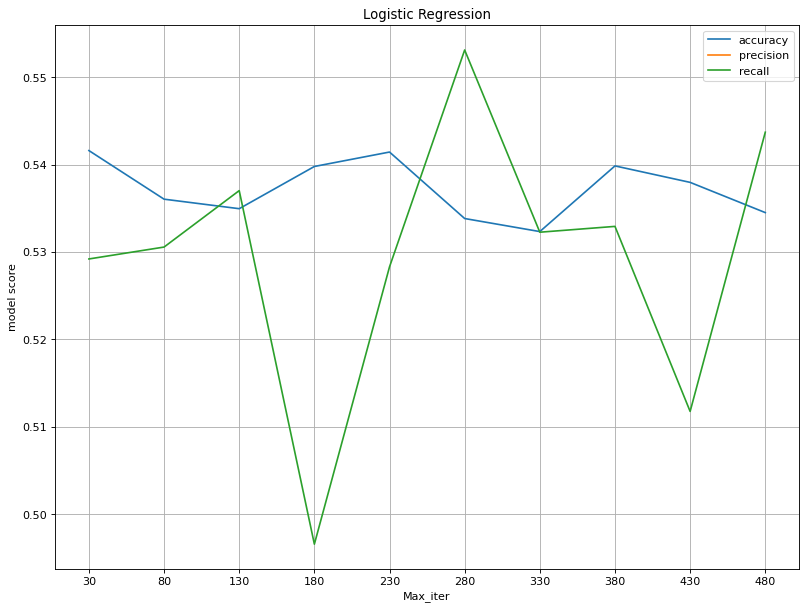

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='Max_iter', ylabel='model score')
plt.title("Logistic Regression")
plt.xticks(np.arange(len(max_iters)),max_iters)
#plt.yticks(np.arange(11)*0.1)
plt.grid()
for i in range(3):
    plt.plot(max_iters_res[:,i])
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

In [ ]:
(np.sum(comp_scores_log_reg_all[max_iter], axis=1)[:,0]/5).shape

(99,)

(10,)


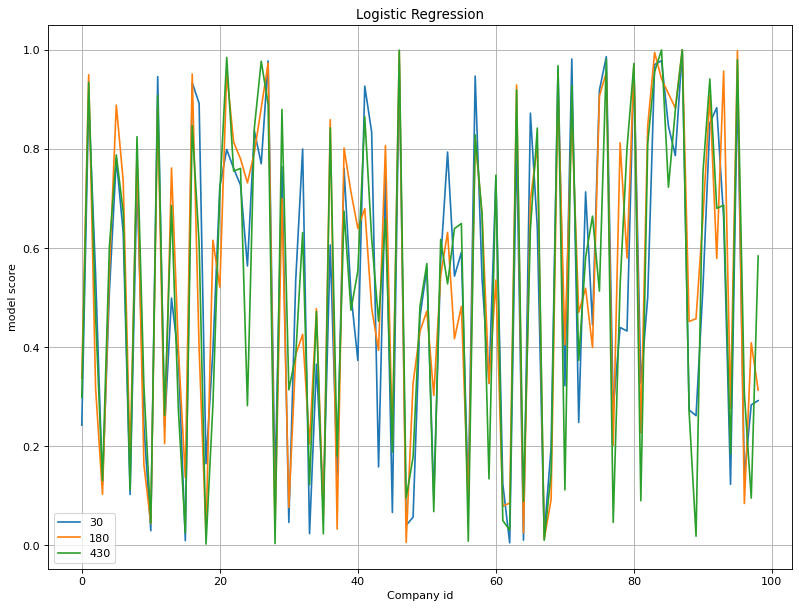

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='Company id', ylabel='model score')
plt.title("Logistic Regression")
#plt.xticks(np.arange(len(max_iters)),max_iters)
#plt.yticks(np.arange(11)*0.1)
print(max_iters.shape)
plt.grid()
plt.plot(np.sum(comp_scores_log_reg_all[0], axis=1)[:,2]/5)
plt.plot(np.sum(comp_scores_log_reg_all[3], axis=1)[:,2]/5)
plt.plot(np.sum(comp_scores_log_reg_all[8], axis=1)[:,2]/5)
#plt.plot(np.sum(comp_scores_log_reg_all[1], axis=1)[:,2]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
xd =[max_iters[0],max_iters[3],max_iters[8]]
plt.legend(xd)
#true price only

In [ ]:
#comp_scores_log_reg_all=np.zeros((len(list_of_companies_number),5, 3)) 
max_depths = np.arange(3,20,1)
comp_scores_dec_tree_all=np.zeros((len(max_depths),len(list_of_companies_number),5, 3)) 
#comp_scores_xgb_all=np.zeros((len(list_of_companies_number),10, 3)) 
max_depths_res = np.zeros(shape = (len(max_depths), 3))
for max_depth in  range (len(max_depths)):
    for comp_id in range(len(list_of_companies_number)):
        print(comp_id)
        X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
        y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
                check='swing_max', swing_interval=60, threshold=threshold)
        for i in range(5):
            print(max_depths[max_depth])
            #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
            #comp_scores_log_reg_all[comp_id,i,0], comp_scores_log_reg_all[comp_id,i,1],comp_scores_log_reg_all[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, max_iter = max_iters[max_iter], comp_id = comp_id, use_scaling=True, check_up_down=False, local_names=names)
            comp_scores_dec_tree_all[max_depth,comp_id,i,0], comp_scores_dec_tree_all[max_depth,comp_id,i,1],comp_scores_dec_tree_all[max_depth,comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id, max_depth = max_depths[max_depth], use_scaling=True, check_up_down=False, local_names=names)
            #comp_scores_xgb_all[comp_id,i,0], comp_scores_xgb_all[comp_id,i,1],comp_scores_xgb_all[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, use_scaling=True, check_up_down=False, local_names=names)
    max_depths_res[max_depth,0] = np.average(np.sum(comp_scores_dec_tree_all[max_depth], axis=1)[:,0]/5)
    max_depths_res[max_depth,1] = np.average(np.sum(comp_scores_dec_tree_all[max_depth], axis=1)[:,1]/5)
    max_depths_res[max_depth,2] = np.average(np.sum(comp_scores_dec_tree_all[max_depth], axis=1)[:,2]/5)

0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.64
Recall:
0.0967741935483871
3
Precision:
0.64
Recall:
0.0967741935483871
3
Precision:
0.64
Recall:
0.0967741935483871
3
Precision:
0.64
Recall:
0.0967741935483871
3
Precision:
0.64
Recall:
0.0967741935483871
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
3
Precision:
0.5720572057205721
Recall:
0.9701492537313433
3
Precision:
0.5720572057205721
Recall:
0.9701492537313433
3
Precision:
0.5720572057205721
Recall:
0.9701492537313433
3
Precision:
0.5720572057205721
Recall:
0.9701492537313433
3
Precision:
0.5720572057205721
Recall:
0.9701492537313433
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
3
Precision:
0.6981132075471698
Recall:
0.20825515947467166
3
Precision:
0.6981132075471698
Recall:
0.20825515947467166
3
Precision:
0.6981132075471698
Recall:
0.20825515947467166
3
Precision:
0.69811

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.4037122969837587
Recall:
0.5043478260869565
3
Precision:
0.4037122969837587
Recall:
0.5043478260869565
3
Precision:
0.4037122969837587
Recall:
0.5043478260869565
3
Precision:
0.4037122969837587
Recall:
0.5043478260869565
3
Precision:
0.4037122969837587
Recall:
0.5043478260869565
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
3
Precision:
0.6065808297567954
Recall:
0.7639639639639639
3
Precision:
0.6065808297567954
Recall:
0.7639639639639639
3
Precision:
0.6065808297567954
Recall:
0.7639639639639639
3
Precision:
0.6065808297567954
Recall:
0.7639639639639639
3
Precision:
0.6065808297567954
Recall:
0.7639639639639639
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
3
Precision:
0.4884210526315789
Recall:
1.0
3
Precision:
0.4884210526315789
Recall:
1.0
3
Precision:
0.4884210526315789
Recall:
1.0
3
Precision:
0.488421052

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


25.604166666666668% of intervals were SELL empty
24.010416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
3
Precision:
0.18181818181818182
Recall:
0.009259259259259259
3
Precision:
0.18181818181818182
Recall:
0.009259259259259259
3
Precision:
0.18181818181818182
Recall:
0.009259259259259259
3
Precision:
0.18181818181818182
Recall:
0.009259259259259259
3
Precision:
0.18181818181818182
Recall:
0.009259259259259259
10
30.197916666666668% of intervals were SELL empty
28.90625% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
3
Precision:
0.4293785310734463
Recall:
0.837465564738292
3
Precision:
0.4293785310734463
Recall:
0.837465564738292
3
Precision:
0.4293785310734463
Recall:
0.837465564738292
3
Precision:
0.4293785310734463
Recall:
0.837465564738292
3
Precision:
0.4293785310734463
Recall:
0.837465564738292
11
26.5625% of intervals were SELL empty
26.260416666666668% of intervals were BUY empty
0.07291666666666667% of inte

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


31.5625% of intervals were SELL empty
30.239583333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
3
Precision:
0.5461454940282302
Recall:
0.9636015325670498
3
Precision:
0.5461454940282302
Recall:
0.9636015325670498
3
Precision:
0.5461454940282302
Recall:
0.9636015325670498
3
Precision:
0.5461454940282302
Recall:
0.9636015325670498
3
Precision:
0.5461454940282302
Recall:
0.9636015325670498
15
31.052083333333332% of intervals were SELL empty
33.145833333333336% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
3
Precision:
0.46835443037974683
Recall:
0.08980582524271845
3
Precision:
0.46835443037974683
Recall:
0.08980582524271845
3
Precision:
0.46835443037974683
Recall:
0.08980582524271845
3
Precision:
0.46835443037974683
Recall:
0.08980582524271845
3
Precision:
0.46835443037974683
Recall:
0.08980582524271845
16
30.416666666666668% of intervals were SELL empty
30.333333333333332% of intervals were BUY empty
0.0833333333333333

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


32.270833333333336% of intervals were SELL empty
35.125% of intervals were BUY empty
0.03125% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
21


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
3
Precision:
0.5807962529274004
Recall:
0.5904761904761905
3
Precision:
0.5807962529274004
Recall:
0.5904761904761905
3
Precision:
0.5807962529274004
Recall:
0.5904761904761905
3
Precision:
0.5807962529274004
Recall:
0.5904761904761905
3
Precision:
0.5807962529274004
Recall:
0.5904761904761905
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
3
Precision:
0.5273684210526316
Recall:
1.0
3
Precision:
0.5273684210526316
Recall:
1.0
3
Precision:
0.5273684210526316
Recall:
1.0
3
Precision:
0.5273684210526316
Recall:
1.0
3
Precision:
0.5273684210526316
Recall:
1.0
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
3
Precision:
0.5510718789407314
Recall:
0.8900203665

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.6214442013129103
Recall:
0.9947460595446584
3
Precision:
0.6214442013129103
Recall:
0.9947460595446584
3
Precision:
0.6214442013129103
Recall:
0.9947460595446584
3
Precision:
0.6214442013129103
Recall:
0.9947460595446584
3
Precision:
0.6214442013129103
Recall:
0.9947460595446584
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
3
Precision:
0.5947136563876652
Recall:
0.4433497536945813
3
Precision:
0.5947136563876652
Recall:
0.4433497536945813
3
Precision:
0.5947136563876652
Recall:
0.4433497536945813
3
Precision:
0.5947136563876652
Recall:
0.4433497536945813
3
Precision:
0.5947136563876652
Recall:
0.4433497536945813
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
3
Precision:
0.75
Recall:
0.04792332268370607
3
Precision:
0.75
Recall:
0.04792332268370607
3
Precision:
0.75
Reca

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.47701149425287354
Recall:
0.226775956284153
3
Precision:
0.47701149425287354
Recall:
0.226775956284153
3
Precision:
0.47701149425287354
Recall:
0.226775956284153
3
Precision:
0.47701149425287354
Recall:
0.226775956284153
3
Precision:
0.47701149425287354
Recall:
0.226775956284153
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
3
Precision:
0.40848806366047746
Recall:
0.41621621621621624
3
Precision:
0.40848806366047746
Recall:
0.41621621621621624
3
Precision:
0.40848806366047746
Recall:
0.41621621621621624
3
Precision:
0.40848806366047746
Recall:
0.41621621621621624
3
Precision:
0.40848806366047746
Recall:
0.41621621621621624
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
3
Precision:
0.6145833333333334
Recall:
0.4154929577464789
3
Precision:
0.6145833333333334
Recall:
0.4154929577464789
3
Prec

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.5368589743589743
Recall:
0.6308851224105462
3
Precision:
0.5368589743589743
Recall:
0.6308851224105462
3
Precision:
0.5368589743589743
Recall:
0.6308851224105462
3
Precision:
0.5368589743589743
Recall:
0.6308851224105462
3
Precision:
0.5368589743589743
Recall:
0.6308851224105462
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
34


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
3
Precision:
0.7863013698630137
Recall:
0.5583657587548638
3
Precision:
0.7863013698630137
Recall:
0.5583657587548638
3
Precision:
0.7863013698630137
Recall:
0.5583657587548638
3
Precision:
0.7863013698630137
Recall:
0.5583657587548638
3
Precision:
0.7863013698630137
Recall:
0.5583657587548638
35
21.479166666666668% of intervals were SELL empty
16.864583333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
36


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


23.708333333333332% of intervals were SELL empty
23.96875% of intervals were BUY empty
0.25% of intervals were set not filled
3
Precision:
0.43473684210526314
Recall:
1.0
3
Precision:
0.43473684210526314
Recall:
1.0
3
Precision:
0.43473684210526314
Recall:
1.0
3
Precision:
0.43473684210526314
Recall:
1.0
3
Precision:
0.43473684210526314
Recall:
1.0
37
36.21875% of intervals were SELL empty
32.59375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled
3
Precision:
0.8431372549019608
Recall:
0.3161764705882353
3
Precision:
0.8514851485148515
Recall:
0.3161764705882353
3
Precision:
0.8431372549019608
Recall:
0.3161764705882353
3
Precision:
0.8514851485148515
Recall:
0.3161764705882353
3
Precision:
0.8514851485148515
Recall:
0.3161764705882353
38
36.65625% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.6719101123595506
Recall:
0.5588785046728972
3
Precision:
0.6719101123595506
Recall:
0.5588785046728972
3
Precision:
0.6719101123595506
Recall:
0.5588785046728972
3
Precision:
0.6719101123595506
Recall:
0.5588785046728972
3
Precision:
0.6719101123595506
Recall:
0.5588785046728972
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.5587892898719441
Recall:
0.8872458410351202
3
Precision:
0.5587892898719441
Recall:
0.8872458410351202
3
Precision:
0.5587892898719441
Recall:
0.8872458410351202
3
Precision:
0.5587892898719441
Recall:
0.8872458410351202
3
Precision:
0.5587892898719441
Recall:
0.8872458410351202
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
3
Precision:
0.28378378378378377
Recall:
0.1598984771573604
3
Precision:
0.28378378378378377
Recall:
0.1598984771573604
3
Precision:
0.28378378378378377
Recall:
0.1598984771573604
3
Precision:
0.28378378378378377
Recall:
0.1598984771573604
3
Precision:
0.28378378378378377
Recall:
0.1598984771573604
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.6276595744680851
Recall:
0.2789598108747045
3
Precision:
0.6276595744680851
Recall:
0.2789598108747045
3
Precision:
0.6276595744680851
Recall:
0.2789598108747045
3
Precision:
0.6276595744680851
Recall:
0.2789598108747045
3
Precision:
0.6276595744680851
Recall:
0.2789598108747045
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
3
Precision:
0.68
Recall:
0.14137214137214138
3
Precision:
0.68
Recall:
0.14137214137214138
3
Precision:
0.68
Recall:
0.14137214137214138
3
Precision:
0.68
Recall:
0.14137214137214138
3
Precision:
0.68
Recall:
0.14137214137214138
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.6336477987421384
Recall:
0.7082601054481547
3
Precision:
0.6336477987421384
Recall:
0.7082601054481547
3
Precision:
0.6336477987421384
Recall:
0.7082601054481547
3
Precision:
0.6336477987421384
Recall:
0.7082601054481547
3
Precision:
0.6336477987421384
Recall:
0.7082601054481547
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
3
Precision:
0.007518796992481203
Recall:
0.007246376811594203
3
Precision:
0.007518796992481203
Recall:
0.007246376811594203
3
Precision:
0.007518796992481203
Recall:
0.007246376811594203
3
Precision:
0.007518796992481203
Recall:
0.007246376811594203
3
Precision:
0.007518796992481203
Recall:
0.007246376811594203
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
3
Precision:
0.7905263157894736
Recall:
1.0
3
Precision:
0.7905263157894736
Recall:
1.0
3
Precision:
0.7

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.7095179233621756
Recall:
0.8503703703703703
3
Precision:
0.7095179233621756
Recall:
0.8503703703703703
3
Precision:
0.7095179233621756
Recall:
0.8503703703703703
3
Precision:
0.7095179233621756
Recall:
0.8503703703703703
3
Precision:
0.7095179233621756
Recall:
0.8503703703703703
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
52


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
3
Precision:
0.4034334763948498
Recall:
1.0
3
Precision:
0.4034334763948498
Recall:
1.0
3
Precision:
0.4034334763948498
Recall:
1.0
3
Precision:
0.4034334763948498
Recall:
1.0
3
Precision:
0.4034334763948498
Recall:
1.0
53
12.791666666666666% of intervals were SELL empty
12.677083333333334% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
3
Precision:
0.4122681883024251
Recall:
0.7391304347826086
3
Precision:
0.4122681883024251
Recall:
0.7391304347826086
3
Precision:
0.4122681883024251
Recall:
0.7391304347826086
3
Precision:
0.4122681883024251
Recall:
0.7391304347826086
3
Precision:
0.4122681883024251
Recall:
0.7391304347826086
54
9.635416666666666% of intervals were SELL empty
8.875% of intervals were BUY empty
1.21875% of intervals were set not filled
3
Precision:
0.3203125
Recall:
0.2342857142857143
3
Precision:


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
3
Precision:
0.5116640746500778
Recall:
0.6797520661157025
3
Precision:
0.5116640746500778
Recall:
0.6797520661157025
3
Precision:
0.5116640746500778
Recall:
0.6797520661157025
3
Precision:
0.5116640746500778
Recall:
0.6797520661157025
3
Precision:
0.5116640746500778
Recall:
0.6797520661157025
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
3
Precision:
0.5665137614678899
Recall:
0.4379432624113475
3
Precision:
0.5665137614678899
Recall:
0.4379432624113475
3
Precision:
0.5665137614678899
Recall:
0.4379432624113475
3
Precision:
0.5665137614678899
Recall:
0.4379432624113475
3
Precision:
0.5665137614678899
Recall:
0.4379432624113475
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of inter

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


13.322916666666666% of intervals were SELL empty
15.791666666666666% of intervals were BUY empty
0.0625% of intervals were set not filled
3
Precision:
0.391025641025641
Recall:
0.13616071428571427
3
Precision:
0.391025641025641
Recall:
0.13616071428571427
3
Precision:
0.391025641025641
Recall:
0.13616071428571427
3
Precision:
0.391025641025641
Recall:
0.13616071428571427
3
Precision:
0.391025641025641
Recall:
0.13616071428571427
69
21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
3
Precision:
0.5757894736842105
Recall:
1.0
3
Precision:
0.5757894736842105
Recall:
1.0
3
Precision:
0.5757894736842105
Recall:
1.0
3
Precision:
0.5757894736842105
Recall:
1.0
3
Precision:
0.5757894736842105
Recall:
1.0
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
3
Precision:
0.35119047619047616
Recall:
0.11411992263056092
3
Precision:
0.35119047

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.22526315789473683
Recall:
0.30659025787965616
3
Precision:
0.22526315789473683
Recall:
0.30659025787965616
3
Precision:
0.22526315789473683
Recall:
0.30659025787965616
3
Precision:
0.22526315789473683
Recall:
0.30659025787965616
3
Precision:
0.22526315789473683
Recall:
0.30659025787965616
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.7218124341412012
Recall:
0.9985422740524781
3
Precision:
0.7218124341412012
Recall:
0.9985422740524781
3
Precision:
0.7218124341412012
Recall:
0.9985422740524781
3
Precision:
0.7218124341412012
Recall:
0.9985422740524781
3
Precision:
0.7218124341412012
Recall:
0.9985422740524781
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
82


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.6217391304347826
Recall:
0.6682242990654206
3
Precision:
0.6217391304347826
Recall:
0.6682242990654206
3
Precision:
0.6217391304347826
Recall:
0.6682242990654206
3
Precision:
0.6217391304347826
Recall:
0.6682242990654206
3
Precision:
0.6217391304347826
Recall:
0.6682242990654206
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
3
Precision:
0.4521276595744681
Recall:
0.9976525821596244
3
Precision:
0.4521276595744681
Recall:
0.9976525821596244
3
Precision:
0.4521276595744681
Recall:
0.9976525821596244
3
Precision:
0.4521276595744681
Recall:
0.9976525821596244
3
Precision:
0.4521276595744681
Recall:
0.9976525821596244
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
3
Precision:
0.5224534501642936
Recall:
0.9280155642023347
3
Precision:
0.5224534501642936
Recall:
0.9280155642023347
3
Precision:
0.522453450164

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.3318872017353579
Recall:
0.9839228295819936
3
Precision:
0.3318872017353579
Recall:
0.9839228295819936
3
Precision:
0.3318872017353579
Recall:
0.9839228295819936
3
Precision:
0.3318872017353579
Recall:
0.9839228295819936
3
Precision:
0.3318872017353579
Recall:
0.9839228295819936
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
3
Precision:
0.5479744136460555
Recall:
0.5479744136460555
3
Precision:
0.5479744136460555
Recall:
0.5479744136460555
3
Precision:
0.5479744136460555
Recall:
0.5479744136460555
3
Precision:
0.5479744136460555
Recall:
0.5479744136460555
3
Precision:
0.5479744136460555
Recall:
0.5479744136460555
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
3
Precision:
0.6694915254237288
Recall:
0.42397137745974955
3
Precision:
0.6694915254237288
Recall:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.616822429906542
Recall:
0.21428571428571427
3
Precision:
0.616822429906542
Recall:
0.21428571428571427
3
Precision:
0.616822429906542
Recall:
0.21428571428571427
3
Precision:
0.616822429906542
Recall:
0.21428571428571427
3
Precision:
0.616822429906542
Recall:
0.21428571428571427
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
3
Precision:
0.19117647058823528
Recall:
0.18505338078291814
3
Precision:
0.19117647058823528
Recall:
0.18505338078291814
3
Precision:
0.19117647058823528
Recall:
0.18505338078291814
3
Precision:
0.19117647058823528
Recall:
0.18505338078291814
3
Precision:
0.19117647058823528
Recall:
0.18505338078291814
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
3
Precision:
0.31968295904887717
Recall:
0.8705035971223022
3
Precision:
0.319682959048877

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
3
Precision:
0.5808580858085809
Recall:
0.9279437609841827
3
Precision:
0.5808580858085809
Recall:
0.9279437609841827
3
Precision:
0.5808580858085809
Recall:
0.9279437609841827
3
Precision:
0.5808580858085809
Recall:
0.9279437609841827
3
Precision:
0.5808580858085809
Recall:
0.9279437609841827
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
3
Precision:
nan
Recall:
0.0
97


<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
3
Precision:
0.4043528064146621
Recall:
0.9915730337078652
3
Precision:
0.4043528064146621
Recall:
0.9915730337078652
3
Precision:
0.4043528064146621
Recall:
0.9915730337078652
3
Precision:
0.4043528064146621
Recall:
0.9915730337078652
3
Precision:
0.4043528064146621
Recall:
0.9915730337078652
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
3
Precision:
0.0
Recall:
0.0
0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5126582278481012
Recall:
0.16330645161290322
4
Precision:
0.5126582278481012
Recall:
0.16330645161290322
4
Precision:
0.5126582278481012
Recall:
0.16330645161290322
4
Precision:
0.5126582278481012
Recall:
0.16330645161290322
4
Precision:
0.5126582278481012
Recall:
0.16330645161290322
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
4
Precision:
0.5643459915611815
Recall:
0.9981343283582089
4
Precision:
0.5668789808917197
Recall:
0.996268656716418
4
Precision:
0.5643459915611815
Recall:
0.9981343283582089
4
Precision:
0.5643459915611815
Recall:
0.9981343283582089
4
Precision:
0.5668789808917197
Recall:
0.996268656716418
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
4
Precision:
0.6566265060240963
Recall:
0.6135084427767354
4
Precision:
0.6566265060240963
Recall:
0.6135084427767354
4
Precisi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.49444444444444446
Recall:
0.3670103092783505
4
Precision:
0.49444444444444446
Recall:
0.3670103092783505
4
Precision:
0.49444444444444446
Recall:
0.3670103092783505
4
Precision:
0.49444444444444446
Recall:
0.3670103092783505
4
Precision:
0.49444444444444446
Recall:
0.3670103092783505
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5098591549295775
Recall:
0.5246376811594203
4
Precision:
0.5098591549295775
Recall:
0.5246376811594203
4
Precision:
0.5098591549295775
Recall:
0.5246376811594203
4
Precision:
0.5098591549295775
Recall:
0.5246376811594203
4
Precision:
0.5098591549295775
Recall:
0.5246376811594203
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
4
Precision:
0.6115992970123023
Recall:
0.6270270270270271
4
Precision:
0.6088495575221239
Recall:
0.6198198198198198
4
Precision:
0.6088495575221239
Recall:
0.6198198198198198
4
Precision:
0.6088495575221239
Recall:
0.6198198198198198
4
Precision:
0.6115992970123023
Recall:
0.6270270270270271
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
4
Precision:
0.5
Recall:
0.8275862068965517
4
Precision:
0.5
Recall:
0.8275862068965517
4
Precision:
0.5
Recall:
0.8275862068965517
4
Precision:
0.5
Recall:

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


29.0% of intervals were SELL empty
27.479166666666668% of intervals were BUY empty
0.15625% of intervals were set not filled
4
Precision:
0.483695652173913
Recall:
0.8476190476190476
4
Precision:
0.483695652173913
Recall:
0.8476190476190476
4
Precision:
0.483695652173913
Recall:
0.8476190476190476
4
Precision:
0.483695652173913
Recall:
0.8476190476190476
4
Precision:
0.483695652173913
Recall:
0.8476190476190476
22
22.385416666666668% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.2708333333333333% of intervals were set not filled
4
Precision:
0.5274261603375527
Recall:
0.998003992015968
4
Precision:
0.5274261603375527
Recall:
0.998003992015968
4
Precision:
0.5274261603375527
Recall:
0.998003992015968
4
Precision:
0.5274261603375527
Recall:
0.998003992015968
4
Precision:
0.5274261603375527
Recall:
0.998003992015968
23
32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were se

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.62117903930131
Recall:
0.9964973730297724
4
Precision:
0.62117903930131
Recall:
0.9964973730297724
4
Precision:
0.62117903930131
Recall:
0.9964973730297724
4
Precision:
0.62117903930131
Recall:
0.9964973730297724
4
Precision:
0.62117903930131
Recall:
0.9964973730297724
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
4
Precision:
0.5978260869565217
Recall:
0.451559934318555
4
Precision:
0.5978260869565217
Recall:
0.451559934318555
4
Precision:
0.5978260869565217
Recall:
0.451559934318555
4
Precision:
0.5978260869565217
Recall:
0.451559934318555
4
Precision:
0.5978260869565217
Recall:
0.451559934318555
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
4
Precision:
0.75
Recall:
0.04792332268370607
4
Precision:
0.75
Recall:
0.04792332268370607
4
Precision:
0.75
Recall:
0.047923322

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.4166666666666667
Recall:
0.8469945355191257
4
Precision:
0.4166666666666667
Recall:
0.8469945355191257
4
Precision:
0.4166666666666667
Recall:
0.8469945355191257
4
Precision:
0.41450068399452805
Recall:
0.8278688524590164
4
Precision:
0.4166666666666667
Recall:
0.8469945355191257
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
4
Precision:
0.3979328165374677
Recall:
0.41621621621621624
4
Precision:
0.3979328165374677
Recall:
0.41621621621621624
4
Precision:
0.3979328165374677
Recall:
0.41621621621621624
4
Precision:
0.3979328165374677
Recall:
0.41621621621621624
4
Precision:
0.3979328165374677
Recall:
0.41621621621621624
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
4
Precision:
0.47674418604651164
Recall:
0.43309859154929575
4
Precision:
0.47674418604651164
Recall:
0.43309859154929575
4
Prec

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5346534653465347
Recall:
0.6101694915254238
4
Precision:
0.5346534653465347
Recall:
0.6101694915254238
4
Precision:
0.5346534653465347
Recall:
0.6101694915254238
4
Precision:
0.5346534653465347
Recall:
0.6101694915254238
4
Precision:
0.5346534653465347
Recall:
0.6101694915254238
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
4
Precision:
0.35148514851485146
Recall:
0.24067796610169492
4
Precision:
0.35148514851485146
Recall:
0.24067796610169492
4
Precision:
0.35148514851485146
Recall:
0.24067796610169492
4
Precision:
0.35148514851485146
Recall:
0.24067796610169492
4
Precision:
0.35148514851485146
Recall:
0.24067796610169492
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
4
Precision:
0.8033707865168539
Recall:
0.556420233463035
4
Precision:
0.8033707865168539
Recall:
0.556420233463035
4
Precision:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.6764705882352942
Recall:
0.5588785046728972
4
Precision:
0.6764705882352942
Recall:
0.5588785046728972
4
Precision:
0.6764705882352942
Recall:
0.5588785046728972
4
Precision:
0.6764705882352942
Recall:
0.5588785046728972
4
Precision:
0.6764705882352942
Recall:
0.5588785046728972
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5642775881683731
Recall:
0.9168207024029574
4
Precision:
0.5642775881683731
Recall:
0.9168207024029574
4
Precision:
0.5642775881683731
Recall:
0.9168207024029574
4
Precision:
0.5642775881683731
Recall:
0.9168207024029574
4
Precision:
0.5642775881683731
Recall:
0.9168207024029574
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0.0
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
4
Precision:
0.39285714285714285
Recall:
0.30710659898477155
4
Precision:
0.39285714285714285
Recall:
0.30710659898477155
4
Precision:
0.39285714285714285
Recall:
0.30710659898477155
4
Precision:
0.39285714285714285
Recall:
0.30710659898477155
4
Precision:
0.39285714285714285
Recall:
0.30710659898477155
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5317073170731708
Recall:
0.2576832151300236
4
Precision:
0.5317073170731708
Recall:
0.2576832151300236
4
Precision:
0.5317073170731708
Recall:
0.2576832151300236
4
Precision:
0.5317073170731708
Recall:
0.2576832151300236
4
Precision:
0.5317073170731708
Recall:
0.2576832151300236
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
4
Precision:
0.9565217391304348
Recall:
0.09147609147609148
4
Precision:
0.9565217391304348
Recall:
0.09147609147609148
4
Precision:
0.9565217391304348
Recall:
0.09147609147609148
4
Precision:
0.9565217391304348
Recall:
0.09147609147609148
4
Precision:
0.9565217391304348
Recall:
0.09147609147609148
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5923809523809523
Recall:
0.546572934973638
4
Precision:
0.5923809523809523
Recall:
0.546572934973638
4
Precision:
0.5923809523809523
Recall:
0.546572934973638
4
Precision:
0.5923809523809523
Recall:
0.546572934973638
4
Precision:
0.5923809523809523
Recall:
0.546572934973638
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
4
Precision:
0.08223684210526316
Recall:
0.36231884057971014
4
Precision:
0.08223684210526316
Recall:
0.36231884057971014
4
Precision:
0.08223684210526316
Recall:
0.36231884057971014
4
Precision:
0.08223684210526316
Recall:
0.36231884057971014
4
Precision:
0.08196721311475409
Recall:
0.36231884057971014
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
4
Precision:
0.7905263157894736
Recall:
1.0
4
Precision:
0.7905263157894736
Recall:
1.0
4
Precision:
0.7905263157894736

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


33.604166666666664% of intervals were SELL empty
33.447916666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.40421052631578946
Recall:
1.0
4
Precision:
0.40421052631578946
Recall:
1.0
4
Precision:
0.40421052631578946
Recall:
1.0
4
Precision:
0.40421052631578946
Recall:
1.0
4
Precision:
0.40421052631578946
Recall:
1.0
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.7095179233621756
Recall:
0.8503703703703703
4
Precision:
0.7095179233621756
Recall:
0.8503703703703703
4
Precision:
0.7095179233621756
Recall:
0.8503703703703703
4
Precision:
0.7095179233621756
Recall:
0.8503703703703703
4
Precision:
0.7095179233621756
Recall:
0.8503703703703703
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
4
Precision:
0.2
Recall:
0.005012531328320802
4
Precision:
0.2
Recall:
0.005012531328320802
4
Precision:
0.2
Recall:
0.005012531328320802
4
Precision:
0.2
Recall:
0.005012531328320802
4
Precision:
0.2
Recall:
0.005012531328320802
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
4
Precision:
0.41047297297297297
Recall:
0.6462765957446809
4
Precision:
0.41047297297297297
Recall:
0.6462765957446809
4
Precision:
0.41047297297297297
Recall:
0.64627659574468

30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
4
Precision:
0.3554083885209713
Recall:
0.4225721784776903
4
Precision:
0.3554083885209713
Recall:
0.4225721784776903
4
Precision:
0.3554083885209713
Recall:
0.4225721784776903
4
Precision:
0.3554083885209713
Recall:
0.4225721784776903
4
Precision:
0.3554083885209713
Recall:
0.4225721784776903
72
30.364583333333332% of intervals were SELL empty
29.875% of intervals were BUY empty
0.19791666666666666% of intervals were set not filled
4
Precision:
0.2853146853146853
Recall:
0.6144578313253012
4
Precision:
0.2853146853146853
Recall:
0.6144578313253012
4
Precision:
0.2853146853146853
Recall:
0.6144578313253012
4
Precision:
0.2853146853146853
Recall:
0.6144578313253012
4
Precision:
0.2853146853146853
Recall:
0.6144578313253012
73
24.90625% of intervals were SELL empty
23.927083333333332% of intervals were BUY empty
0.3229166666666667% of intervals were

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.22526315789473683
Recall:
0.30659025787965616
4
Precision:
0.22526315789473683
Recall:
0.30659025787965616
4
Precision:
0.22526315789473683
Recall:
0.30659025787965616
4
Precision:
0.22526315789473683
Recall:
0.30659025787965616
4
Precision:
0.22526315789473683
Recall:
0.30659025787965616
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.7368421052631579
Recall:
0.7346938775510204
4
Precision:
0.7368421052631579
Recall:
0.7346938775510204
4
Precision:
0.7368421052631579
Recall:
0.7346938775510204
4
Precision:
0.7368421052631579
Recall:
0.7346938775510204
4
Precision:
0.7368421052631579
Recall:
0.7346938775510204
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
4
Precision:
0.7093023255813954
Recall:
0.27232142857142855
4
Precision:
0.7093023255813954
Recall:
0.27232142857142855
4
Precision:
0.7093023255813954
Recall:
0.27232142857142855
4
Precision:
0.7093023255813954
Recall:
0.27232142857142855
4
Precision:
0.7093023255813954
Recall:
0.27232142857142855
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.6307339449541285
Recall:
0.6425233644859814
4
Precision:
0.6264236902050114
Recall:
0.6425233644859814
4
Precision:
0.6307339449541285
Recall:
0.6425233644859814
4
Precision:
0.6307339449541285
Recall:
0.6425233644859814
4
Precision:
0.6264236902050114
Recall:
0.6425233644859814
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
4
Precision:
0.46373626373626375
Recall:
0.9906103286384976
4
Precision:
0.4602829162132753
Recall:
0.9929577464788732
4
Precision:
0.4602829162132753
Recall:
0.9929577464788732
4
Precision:
0.46373626373626375
Recall:
0.9906103286384976
4
Precision:
0.46373626373626375
Recall:
0.9906103286384976
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
4
Precision:
0.5234972677595628
Recall:
0.9319066147859922
4
Precision:
0.5234972677595628
Recall:
0.9319066147859922
4
Precision:
0.523497267

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.3347921225382932
Recall:
0.9839228295819936
4
Precision:
0.3347921225382932
Recall:
0.9839228295819936
4
Precision:
0.3347921225382932
Recall:
0.9839228295819936
4
Precision:
0.3347921225382932
Recall:
0.9839228295819936
4
Precision:
0.3347921225382932
Recall:
0.9839228295819936
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
4
Precision:
0.8027210884353742
Recall:
0.2515991471215352
4
Precision:
0.8027210884353742
Recall:
0.2515991471215352
4
Precision:
0.8027210884353742
Recall:
0.2515991471215352
4
Precision:
0.8027210884353742
Recall:
0.2515991471215352
4
Precision:
0.8027210884353742
Recall:
0.2515991471215352
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
4
Precision:
0.6694915254237288
Recall:
0.42397137745974955
4
Precision:
0.6694915254237288
Recall:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.5147058823529411
Recall:
0.45454545454545453
4
Precision:
0.5147058823529411
Recall:
0.45454545454545453
4
Precision:
0.5147058823529411
Recall:
0.45454545454545453
4
Precision:
0.5147058823529411
Recall:
0.45454545454545453
4
Precision:
0.5147058823529411
Recall:
0.45454545454545453
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
4
Precision:
0.20833333333333334
Recall:
0.17793594306049823
4
Precision:
0.20833333333333334
Recall:
0.17793594306049823
4
Precision:
0.20833333333333334
Recall:
0.17793594306049823
4
Precision:
0.20833333333333334
Recall:
0.17793594306049823
4
Precision:
0.20833333333333334
Recall:
0.17793594306049823
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
4
Precision:
0.3275862068965517
Recall:
0.9568345323741008
4
Precision:
0.32758620689

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


4
Precision:
0.037037037037037035
Recall:
0.003875968992248062
4
Precision:
0.037037037037037035
Recall:
0.003875968992248062
4
Precision:
0.037037037037037035
Recall:
0.003875968992248062
4
Precision:
0.037037037037037035
Recall:
0.003875968992248062
4
Precision:
0.037037037037037035
Recall:
0.003875968992248062
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
4
Precision:
0.5808580858085809
Recall:
0.9279437609841827
4
Precision:
0.5808580858085809
Recall:
0.9279437609841827
4
Precision:
0.5808580858085809
Recall:
0.9279437609841827
4
Precision:
0.5808580858085809
Recall:
0.9279437609841827
4
Precision:
0.5808580858085809
Recall:
0.9279437609841827
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0.0
4
Precision:
nan
Recall:
0

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


32.458333333333336% of intervals were SELL empty
31.885416666666668% of intervals were BUY empty
0.1875% of intervals were set not filled
4
Precision:
0.3988439306358382
Recall:
0.9691011235955056
4
Precision:
0.3988439306358382
Recall:
0.9691011235955056
4
Precision:
0.3988439306358382
Recall:
0.9691011235955056
4
Precision:
0.3988439306358382
Recall:
0.9691011235955056
4
Precision:
0.3988439306358382
Recall:
0.9691011235955056
98
34.791666666666664% of intervals were SELL empty
33.697916666666664% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
4
Precision:
0.0
Recall:
0.0
4
Precision:
0.0
Recall:
0.0
4
Precision:
0.0
Recall:
0.0
4
Precision:
0.0
Recall:
0.0
4
Precision:
0.0
Recall:
0.0
0
38.166666666666664% of intervals were SELL empty
35.791666666666664% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.514792899408284
Recall:
0.17540322580645162
5
Precision:
0.514792899408284
Recall:
0.17540322580645162
5
Precision:
0.514792899408284
Recall:
0.17540322580645162
5
Precision:
0.514792899408284
Recall:
0.17540322580645162
5
Precision:
0.514792899408284
Recall:
0.17540322580645162
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
5
Precision:
0.5643459915611815
Recall:
0.9981343283582089
5
Precision:
0.5643459915611815
Recall:
0.9981343283582089
5
Precision:
0.5643459915611815
Recall:
0.9981343283582089
5
Precision:
0.5643459915611815
Recall:
0.9981343283582089
5
Precision:
0.5643459915611815
Recall:
0.9981343283582089
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
5
Precision:
0.6651162790697674
Recall:
0.5365853658536586
5
Precision:
0.6651162790697674
Recall:
0.5365853658536586
5
Precision:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5218855218855218
Recall:
0.31958762886597936
5
Precision:
0.5145631067961165
Recall:
0.32783505154639175
5
Precision:
0.5218855218855218
Recall:
0.31958762886597936
5
Precision:
0.49002849002849
Recall:
0.354639175257732
5
Precision:
0.48863636363636365
Recall:
0.354639175257732
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.3463035019455253
Recall:
0.2579710144927536
5
Precision:
0.3463035019455253
Recall:
0.2579710144927536
5
Precision:
0.3463035019455253
Recall:
0.2579710144927536
5
Precision:
0.3463035019455253
Recall:
0.2579710144927536
5
Precision:
0.3463035019455253
Recall:
0.2579710144927536
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
5
Precision:
0.6048109965635738
Recall:
0.6342342342342342
5
Precision:
0.6020761245674741
Recall:
0.6270270270270271
5
Precision:
0.6027633851468048
Recall:
0.6288288288288288
5
Precision:
0.6065292096219931
Recall:
0.6360360360360361
5
Precision:
0.6054888507718696
Recall:
0.6360360360360361
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
5
Precision:
0.49865951742627346
Recall:
0.8017241379310345
5
Precision:
0.49865951742627346
Recall:
0.8017241379310345
5
Precision:
0.49865951742627346
Rec

5
Precision:
0.5826771653543307
Recall:
0.3014256619144603
5
Precision:
0.5826771653543307
Recall:
0.3014256619144603
5
Precision:
0.5826771653543307
Recall:
0.3014256619144603
5
Precision:
0.5826771653543307
Recall:
0.3014256619144603
5
Precision:
0.5826771653543307
Recall:
0.3014256619144603
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
5
Precision:
0.3030927835051546
Recall:
0.45652173913043476
5
Precision:
0.3030927835051546
Recall:
0.45652173913043476
5
Precision:
0.3030927835051546
Recall:
0.45652173913043476
5
Precision:
0.3030927835051546
Recall:
0.45652173913043476
5
Precision:
0.3030927835051546
Recall:
0.45652173913043476
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
5
Precision:
0.3434452871072589
Recall:
0.9548192771084337
5
Precision:
0.3434452871072589
Recall:
0.9548192771084337
5
Precision:
0.3434452

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.6280898876404495
Recall:
0.978984238178634
5
Precision:
0.6280898876404495
Recall:
0.978984238178634
5
Precision:
0.6280898876404495
Recall:
0.978984238178634
5
Precision:
0.6280898876404495
Recall:
0.978984238178634
5
Precision:
0.6280898876404495
Recall:
0.978984238178634
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
5
Precision:
0.6236323851203501
Recall:
0.46798029556650245
5
Precision:
0.621978021978022
Recall:
0.46469622331691296
5
Precision:
0.621978021978022
Recall:
0.46469622331691296
5
Precision:
0.6236323851203501
Recall:
0.46798029556650245
5
Precision:
0.621978021978022
Recall:
0.46469622331691296
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
5
Precision:
0.75
Recall:
0.04792332268370607
5
Precision:
0.75
Recall:
0.04792332268370607
5
Precision:
0.75
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.4170984455958549
Recall:
0.8797814207650273
5
Precision:
0.4155844155844156
Recall:
0.8743169398907104
5
Precision:
0.4155844155844156
Recall:
0.8743169398907104
5
Precision:
0.4155844155844156
Recall:
0.8743169398907104
5
Precision:
0.4150453955901427
Recall:
0.8743169398907104
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
5
Precision:
0.3978779840848806
Recall:
0.40540540540540543
5
Precision:
0.3978779840848806
Recall:
0.40540540540540543
5
Precision:
0.3978779840848806
Recall:
0.40540540540540543
5
Precision:
0.3978779840848806
Recall:
0.40540540540540543
5
Precision:
0.3978779840848806
Recall:
0.40540540540540543
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
5
Precision:
0.4765625
Recall:
0.2147887323943662
5
Precision:
0.4728682170542636
Recall:
0.2147887323943662
5
Precision:
0.47286

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5301003344481605
Recall:
0.5969868173258004
5
Precision:
0.5309882747068677
Recall:
0.5969868173258004
5
Precision:
0.5314569536423841
Recall:
0.6045197740112994
5
Precision:
0.5305785123966942
Recall:
0.6045197740112994
5
Precision:
0.5314569536423841
Recall:
0.6045197740112994
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
5
Precision:
0.3018867924528302
Recall:
0.16271186440677965
5
Precision:
0.3018867924528302
Recall:
0.16271186440677965
5
Precision:
0.3018867924528302
Recall:
0.16271186440677965
5
Precision:
0.3018867924528302
Recall:
0.16271186440677965
5
Precision:
0.3018867924528302
Recall:
0.16271186440677965
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
5
Precision:
0.7977207977207977
Recall:
0.5447470817120622
5
Precision:
0.7977207977207977
Recall:
0.5447470817120622
5
Precision:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.6065891472868217
Recall:
0.5850467289719626
5
Precision:
0.6101364522417154
Recall:
0.5850467289719626
5
Precision:
0.6065891472868217
Recall:
0.5850467289719626
5
Precision:
0.6101364522417154
Recall:
0.5850467289719626
5
Precision:
0.6101364522417154
Recall:
0.5850467289719626
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5685814771395076
Recall:
0.8964879852125693
5
Precision:
0.5685814771395076
Recall:
0.8964879852125693
5
Precision:
0.5670588235294117
Recall:
0.8909426987060998
5
Precision:
0.5690866510538641
Recall:
0.8983364140480592
5
Precision:
0.5690866510538641
Recall:
0.8983364140480592
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])
<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


5
Precision:
nan
Recall:
0.0
5
Precision:
nan
Recall:
0.0
5
Precision:
nan
Recall:
0.0
5
Precision:
nan
Recall:
0.0
5
Precision:
nan
Recall:
0.0
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
5
Precision:
0.38762214983713356
Recall:
0.3020304568527919
5
Precision:
0.38762214983713356
Recall:
0.3020304568527919
5
Precision:
0.38762214983713356
Recall:
0.3020304568527919
5
Precision:
0.38762214983713356
Recall:
0.3020304568527919
5
Precision:
0.38762214983713356
Recall:
0.3020304568527919
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5034324942791762
Recall:
0.5200945626477541
5
Precision:
0.5056947608200456
Recall:
0.524822695035461
5
Precision:
0.5034324942791762
Recall:
0.5200945626477541
5
Precision:
0.5056947608200456
Recall:
0.524822695035461
5
Precision:
0.5056947608200456
Recall:
0.524822695035461
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
5
Precision:
0.8141592920353983
Recall:
0.19126819126819128
5
Precision:
0.8141592920353983
Recall:
0.19126819126819128
5
Precision:
0.8141592920353983
Recall:
0.19126819126819128
5
Precision:
0.8141592920353983
Recall:
0.19126819126819128
5
Precision:
0.8141592920353983
Recall:
0.19126819126819128
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5923809523809523
Recall:
0.546572934973638
5
Precision:
0.5923809523809523
Recall:
0.546572934973638
5
Precision:
0.5923809523809523
Recall:
0.546572934973638
5
Precision:
0.5923809523809523
Recall:
0.546572934973638
5
Precision:
0.5923809523809523
Recall:
0.546572934973638
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
5
Precision:
0.08943089430894309
Recall:
0.39855072463768115
5
Precision:
0.08943089430894309
Recall:
0.39855072463768115
5
Precision:
0.08943089430894309
Recall:
0.39855072463768115
5
Precision:
0.08943089430894309
Recall:
0.39855072463768115
5
Precision:
0.08943089430894309
Recall:
0.39855072463768115
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
5
Precision:
0.797566371681416
Recall:
0.9600532623169108
5
Precision:
0.797566371681416
Recall:
0.9600532623169108
5
P

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.44704433497536944
Recall:
0.9453125
5
Precision:
0.44704433497536944
Recall:
0.9453125
5
Precision:
0.44704433497536944
Recall:
0.9453125
5
Precision:
0.44704433497536944
Recall:
0.9453125
5
Precision:
0.44704433497536944
Recall:
0.9453125
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.7095179233621756
Recall:
0.8503703703703703
5
Precision:
0.7095179233621756
Recall:
0.8503703703703703
5
Precision:
0.7095179233621756
Recall:
0.8503703703703703
5
Precision:
0.7095179233621756
Recall:
0.8503703703703703
5
Precision:
0.7095179233621756
Recall:
0.8503703703703703
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
5
Precision:
0.5072463768115942
Recall:
0.08771929824561403
5
Precision:
0.5072463768115942
Recall:
0.08771929824561403
5
Precision:
0.5072463768115942
Recall:
0.08771929824561403
5
Precision:
0.5072463768115942
Recall:
0.08771929824561403
5
Precision:
0.5072463768115942
Recall:
0.08771929824561403
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
5
Precision:
0.37719298245614036
Recall:
0.5718085106382979
5
Precision:
0.37719298245614036
Recall:
0.5718

<ipython-input-43-ee5eacee29d9>:21: RuntimeWarning: invalid value encountered in longlong_scalars
  precision = conf_mat[0][0]/(conf_mat[0][0]+conf_mat[0][1])


16.541666666666668% of intervals were SELL empty
17.322916666666668% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
5
Precision:
0.5184590690208668
Recall:
0.6673553719008265
5
Precision:
0.5184590690208668
Recall:
0.6673553719008265
5
Precision:
0.5184590690208668
Recall:
0.6673553719008265
5
Precision:
0.5184590690208668
Recall:
0.6673553719008265
5
Precision:
0.5184590690208668
Recall:
0.6673553719008265
66
15.010416666666666% of intervals were SELL empty
17.1875% of intervals were BUY empty
0.3541666666666667% of intervals were set not filled
5
Precision:
0.6285310734463276
Recall:
0.7890070921985816
5
Precision:
0.6281690140845071
Recall:
0.7907801418439716
5
Precision:
0.6281690140845071
Recall:
0.7907801418439716
5
Precision:
0.6285310734463276
Recall:
0.7890070921985816
5
Precision:
0.6270949720670391
Recall:
0.7960992907801419
67
12.791666666666666% of intervals were SELL empty
14.541666666666666% of intervals were BUY empty
0.40625% of inter

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.21852731591448932
Recall:
0.2636103151862464
5
Precision:
0.21852731591448932
Recall:
0.2636103151862464
5
Precision:
0.21852731591448932
Recall:
0.2636103151862464
5
Precision:
0.21852731591448932
Recall:
0.2636103151862464
5
Precision:
0.21852731591448932
Recall:
0.2636103151862464
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.7771317829457365
Recall:
0.5845481049562682
5
Precision:
0.7784313725490196
Recall:
0.5787172011661808
5
Precision:
0.7788649706457925
Recall:
0.5801749271137027
5
Precision:
0.7775628626692457
Recall:
0.5860058309037901
5
Precision:
0.7771317829457365
Recall:
0.5845481049562682
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
5
Precision:
0.5129310344827587
Recall:
0.265625
5
Precision:
0.5129310344827587
Recall:
0.265625
5
Precision:
0.5129310344827587
Recall:
0.265625
5
Precision:
0.5129310344827587
Recall:
0.265625
5
Precision:
0.5129310344827587
Recall:
0.265625
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.6115107913669064
Recall:
0.794392523364486
5
Precision:
0.6115107913669064
Recall:
0.794392523364486
5
Precision:
0.6115107913669064
Recall:
0.794392523364486
5
Precision:
0.6115107913669064
Recall:
0.794392523364486
5
Precision:
0.6115107913669064
Recall:
0.794392523364486
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
5
Precision:
0.4534501642935378
Recall:
0.971830985915493
5
Precision:
0.45494505494505494
Recall:
0.971830985915493
5
Precision:
0.4574585635359116
Recall:
0.971830985915493
5
Precision:
0.4574585635359116
Recall:
0.971830985915493
5
Precision:
0.45604395604395603
Recall:
0.9741784037558685
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
5
Precision:
0.5234972677595628
Recall:
0.9319066147859922
5
Precision:
0.5234972677595628
Recall:
0.9319066147859922
5
Precision:
0.5234972677595628
Re

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.3234323432343234
Recall:
0.9453376205787781
5
Precision:
0.3234323432343234
Recall:
0.9453376205787781
5
Precision:
0.3234323432343234
Recall:
0.9453376205787781
5
Precision:
0.3234323432343234
Recall:
0.9453376205787781
5
Precision:
0.3234323432343234
Recall:
0.9453376205787781
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
5
Precision:
0.5444444444444444
Recall:
0.31343283582089554
5
Precision:
0.5444444444444444
Recall:
0.31343283582089554
5
Precision:
0.5444444444444444
Recall:
0.31343283582089554
5
Precision:
0.5444444444444444
Recall:
0.31343283582089554
5
Precision:
0.5444444444444444
Recall:
0.31343283582089554
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
5
Precision:
0.645933014354067
Recall:
0.48300536672629696
5
Precision:
0.5957446808510638
Recall

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.5413793103448276
Recall:
0.5097402597402597
5
Precision:
0.5413793103448276
Recall:
0.5097402597402597
5
Precision:
0.5413793103448276
Recall:
0.5097402597402597
5
Precision:
0.5413793103448276
Recall:
0.5097402597402597
5
Precision:
0.5413793103448276
Recall:
0.5097402597402597
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
5
Precision:
0.19469026548672566
Recall:
0.15658362989323843
5
Precision:
0.19469026548672566
Recall:
0.15658362989323843
5
Precision:
0.1891891891891892
Recall:
0.1494661921708185
5
Precision:
0.1891891891891892
Recall:
0.1494661921708185
5
Precision:
0.19469026548672566
Recall:
0.15658362989323843
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
5
Precision:
0.32675709001233044
Recall:
0.9532374100719424
5
Precision:
0.32675709001233044
R

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


5
Precision:
0.13732394366197184
Recall:
0.1511627906976744
5
Precision:
0.13732394366197184
Recall:
0.1511627906976744
5
Precision:
0.13732394366197184
Recall:
0.1511627906976744
5
Precision:
0.13732394366197184
Recall:
0.1511627906976744
5
Precision:
0.13732394366197184
Recall:
0.1511627906976744
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
5
Precision:
0.6059907834101382
Recall:
0.9244288224956063
5
Precision:
0.6100342075256556
Recall:
0.9402460456942003
5
Precision:
0.6100342075256556
Recall:
0.9402460456942003
5
Precision:
0.6100342075256556
Recall:
0.9402460456942003
5
Precision:
0.6100342075256556
Recall:
0.9402460456942003
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
5
Precision:
0.375
Recall:
0.04120879120879121
5
Precision:
0.375
Recall:
0.04120879120879121
5
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5345911949685535
Recall:
0.17137096774193547
6
Precision:
0.5345911949685535
Recall:
0.17137096774193547
6
Precision:
0.5345911949685535
Recall:
0.17137096774193547
6
Precision:
0.5345911949685535
Recall:
0.17137096774193547
6
Precision:
0.5345911949685535
Recall:
0.17137096774193547
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
6
Precision:
0.5761957730812013
Recall:
0.9664179104477612
6
Precision:
0.5761957730812013
Recall:
0.9664179104477612
6
Precision:
0.5761957730812013
Recall:
0.9664179104477612
6
Precision:
0.5761957730812013
Recall:
0.9664179104477612
6
Precision:
0.5761957730812013
Recall:
0.9664179104477612
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
6
Precision:
0.6203703703703703
Recall:
0.25140712945590993
6
Precision:
0.6347826086956522
Recall:
0.27392120075046905
6
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.46766169154228854
Recall:
0.19381443298969073
6
Precision:
0.46534653465346537
Recall:
0.19381443298969073
6
Precision:
0.46534653465346537
Recall:
0.19381443298969073
6
Precision:
0.4797979797979798
Recall:
0.1958762886597938
6
Precision:
0.47715736040609136
Recall:
0.19381443298969073
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.4246987951807229
Recall:
0.40869565217391307
6
Precision:
0.4198250728862974
Recall:
0.41739130434782606
6
Precision:
0.4246987951807229
Recall:
0.40869565217391307
6
Precision:
0.4198250728862974
Recall:
0.41739130434782606
6
Precision:
0.4171597633136095
Recall:
0.40869565217391307
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
6
Precision:
0.6283891547049442
Recall:
0.7099099099099099
6
Precision:
0.6265822784810127
Recall:
0.7135135135135136
6
Precision:
0.6257961783439491
Recall:
0.7081081081081081
6
Precision:
0.6242038216560509
Recall:
0.7063063063063063
6
Precision:
0.6304
Recall:
0.7099099099099099
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
6
Precision:
0.49867724867724866
Recall:
0.8125
6
Precision:
0.49867724867724866
Recall:
0.8125
6
Precision:
0.49867724867724866
Recall:
0.8125
6
Precision:
0.4986

31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
6
Precision:
0.3073770491803279
Recall:
0.4658385093167702
6
Precision:
0.3073770491803279
Recall:
0.4658385093167702
6
Precision:
0.3073770491803279
Recall:
0.4658385093167702
6
Precision:
0.3073770491803279
Recall:
0.4658385093167702
6
Precision:
0.3073770491803279
Recall:
0.4658385093167702
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
6
Precision:
0.3444206008583691
Recall:
0.9668674698795181
6
Precision:
0.3444206008583691
Recall:
0.9668674698795181
6
Precision:
0.3444206008583691
Recall:
0.9668674698795181
6
Precision:
0.3444206008583691
Recall:
0.9668674698795181
6
Precision:
0.3444206008583691
Recall:
0.9668674698795181
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals were BUY empty
0.0625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.6229327453142227
Recall:
0.989492119089317
6
Precision:
0.6229327453142227
Recall:
0.989492119089317
6
Precision:
0.6229327453142227
Recall:
0.989492119089317
6
Precision:
0.6229327453142227
Recall:
0.989492119089317
6
Precision:
0.6229327453142227
Recall:
0.989492119089317
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
6
Precision:
0.6266094420600858
Recall:
0.4794745484400657
6
Precision:
0.634453781512605
Recall:
0.49589490968801314
6
Precision:
0.6326963906581741
Recall:
0.48932676518883417
6
Precision:
0.6255411255411255
Recall:
0.4745484400656814
6
Precision:
0.625
Recall:
0.47619047619047616
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
6
Precision:
0.375
Recall:
0.0670926517571885
6
Precision:
0.375
Recall:
0.0670926517571885
6
Precision:
0.375
Recall:
0.067092651

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.4137323943661972
Recall:
0.6420765027322405
6
Precision:
0.4165232358003442
Recall:
0.6612021857923497
6
Precision:
0.4165232358003442
Recall:
0.6612021857923497
6
Precision:
0.4109347442680776
Recall:
0.6366120218579235
6
Precision:
0.411660777385159
Recall:
0.6366120218579235
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
6
Precision:
0.38498789346246975
Recall:
0.4297297297297297
6
Precision:
0.3859223300970874
Recall:
0.4297297297297297
6
Precision:
0.3859223300970874
Recall:
0.4297297297297297
6
Precision:
0.38498789346246975
Recall:
0.4297297297297297
6
Precision:
0.3859223300970874
Recall:
0.4297297297297297
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
6
Precision:
0.4791666666666667
Recall:
0.323943661971831
6
Precision:
0.4845360824742268
Recall:
0.33098591549295775
6
Precision:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5569620253164557
Recall:
0.5800376647834274
6
Precision:
0.555956678700361
Recall:
0.5800376647834274
6
Precision:
0.5565529622980251
Recall:
0.583804143126177
6
Precision:
0.555956678700361
Recall:
0.5800376647834274
6
Precision:
0.5565529622980251
Recall:
0.583804143126177
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
6
Precision:
0.3192771084337349
Recall:
0.17966101694915254
6
Precision:
0.3192771084337349
Recall:
0.17966101694915254
6
Precision:
0.3192771084337349
Recall:
0.17966101694915254
6
Precision:
0.3192771084337349
Recall:
0.17966101694915254
6
Precision:
0.3192771084337349
Recall:
0.17966101694915254
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
6
Precision:
0.8064516129032258
Recall:
0.5350194552529183
6
Precision:
0.7882037533512064
Recall:
0.5719844357976653
6
Precision:
0.8064

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.656441717791411
Recall:
0.6
6
Precision:
0.6167315175097277
Recall:
0.5925233644859813
6
Precision:
0.6765327695560254
Recall:
0.5981308411214953
6
Precision:
0.6416309012875536
Recall:
0.5588785046728972
6
Precision:
0.6694560669456067
Recall:
0.5981308411214953
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5596846846846847
Recall:
0.9186691312384473
6
Precision:
0.5576923076923077
Recall:
0.911275415896488
6
Precision:
0.5590551181102362
Recall:
0.9186691312384473
6
Precision:
0.5612009237875288
Recall:
0.8983364140480592
6
Precision:
0.5585585585585585
Recall:
0.9168207024029574
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.42657342657342656
Recall:
0.4357142857142857
6
Precision:
0.42657342657342656
Recall:
0.4357142857142857
6
Precision:
0.42657342657342656
Recall:
0.4357142857142857
6
Precision:
0.42657342657342656
Recall:
0.4357142857142857
6
Precision:
0.42657342657342656
Recall:
0.4357142857142857
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
6
Precision:
0.36421725239616615
Recall:
0.2893401015228426
6
Precision:
0.35353535353535354
Recall:
0.26649746192893403
6
Precision:
0.37383177570093457
Recall:
0.30456852791878175
6
Precision:
0.37577639751552794
Recall:
0.30710659898477155
6
Precision:
0.35973597359735976
Recall:
0.2766497461928934
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5138121546961326
Recall:
0.4397163120567376
6
Precision:
0.515850144092219
Recall:
0.4231678486997636
6
Precision:
0.5172413793103449
Recall:
0.425531914893617
6
Precision:
0.5172413793103449
Recall:
0.425531914893617
6
Precision:
0.5172413793103449
Recall:
0.425531914893617
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
6
Precision:
0.4603174603174603
Recall:
0.12058212058212059
6
Precision:
0.40540540540540543
Recall:
0.09355509355509356
6
Precision:
0.4603174603174603
Recall:
0.12058212058212059
6
Precision:
0.464
Recall:
0.12058212058212059
6
Precision:
0.40540540540540543
Recall:
0.09355509355509356
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.6011560693641619
Recall:
0.3655536028119508
6
Precision:
0.6011560693641619
Recall:
0.3655536028119508
6
Precision:
0.6011560693641619
Recall:
0.3655536028119508
6
Precision:
0.6011560693641619
Recall:
0.3655536028119508
6
Precision:
0.6011560693641619
Recall:
0.3655536028119508
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
6
Precision:
0.0703971119133574
Recall:
0.2826086956521739
6
Precision:
0.0703971119133574
Recall:
0.2826086956521739
6
Precision:
0.0703971119133574
Recall:
0.2826086956521739
6
Precision:
0.07014388489208633
Recall:
0.2826086956521739
6
Precision:
0.0703971119133574
Recall:
0.2826086956521739
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
6
Precision:
0.8047464940668824
Recall:
0.9933422103861518
6
Precision:
0.8047464940668824
Recall:
0.9933422103861518
6
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.40719910011248595
Recall:
0.9427083333333334
6
Precision:
0.40719910011248595
Recall:
0.9427083333333334
6
Precision:
0.40719910011248595
Recall:
0.9427083333333334
6
Precision:
0.40719910011248595
Recall:
0.9427083333333334
6
Precision:
0.40719910011248595
Recall:
0.9427083333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.7103620474406991
Recall:
0.8429629629629629
6
Precision:
0.7108886107634543
Recall:
0.8414814814814815
6
Precision:
0.7103620474406991
Recall:
0.8429629629629629
6
Precision:
0.7107231920199502
Recall:
0.8444444444444444
6
Precision:
0.7103620474406991
Recall:
0.8429629629629629
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
6
Precision:
0.6129032258064516
Recall:
0.14285714285714285
6
Precision:
0.6222222222222222
Recall:
0.14035087719298245
6
Precision:
0.6222222222222222
Recall:
0.14035087719298245
6
Precision:
0.6129032258064516
Recall:
0.14285714285714285
6
Precision:
0.6129032258064516
Recall:
0.14285714285714285
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
6
Precision:
0.3652597402597403
Recall:
0.598404255319149
6
Precision:
0.36348949919224555
Recall:
0.598404

6
Precision:
0.5757894736842105
Recall:
1.0
6
Precision:
0.5757894736842105
Recall:
1.0
6
Precision:
0.5757894736842105
Recall:
1.0
6
Precision:
0.5757894736842105
Recall:
1.0
6
Precision:
0.5757894736842105
Recall:
1.0
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
6
Precision:
0.34944237918215615
Recall:
0.18181818181818182
6
Precision:
0.34944237918215615
Recall:
0.18181818181818182
6
Precision:
0.34944237918215615
Recall:
0.18181818181818182
6
Precision:
0.34944237918215615
Recall:
0.18181818181818182
6
Precision:
0.34944237918215615
Recall:
0.18181818181818182
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
6
Precision:
0.3536036036036036
Recall:
0.4120734908136483
6
Precision:
0.35964912280701755
Recall:
0.4304461942257218
6
Precision:
0.3536036036036036
Recall:
0.4120734908136483
6
Precision

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.24574209245742093
Recall:
0.28939828080229224
6
Precision:
0.24574209245742093
Recall:
0.28939828080229224
6
Precision:
0.2344139650872818
Recall:
0.2693409742120344
6
Precision:
0.23209876543209876
Recall:
0.2693409742120344
6
Precision:
0.2344139650872818
Recall:
0.2693409742120344
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.7741433021806854
Recall:
0.7244897959183674
6
Precision:
0.7732919254658385
Recall:
0.7259475218658892
6
Precision:
0.7741433021806854
Recall:
0.7244897959183674
6
Precision:
0.7744945567651633
Recall:
0.7259475218658892
6
Precision:
0.7736434108527132
Recall:
0.7274052478134111
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
6
Precision:
0.39901477832512317
Recall:
0.18080357142857142
6
Precision:
0.4028436018957346
Recall:
0.18973214285714285
6
Precision:
0.4068627450980392
Recall:
0.18526785714285715
6
Precision:
0.4068627450980392
Recall:
0.18526785714285715
6
Precision:
0.4068627450980392
Recall:
0.18526785714285715
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5348148148148149
Recall:
0.8434579439252337
6
Precision:
0.5326409495548962
Recall:
0.8387850467289719
6
Precision:
0.5334323922734027
Recall:
0.8387850467289719
6
Precision:
0.5348148148148149
Recall:
0.8434579439252337
6
Precision:
0.5348148148148149
Recall:
0.8434579439252337
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
6
Precision:
0.46314631463146316
Recall:
0.9882629107981221
6
Precision:
0.46408839779005523
Recall:
0.9859154929577465
6
Precision:
0.46263736263736266
Recall:
0.9882629107981221
6
Precision:
0.46263736263736266
Recall:
0.9882629107981221
6
Precision:
0.45869565217391306
Recall:
0.9906103286384976
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
6
Precision:
0.5234972677595628
Recall:
0.9319066147859922
6
Precision:
0.5234972677595628
Recall:
0.9319066147859922
6
Precision:
0.5234972

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.3312883435582822
Recall:
0.8681672025723473
6
Precision:
0.3312883435582822
Recall:
0.8681672025723473
6
Precision:
0.3312883435582822
Recall:
0.8681672025723473
6
Precision:
0.3312883435582822
Recall:
0.8681672025723473
6
Precision:
0.3312883435582822
Recall:
0.8681672025723473
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
6
Precision:
0.6008403361344538
Recall:
0.3049040511727079
6
Precision:
0.6008403361344538
Recall:
0.3049040511727079
6
Precision:
0.6008403361344538
Recall:
0.3049040511727079
6
Precision:
0.6008403361344538
Recall:
0.3049040511727079
6
Precision:
0.6008403361344538
Recall:
0.3049040511727079
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
6
Precision:
0.5946969696969697
Recall:
0.5617173524150268
6
Precision:
0.6704225352112676
Recall:
0.4

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.5681818181818182
Recall:
0.487012987012987
6
Precision:
0.50814332247557
Recall:
0.5064935064935064
6
Precision:
0.5202702702702703
Recall:
0.5
6
Precision:
0.5448028673835126
Recall:
0.4935064935064935
6
Precision:
0.5665399239543726
Recall:
0.4837662337662338
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
6
Precision:
0.2540192926045016
Recall:
0.28113879003558717
6
Precision:
0.24919093851132687
Recall:
0.27402135231316727
6
Precision:
0.2523961661341853
Recall:
0.28113879003558717
6
Precision:
0.2515923566878981
Recall:
0.28113879003558717
6
Precision:
0.2523961661341853
Recall:
0.28113879003558717
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
6
Precision:
0.3238434163701068
Recall:
0.9820143884892086
6
Precision:
0.3238434163701068
Recall:
0.98201438848

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


6
Precision:
0.31690140845070425
Recall:
0.1744186046511628
6
Precision:
0.31690140845070425
Recall:
0.1744186046511628
6
Precision:
0.31690140845070425
Recall:
0.1744186046511628
6
Precision:
0.31690140845070425
Recall:
0.1744186046511628
6
Precision:
0.31690140845070425
Recall:
0.1744186046511628
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
6
Precision:
0.61090458488228
Recall:
0.8664323374340949
6
Precision:
0.61090458488228
Recall:
0.8664323374340949
6
Precision:
0.61090458488228
Recall:
0.8664323374340949
6
Precision:
0.61090458488228
Recall:
0.8664323374340949
6
Precision:
0.61090458488228
Recall:
0.8664323374340949
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
6
Precision:
0.3469387755102041
Recall:
0.046703296703296704
6
Precision:
0.3469387755102041
Recall:
0.046703

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.5083798882681564
Recall:
0.18346774193548387
7
Precision:
0.5055555555555555
Recall:
0.18346774193548387
7
Precision:
0.5084745762711864
Recall:
0.1814516129032258
7
Precision:
0.5084745762711864
Recall:
0.1814516129032258
7
Precision:
0.5027932960893855
Recall:
0.1814516129032258
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
7
Precision:
0.5743016759776536
Recall:
0.9589552238805971
7
Precision:
0.5715871254162043
Recall:
0.960820895522388
7
Precision:
0.5715871254162043
Recall:
0.960820895522388
7
Precision:
0.5743016759776536
Recall:
0.9589552238805971
7
Precision:
0.5743016759776536
Recall:
0.9589552238805971
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
7
Precision:
0.6376811594202898
Recall:
0.24765478424015008
7
Precision:
0.642512077294686
Recall:
0.24953095684803
7
Precision:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.4984423676012461
Recall:
0.32989690721649484
7
Precision:
0.49074074074074076
Recall:
0.32783505154639175
7
Precision:
0.4984423676012461
Recall:
0.32989690721649484
7
Precision:
0.5177304964539007
Recall:
0.30103092783505153
7
Precision:
0.49390243902439024
Recall:
0.334020618556701
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.422680412371134
Recall:
0.3565217391304348
7
Precision:
0.420863309352518
Recall:
0.3391304347826087
7
Precision:
0.43157894736842106
Recall:
0.3565217391304348
7
Precision:
0.43795620437956206
Recall:
0.34782608695652173
7
Precision:
0.4402730375426621
Recall:
0.3739130434782609
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
7
Precision:
0.6176961602671118
Recall:
0.6666666666666666
7
Precision:
0.6165289256198347
Recall:
0.6720720720720721
7
Precision:
0.6124794745484401
Recall:
0.6720720720720721
7
Precision:
0.6129568106312292
Recall:
0.6648648648648648
7
Precision:
0.6160267111853088
Recall:
0.6648648648648648
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
7
Precision:
0.4947245017584994
Recall:
0.9094827586206896
7
Precision:
0.4947245017584994
Recall:
0.9094827586206896
7
Precision:
0.4947245017584994
Recal

7
Precision:
0.47718631178707227
Recall:
0.5112016293279023
7
Precision:
0.47718631178707227
Recall:
0.5112016293279023
7
Precision:
0.47718631178707227
Recall:
0.5112016293279023
7
Precision:
0.47718631178707227
Recall:
0.5112016293279023
7
Precision:
0.47718631178707227
Recall:
0.5112016293279023
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
7
Precision:
0.3114754098360656
Recall:
0.4720496894409938
7
Precision:
0.3114754098360656
Recall:
0.4720496894409938
7
Precision:
0.3114754098360656
Recall:
0.4720496894409938
7
Precision:
0.3114754098360656
Recall:
0.4720496894409938
7
Precision:
0.3114754098360656
Recall:
0.4720496894409938
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
7
Precision:
0.35714285714285715
Recall:
0.9337349397590361
7
Precision:
0.3657957244655582
Recall:
0.927710843373494
7
Precision:
0.3627797

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.6090712742980562
Recall:
0.9877408056042032
7
Precision:
0.6090712742980562
Recall:
0.9877408056042032
7
Precision:
0.6090712742980562
Recall:
0.9877408056042032
7
Precision:
0.6090712742980562
Recall:
0.9877408056042032
7
Precision:
0.6090712742980562
Recall:
0.9877408056042032
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
7
Precision:
0.6260504201680672
Recall:
0.48932676518883417
7
Precision:
0.6329113924050633
Recall:
0.49261083743842365
7
Precision:
0.6192560175054704
Recall:
0.46469622331691296
7
Precision:
0.6167400881057269
Recall:
0.45977011494252873
7
Precision:
0.625
Recall:
0.47619047619047616
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
7
Precision:
0.328125
Recall:
0.0670926517571885
7
Precision:
0.328125
Recall:
0.0670926517571885
7
Precision:
0.328125
Re

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.41843971631205673
Recall:
0.644808743169399
7
Precision:
0.42387543252595156
Recall:
0.6693989071038251
7
Precision:
0.4176991150442478
Recall:
0.644808743169399
7
Precision:
0.4176991150442478
Recall:
0.644808743169399
7
Precision:
0.42387543252595156
Recall:
0.6693989071038251
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
7
Precision:
0.39094650205761317
Recall:
0.25675675675675674
7
Precision:
0.3902439024390244
Recall:
0.2594594594594595
7
Precision:
0.38866396761133604
Recall:
0.2594594594594595
7
Precision:
0.39183673469387753
Recall:
0.2594594594594595
7
Precision:
0.39094650205761317
Recall:
0.25675675675675674
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
7
Precision:
0.3475177304964539
Recall:
0.17253521126760563
7
Precision:
0.35664335664335667
Recall:
0.1795774647887324
7
Precis

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.5581818181818182
Recall:
0.5781544256120528
7
Precision:
0.5406779661016949
Recall:
0.60075329566855
7
Precision:
0.5581818181818182
Recall:
0.5781544256120528
7
Precision:
0.5579710144927537
Recall:
0.5800376647834274
7
Precision:
0.5579710144927537
Recall:
0.5800376647834274
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
7
Precision:
0.2598870056497175
Recall:
0.15593220338983052
7
Precision:
0.2711864406779661
Recall:
0.16271186440677965
7
Precision:
0.27011494252873564
Recall:
0.15932203389830507
7
Precision:
0.2742857142857143
Recall:
0.16271186440677965
7
Precision:
0.26011560693641617
Recall:
0.15254237288135594
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
7
Precision:
0.7842639593908629
Recall:
0.6011673151750972
7
Precision:
0.7877906976744186
Recall:
0.5272373540856031
7
Precision:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.6702355460385439
Recall:
0.5850467289719626
7
Precision:
0.6507276507276507
Recall:
0.5850467289719626
7
Precision:
0.614314115308151
Recall:
0.577570093457944
7
Precision:
0.6118811881188119
Recall:
0.577570093457944
7
Precision:
0.6118811881188119
Recall:
0.577570093457944
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.5670945157526255
Recall:
0.8983364140480592
7
Precision:
0.563573883161512
Recall:
0.9094269870609981
7
Precision:
0.5672514619883041
Recall:
0.8964879852125693
7
Precision:
0.5677570093457944
Recall:
0.8983364140480592
7
Precision:
0.5657276995305164
Recall:
0.8909426987060998
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.4266666666666667
Recall:
0.22857142857142856
7
Precision:
0.42290748898678415
Recall:
0.22857142857142856
7
Precision:
0.451063829787234
Recall:
0.2523809523809524
7
Precision:
0.42105263157894735
Recall:
0.22857142857142856
7
Precision:
0.42105263157894735
Recall:
0.22857142857142856
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
7
Precision:
0.34519572953736655
Recall:
0.24619289340101522
7
Precision:
0.34397163120567376
Recall:
0.24619289340101522
7
Precision:
0.33574007220216606
Recall:
0.23604060913705585
7
Precision:
0.33211678832116787
Recall:
0.23096446700507614
7
Precision:
0.3233082706766917
Recall:
0.2182741116751269
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.48812664907651715
Recall:
0.4373522458628842
7
Precision:
0.48484848484848486
Recall:
0.45390070921985815
7
Precision:
0.49081364829396323
Recall:
0.44208037825059104
7
Precision:
0.49081364829396323
Recall:
0.44208037825059104
7
Precision:
0.48578811369509045
Recall:
0.4444444444444444
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
7
Precision:
0.7407407407407407
Recall:
0.2494802494802495
7
Precision:
0.722972972972973
Recall:
0.22245322245322247
7
Precision:
0.7361963190184049
Recall:
0.2494802494802495
7
Precision:
0.7278911564625851
Recall:
0.22245322245322247
7
Precision:
0.722972972972973
Recall:
0.22245322245322247
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.6055045871559633
Recall:
0.6959578207381371
7
Precision:
0.6055045871559633
Recall:
0.6959578207381371
7
Precision:
0.6061068702290077
Recall:
0.6977152899824253
7
Precision:
0.5849358974358975
Recall:
0.6414762741652021
7
Precision:
0.6055045871559633
Recall:
0.6959578207381371
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
7
Precision:
0.09369676320272573
Recall:
0.39855072463768115
7
Precision:
0.09927797833935018
Recall:
0.39855072463768115
7
Precision:
0.09927797833935018
Recall:
0.39855072463768115
7
Precision:
0.0933786078098472
Recall:
0.39855072463768115
7
Precision:
0.09369676320272573
Recall:
0.39855072463768115
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
7
Precision:
0.7991218441273326
Recall:
0.9693741677762983
7
Precision:
0.7995618838992333
Recall:
0.97203728362183

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.41879350348027844
Recall:
0.9401041666666666
7
Precision:
0.4165680473372781
Recall:
0.9166666666666666
7
Precision:
0.418331374853114
Recall:
0.9270833333333334
7
Precision:
0.4165680473372781
Recall:
0.9166666666666666
7
Precision:
0.41879350348027844
Recall:
0.9401041666666666
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.7230971128608924
Recall:
0.8162962962962963
7
Precision:
0.7215025906735751
Recall:
0.8251851851851851
7
Precision:
0.7153652392947103
Recall:
0.8414814814814815
7
Precision:
0.7215025906735751
Recall:
0.8251851851851851
7
Precision:
0.7150063051702396
Recall:
0.84
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
7
Precision:
0.6
Recall:
0.10526315789473684
7
Precision:
0.5301204819277109
Recall:
0.11027568922305764
7
Precision:
0.581081081081081
Recall:
0.10776942355889724
7
Precision:
0.5301204819277109
Recall:
0.11027568922305764
7
Precision:
0.5301204819277109
Recall:
0.11027568922305764
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
7
Precision:
0.37481698389458273
Recall:
0.6808510638297872
7
Precision:
0.3764705882352941
Recall:
0.6808510638297872
7
Precision:
0.374

7
Precision:
0.5923423423423423
Recall:
0.48080438756855576
7
Precision:
0.5923423423423423
Recall:
0.48080438756855576
7
Precision:
0.5923423423423423
Recall:
0.48080438756855576
7
Precision:
0.5923423423423423
Recall:
0.48080438756855576
7
Precision:
0.5923423423423423
Recall:
0.48080438756855576
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
7
Precision:
0.4217252396166134
Recall:
0.2553191489361702
7
Precision:
0.4217252396166134
Recall:
0.2553191489361702
7
Precision:
0.4217252396166134
Recall:
0.2553191489361702
7
Precision:
0.4217252396166134
Recall:
0.2553191489361702
7
Precision:
0.4217252396166134
Recall:
0.2553191489361702
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
7
Precision:
0.3721973094170404
Recall:
0.4356955380577428
7
Precision:
0.3646788990825688
Recall:
0.41732283464566927


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.23394495412844038
Recall:
0.2922636103151863
7
Precision:
0.24660633484162897
Recall:
0.3123209169054441
7
Precision:
0.24887892376681614
Recall:
0.31805157593123207
7
Precision:
0.25
Recall:
0.31805157593123207
7
Precision:
0.24887892376681614
Recall:
0.31805157593123207
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.7703125
Recall:
0.7186588921282799
7
Precision:
0.7681388012618297
Recall:
0.7099125364431487
7
Precision:
0.7715179968701096
Recall:
0.7186588921282799
7
Precision:
0.7699530516431925
Recall:
0.717201166180758
7
Precision:
0.7703125
Recall:
0.7186588921282799
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
7
Precision:
0.51010101010101
Recall:
0.22544642857142858
7
Precision:
0.5130890052356021
Recall:
0.21875
7
Precision:
0.518324607329843
Recall:
0.22098214285714285
7
Precision:
0.51010101010101
Recall:
0.22544642857142858
7
Precision:
0.51010101010101
Recall:
0.22544642857142858
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.526742301458671
Recall:
0.7593457943925234
7
Precision:
0.5251215559157212
Recall:
0.7570093457943925
7
Precision:
0.5296950240770465
Recall:
0.7710280373831776
7
Precision:
0.5281803542673108
Recall:
0.7663551401869159
7
Precision:
0.5273311897106109
Recall:
0.7663551401869159
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
7
Precision:
0.4633077765607886
Recall:
0.9929577464788732
7
Precision:
0.46120218579234973
Recall:
0.9906103286384976
7
Precision:
0.4558189655172414
Recall:
0.9929577464788732
7
Precision:
0.462800875273523
Recall:
0.9929577464788732
7
Precision:
0.45788336933045354
Recall:
0.9953051643192489
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
7
Precision:
0.5321888412017167
Recall:
0.9649805447470817
7
Precision:
0.5321888412017167
Recall:
0.9649805447470817
7
Precision:
0.532188841201

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.33377837116154874
Recall:
0.8038585209003215
7
Precision:
0.33377837116154874
Recall:
0.8038585209003215
7
Precision:
0.33377837116154874
Recall:
0.8038585209003215
7
Precision:
0.33377837116154874
Recall:
0.8038585209003215
7
Precision:
0.33377837116154874
Recall:
0.8038585209003215
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
7
Precision:
0.6387665198237885
Recall:
0.3091684434968017
7
Precision:
0.6403508771929824
Recall:
0.31130063965884863
7
Precision:
0.6403508771929824
Recall:
0.31130063965884863
7
Precision:
0.6403508771929824
Recall:
0.31130063965884863
7
Precision:
0.6403508771929824
Recall:
0.31130063965884863
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
7
Precision:
0.5882352941176471
Recall:
0.5366726296958855
7
Precision:
0.5946969696969697
Re

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.3253012048192771
Recall:
0.35064935064935066
7
Precision:
0.3253012048192771
Recall:
0.35064935064935066
7
Precision:
0.41739130434782606
Recall:
0.3116883116883117
7
Precision:
0.41739130434782606
Recall:
0.3116883116883117
7
Precision:
0.4325581395348837
Recall:
0.30194805194805197
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
7
Precision:
0.19411764705882353
Recall:
0.11743772241992882
7
Precision:
0.20253164556962025
Recall:
0.11387900355871886
7
Precision:
0.19480519480519481
Recall:
0.10676156583629894
7
Precision:
0.20125786163522014
Recall:
0.11387900355871886
7
Precision:
0.19411764705882353
Recall:
0.11743772241992882
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
7
Precision:
0.32459425717852686
Recall:
0.935251798561151
7
Precision:
0.32459425717

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


7
Precision:
0.34523809523809523
Recall:
0.2248062015503876
7
Precision:
0.34523809523809523
Recall:
0.2248062015503876
7
Precision:
0.34523809523809523
Recall:
0.2248062015503876
7
Precision:
0.34523809523809523
Recall:
0.2248062015503876
7
Precision:
0.34523809523809523
Recall:
0.2248062015503876
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
7
Precision:
0.6228187919463087
Recall:
0.8154657293497364
7
Precision:
0.6228187919463087
Recall:
0.8154657293497364
7
Precision:
0.6182065217391305
Recall:
0.7996485061511424
7
Precision:
0.6228187919463087
Recall:
0.8154657293497364
7
Precision:
0.6182065217391305
Recall:
0.7996485061511424
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
7
Precision:
0.45121951219512196
Recall:
0.10164835164835165
7
Precision:
0.45121951219512196
Recal

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.462882096069869
Recall:
0.21370967741935484
8
Precision:
0.4581497797356828
Recall:
0.20967741935483872
8
Precision:
0.4588744588744589
Recall:
0.21370967741935484
8
Precision:
0.4585152838427948
Recall:
0.21169354838709678
8
Precision:
0.42911877394636017
Recall:
0.22580645161290322
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
8
Precision:
0.5709497206703911
Recall:
0.9533582089552238
8
Precision:
0.5709497206703911
Recall:
0.9533582089552238
8
Precision:
0.5682574916759157
Recall:
0.9552238805970149
8
Precision:
0.5709497206703911
Recall:
0.9533582089552238
8
Precision:
0.5709497206703911
Recall:
0.9533582089552238
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
8
Precision:
0.6612244897959184
Recall:
0.30393996247654786
8
Precision:
0.6639676113360324
Recall:
0.3076923076923077
8
Prec

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5566037735849056
Recall:
0.3649484536082474
8
Precision:
0.5346260387811634
Recall:
0.3979381443298969
8
Precision:
0.5371428571428571
Recall:
0.38762886597938145
8
Precision:
0.5267605633802817
Recall:
0.38556701030927837
8
Precision:
0.5146198830409356
Recall:
0.3628865979381443
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.4463087248322148
Recall:
0.3855072463768116
8
Precision:
0.4463667820069204
Recall:
0.3739130434782609
8
Precision:
0.44299674267100975
Recall:
0.39420289855072466
8
Precision:
0.4437299035369775
Recall:
0.4
8
Precision:
0.43573667711598746
Recall:
0.4028985507246377
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
8
Precision:
0.6304
Recall:
0.7099099099099099
8
Precision:
0.625
Recall:
0.7117117117117117
8
Precision:
0.6232114467408585
Recall:
0.7063063063063063
8
Precision:
0.6229773462783171
Recall:
0.6936936936936937
8
Precision:
0.6199677938808373
Recall:
0.6936936936936937
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
8
Precision:
0.5036407766990292
Recall:
0.8943965517241379
8
Precision:
0.503037667071689
Recall:
0.8922413793103449
8
Precision:
0.5036407766990292
Recall:
0.8943965517241379
8
Precision:
0.50

8
Precision:
0.4247967479674797
Recall:
0.4256619144602851
8
Precision:
0.4247967479674797
Recall:
0.4256619144602851
8
Precision:
0.4247967479674797
Recall:
0.4256619144602851
8
Precision:
0.4247967479674797
Recall:
0.4256619144602851
8
Precision:
0.4256619144602851
Recall:
0.4256619144602851
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
8
Precision:
0.31376518218623484
Recall:
0.4813664596273292
8
Precision:
0.31376518218623484
Recall:
0.4813664596273292
8
Precision:
0.310838445807771
Recall:
0.4720496894409938
8
Precision:
0.31376518218623484
Recall:
0.4813664596273292
8
Precision:
0.31376518218623484
Recall:
0.4813664596273292
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
8
Precision:
0.36729857819905215
Recall:
0.9337349397590361
8
Precision:
0.3584474885844749
Recall:
0.9457831325301205
8
Precision:
0.35885714

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.6195773081201335
Recall:
0.9754816112084063
8
Precision:
0.6195773081201335
Recall:
0.9754816112084063
8
Precision:
0.6195773081201335
Recall:
0.9754816112084063
8
Precision:
0.6195773081201335
Recall:
0.9754816112084063
8
Precision:
0.6195773081201335
Recall:
0.9754816112084063
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
8
Precision:
0.6305732484076433
Recall:
0.4876847290640394
8
Precision:
0.6217391304347826
Recall:
0.4696223316912972
8
Precision:
0.6212121212121212
Recall:
0.47126436781609193
8
Precision:
0.6207627118644068
Recall:
0.48111658456486045
8
Precision:
0.6292372881355932
Recall:
0.4876847290640394
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
8
Precision:
0.3230769230769231
Recall:
0.0670926517571885
8
Precision:
0.3230769230769231
Recall:
0.06709265175

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.4158878504672897
Recall:
0.7295081967213115
8
Precision:
0.4112
Recall:
0.7021857923497268
8
Precision:
0.41148325358851673
Recall:
0.7049180327868853
8
Precision:
0.4112
Recall:
0.7021857923497268
8
Precision:
0.41054313099041534
Recall:
0.7021857923497268
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
8
Precision:
0.388
Recall:
0.26216216216216215
8
Precision:
0.38645418326693226
Recall:
0.26216216216216215
8
Precision:
0.38645418326693226
Recall:
0.26216216216216215
8
Precision:
0.388
Recall:
0.26216216216216215
8
Precision:
0.388
Recall:
0.26216216216216215
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
8
Precision:
0.2699228791773779
Recall:
0.36971830985915494
8
Precision:
0.2713178294573643
Recall:
0.36971830985915494
8
Precision:
0.2706185567010309
Recall:
0.36971830985915494
8
Precis

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5516569200779727
Recall:
0.5329566854990584
8
Precision:
0.5454545454545454
Recall:
0.5084745762711864
8
Precision:
0.550098231827112
Recall:
0.527306967984934
8
Precision:
0.5557729941291585
Recall:
0.5348399246704332
8
Precision:
0.5463709677419355
Recall:
0.5103578154425612
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
8
Precision:
0.43037974683544306
Recall:
0.1152542372881356
8
Precision:
0.660377358490566
Recall:
0.11864406779661017
8
Precision:
0.4523809523809524
Recall:
0.1288135593220339
8
Precision:
0.4625
Recall:
0.12542372881355932
8
Precision:
0.48148148148148145
Recall:
0.13220338983050847
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
8
Precision:
0.774798927613941
Recall:
0.5622568093385214
8
Precision:
0.7717948717948718
Recall:
0.585603112840467
8
Precision:
0.7926136363636364


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5856777493606138
Recall:
0.4280373831775701
8
Precision:
0.6215469613259669
Recall:
0.4205607476635514
8
Precision:
0.6269035532994924
Recall:
0.4616822429906542
8
Precision:
0.6239554317548747
Recall:
0.41869158878504675
8
Precision:
0.667574931880109
Recall:
0.45794392523364486
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5657276995305164
Recall:
0.8909426987060998
8
Precision:
0.5669014084507042
Recall:
0.8927911275415896
8
Precision:
0.5636363636363636
Recall:
0.9168207024029574
8
Precision:
0.5667447306791569
Recall:
0.8946395563770795
8
Precision:
0.5653179190751445
Recall:
0.9038817005545287
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.41702127659574467
Recall:
0.23333333333333334
8
Precision:
0.4188034188034188
Recall:
0.23333333333333334
8
Precision:
0.4117647058823529
Recall:
0.23333333333333334
8
Precision:
0.4117647058823529
Recall:
0.23333333333333334
8
Precision:
0.4188034188034188
Recall:
0.23333333333333334
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
8
Precision:
0.3841059602649007
Recall:
0.29441624365482233
8
Precision:
0.391156462585034
Recall:
0.2918781725888325
8
Precision:
0.3835616438356164
Recall:
0.28426395939086296
8
Precision:
0.358974358974359
Recall:
0.24873096446700507
8
Precision:
0.37992831541218636
Recall:
0.26903553299492383
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.47415730337078654
Recall:
0.4988179669030733
8
Precision:
0.4638949671772429
Recall:
0.5011820330969267
8
Precision:
0.473568281938326
Recall:
0.508274231678487
8
Precision:
0.47072072072072074
Recall:
0.4940898345153664
8
Precision:
0.47392290249433106
Recall:
0.4940898345153664
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
8
Precision:
0.7535211267605634
Recall:
0.22245322245322247
8
Precision:
0.7401574803149606
Recall:
0.19542619542619544
8
Precision:
0.7535211267605634
Recall:
0.22245322245322247
8
Precision:
0.7401574803149606
Recall:
0.19542619542619544
8
Precision:
0.6357615894039735
Recall:
0.1995841995841996
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5883534136546185
Recall:
0.5149384885764499
8
Precision:
0.5598290598290598
Recall:
0.46045694200351495
8
Precision:
0.55863539445629
Recall:
0.46045694200351495
8
Precision:
0.5745098039215686
Recall:
0.5149384885764499
8
Precision:
0.576171875
Recall:
0.5184534270650264
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
8
Precision:
0.10288808664259928
Recall:
0.41304347826086957
8
Precision:
0.09169550173010381
Recall:
0.38405797101449274
8
Precision:
0.0920138888888889
Recall:
0.38405797101449274
8
Precision:
0.09689213893967093
Recall:
0.38405797101449274
8
Precision:
0.10307414104882459
Recall:
0.41304347826086957
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
8
Precision:
0.7914847161572053
Recall:
0.9653794940079894
8
Precision:
0.7914847161572053
Recall:
0.9653794940079894
8
Pr

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.4221954161640531
Recall:
0.9114583333333334
8
Precision:
0.4221954161640531
Recall:
0.9114583333333334
8
Precision:
0.4243498817966903
Recall:
0.9348958333333334
8
Precision:
0.4243498817966903
Recall:
0.9348958333333334
8
Precision:
0.4243498817966903
Recall:
0.9348958333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.7169811320754716
Recall:
0.8444444444444444
8
Precision:
0.716624685138539
Recall:
0.8429629629629629
8
Precision:
0.716624685138539
Recall:
0.8429629629629629
8
Precision:
0.723156532988357
Recall:
0.8281481481481482
8
Precision:
0.7130214917825537
Recall:
0.8355555555555556
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
8
Precision:
0.7581699346405228
Recall:
0.2907268170426065
8
Precision:
0.7341772151898734
Recall:
0.2907268170426065
8
Precision:
0.7733333333333333
Recall:
0.2907268170426065
8
Precision:
0.7435897435897436
Recall:
0.2907268170426065
8
Precision:
0.7048192771084337
Recall:
0.2932330827067669
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
8
Precision:
0.35303514376996803
Recall:
0.5877659574468085
8
Precision:
0.35340729001584786
Recall:
0.593085106382

8
Precision:
0.5757894736842105
Recall:
1.0
8
Precision:
0.5757894736842105
Recall:
1.0
8
Precision:
0.5757894736842105
Recall:
1.0
8
Precision:
0.5757894736842105
Recall:
1.0
8
Precision:
0.5757894736842105
Recall:
1.0
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
8
Precision:
0.47494033412887826
Recall:
0.3849129593810445
8
Precision:
0.47494033412887826
Recall:
0.3849129593810445
8
Precision:
0.4724220623501199
Recall:
0.38104448742746616
8
Precision:
0.47494033412887826
Recall:
0.3849129593810445
8
Precision:
0.47494033412887826
Recall:
0.3849129593810445
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
8
Precision:
0.36609336609336607
Recall:
0.3910761154855643
8
Precision:
0.36609336609336607
Recall:
0.3910761154855643
8
Precision:
0.36855036855036855
Recall:
0.3937007874015748
8
Precision:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.215625
Recall:
0.1977077363896848
8
Precision:
0.21495327102803738
Recall:
0.1977077363896848
8
Precision:
0.21630094043887146
Recall:
0.1977077363896848
8
Precision:
0.215625
Recall:
0.1977077363896848
8
Precision:
0.21495327102803738
Recall:
0.1977077363896848
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.7674825174825175
Recall:
0.6399416909620991
8
Precision:
0.7648114901256733
Recall:
0.6209912536443148
8
Precision:
0.7657342657342657
Recall:
0.6384839650145773
8
Precision:
0.7674825174825175
Recall:
0.6399416909620991
8
Precision:
0.7667844522968198
Recall:
0.6326530612244898
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
8
Precision:
0.5132743362831859
Recall:
0.25892857142857145
8
Precision:
0.5253456221198156
Recall:
0.2544642857142857
8
Precision:
0.5150214592274678
Recall:
0.26785714285714285
8
Precision:
0.5024390243902439
Recall:
0.22991071428571427
8
Precision:
0.5258215962441315
Recall:
0.25
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.5174825174825175
Recall:
0.6915887850467289
8
Precision:
0.5158450704225352
Recall:
0.6845794392523364
8
Precision:
0.5219683655536028
Recall:
0.6939252336448598
8
Precision:
0.512589928057554
Recall:
0.6658878504672897
8
Precision:
0.5174825174825175
Recall:
0.6915887850467289
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
8
Precision:
0.4588744588744589
Recall:
0.9953051643192489
8
Precision:
0.45788336933045354
Recall:
0.9953051643192489
8
Precision:
0.4598698481561822
Recall:
0.9953051643192489
8
Precision:
0.4582881906825569
Recall:
0.9929577464788732
8
Precision:
0.462800875273523
Recall:
0.9929577464788732
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
8
Precision:
0.5344827586206896
Recall:
0.9649805447470817
8
Precision:
0.5344827586206896
Recall:
0.9649805447470817
8
Precision:
0.5344827586206

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.3337595907928389
Recall:
0.8392282958199357
8
Precision:
0.3337595907928389
Recall:
0.8392282958199357
8
Precision:
0.3337595907928389
Recall:
0.8392282958199357
8
Precision:
0.3333333333333333
Recall:
0.8392282958199357
8
Precision:
0.3333333333333333
Recall:
0.8392282958199357
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
8
Precision:
0.625615763546798
Recall:
0.27078891257995735
8
Precision:
0.6237623762376238
Recall:
0.26865671641791045
8
Precision:
0.6237623762376238
Recall:
0.26865671641791045
8
Precision:
0.6237623762376238
Recall:
0.26865671641791045
8
Precision:
0.6237623762376238
Recall:
0.26865671641791045
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
8
Precision:
0.5946969696969697
Recall:
0.5617173524150268
8
Precision:
0.6704225352112676
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.4444444444444444
Recall:
0.2597402597402597
8
Precision:
0.48484848484848486
Recall:
0.2597402597402597
8
Precision:
0.4878048780487805
Recall:
0.2597402597402597
8
Precision:
0.45714285714285713
Recall:
0.2597402597402597
8
Precision:
0.4182692307692308
Recall:
0.2824675324675325
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
8
Precision:
0.21465968586387435
Recall:
0.14590747330960854
8
Precision:
0.22110552763819097
Recall:
0.15658362989323843
8
Precision:
0.2254335260115607
Recall:
0.1387900355871886
8
Precision:
0.2303370786516854
Recall:
0.14590747330960854
8
Precision:
0.23295454545454544
Recall:
0.14590747330960854
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
8
Precision:
0.3190104166666667
Recall:
0.8812949640287769
8
Precision:
0.3249669749009247


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


8
Precision:
0.29743589743589743
Recall:
0.2248062015503876
8
Precision:
0.29743589743589743
Recall:
0.2248062015503876
8
Precision:
0.29743589743589743
Recall:
0.2248062015503876
8
Precision:
0.29743589743589743
Recall:
0.2248062015503876
8
Precision:
0.29743589743589743
Recall:
0.2248062015503876
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
8
Precision:
0.6169354838709677
Recall:
0.8066783831282952
8
Precision:
0.6169354838709677
Recall:
0.8066783831282952
8
Precision:
0.6215139442231076
Recall:
0.8224956063268892
8
Precision:
0.6215139442231076
Recall:
0.8224956063268892
8
Precision:
0.6215139442231076
Recall:
0.8224956063268892
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
8
Precision:
0.44545454545454544
Recall:
0.1346153846153846
8
Precision:
0.4430379746835443
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.49748743718592964
Recall:
0.19959677419354838
9
Precision:
0.49261083743842365
Recall:
0.20161290322580644
9
Precision:
0.49321266968325794
Recall:
0.21975806451612903
9
Precision:
0.47391304347826085
Recall:
0.21975806451612903
9
Precision:
0.5
Recall:
0.20161290322580644
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
9
Precision:
0.5866050808314087
Recall:
0.9477611940298507
9
Precision:
0.5861271676300578
Recall:
0.9458955223880597
9
Precision:
0.5895348837209302
Recall:
0.9458955223880597
9
Precision:
0.5895348837209302
Recall:
0.9458955223880597
9
Precision:
0.5866050808314087
Recall:
0.9477611940298507
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
9
Precision:
0.6579925650557621
Recall:
0.3320825515947467
9
Precision:
0.660377358490566
Recall:
0.32833020637898686
9
Precision:
0.662

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.5147058823529411
Recall:
0.36082474226804123
9
Precision:
0.5264705882352941
Recall:
0.36907216494845363
9
Precision:
0.5287356321839081
Recall:
0.37938144329896906
9
Precision:
0.525679758308157
Recall:
0.35876288659793815
9
Precision:
0.5510204081632653
Recall:
0.334020618556701
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.4325153374233129
Recall:
0.40869565217391307
9
Precision:
0.4437299035369775
Recall:
0.4
9
Precision:
0.42946708463949845
Recall:
0.39710144927536234
9
Precision:
0.43354430379746833
Recall:
0.39710144927536234
9
Precision:
0.43729903536977494
Recall:
0.39420289855072466
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
9
Precision:
0.6208530805687204
Recall:
0.7081081081081081
9
Precision:
0.6212361331220285
Recall:
0.7063063063063063
9
Precision:
0.6179775280898876
Recall:
0.6936936936936937
9
Precision:
0.620414673046252
Recall:
0.7009009009009008
9
Precision:
0.6200317965023847
Recall:
0.7027027027027027
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
9
Precision:
0.5045045045045045
Recall:
0.8448275862068966
9
Precision:
0.5025773195876289
Recall:
0.8405172413793104
9
Precision:
0.5012919896640827
Recall:
0.83620

9
Precision:
0.42042042042042044
Recall:
0.285132382892057
9
Precision:
0.4327485380116959
Recall:
0.3014256619144603
9
Precision:
0.4174174174174174
Recall:
0.2830957230142566
9
Precision:
0.4327485380116959
Recall:
0.3014256619144603
9
Precision:
0.43440233236151604
Recall:
0.3034623217922607
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
9
Precision:
0.3030927835051546
Recall:
0.45652173913043476
9
Precision:
0.30062630480167013
Recall:
0.4472049689440994
9
Precision:
0.3037190082644628
Recall:
0.45652173913043476
9
Precision:
0.3037190082644628
Recall:
0.45652173913043476
9
Precision:
0.3030927835051546
Recall:
0.45652173913043476
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
9
Precision:
0.35545556805399325
Recall:
0.9518072289156626
9
Precision:
0.357630979498861
Recall:
0.9457831325301205
9
Precision:
0.349944

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.6125827814569537
Recall:
0.9719789842381786
9
Precision:
0.6134361233480177
Recall:
0.9754816112084063
9
Precision:
0.6085526315789473
Recall:
0.9719789842381786
9
Precision:
0.6092206366630076
Recall:
0.9719789842381786
9
Precision:
0.6092206366630076
Recall:
0.9719789842381786
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
9
Precision:
0.6302895322939867
Recall:
0.46469622331691296
9
Precision:
0.6311111111111111
Recall:
0.4663382594417077
9
Precision:
0.6329670329670329
Recall:
0.4729064039408867
9
Precision:
0.6393088552915767
Recall:
0.4860426929392447
9
Precision:
0.6402569593147751
Recall:
0.4909688013136289
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
9
Precision:
0.3181818181818182
Recall:
0.0670926517571885
9
Precision:
0.328125
Recall:
0.0670926517571885
9
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.5098039215686274
Recall:
0.639344262295082
9
Precision:
0.511727078891258
Recall:
0.6557377049180327
9
Precision:
0.5138004246284501
Recall:
0.6612021857923497
9
Precision:
0.5149572649572649
Recall:
0.6584699453551912
9
Precision:
0.5230125523012552
Recall:
0.6830601092896175
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
9
Precision:
0.3824626865671642
Recall:
0.5540540540540541
9
Precision:
0.3838951310861423
Recall:
0.5540540540540541
9
Precision:
0.3817504655493482
Recall:
0.5540540540540541
9
Precision:
0.3824626865671642
Recall:
0.5540540540540541
9
Precision:
0.38461538461538464
Recall:
0.5540540540540541
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
9
Precision:
0.3089700996677741
Recall:
0.3274647887323944
9
Precision:
0.31125827814569534
Recall:
0.33098591549295775
9
Precision:
0.

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.5590994371482176
Recall:
0.5612052730696798
9
Precision:
0.5590994371482176
Recall:
0.5612052730696798
9
Precision:
0.551923076923077
Recall:
0.5404896421845574
9
Precision:
0.5527831094049904
Recall:
0.5423728813559322
9
Precision:
0.556390977443609
Recall:
0.5574387947269304
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
9
Precision:
0.6833333333333333
Recall:
0.13898305084745763
9
Precision:
0.6610169491525424
Recall:
0.13220338983050847
9
Precision:
0.625
Recall:
0.11864406779661017
9
Precision:
0.6666666666666666
Recall:
0.12203389830508475
9
Precision:
0.6451612903225806
Recall:
0.13559322033898305
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
9
Precision:
0.7669376693766937
Recall:
0.5505836575875487
9
Precision:
0.775
Recall:
0.5428015564202334
9
Precision:
0.7746478873239436
Recall:
0.5

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.572463768115942
Recall:
0.44299065420560746
9
Precision:
0.5669856459330144
Recall:
0.44299065420560746
9
Precision:
0.6174334140435835
Recall:
0.4766355140186916
9
Precision:
0.6375
Recall:
0.4766355140186916
9
Precision:
0.5698198198198198
Recall:
0.47289719626168225
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.5722748815165877
Recall:
0.8927911275415896
9
Precision:
0.5715962441314554
Recall:
0.9001848428835489
9
Precision:
0.5770609318996416
Recall:
0.8927911275415896
9
Precision:
0.5730858468677494
Recall:
0.9131238447319778
9
Precision:
0.5778834720570749
Recall:
0.8983364140480592
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.40540540540540543
Recall:
0.03571428571428571
9
Precision:
0.4745762711864407
Recall:
0.06666666666666667
9
Precision:
0.4883720930232558
Recall:
0.05
9
Precision:
0.4642857142857143
Recall:
0.06190476190476191
9
Precision:
0.39215686274509803
Recall:
0.047619047619047616
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
9
Precision:
0.4135593220338983
Recall:
0.3096446700507614
9
Precision:
0.4163934426229508
Recall:
0.3223350253807107
9
Precision:
0.39285714285714285
Recall:
0.27918781725888325
9
Precision:
0.4110032362459547
Recall:
0.3223350253807107
9
Precision:
0.4155844155844156
Recall:
0.3248730964467005
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.4640776699029126
Recall:
0.5650118203309693
9
Precision:
0.4549019607843137
Recall:
0.5484633569739953
9
Precision:
0.4482758620689655
Recall:
0.5531914893617021
9
Precision:
0.46332046332046334
Recall:
0.5673758865248227
9
Precision:
0.4373795761078998
Recall:
0.5366430260047281
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
9
Precision:
0.5669291338582677
Recall:
0.1496881496881497
9
Precision:
0.6864406779661016
Recall:
0.1683991683991684
9
Precision:
0.5666666666666667
Recall:
0.14137214137214138
9
Precision:
0.6
Recall:
0.17463617463617465
9
Precision:
0.5797101449275363
Recall:
0.16632016632016633
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.5567010309278351
Recall:
0.47451669595782076
9
Precision:
0.5534979423868313
Recall:
0.4727592267135325
9
Precision:
0.5567010309278351
Recall:
0.47451669595782076
9
Precision:
0.5576131687242798
Recall:
0.47627416520210897
9
Precision:
0.5330296127562643
Recall:
0.4112478031634446
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
9
Precision:
0.08596491228070176
Recall:
0.35507246376811596
9
Precision:
0.0912280701754386
Recall:
0.37681159420289856
9
Precision:
0.08465608465608465
Recall:
0.34782608695652173
9
Precision:
0.0972972972972973
Recall:
0.391304347826087
9
Precision:
0.09800362976406533
Recall:
0.391304347826087
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
9
Precision:
0.795429815016322
Recall:
0.9733688415446072
9
Precision:
0.7988950276243094
Recall:
0.96271637816245
9


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.4224343675417661
Recall:
0.921875
9
Precision:
0.4195470798569726
Recall:
0.9166666666666666
9
Precision:
0.42117930204572807
Recall:
0.9114583333333334
9
Precision:
0.4195470798569726
Recall:
0.9166666666666666
9
Precision:
0.42117930204572807
Recall:
0.9114583333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.7169811320754716
Recall:
0.8444444444444444
9
Precision:
0.723156532988357
Recall:
0.8281481481481482
9
Precision:
0.7157232704402515
Recall:
0.8429629629629629
9
Precision:
0.7225806451612903
Recall:
0.8296296296296296
9
Precision:
0.723156532988357
Recall:
0.8281481481481482
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
9
Precision:
0.647887323943662
Recall:
0.23057644110275688
9
Precision:
0.6974789915966386
Recall:
0.20802005012531327
9
Precision:
0.7272727272727273
Recall:
0.22055137844611528
9
Precision:
0.7131147540983607
Recall:
0.21804511278195488
9
Precision:
0.7295081967213115
Recall:
0.22305764411027568
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
9
Precision:
0.34856175972927245
Recall:
0.5478723404255319
9
Precision:
0.3531409168081494
Recall:
0.55319148

9
Precision:
0.6194331983805668
Recall:
0.8391224862888482
9
Precision:
0.6194331983805668
Recall:
0.8391224862888482
9
Precision:
0.6194331983805668
Recall:
0.8391224862888482
9
Precision:
0.6194331983805668
Recall:
0.8391224862888482
9
Precision:
0.6194331983805668
Recall:
0.8391224862888482
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
9
Precision:
0.4804177545691906
Recall:
0.35589941972920697
9
Precision:
0.47745358090185674
Recall:
0.3481624758220503
9
Precision:
0.47757255936675463
Recall:
0.35009671179883944
9
Precision:
0.4790575916230366
Recall:
0.3539651837524178
9
Precision:
0.4804177545691906
Recall:
0.35589941972920697
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
9
Precision:
0.373134328358209
Recall:
0.3937007874015748
9
Precision:
0.3693467336683417
Recall:
0.3858267716535433
9


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.2537313432835821
Recall:
0.2922636103151863
9
Precision:
0.25
Recall:
0.2922636103151863
9
Precision:
0.2524752475247525
Recall:
0.2922636103151863
9
Precision:
0.2512315270935961
Recall:
0.2922636103151863
9
Precision:
0.2567237163814181
Recall:
0.3008595988538682
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.7644859813084112
Recall:
0.5962099125364432
9
Precision:
0.7468123861566485
Recall:
0.597667638483965
9
Precision:
0.762962962962963
Recall:
0.6005830903790087
9
Precision:
0.7631578947368421
Recall:
0.5918367346938775
9
Precision:
0.748653500897666
Recall:
0.607871720116618
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
9
Precision:
0.46616541353383456
Recall:
0.2767857142857143
9
Precision:
0.47619047619047616
Recall:
0.29017857142857145
9
Precision:
0.5132743362831859
Recall:
0.25892857142857145
9
Precision:
0.49236641221374045
Recall:
0.28794642857142855
9
Precision:
0.49122807017543857
Recall:
0.25
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.48249027237354086
Recall:
0.5794392523364486
9
Precision:
0.47619047619047616
Recall:
0.5607476635514018
9
Precision:
0.4755381604696673
Recall:
0.5677570093457944
9
Precision:
0.4792079207920792
Recall:
0.5654205607476636
9
Precision:
0.4864864864864865
Recall:
0.5887850467289719
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
9
Precision:
0.46581691772885286
Recall:
0.9436619718309859
9
Precision:
0.47245017584994137
Recall:
0.9460093896713615
9
Precision:
0.4740566037735849
Recall:
0.9436619718309859
9
Precision:
0.47024504084014
Recall:
0.9460093896713615
9
Precision:
0.47017543859649125
Recall:
0.9436619718309859
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
9
Precision:
0.5434298440979956
Recall:
0.9494163424124513
9
Precision:
0.5416204217536071
Recall:
0.9494163424124513
9
Precision:
0.541019955

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.3290155440414508
Recall:
0.8167202572347267
9
Precision:
0.32944228274967574
Recall:
0.8167202572347267
9
Precision:
0.3290155440414508
Recall:
0.8167202572347267
9
Precision:
0.3290155440414508
Recall:
0.8167202572347267
9
Precision:
0.3290155440414508
Recall:
0.8167202572347267
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
9
Precision:
0.6403508771929824
Recall:
0.31130063965884863
9
Precision:
0.6441441441441441
Recall:
0.3049040511727079
9
Precision:
0.6441441441441441
Recall:
0.3049040511727079
9
Precision:
0.6441441441441441
Recall:
0.3049040511727079
9
Precision:
0.6441441441441441
Recall:
0.3049040511727079
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
9
Precision:
0.6685552407932012
Recall:
0.4221824686940966
9
Precision:
0.5931558935361216
Recall:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.4337899543378995
Recall:
0.30844155844155846
9
Precision:
0.35064935064935066
Recall:
0.35064935064935066
9
Precision:
0.4342105263157895
Recall:
0.32142857142857145
9
Precision:
0.483695652173913
Recall:
0.288961038961039
9
Precision:
0.42424242424242425
Recall:
0.3181818181818182
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
9
Precision:
0.30288461538461536
Recall:
0.22419928825622776
9
Precision:
0.29850746268656714
Recall:
0.21352313167259787
9
Precision:
0.28703703703703703
Recall:
0.2206405693950178
9
Precision:
0.2876712328767123
Recall:
0.22419928825622776
9
Precision:
0.3
Recall:
0.22419928825622776
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
9
Precision:
0.31218905472636815
Recall:
0.9028776978417267
9
Precision:
0.3167305236270754
Recall:
0.892

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


9
Precision:
0.302158273381295
Recall:
0.32558139534883723
9
Precision:
0.302158273381295
Recall:
0.32558139534883723
9
Precision:
0.302158273381295
Recall:
0.32558139534883723
9
Precision:
0.302158273381295
Recall:
0.32558139534883723
9
Precision:
0.302491103202847
Recall:
0.32945736434108525
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
9
Precision:
0.6254927726675427
Recall:
0.836555360281195
9
Precision:
0.6284953395472703
Recall:
0.8295254833040422
9
Precision:
0.6222222222222222
Recall:
0.836555360281195
9
Precision:
0.6222791293213829
Recall:
0.8541300527240774
9
Precision:
0.6222222222222222
Recall:
0.836555360281195
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
9
Precision:
0.43564356435643564
Recall:
0.12087912087912088
9
Precision:
0.4444444444444444
Recall:
0.0989

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5
Recall:
0.22983870967741934
10
Precision:
0.4789272030651341
Recall:
0.25201612903225806
10
Precision:
0.5066079295154186
Recall:
0.2318548387096774
10
Precision:
0.5210084033613446
Recall:
0.25
10
Precision:
0.4962962962962963
Recall:
0.2701612903225806
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
10
Precision:
0.5838150289017341
Recall:
0.9421641791044776
10
Precision:
0.5831408775981525
Recall:
0.9421641791044776
10
Precision:
0.5804597701149425
Recall:
0.9421641791044776
10
Precision:
0.5814220183486238
Recall:
0.9458955223880597
10
Precision:
0.5804597701149425
Recall:
0.9421641791044776
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
10
Precision:
0.6415770609318996
Recall:
0.33583489681050654
10
Precision:
0.6436363636363637
Recall:
0.3320825515947467
10
Precision:
0.6389891696

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5172413793103449
Recall:
0.3711340206185567
10
Precision:
0.5424836601307189
Recall:
0.3422680412371134
10
Precision:
0.5400696864111498
Recall:
0.31958762886597936
10
Precision:
0.5469798657718121
Recall:
0.33608247422680415
10
Precision:
0.5157593123209169
Recall:
0.3711340206185567
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.42424242424242425
Recall:
0.4057971014492754
10
Precision:
0.44336569579288027
Recall:
0.39710144927536234
10
Precision:
0.43137254901960786
Recall:
0.3826086956521739
10
Precision:
0.44108761329305135
Recall:
0.42318840579710143
10
Precision:
0.44983818770226536
Recall:
0.4028985507246377
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
10
Precision:
0.6214057507987221
Recall:
0.7009009009009008
10
Precision:
0.6195826645264848
Recall:
0.6954954954954955
10
Precision:
0.6304
Recall:
0.7099099099099099
10
Precision:
0.617741935483871
Recall:
0.69009009009009
10
Precision:
0.6219709208400647
Recall:
0.6936936936936937
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
10
Precision:
0.5032341526520052
Recall:
0.8383620689655172
10
Precision:
0.5019255455712451
Recall:
0.8426724137931034
10
Precision:
0.5019108280254777
R

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
10
Precision:
0.36303630363036304
Recall:
0.2240325865580448
10
Precision:
0.3691275167785235
Recall:
0.2240325865580448
10
Precision:
0.3745819397993311
Recall:
0.22810590631364563
10
Precision:
0.37748344370860926
Recall:
0.23217922606924643
10
Precision:
0.37373737373737376
Recall:
0.22606924643584522
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
10
Precision:
0.3097165991902834
Recall:
0.4751552795031056
10
Precision:
0.305327868852459
Recall:
0.46273291925465837
10
Precision:
0.305327868852459
Recall:
0.46273291925465837
10
Precision:
0.3073770491803279
Recall:
0.4658385093167702
10
Precision:
0.3103448275862069
Recall:
0.4751552795031056
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of interva

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.6121076233183856
Recall:
0.9562171628721541
10
Precision:
0.6124721603563474
Recall:
0.9632224168126094
10
Precision:
0.6116071428571429
Recall:
0.9597197898423818
10
Precision:
0.6129753914988815
Recall:
0.9597197898423818
10
Precision:
0.6150392817059483
Recall:
0.9597197898423818
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
10
Precision:
0.63
Recall:
0.41379310344827586
10
Precision:
0.6346153846153846
Recall:
0.43349753694581283
10
Precision:
0.6272040302267002
Recall:
0.4088669950738916
10
Precision:
0.6352357320099256
Recall:
0.42036124794745483
10
Precision:
0.6277372262773723
Recall:
0.4236453201970443
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
10
Precision:
0.2916666666666667
Recall:
0.0670926517571885
10
Precision:
0.2916666666666667
Recall:
0.067092651757

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.46070460704607047
Recall:
0.4644808743169399
10
Precision:
0.45675675675675675
Recall:
0.46174863387978143
10
Precision:
0.46070460704607047
Recall:
0.4644808743169399
10
Precision:
0.4702549575070821
Recall:
0.453551912568306
10
Precision:
0.45689655172413796
Recall:
0.4344262295081967
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
10
Precision:
0.4269005847953216
Recall:
0.3945945945945946
10
Precision:
0.437125748502994
Recall:
0.3945945945945946
10
Precision:
0.4410112359550562
Recall:
0.4243243243243243
10
Precision:
0.43490304709141275
Recall:
0.4243243243243243
10
Precision:
0.44166666666666665
Recall:
0.4297297297297297
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
10
Precision:
0.36444444444444446
Recall:
0.2887323943661972
10
Precision:
0.3695652173913043
Recall:
0.299295774647887

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5708884688090737
Recall:
0.568738229755179
10
Precision:
0.5725646123260437
Recall:
0.5423728813559322
10
Precision:
0.571992110453649
Recall:
0.5461393596986818
10
Precision:
0.575098814229249
Recall:
0.5480225988700564
10
Precision:
0.5678294573643411
Recall:
0.551789077212806
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
10
Precision:
0.5970149253731343
Recall:
0.13559322033898305
10
Precision:
0.5441176470588235
Recall:
0.12542372881355932
10
Precision:
0.582089552238806
Recall:
0.13220338983050847
10
Precision:
0.582089552238806
Recall:
0.13220338983050847
10
Precision:
0.5942028985507246
Recall:
0.13898305084745763
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
10
Precision:
0.7609756097560976
Recall:
0.6070038910505836
10
Precision:
0.762589928057554
Recall:
0.6186770428015564
10
Precisi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5916230366492147
Recall:
0.4224299065420561
10
Precision:
0.6125
Recall:
0.45794392523364486
10
Precision:
0.5682382133995038
Recall:
0.4280373831775701
10
Precision:
0.6058394160583942
Recall:
0.4654205607476635
10
Precision:
0.6209476309226932
Recall:
0.4654205607476635
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5795724465558195
Recall:
0.9020332717190388
10
Precision:
0.5761511216056671
Recall:
0.9020332717190388
10
Precision:
0.5688073394495413
Recall:
0.9168207024029574
10
Precision:
0.5822485207100592
Recall:
0.9094269870609981
10
Precision:
0.5722477064220184
Recall:
0.922365988909427
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.4351145038167939
Recall:
0.1357142857142857
10
Precision:
0.47761194029850745
Recall:
0.0761904761904762
10
Precision:
0.4146341463414634
Recall:
0.12142857142857143
10
Precision:
0.36220472440944884
Recall:
0.10952380952380952
10
Precision:
0.37168141592920356
Recall:
0.1
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
10
Precision:
0.42443729903536975
Recall:
0.3350253807106599
10
Precision:
0.4077669902912621
Recall:
0.3197969543147208
10
Precision:
0.38513513513513514
Recall:
0.2893401015228426
10
Precision:
0.39805825242718446
Recall:
0.31218274111675126
10
Precision:
0.3973941368078176
Recall:
0.3096446700507614
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.4427966101694915
Recall:
0.4940898345153664
10
Precision:
0.4294234592445328
Recall:
0.5106382978723404
10
Precision:
0.44930417495029823
Recall:
0.5342789598108747
10
Precision:
0.43452380952380953
Recall:
0.5177304964539007
10
Precision:
0.4444444444444444
Recall:
0.557919621749409
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
10
Precision:
0.5061728395061729
Recall:
0.25571725571725573
10
Precision:
0.5040650406504065
Recall:
0.2577962577962578
10
Precision:
0.4977168949771689
Recall:
0.22661122661122662
10
Precision:
0.48878923766816146
Recall:
0.22661122661122662
10
Precision:
0.5121951219512195
Recall:
0.26195426195426197
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.5664621676891616
Recall:
0.4868189806678383
10
Precision:
0.5528942115768463
Recall:
0.4868189806678383
10
Precision:
0.5874524714828897
Recall:
0.5430579964850615
10
Precision:
0.5819209039548022
Recall:
0.5430579964850615
10
Precision:
0.5537848605577689
Recall:
0.48857644991212656
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
10
Precision:
0.08272058823529412
Recall:
0.32608695652173914
10
Precision:
0.08844765342960288
Recall:
0.35507246376811596
10
Precision:
0.08196721311475409
Recall:
0.32608695652173914
10
Precision:
0.08812260536398467
Recall:
0.3333333333333333
10
Precision:
0.08139534883720931
Recall:
0.30434782608695654
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
10
Precision:
0.7956284153005464
Recall:
0.9693741677762983
10
Precision:
0.7940528634361234
Recall:
0.9

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.42168674698795183
Recall:
0.9114583333333334
10
Precision:
0.41904761904761906
Recall:
0.9166666666666666
10
Precision:
0.41927990708478513
Recall:
0.9401041666666666
10
Precision:
0.4206161137440758
Recall:
0.9244791666666666
10
Precision:
0.42016806722689076
Recall:
0.9114583333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.7225806451612903
Recall:
0.8296296296296296
10
Precision:
0.7157232704402515
Recall:
0.8429629629629629
10
Precision:
0.7238219895287958
Recall:
0.8192592592592592
10
Precision:
0.7160804020100503
Recall:
0.8444444444444444
10
Precision:
0.716624685138539
Recall:
0.8429629629629629
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
10
Precision:
0.6988636363636364
Recall:
0.3082706766917293
10
Precision:
0.6596858638743456
Recall:
0.3157894736842105
10
Precision:
0.7134502923976608
Recall:
0.3057644110275689
10
Precision:
0.7011494252873564
Recall:
0.3057644110275689
10
Precision:
0.6918604651162791
Recall:
0.2982456140350877
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
10
Precision:
0.3595166163141994
Recall:
0.6329787234042553
10
Precision:
0.35555555555555557
Recall:
0

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
10
Precision:
0.6074270557029178
Recall:
0.8372943327239488
10
Precision:
0.6074270557029178
Recall:
0.8372943327239488
10
Precision:
0.6074270557029178
Recall:
0.8372943327239488
10
Precision:
0.6074270557029178
Recall:
0.8372943327239488
10
Precision:
0.6074270557029178
Recall:
0.8372943327239488
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
10
Precision:
0.4820936639118457
Recall:
0.33849129593810445
10
Precision:
0.4821917808219178
Recall:
0.3404255319148936
10
Precision:
0.481994459833795
Recall:
0.3365570599613153
10
Precision:
0.4820936639118457
Recall:
0.33849129593810445
10
Precision:
0.4818941504178273
Recall:
0.3346228239845261
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not fi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.26153846153846155
Recall:
0.2922636103151863
10
Precision:
0.26717557251908397
Recall:
0.3008595988538682
10
Precision:
0.26356589147286824
Recall:
0.2922636103151863
10
Precision:
0.26582278481012656
Recall:
0.3008595988538682
10
Precision:
0.2649350649350649
Recall:
0.2922636103151863
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.7756286266924565
Recall:
0.5845481049562682
10
Precision:
0.7816764132553606
Recall:
0.5845481049562682
10
Precision:
0.7833655705996132
Recall:
0.5903790087463557
10
Precision:
0.7605363984674329
Recall:
0.5787172011661808
10
Precision:
0.7905544147843943
Recall:
0.5612244897959183
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
10
Precision:
0.45348837209302323
Recall:
0.2611607142857143
10
Precision:
0.4274193548387097
Recall:
0.23660714285714285
10
Precision:
0.46382978723404256
Recall:
0.24330357142857142
10
Precision:
0.4555984555984556
Recall:
0.26339285714285715
10
Precision:
0.4684014869888476
Recall:
0.28125
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.4796747967479675
Recall:
0.5514018691588785
10
Precision:
0.48088531187122735
Recall:
0.5584112149532711
10
Precision:
0.47695390781563124
Recall:
0.5560747663551402
10
Precision:
0.4780793319415449
Recall:
0.5350467289719626
10
Precision:
0.4786150712830957
Recall:
0.5490654205607477
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
10
Precision:
0.4633838383838384
Recall:
0.8615023474178404
10
Precision:
0.4604767879548306
Recall:
0.8615023474178404
10
Precision:
0.47036082474226804
Recall:
0.8568075117370892
10
Precision:
0.4685494223363286
Recall:
0.8568075117370892
10
Precision:
0.4610552763819096
Recall:
0.8615023474178404
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
10
Precision:
0.5405105438401776
Recall:
0.9474708171206225
10
Precision:
0.538121546961326
Recall:
0.9474708171206225
10
Precision:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.3316645807259074
Recall:
0.8520900321543409
10
Precision:
0.3325
Recall:
0.8553054662379421
10
Precision:
0.33250311332503113
Recall:
0.8585209003215434
10
Precision:
0.3329177057356609
Recall:
0.8585209003215434
10
Precision:
0.332089552238806
Recall:
0.8585209003215434
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
10
Precision:
0.6576576576576577
Recall:
0.31130063965884863
10
Precision:
0.6576576576576577
Recall:
0.31130063965884863
10
Precision:
0.6545454545454545
Recall:
0.3070362473347548
10
Precision:
0.6576576576576577
Recall:
0.31130063965884863
10
Precision:
0.6576576576576577
Recall:
0.31130063965884863
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
10
Precision:
0.6244019138755981
Recall:
0.4669051878354204
10
Precision:
0.6038961038961039
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.4090909090909091
Recall:
0.262987012987013
10
Precision:
0.4506172839506173
Recall:
0.237012987012987
10
Precision:
0.44242424242424244
Recall:
0.237012987012987
10
Precision:
0.4484848484848485
Recall:
0.24025974025974026
10
Precision:
0.436046511627907
Recall:
0.2435064935064935
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
10
Precision:
0.3089430894308943
Recall:
0.2704626334519573
10
Precision:
0.3
Recall:
0.2775800711743772
10
Precision:
0.30833333333333335
Recall:
0.26334519572953735
10
Precision:
0.29739776951672864
Recall:
0.2846975088967972
10
Precision:
0.30196078431372547
Recall:
0.27402135231316727
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
10
Precision:
0.31443298969072164
Recall:
0.8776978417266187
10
Precision:
0.3173575129533679
Recall:


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


10
Precision:
0.3102409638554217
Recall:
0.3992248062015504
10
Precision:
0.309375
Recall:
0.38372093023255816
10
Precision:
0.30625
Recall:
0.3798449612403101
10
Precision:
0.3009118541033435
Recall:
0.38372093023255816
10
Precision:
0.30959752321981426
Recall:
0.3875968992248062
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
10
Precision:
0.6194125159642401
Recall:
0.8523725834797891
10
Precision:
0.6196078431372549
Recall:
0.8330404217926186
10
Precision:
0.6147859922178989
Recall:
0.8330404217926186
10
Precision:
0.6153846153846154
Recall:
0.843585237258348
10
Precision:
0.6254980079681275
Recall:
0.827768014059754
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
10
Precision:
0.37168141592920356
Recall:
0.11538461538461539
10
Precision:
0.37142857142857144
Recall:
0.10714285

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.4745098039215686
Recall:
0.2439516129032258
11
Precision:
0.497737556561086
Recall:
0.2217741935483871
11
Precision:
0.5181818181818182
Recall:
0.22983870967741934
11
Precision:
0.4977168949771689
Recall:
0.21975806451612903
11
Precision:
0.5217391304347826
Recall:
0.24193548387096775
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
11
Precision:
0.580387685290764
Recall:
0.9496268656716418
11
Precision:
0.5829493087557603
Recall:
0.9440298507462687
11
Precision:
0.582089552238806
Recall:
0.9458955223880597
11
Precision:
0.5769669327251995
Recall:
0.9440298507462687
11
Precision:
0.5830469644902635
Recall:
0.9496268656716418
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
11
Precision:
0.5682656826568265
Recall:
0.28893058161350843
11
Precision:
0.5910780669144982
Recall:
0.2983114446529080

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.5436046511627907
Recall:
0.38556701030927837
11
Precision:
0.5411392405063291
Recall:
0.3525773195876289
11
Precision:
0.5631067961165048
Recall:
0.35876288659793815
11
Precision:
0.5352564102564102
Recall:
0.3443298969072165
11
Precision:
0.5225225225225225
Recall:
0.35876288659793815
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.44785276073619634
Recall:
0.42318840579710143
11
Precision:
0.4434782608695652
Recall:
0.4434782608695652
11
Precision:
0.4214876033057851
Recall:
0.4434782608695652
11
Precision:
0.4380664652567976
Recall:
0.42028985507246375
11
Precision:
0.4298780487804878
Recall:
0.40869565217391307
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
11
Precision:
0.6195826645264848
Recall:
0.6954954954954955
11
Precision:
0.6236044657097288
Recall:
0.7045045045045045
11
Precision:
0.6200317965023847
Recall:
0.7027027027027027
11
Precision:
0.6321656050955414
Recall:
0.7153153153153153
11
Precision:
0.6174055829228243
Recall:
0.6774774774774774
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
11
Precision:
0.49936948297604034
Recall:
0.853448275862069
11
Precision:
0.5018773466833542
Recall:
0.8642241379310345
11
Precision:
0.499371

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
11
Precision:
0.463768115942029
Recall:
0.3910386965376782
11
Precision:
0.46226415094339623
Recall:
0.39918533604887985
11
Precision:
0.45305164319248825
Recall:
0.39307535641547864
11
Precision:
0.4624413145539906
Recall:
0.40122199592668023
11
Precision:
0.4543269230769231
Recall:
0.384928716904277
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
11
Precision:
0.3132530120481928
Recall:
0.484472049689441
11
Precision:
0.3166332665330661
Recall:
0.4906832298136646
11
Precision:
0.31809145129224653
Recall:
0.4968944099378882
11
Precision:
0.32007952286282304
Recall:
0.5
11
Precision:
0.32007952286282304
Recall:
0.5
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
11
Preci

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.6155555555555555
Recall:
0.9702276707530648
11
Precision:
0.6140155728587319
Recall:
0.9667250437828371
11
Precision:
0.6142697881828316
Recall:
0.9649737302977233
11
Precision:
0.6145251396648045
Recall:
0.9632224168126094
11
Precision:
0.6105499438832772
Recall:
0.9527145359019265
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
11
Precision:
0.6320987654320988
Recall:
0.42036124794745483
11
Precision:
0.6363636363636364
Recall:
0.42528735632183906
11
Precision:
0.6290726817042607
Recall:
0.4121510673234811
11
Precision:
0.6293532338308457
Recall:
0.4154351395730706
11
Precision:
0.6290726817042607
Recall:
0.4121510673234811
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
11
Precision:
0.3333333333333333
Recall:
0.0670926517571885
11
Precision:
0.3387096774193548
Recall:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.4553376906318083
Recall:
0.5710382513661202
11
Precision:
0.4617067833698031
Recall:
0.5765027322404371
11
Precision:
0.45770065075921906
Recall:
0.5765027322404371
11
Precision:
0.4595744680851064
Recall:
0.5901639344262295
11
Precision:
0.45824847250509165
Recall:
0.6147540983606558
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
11
Precision:
0.37575757575757573
Recall:
0.5027027027027027
11
Precision:
0.3799212598425197
Recall:
0.5216216216216216
11
Precision:
0.3705179282868526
Recall:
0.5027027027027027
11
Precision:
0.3797979797979798
Recall:
0.5081081081081081
11
Precision:
0.3755020080321285
Recall:
0.5054054054054054
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
11
Precision:
0.3333333333333333
Recall:
0.36971830985915494
11
Precision:
0.3280757097791798
Recall:
0.36619718309859156

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.5764023210831721
Recall:
0.5612052730696798
11
Precision:
0.5588235294117647
Recall:
0.5725047080979284
11
Precision:
0.579047619047619
Recall:
0.5725047080979284
11
Precision:
0.5581395348837209
Recall:
0.5423728813559322
11
Precision:
0.5760456273764258
Recall:
0.5706214689265536
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
11
Precision:
0.5342465753424658
Recall:
0.13220338983050847
11
Precision:
0.4927536231884058
Recall:
0.1152542372881356
11
Precision:
0.4794520547945205
Recall:
0.11864406779661017
11
Precision:
0.4857142857142857
Recall:
0.1152542372881356
11
Precision:
0.5
Recall:
0.12203389830508475
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
11
Precision:
0.7641509433962265
Recall:
0.6303501945525292
11
Precision:
0.7675544794188862
Recall:
0.6167315175097277
11
Precision:
0.77260

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.5777777777777777
Recall:
0.38878504672897196
11
Precision:
0.6071428571428571
Recall:
0.4130841121495327
11
Precision:
0.5721518987341773
Recall:
0.4224299065420561
11
Precision:
0.5543478260869565
Recall:
0.3813084112149533
11
Precision:
0.5994962216624685
Recall:
0.44485981308411215
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.5873205741626795
Recall:
0.9075785582255084
11
Precision:
0.5830388692579506
Recall:
0.9149722735674677
11
Precision:
0.5850178359096314
Recall:
0.9094269870609981
11
Precision:
0.5875299760191847
Recall:
0.9057301293900185
11
Precision:
0.5847255369928401
Recall:
0.9057301293900185
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.3923076923076923
Recall:
0.12142857142857143
11
Precision:
0.38333333333333336
Recall:
0.16428571428571428
11
Precision:
0.3442622950819672
Recall:
0.1
11
Precision:
0.4782608695652174
Recall:
0.13095238095238096
11
Precision:
0.4782608695652174
Recall:
0.13095238095238096
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
11
Precision:
0.3932926829268293
Recall:
0.32741116751269034
11
Precision:
0.3630573248407643
Recall:
0.2893401015228426
11
Precision:
0.39244186046511625
Recall:
0.3426395939086294
11
Precision:
0.39255014326647564
Recall:
0.3477157360406091
11
Precision:
0.39039039039039036
Recall:
0.3299492385786802
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.4418145956607495
Recall:
0.5295508274231678
11
Precision:
0.4305555555555556
Recall:
0.5130023640661938
11
Precision:
0.41222879684418146
Recall:
0.4940898345153664
11
Precision:
0.428842504743833
Recall:
0.5342789598108747
11
Precision:
0.41767068273092367
Recall:
0.491725768321513
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
11
Precision:
0.5022421524663677
Recall:
0.23284823284823286
11
Precision:
0.508130081300813
Recall:
0.2598752598752599
11
Precision:
0.5228215767634855
Recall:
0.26195426195426197
11
Precision:
0.5871559633027523
Recall:
0.2661122661122661
11
Precision:
0.49777777777777776
Recall:
0.23284823284823286
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.5699797160243407
Recall:
0.4938488576449912
11
Precision:
0.5603960396039604
Recall:
0.4973637961335677
11
Precision:
0.5328947368421053
Recall:
0.4270650263620387
11
Precision:
0.5584158415841585
Recall:
0.4956063268892794
11
Precision:
0.5374449339207048
Recall:
0.4288224956063269
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
11
Precision:
0.09019607843137255
Recall:
0.3333333333333333
11
Precision:
0.09981167608286252
Recall:
0.38405797101449274
11
Precision:
0.0935672514619883
Recall:
0.34782608695652173
11
Precision:
0.09289617486338798
Recall:
0.3695652173913043
11
Precision:
0.09426987060998152
Recall:
0.3695652173913043
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
11
Precision:
0.7878103837471784
Recall:
0.929427430093209
11
Precision:
0.7893569844789357
Recall:
0.948069

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.41755634638196915
Recall:
0.9166666666666666
11
Precision:
0.4165680473372781
Recall:
0.9166666666666666
11
Precision:
0.42193087008343266
Recall:
0.921875
11
Precision:
0.42105263157894735
Recall:
0.9375
11
Precision:
0.42080378250591016
Recall:
0.9270833333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.716624685138539
Recall:
0.8429629629629629
11
Precision:
0.7222222222222222
Recall:
0.8281481481481482
11
Precision:
0.7238219895287958
Recall:
0.8192592592592592
11
Precision:
0.723156532988357
Recall:
0.8281481481481482
11
Precision:
0.723156532988357
Recall:
0.8281481481481482
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
11
Precision:
0.6994535519125683
Recall:
0.3208020050125313
11
Precision:
0.7228260869565217
Recall:
0.3333333333333333
11
Precision:
0.6887755102040817
Recall:
0.3383458646616541
11
Precision:
0.7045454545454546
Recall:
0.3107769423558897
11
Precision:
0.712707182320442
Recall:
0.3233082706766917
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
11
Precision:
0.33865814696485624
Recall:
0.5638297872340425
11
Precision:
0.34782608695652173
Recall:
0.5

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
11
Precision:
0.5945626477541371
Recall:
0.9195612431444241
11
Precision:
0.5945626477541371
Recall:
0.9195612431444241
11
Precision:
0.5945626477541371
Recall:
0.9195612431444241
11
Precision:
0.5931198102016607
Recall:
0.9140767824497258
11
Precision:
0.5931198102016607
Recall:
0.9140767824497258
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
11
Precision:
0.4873417721518987
Recall:
0.2978723404255319
11
Precision:
0.4888888888888889
Recall:
0.2978723404255319
11
Precision:
0.48881789137380194
Recall:
0.29593810444874274
11
Precision:
0.4873417721518987
Recall:
0.2978723404255319
11
Precision:
0.48580441640378547
Recall:
0.2978723404255319
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not 

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.26052631578947366
Recall:
0.2836676217765043
11
Precision:
0.2596401028277635
Recall:
0.28939828080229224
11
Precision:
0.2591623036649215
Recall:
0.2836676217765043
11
Precision:
0.2597402597402597
Recall:
0.28653295128939826
11
Precision:
0.2558746736292428
Recall:
0.2808022922636103
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.7788461538461539
Recall:
0.5903790087463557
11
Precision:
0.7636363636363637
Recall:
0.5510204081632653
11
Precision:
0.7791411042944786
Recall:
0.5553935860058309
11
Precision:
0.7788461538461539
Recall:
0.5903790087463557
11
Precision:
0.7726396917148363
Recall:
0.5845481049562682
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
11
Precision:
0.45726495726495725
Recall:
0.23883928571428573
11
Precision:
0.43478260869565216
Recall:
0.24553571428571427
11
Precision:
0.44635193133047213
Recall:
0.23214285714285715
11
Precision:
0.4628099173553719
Recall:
0.25
11
Precision:
0.4166666666666667
Recall:
0.234375
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.48526522593320237
Recall:
0.5771028037383178
11
Precision:
0.46558704453441296
Recall:
0.5373831775700935
11
Precision:
0.47347740667976423
Recall:
0.5630841121495327
11
Precision:
0.47035573122529645
Recall:
0.5560747663551402
11
Precision:
0.47534516765285995
Recall:
0.5630841121495327
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
11
Precision:
0.47705314009661837
Recall:
0.9272300469483568
11
Precision:
0.4788732394366197
Recall:
0.9577464788732394
11
Precision:
0.47641509433962265
Recall:
0.9483568075117371
11
Precision:
0.4764705882352941
Recall:
0.9507042253521126
11
Precision:
0.4828009828009828
Recall:
0.9225352112676056
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
11
Precision:
0.5615835777126099
Recall:
0.745136186770428
11
Precision:
0.5632352941176471
Recall:
0.745136186770428
11
Precisi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.330188679245283
Recall:
0.7877813504823151
11
Precision:
0.33243606998654107
Recall:
0.7942122186495176
11
Precision:
0.33063427800269907
Recall:
0.7877813504823151
11
Precision:
0.33378378378378376
Recall:
0.7942122186495176
11
Precision:
0.33063427800269907
Recall:
0.7877813504823151
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
11
Precision:
0.6587677725118484
Recall:
0.29637526652452023
11
Precision:
0.6636363636363637
Recall:
0.31130063965884863
11
Precision:
0.6574074074074074
Recall:
0.302771855010661
11
Precision:
0.6561085972850679
Recall:
0.3091684434968017
11
Precision:
0.6507177033492823
Recall:
0.2899786780383795
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
11
Precision:
0.5941747572815534
Recall:
0.5474060822898033
11
Precision:
0.624401913875

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.3969849246231156
Recall:
0.2564935064935065
11
Precision:
0.4691358024691358
Recall:
0.24675324675324675
11
Precision:
0.4
Recall:
0.2532467532467532
11
Precision:
0.3904761904761905
Recall:
0.2662337662337662
11
Precision:
0.39705882352941174
Recall:
0.262987012987013
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
11
Precision:
0.24305555555555555
Recall:
0.2491103202846975
11
Precision:
0.22468354430379747
Recall:
0.2526690391459075
11
Precision:
0.23776223776223776
Recall:
0.24199288256227758
11
Precision:
0.24573378839590443
Recall:
0.25622775800711745
11
Precision:
0.24092409240924093
Recall:
0.2597864768683274
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
11
Precision:
0.3224115334207077
Recall:
0.8848920863309353
11
Precision:
0.3211009174311927
Reca

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


11
Precision:
0.3295194508009153
Recall:
0.5581395348837209
11
Precision:
0.3288590604026846
Recall:
0.5697674418604651
11
Precision:
0.3288590604026846
Recall:
0.5697674418604651
11
Precision:
0.3295194508009153
Recall:
0.5581395348837209
11
Precision:
0.334841628959276
Recall:
0.5736434108527132
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
11
Precision:
0.5937904269081501
Recall:
0.8066783831282952
11
Precision:
0.5960264900662252
Recall:
0.7908611599297012
11
Precision:
0.5974025974025974
Recall:
0.8084358523725835
11
Precision:
0.6116883116883117
Recall:
0.827768014059754
11
Precision:
0.6170763260025873
Recall:
0.8383128295254832
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
11
Precision:
0.43434343434343436
Recall:
0.11813186813186813
11
Precision:
0.4578313253012048
R

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5127118644067796
Recall:
0.2439516129032258
12
Precision:
0.4907749077490775
Recall:
0.26814516129032256
12
Precision:
0.4978902953586498
Recall:
0.23790322580645162
12
Precision:
0.49624060150375937
Recall:
0.2661290322580645
12
Precision:
0.4681647940074906
Recall:
0.25201612903225806
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
12
Precision:
0.5781071835803877
Recall:
0.9458955223880597
12
Precision:
0.5779816513761468
Recall:
0.9402985074626866
12
Precision:
0.5831408775981525
Recall:
0.9421641791044776
12
Precision:
0.5772727272727273
Recall:
0.9477611940298507
12
Precision:
0.580091533180778
Recall:
0.9458955223880597
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
12
Precision:
0.6363636363636364
Recall:
0.3545966228893058
12
Precision:
0.6405693950177936
Recall:
0.33771106941838

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5126760563380282
Recall:
0.3752577319587629
12
Precision:
0.5551724137931034
Recall:
0.3319587628865979
12
Precision:
0.5272206303724928
Recall:
0.37938144329896906
12
Precision:
0.5205479452054794
Recall:
0.3917525773195876
12
Precision:
0.5365168539325843
Recall:
0.3938144329896907
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled
12
Precision:
0.46348314606741575
Recall:
0.4782608695652174
12
Precision:
0.46153846153846156
Recall:
0.48695652173913045
12
Precision:
0.448
Recall:
0.48695652173913045
12
Precision:
0.4483695652173913
Recall:
0.4782608695652174


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.4450704225352113
Recall:
0.4579710144927536
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
12
Precision:
0.6217948717948718
Recall:
0.6990990990990991
12
Precision:
0.6179775280898876
Recall:
0.6936936936936937
12
Precision:
0.6183574879227053
Recall:
0.6918918918918919
12
Precision:
0.6229508196721312
Recall:
0.6846846846846847
12
Precision:
0.6230031948881789
Recall:
0.7027027027027027
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
12
Precision:
0.5071895424836601
Recall:
0.8362068965517241
12
Precision:
0.507227332457293
Recall:
0.8318965517241379
12
Precision:
0.5117493472584856
Recall:
0.8448275862068966
12
Precision:
0.5143979057591623
Recall:
0.8469827586206896
12
Precision:
0.5092838196286472
Recall:
0.8275862068965517
7
23.697916666666668% of intervals were SELL empty
24.3125% of intervals were BUY empty

12
Precision:
0.4867021276595745
Recall:
0.3727087576374745
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
12
Precision:
0.30165289256198347
Recall:
0.453416149068323
12
Precision:
0.310838445807771
Recall:
0.4720496894409938
12
Precision:
0.3226452905811623
Recall:
0.5
12
Precision:
0.3199195171026157
Recall:
0.4937888198757764
12
Precision:
0.31237322515212984
Recall:
0.4782608695652174
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
12
Precision:
0.40789473684210525
Recall:
0.8403614457831325
12
Precision:
0.41142020497803805
Recall:
0.8463855421686747
12
Precision:
0.4090247452692867
Recall:
0.8463855421686747
12
Precision:
0.40988372093023256
Recall:
0.8493975903614458
12
Precision:
0.394109396914446
Recall:
0.8463855421686747
26
37.958333333333336% of intervals were SELL empty
36.052083333333336% of intervals wer

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.6091825307950728
Recall:
0.9527145359019265
12
Precision:
0.6067039106145251
Recall:
0.9509632224168126
12
Precision:
0.6051167964404894
Recall:
0.9527145359019265
12
Precision:
0.6078651685393258
Recall:
0.9474605954465849
12
Precision:
0.6060267857142857
Recall:
0.9509632224168126
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
12
Precision:
0.6246719160104987
Recall:
0.39080459770114945
12
Precision:
0.6212534059945504
Recall:
0.37438423645320196
12
Precision:
0.6196808510638298
Recall:
0.3825944170771757
12
Precision:
0.6196808510638298
Recall:
0.3825944170771757
12
Precision:
0.6312997347480106
Recall:
0.39080459770114945
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
12
Precision:
0.3181818181818182
Recall:
0.0670926517571885
12
Precision:
0.31343283582089554
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.45146726862302483
Recall:
0.546448087431694
12
Precision:
0.43636363636363634
Recall:
0.5245901639344263
12
Precision:
0.4517543859649123
Recall:
0.5628415300546448
12
Precision:
0.4396355353075171
Recall:
0.5273224043715847
12
Precision:
0.44420600858369097
Recall:
0.5655737704918032
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
12
Precision:
0.41043083900226757
Recall:
0.4891891891891892
12
Precision:
0.4044943820224719
Recall:
0.4864864864864865
12
Precision:
0.42417582417582417
Recall:
0.5216216216216216
12
Precision:
0.3877068557919622
Recall:
0.44324324324324327
12
Precision:
0.3936651583710407
Recall:
0.4702702702702703
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
12
Precision:
0.32517482517482516
Recall:
0.3274647887323944
12
Precision:
0.303886925795053
Recall:
0.3028169014084507

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5500945179584121
Recall:
0.5480225988700564
12
Precision:
0.5595463137996219
Recall:
0.5574387947269304
12
Precision:
0.5634615384615385
Recall:
0.551789077212806
12
Precision:
0.5504761904761905
Recall:
0.544256120527307
12
Precision:
0.5553398058252427
Recall:
0.5386064030131826
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
12
Precision:
0.5157894736842106
Recall:
0.16610169491525423
12
Precision:
0.47115384615384615
Recall:
0.16610169491525423
12
Precision:
0.5280898876404494
Recall:
0.15932203389830507
12
Precision:
0.5
Recall:
0.17288135593220338
12
Precision:
0.5247524752475248
Recall:
0.17966101694915254
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
12
Precision:
0.7617924528301887
Recall:
0.6284046692607004
12
Precision:
0.7629107981220657
Recall:
0.632295719844358
12
Precision:
0.7613

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5844155844155844
Recall:
0.4205607476635514
12
Precision:
0.6153846153846154
Recall:
0.4635514018691589
12
Precision:
0.5985221674876847
Recall:
0.4542056074766355
12
Precision:
0.5795724465558195
Recall:
0.45607476635514016
12
Precision:
0.6155778894472361
Recall:
0.45794392523364486
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5812574139976275
Recall:
0.9057301293900185
12
Precision:
0.5791324736225087
Recall:
0.9131238447319778
12
Precision:
0.5905797101449275
Recall:
0.9038817005545287
12
Precision:
0.5871670702179177
Recall:
0.8964879852125693
12
Precision:
0.5879518072289157
Recall:
0.9020332717190388
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.49640287769784175
Recall:
0.16428571428571428
12
Precision:
0.4365482233502538
Recall:
0.20476190476190476
12
Precision:
0.35365853658536583
Recall:
0.1380952380952381
12
Precision:
0.39855072463768115
Recall:
0.13095238095238096
12
Precision:
0.391304347826087
Recall:
0.12857142857142856
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
12
Precision:
0.3980891719745223
Recall:
0.31725888324873097
12
Precision:
0.3805309734513274
Recall:
0.32741116751269034
12
Precision:
0.37202380952380953
Recall:
0.31725888324873097
12
Precision:
0.39481268011527376
Recall:
0.3477157360406091
12
Precision:
0.3819241982507289
Recall:
0.33248730964467005
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.4410058027079304
Recall:
0.5390070921985816
12
Precision:
0.4426229508196721
Recall:
0.5106382978723404
12
Precision:
0.44294003868471954
Recall:
0.541371158392435
12
Precision:
0.45147679324894513
Recall:
0.5059101654846335
12
Precision:
0.44081632653061226
Recall:
0.5106382978723404
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
12
Precision:
0.5603448275862069
Recall:
0.2702702702702703
12
Precision:
0.5138339920948617
Recall:
0.2702702702702703
12
Precision:
0.5118110236220472
Recall:
0.2702702702702703
12
Precision:
0.5116279069767442
Recall:
0.27442827442827444
12
Precision:
0.5096525096525096
Recall:
0.27442827442827444
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.5819209039548022
Recall:
0.5430579964850615
12
Precision:
0.5906542056074766
Recall:
0.5553602811950791
12
Precision:
0.5664621676891616
Recall:
0.4868189806678383
12
Precision:
0.5379609544468547
Recall:
0.4358523725834798
12
Precision:
0.537117903930131
Recall:
0.43233743409490333
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
12
Precision:
0.09823182711198428
Recall:
0.36231884057971014
12
Precision:
0.10159362549800798
Recall:
0.3695652173913043
12
Precision:
0.095703125
Recall:
0.35507246376811596
12
Precision:
0.10256410256410256
Recall:
0.34782608695652173
12
Precision:
0.10183299389002037
Recall:
0.36231884057971014
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
12
Precision:
0.7888762769580022
Recall:
0.9254327563249002
12
Precision:
0.7901785714285714
Recall:
0.9427430093

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.41835518474374256
Recall:
0.9140625
12
Precision:
0.4206161137440758
Recall:
0.9244791666666666
12
Precision:
0.42105263157894735
Recall:
0.9375
12
Precision:
0.41755634638196915
Recall:
0.9166666666666666
12
Precision:
0.42142857142857143
Recall:
0.921875
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.7216494845360825
Recall:
0.8296296296296296
12
Precision:
0.7247706422018348
Recall:
0.8192592592592592
12
Precision:
0.7225806451612903
Recall:
0.8296296296296296
12
Precision:
0.7157232704402515
Recall:
0.8429629629629629
12
Precision:
0.7157232704402515
Recall:
0.8429629629629629
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
12
Precision:
0.7211538461538461
Recall:
0.37593984962406013
12
Precision:
0.7009345794392523
Recall:
0.37593984962406013
12
Precision:
0.7238095238095238
Recall:
0.38095238095238093
12
Precision:
0.7285714285714285
Recall:
0.38345864661654133
12
Precision:
0.7386934673366834
Recall:
0.3684210526315789
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
12
Precision:
0.35798816568047337
Recall:
0.6436170212765957
12
Precision:
0.3546875
Recall:
0.603

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
12
Precision:
0.5960346964064436
Recall:
0.8793418647166362
12
Precision:
0.5975308641975309
Recall:
0.8848263254113345
12
Precision:
0.5975308641975309
Recall:
0.8848263254113345
12
Precision:
0.5975308641975309
Recall:
0.8848263254113345
12
Precision:
0.5992647058823529
Recall:
0.8939670932358318
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
12
Precision:
0.49498327759197325
Recall:
0.2862669245647969
12
Precision:
0.4982698961937716
Recall:
0.27852998065764023
12
Precision:
0.4902597402597403
Recall:
0.29206963249516443
12
Precision:
0.494949494949495
Recall:
0.28433268858800775
12
Precision:
0.4931972789115646
Recall:
0.2804642166344294
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not 

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.2808988764044944
Recall:
0.28653295128939826
12
Precision:
0.2792022792022792
Recall:
0.2808022922636103
12
Precision:
0.2737430167597765
Recall:
0.2808022922636103
12
Precision:
0.2841225626740947
Recall:
0.2922636103151863
12
Precision:
0.2727272727272727
Recall:
0.2836676217765043
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.7734375
Recall:
0.577259475218659
12
Precision:
0.7797619047619048
Recall:
0.5728862973760933
12
Precision:
0.7697974217311234
Recall:
0.60932944606414
12
Precision:
0.7745664739884393
Recall:
0.5860058309037901
12
Precision:
0.7850098619329389
Recall:
0.5801749271137027
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
12
Precision:
0.4296875
Recall:
0.24553571428571427
12
Precision:
0.43253968253968256
Recall:
0.24330357142857142
12
Precision:
0.43190661478599224
Recall:
0.24776785714285715
12
Precision:
0.41333333333333333
Recall:
0.20758928571428573
12
Precision:
0.47533632286995514
Recall:
0.23660714285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.4708171206225681
Recall:
0.5654205607476636
12
Precision:
0.45472837022132795
Recall:
0.5280373831775701
12
Precision:
0.47093023255813954
Recall:
0.5677570093457944
12
Precision:
0.4598825831702544
Recall:
0.5490654205607477
12
Precision:
0.4625984251968504
Recall:
0.5490654205607477
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
12
Precision:
0.4644149577804584
Recall:
0.903755868544601
12
Precision:
0.4693140794223827
Recall:
0.9154929577464789
12
Precision:
0.47508690614136734
Recall:
0.9624413145539906
12
Precision:
0.4706601466992665
Recall:
0.903755868544601
12
Precision:
0.46583143507972663
Recall:
0.960093896713615
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
12
Precision:
0.5535211267605634
Recall:
0.7645914396887159
12
Precision:
0.5504201680672269
Recall:
0.7645914396887159
12
Precision:


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.31130434782608696
Recall:
0.5755627009646302
12
Precision:
0.31022530329289427
Recall:
0.5755627009646302
12
Precision:
0.30782608695652175
Recall:
0.5691318327974276
12
Precision:
0.3142361111111111
Recall:
0.5819935691318328
12
Precision:
0.31153184165232356
Recall:
0.5819935691318328
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
12
Precision:
0.6515837104072398
Recall:
0.3070362473347548
12
Precision:
0.6527777777777778
Recall:
0.3006396588486141
12
Precision:
0.6515837104072398
Recall:
0.3070362473347548
12
Precision:
0.65625
Recall:
0.31343283582089554
12
Precision:
0.6553191489361702
Recall:
0.3283582089552239
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
12
Precision:
0.6244019138755981
Recall:
0.4669051878354204
12
Precision:
0.5941747572815534
Recal

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.4409937888198758
Recall:
0.2305194805194805
12
Precision:
0.4620253164556962
Recall:
0.237012987012987
12
Precision:
0.39285714285714285
Recall:
0.25
12
Precision:
0.413265306122449
Recall:
0.262987012987013
12
Precision:
0.39901477832512317
Recall:
0.262987012987013
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
12
Precision:
0.2582781456953642
Recall:
0.2775800711743772
12
Precision:
0.25075528700906347
Recall:
0.29537366548042704
12
Precision:
0.26426426426426425
Recall:
0.31316725978647686
12
Precision:
0.25696594427244585
Recall:
0.29537366548042704
12
Precision:
0.26498422712933756
Recall:
0.298932384341637
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
12
Precision:
0.3187250996015936
Recall:
0.8633093525179856
12
Precision:
0.32388663967611336
Recall

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


12
Precision:
0.3005464480874317
Recall:
0.4263565891472868
12
Precision:
0.2981029810298103
Recall:
0.4263565891472868
12
Precision:
0.29222520107238603
Recall:
0.42248062015503873
12
Precision:
0.2879177377892031
Recall:
0.43410852713178294
12
Precision:
0.29973474801061006
Recall:
0.437984496124031
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
12
Precision:
0.6027568922305765
Recall:
0.8453427065026362
12
Precision:
0.6118836915297092
Recall:
0.8506151142355008
12
Precision:
0.6076923076923076
Recall:
0.8330404217926186
12
Precision:
0.5955497382198953
Recall:
0.7996485061511424
12
Precision:
0.5992268041237113
Recall:
0.8172231985940246
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
12
Precision:
0.4578313253012048
Recall:
0.1043956043956044
12
Precision:
0.428571428571428

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.4657039711191336
Recall:
0.2600806451612903
13
Precision:
0.4934210526315789
Recall:
0.3024193548387097
13
Precision:
0.5098039215686274
Recall:
0.2620967741935484
13
Precision:
0.4787234042553192
Recall:
0.2721774193548387
13
Precision:
0.48201438848920863
Recall:
0.2701612903225806
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
13
Precision:
0.5865724381625441
Recall:
0.9291044776119403
13
Precision:
0.5856807511737089
Recall:
0.9309701492537313
13
Precision:
0.5883748517200474
Recall:
0.9253731343283582
13
Precision:
0.5857988165680473
Recall:
0.9235074626865671
13
Precision:
0.5849941383352872
Recall:
0.9309701492537313
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
13
Precision:
0.6115107913669064
Recall:
0.31894934333958724
13
Precision:
0.60431654676259
Recall:
0.3151969981238274


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.5361111111111111
Recall:
0.3979381443298969
13
Precision:
0.5415162454873647
Recall:
0.30927835051546393
13
Precision:
0.5267379679144385
Recall:
0.4061855670103093
13
Precision:
0.5163043478260869
Recall:
0.3917525773195876
13
Precision:
0.5472972972972973
Recall:
0.334020618556701
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.4529262086513995
Recall:
0.5159420289855072
13
Precision:
0.46825396825396826
Recall:
0.5130434782608696
13
Precision:
0.44559585492227977
Recall:
0.4985507246376812
13
Precision:
0.4642857142857143
Recall:
0.48985507246376814
13
Precision:
0.44266666666666665
Recall:
0.4811594202898551
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
13
Precision:
0.6172248803827751
Recall:
0.6972972972972973
13
Precision:
0.6167471819645732
Recall:
0.69009009009009
13
Precision:
0.6207455429497569
Recall:
0.69009009009009
13
Precision:
0.6295681063122923
Recall:
0.6828828828828829
13
Precision:
0.627172195892575
Recall:
0.7153153153153153
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
13
Precision:
0.5247252747252747
Recall:
0.8232758620689655
13
Precision:
0.5224489795918368
Recall:
0.8275862068965517
13
Precision:
0.51095890410

13
Precision:
0.48226950354609927
Recall:
0.4154786150712831
13
Precision:
0.5187032418952618
Recall:
0.42362525458248473
13
Precision:
0.48711943793911006
Recall:
0.42362525458248473
13
Precision:
0.5186046511627908
Recall:
0.45417515274949083
13
Precision:
0.5
Recall:
0.4175152749490835
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
13
Precision:
0.3080082135523614
Recall:
0.4658385093167702
13
Precision:
0.31983805668016196
Recall:
0.4906832298136646
13
Precision:
0.32064128256513025
Recall:
0.4968944099378882
13
Precision:
0.3111111111111111
Recall:
0.4782608695652174
13
Precision:
0.3234714003944773
Recall:
0.5093167701863354
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
13
Precision:
0.3959731543624161
Recall:
0.8885542168674698
13
Precision:
0.40437158469945356
Recall:
0.891566265060241
13
Precision:
0.4051490

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.610738255033557
Recall:
0.9562171628721541
13
Precision:
0.6064659977703456
Recall:
0.9527145359019265
13
Precision:
0.6075808249721293
Recall:
0.9544658493870403
13
Precision:
0.6035634743875279
Recall:
0.9492119089316988
13
Precision:
0.6037946428571429
Recall:
0.9474605954465849
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
13
Precision:
0.6366120218579235
Recall:
0.3825944170771757
13
Precision:
0.6203966005665722
Recall:
0.35960591133004927
13
Precision:
0.6284916201117319
Recall:
0.3694581280788177
13
Precision:
0.6314363143631436
Recall:
0.3825944170771757
13
Precision:
0.6395663956639567
Recall:
0.38752052545155996
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
13
Precision:
0.3230769230769231
Recall:
0.0670926517571885
13
Precision:
0.31343283582089554
Recall:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.42386831275720166
Recall:
0.5628415300546448
13
Precision:
0.4282655246252677
Recall:
0.546448087431694
13
Precision:
0.4270833333333333
Recall:
0.5601092896174863
13
Precision:
0.41914893617021276
Recall:
0.5382513661202186
13
Precision:
0.43478260869565216
Recall:
0.5737704918032787
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
13
Precision:
0.34405940594059403
Recall:
0.37567567567567567
13
Precision:
0.35096153846153844
Recall:
0.3945945945945946
13
Precision:
0.3523809523809524
Recall:
0.4
13
Precision:
0.35872235872235875
Recall:
0.3945945945945946
13
Precision:
0.375
Recall:
0.43783783783783786
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
13
Precision:
0.3042071197411003
Recall:
0.33098591549295775
13
Precision:
0.30097087378640774
Recall:
0.3274647887323944
13
Precision:
0.3242320

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.5549019607843138
Recall:
0.5329566854990584
13
Precision:
0.552734375
Recall:
0.5329566854990584
13
Precision:
0.5633528265107213
Recall:
0.544256120527307
13
Precision:
0.557504873294347
Recall:
0.5386064030131826
13
Precision:
0.5591603053435115
Recall:
0.551789077212806
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
13
Precision:
0.44525547445255476
Recall:
0.20677966101694914
13
Precision:
0.43884892086330934
Recall:
0.20677966101694914
13
Precision:
0.4652777777777778
Recall:
0.2271186440677966
13
Precision:
0.48175182481751827
Recall:
0.22372881355932203
13
Precision:
0.43846153846153846
Recall:
0.19322033898305085
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
13
Precision:
0.7456359102244389
Recall:
0.5817120622568094
13
Precision:
0.7690217391304348
Recall:
0.5505836575875487
13
Precisi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.6214833759590793
Recall:
0.4542056074766355
13
Precision:
0.5707317073170731
Recall:
0.4373831775700935
13
Precision:
0.5869565217391305
Recall:
0.40373831775700936
13
Precision:
0.5788288288288288
Recall:
0.4803738317757009
13
Precision:
0.6286472148541115
Recall:
0.44299065420560746
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.5862884160756501
Recall:
0.9168207024029574
13
Precision:
0.5793184488836662
Recall:
0.911275415896488
13
Precision:
0.5769230769230769
Recall:
0.9149722735674677
13
Precision:
0.5804935370152762
Recall:
0.9131238447319778
13
Precision:
0.5831381733021077
Recall:
0.9205175600739371
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.41624365482233505
Recall:
0.19523809523809524
13
Precision:
0.4180327868852459
Recall:
0.12142857142857143
13
Precision:
0.4230769230769231
Recall:
0.07857142857142857
13
Precision:
0.4214876033057851
Recall:
0.12142857142857143
13
Precision:
0.44881889763779526
Recall:
0.1357142857142857
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
13
Precision:
0.39669421487603307
Recall:
0.36548223350253806
13
Precision:
0.3799392097264438
Recall:
0.31725888324873097
13
Precision:
0.3772455089820359
Recall:
0.3197969543147208
13
Precision:
0.3951367781155015
Recall:
0.3299492385786802
13
Precision:
0.3893805309734513
Recall:
0.3350253807106599
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.44505494505494503
Recall:
0.574468085106383
13
Precision:
0.4624505928853755
Recall:
0.5531914893617021
13
Precision:
0.4567901234567901
Recall:
0.524822695035461
13
Precision:
0.4442307692307692
Recall:
0.5460992907801419
13
Precision:
0.42829827915869984
Recall:
0.5295508274231678
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
13
Precision:
0.4789272030651341
Recall:
0.2598752598752599
13
Precision:
0.49466192170818507
Recall:
0.288981288981289
13
Precision:
0.5051546391752577
Recall:
0.30561330561330563
13
Precision:
0.4982078853046595
Recall:
0.288981288981289
13
Precision:
0.5081967213114754
Recall:
0.2577962577962578
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.5419354838709678
Recall:
0.4428822495606327
13
Precision:
0.5551181102362205
Recall:
0.4956063268892794
13
Precision:
0.555992141453831
Recall:
0.4973637961335677
13
Precision:
0.585635359116022
Recall:
0.5588752196836555
13
Precision:
0.5374732334047109
Recall:
0.44112478031634444
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
13
Precision:
0.10082304526748971
Recall:
0.35507246376811596
13
Precision:
0.09740259740259741
Recall:
0.32608695652173914
13
Precision:
0.1016949152542373
Recall:
0.34782608695652173
13
Precision:
0.09401709401709402
Recall:
0.3188405797101449
13
Precision:
0.09218436873747494
Recall:
0.3333333333333333
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
13
Precision:
0.7880870561282932
Recall:
0.9161118508655126
13
Precision:
0.7866205305651672
Recall:
0.90812

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.42105263157894735
Recall:
0.9375
13
Precision:
0.41935483870967744
Recall:
0.9140625
13
Precision:
0.42168674698795183
Recall:
0.9114583333333334
13
Precision:
0.41935483870967744
Recall:
0.9140625
13
Precision:
0.4196642685851319
Recall:
0.9114583333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.7169811320754716
Recall:
0.8444444444444444
13
Precision:
0.7238219895287958
Recall:
0.8192592592592592
13
Precision:
0.7216494845360825
Recall:
0.8296296296296296
13
Precision:
0.7130214917825537
Recall:
0.8355555555555556
13
Precision:
0.7225806451612903
Recall:
0.8296296296296296
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
13
Precision:
0.7241379310344828
Recall:
0.3684210526315789
13
Precision:
0.6683168316831684
Recall:
0.3383458646616541
13
Precision:
0.7281553398058253
Recall:
0.37593984962406013
13
Precision:
0.7164948453608248
Recall:
0.3483709273182957
13
Precision:
0.7365853658536585
Recall:
0.37844611528822053
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
13
Precision:
0.34655172413793106
Recall:
0.5345744680851063
13
Precision:
0.3467741935483871
Recall

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
13
Precision:
0.6050632911392405
Recall:
0.8738574040219378
13
Precision:
0.6065573770491803
Recall:
0.8793418647166362
13
Precision:
0.6065573770491803
Recall:
0.8793418647166362
13
Precision:
0.6057934508816121
Recall:
0.8793418647166362
13
Precision:
0.6014943960149439
Recall:
0.8829981718464351
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
13
Precision:
0.4774193548387097
Recall:
0.2862669245647969
13
Precision:
0.49498327759197325
Recall:
0.2862669245647969
13
Precision:
0.487012987012987
Recall:
0.2901353965183752
13
Precision:
0.4805194805194805
Recall:
0.2862669245647969
13
Precision:
0.4794520547945205
Recall:
0.27079303675048355
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not fi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.2605042016806723
Recall:
0.2664756446991404
13
Precision:
0.26900584795321636
Recall:
0.2636103151862464
13
Precision:
0.2630057803468208
Recall:
0.2607449856733524
13
Precision:
0.2727272727272727
Recall:
0.27507163323782235
13
Precision:
0.26
Recall:
0.2607449856733524
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.7764705882352941
Recall:
0.577259475218659
13
Precision:
0.7764932562620424
Recall:
0.5874635568513119
13
Precision:
0.7509505703422054
Recall:
0.575801749271137
13
Precision:
0.751578947368421
Recall:
0.5204081632653061
13
Precision:
0.7640232108317214
Recall:
0.575801749271137
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
13
Precision:
0.44727272727272727
Recall:
0.27455357142857145
13
Precision:
0.45112781954887216
Recall:
0.26785714285714285
13
Precision:
0.44635193133047213
Recall:
0.23214285714285715
13
Precision:
0.4716981132075472
Recall:
0.27901785714285715
13
Precision:
0.4541832669322709
Recall:
0.2544642857142857
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.45695364238410596
Recall:
0.48364485981308414
13
Precision:
0.46304347826086956
Recall:
0.4976635514018692
13
Precision:
0.4647577092511013
Recall:
0.4929906542056075
13
Precision:
0.4647577092511013
Recall:
0.4929906542056075
13
Precision:
0.45085470085470086
Recall:
0.4929906542056075
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
13
Precision:
0.4720496894409938
Recall:
0.892018779342723
13
Precision:
0.4801920768307323
Recall:
0.9389671361502347
13
Precision:
0.47946859903381644
Recall:
0.931924882629108
13
Precision:
0.48125755743651755
Recall:
0.9342723004694836
13
Precision:
0.4703791469194313
Recall:
0.931924882629108
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
13
Precision:
0.5701754385964912
Recall:
0.7587548638132295
13
Precision:
0.5689404934687954
Recall:
0.7626459143968871
13
Precision

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.32038834951456313
Recall:
0.6366559485530546
13
Precision:
0.3181076672104405
Recall:
0.6270096463022508
13
Precision:
0.3164763458401305
Recall:
0.6237942122186495
13
Precision:
0.3193548387096774
Recall:
0.6366559485530546
13
Precision:
0.32131147540983607
Recall:
0.6302250803858521
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
13
Precision:
0.645933014354067
Recall:
0.2878464818763326
13
Precision:
0.6467889908256881
Recall:
0.3006396588486141
13
Precision:
0.6517857142857143
Recall:
0.31130063965884863
13
Precision:
0.6465116279069767
Recall:
0.29637526652452023
13
Precision:
0.6525821596244131
Recall:
0.29637526652452023
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
13
Precision:
0.6541554959785523
Recall:
0.4364937388193202
13
Precision:
0.644230769230

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.3249097472924188
Recall:
0.2922077922077922
13
Precision:
0.42934782608695654
Recall:
0.2564935064935065
13
Precision:
0.3333333333333333
Recall:
0.30194805194805197
13
Precision:
0.4105263157894737
Recall:
0.2532467532467532
13
Precision:
0.4378698224852071
Recall:
0.24025974025974026
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
13
Precision:
0.24012158054711247
Recall:
0.28113879003558717
13
Precision:
0.2606060606060606
Recall:
0.30604982206405695
13
Precision:
0.2628398791540785
Recall:
0.3096085409252669
13
Precision:
0.2777777777777778
Recall:
0.302491103202847
13
Precision:
0.2403846153846154
Recall:
0.2669039145907473
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
13
Precision:
0.3223593964334705
Recall:
0.8453237410071942
13
Precision:
0.323328785

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


13
Precision:
0.35092348284960423
Recall:
0.5155038759689923
13
Precision:
0.3521505376344086
Recall:
0.5077519379844961
13
Precision:
0.35185185185185186
Recall:
0.5155038759689923
13
Precision:
0.34584450402144773
Recall:
0.5
13
Precision:
0.3463687150837989
Recall:
0.4806201550387597
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
13
Precision:
0.6007853403141361
Recall:
0.8066783831282952
13
Precision:
0.61125
Recall:
0.859402460456942
13
Precision:
0.6051612903225806
Recall:
0.8242530755711776
13
Precision:
0.6120358514724712
Recall:
0.8400702987697716
13
Precision:
0.5976714100905562
Recall:
0.81195079086116
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
13
Precision:
0.36893203883495146
Recall:
0.1043956043956044
13
Precision:
0.45614035087719296
Recall:
0.142857142857142

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5214007782101168
Recall:
0.2701612903225806
14
Precision:
0.47388059701492535
Recall:
0.2560483870967742
14
Precision:
0.49583333333333335
Recall:
0.2399193548387097
14
Precision:
0.48014440433212996
Recall:
0.26814516129032256
14
Precision:
0.45195729537366547
Recall:
0.2560483870967742
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
14
Precision:
0.5844004656577415
Recall:
0.9365671641791045
14
Precision:
0.5830429732868757
Recall:
0.9365671641791045
14
Precision:
0.5870069605568445
Recall:
0.9440298507462687
14
Precision:
0.5823665893271461
Recall:
0.9365671641791045
14
Precision:
0.5909090909090909
Recall:
0.9458955223880597
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
14
Precision:
0.6172413793103448
Recall:
0.33583489681050654
14
Precision:
0.604982206405694
Recall:
0.318949343339

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5162162162162162
Recall:
0.3938144329896907
14
Precision:
0.546448087431694
Recall:
0.41237113402061853
14
Precision:
0.528
Recall:
0.40824742268041236
14
Precision:
0.5446927374301676
Recall:
0.4020618556701031
14
Precision:
0.5325779036827195
Recall:
0.38762886597938145
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.44591029023746703
Recall:
0.48985507246376814
14
Precision:
0.456575682382134
Recall:
0.5333333333333333
14
Precision:
0.44623655913978494
Recall:
0.4811594202898551
14
Precision:
0.465564738292011
Recall:
0.48985507246376814
14
Precision:
0.44501278772378516
Recall:
0.5043478260869565
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
14
Precision:
0.6182965299684543
Recall:
0.7063063063063063
14
Precision:
0.6131621187800963
Recall:
0.6882882882882883
14
Precision:
0.6217948717948718
Recall:
0.6990990990990991
14
Precision:
0.6215334420880914
Recall:
0.6864864864864865
14
Precision:
0.6208
Recall:
0.6990990990990991
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
14
Precision:
0.5201109570041609
Recall:
0.8081896551724138
14
Precision:
0.5112881806108898
Recall:
0.8297413793103449
14
Precision:
0.5098814229249012
Re

14
Precision:
0.498812351543943
Recall:
0.42769857433808556
14
Precision:
0.4836272040302267
Recall:
0.3910386965376782
14
Precision:
0.493573264781491
Recall:
0.3910386965376782
14
Precision:
0.49261083743842365
Recall:
0.4073319755600815
14
Precision:
0.48484848484848486
Recall:
0.3910386965376782
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
14
Precision:
0.31717171717171716
Recall:
0.48757763975155277
14
Precision:
0.31736526946107785
Recall:
0.4937888198757764
14
Precision:
0.314
Recall:
0.48757763975155277
14
Precision:
0.3188976377952756
Recall:
0.5031055900621118
14
Precision:
0.32142857142857145
Recall:
0.5031055900621118
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
14
Precision:
0.41384388807069217
Recall:
0.8463855421686747
14
Precision:
0.41150442477876104
Recall:
0.8403614457831325
14
Precision:
0.4113

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.6024498886414253
Recall:
0.9474605954465849
14
Precision:
0.6017897091722595
Recall:
0.9422066549912435
14
Precision:
0.6083052749719416
Recall:
0.9492119089316988
14
Precision:
0.6017997750281214
Recall:
0.9369527145359019
14
Precision:
0.6011173184357542
Recall:
0.9422066549912435
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
14
Precision:
0.5846994535519126
Recall:
0.35139573070607555
14
Precision:
0.6005291005291006
Recall:
0.3727422003284072
14
Precision:
0.6010230179028133
Recall:
0.38587848932676516
14
Precision:
0.6030927835051546
Recall:
0.3842364532019704
14
Precision:
0.589041095890411
Recall:
0.3530377668308703
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
14
Precision:
0.3114754098360656
Recall:
0.06070287539936102
14
Precision:
0.3114754098360656
Recall:
0

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.3967280163599182
Recall:
0.5300546448087432
14
Precision:
0.3916849015317287
Recall:
0.4890710382513661
14
Precision:
0.39065817409766457
Recall:
0.5027322404371585
14
Precision:
0.3873684210526316
Recall:
0.5027322404371585
14
Precision:
0.3894736842105263
Recall:
0.505464480874317
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
14
Precision:
0.3768844221105528
Recall:
0.40540540540540543
14
Precision:
0.37244897959183676
Recall:
0.3945945945945946
14
Precision:
0.3875598086124402
Recall:
0.43783783783783786
14
Precision:
0.3844282238442822
Recall:
0.42702702702702705
14
Precision:
0.3863080684596577
Recall:
0.42702702702702705
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
14
Precision:
0.30847457627118646
Recall:
0.3204225352112676
14
Precision:
0.3117283950617284
Recall:
0.355633802816901

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5649606299212598
Recall:
0.5404896421845574
14
Precision:
0.5582329317269076
Recall:
0.5235404896421846
14
Precision:
0.5456349206349206
Recall:
0.5178907721280602
14
Precision:
0.5423387096774194
Recall:
0.5065913370998116
14
Precision:
0.5589941972920697
Recall:
0.544256120527307
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
14
Precision:
0.40816326530612246
Recall:
0.2033898305084746
14
Precision:
0.42424242424242425
Recall:
0.18983050847457628
14
Precision:
0.42028985507246375
Recall:
0.19661016949152543
14
Precision:
0.47058823529411764
Recall:
0.21694915254237288
14
Precision:
0.4444444444444444
Recall:
0.18983050847457628
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
14
Precision:
0.7493734335839599
Recall:
0.5817120622568094
14
Precision:
0.7581047381546134
Recall:
0.5914396887159533
1

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5476190476190477
Recall:
0.38691588785046727
14
Precision:
0.6076923076923076
Recall:
0.44299065420560746
14
Precision:
0.6292428198433421
Recall:
0.4504672897196262
14
Precision:
0.6405405405405405
Recall:
0.44299065420560746
14
Precision:
0.6144578313253012
Recall:
0.4766355140186916
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5826494724501758
Recall:
0.9186691312384473
14
Precision:
0.5908543922984356
Recall:
0.9075785582255084
14
Precision:
0.5872442839951865
Recall:
0.9020332717190388
14
Precision:
0.5834319526627219
Recall:
0.911275415896488
14
Precision:
0.592503022974607
Recall:
0.9057301293900185
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.48427672955974843
Recall:
0.18333333333333332
14
Precision:
0.41414141414141414
Recall:
0.19523809523809524
14
Precision:
0.47333333333333333
Recall:
0.16904761904761906
14
Precision:
0.39037433155080214
Recall:
0.1738095238095238
14
Precision:
0.5137614678899083
Recall:
0.13333333333333333
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
14
Precision:
0.39039039039039036
Recall:
0.3299492385786802
14
Precision:
0.3723076923076923
Recall:
0.30710659898477155
14
Precision:
0.37425149700598803
Recall:
0.31725888324873097
14
Precision:
0.38769230769230767
Recall:
0.3197969543147208
14
Precision:
0.378125
Recall:
0.30710659898477155
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.43415637860082307
Recall:
0.4988179669030733
14
Precision:
0.44421487603305787
Recall:
0.508274231678487
14
Precision:
0.4482758620689655
Recall:
0.5224586288416075
14
Precision:
0.44291338582677164
Recall:
0.5319148936170213
14
Precision:
0.46
Recall:
0.5437352245862884
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
14
Precision:
0.5044444444444445
Recall:
0.47193347193347196
14
Precision:
0.5123042505592841
Recall:
0.4760914760914761
14
Precision:
0.5191489361702127
Recall:
0.5072765072765073
14
Precision:
0.513978494623656
Recall:
0.4968814968814969
14
Precision:
0.5163398692810458
Recall:
0.49272349272349275
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.5758157389635317
Recall:
0.5272407732864675
14
Precision:
0.59245960502693
Recall:
0.5799648506151143
14
Precision:
0.570873786407767
Recall:
0.5166959578207382
14
Precision:
0.5629770992366412
Recall:
0.5184534270650264
14
Precision:
0.5700389105058365
Recall:
0.5149384885764499
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
14
Precision:
0.1044776119402985
Recall:
0.35507246376811596
14
Precision:
0.10493827160493827
Recall:
0.3695652173913043
14
Precision:
0.09760956175298804
Recall:
0.35507246376811596
14
Precision:
0.099609375
Recall:
0.3695652173913043
14
Precision:
0.0970464135021097
Recall:
0.3333333333333333
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
14
Precision:
0.788056206088993
Recall:
0.8961384820239681
14
Precision:
0.7940828402366864
Recall:
0.8934753661784287
1

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.41927990708478513
Recall:
0.9401041666666666
14
Precision:
0.4224343675417661
Recall:
0.921875
14
Precision:
0.41706161137440756
Recall:
0.9166666666666666
14
Precision:
0.42193087008343266
Recall:
0.921875
14
Precision:
0.42016806722689076
Recall:
0.9114583333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.7153652392947103
Recall:
0.8414814814814815
14
Precision:
0.7247706422018348
Recall:
0.8192592592592592
14
Precision:
0.7160804020100503
Recall:
0.8444444444444444
14
Precision:
0.7160804020100503
Recall:
0.8444444444444444
14
Precision:
0.7171717171717171
Recall:
0.8414814814814815
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
14
Precision:
0.7263157894736842
Recall:
0.3458646616541353
14
Precision:
0.7311827956989247
Recall:
0.3408521303258145
14
Precision:
0.7216494845360825
Recall:
0.3508771929824561
14
Precision:
0.7461139896373057
Recall:
0.3609022556390977
14
Precision:
0.7135416666666666
Recall:
0.3433583959899749
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
14
Precision:
0.36231884057971014
Recall:
0.6648936170212766
14
Precision:
0.35714285714285715
Recall:

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
14
Precision:
0.6005025125628141
Recall:
0.8738574040219378
14
Precision:
0.6040353089533418
Recall:
0.8756855575868373
14
Precision:
0.6030341340075853
Recall:
0.8720292504570384
14
Precision:
0.5997458703939009
Recall:
0.8628884826325411
14
Precision:
0.6040353089533418
Recall:
0.8756855575868373
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
14
Precision:
0.5
Recall:
0.29206963249516443
14
Precision:
0.5079365079365079
Recall:
0.30947775628626695
14
Precision:
0.49382716049382713
Recall:
0.30947775628626695
14
Precision:
0.48757763975155277
Recall:
0.3036750483558994
14
Precision:
0.49226006191950467
Recall:
0.30754352030947774
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
14
P

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.26857142857142857
Recall:
0.2693409742120344
14
Precision:
0.2785923753665689
Recall:
0.2722063037249284
14
Precision:
0.27761194029850744
Recall:
0.2664756446991404
14
Precision:
0.26744186046511625
Recall:
0.2636103151862464
14
Precision:
0.26843657817109146
Recall:
0.2607449856733524
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.7642276422764228
Recall:
0.5481049562682215
14
Precision:
0.7692307692307693
Recall:
0.5539358600583091
14
Precision:
0.7603143418467584
Recall:
0.5641399416909622
14
Precision:
0.7537593984962406
Recall:
0.5845481049562682
14
Precision:
0.7550200803212851
Recall:
0.5481049562682215
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
14
Precision:
0.44541484716157204
Recall:
0.22767857142857142
14
Precision:
0.4457831325301205
Recall:
0.24776785714285715
14
Precision:
0.45643153526970953
Recall:
0.24553571428571427
14
Precision:
0.45528455284552843
Recall:
0.25
14
Precision:
0.4380165289256198
Recall:
0.23660714285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.44676409185803756
Recall:
0.5
14
Precision:
0.4726166328600406
Recall:
0.544392523364486
14
Precision:
0.45454545454545453
Recall:
0.5023364485981309
14
Precision:
0.44536082474226807
Recall:
0.5046728971962616
14
Precision:
0.4626262626262626
Recall:
0.5350467289719626
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
14
Precision:
0.4805352798053528
Recall:
0.9272300469483568
14
Precision:
0.48139255702280914
Recall:
0.9413145539906104
14
Precision:
0.4700122399020808
Recall:
0.9014084507042254
14
Precision:
0.46463414634146344
Recall:
0.8943661971830986
14
Precision:
0.46386946386946387
Recall:
0.9342723004694836
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
14
Precision:
0.5543018335684062
Recall:
0.7645914396887159
14
Precision:
0.5444887118193891
Recall:
0.7976653696498055
14
Precision:
0.554301833

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.3216
Recall:
0.6463022508038585
14
Precision:
0.32142857142857145
Recall:
0.6366559485530546
14
Precision:
0.3273615635179153
Recall:
0.6463022508038585
14
Precision:
0.32673267326732675
Recall:
0.6366559485530546
14
Precision:
0.32516339869281047
Recall:
0.639871382636656
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
14
Precision:
0.6521739130434783
Recall:
0.2878464818763326
14
Precision:
0.6542056074766355
Recall:
0.29850746268656714
14
Precision:
0.6484018264840182
Recall:
0.302771855010661
14
Precision:
0.6492890995260664
Recall:
0.2921108742004264
14
Precision:
0.6435185185185185
Recall:
0.29637526652452023
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
14
Precision:
0.5931558935361216
Recall:
0.5581395348837209
14
Precision:
0.5886792452830188
Recall:


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.461038961038961
Recall:
0.2305194805194805
14
Precision:
0.437125748502994
Recall:
0.237012987012987
14
Precision:
0.4444444444444444
Recall:
0.24675324675324675
14
Precision:
0.40860215053763443
Recall:
0.24675324675324675
14
Precision:
0.31899641577060933
Recall:
0.288961038961039
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
14
Precision:
0.22493224932249323
Recall:
0.29537366548042704
14
Precision:
0.24390243902439024
Recall:
0.3202846975088968
14
Precision:
0.24855491329479767
Recall:
0.30604982206405695
14
Precision:
0.22752808988764045
Recall:
0.28825622775800713
14
Precision:
0.24705882352941178
Recall:
0.298932384341637
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
14
Precision:
0.33285094066570187
Recall:
0.8273381294964028
14
Precision:
0.324438

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


14
Precision:
0.3303834808259587
Recall:
0.43410852713178294
14
Precision:
0.33641975308641975
Recall:
0.42248062015503873
14
Precision:
0.33650793650793653
Recall:
0.4108527131782946
14
Precision:
0.330188679245283
Recall:
0.4069767441860465
14
Precision:
0.3419354838709677
Recall:
0.4108527131782946
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
14
Precision:
0.6396761133603239
Recall:
0.8330404217926186
14
Precision:
0.6216968011126565
Recall:
0.7855887521968365
14
Precision:
0.6339779005524862
Recall:
0.8066783831282952
14
Precision:
0.6352941176470588
Recall:
0.8541300527240774
14
Precision:
0.6268656716417911
Recall:
0.81195079086116
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
14
Precision:
0.4578313253012048
Recall:
0.1043956043956044
14
Precision:
0.45121951219512196

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.48771929824561405
Recall:
0.28024193548387094
15
Precision:
0.53125
Recall:
0.27419354838709675
15
Precision:
0.4910394265232975
Recall:
0.2762096774193548
15
Precision:
0.5050167224080268
Recall:
0.30443548387096775
15
Precision:
0.5042016806722689
Recall:
0.24193548387096775
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
15
Precision:
0.5853658536585366
Recall:
0.9402985074626866
15
Precision:
0.5892648774795799
Recall:
0.9421641791044776
15
Precision:
0.5893491124260355
Recall:
0.9291044776119403
15
Precision:
0.586046511627907
Recall:
0.9402985074626866
15
Precision:
0.588098016336056
Recall:
0.9402985074626866
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
15
Precision:
0.6171003717472119
Recall:
0.31144465290806755
15
Precision:
0.6282527881040892
Recall:
0.3170731707317073
15
Prec

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.5447154471544715
Recall:
0.4144329896907217
15
Precision:
0.5861027190332326
Recall:
0.4
15
Precision:
0.5561497326203209
Recall:
0.4288659793814433
15
Precision:
0.5616797900262467
Recall:
0.44123711340206184
15
Precision:
0.5428571428571428
Recall:
0.4309278350515464
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.4523809523809524
Recall:
0.4956521739130435
15
Precision:
0.447887323943662
Recall:
0.4608695652173913
15
Precision:
0.45014245014245013
Recall:
0.4579710144927536
15
Precision:
0.4475703324808184
Recall:
0.5072463768115942
15
Precision:
0.45027624309392267
Recall:
0.47246376811594204
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
15
Precision:
0.6184419713831478
Recall:
0.7009009009009008
15
Precision:
0.6165884194053208
Recall:
0.7099099099099099
15
Precision:
0.6147672552166934
Recall:
0.69009009009009
15
Precision:
0.6245954692556634
Recall:
0.6954954954954955
15
Precision:
0.615506329113924
Recall:
0.7009009009009008
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
15
Precision:
0.5304709141274239
Recall:
0.8254310344827587
15
Precision:
0.5271210013908206
Recall:
0.8168103448275862
15
Precision:
0.51733333333

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
15
Precision:
0.48372093023255813
Recall:
0.42362525458248473
15
Precision:
0.5083135391923991
Recall:
0.43584521384928715
15
Precision:
0.511166253101737
Recall:
0.4195519348268839
15
Precision:
0.522673031026253
Recall:
0.4460285132382892
15
Precision:
0.5166666666666667
Recall:
0.4419551934826884
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
15
Precision:
0.3193612774451098
Recall:
0.4968944099378882
15
Precision:
0.3130081300813008
Recall:
0.4782608695652174
15
Precision:
0.3287671232876712
Recall:
0.5217391304347826
15
Precision:
0.312
Recall:
0.484472049689441
15
Precision:
0.32007952286282304
Recall:
0.5
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
15
Precisi

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.6013513513513513
Recall:
0.9352014010507881
15
Precision:
0.6031567080045096
Recall:
0.9369527145359019
15
Precision:
0.608352144469526
Recall:
0.9439579684763573
15
Precision:
0.6031927023945268
Recall:
0.9264448336252189
15
Precision:
0.6033707865168539
Recall:
0.9404553415061296
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
15
Precision:
0.6178010471204188
Recall:
0.38752052545155996
15
Precision:
0.6236842105263158
Recall:
0.3891625615763547
15
Precision:
0.6060606060606061
Recall:
0.361247947454844
15
Precision:
0.6170212765957447
Recall:
0.38095238095238093
15
Precision:
0.6217616580310881
Recall:
0.39408866995073893
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
15
Precision:
0.32727272727272727
Recall:
0.05750798722044728
15
Precision:
0.3050847457627119
Recall:


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.41841004184100417
Recall:
0.546448087431694
15
Precision:
0.4270386266094421
Recall:
0.5437158469945356
15
Precision:
0.4174107142857143
Recall:
0.5109289617486339
15
Precision:
0.4311111111111111
Recall:
0.5300546448087432
15
Precision:
0.4355179704016913
Recall:
0.5628415300546448
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
15
Precision:
0.37055837563451777
Recall:
0.3945945945945946
15
Precision:
0.38366336633663367
Recall:
0.4189189189189189
15
Precision:
0.37092731829573933
Recall:
0.4
15
Precision:
0.3882063882063882
Recall:
0.42702702702702705
15
Precision:
0.39593908629441626
Recall:
0.42162162162162165
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
15
Precision:
0.278125
Recall:
0.31338028169014087
15
Precision:
0.3173076923076923
Recall:
0.3485915492957746
15
Precision:
0.290540

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.5446985446985447
Recall:
0.4934086629001883
15
Precision:
0.5515151515151515
Recall:
0.5141242937853108
15
Precision:
0.539553752535497
Recall:
0.5009416195856874
15
Precision:
0.5344129554655871
Recall:
0.4971751412429379
15
Precision:
0.5334685598377282
Recall:
0.4952919020715631
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
15
Precision:
0.41721854304635764
Recall:
0.2135593220338983
15
Precision:
0.3841059602649007
Recall:
0.19661016949152543
15
Precision:
0.3815789473684211
Recall:
0.19661016949152543
15
Precision:
0.3935483870967742
Recall:
0.20677966101694914
15
Precision:
0.3977272727272727
Recall:
0.23728813559322035
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
15
Precision:
0.7512562814070352
Recall:
0.5817120622568094
15
Precision:
0.7587131367292225
Recall:
0.5505836575875487
15
P

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.5846994535519126
Recall:
0.4
15
Precision:
0.6268656716417911
Recall:
0.47102803738317756
15
Precision:
0.5806451612903226
Recall:
0.4373831775700935
15
Precision:
0.5650118203309693
Recall:
0.44672897196261685
15
Precision:
0.5773195876288659
Recall:
0.41869158878504675
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.5789473684210527
Recall:
0.9149722735674677
15
Precision:
0.5775962660443408
Recall:
0.9149722735674677
15
Precision:
0.5883777239709443
Recall:
0.8983364140480592
15
Precision:
0.5864123957091776
Recall:
0.9094269870609981
15
Precision:
0.5859188544152745
Recall:
0.9075785582255084
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.44680851063829785
Recall:
0.2
15
Precision:
0.5233644859813084
Recall:
0.13333333333333333
15
Precision:
0.44680851063829785
Recall:
0.2
15
Precision:
0.40217391304347827
Recall:
0.1761904761904762
15
Precision:
0.41732283464566927
Recall:
0.1261904761904762
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
15
Precision:
0.3663663663663664
Recall:
0.3096446700507614
15
Precision:
0.3865814696485623
Recall:
0.30710659898477155
15
Precision:
0.3734567901234568
Recall:
0.30710659898477155
15
Precision:
0.37777777777777777
Recall:
0.3020304568527919
15
Precision:
0.40173410404624277
Recall:
0.35279187817258884
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.43253968253968256
Recall:
0.5153664302600472
15
Precision:
0.43434343434343436
Recall:
0.508274231678487
15
Precision:
0.4307116104868914
Recall:
0.5437352245862884
15
Precision:
0.44550669216061184
Recall:
0.5508274231678487
15
Precision:
0.4480651731160896
Recall:
0.5200945626477541
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
15
Precision:
0.5
Recall:
0.4490644490644491
15
Precision:
0.5068181818181818
Recall:
0.46361746361746364
15
Precision:
0.5145413870246085
Recall:
0.4781704781704782
15
Precision:
0.5388127853881278
Recall:
0.49064449064449067
15
Precision:
0.5011389521640092
Recall:
0.4573804573804574
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.583941605839416
Recall:
0.562390158172232
15
Precision:
0.557504873294347
Recall:
0.5026362038664324
15
Precision:
0.5597722960151803
Recall:
0.5184534270650264
15
Precision:
0.5863970588235294
Recall:
0.5606326889279437
15
Precision:
0.5860215053763441
Recall:
0.5746924428822495
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
15
Precision:
0.09475806451612903
Recall:
0.34057971014492755
15
Precision:
0.08958333333333333
Recall:
0.3115942028985507
15
Precision:
0.08679245283018867
Recall:
0.3333333333333333
15
Precision:
0.09341825902335456
Recall:
0.3188405797101449
15
Precision:
0.10309278350515463
Recall:
0.36231884057971014
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
15
Precision:
0.7854630715123095
Recall:
0.8921438082556591
15
Precision:
0.7885783718104495
Recall:
0.8641810

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.41935483870967744
Recall:
0.9140625
15
Precision:
0.42123687281213534
Recall:
0.9401041666666666
15
Precision:
0.4165680473372781
Recall:
0.9166666666666666
15
Precision:
0.4206161137440758
Recall:
0.9244791666666666
15
Precision:
0.4165680473372781
Recall:
0.9166666666666666
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.723156532988357
Recall:
0.8281481481481482
15
Precision:
0.7166042446941323
Recall:
0.8503703703703703
15
Precision:
0.7169811320754716
Recall:
0.8444444444444444
15
Precision:
0.7216494845360825
Recall:
0.8296296296296296
15
Precision:
0.7160804020100503
Recall:
0.8444444444444444
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
15
Precision:
0.6731707317073171
Recall:
0.3458646616541353
15
Precision:
0.7248677248677249
Recall:
0.3433583959899749
15
Precision:
0.7098445595854922
Recall:
0.3433583959899749
15
Precision:
0.703125
Recall:
0.3383458646616541
15
Precision:
0.7128205128205128
Recall:
0.3483709273182957
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
15
Precision:
0.34789915966386553
Recall:
0.550531914893617
15
Precision:
0.3500784929356358
Recall:
0.5930851063

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
15
Precision:
0.6025806451612903
Recall:
0.8537477148080439
15
Precision:
0.6010362694300518
Recall:
0.8482632541133455
15
Precision:
0.5992167101827677
Recall:
0.8391224862888482
15
Precision:
0.5997425997425997
Recall:
0.8519195612431444
15
Precision:
0.6023316062176166
Recall:
0.850091407678245
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
15
Precision:
0.5102040816326531
Recall:
0.43520309477756286
15
Precision:
0.5175644028103045
Recall:
0.4274661508704062
15
Precision:
0.5231481481481481
Recall:
0.437137330754352
15
Precision:
0.53125
Recall:
0.4274661508704062
15
Precision:
0.522248243559719
Recall:
0.43133462282398455
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
15
Preci

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.2839506172839506
Recall:
0.2636103151862464
15
Precision:
0.2789317507418398
Recall:
0.2693409742120344
15
Precision:
0.2756598240469208
Recall:
0.2693409742120344
15
Precision:
0.27728613569321536
Recall:
0.2693409742120344
15
Precision:
0.27167630057803466
Recall:
0.2693409742120344
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.7600806451612904
Recall:
0.5495626822157434
15
Precision:
0.762278978388998
Recall:
0.565597667638484
15
Precision:
0.7584158415841584
Recall:
0.5583090379008746
15
Precision:
0.7717171717171717
Recall:
0.5568513119533528
15
Precision:
0.751937984496124
Recall:
0.565597667638484
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
15
Precision:
0.4548872180451128
Recall:
0.2700892857142857
15
Precision:
0.45787545787545786
Recall:
0.27901785714285715
15
Precision:
0.42857142857142855
Recall:
0.24776785714285715
15
Precision:
0.4600760456273764
Recall:
0.2700892857142857
15
Precision:
0.461864406779661
Recall:
0.24330357142857142
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.4689507494646681
Recall:
0.5116822429906542
15
Precision:
0.4595744680851064
Recall:
0.5046728971962616
15
Precision:
0.4602510460251046
Recall:
0.514018691588785
15
Precision:
0.4491525423728814
Recall:
0.4953271028037383
15
Precision:
0.453027139874739
Recall:
0.5070093457943925
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
15
Precision:
0.47368421052631576
Recall:
0.9295774647887324
15
Precision:
0.4878345498783455
Recall:
0.9413145539906104
15
Precision:
0.4701492537313433
Recall:
0.8873239436619719
15
Precision:
0.48086124401913877
Recall:
0.9436619718309859
15
Precision:
0.46522781774580335
Recall:
0.9107981220657277
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
15
Precision:
0.5478723404255319
Recall:
0.8015564202334631
15
Precision:
0.5449591280653951
Recall:
0.7782101167315175
15
Precision:


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.32348111658456485
Recall:
0.6334405144694534
15
Precision:
0.32367972742759793
Recall:
0.6109324758842444
15
Precision:
0.32166666666666666
Recall:
0.6205787781350482
15
Precision:
0.32679738562091504
Recall:
0.6430868167202572
15
Precision:
0.3182552504038772
Recall:
0.6334405144694534
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
15
Precision:
0.663594470046083
Recall:
0.3070362473347548
15
Precision:
0.6622807017543859
Recall:
0.32196162046908317
15
Precision:
0.6542056074766355
Recall:
0.29850746268656714
15
Precision:
0.6525821596244131
Recall:
0.29637526652452023
15
Precision:
0.6519823788546255
Recall:
0.31556503198294245
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
15
Precision:
0.6244019138755981
Recall:
0.4669051878354204
15
Precision:
0.586614173

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.45161290322580644
Recall:
0.22727272727272727
15
Precision:
0.4301675977653631
Recall:
0.25
15
Precision:
0.46153846153846156
Recall:
0.23376623376623376
15
Precision:
0.44966442953020136
Recall:
0.21753246753246752
15
Precision:
0.4358974358974359
Recall:
0.22077922077922077
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
15
Precision:
0.24615384615384617
Recall:
0.2846975088967972
15
Precision:
0.24324324324324326
Recall:
0.28825622775800713
15
Precision:
0.2433234421364985
Recall:
0.2918149466192171
15
Precision:
0.24316109422492402
Recall:
0.2846975088967972
15
Precision:
0.24024024024024024
Recall:
0.2846975088967972
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
15
Precision:
0.3221476510067114
Recall:
0.8633093525179856
15
Precision:
0.3319027181688126

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


15
Precision:
0.3192090395480226
Recall:
0.437984496124031
15
Precision:
0.31728045325779036
Recall:
0.43410852713178294
15
Precision:
0.3323076923076923
Recall:
0.4186046511627907
15
Precision:
0.3265895953757225
Recall:
0.437984496124031
15
Precision:
0.33035714285714285
Recall:
0.43023255813953487
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
15
Precision:
0.6186666666666667
Recall:
0.8154657293497364
15
Precision:
0.625974025974026
Recall:
0.8471001757469244
15
Precision:
0.6339869281045751
Recall:
0.8523725834797891
15
Precision:
0.6178010471204188
Recall:
0.8295254833040422
15
Precision:
0.630173564753004
Recall:
0.8295254833040422
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
15
Precision:
0.45045045045045046
Recall:
0.13736263736263737
15
Precision:
0.4561403508771929

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.4912891986062718
Recall:
0.2842741935483871
16
Precision:
0.4912891986062718
Recall:
0.2842741935483871
16
Precision:
0.5118110236220472
Recall:
0.2620967741935484
16
Precision:
0.48727272727272725
Recall:
0.2701612903225806
16
Precision:
0.49642857142857144
Recall:
0.28024193548387094
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
16
Precision:
0.5857642940490082
Recall:
0.9365671641791045
16
Precision:
0.5826494724501758
Recall:
0.9272388059701493
16
Precision:
0.5857642940490082
Recall:
0.9365671641791045
16
Precision:
0.5845974329054843
Recall:
0.9347014925373134
16
Precision:
0.585081585081585
Recall:
0.9365671641791045
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
16
Precision:
0.6293436293436293
Recall:
0.3058161350844278
16
Precision:
0.6466165413533834
Recall:
0.322701688555347

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.5357142857142857
Recall:
0.4329896907216495
16
Precision:
0.5469613259668509
Recall:
0.40824742268041236
16
Precision:
0.581039755351682
Recall:
0.3917525773195876
16
Precision:
0.5484764542936288
Recall:
0.40824742268041236
16
Precision:
0.5417789757412399
Recall:
0.4144329896907217
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.4540682414698163
Recall:
0.5014492753623189
16
Precision:
0.44662921348314605
Recall:
0.4608695652173913
16
Precision:
0.43478260869565216
Recall:
0.4927536231884058
16
Precision:
0.44473684210526315
Recall:
0.48985507246376814
16
Precision:
0.44054054054054054
Recall:
0.47246376811594204
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
16
Precision:
0.6328125
Recall:
0.7297297297297297
16
Precision:
0.6285714285714286
Recall:
0.7135135135135136
16
Precision:
0.6238095238095238
Recall:
0.7081081081081081
16
Precision:
0.6136724960254372
Recall:
0.6954954954954955
16
Precision:
0.6147672552166934
Recall:
0.69009009009009
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
16
Precision:
0.5173370319001387
Recall:
0.8038793103448276
16
Precision:
0.5202231520223152
Recall:
0.8038793103448276
16
Precision:
0.514726507713885

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
16
Precision:
0.515
Recall:
0.4195519348268839
16
Precision:
0.5148514851485149
Recall:
0.42362525458248473
16
Precision:
0.5136476426799007
Recall:
0.4215885947046843
16
Precision:
0.48325358851674644
Recall:
0.41140529531568226
16
Precision:
0.5159090909090909
Recall:
0.4623217922606925
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
16
Precision:
0.32475247524752476
Recall:
0.5093167701863354
16
Precision:
0.324
Recall:
0.5031055900621118
16
Precision:
0.321285140562249
Recall:
0.4968944099378882
16
Precision:
0.3228346456692913
Recall:
0.5093167701863354
16
Precision:
0.3220675944333996
Recall:
0.5031055900621118
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
16
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.6094808126410836
Recall:
0.9457092819614711
16
Precision:
0.6093394077448747
Recall:
0.9369527145359019
16
Precision:
0.6033898305084746
Recall:
0.9352014010507881
16
Precision:
0.6034090909090909
Recall:
0.9299474605954466
16
Precision:
0.6052332195676906
Recall:
0.9316987740805605
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
16
Precision:
0.6217616580310881
Recall:
0.39408866995073893
16
Precision:
0.6155844155844156
Recall:
0.3891625615763547
16
Precision:
0.6203208556149733
Recall:
0.38095238095238093
16
Precision:
0.6127320954907162
Recall:
0.3793103448275862
16
Precision:
0.6143617021276596
Recall:
0.3793103448275862
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
16
Precision:
0.32142857142857145
Recall:
0.05750798722044728
16
Precision:
0.3090909090909091
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.43231441048034935
Recall:
0.5409836065573771
16
Precision:
0.4136460554371002
Recall:
0.5300546448087432
16
Precision:
0.42348008385744235
Recall:
0.5519125683060109
16
Precision:
0.4337606837606838
Recall:
0.5546448087431693
16
Precision:
0.43736263736263736
Recall:
0.5437158469945356
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
16
Precision:
0.39416058394160586
Recall:
0.43783783783783786
16
Precision:
0.40294840294840295
Recall:
0.44324324324324327
16
Precision:
0.3530864197530864
Recall:
0.3864864864864865
16
Precision:
0.3805774278215223
Recall:
0.3918918918918919
16
Precision:
0.3946078431372549
Recall:
0.43513513513513513
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
16
Precision:
0.294478527607362
Recall:
0.3380281690140845
16
Precision:
0.3033033033033033
Recall:
0.35563380281690

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.5424430641821946
Recall:
0.4934086629001883
16
Precision:
0.5428571428571428
Recall:
0.536723163841808
16
Precision:
0.5478615071283096
Recall:
0.5065913370998116
16
Precision:
0.5311871227364185
Recall:
0.4971751412429379
16
Precision:
0.5427435387673957
Recall:
0.5141242937853108
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
16
Precision:
0.3684210526315789
Recall:
0.2135593220338983
16
Precision:
0.3959731543624161
Recall:
0.2
16
Precision:
0.3582887700534759
Recall:
0.2271186440677966
16
Precision:
0.3614457831325301
Recall:
0.2033898305084746
16
Precision:
0.37341772151898733
Recall:
0.2
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
16
Precision:
0.7622739018087855
Recall:
0.5739299610894941
16
Precision:
0.7605263157894737
Recall:
0.5622568093385214
16
Precision:
0.7578125
Recall:
0.5661

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.6161369193154034
Recall:
0.47102803738317756
16
Precision:
0.5648148148148148
Recall:
0.45607476635514016
16
Precision:
0.6368286445012787
Recall:
0.4654205607476635
16
Precision:
0.5749440715883669
Recall:
0.4803738317757009
16
Precision:
0.6303797468354431
Recall:
0.4654205607476635
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.5752625437572929
Recall:
0.911275415896488
16
Precision:
0.5857487922705314
Recall:
0.8964879852125693
16
Precision:
0.5795053003533569
Recall:
0.9094269870609981
16
Precision:
0.5884476534296029
Recall:
0.9038817005545287
16
Precision:
0.5821596244131455
Recall:
0.9168207024029574
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.40458015267175573
Recall:
0.1261904761904762
16
Precision:
0.39226519337016574
Recall:
0.16904761904761906
16
Precision:
0.41237113402061853
Recall:
0.19047619047619047
16
Precision:
0.4520547945205479
Recall:
0.07857142857142857
16
Precision:
0.3816793893129771
Recall:
0.11904761904761904
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
16
Precision:
0.3803680981595092
Recall:
0.3147208121827411
16
Precision:
0.37538461538461537
Recall:
0.3096446700507614
16
Precision:
0.3669724770642202
Recall:
0.30456852791878175
16
Precision:
0.36923076923076925
Recall:
0.30456852791878175
16
Precision:
0.39233038348082594
Recall:
0.33756345177664976
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.45634920634920634
Recall:
0.5437352245862884
16
Precision:
0.4425287356321839
Recall:
0.5460992907801419
16
Precision:
0.4481409001956947
Recall:
0.541371158392435
16
Precision:
0.44155844155844154
Recall:
0.48226950354609927
16
Precision:
0.4444444444444444
Recall:
0.5295508274231678
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
16
Precision:
0.5107398568019093
Recall:
0.44490644490644493
16
Precision:
0.5068493150684932
Recall:
0.46153846153846156
16
Precision:
0.4987951807228916
Recall:
0.4303534303534304
16
Precision:
0.5363408521303258
Recall:
0.44490644490644493
16
Precision:
0.5253456221198156
Recall:
0.47401247401247404
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.5592233009708738
Recall:
0.5061511423550088
16
Precision:
0.5869565217391305
Recall:
0.5694200351493849
16
Precision:
0.5900735294117647
Recall:
0.5641476274165202
16
Precision:
0.5540275049115914
Recall:
0.4956063268892794
16
Precision:
0.5557729941291585
Recall:
0.4991212653778559
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
16
Precision:
0.08924949290060852
Recall:
0.3188405797101449
16
Precision:
0.1010752688172043
Recall:
0.34057971014492755
16
Precision:
0.1038135593220339
Recall:
0.35507246376811596
16
Precision:
0.10196078431372549
Recall:
0.37681159420289856
16
Precision:
0.10251046025104603
Recall:
0.35507246376811596
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
16
Precision:
0.788339670468948
Recall:
0.8282290279627164
16
Precision:
0.7802746566791511
Recall:
0.83222

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.4218566392479436
Recall:
0.9348958333333334
16
Precision:
0.418331374853114
Recall:
0.9270833333333334
16
Precision:
0.42142857142857143
Recall:
0.921875
16
Precision:
0.4224343675417661
Recall:
0.921875
16
Precision:
0.418331374853114
Recall:
0.9270833333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.723156532988357
Recall:
0.8281481481481482
16
Precision:
0.7157232704402515
Recall:
0.8429629629629629
16
Precision:
0.7238219895287958
Recall:
0.8192592592592592
16
Precision:
0.7169811320754716
Recall:
0.8444444444444444
16
Precision:
0.7216494845360825
Recall:
0.8296296296296296
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
16
Precision:
0.7351351351351352
Recall:
0.3408521303258145
16
Precision:
0.6847290640394089
Recall:
0.3483709273182957
16
Precision:
0.681592039800995
Recall:
0.3433583959899749
16
Precision:
0.6865671641791045
Recall:
0.3458646616541353
16
Precision:
0.6798029556650246
Recall:
0.3458646616541353
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
16
Precision:
0.3537519142419602
Recall:
0.6143617021276596
16
Precision:
0.3637702503681885
Recall:
0.6

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
16
Precision:
0.6023622047244095
Recall:
0.8391224862888482
16
Precision:
0.6038709677419355
Recall:
0.8555758683729433
16
Precision:
0.6083445491251682
Recall:
0.8263254113345521
16
Precision:
0.6089309878213802
Recall:
0.8226691042047533
16
Precision:
0.6049222797927462
Recall:
0.8537477148080439
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
16
Precision:
0.5138248847926268
Recall:
0.43133462282398455
16
Precision:
0.5204545454545455
Recall:
0.44294003868471954
16
Precision:
0.5112107623318386
Recall:
0.4410058027079304
16
Precision:
0.5103448275862069
Recall:
0.42940038684719534
16
Precision:
0.523696682464455
Recall:
0.4274661508704062
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not f

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.2656716417910448
Recall:
0.25501432664756446
16
Precision:
0.2652439024390244
Recall:
0.2492836676217765
16
Precision:
0.28273809523809523
Recall:
0.2722063037249284
16
Precision:
0.27514792899408286
Recall:
0.2664756446991404
16
Precision:
0.25958702064896755
Recall:
0.2521489971346705
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.7795275590551181
Recall:
0.577259475218659
16
Precision:
0.7619047619047619
Recall:
0.5830903790087464
16
Precision:
0.7768762677484787
Recall:
0.5583090379008746
16
Precision:
0.7549019607843137
Recall:
0.5612244897959183
16
Precision:
0.767175572519084
Recall:
0.5860058309037901
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
16
Precision:
0.44841269841269843
Recall:
0.25223214285714285
16
Precision:
0.4553191489361702
Recall:
0.23883928571428573
16
Precision:
0.4409722222222222
Recall:
0.28348214285714285
16
Precision:
0.46886446886446886
Recall:
0.2857142857142857
16
Precision:
0.4580152671755725
Recall:
0.26785714285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.4549266247379455
Recall:
0.5070093457943925
16
Precision:
0.46296296296296297
Recall:
0.5257009345794392
16
Precision:
0.4620253164556962
Recall:
0.5116822429906542
16
Precision:
0.4603854389721627
Recall:
0.5023364485981309
16
Precision:
0.47558386411889597
Recall:
0.5233644859813084
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
16
Precision:
0.47511848341232227
Recall:
0.9413145539906104
16
Precision:
0.4823815309842041
Recall:
0.931924882629108
16
Precision:
0.46219512195121953
Recall:
0.8896713615023474
16
Precision:
0.46898263027295284
Recall:
0.8873239436619719
16
Precision:
0.4686390532544379
Recall:
0.9295774647887324
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
16
Precision:
0.5436241610738255
Recall:
0.7879377431906615
16
Precision:
0.5399129172714079
Recall:
0.7237354085603113
16
Precisio

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.3212025316455696
Recall:
0.6527331189710611
16
Precision:
0.3172302737520129
Recall:
0.6334405144694534
16
Precision:
0.3125
Recall:
0.6109324758842444
16
Precision:
0.32102728731942215
Recall:
0.6430868167202572
16
Precision:
0.3173076923076923
Recall:
0.6366559485530546
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
16
Precision:
0.6606334841628959
Recall:
0.31130063965884863
16
Precision:
0.6592920353982301
Recall:
0.31769722814498935
16
Precision:
0.6620370370370371
Recall:
0.3049040511727079
16
Precision:
0.6651376146788991
Recall:
0.3091684434968017
16
Precision:
0.6666666666666666
Recall:
0.31556503198294245
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
16
Precision:
0.5931558935361216
Recall:
0.5581395348837209
16
Precision:
0.6685552407932012
Recall:

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.3842364532019704
Recall:
0.2532467532467532
16
Precision:
0.40828402366863903
Recall:
0.22402597402597402
16
Precision:
0.425414364640884
Recall:
0.25
16
Precision:
0.4551282051282051
Recall:
0.2305194805194805
16
Precision:
0.38461538461538464
Recall:
0.2435064935064935
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
16
Precision:
0.26571428571428574
Recall:
0.3309608540925267
16
Precision:
0.22764227642276422
Recall:
0.298932384341637
16
Precision:
0.2548476454293629
Recall:
0.3274021352313167
16
Precision:
0.2542857142857143
Recall:
0.3167259786476868
16
Precision:
0.24507042253521127
Recall:
0.3096085409252669
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
16
Precision:
0.31798561151079136
Recall:
0.7949640287769785
16
Precision:
0.3338088445078459
Recall

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


16
Precision:
0.3264705882352941
Recall:
0.43023255813953487
16
Precision:
0.3183183183183183
Recall:
0.4108527131782946
16
Precision:
0.31213872832369943
Recall:
0.4186046511627907
16
Precision:
0.31044776119402984
Recall:
0.40310077519379844
16
Precision:
0.32011331444759206
Recall:
0.437984496124031
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
16
Precision:
0.631935047361299
Recall:
0.820738137082601
16
Precision:
0.6184573002754821
Recall:
0.789103690685413
16
Precision:
0.619235836627141
Recall:
0.8260105448154658
16
Precision:
0.6238159675236806
Recall:
0.8101933216168717
16
Precision:
0.613722998729352
Recall:
0.8488576449912126
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
16
Precision:
0.4175824175824176
Recall:
0.1043956043956044
16
Precision:
0.4578313253012048
Re

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.486013986013986
Recall:
0.28024193548387094
17
Precision:
0.48014440433212996
Recall:
0.26814516129032256
17
Precision:
0.48214285714285715
Recall:
0.2721774193548387
17
Precision:
0.5079365079365079
Recall:
0.25806451612903225
17
Precision:
0.4833948339483395
Recall:
0.26411290322580644
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
17
Precision:
0.5801169590643275
Recall:
0.9253731343283582
17
Precision:
0.5818610129564193
Recall:
0.9216417910447762
17
Precision:
0.5818815331010453
Recall:
0.9347014925373134
17
Precision:
0.5833333333333334
Recall:
0.9402985074626866
17
Precision:
0.5819672131147541
Recall:
0.9272388059701493
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
17
Precision:
0.6102941176470589
Recall:
0.31144465290806755
17
Precision:
0.6088560885608856
Recall:
0.30956848030

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.5495978552278821
Recall:
0.422680412371134
17
Precision:
0.5863095238095238
Recall:
0.4061855670103093
17
Precision:
0.5495978552278821
Recall:
0.422680412371134
17
Precision:
0.5402597402597402
Recall:
0.4288659793814433
17
Precision:
0.5956112852664577
Recall:
0.3917525773195876
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.42036553524804177
Recall:
0.4666666666666667
17
Precision:
0.45576407506702415
Recall:
0.4927536231884058
17
Precision:
0.4636118598382749
Recall:
0.4985507246376812
17
Precision:
0.4631578947368421
Recall:
0.5101449275362319
17
Precision:
0.43915343915343913
Recall:
0.4811594202898551
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
17
Precision:
0.6251968503937008
Recall:
0.7153153153153153
17
Precision:
0.6200317965023847
Recall:
0.7027027027027027
17
Precision:
0.6177924217462932
Recall:
0.6756756756756757
17
Precision:
0.6303317535545023
Recall:
0.7189189189189189
17
Precision:
0.6219312602291326
Recall:
0.6846846846846847
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
17
Precision:
0.5286532951289399
Recall:
0.7952586206896551
17
Precision:
0.5200594353640416
Recall:
0.7543103448275862
17
Precision:
0.5198300

17
Precision:
0.5412621359223301
Recall:
0.45417515274949083
17
Precision:
0.5251256281407035
Recall:
0.4256619144602851
17
Precision:
0.5175
Recall:
0.4215885947046843
17
Precision:
0.5226130653266332
Recall:
0.42362525458248473
17
Precision:
0.5147783251231527
Recall:
0.4256619144602851
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
17
Precision:
0.3207920792079208
Recall:
0.5031055900621118
17
Precision:
0.3234714003944773
Recall:
0.5093167701863354
17
Precision:
0.3117408906882591
Recall:
0.4782608695652174
17
Precision:
0.32741617357001973
Recall:
0.515527950310559
17
Precision:
0.3185483870967742
Recall:
0.4906832298136646
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
17
Precision:
0.4169139465875371
Recall:
0.8463855421686747
17
Precision:
0.42879019908116384
Recall:
0.8433734939759037
17
Precision:
0.42723004

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.6070215175537939
Recall:
0.9387040280210157
17
Precision:
0.6031746031746031
Recall:
0.9316987740805605
17
Precision:
0.6066134549600912
Recall:
0.9316987740805605
17
Precision:
0.6011363636363637
Recall:
0.9264448336252189
17
Precision:
0.6004540295119183
Recall:
0.9264448336252189
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
17
Precision:
0.625
Recall:
0.3448275862068966
17
Precision:
0.631578947368421
Recall:
0.35467980295566504
17
Precision:
0.6353276353276354
Recall:
0.36617405582922824
17
Precision:
0.6309523809523809
Recall:
0.34811165845648606
17
Precision:
0.6453488372093024
Recall:
0.3645320197044335
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
17
Precision:
0.3050847457627119
Recall:
0.05750798722044728
17
Precision:
0.30158730158730157
Recall:
0.0607028753

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.4344978165938865
Recall:
0.5437158469945356
17
Precision:
0.43487394957983194
Recall:
0.5655737704918032
17
Precision:
0.4291845493562232
Recall:
0.546448087431694
17
Precision:
0.4336283185840708
Recall:
0.5355191256830601
17
Precision:
0.41164241164241167
Recall:
0.5409836065573771
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
17
Precision:
0.3975609756097561
Recall:
0.44054054054054054
17
Precision:
0.37467700258397935
Recall:
0.3918918918918919
17
Precision:
0.38271604938271603
Recall:
0.4189189189189189
17
Precision:
0.3804347826086957
Recall:
0.3783783783783784
17
Precision:
0.3882978723404255
Recall:
0.3945945945945946
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
17
Precision:
0.2875
Recall:
0.323943661971831
17
Precision:
0.303125
Recall:
0.3415492957746479
17
Precision:
0.3114754

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.5441767068273092
Recall:
0.5103578154425612
17
Precision:
0.5501022494887525
Recall:
0.5065913370998116
17
Precision:
0.5611111111111111
Recall:
0.5706214689265536
17
Precision:
0.5576923076923077
Recall:
0.5461393596986818
17
Precision:
0.5431372549019607
Recall:
0.5216572504708098
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
17
Precision:
0.3802083333333333
Recall:
0.24745762711864408
17
Precision:
0.42105263157894735
Recall:
0.21694915254237288
17
Precision:
0.3917525773195876
Recall:
0.2576271186440678
17
Precision:
0.3709677419354839
Recall:
0.23389830508474577
17
Precision:
0.42073170731707316
Recall:
0.23389830508474577
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
17
Precision:
0.7377049180327869
Recall:
0.5252918287937743
17
Precision:
0.7390029325513197
Recall:
0.490272373540856
17


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.5699208443271768
Recall:
0.40373831775700936
17
Precision:
0.6649616368286445
Recall:
0.48598130841121495
17
Precision:
0.6675257731958762
Recall:
0.48411214953271026
17
Precision:
0.5879396984924623
Recall:
0.4373831775700935
17
Precision:
0.5774647887323944
Recall:
0.45981308411214955
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.592503022974607
Recall:
0.9057301293900185
17
Precision:
0.5813953488372093
Recall:
0.9242144177449169
17
Precision:
0.5778301886792453
Recall:
0.9057301293900185
17
Precision:
0.5825471698113207
Recall:
0.9131238447319778
17
Precision:
0.577331759149941
Recall:
0.9038817005545287
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.5058139534883721
Recall:
0.20714285714285716
17
Precision:
0.43564356435643564
Recall:
0.10476190476190476
17
Precision:
0.42142857142857143
Recall:
0.14047619047619048
17
Precision:
0.42528735632183906
Recall:
0.1761904761904762
17
Precision:
0.40522875816993464
Recall:
0.14761904761904762
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
17
Precision:
0.39385474860335196
Recall:
0.35786802030456855
17
Precision:
0.38285714285714284
Recall:
0.3401015228426396
17
Precision:
0.37971014492753624
Recall:
0.33248730964467005
17
Precision:
0.3735294117647059
Recall:
0.3223350253807107
17
Precision:
0.3793103448275862
Recall:
0.3350253807106599
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.466796875
Recall:
0.5650118203309693
17
Precision:
0.4431818181818182
Recall:
0.5531914893617021
17
Precision:
0.44337811900191937
Recall:
0.5460992907801419
17
Precision:
0.43824701195219123
Recall:
0.5200945626477541
17
Precision:
0.4215885947046843
Recall:
0.48936170212765956
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
17
Precision:
0.5045045045045045
Recall:
0.4656964656964657
17
Precision:
0.5109649122807017
Recall:
0.48440748440748443
17
Precision:
0.5266821345707656
Recall:
0.47193347193347196
17
Precision:
0.5178571428571429
Recall:
0.48232848232848236
17
Precision:
0.5255474452554745
Recall:
0.4490644490644491
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.5671342685370742
Recall:
0.4973637961335677
17
Precision:
0.5625
Recall:
0.5061511423550088
17
Precision:
0.5417558886509636
Recall:
0.4446397188049209
17
Precision:
0.546583850931677
Recall:
0.46397188049209137
17
Precision:
0.5407725321888412
Recall:
0.4428822495606327
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
17
Precision:
0.09423076923076923
Recall:
0.35507246376811596
17
Precision:
0.10059171597633136
Recall:
0.3695652173913043
17
Precision:
0.09330628803245436
Recall:
0.3333333333333333
17
Precision:
0.09418837675350701
Recall:
0.34057971014492755
17
Precision:
0.10176125244618395
Recall:
0.37681159420289856
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
17
Precision:
0.7897252090800478
Recall:
0.8801597869507324
17
Precision:
0.7914110429447853
Recall:
0.858854860186418

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.4205607476635514
Recall:
0.9375
17
Precision:
0.4165680473372781
Recall:
0.9166666666666666
17
Precision:
0.4165680473372781
Recall:
0.9166666666666666
17
Precision:
0.4165680473372781
Recall:
0.9166666666666666
17
Precision:
0.41927990708478513
Recall:
0.9401041666666666
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.716624685138539
Recall:
0.8429629629629629
17
Precision:
0.7169811320754716
Recall:
0.8444444444444444
17
Precision:
0.7169811320754716
Recall:
0.8444444444444444
17
Precision:
0.7169811320754716
Recall:
0.8444444444444444
17
Precision:
0.7164366373902133
Recall:
0.845925925925926
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
17
Precision:
0.7313432835820896
Recall:
0.3684210526315789
17
Precision:
0.6820512820512821
Recall:
0.3333333333333333
17
Precision:
0.7315789473684211
Recall:
0.3483709273182957
17
Precision:
0.6763285024154589
Recall:
0.3508771929824561
17
Precision:
0.6798029556650246
Recall:
0.3458646616541353
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
17
Precision:
0.3515358361774744
Recall:
0.5478723404255319
17
Precision:
0.3632
Recall:
0.6037234042553

17
Precision:
0.6041939711664482
Recall:
0.8427787934186471
17
Precision:
0.6007853403141361
Recall:
0.8391224862888482
17
Precision:
0.6002604166666666
Recall:
0.8427787934186471
17
Precision:
0.6031537450722734
Recall:
0.8391224862888482
17
Precision:
0.6
Recall:
0.8336380255941499
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
17
Precision:
0.5265486725663717
Recall:
0.46034816247582205
17
Precision:
0.5268817204301075
Recall:
0.4738878143133462
17
Precision:
0.5217391304347826
Recall:
0.46421663442940037
17
Precision:
0.5265486725663717
Recall:
0.46034816247582205
17
Precision:
0.5251641137855579
Recall:
0.46421663442940037
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
17
Precision:
0.3602941176470588
Recall:
0.3858267716535433
17
Precision:
0.3712871287128713
Recall:
0.3937007874015748
17
Pr

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.29012345679012347
Recall:
0.2693409742120344
17
Precision:
0.27627627627627627
Recall:
0.2636103151862464
17
Precision:
0.2818991097922849
Recall:
0.2722063037249284
17
Precision:
0.27647058823529413
Recall:
0.2693409742120344
17
Precision:
0.2765957446808511
Recall:
0.2607449856733524
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.7619047619047619
Recall:
0.5597667638483965
17
Precision:
0.7692307692307693
Recall:
0.5830903790087464
17
Precision:
0.7701375245579568
Recall:
0.5714285714285714
17
Precision:
0.76171875
Recall:
0.5685131195335277
17
Precision:
0.7645914396887159
Recall:
0.5728862973760933
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
17
Precision:
0.44981412639405205
Recall:
0.2700892857142857
17
Precision:
0.4708333333333333
Recall:
0.25223214285714285
17
Precision:
0.43703703703703706
Recall:
0.26339285714285715
17
Precision:
0.44398340248962653
Recall:
0.23883928571428573
17
Precision:
0.4444444444444444
Recall:
0.25892857142857145
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.4631578947368421
Recall:
0.514018691588785
17
Precision:
0.46520874751491054
Recall:
0.5467289719626168
17
Precision:
0.4645669291338583
Recall:
0.5514018691588785
17
Precision:
0.47216494845360824
Recall:
0.5350467289719626
17
Precision:
0.4779116465863454
Recall:
0.5560747663551402
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
17
Precision:
0.4770992366412214
Recall:
0.8802816901408451
17
Precision:
0.48592411260709917
Recall:
0.931924882629108
17
Precision:
0.4797047970479705
Recall:
0.9154929577464789
17
Precision:
0.4773561811505508
Recall:
0.9154929577464789
17
Precision:
0.474937343358396
Recall:
0.8896713615023474
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
17
Precision:
0.5382395382395382
Recall:
0.72568093385214
17
Precision:
0.5432960893854749
Recall:
0.7568093385214008
17
Precision:
0.5

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.30806451612903224
Recall:
0.6141479099678456
17
Precision:
0.30948419301164726
Recall:
0.5980707395498392
17
Precision:
0.30318257956448913
Recall:
0.5819935691318328
17
Precision:
0.3098827470686767
Recall:
0.594855305466238
17
Precision:
0.3146067415730337
Recall:
0.6302250803858521
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
17
Precision:
0.6589861751152074
Recall:
0.3049040511727079
17
Precision:
0.6531531531531531
Recall:
0.3091684434968017
17
Precision:
0.6525821596244131
Recall:
0.29637526652452023
17
Precision:
0.6607929515418502
Recall:
0.31982942430703626
17
Precision:
0.6409090909090909
Recall:
0.3006396588486141
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
17
Precision:
0.5866141732283464
Recall:
0.5330948121645797
17
Precision:
0.603896103896

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.3961352657004831
Recall:
0.2662337662337662
17
Precision:
0.445859872611465
Recall:
0.22727272727272727
17
Precision:
0.44155844155844154
Recall:
0.22077922077922077
17
Precision:
0.3237410071942446
Recall:
0.2922077922077922
17
Precision:
0.39215686274509803
Recall:
0.2597402597402597
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
17
Precision:
0.25139664804469275
Recall:
0.3202846975088968
17
Precision:
0.23295454545454544
Recall:
0.2918149466192171
17
Precision:
0.24054054054054055
Recall:
0.3167259786476868
17
Precision:
0.23119777158774374
Recall:
0.29537366548042704
17
Precision:
0.25348189415041783
Recall:
0.3238434163701068
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
17
Precision:
0.3319327731092437
Recall:
0.8525179856115108
17
Precision:
0.32106

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


17
Precision:
0.3217391304347826
Recall:
0.43023255813953487
17
Precision:
0.3313253012048193
Recall:
0.4263565891472868
17
Precision:
0.3179190751445087
Recall:
0.4263565891472868
17
Precision:
0.3179347826086957
Recall:
0.45348837209302323
17
Precision:
0.3235294117647059
Recall:
0.4263565891472868
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
17
Precision:
0.6278755074424899
Recall:
0.8154657293497364
17
Precision:
0.63564875491481
Recall:
0.8523725834797891
17
Precision:
0.6064516129032258
Recall:
0.8260105448154658
17
Precision:
0.6262886597938144
Recall:
0.8541300527240774
17
Precision:
0.6176066024759285
Recall:
0.789103690685413
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
17
Precision:
0.45
Recall:
0.0989010989010989
17
Precision:
0.37735849056603776
Recall:
0.10989

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.48056537102473496
Recall:
0.27419354838709675
18
Precision:
0.5208333333333334
Recall:
0.25201612903225806
18
Precision:
0.5203252032520326
Recall:
0.25806451612903225
18
Precision:
0.49808429118773945
Recall:
0.2620967741935484
18
Precision:
0.5185185185185185
Recall:
0.28225806451612906
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
18
Precision:
0.5857642940490082
Recall:
0.9365671641791045
18
Precision:
0.5791907514450867
Recall:
0.9347014925373134
18
Precision:
0.5817757009345794
Recall:
0.9291044776119403
18
Precision:
0.5848837209302326
Recall:
0.9384328358208955
18
Precision:
0.5802325581395349
Recall:
0.9309701492537313
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
18
Precision:
0.6176470588235294
Recall:
0.3151969981238274
18
Precision:
0.6086956521739131
Recall:
0.31519699812

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.552
Recall:
0.4268041237113402
18
Precision:
0.5718849840255591
Recall:
0.36907216494845363
18
Precision:
0.6062717770034843
Recall:
0.35876288659793815
18
Precision:
0.5609137055837563
Recall:
0.4556701030927835
18
Precision:
0.558974358974359
Recall:
0.44948453608247424
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.4501347708894879
Recall:
0.48405797101449277
18
Precision:
0.44266666666666665
Recall:
0.4811594202898551
18
Precision:
0.4588859416445623
Recall:
0.5014492753623189
18
Precision:
0.4666666666666667
Recall:
0.527536231884058
18
Precision:
0.4520547945205479
Recall:
0.4782608695652174
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
18
Precision:
0.6262135922330098
Recall:
0.6972972972972973
18
Precision:
0.6218354430379747
Recall:
0.7081081081081081
18
Precision:
0.6129032258064516
Recall:
0.6846846846846847
18
Precision:
0.6146496815286624
Recall:
0.6954954954954955
18
Precision:
0.6282051282051282
Recall:
0.7063063063063063
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
18
Precision:
0.5332348596750369
Recall:
0.7780172413793104
18
Precision:
0.5283842794759825
Recall:
0.7823275862068966
18
Precision:
0.528700906

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
18
Precision:
0.47029702970297027
Recall:
0.3869653767820774
18
Precision:
0.5012106537530266
Recall:
0.4215885947046843
18
Precision:
0.4988399071925754
Recall:
0.4378818737270876
18
Precision:
0.5215311004784688
Recall:
0.4439918533604888
18
Precision:
0.5128205128205128
Recall:
0.4480651731160896
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
18
Precision:
0.3260437375745527
Recall:
0.5093167701863354
18
Precision:
0.32745098039215687
Recall:
0.5186335403726708
18
Precision:
0.3247011952191235
Recall:
0.5062111801242236
18
Precision:
0.3170731707317073
Recall:
0.484472049689441
18
Precision:
0.31983805668016196
Recall:
0.4906832298136646
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals w

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.6061293984108967
Recall:
0.9352014010507881
18
Precision:
0.6042600896860987
Recall:
0.9439579684763573
18
Precision:
0.6024915062287656
Recall:
0.9316987740805605
18
Precision:
0.6042841037204059
Recall:
0.9387040280210157
18
Precision:
0.6058558558558559
Recall:
0.9422066549912435
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
18
Precision:
0.6234177215189873
Recall:
0.32348111658456485
18
Precision:
0.6350574712643678
Recall:
0.36288998357963875
18
Precision:
0.6323529411764706
Recall:
0.3530377668308703
18
Precision:
0.6358208955223881
Recall:
0.3497536945812808
18
Precision:
0.6246056782334385
Recall:
0.3251231527093596
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
18
Precision:
0.32727272727272727
Recall:
0.05750798722044728
18
Precision:
0.29310344827586204
Recall

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.41125541125541126
Recall:
0.5191256830601093
18
Precision:
0.4106382978723404
Recall:
0.5273224043715847
18
Precision:
0.4216335540838852
Recall:
0.5218579234972678
18
Precision:
0.4288888888888889
Recall:
0.5273224043715847
18
Precision:
0.41150442477876104
Recall:
0.5081967213114754
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
18
Precision:
0.37948717948717947
Recall:
0.4
18
Precision:
0.3933649289099526
Recall:
0.4486486486486487
18
Precision:
0.3631578947368421
Recall:
0.372972972972973
18
Precision:
0.3671875
Recall:
0.3810810810810811
18
Precision:
0.4097560975609756
Recall:
0.4540540540540541
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
18
Precision:
0.2972972972972973
Recall:
0.3485915492957746
18
Precision:
0.2958579881656805
Recall:
0.352112676056338
18
Precision:
0.28353658536

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.560081466395112
Recall:
0.5178907721280602
18
Precision:
0.5546719681908548
Recall:
0.5254237288135594
18
Precision:
0.5362318840579711
Recall:
0.487758945386064
18
Precision:
0.5542406311637081
Recall:
0.5291902071563088
18
Precision:
0.5544933078393881
Recall:
0.5461393596986818
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
18
Precision:
0.3672316384180791
Recall:
0.22033898305084745
18
Precision:
0.3850574712643678
Recall:
0.2271186440677966
18
Precision:
0.3641025641025641
Recall:
0.24067796610169492
18
Precision:
0.36666666666666664
Recall:
0.22372881355932203
18
Precision:
0.3968253968253968
Recall:
0.2542372881355932
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
18
Precision:
0.7363636363636363
Recall:
0.4727626459143969
18
Precision:
0.7472826086956522
Recall:
0.5350194552529183
18
Pre

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.6478149100257069
Recall:
0.47102803738317756
18
Precision:
0.5990338164251208
Recall:
0.4635514018691589
18
Precision:
0.6073298429319371
Recall:
0.4336448598130841
18
Precision:
0.6098901098901099
Recall:
0.41495327102803736
18
Precision:
0.5983606557377049
Recall:
0.4093457943925234
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.5790725326991677
Recall:
0.9001848428835489
18
Precision:
0.5790094339622641
Recall:
0.9075785582255084
18
Precision:
0.5774155995343423
Recall:
0.9168207024029574
18
Precision:
0.5812574139976275
Recall:
0.9057301293900185
18
Precision:
0.5864928909952607
Recall:
0.9149722735674677
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.4782608695652174
Recall:
0.18333333333333332
18
Precision:
0.3802083333333333
Recall:
0.1738095238095238
18
Precision:
0.3987341772151899
Recall:
0.15
18
Precision:
0.5045045045045045
Recall:
0.13333333333333333
18
Precision:
0.4142857142857143
Recall:
0.1380952380952381
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
18
Precision:
0.3588039867109635
Recall:
0.27411167512690354
18
Precision:
0.37920489296636084
Recall:
0.3147208121827411
18
Precision:
0.36482084690553745
Recall:
0.28426395939086296
18
Precision:
0.37003058103975534
Recall:
0.30710659898477155
18
Precision:
0.36688311688311687
Recall:
0.2868020304568528
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.43137254901960786
Recall:
0.5200945626477541
18
Precision:
0.44597249508840864
Recall:
0.5366430260047281
18
Precision:
0.44930417495029823
Recall:
0.5342789598108747
18
Precision:
0.4465811965811966
Recall:
0.4940898345153664
18
Precision:
0.44529750479846447
Recall:
0.5484633569739953
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
18
Precision:
0.501123595505618
Recall:
0.46361746361746364
18
Precision:
0.4915254237288136
Recall:
0.42203742203742206
18
Precision:
0.5203619909502263
Recall:
0.4781704781704782
18
Precision:
0.5093896713615024
Recall:
0.45114345114345117
18
Precision:
0.5101522842639594
Recall:
0.4178794178794179
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.5815217391304348
Recall:
0.5641476274165202
18
Precision:
0.5658153241650294
Recall:
0.5061511423550088
18
Precision:
0.5564053537284895
Recall:
0.5114235500878734
18
Precision:
0.5572519083969466
Recall:
0.5131810193321616
18
Precision:
0.5807622504537205
Recall:
0.562390158172232
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
18
Precision:
0.10881801125703565
Recall:
0.42028985507246375
18
Precision:
0.09487666034155598
Recall:
0.36231884057971014
18
Precision:
0.09288537549407115
Recall:
0.34057971014492755
18
Precision:
0.09369024856596558
Recall:
0.35507246376811596
18
Precision:
0.10505836575875487
Recall:
0.391304347826087
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
18
Precision:
0.787531806615776
Recall:
0.8242343541944075
18
Precision:
0.7836185819070904
Recall:
0.85352

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.4196642685851319
Recall:
0.9114583333333334
18
Precision:
0.4196642685851319
Recall:
0.9114583333333334
18
Precision:
0.4165680473372781
Recall:
0.9166666666666666
18
Precision:
0.4165680473372781
Recall:
0.9166666666666666
18
Precision:
0.4211150652431791
Recall:
0.9244791666666666
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.7225806451612903
Recall:
0.8296296296296296
18
Precision:
0.716624685138539
Recall:
0.8429629629629629
18
Precision:
0.7169811320754716
Recall:
0.8444444444444444
18
Precision:
0.7157232704402515
Recall:
0.8429629629629629
18
Precision:
0.7169811320754716
Recall:
0.8444444444444444
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
18
Precision:
0.7382198952879581
Recall:
0.3533834586466165
18
Precision:
0.7409326424870466
Recall:
0.3583959899749373
18
Precision:
0.717391304347826
Recall:
0.3308270676691729
18
Precision:
0.6887755102040817
Recall:
0.3383458646616541
18
Precision:
0.7065217391304348
Recall:
0.3258145363408521
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
18
Precision:
0.3612403100775194
Recall:
0.6196808510638298
18
Precision:
0.3469055374592834
Recall:
0.5

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
18
Precision:
0.6026143790849673
Recall:
0.8427787934186471
18
Precision:
0.599479843953186
Recall:
0.8427787934186471
18
Precision:
0.6007905138339921
Recall:
0.8336380255941499
18
Precision:
0.5992167101827677
Recall:
0.8391224862888482
18
Precision:
0.599483204134367
Recall:
0.8482632541133455
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
18
Precision:
0.5294117647058824
Recall:
0.4700193423597679
18
Precision:
0.5142857142857142
Recall:
0.4526112185686654
18
Precision:
0.5185185185185185
Recall:
0.46034816247582205
18
Precision:
0.5347826086956522
Recall:
0.4758220502901354
18
Precision:
0.534521158129176
Recall:
0.46421663442940037
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not fill

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.2732732732732733
Recall:
0.2607449856733524
18
Precision:
0.2702702702702703
Recall:
0.25787965616045844
18
Precision:
0.2716417910447761
Recall:
0.2607449856733524
18
Precision:
0.27439024390243905
Recall:
0.25787965616045844
18
Precision:
0.2719033232628399
Recall:
0.25787965616045844
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.7514910536779325
Recall:
0.5510204081632653
18
Precision:
0.7719298245614035
Recall:
0.577259475218659
18
Precision:
0.7621832358674464
Recall:
0.5699708454810496
18
Precision:
0.7763157894736842
Recall:
0.6020408163265306
18
Precision:
0.7684426229508197
Recall:
0.5466472303206997
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
18
Precision:
0.46835443037974683
Recall:
0.24776785714285715
18
Precision:
0.4752851711026616
Recall:
0.27901785714285715
18
Precision:
0.4730290456431535
Recall:
0.2544642857142857
18
Precision:
0.450354609929078
Recall:
0.28348214285714285
18
Precision:
0.4580152671755725
Recall:
0.26785714285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.46638655462184875
Recall:
0.5186915887850467
18
Precision:
0.4691358024691358
Recall:
0.5327102803738317
18
Precision:
0.4735772357723577
Recall:
0.544392523364486
18
Precision:
0.4669421487603306
Recall:
0.5280373831775701
18
Precision:
0.4702258726899384
Recall:
0.5350467289719626
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
18
Precision:
0.4817073170731707
Recall:
0.9272300469483568
18
Precision:
0.47701863354037266
Recall:
0.9014084507042254
18
Precision:
0.4742785445420326
Recall:
0.8873239436619719
18
Precision:
0.4741275571600481
Recall:
0.9248826291079812
18
Precision:
0.4833948339483395
Recall:
0.9225352112676056
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
18
Precision:
0.552
Recall:
0.8054474708171206
18
Precision:
0.5446071904127829
Recall:
0.7957198443579766
18
Precision:
0.55181695827

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.324459234608985
Recall:
0.6270096463022508
18
Precision:
0.31175468483816016
Recall:
0.5884244372990354
18
Precision:
0.3218588640275387
Recall:
0.6012861736334405
18
Precision:
0.31281198003327787
Recall:
0.6045016077170418
18
Precision:
0.31534569983136596
Recall:
0.6012861736334405
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
18
Precision:
0.6666666666666666
Recall:
0.302771855010661
18
Precision:
0.6681034482758621
Recall:
0.3304904051172708
18
Precision:
0.6608695652173913
Recall:
0.32409381663113007
18
Precision:
0.6607929515418502
Recall:
0.31982942430703626
18
Precision:
0.6696428571428571
Recall:
0.31982942430703626
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
18
Precision:
0.6685552407932012
Recall:
0.4221824686940966
18
Precision:
0.656593406593

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.44871794871794873
Recall:
0.22727272727272727
18
Precision:
0.4
Recall:
0.2532467532467532
18
Precision:
0.4161849710982659
Recall:
0.23376623376623376
18
Precision:
0.30851063829787234
Recall:
0.2824675324675325
18
Precision:
0.3888888888888889
Recall:
0.25
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
18
Precision:
0.25555555555555554
Recall:
0.3274021352313167
18
Precision:
0.2541436464088398
Recall:
0.3274021352313167
18
Precision:
0.25770308123249297
Recall:
0.3274021352313167
18
Precision:
0.2342857142857143
Recall:
0.2918149466192171
18
Precision:
0.24566473988439305
Recall:
0.302491103202847
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
18
Precision:
0.32952924393723254
Recall:
0.8309352517985612
18
Precision:
0.32801161103047893
Recall:
0.81294964

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


18
Precision:
0.3216374269005848
Recall:
0.4263565891472868
18
Precision:
0.3089887640449438
Recall:
0.4263565891472868
18
Precision:
0.32222222222222224
Recall:
0.4496124031007752
18
Precision:
0.31871345029239767
Recall:
0.42248062015503873
18
Precision:
0.3226744186046512
Recall:
0.43023255813953487
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
18
Precision:
0.6194225721784777
Recall:
0.8295254833040422
18
Precision:
0.6126482213438735
Recall:
0.8172231985940246
18
Precision:
0.6221628838451269
Recall:
0.8189806678383128
18
Precision:
0.6314363143631436
Recall:
0.8189806678383128
18
Precision:
0.6338582677165354
Recall:
0.8488576449912126
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
18
Precision:
0.4578313253012048
Recall:
0.1043956043956044
18
Precision:
0.45614035087719

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.516260162601626
Recall:
0.2560483870967742
19
Precision:
0.4930555555555556
Recall:
0.2862903225806452
19
Precision:
0.5119047619047619
Recall:
0.2600806451612903
19
Precision:
0.5424354243542435
Recall:
0.2963709677419355
19
Precision:
0.5106382978723404
Recall:
0.24193548387096775
1
26.052083333333332% of intervals were SELL empty
27.729166666666668% of intervals were BUY empty
0.08333333333333333% of intervals were set not filled
19
Precision:
0.5883748517200474
Recall:
0.9253731343283582
19
Precision:
0.5856807511737089
Recall:
0.9309701492537313
19
Precision:
0.5848837209302326
Recall:
0.9384328358208955
19
Precision:
0.5851680185399768
Recall:
0.9421641791044776
19
Precision:
0.5826494724501758
Recall:
0.9272388059701493
2
30.0% of intervals were SELL empty
27.25% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
19
Precision:
0.63003663003663
Recall:
0.3227016885553471
19
Precision:
0.6153846153846154
Recall:
0.3302063789868668
19

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.5705521472392638
Recall:
0.3835051546391753
19
Precision:
0.5787878787878787
Recall:
0.3938144329896907
19
Precision:
0.5955414012738853
Recall:
0.38556701030927837
19
Precision:
0.5489690721649485
Recall:
0.43917525773195876
19
Precision:
0.5489690721649485
Recall:
0.43917525773195876
4
31.489583333333332% of intervals were SELL empty
31.541666666666668% of intervals were BUY empty
0.09375% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.447887323943662
Recall:
0.4608695652173913
19
Precision:
0.4532967032967033
Recall:
0.4782608695652174
19
Precision:
0.47696476964769646
Recall:
0.5101449275362319
19
Precision:
0.43370165745856354
Recall:
0.45507246376811594
19
Precision:
0.4403183023872679
Recall:
0.4811594202898551
5
17.21875% of intervals were SELL empty
20.8125% of intervals were BUY empty
0.15625% of intervals were set not filled
19
Precision:
0.6112903225806452
Recall:
0.6828828828828829
19
Precision:
0.6295133437990581
Recall:
0.7225225225225225
19
Precision:
0.6401273885350318
Recall:
0.7243243243243244
19
Precision:
0.620414673046252
Recall:
0.7009009009009008
19
Precision:
0.6268174474959612
Recall:
0.6990990990990991
6
35.71875% of intervals were SELL empty
35.46875% of intervals were BUY empty
0.020833333333333332% of intervals were set not filled
19
Precision:
0.5403348554033486
Recall:
0.7650862068965517
19
Precision:
0.5263975155279503
Recall:
0.7306034482758621
19
Precision:
0.521084337

32.072916666666664% of intervals were SELL empty
33.583333333333336% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
19
Precision:
0.5035971223021583
Recall:
0.42769857433808556
19
Precision:
0.505
Recall:
0.41140529531568226
19
Precision:
0.5081206496519721
Recall:
0.4460285132382892
19
Precision:
0.5413533834586466
Recall:
0.439918533604888
19
Precision:
0.48883374689826303
Recall:
0.40122199592668023
24
31.458333333333332% of intervals were SELL empty
31.0% of intervals were BUY empty
0.0625% of intervals were set not filled
19
Precision:
0.32
Recall:
0.4968944099378882
19
Precision:
0.314
Recall:
0.48757763975155277
19
Precision:
0.32475247524752476
Recall:
0.5093167701863354
19
Precision:
0.3247011952191235
Recall:
0.5062111801242236
19
Precision:
0.31568228105906315
Recall:
0.4813664596273292
25
20.552083333333332% of intervals were SELL empty
20.854166666666668% of intervals were BUY empty
1.0% of intervals were set not filled
19
Precision:
0.4

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.6024915062287656
Recall:
0.9316987740805605
19
Precision:
0.608548931383577
Recall:
0.9474605954465849
19
Precision:
0.6059225512528473
Recall:
0.9316987740805605
19
Precision:
0.6082474226804123
Recall:
0.9299474605954466
19
Precision:
0.6114285714285714
Recall:
0.9369527145359019
27
24.635416666666668% of intervals were SELL empty
23.489583333333332% of intervals were BUY empty
0.10416666666666667% of intervals were set not filled
19
Precision:
0.6217008797653959
Recall:
0.34811165845648606
19
Precision:
0.6125
Recall:
0.3218390804597701
19
Precision:
0.6352583586626139
Recall:
0.34318555008210183
19
Precision:
0.6363636363636364
Recall:
0.3448275862068966
19
Precision:
0.61198738170347
Recall:
0.3185550082101806
28
27.427083333333332% of intervals were SELL empty
27.520833333333332% of intervals were BUY empty
0.09375% of intervals were set not filled
19
Precision:
0.3090909090909091
Recall:
0.054313099041533544
19
Precision:
0.34615384615384615
Recall:
0.05750798722

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.41082164328657317
Recall:
0.5601092896174863
19
Precision:
0.4298245614035088
Recall:
0.5355191256830601
19
Precision:
0.4110429447852761
Recall:
0.5491803278688525
19
Precision:
0.42332613390928725
Recall:
0.5355191256830601
19
Precision:
0.4268041237113402
Recall:
0.5655737704918032
30
37.270833333333336% of intervals were SELL empty
31.71875% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
19
Precision:
0.375
Recall:
0.42162162162162165
19
Precision:
0.4054726368159204
Recall:
0.44054054054054054
19
Precision:
0.39364303178484106
Recall:
0.43513513513513513
19
Precision:
0.38082901554404147
Recall:
0.3972972972972973
19
Precision:
0.38133333333333336
Recall:
0.3864864864864865
31
19.21875% of intervals were SELL empty
22.552083333333332% of intervals were BUY empty
0.0625% of intervals were set not filled
19
Precision:
0.3047619047619048
Recall:
0.3380281690140845
19
Precision:
0.27575757575757576
Recall:
0.3204225352112676
19
Preci

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.549718574108818
Recall:
0.551789077212806
19
Precision:
0.5502846299810247
Recall:
0.5461393596986818
19
Precision:
0.5542168674698795
Recall:
0.519774011299435
19
Precision:
0.5625
Recall:
0.5423728813559322
19
Precision:
0.5631768953068592
Recall:
0.5875706214689266
33
20.9375% of intervals were SELL empty
15.59375% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
19
Precision:
0.3631578947368421
Recall:
0.23389830508474577
19
Precision:
0.3924731182795699
Recall:
0.24745762711864408
19
Precision:
0.3675675675675676
Recall:
0.2305084745762712
19
Precision:
0.39344262295081966
Recall:
0.2440677966101695
19
Precision:
0.3941176470588235
Recall:
0.2271186440677966
34
36.645833333333336% of intervals were SELL empty
35.979166666666664% of intervals were BUY empty
0.0% of intervals were set not filled
19
Precision:
0.7395833333333334
Recall:
0.5525291828793775
19
Precision:
0.7403598971722365
Recall:
0.5603112840466926
19
Precision:
0.7614

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.6215538847117794
Recall:
0.4635514018691589
19
Precision:
0.5788113695090439
Recall:
0.41869158878504675
19
Precision:
0.5793269230769231
Recall:
0.4504672897196262
19
Precision:
0.558974358974359
Recall:
0.4074766355140187
19
Precision:
0.6225490196078431
Recall:
0.4747663551401869
39
24.84375% of intervals were SELL empty
25.75% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.570446735395189
Recall:
0.9205175600739371
19
Precision:
0.5786384976525821
Recall:
0.911275415896488
19
Precision:
0.5802615933412604
Recall:
0.9020332717190388
19
Precision:
0.5890083632019116
Recall:
0.911275415896488
19
Precision:
0.5847255369928401
Recall:
0.9057301293900185
40
36.958333333333336% of intervals were SELL empty
36.0% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.38461538461538464
Recall:
0.11904761904761904
19
Precision:
0.4015151515151515
Recall:
0.1261904761904762
19
Precision:
0.41732283464566927
Recall:
0.1261904761904762
19
Precision:
0.40437158469945356
Recall:
0.1761904761904762
19
Precision:
0.4217687074829932
Recall:
0.14761904761904762
41
27.833333333333332% of intervals were SELL empty
26.125% of intervals were BUY empty
0.375% of intervals were set not filled
19
Precision:
0.3888888888888889
Recall:
0.33756345177664976
19
Precision:
0.382089552238806
Recall:
0.3248730964467005
19
Precision:
0.36503067484662577
Recall:
0.3020304568527919
19
Precision:
0.35691318327974275
Recall:
0.2817258883248731
19
Precision:
0.3709677419354839
Recall:
0.2918781725888325
42
37.604166666666664% of intervals were SELL empty
36.135416666666664% of intervals were BUY empty
0.03125% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.4397590361445783
Recall:
0.5177304964539007
19
Precision:
0.4578313253012048
Recall:
0.5390070921985816
19
Precision:
0.4437869822485207
Recall:
0.5319148936170213
19
Precision:
0.4342629482071713
Recall:
0.5153664302600472
19
Precision:
0.4393063583815029
Recall:
0.5390070921985816
43
21.46875% of intervals were SELL empty
21.708333333333332% of intervals were BUY empty
0.17708333333333334% of intervals were set not filled
19
Precision:
0.5195652173913043
Recall:
0.4968814968814969
19
Precision:
0.5
Recall:
0.47401247401247404
19
Precision:
0.5096774193548387
Recall:
0.49272349272349275
19
Precision:
0.5175438596491229
Recall:
0.49064449064449067
19
Precision:
0.5119825708061002
Recall:
0.4885654885654886
44
41.208333333333336% of intervals were SELL empty
40.0% of intervals were BUY empty
0.875% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.574
Recall:
0.5043936731107206
19
Precision:
0.5384615384615384
Recall:
0.45518453427065025
19
Precision:
0.5833333333333334
Recall:
0.5659050966608085
19
Precision:
0.5845588235294118
Recall:
0.5588752196836555
19
Precision:
0.5708661417322834
Recall:
0.5096660808435852
45
35.03125% of intervals were SELL empty
29.135416666666668% of intervals were BUY empty
0.03125% of intervals were set not filled
19
Precision:
0.08649789029535865
Recall:
0.2971014492753623
19
Precision:
0.09765625
Recall:
0.36231884057971014
19
Precision:
0.09071729957805907
Recall:
0.3115942028985507
19
Precision:
0.0958904109589041
Recall:
0.35507246376811596
19
Precision:
0.08782435129740519
Recall:
0.3188405797101449
46
25.708333333333332% of intervals were SELL empty
23.916666666666668% of intervals were BUY empty
0.23958333333333334% of intervals were set not filled
19
Precision:
0.7870036101083032
Recall:
0.8708388814913449
19
Precision:
0.7840490797546013
Recall:
0.8508655126498003
19
Precis

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.42016806722689076
Recall:
0.9114583333333334
19
Precision:
0.418331374853114
Recall:
0.9270833333333334
19
Precision:
0.4197674418604651
Recall:
0.9401041666666666
19
Precision:
0.4206730769230769
Recall:
0.9114583333333334
19
Precision:
0.42016806722689076
Recall:
0.9114583333333334
50
27.208333333333332% of intervals were SELL empty
25.635416666666668% of intervals were BUY empty
0.5625% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.7160804020100503
Recall:
0.8444444444444444
19
Precision:
0.7160804020100503
Recall:
0.8444444444444444
19
Precision:
0.7247706422018348
Recall:
0.8192592592592592
19
Precision:
0.7169811320754716
Recall:
0.8444444444444444
19
Precision:
0.7160804020100503
Recall:
0.8444444444444444
51
30.791666666666668% of intervals were SELL empty
32.322916666666664% of intervals were BUY empty
0.20833333333333334% of intervals were set not filled
19
Precision:
0.6865671641791045
Recall:
0.3458646616541353
19
Precision:
0.681592039800995
Recall:
0.3433583959899749
19
Precision:
0.7009345794392523
Recall:
0.37593984962406013
19
Precision:
0.735
Recall:
0.3684210526315789
19
Precision:
0.6915422885572139
Recall:
0.3483709273182957
52
31.229166666666668% of intervals were SELL empty
30.09375% of intervals were BUY empty
0.13541666666666666% of intervals were set not filled
19
Precision:
0.347682119205298
Recall:
0.5585106382978723
19
Precision:
0.35038759689922483
Recall:
0.601063829787

21.03125% of intervals were SELL empty
22.28125% of intervals were BUY empty
0.0625% of intervals were set not filled
19
Precision:
0.6055776892430279
Recall:
0.8336380255941499
19
Precision:
0.6013071895424836
Recall:
0.8409506398537477
19
Precision:
0.5992115637319316
Recall:
0.8336380255941499
19
Precision:
0.6047430830039525
Recall:
0.8391224862888482
19
Precision:
0.596078431372549
Recall:
0.8336380255941499
70
19.427083333333332% of intervals were SELL empty
19.8125% of intervals were BUY empty
0.3229166666666667% of intervals were set not filled
19
Precision:
0.5100671140939598
Recall:
0.4410058027079304
19
Precision:
0.5288683602771362
Recall:
0.44294003868471954
19
Precision:
0.5079726651480638
Recall:
0.43133462282398455
19
Precision:
0.5138248847926268
Recall:
0.43133462282398455
19
Precision:
0.5077605321507761
Recall:
0.44294003868471954
71
30.40625% of intervals were SELL empty
31.052083333333332% of intervals were BUY empty
0.08333333333333333% of intervals were set not 

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.283987915407855
Recall:
0.2693409742120344
19
Precision:
0.283987915407855
Recall:
0.2693409742120344
19
Precision:
0.27380952380952384
Recall:
0.2636103151862464
19
Precision:
0.27927927927927926
Recall:
0.2664756446991404
19
Precision:
0.2743362831858407
Recall:
0.2664756446991404
80
33.520833333333336% of intervals were SELL empty
29.40625% of intervals were BUY empty
0.22916666666666666% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.7584905660377359
Recall:
0.5860058309037901
19
Precision:
0.7650273224043715
Recall:
0.6122448979591837
19
Precision:
0.7631067961165049
Recall:
0.5728862973760933
19
Precision:
0.7736220472440944
Recall:
0.5728862973760933
19
Precision:
0.7551020408163265
Recall:
0.5932944606413995
81
17.5% of intervals were SELL empty
20.135416666666668% of intervals were BUY empty
0.16666666666666666% of intervals were set not filled
19
Precision:
0.45652173913043476
Recall:
0.28125
19
Precision:
0.4430379746835443
Recall:
0.234375
19
Precision:
0.4461538461538462
Recall:
0.25892857142857145
19
Precision:
0.448559670781893
Recall:
0.24330357142857142
19
Precision:
0.4601449275362319
Recall:
0.28348214285714285
82
36.083333333333336% of intervals were SELL empty
37.09375% of intervals were BUY empty
0.07291666666666667% of intervals were set not filled


<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.4742268041237113
Recall:
0.5373831775700935
19
Precision:
0.46218487394957986
Recall:
0.514018691588785
19
Precision:
0.45934959349593496
Recall:
0.5280373831775701
19
Precision:
0.4541577825159915
Recall:
0.4976635514018692
19
Precision:
0.4689507494646681
Recall:
0.5116822429906542
83
26.40625% of intervals were SELL empty
29.90625% of intervals were BUY empty
0.09375% of intervals were set not filled
19
Precision:
0.4764331210191083
Recall:
0.8779342723004695
19
Precision:
0.46956521739130436
Recall:
0.8873239436619719
19
Precision:
0.48198757763975153
Recall:
0.9107981220657277
19
Precision:
0.4877750611246944
Recall:
0.9366197183098591
19
Precision:
0.46365914786967416
Recall:
0.8685446009389671
84
23.145833333333332% of intervals were SELL empty
17.84375% of intervals were BUY empty
0.3333333333333333% of intervals were set not filled
19
Precision:
0.5442708333333334
Recall:
0.8132295719844358
19
Precision:
0.5449591280653951
Recall:
0.7782101167315175
19
Precisio

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.3088480801335559
Recall:
0.594855305466238
19
Precision:
0.3155339805825243
Recall:
0.6270096463022508
19
Precision:
0.3259005145797599
Recall:
0.6109324758842444
19
Precision:
0.3122866894197952
Recall:
0.5884244372990354
19
Precision:
0.3185550082101806
Recall:
0.6237942122186495
86
31.020833333333332% of intervals were SELL empty
30.916666666666668% of intervals were BUY empty
0.052083333333333336% of intervals were set not filled
19
Precision:
0.6816143497757847
Recall:
0.32409381663113007
19
Precision:
0.672645739910314
Recall:
0.31982942430703626
19
Precision:
0.6710526315789473
Recall:
0.326226012793177
19
Precision:
0.665158371040724
Recall:
0.31343283582089554
19
Precision:
0.6858407079646017
Recall:
0.3304904051172708
87
12.458333333333334% of intervals were SELL empty
17.208333333333332% of intervals were BUY empty
0.4270833333333333% of intervals were set not filled
19
Precision:
0.670299727520436
Recall:
0.4400715563506261
19
Precision:
0.5931558935361216
R

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.3854166666666667
Recall:
0.24025974025974026
19
Precision:
0.4563758389261745
Recall:
0.22077922077922077
19
Precision:
0.40540540540540543
Recall:
0.2435064935064935
19
Precision:
0.43352601156069365
Recall:
0.2435064935064935
19
Precision:
0.3942307692307692
Recall:
0.2662337662337662
89
26.895833333333332% of intervals were SELL empty
31.145833333333332% of intervals were BUY empty
0.041666666666666664% of intervals were set not filled
19
Precision:
0.2520775623268698
Recall:
0.3238434163701068
19
Precision:
0.26052631578947366
Recall:
0.35231316725978645
19
Precision:
0.2455621301775148
Recall:
0.29537366548042704
19
Precision:
0.25277777777777777
Recall:
0.3238434163701068
19
Precision:
0.24147727272727273
Recall:
0.302491103202847
90
31.114583333333332% of intervals were SELL empty
32.864583333333336% of intervals were BUY empty
0.010416666666666666% of intervals were set not filled
19
Precision:
0.31850789096126253
Recall:
0.7985611510791367
19
Precision:
0.33970

<ipython-input-35-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price


19
Precision:
0.32748538011695905
Recall:
0.43410852713178294
19
Precision:
0.3185840707964602
Recall:
0.4186046511627907
19
Precision:
0.3170028818443804
Recall:
0.4263565891472868
19
Precision:
0.32238805970149254
Recall:
0.4186046511627907
19
Precision:
0.3159420289855073
Recall:
0.42248062015503873
95
23.520833333333332% of intervals were SELL empty
23.010416666666668% of intervals were BUY empty
0.5520833333333334% of intervals were set not filled
19
Precision:
0.6226415094339622
Recall:
0.81195079086116
19
Precision:
0.6401098901098901
Recall:
0.8189806678383128
19
Precision:
0.6283783783783784
Recall:
0.8172231985940246
19
Precision:
0.6209987195902689
Recall:
0.8523725834797891
19
Precision:
0.6240208877284595
Recall:
0.8400702987697716
96
24.145833333333332% of intervals were SELL empty
23.104166666666668% of intervals were BUY empty
0.7083333333333334% of intervals were set not filled
19
Precision:
0.45045045045045046
Recall:
0.13736263736263737
19
Precision:
0.45121951219512

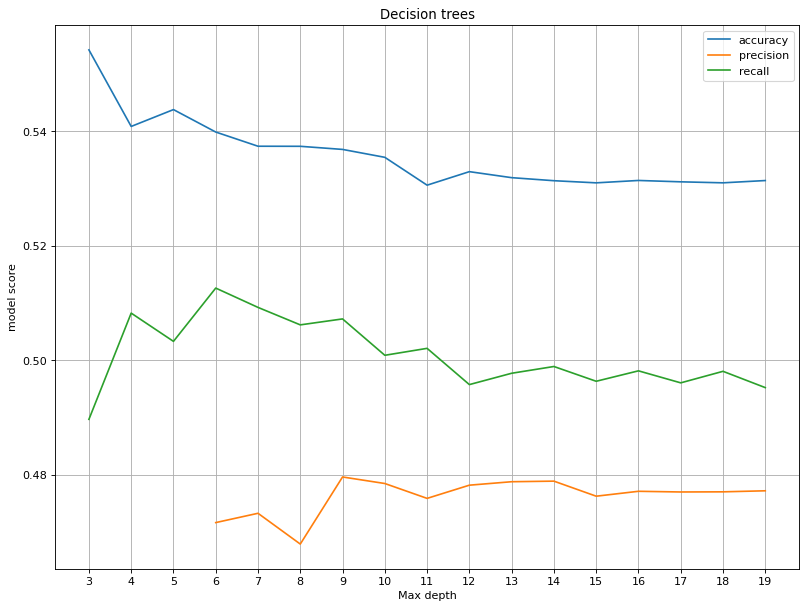

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='Max depth', ylabel='model score')
plt.title("Decision trees")
plt.xticks(np.arange(len(max_depths)),max_depths)
#plt.yticks(np.arange(11)*0.1)
plt.grid()
for i in range(3):
    plt.plot(max_depths_res[:,i])
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

(17,)


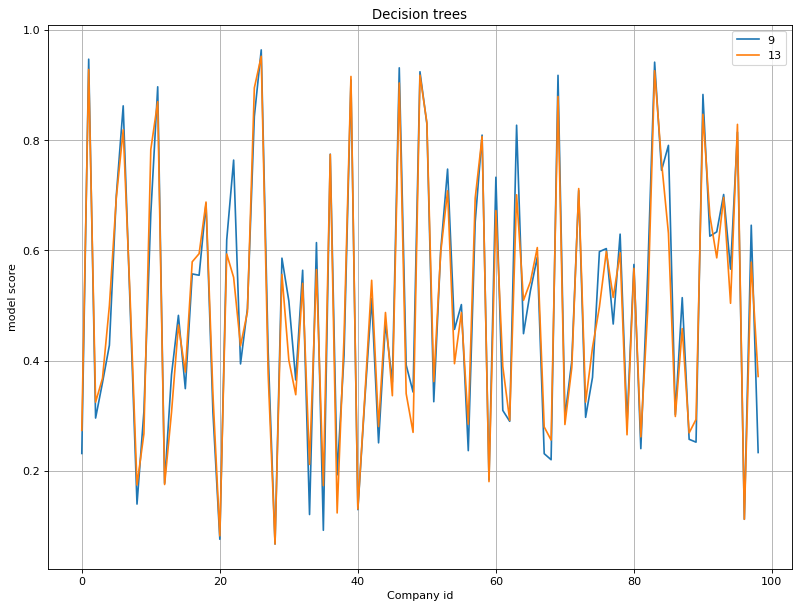

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='Company id', ylabel='model score')
plt.title("Decision trees")
#plt.xticks(np.arange(len(max_iters)),max_iters)
#plt.yticks(np.arange(11)*0.1)
print(max_depths.shape)
plt.grid()
#for i in range(len(max_depths)):
#    plt.plot(np.sum(comp_scores_dec_tree_all[i], axis=1)[:,2]/5)
plt.plot(np.sum(comp_scores_dec_tree_all[8], axis=1)[:,2]/5)
plt.plot(np.sum(comp_scores_dec_tree_all[10], axis=1)[:,2]/5)
#plt.plot(np.sum(comp_scores_dec_tree_all[16], axis=1)[:,2]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
xd =[max_depths[6],max_depths[10]]#, max_depths[16]]
plt.legend(xd)
#true price only

In [ ]:
interval = 1
time_to_skip=30
time_back=5
swing_interval=60
split_percent = 0.8
valid_percent=split_percent+0.2
threshold=0.00167
names=[         
   # 'mid_price',
    'true_price', 
    'order_inbalance', 
    'vwaps_buy', 
    #'vwaps_sell', 
    #'s2f_impact_buy', 
    #'s2f_impact_sell', 
    'trading_volumes', 
    #'vwaps_order_sizes_buy', 
    #'vwaps_order_sizes_sell',
    #'s2f_order_sizes_buy', 
    #'s2f_order_sizes_sell',
    #'next_trade_time',
    #'next_trade_size',
    #'next_trade_price',
    #'price change'
      ]

In [ ]:
comp_scores_log_reg_slumps=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_dec_tree_slumps=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_xgb_slumps=np.zeros((len(list_of_companies_number),5, 3)) 
comp_scores_lstm_slumps=np.zeros((len(list_of_companies_number),5, 3)) 
for comp_id in range(len(list_of_companies_number)):
    print(comp_id)
    X_mom=get_X(comp_id, interval, time_to_skip, time_back, names) 
    y=get_y(comp_id, interval, time_to_skip, time_back, y_name='true_price', 
            check='swing_max', swing_interval=60, threshold=threshold)
    for i in range(5):
        #X_res,y_res=permutate_Xy(np.copy(X_mom),y)
        comp_scores_log_reg_slumps[comp_id,i,0], comp_scores_log_reg_slumps[comp_id,i,1],comp_scores_log_reg_slumps[comp_id,i,2]=logistic_regr(np.copy(X_mom), np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_dec_tree_slumps[comp_id,i,0], comp_scores_dec_tree_slumps[comp_id,i,1],comp_scores_dec_tree_slumps[comp_id,i,2]=decision_tree(np.copy(X_mom), np.copy(y),split_percent, comp_id,  check_up_down=False, local_names=names)
        comp_scores_xgb_slumps[comp_id,i,0], comp_scores_xgb_slumps[comp_id,i,1],comp_scores_xgb_slumps[comp_id,i,2]=XGB(np.copy(X_mom), np.copy(y),split_percent, comp_id, check_up_down=False, local_names=names)
        comp_scores_lstm_slumps[comp_id,i,0], comp_scores_lstm_slumps[comp_id,i,1],comp_scores_lstm_slumps[comp_id,i,2]=LSTM(np.copy(X_mom), np.copy(y),split_percent)

0


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.5840995658532757
order_inbalance   -1.7003301064668066
vwaps_buy   2.355540588715209
trading_volumes   -1.276419528730691
[[148 148]
 [348 306]]
[[ 92  94]
 [404 360]]
[11:26:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7428571428571429
Recall:
0.05241935483870968
[[ 96  83]
 [400 371]]
Coefficient impact:
true_price   -1.582745921601238
order_inbalance   -1.6986889158754601
vwaps_buy   2.3528283157460472
trading_volumes   -1.2753330898670026
[[150 149]
 [346 305]]
[[ 99 115]
 [397 339]]
[11:26:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7428571428571429
Recall:
0.05241935483870968
[[ 84  75]
 [412 379]]
Coefficient impact:
true_price   -1.5845617626436355
order_inbalance   -1.7003125337861702
vwaps_buy   2.354616045106326
trading_volumes   -1.2759288200298775
[[147 148]
 [349 306]]
[[104  83]
 [392 371]]
[11:26:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7428571428571429
Recall:
0.05241935483870968
[[ 98  87]
 [398 367]]
Coefficient impact:
true_price   -1.5839790015793982
order_inbalance   -1.700518150235247
vwaps_buy   2.353364825451066
trading_volumes   -1.278154347325605
[[148 148]
 [348 306]]
[[ 92  75]
 [404 379]]
[11:26:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7428571428571429
Recall:
0.05241935483870968
[[105 101]
 [391 353]]
Coefficient impact:
true_price   -1.584870495678977
order_inbalance   -1.6982872858651932
vwaps_buy   2.355568947067527
trading_volumes   -1.2738908294301483
[[148 148]
 [348 306]]
[[ 99  89]
 [397 365]]
[11:26:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7428571428571429
Recall:
0.05241935483870968
[[ 93  95]
 [403 359]]
1
Coefficient impact:
true_price   -3.145985998291411
order_inbalance   0.5359328569330707
vwaps_buy   1.6802389476001587
trading_volumes   -1.3711865161146735
[[535 414]
 [  1   0]]
[[502 359]
 [ 34  55]]
[11:26:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5992736077481841
Recall:
0.9235074626865671
[[508 358]
 [ 28  56]]
Coefficient impact:
true_price   -3.1451853432992904
order_inbalance   0.5375435102604207
vwaps_buy   1.6806008607964378
trading_volumes   -1.3701566896275132
[[535 414]
 [  1   0]]
[[505 360]
 [ 31  54]]
[11:26:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5992736077481841
Recall:
0.9235074626865671
[[509 357]
 [ 27  57]]
Coefficient impact:
true_price   -3.148441792313295
order_inbalance   0.5330807989623694
vwaps_buy   1.681606491797832
trading_volumes   -1.368839622504262
[[535 414]
 [  1   0]]
[[505 362]
 [ 31  52]]
[11:26:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5992736077481841
Recall:
0.9235074626865671
[[500 359]
 [ 36  55]]
Coefficient impact:
true_price   -3.147188113687547
order_inbalance   0.536945096766471
vwaps_buy   1.6821411497087122
trading_volumes   -1.37000718832759
[[535 413]
 [  1   1]]
[[500 360]
 [ 36  54]]
[11:26:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5992736077481841
Recall:
0.9235074626865671
[[502 356]
 [ 34  58]]
Coefficient impact:
true_price   -3.14805800426121
order_inbalance   0.53751785575002
vwaps_buy   1.6807970474291305
trading_volumes   -1.3721600385449044
[[535 414]
 [  1   0]]
[[508 355]
 [ 28  59]]
[11:26:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5992736077481841
Recall:
0.9235074626865671
[[499 356]
 [ 37  58]]
2
Coefficient impact:
true_price   -0.4653934231865515
order_inbalance   -0.5490349748608432
vwaps_buy   -0.6761354860156515
trading_volumes   -0.21312266541012773
[[242 266]
 [291 151]]
[[146 112]
 [387 305]]
[11:26:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5650224215246636
Recall:
0.23639774859287055
[[146 108]
 [387 309]]
Coefficient impact:
true_price   -0.4654007525860023
order_inbalance   -0.5487385508524452
vwaps_buy   -0.6764237619488481
trading_volumes   -0.21325054596902426
[[242 266]
 [291 151]]
[[150 115]
 [383 302]]
[11:26:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5650224215246636
Recall:
0.23639774859287055
[[146 109]
 [387 308]]
Coefficient impact:
true_price   -0.46553033848613534
order_inbalance   -0.5489573034748063
vwaps_buy   -0.6760431931434497
trading_volumes   -0.2132532807596401
[[241 266]
 [292 151]]
[[150 115]
 [383 302]]
[11:26:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5650224215246636
Recall:
0.23639774859287055
[[152 114]
 [381 303]]
Coefficient impact:
true_price   -0.46586536426206526
order_inbalance   -0.5486441152347987
vwaps_buy   -0.6762385244980873
trading_volumes   -0.21283789333078246
[[242 266]
 [291 151]]
[[150 114]
 [383 303]]
[11:26:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5650224215246636
Recall:
0.23639774859287055
[[148 113]
 [385 304]]
Coefficient impact:
true_price   -0.46504562740633365
order_inbalance   -0.5488501174617683
vwaps_buy   -0.6762550772958079
trading_volumes   -0.2133831268517748
[[242 266]
 [291 151]]
[[141 106]
 [392 311]]
[11:26:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5650224215246636
Recall:
0.23639774859287055
[[146 111]
 [387 306]]
3


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.434588282409437
order_inbalance   0.8897649927921863
vwaps_buy   -0.20061485757456946
trading_volumes   1.5447365105524093
[[ 75  45]
 [410 420]]
[[189 151]
 [296 314]]
[11:26:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5855855855855856
Recall:
0.4020618556701031
[[177 146]
 [308 319]]
Coefficient impact:
true_price   -0.4347099024604926
order_inbalance   0.8896386139950729
vwaps_buy   -0.2003518225593737
trading_volumes   1.545499632941654
[[ 75  45]
 [410 420]]
[[184 146]
 [301 319]]
[11:26:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5855855855855856
Recall:
0.4020618556701031
[[182 142]
 [303 323]]
Coefficient impact:
true_price   -0.43461233855074
order_inbalance   0.8903952187069453
vwaps_buy   -0.19998758491029214
trading_volumes   1.5441357547704286
[[ 75  45]
 [410 420]]
[[188 141]
 [297 324]]
[11:26:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5855855855855856
Recall:
0.4020618556701031
[[188 151]
 [297 314]]
Coefficient impact:
true_price   -0.4350218516209908
order_inbalance   0.8902408511619562
vwaps_buy   -0.20151596140953373
trading_volumes   1.5459181764111887
[[ 75  45]
 [410 420]]
[[198 154]
 [287 311]]
[11:26:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5855855855855856
Recall:
0.4020618556701031
[[196 153]
 [289 312]]
Coefficient impact:
true_price   -0.4337177169336634
order_inbalance   0.8906551157764282
vwaps_buy   -0.20021365320132362
trading_volumes   1.5455158431964022
[[ 75  45]
 [410 420]]
[[180 140]
 [305 325]]
[11:26:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5855855855855856
Recall:
0.4020618556701031
[[181 140]
 [304 325]]
4


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.449405360023261
order_inbalance   1.2285174375381522
vwaps_buy   0.2688129488470186
trading_volumes   1.0758732145973307
[[158 400]
 [187 205]]
[[166 202]
 [179 403]]
[11:27:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5032467532467533
Recall:
0.4492753623188406
[[155 191]
 [190 414]]
Coefficient impact:
true_price   -1.4498479173764758
order_inbalance   1.2282323736515706
vwaps_buy   0.2688980647643952
trading_volumes   1.0760234829615247
[[157 397]
 [188 208]]
[[151 184]
 [194 421]]
[11:27:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' wa

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5032467532467533
Recall:
0.4492753623188406
[[165 207]
 [180 398]]
Coefficient impact:
true_price   -1.4503472163014945
order_inbalance   1.229217353247529
vwaps_buy   0.2687202099185495
trading_volumes   1.075679162006096
[[156 395]
 [189 210]]
[[153 184]
 [192 421]]
[11:27:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5032467532467533
Recall:
0.4492753623188406
[[148 179]
 [197 426]]
Coefficient impact:
true_price   -1.4493946884681081
order_inbalance   1.2265958026040211
vwaps_buy   0.2680583484728021
trading_volumes   1.0771708571349408
[[156 395]
 [189 210]]
[[156 190]
 [189 415]]
[11:27:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5032467532467533
Recall:
0.4492753623188406
[[153 202]
 [192 403]]
Coefficient impact:
true_price   -1.4489917229182265
order_inbalance   1.2292754505076047
vwaps_buy   0.2685759773630273
trading_volumes   1.0762884059292828
[[158 400]
 [187 205]]
[[154 198]
 [191 407]]
[11:27:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5032467532467533
Recall:
0.4492753623188406
[[146 174]
 [199 431]]
5
Coefficient impact:
true_price   -2.6235232824374792
order_inbalance   -0.27305111510274693
vwaps_buy   0.849393394633993
trading_volumes   0.4015005989191055
[[555 395]
 [  0   0]]
[[426 253]
 [129 142]]
[11:27:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6104553119730185
Recall:
0.6522522522522523
[[424 251]
 [131 144]]
Coefficient impact:
true_price   -2.6232218713086373
order_inbalance   -0.2684168314915648
vwaps_buy   0.8485050479002918
trading_volumes   0.3993811982904981
[[555 395]
 [  0   0]]
[[426 253]
 [129 142]]
[11:27:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6104553119730185
Recall:
0.6522522522522523
[[424 252]
 [131 143]]
Coefficient impact:
true_price   -2.6234304273962237
order_inbalance   -0.269874579640197
vwaps_buy   0.8489551577795599
trading_volumes   0.3973737045437386
[[555 395]
 [  0   0]]
[[426 252]
 [129 143]]
[11:27:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6104553119730185
Recall:
0.6522522522522523
[[425 250]
 [130 145]]
Coefficient impact:
true_price   -2.621421562500572
order_inbalance   -0.2679495583687068
vwaps_buy   0.8483366155618028
trading_volumes   0.40015114488065523
[[555 395]
 [  0   0]]
[[425 251]
 [130 144]]
[11:27:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6104553119730185
Recall:
0.6522522522522523
[[426 253]
 [129 142]]
Coefficient impact:
true_price   -2.6249314440171148
order_inbalance   -0.2696578385122168
vwaps_buy   0.8487897129663186
trading_volumes   0.39994120314005543
[[555 395]
 [  0   0]]
[[427 254]
 [128 141]]
[11:27:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6104553119730185
Recall:
0.6522522522522523
[[426 252]
 [129 143]]
6
Coefficient impact:
true_price   -3.3015099099529337
order_inbalance   0.014563076997453996
vwaps_buy   0.6787331881081492
trading_volumes   -3.3939172135521414
[[458 483]
 [  6   3]]
[[433 448]
 [ 31  38]]
[11:27:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48028673835125446
Recall:
0.8663793103448276
[[434 449]
 [ 30  37]]
Coefficient impact:
true_price   -3.301893344362233
order_inbalance   0.016221597895491165
vwaps_buy   0.6777714219881535
trading_volumes   -3.3958423072312307
[[456 482]
 [  8   4]]
[[428 441]
 [ 36  45]]
[11:27:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48028673835125446
Recall:
0.8663793103448276
[[436 448]
 [ 28  38]]
Coefficient impact:
true_price   -3.304425652870037
order_inbalance   0.013890686528964743
vwaps_buy   0.6802237626155646
trading_volumes   -3.393113273855863
[[458 482]
 [  6   4]]
[[433 449]
 [ 31  37]]
[11:27:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48028673835125446
Recall:
0.8663793103448276
[[426 441]
 [ 38  45]]
Coefficient impact:
true_price   -3.303897371374522
order_inbalance   0.014946906951171008
vwaps_buy   0.6765844838245324
trading_volumes   -3.3942679691387534
[[458 482]
 [  6   4]]
[[426 442]
 [ 38  44]]
[11:27:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48028673835125446
Recall:
0.8663793103448276
[[427 442]
 [ 37  44]]
Coefficient impact:
true_price   -3.3004094211871697
order_inbalance   0.01802474560194338
vwaps_buy   0.6765718112642869
trading_volumes   -3.3957028797054365
[[458 482]
 [  6   4]]
[[436 449]
 [ 28  37]]
[11:27:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48028673835125446
Recall:
0.8663793103448276
[[429 441]
 [ 35  45]]
7
Coefficient impact:
true_price   -2.779903386052943
order_inbalance   -0.12179215049146917
vwaps_buy   1.0498221679201045
trading_volumes   -1.3668840774457862
[[  2   7]
 [490 451]]
[[274 317]
 [218 141]]
[11:27:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4502529510961214
Recall:
0.5426829268292683
[[274 320]
 [218 138]]
Coefficient impact:
true_price   -2.777114252497636
order_inbalance   -0.12120014610994391
vwaps_buy   1.0551902671115743
trading_volumes   -1.3672717716502039
[[  3   7]
 [489 451]]
[[276 318]
 [216 140]]
[11:27:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4502529510961214
Recall:
0.5426829268292683
[[271 313]
 [221 145]]
Coefficient impact:
true_price   -2.7798933072155836
order_inbalance   -0.1214174003374971
vwaps_buy   1.0553550269103134
trading_volumes   -1.3667384037341201
[[  2   7]
 [490 451]]
[[272 321]
 [220 137]]
[11:27:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4502529510961214
Recall:
0.5426829268292683
[[276 315]
 [216 143]]
Coefficient impact:
true_price   -2.7785133995569415
order_inbalance   -0.12368095074455597
vwaps_buy   1.0522995367501236
trading_volumes   -1.3652499046791997
[[  3   7]
 [489 451]]
[[268 311]
 [224 147]]
[11:27:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4502529510961214
Recall:
0.5426829268292683
[[277 318]
 [215 140]]
Coefficient impact:
true_price   -2.775102979354924
order_inbalance   -0.12551760742292015
vwaps_buy   1.0553537614956503
trading_volumes   -1.3655210468500525
[[  3   7]
 [489 451]]
[[275 317]
 [217 141]]
[11:27:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4502529510961214
Recall:
0.5426829268292683
[[274 317]
 [218 141]]
8
Coefficient impact:
true_price   -2.202107441442715
order_inbalance   -0.6327886152475102
vwaps_buy   -0.10793192889729712
trading_volumes   -0.9958516074926258
[[407 467]
 [ 50  26]]
[[227 385]
 [230 108]]
[11:27:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4509090909090909
Recall:
0.2713347921225383
[[223 388]
 [234 105]]
Coefficient impact:
true_price   -2.1996751815640976
order_inbalance   -0.6331172401682574
vwaps_buy   -0.10861710523008486
trading_volumes   -0.9977638080866218
[[407 468]
 [ 50  25]]
[[289 302]
 [168 191]]
[11:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4509090909090909
Recall:
0.2713347921225383
[[229 389]
 [228 104]]
Coefficient impact:
true_price   -2.2004314683128263
order_inbalance   -0.6333752114993918
vwaps_buy   -0.11256796326872397
trading_volumes   -0.9979140778937035
[[407 468]
 [ 50  25]]
[[227 386]
 [230 107]]
[11:27:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4509090909090909
Recall:
0.2713347921225383
[[161 237]
 [296 256]]
Coefficient impact:
true_price   -2.198482048245284
order_inbalance   -0.6310798453856105
vwaps_buy   -0.10848621724140489
trading_volumes   -0.9973055250973102
[[407 468]
 [ 50  25]]
[[283 301]
 [174 192]]
[11:27:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4509090909090909
Recall:
0.2713347921225383
[[345 446]
 [112  47]]
Coefficient impact:
true_price   -2.200755043159987
order_inbalance   -0.6328242027399815
vwaps_buy   -0.10768646240911099
trading_volumes   -0.9994440655686808
[[407 468]
 [ 50  25]]
[[347 446]
 [110  47]]
[11:27:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4509090909090909
Recall:
0.2713347921225383
[[287 301]
 [170 192]]
9
Coefficient impact:
true_price   -1.2419945437021829
order_inbalance   1.0277214916879727
vwaps_buy   0.18057431600639
trading_volumes   3.215099907094783
[[ 97  78]
 [335 440]]
[[109  81]
 [323 437]]
[11:27:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6484375
Recall:
0.19212962962962962
[[105  80]
 [327 438]]
Coefficient impact:
true_price   -1.2451403133883747
order_inbalance   1.0277685108026906
vwaps_buy   0.18175527118348933
trading_volumes   3.2155116166366877
[[ 94  75]
 [338 443]]
[[107  80]
 [325 438]]
[11:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6484375
Recall:
0.19212962962962962
[[107  79]
 [325 439]]
Coefficient impact:
true_price   -1.2448422308398075
order_inbalance   1.026927141431049
vwaps_buy   0.18154371499767186
trading_volumes   3.2127908242256353
[[ 97  78]
 [335 440]]
[[119  82]
 [313 436]]
[11:27:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6484375
Recall:
0.19212962962962962
[[112  85]
 [320 433]]
Coefficient impact:
true_price   -1.2450036749958306
order_inbalance   1.0300842617540513
vwaps_buy   0.1813796030447489
trading_volumes   3.2151292495329944
[[ 87  73]
 [345 445]]
[[100  73]
 [332 445]]
[11:27:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6484375
Recall:
0.19212962962962962
[[110  81]
 [322 437]]
Coefficient impact:
true_price   -1.2445108869931507
order_inbalance   1.0264373232123212
vwaps_buy   0.1811786616251577
trading_volumes   3.2136781907361804
[[ 94  74]
 [338 444]]
[[112  74]
 [320 444]]
[11:27:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6484375
Recall:
0.19212962962962962
[[ 99  70]
 [333 448]]
10
Coefficient impact:
true_price   -1.6194936536111713
order_inbalance   -0.13463635126534948
vwaps_buy   0.6683007304277732
trading_volumes   2.0713843436765793
[[  9   4]
 [354 583]]
[[281 389]
 [ 82 198]]
[11:27:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3936899862825789
Recall:
0.790633608815427
[[285 382]
 [ 78 205]]
Coefficient impact:
true_price   -1.6208646848754076
order_inbalance   -0.13503359683506735
vwaps_buy   0.6665087999368338
trading_volumes   2.071668608019648
[[  9   4]
 [354 583]]
[[246 331]
 [117 256]]
[11:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3936899862825789
Recall:
0.790633608815427
[[289 353]
 [ 74 234]]
Coefficient impact:
true_price   -1.6223481922473002
order_inbalance   -0.13345673060168525
vwaps_buy   0.668416050436645
trading_volumes   2.067869942835279
[[  9   4]
 [354 583]]
[[276 359]
 [ 87 228]]
[11:27:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3936899862825789
Recall:
0.790633608815427
[[253 331]
 [110 256]]
Coefficient impact:
true_price   -1.620008248415532
order_inbalance   -0.13344599323141493
vwaps_buy   0.6673806300092884
trading_volumes   2.0701729129431086
[[  9   4]
 [354 583]]
[[286 349]
 [ 77 238]]
[11:27:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3936899862825789
Recall:
0.790633608815427
[[279 360]
 [ 84 227]]
Coefficient impact:
true_price   -1.6204992786591537
order_inbalance   -0.13485465600461982
vwaps_buy   0.6667802719983252
trading_volumes   2.0724723692480818
[[  9   4]
 [354 583]]
[[280 359]
 [ 83 228]]
[11:27:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3936899862825789
Recall:
0.790633608815427
[[277 360]
 [ 86 227]]
11
Coefficient impact:
true_price   0.7409865123768178
order_inbalance   1.23828679887048
vwaps_buy   -0.42031168485081194
trading_volumes   -0.19148379547159108
[[384 565]
 [  1   0]]
[[357 509]
 [ 28  56]]
[11:27:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142538975501114
Recall:
0.9662337662337662
[[354 512]
 [ 31  53]]
Coefficient impact:
true_price   0.74116223225847
order_inbalance   1.238126237490867
vwaps_buy   -0.42042395209591144
trading_volumes   -0.19128844733984424
[[384 565]
 [  1   0]]
[[352 510]
 [ 33  55]]
[11:27:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142538975501114
Recall:
0.9662337662337662
[[354 511]
 [ 31  54]]
Coefficient impact:
true_price   0.7421209757349013
order_inbalance   1.2383830735210828
vwaps_buy   -0.42152611883656027
trading_volumes   -0.19094691839017242
[[384 565]
 [  1   0]]
[[351 511]
 [ 34  54]]
[11:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142538975501114
Recall:
0.9662337662337662
[[356 515]
 [ 29  50]]
Coefficient impact:
true_price   0.7415671762725699
order_inbalance   1.2376320845519404
vwaps_buy   -0.4198620580051309
trading_volumes   -0.19098431312516023
[[384 565]
 [  1   0]]
[[351 510]
 [ 34  55]]
[11:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142538975501114
Recall:
0.9662337662337662
[[356 509]
 [ 29  56]]
Coefficient impact:
true_price   0.7416443538661802
order_inbalance   1.2383247763503056
vwaps_buy   -0.4208786375405422
trading_volumes   -0.19128481223803082
[[384 565]
 [  1   0]]
[[354 514]
 [ 31  51]]
[11:27:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4142538975501114
Recall:
0.9662337662337662
[[358 509]
 [ 27  56]]
12
Coefficient impact:
true_price   -3.8500219653002716
order_inbalance   -0.3974984533101034
vwaps_buy   0.2928451168062818
trading_volumes   -1.1896212868440597
[[ 12   3]
 [462 473]]
[[ 38  35]
 [436 441]]
[11:27:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6296296296296297
Recall:
0.035864978902953586
[[ 35  46]
 [439 430]]
Coefficient impact:
true_price   -3.850333230848621
order_inbalance   -0.3985661717076553
vwaps_buy   0.29206974250175094
trading_volumes   -1.1895070916267154
[[ 12   3]
 [462 473]]
[[ 35  31]
 [439 445]]
[11:27:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6296296296296297
Recall:
0.035864978902953586
[[ 31  29]
 [443 447]]
Coefficient impact:
true_price   -3.849044837849906
order_inbalance   -0.39840107027923277
vwaps_buy   0.2923914052516983
trading_volumes   -1.1904008397416737
[[ 13   3]
 [461 473]]
[[ 76  59]
 [398 417]]
[11:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6296296296296297
Recall:
0.035864978902953586
[[ 28  16]
 [446 460]]
Coefficient impact:
true_price   -3.849228330882471
order_inbalance   -0.39822089149260487
vwaps_buy   0.29227447568364123
trading_volumes   -1.1903295022863338
[[ 13   3]
 [461 473]]
[[ 25  16]
 [449 460]]
[11:27:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6296296296296297
Recall:
0.035864978902953586
[[ 28  11]
 [446 465]]
Coefficient impact:
true_price   -3.849409370362158
order_inbalance   -0.397859554854385
vwaps_buy   0.29012638026841725
trading_volumes   -1.1933907434698943
[[ 13   3]
 [461 473]]
[[ 25  16]
 [449 460]]
[11:27:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6296296296296297
Recall:
0.035864978902953586
[[ 29  20]
 [445 456]]
13
Coefficient impact:
true_price   -1.3212622928466202
order_inbalance   -0.6003932218345392
vwaps_buy   0.4802593043836679
trading_volumes   0.2741111144866606
[[245 398]
 [100 207]]
[[113 161]
 [232 444]]
[11:27:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.428
Recall:
0.3101449275362319
[[112 164]
 [233 441]]
Coefficient impact:
true_price   -1.3214053514508477
order_inbalance   -0.6004996016151574
vwaps_buy   0.47918404952014637
trading_volumes   0.27345196126240223
[[243 397]
 [102 208]]
[[111 162]
 [234 443]]
[11:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.428
Recall:
0.3101449275362319
[[106 155]
 [239 450]]
Coefficient impact:
true_price   -1.3214964212673368
order_inbalance   -0.6006399005586472
vwaps_buy   0.4806036337246189
trading_volumes   0.2734657116170489
[[244 398]
 [101 207]]
[[109 157]
 [236 448]]
[11:27:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.428
Recall:
0.3101449275362319
[[110 158]
 [235 447]]
Coefficient impact:
true_price   -1.3214597023815189
order_inbalance   -0.6004056410429495
vwaps_buy   0.48072235655032686
trading_volumes   0.2742018668190592
[[243 397]
 [102 208]]
[[106 157]
 [239 448]]
[11:27:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.428
Recall:
0.3101449275362319
[[110 157]
 [235 448]]
Coefficient impact:
true_price   -1.32157741848186
order_inbalance   -0.6001480722628101
vwaps_buy   0.48024399492202113
trading_volumes   0.2725726388250248
[[243 397]
 [102 208]]
[[109 156]
 [236 449]]
[11:27:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.428
Recall:
0.3101449275362319
[[108 155]
 [237 450]]
14
Coefficient impact:
true_price   0.22690531888420593
order_inbalance   1.089952355216646
vwaps_buy   0.557752711769994
trading_volumes   0.009451501114583523
[[201 264]
 [321 164]]
[[277 244]
 [245 184]]
[11:27:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508317929759704
Recall:
0.5708812260536399
[[279 243]
 [243 185]]
Coefficient impact:
true_price   0.2273034484263884
order_inbalance   1.0905988990215674
vwaps_buy   0.5574857960828148
trading_volumes   0.00949151296912145
[[201 264]
 [321 164]]
[[278 248]
 [244 180]]
[11:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508317929759704
Recall:
0.5708812260536399
[[241 232]
 [281 196]]
Coefficient impact:
true_price   0.22765834456954193
order_inbalance   1.090050444661182
vwaps_buy   0.5583497279751058
trading_volumes   0.008388513175855298
[[202 269]
 [320 159]]
[[278 238]
 [244 190]]
[11:27:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508317929759704
Recall:
0.5708812260536399
[[276 248]
 [246 180]]
Coefficient impact:
true_price   0.2268728147863619
order_inbalance   1.0899689377728128
vwaps_buy   0.5576670963833091
trading_volumes   0.009380298674982428
[[202 265]
 [320 163]]
[[266 239]
 [256 189]]
[11:27:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508317929759704
Recall:
0.5708812260536399
[[268 236]
 [254 192]]
Coefficient impact:
true_price   0.22706285487057729
order_inbalance   1.090051242682756
vwaps_buy   0.5576153531580479
trading_volumes   0.00937667912561011
[[202 265]
 [320 163]]
[[276 238]
 [246 190]]
[11:27:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5508317929759704
Recall:
0.5708812260536399
[[272 240]
 [250 188]]
15
Coefficient impact:
true_price   -0.012903424883157695
order_inbalance   0.10021052989210386
vwaps_buy   -0.028937824299123793
trading_volumes   -0.7804956198974744
[[  0   0]
 [412 538]]
[[143 192]
 [269 346]]
[11:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45901639344262296
Recall:
0.33980582524271846
[[142 213]
 [270 325]]
Coefficient impact:
true_price   -0.013014988877369295
order_inbalance   0.09835257705526096
vwaps_buy   -0.029127233967561766
trading_volumes   -0.7791982281543581
[[  0   0]
 [412 538]]
[[142 192]
 [270 346]]
[11:27:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45901639344262296
Recall:
0.33980582524271846
[[139 194]
 [273 344]]
Coefficient impact:
true_price   -0.01354498147179528
order_inbalance   0.09912371444557855
vwaps_buy   -0.02798683354469092
trading_volumes   -0.7794012843707707
[[  0   0]
 [412 538]]
[[140 204]
 [272 334]]
[11:27:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45901639344262296
Recall:
0.33980582524271846
[[145 209]
 [267 329]]
Coefficient impact:
true_price   -0.012465419496532293
order_inbalance   0.09913660495328872
vwaps_buy   -0.028186617097143683
trading_volumes   -0.7793082827382838
[[  0   0]
 [412 538]]
[[142 203]
 [270 335]]
[11:27:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45901639344262296
Recall:
0.33980582524271846
[[143 192]
 [269 346]]
Coefficient impact:
true_price   -0.012798650930788231
order_inbalance   0.09842823020895225
vwaps_buy   -0.028365714570848643
trading_volumes   -0.7793234028701199
[[  0   0]
 [412 538]]
[[145 200]
 [267 338]]
[11:27:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.45901639344262296
Recall:
0.33980582524271846
[[143 201]
 [269 337]]
16
Coefficient impact:
true_price   -6.508403817414747
order_inbalance   -0.3299902685968739
vwaps_buy   0.403660813117508
trading_volumes   1.6691257934759127
[[509 441]
 [  0   0]]
[[270 240]
 [239 201]]
[11:27:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.547085201793722
Recall:
0.4793713163064833
[[268 244]
 [241 197]]
Coefficient impact:
true_price   -6.506914384076627
order_inbalance   -0.33122870790598613
vwaps_buy   0.4030207914804695
trading_volumes   1.6652175315410744
[[509 441]
 [  0   0]]
[[266 241]
 [243 200]]
[11:28:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.547085201793722
Recall:
0.4793713163064833
[[266 223]
 [243 218]]
Coefficient impact:
true_price   -6.513255313950145
order_inbalance   -0.33274781441847295
vwaps_buy   0.40561051239222257
trading_volumes   1.6688728289800097
[[509 441]
 [  0   0]]
[[262 232]
 [247 209]]
[11:28:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.547085201793722
Recall:
0.4793713163064833
[[268 240]
 [241 201]]
Coefficient impact:
true_price   -6.506506384369592
order_inbalance   -0.3323898687431666
vwaps_buy   0.40021220636298344
trading_volumes   1.6675508375494283
[[509 441]
 [  0   0]]
[[270 238]
 [239 203]]
[11:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.547085201793722
Recall:
0.4793713163064833
[[253 233]
 [256 208]]
Coefficient impact:
true_price   -6.509364576787764
order_inbalance   -0.3340255688703443
vwaps_buy   0.40162236354589564
trading_volumes   1.6700038816460179
[[509 441]
 [  0   0]]
[[271 233]
 [238 208]]
[11:28:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.547085201793722
Recall:
0.4793713163064833
[[263 226]
 [246 215]]
17
Coefficient impact:
true_price   -2.93776453256181
order_inbalance   -0.6583132990712609
vwaps_buy   1.5753987229721846
trading_volumes   -0.6726403216192085
[[429 232]
 [ 97 192]]
[[350 248]
 [176 176]]
[11:28:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6054313099041534
Recall:
0.720532319391635
[[314 235]
 [212 189]]
Coefficient impact:
true_price   -2.9395647675749395
order_inbalance   -0.6595959348525999
vwaps_buy   1.574067983139006
trading_volumes   -0.6727576245887495
[[429 230]
 [ 97 194]]
[[341 239]
 [185 185]]
[11:28:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6054313099041534
Recall:
0.720532319391635
[[322 239]
 [204 185]]
Coefficient impact:
true_price   -2.937775124126693
order_inbalance   -0.6592443756019538
vwaps_buy   1.5757907995048694
trading_volumes   -0.6719686648482667
[[429 230]
 [ 97 194]]
[[350 236]
 [176 188]]
[11:28:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6054313099041534
Recall:
0.720532319391635
[[317 238]
 [209 186]]
Coefficient impact:
true_price   -2.9401119747055775
order_inbalance   -0.6588077735199974
vwaps_buy   1.5748153333888504
trading_volumes   -0.6718268987840708
[[429 229]
 [ 97 195]]
[[314 231]
 [212 193]]
[11:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6054313099041534
Recall:
0.720532319391635
[[341 244]
 [185 180]]
Coefficient impact:
true_price   -2.9399004983532975
order_inbalance   -0.6585052805145848
vwaps_buy   1.5751316996099873
trading_volumes   -0.6724140114289248
[[429 230]
 [ 97 194]]
[[346 241]
 [180 183]]
[11:28:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6054313099041534
Recall:
0.720532319391635
[[317 236]
 [209 188]]
18
Coefficient impact:
true_price   -3.613614991860029
order_inbalance   1.009863043167945
vwaps_buy   -0.12630330236621987
trading_volumes   -2.4137233463119605
[[  2  72]
 [215 661]]
[[138 448]
 [ 79 285]]
[11:28:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2128935532233883
Recall:
0.6543778801843319
[[133 469]
 [ 84 264]]
Coefficient impact:
true_price   -3.616259841767702
order_inbalance   1.0070938424606912
vwaps_buy   -0.12882428176353747
trading_volumes   -2.413592457934177
[[  2  67]
 [215 666]]
[[128 460]
 [ 89 273]]
[11:28:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2128935532233883
Recall:
0.6543778801843319
[[137 446]
 [ 80 287]]
Coefficient impact:
true_price   -3.614170262677663
order_inbalance   1.0069403115891138
vwaps_buy   -0.1257933042237126
trading_volumes   -2.4155219839426785
[[  2  72]
 [215 661]]
[[135 450]
 [ 82 283]]
[11:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2128935532233883
Recall:
0.6543778801843319
[[131 457]
 [ 86 276]]
Coefficient impact:
true_price   -3.6144842419960956
order_inbalance   1.0056327485415355
vwaps_buy   -0.12726662364120955
trading_volumes   -2.414626193400857
[[  2  69]
 [215 664]]
[[138 449]
 [ 79 284]]
[11:28:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2128935532233883
Recall:
0.6543778801843319
[[140 449]
 [ 77 284]]
Coefficient impact:
true_price   -3.614505183409198
order_inbalance   1.0085893541117077
vwaps_buy   -0.12755934005322883
trading_volumes   -2.4152123927957247
[[  2  70]
 [215 663]]
[[138 471]
 [ 79 262]]
[11:28:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2128935532233883
Recall:
0.6543778801843319
[[136 455]
 [ 81 278]]
19
Coefficient impact:
true_price   -2.675736958814273
order_inbalance   0.4451069139491443
vwaps_buy   0.43827852633922054
trading_volumes   -0.4395592956365573
[[ 86  61]
 [306 497]]
[[229 332]
 [163 226]]
[11:28:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3942307692307692
Recall:
0.5229591836734694
[[226 332]
 [166 226]]
Coefficient impact:
true_price   -2.6758081844063506
order_inbalance   0.4426413190748577
vwaps_buy   0.4390422088744513
trading_volumes   -0.4410479067876188
[[ 88  63]
 [304 495]]
[[226 336]
 [166 222]]
[11:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3942307692307692
Recall:
0.5229591836734694
[[226 338]
 [166 220]]
Coefficient impact:
true_price   -2.675347703419526
order_inbalance   0.4401605619544586
vwaps_buy   0.44014518901190647
trading_volumes   -0.4411958655184171
[[ 88  64]
 [304 494]]
[[226 334]
 [166 224]]
[11:28:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3942307692307692
Recall:
0.5229591836734694
[[229 334]
 [163 224]]
Coefficient impact:
true_price   -2.6765747919350584
order_inbalance   0.4420510841701942
vwaps_buy   0.4412613177470858
trading_volumes   -0.4412364959754719
[[ 88  63]
 [304 495]]
[[224 332]
 [168 226]]
[11:28:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3942307692307692
Recall:
0.5229591836734694
[[232 336]
 [160 222]]
Coefficient impact:
true_price   -2.6755992289236126
order_inbalance   0.44088505982048665
vwaps_buy   0.4385895739579372
trading_volumes   -0.4407506124920621
[[ 87  63]
 [305 495]]
[[224 330]
 [168 228]]
[11:28:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3942307692307692
Recall:
0.5229591836734694
[[224 326]
 [168 232]]
20
Coefficient impact:
true_price   -2.2156916833634295
order_inbalance   0.3005227538761554
vwaps_buy   -0.5081910536411651
trading_volumes   -0.6701262687596525
[[383 553]
 [  5   9]]
[[ 53  25]
 [335 537]]
[11:28:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[[ 53  25]
 [335 537]]
Coefficient impact:
true_price   -2.2156021962604053
order_inbalance   0.3002420147508936
vwaps_buy   -0.5091007529658944
trading_volumes   -0.670445184327695
[[383 552]
 [  5  10]]
[[ 38  18]
 [350 544]]
[11:28:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[[ 38  18]
 [350 544]]
Coefficient impact:
true_price   -2.2154070485358024
order_inbalance   0.3001875913592073
vwaps_buy   -0.5076489940428931
trading_volumes   -0.6696601761887313
[[383 553]
 [  5   9]]
[[ 37  18]
 [351 544]]
[11:28:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[[ 38  18]
 [350 544]]
Coefficient impact:
true_price   -2.215833838770241
order_inbalance   0.29924344748776543
vwaps_buy   -0.5083767089574439
trading_volumes   -0.6702835990687628
[[383 553]
 [  5   9]]
[[ 54  25]
 [334 537]]
[11:28:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[[ 37  18]
 [351 544]]
Coefficient impact:
true_price   -2.215565653759693
order_inbalance   0.30018543208202986
vwaps_buy   -0.5085669156274087
trading_volumes   -0.6701567858091911
[[383 553]
 [  5   9]]
[[ 38  18]
 [350 544]]
[11:28:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.028350515463917526
[[ 38  18]
 [350 544]]
21
Coefficient impact:
true_price   -3.263772375979045
order_inbalance   -0.41446183444765844
vwaps_buy   -0.8845779980276919
trading_volumes   -1.8930818543446872
[[418 525]
 [  2   5]]
[[221 186]
 [199 344]]
[11:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37228260869565216
Recall:
0.3261904761904762
[[220 180]
 [200 350]]
Coefficient impact:
true_price   -3.264257075220939
order_inbalance   -0.41238969440133244
vwaps_buy   -0.8846303659463616
trading_volumes   -1.892485096366889
[[418 525]
 [  2   5]]
[[220 180]
 [200 350]]
[11:28:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37228260869565216
Recall:
0.3261904761904762
[[262 193]
 [158 337]]
Coefficient impact:
true_price   -3.2634475915709262
order_inbalance   -0.41337051387150786
vwaps_buy   -0.8812520679299398
trading_volumes   -1.891824289346339
[[418 525]
 [  2   5]]
[[213 184]
 [207 346]]
[11:28:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37228260869565216
Recall:
0.3261904761904762
[[252 188]
 [168 342]]
Coefficient impact:
true_price   -3.2642177512999337
order_inbalance   -0.4134015015513014
vwaps_buy   -0.8855118554670486
trading_volumes   -1.894102571723836
[[418 525]
 [  2   5]]
[[252 185]
 [168 345]]
[11:28:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37228260869565216
Recall:
0.3261904761904762
[[257 193]
 [163 337]]
Coefficient impact:
true_price   -3.2630180940811058
order_inbalance   -0.41361956698409685
vwaps_buy   -0.8850776818469226
trading_volumes   -1.8954132633156522
[[418 525]
 [  2   5]]
[[257 185]
 [163 345]]
[11:28:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.37228260869565216
Recall:
0.3261904761904762
[[258 192]
 [162 338]]
22
Coefficient impact:
true_price   2.7937949095000616
order_inbalance   0.6612886042399053
vwaps_buy   1.2103679189249703
trading_volumes   0.5599111600250407
[[412 338]
 [ 89 111]]
[[323 200]
 [178 249]]
[11:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690307328605201
Recall:
0.564870259481038
[[321 195]
 [180 254]]
Coefficient impact:
true_price   2.7915844709852053
order_inbalance   0.6644015204461915
vwaps_buy   1.2120895014585813
trading_volumes   0.5583808219772006
[[409 338]
 [ 92 111]]
[[324 196]
 [177 253]]
[11:28:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690307328605201
Recall:
0.564870259481038
[[319 192]
 [182 257]]
Coefficient impact:
true_price   2.7945481549033224
order_inbalance   0.6627023740102976
vwaps_buy   1.2111006927255032
trading_volumes   0.5598946476539961
[[414 341]
 [ 87 108]]
[[320 195]
 [181 254]]
[11:28:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690307328605201
Recall:
0.564870259481038
[[322 200]
 [179 249]]
Coefficient impact:
true_price   2.795269368329436
order_inbalance   0.6609361268086447
vwaps_buy   1.210688896548293
trading_volumes   0.5606813541302589
[[414 341]
 [ 87 108]]
[[319 199]
 [182 250]]
[11:28:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690307328605201
Recall:
0.564870259481038
[[322 196]
 [179 253]]
Coefficient impact:
true_price   2.7931902050734334
order_inbalance   0.6607391915725268
vwaps_buy   1.2108118038916764
trading_volumes   0.5612334560282844
[[413 339]
 [ 88 110]]
[[322 196]
 [179 253]]
[11:28:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6690307328605201
Recall:
0.564870259481038
[[319 195]
 [182 254]]
23
Coefficient impact:
true_price   -1.5184892484131158
order_inbalance   -0.6899319959975458
vwaps_buy   0.5906621351779774
trading_volumes   -2.136221074773467
[[319 314]
 [172 145]]
[[165 228]
 [326 231]]
[11:28:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48872180451127817
Recall:
0.3971486761710794
[[126 200]
 [365 259]]
Coefficient impact:
true_price   -1.5174170974055887
order_inbalance   -0.6888768898041824
vwaps_buy   0.5909716601072612
trading_volumes   -2.1344150140408007
[[320 315]
 [171 144]]
[[149 215]
 [342 244]]
[11:28:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48872180451127817
Recall:
0.3971486761710794
[[157 215]
 [334 244]]
Coefficient impact:
true_price   -1.5185702130531609
order_inbalance   -0.6887838907522423
vwaps_buy   0.5907629440687064
trading_volumes   -2.135464029815173
[[320 315]
 [171 144]]
[[132 221]
 [359 238]]
[11:28:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48872180451127817
Recall:
0.3971486761710794
[[173 215]
 [318 244]]
Coefficient impact:
true_price   -1.5168236858270505
order_inbalance   -0.6878339717058553
vwaps_buy   0.5904171067826468
trading_volumes   -2.136493204203969
[[322 317]
 [169 142]]
[[144 227]
 [347 232]]
[11:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48872180451127817
Recall:
0.3971486761710794
[[148 207]
 [343 252]]
Coefficient impact:
true_price   -1.5177678708664541
order_inbalance   -0.6884151359952834
vwaps_buy   0.5907219723596643
trading_volumes   -2.1348413919586355
[[322 316]
 [169 143]]
[[135 220]
 [356 239]]
[11:28:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48872180451127817
Recall:
0.3971486761710794
[[155 201]
 [336 258]]
24
Coefficient impact:
true_price   -2.4061479378844473
order_inbalance   -0.3411268458699888
vwaps_buy   -1.6874780418256785
trading_volumes   -1.032558243582375
[[ 27  60]
 [295 568]]
[[151 347]
 [171 281]]
[11:28:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.279826464208243
Recall:
0.40062111801242234
[[154 354]
 [168 274]]
Coefficient impact:
true_price   -2.405380389789695
order_inbalance   -0.33851973462372825
vwaps_buy   -1.68751545441772
trading_volumes   -1.0330815194709466
[[ 27  59]
 [295 569]]
[[155 348]
 [167 280]]
[11:28:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.279826464208243
Recall:
0.40062111801242234
[[151 344]
 [171 284]]
Coefficient impact:
true_price   -2.4097905053752147
order_inbalance   -0.3419909096708369
vwaps_buy   -1.6867609849041176
trading_volumes   -1.031806085305769
[[ 25  54]
 [297 574]]
[[159 347]
 [163 281]]
[11:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.279826464208243
Recall:
0.40062111801242234
[[151 345]
 [171 283]]
Coefficient impact:
true_price   -2.406971082934605
order_inbalance   -0.33945158160299443
vwaps_buy   -1.6878068948278306
trading_volumes   -1.0343628285118316
[[ 27  59]
 [295 569]]
[[159 356]
 [163 272]]
[11:28:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.279826464208243
Recall:
0.40062111801242234
[[155 346]
 [167 282]]
Coefficient impact:
true_price   -2.4050693741961515
order_inbalance   -0.33777993199456197
vwaps_buy   -1.6900967926125112
trading_volumes   -1.03430559006918
[[ 28  60]
 [294 568]]
[[155 354]
 [167 274]]
[11:28:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.279826464208243
Recall:
0.40062111801242234
[[159 357]
 [163 271]]
25
Coefficient impact:
true_price   -0.004767829969370514
order_inbalance   0.6471356597295629
vwaps_buy   1.6850694484449977
trading_volumes   -0.4437304454389504
[[327 610]
 [  5   8]]
[[276 425]
 [ 56 193]]
[11:28:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38190184049079756
Recall:
0.75
[[278 429]
 [ 54 189]]
Coefficient impact:
true_price   -0.004719020264664277
order_inbalance   0.6485328452347422
vwaps_buy   1.6846094106561793
trading_volumes   -0.4431050663420184
[[327 610]
 [  5   8]]
[[278 430]
 [ 54 188]]
[11:28:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38190184049079756
Recall:
0.75
[[271 430]
 [ 61 188]]
Coefficient impact:
true_price   -0.004834109584326415
order_inbalance   0.6459380001509464
vwaps_buy   1.6862803427635047
trading_volumes   -0.44381050323832527
[[327 610]
 [  5   8]]
[[273 428]
 [ 59 190]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.38190184049079756
Recall:
0.75
[[277 429]
 [ 55 189]]
Coefficient impact:
true_price   -0.004942662965620712
order_inbalance   0.6477777338303272
vwaps_buy   1.6842524291322314
trading_volumes   -0.44239746676029695
[[327 610]
 [  5   8]]
[[275 428]
 [ 57 190]]
[11:28:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38190184049079756
Recall:
0.75
[[279 430]
 [ 53 188]]
Coefficient impact:
true_price   -0.006094440232747614
order_inbalance   0.6470931158927787
vwaps_buy   1.684720726003276
trading_volumes   -0.4433241120326515
[[327 610]
 [  5   8]]
[[281 431]
 [ 51 187]]
[11:28:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38190184049079756
Recall:
0.75
[[277 430]
 [ 55 188]]
26


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.020187285696537
order_inbalance   0.041531632917002376
vwaps_buy   1.9093986594941217
trading_volumes   0.3106680678564512
[[571 379]
 [  0   0]]
[[531 329]
 [ 40  50]]
[11:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.617169373549884
Recall:
0.9316987740805605
[[532 333]
 [ 39  46]]
Coefficient impact:
true_price   -3.0198056733629803
order_inbalance   0.04021673849320616
vwaps_buy   1.9089717420575243
trading_volumes   0.31257407034442536
[[571 379]
 [  0   0]]
[[532 333]
 [ 39  46]]
[11:28:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.617169373549884
Recall:
0.9316987740805605
[[532 329]
 [ 39  50]]
Coefficient impact:
true_price   -3.0190955435483775
order_inbalance   0.04289019830682883
vwaps_buy   1.908678400536843
trading_volumes   0.31222766091153187
[[571 379]
 [  0   0]]
[[533 332]
 [ 38  47]]
[11:28:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.617169373549884
Recall:
0.9316987740805605
[[533 330]
 [ 38  49]]
Coefficient impact:
true_price   -3.019711021052288
order_inbalance   0.04179429462564138
vwaps_buy   1.9087660042602015
trading_volumes   0.3104739262439764
[[571 379]
 [  0   0]]
[[529 329]
 [ 42  50]]
[11:28:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.617169373549884
Recall:
0.9316987740805605
[[532 331]
 [ 39  48]]
Coefficient impact:
true_price   -3.0213054628371725
order_inbalance   0.043894302208106285
vwaps_buy   1.9083414306322657
trading_volumes   0.3158947984771224
[[571 379]
 [  0   0]]
[[530 330]
 [ 41  49]]
[11:28:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.617169373549884
Recall:
0.9316987740805605
[[532 334]
 [ 39  45]]
27
Coefficient impact:
true_price   -2.9659790908315986
order_inbalance   -0.621708506983535
vwaps_buy   -0.2845005885062259
trading_volumes   -0.6830272586823187
[[609 341]
 [  0   0]]
[[249 158]
 [360 183]]
[11:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6603053435114504
Recall:
0.28407224958949095
[[247 161]
 [362 180]]
Coefficient impact:
true_price   -2.9655923038695713
order_inbalance   -0.6195802229169767
vwaps_buy   -0.2868926236545243
trading_volumes   -0.6820604010341811
[[609 341]
 [  0   0]]
[[245 162]
 [364 179]]
[11:28:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6603053435114504
Recall:
0.28407224958949095
[[253 157]
 [356 184]]
Coefficient impact:
true_price   -2.9626894028512303
order_inbalance   -0.6199624511462131
vwaps_buy   -0.2857220223773208
trading_volumes   -0.682788650966759
[[609 341]
 [  0   0]]
[[249 157]
 [360 184]]
[11:28:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6603053435114504
Recall:
0.28407224958949095
[[247 161]
 [362 180]]
Coefficient impact:
true_price   -2.966148474982858
order_inbalance   -0.6178982180030961
vwaps_buy   -0.2860967468339699
trading_volumes   -0.681454333493747
[[609 341]
 [  0   0]]
[[251 157]
 [358 184]]
[11:28:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6603053435114504
Recall:
0.28407224958949095
[[251 157]
 [358 184]]
Coefficient impact:
true_price   -2.9657760846451184
order_inbalance   -0.6183648564386315
vwaps_buy   -0.287684375767647
trading_volumes   -0.6833296769167104
[[609 341]
 [  0   0]]
[[249 157]
 [360 184]]
[11:28:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6603053435114504
Recall:
0.28407224958949095
[[249 161]
 [360 180]]
28
Coefficient impact:
true_price   -1.95500381975253
order_inbalance   0.41502241768479203
vwaps_buy   0.7420919471701967
trading_volumes   -1.4267761254872822
[[  5   4]
 [308 633]]
[[  6  42]
 [307 595]]
[11:28:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1388888888888889
Recall:
0.01597444089456869
[[  4  41]
 [309 596]]
Coefficient impact:
true_price   -1.9551926390209307
order_inbalance   0.4136970156904547
vwaps_buy   0.7427133777045299
trading_volumes   -1.4271261869530532
[[  5   4]
 [308 633]]
[[  4  41]
 [309 596]]
[11:28:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1388888888888889
Recall:
0.01597444089456869
[[  6  41]
 [307 596]]
Coefficient impact:
true_price   -1.9554326675518037
order_inbalance   0.41483687108359807
vwaps_buy   0.7416784408721471
trading_volumes   -1.4265722103332603
[[  5   4]
 [308 633]]
[[  4  40]
 [309 597]]
[11:28:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1388888888888889
Recall:
0.01597444089456869
[[  6  42]
 [307 595]]
Coefficient impact:
true_price   -1.9544916793977596
order_inbalance   0.41553042330326934
vwaps_buy   0.742983373459773
trading_volumes   -1.4263668261595224
[[  5   5]
 [308 632]]
[[  4  40]
 [309 597]]
[11:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1388888888888889
Recall:
0.01597444089456869
[[  6  43]
 [307 594]]
Coefficient impact:
true_price   -1.9548971292395074
order_inbalance   0.41586565712035106
vwaps_buy   0.7412402136124726
trading_volumes   -1.4278919013917835
[[  5   4]
 [308 633]]
[[  4  41]
 [309 596]]
[11:29:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.1388888888888889
Recall:
0.01597444089456869
[[  6  43]
 [307 594]]
29


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.48761228611521124
order_inbalance   0.14946449979169454
vwaps_buy   2.2763256797022025
trading_volumes   -0.01700864933447555
[[353 556]
 [ 13  28]]
[[201 254]
 [165 330]]
[11:29:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4641255605381166
Recall:
0.5655737704918032
[[201 265]
 [165 319]]
Coefficient impact:
true_price   -0.4877529027240222
order_inbalance   0.15152668301008695
vwaps_buy   2.274554503724013
trading_volumes   -0.016948267233991454
[[353 556]
 [ 13  28]]
[[204 268]
 [162 316]]
[11:29:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logi

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4641255605381166
Recall:
0.5655737704918032
[[199 270]
 [167 314]]
Coefficient impact:
true_price   -0.48609275190719453
order_inbalance   0.15176022809197282
vwaps_buy   2.274957555521648
trading_volumes   -0.01666812924323775
[[353 559]
 [ 13  25]]
[[206 273]
 [160 311]]
[11:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4641255605381166
Recall:
0.5655737704918032
[[202 265]
 [164 319]]
Coefficient impact:
true_price   -0.487164453965587
order_inbalance   0.15110687491036
vwaps_buy   2.2741676846853576
trading_volumes   -0.016203612915798155
[[353 557]
 [ 13  27]]
[[205 262]
 [161 322]]
[11:29:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4641255605381166
Recall:
0.5655737704918032
[[199 264]
 [167 320]]
Coefficient impact:
true_price   -0.48666512276662854
order_inbalance   0.1519306619063705
vwaps_buy   2.2750076619668067
trading_volumes   -0.016884011806702307
[[353 558]
 [ 13  26]]
[[205 268]
 [161 316]]
[11:29:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4641255605381166
Recall:
0.5655737704918032
[[205 265]
 [161 319]]
30
Coefficient impact:
true_price   -1.4652330368567719
order_inbalance   -0.1910602643144479
vwaps_buy   1.3716189904802922
trading_volumes   -1.6368114421148647
[[ 11   9]
 [359 571]]
[[156 267]
 [214 313]]
[11:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.391304347826087
Recall:
0.5108108108108108
[[161 274]
 [209 306]]
Coefficient impact:
true_price   -1.4640166498273803
order_inbalance   -0.18981976321843422
vwaps_buy   1.3709532962353053
trading_volumes   -1.6361092933692079
[[ 11   9]
 [359 571]]
[[156 267]
 [214 313]]
[11:29:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.391304347826087
Recall:
0.5108108108108108
[[137 255]
 [233 325]]
Coefficient impact:
true_price   -1.4639056649741595
order_inbalance   -0.19156605463036586
vwaps_buy   1.3720907407875276
trading_volumes   -1.6367345691883501
[[ 11   9]
 [359 571]]
[[131 251]
 [239 329]]
[11:29:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.391304347826087
Recall:
0.5108108108108108
[[140 263]
 [230 317]]
Coefficient impact:
true_price   -1.465257846866274
order_inbalance   -0.19147008925034734
vwaps_buy   1.3706221650373154
trading_volumes   -1.6368429841639436
[[ 11   9]
 [359 571]]
[[156 267]
 [214 313]]
[11:29:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.391304347826087
Recall:
0.5108108108108108
[[138 261]
 [232 319]]
Coefficient impact:
true_price   -1.4648609540428783
order_inbalance   -0.19097474235746636
vwaps_buy   1.3716195682977002
trading_volumes   -1.6375694406651162
[[ 11   9]
 [359 571]]
[[146 260]
 [224 320]]
[11:29:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.391304347826087
Recall:
0.5108108108108108
[[128 252]
 [242 328]]
31
Coefficient impact:
true_price   -1.7470841398866286
order_inbalance   0.35263378478399704
vwaps_buy   -0.11098578275988173
trading_volumes   -0.9189676917795269
[[124 130]
 [160 536]]
[[100 218]
 [184 448]]
[11:29:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4124087591240876
Recall:
0.397887323943662
[[ 98 200]
 [186 466]]
Coefficient impact:
true_price   -1.7470087109486205
order_inbalance   0.35158905614136005
vwaps_buy   -0.11095205865565849
trading_volumes   -0.918327609696429
[[124 130]
 [160 536]]
[[100 203]
 [184 463]]
[11:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4124087591240876
Recall:
0.397887323943662
[[ 99 203]
 [185 463]]
Coefficient impact:
true_price   -1.748028672475878
order_inbalance   0.3528103025504087
vwaps_buy   -0.1109620708643266
trading_volumes   -0.9190487113029766
[[121 126]
 [163 540]]
[[ 99 208]
 [185 458]]
[11:29:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4124087591240876
Recall:
0.397887323943662
[[ 99 207]
 [185 459]]
Coefficient impact:
true_price   -1.7479489525394007
order_inbalance   0.3519596471851133
vwaps_buy   -0.11091976696477006
trading_volumes   -0.9196812583961189
[[122 127]
 [162 539]]
[[ 99 218]
 [185 448]]
[11:29:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4124087591240876
Recall:
0.397887323943662
[[101 216]
 [183 450]]
Coefficient impact:
true_price   -1.7476660920937312
order_inbalance   0.352766336802998
vwaps_buy   -0.11129454439680873
trading_volumes   -0.919331462167845
[[122 126]
 [162 540]]
[[ 99 206]
 [185 460]]
[11:29:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4124087591240876
Recall:
0.397887323943662
[[ 96 201]
 [188 465]]
32


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   0.2467220364643379
order_inbalance   0.7622040101335489
vwaps_buy   0.06939343275743304
trading_volumes   1.9041580879584092
[[196 211]
 [335 208]]
[[203 208]
 [328 211]]
[11:29:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5252173913043479
Recall:
0.568738229755179
[[205 211]
 [326 208]]
Coefficient impact:
true_price   0.24534202599339558
order_inbalance   0.7604039786268232
vwaps_buy   0.07038683341550594
trading_volumes   1.9075143093807598
[[195 211]
 [336 208]]
[[208 213]
 [323 206]]
[11:29:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' w

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5252173913043479
Recall:
0.568738229755179
[[207 209]
 [324 210]]
Coefficient impact:
true_price   0.24657054165490117
order_inbalance   0.7610426076560454
vwaps_buy   0.06948762888791275
trading_volumes   1.904260347752796
[[195 211]
 [336 208]]
[[211 210]
 [320 209]]
[11:29:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5252173913043479
Recall:
0.568738229755179
[[208 211]
 [323 208]]
Coefficient impact:
true_price   0.24593097209722883
order_inbalance   0.7615619253691283
vwaps_buy   0.07009652808400926
trading_volumes   1.9027384295899135
[[193 211]
 [338 208]]
[[211 217]
 [320 202]]
[11:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5252173913043479
Recall:
0.568738229755179
[[208 212]
 [323 207]]
Coefficient impact:
true_price   0.2477520499026111
order_inbalance   0.7615382795753232
vwaps_buy   0.06910758660091554
trading_volumes   1.904732071934897
[[196 211]
 [335 208]]
[[206 207]
 [325 212]]
[11:29:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5252173913043479
Recall:
0.568738229755179
[[203 210]
 [328 209]]
33
Coefficient impact:
true_price   -1.841367946875682
order_inbalance   -0.343108321017281
vwaps_buy   1.0943660722717814
trading_volumes   -1.820342166155476
[[  1   1]
 [294 654]]
[[ 57  55]
 [238 600]]
[11:29:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098039215686274
Recall:
0.17627118644067796
[[ 58  64]
 [237 591]]
Coefficient impact:
true_price   -1.8404803231758633
order_inbalance   -0.3413525620854322
vwaps_buy   1.0961613148075082
trading_volumes   -1.8210690161525007
[[  1   1]
 [294 654]]
[[ 58  87]
 [237 568]]
[11:29:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098039215686274
Recall:
0.17627118644067796
[[ 56  64]
 [239 591]]
Coefficient impact:
true_price   -1.841880895470712
order_inbalance   -0.34185148459751385
vwaps_buy   1.094368832260171
trading_volumes   -1.820414477796056
[[  1   1]
 [294 654]]
[[ 56  56]
 [239 599]]
[11:29:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098039215686274
Recall:
0.17627118644067796
[[ 57  84]
 [238 571]]
Coefficient impact:
true_price   -1.8414978129896047
order_inbalance   -0.34247961509433694
vwaps_buy   1.0949891821023428
trading_volumes   -1.818653115945945
[[  1   1]
 [294 654]]
[[ 57  85]
 [238 570]]
[11:29:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098039215686274
Recall:
0.17627118644067796
[[ 55  55]
 [240 600]]
Coefficient impact:
true_price   -1.8414497522993192
order_inbalance   -0.34295464560444167
vwaps_buy   1.0954384569312519
trading_volumes   -1.820156361090695
[[  1   1]
 [294 654]]
[[ 55  43]
 [240 612]]
[11:29:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5098039215686274
Recall:
0.17627118644067796
[[ 56  65]
 [239 590]]
34
Coefficient impact:
true_price   -4.313980681283678
order_inbalance   0.3408963078246354
vwaps_buy   0.43540878027976787
trading_volumes   -0.9307281169161964
[[135  54]
 [379 382]]
[[229  76]
 [285 360]]
[11:29:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8295081967213115
Recall:
0.49221789883268485
[[229  75]
 [285 361]]
Coefficient impact:
true_price   -4.323317945170481
order_inbalance   0.3408419497664285
vwaps_buy   0.43595587059308
trading_volumes   -0.9312506897693653
[[122  48]
 [392 388]]
[[225  61]
 [289 375]]
[11:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8295081967213115
Recall:
0.49221789883268485
[[229  71]
 [285 365]]
Coefficient impact:
true_price   -4.313127328048183
order_inbalance   0.3414231784591567
vwaps_buy   0.4358288969506125
trading_volumes   -0.9315431315877797
[[141  56]
 [373 380]]
[[224  62]
 [290 374]]
[11:29:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8295081967213115
Recall:
0.49221789883268485
[[227  75]
 [287 361]]
Coefficient impact:
true_price   -4.311912756616561
order_inbalance   0.33882149105852793
vwaps_buy   0.43598739915590945
trading_volumes   -0.9296505314145858
[[139  55]
 [375 381]]
[[230  73]
 [284 363]]
[11:29:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8295081967213115
Recall:
0.49221789883268485
[[231  71]
 [283 365]]
Coefficient impact:
true_price   -4.3144165787735655
order_inbalance   0.34088705880569975
vwaps_buy   0.43712023755079193
trading_volumes   -0.9309531887143898
[[135  55]
 [379 381]]
[[231  75]
 [283 361]]
[11:29:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8295081967213115
Recall:
0.49221789883268485
[[225  61]
 [289 375]]
35
Coefficient impact:
true_price   -2.3762723571097024
order_inbalance   -0.821077197575866
vwaps_buy   2.556377972535265
trading_volumes   -0.8833969983176633
[[  1   1]
 [357 591]]
[[125 138]
 [233 454]]
[11:29:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763440860215054
Recall:
0.29329608938547486
[[124 151]
 [234 441]]
Coefficient impact:
true_price   -2.377035002827674
order_inbalance   -0.8207130958177821
vwaps_buy   2.555801085410436
trading_volumes   -0.8849367339590175
[[  1   1]
 [357 591]]
[[124 138]
 [234 454]]
[11:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763440860215054
Recall:
0.29329608938547486
[[125 135]
 [233 457]]
Coefficient impact:
true_price   -2.376687213315529
order_inbalance   -0.8222752220376802
vwaps_buy   2.5558432966441713
trading_volumes   -0.8840392411089056
[[  1   1]
 [357 591]]
[[125 148]
 [233 444]]
[11:29:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763440860215054
Recall:
0.29329608938547486
[[123 147]
 [235 445]]
Coefficient impact:
true_price   -2.3777456207947605
order_inbalance   -0.8212123991303907
vwaps_buy   2.5576770425448645
trading_volumes   -0.8839707266345388
[[  1   0]
 [357 592]]
[[119 143]
 [239 449]]
[11:29:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763440860215054
Recall:
0.29329608938547486
[[125 153]
 [233 439]]
Coefficient impact:
true_price   -2.377480753947829
order_inbalance   -0.8218162466667374
vwaps_buy   2.5546747736628044
trading_volumes   -0.8818952508407503
[[  1   1]
 [357 591]]
[[114 135]
 [244 457]]
[11:29:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763440860215054
Recall:
0.29329608938547486
[[126 151]
 [232 441]]
36
Coefficient impact:
true_price   -1.5803225339323614
order_inbalance   0.06690510360715347
vwaps_buy   0.7756780624960478
trading_volumes   -1.2634030831402334
[[413 537]
 [  0   0]]
[[298 292]
 [115 245]]
[11:29:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5131147540983606
Recall:
0.7578692493946732
[[301 293]
 [112 244]]
Coefficient impact:
true_price   -1.5792368930696081
order_inbalance   0.06702377443077123
vwaps_buy   0.7766524210689664
trading_volumes   -1.26317944174999
[[413 537]
 [  0   0]]
[[298 294]
 [115 243]]
[11:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5131147540983606
Recall:
0.7578692493946732
[[297 295]
 [116 242]]
Coefficient impact:
true_price   -1.579834589388018
order_inbalance   0.06707041659627432
vwaps_buy   0.7760414385378138
trading_volumes   -1.2616721791171905
[[413 537]
 [  0   0]]
[[300 292]
 [113 245]]
[11:29:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5131147540983606
Recall:
0.7578692493946732
[[302 295]
 [111 242]]
Coefficient impact:
true_price   -1.578763609013941
order_inbalance   0.06785746212386243
vwaps_buy   0.7766967738788961
trading_volumes   -1.263094900934149
[[413 537]
 [  0   0]]
[[298 296]
 [115 241]]
[11:29:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5131147540983606
Recall:
0.7578692493946732
[[302 298]
 [111 239]]
Coefficient impact:
true_price   -1.5789295169159907
order_inbalance   0.06770691608559554
vwaps_buy   0.7759924217060034
trading_volumes   -1.2629441430251682
[[413 537]
 [  0   0]]
[[301 295]
 [112 242]]
[11:29:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5131147540983606
Recall:
0.7578692493946732
[[298 292]
 [115 245]]
37
Coefficient impact:
true_price   0.07148953163718498
order_inbalance   -0.3005556250902262
vwaps_buy   -0.5765506154004582
trading_volumes   -0.023645662583233293
[[  0   0]
 [272 678]]
[[  6   6]
 [266 672]]
[11:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.058823529411764705
[[  6   6]
 [266 672]]
Coefficient impact:
true_price   0.07143799153171118
order_inbalance   -0.30085852703081617
vwaps_buy   -0.5762927684439211
trading_volumes   -0.023212640360169748
[[  0   0]
 [272 678]]
[[  6   6]
 [266 672]]
[11:29:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.058823529411764705
[[  6   6]
 [266 672]]
Coefficient impact:
true_price   0.07121616977877158
order_inbalance   -0.3012344650024088
vwaps_buy   -0.5765290021171418
trading_volumes   -0.023648163997757682
[[  0   0]
 [272 678]]
[[  6   6]
 [266 672]]
[11:29:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.058823529411764705
[[  6   6]
 [266 672]]
Coefficient impact:
true_price   0.07063225042201189
order_inbalance   -0.3008976958661801
vwaps_buy   -0.5764540651391856
trading_volumes   -0.02327223177481156
[[  0   0]
 [272 678]]
[[  6   6]
 [266 672]]
[11:29:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.058823529411764705
[[  6   6]
 [266 672]]
Coefficient impact:
true_price   0.07110380659583276
order_inbalance   -0.30103315571759487
vwaps_buy   -0.57646852541802
trading_volumes   -0.023685460059788586
[[  0   0]
 [272 678]]
[[  6   6]
 [266 672]]
[11:29:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
1.0
Recall:
0.058823529411764705
[[  6   6]
 [266 672]]
38


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.9812251466575229
order_inbalance   -0.500671443873838
vwaps_buy   -0.7131407473457814
trading_volumes   2.2386819786440504
[[522 410]
 [ 13   5]]
[[328 253]
 [207 162]]
[11:29:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.594
Recall:
0.5551401869158878
[[340 262]
 [195 153]]
Coefficient impact:
true_price   -0.9811070305340813
order_inbalance   -0.5011527926279581
vwaps_buy   -0.7134205392794013
trading_volumes   2.239440443535009
[[522 410]
 [ 13   5]]
[[341 262]
 [194 153]]
[11:29:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.594
Recall:
0.5551401869158878
[[328 255]
 [207 160]]
Coefficient impact:
true_price   -0.9819667147071731
order_inbalance   -0.5025390007219822
vwaps_buy   -0.7138438982075683
trading_volumes   2.240018240210075
[[521 409]
 [ 14   6]]
[[336 252]
 [199 163]]
[11:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.594
Recall:
0.5551401869158878
[[361 274]
 [174 141]]
Coefficient impact:
true_price   -0.9812457638422436
order_inbalance   -0.5020789768534659
vwaps_buy   -0.7123514355516499
trading_volumes   2.241007702062926
[[521 410]
 [ 14   5]]
[[325 262]
 [210 153]]
[11:29:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.594
Recall:
0.5551401869158878
[[337 254]
 [198 161]]
Coefficient impact:
true_price   -0.9828942394064111
order_inbalance   -0.5024583288837788
vwaps_buy   -0.7122651817546245
trading_volumes   2.240085380759113
[[521 408]
 [ 14   7]]
[[358 264]
 [177 151]]
[11:29:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.594
Recall:
0.5551401869158878
[[345 264]
 [190 151]]
39


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.3828982169135093
order_inbalance   0.23264248967685333
vwaps_buy   3.280806303705782
trading_volumes   1.0674092433253985
[[307 223]
 [234 186]]
[[502 370]
 [ 39  39]]
[11:29:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5600448933782267
Recall:
0.922365988909427
[[510 364]
 [ 31  45]]
Coefficient impact:
true_price   -3.3817582795657253
order_inbalance   0.23732721711848476
vwaps_buy   3.280983777137385
trading_volumes   1.0702095314827291
[[310 223]
 [231 186]]
[[507 366]
 [ 34  43]]
[11:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' wa

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5600448933782267
Recall:
0.922365988909427
[[511 368]
 [ 30  41]]
Coefficient impact:
true_price   -3.3837259153090953
order_inbalance   0.23048650805702758
vwaps_buy   3.282250405943199
trading_volumes   1.0639818384176876
[[312 224]
 [229 185]]
[[504 364]
 [ 37  45]]
[11:29:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5600448933782267
Recall:
0.922365988909427
[[502 369]
 [ 39  40]]
Coefficient impact:
true_price   -3.3840889051185363
order_inbalance   0.23349180538762293
vwaps_buy   3.278842891693943
trading_volumes   1.0697339758227518
[[308 223]
 [233 186]]
[[501 368]
 [ 40  41]]
[11:29:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5600448933782267
Recall:
0.922365988909427
[[501 370]
 [ 40  39]]
Coefficient impact:
true_price   -3.382012420446541
order_inbalance   0.2354034434709753
vwaps_buy   3.2823102334678094
trading_volumes   1.0674876529404245
[[308 223]
 [233 186]]
[[513 367]
 [ 28  42]]
[11:29:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5600448933782267
Recall:
0.922365988909427
[[507 369]
 [ 34  40]]
40


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.619957463797732
order_inbalance   0.2567541158483536
vwaps_buy   0.7577524171110248
trading_volumes   -0.8891039718233271
[[103 144]
 [317 386]]
[[ 52  55]
 [368 475]]
[11:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.375
Recall:
0.007142857142857143
[[ 53  63]
 [367 467]]
Coefficient impact:
true_price   -1.6235536647703535
order_inbalance   0.25435893328612463
vwaps_buy   0.7564254011031003
trading_volumes   -0.8912046104520163
[[ 97 139]
 [323 391]]
[[ 54  73]
 [366 457]]
[11:29:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was change

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.007142857142857143
[[ 43  49]
 [377 481]]
Coefficient impact:
true_price   -1.6234241010309036
order_inbalance   0.25509656140380466
vwaps_buy   0.7572045994102148
trading_volumes   -0.8900693844718358
[[100 141]
 [320 389]]
[[ 59  68]
 [361 462]]
[11:29:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.007142857142857143
[[ 65  62]
 [355 468]]
Coefficient impact:
true_price   -1.62370332375796
order_inbalance   0.2544013126436152
vwaps_buy   0.7564206412380179
trading_volumes   -0.8916891086330999
[[ 98 139]
 [322 391]]
[[ 54  52]
 [366 478]]
[11:29:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.007142857142857143
[[ 44  45]
 [376 485]]
Coefficient impact:
true_price   -1.6238380945942001
order_inbalance   0.2549331783293989
vwaps_buy   0.7569172681465284
trading_volumes   -0.8903840130483933
[[ 98 140]
 [322 390]]
[[ 52  52]
 [368 478]]
[11:29:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.375
Recall:
0.007142857142857143
[[ 52  53]
 [368 477]]
41
Coefficient impact:
true_price   -1.1256325596418155
order_inbalance   -0.08107374702492008
vwaps_buy   -0.5029207174625846
trading_volumes   -2.0926038020445237
[[374 509]
 [ 20  47]]
[[135 197]
 [259 359]]
[11:29:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48344370860927155
Recall:
0.18527918781725888
[[129 194]
 [265 362]]
Coefficient impact:
true_price   -1.1256792476851
order_inbalance   -0.08384084637785823
vwaps_buy   -0.503840190647655
trading_volumes   -2.0919429742309372
[[374 510]
 [ 20  46]]
[[136 211]
 [258 345]]
[11:30:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48344370860927155
Recall:
0.18527918781725888
[[125 189]
 [269 367]]
Coefficient impact:
true_price   -1.1273300788087435
order_inbalance   -0.08211022022922533
vwaps_buy   -0.504103615437079
trading_volumes   -2.093625473956375
[[374 507]
 [ 20  49]]
[[132 200]
 [262 356]]
[11:30:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48344370860927155
Recall:
0.18527918781725888
[[124 186]
 [270 370]]
Coefficient impact:
true_price   -1.1272419983294828
order_inbalance   -0.08447718697041248
vwaps_buy   -0.5030034105408873
trading_volumes   -2.092695195484094
[[374 505]
 [ 20  51]]
[[133 205]
 [261 351]]
[11:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48344370860927155
Recall:
0.18527918781725888
[[144 204]
 [250 352]]
Coefficient impact:
true_price   -1.1299390452873592
order_inbalance   -0.07968438436488585
vwaps_buy   -0.5017213006352443
trading_volumes   -2.090795068399094
[[374 507]
 [ 20  49]]
[[130 203]
 [264 353]]
[11:30:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.48344370860927155
Recall:
0.18527918781725888
[[137 208]
 [257 348]]
42


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.3348597884402555
order_inbalance   0.5676537269422327
vwaps_buy   0.7321111287117139
trading_volumes   2.5789757653195875
[[353 367]
 [ 70 160]]
[[191 277]
 [232 250]]
[11:30:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4409937888198758
Recall:
0.5035460992907801
[[190 274]
 [233 253]]
Coefficient impact:
true_price   -1.3307141153201532
order_inbalance   0.569761321234337
vwaps_buy   0.7270809238344471
trading_volumes   2.5791664789451194
[[353 367]
 [ 70 160]]
[[190 271]
 [233 256]]
[11:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' wa

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409937888198758
Recall:
0.5035460992907801
[[193 277]
 [230 250]]
Coefficient impact:
true_price   -1.3315532705815094
order_inbalance   0.5688122243229007
vwaps_buy   0.7257199279902231
trading_volumes   2.5793808566589704
[[353 367]
 [ 70 160]]
[[189 277]
 [234 250]]
[11:30:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409937888198758
Recall:
0.5035460992907801
[[190 274]
 [233 253]]
Coefficient impact:
true_price   -1.3297566015949007
order_inbalance   0.5688692033083913
vwaps_buy   0.7270820389582172
trading_volumes   2.5796676185822
[[353 367]
 [ 70 160]]
[[188 277]
 [235 250]]
[11:30:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409937888198758
Recall:
0.5035460992907801
[[193 277]
 [230 250]]
Coefficient impact:
true_price   -1.330806973956711
order_inbalance   0.5682526854094622
vwaps_buy   0.7275977954402971
trading_volumes   2.5812678629612607
[[354 367]
 [ 69 160]]
[[192 272]
 [231 255]]
[11:30:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4409937888198758
Recall:
0.5035460992907801
[[189 274]
 [234 253]]
43
Coefficient impact:
true_price   -1.8950066584360354
order_inbalance   0.9024648648906404
vwaps_buy   0.6534277372200703
trading_volumes   0.9583933982719945
[[ 84  45]
 [397 424]]
[[203 131]
 [278 338]]
[11:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6026315789473684
Recall:
0.4760914760914761
[[205 129]
 [276 340]]
Coefficient impact:
true_price   -1.8954910173395336
order_inbalance   0.9019285882218231
vwaps_buy   0.6541944129658199
trading_volumes   0.9568873782481613
[[ 84  45]
 [397 424]]
[[202 131]
 [279 338]]
[11:30:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6026315789473684
Recall:
0.4760914760914761
[[198 129]
 [283 340]]
Coefficient impact:
true_price   -1.8967427838405069
order_inbalance   0.901627011122909
vwaps_buy   0.6546778335993656
trading_volumes   0.9561172320776495
[[ 84  45]
 [397 424]]
[[203 131]
 [278 338]]
[11:30:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6026315789473684
Recall:
0.4760914760914761
[[208 131]
 [273 338]]
Coefficient impact:
true_price   -1.896032239449278
order_inbalance   0.9024176949263742
vwaps_buy   0.6540955203970418
trading_volumes   0.9565835499339738
[[ 84  45]
 [397 424]]
[[197 131]
 [284 338]]
[11:30:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6026315789473684
Recall:
0.4760914760914761
[[194 129]
 [287 340]]
Coefficient impact:
true_price   -1.8957530266447267
order_inbalance   0.9026230636930949
vwaps_buy   0.6535894388171294
trading_volumes   0.9564304761924182
[[ 84  45]
 [397 424]]
[[201 131]
 [280 338]]
[11:30:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6026315789473684
Recall:
0.4760914760914761
[[203 132]
 [278 337]]
44


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.042684548285395654
order_inbalance   0.2267381212241236
vwaps_buy   1.191840530181018
trading_volumes   -0.1767382319305514
[[569 381]
 [  0   0]]
[[325 225]
 [244 156]]
[11:30:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.6251993620414673
Recall:
0.6889279437609842
[[324 220]
 [245 161]]
Coefficient impact:
true_price   -0.04246100822679624
order_inbalance   0.22570337573527136
vwaps_buy   1.1921949138658008
trading_volumes   -0.17764276550238514
[[569 381]
 [  0   0]]
[[325 221]
 [244 160]]
[11:30:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logis

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6251993620414673
Recall:
0.6889279437609842
[[301 216]
 [268 165]]
Coefficient impact:
true_price   -0.045122044951522465
order_inbalance   0.2263739449315901
vwaps_buy   1.1915756029860056
trading_volumes   -0.17723314795809478
[[569 381]
 [  0   0]]
[[323 223]
 [246 158]]
[11:30:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6251993620414673
Recall:
0.6889279437609842
[[320 220]
 [249 161]]
Coefficient impact:
true_price   -0.043513819116051115
order_inbalance   0.22667750965725864
vwaps_buy   1.1914788615939274
trading_volumes   -0.1766913057749665
[[569 381]
 [  0   0]]
[[323 220]
 [246 161]]
[11:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6251993620414673
Recall:
0.6889279437609842
[[323 221]
 [246 160]]
Coefficient impact:
true_price   -0.04266945505912752
order_inbalance   0.22694085408184003
vwaps_buy   1.192517661099949
trading_volumes   -0.17711418181986402
[[569 381]
 [  0   0]]
[[325 221]
 [244 160]]
[11:30:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6251993620414673
Recall:
0.6889279437609842
[[322 220]
 [247 161]]
45
Coefficient impact:
true_price   -4.22961807123178
order_inbalance   -0.280463739275792
vwaps_buy   0.6646581635117065
trading_volumes   -0.7456165066552487
[[  0   0]
 [138 812]]
[[ 56 457]
 [ 82 355]]
[11:30:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.07272727272727272
Recall:
0.2898550724637681
[[ 59 461]
 [ 79 351]]
Coefficient impact:
true_price   -4.23040205916316
order_inbalance   -0.2805157574465711
vwaps_buy   0.6668642727102112
trading_volumes   -0.7454053096042709
[[  0   0]
 [138 812]]
[[ 56 459]
 [ 82 353]]
[11:30:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.07272727272727272
Recall:
0.2898550724637681
[[ 57 459]
 [ 81 353]]
Coefficient impact:
true_price   -4.231936927659152
order_inbalance   -0.28750736877577493
vwaps_buy   0.661183140354272
trading_volumes   -0.7456125693572624
[[  0   0]
 [138 812]]
[[ 55 462]
 [ 83 350]]
[11:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.07272727272727272
Recall:
0.2898550724637681
[[ 56 464]
 [ 82 348]]
Coefficient impact:
true_price   -4.231351101682349
order_inbalance   -0.2788038122377187
vwaps_buy   0.6626795362066972
trading_volumes   -0.7438457316933005
[[  0   0]
 [138 812]]
[[ 56 461]
 [ 82 351]]
[11:30:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.07272727272727272
Recall:
0.2898550724637681
[[ 52 458]
 [ 86 354]]
Coefficient impact:
true_price   -4.23179518188145
order_inbalance   -0.28285870054356443
vwaps_buy   0.664663308946706
trading_volumes   -0.7485209533976142
[[  0   0]
 [138 812]]
[[ 53 466]
 [ 85 346]]
[11:30:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.07272727272727272
Recall:
0.2898550724637681
[[ 56 466]
 [ 82 346]]
46
Coefficient impact:
true_price   -0.7968390425063774
order_inbalance   -0.5382598125523931
vwaps_buy   1.3265431337376696
trading_volumes   -1.1092763502190988
[[751 199]
 [  0   0]]
[[705 176]
 [ 46  23]]
[11:30:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.797281993204983
Recall:
0.9374167776298269
[[701 176]
 [ 50  23]]
Coefficient impact:
true_price   -0.7976651597717344
order_inbalance   -0.5380069566152887
vwaps_buy   1.3264583082937433
trading_volumes   -1.1093264545090782
[[751 199]
 [  0   0]]
[[706 176]
 [ 45  23]]
[11:30:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.797281993204983
Recall:
0.9374167776298269
[[708 175]
 [ 43  24]]
Coefficient impact:
true_price   -0.7981713842365911
order_inbalance   -0.5379900098614783
vwaps_buy   1.326323062548248
trading_volumes   -1.1090856335001829
[[751 199]
 [  0   0]]
[[696 177]
 [ 55  22]]
[11:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.797281993204983
Recall:
0.9374167776298269
[[699 174]
 [ 52  25]]
Coefficient impact:
true_price   -0.7975164852429092
order_inbalance   -0.5384031933234451
vwaps_buy   1.3264604326154712
trading_volumes   -1.1090810532511417
[[751 199]
 [  0   0]]
[[698 174]
 [ 53  25]]
[11:30:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.797281993204983
Recall:
0.9374167776298269
[[708 175]
 [ 43  24]]
Coefficient impact:
true_price   -0.7972159319743873
order_inbalance   -0.5382347558709246
vwaps_buy   1.326470174059835
trading_volumes   -1.1095614777623968
[[751 199]
 [  0   0]]
[[696 174]
 [ 55  25]]
[11:30:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.797281993204983
Recall:
0.9374167776298269
[[696 174]
 [ 55  25]]
47
Coefficient impact:
true_price   -1.9777899913347816
order_inbalance   0.1770843448961619
vwaps_buy   0.5265941393341704
trading_volumes   -0.7493957362425202
[[  0   2]
 [390 558]]
[[161 143]
 [229 417]]
[11:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186567164179104
Recall:
0.3564102564102564
[[146 148]
 [244 412]]
Coefficient impact:
true_price   -1.9772428923006085
order_inbalance   0.17532623953887846
vwaps_buy   0.5253396717165116
trading_volumes   -0.7503536863146734
[[  0   2]
 [390 558]]
[[149 146]
 [241 414]]
[11:30:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186567164179104
Recall:
0.3564102564102564
[[156 140]
 [234 420]]
Coefficient impact:
true_price   -1.9774244505118932
order_inbalance   0.17719423482178312
vwaps_buy   0.5264117242351399
trading_volumes   -0.7491503806658154
[[  0   2]
 [390 558]]
[[147 151]
 [243 409]]
[11:30:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186567164179104
Recall:
0.3564102564102564
[[147 147]
 [243 413]]
Coefficient impact:
true_price   -1.9770274554972038
order_inbalance   0.17478246298170383
vwaps_buy   0.5276745690312016
trading_volumes   -0.7498782698127928
[[  0   2]
 [390 558]]
[[160 142]
 [230 418]]
[11:30:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186567164179104
Recall:
0.3564102564102564
[[166 150]
 [224 410]]
Coefficient impact:
true_price   -1.9780928585196238
order_inbalance   0.1760088570647219
vwaps_buy   0.5265542285841747
trading_volumes   -0.7502209060918834
[[  0   2]
 [390 558]]
[[165 148]
 [225 412]]
[11:30:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5186567164179104
Recall:
0.3564102564102564
[[159 157]
 [231 403]]
48
Coefficient impact:
true_price   -2.2350904217440877
order_inbalance   -0.7867343717857573
vwaps_buy   0.6487793345706864
trading_volumes   -1.0214177497626398
[[  0   0]
 [347 603]]
[[ 93 198]
 [254 405]]
[11:30:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3779527559055118
Recall:
0.276657060518732
[[ 96 214]
 [251 389]]
Coefficient impact:
true_price   -2.2365942588454746
order_inbalance   -0.7848091634194586
vwaps_buy   0.6499308352418657
trading_volumes   -1.0187493097054587
[[  0   0]
 [347 603]]
[[ 92 204]
 [255 399]]
[11:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3779527559055118
Recall:
0.276657060518732
[[ 85 184]
 [262 419]]
Coefficient impact:
true_price   -2.236432160787289
order_inbalance   -0.7868577134644182
vwaps_buy   0.6504963946097901
trading_volumes   -1.0205922031561891
[[  0   0]
 [347 603]]
[[ 92 209]
 [255 394]]
[11:30:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3779527559055118
Recall:
0.276657060518732
[[ 93 200]
 [254 403]]
Coefficient impact:
true_price   -2.235342246650242
order_inbalance   -0.7857802941566419
vwaps_buy   0.6513982774408238
trading_volumes   -1.0192175795134608
[[  0   0]
 [347 603]]
[[ 99 212]
 [248 391]]
[11:30:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3779527559055118
Recall:
0.276657060518732
[[ 97 212]
 [250 391]]
Coefficient impact:
true_price   -2.235010954738513
order_inbalance   -0.785986274035293
vwaps_buy   0.6507098601526617
trading_volumes   -1.0199171918399077
[[  0   0]
 [347 603]]
[[ 99 213]
 [248 390]]
[11:30:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3779527559055118
Recall:
0.276657060518732
[[ 79 187]
 [268 416]]
49


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.1107714279114353
order_inbalance   -0.0036903079445635904
vwaps_buy   -0.39564216425602106
trading_volumes   0.5804888808543803
[[384 564]
 [  0   2]]
[[367 499]
 [ 17  67]]
[11:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.40463645943098
Recall:
1.0
[[367 492]
 [ 17  74]]
Coefficient impact:
true_price   -1.1112236118068415
order_inbalance   -0.004359534251956332
vwaps_buy   -0.3958180347712672
trading_volumes   0.5806297054873913
[[384 564]
 [  0   2]]
[[367 492]
 [ 17  74]]
[11:30:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was chan

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[[367 499]
 [ 17  67]]
Coefficient impact:
true_price   -1.1106077344505791
order_inbalance   -0.003996425675024063
vwaps_buy   -0.3957355460295123
trading_volumes   0.5808892615441336
[[384 564]
 [  0   2]]
[[367 492]
 [ 17  74]]
[11:30:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[[367 499]
 [ 17  67]]
Coefficient impact:
true_price   -1.1104182376693907
order_inbalance   -0.00460089119767837
vwaps_buy   -0.3951079700334411
trading_volumes   0.580240486036402
[[384 564]
 [  0   2]]
[[367 492]
 [ 17  74]]
[11:30:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[[367 499]
 [ 17  67]]
Coefficient impact:
true_price   -1.1108142154946827
order_inbalance   -0.005544240715155971
vwaps_buy   -0.3960756123689785
trading_volumes   0.5795682436486164
[[384 564]
 [  0   2]]
[[367 492]
 [ 17  74]]
[11:30:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.40463645943098
Recall:
1.0
[[367 499]
 [ 17  67]]
50


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   1.6304807343492538
order_inbalance   0.271655468992274
vwaps_buy   0.6046582050973732
trading_volumes   1.551962168271915
[[370 138]
 [305 137]]
[[645 268]
 [ 30   7]]
[11:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7193169690501601
Recall:
0.9985185185185185
[[646 267]
 [ 29   8]]
Coefficient impact:
true_price   1.6315066576507469
order_inbalance   0.2701260831822585
vwaps_buy   0.6047190037969551
trading_volumes   1.5522851036452912
[[370 139]
 [305 136]]
[[675 268]
 [  0   7]]
[11:30:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was c

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7193169690501601
Recall:
0.9985185185185185
[[645 269]
 [ 30   6]]
Coefficient impact:
true_price   1.6311343006546937
order_inbalance   0.2716651390308591
vwaps_buy   0.6042545705777453
trading_volumes   1.552267484471563
[[370 138]
 [305 137]]
[[645 265]
 [ 30  10]]
[11:30:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7193169690501601
Recall:
0.9985185185185185
[[618 263]
 [ 57  12]]
Coefficient impact:
true_price   1.6316547076064767
order_inbalance   0.2716489048147534
vwaps_buy   0.6055893792868319
trading_volumes   1.552203828280706
[[370 139]
 [305 136]]
[[644 265]
 [ 31  10]]
[11:30:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7193169690501601
Recall:
0.9985185185185185
[[674 266]
 [  1   9]]
Coefficient impact:
true_price   1.6315470704764785
order_inbalance   0.27013282075156037
vwaps_buy   0.6053137748955882
trading_volumes   1.5514680031506922
[[370 139]
 [305 136]]
[[674 269]
 [  1   6]]
[11:30:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7193169690501601
Recall:
0.9985185185185185
[[618 263]
 [ 57  12]]
51
Coefficient impact:
true_price   -5.289118106092355
order_inbalance   0.02138546730611713
vwaps_buy   2.5151309882554993
trading_volumes   0.7173955643074139
[[ 27  11]
 [372 540]]
[[125  42]
 [274 509]]
[11:30:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7755102040816326
Recall:
0.2857142857142857
[[125  42]
 [274 509]]
Coefficient impact:
true_price   -5.285480351283952
order_inbalance   0.01965920763824987
vwaps_buy   2.5128295354520507
trading_volumes   0.7203207566706836
[[ 27  11]
 [372 540]]
[[129  47]
 [270 504]]
[11:30:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7755102040816326
Recall:
0.2857142857142857
[[127  44]
 [272 507]]
Coefficient impact:
true_price   -5.288071211187393
order_inbalance   0.020728858629122656
vwaps_buy   2.5136363020054047
trading_volumes   0.7216724481748915
[[ 27  11]
 [372 540]]
[[125  43]
 [274 508]]
[11:30:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7755102040816326
Recall:
0.2857142857142857
[[124  43]
 [275 508]]
Coefficient impact:
true_price   -5.289309731940348
order_inbalance   0.01822023247578282
vwaps_buy   2.5119915283633723
trading_volumes   0.7213810656154459
[[ 27  11]
 [372 540]]
[[125  47]
 [274 504]]
[11:30:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7755102040816326
Recall:
0.2857142857142857
[[126  44]
 [273 507]]
Coefficient impact:
true_price   -5.286064424918545
order_inbalance   0.02117965353566687
vwaps_buy   2.5137675504821098
trading_volumes   0.7211304582899806
[[ 27  11]
 [372 540]]
[[128  46]
 [271 505]]
[11:30:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7755102040816326
Recall:
0.2857142857142857
[[129  45]
 [270 506]]
52
Coefficient impact:
true_price   -4.142932949789292
order_inbalance   0.15278233778866884
vwaps_buy   1.1929737556966045
trading_volumes   -0.49891022538022806
[[261 332]
 [115 242]]
[[327 499]
 [ 49  75]]
[11:30:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3665338645418327
Recall:
0.7340425531914894
[[325 484]
 [ 51  90]]
Coefficient impact:
true_price   -4.1416316333850345
order_inbalance   0.15268348985831015
vwaps_buy   1.1923488432457794
trading_volumes   -0.5030971705900806
[[263 332]
 [113 242]]
[[324 482]
 [ 52  92]]
[11:30:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3665338645418327
Recall:
0.7340425531914894
[[325 476]
 [ 51  98]]
Coefficient impact:
true_price   -4.144531892208665
order_inbalance   0.15414240319496902
vwaps_buy   1.1918392842947887
trading_volumes   -0.4994319413562012
[[257 318]
 [119 256]]
[[325 475]
 [ 51  99]]
[11:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3665338645418327
Recall:
0.7340425531914894
[[327 498]
 [ 49  76]]
Coefficient impact:
true_price   -4.142491678725985
order_inbalance   0.1549293633301012
vwaps_buy   1.192514179649096
trading_volumes   -0.4997146542154596
[[265 337]
 [111 237]]
[[327 489]
 [ 49  85]]
[11:30:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3665338645418327
Recall:
0.7340425531914894
[[325 470]
 [ 51 104]]
Coefficient impact:
true_price   -4.143258168973774
order_inbalance   0.15345366994144785
vwaps_buy   1.1926581550248752
trading_volumes   -0.5012010907041592
[[259 327]
 [117 247]]
[[325 478]
 [ 51  96]]
[11:30:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3665338645418327
Recall:
0.7340425531914894
[[327 490]
 [ 49  84]]
53
Coefficient impact:
true_price   -3.0788961938362127
order_inbalance   -0.19306247776413535
vwaps_buy   2.6878608658915217
trading_volumes   -3.3206785044983222
[[300 426]
 [ 91 133]]
[[295 418]
 [ 96 141]]
[11:30:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36199095022624433
Recall:
0.6138107416879796
[[293 413]
 [ 98 146]]
Coefficient impact:
true_price   -3.0745583002752443
order_inbalance   -0.19513525642320384
vwaps_buy   2.6878369719624127
trading_volumes   -3.3196714610098335
[[316 436]
 [ 75 123]]
[[293 407]
 [ 98 152]]
[11:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36199095022624433
Recall:
0.6138107416879796
[[283 409]
 [108 150]]
Coefficient impact:
true_price   -3.0762493458446647
order_inbalance   -0.1940205819362842
vwaps_buy   2.6871812668220714
trading_volumes   -3.320847409326819
[[312 431]
 [ 79 128]]
[[302 418]
 [ 89 141]]
[11:30:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36199095022624433
Recall:
0.6138107416879796
[[284 413]
 [107 146]]
Coefficient impact:
true_price   -3.0748122910307347
order_inbalance   -0.1945441021465098
vwaps_buy   2.6881212994035644
trading_volumes   -3.320215588222576
[[316 436]
 [ 75 123]]
[[288 407]
 [103 152]]
[11:31:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36199095022624433
Recall:
0.6138107416879796
[[288 407]
 [103 152]]
Coefficient impact:
true_price   -3.075335658981305
order_inbalance   -0.19365390316486022
vwaps_buy   2.6854968727591753
trading_volumes   -3.3175888876202806
[[314 436]
 [ 77 123]]
[[285 412]
 [106 147]]
[11:31:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.36199095022624433
Recall:
0.6138107416879796
[[296 417]
 [ 95 142]]
54
Coefficient impact:
true_price   -0.11495657893640697
order_inbalance   1.1247909554508917
vwaps_buy   1.5381700714221869
trading_volumes   -2.667441105312482
[[ 93 110]
 [257 490]]
[[ 95 183]
 [255 417]]
[11:31:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3954248366013072
Recall:
0.3457142857142857
[[ 99 192]
 [251 408]]
Coefficient impact:
true_price   -0.11458503411356082
order_inbalance   1.1250049565358269
vwaps_buy   1.5381110089059575
trading_volumes   -2.6668219511437603
[[ 93 112]
 [257 488]]
[[ 99 205]
 [251 395]]
[11:31:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3954248366013072
Recall:
0.3457142857142857
[[ 98 196]
 [252 404]]
Coefficient impact:
true_price   -0.11849508109997357
order_inbalance   1.1255978276217786
vwaps_buy   1.538524262800046
trading_volumes   -2.6664224939636187
[[ 92 110]
 [258 490]]
[[ 96 198]
 [254 402]]
[11:31:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3954248366013072
Recall:
0.3457142857142857
[[ 97 185]
 [253 415]]
Coefficient impact:
true_price   -0.11556976266869168
order_inbalance   1.1237177457541696
vwaps_buy   1.538322747224667
trading_volumes   -2.6667120609540644
[[ 93 111]
 [257 489]]
[[ 92 186]
 [258 414]]
[11:31:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3954248366013072
Recall:
0.3457142857142857
[[ 89 184]
 [261 416]]
Coefficient impact:
true_price   -0.11637618437579661
order_inbalance   1.1235147141523152
vwaps_buy   1.5379666200674649
trading_volumes   -2.6658170478361782
[[ 92 110]
 [258 490]]
[[101 206]
 [249 394]]
[11:31:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3954248366013072
Recall:
0.3457142857142857
[[ 91 209]
 [259 391]]
55
Coefficient impact:
true_price   -5.275562095781225
order_inbalance   0.33876271472948283
vwaps_buy   2.540809779708479
trading_volumes   -0.4403603740089172
[[558 336]
 [ 27  29]]
[[405 268]
 [180  97]]
[11:31:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5957142857142858
Recall:
0.7128205128205128
[[401 258]
 [184 107]]
Coefficient impact:
true_price   -5.277307669730015
order_inbalance   0.33702125621835094
vwaps_buy   2.5411276946285746
trading_volumes   -0.4444782601558509
[[558 336]
 [ 27  29]]
[[377 250]
 [208 115]]
[11:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5957142857142858
Recall:
0.7128205128205128
[[395 255]
 [190 110]]
Coefficient impact:
true_price   -5.280035934158656
order_inbalance   0.33941390766371854
vwaps_buy   2.540747026552178
trading_volumes   -0.4409258455714451
[[558 336]
 [ 27  29]]
[[418 275]
 [167  90]]
[11:31:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5957142857142858
Recall:
0.7128205128205128
[[391 253]
 [194 112]]
Coefficient impact:
true_price   -5.276834490445058
order_inbalance   0.3385890316436312
vwaps_buy   2.537787386335245
trading_volumes   -0.43880172436488424
[[558 336]
 [ 27  29]]
[[393 247]
 [192 118]]
[11:31:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5957142857142858
Recall:
0.7128205128205128
[[369 243]
 [216 122]]
Coefficient impact:
true_price   -5.275979819425554
order_inbalance   0.33945282028977125
vwaps_buy   2.5386743620822747
trading_volumes   -0.44082229909454823
[[559 336]
 [ 26  29]]
[[406 270]
 [179  95]]
[11:31:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5957142857142858
Recall:
0.7128205128205128
[[383 249]
 [202 116]]
56
Coefficient impact:
true_price   -1.8107834587503944
order_inbalance   1.429422255917432
vwaps_buy   1.2329890727230182
trading_volumes   -1.6568536990418905
[[  0   0]
 [279 671]]
[[ 54 185]
 [225 486]]
[11:31:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20614035087719298
Recall:
0.16845878136200718
[[ 52 188]
 [227 483]]
Coefficient impact:
true_price   -1.8105953858326638
order_inbalance   1.429410640465971
vwaps_buy   1.233781971824183
trading_volumes   -1.6574478273790565
[[  0   0]
 [279 671]]
[[ 58 191]
 [221 480]]
[11:31:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20614035087719298
Recall:
0.16845878136200718
[[ 58 183]
 [221 488]]
Coefficient impact:
true_price   -1.8105485118208193
order_inbalance   1.4300334279508164
vwaps_buy   1.2321884061025614
trading_volumes   -1.6564149760161682
[[  0   0]
 [279 671]]
[[ 56 188]
 [223 483]]
[11:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20614035087719298
Recall:
0.16845878136200718
[[ 56 184]
 [223 487]]
Coefficient impact:
true_price   -1.8107730572256593
order_inbalance   1.4294100522582613
vwaps_buy   1.2333996616772809
trading_volumes   -1.6575900532040437
[[  0   0]
 [279 671]]
[[ 52 185]
 [227 486]]
[11:31:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20614035087719298
Recall:
0.16845878136200718
[[ 52 187]
 [227 484]]
Coefficient impact:
true_price   -1.8099465661960747
order_inbalance   1.4296827710517124
vwaps_buy   1.2334206669502565
trading_volumes   -1.6573727128848466
[[  0   0]
 [279 671]]
[[ 52 183]
 [227 488]]
[11:31:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20614035087719298
Recall:
0.16845878136200718
[[ 54 190]
 [225 481]]
57
Coefficient impact:
true_price   1.4590216411003092
order_inbalance   1.1506449943163817
vwaps_buy   2.169777026218915
trading_volumes   -1.548314584714191
[[603 332]
 [  6   9]]
[[492 244]
 [117  97]]
[11:31:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6670918367346939
Recall:
0.8587848932676518
[[521 265]
 [ 88  76]]
Coefficient impact:
true_price   1.4579672059795707
order_inbalance   1.1515648331715667
vwaps_buy   2.1700726834336628
trading_volumes   -1.547772323875928
[[603 332]
 [  6   9]]
[[520 262]
 [ 89  79]]
[11:31:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6670918367346939
Recall:
0.8587848932676518
[[491 244]
 [118  97]]
Coefficient impact:
true_price   1.458576690568357
order_inbalance   1.1512869027991706
vwaps_buy   2.169786711864668
trading_volumes   -1.5477591560766508
[[603 332]
 [  6   9]]
[[494 243]
 [115  98]]
[11:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6670918367346939
Recall:
0.8587848932676518
[[485 240]
 [124 101]]
Coefficient impact:
true_price   1.4625587574107186
order_inbalance   1.1561341558926275
vwaps_buy   2.1680115465307113
trading_volumes   -1.547948396020127
[[604 332]
 [  5   9]]
[[489 240]
 [120 101]]
[11:31:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6670918367346939
Recall:
0.8587848932676518
[[490 244]
 [119  97]]
Coefficient impact:
true_price   1.456681651259766
order_inbalance   1.1511697190593952
vwaps_buy   2.170655203819049
trading_volumes   -1.5470031476417385
[[603 332]
 [  6   9]]
[[525 265]
 [ 84  76]]
[11:31:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6670918367346939
Recall:
0.8587848932676518
[[491 242]
 [118  99]]
58
Coefficient impact:
true_price   -5.06860089326685
order_inbalance   0.48249091575907876
vwaps_buy   2.7979601181116567
trading_volumes   -1.278375233985706
[[378 515]
 [  0  57]]
[[ 86 149]
 [292 423]]
[11:31:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4051841746248295
Recall:
0.7857142857142857
[[ 93 117]
 [285 455]]
Coefficient impact:
true_price   -5.071711204493652
order_inbalance   0.48288028449380066
vwaps_buy   2.79868430165264
trading_volumes   -1.2779250500691637
[[378 514]
 [  0  58]]
[[ 89 136]
 [289 436]]
[11:31:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4051841746248295
Recall:
0.7857142857142857
[[ 86 139]
 [292 433]]
Coefficient impact:
true_price   -5.067875543565653
order_inbalance   0.4790433874621052
vwaps_buy   2.7994341752354632
trading_volumes   -1.2713704497700629
[[378 515]
 [  0  57]]
[[ 82 135]
 [296 437]]
[11:31:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4051841746248295
Recall:
0.7857142857142857
[[ 96 148]
 [282 424]]
Coefficient impact:
true_price   -5.074688853424804
order_inbalance   0.48246403029863705
vwaps_buy   2.8011246392539673
trading_volumes   -1.2778398211569866
[[377 512]
 [  1  60]]
[[ 84 135]
 [294 437]]
[11:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4051841746248295
Recall:
0.7857142857142857
[[ 90 122]
 [288 450]]
Coefficient impact:
true_price   -5.0718046823630285
order_inbalance   0.47916368840788076
vwaps_buy   2.8002274799974938
trading_volumes   -1.2780643085353505
[[378 515]
 [  0  57]]
[[ 98 152]
 [280 420]]
[11:31:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4051841746248295
Recall:
0.7857142857142857
[[ 88 140]
 [290 432]]
59
Coefficient impact:
true_price   -2.6005681070100763
order_inbalance   -0.8857641100137488
vwaps_buy   0.8207489779262062
trading_volumes   -0.6327479257889065
[[ 58  68]
 [237 587]]
[[ 85 297]
 [210 358]]
[11:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.27380952380952384
Recall:
0.31186440677966104
[[ 85 286]
 [210 369]]
Coefficient impact:
true_price   -2.6005184826308767
order_inbalance   -0.8870596531026694
vwaps_buy   0.8236458190764604
trading_volumes   -0.6315894384851752
[[ 58  67]
 [237 588]]
[[ 82 281]
 [213 374]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:31:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.27380952380952384
Recall:
0.31186440677966104
[[ 58 222]
 [237 433]]
Coefficient impact:
true_price   -2.600436377658155
order_inbalance   -0.885435697791936
vwaps_buy   0.8243519648509369
trading_volumes   -0.6306932041788444
[[ 58  65]
 [237 590]]
[[ 57 218]
 [238 437]]
[11:31:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.27380952380952384
Recall:
0.31186440677966104
[[ 58 220]
 [237 435]]
Coefficient impact:
true_price   -2.60111904849072
order_inbalance   -0.8853578329401944
vwaps_buy   0.8228928232761282
trading_volumes   -0.6308924883940549
[[ 58  64]
 [237 591]]
[[ 83 292]
 [212 363]]
[11:31:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.27380952380952384
Recall:
0.31186440677966104
[[ 87 289]
 [208 366]]
Coefficient impact:
true_price   -2.600742992672719
order_inbalance   -0.8864427787864373
vwaps_buy   0.8207221053208797
trading_volumes   -0.6313015006363948
[[ 58  65]
 [237 590]]
[[ 85 299]
 [210 356]]
[11:31:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.27380952380952384
Recall:
0.31186440677966104
[[ 85 300]
 [210 355]]
60
Coefficient impact:
true_price   -1.480965315882375
order_inbalance   0.7999020735194713
vwaps_buy   3.0337474490189718
trading_volumes   -1.767089702723673
[[310 570]
 [ 34  36]]
[[222 329]
 [122 277]]
[11:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.5087209302325582
[[223 330]
 [121 276]]
Coefficient impact:
true_price   -1.4802777562937834
order_inbalance   0.7998998398822347
vwaps_buy   3.0328748036411075
trading_volumes   -1.7680150036491498
[[310 570]
 [ 34  36]]
[[224 332]
 [120 274]]
[11:31:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.5087209302325582
[[221 332]
 [123 274]]
Coefficient impact:
true_price   -1.4787264591946732
order_inbalance   0.798759334965221
vwaps_buy   3.032195314389313
trading_volumes   -1.7660284576157697
[[310 571]
 [ 34  35]]
[[221 319]
 [123 287]]
[11:31:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.5087209302325582
[[224 332]
 [120 274]]
Coefficient impact:
true_price   -1.4788915591531961
order_inbalance   0.7987571934572073
vwaps_buy   3.032880278191777
trading_volumes   -1.7665872768331927
[[310 571]
 [ 34  35]]
[[215 325]
 [129 281]]
[11:31:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.5087209302325582
[[221 328]
 [123 278]]
Coefficient impact:
true_price   -1.479170872870307
order_inbalance   0.7987004364660721
vwaps_buy   3.0329174639540244
trading_volumes   -1.7667158393989362
[[310 571]
 [ 34  35]]
[[220 324]
 [124 282]]
[11:31:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38461538461538464
Recall:
0.5087209302325582
[[214 327]
 [130 279]]
61
Coefficient impact:
true_price   0.40166850579893504
order_inbalance   -0.18212258653039703
vwaps_buy   1.3730466574090596
trading_volumes   -1.4398327939725886
[[  0   0]
 [409 541]]
[[165 223]
 [244 318]]
[11:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.4841075794621027
[[171 214]
 [238 327]]
Coefficient impact:
true_price   0.40256923762718183
order_inbalance   -0.18197239417460906
vwaps_buy   1.373120150703454
trading_volumes   -1.4403081463375642
[[  0   0]
 [409 541]]
[[166 226]
 [243 315]]
[11:31:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.4841075794621027
[[153 235]
 [256 306]]
Coefficient impact:
true_price   0.40271375083047156
order_inbalance   -0.1833228442499516
vwaps_buy   1.37248524177979
trading_volumes   -1.4391901219916357
[[  0   0]
 [409 541]]
[[163 220]
 [246 321]]
[11:31:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.4841075794621027
[[175 225]
 [234 316]]
Coefficient impact:
true_price   0.4018993582711245
order_inbalance   -0.18174317337367848
vwaps_buy   1.3725268932888854
trading_volumes   -1.4385523088948968
[[  0   0]
 [409 541]]
[[173 219]
 [236 322]]
[11:31:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.4841075794621027
[[162 213]
 [247 328]]
Coefficient impact:
true_price   0.402088989962284
order_inbalance   -0.18266885486748435
vwaps_buy   1.3725527767419694
trading_volumes   -1.4391398271896205
[[  0   0]
 [409 541]]
[[166 221]
 [243 320]]
[11:31:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4230769230769231
Recall:
0.4841075794621027
[[158 215]
 [251 326]]
62
Coefficient impact:
true_price   -1.713781028555585
order_inbalance   0.7983032231949305
vwaps_buy   1.4626675824810076
trading_volumes   -0.478621043922005
[[  0   2]
 [461 487]]
[[205 226]
 [256 263]]
[11:31:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42144638403990026
Recall:
0.3665943600867679
[[178 207]
 [283 282]]
Coefficient impact:
true_price   -1.713186100133788
order_inbalance   0.7991521212266648
vwaps_buy   1.4633585462081073
trading_volumes   -0.48049544838827035
[[  0   2]
 [461 487]]
[[167 203]
 [294 286]]
[11:31:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42144638403990026
Recall:
0.3665943600867679
[[179 215]
 [282 274]]
Coefficient impact:
true_price   -1.7130571976706286
order_inbalance   0.7991589624782607
vwaps_buy   1.4625092062548164
trading_volumes   -0.4794565940504722
[[  0   2]
 [461 487]]
[[174 212]
 [287 277]]
[11:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42144638403990026
Recall:
0.3665943600867679
[[200 232]
 [261 257]]
Coefficient impact:
true_price   -1.7128575948420575
order_inbalance   0.7997711617478983
vwaps_buy   1.4631963453386585
trading_volumes   -0.4784182612721562
[[  0   2]
 [461 487]]
[[183 206]
 [278 283]]
[11:31:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42144638403990026
Recall:
0.3665943600867679
[[204 218]
 [257 271]]
Coefficient impact:
true_price   -1.7126708274351472
order_inbalance   0.7995571376703446
vwaps_buy   1.4624043346946
trading_volumes   -0.4793864492639146
[[  0   2]
 [461 487]]
[[165 217]
 [296 272]]
[11:31:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.42144638403990026
Recall:
0.3665943600867679
[[181 212]
 [280 277]]
63
Coefficient impact:
true_price   -1.7965506101556785
order_inbalance   -1.4213110257730384
vwaps_buy   1.0377355952805705
trading_volumes   -1.4425252527259513
[[520 395]
 [ 22  13]]
[[372 318]
 [170  90]]
[11:31:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5552147239263804
Recall:
0.6678966789667896
[[384 318]
 [158  90]]
Coefficient impact:
true_price   -1.7952660421504083
order_inbalance   -1.4224507121706749
vwaps_buy   1.0365356972353292
trading_volumes   -1.4425368533420748
[[520 395]
 [ 22  13]]
[[373 319]
 [169  89]]


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[11:32:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5552147239263804
Recall:
0.6678966789667896
[[374 320]
 [168  88]]
Coefficient impact:
true_price   -1.7983243502518016
order_inbalance   -1.422816265142152
vwaps_buy   1.037094467069097
trading_volumes   -1.4434049079177311
[[520 394]
 [ 22  14]]
[[383 321]
 [159  87]]
[11:32:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5552147239263804
Recall:
0.6678966789667896
[[373 319]
 [169  89]]
Coefficient impact:
true_price   -1.7972814485494149
order_inbalance   -1.421402053352513
vwaps_buy   1.0389273363896026
trading_volumes   -1.4422228331158005
[[520 395]
 [ 22  13]]
[[384 320]
 [158  88]]
[11:32:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5552147239263804
Recall:
0.6678966789667896
[[375 317]
 [167  91]]
Coefficient impact:
true_price   -1.7962239421908663
order_inbalance   -1.4222327533534238
vwaps_buy   1.0366085334870434
trading_volumes   -1.4445618989986542
[[520 395]
 [ 22  13]]
[[373 318]
 [169  90]]
[11:32:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5552147239263804
Recall:
0.6678966789667896
[[386 322]
 [156  86]]
64
Coefficient impact:
true_price   -4.363053624200936
order_inbalance   0.09591977447412346
vwaps_buy   1.240331057443468
trading_volumes   -2.436017954658277
[[  0   0]
 [205 745]]
[[ 49 270]
 [156 475]]
[11:32:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20655737704918034
Recall:
0.3073170731707317
[[ 51 269]
 [154 476]]
Coefficient impact:
true_price   -4.359988775181833
order_inbalance   0.09900856243381377
vwaps_buy   1.2348965923207313
trading_volumes   -2.443564522280295
[[  0   0]
 [205 745]]
[[ 50 272]
 [155 473]]
[11:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20655737704918034
Recall:
0.3073170731707317
[[ 52 265]
 [153 480]]
Coefficient impact:
true_price   -4.360443238574009
order_inbalance   0.09620832127384525
vwaps_buy   1.2353899696905766
trading_volumes   -2.4404098749349483
[[  0   0]
 [205 745]]
[[ 49 262]
 [156 483]]
[11:32:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20655737704918034
Recall:
0.3073170731707317
[[ 49 268]
 [156 477]]
Coefficient impact:
true_price   -4.359738533036155
order_inbalance   0.09803470987515601
vwaps_buy   1.233468460474304
trading_volumes   -2.442188535426506
[[  0   0]
 [205 745]]
[[ 53 260]
 [152 485]]
[11:32:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20655737704918034
Recall:
0.3073170731707317
[[ 50 266]
 [155 479]]
Coefficient impact:
true_price   -4.359745260436959
order_inbalance   0.09979384655297334
vwaps_buy   1.2333057090343464
trading_volumes   -2.4419284025314707
[[  0   0]
 [205 745]]
[[ 50 277]
 [155 468]]
[11:32:09] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.20655737704918034
Recall:
0.3073170731707317
[[ 49 260]
 [156 485]]
65
Coefficient impact:
true_price   1.7977798668422633
order_inbalance   -0.6795718481836888
vwaps_buy   1.762573728379486
trading_volumes   -2.091542532829787
[[469 459]
 [ 15   7]]
[[262 204]
 [222 262]]
[11:32:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5684647302904564
Recall:
0.5661157024793388
[[262 204]
 [222 262]]
Coefficient impact:
true_price   1.7986431669110696
order_inbalance   -0.6792545608795821
vwaps_buy   1.7626318098528693
trading_volumes   -2.0919762478723922
[[469 459]
 [ 15   7]]
[[258 203]
 [226 263]]
[11:32:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5684647302904564
Recall:
0.5661157024793388
[[254 204]
 [230 262]]
Coefficient impact:
true_price   1.797848238960699
order_inbalance   -0.6797197617164887
vwaps_buy   1.7632307205632798
trading_volumes   -2.0930118274666447
[[469 459]
 [ 15   7]]
[[259 197]
 [225 269]]
[11:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5684647302904564
Recall:
0.5661157024793388
[[253 198]
 [231 268]]
Coefficient impact:
true_price   1.7983616998949419
order_inbalance   -0.6793449258893071
vwaps_buy   1.7622491782317953
trading_volumes   -2.0918831958147264
[[469 459]
 [ 15   7]]
[[255 199]
 [229 267]]
[11:32:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5684647302904564
Recall:
0.5661157024793388
[[262 202]
 [222 264]]
Coefficient impact:
true_price   1.7972350681881963
order_inbalance   -0.67863249268874
vwaps_buy   1.7622363452946994
trading_volumes   -2.0906923825730956
[[469 459]
 [ 15   7]]
[[261 200]
 [223 266]]
[11:32:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5684647302904564
Recall:
0.5661157024793388
[[253 205]
 [231 261]]
66
Coefficient impact:
true_price   0.41797112334086384
order_inbalance   0.1366543339389258
vwaps_buy   1.1388339986081406
trading_volumes   -1.0256481364474457
[[564 386]
 [  0   0]]
[[345 247]
 [219 139]]
[11:32:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5777777777777777
Recall:
0.599290780141844
[[354 250]
 [210 136]]
Coefficient impact:
true_price   0.4186522902469111
order_inbalance   0.13725513610917012
vwaps_buy   1.1396120662338811
trading_volumes   -1.0256805456650007
[[564 386]
 [  0   0]]
[[355 250]
 [209 136]]
[11:32:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5777777777777777
Recall:
0.599290780141844
[[352 254]
 [212 132]]
Coefficient impact:
true_price   0.4175379369719054
order_inbalance   0.13683937841968669
vwaps_buy   1.138686798088795
trading_volumes   -1.0266416384007602
[[564 386]
 [  0   0]]
[[355 253]
 [209 133]]
[11:32:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5777777777777777
Recall:
0.599290780141844
[[352 247]
 [212 139]]
Coefficient impact:
true_price   0.4191854100155744
order_inbalance   0.1370070458364001
vwaps_buy   1.1388274292106033
trading_volumes   -1.0242575148284918
[[564 386]
 [  0   0]]
[[357 251]
 [207 135]]
[11:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5777777777777777
Recall:
0.599290780141844
[[345 252]
 [219 134]]
Coefficient impact:
true_price   0.417963425488655
order_inbalance   0.13716101441953746
vwaps_buy   1.1389760950690186
trading_volumes   -1.0254575749955717
[[564 386]
 [  0   0]]
[[347 251]
 [217 135]]
[11:32:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5777777777777777
Recall:
0.599290780141844
[[357 249]
 [207 137]]
67
Coefficient impact:
true_price   -2.2711284837962284
order_inbalance   1.2371940062316915
vwaps_buy   2.801252558663175
trading_volumes   0.5557905536921762
[[  0   0]
 [309 641]]
[[ 76 108]
 [233 533]]
[11:32:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.2815533980582524
[[ 76 105]
 [233 536]]
Coefficient impact:
true_price   -2.27000507585634
order_inbalance   1.236281231388047
vwaps_buy   2.8015152293661982
trading_volumes   0.5566934533425116
[[  0   0]
 [309 641]]
[[ 77 107]
 [232 534]]
[11:32:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.2815533980582524
[[ 77 107]
 [232 534]]
Coefficient impact:
true_price   -2.269909748378318
order_inbalance   1.2362150096190556
vwaps_buy   2.801225208999511
trading_volumes   0.5534904455680415
[[  0   0]
 [309 641]]
[[ 76 107]
 [233 534]]
[11:32:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.2815533980582524
[[ 76 107]
 [233 534]]
Coefficient impact:
true_price   -2.2701970295557428
order_inbalance   1.2377554157105157
vwaps_buy   2.8009567059756617
trading_volumes   0.5545762778230974
[[  0   0]
 [309 641]]
[[ 76 107]
 [233 534]]
[11:32:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.2815533980582524
[[ 76 106]
 [233 535]]
Coefficient impact:
true_price   -2.2702517590937634
order_inbalance   1.2368012248018256
vwaps_buy   2.8007735742522484
trading_volumes   0.5564123258548439
[[  0   0]
 [309 641]]
[[ 76 108]
 [233 533]]
[11:32:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5
Recall:
0.2815533980582524
[[ 75 108]
 [234 533]]
68
Coefficient impact:
true_price   -0.4793279612991227
order_inbalance   1.701030136539127
vwaps_buy   1.5610846066174378
trading_volumes   -0.29728132316620004
[[ 39  23]
 [409 479]]
[[129 180]
 [319 322]]
[11:32:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44011976047904194
Recall:
0.328125
[[133 186]
 [315 316]]
Coefficient impact:
true_price   -0.47549377435469287
order_inbalance   1.702923867089757
vwaps_buy   1.5582360108516726
trading_volumes   -0.3000888353930981
[[ 39  23]
 [409 479]]
[[132 180]
 [316 322]]
[11:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44011976047904194
Recall:
0.328125
[[131 182]
 [317 320]]
Coefficient impact:
true_price   -0.475716372214596
order_inbalance   1.704261743007202
vwaps_buy   1.5593932829005024
trading_volumes   -0.30215631425523787
[[ 39  23]
 [409 479]]
[[129 184]
 [319 318]]
[11:32:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44011976047904194
Recall:
0.328125
[[128 185]
 [320 317]]
Coefficient impact:
true_price   -0.4746838886861087
order_inbalance   1.7008163089397652
vwaps_buy   1.5579107875660327
trading_volumes   -0.30081734386967657
[[ 39  23]
 [409 479]]
[[133 173]
 [315 329]]
[11:32:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44011976047904194
Recall:
0.328125
[[129 182]
 [319 320]]
Coefficient impact:
true_price   -0.47519244973776
order_inbalance   1.7032209536366858
vwaps_buy   1.5577553501583323
trading_volumes   -0.3009020908623306
[[ 40  23]
 [408 479]]
[[130 180]
 [318 322]]
[11:32:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44011976047904194
Recall:
0.328125
[[130 187]
 [318 315]]
69
Coefficient impact:
true_price   1.2383203177432622
order_inbalance   -0.6227342356475607
vwaps_buy   -1.1886472239979071
trading_volumes   1.327217672004558
[[547 403]
 [  0   0]]
[[421 274]
 [126 129]]
[11:32:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834411384217335
Recall:
0.8244972577696527
[[421 275]
 [126 128]]
Coefficient impact:
true_price   1.2382293004488554
order_inbalance   -0.6227793845675705
vwaps_buy   -1.1883450227639927
trading_volumes   1.3248620403794098
[[547 403]
 [  0   0]]
[[421 275]
 [126 128]]
[11:32:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834411384217335
Recall:
0.8244972577696527
[[421 275]
 [126 128]]
Coefficient impact:
true_price   1.2375063901163754
order_inbalance   -0.6211121532582734
vwaps_buy   -1.1880420620537773
trading_volumes   1.325610633612684
[[547 403]
 [  0   0]]
[[421 275]
 [126 128]]
[11:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834411384217335
Recall:
0.8244972577696527
[[421 275]
 [126 128]]
Coefficient impact:
true_price   1.2403387256695766
order_inbalance   -0.6229616392485315
vwaps_buy   -1.1878860410586922
trading_volumes   1.327149124272944
[[547 403]
 [  0   0]]
[[421 275]
 [126 128]]
[11:32:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834411384217335
Recall:
0.8244972577696527
[[421 274]
 [126 129]]
Coefficient impact:
true_price   1.2383978361643315
order_inbalance   -0.6221208550724902
vwaps_buy   -1.189239757167926
trading_volumes   1.3255840943118082
[[547 403]
 [  0   0]]
[[421 274]
 [126 129]]
[11:32:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5834411384217335
Recall:
0.8244972577696527
[[421 275]
 [126 128]]
70
Coefficient impact:
true_price   -0.21013449403834036
order_inbalance   0.04715075191477745
vwaps_buy   -0.7950751200931899
trading_volumes   -0.10487929850136604
[[  0   0]
 [517 433]]
[[212 173]
 [305 260]]
[11:32:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421994884910486
Recall:
0.41005802707930367
[[213 176]
 [304 257]]
Coefficient impact:
true_price   -0.20971598057567753
order_inbalance   0.047368368465984065
vwaps_buy   -0.7950451351101834
trading_volumes   -0.10488348092900414
[[  0   0]
 [517 433]]
[[216 184]
 [301 249]]
[11:32:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421994884910486
Recall:
0.41005802707930367
[[207 183]
 [310 250]]
Coefficient impact:
true_price   -0.21200255708049265
order_inbalance   0.0465000912731175
vwaps_buy   -0.7960930272675902
trading_volumes   -0.10462480689054432
[[  0   0]
 [517 433]]
[[205 178]
 [312 255]]
[11:32:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421994884910486
Recall:
0.41005802707930367
[[220 182]
 [297 251]]
Coefficient impact:
true_price   -0.2102626515171816
order_inbalance   0.04704483843014012
vwaps_buy   -0.7954415221628995
trading_volumes   -0.10423212201178855
[[  0   0]
 [517 433]]
[[210 189]
 [307 244]]
[11:32:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421994884910486
Recall:
0.41005802707930367
[[214 181]
 [303 252]]
Coefficient impact:
true_price   -0.21051782339549197
order_inbalance   0.04681130845380437
vwaps_buy   -0.7949948149006084
trading_volumes   -0.10488551175834573
[[  0   0]
 [517 433]]
[[213 184]
 [304 249]]
[11:32:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5421994884910486
Recall:
0.41005802707930367
[[222 179]
 [295 254]]
71
Coefficient impact:
true_price   -1.5598188542570466
order_inbalance   -0.18398190317730917
vwaps_buy   -0.2104305136621055
trading_volumes   0.5683216117298027
[[381 569]
 [  0   0]]
[[144 239]
 [237 330]]
[11:32:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3765281173594132
Recall:
0.4041994750656168
[[170 258]
 [211 311]]
Coefficient impact:
true_price   -1.560456724457668
order_inbalance   -0.18441705181106957
vwaps_buy   -0.20970643692081023
trading_volumes   0.5686139264439385
[[381 569]
 [  0   0]]
[[146 243]
 [235 326]]
[11:32:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3765281173594132
Recall:
0.4041994750656168
[[146 242]
 [235 327]]
Coefficient impact:
true_price   -1.5590253996232553
order_inbalance   -0.1848094133237015
vwaps_buy   -0.20998386214116535
trading_volumes   0.5683282927098562
[[381 569]
 [  0   0]]
[[145 242]
 [236 327]]
[11:32:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3765281173594132
Recall:
0.4041994750656168
[[168 254]
 [213 315]]
Coefficient impact:
true_price   -1.5596199900826542
order_inbalance   -0.1849577015732718
vwaps_buy   -0.20914783024793793
trading_volumes   0.568084566339414
[[381 569]
 [  0   0]]
[[146 246]
 [235 323]]
[11:32:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3765281173594132
Recall:
0.4041994750656168
[[145 234]
 [236 335]]
Coefficient impact:
true_price   -1.5590497601943516
order_inbalance   -0.18402372049824856
vwaps_buy   -0.20982945191766736
trading_volumes   0.5670358133893835
[[381 569]
 [  0   0]]
[[144 234]
 [237 335]]
[11:32:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3765281173594132
Recall:
0.4041994750656168
[[147 242]
 [234 327]]
72
Coefficient impact:
true_price   -4.1177809522327395
order_inbalance   -0.6769776455778345
vwaps_buy   1.771055414677617
trading_volumes   -0.14497360007631854
[[149 335]
 [183 283]]
[[233 497]
 [ 99 121]]
[11:32:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3178191489361702
Recall:
0.7198795180722891
[[233 492]
 [ 99 126]]
Coefficient impact:
true_price   -4.122670903183757
order_inbalance   -0.6835938588184628
vwaps_buy   1.766981399603189
trading_volumes   -0.14882127009668394
[[137 320]
 [195 298]]
[[233 503]
 [ 99 115]]
[11:32:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3178191489361702
Recall:
0.7198795180722891
[[233 496]
 [ 99 122]]
Coefficient impact:
true_price   -4.116446620110276
order_inbalance   -0.68770426939393
vwaps_buy   1.766083709009517
trading_volumes   -0.144613817520975
[[150 336]
 [182 282]]
[[233 496]
 [ 99 122]]
[11:32:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3178191489361702
Recall:
0.7198795180722891
[[233 502]
 [ 99 116]]
Coefficient impact:
true_price   -4.115882157206114
order_inbalance   -0.6831498284502027
vwaps_buy   1.770457384830339
trading_volumes   -0.14833614562707353
[[150 336]
 [182 282]]
[[233 509]
 [ 99 109]]
[11:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3178191489361702
Recall:
0.7198795180722891
[[233 507]
 [ 99 111]]
Coefficient impact:
true_price   -4.118819647272819
order_inbalance   -0.6825171365031921
vwaps_buy   1.7687168280693497
trading_volumes   -0.1480535856604875
[[149 333]
 [183 285]]
[[233 509]
 [ 99 109]]
[11:32:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3178191489361702
Recall:
0.7198795180722891
[[233 498]
 [ 99 120]]
73
Coefficient impact:
true_price   -5.71196198605178
order_inbalance   -0.7316079148076361
vwaps_buy   1.4040580469551827
trading_volumes   -0.8012531079399361
[[211 167]
 [288 284]]
[[148  88]
 [351 363]]
[11:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632996632996633
Recall:
0.37675350701402804
[[142  86]
 [357 365]]
Coefficient impact:
true_price   -5.718509750009507
order_inbalance   -0.7333636274858272
vwaps_buy   1.4056426872216956
trading_volumes   -0.7983295369894087
[[210 164]
 [289 287]]
[[141  88]
 [358 363]]
[11:32:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632996632996633
Recall:
0.37675350701402804
[[146  86]
 [353 365]]
Coefficient impact:
true_price   -5.713377752456349
order_inbalance   -0.7316803125971587
vwaps_buy   1.4059632198748397
trading_volumes   -0.8036172767016626
[[215 168]
 [284 283]]
[[148  83]
 [351 368]]
[11:32:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632996632996633
Recall:
0.37675350701402804
[[142  86]
 [357 365]]
Coefficient impact:
true_price   -5.715576105630082
order_inbalance   -0.7310510538810333
vwaps_buy   1.4038337362985123
trading_volumes   -0.7998652951251906
[[211 164]
 [288 287]]
[[143  85]
 [356 366]]
[11:32:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632996632996633
Recall:
0.37675350701402804
[[147  88]
 [352 363]]
Coefficient impact:
true_price   -5.712044663295218
order_inbalance   -0.7274712514862873
vwaps_buy   1.4057145914818856
trading_volumes   -0.8001035279552072
[[215 168]
 [284 283]]
[[143  88]
 [356 363]]
[11:32:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.632996632996633
Recall:
0.37675350701402804
[[147  87]
 [352 364]]
74
Coefficient impact:
true_price   -6.443127470483115
order_inbalance   -0.292852959708724
vwaps_buy   -0.287849493236682
trading_volumes   -0.8989344771631339
[[290 549]
 [ 32  79]]
[[194 354]
 [128 274]]
[11:32:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4306569343065693
Recall:
0.36645962732919257
[[186 350]
 [136 278]]
Coefficient impact:
true_price   -6.445997103433149
order_inbalance   -0.293185769636722
vwaps_buy   -0.292494176162382
trading_volumes   -0.9008553130253201
[[287 536]
 [ 35  92]]
[[194 356]
 [128 272]]
[11:33:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4306569343065693
Recall:
0.36645962732919257
[[196 354]
 [126 274]]
Coefficient impact:
true_price   -6.448060616056064
order_inbalance   -0.29315957340341153
vwaps_buy   -0.2884133809310009
trading_volumes   -0.8996029663139532
[[287 535]
 [ 35  93]]
[[191 354]
 [131 274]]
[11:33:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4306569343065693
Recall:
0.36645962732919257
[[195 357]
 [127 271]]
Coefficient impact:
true_price   -6.443662694831826
order_inbalance   -0.2921043718372192
vwaps_buy   -0.28649879162808256
trading_volumes   -0.900995707356202
[[294 562]
 [ 28  66]]
[[195 359]
 [127 269]]
[11:33:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4306569343065693
Recall:
0.36645962732919257
[[189 343]
 [133 285]]
Coefficient impact:
true_price   -6.443688880049959
order_inbalance   -0.2974963710061966
vwaps_buy   -0.29005605440385596
trading_volumes   -0.9007672451946859
[[289 546]
 [ 33  82]]
[[185 352]
 [137 276]]
[11:33:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4306569343065693
Recall:
0.36645962732919257
[[188 350]
 [134 278]]
75
Coefficient impact:
true_price   -7.7464267984125135
order_inbalance   0.17329770166833217
vwaps_buy   0.05216117348746536
trading_volumes   -1.7218528966071722
[[670 280]
 [  0   0]]
[[188 100]
 [482 180]]
[11:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6304347826086957
Recall:
0.04328358208955224
[[178  97]
 [492 183]]
Coefficient impact:
true_price   -7.746368617365085
order_inbalance   0.17743894530146825
vwaps_buy   0.05840110924394881
trading_volumes   -1.7224612442187432
[[670 280]
 [  0   0]]
[[181  98]
 [489 182]]
[11:33:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6304347826086957
Recall:
0.04328358208955224
[[168 101]
 [502 179]]
Coefficient impact:
true_price   -7.745155379250852
order_inbalance   0.17895846120276404
vwaps_buy   0.05803831386067009
trading_volumes   -1.718230434971921
[[670 280]
 [  0   0]]
[[172 101]
 [498 179]]
[11:33:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6304347826086957
Recall:
0.04328358208955224
[[173  95]
 [497 185]]
Coefficient impact:
true_price   -7.7430216411841055
order_inbalance   0.16947040840291208
vwaps_buy   0.06465432157590086
trading_volumes   -1.7295133698229164
[[670 280]
 [  0   0]]
[[177  92]
 [493 188]]
[11:33:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6304347826086957
Recall:
0.04328358208955224
[[179  95]
 [491 185]]
Coefficient impact:
true_price   -7.743312638881296
order_inbalance   0.1768125696709338
vwaps_buy   0.05396724906100079
trading_volumes   -1.7234918060900752
[[670 280]
 [  0   0]]
[[178 101]
 [492 179]]
[11:33:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6304347826086957
Recall:
0.04328358208955224
[[166  92]
 [504 188]]
76
Coefficient impact:
true_price   -1.4318407763175804
order_inbalance   0.25842786949059715
vwaps_buy   0.3456986257926148
trading_volumes   -0.7427815949201519
[[384 566]
 [  0   0]]
[[287 383]
 [ 97 183]]
[11:33:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3777292576419214
Recall:
0.4505208333333333
[[292 379]
 [ 92 187]]
Coefficient impact:
true_price   -1.4311414188055465
order_inbalance   0.258422895269302
vwaps_buy   0.3455698928683411
trading_volumes   -0.742862405628079
[[384 566]
 [  0   0]]
[[282 370]
 [102 196]]
[11:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3777292576419214
Recall:
0.4505208333333333
[[281 365]
 [103 201]]
Coefficient impact:
true_price   -1.432116783725113
order_inbalance   0.2597020143855748
vwaps_buy   0.3452825982405422
trading_volumes   -0.7428617565451355
[[384 566]
 [  0   0]]
[[292 376]
 [ 92 190]]
[11:33:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3777292576419214
Recall:
0.4505208333333333
[[282 379]
 [102 187]]
Coefficient impact:
true_price   -1.4317954905338455
order_inbalance   0.2592462232579039
vwaps_buy   0.34564872522554946
trading_volumes   -0.7428185876963541
[[384 566]
 [  0   0]]
[[286 360]
 [ 98 206]]
[11:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3777292576419214
Recall:
0.4505208333333333
[[281 368]
 [103 198]]
Coefficient impact:
true_price   -1.4311569069987329
order_inbalance   0.2594382174677616
vwaps_buy   0.3446201531114207
trading_volumes   -0.7424739644963413
[[384 566]
 [  0   0]]
[[281 367]
 [103 199]]
[11:33:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3777292576419214
Recall:
0.4505208333333333
[[290 383]
 [ 94 183]]
77
Coefficient impact:
true_price   -3.412479338163196
order_inbalance   0.45904226524164926
vwaps_buy   -0.8544060559200358
trading_volumes   0.41813867905516716
[[  0   0]
 [323 627]]
[[154 228]
 [169 399]]
[11:33:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3304195804195804
Recall:
0.5851393188854489
[[153 226]
 [170 401]]
Coefficient impact:
true_price   -3.411143953751396
order_inbalance   0.45927701666614834
vwaps_buy   -0.8528794082719133
trading_volumes   0.417844069341697
[[  0   0]
 [323 627]]
[[153 226]
 [170 401]]
[11:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3304195804195804
Recall:
0.5851393188854489
[[151 234]
 [172 393]]
Coefficient impact:
true_price   -3.4115329723273486
order_inbalance   0.459256712101819
vwaps_buy   -0.8527214743111783
trading_volumes   0.4159625129311981
[[  0   0]
 [323 627]]
[[149 246]
 [174 381]]
[11:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3304195804195804
Recall:
0.5851393188854489
[[154 227]
 [169 400]]
Coefficient impact:
true_price   -3.410676631572811
order_inbalance   0.4598829446597449
vwaps_buy   -0.8539152475692474
trading_volumes   0.41708080701046574
[[  0   0]
 [323 627]]
[[155 223]
 [168 404]]
[11:33:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3304195804195804
Recall:
0.5851393188854489
[[150 227]
 [173 400]]
Coefficient impact:
true_price   -3.4119509266862
order_inbalance   0.45980231153585116
vwaps_buy   -0.8540214277867285
trading_volumes   0.417192745652061
[[  0   0]
 [323 627]]
[[154 232]
 [169 395]]
[11:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3304195804195804
Recall:
0.5851393188854489
[[152 227]
 [171 400]]
78
Coefficient impact:
true_price   0.4570718404025891
order_inbalance   1.4421476053835804
vwaps_buy   3.0753149188775053
trading_volumes   -1.0837133156309968
[[418 232]
 [209  91]]
[[211  64]
 [416 259]]
[11:33:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7894736842105263
Recall:
0.31100478468899523
[[211  61]
 [416 262]]
Coefficient impact:
true_price   0.457585948703096
order_inbalance   1.442781940084047
vwaps_buy   3.076001619130887
trading_volumes   -1.082287254753813
[[418 232]
 [209  91]]
[[210  60]
 [417 263]]
[11:33:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7894736842105263
Recall:
0.31100478468899523
[[212  64]
 [415 259]]
Coefficient impact:
true_price   0.45665485398812017
order_inbalance   1.4428494781577672
vwaps_buy   3.075188981471413
trading_volumes   -1.0851318665285008
[[418 232]
 [209  91]]
[[211  63]
 [416 260]]
[11:33:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7894736842105263
Recall:
0.31100478468899523
[[211  63]
 [416 260]]
Coefficient impact:
true_price   0.46215587819258425
order_inbalance   1.4421550120606708
vwaps_buy   3.080437216468787
trading_volumes   -1.0827442716017617
[[420 233]
 [207  90]]
[[211  61]
 [416 262]]
[11:33:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7894736842105263
Recall:
0.31100478468899523
[[212  61]
 [415 262]]
Coefficient impact:
true_price   0.45885101873953504
order_inbalance   1.4419164920089258
vwaps_buy   3.0751824135393018
trading_volumes   -1.084480258483923
[[420 233]
 [207  90]]
[[211  64]
 [416 259]]
[11:33:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7894736842105263
Recall:
0.31100478468899523
[[211  64]
 [416 259]]
79


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -0.4543512838184651
order_inbalance   1.2000634962046057
vwaps_buy   0.46149364282182065
trading_volumes   0.5275277205053268
[[213 421]
 [136 180]]
[[ 96 245]
 [253 356]]
[11:33:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.2624113475177305
Recall:
0.31805157593123207
[[ 95 247]
 [254 354]]
Coefficient impact:
true_price   -0.4546239765485038
order_inbalance   1.1995367336468168
vwaps_buy   0.4622258474941355
trading_volumes   0.5274348328462795
[[213 418]
 [136 183]]
[[ 96 241]
 [253 360]]
[11:33:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic'

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2624113475177305
Recall:
0.31805157593123207
[[ 97 247]
 [252 354]]
Coefficient impact:
true_price   -0.45504402120336884
order_inbalance   1.1999407599743048
vwaps_buy   0.4624144836467272
trading_volumes   0.5275389567878477
[[213 418]
 [136 183]]
[[ 94 244]
 [255 357]]
[11:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2624113475177305
Recall:
0.31805157593123207
[[ 97 247]
 [252 354]]
Coefficient impact:
true_price   -0.4545150999378474
order_inbalance   1.2001866733061939
vwaps_buy   0.4614410627102706
trading_volumes   0.5277038764317105
[[213 419]
 [136 182]]
[[ 97 247]
 [252 354]]
[11:33:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2624113475177305
Recall:
0.31805157593123207
[[ 99 250]
 [250 351]]
Coefficient impact:
true_price   -0.4548346213045152
order_inbalance   1.2003045749930426
vwaps_buy   0.46166225312162046
trading_volumes   0.528230650120938
[[213 419]
 [136 182]]
[[ 98 235]
 [251 366]]
[11:33:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.2624113475177305
Recall:
0.31805157593123207
[[ 96 238]
 [253 363]]
80


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.796015106852472
order_inbalance   0.33773169257489283
vwaps_buy   0.7514044438907557
trading_volumes   -1.4508692434033452
[[686 264]
 [  0   0]]
[[476 152]
 [210 112]]
[11:33:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.7357512953367875
Recall:
0.6209912536443148
[[470 169]
 [216  95]]
Coefficient impact:
true_price   -2.795746862008819
order_inbalance   0.3370090281067452
vwaps_buy   0.7512946784096108
trading_volumes   -1.4507333727734888
[[686 264]
 [  0   0]]
[[449 167]
 [237  97]]
[11:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' 

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7357512953367875
Recall:
0.6209912536443148
[[466 163]
 [220 101]]
Coefficient impact:
true_price   -2.7964019027311786
order_inbalance   0.335863367936364
vwaps_buy   0.7519356446760371
trading_volumes   -1.4508069788072995
[[686 264]
 [  0   0]]
[[484 162]
 [202 102]]
[11:33:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7357512953367875
Recall:
0.6209912536443148
[[466 167]
 [220  97]]
Coefficient impact:
true_price   -2.7960735168928186
order_inbalance   0.33738545369908723
vwaps_buy   0.7520090001600961
trading_volumes   -1.4507758769329895
[[686 264]
 [  0   0]]
[[455 156]
 [231 108]]
[11:33:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7357512953367875
Recall:
0.6209912536443148
[[470 151]
 [216 113]]
Coefficient impact:
true_price   -2.7956690830742774
order_inbalance   0.33598856535186694
vwaps_buy   0.7527832253878943
trading_volumes   -1.4514984295313054
[[686 264]
 [  0   0]]
[[482 160]
 [204 104]]
[11:33:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.7357512953367875
Recall:
0.6209912536443148
[[459 163]
 [227 101]]
81
Coefficient impact:
true_price   -3.148278431648785
order_inbalance   0.5850684853579196
vwaps_buy   2.0213437615777985
trading_volumes   -0.8897867431643504
[[  1   6]
 [447 496]]
[[122 122]
 [326 380]]
[11:33:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515463917525774
Recall:
0.23883928571428573
[[126 125]
 [322 377]]
Coefficient impact:
true_price   -3.1458432439320827
order_inbalance   0.586222670122712
vwaps_buy   2.0221969233872485
trading_volumes   -0.8872586719001572
[[  1   6]
 [447 496]]
[[114 123]
 [334 379]]
[11:33:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515463917525774
Recall:
0.23883928571428573
[[134 120]
 [314 382]]
Coefficient impact:
true_price   -3.1483250940228915
order_inbalance   0.5852235221619491
vwaps_buy   2.018652337709191
trading_volumes   -0.8878449956388633
[[  1   6]
 [447 496]]
[[118 135]
 [330 367]]
[11:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515463917525774
Recall:
0.23883928571428573
[[125 120]
 [323 382]]
Coefficient impact:
true_price   -3.1459544512821305
order_inbalance   0.5863131215739407
vwaps_buy   2.0199666938553333
trading_volumes   -0.8883578048226269
[[  1   6]
 [447 496]]
[[121 123]
 [327 379]]
[11:33:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515463917525774
Recall:
0.23883928571428573
[[127 119]
 [321 383]]
Coefficient impact:
true_price   -3.1459550821262683
order_inbalance   0.5866790398115924
vwaps_buy   2.0189864128710773
trading_volumes   -0.8863621804530019
[[  1   6]
 [447 496]]
[[119 123]
 [329 379]]
[11:33:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5515463917525774
Recall:
0.23883928571428573
[[129 122]
 [319 380]]
82


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -2.129428455477274
order_inbalance   -1.2035582979463006
vwaps_buy   0.42735881248101154
trading_volumes   0.13194634219048745
[[414 496]
 [ 14  26]]
[[229 228]
 [199 294]]
[11:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.5588972431077694
Recall:
0.5210280373831776
[[239 245]
 [189 277]]
Coefficient impact:
true_price   -2.1282070561430695
order_inbalance   -1.204236848168886
vwaps_buy   0.4300056180279923
trading_volumes   0.13363750131837934
[[414 496]
 [ 14  26]]
[[237 261]
 [191 261]]
[11:33:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5588972431077694
Recall:
0.5210280373831776
[[236 245]
 [192 277]]
Coefficient impact:
true_price   -2.127244097408458
order_inbalance   -1.203506379748399
vwaps_buy   0.4264149571236959
trading_volumes   0.13286009379337999
[[414 497]
 [ 14  25]]
[[241 232]
 [187 290]]
[11:33:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5588972431077694
Recall:
0.5210280373831776
[[239 251]
 [189 271]]
Coefficient impact:
true_price   -2.1279169500396984
order_inbalance   -1.203584107501469
vwaps_buy   0.42672304483269063
trading_volumes   0.13144201007309722
[[414 496]
 [ 14  26]]
[[229 248]
 [199 274]]
[11:33:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5588972431077694
Recall:
0.5210280373831776
[[227 227]
 [201 295]]
Coefficient impact:
true_price   -2.127751548968608
order_inbalance   -1.2033758258643048
vwaps_buy   0.42717020132205397
trading_volumes   0.13212164816577382
[[414 496]
 [ 14  26]]
[[228 244]
 [200 278]]
[11:33:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5588972431077694
Recall:
0.5210280373831776
[[241 251]
 [187 271]]
83
Coefficient impact:
true_price   -0.47315570082459446
order_inbalance   0.6779687745942639
vwaps_buy   -0.04976867282447093
trading_volumes   -0.7597563331123162
[[426 524]
 [  0   0]]
[[420 456]
 [  6  68]]
[11:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4837587006960557
Recall:
0.9788732394366197
[[420 454]
 [  6  70]]
Coefficient impact:
true_price   -0.4732986402636376
order_inbalance   0.6780279153238002
vwaps_buy   -0.0494898757149303
trading_volumes   -0.7602568337473157
[[426 524]
 [  0   0]]
[[420 459]
 [  6  65]]
[11:33:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4837587006960557
Recall:
0.9788732394366197
[[420 460]
 [  6  64]]
Coefficient impact:
true_price   -0.4735055826677812
order_inbalance   0.677863392196582
vwaps_buy   -0.04954211050081816
trading_volumes   -0.7596055952320886
[[426 524]
 [  0   0]]
[[422 462]
 [  4  62]]
[11:33:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4837587006960557
Recall:
0.9788732394366197
[[422 460]
 [  4  64]]
Coefficient impact:
true_price   -0.47346541567338035
order_inbalance   0.6776843264350855
vwaps_buy   -0.050080030359405864
trading_volumes   -0.7600159185783302
[[426 524]
 [  0   0]]
[[422 461]
 [  4  63]]
[11:33:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4837587006960557
Recall:
0.9788732394366197
[[420 462]
 [  6  62]]
Coefficient impact:
true_price   -0.47312281480802265
order_inbalance   0.6772121357270919
vwaps_buy   -0.049754017135235404
trading_volumes   -0.760207249794697
[[426 524]
 [  0   0]]
[[423 457]
 [  3  67]]
[11:33:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4837587006960557
Recall:
0.9788732394366197
[[422 462]
 [  4  62]]
84
Coefficient impact:
true_price   -4.400173379438858
order_inbalance   1.217719734335583
vwaps_buy   0.5754884891068034
trading_volumes   -0.601116795709122
[[514 436]
 [  0   0]]
[[443 387]
 [ 71  49]]
[11:33:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5315315315315315
Recall:
0.9182879377431906
[[456 408]
 [ 58  28]]
Coefficient impact:
true_price   -4.393906868062603
order_inbalance   1.2195918805734511
vwaps_buy   0.5763063591102642
trading_volumes   -0.6004327901586543
[[514 436]
 [  0   0]]
[[443 387]
 [ 71  49]]
[11:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5315315315315315
Recall:
0.9182879377431906
[[442 387]
 [ 72  49]]
Coefficient impact:
true_price   -4.397222138333336
order_inbalance   1.2137303701255249
vwaps_buy   0.5769626612013918
trading_volumes   -0.5969167023093573
[[514 436]
 [  0   0]]
[[457 408]
 [ 57  28]]
[11:33:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5315315315315315
Recall:
0.9182879377431906
[[457 409]
 [ 57  27]]
Coefficient impact:
true_price   -4.401247665242059
order_inbalance   1.215556718527008
vwaps_buy   0.5746714493754601
trading_volumes   -0.6063165301494436
[[514 436]
 [  0   0]]
[[442 388]
 [ 72  48]]
[11:33:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5315315315315315
Recall:
0.9182879377431906
[[443 388]
 [ 71  48]]
Coefficient impact:
true_price   -4.396426569950946
order_inbalance   1.2163230885162488
vwaps_buy   0.5746629329868788
trading_volumes   -0.603115503556477
[[514 436]
 [  0   0]]
[[457 408]
 [ 57  28]]
[11:33:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5315315315315315
Recall:
0.9182879377431906
[[456 409]
 [ 58  27]]
85


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -1.4770366070126644
order_inbalance   0.002807349730950338
vwaps_buy   0.07098906540030403
trading_volumes   -0.3743793287978337
[[311 639]
 [  0   0]]
[[182 437]
 [129 202]]
[11:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.30944625407166126
Recall:
0.6109324758842444
[[182 436]
 [129 203]]
Coefficient impact:
true_price   -1.4776844644097236
order_inbalance   0.0029795532849420324
vwaps_buy   0.07088708653627043
trading_volumes   -0.3745857143407988
[[311 639]
 [  0   0]]
[[182 436]
 [129 203]]
[11:33:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:l

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30944625407166126
Recall:
0.6109324758842444
[[182 437]
 [129 202]]
Coefficient impact:
true_price   -1.477084108438229
order_inbalance   0.003032988888985954
vwaps_buy   0.07041432800116204
trading_volumes   -0.37410707442690416
[[311 639]
 [  0   0]]
[[182 437]
 [129 202]]
[11:33:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30944625407166126
Recall:
0.6109324758842444
[[181 431]
 [130 208]]
Coefficient impact:
true_price   -1.4774900086191733
order_inbalance   0.00196811980421294
vwaps_buy   0.07063032284880028
trading_volumes   -0.3748925793154701
[[311 639]
 [  0   0]]
[[182 436]
 [129 203]]
[11:33:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30944625407166126
Recall:
0.6109324758842444
[[182 436]
 [129 203]]
Coefficient impact:
true_price   -1.4777369365237518
order_inbalance   0.0029745635878291785
vwaps_buy   0.07150375936526114
trading_volumes   -0.3740698210220614
[[311 639]
 [  0   0]]
[[181 431]
 [130 208]]
[11:33:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.30944625407166126
Recall:
0.6109324758842444
[[182 436]
 [129 203]]
86
Coefficient impact:
true_price   -2.9540597472959367
order_inbalance   0.49592720675264934
vwaps_buy   -0.14014829001593657
trading_volumes   -0.7885964015504345
[[454 471]
 [ 15  10]]
[[154  49]
 [315 432]]
[11:34:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8378378378378378
Recall:
0.19829424307036247
[[125  30]
 [344 451]]
Coefficient impact:
true_price   -2.9530674762744997
order_inbalance   0.49548220909515517
vwaps_buy   -0.13915427926872645
trading_volumes   -0.7821029309248709
[[454 471]
 [ 15  10]]
[[137  36]
 [332 445]]
[11:34:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8378378378378378
Recall:
0.19829424307036247
[[126  27]
 [343 454]]
Coefficient impact:
true_price   -2.9530816418084966
order_inbalance   0.49501129692602763
vwaps_buy   -0.13930183898199566
trading_volumes   -0.7827390635111348
[[455 471]
 [ 14  10]]
[[134  42]
 [335 439]]
[11:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8378378378378378
Recall:
0.19829424307036247
[[128  38]
 [341 443]]
Coefficient impact:
true_price   -2.9519179969334277
order_inbalance   0.4938097810139575
vwaps_buy   -0.1374631359361336
trading_volumes   -0.7831698915132567
[[455 472]
 [ 14   9]]
[[140  36]
 [329 445]]
[11:34:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8378378378378378
Recall:
0.19829424307036247
[[129  26]
 [340 455]]
Coefficient impact:
true_price   -2.9531119070631573
order_inbalance   0.493188186806884
vwaps_buy   -0.1393589843544205
trading_volumes   -0.7822927775687071
[[455 471]
 [ 14  10]]
[[121  27]
 [348 454]]
[11:34:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.8378378378378378
Recall:
0.19829424307036247
[[140  45]
 [329 436]]
87
Coefficient impact:
true_price   4.48826039464391
order_inbalance   -0.28222886965951693
vwaps_buy   -0.2211387293833496
trading_volumes   -0.7555573051887118
[[559 391]
 [  0   0]]
[[406 254]
 [153 137]]
[11:34:05] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6116666666666667
Recall:
0.6565295169946332
[[406 254]
 [153 137]]
Coefficient impact:
true_price   4.489852684530399
order_inbalance   -0.2830765350466544
vwaps_buy   -0.22183716622523877
trading_volumes   -0.7561187880456527
[[559 391]
 [  0   0]]
[[406 254]
 [153 137]]
[11:34:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6116666666666667
Recall:
0.6565295169946332
[[406 254]
 [153 137]]
Coefficient impact:
true_price   4.486125347548001
order_inbalance   -0.28324564375996586
vwaps_buy   -0.22263716451028195
trading_volumes   -0.7552930499366408
[[559 391]
 [  0   0]]
[[406 254]
 [153 137]]
[11:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6116666666666667
Recall:
0.6565295169946332
[[406 254]
 [153 137]]
Coefficient impact:
true_price   4.4881985893755925
order_inbalance   -0.28293230506816497
vwaps_buy   -0.2232815426127654
trading_volumes   -0.751952908970754
[[559 391]
 [  0   0]]
[[406 254]
 [153 137]]
[11:34:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6116666666666667
Recall:
0.6565295169946332
[[404 254]
 [155 137]]
Coefficient impact:
true_price   4.49365711583828
order_inbalance   -0.28215469510689534
vwaps_buy   -0.22275979585899466
trading_volumes   -0.7558481565262828
[[559 391]
 [  0   0]]
[[404 254]
 [155 137]]
[11:34:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6116666666666667
Recall:
0.6565295169946332
[[406 254]
 [153 137]]
88


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -4.764435936757017
order_inbalance   -0.3728257868840584
vwaps_buy   0.30824458747778544
trading_volumes   -2.8430263265864912
[[ 20  27]
 [288 615]]
[[ 55  72]
 [253 570]]
[11:34:10] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.4805194805194805
Recall:
0.24025974025974026
[[ 74  70]
 [234 572]]
Coefficient impact:
true_price   -4.76644260619259
order_inbalance   -0.3758352240105598
vwaps_buy   0.30787855344991283
trading_volumes   -2.8442717736314855
[[ 20  26]
 [288 616]]
[[ 52  69]
 [256 573]]
[11:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logisti

C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4805194805194805
Recall:
0.24025974025974026
[[ 52  70]
 [256 572]]
Coefficient impact:
true_price   -4.7660649109463735
order_inbalance   -0.3751737516701961
vwaps_buy   0.30621961376963575
trading_volumes   -2.8472815945768106
[[ 20  26]
 [288 616]]
[[ 73  76]
 [235 566]]
[11:34:11] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4805194805194805
Recall:
0.24025974025974026
[[ 74  69]
 [234 573]]
Coefficient impact:
true_price   -4.7659701235939975
order_inbalance   -0.37291778357284294
vwaps_buy   0.30759227827812197
trading_volumes   -2.8451185642841503
[[ 20  26]
 [288 616]]
[[ 73  77]
 [235 565]]
[11:34:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4805194805194805
Recall:
0.24025974025974026
[[ 55  73]
 [253 569]]
Coefficient impact:
true_price   -4.766169300804103
order_inbalance   -0.3748902920179724
vwaps_buy   0.30813546592687874
trading_volumes   -2.845995167254509
[[ 20  27]
 [288 615]]
[[ 55  75]
 [253 567]]
[11:34:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4805194805194805
Recall:
0.24025974025974026
[[ 73  73]
 [235 569]]
89
Coefficient impact:
true_price   -4.742032382914505
order_inbalance   0.687885614804446
vwaps_buy   0.45439938842583805
trading_volumes   -0.30347162354604934
[[ 15  30]
 [266 639]]
[[112 257]
 [169 412]]
[11:34:15] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32941176470588235
Recall:
0.298932384341637
[[110 257]
 [171 412]]
Coefficient impact:
true_price   -4.7426306950308
order_inbalance   0.6886646175234488
vwaps_buy   0.46101022764299043
trading_volumes   -0.30248842495297007
[[ 15  30]
 [266 639]]
[[112 257]
 [169 412]]
[11:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32941176470588235
Recall:
0.298932384341637
[[112 252]
 [169 417]]
Coefficient impact:
true_price   -4.74219800040932
order_inbalance   0.6903756988698095
vwaps_buy   0.4581982116558387
trading_volumes   -0.30231201549494785
[[ 15  30]
 [266 639]]
[[110 254]
 [171 415]]
[11:34:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32941176470588235
Recall:
0.298932384341637
[[110 253]
 [171 416]]
Coefficient impact:
true_price   -4.742244146529458
order_inbalance   0.6908008610706472
vwaps_buy   0.4566945073867645
trading_volumes   -0.304318295955151
[[ 15  31]
 [266 638]]
[[112 255]
 [169 414]]
[11:34:17] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32941176470588235
Recall:
0.298932384341637
[[111 249]
 [170 420]]
Coefficient impact:
true_price   -4.738482549401372
order_inbalance   0.6892586775898661
vwaps_buy   0.4530910436107594
trading_volumes   -0.3078393150673682
[[ 15  31]
 [266 638]]
[[112 253]
 [169 416]]
[11:34:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.32941176470588235
Recall:
0.298932384341637
[[110 251]
 [171 418]]
90
Coefficient impact:
true_price   -2.364897094492284
order_inbalance   0.891948809389629
vwaps_buy   1.1989453576375875
trading_volumes   -1.5212748455504794
[[244 578]
 [ 34  94]]
[[233 478]
 [ 45 194]]
[11:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3483309143686502
Recall:
0.8633093525179856
[[233 476]
 [ 45 196]]
Coefficient impact:
true_price   -2.364701522525562
order_inbalance   0.8912738657556454
vwaps_buy   1.198980801044725
trading_volumes   -1.5207747601310109
[[244 578]
 [ 34  94]]
[[233 475]
 [ 45 197]]
[11:34:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3483309143686502
Recall:
0.8633093525179856
[[232 478]
 [ 46 194]]
Coefficient impact:
true_price   -2.3658993042572507
order_inbalance   0.8914030008391179
vwaps_buy   1.1995461840789188
trading_volumes   -1.520225799059797
[[244 578]
 [ 34  94]]
[[233 480]
 [ 45 192]]
[11:34:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3483309143686502
Recall:
0.8633093525179856
[[232 475]
 [ 46 197]]
Coefficient impact:
true_price   -2.3657882633255864
order_inbalance   0.890925100162122
vwaps_buy   1.1991020256884592
trading_volumes   -1.5207713266137277
[[244 578]
 [ 34  94]]
[[233 473]
 [ 45 199]]
[11:34:22] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3483309143686502
Recall:
0.8633093525179856
[[233 481]
 [ 45 191]]
Coefficient impact:
true_price   -2.3656958920239703
order_inbalance   0.890855830356779
vwaps_buy   1.1984266358069346
trading_volumes   -1.5202806158285347
[[244 578]
 [ 34  94]]
[[233 475]
 [ 45 197]]
[11:34:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3483309143686502
Recall:
0.8633093525179856
[[233 472]
 [ 45 200]]
91
Coefficient impact:
true_price   -0.8138277275907195
order_inbalance   -0.48860010165744505
vwaps_buy   0.7671264106033772
trading_volumes   -3.31130827690125
[[425 509]
 [  4  12]]
[[245 371]
 [184 150]]
[11:34:24] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44226044226044225
Recall:
0.8391608391608392
[[285 381]
 [144 140]]
Coefficient impact:
true_price   -0.8156658838929328
order_inbalance   -0.4889580651776428
vwaps_buy   0.7676393908699018
trading_volumes   -3.312186627319854
[[425 509]
 [  4  12]]
[[282 389]
 [147 132]]
[11:34:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44226044226044225
Recall:
0.8391608391608392
[[281 373]
 [148 148]]
Coefficient impact:
true_price   -0.8134186463068447
order_inbalance   -0.4883900295736396
vwaps_buy   0.7662624719088326
trading_volumes   -3.312159745620081
[[425 509]
 [  4  12]]
[[283 378]
 [146 143]]
[11:34:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44226044226044225
Recall:
0.8391608391608392
[[246 372]
 [183 149]]
Coefficient impact:
true_price   -0.814562807306245
order_inbalance   -0.48652652332003066
vwaps_buy   0.767721494227031
trading_volumes   -3.312858123149946
[[425 509]
 [  4  12]]
[[251 367]
 [178 154]]
[11:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44226044226044225
Recall:
0.8391608391608392
[[278 378]
 [151 143]]
Coefficient impact:
true_price   -0.8158338468042763
order_inbalance   -0.48682563790147265
vwaps_buy   0.7688058595615744
trading_volumes   -3.3121053541984744
[[425 509]
 [  4  12]]
[[248 370]
 [181 151]]
[11:34:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.44226044226044225
Recall:
0.8391608391608392
[[252 371]
 [177 150]]
92
Coefficient impact:
true_price   -2.361861408994753
order_inbalance   1.3490948968108147
vwaps_buy   2.1798033940771187
trading_volumes   -1.4728816385878107
[[342 366]
 [124 118]]
[[281 305]
 [185 179]]
[11:34:29] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4699792960662526
Recall:
0.4871244635193133
[[286 295]
 [180 189]]
Coefficient impact:
true_price   -2.3617879546931815
order_inbalance   1.3500615594093577
vwaps_buy   2.1809186059445707
trading_volumes   -1.4730779214306728
[[342 366]
 [124 118]]
[[282 294]
 [184 190]]
[11:34:30] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4699792960662526
Recall:
0.4871244635193133
[[286 304]
 [180 180]]
Coefficient impact:
true_price   -2.3618082630829504
order_inbalance   1.3495242885293908
vwaps_buy   2.179587588680363
trading_volumes   -1.4731440181981281
[[342 366]
 [124 118]]
[[289 303]
 [177 181]]
[11:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4699792960662526
Recall:
0.4871244635193133
[[283 301]
 [183 183]]
Coefficient impact:
true_price   -2.36122271604067
order_inbalance   1.3482983429433315
vwaps_buy   2.1805868846318974
trading_volumes   -1.4733797888843145
[[343 366]
 [123 118]]
[[290 302]
 [176 182]]
[11:34:31] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4699792960662526
Recall:
0.4871244635193133
[[290 298]
 [176 186]]
Coefficient impact:
true_price   -2.362023790773315
order_inbalance   1.3493072654094378
vwaps_buy   2.179990303672964
trading_volumes   -1.4732185402773368
[[342 366]
 [124 118]]
[[281 299]
 [185 185]]
[11:34:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4699792960662526
Recall:
0.4871244635193133
[[286 302]
 [180 182]]
93
Coefficient impact:
true_price   -1.3158416355381324
order_inbalance   -1.4014955376915832
vwaps_buy   0.008768186186429694
trading_volumes   0.8509878521135616
[[469 453]
 [ 13  15]]
[[320 331]
 [162 137]]
[11:34:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6216931216931217
Recall:
0.487551867219917
[[321 341]
 [161 127]]
Coefficient impact:
true_price   -1.3153882265760726
order_inbalance   -1.4011793904065164
vwaps_buy   0.00919484040499159
trading_volumes   0.8506354062797176
[[469 453]
 [ 13  15]]
[[347 360]
 [135 108]]
[11:34:35] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6216931216931217
Recall:
0.487551867219917
[[321 341]
 [161 127]]
Coefficient impact:
true_price   -1.3147987482353523
order_inbalance   -1.4018729980063664
vwaps_buy   0.007858491051797622
trading_volumes   0.8510205240442725
[[469 453]
 [ 13  15]]
[[318 327]
 [164 141]]
[11:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6216931216931217
Recall:
0.487551867219917
[[346 360]
 [136 108]]
Coefficient impact:
true_price   -1.3151816396981524
order_inbalance   -1.4003138934742576
vwaps_buy   0.00828148082635098
trading_volumes   0.851344678271335
[[469 453]
 [ 13  15]]
[[317 337]
 [165 131]]
[11:34:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6216931216931217
Recall:
0.487551867219917
[[320 327]
 [162 141]]
Coefficient impact:
true_price   -1.315357573371635
order_inbalance   -1.401189898450862
vwaps_buy   0.008152575724997127
trading_volumes   0.850278421858745
[[469 453]
 [ 13  15]]
[[319 337]
 [163 131]]
[11:34:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.6216931216931217
Recall:
0.487551867219917
[[322 329]
 [160 139]]
94


<ipython-input-31-feb43cf61c11>:9: RuntimeWarning: invalid value encountered in double_scalars
  if (max_val-true_prices[i,j])/true_prices[i,j]>=threshold: # price swing >= than threshold % of price
<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Coefficient impact:
true_price   -3.295345000586081
order_inbalance   0.49621701131853624
vwaps_buy   -0.7554866813805011
trading_volumes   -1.0654656530270088
[[  0   0]
 [258 692]]
[[138 326]
 [120 366]]
[11:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Precision:
0.3763157894736842
Recall:
0.5542635658914729
[[137 323]
 [121 369]]
Coefficient impact:
true_price   -3.295875283646257
order_inbalance   0.49736000344641756
vwaps_buy   -0.755713570348672
trading_volumes   -1.0681930893059493
[[  0   0]
 [258 692]]
[[143 331]
 [115 361]]
[11:34:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic

<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763157894736842
Recall:
0.5542635658914729
[[145 331]
 [113 361]]
Coefficient impact:
true_price   -3.295096748683049
order_inbalance   0.4945480781218835
vwaps_buy   -0.7558993462327935
trading_volumes   -1.0687876841099015
[[  0   0]
 [258 692]]
[[139 335]
 [119 357]]
[11:34:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763157894736842
Recall:
0.5542635658914729
[[139 326]
 [119 366]]
Coefficient impact:
true_price   -3.292804967973556
order_inbalance   0.49293971169798434
vwaps_buy   -0.7568757917595481
trading_volumes   -1.0682383749075186
[[  0   0]
 [258 692]]
[[144 319]
 [114 373]]
[11:34:41] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763157894736842
Recall:
0.5542635658914729
[[141 324]
 [117 368]]
Coefficient impact:
true_price   -3.2934654632551
order_inbalance   0.4967980158030556
vwaps_buy   -0.7589142794898865
trading_volumes   -1.066903066303607
[[  0   0]
 [258 692]]
[[143 329]
 [115 363]]
[11:34:42] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


<ipython-input-37-87e45f1cfd24>:34: RuntimeWarning: invalid value encountered in long_scalars
  precision=conf_mat[0,0]/(conf_mat[0,0]+conf_mat[0,1])
C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.3763157894736842
Recall:
0.5542635658914729
[[146 324]
 [112 368]]
95
Coefficient impact:
true_price   -3.1833123887719204
order_inbalance   0.02856553192738146
vwaps_buy   1.3386665760947396
trading_volumes   -1.7655991773774962
[[569 379]
 [  0   2]]
[[514 275]
 [ 55 106]]
[11:34:43] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5942622950819673
Recall:
0.5096660808435852
[[466 289]
 [103  92]]
Coefficient impact:
true_price   -3.1829778898030363
order_inbalance   0.02797249602960443
vwaps_buy   1.3371699632915168
trading_volumes   -1.764815311740909
[[569 379]
 [  0   2]]
[[501 296]
 [ 68  85]]
[11:34:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5942622950819673
Recall:
0.5096660808435852
[[508 296]
 [ 61  85]]
Coefficient impact:
true_price   -3.18270014425137
order_inbalance   0.028403023020045576
vwaps_buy   1.337536309115199
trading_volumes   -1.767172490156978
[[569 379]
 [  0   2]]
[[470 292]
 [ 99  89]]
[11:34:45] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5942622950819673
Recall:
0.5096660808435852
[[470 290]
 [ 99  91]]
Coefficient impact:
true_price   -3.1813942488287124
order_inbalance   0.028013972695660028
vwaps_buy   1.3366420462240212
trading_volumes   -1.764462250460062
[[569 379]
 [  0   2]]
[[469 270]
 [100 111]]
[11:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5942622950819673
Recall:
0.5096660808435852
[[508 296]
 [ 61  85]]
Coefficient impact:
true_price   -3.1826042067147
order_inbalance   0.026908134595217438
vwaps_buy   1.3381269021179947
trading_volumes   -1.7665489240846943
[[569 379]
 [  0   2]]
[[464 290]
 [105  91]]
[11:34:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.5942622950819673
Recall:
0.5096660808435852
[[472 291]
 [ 97  90]]
96
Coefficient impact:
true_price   -0.9730749291574795
order_inbalance   -0.578873791377897
vwaps_buy   1.8375893917389872
trading_volumes   -2.4435683274793956
[[ 20  49]
 [344 537]]
[[ 33  42]
 [331 544]]
[11:34:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17073170731707318
Recall:
0.019230769230769232
[[ 33  42]
 [331 544]]
Coefficient impact:
true_price   -0.9627131169432456
order_inbalance   -0.5859501867621733
vwaps_buy   1.8370342585681432
trading_volumes   -2.4474290301335255
[[ 25  55]
 [339 531]]
[[ 20  30]
 [344 556]]
[11:34:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17073170731707318
Recall:
0.019230769230769232
[[ 20  30]
 [344 556]]
Coefficient impact:
true_price   -0.9613029204437374
order_inbalance   -0.5833465373728661
vwaps_buy   1.8359276528022141
trading_volumes   -2.4473478921986116
[[ 27  56]
 [337 530]]
[[ 20  30]
 [344 556]]
[11:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17073170731707318
Recall:
0.019230769230769232
[[ 20  30]
 [344 556]]
Coefficient impact:
true_price   -0.9635805487607295
order_inbalance   -0.5840482618692516
vwaps_buy   1.837518922934949
trading_volumes   -2.450435503976943
[[ 25  55]
 [339 531]]
[[ 33  42]
 [331 544]]
[11:34:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17073170731707318
Recall:
0.019230769230769232
[[ 20  30]
 [344 556]]
Coefficient impact:
true_price   -0.9637728425892736
order_inbalance   -0.584564953026447
vwaps_buy   1.8374138615654965
trading_volumes   -2.4494969582988224
[[ 25  55]
 [339 531]]
[[ 25  35]
 [339 551]]
[11:34:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.17073170731707318
Recall:
0.019230769230769232
[[ 20  30]
 [344 556]]
97
Coefficient impact:
true_price   0.8940939895555069
order_inbalance   -0.06952323530256395
vwaps_buy   0.22323629080114202
trading_volumes   -1.614811702771272
[[  0   1]
 [356 593]]
[[261 265]
 [ 95 329]]
[11:34:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6207865168539326
[[260 263]
 [ 96 331]]
Coefficient impact:
true_price   0.8937608044562526
order_inbalance   -0.06899697884125582
vwaps_buy   0.22435363343198186
trading_volumes   -1.6147726500553181
[[  0   1]
 [356 593]]
[[261 277]
 [ 95 317]]
[11:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6207865168539326
[[260 282]
 [ 96 312]]
Coefficient impact:
true_price   0.8934225746408426
order_inbalance   -0.06934779407977237
vwaps_buy   0.22382491115509526
trading_volumes   -1.6147430092390278
[[  0   1]
 [356 593]]
[[263 266]
 [ 93 328]]
[11:34:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6207865168539326
[[258 258]
 [ 98 336]]
Coefficient impact:
true_price   0.894101363941704
order_inbalance   -0.0692703703587258
vwaps_buy   0.22382910984614335
trading_volumes   -1.6153959752454454
[[  0   1]
 [356 593]]
[[257 264]
 [ 99 330]]
[11:34:55] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6207865168539326
[[261 281]
 [ 95 313]]
Coefficient impact:
true_price   0.8941283813142807
order_inbalance   -0.06897878084060784
vwaps_buy   0.22410476243767702
trading_volumes   -1.6150594026986878
[[  0   1]
 [356 593]]
[[258 261]
 [ 98 333]]
[11:34:56] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.38636363636363635
Recall:
0.6207865168539326
[[261 289]
 [ 95 305]]
98
Coefficient impact:
true_price   -2.539637213786631
order_inbalance   -0.16313191297271293
vwaps_buy   0.12494266733877184
trading_volumes   -0.5398026894283613
[[147 145]
 [269 389]]
[[ 99 222]
 [317 312]]
[11:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176829268292683
Recall:
0.3293269230769231
[[100 221]
 [316 313]]
Coefficient impact:
true_price   -2.5397795237058447
order_inbalance   -0.16237699746725978
vwaps_buy   0.12525596480863607
trading_volumes   -0.5403933718350912
[[147 144]
 [269 390]]
[[ 98 220]
 [318 314]]
[11:34:58] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176829268292683
Recall:
0.3293269230769231
[[ 97 221]
 [319 313]]
Coefficient impact:
true_price   -2.5391706851447196
order_inbalance   -0.16251378463955038
vwaps_buy   0.12595414984785797
trading_volumes   -0.5405438326803182
[[149 147]
 [267 387]]
[[100 188]
 [316 346]]
[11:34:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176829268292683
Recall:
0.3293269230769231
[[ 98 222]
 [318 312]]
Coefficient impact:
true_price   -2.539091626160565
order_inbalance   -0.16049077226216585
vwaps_buy   0.12507494480627016
trading_volumes   -0.5396437566859918
[[151 149]
 [265 385]]
[[ 97 221]
 [319 313]]
[11:35:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176829268292683
Recall:
0.3293269230769231
[[ 98 222]
 [318 312]]
Coefficient impact:
true_price   -2.5414447591109206
order_inbalance   -0.161515874069323
vwaps_buy   0.1246178613516927
trading_volumes   -0.5401658159434433
[[133 131]
 [283 403]]
[[ 98 221]
 [318 313]]
[11:35:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\admin\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Precision:
0.4176829268292683
Recall:
0.3293269230769231
[[ 98 188]
 [318 346]]


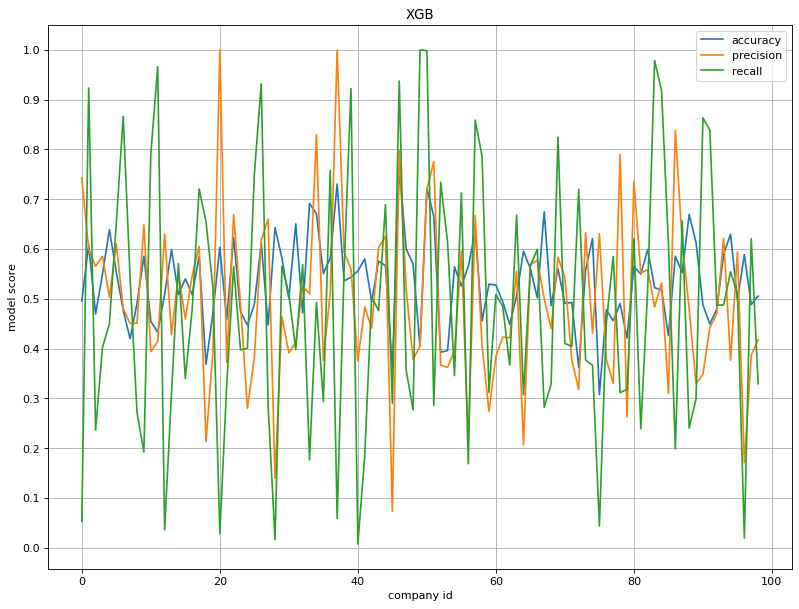

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("XGB")
for i in range(3):
    plt.plot(np.sum(comp_scores_xgb_slumps, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

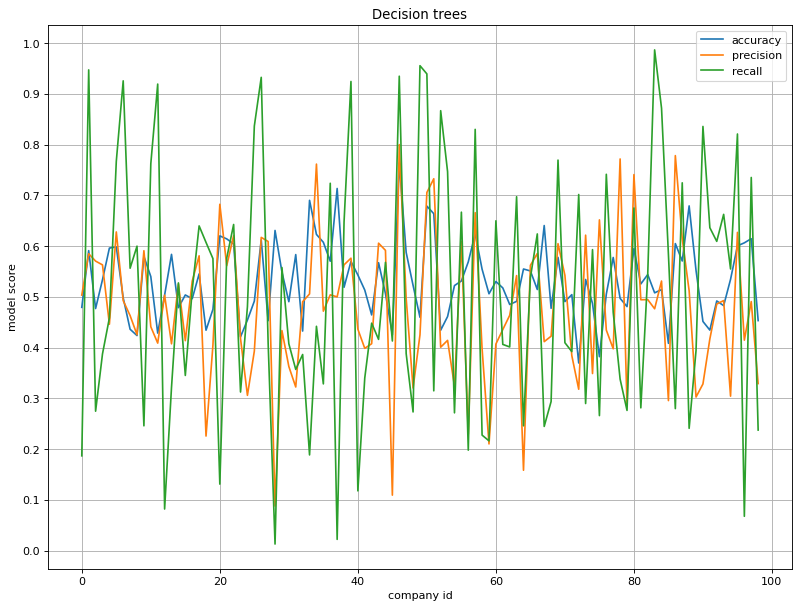

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("Decision trees")
for i in range(3):
    plt.plot(np.sum(comp_scores_dec_tree_slumps, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

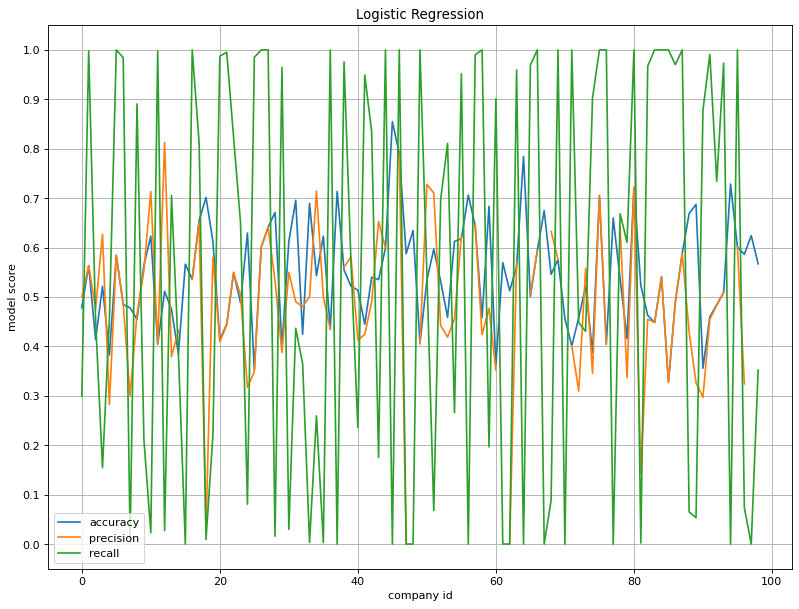

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("Logistic Regression")
for i in range(3):
    plt.plot(np.sum(comp_scores_log_reg_slumps, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

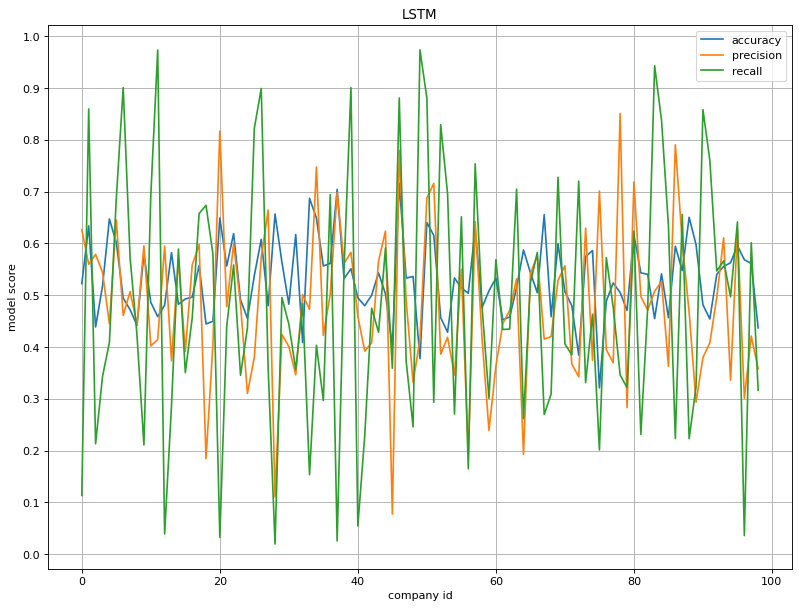

In [ ]:
figure(figsize=(12, 9), dpi=80)

plt.axes(xlabel='company id', ylabel='model score')
#plt.xticks(np.arange(len(comps)), comps, rotation='75')
plt.yticks(np.arange(11)*0.1)
plt.grid()
plt.title("LSTM")
for i in range(3):
    plt.plot(np.sum(comp_scores_lstm_slumps, axis=1)[:,i]/5)
#plt.plot(np.sum(scores_true, axis=1)[:,0]/10)
plt.legend(['accuracy', 'precision', 'recall'])
#true price only

In [ ]:
np.average(np.sum(comp_scores_lstm_slumps, axis=1)[:,0]/5)

0.5237966511070378

In [ ]:
np.average(np.sum(comp_scores_xgb_slumps, axis=1)[:,0]/5)

0.5075491759702286

In [ ]:
np.average(np.sum(comp_scores_dec_tree_all, axis=1)[:,1]/5)

0.47936063197299383

In [ ]:
np.average(np.sum(comp_scores_dec_tree_all, axis=1)[:,0]/5)

0.531311004784689

In [ ]:
np.average(np.nansum(comp_scores_log_reg_all, axis=1)[:,0]/5)

0.5480659223817118

In [ ]:
np.average(np.sum(comp_scores_lstm_slumps, axis=1)[:,1]/5)

0.4962626233013525

In [ ]:
np.average(np.sum(comp_scores_dec_tree_slumps, axis=1)[:,1]/5)

0.47740118252567787

In [ ]:
np.average(np.sum(comp_scores_log_reg_all, axis=1)[:,1]/5)

nan